In [1]:
import scipy         
import datetime
from scipy.linalg import expm,det
import scipy.sparse as sparse
from quspin.operators import hamiltonian, commutator, exp_op # Hamiltonians and operators
from quspin.basis import tensor_basis, spin_basis_1d # bases
import numpy as np # general math functions
import matplotlib.pyplot as plt # plotting library
from numba import jit
from scipy.integrate import solve_ivp,odeint
from functools import reduce


In [2]:
L = 5 #system size
l=1 #spin length
M = 0.1
m_epsilon = 0
N=3
no_checks = dict(check_pcon=False,check_symm=False,check_herm=False)

In [3]:
#construct basis
basis=spin_basis_1d(L=L,S = str(l))
print(basis)

reference states: 
array index   /   Fock state   /   integer repr. 
       0.         |2 2 2 2 2>           242  
       1.         |2 2 2 2 1>           241  
       2.         |2 2 2 2 0>           240  
       3.         |2 2 2 1 2>           239  
       4.         |2 2 2 1 1>           238  
       5.         |2 2 2 1 0>           237  
       6.         |2 2 2 0 2>           236  
       7.         |2 2 2 0 1>           235  
       8.         |2 2 2 0 0>           234  
       9.         |2 2 1 2 2>           233  
      10.         |2 2 1 2 1>           232  
      11.         |2 2 1 2 0>           231  
      12.         |2 2 1 1 2>           230  
      13.         |2 2 1 1 1>           229  
      14.         |2 2 1 1 0>           228  
      15.         |2 2 1 0 2>           227  
      16.         |2 2 1 0 1>           226  
      17.         |2 2 1 0 0>           225  
      18.         |2 2 0 2 2>           224  
      19.         |2 2 0 2 1>           223  
      20.  

In [4]:
#initialisation of the Gauss laws

liste = []
liste_m = []
gauss_law_map = []
Gauss_law = []
gauss_law_matrix = []
z_comp_minf = [[-m_epsilon,0]]
z_comp_pinf = [[m_epsilon,L-1]]

for i in range(L+1):
    liste.append([[1.,i]])
    liste_m.append([[-1.,i]])
    if i == 0:
        gauss_law_map.append([
            ["z",liste[0]],
            ["I",z_comp_minf],

        ])
    
    elif (i == L) & (i%2 == 0):
        gauss_law_map.append([
            ["z",liste_m[i-1]],
            ["I",z_comp_pinf],
        ])
    
    elif (i == L) & (i%2 == 1):
        gauss_law_map.append([
            ["z",liste_m[i-1]],
            ["I",liste[i-1]],
            ["I",z_comp_pinf],

        ])        
        
    elif i%2 == 0:
        gauss_law_map.append([
            ["z",liste[i]],
            ["z",liste_m[i-1]],
        ])
    elif i%2 == 1:
        gauss_law_map.append([
            ["z",liste[i]],
            ["z",liste_m[i-1]],  
            ["I",liste[i]]
        ])
    Gauss_law.append(hamiltonian(gauss_law_map[i],dynamic_list=[],basis=basis,**no_checks))
for i in range(L+1):
    gauss_law_matrix.append(Gauss_law[i].tocsc())

In [5]:
B = np.zeros((int(4*l)+1,int(4*l)+1))
for i in range(int(4*l)+1):
    for j in range(int(4*l)+1):
        B[i][j] = (-2*l+i)**j
b = np.zeros(int(4*l)+1)
b[int(2*l)+1] = 1.
solution = scipy.linalg.solve(B,b)
y = np.zeros(int(4*3/2)+1)
for i in range(int(4*l)+1):
    y[i] = solution[i]
print(y)
print(b)

[ 0.          0.66666667  0.66666667 -0.16666667 -0.16666667  0.
  0.        ]
[0. 0. 0. 1. 0.]


In [6]:
C = np.zeros((int(4*l)+1,int(4*l)+1))
for i in range(int(4*l)+1):
    for j in range(int(4*l)+1):
        C[i][j] = (-2*l+i+1)**j
c = np.zeros(int(4*l)+1)
c[int(2*l)] = 1.
solution = scipy.linalg.solve(C,c)
z = np.zeros(int(4*3/2)+1)
for i in range(int(4*l)+1):
    z[i] = solution[i]
print(z)
print(c)

[ 0.    1.5   0.25 -1.    0.25  0.    0.  ]
[0. 0. 1. 0. 0.]


In [7]:
#projectors on g=1 for every site
Proj = [sparse.csr_matrix((basis.Ns,basis.Ns)) for i in range(L+1)]
for i in range(int(L/2)+1):
    for j in range(int(4*l)+1):
        Proj[2*i] += y[j]*gauss_law_matrix[2*i]**j
for i in range(int(L/2)+1):
    for j in range(int(4*l)+1):
        Proj[2*i+1] += z[j]*gauss_law_matrix[2*i+1]**j

In [8]:
A = np.zeros((int(2*l)+1,int(2*l)+1), dtype = complex)
for i in range(int(2*l)+1):
    for j in range(int(2*l)+1):
        A[i][j] = (-l+i)**j
b = np.zeros(int(2*l)+1,dtype = complex)
for i in range(int(2*l)+1):
    b[i] = (-1)**(-l+i)
solution = scipy.linalg.solve(A,b)
x = np.zeros(int(2*3/2)+1, dtype = complex)
for i in range(int(2*l)+1):
    x[i] = solution[i]
print(x)
print(x.conj())

[ 1.+0.j  0.+0.j -2.-0.j  0.+0.j]
[ 1.-0.j  0.-0.j -2.+0.j  0.-0.j]


In [9]:
D = np.zeros((int(4*l)+1,int(4*l)+1))
for i in range(int(4*l)+1):
    for j in range(int(4*l)+1):
        D[i][j] = (-2*l+i)**j
d = np.zeros(int(4*l)+1)
d[int(2*l)] = 1.
solution = scipy.linalg.solve(D,d)
dd = np.zeros(int(4*3/2)+1)
for i in range(int(4*l)+1):
    dd[i] = solution[i]
print(dd)
print(d)

[ 1.    0.   -1.25 -0.    0.25  0.    0.  ]
[0. 0. 1. 0. 0.]


In [10]:
E = np.zeros((int(4*l)+1,int(4*l)+1))
for i in range(int(4*l)+1):
    for j in range(int(4*l)+1):
        E[i][j] = (-2*l+i+1)**j
e = np.zeros(int(4*l)+1)
e[int(2*l)-1] = 1.
solution = scipy.linalg.solve(E,e)
ee = np.zeros(int(4*3/2)+1)
for i in range(int(4*l)+1):
    ee[i] = solution[i]
print(ee)
print(e)

[ 1.         -0.83333333 -0.83333333  0.83333333 -0.16666667  0.
  0.        ]
[0. 1. 0. 0. 0.]


In [11]:
#projectors on g=0 for every site
Proj_0 = [sparse.csc_matrix((basis.Ns,basis.Ns)) for i in range(L+1)]
for i in range(int(L/2)+1):
    for j in range(int(4*l)+1):
        Proj_0[2*i] += dd[j]*gauss_law_matrix[2*i]**j
for i in range(int(L/2)+1):
    for j in range(int(4*l)+1):
        Proj_0[2*i+1] += ee[j]*gauss_law_matrix[2*i+1]**j

In [12]:
const_term = []
linear_term = []
quadratic_term = []
cubic_term = []

const_term_conj = []
linear_term_conj = []
quadratic_term_conj = []
cubic_term_conj = []

interaction_p = []
interaction_m = []

for i in range(L-1):
    const_term.append([[x[0]/(2*np.sqrt(l*(l+1))),i]])
    linear_term.append([[x[1]/(2*np.sqrt(l*(l+1))),i,i+1]])
    quadratic_term.append([[x[2]/(2*np.sqrt(l*(l+1))),i,i+1,i+1]])
    cubic_term.append([[(x[3])/(2*np.sqrt(l*(l+1))),i,i+1,i+1,i+1]])

    const_term_conj.append([[x.conj()[0]/(2*np.sqrt(l*(l+1))),i]])
    linear_term_conj.append([[x.conj()[1]/(2*np.sqrt(l*(l+1))),i,i+1]])
    quadratic_term_conj.append([[x.conj()[2]/(2*np.sqrt(l*(l+1))),i,i+1,i+1]])
    cubic_term_conj.append([[x.conj()[3]/(2*np.sqrt(l*(l+1))),i,i+1,i+1,i+1]])


    interaction_p.append([
        ["+", const_term[i]],
        ["+z", linear_term[i]],
        ["+zz", quadratic_term[i]],
        ["+zzz", cubic_term[i]],


    ])

    interaction_m.append([
        ["-", const_term_conj[i]],
        ["-z", linear_term_conj[i]],
        ["-zz", quadratic_term_conj[i]],
        ["-zzz", cubic_term_conj[i]],


    ])
    
const_term.append([[(0.5*(-1)**m_epsilon)/np.sqrt(l*(l+1)),L-1]])
const_term_conj.append([[(0.5*np.conj((-1)**m_epsilon))/np.sqrt(l*(l+1)),L-1]])

interaction_p.append([
    ["+", const_term[L-1]]
])
interaction_m.append([
    ["-", const_term_conj[L-1]]
])

kin_energy = [[0.5,i,i] for i in range(L)]
mass_term = [[2*(-1)**i*M,i] for i in range(L)]

kin_mass_map = [
            ["zz", kin_energy], 
            ["z", mass_term], 
]

H_int_p = []
H_int_m = []
interaction = [sparse.csr_matrix((basis.Ns,basis.Ns),dtype = complex) for i in range(L)]
h_int = sparse.csr_matrix((basis.Ns,basis.Ns))
for i in range(L):
    H_int_p.append(hamiltonian(interaction_p[i],dynamic_list=[],basis=basis,**no_checks))
    H_int_m.append(hamiltonian(interaction_m[i],dynamic_list=[],basis=basis,**no_checks))
    interaction[i] = (Proj[i]@H_int_p[i].tocsc()@Proj[i+1]+Proj[i+1]@H_int_m[i].tocsc()@Proj[i])

H_kin_mass = hamiltonian(kin_mass_map,dynamic_list=[],basis=basis,**no_checks)
h_kin_mass = H_kin_mass.tocsc()

h_int = 0

for i in range(L):
    h_int += interaction[i]


full_ham_matrix = h_kin_mass + h_int #Spin-1 Hamiltonian without the local contstaints

for i in range(L+1):
    full_ham_matrix = (Proj[i]+Proj_0[i])@full_ham_matrix@(Proj[i]+Proj_0[i])
full_ham_matrix = 1.*full_ham_matrix

G=0
for i in range(L+1):
    G += 10*(Gauss_law[i]**2-Gauss_law[i])**2
constraint_full_matrix = G.tocsc()
constrained_full_ham_matrix= 1*(full_ham_matrix + constraint_full_matrix) #Spin-1 Hamiltonian with the local contstaints as a penalty term


In [13]:
#eigenvalues and eigenvectors of the Spin-1 Hamiltonian without the local contstaints
eigenval, eigenvec = scipy.sparse.linalg.eigsh(constrained_full_ham_matrix,k = 3,which = "SA")
print(eigenval[eigenval<=1e1])


[-1.0416023  -0.0142565   0.15174042]


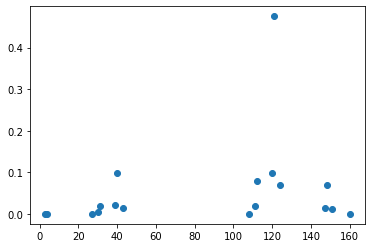

In [14]:
y = []
x = []
for i in range(basis.Ns):
    if np.abs(eigenvec[:,0][i])**2>=1e-4:
        y.append(np.abs(eigenvec[:,0][i])**2) 
        x.append(i)
plt.plot(x,y, "o")


In [15]:
def rot_sigma(k,i,j,phi,theta):
    if k>=L:
        print("Warning! Rotations apply to k<=L-1!")
    sigma = np.zeros((2*l+1,2*l+1),dtype = complex)
    sigma[2*l-i][2*l-j] = 0.5*(np.cos(phi)+1j*np.sin(phi))
    sigma[2*l-j][2*l-i] = 0.5*(np.cos(phi)-1j*np.sin(phi))
    sigma = sparse.csc_matrix(sigma)
    rot_matrix = expm(-1j*theta*sigma)
    if k==0:
        tensprod = rot_matrix
        for i in range(L-1):
            tensprod = scipy.sparse.kron(tensprod,sparse.identity(2*l+1))
    else:
        tensprod = sparse.identity(2*l+1)
        for i in range(1,k):
            tensprod = scipy.sparse.kron(tensprod,sparse.identity(2*l+1))
        tensprod = scipy.sparse.kron(tensprod,rot_matrix)
        for i in range(k+1,L):
            tensprod = scipy.sparse.kron(tensprod,sparse.identity(2*l+1))
    return tensprod


def rot_sigma_e(i,j,phi,theta):
    sigma_e = sparse.identity(basis.Ns,dtype = complex)
    for k in range(1,int(L/2)):
        sigma_e = rot_sigma(2*k,i,j,phi,theta)@sigma_e
    return(sigma_e)

def rot_sigma_o(i,j,phi,theta):
    sigma_o = sparse.identity(basis.Ns,dtype = complex)
    for k in range(int(L/2)):
        sigma_o = rot_sigma(2*k+1,i,j,phi,theta)@sigma_o
    return(sigma_o)

def rot_sigma_r(i,j,phi,theta):
    sigma_r = sparse.identity(basis.Ns,dtype = complex)
    sigma_r = rot_sigma(0,i,j,phi,theta)@rot_sigma(L-1,i,j,phi,theta)
    return(sigma_r)


def sigma(k,i,j,phi):
    sigma = np.zeros((2*l+1,2*l+1),dtype = complex)
    sigma[2*l-i][2*l-j] = 0.5*(np.cos(phi)+1j*np.sin(phi))
    sigma[2*l-j][2*l-i] = 0.5*(np.cos(phi)-1j*np.sin(phi))
    sigma = sparse.csc_matrix(sigma)
    if k==0:
        tensprod = sigma
        for i in range(L-1):
            tensprod = scipy.sparse.kron(tensprod,sparse.identity(2*l+1))
    else:
        tensprod = sparse.identity(2*l+1)
        for i in range(1,k):
            tensprod = scipy.sparse.kron(tensprod,sparse.identity(2*l+1))
        tensprod = scipy.sparse.kron(tensprod,sigma)
        for i in range(k+1,L):
            tensprod = scipy.sparse.kron(tensprod,sparse.identity(2*l+1))
    return tensprod


def sigma_e(i,j,phi):
    sigma_e = np.zeros((basis.Ns,basis.Ns),dtype = complex)
    sigma_e = sparse.csc_matrix(sigma_e)
    for k in range(1,int(L/2)):
        sigma_e +=sigma(2*k,i,j,phi)
    return sigma_e

def sigma_o(i,j,phi):
    sigma_o = np.zeros((basis.Ns,basis.Ns),dtype = complex)
    sigma_o = sparse.csc_matrix(sigma_o)
    for k in range(int(L/2)):
        sigma_o +=sigma(2*k+1,i,j,phi)
    return sigma_o

def sigma_r(i,j,phi):
    sigma_r = np.zeros((basis.Ns,basis.Ns),dtype = complex)
    sigma_r = sparse.csc_matrix(sigma_r)
    sigma_r = sigma(0,i,j,phi)+sigma(L-1,i,j,phi)
    return sigma_r

In [16]:

def ms_hamiltonian(i,j,phi):
    sigma = np.zeros((2*l+1,2*l+1),dtype = complex)
    sigma[2*l-i][2*l-j] = 0.5*(np.cos(phi)+1j*np.sin(phi))
    sigma[2*l-j][2*l-i] = 0.5*(np.cos(phi)-1j*np.sin(phi))
    sigma = sparse.csc_matrix(sigma)
    summe = np.zeros((basis.Ns,basis.Ns),dtype = complex)
    for k in range(L):
        if k == 0:
            tensprod = sigma
            for m in range(L-1):
                tensprod = scipy.sparse.kron(tensprod,sparse.identity(2*l+1))
            tensprod = tensprod.toarray()
        else:
            tensprod = sparse.identity(2*l+1)
            for i in range(1,k):
                tensprod = scipy.sparse.kron(tensprod,sparse.identity(2*l+1))
            tensprod = scipy.sparse.kron(tensprod,sigma)
            for i in range(k+1,L):
                tensprod = scipy.sparse.kron(tensprod,sparse.identity(2*l+1))
            tensprod = tensprod.toarray()
        summe +=tensprod
    return summe@summe
                
matrix_part = ms_hamiltonian(1,2,0)
ms_ham_eigenval, ms_ham_eigenvec = scipy.linalg.eigh(matrix_part)




def ms_gate_global(theta):
    exponential = np.zeros((basis.Ns,basis.Ns),dtype = complex)
    for i in range(basis.Ns):
        exponential[i][i] = np.exp(-1j*ms_ham_eigenval[i]*theta)
    exponential = scipy.sparse.csc_matrix(exponential)
    return ms_ham_eigenvec@exponential@ms_ham_eigenvec.T.conj()

    
def ms_hamiltonian_1(i,j,phi):
    sigma_p = np.zeros((2*l+1,2*l+1),dtype = complex)
    sigma_m = np.zeros((2*l+1,2*l+1),dtype = complex)
    sigma_z = np.zeros((2*l+1,2*l+1),dtype = complex)
    
    sigma_p[2*l-j][2*l-i] = 1.
    sigma_m[2*l-i][2*l-j] = 1.
    
    sigma_z[2*l-i][2*l-i] = 1.
    sigma_z[2*l-j][2*l-j] = -1.
    
    sigma_p = sparse.csc_matrix(sigma_p)
    sigma_m = sparse.csc_matrix(sigma_m)
    sigma_z = sparse.csc_matrix(sigma_z)

    sigma_big_p = [np.zeros((basis.Ns,basis.Ns),dtype = complex) for n in range(L)]
    sigma_big_m = [np.zeros((basis.Ns,basis.Ns),dtype = complex) for n in range(L)]
    sigma_big_z = [np.zeros((basis.Ns,basis.Ns),dtype = complex) for n in range(L)]

    summe = np.zeros((basis.Ns,basis.Ns),dtype = complex)
    
    for k in range(L):
        if k == 0:
            tensprod_p = sigma_p
            tensprod_m = sigma_m
            tensprod_z = sigma_z

            for m in range(L-1):
                tensprod_p = scipy.sparse.kron(tensprod_p,sparse.identity(2*l+1))
                tensprod_m = scipy.sparse.kron(tensprod_m,sparse.identity(2*l+1))
                tensprod_z = scipy.sparse.kron(tensprod_z,sparse.identity(2*l+1))
            tensprod_p = tensprod_p.toarray()
            tensprod_m = tensprod_m.toarray()
            tensprod_z = tensprod_z.toarray()
        else:
            tensprod_p = sparse.identity(2*l+1)
            tensprod_m = sparse.identity(2*l+1)
            tensprod_z = sparse.identity(2*l+1)
            
            for i in range(1,k):
                tensprod_p = scipy.sparse.kron(tensprod_p,sparse.identity(2*l+1))
                tensprod_m = scipy.sparse.kron(tensprod_m,sparse.identity(2*l+1))
                tensprod_z = scipy.sparse.kron(tensprod_z,sparse.identity(2*l+1))
            tensprod_p = scipy.sparse.kron(tensprod_p,sigma_p)
            tensprod_m = scipy.sparse.kron(tensprod_m,sigma_m)
            tensprod_z = scipy.sparse.kron(tensprod_z,sigma_z)            
            for i in range(k+1,L):
                tensprod_p = scipy.sparse.kron(tensprod_p,sparse.identity(2*l+1))
                tensprod_m = scipy.sparse.kron(tensprod_m,sparse.identity(2*l+1))
                tensprod_z = scipy.sparse.kron(tensprod_z,sparse.identity(2*l+1))
            tensprod_p = tensprod_p.toarray()
            tensprod_m = tensprod_m.toarray()    
            tensprod_z = tensprod_z.toarray() 
            
        sigma_big_p[k] = tensprod_p
        sigma_big_m[k] = tensprod_m
        sigma_big_z[k] = tensprod_z

    for k in range(L):
        summe += 1.*sigma_big_z[k]
        for kk in range(k+1,L):
            summe += 1./np.abs(k-kk)**2*(sigma_big_p[k]@sigma_big_m[kk] + sigma_big_m[k]@sigma_big_p[kk])
    return summe
                
matrix_part_1 = ms_hamiltonian_1(1,2,0)
ms_ham_eigenval_1, ms_ham_eigenvec_1 = scipy.linalg.eigh(matrix_part_1)




def ms_gate_global_1(theta):
    exponential = np.zeros((basis.Ns,basis.Ns),dtype = complex)
    for i in range(basis.Ns):
        exponential[i][i] = np.exp(-1j*ms_ham_eigenval_1[i]*theta)
    exponential = scipy.sparse.csc_matrix(exponential)
    return ms_ham_eigenvec_1@exponential@ms_ham_eigenvec_1.T.conj()

In [17]:
#initial state
string = ""
for i in range(L):
    string +="1"
psi_0 = np.zeros(basis.Ns)
i_0 = basis.index(string)
psi_0[i_0] = 1.

In [18]:
def R(i,theta):
    
    if i%11 == 0:
        return(ms_gate_global(theta))
    
    if i%11 == 1:
        return(ms_gate_global_1(theta))
    

    if i%11 == 2:
        return(rot_sigma_e(0,1,0,theta).toarray())


    if i%11 == 3:
        return(rot_sigma_e(0,2,0,theta).toarray())

    
    if i%11 == 4:
        return(rot_sigma_e(1,2,np.pi/2,theta).toarray())
    
    
    if i%11 == 5:
        return(rot_sigma_o(0,1,0,theta).toarray())


    if i%11 == 6:
        return(rot_sigma_o(0,2,0,theta).toarray())

    
    if i%11 == 7:
        return(rot_sigma_o(1,2,np.pi/2,theta).toarray())

    if i%11 == 8:
        return(rot_sigma_r(0,1,0,theta).toarray())


    if i%11 == 9:
        return(rot_sigma_r(0,2,0,theta).toarray())

    
    if i%11 == 10:
        return(rot_sigma_r(1,2,np.pi/2,theta).toarray())
    
def S(i):
    
    if i%11 == 0:
        return(-1j*matrix_part)
    

    if i%11 == 1:
        return(-1j*matrix_part_1)
    

    if i%11 == 2:
        return(-1j*sigma_e(0,1,0).toarray())

    
    if i%11 == 3:
        return(-1j*sigma_e(0,2,0).toarray())

    
    if i%11 == 4:
        return(-1j*sigma_e(1,2,np.pi/2).toarray())


     
    if i%11 == 5:
        return(-1j*sigma_o(0,1,0).toarray())

    
    if i%11 == 6:
        return(-1j*sigma_o(0,2,0).toarray())

    
    if i%11 == 7:
        return(-1j*sigma_o(1,2,np.pi/2).toarray())

     
    if i%11 == 8:
        return(-1j*sigma_r(0,1,0).toarray())

    
    if i%11 == 9:
        return(-1j*sigma_r(0,2,0).toarray())

    
    if i%11 == 10:
        return(-1j*sigma_r(1,2,np.pi/2).toarray())


In [19]:
coeff = 11
stepp = 5000
t_final = 10

In [20]:
matr = full_ham_matrix.toarray()
ones = np.ones(coeff*N)
ID = np.identity(coeff*N)
psi_0_conj = np.conj(psi_0)
A = [np.zeros((basis.Ns,basis.Ns),dtype = complex) for i in range(coeff*N)]
B = [np.zeros((basis.Ns,basis.Ns),dtype = complex) for i in range(coeff*N)]
dd = [np.zeros((basis.Ns,basis.Ns),dtype = complex) for i in range(coeff*N)]

In [29]:
def rhs(t,theta):
    
    print(datetime.datetime.now())
    for k in range(coeff*N):
        B[k] = R(k,theta[k])

    print("start",datetime.datetime.now())
    
    for k in range(coeff*N):
        B[k] = S(k)@R(k,theta[k])
        dd[k] = reduce(np.dot,B)

        B[k] = R(k,theta[k])
        
    print("stop_reduce",datetime.datetime.now())
    

    DD = np.array(dd)
    
    X = np.zeros((coeff*N,coeff*N),dtype = complex)
    Y = np.zeros(coeff*N,dtype = complex)

    BBB = reduce(np.dot,B)
    DD_d = np.einsum("kij->kji",DD.conj())
    BBB_dagger = BBB.conj().T

    
    
    psi_conj_d = np.einsum("m,imn->in",psi_0_conj,DD_d)
    psi_d = np.einsum("jnl,l->jn",DD,psi_0)
    
    psi_conj_b = np.einsum("m,mn->n",psi_0_conj,BBB_dagger)
    psi_b = np.einsum("lk,k->l",BBB,psi_0)

    X = np.einsum("in,jn->ij",psi_conj_d,psi_d)

    Y = np.einsum("il,ln,n->i",psi_conj_d,matr,psi_b)
    
    XX = np.einsum("il,l->i",psi_conj_d,psi_b)
    
    YY_1 = np.einsum("n,in->i",psi_conj_b,psi_d)
        
    YY_2 = np.einsum("i,ij,j",psi_conj_b,matr,psi_b)
    YY = YY_1*YY_2
    XX = np.outer(XX,XX)
    X_r = 2*np.real(X+XX)
    Y_i = 2*np.real(Y+YY)
    result = -np.linalg.pinv(X_r,rcond = 1e-6)@Y_i
    print(datetime.datetime.now())

    print(t)

    return result

In [30]:
time_domain = np.linspace(0, t_final, stepp)
Y = []

In [31]:
# RK-4 method
def rk4(x0,y0,xn,n):
    global Y

    # Calculating step size
    h = (xn-x0)/n

    #print('\n--------SOLUTION--------')
    #print('-------------------------')    
    #print('x0\ty0\tyn')
    #print('-------------------------')
    for i in range(n):
        k1 = h * (rhs(x0, y0))
        k2 = h * (rhs((x0+h/2), (y0+k1/2)))
        k3 = h * (rhs((x0+h/2), (y0+k2/2)))
        k4 = h * (rhs((x0+h), (y0+k3)))
        k = (k1+2*k2+2*k3+k4)/6
        yn = y0 + k
        #print('%.4f\t%.4f\t%.4f'% (x0,y0,yn) )
        #print('-------------------------')
        y0 = yn
        x0 = x0+h
        Y.append(y0)
    
    #print('\nAt x=%.4f, y=%.4f' %(xn,yn))

# Inputs
#print('Enter initial conditions:')
#x0 = float(input('x0 = '))
#y0 = float(input('y0 = '))

#print('Enter calculation point: ')
#xn = float(input('xn = '))

#print('Enter number of steps:')
#step = int(input('Number of steps = '))

# RK4 method call


In [32]:
#start_point = 0.001*np.ones(coeff*N)
expt_value = []
energyy = []

for kkk in range(5):
    Y = []
    start_point = np.random.rand(coeff*N)
    rk4(0,start_point,t_final,stepp)
    def var_ansatz(theta,psi_0):
        psi = psi_0
        for i in range(coeff*N):
            psi = R(coeff*N-1-i,theta[coeff*N-1-i])@psi

        return psi
    psi = var_ansatz(start_point,psi_0)
    psi_ground = eigenvec[:,0]
    expt_value_u = np.zeros(len(time_domain))
    energy = np.zeros(len(time_domain))

    psi = var_ansatz(start_point,psi_0)
    for tt in range(len(time_domain)):
        theta = []
        for i in range(coeff*N):
            theta.append(Y[tt][i])


        psi_var = var_ansatz(theta,psi_0)
        for i in range(L+1):
            psi_var = (Proj[i]+Proj_0[i])@psi_var
        norm = np.sqrt(np.real(np.conj(psi_var)@psi_var))

        expt_value_u[tt] = np.abs(np.conj(psi_var)@psi_ground/norm)**2
        energy[tt] = np.real(np.conj(psi_var)@full_ham_matrix@psi_var/norm**2)
        
    expt_value.append(expt_value_u)
    energyy.append(energy)


    

2022-07-28 19:39:52.625264
start 2022-07-28 19:39:53.055945
stop_reduce 2022-07-28 19:39:55.629551
2022-07-28 19:39:55.703336
0
2022-07-28 19:39:55.704556
start 2022-07-28 19:39:56.038874
stop_reduce 2022-07-28 19:39:58.213688
2022-07-28 19:39:58.297348
0.001
2022-07-28 19:39:58.298310
start 2022-07-28 19:39:58.622571
stop_reduce 2022-07-28 19:40:00.736689
2022-07-28 19:40:00.813872
0.001
2022-07-28 19:40:00.814997
start 2022-07-28 19:40:01.139768
stop_reduce 2022-07-28 19:40:03.541060
2022-07-28 19:40:03.617174
0.002
2022-07-28 19:40:03.618061
start 2022-07-28 19:40:03.932353
stop_reduce 2022-07-28 19:40:06.006284
2022-07-28 19:40:06.080321
0.002
2022-07-28 19:40:06.081369
start 2022-07-28 19:40:06.389422
stop_reduce 2022-07-28 19:40:08.458081
2022-07-28 19:40:08.532263
0.003
2022-07-28 19:40:08.533471
start 2022-07-28 19:40:08.839656
stop_reduce 2022-07-28 19:40:11.206497
2022-07-28 19:40:11.302363
0.003
2022-07-28 19:40:11.303719
start 2022-07-28 19:40:11.724101
stop_reduce 2022-07-

start 2022-07-28 19:42:18.686777
stop_reduce 2022-07-28 19:42:21.566050
2022-07-28 19:42:21.687534
0.030000000000000013
2022-07-28 19:42:21.690839
start 2022-07-28 19:42:21.982264
stop_reduce 2022-07-28 19:42:24.306110
2022-07-28 19:42:24.418477
0.030000000000000013
2022-07-28 19:42:24.420895
start 2022-07-28 19:42:24.712506
stop_reduce 2022-07-28 19:42:27.034565
2022-07-28 19:42:27.130062
0.031000000000000014
2022-07-28 19:42:27.131036
start 2022-07-28 19:42:27.426060
stop_reduce 2022-07-28 19:42:29.750465
2022-07-28 19:42:29.835268
0.031000000000000014
2022-07-28 19:42:29.836058
start 2022-07-28 19:42:30.127099
stop_reduce 2022-07-28 19:42:32.563277
2022-07-28 19:42:32.669718
0.032000000000000015
2022-07-28 19:42:32.670717
start 2022-07-28 19:42:32.962257
stop_reduce 2022-07-28 19:42:35.302659
2022-07-28 19:42:35.387120
0.032000000000000015
2022-07-28 19:42:35.388057
start 2022-07-28 19:42:35.678381
stop_reduce 2022-07-28 19:42:38.015382
2022-07-28 19:42:38.100768
0.03300000000000001

start 2022-07-28 19:44:46.967156
stop_reduce 2022-07-28 19:44:48.911389
2022-07-28 19:44:48.983761
0.05800000000000004
2022-07-28 19:44:48.985023
start 2022-07-28 19:44:49.403896
stop_reduce 2022-07-28 19:44:51.359132
2022-07-28 19:44:51.431751
0.05800000000000004
2022-07-28 19:44:51.432999
start 2022-07-28 19:44:51.852193
stop_reduce 2022-07-28 19:44:53.801840
2022-07-28 19:44:53.874261
0.05900000000000004
2022-07-28 19:44:53.875441
start 2022-07-28 19:44:54.293023
stop_reduce 2022-07-28 19:44:56.254411
2022-07-28 19:44:56.326789
0.05900000000000004
2022-07-28 19:44:56.328013
start 2022-07-28 19:44:56.745380
stop_reduce 2022-07-28 19:44:58.702209
2022-07-28 19:44:58.774259
0.06000000000000004
2022-07-28 19:44:58.775514
start 2022-07-28 19:44:59.193842
stop_reduce 2022-07-28 19:45:01.124216
2022-07-28 19:45:01.229643
0.06000000000000004
2022-07-28 19:45:01.230903
start 2022-07-28 19:45:01.648654
stop_reduce 2022-07-28 19:45:03.596528
2022-07-28 19:45:03.668986
0.06100000000000004
2022-

stop_reduce 2022-07-28 19:47:06.183909
2022-07-28 19:47:06.258339
0.08600000000000006
2022-07-28 19:47:06.259735
start 2022-07-28 19:47:06.679093
stop_reduce 2022-07-28 19:47:08.614324
2022-07-28 19:47:08.694802
0.08600000000000006
2022-07-28 19:47:08.696181
start 2022-07-28 19:47:09.116405
stop_reduce 2022-07-28 19:47:11.073772
2022-07-28 19:47:11.145731
0.08700000000000006
2022-07-28 19:47:11.147061
start 2022-07-28 19:47:11.567041
stop_reduce 2022-07-28 19:47:13.513844
2022-07-28 19:47:13.588936
0.08700000000000006
2022-07-28 19:47:13.590326
start 2022-07-28 19:47:14.010079
stop_reduce 2022-07-28 19:47:15.961980
2022-07-28 19:47:16.033878
0.08800000000000006
2022-07-28 19:47:16.035237
start 2022-07-28 19:47:16.454740
stop_reduce 2022-07-28 19:47:18.408893
2022-07-28 19:47:18.481013
0.08800000000000006
2022-07-28 19:47:18.482413
start 2022-07-28 19:47:18.901741
stop_reduce 2022-07-28 19:47:20.859285
2022-07-28 19:47:20.935326
0.08900000000000007
2022-07-28 19:47:20.936651
start 2022-

start 2022-07-28 19:49:23.844849
stop_reduce 2022-07-28 19:49:25.802568
2022-07-28 19:49:25.874896
0.11400000000000009
2022-07-28 19:49:25.876330
start 2022-07-28 19:49:26.296627
stop_reduce 2022-07-28 19:49:28.235208
2022-07-28 19:49:28.315380
0.11500000000000009
2022-07-28 19:49:28.316779
start 2022-07-28 19:49:28.736652
stop_reduce 2022-07-28 19:49:30.674301
2022-07-28 19:49:30.747456
0.11500000000000009
2022-07-28 19:49:30.748784
start 2022-07-28 19:49:31.168668
stop_reduce 2022-07-28 19:49:33.124192
2022-07-28 19:49:33.196373
0.11600000000000009
2022-07-28 19:49:33.197816
start 2022-07-28 19:49:33.617111
stop_reduce 2022-07-28 19:49:35.576056
2022-07-28 19:49:35.648062
0.11600000000000009
2022-07-28 19:49:35.649432
start 2022-07-28 19:49:36.069394
stop_reduce 2022-07-28 19:49:38.023238
2022-07-28 19:49:38.095982
0.11700000000000009
2022-07-28 19:49:38.097304
start 2022-07-28 19:49:38.516800
stop_reduce 2022-07-28 19:49:40.463193
2022-07-28 19:49:40.535962
0.11700000000000009
2022-

start 2022-07-28 19:52:05.025281
stop_reduce 2022-07-28 19:52:07.672854
2022-07-28 19:52:07.766413
0.1430000000000001
2022-07-28 19:52:07.767682
start 2022-07-28 19:52:08.192408
stop_reduce 2022-07-28 19:52:10.843675
2022-07-28 19:52:10.936517
0.1430000000000001
2022-07-28 19:52:10.937582
start 2022-07-28 19:52:11.362156
stop_reduce 2022-07-28 19:52:14.011591
2022-07-28 19:52:14.105383
0.1440000000000001
2022-07-28 19:52:14.106658
start 2022-07-28 19:52:14.530611
stop_reduce 2022-07-28 19:52:17.181262
2022-07-28 19:52:17.274166
0.1440000000000001
2022-07-28 19:52:17.275438
start 2022-07-28 19:52:17.700302
stop_reduce 2022-07-28 19:52:20.346934
2022-07-28 19:52:20.440019
0.1450000000000001
2022-07-28 19:52:20.441279
start 2022-07-28 19:52:20.866099
stop_reduce 2022-07-28 19:52:23.507643
2022-07-28 19:52:23.600713
0.1450000000000001
2022-07-28 19:52:23.601958
start 2022-07-28 19:52:24.027472
stop_reduce 2022-07-28 19:52:26.674849
2022-07-28 19:52:26.768454
0.1460000000000001
2022-07-28 1

start 2022-07-28 19:55:01.770320
stop_reduce 2022-07-28 19:55:04.154308
2022-07-28 19:55:04.244096
0.17100000000000012
2022-07-28 19:55:04.245185
start 2022-07-28 19:55:04.537150
stop_reduce 2022-07-28 19:55:06.886508
2022-07-28 19:55:06.972073
0.17200000000000013
2022-07-28 19:55:06.973229
start 2022-07-28 19:55:07.264709
stop_reduce 2022-07-28 19:55:09.614167
2022-07-28 19:55:09.698562
0.17200000000000013
2022-07-28 19:55:09.699738
start 2022-07-28 19:55:09.991488
stop_reduce 2022-07-28 19:55:12.339456
2022-07-28 19:55:12.425705
0.17300000000000013
2022-07-28 19:55:12.426881
start 2022-07-28 19:55:12.718620
stop_reduce 2022-07-28 19:55:15.059725
2022-07-28 19:55:15.145995
0.17300000000000013
2022-07-28 19:55:15.147252
start 2022-07-28 19:55:15.438845
stop_reduce 2022-07-28 19:55:17.792483
2022-07-28 19:55:17.878088
0.17400000000000013
2022-07-28 19:55:17.879331
start 2022-07-28 19:55:18.171176
stop_reduce 2022-07-28 19:55:20.536236
2022-07-28 19:55:20.622146
0.17400000000000013
2022-

stop_reduce 2022-07-28 19:57:37.885556
2022-07-28 19:57:37.971331
0.19900000000000015
2022-07-28 19:57:37.972506
start 2022-07-28 19:57:38.265308
stop_reduce 2022-07-28 19:57:40.632650
2022-07-28 19:57:40.718709
0.20000000000000015
2022-07-28 19:57:40.719905
start 2022-07-28 19:57:41.012946
stop_reduce 2022-07-28 19:57:43.391587
2022-07-28 19:57:43.476945
0.20000000000000015
2022-07-28 19:57:43.478134
start 2022-07-28 19:57:43.769801
stop_reduce 2022-07-28 19:57:46.155621
2022-07-28 19:57:46.242360
0.20100000000000015
2022-07-28 19:57:46.243525
start 2022-07-28 19:57:46.535662
stop_reduce 2022-07-28 19:57:48.896226
2022-07-28 19:57:48.980967
0.20100000000000015
2022-07-28 19:57:48.982188
start 2022-07-28 19:57:49.274010
stop_reduce 2022-07-28 19:57:51.642006
2022-07-28 19:57:51.727760
0.20200000000000015
2022-07-28 19:57:51.728953
start 2022-07-28 19:57:52.020849
stop_reduce 2022-07-28 19:57:54.398049
2022-07-28 19:57:54.484857
0.20200000000000015
2022-07-28 19:57:54.486018
start 2022-

start 2022-07-28 20:00:13.089758
stop_reduce 2022-07-28 20:00:15.758296
2022-07-28 20:00:15.851507
0.22800000000000017
2022-07-28 20:00:15.852641
start 2022-07-28 20:00:16.287952
stop_reduce 2022-07-28 20:00:18.955679
2022-07-28 20:00:19.048849
0.22800000000000017
2022-07-28 20:00:19.050110
start 2022-07-28 20:00:19.485440
stop_reduce 2022-07-28 20:00:22.182319
2022-07-28 20:00:22.275646
0.22900000000000018
2022-07-28 20:00:22.276998
start 2022-07-28 20:00:22.700103
stop_reduce 2022-07-28 20:00:25.377549
2022-07-28 20:00:25.472056
0.22900000000000018
2022-07-28 20:00:25.473309
start 2022-07-28 20:00:25.896354
stop_reduce 2022-07-28 20:00:28.574989
2022-07-28 20:00:28.667036
0.23000000000000018
2022-07-28 20:00:28.668284
start 2022-07-28 20:00:29.091670
stop_reduce 2022-07-28 20:00:31.764913
2022-07-28 20:00:31.858432
0.23000000000000018
2022-07-28 20:00:31.859625
start 2022-07-28 20:00:32.280181
stop_reduce 2022-07-28 20:00:35.071776
2022-07-28 20:00:35.164531
0.23100000000000018
2022-

start 2022-07-28 20:02:58.579931
stop_reduce 2022-07-28 20:03:00.545776
2022-07-28 20:03:00.620826
0.25600000000000017
2022-07-28 20:03:00.622081
start 2022-07-28 20:03:01.041873
stop_reduce 2022-07-28 20:03:03.005606
2022-07-28 20:03:03.077214
0.2570000000000002
2022-07-28 20:03:03.078485
start 2022-07-28 20:03:03.510527
stop_reduce 2022-07-28 20:03:05.467780
2022-07-28 20:03:05.539921
0.2570000000000002
2022-07-28 20:03:05.541341
start 2022-07-28 20:03:05.961004
stop_reduce 2022-07-28 20:03:07.919244
2022-07-28 20:03:07.993658
0.2580000000000002
2022-07-28 20:03:07.995051
start 2022-07-28 20:03:08.426748
stop_reduce 2022-07-28 20:03:10.376969
2022-07-28 20:03:10.461116
0.2580000000000002
2022-07-28 20:03:10.462489
start 2022-07-28 20:03:10.881835
stop_reduce 2022-07-28 20:03:12.846242
2022-07-28 20:03:12.917811
0.2590000000000002
2022-07-28 20:03:12.919156
start 2022-07-28 20:03:13.339156
stop_reduce 2022-07-28 20:03:15.299613
2022-07-28 20:03:15.372048
0.2590000000000002
2022-07-28 

start 2022-07-28 20:05:28.046150
stop_reduce 2022-07-28 20:05:30.393950
2022-07-28 20:05:30.479639
0.2850000000000002
2022-07-28 20:05:30.480847
start 2022-07-28 20:05:30.773390
stop_reduce 2022-07-28 20:05:33.124679
2022-07-28 20:05:33.219348
0.2850000000000002
2022-07-28 20:05:33.220475
start 2022-07-28 20:05:33.513123
stop_reduce 2022-07-28 20:05:35.848689
2022-07-28 20:05:35.933929
0.2860000000000002
2022-07-28 20:05:35.935136
start 2022-07-28 20:05:36.237671
stop_reduce 2022-07-28 20:05:38.574156
2022-07-28 20:05:38.658809
0.2860000000000002
2022-07-28 20:05:38.660078
start 2022-07-28 20:05:38.952652
stop_reduce 2022-07-28 20:05:41.301434
2022-07-28 20:05:41.385891
0.2870000000000002
2022-07-28 20:05:41.387067
start 2022-07-28 20:05:41.679785
stop_reduce 2022-07-28 20:05:44.012936
2022-07-28 20:05:44.098417
0.2870000000000002
2022-07-28 20:05:44.099593
start 2022-07-28 20:05:44.410950
stop_reduce 2022-07-28 20:05:46.745235
2022-07-28 20:05:46.831226
0.2880000000000002
2022-07-28 2

start 2022-07-28 20:08:03.056713
stop_reduce 2022-07-28 20:08:05.525483
2022-07-28 20:08:05.610112
0.3130000000000002
2022-07-28 20:08:05.611148
start 2022-07-28 20:08:05.901790
stop_reduce 2022-07-28 20:08:08.244287
2022-07-28 20:08:08.328736
0.3140000000000002
2022-07-28 20:08:08.329817
start 2022-07-28 20:08:08.621172
stop_reduce 2022-07-28 20:08:10.969660
2022-07-28 20:08:11.064373
0.3140000000000002
2022-07-28 20:08:11.065439
start 2022-07-28 20:08:11.357509
stop_reduce 2022-07-28 20:08:13.688331
2022-07-28 20:08:13.773246
0.3150000000000002
2022-07-28 20:08:13.774339
start 2022-07-28 20:08:14.065765
stop_reduce 2022-07-28 20:08:16.403390
2022-07-28 20:08:16.487843
0.3150000000000002
2022-07-28 20:08:16.488976
start 2022-07-28 20:08:16.779831
stop_reduce 2022-07-28 20:08:19.109532
2022-07-28 20:08:19.203252
0.3160000000000002
2022-07-28 20:08:19.204350
start 2022-07-28 20:08:19.495271
stop_reduce 2022-07-28 20:08:21.824493
2022-07-28 20:08:21.908452
0.3160000000000002
2022-07-28 2

stop_reduce 2022-07-28 20:10:36.627056
2022-07-28 20:10:36.691497
0.34100000000000025
2022-07-28 20:10:36.692561
start 2022-07-28 20:10:36.981390
stop_reduce 2022-07-28 20:10:38.596660
2022-07-28 20:10:38.660821
0.34200000000000025
2022-07-28 20:10:38.661889
start 2022-07-28 20:10:38.950678
stop_reduce 2022-07-28 20:10:40.567725
2022-07-28 20:10:40.632779
0.34200000000000025
2022-07-28 20:10:40.633929
start 2022-07-28 20:10:40.922467
stop_reduce 2022-07-28 20:10:42.540668
2022-07-28 20:10:42.605259
0.34300000000000025
2022-07-28 20:10:42.606432
start 2022-07-28 20:10:42.895296
stop_reduce 2022-07-28 20:10:44.521108
2022-07-28 20:10:44.585909
0.34300000000000025
2022-07-28 20:10:44.587031
start 2022-07-28 20:10:44.875268
stop_reduce 2022-07-28 20:10:46.493632
2022-07-28 20:10:46.557507
0.34400000000000025
2022-07-28 20:10:46.558616
start 2022-07-28 20:10:46.847370
stop_reduce 2022-07-28 20:10:48.464898
2022-07-28 20:10:48.530161
0.34400000000000025
2022-07-28 20:10:48.531339
start 2022-

start 2022-07-28 20:12:38.575903
stop_reduce 2022-07-28 20:12:41.258739
2022-07-28 20:12:41.362041
0.3700000000000003
2022-07-28 20:12:41.363536
start 2022-07-28 20:12:41.793520
stop_reduce 2022-07-28 20:12:44.469478
2022-07-28 20:12:44.564205
0.3700000000000003
2022-07-28 20:12:44.565590
start 2022-07-28 20:12:44.994800
stop_reduce 2022-07-28 20:12:47.673080
2022-07-28 20:12:47.769392
0.3710000000000003
2022-07-28 20:12:47.770832
start 2022-07-28 20:12:48.197647
stop_reduce 2022-07-28 20:12:50.876016
2022-07-28 20:12:50.970793
0.3710000000000003
2022-07-28 20:12:50.972225
start 2022-07-28 20:12:51.396338
stop_reduce 2022-07-28 20:12:54.072535
2022-07-28 20:12:54.167285
0.3720000000000003
2022-07-28 20:12:54.168734
start 2022-07-28 20:12:54.597522
stop_reduce 2022-07-28 20:12:57.274243
2022-07-28 20:12:57.368310
0.3720000000000003
2022-07-28 20:12:57.369756
start 2022-07-28 20:12:57.799685
stop_reduce 2022-07-28 20:13:00.477633
2022-07-28 20:13:00.584610
0.3730000000000003
2022-07-28 2

start 2022-07-28 20:15:41.408820
stop_reduce 2022-07-28 20:15:44.070242
2022-07-28 20:15:44.164709
0.3980000000000003
2022-07-28 20:15:44.166085
start 2022-07-28 20:15:44.589664
stop_reduce 2022-07-28 20:15:47.272606
2022-07-28 20:15:47.367304
0.3990000000000003
2022-07-28 20:15:47.368714
start 2022-07-28 20:15:47.793355
stop_reduce 2022-07-28 20:15:50.451005
2022-07-28 20:15:50.553690
0.3990000000000003
2022-07-28 20:15:50.555127
start 2022-07-28 20:15:50.979176
stop_reduce 2022-07-28 20:15:53.643317
2022-07-28 20:15:53.737713
0.4000000000000003
2022-07-28 20:15:53.739109
start 2022-07-28 20:15:54.163524
stop_reduce 2022-07-28 20:15:56.826420
2022-07-28 20:15:56.920451
0.4000000000000003
2022-07-28 20:15:56.921880
start 2022-07-28 20:15:57.345431
stop_reduce 2022-07-28 20:16:00.036227
2022-07-28 20:16:00.130725
0.4010000000000003
2022-07-28 20:16:00.132126
start 2022-07-28 20:16:00.556077
stop_reduce 2022-07-28 20:16:03.228716
2022-07-28 20:16:03.329378
0.4010000000000003
2022-07-28 2

start 2022-07-28 20:18:21.366071
stop_reduce 2022-07-28 20:18:23.750152
2022-07-28 20:18:23.836072
0.4270000000000003
2022-07-28 20:18:23.837243
start 2022-07-28 20:18:24.131505
stop_reduce 2022-07-28 20:18:26.503531
2022-07-28 20:18:26.592529
0.4270000000000003
2022-07-28 20:18:26.593705
start 2022-07-28 20:18:26.887976
stop_reduce 2022-07-28 20:18:29.261620
2022-07-28 20:18:29.348649
0.4280000000000003
2022-07-28 20:18:29.349818
start 2022-07-28 20:18:29.653271
stop_reduce 2022-07-28 20:18:32.021081
2022-07-28 20:18:32.106423
0.4280000000000003
2022-07-28 20:18:32.107505
start 2022-07-28 20:18:32.495525
stop_reduce 2022-07-28 20:18:34.249767
2022-07-28 20:18:34.315394
0.4290000000000003
2022-07-28 20:18:34.316593
start 2022-07-28 20:18:34.614184
stop_reduce 2022-07-28 20:18:36.250962
2022-07-28 20:18:36.315834
0.4290000000000003
2022-07-28 20:18:36.316856
start 2022-07-28 20:18:36.608548
stop_reduce 2022-07-28 20:18:38.242021
2022-07-28 20:18:38.307005
0.4300000000000003
2022-07-28 2

stop_reduce 2022-07-28 20:20:17.905044
2022-07-28 20:20:17.970920
0.45500000000000035
2022-07-28 20:20:17.972110
start 2022-07-28 20:20:18.260401
stop_reduce 2022-07-28 20:20:19.883076
2022-07-28 20:20:19.948194
0.45500000000000035
2022-07-28 20:20:19.949481
start 2022-07-28 20:20:20.237327
stop_reduce 2022-07-28 20:20:21.864321
2022-07-28 20:20:21.929773
0.45600000000000035
2022-07-28 20:20:21.931019
start 2022-07-28 20:20:22.219748
stop_reduce 2022-07-28 20:20:23.840392
2022-07-28 20:20:23.904964
0.45600000000000035
2022-07-28 20:20:23.906151
start 2022-07-28 20:20:24.193868
stop_reduce 2022-07-28 20:20:25.816295
2022-07-28 20:20:25.881519
0.45700000000000035
2022-07-28 20:20:25.882690
start 2022-07-28 20:20:26.171046
stop_reduce 2022-07-28 20:20:27.800511
2022-07-28 20:20:27.865907
0.45700000000000035
2022-07-28 20:20:27.867099
start 2022-07-28 20:20:28.155274
stop_reduce 2022-07-28 20:20:29.777907
2022-07-28 20:20:29.843206
0.45800000000000035
2022-07-28 20:20:29.844392
start 2022-

start 2022-07-28 20:22:45.200118
stop_reduce 2022-07-28 20:22:47.531499
2022-07-28 20:22:47.619139
0.4830000000000004
2022-07-28 20:22:47.620272
start 2022-07-28 20:22:47.912309
stop_reduce 2022-07-28 20:22:50.236596
2022-07-28 20:22:50.322086
0.4840000000000004
2022-07-28 20:22:50.323241
start 2022-07-28 20:22:50.615405
stop_reduce 2022-07-28 20:22:52.953442
2022-07-28 20:22:53.038884
0.4840000000000004
2022-07-28 20:22:53.039991
start 2022-07-28 20:22:53.332574
stop_reduce 2022-07-28 20:22:55.667075
2022-07-28 20:22:55.753223
0.4850000000000004
2022-07-28 20:22:55.754306
start 2022-07-28 20:22:56.046657
stop_reduce 2022-07-28 20:22:58.378408
2022-07-28 20:22:58.464138
0.4850000000000004
2022-07-28 20:22:58.465254
start 2022-07-28 20:22:58.756910
stop_reduce 2022-07-28 20:23:01.089668
2022-07-28 20:23:01.176899
0.4860000000000004
2022-07-28 20:23:01.178073
start 2022-07-28 20:23:01.469615
stop_reduce 2022-07-28 20:23:03.809000
2022-07-28 20:23:03.894824
0.4860000000000004
2022-07-28 2

start 2022-07-28 20:25:07.416887
stop_reduce 2022-07-28 20:25:09.037199
2022-07-28 20:25:09.102824
0.5120000000000003
2022-07-28 20:25:09.104057
start 2022-07-28 20:25:09.394203
stop_reduce 2022-07-28 20:25:11.015610
2022-07-28 20:25:11.080864
0.5120000000000003
2022-07-28 20:25:11.082038
start 2022-07-28 20:25:11.372978
stop_reduce 2022-07-28 20:25:13.008445
2022-07-28 20:25:13.072425
0.5130000000000003
2022-07-28 20:25:13.073646
start 2022-07-28 20:25:13.365605
stop_reduce 2022-07-28 20:25:14.999067
2022-07-28 20:25:15.063836
0.5130000000000003
2022-07-28 20:25:15.065032
start 2022-07-28 20:25:15.353988
stop_reduce 2022-07-28 20:25:16.993164
2022-07-28 20:25:17.057817
0.5140000000000003
2022-07-28 20:25:17.059009
start 2022-07-28 20:25:17.348840
stop_reduce 2022-07-28 20:25:18.993091
2022-07-28 20:25:19.057797
0.5140000000000003
2022-07-28 20:25:19.059023
start 2022-07-28 20:25:19.349946
stop_reduce 2022-07-28 20:25:20.995673
2022-07-28 20:25:21.060955
0.5150000000000003
2022-07-28 2

start 2022-07-28 20:27:01.417588
stop_reduce 2022-07-28 20:27:03.049338
2022-07-28 20:27:03.114857
0.5400000000000004
2022-07-28 20:27:03.116067
start 2022-07-28 20:27:03.407515
stop_reduce 2022-07-28 20:27:05.037221
2022-07-28 20:27:05.102649
0.5410000000000004
2022-07-28 20:27:05.103943
start 2022-07-28 20:27:05.396233
stop_reduce 2022-07-28 20:27:07.023836
2022-07-28 20:27:07.088818
0.5410000000000004
2022-07-28 20:27:07.089995
start 2022-07-28 20:27:07.381475
stop_reduce 2022-07-28 20:27:09.008591
2022-07-28 20:27:09.073445
0.5420000000000004
2022-07-28 20:27:09.074626
start 2022-07-28 20:27:09.365953
stop_reduce 2022-07-28 20:27:10.996367
2022-07-28 20:27:11.061861
0.5420000000000004
2022-07-28 20:27:11.063133
start 2022-07-28 20:27:11.352860
stop_reduce 2022-07-28 20:27:12.977809
2022-07-28 20:27:13.043285
0.5430000000000004
2022-07-28 20:27:13.044475
start 2022-07-28 20:27:13.335272
stop_reduce 2022-07-28 20:27:14.963629
2022-07-28 20:27:15.028603
0.5430000000000004
2022-07-28 2

start 2022-07-28 20:28:55.200670
stop_reduce 2022-07-28 20:28:56.837673
2022-07-28 20:28:56.902859
0.5690000000000004
2022-07-28 20:28:56.904008
start 2022-07-28 20:28:57.192225
stop_reduce 2022-07-28 20:28:58.837304
2022-07-28 20:28:58.901878
0.5690000000000004
2022-07-28 20:28:58.903015
start 2022-07-28 20:28:59.191037
stop_reduce 2022-07-28 20:29:00.843082
2022-07-28 20:29:00.910980
0.5700000000000004
2022-07-28 20:29:00.912154
start 2022-07-28 20:29:01.200790
stop_reduce 2022-07-28 20:29:02.855332
2022-07-28 20:29:02.920644
0.5700000000000004
2022-07-28 20:29:02.921838
start 2022-07-28 20:29:03.212866
stop_reduce 2022-07-28 20:29:04.881426
2022-07-28 20:29:04.946094
0.5710000000000004
2022-07-28 20:29:04.947333
start 2022-07-28 20:29:05.236357
stop_reduce 2022-07-28 20:29:06.893043
2022-07-28 20:29:06.958879
0.5710000000000004
2022-07-28 20:29:06.960062
start 2022-07-28 20:29:07.249979
stop_reduce 2022-07-28 20:29:08.904950
2022-07-28 20:29:08.969198
0.5720000000000004
2022-07-28 2

start 2022-07-28 20:30:55.454490
stop_reduce 2022-07-28 20:30:57.786341
2022-07-28 20:30:57.872290
0.5970000000000004
2022-07-28 20:30:57.873461
start 2022-07-28 20:30:58.165296
stop_reduce 2022-07-28 20:31:00.499511
2022-07-28 20:31:00.585179
0.5980000000000004
2022-07-28 20:31:00.586343
start 2022-07-28 20:31:00.878766
stop_reduce 2022-07-28 20:31:03.219365
2022-07-28 20:31:03.305261
0.5980000000000004
2022-07-28 20:31:03.306473
start 2022-07-28 20:31:03.598060
stop_reduce 2022-07-28 20:31:05.928919
2022-07-28 20:31:06.016276
0.5990000000000004
2022-07-28 20:31:06.017530
start 2022-07-28 20:31:06.309614
stop_reduce 2022-07-28 20:31:08.644674
2022-07-28 20:31:08.730438
0.5990000000000004
2022-07-28 20:31:08.731651
start 2022-07-28 20:31:09.023860
stop_reduce 2022-07-28 20:31:11.355242
2022-07-28 20:31:11.441180
0.6000000000000004
2022-07-28 20:31:11.442405
start 2022-07-28 20:31:11.734382
stop_reduce 2022-07-28 20:31:14.068934
2022-07-28 20:31:14.155060
0.6000000000000004
2022-07-28 2

start 2022-07-28 20:33:16.035313
stop_reduce 2022-07-28 20:33:17.660372
2022-07-28 20:33:17.725162
0.6260000000000004
2022-07-28 20:33:17.726296
start 2022-07-28 20:33:18.013246
stop_reduce 2022-07-28 20:33:19.634845
2022-07-28 20:33:19.699602
0.6260000000000004
2022-07-28 20:33:19.700715
start 2022-07-28 20:33:19.987259
stop_reduce 2022-07-28 20:33:21.605936
2022-07-28 20:33:21.671078
0.6270000000000004
2022-07-28 20:33:21.672235
start 2022-07-28 20:33:21.959642
stop_reduce 2022-07-28 20:33:23.577392
2022-07-28 20:33:23.643302
0.6270000000000004
2022-07-28 20:33:23.644455
start 2022-07-28 20:33:23.931851
stop_reduce 2022-07-28 20:33:25.552896
2022-07-28 20:33:25.617500
0.6280000000000004
2022-07-28 20:33:25.618639
start 2022-07-28 20:33:25.909379
stop_reduce 2022-07-28 20:33:27.535254
2022-07-28 20:33:27.600206
0.6280000000000004
2022-07-28 20:33:27.601313
start 2022-07-28 20:33:27.893575
stop_reduce 2022-07-28 20:33:29.514795
2022-07-28 20:33:29.580048
0.6290000000000004
2022-07-28 2

start 2022-07-28 20:35:22.737034
stop_reduce 2022-07-28 20:35:25.059944
2022-07-28 20:35:25.144849
0.6540000000000005
2022-07-28 20:35:25.146044
start 2022-07-28 20:35:25.442660
stop_reduce 2022-07-28 20:35:27.768295
2022-07-28 20:35:27.853816
0.6550000000000005
2022-07-28 20:35:27.854990
start 2022-07-28 20:35:28.146486
stop_reduce 2022-07-28 20:35:30.479062
2022-07-28 20:35:30.564594
0.6550000000000005
2022-07-28 20:35:30.565766
start 2022-07-28 20:35:30.857282
stop_reduce 2022-07-28 20:35:33.206856
2022-07-28 20:35:33.293267
0.6560000000000005
2022-07-28 20:35:33.294690
start 2022-07-28 20:35:33.589096
stop_reduce 2022-07-28 20:35:35.918349
2022-07-28 20:35:36.003256
0.6560000000000005
2022-07-28 20:35:36.004470
start 2022-07-28 20:35:36.297449
stop_reduce 2022-07-28 20:35:38.621965
2022-07-28 20:35:38.707207
0.6570000000000005
2022-07-28 20:35:38.708409
start 2022-07-28 20:35:39.001382
stop_reduce 2022-07-28 20:35:41.326319
2022-07-28 20:35:41.412945
0.6570000000000005
2022-07-28 2

start 2022-07-28 20:37:59.664904
stop_reduce 2022-07-28 20:38:02.046318
2022-07-28 20:38:02.140722
0.6830000000000005
2022-07-28 20:38:02.141948
start 2022-07-28 20:38:02.439727
stop_reduce 2022-07-28 20:38:05.055440
2022-07-28 20:38:05.142302
0.6830000000000005
2022-07-28 20:38:05.143131
start 2022-07-28 20:38:05.435919
stop_reduce 2022-07-28 20:38:07.802527
2022-07-28 20:38:07.888272
0.6840000000000005
2022-07-28 20:38:07.889312
start 2022-07-28 20:38:08.187696
stop_reduce 2022-07-28 20:38:10.577320
2022-07-28 20:38:10.662337
0.6840000000000005
2022-07-28 20:38:10.663511
start 2022-07-28 20:38:10.956753
stop_reduce 2022-07-28 20:38:13.322899
2022-07-28 20:38:13.410516
0.6850000000000005
2022-07-28 20:38:13.411678
start 2022-07-28 20:38:13.705256
stop_reduce 2022-07-28 20:38:16.072155
2022-07-28 20:38:16.158348
0.6850000000000005
2022-07-28 20:38:16.159425
start 2022-07-28 20:38:16.458499
stop_reduce 2022-07-28 20:38:18.830852
2022-07-28 20:38:18.916167
0.6860000000000005
2022-07-28 2

start 2022-07-28 20:40:36.062721
stop_reduce 2022-07-28 20:40:38.406692
2022-07-28 20:40:38.493927
0.7110000000000005
2022-07-28 20:40:38.494950
start 2022-07-28 20:40:38.789598
stop_reduce 2022-07-28 20:40:41.152102
2022-07-28 20:40:41.236769
0.7120000000000005
2022-07-28 20:40:41.237750
start 2022-07-28 20:40:41.531844
stop_reduce 2022-07-28 20:40:43.871564
2022-07-28 20:40:43.955995
0.7120000000000005
2022-07-28 20:40:43.957002
start 2022-07-28 20:40:44.263484
stop_reduce 2022-07-28 20:40:46.604326
2022-07-28 20:40:46.688751
0.7130000000000005
2022-07-28 20:40:46.689733
start 2022-07-28 20:40:46.986480
stop_reduce 2022-07-28 20:40:49.336682
2022-07-28 20:40:49.421263
0.7130000000000005
2022-07-28 20:40:49.422288
start 2022-07-28 20:40:49.718781
stop_reduce 2022-07-28 20:40:52.058233
2022-07-28 20:40:52.142611
0.7140000000000005
2022-07-28 20:40:52.143666
start 2022-07-28 20:40:52.451565
stop_reduce 2022-07-28 20:40:54.785989
2022-07-28 20:40:54.870941
0.7140000000000005
2022-07-28 2

start 2022-07-28 20:43:11.948049
stop_reduce 2022-07-28 20:43:14.304116
2022-07-28 20:43:14.389565
0.7400000000000005
2022-07-28 20:43:14.390695
start 2022-07-28 20:43:14.685650
stop_reduce 2022-07-28 20:43:17.058941
2022-07-28 20:43:17.145321
0.7400000000000005
2022-07-28 20:43:17.146450
start 2022-07-28 20:43:17.442990
stop_reduce 2022-07-28 20:43:19.857956
2022-07-28 20:43:19.944100
0.7410000000000005
2022-07-28 20:43:19.945240
start 2022-07-28 20:43:20.247965
stop_reduce 2022-07-28 20:43:22.614398
2022-07-28 20:43:22.701057
0.7410000000000005
2022-07-28 20:43:22.702159
start 2022-07-28 20:43:23.003980
stop_reduce 2022-07-28 20:43:25.377677
2022-07-28 20:43:25.464054
0.7420000000000005
2022-07-28 20:43:25.465208
start 2022-07-28 20:43:25.766368
stop_reduce 2022-07-28 20:43:28.159120
2022-07-28 20:43:28.255706
0.7420000000000005
2022-07-28 20:43:28.256740
start 2022-07-28 20:43:28.572802
stop_reduce 2022-07-28 20:43:30.916217
2022-07-28 20:43:31.002395
0.7430000000000005
2022-07-28 2

start 2022-07-28 20:45:46.926149
stop_reduce 2022-07-28 20:45:48.894727
2022-07-28 20:45:48.968753
0.7680000000000006
2022-07-28 20:45:48.970031
start 2022-07-28 20:45:49.389325
stop_reduce 2022-07-28 20:45:51.337599
2022-07-28 20:45:51.410691
0.7690000000000006
2022-07-28 20:45:51.412039
start 2022-07-28 20:45:51.835727
stop_reduce 2022-07-28 20:45:53.774716
2022-07-28 20:45:53.848111
0.7690000000000006
2022-07-28 20:45:53.849371
start 2022-07-28 20:45:54.269316
stop_reduce 2022-07-28 20:45:56.213564
2022-07-28 20:45:56.286835
0.7700000000000006
2022-07-28 20:45:56.288137
start 2022-07-28 20:45:56.707774
stop_reduce 2022-07-28 20:45:58.665345
2022-07-28 20:45:58.737931
0.7700000000000006
2022-07-28 20:45:58.739221
start 2022-07-28 20:45:59.158912
stop_reduce 2022-07-28 20:46:01.116904
2022-07-28 20:46:01.190710
0.7710000000000006
2022-07-28 20:46:01.192053
start 2022-07-28 20:46:01.612183
stop_reduce 2022-07-28 20:46:03.703602
2022-07-28 20:46:03.778285
0.7710000000000006
2022-07-28 2

start 2022-07-28 20:48:21.006305
stop_reduce 2022-07-28 20:48:23.723293
2022-07-28 20:48:23.817614
0.7970000000000006
2022-07-28 20:48:23.818824
start 2022-07-28 20:48:24.242483
stop_reduce 2022-07-28 20:48:26.945101
2022-07-28 20:48:27.039309
0.7970000000000006
2022-07-28 20:48:27.040519
start 2022-07-28 20:48:27.463678
stop_reduce 2022-07-28 20:48:30.164241
2022-07-28 20:48:30.258188
0.7980000000000006
2022-07-28 20:48:30.259377
start 2022-07-28 20:48:30.693761
stop_reduce 2022-07-28 20:48:33.239789
2022-07-28 20:48:33.312731
0.7980000000000006
2022-07-28 20:48:33.313969
start 2022-07-28 20:48:33.744794
stop_reduce 2022-07-28 20:48:35.701632
2022-07-28 20:48:35.774474
0.7990000000000006
2022-07-28 20:48:35.775687
start 2022-07-28 20:48:36.194394
stop_reduce 2022-07-28 20:48:38.151343
2022-07-28 20:48:38.224005
0.7990000000000006
2022-07-28 20:48:38.225173
start 2022-07-28 20:48:38.643521
stop_reduce 2022-07-28 20:48:40.599590
2022-07-28 20:48:40.672843
0.8000000000000006
2022-07-28 2

start 2022-07-28 20:50:44.278360
stop_reduce 2022-07-28 20:50:46.233976
2022-07-28 20:50:46.306681
0.8250000000000006
2022-07-28 20:50:46.307935
start 2022-07-28 20:50:46.738672
stop_reduce 2022-07-28 20:50:48.692609
2022-07-28 20:50:48.764945
0.8260000000000006
2022-07-28 20:50:48.766248
start 2022-07-28 20:50:49.183741
stop_reduce 2022-07-28 20:50:51.139315
2022-07-28 20:50:51.211986
0.8260000000000006
2022-07-28 20:50:51.213228
start 2022-07-28 20:50:51.660231
stop_reduce 2022-07-28 20:50:53.628544
2022-07-28 20:50:53.701097
0.8270000000000006
2022-07-28 20:50:53.702363
start 2022-07-28 20:50:54.120330
stop_reduce 2022-07-28 20:50:56.074597
2022-07-28 20:50:56.147004
0.8270000000000006
2022-07-28 20:50:56.148295
start 2022-07-28 20:50:56.578892
stop_reduce 2022-07-28 20:50:58.523049
2022-07-28 20:50:58.607677
0.8280000000000006
2022-07-28 20:50:58.608966
start 2022-07-28 20:50:59.027120
stop_reduce 2022-07-28 20:51:00.989537
2022-07-28 20:51:01.061698
0.8280000000000006
2022-07-28 2

start 2022-07-28 20:52:58.200828
stop_reduce 2022-07-28 20:53:00.166589
2022-07-28 20:53:00.239488
0.8540000000000006
2022-07-28 20:53:00.240727
start 2022-07-28 20:53:00.660150
stop_reduce 2022-07-28 20:53:02.626008
2022-07-28 20:53:02.699125
0.8540000000000006
2022-07-28 20:53:02.700407
start 2022-07-28 20:53:03.120375
stop_reduce 2022-07-28 20:53:05.085441
2022-07-28 20:53:05.159038
0.8550000000000006
2022-07-28 20:53:05.160271
start 2022-07-28 20:53:05.579319
stop_reduce 2022-07-28 20:53:07.544173
2022-07-28 20:53:07.617303
0.8550000000000006
2022-07-28 20:53:07.618595
start 2022-07-28 20:53:08.037903
stop_reduce 2022-07-28 20:53:09.997558
2022-07-28 20:53:10.070675
0.8560000000000006
2022-07-28 20:53:10.071994
start 2022-07-28 20:53:10.491411
stop_reduce 2022-07-28 20:53:12.447883
2022-07-28 20:53:12.521082
0.8560000000000006
2022-07-28 20:53:12.522355
start 2022-07-28 20:53:12.942189
stop_reduce 2022-07-28 20:53:14.907572
2022-07-28 20:53:14.980764
0.8570000000000007
2022-07-28 2

start 2022-07-28 20:55:32.076491
stop_reduce 2022-07-28 20:55:34.473471
2022-07-28 20:55:34.559822
0.8820000000000007
2022-07-28 20:55:34.560918
start 2022-07-28 20:55:34.853612
stop_reduce 2022-07-28 20:55:37.262513
2022-07-28 20:55:37.348819
0.8830000000000007
2022-07-28 20:55:37.349939
start 2022-07-28 20:55:37.642598
stop_reduce 2022-07-28 20:55:40.042336
2022-07-28 20:55:40.128381
0.8830000000000007
2022-07-28 20:55:40.129499
start 2022-07-28 20:55:40.422381
stop_reduce 2022-07-28 20:55:42.822817
2022-07-28 20:55:42.908206
0.8840000000000007
2022-07-28 20:55:42.909297
start 2022-07-28 20:55:43.202359
stop_reduce 2022-07-28 20:55:45.601682
2022-07-28 20:55:45.688406
0.8840000000000007
2022-07-28 20:55:45.689563
start 2022-07-28 20:55:45.982159
stop_reduce 2022-07-28 20:55:48.388836
2022-07-28 20:55:48.474576
0.8850000000000007
2022-07-28 20:55:48.475644
start 2022-07-28 20:55:48.768146
stop_reduce 2022-07-28 20:55:51.168494
2022-07-28 20:55:51.254197
0.8850000000000007
2022-07-28 2

start 2022-07-28 20:57:42.378401
stop_reduce 2022-07-28 20:57:43.810808
2022-07-28 20:57:43.867382
0.9110000000000007
2022-07-28 20:57:43.868019
start 2022-07-28 20:57:44.094782
stop_reduce 2022-07-28 20:57:45.523734
2022-07-28 20:57:45.580875
0.9110000000000007
2022-07-28 20:57:45.581514
start 2022-07-28 20:57:45.808004
stop_reduce 2022-07-28 20:57:47.233811
2022-07-28 20:57:47.290332
0.9120000000000007
2022-07-28 20:57:47.291274
start 2022-07-28 20:57:47.517743
stop_reduce 2022-07-28 20:57:48.954895
2022-07-28 20:57:49.011278
0.9120000000000007
2022-07-28 20:57:49.011943
start 2022-07-28 20:57:49.238594
stop_reduce 2022-07-28 20:57:50.670448
2022-07-28 20:57:50.726864
0.9130000000000007
2022-07-28 20:57:50.727801
start 2022-07-28 20:57:50.953930
stop_reduce 2022-07-28 20:57:52.382242
2022-07-28 20:57:52.438841
0.9130000000000007
2022-07-28 20:57:52.439474
start 2022-07-28 20:57:52.666284
stop_reduce 2022-07-28 20:57:54.099364
2022-07-28 20:57:54.155605
0.9140000000000007
2022-07-28 2

start 2022-07-28 20:59:20.215113
stop_reduce 2022-07-28 20:59:21.642485
2022-07-28 20:59:21.698889
0.9390000000000007
2022-07-28 20:59:21.699555
start 2022-07-28 20:59:21.926474
stop_reduce 2022-07-28 20:59:23.356963
2022-07-28 20:59:23.413441
0.9400000000000007
2022-07-28 20:59:23.414150
start 2022-07-28 20:59:23.640477
stop_reduce 2022-07-28 20:59:25.072550
2022-07-28 20:59:25.128733
0.9400000000000007
2022-07-28 20:59:25.129413
start 2022-07-28 20:59:25.356553
stop_reduce 2022-07-28 20:59:26.791712
2022-07-28 20:59:26.848161
0.9410000000000007
2022-07-28 20:59:26.848822
start 2022-07-28 20:59:27.075699
stop_reduce 2022-07-28 20:59:28.508418
2022-07-28 20:59:28.564721
0.9410000000000007
2022-07-28 20:59:28.565614
start 2022-07-28 20:59:28.792525
stop_reduce 2022-07-28 20:59:30.223866
2022-07-28 20:59:30.279890
0.9420000000000007
2022-07-28 20:59:30.280709
start 2022-07-28 20:59:30.507643
stop_reduce 2022-07-28 20:59:31.939910
2022-07-28 20:59:31.998740
0.9420000000000007
2022-07-28 2

start 2022-07-28 21:00:58.210027
stop_reduce 2022-07-28 21:00:59.638222
2022-07-28 21:00:59.694153
0.9680000000000007
2022-07-28 21:00:59.694848
start 2022-07-28 21:00:59.921541
stop_reduce 2022-07-28 21:01:01.359120
2022-07-28 21:01:01.415143
0.9680000000000007
2022-07-28 21:01:01.415837
start 2022-07-28 21:01:01.642396
stop_reduce 2022-07-28 21:01:03.071169
2022-07-28 21:01:03.127303
0.9690000000000007
2022-07-28 21:01:03.127987
start 2022-07-28 21:01:03.355367
stop_reduce 2022-07-28 21:01:04.782112
2022-07-28 21:01:04.838247
0.9690000000000007
2022-07-28 21:01:04.839204
start 2022-07-28 21:01:05.066081
stop_reduce 2022-07-28 21:01:06.494237
2022-07-28 21:01:06.550579
0.9700000000000008
2022-07-28 21:01:06.551568
start 2022-07-28 21:01:06.778193
stop_reduce 2022-07-28 21:01:08.212026
2022-07-28 21:01:08.268103
0.9700000000000008
2022-07-28 21:01:08.268810
start 2022-07-28 21:01:08.495980
stop_reduce 2022-07-28 21:01:09.921195
2022-07-28 21:01:09.977127
0.9710000000000008
2022-07-28 2

start 2022-07-28 21:02:36.005043
stop_reduce 2022-07-28 21:02:37.435936
2022-07-28 21:02:37.491785
0.9960000000000008
2022-07-28 21:02:37.492743
start 2022-07-28 21:02:37.719260
stop_reduce 2022-07-28 21:02:39.147936
2022-07-28 21:02:39.204177
0.9970000000000008
2022-07-28 21:02:39.204841
start 2022-07-28 21:02:39.438122
stop_reduce 2022-07-28 21:02:40.870026
2022-07-28 21:02:40.926414
0.9970000000000008
2022-07-28 21:02:40.927204
start 2022-07-28 21:02:41.153747
stop_reduce 2022-07-28 21:02:42.578866
2022-07-28 21:02:42.635283
0.9980000000000008
2022-07-28 21:02:42.635941
start 2022-07-28 21:02:42.862650
stop_reduce 2022-07-28 21:02:44.297495
2022-07-28 21:02:44.353847
0.9980000000000008
2022-07-28 21:02:44.354474
start 2022-07-28 21:02:44.580552
stop_reduce 2022-07-28 21:02:46.005859
2022-07-28 21:02:46.061936
0.9990000000000008
2022-07-28 21:02:46.062562
start 2022-07-28 21:02:46.288888
stop_reduce 2022-07-28 21:02:47.721495
2022-07-28 21:02:47.777862
0.9990000000000008
2022-07-28 2

start 2022-07-28 21:04:13.655050
stop_reduce 2022-07-28 21:04:15.087131
2022-07-28 21:04:15.143391
1.0250000000000006
2022-07-28 21:04:15.143947
start 2022-07-28 21:04:15.370445
stop_reduce 2022-07-28 21:04:16.802945
2022-07-28 21:04:16.859105
1.0250000000000006
2022-07-28 21:04:16.859649
start 2022-07-28 21:04:17.085420
stop_reduce 2022-07-28 21:04:18.512736
2022-07-28 21:04:18.569126
1.0260000000000007
2022-07-28 21:04:18.570019
start 2022-07-28 21:04:18.796135
stop_reduce 2022-07-28 21:04:20.235204
2022-07-28 21:04:20.291166
1.0260000000000007
2022-07-28 21:04:20.291779
start 2022-07-28 21:04:20.517673
stop_reduce 2022-07-28 21:04:21.947114
2022-07-28 21:04:22.003335
1.0270000000000006
2022-07-28 21:04:22.003944
start 2022-07-28 21:04:22.229903
stop_reduce 2022-07-28 21:04:23.654362
2022-07-28 21:04:23.710707
1.0270000000000006
2022-07-28 21:04:23.711307
start 2022-07-28 21:04:23.940914
stop_reduce 2022-07-28 21:04:25.370593
2022-07-28 21:04:25.426678
1.0280000000000007
2022-07-28 2

start 2022-07-28 21:05:51.471549
stop_reduce 2022-07-28 21:05:52.899989
2022-07-28 21:05:52.956056
1.0530000000000006
2022-07-28 21:05:52.956673
start 2022-07-28 21:05:53.188992
stop_reduce 2022-07-28 21:05:54.618822
2022-07-28 21:05:54.675352
1.0540000000000007
2022-07-28 21:05:54.675990
start 2022-07-28 21:05:54.901051
stop_reduce 2022-07-28 21:05:56.338167
2022-07-28 21:05:56.394103
1.0540000000000007
2022-07-28 21:05:56.394733
start 2022-07-28 21:05:56.619351
stop_reduce 2022-07-28 21:05:58.042646
2022-07-28 21:05:58.099031
1.0550000000000006
2022-07-28 21:05:58.099670
start 2022-07-28 21:05:58.327384
stop_reduce 2022-07-28 21:05:59.756265
2022-07-28 21:05:59.812324
1.0550000000000006
2022-07-28 21:05:59.812940
start 2022-07-28 21:06:00.039106
stop_reduce 2022-07-28 21:06:01.473367
2022-07-28 21:06:01.529802
1.0560000000000007
2022-07-28 21:06:01.530446
start 2022-07-28 21:06:01.755734
stop_reduce 2022-07-28 21:06:03.181623
2022-07-28 21:06:03.242176
1.0560000000000007
2022-07-28 2

start 2022-07-28 21:07:27.918478
stop_reduce 2022-07-28 21:07:29.342026
2022-07-28 21:07:29.399421
1.0820000000000007
2022-07-28 21:07:29.400015
start 2022-07-28 21:07:29.625555
stop_reduce 2022-07-28 21:07:31.057343
2022-07-28 21:07:31.113696
1.0820000000000007
2022-07-28 21:07:31.114399
start 2022-07-28 21:07:31.339779
stop_reduce 2022-07-28 21:07:32.776874
2022-07-28 21:07:32.833511
1.0830000000000006
2022-07-28 21:07:32.834210
start 2022-07-28 21:07:33.059680
stop_reduce 2022-07-28 21:07:34.484441
2022-07-28 21:07:34.540865
1.0830000000000006
2022-07-28 21:07:34.541556
start 2022-07-28 21:07:34.767774
stop_reduce 2022-07-28 21:07:36.191788
2022-07-28 21:07:36.248299
1.0840000000000007
2022-07-28 21:07:36.248851
start 2022-07-28 21:07:36.474282
stop_reduce 2022-07-28 21:07:37.898361
2022-07-28 21:07:37.954657
1.0840000000000007
2022-07-28 21:07:37.955356
start 2022-07-28 21:07:38.214456
stop_reduce 2022-07-28 21:07:39.697281
2022-07-28 21:07:39.753733
1.0850000000000006
2022-07-28 2

start 2022-07-28 21:09:06.090921
stop_reduce 2022-07-28 21:09:07.522720
2022-07-28 21:09:07.578633
1.1100000000000008
2022-07-28 21:09:07.579131
start 2022-07-28 21:09:07.804877
stop_reduce 2022-07-28 21:09:09.229262
2022-07-28 21:09:09.285707
1.1110000000000007
2022-07-28 21:09:09.286359
start 2022-07-28 21:09:09.512283
stop_reduce 2022-07-28 21:09:10.944365
2022-07-28 21:09:11.000790
1.1110000000000007
2022-07-28 21:09:11.001698
start 2022-07-28 21:09:11.227807
stop_reduce 2022-07-28 21:09:12.661783
2022-07-28 21:09:12.718199
1.1120000000000008
2022-07-28 21:09:12.718855
start 2022-07-28 21:09:12.944379
stop_reduce 2022-07-28 21:09:14.370397
2022-07-28 21:09:14.426708
1.1120000000000008
2022-07-28 21:09:14.427357
start 2022-07-28 21:09:14.653149
stop_reduce 2022-07-28 21:09:16.080638
2022-07-28 21:09:16.137295
1.1130000000000007
2022-07-28 21:09:16.137975
start 2022-07-28 21:09:16.364076
stop_reduce 2022-07-28 21:09:17.795886
2022-07-28 21:09:17.852192
1.1130000000000007
2022-07-28 2

start 2022-07-28 21:10:42.917186
stop_reduce 2022-07-28 21:10:44.346124
2022-07-28 21:10:44.402569
1.1390000000000007
2022-07-28 21:10:44.403204
start 2022-07-28 21:10:44.630586
stop_reduce 2022-07-28 21:10:46.070847
2022-07-28 21:10:46.127179
1.1390000000000007
2022-07-28 21:10:46.127842
start 2022-07-28 21:10:46.354664
stop_reduce 2022-07-28 21:10:47.780898
2022-07-28 21:10:47.837297
1.1400000000000008
2022-07-28 21:10:47.837941
start 2022-07-28 21:10:48.064654
stop_reduce 2022-07-28 21:10:49.508598
2022-07-28 21:10:49.565106
1.1400000000000008
2022-07-28 21:10:49.565729
start 2022-07-28 21:10:49.792557
stop_reduce 2022-07-28 21:10:51.235871
2022-07-28 21:10:51.292101
1.1410000000000007
2022-07-28 21:10:51.292758
start 2022-07-28 21:10:51.519920
stop_reduce 2022-07-28 21:10:52.954171
2022-07-28 21:10:53.010256
1.1410000000000007
2022-07-28 21:10:53.010886
start 2022-07-28 21:10:53.239008
stop_reduce 2022-07-28 21:10:54.673519
2022-07-28 21:10:54.730094
1.1420000000000008
2022-07-28 2

start 2022-07-28 21:12:20.877138
stop_reduce 2022-07-28 21:12:22.308336
2022-07-28 21:12:22.370092
1.1670000000000007
2022-07-28 21:12:22.370590
start 2022-07-28 21:12:22.601173
stop_reduce 2022-07-28 21:12:24.033835
2022-07-28 21:12:24.090348
1.1680000000000008
2022-07-28 21:12:24.091342
start 2022-07-28 21:12:24.317994
stop_reduce 2022-07-28 21:12:25.745441
2022-07-28 21:12:25.801654
1.1680000000000008
2022-07-28 21:12:25.802304
start 2022-07-28 21:12:26.029131
stop_reduce 2022-07-28 21:12:27.471169
2022-07-28 21:12:27.527576
1.1690000000000007
2022-07-28 21:12:27.528494
start 2022-07-28 21:12:27.754644
stop_reduce 2022-07-28 21:12:29.184094
2022-07-28 21:12:29.240501
1.1690000000000007
2022-07-28 21:12:29.240969
start 2022-07-28 21:12:29.467574
stop_reduce 2022-07-28 21:12:30.903614
2022-07-28 21:12:30.959703
1.1700000000000008
2022-07-28 21:12:30.960634
start 2022-07-28 21:12:31.187185
stop_reduce 2022-07-28 21:12:32.617654
2022-07-28 21:12:32.673841
1.1700000000000008
2022-07-28 2

start 2022-07-28 21:13:58.782630
stop_reduce 2022-07-28 21:14:00.213938
2022-07-28 21:14:00.270328
1.1960000000000008
2022-07-28 21:14:00.271014
start 2022-07-28 21:14:00.498404
stop_reduce 2022-07-28 21:14:01.934876
2022-07-28 21:14:01.990783
1.1960000000000008
2022-07-28 21:14:01.991708
start 2022-07-28 21:14:02.219381
stop_reduce 2022-07-28 21:14:03.682871
2022-07-28 21:14:03.739179
1.1970000000000007
2022-07-28 21:14:03.739871
start 2022-07-28 21:14:03.970559
stop_reduce 2022-07-28 21:14:05.402474
2022-07-28 21:14:05.458862
1.1970000000000007
2022-07-28 21:14:05.459548
start 2022-07-28 21:14:05.687104
stop_reduce 2022-07-28 21:14:07.125229
2022-07-28 21:14:07.181623
1.1980000000000008
2022-07-28 21:14:07.182714
start 2022-07-28 21:14:07.409235
stop_reduce 2022-07-28 21:14:08.839756
2022-07-28 21:14:08.904125
1.1980000000000008
2022-07-28 21:14:08.904759
start 2022-07-28 21:14:09.132577
stop_reduce 2022-07-28 21:14:10.573224
2022-07-28 21:14:10.629204
1.1990000000000007
2022-07-28 2

start 2022-07-28 21:15:36.729363
stop_reduce 2022-07-28 21:15:38.167247
2022-07-28 21:15:38.223296
1.2240000000000009
2022-07-28 21:15:38.224007
start 2022-07-28 21:15:38.451862
stop_reduce 2022-07-28 21:15:39.881390
2022-07-28 21:15:39.937635
1.2250000000000008
2022-07-28 21:15:39.938345
start 2022-07-28 21:15:40.168367
stop_reduce 2022-07-28 21:15:41.601478
2022-07-28 21:15:41.657745
1.2250000000000008
2022-07-28 21:15:41.658452
start 2022-07-28 21:15:41.885304
stop_reduce 2022-07-28 21:15:43.317959
2022-07-28 21:15:43.374497
1.2260000000000009
2022-07-28 21:15:43.375645
start 2022-07-28 21:15:43.602348
stop_reduce 2022-07-28 21:15:45.032231
2022-07-28 21:15:45.088176
1.2260000000000009
2022-07-28 21:15:45.089167
start 2022-07-28 21:15:45.319245
stop_reduce 2022-07-28 21:15:46.749614
2022-07-28 21:15:46.805883
1.2270000000000008
2022-07-28 21:15:46.806591
start 2022-07-28 21:15:47.034610
stop_reduce 2022-07-28 21:15:48.474291
2022-07-28 21:15:48.530496
1.2270000000000008
2022-07-28 2

start 2022-07-28 21:17:14.737166
stop_reduce 2022-07-28 21:17:16.168598
2022-07-28 21:17:16.224955
1.2530000000000008
2022-07-28 21:17:16.225610
start 2022-07-28 21:17:16.452521
stop_reduce 2022-07-28 21:17:17.879319
2022-07-28 21:17:17.935819
1.2530000000000008
2022-07-28 21:17:17.936765
start 2022-07-28 21:17:18.162715
stop_reduce 2022-07-28 21:17:19.590003
2022-07-28 21:17:19.646462
1.254000000000001
2022-07-28 21:17:19.647103
start 2022-07-28 21:17:19.873438
stop_reduce 2022-07-28 21:17:21.299873
2022-07-28 21:17:21.356387
1.254000000000001
2022-07-28 21:17:21.357342
start 2022-07-28 21:17:21.583739
stop_reduce 2022-07-28 21:17:23.014927
2022-07-28 21:17:23.071249
1.2550000000000008
2022-07-28 21:17:23.071922
start 2022-07-28 21:17:23.298974
stop_reduce 2022-07-28 21:17:24.732426
2022-07-28 21:17:24.788403
1.2550000000000008
2022-07-28 21:17:24.789087
start 2022-07-28 21:17:25.015580
stop_reduce 2022-07-28 21:17:26.449225
2022-07-28 21:17:26.505577
1.256000000000001
2022-07-28 21:1

start 2022-07-28 21:18:52.638579
stop_reduce 2022-07-28 21:18:54.070957
2022-07-28 21:18:54.127431
1.2810000000000008
2022-07-28 21:18:54.128065
start 2022-07-28 21:18:54.353995
stop_reduce 2022-07-28 21:18:55.786366
2022-07-28 21:18:55.842786
1.282000000000001
2022-07-28 21:18:55.843525
start 2022-07-28 21:18:56.069283
stop_reduce 2022-07-28 21:18:57.497931
2022-07-28 21:18:57.554087
1.282000000000001
2022-07-28 21:18:57.554866
start 2022-07-28 21:18:57.781502
stop_reduce 2022-07-28 21:18:59.218158
2022-07-28 21:18:59.275479
1.2830000000000008
2022-07-28 21:18:59.276120
start 2022-07-28 21:18:59.502992
stop_reduce 2022-07-28 21:19:00.939689
2022-07-28 21:19:00.996187
1.2830000000000008
2022-07-28 21:19:00.996924
start 2022-07-28 21:19:01.223651
stop_reduce 2022-07-28 21:19:02.653826
2022-07-28 21:19:02.710086
1.284000000000001
2022-07-28 21:19:02.710817
start 2022-07-28 21:19:02.941448
stop_reduce 2022-07-28 21:19:04.375548
2022-07-28 21:19:04.431885
1.284000000000001
2022-07-28 21:19

start 2022-07-28 21:20:30.382817
stop_reduce 2022-07-28 21:20:31.815359
2022-07-28 21:20:31.871734
1.310000000000001
2022-07-28 21:20:31.872439
start 2022-07-28 21:20:32.102946
stop_reduce 2022-07-28 21:20:33.534614
2022-07-28 21:20:33.591105
1.310000000000001
2022-07-28 21:20:33.591836
start 2022-07-28 21:20:33.817784
stop_reduce 2022-07-28 21:20:35.241425
2022-07-28 21:20:35.297755
1.3110000000000008
2022-07-28 21:20:35.298474
start 2022-07-28 21:20:35.524259
stop_reduce 2022-07-28 21:20:36.947847
2022-07-28 21:20:37.004178
1.3110000000000008
2022-07-28 21:20:37.004902
start 2022-07-28 21:20:37.230990
stop_reduce 2022-07-28 21:20:38.654511
2022-07-28 21:20:38.711181
1.312000000000001
2022-07-28 21:20:38.711892
start 2022-07-28 21:20:38.938250
stop_reduce 2022-07-28 21:20:40.362342
2022-07-28 21:20:40.418771
1.312000000000001
2022-07-28 21:20:40.419477
start 2022-07-28 21:20:40.645195
stop_reduce 2022-07-28 21:20:42.070343
2022-07-28 21:20:42.126774
1.3130000000000008
2022-07-28 21:20

start 2022-07-28 21:22:08.029181
stop_reduce 2022-07-28 21:22:09.456461
2022-07-28 21:22:09.513186
1.338000000000001
2022-07-28 21:22:09.513897
start 2022-07-28 21:22:09.739273
stop_reduce 2022-07-28 21:22:11.162321
2022-07-28 21:22:11.219218
1.3390000000000009
2022-07-28 21:22:11.220545
start 2022-07-28 21:22:11.445354
stop_reduce 2022-07-28 21:22:12.868849
2022-07-28 21:22:12.925463
1.3390000000000009
2022-07-28 21:22:12.926499
start 2022-07-28 21:22:13.151444
stop_reduce 2022-07-28 21:22:14.584145
2022-07-28 21:22:14.640494
1.340000000000001
2022-07-28 21:22:14.641217
start 2022-07-28 21:22:14.866304
stop_reduce 2022-07-28 21:22:16.292247
2022-07-28 21:22:16.348435
1.340000000000001
2022-07-28 21:22:16.349414
start 2022-07-28 21:22:16.574149
stop_reduce 2022-07-28 21:22:17.995885
2022-07-28 21:22:18.052176
1.3410000000000009
2022-07-28 21:22:18.053166
start 2022-07-28 21:22:18.278575
stop_reduce 2022-07-28 21:22:19.717253
2022-07-28 21:22:19.774182
1.3410000000000009
2022-07-28 21:2

start 2022-07-28 21:23:45.486558
stop_reduce 2022-07-28 21:23:46.917475
2022-07-28 21:23:46.973979
1.3670000000000009
2022-07-28 21:23:46.974724
start 2022-07-28 21:23:47.199791
stop_reduce 2022-07-28 21:23:48.629862
2022-07-28 21:23:48.686492
1.3670000000000009
2022-07-28 21:23:48.687196
start 2022-07-28 21:23:48.912547
stop_reduce 2022-07-28 21:23:50.341911
2022-07-28 21:23:50.398704
1.368000000000001
2022-07-28 21:23:50.399443
start 2022-07-28 21:23:50.624461
stop_reduce 2022-07-28 21:23:52.061067
2022-07-28 21:23:52.117432
1.368000000000001
2022-07-28 21:23:52.118023
start 2022-07-28 21:23:52.343165
stop_reduce 2022-07-28 21:23:53.772559
2022-07-28 21:23:53.828822
1.3690000000000009
2022-07-28 21:23:53.829551
start 2022-07-28 21:23:54.054598
stop_reduce 2022-07-28 21:23:55.481460
2022-07-28 21:23:55.538155
1.3690000000000009
2022-07-28 21:23:55.538987
start 2022-07-28 21:23:55.764597
stop_reduce 2022-07-28 21:23:57.193419
2022-07-28 21:23:57.250108
1.370000000000001
2022-07-28 21:2

start 2022-07-28 21:25:23.334414
stop_reduce 2022-07-28 21:25:24.760414
2022-07-28 21:25:24.817065
1.395000000000001
2022-07-28 21:25:24.817778
start 2022-07-28 21:25:25.043301
stop_reduce 2022-07-28 21:25:26.472686
2022-07-28 21:25:26.529271
1.396000000000001
2022-07-28 21:25:26.530307
start 2022-07-28 21:25:26.756053
stop_reduce 2022-07-28 21:25:28.185494
2022-07-28 21:25:28.242004
1.396000000000001
2022-07-28 21:25:28.242982
start 2022-07-28 21:25:28.467937
stop_reduce 2022-07-28 21:25:29.896405
2022-07-28 21:25:29.953202
1.397000000000001
2022-07-28 21:25:29.954185
start 2022-07-28 21:25:30.181048
stop_reduce 2022-07-28 21:25:31.603612
2022-07-28 21:25:31.660230
1.397000000000001
2022-07-28 21:25:31.660949
start 2022-07-28 21:25:31.885960
stop_reduce 2022-07-28 21:25:33.309962
2022-07-28 21:25:33.366424
1.398000000000001
2022-07-28 21:25:33.367017
start 2022-07-28 21:25:33.593480
stop_reduce 2022-07-28 21:25:35.023373
2022-07-28 21:25:35.080218
1.398000000000001
2022-07-28 21:25:35

start 2022-07-28 21:27:00.884559
stop_reduce 2022-07-28 21:27:02.312500
2022-07-28 21:27:02.369345
1.424000000000001
2022-07-28 21:27:02.370332
start 2022-07-28 21:27:02.595423
stop_reduce 2022-07-28 21:27:04.024345
2022-07-28 21:27:04.080838
1.424000000000001
2022-07-28 21:27:04.081552
start 2022-07-28 21:27:04.306331
stop_reduce 2022-07-28 21:27:05.736572
2022-07-28 21:27:05.793065
1.425000000000001
2022-07-28 21:27:05.793788
start 2022-07-28 21:27:06.019326
stop_reduce 2022-07-28 21:27:07.441441
2022-07-28 21:27:07.497975
1.425000000000001
2022-07-28 21:27:07.498679
start 2022-07-28 21:27:07.724212
stop_reduce 2022-07-28 21:27:09.152845
2022-07-28 21:27:09.209282
1.426000000000001
2022-07-28 21:27:09.209987
start 2022-07-28 21:27:09.436221
stop_reduce 2022-07-28 21:27:10.861458
2022-07-28 21:27:10.917777
1.426000000000001
2022-07-28 21:27:10.918493
start 2022-07-28 21:27:11.143400
stop_reduce 2022-07-28 21:27:12.574229
2022-07-28 21:27:12.630756
1.427000000000001
2022-07-28 21:27:12

start 2022-07-28 21:28:38.555240
stop_reduce 2022-07-28 21:28:39.978372
2022-07-28 21:28:40.034930
1.452000000000001
2022-07-28 21:28:40.035639
start 2022-07-28 21:28:40.261248
stop_reduce 2022-07-28 21:28:41.689343
2022-07-28 21:28:41.746273
1.453000000000001
2022-07-28 21:28:41.746969
start 2022-07-28 21:28:41.972481
stop_reduce 2022-07-28 21:28:43.396620
2022-07-28 21:28:43.453284
1.453000000000001
2022-07-28 21:28:43.453980
start 2022-07-28 21:28:43.679515
stop_reduce 2022-07-28 21:28:45.110108
2022-07-28 21:28:45.166602
1.454000000000001
2022-07-28 21:28:45.167357
start 2022-07-28 21:28:45.392541
stop_reduce 2022-07-28 21:28:46.829337
2022-07-28 21:28:46.885578
1.454000000000001
2022-07-28 21:28:46.886301
start 2022-07-28 21:28:47.111712
stop_reduce 2022-07-28 21:28:48.541469
2022-07-28 21:28:48.597887
1.455000000000001
2022-07-28 21:28:48.598622
start 2022-07-28 21:28:48.824197
stop_reduce 2022-07-28 21:28:50.254551
2022-07-28 21:28:50.310912
1.455000000000001
2022-07-28 21:28:50

start 2022-07-28 21:30:16.300759
stop_reduce 2022-07-28 21:30:17.724090
2022-07-28 21:30:17.779813
1.481000000000001
2022-07-28 21:30:17.780802
start 2022-07-28 21:30:18.006046
stop_reduce 2022-07-28 21:30:19.436776
2022-07-28 21:30:19.493280
1.481000000000001
2022-07-28 21:30:19.494281
start 2022-07-28 21:30:19.719332
stop_reduce 2022-07-28 21:30:21.154828
2022-07-28 21:30:21.210802
1.482000000000001
2022-07-28 21:30:21.211676
start 2022-07-28 21:30:21.438146
stop_reduce 2022-07-28 21:30:22.868378
2022-07-28 21:30:22.924844
1.482000000000001
2022-07-28 21:30:22.925557
start 2022-07-28 21:30:23.155481
stop_reduce 2022-07-28 21:30:24.580921
2022-07-28 21:30:24.637268
1.483000000000001
2022-07-28 21:30:24.638007
start 2022-07-28 21:30:24.863447
stop_reduce 2022-07-28 21:30:26.296207
2022-07-28 21:30:26.352613
1.483000000000001
2022-07-28 21:30:26.353223
start 2022-07-28 21:30:26.578708
stop_reduce 2022-07-28 21:30:28.009374
2022-07-28 21:30:28.065751
1.484000000000001
2022-07-28 21:30:28

start 2022-07-28 21:31:53.937476
stop_reduce 2022-07-28 21:31:55.363425
2022-07-28 21:31:55.419571
1.509000000000001
2022-07-28 21:31:55.420574
start 2022-07-28 21:31:55.645183
stop_reduce 2022-07-28 21:31:57.069538
2022-07-28 21:31:57.126087
1.5100000000000011
2022-07-28 21:31:57.126815
start 2022-07-28 21:31:57.354487
stop_reduce 2022-07-28 21:31:58.784953
2022-07-28 21:31:58.840894
1.5100000000000011
2022-07-28 21:31:58.841622
start 2022-07-28 21:31:59.066447
stop_reduce 2022-07-28 21:32:00.499599
2022-07-28 21:32:00.555501
1.511000000000001
2022-07-28 21:32:00.556484
start 2022-07-28 21:32:00.781924
stop_reduce 2022-07-28 21:32:02.211122
2022-07-28 21:32:02.267386
1.511000000000001
2022-07-28 21:32:02.268104
start 2022-07-28 21:32:02.495750
stop_reduce 2022-07-28 21:32:03.954423
2022-07-28 21:32:04.010930
1.5120000000000011
2022-07-28 21:32:04.011747
start 2022-07-28 21:32:04.237172
stop_reduce 2022-07-28 21:32:05.670321
2022-07-28 21:32:05.726672
1.5120000000000011
2022-07-28 21:3

start 2022-07-28 21:33:31.573902
stop_reduce 2022-07-28 21:33:33.005555
2022-07-28 21:33:33.061513
1.5380000000000011
2022-07-28 21:33:33.062236
start 2022-07-28 21:33:33.288428
stop_reduce 2022-07-28 21:33:34.721730
2022-07-28 21:33:34.778202
1.5380000000000011
2022-07-28 21:33:34.778931
start 2022-07-28 21:33:35.004801
stop_reduce 2022-07-28 21:33:36.430105
2022-07-28 21:33:36.486693
1.539000000000001
2022-07-28 21:33:36.487419
start 2022-07-28 21:33:36.713093
stop_reduce 2022-07-28 21:33:38.136731
2022-07-28 21:33:38.193370
1.539000000000001
2022-07-28 21:33:38.194079
start 2022-07-28 21:33:38.419252
stop_reduce 2022-07-28 21:33:39.852367
2022-07-28 21:33:39.908685
1.5400000000000011
2022-07-28 21:33:39.909436
start 2022-07-28 21:33:40.135216
stop_reduce 2022-07-28 21:33:41.565105
2022-07-28 21:33:41.621446
1.5400000000000011
2022-07-28 21:33:41.622197
start 2022-07-28 21:33:41.847844
stop_reduce 2022-07-28 21:33:43.278504
2022-07-28 21:33:43.334813
1.541000000000001
2022-07-28 21:3

start 2022-07-28 21:35:09.238287
stop_reduce 2022-07-28 21:35:10.674804
2022-07-28 21:35:10.731283
1.5660000000000012
2022-07-28 21:35:10.731991
start 2022-07-28 21:35:10.957279
stop_reduce 2022-07-28 21:35:12.380171
2022-07-28 21:35:12.436449
1.567000000000001
2022-07-28 21:35:12.437152
start 2022-07-28 21:35:12.662401
stop_reduce 2022-07-28 21:35:14.092691
2022-07-28 21:35:14.149082
1.567000000000001
2022-07-28 21:35:14.149769
start 2022-07-28 21:35:14.375133
stop_reduce 2022-07-28 21:35:15.803786
2022-07-28 21:35:15.860522
1.5680000000000012
2022-07-28 21:35:15.861226
start 2022-07-28 21:35:16.086771
stop_reduce 2022-07-28 21:35:17.515384
2022-07-28 21:35:17.571685
1.5680000000000012
2022-07-28 21:35:17.572412
start 2022-07-28 21:35:17.797975
stop_reduce 2022-07-28 21:35:19.230108
2022-07-28 21:35:19.286508
1.569000000000001
2022-07-28 21:35:19.287229
start 2022-07-28 21:35:19.512839
stop_reduce 2022-07-28 21:35:20.942341
2022-07-28 21:35:20.998517
1.569000000000001
2022-07-28 21:35

start 2022-07-28 21:36:46.875017
stop_reduce 2022-07-28 21:36:48.313621
2022-07-28 21:36:48.370126
1.595000000000001
2022-07-28 21:36:48.370830
start 2022-07-28 21:36:48.596317
stop_reduce 2022-07-28 21:36:50.025290
2022-07-28 21:36:50.081560
1.595000000000001
2022-07-28 21:36:50.082212
start 2022-07-28 21:36:50.307482
stop_reduce 2022-07-28 21:36:51.736392
2022-07-28 21:36:51.792651
1.5960000000000012
2022-07-28 21:36:51.793350
start 2022-07-28 21:36:52.018924
stop_reduce 2022-07-28 21:36:53.443150
2022-07-28 21:36:53.499451
1.5960000000000012
2022-07-28 21:36:53.500450
start 2022-07-28 21:36:53.725842
stop_reduce 2022-07-28 21:36:55.154184
2022-07-28 21:36:55.210932
1.597000000000001
2022-07-28 21:36:55.211828
start 2022-07-28 21:36:55.437739
stop_reduce 2022-07-28 21:36:56.869456
2022-07-28 21:36:56.925804
1.597000000000001
2022-07-28 21:36:56.926482
start 2022-07-28 21:36:57.151590
stop_reduce 2022-07-28 21:36:58.580384
2022-07-28 21:36:58.636686
1.5980000000000012
2022-07-28 21:36

start 2022-07-28 21:38:24.778394
stop_reduce 2022-07-28 21:38:26.203231
2022-07-28 21:38:26.259347
1.623000000000001
2022-07-28 21:38:26.260266
start 2022-07-28 21:38:26.485941
stop_reduce 2022-07-28 21:38:27.910565
2022-07-28 21:38:27.966824
1.6240000000000012
2022-07-28 21:38:27.967566
start 2022-07-28 21:38:28.193214
stop_reduce 2022-07-28 21:38:29.620333
2022-07-28 21:38:29.676681
1.6240000000000012
2022-07-28 21:38:29.677394
start 2022-07-28 21:38:29.903155
stop_reduce 2022-07-28 21:38:31.327875
2022-07-28 21:38:31.384146
1.625000000000001
2022-07-28 21:38:31.384869
start 2022-07-28 21:38:31.610905
stop_reduce 2022-07-28 21:38:33.035206
2022-07-28 21:38:33.091224
1.625000000000001
2022-07-28 21:38:33.091944
start 2022-07-28 21:38:33.317849
stop_reduce 2022-07-28 21:38:34.746317
2022-07-28 21:38:34.802755
1.6260000000000012
2022-07-28 21:38:34.803509
start 2022-07-28 21:38:35.029211
stop_reduce 2022-07-28 21:38:36.457983
2022-07-28 21:38:36.514347
1.6260000000000012
2022-07-28 21:3

start 2022-07-28 21:40:02.398244
stop_reduce 2022-07-28 21:40:03.966332
2022-07-28 21:40:04.022411
1.6520000000000012
2022-07-28 21:40:04.023140
start 2022-07-28 21:40:04.247985
stop_reduce 2022-07-28 21:40:05.669654
2022-07-28 21:40:05.726072
1.6520000000000012
2022-07-28 21:40:05.726719
start 2022-07-28 21:40:05.951355
stop_reduce 2022-07-28 21:40:07.373764
2022-07-28 21:40:07.430620
1.6530000000000011
2022-07-28 21:40:07.431729
start 2022-07-28 21:40:07.656330
stop_reduce 2022-07-28 21:40:09.087096
2022-07-28 21:40:09.143337
1.6530000000000011
2022-07-28 21:40:09.144023
start 2022-07-28 21:40:09.368991
stop_reduce 2022-07-28 21:40:10.793368
2022-07-28 21:40:10.853770
1.6540000000000012
2022-07-28 21:40:10.854576
start 2022-07-28 21:40:11.079731
stop_reduce 2022-07-28 21:40:12.501601
2022-07-28 21:40:12.557883
1.6540000000000012
2022-07-28 21:40:12.558538
start 2022-07-28 21:40:12.782961
stop_reduce 2022-07-28 21:40:14.215885
2022-07-28 21:40:14.272356
1.6550000000000011
2022-07-28 2

start 2022-07-28 21:41:39.939127
stop_reduce 2022-07-28 21:41:41.365466
2022-07-28 21:41:41.421701
1.6800000000000013
2022-07-28 21:41:41.422679
start 2022-07-28 21:41:41.647230
stop_reduce 2022-07-28 21:41:43.069166
2022-07-28 21:41:43.125733
1.6810000000000012
2022-07-28 21:41:43.126455
start 2022-07-28 21:41:43.351857
stop_reduce 2022-07-28 21:41:44.782705
2022-07-28 21:41:44.839088
1.6810000000000012
2022-07-28 21:41:44.839796
start 2022-07-28 21:41:45.064745
stop_reduce 2022-07-28 21:41:46.493132
2022-07-28 21:41:46.549480
1.6820000000000013
2022-07-28 21:41:46.550220
start 2022-07-28 21:41:46.775116
stop_reduce 2022-07-28 21:41:48.203220
2022-07-28 21:41:48.259501
1.6820000000000013
2022-07-28 21:41:48.260226
start 2022-07-28 21:41:48.485258
stop_reduce 2022-07-28 21:41:49.907037
2022-07-28 21:41:49.963297
1.6830000000000012
2022-07-28 21:41:49.964017
start 2022-07-28 21:41:50.191246
stop_reduce 2022-07-28 21:41:51.613723
2022-07-28 21:41:51.669947
1.6830000000000012
2022-07-28 2

start 2022-07-28 21:43:17.585897
stop_reduce 2022-07-28 21:43:19.013314
2022-07-28 21:43:19.069876
1.7090000000000012
2022-07-28 21:43:19.070599
start 2022-07-28 21:43:19.296422
stop_reduce 2022-07-28 21:43:20.730016
2022-07-28 21:43:20.786351
1.7090000000000012
2022-07-28 21:43:20.787053
start 2022-07-28 21:43:21.013024
stop_reduce 2022-07-28 21:43:22.447038
2022-07-28 21:43:22.503713
1.7100000000000013
2022-07-28 21:43:22.504427
start 2022-07-28 21:43:22.729628
stop_reduce 2022-07-28 21:43:24.154785
2022-07-28 21:43:24.211112
1.7100000000000013
2022-07-28 21:43:24.211984
start 2022-07-28 21:43:24.441350
stop_reduce 2022-07-28 21:43:25.868748
2022-07-28 21:43:25.925357
1.7110000000000012
2022-07-28 21:43:25.926284
start 2022-07-28 21:43:26.151861
stop_reduce 2022-07-28 21:43:27.576787
2022-07-28 21:43:27.633084
1.7110000000000012
2022-07-28 21:43:27.633791
start 2022-07-28 21:43:27.859769
stop_reduce 2022-07-28 21:43:29.285307
2022-07-28 21:43:29.341497
1.7120000000000013
2022-07-28 2

start 2022-07-28 21:44:55.400600
stop_reduce 2022-07-28 21:44:56.831994
2022-07-28 21:44:56.888006
1.7370000000000012
2022-07-28 21:44:56.888713
start 2022-07-28 21:44:57.113981
stop_reduce 2022-07-28 21:44:58.541142
2022-07-28 21:44:58.597500
1.7380000000000013
2022-07-28 21:44:58.598220
start 2022-07-28 21:44:58.826562
stop_reduce 2022-07-28 21:45:00.253872
2022-07-28 21:45:00.310256
1.7380000000000013
2022-07-28 21:45:00.311193
start 2022-07-28 21:45:00.537083
stop_reduce 2022-07-28 21:45:01.976364
2022-07-28 21:45:02.032557
1.7390000000000012
2022-07-28 21:45:02.033523
start 2022-07-28 21:45:02.258867
stop_reduce 2022-07-28 21:45:03.685806
2022-07-28 21:45:03.743430
1.7390000000000012
2022-07-28 21:45:03.744356
start 2022-07-28 21:45:03.971764
stop_reduce 2022-07-28 21:45:05.401375
2022-07-28 21:45:05.457883
1.7400000000000013
2022-07-28 21:45:05.458864
start 2022-07-28 21:45:05.684049
stop_reduce 2022-07-28 21:45:07.116613
2022-07-28 21:45:07.173079
1.7400000000000013
2022-07-28 2

start 2022-07-28 21:46:33.630061
stop_reduce 2022-07-28 21:46:35.078559
2022-07-28 21:46:35.134923
1.7660000000000013
2022-07-28 21:46:35.135649
start 2022-07-28 21:46:35.370341
stop_reduce 2022-07-28 21:46:36.816576
2022-07-28 21:46:36.872959
1.7660000000000013
2022-07-28 21:46:36.873837
start 2022-07-28 21:46:37.111952
stop_reduce 2022-07-28 21:46:38.549894
2022-07-28 21:46:38.606212
1.7670000000000012
2022-07-28 21:46:38.606900
start 2022-07-28 21:46:38.842382
stop_reduce 2022-07-28 21:46:40.282190
2022-07-28 21:46:40.338448
1.7670000000000012
2022-07-28 21:46:40.339193
start 2022-07-28 21:46:40.574314
stop_reduce 2022-07-28 21:46:42.015906
2022-07-28 21:46:42.074402
1.7680000000000013
2022-07-28 21:46:42.075107
start 2022-07-28 21:46:42.311437
stop_reduce 2022-07-28 21:46:43.748409
2022-07-28 21:46:43.804765
1.7680000000000013
2022-07-28 21:46:43.805774
start 2022-07-28 21:46:44.035125
stop_reduce 2022-07-28 21:46:45.472220
2022-07-28 21:46:45.528495
1.7690000000000012
2022-07-28 2

start 2022-07-28 21:48:12.276244
stop_reduce 2022-07-28 21:48:13.717029
2022-07-28 21:48:13.773576
1.7940000000000014
2022-07-28 21:48:13.774324
start 2022-07-28 21:48:14.005367
stop_reduce 2022-07-28 21:48:15.456133
2022-07-28 21:48:15.512347
1.7950000000000013
2022-07-28 21:48:15.513071
start 2022-07-28 21:48:15.744391
stop_reduce 2022-07-28 21:48:17.186795
2022-07-28 21:48:17.242957
1.7950000000000013
2022-07-28 21:48:17.243675
start 2022-07-28 21:48:17.475260
stop_reduce 2022-07-28 21:48:18.921310
2022-07-28 21:48:18.977356
1.7960000000000014
2022-07-28 21:48:18.978364
start 2022-07-28 21:48:19.209389
stop_reduce 2022-07-28 21:48:20.654993
2022-07-28 21:48:20.711138
1.7960000000000014
2022-07-28 21:48:20.712161
start 2022-07-28 21:48:20.946594
stop_reduce 2022-07-28 21:48:22.400593
2022-07-28 21:48:22.456759
1.7970000000000013
2022-07-28 21:48:22.457493
start 2022-07-28 21:48:22.692116
stop_reduce 2022-07-28 21:48:24.133674
2022-07-28 21:48:24.189901
1.7970000000000013
2022-07-28 2

start 2022-07-28 21:49:51.745103
stop_reduce 2022-07-28 21:49:53.211321
2022-07-28 21:49:53.267623
1.8230000000000013
2022-07-28 21:49:53.268634
start 2022-07-28 21:49:53.512977
stop_reduce 2022-07-28 21:49:54.974679
2022-07-28 21:49:55.030896
1.8230000000000013
2022-07-28 21:49:55.031879
start 2022-07-28 21:49:55.275498
stop_reduce 2022-07-28 21:49:56.738072
2022-07-28 21:49:56.794518
1.8240000000000014
2022-07-28 21:49:56.795273
start 2022-07-28 21:49:57.038923
stop_reduce 2022-07-28 21:49:58.499921
2022-07-28 21:49:58.556123
1.8240000000000014
2022-07-28 21:49:58.556845
start 2022-07-28 21:49:58.804129
stop_reduce 2022-07-28 21:50:00.272658
2022-07-28 21:50:00.329086
1.8250000000000013
2022-07-28 21:50:00.330029
start 2022-07-28 21:50:00.574215
stop_reduce 2022-07-28 21:50:02.040783
2022-07-28 21:50:02.097064
1.8250000000000013
2022-07-28 21:50:02.097760
start 2022-07-28 21:50:02.342187
stop_reduce 2022-07-28 21:50:03.825936
2022-07-28 21:50:03.882460
1.8260000000000014
2022-07-28 2

start 2022-07-28 21:51:32.149644
stop_reduce 2022-07-28 21:51:33.599168
2022-07-28 21:51:33.655479
1.8510000000000013
2022-07-28 21:51:33.656200
start 2022-07-28 21:51:33.888824
stop_reduce 2022-07-28 21:51:35.336228
2022-07-28 21:51:35.392796
1.8520000000000014
2022-07-28 21:51:35.393517
start 2022-07-28 21:51:35.627110
stop_reduce 2022-07-28 21:51:37.079813
2022-07-28 21:51:37.136151
1.8520000000000014
2022-07-28 21:51:37.136868
start 2022-07-28 21:51:37.371281
stop_reduce 2022-07-28 21:51:38.816537
2022-07-28 21:51:38.872647
1.8530000000000013
2022-07-28 21:51:38.873369
start 2022-07-28 21:51:39.107446
stop_reduce 2022-07-28 21:51:40.551216
2022-07-28 21:51:40.607282
1.8530000000000013
2022-07-28 21:51:40.608257
start 2022-07-28 21:51:40.841727
stop_reduce 2022-07-28 21:51:42.308848
2022-07-28 21:51:42.365176
1.8540000000000014
2022-07-28 21:51:42.366143
start 2022-07-28 21:51:42.600733
stop_reduce 2022-07-28 21:51:44.046479
2022-07-28 21:51:44.103791
1.8540000000000014
2022-07-28 2

start 2022-07-28 21:53:11.080221
stop_reduce 2022-07-28 21:53:12.542556
2022-07-28 21:53:12.599127
1.8800000000000014
2022-07-28 21:53:12.599852
start 2022-07-28 21:53:12.829634
stop_reduce 2022-07-28 21:53:14.375460
2022-07-28 21:53:14.432208
1.8800000000000014
2022-07-28 21:53:14.433447
start 2022-07-28 21:53:14.662583
stop_reduce 2022-07-28 21:53:16.112114
2022-07-28 21:53:16.168897
1.8810000000000013
2022-07-28 21:53:16.170019
start 2022-07-28 21:53:16.398182
stop_reduce 2022-07-28 21:53:17.848388
2022-07-28 21:53:17.904801
1.8810000000000013
2022-07-28 21:53:17.905747
start 2022-07-28 21:53:18.133781
stop_reduce 2022-07-28 21:53:19.587779
2022-07-28 21:53:19.644489
1.8820000000000014
2022-07-28 21:53:19.645222
start 2022-07-28 21:53:19.873526
stop_reduce 2022-07-28 21:53:21.327828
2022-07-28 21:53:21.391966
1.8820000000000014
2022-07-28 21:53:21.392910
start 2022-07-28 21:53:21.622413
stop_reduce 2022-07-28 21:53:23.078019
2022-07-28 21:53:23.134731
1.8830000000000013
2022-07-28 2

start 2022-07-28 21:54:50.805443
stop_reduce 2022-07-28 21:54:52.271891
2022-07-28 21:54:52.328285
1.9080000000000015
2022-07-28 21:54:52.329016
start 2022-07-28 21:54:52.566028
stop_reduce 2022-07-28 21:54:54.039852
2022-07-28 21:54:54.096582
1.9090000000000014
2022-07-28 21:54:54.097274
start 2022-07-28 21:54:54.334619
stop_reduce 2022-07-28 21:54:55.811712
2022-07-28 21:54:55.868286
1.9090000000000014
2022-07-28 21:54:55.869171
start 2022-07-28 21:54:56.106737
stop_reduce 2022-07-28 21:54:57.579741
2022-07-28 21:54:57.635983
1.9100000000000015
2022-07-28 21:54:57.636673
start 2022-07-28 21:54:57.874507
stop_reduce 2022-07-28 21:54:59.341888
2022-07-28 21:54:59.398101
1.9100000000000015
2022-07-28 21:54:59.398818
start 2022-07-28 21:54:59.634634
stop_reduce 2022-07-28 21:55:01.101907
2022-07-28 21:55:01.158332
1.9110000000000014
2022-07-28 21:55:01.159084
start 2022-07-28 21:55:01.394342
stop_reduce 2022-07-28 21:55:02.874046
2022-07-28 21:55:02.930740
1.9110000000000014
2022-07-28 2

start 2022-07-28 21:56:31.438235
stop_reduce 2022-07-28 21:56:32.900532
2022-07-28 21:56:32.956874
1.9370000000000014
2022-07-28 21:56:32.957491
start 2022-07-28 21:56:33.191152
stop_reduce 2022-07-28 21:56:34.659139
2022-07-28 21:56:34.715298
1.9370000000000014
2022-07-28 21:56:34.715926
start 2022-07-28 21:56:34.951805
stop_reduce 2022-07-28 21:56:36.414617
2022-07-28 21:56:36.470790
1.9380000000000015
2022-07-28 21:56:36.471467
start 2022-07-28 21:56:36.705702
stop_reduce 2022-07-28 21:56:38.175240
2022-07-28 21:56:38.231418
1.9380000000000015
2022-07-28 21:56:38.232054
start 2022-07-28 21:56:38.467296
stop_reduce 2022-07-28 21:56:39.929670
2022-07-28 21:56:39.985810
1.9390000000000014
2022-07-28 21:56:39.986450
start 2022-07-28 21:56:40.221978
stop_reduce 2022-07-28 21:56:41.689652
2022-07-28 21:56:41.746040
1.9390000000000014
2022-07-28 21:56:41.746681
start 2022-07-28 21:56:41.981513
stop_reduce 2022-07-28 21:56:43.459756
2022-07-28 21:56:43.516085
1.9400000000000015
2022-07-28 2

start 2022-07-28 21:58:11.207177
stop_reduce 2022-07-28 21:58:12.655966
2022-07-28 21:58:12.712623
1.9650000000000014
2022-07-28 21:58:12.713319
start 2022-07-28 21:58:12.944841
stop_reduce 2022-07-28 21:58:14.393067
2022-07-28 21:58:14.449582
1.9660000000000015
2022-07-28 21:58:14.450422
start 2022-07-28 21:58:14.681849
stop_reduce 2022-07-28 21:58:16.130077
2022-07-28 21:58:16.186472
1.9660000000000015
2022-07-28 21:58:16.187258
start 2022-07-28 21:58:16.418183
stop_reduce 2022-07-28 21:58:17.863195
2022-07-28 21:58:17.919662
1.9670000000000014
2022-07-28 21:58:17.920358
start 2022-07-28 21:58:18.151500
stop_reduce 2022-07-28 21:58:19.603985
2022-07-28 21:58:19.660506
1.9670000000000014
2022-07-28 21:58:19.661191
start 2022-07-28 21:58:19.892030
stop_reduce 2022-07-28 21:58:21.338793
2022-07-28 21:58:21.395188
1.9680000000000015
2022-07-28 21:58:21.395886
start 2022-07-28 21:58:21.626711
stop_reduce 2022-07-28 21:58:23.066310
2022-07-28 21:58:23.122717
1.9680000000000015
2022-07-28 2

start 2022-07-28 21:59:49.599099
stop_reduce 2022-07-28 21:59:51.037015
2022-07-28 21:59:51.093373
1.9940000000000015
2022-07-28 21:59:51.094094
start 2022-07-28 21:59:51.321942
stop_reduce 2022-07-28 21:59:52.758905
2022-07-28 21:59:52.815279
1.9940000000000015
2022-07-28 21:59:52.816219
start 2022-07-28 21:59:53.043830
stop_reduce 2022-07-28 21:59:54.482487
2022-07-28 21:59:54.538580
1.9950000000000014
2022-07-28 21:59:54.539638
start 2022-07-28 21:59:54.767285
stop_reduce 2022-07-28 21:59:56.202170
2022-07-28 21:59:56.258643
1.9950000000000014
2022-07-28 21:59:56.259670
start 2022-07-28 21:59:56.487074
stop_reduce 2022-07-28 21:59:57.921984
2022-07-28 21:59:57.978291
1.9960000000000016
2022-07-28 21:59:57.979019
start 2022-07-28 21:59:58.206787
stop_reduce 2022-07-28 21:59:59.653537
2022-07-28 21:59:59.709799
1.9960000000000016
2022-07-28 21:59:59.710529
start 2022-07-28 21:59:59.937918
stop_reduce 2022-07-28 22:00:01.366105
2022-07-28 22:00:01.422653
1.9970000000000014
2022-07-28 2

start 2022-07-28 22:01:29.201086
stop_reduce 2022-07-28 22:01:30.625100
2022-07-28 22:01:30.681186
2.022999999999999
2022-07-28 22:01:30.682147
start 2022-07-28 22:01:30.906863
stop_reduce 2022-07-28 22:01:32.338082
2022-07-28 22:01:32.394480
2.022999999999999
2022-07-28 22:01:32.395185
start 2022-07-28 22:01:32.620682
stop_reduce 2022-07-28 22:01:34.047705
2022-07-28 22:01:34.103728
2.0239999999999987
2022-07-28 22:01:34.104438
start 2022-07-28 22:01:34.329558
stop_reduce 2022-07-28 22:01:35.754326
2022-07-28 22:01:35.810823
2.0239999999999987
2022-07-28 22:01:35.811535
start 2022-07-28 22:01:36.036591
stop_reduce 2022-07-28 22:01:37.459836
2022-07-28 22:01:37.516057
2.0249999999999986
2022-07-28 22:01:37.516768
start 2022-07-28 22:01:37.741360
stop_reduce 2022-07-28 22:01:39.170353
2022-07-28 22:01:39.226946
2.0249999999999986
2022-07-28 22:01:39.228073
start 2022-07-28 22:01:39.452648
stop_reduce 2022-07-28 22:01:40.884936
2022-07-28 22:01:40.941080
2.0259999999999985
2022-07-28 22:

start 2022-07-28 22:03:06.915033
stop_reduce 2022-07-28 22:03:08.346812
2022-07-28 22:03:08.402894
2.0509999999999957
2022-07-28 22:03:08.403574
start 2022-07-28 22:03:08.628597
stop_reduce 2022-07-28 22:03:10.052646
2022-07-28 22:03:10.108976
2.0519999999999956
2022-07-28 22:03:10.109666
start 2022-07-28 22:03:10.338030
stop_reduce 2022-07-28 22:03:11.765892
2022-07-28 22:03:11.821973
2.0519999999999956
2022-07-28 22:03:11.822679
start 2022-07-28 22:03:12.047244
stop_reduce 2022-07-28 22:03:13.482851
2022-07-28 22:03:13.538736
2.0529999999999955
2022-07-28 22:03:13.539456
start 2022-07-28 22:03:13.763488
stop_reduce 2022-07-28 22:03:15.189709
2022-07-28 22:03:15.250829
2.0529999999999955
2022-07-28 22:03:15.251550
start 2022-07-28 22:03:15.476294
stop_reduce 2022-07-28 22:03:16.903241
2022-07-28 22:03:16.959056
2.0539999999999954
2022-07-28 22:03:16.960058
start 2022-07-28 22:03:17.184394
stop_reduce 2022-07-28 22:03:18.616289
2022-07-28 22:03:18.672501
2.0539999999999954
2022-07-28 2

start 2022-07-28 22:04:44.478918
stop_reduce 2022-07-28 22:04:45.901803
2022-07-28 22:04:45.958272
2.0799999999999925
2022-07-28 22:04:45.958979
start 2022-07-28 22:04:46.183353
stop_reduce 2022-07-28 22:04:47.617575
2022-07-28 22:04:47.673617
2.0799999999999925
2022-07-28 22:04:47.674336
start 2022-07-28 22:04:47.898490
stop_reduce 2022-07-28 22:04:49.319230
2022-07-28 22:04:49.375282
2.0809999999999924
2022-07-28 22:04:49.375933
start 2022-07-28 22:04:49.606854
stop_reduce 2022-07-28 22:04:51.032557
2022-07-28 22:04:51.088630
2.0809999999999924
2022-07-28 22:04:51.089316
start 2022-07-28 22:04:51.314101
stop_reduce 2022-07-28 22:04:52.742094
2022-07-28 22:04:52.798108
2.0819999999999923
2022-07-28 22:04:52.799141
start 2022-07-28 22:04:53.023479
stop_reduce 2022-07-28 22:04:54.448044
2022-07-28 22:04:54.503998
2.0819999999999923
2022-07-28 22:04:54.505018
start 2022-07-28 22:04:54.735917
stop_reduce 2022-07-28 22:04:56.161145
2022-07-28 22:04:56.217239
2.082999999999992
2022-07-28 22

start 2022-07-28 22:06:22.003741
stop_reduce 2022-07-28 22:06:23.434392
2022-07-28 22:06:23.490788
2.1079999999999894
2022-07-28 22:06:23.491822
start 2022-07-28 22:06:23.717078
stop_reduce 2022-07-28 22:06:25.152454
2022-07-28 22:06:25.208905
2.1089999999999893
2022-07-28 22:06:25.209997
start 2022-07-28 22:06:25.435119
stop_reduce 2022-07-28 22:06:26.862636
2022-07-28 22:06:26.918717
2.1089999999999893
2022-07-28 22:06:26.919444
start 2022-07-28 22:06:27.144690
stop_reduce 2022-07-28 22:06:28.569389
2022-07-28 22:06:28.625868
2.109999999999989
2022-07-28 22:06:28.626603
start 2022-07-28 22:06:28.852250
stop_reduce 2022-07-28 22:06:30.276460
2022-07-28 22:06:30.332527
2.109999999999989
2022-07-28 22:06:30.333235
start 2022-07-28 22:06:30.558722
stop_reduce 2022-07-28 22:06:31.987015
2022-07-28 22:06:32.043287
2.110999999999989
2022-07-28 22:06:32.044004
start 2022-07-28 22:06:32.269382
stop_reduce 2022-07-28 22:06:33.699562
2022-07-28 22:06:33.755559
2.110999999999989
2022-07-28 22:06

start 2022-07-28 22:07:59.544729
stop_reduce 2022-07-28 22:08:00.973051
2022-07-28 22:08:01.034315
2.1369999999999862
2022-07-28 22:08:01.035029
start 2022-07-28 22:08:01.259506
stop_reduce 2022-07-28 22:08:02.682154
2022-07-28 22:08:02.738085
2.1369999999999862
2022-07-28 22:08:02.738792
start 2022-07-28 22:08:02.963303
stop_reduce 2022-07-28 22:08:04.404844
2022-07-28 22:08:04.460961
2.137999999999986
2022-07-28 22:08:04.461716
start 2022-07-28 22:08:04.686353
stop_reduce 2022-07-28 22:08:06.119987
2022-07-28 22:08:06.176123
2.137999999999986
2022-07-28 22:08:06.176847
start 2022-07-28 22:08:06.401203
stop_reduce 2022-07-28 22:08:07.828118
2022-07-28 22:08:07.884284
2.138999999999986
2022-07-28 22:08:07.885297
start 2022-07-28 22:08:08.116252
stop_reduce 2022-07-28 22:08:09.541144
2022-07-28 22:08:09.597340
2.138999999999986
2022-07-28 22:08:09.598257
start 2022-07-28 22:08:09.822754
stop_reduce 2022-07-28 22:08:11.250088
2022-07-28 22:08:11.305926
2.139999999999986
2022-07-28 22:08:

start 2022-07-28 22:09:37.070100
stop_reduce 2022-07-28 22:09:38.500367
2022-07-28 22:09:38.556856
2.164999999999983
2022-07-28 22:09:38.557587
start 2022-07-28 22:09:38.781680
stop_reduce 2022-07-28 22:09:40.201687
2022-07-28 22:09:40.257920
2.165999999999983
2022-07-28 22:09:40.258641
start 2022-07-28 22:09:40.482905
stop_reduce 2022-07-28 22:09:41.905319
2022-07-28 22:09:41.961620
2.165999999999983
2022-07-28 22:09:41.962664
start 2022-07-28 22:09:42.186893
stop_reduce 2022-07-28 22:09:43.607659
2022-07-28 22:09:43.664075
2.166999999999983
2022-07-28 22:09:43.664801
start 2022-07-28 22:09:43.889215
stop_reduce 2022-07-28 22:09:45.313782
2022-07-28 22:09:45.370265
2.166999999999983
2022-07-28 22:09:45.370966
start 2022-07-28 22:09:45.595931
stop_reduce 2022-07-28 22:09:47.018473
2022-07-28 22:09:47.074798
2.167999999999983
2022-07-28 22:09:47.075833
start 2022-07-28 22:09:47.299900
stop_reduce 2022-07-28 22:09:48.731360
2022-07-28 22:09:48.787553
2.167999999999983
2022-07-28 22:09:48

start 2022-07-28 22:11:14.562380
stop_reduce 2022-07-28 22:11:16.004701
2022-07-28 22:11:16.061295
2.19399999999998
2022-07-28 22:11:16.062023
start 2022-07-28 22:11:16.287049
stop_reduce 2022-07-28 22:11:17.715041
2022-07-28 22:11:17.771939
2.19399999999998
2022-07-28 22:11:17.772674
start 2022-07-28 22:11:17.999349
stop_reduce 2022-07-28 22:11:19.421541
2022-07-28 22:11:19.478062
2.19499999999998
2022-07-28 22:11:19.478787
start 2022-07-28 22:11:19.703807
stop_reduce 2022-07-28 22:11:21.133893
2022-07-28 22:11:21.190465
2.19499999999998
2022-07-28 22:11:21.191170
start 2022-07-28 22:11:21.415309
stop_reduce 2022-07-28 22:11:22.840457
2022-07-28 22:11:22.896713
2.1959999999999797
2022-07-28 22:11:22.897455
start 2022-07-28 22:11:23.121578
stop_reduce 2022-07-28 22:11:24.545827
2022-07-28 22:11:24.602632
2.1959999999999797
2022-07-28 22:11:24.603662
start 2022-07-28 22:11:24.828233
stop_reduce 2022-07-28 22:11:26.251577
2022-07-28 22:11:26.307866
2.1969999999999796
2022-07-28 22:11:26.

start 2022-07-28 22:12:52.039444
stop_reduce 2022-07-28 22:12:53.464934
2022-07-28 22:12:53.521435
2.221999999999977
2022-07-28 22:12:53.522158
start 2022-07-28 22:12:53.747810
stop_reduce 2022-07-28 22:12:55.182156
2022-07-28 22:12:55.238960
2.2229999999999768
2022-07-28 22:12:55.239716
start 2022-07-28 22:12:55.464707
stop_reduce 2022-07-28 22:12:56.889568
2022-07-28 22:12:56.950433
2.2229999999999768
2022-07-28 22:12:56.951158
start 2022-07-28 22:12:57.176148
stop_reduce 2022-07-28 22:12:58.608669
2022-07-28 22:12:58.665461
2.2239999999999767
2022-07-28 22:12:58.666211
start 2022-07-28 22:12:58.890903
stop_reduce 2022-07-28 22:13:00.328958
2022-07-28 22:13:00.385610
2.2239999999999767
2022-07-28 22:13:00.386607
start 2022-07-28 22:13:00.610818
stop_reduce 2022-07-28 22:13:02.035883
2022-07-28 22:13:02.092510
2.2249999999999766
2022-07-28 22:13:02.093263
start 2022-07-28 22:13:02.317387
stop_reduce 2022-07-28 22:13:03.740755
2022-07-28 22:13:03.797050
2.2249999999999766
2022-07-28 22

start 2022-07-28 22:14:29.535847
stop_reduce 2022-07-28 22:14:30.964536
2022-07-28 22:14:31.020920
2.2509999999999737
2022-07-28 22:14:31.021613
start 2022-07-28 22:14:31.245772
stop_reduce 2022-07-28 22:14:32.667276
2022-07-28 22:14:32.723574
2.2509999999999737
2022-07-28 22:14:32.724287
start 2022-07-28 22:14:32.949084
stop_reduce 2022-07-28 22:14:34.374135
2022-07-28 22:14:34.430485
2.2519999999999736
2022-07-28 22:14:34.431217
start 2022-07-28 22:14:34.655838
stop_reduce 2022-07-28 22:14:36.081693
2022-07-28 22:14:36.138243
2.2519999999999736
2022-07-28 22:14:36.139197
start 2022-07-28 22:14:36.365103
stop_reduce 2022-07-28 22:14:37.791287
2022-07-28 22:14:37.847777
2.2529999999999735
2022-07-28 22:14:37.848503
start 2022-07-28 22:14:38.073666
stop_reduce 2022-07-28 22:14:39.503328
2022-07-28 22:14:39.559749
2.2529999999999735
2022-07-28 22:14:39.560778
start 2022-07-28 22:14:39.785173
stop_reduce 2022-07-28 22:14:41.212388
2022-07-28 22:14:41.268599
2.2539999999999734
2022-07-28 2

start 2022-07-28 22:16:06.993523
stop_reduce 2022-07-28 22:16:08.425872
2022-07-28 22:16:08.482239
2.2789999999999706
2022-07-28 22:16:08.482915
start 2022-07-28 22:16:08.707552
stop_reduce 2022-07-28 22:16:10.130042
2022-07-28 22:16:10.186088
2.2799999999999705
2022-07-28 22:16:10.186808
start 2022-07-28 22:16:10.411184
stop_reduce 2022-07-28 22:16:11.838378
2022-07-28 22:16:11.894628
2.2799999999999705
2022-07-28 22:16:11.895633
start 2022-07-28 22:16:12.119603
stop_reduce 2022-07-28 22:16:13.552628
2022-07-28 22:16:13.608865
2.2809999999999704
2022-07-28 22:16:13.609568
start 2022-07-28 22:16:13.833365
stop_reduce 2022-07-28 22:16:15.256387
2022-07-28 22:16:15.312892
2.2809999999999704
2022-07-28 22:16:15.313584
start 2022-07-28 22:16:15.541234
stop_reduce 2022-07-28 22:16:16.967970
2022-07-28 22:16:17.024288
2.2819999999999703
2022-07-28 22:16:17.025302
start 2022-07-28 22:16:17.249572
stop_reduce 2022-07-28 22:16:18.679746
2022-07-28 22:16:18.735946
2.2819999999999703
2022-07-28 2

start 2022-07-28 22:17:44.323094
stop_reduce 2022-07-28 22:17:45.745021
2022-07-28 22:17:45.801307
2.3079999999999674
2022-07-28 22:17:45.802044
start 2022-07-28 22:17:46.027001
stop_reduce 2022-07-28 22:17:47.457280
2022-07-28 22:17:47.514074
2.3079999999999674
2022-07-28 22:17:47.514817
start 2022-07-28 22:17:47.738820
stop_reduce 2022-07-28 22:17:49.168189
2022-07-28 22:17:49.224585
2.3089999999999673
2022-07-28 22:17:49.225337
start 2022-07-28 22:17:49.449005
stop_reduce 2022-07-28 22:17:50.884268
2022-07-28 22:17:50.940444
2.3089999999999673
2022-07-28 22:17:50.941154
start 2022-07-28 22:17:51.165051
stop_reduce 2022-07-28 22:17:52.587527
2022-07-28 22:17:52.643932
2.309999999999967
2022-07-28 22:17:52.644697
start 2022-07-28 22:17:52.870765
stop_reduce 2022-07-28 22:17:54.295068
2022-07-28 22:17:54.351488
2.309999999999967
2022-07-28 22:17:54.352220
start 2022-07-28 22:17:54.576155
stop_reduce 2022-07-28 22:17:55.999188
2022-07-28 22:17:56.055409
2.310999999999967
2022-07-28 22:1

start 2022-07-28 22:19:21.681008
stop_reduce 2022-07-28 22:19:23.109708
2022-07-28 22:19:23.166000
2.3359999999999643
2022-07-28 22:19:23.166984
start 2022-07-28 22:19:23.391233
stop_reduce 2022-07-28 22:19:24.819847
2022-07-28 22:19:24.876352
2.336999999999964
2022-07-28 22:19:24.877058
start 2022-07-28 22:19:25.104367
stop_reduce 2022-07-28 22:19:26.530176
2022-07-28 22:19:26.586759
2.336999999999964
2022-07-28 22:19:26.587500
start 2022-07-28 22:19:26.811501
stop_reduce 2022-07-28 22:19:28.240062
2022-07-28 22:19:28.296336
2.337999999999964
2022-07-28 22:19:28.297045
start 2022-07-28 22:19:28.521160
stop_reduce 2022-07-28 22:19:29.945128
2022-07-28 22:19:30.001146
2.337999999999964
2022-07-28 22:19:30.001883
start 2022-07-28 22:19:30.229496
stop_reduce 2022-07-28 22:19:31.655064
2022-07-28 22:19:31.711590
2.338999999999964
2022-07-28 22:19:31.712305
start 2022-07-28 22:19:31.936522
stop_reduce 2022-07-28 22:19:33.368192
2022-07-28 22:19:33.424351
2.338999999999964
2022-07-28 22:19:3

start 2022-07-28 22:20:59.162766
stop_reduce 2022-07-28 22:21:00.598612
2022-07-28 22:21:00.654451
2.364999999999961
2022-07-28 22:21:00.655152
start 2022-07-28 22:21:00.879469
stop_reduce 2022-07-28 22:21:02.307702
2022-07-28 22:21:02.364103
2.364999999999961
2022-07-28 22:21:02.364810
start 2022-07-28 22:21:02.588622
stop_reduce 2022-07-28 22:21:04.019204
2022-07-28 22:21:04.075511
2.365999999999961
2022-07-28 22:21:04.076516
start 2022-07-28 22:21:04.299581
stop_reduce 2022-07-28 22:21:05.728022
2022-07-28 22:21:05.784327
2.365999999999961
2022-07-28 22:21:05.785021
start 2022-07-28 22:21:06.008396
stop_reduce 2022-07-28 22:21:07.441169
2022-07-28 22:21:07.497731
2.366999999999961
2022-07-28 22:21:07.498457
start 2022-07-28 22:21:07.722043
stop_reduce 2022-07-28 22:21:09.149732
2022-07-28 22:21:09.206082
2.366999999999961
2022-07-28 22:21:09.206792
start 2022-07-28 22:21:09.436506
stop_reduce 2022-07-28 22:21:10.864204
2022-07-28 22:21:10.920337
2.367999999999961
2022-07-28 22:21:10

start 2022-07-28 22:22:36.791946
stop_reduce 2022-07-28 22:22:38.212879
2022-07-28 22:22:38.268785
2.392999999999958
2022-07-28 22:22:38.269510
start 2022-07-28 22:22:38.493294
stop_reduce 2022-07-28 22:22:39.914032
2022-07-28 22:22:39.970415
2.393999999999958
2022-07-28 22:22:39.971160
start 2022-07-28 22:22:40.195027
stop_reduce 2022-07-28 22:22:41.628271
2022-07-28 22:22:41.684745
2.393999999999958
2022-07-28 22:22:41.685467
start 2022-07-28 22:22:41.909375
stop_reduce 2022-07-28 22:22:43.331841
2022-07-28 22:22:43.388204
2.394999999999958
2022-07-28 22:22:43.388932
start 2022-07-28 22:22:43.612708
stop_reduce 2022-07-28 22:22:45.047140
2022-07-28 22:22:45.103234
2.394999999999958
2022-07-28 22:22:45.103942
start 2022-07-28 22:22:45.327565
stop_reduce 2022-07-28 22:22:46.760656
2022-07-28 22:22:46.816463
2.3959999999999577
2022-07-28 22:22:46.817216
start 2022-07-28 22:22:47.040773
stop_reduce 2022-07-28 22:22:48.467601
2022-07-28 22:22:48.523954
2.3959999999999577
2022-07-28 22:22:

start 2022-07-28 22:24:14.206739
stop_reduce 2022-07-28 22:24:15.631624
2022-07-28 22:24:15.688426
2.421999999999955
2022-07-28 22:24:15.689348
start 2022-07-28 22:24:15.916375
stop_reduce 2022-07-28 22:24:17.345605
2022-07-28 22:24:17.402151
2.421999999999955
2022-07-28 22:24:17.402847
start 2022-07-28 22:24:17.626470
stop_reduce 2022-07-28 22:24:19.057075
2022-07-28 22:24:19.113524
2.4229999999999547
2022-07-28 22:24:19.114188
start 2022-07-28 22:24:19.337642
stop_reduce 2022-07-28 22:24:20.766062
2022-07-28 22:24:20.822665
2.4229999999999547
2022-07-28 22:24:20.823618
start 2022-07-28 22:24:21.050628
stop_reduce 2022-07-28 22:24:22.472431
2022-07-28 22:24:22.529161
2.4239999999999546
2022-07-28 22:24:22.529843
start 2022-07-28 22:24:22.753901
stop_reduce 2022-07-28 22:24:24.180145
2022-07-28 22:24:24.237068
2.4239999999999546
2022-07-28 22:24:24.237936
start 2022-07-28 22:24:24.461306
stop_reduce 2022-07-28 22:24:25.887319
2022-07-28 22:24:25.943937
2.4249999999999545
2022-07-28 22:

start 2022-07-28 22:25:51.661413
stop_reduce 2022-07-28 22:25:53.090649
2022-07-28 22:25:53.147079
2.4499999999999518
2022-07-28 22:25:53.148243
start 2022-07-28 22:25:53.400254
stop_reduce 2022-07-28 22:25:54.821519
2022-07-28 22:25:54.877935
2.4509999999999517
2022-07-28 22:25:54.878648
start 2022-07-28 22:25:55.102378
stop_reduce 2022-07-28 22:25:56.529445
2022-07-28 22:25:56.585482
2.4509999999999517
2022-07-28 22:25:56.586502
start 2022-07-28 22:25:56.809054
stop_reduce 2022-07-28 22:25:58.227838
2022-07-28 22:25:58.285727
2.4519999999999516
2022-07-28 22:25:58.286440
start 2022-07-28 22:25:58.509632
stop_reduce 2022-07-28 22:25:59.929772
2022-07-28 22:25:59.986235
2.4519999999999516
2022-07-28 22:25:59.986956
start 2022-07-28 22:26:00.211644
stop_reduce 2022-07-28 22:26:01.634542
2022-07-28 22:26:01.690772
2.4529999999999514
2022-07-28 22:26:01.691496
start 2022-07-28 22:26:01.914864
stop_reduce 2022-07-28 22:26:03.354628
2022-07-28 22:26:03.424366
2.4529999999999514
2022-07-28 2

start 2022-07-28 22:27:29.320619
stop_reduce 2022-07-28 22:27:30.754140
2022-07-28 22:27:30.810390
2.4789999999999486
2022-07-28 22:27:30.811115
start 2022-07-28 22:27:31.035843
stop_reduce 2022-07-28 22:27:32.460995
2022-07-28 22:27:32.517077
2.4789999999999486
2022-07-28 22:27:32.517787
start 2022-07-28 22:27:32.748841
stop_reduce 2022-07-28 22:27:34.178351
2022-07-28 22:27:34.234398
2.4799999999999485
2022-07-28 22:27:34.235133
start 2022-07-28 22:27:34.459683
stop_reduce 2022-07-28 22:27:35.896256
2022-07-28 22:27:35.952006
2.4799999999999485
2022-07-28 22:27:35.953001
start 2022-07-28 22:27:36.177111
stop_reduce 2022-07-28 22:27:37.605334
2022-07-28 22:27:37.668783
2.4809999999999484
2022-07-28 22:27:37.669506
start 2022-07-28 22:27:37.894157
stop_reduce 2022-07-28 22:27:39.317664
2022-07-28 22:27:39.381329
2.4809999999999484
2022-07-28 22:27:39.382330
start 2022-07-28 22:27:39.606914
stop_reduce 2022-07-28 22:27:41.039737
2022-07-28 22:27:41.095790
2.4819999999999482
2022-07-28 2

start 2022-07-28 22:29:07.059313
stop_reduce 2022-07-28 22:29:08.489380
2022-07-28 22:29:08.545601
2.5069999999999455
2022-07-28 22:29:08.546336
start 2022-07-28 22:29:08.771941
stop_reduce 2022-07-28 22:29:10.195498
2022-07-28 22:29:10.251828
2.5079999999999454
2022-07-28 22:29:10.252560
start 2022-07-28 22:29:10.477907
stop_reduce 2022-07-28 22:29:11.903059
2022-07-28 22:29:11.959692
2.5079999999999454
2022-07-28 22:29:11.960415
start 2022-07-28 22:29:12.185693
stop_reduce 2022-07-28 22:29:13.614477
2022-07-28 22:29:13.671009
2.5089999999999453
2022-07-28 22:29:13.672053
start 2022-07-28 22:29:13.896565
stop_reduce 2022-07-28 22:29:15.330930
2022-07-28 22:29:15.387648
2.5089999999999453
2022-07-28 22:29:15.388753
start 2022-07-28 22:29:15.613468
stop_reduce 2022-07-28 22:29:17.040380
2022-07-28 22:29:17.096820
2.509999999999945
2022-07-28 22:29:17.097844
start 2022-07-28 22:29:17.322440
stop_reduce 2022-07-28 22:29:18.742584
2022-07-28 22:29:18.799099
2.509999999999945
2022-07-28 22:

start 2022-07-28 22:30:44.600178
stop_reduce 2022-07-28 22:30:46.026059
2022-07-28 22:30:46.082595
2.5359999999999423
2022-07-28 22:30:46.083350
start 2022-07-28 22:30:46.310361
stop_reduce 2022-07-28 22:30:47.735689
2022-07-28 22:30:47.792097
2.5359999999999423
2022-07-28 22:30:47.792839
start 2022-07-28 22:30:48.017307
stop_reduce 2022-07-28 22:30:49.447676
2022-07-28 22:30:49.504057
2.536999999999942
2022-07-28 22:30:49.504779
start 2022-07-28 22:30:49.729658
stop_reduce 2022-07-28 22:30:51.157997
2022-07-28 22:30:51.214653
2.536999999999942
2022-07-28 22:30:51.215394
start 2022-07-28 22:30:51.440441
stop_reduce 2022-07-28 22:30:52.863297
2022-07-28 22:30:52.919889
2.537999999999942
2022-07-28 22:30:52.920639
start 2022-07-28 22:30:53.145386
stop_reduce 2022-07-28 22:30:54.570197
2022-07-28 22:30:54.626929
2.537999999999942
2022-07-28 22:30:54.627665
start 2022-07-28 22:30:54.852716
stop_reduce 2022-07-28 22:30:56.274831
2022-07-28 22:30:56.332229
2.538999999999942
2022-07-28 22:30:

start 2022-07-28 22:32:22.357386
stop_reduce 2022-07-28 22:32:23.779479
2022-07-28 22:32:23.835680
2.563999999999939
2022-07-28 22:32:23.836609
start 2022-07-28 22:32:24.060562
stop_reduce 2022-07-28 22:32:25.495354
2022-07-28 22:32:25.551226
2.564999999999939
2022-07-28 22:32:25.552258
start 2022-07-28 22:32:25.776304
stop_reduce 2022-07-28 22:32:27.203000
2022-07-28 22:32:27.259150
2.564999999999939
2022-07-28 22:32:27.260202
start 2022-07-28 22:32:27.484474
stop_reduce 2022-07-28 22:32:28.918531
2022-07-28 22:32:28.974757
2.565999999999939
2022-07-28 22:32:28.975514
start 2022-07-28 22:32:29.200847
stop_reduce 2022-07-28 22:32:30.634671
2022-07-28 22:32:30.690685
2.565999999999939
2022-07-28 22:32:30.691426
start 2022-07-28 22:32:30.916230
stop_reduce 2022-07-28 22:32:32.345035
2022-07-28 22:32:32.401486
2.566999999999939
2022-07-28 22:32:32.402206
start 2022-07-28 22:32:32.632277
stop_reduce 2022-07-28 22:32:34.061664
2022-07-28 22:32:34.117811
2.566999999999939
2022-07-28 22:32:34

start 2022-07-28 22:33:59.864057
stop_reduce 2022-07-28 22:34:01.287108
2022-07-28 22:34:01.343418
2.592999999999936
2022-07-28 22:34:01.344455
start 2022-07-28 22:34:01.568545
stop_reduce 2022-07-28 22:34:02.998933
2022-07-28 22:34:03.055200
2.592999999999936
2022-07-28 22:34:03.055919
start 2022-07-28 22:34:03.284820
stop_reduce 2022-07-28 22:34:04.826027
2022-07-28 22:34:04.882370
2.593999999999936
2022-07-28 22:34:04.883120
start 2022-07-28 22:34:05.108790
stop_reduce 2022-07-28 22:34:06.581565
2022-07-28 22:34:06.638042
2.593999999999936
2022-07-28 22:34:06.638998
start 2022-07-28 22:34:06.871567
stop_reduce 2022-07-28 22:34:08.309276
2022-07-28 22:34:08.365475
2.594999999999936
2022-07-28 22:34:08.366099
start 2022-07-28 22:34:08.592336
stop_reduce 2022-07-28 22:34:10.026824
2022-07-28 22:34:10.082792
2.594999999999936
2022-07-28 22:34:10.083937
start 2022-07-28 22:34:10.335252
stop_reduce 2022-07-28 22:34:11.762323
2022-07-28 22:34:11.818539
2.5959999999999357
2022-07-28 22:34:1

start 2022-07-28 22:35:37.721402
stop_reduce 2022-07-28 22:35:39.157391
2022-07-28 22:35:39.213435
2.620999999999933
2022-07-28 22:35:39.214140
start 2022-07-28 22:35:39.438464
stop_reduce 2022-07-28 22:35:40.868026
2022-07-28 22:35:40.923944
2.621999999999933
2022-07-28 22:35:40.924687
start 2022-07-28 22:35:41.157051
stop_reduce 2022-07-28 22:35:42.587233
2022-07-28 22:35:42.643435
2.621999999999933
2022-07-28 22:35:42.644139
start 2022-07-28 22:35:42.868911
stop_reduce 2022-07-28 22:35:44.301240
2022-07-28 22:35:44.358401
2.6229999999999327
2022-07-28 22:35:44.359449
start 2022-07-28 22:35:44.585439
stop_reduce 2022-07-28 22:35:46.009957
2022-07-28 22:35:46.065793
2.6229999999999327
2022-07-28 22:35:46.066821
start 2022-07-28 22:35:46.295534
stop_reduce 2022-07-28 22:35:47.725372
2022-07-28 22:35:47.781622
2.6239999999999326
2022-07-28 22:35:47.782353
start 2022-07-28 22:35:48.007824
stop_reduce 2022-07-28 22:35:49.443194
2022-07-28 22:35:49.499440
2.6239999999999326
2022-07-28 22:3

start 2022-07-28 22:37:15.485462
stop_reduce 2022-07-28 22:37:16.915592
2022-07-28 22:37:16.971708
2.6499999999999297
2022-07-28 22:37:16.972457
start 2022-07-28 22:37:17.197809
stop_reduce 2022-07-28 22:37:18.630689
2022-07-28 22:37:18.687194
2.6499999999999297
2022-07-28 22:37:18.688110
start 2022-07-28 22:37:18.913603
stop_reduce 2022-07-28 22:37:20.340691
2022-07-28 22:37:20.402897
2.6509999999999296
2022-07-28 22:37:20.403599
start 2022-07-28 22:37:20.628375
stop_reduce 2022-07-28 22:37:22.049496
2022-07-28 22:37:22.105708
2.6509999999999296
2022-07-28 22:37:22.106419
start 2022-07-28 22:37:22.331665
stop_reduce 2022-07-28 22:37:23.753794
2022-07-28 22:37:23.810158
2.6519999999999295
2022-07-28 22:37:23.811169
start 2022-07-28 22:37:24.036170
stop_reduce 2022-07-28 22:37:25.463324
2022-07-28 22:37:25.519639
2.6519999999999295
2022-07-28 22:37:25.520360
start 2022-07-28 22:37:25.744711
stop_reduce 2022-07-28 22:37:27.165009
2022-07-28 22:37:27.220962
2.6529999999999294
2022-07-28 2

start 2022-07-28 22:38:53.013830
stop_reduce 2022-07-28 22:38:54.442481
2022-07-28 22:38:54.498550
2.6779999999999267
2022-07-28 22:38:54.499271
start 2022-07-28 22:38:54.724101
stop_reduce 2022-07-28 22:38:56.146116
2022-07-28 22:38:56.202627
2.6789999999999266
2022-07-28 22:38:56.203630
start 2022-07-28 22:38:56.428130
stop_reduce 2022-07-28 22:38:57.857499
2022-07-28 22:38:57.914190
2.6789999999999266
2022-07-28 22:38:57.915199
start 2022-07-28 22:38:58.140308
stop_reduce 2022-07-28 22:38:59.561673
2022-07-28 22:38:59.617971
2.6799999999999264
2022-07-28 22:38:59.618981
start 2022-07-28 22:38:59.843622
stop_reduce 2022-07-28 22:39:01.264248
2022-07-28 22:39:01.320672
2.6799999999999264
2022-07-28 22:39:01.321384
start 2022-07-28 22:39:01.545883
stop_reduce 2022-07-28 22:39:02.968393
2022-07-28 22:39:03.024474
2.6809999999999263
2022-07-28 22:39:03.025475
start 2022-07-28 22:39:03.249811
stop_reduce 2022-07-28 22:39:04.678546
2022-07-28 22:39:04.734754
2.6809999999999263
2022-07-28 2

start 2022-07-28 22:40:30.475203
stop_reduce 2022-07-28 22:40:31.896875
2022-07-28 22:40:31.960369
2.7069999999999235
2022-07-28 22:40:31.961106
start 2022-07-28 22:40:32.186130
stop_reduce 2022-07-28 22:40:33.606654
2022-07-28 22:40:33.662855
2.7069999999999235
2022-07-28 22:40:33.663572
start 2022-07-28 22:40:33.888668
stop_reduce 2022-07-28 22:40:35.315155
2022-07-28 22:40:35.371524
2.7079999999999234
2022-07-28 22:40:35.372229
start 2022-07-28 22:40:35.598037
stop_reduce 2022-07-28 22:40:37.027341
2022-07-28 22:40:37.083695
2.7079999999999234
2022-07-28 22:40:37.084416
start 2022-07-28 22:40:37.310192
stop_reduce 2022-07-28 22:40:38.739352
2022-07-28 22:40:38.795704
2.7089999999999232
2022-07-28 22:40:38.796414
start 2022-07-28 22:40:39.021724
stop_reduce 2022-07-28 22:40:40.447941
2022-07-28 22:40:40.504262
2.7089999999999232
2022-07-28 22:40:40.504980
start 2022-07-28 22:40:40.730482
stop_reduce 2022-07-28 22:40:42.160070
2022-07-28 22:40:42.216214
2.709999999999923
2022-07-28 22

start 2022-07-28 22:42:07.993941
stop_reduce 2022-07-28 22:42:09.426044
2022-07-28 22:42:09.481837
2.7349999999999204
2022-07-28 22:42:09.482531
start 2022-07-28 22:42:09.707743
stop_reduce 2022-07-28 22:42:11.142628
2022-07-28 22:42:11.198653
2.7359999999999203
2022-07-28 22:42:11.199384
start 2022-07-28 22:42:11.425387
stop_reduce 2022-07-28 22:42:12.853195
2022-07-28 22:42:12.909891
2.7359999999999203
2022-07-28 22:42:12.910623
start 2022-07-28 22:42:13.135585
stop_reduce 2022-07-28 22:42:14.558885
2022-07-28 22:42:14.614874
2.73699999999992
2022-07-28 22:42:14.615888
start 2022-07-28 22:42:14.846223
stop_reduce 2022-07-28 22:42:16.275190
2022-07-28 22:42:16.331189
2.73699999999992
2022-07-28 22:42:16.331897
start 2022-07-28 22:42:16.557466
stop_reduce 2022-07-28 22:42:17.987177
2022-07-28 22:42:18.043452
2.73799999999992
2022-07-28 22:42:18.044181
start 2022-07-28 22:42:18.269482
stop_reduce 2022-07-28 22:42:19.702064
2022-07-28 22:42:19.757856
2.73799999999992
2022-07-28 22:42:19.

start 2022-07-28 22:43:45.509012
stop_reduce 2022-07-28 22:43:46.937797
2022-07-28 22:43:46.994093
2.763999999999917
2022-07-28 22:43:46.994838
start 2022-07-28 22:43:47.220356
stop_reduce 2022-07-28 22:43:48.649754
2022-07-28 22:43:48.705913
2.763999999999917
2022-07-28 22:43:48.706634
start 2022-07-28 22:43:48.931803
stop_reduce 2022-07-28 22:43:50.354145
2022-07-28 22:43:50.410367
2.764999999999917
2022-07-28 22:43:50.411072
start 2022-07-28 22:43:50.635831
stop_reduce 2022-07-28 22:43:52.058272
2022-07-28 22:43:52.114719
2.764999999999917
2022-07-28 22:43:52.115793
start 2022-07-28 22:43:52.340912
stop_reduce 2022-07-28 22:43:53.769344
2022-07-28 22:43:53.825771
2.765999999999917
2022-07-28 22:43:53.826798
start 2022-07-28 22:43:54.051954
stop_reduce 2022-07-28 22:43:55.480111
2022-07-28 22:43:55.536353
2.765999999999917
2022-07-28 22:43:55.537361
start 2022-07-28 22:43:55.762467
stop_reduce 2022-07-28 22:43:57.190334
2022-07-28 22:43:57.246395
2.766999999999917
2022-07-28 22:43:57

start 2022-07-28 22:45:22.977621
stop_reduce 2022-07-28 22:45:24.400061
2022-07-28 22:45:24.456474
2.791999999999914
2022-07-28 22:45:24.457191
start 2022-07-28 22:45:24.682428
stop_reduce 2022-07-28 22:45:26.104374
2022-07-28 22:45:26.160643
2.792999999999914
2022-07-28 22:45:26.161362
start 2022-07-28 22:45:26.385962
stop_reduce 2022-07-28 22:45:27.809301
2022-07-28 22:45:27.865605
2.792999999999914
2022-07-28 22:45:27.866306
start 2022-07-28 22:45:28.091195
stop_reduce 2022-07-28 22:45:29.519644
2022-07-28 22:45:29.575777
2.793999999999914
2022-07-28 22:45:29.576770
start 2022-07-28 22:45:29.801364
stop_reduce 2022-07-28 22:45:31.237218
2022-07-28 22:45:31.293669
2.793999999999914
2022-07-28 22:45:31.294399
start 2022-07-28 22:45:31.519725
stop_reduce 2022-07-28 22:45:32.949350
2022-07-28 22:45:33.005565
2.7949999999999138
2022-07-28 22:45:33.006287
start 2022-07-28 22:45:33.231164
stop_reduce 2022-07-28 22:45:34.652639
2022-07-28 22:45:34.709008
2.7949999999999138
2022-07-28 22:45:

start 2022-07-28 22:47:00.492598
stop_reduce 2022-07-28 22:47:01.919253
2022-07-28 22:47:01.975619
2.820999999999911
2022-07-28 22:47:01.976341
start 2022-07-28 22:47:02.201580
stop_reduce 2022-07-28 22:47:03.624379
2022-07-28 22:47:03.680882
2.820999999999911
2022-07-28 22:47:03.681604
start 2022-07-28 22:47:03.908006
stop_reduce 2022-07-28 22:47:05.336568
2022-07-28 22:47:05.392929
2.821999999999911
2022-07-28 22:47:05.393650
start 2022-07-28 22:47:05.618842
stop_reduce 2022-07-28 22:47:07.046829
2022-07-28 22:47:07.103083
2.821999999999911
2022-07-28 22:47:07.103794
start 2022-07-28 22:47:07.328717
stop_reduce 2022-07-28 22:47:08.750010
2022-07-28 22:47:08.806464
2.8229999999999107
2022-07-28 22:47:08.807199
start 2022-07-28 22:47:09.031933
stop_reduce 2022-07-28 22:47:10.472744
2022-07-28 22:47:10.528883
2.8229999999999107
2022-07-28 22:47:10.529863
start 2022-07-28 22:47:10.754122
stop_reduce 2022-07-28 22:47:12.183419
2022-07-28 22:47:12.239519
2.8239999999999106
2022-07-28 22:47

start 2022-07-28 22:48:37.916435
stop_reduce 2022-07-28 22:48:39.339958
2022-07-28 22:48:39.397417
2.848999999999908
2022-07-28 22:48:39.398381
start 2022-07-28 22:48:39.622783
stop_reduce 2022-07-28 22:48:41.043855
2022-07-28 22:48:41.100135
2.8499999999999077
2022-07-28 22:48:41.100868
start 2022-07-28 22:48:41.326589
stop_reduce 2022-07-28 22:48:42.756689
2022-07-28 22:48:42.812891
2.8499999999999077
2022-07-28 22:48:42.813883
start 2022-07-28 22:48:43.038240
stop_reduce 2022-07-28 22:48:44.460884
2022-07-28 22:48:44.517252
2.8509999999999076
2022-07-28 22:48:44.517947
start 2022-07-28 22:48:44.742687
stop_reduce 2022-07-28 22:48:46.161507
2022-07-28 22:48:46.217772
2.8509999999999076
2022-07-28 22:48:46.218470
start 2022-07-28 22:48:46.443198
stop_reduce 2022-07-28 22:48:47.879230
2022-07-28 22:48:47.935614
2.8519999999999075
2022-07-28 22:48:47.936339
start 2022-07-28 22:48:48.161752
stop_reduce 2022-07-28 22:48:49.584233
2022-07-28 22:48:49.640443
2.8519999999999075
2022-07-28 22

start 2022-07-28 22:50:15.384491
stop_reduce 2022-07-28 22:50:16.813262
2022-07-28 22:50:16.869759
2.8779999999999046
2022-07-28 22:50:16.870488
start 2022-07-28 22:50:17.096431
stop_reduce 2022-07-28 22:50:18.526161
2022-07-28 22:50:18.582723
2.8779999999999046
2022-07-28 22:50:18.583453
start 2022-07-28 22:50:18.808761
stop_reduce 2022-07-28 22:50:20.238817
2022-07-28 22:50:20.294978
2.8789999999999045
2022-07-28 22:50:20.295691
start 2022-07-28 22:50:20.521197
stop_reduce 2022-07-28 22:50:21.948847
2022-07-28 22:50:22.005202
2.8789999999999045
2022-07-28 22:50:22.006228
start 2022-07-28 22:50:22.231418
stop_reduce 2022-07-28 22:50:23.660325
2022-07-28 22:50:23.716732
2.8799999999999044
2022-07-28 22:50:23.717444
start 2022-07-28 22:50:23.944049
stop_reduce 2022-07-28 22:50:25.369990
2022-07-28 22:50:25.426189
2.8799999999999044
2022-07-28 22:50:25.426915
start 2022-07-28 22:50:25.652847
stop_reduce 2022-07-28 22:50:27.082113
2022-07-28 22:50:27.138517
2.8809999999999043
2022-07-28 2

start 2022-07-28 22:51:52.767712
stop_reduce 2022-07-28 22:51:54.203244
2022-07-28 22:51:54.259556
2.9059999999999016
2022-07-28 22:51:54.260267
start 2022-07-28 22:51:54.485209
stop_reduce 2022-07-28 22:51:55.907653
2022-07-28 22:51:55.969327
2.9069999999999014
2022-07-28 22:51:55.970047
start 2022-07-28 22:51:56.195028
stop_reduce 2022-07-28 22:51:57.622629
2022-07-28 22:51:57.678770
2.9069999999999014
2022-07-28 22:51:57.679463
start 2022-07-28 22:51:57.903687
stop_reduce 2022-07-28 22:51:59.327046
2022-07-28 22:51:59.383445
2.9079999999999013
2022-07-28 22:51:59.384454
start 2022-07-28 22:51:59.609259
stop_reduce 2022-07-28 22:52:01.040289
2022-07-28 22:52:01.096712
2.9079999999999013
2022-07-28 22:52:01.097429
start 2022-07-28 22:52:01.322826
stop_reduce 2022-07-28 22:52:02.743665
2022-07-28 22:52:02.799968
2.908999999999901
2022-07-28 22:52:02.800707
start 2022-07-28 22:52:03.025553
stop_reduce 2022-07-28 22:52:04.490463
2022-07-28 22:52:04.546576
2.908999999999901
2022-07-28 22:

start 2022-07-28 22:53:30.304800
stop_reduce 2022-07-28 22:53:31.729928
2022-07-28 22:53:31.786378
2.9349999999998984
2022-07-28 22:53:31.787124
start 2022-07-28 22:53:32.012035
stop_reduce 2022-07-28 22:53:33.445113
2022-07-28 22:53:33.501424
2.9349999999998984
2022-07-28 22:53:33.502127
start 2022-07-28 22:53:33.727552
stop_reduce 2022-07-28 22:53:35.155745
2022-07-28 22:53:35.212059
2.9359999999998982
2022-07-28 22:53:35.212810
start 2022-07-28 22:53:35.441810
stop_reduce 2022-07-28 22:53:36.866852
2022-07-28 22:53:36.923175
2.9359999999998982
2022-07-28 22:53:36.923912
start 2022-07-28 22:53:37.149382
stop_reduce 2022-07-28 22:53:38.579929
2022-07-28 22:53:38.636357
2.936999999999898
2022-07-28 22:53:38.637083
start 2022-07-28 22:53:38.862376
stop_reduce 2022-07-28 22:53:40.290957
2022-07-28 22:53:40.349482
2.936999999999898
2022-07-28 22:53:40.350452
start 2022-07-28 22:53:40.576288
stop_reduce 2022-07-28 22:53:42.000103
2022-07-28 22:53:42.056395
2.937999999999898
2022-07-28 22:5

start 2022-07-28 22:55:07.868267
stop_reduce 2022-07-28 22:55:09.290926
2022-07-28 22:55:09.347079
2.9629999999998953
2022-07-28 22:55:09.347810
start 2022-07-28 22:55:09.575961
stop_reduce 2022-07-28 22:55:11.004906
2022-07-28 22:55:11.061141
2.963999999999895
2022-07-28 22:55:11.061854
start 2022-07-28 22:55:11.288051
stop_reduce 2022-07-28 22:55:12.726380
2022-07-28 22:55:12.782939
2.963999999999895
2022-07-28 22:55:12.783635
start 2022-07-28 22:55:13.009607
stop_reduce 2022-07-28 22:55:14.438507
2022-07-28 22:55:14.494788
2.964999999999895
2022-07-28 22:55:14.495529
start 2022-07-28 22:55:14.720490
stop_reduce 2022-07-28 22:55:16.142280
2022-07-28 22:55:16.198701
2.964999999999895
2022-07-28 22:55:16.199561
start 2022-07-28 22:55:16.424580
stop_reduce 2022-07-28 22:55:17.848280
2022-07-28 22:55:17.904630
2.965999999999895
2022-07-28 22:55:17.905354
start 2022-07-28 22:55:18.130268
stop_reduce 2022-07-28 22:55:19.561438
2022-07-28 22:55:19.617744
2.965999999999895
2022-07-28 22:55:1

start 2022-07-28 22:56:45.379478
stop_reduce 2022-07-28 22:56:46.808911
2022-07-28 22:56:46.865147
2.991999999999892
2022-07-28 22:56:46.866186
start 2022-07-28 22:56:47.094286
stop_reduce 2022-07-28 22:56:48.519009
2022-07-28 22:56:48.575003
2.991999999999892
2022-07-28 22:56:48.575732
start 2022-07-28 22:56:48.800322
stop_reduce 2022-07-28 22:56:50.225538
2022-07-28 22:56:50.281906
2.992999999999892
2022-07-28 22:56:50.282922
start 2022-07-28 22:56:50.509928
stop_reduce 2022-07-28 22:56:51.934702
2022-07-28 22:56:51.992019
2.992999999999892
2022-07-28 22:56:51.992721
start 2022-07-28 22:56:52.217310
stop_reduce 2022-07-28 22:56:53.641562
2022-07-28 22:56:53.698046
2.993999999999892
2022-07-28 22:56:53.698781
start 2022-07-28 22:56:53.923394
stop_reduce 2022-07-28 22:56:55.349811
2022-07-28 22:56:55.405939
2.993999999999892
2022-07-28 22:56:55.406665
start 2022-07-28 22:56:55.631517
stop_reduce 2022-07-28 22:56:57.064347
2022-07-28 22:56:57.120806
2.9949999999998917
2022-07-28 22:56:5

start 2022-07-28 22:58:23.008076
stop_reduce 2022-07-28 22:58:24.441944
2022-07-28 22:58:24.497879
3.019999999999889
2022-07-28 22:58:24.498580
start 2022-07-28 22:58:24.723017
stop_reduce 2022-07-28 22:58:26.153499
2022-07-28 22:58:26.210013
3.020999999999889
2022-07-28 22:58:26.210688
start 2022-07-28 22:58:26.435798
stop_reduce 2022-07-28 22:58:27.867397
2022-07-28 22:58:27.923611
3.020999999999889
2022-07-28 22:58:27.924313
start 2022-07-28 22:58:28.148708
stop_reduce 2022-07-28 22:58:29.573530
2022-07-28 22:58:29.629759
3.0219999999998888
2022-07-28 22:58:29.630485
start 2022-07-28 22:58:29.855081
stop_reduce 2022-07-28 22:58:31.284475
2022-07-28 22:58:31.340427
3.0219999999998888
2022-07-28 22:58:31.341141
start 2022-07-28 22:58:31.566208
stop_reduce 2022-07-28 22:58:32.998409
2022-07-28 22:58:33.054663
3.0229999999998887
2022-07-28 22:58:33.055376
start 2022-07-28 22:58:33.280713
stop_reduce 2022-07-28 22:58:34.716664
2022-07-28 22:58:34.772883
3.0229999999998887
2022-07-28 22:5

start 2022-07-28 23:00:00.637507
stop_reduce 2022-07-28 23:00:02.060549
2022-07-28 23:00:02.116781
3.048999999999886
2022-07-28 23:00:02.117488
start 2022-07-28 23:00:02.342907
stop_reduce 2022-07-28 23:00:03.844183
2022-07-28 23:00:03.900455
3.048999999999886
2022-07-28 23:00:03.901143
start 2022-07-28 23:00:04.126371
stop_reduce 2022-07-28 23:00:05.549644
2022-07-28 23:00:05.611622
3.0499999999998857
2022-07-28 23:00:05.612471
start 2022-07-28 23:00:05.837514
stop_reduce 2022-07-28 23:00:07.259750
2022-07-28 23:00:07.315674
3.0499999999998857
2022-07-28 23:00:07.316343
start 2022-07-28 23:00:07.541541
stop_reduce 2022-07-28 23:00:08.981160
2022-07-28 23:00:09.037538
3.0509999999998856
2022-07-28 23:00:09.038255
start 2022-07-28 23:00:09.263902
stop_reduce 2022-07-28 23:00:10.703597
2022-07-28 23:00:10.760068
3.0509999999998856
2022-07-28 23:00:10.760763
start 2022-07-28 23:00:10.986054
stop_reduce 2022-07-28 23:00:12.414572
2022-07-28 23:00:12.470886
3.0519999999998855
2022-07-28 23:

start 2022-07-28 23:01:38.180086
stop_reduce 2022-07-28 23:01:39.615238
2022-07-28 23:01:39.671197
3.0769999999998827
2022-07-28 23:01:39.671894
start 2022-07-28 23:01:39.898907
stop_reduce 2022-07-28 23:01:41.345153
2022-07-28 23:01:41.401610
3.0779999999998826
2022-07-28 23:01:41.402376
start 2022-07-28 23:01:41.642346
stop_reduce 2022-07-28 23:01:43.065818
2022-07-28 23:01:43.122322
3.0779999999998826
2022-07-28 23:01:43.123119
start 2022-07-28 23:01:43.349122
stop_reduce 2022-07-28 23:01:44.772885
2022-07-28 23:01:44.829574
3.0789999999998825
2022-07-28 23:01:44.830490
start 2022-07-28 23:01:45.056067
stop_reduce 2022-07-28 23:01:46.485263
2022-07-28 23:01:46.542017
3.0789999999998825
2022-07-28 23:01:46.542728
start 2022-07-28 23:01:46.767446
stop_reduce 2022-07-28 23:01:48.202991
2022-07-28 23:01:48.259645
3.0799999999998824
2022-07-28 23:01:48.260361
start 2022-07-28 23:01:48.485839
stop_reduce 2022-07-28 23:01:49.916814
2022-07-28 23:01:49.975892
3.0799999999998824
2022-07-28 2

start 2022-07-28 23:03:15.925485
stop_reduce 2022-07-28 23:03:17.355651
2022-07-28 23:03:17.412410
3.1059999999998795
2022-07-28 23:03:17.413257
start 2022-07-28 23:03:17.638372
stop_reduce 2022-07-28 23:03:19.067489
2022-07-28 23:03:19.124303
3.1059999999998795
2022-07-28 23:03:19.125001
start 2022-07-28 23:03:19.350083
stop_reduce 2022-07-28 23:03:20.772747
2022-07-28 23:03:20.829372
3.1069999999998794
2022-07-28 23:03:20.830102
start 2022-07-28 23:03:21.054836
stop_reduce 2022-07-28 23:03:22.486838
2022-07-28 23:03:22.543167
3.1069999999998794
2022-07-28 23:03:22.543898
start 2022-07-28 23:03:22.769125
stop_reduce 2022-07-28 23:03:24.199041
2022-07-28 23:03:24.255390
3.1079999999998793
2022-07-28 23:03:24.256134
start 2022-07-28 23:03:24.481738
stop_reduce 2022-07-28 23:03:25.911782
2022-07-28 23:03:25.968141
3.1079999999998793
2022-07-28 23:03:25.968847
start 2022-07-28 23:03:26.193884
stop_reduce 2022-07-28 23:03:27.625322
2022-07-28 23:03:27.681940
3.108999999999879
2022-07-28 23

start 2022-07-28 23:04:53.560795
stop_reduce 2022-07-28 23:04:54.988120
2022-07-28 23:04:55.044448
3.1339999999998764
2022-07-28 23:04:55.045153
start 2022-07-28 23:04:55.270959
stop_reduce 2022-07-28 23:04:56.705763
2022-07-28 23:04:56.762005
3.1349999999998763
2022-07-28 23:04:56.762723
start 2022-07-28 23:04:56.988347
stop_reduce 2022-07-28 23:04:58.420840
2022-07-28 23:04:58.477835
3.1349999999998763
2022-07-28 23:04:58.478828
start 2022-07-28 23:04:58.706719
stop_reduce 2022-07-28 23:05:00.137791
2022-07-28 23:05:00.194016
3.135999999999876
2022-07-28 23:05:00.194985
start 2022-07-28 23:05:00.420541
stop_reduce 2022-07-28 23:05:01.844579
2022-07-28 23:05:01.900873
3.135999999999876
2022-07-28 23:05:01.901585
start 2022-07-28 23:05:02.127718
stop_reduce 2022-07-28 23:05:03.556298
2022-07-28 23:05:03.612316
3.136999999999876
2022-07-28 23:05:03.613020
start 2022-07-28 23:05:03.838308
stop_reduce 2022-07-28 23:05:05.269255
2022-07-28 23:05:05.325694
3.136999999999876
2022-07-28 23:05

start 2022-07-28 23:06:31.127444
stop_reduce 2022-07-28 23:06:32.550585
2022-07-28 23:06:32.606924
3.1629999999998732
2022-07-28 23:06:32.607619
start 2022-07-28 23:06:32.832673
stop_reduce 2022-07-28 23:06:34.254876
2022-07-28 23:06:34.311278
3.1629999999998732
2022-07-28 23:06:34.311965
start 2022-07-28 23:06:34.536478
stop_reduce 2022-07-28 23:06:35.966932
2022-07-28 23:06:36.022983
3.163999999999873
2022-07-28 23:06:36.023976
start 2022-07-28 23:06:36.247955
stop_reduce 2022-07-28 23:06:37.670130
2022-07-28 23:06:37.726583
3.163999999999873
2022-07-28 23:06:37.727287
start 2022-07-28 23:06:37.951814
stop_reduce 2022-07-28 23:06:39.373759
2022-07-28 23:06:39.430006
3.164999999999873
2022-07-28 23:06:39.431008
start 2022-07-28 23:06:39.655252
stop_reduce 2022-07-28 23:06:41.092183
2022-07-28 23:06:41.148140
3.164999999999873
2022-07-28 23:06:41.148853
start 2022-07-28 23:06:41.373756
stop_reduce 2022-07-28 23:06:42.865570
2022-07-28 23:06:42.922257
3.165999999999873
2022-07-28 23:06:

start 2022-07-28 23:08:08.685081
stop_reduce 2022-07-28 23:08:10.113673
2022-07-28 23:08:10.170162
3.19099999999987
2022-07-28 23:08:10.171109
start 2022-07-28 23:08:10.396366
stop_reduce 2022-07-28 23:08:11.825502
2022-07-28 23:08:11.881968
3.19199999999987
2022-07-28 23:08:11.882654
start 2022-07-28 23:08:12.109169
stop_reduce 2022-07-28 23:08:13.533479
2022-07-28 23:08:13.589723
3.19199999999987
2022-07-28 23:08:13.590383
start 2022-07-28 23:08:13.815093
stop_reduce 2022-07-28 23:08:15.251078
2022-07-28 23:08:15.307301
3.19299999999987
2022-07-28 23:08:15.308223
start 2022-07-28 23:08:15.532957
stop_reduce 2022-07-28 23:08:16.962761
2022-07-28 23:08:17.019216
3.19299999999987
2022-07-28 23:08:17.019846
start 2022-07-28 23:08:17.245068
stop_reduce 2022-07-28 23:08:18.673242
2022-07-28 23:08:18.729436
3.19399999999987
2022-07-28 23:08:18.730125
start 2022-07-28 23:08:18.955684
stop_reduce 2022-07-28 23:08:20.384722
2022-07-28 23:08:20.441105
3.19399999999987
2022-07-28 23:08:20.441757

start 2022-07-28 23:09:46.284772
stop_reduce 2022-07-28 23:09:47.725185
2022-07-28 23:09:47.781489
3.219999999999867
2022-07-28 23:09:47.782206
start 2022-07-28 23:09:48.011297
stop_reduce 2022-07-28 23:09:49.446510
2022-07-28 23:09:49.502618
3.219999999999867
2022-07-28 23:09:49.503341
start 2022-07-28 23:09:49.729951
stop_reduce 2022-07-28 23:09:51.158286
2022-07-28 23:09:51.214801
3.220999999999867
2022-07-28 23:09:51.215685
start 2022-07-28 23:09:51.442617
stop_reduce 2022-07-28 23:09:52.868542
2022-07-28 23:09:52.924975
3.220999999999867
2022-07-28 23:09:52.925704
start 2022-07-28 23:09:53.151624
stop_reduce 2022-07-28 23:09:54.582414
2022-07-28 23:09:54.638382
3.2219999999998667
2022-07-28 23:09:54.639119
start 2022-07-28 23:09:54.864946
stop_reduce 2022-07-28 23:09:56.293175
2022-07-28 23:09:56.349281
3.2219999999998667
2022-07-28 23:09:56.349997
start 2022-07-28 23:09:56.577503
stop_reduce 2022-07-28 23:09:58.004400
2022-07-28 23:09:58.060576
3.2229999999998666
2022-07-28 23:09

start 2022-07-28 23:11:24.003832
stop_reduce 2022-07-28 23:11:25.435701
2022-07-28 23:11:25.491831
3.247999999999864
2022-07-28 23:11:25.492858
start 2022-07-28 23:11:25.718482
stop_reduce 2022-07-28 23:11:27.148224
2022-07-28 23:11:27.204430
3.2489999999998638
2022-07-28 23:11:27.205561
start 2022-07-28 23:11:27.431399
stop_reduce 2022-07-28 23:11:28.861239
2022-07-28 23:11:28.917418
3.2489999999998638
2022-07-28 23:11:28.918124
start 2022-07-28 23:11:29.143493
stop_reduce 2022-07-28 23:11:30.575231
2022-07-28 23:11:30.631495
3.2499999999998637
2022-07-28 23:11:30.632220
start 2022-07-28 23:11:30.857574
stop_reduce 2022-07-28 23:11:32.281817
2022-07-28 23:11:32.338177
3.2499999999998637
2022-07-28 23:11:32.338899
start 2022-07-28 23:11:32.564772
stop_reduce 2022-07-28 23:11:34.002505
2022-07-28 23:11:34.058678
3.2509999999998636
2022-07-28 23:11:34.059393
start 2022-07-28 23:11:34.285092
stop_reduce 2022-07-28 23:11:35.709815
2022-07-28 23:11:35.766248
3.2509999999998636
2022-07-28 23

start 2022-07-28 23:13:01.677109
stop_reduce 2022-07-28 23:13:03.113311
2022-07-28 23:13:03.169577
3.2769999999998607
2022-07-28 23:13:03.170284
start 2022-07-28 23:13:03.397496
stop_reduce 2022-07-28 23:13:04.831016
2022-07-28 23:13:04.887138
3.2769999999998607
2022-07-28 23:13:04.887857
start 2022-07-28 23:13:05.114532
stop_reduce 2022-07-28 23:13:06.543502
2022-07-28 23:13:06.599662
3.2779999999998606
2022-07-28 23:13:06.600383
start 2022-07-28 23:13:06.827068
stop_reduce 2022-07-28 23:13:08.252802
2022-07-28 23:13:08.308974
3.2779999999998606
2022-07-28 23:13:08.309678
start 2022-07-28 23:13:08.536376
stop_reduce 2022-07-28 23:13:09.962885
2022-07-28 23:13:10.026386
3.2789999999998605
2022-07-28 23:13:10.027454
start 2022-07-28 23:13:10.254214
stop_reduce 2022-07-28 23:13:11.684319
2022-07-28 23:13:11.740582
3.2789999999998605
2022-07-28 23:13:11.741284
start 2022-07-28 23:13:11.967930
stop_reduce 2022-07-28 23:13:13.402120
2022-07-28 23:13:13.458273
3.2799999999998604
2022-07-28 2

start 2022-07-28 23:14:39.577878
stop_reduce 2022-07-28 23:14:41.012194
2022-07-28 23:14:41.068677
3.3049999999998576
2022-07-28 23:14:41.069374
start 2022-07-28 23:14:41.298967
stop_reduce 2022-07-28 23:14:42.734312
2022-07-28 23:14:42.790434
3.3059999999998575
2022-07-28 23:14:42.791132
start 2022-07-28 23:14:43.018389
stop_reduce 2022-07-28 23:14:44.451656
2022-07-28 23:14:44.508155
3.3059999999998575
2022-07-28 23:14:44.509084
start 2022-07-28 23:14:44.735960
stop_reduce 2022-07-28 23:14:46.167081
2022-07-28 23:14:46.223313
3.3069999999998574
2022-07-28 23:14:46.224333
start 2022-07-28 23:14:46.451260
stop_reduce 2022-07-28 23:14:47.881384
2022-07-28 23:14:47.937573
3.3069999999998574
2022-07-28 23:14:47.938275
start 2022-07-28 23:14:48.165887
stop_reduce 2022-07-28 23:14:49.601419
2022-07-28 23:14:49.657492
3.3079999999998573
2022-07-28 23:14:49.658532
start 2022-07-28 23:14:49.885338
stop_reduce 2022-07-28 23:14:51.313617
2022-07-28 23:14:51.369816
3.3079999999998573
2022-07-28 2

start 2022-07-28 23:16:17.626924
stop_reduce 2022-07-28 23:16:19.051979
2022-07-28 23:16:19.108249
3.3339999999998544
2022-07-28 23:16:19.108989
start 2022-07-28 23:16:19.336522
stop_reduce 2022-07-28 23:16:20.774920
2022-07-28 23:16:20.831314
3.3339999999998544
2022-07-28 23:16:20.832027
start 2022-07-28 23:16:21.058879
stop_reduce 2022-07-28 23:16:22.492135
2022-07-28 23:16:22.548123
3.3349999999998543
2022-07-28 23:16:22.548824
start 2022-07-28 23:16:22.775568
stop_reduce 2022-07-28 23:16:24.202676
2022-07-28 23:16:24.258938
3.3349999999998543
2022-07-28 23:16:24.259632
start 2022-07-28 23:16:24.486474
stop_reduce 2022-07-28 23:16:25.912888
2022-07-28 23:16:25.969133
3.335999999999854
2022-07-28 23:16:25.969841
start 2022-07-28 23:16:26.196751
stop_reduce 2022-07-28 23:16:27.622637
2022-07-28 23:16:27.685329
3.335999999999854
2022-07-28 23:16:27.686019
start 2022-07-28 23:16:27.912896
stop_reduce 2022-07-28 23:16:29.345640
2022-07-28 23:16:29.402074
3.336999999999854
2022-07-28 23:1

start 2022-07-28 23:17:55.428738
stop_reduce 2022-07-28 23:17:56.862533
2022-07-28 23:17:56.918856
3.3619999999998513
2022-07-28 23:17:56.919884
start 2022-07-28 23:17:57.146548
stop_reduce 2022-07-28 23:17:58.574634
2022-07-28 23:17:58.631028
3.362999999999851
2022-07-28 23:17:58.631786
start 2022-07-28 23:17:58.858505
stop_reduce 2022-07-28 23:18:00.297413
2022-07-28 23:18:00.353423
3.362999999999851
2022-07-28 23:18:00.354422
start 2022-07-28 23:18:00.580913
stop_reduce 2022-07-28 23:18:02.008687
2022-07-28 23:18:02.064904
3.363999999999851
2022-07-28 23:18:02.065627
start 2022-07-28 23:18:02.291946
stop_reduce 2022-07-28 23:18:03.785244
2022-07-28 23:18:03.849703
3.363999999999851
2022-07-28 23:18:03.850403
start 2022-07-28 23:18:04.076772
stop_reduce 2022-07-28 23:18:05.509518
2022-07-28 23:18:05.565623
3.364999999999851
2022-07-28 23:18:05.566666
start 2022-07-28 23:18:05.793664
stop_reduce 2022-07-28 23:18:07.224090
2022-07-28 23:18:07.280436
3.364999999999851
2022-07-28 23:18:0

start 2022-07-28 23:19:33.372123
stop_reduce 2022-07-28 23:19:34.799264
2022-07-28 23:19:34.855675
3.390999999999848
2022-07-28 23:19:34.856352
start 2022-07-28 23:19:35.083569
stop_reduce 2022-07-28 23:19:36.519074
2022-07-28 23:19:36.575561
3.390999999999848
2022-07-28 23:19:36.576260
start 2022-07-28 23:19:36.803865
stop_reduce 2022-07-28 23:19:38.243914
2022-07-28 23:19:38.300021
3.391999999999848
2022-07-28 23:19:38.300739
start 2022-07-28 23:19:38.528188
stop_reduce 2022-07-28 23:19:39.956356
2022-07-28 23:19:40.012215
3.391999999999848
2022-07-28 23:19:40.013235
start 2022-07-28 23:19:40.240372
stop_reduce 2022-07-28 23:19:41.668018
2022-07-28 23:19:41.724285
3.392999999999848
2022-07-28 23:19:41.724985
start 2022-07-28 23:19:41.952641
stop_reduce 2022-07-28 23:19:43.381095
2022-07-28 23:19:43.437754
3.392999999999848
2022-07-28 23:19:43.438447
start 2022-07-28 23:19:43.666273
stop_reduce 2022-07-28 23:19:45.099306
2022-07-28 23:19:45.155449
3.393999999999848
2022-07-28 23:19:45

start 2022-07-28 23:21:11.322948
stop_reduce 2022-07-28 23:21:12.760682
2022-07-28 23:21:12.816909
3.418999999999845
2022-07-28 23:21:12.817820
start 2022-07-28 23:21:13.044086
stop_reduce 2022-07-28 23:21:14.472726
2022-07-28 23:21:14.528737
3.419999999999845
2022-07-28 23:21:14.529459
start 2022-07-28 23:21:14.755964
stop_reduce 2022-07-28 23:21:16.186536
2022-07-28 23:21:16.242802
3.419999999999845
2022-07-28 23:21:16.243477
start 2022-07-28 23:21:16.469602
stop_reduce 2022-07-28 23:21:17.908488
2022-07-28 23:21:17.964904
3.420999999999845
2022-07-28 23:21:17.965607
start 2022-07-28 23:21:18.191512
stop_reduce 2022-07-28 23:21:19.627432
2022-07-28 23:21:19.683319
3.420999999999845
2022-07-28 23:21:19.684302
start 2022-07-28 23:21:19.909891
stop_reduce 2022-07-28 23:21:21.339195
2022-07-28 23:21:21.395371
3.4219999999998447
2022-07-28 23:21:21.396068
start 2022-07-28 23:21:21.627243
stop_reduce 2022-07-28 23:21:23.051644
2022-07-28 23:21:23.107724
3.4219999999998447
2022-07-28 23:21:

start 2022-07-28 23:22:49.349875
stop_reduce 2022-07-28 23:22:50.779888
2022-07-28 23:22:50.836768
3.447999999999842
2022-07-28 23:22:50.837510
start 2022-07-28 23:22:51.064316
stop_reduce 2022-07-28 23:22:52.496258
2022-07-28 23:22:52.552458
3.447999999999842
2022-07-28 23:22:52.553189
start 2022-07-28 23:22:52.779596
stop_reduce 2022-07-28 23:22:54.215003
2022-07-28 23:22:54.271249
3.4489999999998417
2022-07-28 23:22:54.271952
start 2022-07-28 23:22:54.498239
stop_reduce 2022-07-28 23:22:55.935962
2022-07-28 23:22:55.992007
3.4489999999998417
2022-07-28 23:22:55.992716
start 2022-07-28 23:22:56.219286
stop_reduce 2022-07-28 23:22:57.647470
2022-07-28 23:22:57.703595
3.4499999999998416
2022-07-28 23:22:57.704329
start 2022-07-28 23:22:57.935626
stop_reduce 2022-07-28 23:22:59.366608
2022-07-28 23:22:59.422608
3.4499999999998416
2022-07-28 23:22:59.423333
start 2022-07-28 23:22:59.649873
stop_reduce 2022-07-28 23:23:01.089660
2022-07-28 23:23:01.145926
3.4509999999998415
2022-07-28 23:

start 2022-07-28 23:24:27.203232
stop_reduce 2022-07-28 23:24:28.630840
2022-07-28 23:24:28.687133
3.4759999999998388
2022-07-28 23:24:28.688120
start 2022-07-28 23:24:28.914089
stop_reduce 2022-07-28 23:24:30.353144
2022-07-28 23:24:30.409372
3.4769999999998387
2022-07-28 23:24:30.410110
start 2022-07-28 23:24:30.636744
stop_reduce 2022-07-28 23:24:32.063032
2022-07-28 23:24:32.119064
3.4769999999998387
2022-07-28 23:24:32.119780
start 2022-07-28 23:24:32.350094
stop_reduce 2022-07-28 23:24:33.776801
2022-07-28 23:24:33.833410
3.4779999999998386
2022-07-28 23:24:33.834153
start 2022-07-28 23:24:34.061226
stop_reduce 2022-07-28 23:24:35.489647
2022-07-28 23:24:35.546090
3.4779999999998386
2022-07-28 23:24:35.546821
start 2022-07-28 23:24:35.774140
stop_reduce 2022-07-28 23:24:37.202086
2022-07-28 23:24:37.265493
3.4789999999998384
2022-07-28 23:24:37.266217
start 2022-07-28 23:24:37.493492
stop_reduce 2022-07-28 23:24:38.927245
2022-07-28 23:24:38.983596
3.4789999999998384
2022-07-28 2

start 2022-07-28 23:26:04.933201
stop_reduce 2022-07-28 23:26:06.363681
2022-07-28 23:26:06.421216
3.5049999999998356
2022-07-28 23:26:06.422227
start 2022-07-28 23:26:06.647778
stop_reduce 2022-07-28 23:26:08.071799
2022-07-28 23:26:08.128147
3.5049999999998356
2022-07-28 23:26:08.129180
start 2022-07-28 23:26:08.354700
stop_reduce 2022-07-28 23:26:09.789494
2022-07-28 23:26:09.845809
3.5059999999998355
2022-07-28 23:26:09.846861
start 2022-07-28 23:26:10.072651
stop_reduce 2022-07-28 23:26:11.505888
2022-07-28 23:26:11.562140
3.5059999999998355
2022-07-28 23:26:11.563250
start 2022-07-28 23:26:11.788613
stop_reduce 2022-07-28 23:26:13.220552
2022-07-28 23:26:13.276805
3.5069999999998354
2022-07-28 23:26:13.277525
start 2022-07-28 23:26:13.503998
stop_reduce 2022-07-28 23:26:14.947755
2022-07-28 23:26:15.003980
3.5069999999998354
2022-07-28 23:26:15.004934
start 2022-07-28 23:26:15.230923
stop_reduce 2022-07-28 23:26:16.658012
2022-07-28 23:26:16.714096
3.5079999999998353
2022-07-28 2

start 2022-07-28 23:27:42.634044
stop_reduce 2022-07-28 23:27:44.069511
2022-07-28 23:27:44.125800
3.5329999999998325
2022-07-28 23:27:44.126748
start 2022-07-28 23:27:44.353502
stop_reduce 2022-07-28 23:27:45.785865
2022-07-28 23:27:45.842143
3.5339999999998324
2022-07-28 23:27:45.842879
start 2022-07-28 23:27:46.069500
stop_reduce 2022-07-28 23:27:47.504431
2022-07-28 23:27:47.560620
3.5339999999998324
2022-07-28 23:27:47.561302
start 2022-07-28 23:27:47.790729
stop_reduce 2022-07-28 23:27:49.221814
2022-07-28 23:27:49.277934
3.5349999999998323
2022-07-28 23:27:49.278886
start 2022-07-28 23:27:49.504995
stop_reduce 2022-07-28 23:27:50.936777
2022-07-28 23:27:50.993213
3.5349999999998323
2022-07-28 23:27:50.993927
start 2022-07-28 23:27:51.220274
stop_reduce 2022-07-28 23:27:52.647205
2022-07-28 23:27:52.703402
3.535999999999832
2022-07-28 23:27:52.704129
start 2022-07-28 23:27:52.933958
stop_reduce 2022-07-28 23:27:54.365430
2022-07-28 23:27:54.421761
3.535999999999832
2022-07-28 23:

start 2022-07-28 23:29:20.480854
stop_reduce 2022-07-28 23:29:21.905342
2022-07-28 23:29:21.961485
3.5619999999998293
2022-07-28 23:29:21.962478
start 2022-07-28 23:29:22.189149
stop_reduce 2022-07-28 23:29:23.644820
2022-07-28 23:29:23.701521
3.5619999999998293
2022-07-28 23:29:23.702229
start 2022-07-28 23:29:23.929302
stop_reduce 2022-07-28 23:29:25.373096
2022-07-28 23:29:25.429341
3.562999999999829
2022-07-28 23:29:25.430090
start 2022-07-28 23:29:25.657770
stop_reduce 2022-07-28 23:29:27.089028
2022-07-28 23:29:27.147376
3.562999999999829
2022-07-28 23:29:27.148073
start 2022-07-28 23:29:27.374635
stop_reduce 2022-07-28 23:29:28.800150
2022-07-28 23:29:28.856777
3.563999999999829
2022-07-28 23:29:28.857491
start 2022-07-28 23:29:29.084378
stop_reduce 2022-07-28 23:29:30.574919
2022-07-28 23:29:30.631118
3.563999999999829
2022-07-28 23:29:30.632150
start 2022-07-28 23:29:30.858483
stop_reduce 2022-07-28 23:29:32.292451
2022-07-28 23:29:32.348812
3.564999999999829
2022-07-28 23:29:

start 2022-07-28 23:30:58.313042
stop_reduce 2022-07-28 23:30:59.737903
2022-07-28 23:30:59.794022
3.589999999999826
2022-07-28 23:30:59.795027
start 2022-07-28 23:31:00.021969
stop_reduce 2022-07-28 23:31:01.461245
2022-07-28 23:31:01.517801
3.590999999999826
2022-07-28 23:31:01.518505
start 2022-07-28 23:31:01.744553
stop_reduce 2022-07-28 23:31:03.169895
2022-07-28 23:31:03.226145
3.590999999999826
2022-07-28 23:31:03.226812
start 2022-07-28 23:31:03.452870
stop_reduce 2022-07-28 23:31:04.877146
2022-07-28 23:31:04.933288
3.591999999999826
2022-07-28 23:31:04.934288
start 2022-07-28 23:31:05.159894
stop_reduce 2022-07-28 23:31:06.584442
2022-07-28 23:31:06.641000
3.591999999999826
2022-07-28 23:31:06.641659
start 2022-07-28 23:31:06.869707
stop_reduce 2022-07-28 23:31:08.293281
2022-07-28 23:31:08.350063
3.592999999999826
2022-07-28 23:31:08.351020
start 2022-07-28 23:31:08.577306
stop_reduce 2022-07-28 23:31:10.007644
2022-07-28 23:31:10.063977
3.592999999999826
2022-07-28 23:31:10

start 2022-07-28 23:32:36.093709
stop_reduce 2022-07-28 23:32:37.526215
2022-07-28 23:32:37.582630
3.618999999999823
2022-07-28 23:32:37.583388
start 2022-07-28 23:32:37.811709
stop_reduce 2022-07-28 23:32:39.240997
2022-07-28 23:32:39.297555
3.618999999999823
2022-07-28 23:32:39.298272
start 2022-07-28 23:32:39.524230
stop_reduce 2022-07-28 23:32:40.953505
2022-07-28 23:32:41.009886
3.619999999999823
2022-07-28 23:32:41.010619
start 2022-07-28 23:32:41.236888
stop_reduce 2022-07-28 23:32:42.661633
2022-07-28 23:32:42.718193
3.619999999999823
2022-07-28 23:32:42.718927
start 2022-07-28 23:32:42.945475
stop_reduce 2022-07-28 23:32:44.373826
2022-07-28 23:32:44.429791
3.620999999999823
2022-07-28 23:32:44.430501
start 2022-07-28 23:32:44.656913
stop_reduce 2022-07-28 23:32:46.092756
2022-07-28 23:32:46.148834
3.620999999999823
2022-07-28 23:32:46.149539
start 2022-07-28 23:32:46.376677
stop_reduce 2022-07-28 23:32:47.811155
2022-07-28 23:32:47.867569
3.6219999999998227
2022-07-28 23:32:4

start 2022-07-28 23:34:13.897532
stop_reduce 2022-07-28 23:34:15.332930
2022-07-28 23:34:15.389018
3.64699999999982
2022-07-28 23:34:15.389709
start 2022-07-28 23:34:15.616108
stop_reduce 2022-07-28 23:34:17.043072
2022-07-28 23:34:17.099290
3.64799999999982
2022-07-28 23:34:17.100004
start 2022-07-28 23:34:17.326956
stop_reduce 2022-07-28 23:34:18.751781
2022-07-28 23:34:18.807935
3.64799999999982
2022-07-28 23:34:18.808646
start 2022-07-28 23:34:19.035441
stop_reduce 2022-07-28 23:34:20.468783
2022-07-28 23:34:20.525057
3.6489999999998197
2022-07-28 23:34:20.526096
start 2022-07-28 23:34:20.752609
stop_reduce 2022-07-28 23:34:22.194725
2022-07-28 23:34:22.250946
3.6489999999998197
2022-07-28 23:34:22.251645
start 2022-07-28 23:34:22.478580
stop_reduce 2022-07-28 23:34:23.913896
2022-07-28 23:34:23.970140
3.6499999999998196
2022-07-28 23:34:23.970830
start 2022-07-28 23:34:24.197850
stop_reduce 2022-07-28 23:34:25.628890
2022-07-28 23:34:25.685163
3.6499999999998196
2022-07-28 23:34:2

start 2022-07-28 23:35:51.639673
stop_reduce 2022-07-28 23:35:53.073008
2022-07-28 23:35:53.129566
3.6759999999998167
2022-07-28 23:35:53.130298
start 2022-07-28 23:35:53.357093
stop_reduce 2022-07-28 23:35:54.784445
2022-07-28 23:35:54.840857
3.6759999999998167
2022-07-28 23:35:54.841574
start 2022-07-28 23:35:55.068242
stop_reduce 2022-07-28 23:35:56.500177
2022-07-28 23:35:56.556707
3.6769999999998166
2022-07-28 23:35:56.557384
start 2022-07-28 23:35:56.784227
stop_reduce 2022-07-28 23:35:58.213539
2022-07-28 23:35:58.269856
3.6769999999998166
2022-07-28 23:35:58.270543
start 2022-07-28 23:35:58.499645
stop_reduce 2022-07-28 23:35:59.930457
2022-07-28 23:35:59.986760
3.6779999999998165
2022-07-28 23:35:59.987484
start 2022-07-28 23:36:00.215354
stop_reduce 2022-07-28 23:36:01.646802
2022-07-28 23:36:01.703097
3.6779999999998165
2022-07-28 23:36:01.704109
start 2022-07-28 23:36:01.930516
stop_reduce 2022-07-28 23:36:03.396278
2022-07-28 23:36:03.466819
3.6789999999998164
2022-07-28 2

start 2022-07-28 23:37:29.352554
stop_reduce 2022-07-28 23:37:30.778199
2022-07-28 23:37:30.834596
3.7039999999998137
2022-07-28 23:37:30.835316
start 2022-07-28 23:37:31.060955
stop_reduce 2022-07-28 23:37:32.487730
2022-07-28 23:37:32.544027
3.7049999999998136
2022-07-28 23:37:32.545049
start 2022-07-28 23:37:32.771163
stop_reduce 2022-07-28 23:37:34.195423
2022-07-28 23:37:34.251889
3.7049999999998136
2022-07-28 23:37:34.252583
start 2022-07-28 23:37:34.499686
stop_reduce 2022-07-28 23:37:35.930151
2022-07-28 23:37:35.986399
3.7059999999998134
2022-07-28 23:37:35.987131
start 2022-07-28 23:37:36.212812
stop_reduce 2022-07-28 23:37:37.638609
2022-07-28 23:37:37.695078
3.7059999999998134
2022-07-28 23:37:37.695794
start 2022-07-28 23:37:37.921646
stop_reduce 2022-07-28 23:37:39.351158
2022-07-28 23:37:39.407752
3.7069999999998133
2022-07-28 23:37:39.408681
start 2022-07-28 23:37:39.635031
stop_reduce 2022-07-28 23:37:41.073017
2022-07-28 23:37:41.129616
3.7069999999998133
2022-07-28 2

start 2022-07-28 23:39:07.112111
stop_reduce 2022-07-28 23:39:08.536915
2022-07-28 23:39:08.593274
3.7329999999998105
2022-07-28 23:39:08.593993
start 2022-07-28 23:39:08.819690
stop_reduce 2022-07-28 23:39:10.252323
2022-07-28 23:39:10.308756
3.7329999999998105
2022-07-28 23:39:10.309467
start 2022-07-28 23:39:10.535769
stop_reduce 2022-07-28 23:39:11.972583
2022-07-28 23:39:12.028770
3.7339999999998104
2022-07-28 23:39:12.029508
start 2022-07-28 23:39:12.255524
stop_reduce 2022-07-28 23:39:13.684301
2022-07-28 23:39:13.740771
3.7339999999998104
2022-07-28 23:39:13.741491
start 2022-07-28 23:39:13.967298
stop_reduce 2022-07-28 23:39:15.406547
2022-07-28 23:39:15.462727
3.7349999999998102
2022-07-28 23:39:15.463461
start 2022-07-28 23:39:15.688945
stop_reduce 2022-07-28 23:39:17.120815
2022-07-28 23:39:17.177076
3.7349999999998102
2022-07-28 23:39:17.177989
start 2022-07-28 23:39:17.405026
stop_reduce 2022-07-28 23:39:18.877216
2022-07-28 23:39:18.933660
3.73599999999981
2022-07-28 23:

start 2022-07-28 23:40:44.869768
stop_reduce 2022-07-28 23:40:46.297766
2022-07-28 23:40:46.354173
3.7609999999998074
2022-07-28 23:40:46.354892
start 2022-07-28 23:40:46.580710
stop_reduce 2022-07-28 23:40:48.011514
2022-07-28 23:40:48.067814
3.7619999999998073
2022-07-28 23:40:48.068549
start 2022-07-28 23:40:48.296788
stop_reduce 2022-07-28 23:40:49.726791
2022-07-28 23:40:49.783291
3.7619999999998073
2022-07-28 23:40:49.784318
start 2022-07-28 23:40:50.009662
stop_reduce 2022-07-28 23:40:51.442490
2022-07-28 23:40:51.498715
3.762999999999807
2022-07-28 23:40:51.499451
start 2022-07-28 23:40:51.725041
stop_reduce 2022-07-28 23:40:53.154395
2022-07-28 23:40:53.210435
3.762999999999807
2022-07-28 23:40:53.211452
start 2022-07-28 23:40:53.439712
stop_reduce 2022-07-28 23:40:54.865731
2022-07-28 23:40:54.921999
3.763999999999807
2022-07-28 23:40:54.923062
start 2022-07-28 23:40:55.148683
stop_reduce 2022-07-28 23:40:56.578930
2022-07-28 23:40:56.635399
3.763999999999807
2022-07-28 23:40

start 2022-07-28 23:42:22.431469
stop_reduce 2022-07-28 23:42:23.861507
2022-07-28 23:42:23.917723
3.789999999999804
2022-07-28 23:42:23.918689
start 2022-07-28 23:42:24.143748
stop_reduce 2022-07-28 23:42:25.574192
2022-07-28 23:42:25.630449
3.789999999999804
2022-07-28 23:42:25.631111
start 2022-07-28 23:42:25.858265
stop_reduce 2022-07-28 23:42:27.287527
2022-07-28 23:42:27.344011
3.790999999999804
2022-07-28 23:42:27.344966
start 2022-07-28 23:42:27.569554
stop_reduce 2022-07-28 23:42:29.007226
2022-07-28 23:42:29.063575
3.790999999999804
2022-07-28 23:42:29.064233
start 2022-07-28 23:42:29.289586
stop_reduce 2022-07-28 23:42:30.719647
2022-07-28 23:42:30.775821
3.791999999999804
2022-07-28 23:42:30.776509
start 2022-07-28 23:42:31.001397
stop_reduce 2022-07-28 23:42:32.428150
2022-07-28 23:42:32.483950
3.791999999999804
2022-07-28 23:42:32.484906
start 2022-07-28 23:42:32.709833
stop_reduce 2022-07-28 23:42:34.132713
2022-07-28 23:42:34.189110
3.792999999999804
2022-07-28 23:42:34

start 2022-07-28 23:44:00.037253
stop_reduce 2022-07-28 23:44:01.470751
2022-07-28 23:44:01.527004
3.817999999999801
2022-07-28 23:44:01.527731
start 2022-07-28 23:44:01.753415
stop_reduce 2022-07-28 23:44:03.186284
2022-07-28 23:44:03.243511
3.818999999999801
2022-07-28 23:44:03.244164
start 2022-07-28 23:44:03.530082
stop_reduce 2022-07-28 23:44:04.962713
2022-07-28 23:44:05.019245
3.818999999999801
2022-07-28 23:44:05.020149
start 2022-07-28 23:44:05.245839
stop_reduce 2022-07-28 23:44:06.675328
2022-07-28 23:44:06.731570
3.819999999999801
2022-07-28 23:44:06.732688
start 2022-07-28 23:44:06.958515
stop_reduce 2022-07-28 23:44:08.392631
2022-07-28 23:44:08.449050
3.819999999999801
2022-07-28 23:44:08.449969
start 2022-07-28 23:44:08.676109
stop_reduce 2022-07-28 23:44:10.106908
2022-07-28 23:44:10.163148
3.820999999999801
2022-07-28 23:44:10.163888
start 2022-07-28 23:44:10.390134
stop_reduce 2022-07-28 23:44:11.813549
2022-07-28 23:44:11.869734
3.820999999999801
2022-07-28 23:44:11

start 2022-07-28 23:45:37.683217
stop_reduce 2022-07-28 23:45:39.112101
2022-07-28 23:45:39.175105
3.846999999999798
2022-07-28 23:45:39.175835
start 2022-07-28 23:45:39.409234
stop_reduce 2022-07-28 23:45:40.840028
2022-07-28 23:45:40.895864
3.846999999999798
2022-07-28 23:45:40.896578
start 2022-07-28 23:45:41.122539
stop_reduce 2022-07-28 23:45:42.558176
2022-07-28 23:45:42.614488
3.847999999999798
2022-07-28 23:45:42.615350
start 2022-07-28 23:45:42.840645
stop_reduce 2022-07-28 23:45:44.277891
2022-07-28 23:45:44.333951
3.847999999999798
2022-07-28 23:45:44.334653
start 2022-07-28 23:45:44.560743
stop_reduce 2022-07-28 23:45:45.990273
2022-07-28 23:45:46.046232
3.8489999999997977
2022-07-28 23:45:46.046950
start 2022-07-28 23:45:46.276290
stop_reduce 2022-07-28 23:45:47.707429
2022-07-28 23:45:47.763094
3.8489999999997977
2022-07-28 23:45:47.763811
start 2022-07-28 23:45:47.989534
stop_reduce 2022-07-28 23:45:49.425387
2022-07-28 23:45:49.481517
3.8499999999997976
2022-07-28 23:45

start 2022-07-28 23:47:15.454837
stop_reduce 2022-07-28 23:47:16.884575
2022-07-28 23:47:16.940603
3.874999999999795
2022-07-28 23:47:16.941303
start 2022-07-28 23:47:17.167096
stop_reduce 2022-07-28 23:47:18.597871
2022-07-28 23:47:18.654217
3.8759999999997947
2022-07-28 23:47:18.655249
start 2022-07-28 23:47:18.881354
stop_reduce 2022-07-28 23:47:20.306010
2022-07-28 23:47:20.362218
3.8759999999997947
2022-07-28 23:47:20.363365
start 2022-07-28 23:47:20.589231
stop_reduce 2022-07-28 23:47:22.013268
2022-07-28 23:47:22.069771
3.8769999999997946
2022-07-28 23:47:22.070750
start 2022-07-28 23:47:22.296715
stop_reduce 2022-07-28 23:47:23.727258
2022-07-28 23:47:23.783643
3.8769999999997946
2022-07-28 23:47:23.784572
start 2022-07-28 23:47:24.010529
stop_reduce 2022-07-28 23:47:25.441648
2022-07-28 23:47:25.497879
3.8779999999997945
2022-07-28 23:47:25.498607
start 2022-07-28 23:47:25.724342
stop_reduce 2022-07-28 23:47:27.152185
2022-07-28 23:47:27.208043
3.8779999999997945
2022-07-28 23

start 2022-07-28 23:48:53.142666
stop_reduce 2022-07-28 23:48:54.568553
2022-07-28 23:48:54.624793
3.9039999999997916
2022-07-28 23:48:54.625495
start 2022-07-28 23:48:54.851461
stop_reduce 2022-07-28 23:48:56.280047
2022-07-28 23:48:56.336353
3.9039999999997916
2022-07-28 23:48:56.337381
start 2022-07-28 23:48:56.562875
stop_reduce 2022-07-28 23:48:58.003646
2022-07-28 23:48:58.059860
3.9049999999997915
2022-07-28 23:48:58.060586
start 2022-07-28 23:48:58.286135
stop_reduce 2022-07-28 23:48:59.718718
2022-07-28 23:48:59.774882
3.9049999999997915
2022-07-28 23:48:59.775911
start 2022-07-28 23:49:00.002794
stop_reduce 2022-07-28 23:49:01.428851
2022-07-28 23:49:01.484858
3.9059999999997914
2022-07-28 23:49:01.485890
start 2022-07-28 23:49:01.711763
stop_reduce 2022-07-28 23:49:03.149237
2022-07-28 23:49:03.205465
3.9059999999997914
2022-07-28 23:49:03.206155
start 2022-07-28 23:49:03.432253
stop_reduce 2022-07-28 23:49:04.856165
2022-07-28 23:49:04.919474
3.9069999999997913
2022-07-28 2

start 2022-07-28 23:50:31.039617
stop_reduce 2022-07-28 23:50:32.470921
2022-07-28 23:50:32.527160
3.9319999999997886
2022-07-28 23:50:32.527867
start 2022-07-28 23:50:32.753275
stop_reduce 2022-07-28 23:50:34.185476
2022-07-28 23:50:34.241735
3.9329999999997884
2022-07-28 23:50:34.242428
start 2022-07-28 23:50:34.468402
stop_reduce 2022-07-28 23:50:35.893466
2022-07-28 23:50:35.949902
3.9329999999997884
2022-07-28 23:50:35.950606
start 2022-07-28 23:50:36.176102
stop_reduce 2022-07-28 23:50:37.605338
2022-07-28 23:50:37.661646
3.9339999999997883
2022-07-28 23:50:37.662647
start 2022-07-28 23:50:37.887858
stop_reduce 2022-07-28 23:50:39.317872
2022-07-28 23:50:39.381226
3.9339999999997883
2022-07-28 23:50:39.381963
start 2022-07-28 23:50:39.607709
stop_reduce 2022-07-28 23:50:41.032022
2022-07-28 23:50:41.088007
3.9349999999997882
2022-07-28 23:50:41.088720
start 2022-07-28 23:50:41.314917
stop_reduce 2022-07-28 23:50:42.743717
2022-07-28 23:50:42.800199
3.9349999999997882
2022-07-28 2

start 2022-07-28 23:52:08.660410
stop_reduce 2022-07-28 23:52:10.090853
2022-07-28 23:52:10.146834
3.9609999999997854
2022-07-28 23:52:10.147490
start 2022-07-28 23:52:10.373904
stop_reduce 2022-07-28 23:52:11.807139
2022-07-28 23:52:11.863645
3.9609999999997854
2022-07-28 23:52:11.864623
start 2022-07-28 23:52:12.091058
stop_reduce 2022-07-28 23:52:13.525200
2022-07-28 23:52:13.581575
3.9619999999997852
2022-07-28 23:52:13.582252
start 2022-07-28 23:52:13.808129
stop_reduce 2022-07-28 23:52:15.237897
2022-07-28 23:52:15.294165
3.9619999999997852
2022-07-28 23:52:15.294854
start 2022-07-28 23:52:15.521192
stop_reduce 2022-07-28 23:52:16.952451
2022-07-28 23:52:17.008660
3.962999999999785
2022-07-28 23:52:17.009649
start 2022-07-28 23:52:17.236106
stop_reduce 2022-07-28 23:52:18.663171
2022-07-28 23:52:18.719558
3.962999999999785
2022-07-28 23:52:18.720211
start 2022-07-28 23:52:18.946515
stop_reduce 2022-07-28 23:52:20.377689
2022-07-28 23:52:20.433899
3.963999999999785
2022-07-28 23:5

start 2022-07-28 23:53:46.328317
stop_reduce 2022-07-28 23:53:47.761524
2022-07-28 23:53:47.817827
3.9889999999997823
2022-07-28 23:53:47.818532
start 2022-07-28 23:53:48.044280
stop_reduce 2022-07-28 23:53:49.475605
2022-07-28 23:53:49.532082
3.989999999999782
2022-07-28 23:53:49.532785
start 2022-07-28 23:53:49.758571
stop_reduce 2022-07-28 23:53:51.189461
2022-07-28 23:53:51.245641
3.989999999999782
2022-07-28 23:53:51.246656
start 2022-07-28 23:53:51.471844
stop_reduce 2022-07-28 23:53:52.906989
2022-07-28 23:53:52.963089
3.990999999999782
2022-07-28 23:53:52.963803
start 2022-07-28 23:53:53.190056
stop_reduce 2022-07-28 23:53:54.615681
2022-07-28 23:53:54.671890
3.990999999999782
2022-07-28 23:53:54.672592
start 2022-07-28 23:53:54.898780
stop_reduce 2022-07-28 23:53:56.331078
2022-07-28 23:53:56.387228
3.991999999999782
2022-07-28 23:53:56.387950
start 2022-07-28 23:53:56.613662
stop_reduce 2022-07-28 23:53:58.049795
2022-07-28 23:53:58.105882
3.991999999999782
2022-07-28 23:53:5

start 2022-07-28 23:55:24.119294
stop_reduce 2022-07-28 23:55:25.544898
2022-07-28 23:55:25.601013
4.0179999999997795
2022-07-28 23:55:25.601726
start 2022-07-28 23:55:25.827758
stop_reduce 2022-07-28 23:55:27.261187
2022-07-28 23:55:27.317314
4.0179999999997795
2022-07-28 23:55:27.318299
start 2022-07-28 23:55:27.543388
stop_reduce 2022-07-28 23:55:28.974822
2022-07-28 23:55:29.031236
4.01899999999978
2022-07-28 23:55:29.031957
start 2022-07-28 23:55:29.260684
stop_reduce 2022-07-28 23:55:30.686189
2022-07-28 23:55:30.742345
4.01899999999978
2022-07-28 23:55:30.743063
start 2022-07-28 23:55:30.968468
stop_reduce 2022-07-28 23:55:32.401672
2022-07-28 23:55:32.457825
4.019999999999779
2022-07-28 23:55:32.458560
start 2022-07-28 23:55:32.683820
stop_reduce 2022-07-28 23:55:34.113532
2022-07-28 23:55:34.177312
4.019999999999779
2022-07-28 23:55:34.178033
start 2022-07-28 23:55:34.404001
stop_reduce 2022-07-28 23:55:35.833495
2022-07-28 23:55:35.889658
4.02099999999978
2022-07-28 23:55:35.

start 2022-07-28 23:57:01.742405
stop_reduce 2022-07-28 23:57:03.174039
2022-07-28 23:57:03.230333
4.045999999999776
2022-07-28 23:57:03.231050
start 2022-07-28 23:57:03.457006
stop_reduce 2022-07-28 23:57:04.889964
2022-07-28 23:57:04.946053
4.046999999999777
2022-07-28 23:57:04.946740
start 2022-07-28 23:57:05.172642
stop_reduce 2022-07-28 23:57:06.601824
2022-07-28 23:57:06.658137
4.046999999999777
2022-07-28 23:57:06.658858
start 2022-07-28 23:57:06.884931
stop_reduce 2022-07-28 23:57:08.315451
2022-07-28 23:57:08.371445
4.047999999999776
2022-07-28 23:57:08.372132
start 2022-07-28 23:57:08.598194
stop_reduce 2022-07-28 23:57:10.022027
2022-07-28 23:57:10.078614
4.047999999999776
2022-07-28 23:57:10.079344
start 2022-07-28 23:57:10.305488
stop_reduce 2022-07-28 23:57:11.743475
2022-07-28 23:57:11.799579
4.0489999999997766
2022-07-28 23:57:11.800290
start 2022-07-28 23:57:12.026581
stop_reduce 2022-07-28 23:57:13.454609
2022-07-28 23:57:13.515976
4.0489999999997766
2022-07-28 23:57:

start 2022-07-28 23:58:39.448446
stop_reduce 2022-07-28 23:58:40.885610
2022-07-28 23:58:40.942214
4.074999999999774
2022-07-28 23:58:40.942943
start 2022-07-28 23:58:41.168650
stop_reduce 2022-07-28 23:58:42.592989
2022-07-28 23:58:42.649006
4.074999999999774
2022-07-28 23:58:42.649731
start 2022-07-28 23:58:42.876374
stop_reduce 2022-07-28 23:58:44.308284
2022-07-28 23:58:44.364446
4.075999999999773
2022-07-28 23:58:44.365182
start 2022-07-28 23:58:44.591664
stop_reduce 2022-07-28 23:58:46.029268
2022-07-28 23:58:46.085713
4.075999999999773
2022-07-28 23:58:46.086739
start 2022-07-28 23:58:46.312716
stop_reduce 2022-07-28 23:58:47.745301
2022-07-28 23:58:47.801433
4.0769999999997735
2022-07-28 23:58:47.802174
start 2022-07-28 23:58:48.028200
stop_reduce 2022-07-28 23:58:49.453281
2022-07-28 23:58:49.509845
4.0769999999997735
2022-07-28 23:58:49.510538
start 2022-07-28 23:58:49.736572
stop_reduce 2022-07-28 23:58:51.175337
2022-07-28 23:58:51.231504
4.077999999999773
2022-07-28 23:58:

start 2022-07-29 00:00:17.188287
stop_reduce 2022-07-29 00:00:18.613110
2022-07-29 00:00:18.669615
4.102999999999771
2022-07-29 00:00:18.670284
start 2022-07-29 00:00:18.904285
stop_reduce 2022-07-29 00:00:20.329870
2022-07-29 00:00:20.386006
4.10399999999977
2022-07-29 00:00:20.386659
start 2022-07-29 00:00:20.612469
stop_reduce 2022-07-29 00:00:22.046478
2022-07-29 00:00:22.102617
4.10399999999977
2022-07-29 00:00:22.103607
start 2022-07-29 00:00:22.329161
stop_reduce 2022-07-29 00:00:23.755666
2022-07-29 00:00:23.811763
4.10499999999977
2022-07-29 00:00:23.812554
start 2022-07-29 00:00:24.045825
stop_reduce 2022-07-29 00:00:25.474288
2022-07-29 00:00:25.530193
4.10499999999977
2022-07-29 00:00:25.530802
start 2022-07-29 00:00:25.755597
stop_reduce 2022-07-29 00:00:27.188223
2022-07-29 00:00:27.244398
4.10599999999977
2022-07-29 00:00:27.245272
start 2022-07-29 00:00:27.470708
stop_reduce 2022-07-29 00:00:28.896963
2022-07-29 00:00:28.953305
4.10599999999977
2022-07-29 00:00:28.95398

start 2022-07-29 00:01:54.952518
stop_reduce 2022-07-29 00:01:56.380711
2022-07-29 00:01:56.436822
4.131999999999767
2022-07-29 00:01:56.437548
start 2022-07-29 00:01:56.663784
stop_reduce 2022-07-29 00:01:58.090121
2022-07-29 00:01:58.146282
4.131999999999767
2022-07-29 00:01:58.147283
start 2022-07-29 00:01:58.377177
stop_reduce 2022-07-29 00:01:59.807401
2022-07-29 00:01:59.863769
4.132999999999767
2022-07-29 00:01:59.864479
start 2022-07-29 00:02:00.092477
stop_reduce 2022-07-29 00:02:01.518943
2022-07-29 00:02:01.575242
4.132999999999767
2022-07-29 00:02:01.575973
start 2022-07-29 00:02:01.802437
stop_reduce 2022-07-29 00:02:03.237295
2022-07-29 00:02:03.295940
4.133999999999767
2022-07-29 00:02:03.296882
start 2022-07-29 00:02:03.551821
stop_reduce 2022-07-29 00:02:04.980175
2022-07-29 00:02:05.036246
4.133999999999767
2022-07-29 00:02:05.036912
start 2022-07-29 00:02:05.262804
stop_reduce 2022-07-29 00:02:06.699743
2022-07-29 00:02:06.755944
4.134999999999767
2022-07-29 00:02:06

start 2022-07-29 00:03:32.728360
stop_reduce 2022-07-29 00:03:34.160158
2022-07-29 00:03:34.216604
4.159999999999764
2022-07-29 00:03:34.217659
start 2022-07-29 00:03:34.443165
stop_reduce 2022-07-29 00:03:35.871528
2022-07-29 00:03:35.927756
4.160999999999764
2022-07-29 00:03:35.928465
start 2022-07-29 00:03:36.153967
stop_reduce 2022-07-29 00:03:37.577510
2022-07-29 00:03:37.633821
4.160999999999764
2022-07-29 00:03:37.634516
start 2022-07-29 00:03:37.860073
stop_reduce 2022-07-29 00:03:39.283522
2022-07-29 00:03:39.339587
4.161999999999764
2022-07-29 00:03:39.340596
start 2022-07-29 00:03:39.566395
stop_reduce 2022-07-29 00:03:41.003341
2022-07-29 00:03:41.059656
4.161999999999764
2022-07-29 00:03:41.060322
start 2022-07-29 00:03:41.286440
stop_reduce 2022-07-29 00:03:42.713275
2022-07-29 00:03:42.769597
4.162999999999764
2022-07-29 00:03:42.770297
start 2022-07-29 00:03:42.997304
stop_reduce 2022-07-29 00:03:44.428618
2022-07-29 00:03:44.484634
4.162999999999764
2022-07-29 00:03:44

start 2022-07-29 00:05:10.551158
stop_reduce 2022-07-29 00:05:11.982612
2022-07-29 00:05:12.038833
4.188999999999761
2022-07-29 00:05:12.039581
start 2022-07-29 00:05:12.264997
stop_reduce 2022-07-29 00:05:13.691415
2022-07-29 00:05:13.747542
4.188999999999761
2022-07-29 00:05:13.748261
start 2022-07-29 00:05:13.973612
stop_reduce 2022-07-29 00:05:15.412395
2022-07-29 00:05:15.468535
4.189999999999761
2022-07-29 00:05:15.469434
start 2022-07-29 00:05:15.694967
stop_reduce 2022-07-29 00:05:17.131222
2022-07-29 00:05:17.187374
4.189999999999761
2022-07-29 00:05:17.188085
start 2022-07-29 00:05:17.414604
stop_reduce 2022-07-29 00:05:18.844410
2022-07-29 00:05:18.900406
4.190999999999761
2022-07-29 00:05:18.901108
start 2022-07-29 00:05:19.132131
stop_reduce 2022-07-29 00:05:20.560715
2022-07-29 00:05:20.616707
4.190999999999761
2022-07-29 00:05:20.617407
start 2022-07-29 00:05:20.843001
stop_reduce 2022-07-29 00:05:22.273016
2022-07-29 00:05:22.329300
4.19199999999976
2022-07-29 00:05:22.

start 2022-07-29 00:06:48.448902
stop_reduce 2022-07-29 00:06:49.883767
2022-07-29 00:06:49.940015
4.216999999999758
2022-07-29 00:06:49.940736
start 2022-07-29 00:06:50.166683
stop_reduce 2022-07-29 00:06:51.600538
2022-07-29 00:06:51.657262
4.2179999999997575
2022-07-29 00:06:51.657996
start 2022-07-29 00:06:51.884718
stop_reduce 2022-07-29 00:06:53.314225
2022-07-29 00:06:53.371253
4.2179999999997575
2022-07-29 00:06:53.371983
start 2022-07-29 00:06:53.598089
stop_reduce 2022-07-29 00:06:55.023393
2022-07-29 00:06:55.079672
4.218999999999758
2022-07-29 00:06:55.080390
start 2022-07-29 00:06:55.307055
stop_reduce 2022-07-29 00:06:56.747897
2022-07-29 00:06:56.804021
4.218999999999758
2022-07-29 00:06:56.804742
start 2022-07-29 00:06:57.031478
stop_reduce 2022-07-29 00:06:58.471160
2022-07-29 00:06:58.527531
4.219999999999757
2022-07-29 00:06:58.528247
start 2022-07-29 00:06:58.754575
stop_reduce 2022-07-29 00:07:00.181916
2022-07-29 00:07:00.238484
4.219999999999757
2022-07-29 00:07:

start 2022-07-29 00:08:26.454722
stop_reduce 2022-07-29 00:08:27.882148
2022-07-29 00:08:27.938402
4.245999999999754
2022-07-29 00:08:27.939054
start 2022-07-29 00:08:28.164731
stop_reduce 2022-07-29 00:08:29.589817
2022-07-29 00:08:29.645921
4.245999999999754
2022-07-29 00:08:29.646559
start 2022-07-29 00:08:29.875283
stop_reduce 2022-07-29 00:08:31.306756
2022-07-29 00:08:31.363006
4.246999999999755
2022-07-29 00:08:31.363666
start 2022-07-29 00:08:31.589535
stop_reduce 2022-07-29 00:08:33.027787
2022-07-29 00:08:33.083726
4.246999999999755
2022-07-29 00:08:33.084375
start 2022-07-29 00:08:33.310873
stop_reduce 2022-07-29 00:08:34.751291
2022-07-29 00:08:34.807507
4.247999999999754
2022-07-29 00:08:34.808817
start 2022-07-29 00:08:35.034451
stop_reduce 2022-07-29 00:08:36.462428
2022-07-29 00:08:36.518765
4.247999999999754
2022-07-29 00:08:36.519459
start 2022-07-29 00:08:36.745213
stop_reduce 2022-07-29 00:08:38.180394
2022-07-29 00:08:38.236430
4.2489999999997545
2022-07-29 00:08:3

start 2022-07-29 00:10:04.181962
stop_reduce 2022-07-29 00:10:05.605908
2022-07-29 00:10:05.662093
4.273999999999751
2022-07-29 00:10:05.663049
start 2022-07-29 00:10:05.890011
stop_reduce 2022-07-29 00:10:07.315594
2022-07-29 00:10:07.371772
4.274999999999752
2022-07-29 00:10:07.372693
start 2022-07-29 00:10:07.599043
stop_reduce 2022-07-29 00:10:09.032126
2022-07-29 00:10:09.088381
4.274999999999752
2022-07-29 00:10:09.089382
start 2022-07-29 00:10:09.315758
stop_reduce 2022-07-29 00:10:10.742168
2022-07-29 00:10:10.798575
4.275999999999751
2022-07-29 00:10:10.799295
start 2022-07-29 00:10:11.025769
stop_reduce 2022-07-29 00:10:12.452543
2022-07-29 00:10:12.508572
4.275999999999751
2022-07-29 00:10:12.509295
start 2022-07-29 00:10:12.735355
stop_reduce 2022-07-29 00:10:14.166872
2022-07-29 00:10:14.223233
4.2769999999997514
2022-07-29 00:10:14.223950
start 2022-07-29 00:10:14.450497
stop_reduce 2022-07-29 00:10:15.880356
2022-07-29 00:10:15.936811
4.2769999999997514
2022-07-29 00:10:

start 2022-07-29 00:11:41.894025
stop_reduce 2022-07-29 00:11:43.329553
2022-07-29 00:11:43.385869
4.302999999999749
2022-07-29 00:11:43.386807
start 2022-07-29 00:11:43.613351
stop_reduce 2022-07-29 00:11:45.040473
2022-07-29 00:11:45.096605
4.302999999999749
2022-07-29 00:11:45.097314
start 2022-07-29 00:11:45.325107
stop_reduce 2022-07-29 00:11:46.752412
2022-07-29 00:11:46.808504
4.303999999999748
2022-07-29 00:11:46.809233
start 2022-07-29 00:11:47.036949
stop_reduce 2022-07-29 00:11:48.464788
2022-07-29 00:11:48.521181
4.303999999999748
2022-07-29 00:11:48.521895
start 2022-07-29 00:11:48.748581
stop_reduce 2022-07-29 00:11:50.183969
2022-07-29 00:11:50.240377
4.304999999999748
2022-07-29 00:11:50.241106
start 2022-07-29 00:11:50.467956
stop_reduce 2022-07-29 00:11:51.897343
2022-07-29 00:11:51.953669
4.304999999999748
2022-07-29 00:11:51.954390
start 2022-07-29 00:11:52.180824
stop_reduce 2022-07-29 00:11:53.621380
2022-07-29 00:11:53.677303
4.305999999999748
2022-07-29 00:11:53

start 2022-07-29 00:13:19.778485
stop_reduce 2022-07-29 00:13:21.205587
2022-07-29 00:13:21.261846
4.3309999999997455
2022-07-29 00:13:21.262846
start 2022-07-29 00:13:21.490084
stop_reduce 2022-07-29 00:13:22.922244
2022-07-29 00:13:22.978715
4.331999999999745
2022-07-29 00:13:22.979418
start 2022-07-29 00:13:23.206329
stop_reduce 2022-07-29 00:13:24.640348
2022-07-29 00:13:24.696170
4.331999999999745
2022-07-29 00:13:24.697142
start 2022-07-29 00:13:24.929853
stop_reduce 2022-07-29 00:13:26.356742
2022-07-29 00:13:26.413140
4.332999999999745
2022-07-29 00:13:26.413860
start 2022-07-29 00:13:26.640553
stop_reduce 2022-07-29 00:13:28.078400
2022-07-29 00:13:28.134615
4.332999999999745
2022-07-29 00:13:28.135620
start 2022-07-29 00:13:28.362287
stop_reduce 2022-07-29 00:13:29.789932
2022-07-29 00:13:29.846087
4.333999999999745
2022-07-29 00:13:29.846805
start 2022-07-29 00:13:30.073222
stop_reduce 2022-07-29 00:13:31.500415
2022-07-29 00:13:31.556501
4.333999999999745
2022-07-29 00:13:3

start 2022-07-29 00:14:59.552811
stop_reduce 2022-07-29 00:15:01.144037
2022-07-29 00:15:01.280801
4.359999999999742
2022-07-29 00:15:01.281727
start 2022-07-29 00:15:01.544218
stop_reduce 2022-07-29 00:15:03.037275
2022-07-29 00:15:03.107344
4.359999999999742
2022-07-29 00:15:03.108274
start 2022-07-29 00:15:03.372430
stop_reduce 2022-07-29 00:15:04.946218
2022-07-29 00:15:05.008717
4.360999999999742
2022-07-29 00:15:05.009720
start 2022-07-29 00:15:05.256666
stop_reduce 2022-07-29 00:15:06.810240
2022-07-29 00:15:06.876988
4.360999999999742
2022-07-29 00:15:06.877544
start 2022-07-29 00:15:07.131447
stop_reduce 2022-07-29 00:15:08.708600
2022-07-29 00:15:08.764877
4.361999999999742
2022-07-29 00:15:08.765773
start 2022-07-29 00:15:09.025347
stop_reduce 2022-07-29 00:15:10.624490
2022-07-29 00:15:10.687534
4.361999999999742
2022-07-29 00:15:10.688533
start 2022-07-29 00:15:10.955165
stop_reduce 2022-07-29 00:15:12.519127
2022-07-29 00:15:12.585352
4.362999999999742
2022-07-29 00:15:12

start 2022-07-29 00:16:41.260526
stop_reduce 2022-07-29 00:16:42.691362
2022-07-29 00:16:42.747846
4.387999999999739
2022-07-29 00:16:42.748732
start 2022-07-29 00:16:42.977057
stop_reduce 2022-07-29 00:16:44.410440
2022-07-29 00:16:44.466619
4.388999999999739
2022-07-29 00:16:44.467339
start 2022-07-29 00:16:44.695030
stop_reduce 2022-07-29 00:16:46.127643
2022-07-29 00:16:46.184033
4.388999999999739
2022-07-29 00:16:46.184728
start 2022-07-29 00:16:46.428561
stop_reduce 2022-07-29 00:16:47.892827
2022-07-29 00:16:47.949498
4.3899999999997386
2022-07-29 00:16:47.950415
start 2022-07-29 00:16:48.178333
stop_reduce 2022-07-29 00:16:49.608893
2022-07-29 00:16:49.665554
4.3899999999997386
2022-07-29 00:16:49.666272
start 2022-07-29 00:16:49.898565
stop_reduce 2022-07-29 00:16:51.334054
2022-07-29 00:16:51.390542
4.390999999999739
2022-07-29 00:16:51.391510
start 2022-07-29 00:16:51.620119
stop_reduce 2022-07-29 00:16:53.054204
2022-07-29 00:16:53.110286
4.390999999999739
2022-07-29 00:16:

start 2022-07-29 00:18:19.585613
stop_reduce 2022-07-29 00:18:21.021095
2022-07-29 00:18:21.077353
4.416999999999736
2022-07-29 00:18:21.078054
start 2022-07-29 00:18:21.307000
stop_reduce 2022-07-29 00:18:22.738248
2022-07-29 00:18:22.794363
4.416999999999736
2022-07-29 00:18:22.795043
start 2022-07-29 00:18:23.023567
stop_reduce 2022-07-29 00:18:24.457632
2022-07-29 00:18:24.513694
4.4179999999997355
2022-07-29 00:18:24.514387
start 2022-07-29 00:18:24.748773
stop_reduce 2022-07-29 00:18:26.185415
2022-07-29 00:18:26.241844
4.4179999999997355
2022-07-29 00:18:26.242826
start 2022-07-29 00:18:26.471540
stop_reduce 2022-07-29 00:18:27.901122
2022-07-29 00:18:27.957296
4.418999999999736
2022-07-29 00:18:27.957918
start 2022-07-29 00:18:28.191070
stop_reduce 2022-07-29 00:18:29.621324
2022-07-29 00:18:29.677741
4.418999999999736
2022-07-29 00:18:29.678381
start 2022-07-29 00:18:29.911998
stop_reduce 2022-07-29 00:18:31.348211
2022-07-29 00:18:31.404185
4.419999999999735
2022-07-29 00:18:

start 2022-07-29 00:19:57.854136
stop_reduce 2022-07-29 00:19:59.301673
2022-07-29 00:19:59.357835
4.444999999999733
2022-07-29 00:19:59.358543
start 2022-07-29 00:19:59.586370
stop_reduce 2022-07-29 00:20:01.015094
2022-07-29 00:20:01.079102
4.445999999999732
2022-07-29 00:20:01.079829
start 2022-07-29 00:20:01.309458
stop_reduce 2022-07-29 00:20:02.768626
2022-07-29 00:20:02.824869
4.445999999999732
2022-07-29 00:20:02.825572
start 2022-07-29 00:20:03.072041
stop_reduce 2022-07-29 00:20:04.503811
2022-07-29 00:20:04.561096
4.446999999999733
2022-07-29 00:20:04.561846
start 2022-07-29 00:20:04.807446
stop_reduce 2022-07-29 00:20:06.243474
2022-07-29 00:20:06.299648
4.446999999999733
2022-07-29 00:20:06.300210
start 2022-07-29 00:20:06.528936
stop_reduce 2022-07-29 00:20:07.961833
2022-07-29 00:20:08.017824
4.447999999999732
2022-07-29 00:20:08.018468
start 2022-07-29 00:20:08.250693
stop_reduce 2022-07-29 00:20:09.678786
2022-07-29 00:20:09.735156
4.447999999999732
2022-07-29 00:20:09

start 2022-07-29 00:21:36.162256
stop_reduce 2022-07-29 00:21:37.603152
2022-07-29 00:21:37.659174
4.473999999999729
2022-07-29 00:21:37.660236
start 2022-07-29 00:21:37.888184
stop_reduce 2022-07-29 00:21:39.320778
2022-07-29 00:21:39.382312
4.473999999999729
2022-07-29 00:21:39.383343
start 2022-07-29 00:21:39.611203
stop_reduce 2022-07-29 00:21:41.043591
2022-07-29 00:21:41.099559
4.47499999999973
2022-07-29 00:21:41.100289
start 2022-07-29 00:21:41.327970
stop_reduce 2022-07-29 00:21:42.758917
2022-07-29 00:21:42.814800
4.47499999999973
2022-07-29 00:21:42.815496
start 2022-07-29 00:21:43.042349
stop_reduce 2022-07-29 00:21:44.485006
2022-07-29 00:21:44.540777
4.475999999999729
2022-07-29 00:21:44.541748
start 2022-07-29 00:21:44.770349
stop_reduce 2022-07-29 00:21:46.202997
2022-07-29 00:21:46.259149
4.475999999999729
2022-07-29 00:21:46.259857
start 2022-07-29 00:21:46.493412
stop_reduce 2022-07-29 00:21:47.926331
2022-07-29 00:21:47.982383
4.476999999999729
2022-07-29 00:21:47.9

start 2022-07-29 00:23:14.597835
stop_reduce 2022-07-29 00:23:16.027716
2022-07-29 00:23:16.083778
4.501999999999726
2022-07-29 00:23:16.084468
start 2022-07-29 00:23:16.316857
stop_reduce 2022-07-29 00:23:17.755069
2022-07-29 00:23:17.811136
4.5029999999997266
2022-07-29 00:23:17.811850
start 2022-07-29 00:23:18.040185
stop_reduce 2022-07-29 00:23:19.470950
2022-07-29 00:23:19.527055
4.5029999999997266
2022-07-29 00:23:19.528075
start 2022-07-29 00:23:19.762680
stop_reduce 2022-07-29 00:23:21.192758
2022-07-29 00:23:21.248908
4.503999999999726
2022-07-29 00:23:21.249621
start 2022-07-29 00:23:21.478928
stop_reduce 2022-07-29 00:23:22.917499
2022-07-29 00:23:22.973732
4.503999999999726
2022-07-29 00:23:22.974736
start 2022-07-29 00:23:23.208674
stop_reduce 2022-07-29 00:23:24.643082
2022-07-29 00:23:24.699227
4.504999999999726
2022-07-29 00:23:24.699919
start 2022-07-29 00:23:24.934220
stop_reduce 2022-07-29 00:23:26.361305
2022-07-29 00:23:26.417678
4.504999999999726
2022-07-29 00:23:

start 2022-07-29 00:24:52.999351
stop_reduce 2022-07-29 00:24:54.432249
2022-07-29 00:24:54.488368
4.5309999999997235
2022-07-29 00:24:54.489075
start 2022-07-29 00:24:54.717905
stop_reduce 2022-07-29 00:24:56.155787
2022-07-29 00:24:56.212132
4.5309999999997235
2022-07-29 00:24:56.212908
start 2022-07-29 00:24:56.446075
stop_reduce 2022-07-29 00:24:57.878786
2022-07-29 00:24:57.934835
4.531999999999723
2022-07-29 00:24:57.935525
start 2022-07-29 00:24:58.171479
stop_reduce 2022-07-29 00:24:59.602856
2022-07-29 00:24:59.658997
4.531999999999723
2022-07-29 00:24:59.659692
start 2022-07-29 00:24:59.892254
stop_reduce 2022-07-29 00:25:01.332669
2022-07-29 00:25:01.389019
4.532999999999723
2022-07-29 00:25:01.389722
start 2022-07-29 00:25:01.618470
stop_reduce 2022-07-29 00:25:03.054971
2022-07-29 00:25:03.118089
4.532999999999723
2022-07-29 00:25:03.118778
start 2022-07-29 00:25:03.350026
stop_reduce 2022-07-29 00:25:04.790889
2022-07-29 00:25:04.847153
4.533999999999723
2022-07-29 00:25:

start 2022-07-29 00:26:31.445951
stop_reduce 2022-07-29 00:26:32.878916
2022-07-29 00:26:32.935325
4.55899999999972
2022-07-29 00:26:32.936011
start 2022-07-29 00:26:33.167071
stop_reduce 2022-07-29 00:26:34.610771
2022-07-29 00:26:34.667035
4.55999999999972
2022-07-29 00:26:34.668009
start 2022-07-29 00:26:34.896579
stop_reduce 2022-07-29 00:26:36.331608
2022-07-29 00:26:36.394713
4.55999999999972
2022-07-29 00:26:36.395416
start 2022-07-29 00:26:36.624503
stop_reduce 2022-07-29 00:26:38.058362
2022-07-29 00:26:38.114838
4.56099999999972
2022-07-29 00:26:38.116048
start 2022-07-29 00:26:38.363936
stop_reduce 2022-07-29 00:26:39.802937
2022-07-29 00:26:39.859324
4.56099999999972
2022-07-29 00:26:39.860193
start 2022-07-29 00:26:40.093639
stop_reduce 2022-07-29 00:26:41.531276
2022-07-29 00:26:41.587456
4.56199999999972
2022-07-29 00:26:41.588182
start 2022-07-29 00:26:41.821019
stop_reduce 2022-07-29 00:26:43.256706
2022-07-29 00:26:43.313186
4.56199999999972
2022-07-29 00:26:43.314253

start 2022-07-29 00:28:09.946524
stop_reduce 2022-07-29 00:28:11.380213
2022-07-29 00:28:11.436501
4.587999999999717
2022-07-29 00:28:11.437179
start 2022-07-29 00:28:11.676000
stop_reduce 2022-07-29 00:28:13.110621
2022-07-29 00:28:13.166950
4.587999999999717
2022-07-29 00:28:13.167675
start 2022-07-29 00:28:13.395988
stop_reduce 2022-07-29 00:28:14.836644
2022-07-29 00:28:14.892871
4.588999999999717
2022-07-29 00:28:14.893586
start 2022-07-29 00:28:15.144991
stop_reduce 2022-07-29 00:28:16.614266
2022-07-29 00:28:16.670296
4.588999999999717
2022-07-29 00:28:16.671005
start 2022-07-29 00:28:16.910183
stop_reduce 2022-07-29 00:28:18.343158
2022-07-29 00:28:18.399476
4.5899999999997165
2022-07-29 00:28:18.400206
start 2022-07-29 00:28:18.633466
stop_reduce 2022-07-29 00:28:20.082307
2022-07-29 00:28:20.138374
4.5899999999997165
2022-07-29 00:28:20.139084
start 2022-07-29 00:28:20.367736
stop_reduce 2022-07-29 00:28:21.799929
2022-07-29 00:28:21.856032
4.590999999999717
2022-07-29 00:28:

start 2022-07-29 00:29:48.297147
stop_reduce 2022-07-29 00:29:49.726357
2022-07-29 00:29:49.783321
4.615999999999714
2022-07-29 00:29:49.784015
start 2022-07-29 00:29:50.013154
stop_reduce 2022-07-29 00:29:51.442454
2022-07-29 00:29:51.499268
4.616999999999714
2022-07-29 00:29:51.499988
start 2022-07-29 00:29:51.728751
stop_reduce 2022-07-29 00:29:53.157949
2022-07-29 00:29:53.214250
4.616999999999714
2022-07-29 00:29:53.215029
start 2022-07-29 00:29:53.448708
stop_reduce 2022-07-29 00:29:54.885532
2022-07-29 00:29:54.942244
4.6179999999997134
2022-07-29 00:29:54.942993
start 2022-07-29 00:29:55.180243
stop_reduce 2022-07-29 00:29:56.613738
2022-07-29 00:29:56.670173
4.6179999999997134
2022-07-29 00:29:56.670869
start 2022-07-29 00:29:56.899418
stop_reduce 2022-07-29 00:29:58.342493
2022-07-29 00:29:58.398611
4.618999999999714
2022-07-29 00:29:58.399628
start 2022-07-29 00:29:58.628321
stop_reduce 2022-07-29 00:30:00.059198
2022-07-29 00:30:00.115680
4.618999999999714
2022-07-29 00:30:

start 2022-07-29 00:31:26.655134
stop_reduce 2022-07-29 00:31:28.084553
2022-07-29 00:31:28.141043
4.644999999999711
2022-07-29 00:31:28.141735
start 2022-07-29 00:31:28.373152
stop_reduce 2022-07-29 00:31:29.802758
2022-07-29 00:31:29.859342
4.644999999999711
2022-07-29 00:31:29.860008
start 2022-07-29 00:31:30.089397
stop_reduce 2022-07-29 00:31:31.518474
2022-07-29 00:31:31.575244
4.64599999999971
2022-07-29 00:31:31.575957
start 2022-07-29 00:31:31.804690
stop_reduce 2022-07-29 00:31:33.241943
2022-07-29 00:31:33.298428
4.64599999999971
2022-07-29 00:31:33.299258
start 2022-07-29 00:31:33.536717
stop_reduce 2022-07-29 00:31:34.974379
2022-07-29 00:31:35.030904
4.646999999999711
2022-07-29 00:31:35.031730
start 2022-07-29 00:31:35.260957
stop_reduce 2022-07-29 00:31:36.701822
2022-07-29 00:31:36.758115
4.646999999999711
2022-07-29 00:31:36.759092
start 2022-07-29 00:31:36.988327
stop_reduce 2022-07-29 00:31:38.417722
2022-07-29 00:31:38.479238
4.64799999999971
2022-07-29 00:31:38.47

start 2022-07-29 00:33:05.067742
stop_reduce 2022-07-29 00:33:06.497830
2022-07-29 00:33:06.553831
4.672999999999708
2022-07-29 00:33:06.554556
start 2022-07-29 00:33:06.792907
stop_reduce 2022-07-29 00:33:08.221803
2022-07-29 00:33:08.278112
4.673999999999707
2022-07-29 00:33:08.278829
start 2022-07-29 00:33:08.507537
stop_reduce 2022-07-29 00:33:09.945566
2022-07-29 00:33:10.001617
4.673999999999707
2022-07-29 00:33:10.002346
start 2022-07-29 00:33:10.231600
stop_reduce 2022-07-29 00:33:11.665789
2022-07-29 00:33:11.721665
4.674999999999708
2022-07-29 00:33:11.722390
start 2022-07-29 00:33:11.951160
stop_reduce 2022-07-29 00:33:13.383154
2022-07-29 00:33:13.439136
4.674999999999708
2022-07-29 00:33:13.439843
start 2022-07-29 00:33:13.670010
stop_reduce 2022-07-29 00:33:15.108316
2022-07-29 00:33:15.164287
4.675999999999707
2022-07-29 00:33:15.164984
start 2022-07-29 00:33:15.394177
stop_reduce 2022-07-29 00:33:16.824436
2022-07-29 00:33:16.880525
4.675999999999707
2022-07-29 00:33:16

start 2022-07-29 00:34:43.418360
stop_reduce 2022-07-29 00:34:44.846305
2022-07-29 00:34:44.905264
4.701999999999704
2022-07-29 00:34:44.905992
start 2022-07-29 00:34:45.139797
stop_reduce 2022-07-29 00:34:46.572006
2022-07-29 00:34:46.627990
4.701999999999704
2022-07-29 00:34:46.628697
start 2022-07-29 00:34:46.861867
stop_reduce 2022-07-29 00:34:48.299591
2022-07-29 00:34:48.355585
4.7029999999997045
2022-07-29 00:34:48.356339
start 2022-07-29 00:34:48.589549
stop_reduce 2022-07-29 00:34:50.031785
2022-07-29 00:34:50.087920
4.7029999999997045
2022-07-29 00:34:50.088626
start 2022-07-29 00:34:50.317420
stop_reduce 2022-07-29 00:34:51.744144
2022-07-29 00:34:51.800013
4.703999999999704
2022-07-29 00:34:51.800967
start 2022-07-29 00:34:52.032516
stop_reduce 2022-07-29 00:34:53.460269
2022-07-29 00:34:53.516161
4.703999999999704
2022-07-29 00:34:53.516875
start 2022-07-29 00:34:53.744423
stop_reduce 2022-07-29 00:34:55.171449
2022-07-29 00:34:55.227463
4.704999999999704
2022-07-29 00:34:

start 2022-07-29 00:36:21.667105
stop_reduce 2022-07-29 00:36:23.104198
2022-07-29 00:36:23.160498
4.729999999999701
2022-07-29 00:36:23.161177
start 2022-07-29 00:36:23.393278
stop_reduce 2022-07-29 00:36:24.831005
2022-07-29 00:36:24.887240
4.7309999999997014
2022-07-29 00:36:24.887979
start 2022-07-29 00:36:25.117615
stop_reduce 2022-07-29 00:36:26.560294
2022-07-29 00:36:26.616491
4.7309999999997014
2022-07-29 00:36:26.617195
start 2022-07-29 00:36:26.846319
stop_reduce 2022-07-29 00:36:28.276836
2022-07-29 00:36:28.333068
4.731999999999701
2022-07-29 00:36:28.333756
start 2022-07-29 00:36:28.563122
stop_reduce 2022-07-29 00:36:29.998245
2022-07-29 00:36:30.054694
4.731999999999701
2022-07-29 00:36:30.055372
start 2022-07-29 00:36:30.285076
stop_reduce 2022-07-29 00:36:31.720843
2022-07-29 00:36:31.777195
4.732999999999701
2022-07-29 00:36:31.777868
start 2022-07-29 00:36:32.007426
stop_reduce 2022-07-29 00:36:33.442501
2022-07-29 00:36:33.498618
4.732999999999701
2022-07-29 00:36:

stop_reduce 2022-07-29 00:38:01.302660
2022-07-29 00:38:01.358918
4.758999999999698
2022-07-29 00:38:01.359971
start 2022-07-29 00:38:01.594462
stop_reduce 2022-07-29 00:38:03.042012
2022-07-29 00:38:03.098425
4.758999999999698
2022-07-29 00:38:03.099467
start 2022-07-29 00:38:03.328448
stop_reduce 2022-07-29 00:38:04.776912
2022-07-29 00:38:04.833319
4.759999999999698
2022-07-29 00:38:04.834333
start 2022-07-29 00:38:05.063424
stop_reduce 2022-07-29 00:38:06.494103
2022-07-29 00:38:06.556705
4.759999999999698
2022-07-29 00:38:06.557727
start 2022-07-29 00:38:06.786097
stop_reduce 2022-07-29 00:38:08.221524
2022-07-29 00:38:08.278065
4.760999999999698
2022-07-29 00:38:08.279065
start 2022-07-29 00:38:08.508382
stop_reduce 2022-07-29 00:38:09.951001
2022-07-29 00:38:10.007443
4.760999999999698
2022-07-29 00:38:10.008138
start 2022-07-29 00:38:10.242405
stop_reduce 2022-07-29 00:38:11.677077
2022-07-29 00:38:11.733291
4.761999999999698
2022-07-29 00:38:11.734340
start 2022-07-29 00:38:11

stop_reduce 2022-07-29 00:39:39.682987
2022-07-29 00:39:39.744282
4.786999999999695
2022-07-29 00:39:39.745014
start 2022-07-29 00:39:39.973225
stop_reduce 2022-07-29 00:39:41.405861
2022-07-29 00:39:41.461976
4.787999999999695
2022-07-29 00:39:41.462722
start 2022-07-29 00:39:41.691160
stop_reduce 2022-07-29 00:39:43.130193
2022-07-29 00:39:43.186403
4.787999999999695
2022-07-29 00:39:43.187130
start 2022-07-29 00:39:43.415233
stop_reduce 2022-07-29 00:39:44.847753
2022-07-29 00:39:44.903823
4.788999999999695
2022-07-29 00:39:44.904557
start 2022-07-29 00:39:45.136949
stop_reduce 2022-07-29 00:39:46.566880
2022-07-29 00:39:46.622946
4.788999999999695
2022-07-29 00:39:46.623856
start 2022-07-29 00:39:46.860599
stop_reduce 2022-07-29 00:39:48.296089
2022-07-29 00:39:48.352267
4.7899999999996945
2022-07-29 00:39:48.353018
start 2022-07-29 00:39:48.585088
stop_reduce 2022-07-29 00:39:50.027433
2022-07-29 00:39:50.085060
4.7899999999996945
2022-07-29 00:39:50.085804
start 2022-07-29 00:39:

stop_reduce 2022-07-29 00:41:18.241457
2022-07-29 00:41:18.297712
4.815999999999692
2022-07-29 00:41:18.298419
start 2022-07-29 00:41:18.528246
stop_reduce 2022-07-29 00:41:19.964628
2022-07-29 00:41:20.020905
4.815999999999692
2022-07-29 00:41:20.021583
start 2022-07-29 00:41:20.259887
stop_reduce 2022-07-29 00:41:21.696255
2022-07-29 00:41:21.752507
4.816999999999692
2022-07-29 00:41:21.753538
start 2022-07-29 00:41:21.981706
stop_reduce 2022-07-29 00:41:23.423525
2022-07-29 00:41:23.479822
4.816999999999692
2022-07-29 00:41:23.480509
start 2022-07-29 00:41:23.710842
stop_reduce 2022-07-29 00:41:25.147930
2022-07-29 00:41:25.210931
4.817999999999691
2022-07-29 00:41:25.211609
start 2022-07-29 00:41:25.441169
stop_reduce 2022-07-29 00:41:26.876914
2022-07-29 00:41:26.932996
4.817999999999691
2022-07-29 00:41:26.933691
start 2022-07-29 00:41:27.162440
stop_reduce 2022-07-29 00:41:28.606125
2022-07-29 00:41:28.662283
4.818999999999692
2022-07-29 00:41:28.662948
start 2022-07-29 00:41:28

stop_reduce 2022-07-29 00:42:56.856078
2022-07-29 00:42:56.912326
4.8439999999996886
2022-07-29 00:42:56.913106
start 2022-07-29 00:42:57.141001
stop_reduce 2022-07-29 00:42:58.586817
2022-07-29 00:42:58.643143
4.844999999999689
2022-07-29 00:42:58.643872
start 2022-07-29 00:42:58.873473
stop_reduce 2022-07-29 00:43:00.311610
2022-07-29 00:43:00.367834
4.844999999999689
2022-07-29 00:43:00.368544
start 2022-07-29 00:43:00.598550
stop_reduce 2022-07-29 00:43:02.028453
2022-07-29 00:43:02.084626
4.845999999999688
2022-07-29 00:43:02.085315
start 2022-07-29 00:43:02.315259
stop_reduce 2022-07-29 00:43:03.758483
2022-07-29 00:43:03.815058
4.845999999999688
2022-07-29 00:43:03.815865
start 2022-07-29 00:43:04.046100
stop_reduce 2022-07-29 00:43:05.484873
2022-07-29 00:43:05.541231
4.846999999999689
2022-07-29 00:43:05.541955
start 2022-07-29 00:43:05.772146
stop_reduce 2022-07-29 00:43:07.202179
2022-07-29 00:43:07.259845
4.846999999999689
2022-07-29 00:43:07.260868
start 2022-07-29 00:43:0

stop_reduce 2022-07-29 00:44:35.251004
2022-07-29 00:44:35.307170
4.872999999999686
2022-07-29 00:44:35.308037
start 2022-07-29 00:44:35.536759
stop_reduce 2022-07-29 00:44:36.982267
2022-07-29 00:44:37.038548
4.872999999999686
2022-07-29 00:44:37.039491
start 2022-07-29 00:44:37.272937
stop_reduce 2022-07-29 00:44:38.707427
2022-07-29 00:44:38.763268
4.873999999999685
2022-07-29 00:44:38.764059
start 2022-07-29 00:44:39.000261
stop_reduce 2022-07-29 00:44:40.430700
2022-07-29 00:44:40.486961
4.873999999999685
2022-07-29 00:44:40.487676
start 2022-07-29 00:44:40.715979
stop_reduce 2022-07-29 00:44:42.150913
2022-07-29 00:44:42.207428
4.874999999999686
2022-07-29 00:44:42.208136
start 2022-07-29 00:44:42.436472
stop_reduce 2022-07-29 00:44:43.877706
2022-07-29 00:44:43.934325
4.874999999999686
2022-07-29 00:44:43.935238
start 2022-07-29 00:44:44.163703
stop_reduce 2022-07-29 00:44:45.649656
2022-07-29 00:44:45.706158
4.875999999999685
2022-07-29 00:44:45.706886
start 2022-07-29 00:44:45

stop_reduce 2022-07-29 00:46:13.644377
2022-07-29 00:46:13.700719
4.900999999999683
2022-07-29 00:46:13.701432
start 2022-07-29 00:46:13.931554
stop_reduce 2022-07-29 00:46:15.374260
2022-07-29 00:46:15.430501
4.901999999999682
2022-07-29 00:46:15.431195
start 2022-07-29 00:46:15.661583
stop_reduce 2022-07-29 00:46:17.095183
2022-07-29 00:46:17.151865
4.901999999999682
2022-07-29 00:46:17.152579
start 2022-07-29 00:46:17.382586
stop_reduce 2022-07-29 00:46:18.814244
2022-07-29 00:46:18.870452
4.9029999999996825
2022-07-29 00:46:18.871153
start 2022-07-29 00:46:19.101905
stop_reduce 2022-07-29 00:46:20.537333
2022-07-29 00:46:20.593799
4.9029999999996825
2022-07-29 00:46:20.594764
start 2022-07-29 00:46:20.824779
stop_reduce 2022-07-29 00:46:22.262736
2022-07-29 00:46:22.319174
4.903999999999682
2022-07-29 00:46:22.320171
start 2022-07-29 00:46:22.550060
stop_reduce 2022-07-29 00:46:23.987255
2022-07-29 00:46:24.043484
4.903999999999682
2022-07-29 00:46:24.044478
start 2022-07-29 00:46:

stop_reduce 2022-07-29 00:47:52.032557
2022-07-29 00:47:52.088727
4.929999999999679
2022-07-29 00:47:52.089417
start 2022-07-29 00:47:52.319531
stop_reduce 2022-07-29 00:47:53.751265
2022-07-29 00:47:53.807558
4.929999999999679
2022-07-29 00:47:53.808228
start 2022-07-29 00:47:54.038124
stop_reduce 2022-07-29 00:47:55.491831
2022-07-29 00:47:55.548074
4.930999999999679
2022-07-29 00:47:55.548771
start 2022-07-29 00:47:55.777194
stop_reduce 2022-07-29 00:47:57.208256
2022-07-29 00:47:57.264628
4.930999999999679
2022-07-29 00:47:57.265308
start 2022-07-29 00:47:57.495077
stop_reduce 2022-07-29 00:47:58.925585
2022-07-29 00:47:58.982101
4.931999999999679
2022-07-29 00:47:58.982797
start 2022-07-29 00:47:59.213265
stop_reduce 2022-07-29 00:48:00.659947
2022-07-29 00:48:00.716345
4.931999999999679
2022-07-29 00:48:00.717061
start 2022-07-29 00:48:00.946712
stop_reduce 2022-07-29 00:48:02.386067
2022-07-29 00:48:02.443134
4.932999999999679
2022-07-29 00:48:02.443772
start 2022-07-29 00:48:02

stop_reduce 2022-07-29 00:49:30.411980
2022-07-29 00:49:30.468219
4.957999999999676
2022-07-29 00:49:30.468911
start 2022-07-29 00:49:30.698249
stop_reduce 2022-07-29 00:49:32.128742
2022-07-29 00:49:32.185074
4.958999999999676
2022-07-29 00:49:32.186131
start 2022-07-29 00:49:32.415398
stop_reduce 2022-07-29 00:49:33.852697
2022-07-29 00:49:33.909007
4.958999999999676
2022-07-29 00:49:33.909811
start 2022-07-29 00:49:34.138565
stop_reduce 2022-07-29 00:49:35.575499
2022-07-29 00:49:35.631999
4.959999999999676
2022-07-29 00:49:35.632944
start 2022-07-29 00:49:35.861449
stop_reduce 2022-07-29 00:49:37.294768
2022-07-29 00:49:37.351189
4.959999999999676
2022-07-29 00:49:37.352184
start 2022-07-29 00:49:37.581479
stop_reduce 2022-07-29 00:49:39.022033
2022-07-29 00:49:39.078127
4.960999999999676
2022-07-29 00:49:39.078861
start 2022-07-29 00:49:39.307790
stop_reduce 2022-07-29 00:49:40.743034
2022-07-29 00:49:40.801428
4.960999999999676
2022-07-29 00:49:40.802217
start 2022-07-29 00:49:41

stop_reduce 2022-07-29 00:51:08.902316
2022-07-29 00:51:08.958542
4.986999999999673
2022-07-29 00:51:08.959235
start 2022-07-29 00:51:09.193548
stop_reduce 2022-07-29 00:51:10.625367
2022-07-29 00:51:10.681713
4.986999999999673
2022-07-29 00:51:10.682394
start 2022-07-29 00:51:10.912130
stop_reduce 2022-07-29 00:51:12.355237
2022-07-29 00:51:12.411631
4.987999999999673
2022-07-29 00:51:12.412318
start 2022-07-29 00:51:12.641019
stop_reduce 2022-07-29 00:51:14.085529
2022-07-29 00:51:14.142138
4.987999999999673
2022-07-29 00:51:14.143095
start 2022-07-29 00:51:14.372081
stop_reduce 2022-07-29 00:51:15.809285
2022-07-29 00:51:15.865455
4.988999999999673
2022-07-29 00:51:15.866419
start 2022-07-29 00:51:16.096411
stop_reduce 2022-07-29 00:51:17.541960
2022-07-29 00:51:17.598140
4.988999999999673
2022-07-29 00:51:17.598798
start 2022-07-29 00:51:17.828172
stop_reduce 2022-07-29 00:51:19.274173
2022-07-29 00:51:19.330423
4.9899999999996725
2022-07-29 00:51:19.331455
start 2022-07-29 00:51:1

stop_reduce 2022-07-29 00:52:47.549896
2022-07-29 00:52:47.606207
5.01499999999967
2022-07-29 00:52:47.606893
start 2022-07-29 00:52:47.836210
stop_reduce 2022-07-29 00:52:49.271335
2022-07-29 00:52:49.327481
5.01599999999967
2022-07-29 00:52:49.328197
start 2022-07-29 00:52:49.564988
stop_reduce 2022-07-29 00:52:50.999374
2022-07-29 00:52:51.055397
5.01599999999967
2022-07-29 00:52:51.056420
start 2022-07-29 00:52:51.284705
stop_reduce 2022-07-29 00:52:52.726785
2022-07-29 00:52:52.782623
5.01699999999967
2022-07-29 00:52:52.783342
start 2022-07-29 00:52:53.011203
stop_reduce 2022-07-29 00:52:54.446956
2022-07-29 00:52:54.512397
5.01699999999967
2022-07-29 00:52:54.513385
start 2022-07-29 00:52:54.742882
stop_reduce 2022-07-29 00:52:56.175017
2022-07-29 00:52:56.231265
5.017999999999669
2022-07-29 00:52:56.232297
start 2022-07-29 00:52:56.461343
stop_reduce 2022-07-29 00:52:57.898048
2022-07-29 00:52:57.956360
5.017999999999669
2022-07-29 00:52:57.957335
start 2022-07-29 00:52:58.1847

stop_reduce 2022-07-29 00:54:26.040956
2022-07-29 00:54:26.096919
5.0439999999996665
2022-07-29 00:54:26.097630
start 2022-07-29 00:54:26.326395
stop_reduce 2022-07-29 00:54:27.769851
2022-07-29 00:54:27.825909
5.0439999999996665
2022-07-29 00:54:27.826576
start 2022-07-29 00:54:28.056185
stop_reduce 2022-07-29 00:54:29.487684
2022-07-29 00:54:29.543296
5.044999999999667
2022-07-29 00:54:29.544005
start 2022-07-29 00:54:29.775847
stop_reduce 2022-07-29 00:54:31.210140
2022-07-29 00:54:31.266625
5.044999999999667
2022-07-29 00:54:31.267319
start 2022-07-29 00:54:31.496126
stop_reduce 2022-07-29 00:54:32.931415
2022-07-29 00:54:32.987490
5.045999999999666
2022-07-29 00:54:32.988175
start 2022-07-29 00:54:33.217730
stop_reduce 2022-07-29 00:54:34.651120
2022-07-29 00:54:34.707170
5.045999999999666
2022-07-29 00:54:34.708144
start 2022-07-29 00:54:34.942753
stop_reduce 2022-07-29 00:54:36.375089
2022-07-29 00:54:36.431157
5.046999999999667
2022-07-29 00:54:36.431831
start 2022-07-29 00:54:

stop_reduce 2022-07-29 00:56:04.584108
2022-07-29 00:56:04.641408
5.0719999999996634
2022-07-29 00:56:04.642144
start 2022-07-29 00:56:04.883627
stop_reduce 2022-07-29 00:56:06.318726
2022-07-29 00:56:06.375151
5.072999999999664
2022-07-29 00:56:06.376105
start 2022-07-29 00:56:06.605522
stop_reduce 2022-07-29 00:56:08.040979
2022-07-29 00:56:08.097235
5.072999999999664
2022-07-29 00:56:08.097802
start 2022-07-29 00:56:08.335830
stop_reduce 2022-07-29 00:56:09.764789
2022-07-29 00:56:09.821220
5.073999999999663
2022-07-29 00:56:09.821821
start 2022-07-29 00:56:10.052100
stop_reduce 2022-07-29 00:56:11.494966
2022-07-29 00:56:11.551826
5.073999999999663
2022-07-29 00:56:11.552368
start 2022-07-29 00:56:11.788247
stop_reduce 2022-07-29 00:56:13.229052
2022-07-29 00:56:13.285353
5.074999999999664
2022-07-29 00:56:13.286073
start 2022-07-29 00:56:13.519506
stop_reduce 2022-07-29 00:56:14.947316
2022-07-29 00:56:15.003670
5.074999999999664
2022-07-29 00:56:15.004268
start 2022-07-29 00:56:1

stop_reduce 2022-07-29 00:57:42.894442
2022-07-29 00:57:42.950895
5.100999999999661
2022-07-29 00:57:42.951594
start 2022-07-29 00:57:43.179389
stop_reduce 2022-07-29 00:57:44.614817
2022-07-29 00:57:44.671615
5.100999999999661
2022-07-29 00:57:44.672575
start 2022-07-29 00:57:44.900566
stop_reduce 2022-07-29 00:57:46.335259
2022-07-29 00:57:46.391986
5.10199999999966
2022-07-29 00:57:46.392714
start 2022-07-29 00:57:46.623865
stop_reduce 2022-07-29 00:57:48.062855
2022-07-29 00:57:48.119458
5.10199999999966
2022-07-29 00:57:48.120244
start 2022-07-29 00:57:48.349488
stop_reduce 2022-07-29 00:57:49.784245
2022-07-29 00:57:49.841028
5.1029999999996605
2022-07-29 00:57:49.841987
start 2022-07-29 00:57:50.070027
stop_reduce 2022-07-29 00:57:51.506620
2022-07-29 00:57:51.563590
5.1029999999996605
2022-07-29 00:57:51.564258
start 2022-07-29 00:57:51.793196
stop_reduce 2022-07-29 00:57:53.238571
2022-07-29 00:57:53.295096
5.10399999999966
2022-07-29 00:57:53.295790
start 2022-07-29 00:57:53.

stop_reduce 2022-07-29 00:59:21.182631
2022-07-29 00:59:21.239324
5.128999999999658
2022-07-29 00:59:21.240261
start 2022-07-29 00:59:21.470294
stop_reduce 2022-07-29 00:59:22.898842
2022-07-29 00:59:22.955627
5.129999999999657
2022-07-29 00:59:22.956300
start 2022-07-29 00:59:23.185986
stop_reduce 2022-07-29 00:59:24.622516
2022-07-29 00:59:24.679287
5.129999999999657
2022-07-29 00:59:24.679910
start 2022-07-29 00:59:24.909622
stop_reduce 2022-07-29 00:59:26.346779
2022-07-29 00:59:26.403479
5.130999999999657
2022-07-29 00:59:26.404184
start 2022-07-29 00:59:26.633659
stop_reduce 2022-07-29 00:59:28.064965
2022-07-29 00:59:28.121518
5.130999999999657
2022-07-29 00:59:28.122219
start 2022-07-29 00:59:28.351337
stop_reduce 2022-07-29 00:59:29.780238
2022-07-29 00:59:29.843818
5.131999999999657
2022-07-29 00:59:29.844521
start 2022-07-29 00:59:30.074360
stop_reduce 2022-07-29 00:59:31.509412
2022-07-29 00:59:31.566103
5.131999999999657
2022-07-29 00:59:31.566927
start 2022-07-29 00:59:31

stop_reduce 2022-07-29 01:00:59.598091
2022-07-29 01:00:59.654884
5.157999999999654
2022-07-29 01:00:59.655751
start 2022-07-29 01:00:59.885266
stop_reduce 2022-07-29 01:01:01.328782
2022-07-29 01:01:01.385536
5.157999999999654
2022-07-29 01:01:01.386319
start 2022-07-29 01:01:01.616874
stop_reduce 2022-07-29 01:01:03.063124
2022-07-29 01:01:03.119537
5.158999999999654
2022-07-29 01:01:03.120247
start 2022-07-29 01:01:03.349737
stop_reduce 2022-07-29 01:01:04.781900
2022-07-29 01:01:04.838459
5.158999999999654
2022-07-29 01:01:04.839310
start 2022-07-29 01:01:05.069326
stop_reduce 2022-07-29 01:01:06.551519
2022-07-29 01:01:06.607546
5.159999999999654
2022-07-29 01:01:06.608711
start 2022-07-29 01:01:06.838546
stop_reduce 2022-07-29 01:01:08.274599
2022-07-29 01:01:08.330918
5.159999999999654
2022-07-29 01:01:08.332036
start 2022-07-29 01:01:08.561220
stop_reduce 2022-07-29 01:01:09.997838
2022-07-29 01:01:10.053888
5.160999999999654
2022-07-29 01:01:10.054584
start 2022-07-29 01:01:10

stop_reduce 2022-07-29 01:02:38.159563
2022-07-29 01:02:38.216301
5.185999999999651
2022-07-29 01:02:38.217005
start 2022-07-29 01:02:38.446085
stop_reduce 2022-07-29 01:02:39.884434
2022-07-29 01:02:39.941216
5.186999999999651
2022-07-29 01:02:39.941946
start 2022-07-29 01:02:40.172886
stop_reduce 2022-07-29 01:02:41.613516
2022-07-29 01:02:41.670437
5.186999999999651
2022-07-29 01:02:41.671168
start 2022-07-29 01:02:41.905171
stop_reduce 2022-07-29 01:02:43.345643
2022-07-29 01:02:43.402133
5.187999999999651
2022-07-29 01:02:43.403109
start 2022-07-29 01:02:43.636921
stop_reduce 2022-07-29 01:02:45.066866
2022-07-29 01:02:45.123614
5.187999999999651
2022-07-29 01:02:45.124296
start 2022-07-29 01:02:45.352406
stop_reduce 2022-07-29 01:02:46.790665
2022-07-29 01:02:46.847096
5.188999999999651
2022-07-29 01:02:46.847955
start 2022-07-29 01:02:47.082437
stop_reduce 2022-07-29 01:02:48.526069
2022-07-29 01:02:48.583972
5.188999999999651
2022-07-29 01:02:48.584644
start 2022-07-29 01:02:48

stop_reduce 2022-07-29 01:04:16.657607
2022-07-29 01:04:16.714386
5.214999999999648
2022-07-29 01:04:16.715446
start 2022-07-29 01:04:16.944684
stop_reduce 2022-07-29 01:04:18.380333
2022-07-29 01:04:18.437290
5.214999999999648
2022-07-29 01:04:18.438303
start 2022-07-29 01:04:18.669168
stop_reduce 2022-07-29 01:04:20.111339
2022-07-29 01:04:20.167953
5.215999999999648
2022-07-29 01:04:20.168666
start 2022-07-29 01:04:20.398253
stop_reduce 2022-07-29 01:04:21.846673
2022-07-29 01:04:21.903138
5.215999999999648
2022-07-29 01:04:21.903831
start 2022-07-29 01:04:22.132421
stop_reduce 2022-07-29 01:04:23.568078
2022-07-29 01:04:23.624549
5.216999999999648
2022-07-29 01:04:23.625255
start 2022-07-29 01:04:23.859245
stop_reduce 2022-07-29 01:04:25.295194
2022-07-29 01:04:25.351577
5.216999999999648
2022-07-29 01:04:25.352264
start 2022-07-29 01:04:25.581670
stop_reduce 2022-07-29 01:04:27.018397
2022-07-29 01:04:27.075176
5.217999999999647
2022-07-29 01:04:27.076229
start 2022-07-29 01:04:27

stop_reduce 2022-07-29 01:05:55.170383
2022-07-29 01:05:55.226909
5.242999999999645
2022-07-29 01:05:55.227625
start 2022-07-29 01:05:55.456724
stop_reduce 2022-07-29 01:05:56.894086
2022-07-29 01:05:56.950405
5.2439999999996445
2022-07-29 01:05:56.951585
start 2022-07-29 01:05:57.189074
stop_reduce 2022-07-29 01:05:58.628913
2022-07-29 01:05:58.685238
5.2439999999996445
2022-07-29 01:05:58.685996
start 2022-07-29 01:05:58.915992
stop_reduce 2022-07-29 01:06:00.353615
2022-07-29 01:06:00.410196
5.244999999999645
2022-07-29 01:06:00.410899
start 2022-07-29 01:06:00.642471
stop_reduce 2022-07-29 01:06:02.077263
2022-07-29 01:06:02.138733
5.244999999999645
2022-07-29 01:06:02.139484
start 2022-07-29 01:06:02.413175
stop_reduce 2022-07-29 01:06:03.897201
2022-07-29 01:06:03.953959
5.245999999999644
2022-07-29 01:06:03.955002
start 2022-07-29 01:06:04.186935
stop_reduce 2022-07-29 01:06:05.632947
2022-07-29 01:06:05.689656
5.245999999999644
2022-07-29 01:06:05.690307
start 2022-07-29 01:06:

stop_reduce 2022-07-29 01:07:33.602599
2022-07-29 01:07:33.658998
5.271999999999641
2022-07-29 01:07:33.659638
start 2022-07-29 01:07:33.892524
stop_reduce 2022-07-29 01:07:35.322037
2022-07-29 01:07:35.385994
5.271999999999641
2022-07-29 01:07:35.386798
start 2022-07-29 01:07:35.621024
stop_reduce 2022-07-29 01:07:37.057391
2022-07-29 01:07:37.114114
5.272999999999642
2022-07-29 01:07:37.114762
start 2022-07-29 01:07:37.342846
stop_reduce 2022-07-29 01:07:38.781110
2022-07-29 01:07:38.837548
5.272999999999642
2022-07-29 01:07:38.838146
start 2022-07-29 01:07:39.066604
stop_reduce 2022-07-29 01:07:40.496245
2022-07-29 01:07:40.552743
5.273999999999641
2022-07-29 01:07:40.553612
start 2022-07-29 01:07:40.781809
stop_reduce 2022-07-29 01:07:42.211336
2022-07-29 01:07:42.267798
5.273999999999641
2022-07-29 01:07:42.268414
start 2022-07-29 01:07:42.499568
stop_reduce 2022-07-29 01:07:43.942461
2022-07-29 01:07:43.999061
5.2749999999996415
2022-07-29 01:07:43.999833
start 2022-07-29 01:07:4

stop_reduce 2022-07-29 01:09:11.974554
2022-07-29 01:09:12.031014
5.299999999999638
2022-07-29 01:09:12.031651
start 2022-07-29 01:09:12.261507
stop_reduce 2022-07-29 01:09:13.694691
2022-07-29 01:09:13.758269
5.300999999999639
2022-07-29 01:09:13.758937
start 2022-07-29 01:09:13.988171
stop_reduce 2022-07-29 01:09:15.425364
2022-07-29 01:09:15.482102
5.300999999999639
2022-07-29 01:09:15.482743
start 2022-07-29 01:09:15.716881
stop_reduce 2022-07-29 01:09:17.159736
2022-07-29 01:09:17.215935
5.301999999999638
2022-07-29 01:09:17.216852
start 2022-07-29 01:09:17.450542
stop_reduce 2022-07-29 01:09:18.891334
2022-07-29 01:09:18.947716
5.301999999999638
2022-07-29 01:09:18.948370
start 2022-07-29 01:09:19.182835
stop_reduce 2022-07-29 01:09:20.616832
2022-07-29 01:09:20.673398
5.3029999999996384
2022-07-29 01:09:20.674092
start 2022-07-29 01:09:20.906826
stop_reduce 2022-07-29 01:09:22.340246
2022-07-29 01:09:22.396660
5.3029999999996384
2022-07-29 01:09:22.397314
start 2022-07-29 01:09:

stop_reduce 2022-07-29 01:10:50.601243
2022-07-29 01:10:50.657463
5.328999999999636
2022-07-29 01:10:50.658165
start 2022-07-29 01:10:50.887994
stop_reduce 2022-07-29 01:10:52.320677
2022-07-29 01:10:52.377209
5.328999999999636
2022-07-29 01:10:52.377901
start 2022-07-29 01:10:52.607751
stop_reduce 2022-07-29 01:10:54.039058
2022-07-29 01:10:54.096875
5.329999999999635
2022-07-29 01:10:54.097567
start 2022-07-29 01:10:54.327242
stop_reduce 2022-07-29 01:10:55.766084
2022-07-29 01:10:55.822498
5.329999999999635
2022-07-29 01:10:55.823183
start 2022-07-29 01:10:56.058508
stop_reduce 2022-07-29 01:10:57.494674
2022-07-29 01:10:57.550538
5.330999999999635
2022-07-29 01:10:57.551276
start 2022-07-29 01:10:57.781827
stop_reduce 2022-07-29 01:10:59.218264
2022-07-29 01:10:59.274845
5.330999999999635
2022-07-29 01:10:59.275710
start 2022-07-29 01:10:59.506031
stop_reduce 2022-07-29 01:11:00.941401
2022-07-29 01:11:00.997329
5.331999999999635
2022-07-29 01:11:00.998137
start 2022-07-29 01:11:01

stop_reduce 2022-07-29 01:12:29.021534
2022-07-29 01:12:29.077223
5.3569999999996325
2022-07-29 01:12:29.078171
start 2022-07-29 01:12:29.308216
stop_reduce 2022-07-29 01:12:30.751584
2022-07-29 01:12:30.808081
5.357999999999632
2022-07-29 01:12:30.808708
start 2022-07-29 01:12:31.038757
stop_reduce 2022-07-29 01:12:32.475548
2022-07-29 01:12:32.531551
5.357999999999632
2022-07-29 01:12:32.532165
start 2022-07-29 01:12:32.766762
stop_reduce 2022-07-29 01:12:34.202047
2022-07-29 01:12:34.258364
5.358999999999632
2022-07-29 01:12:34.259094
start 2022-07-29 01:12:34.491431
stop_reduce 2022-07-29 01:12:35.922904
2022-07-29 01:12:35.978950
5.358999999999632
2022-07-29 01:12:35.979654
start 2022-07-29 01:12:36.209732
stop_reduce 2022-07-29 01:12:37.647192
2022-07-29 01:12:37.703240
5.359999999999632
2022-07-29 01:12:37.703927
start 2022-07-29 01:12:37.937959
stop_reduce 2022-07-29 01:12:39.377005
2022-07-29 01:12:39.434893
5.359999999999632
2022-07-29 01:12:39.435776
start 2022-07-29 01:12:3

stop_reduce 2022-07-29 01:14:07.657649
2022-07-29 01:14:07.721120
5.385999999999629
2022-07-29 01:14:07.721785
start 2022-07-29 01:14:07.956819
stop_reduce 2022-07-29 01:14:09.388494
2022-07-29 01:14:09.444603
5.385999999999629
2022-07-29 01:14:09.445472
start 2022-07-29 01:14:09.676317
stop_reduce 2022-07-29 01:14:11.113567
2022-07-29 01:14:11.169719
5.386999999999629
2022-07-29 01:14:11.170349
start 2022-07-29 01:14:11.401365
stop_reduce 2022-07-29 01:14:12.836495
2022-07-29 01:14:12.892626
5.386999999999629
2022-07-29 01:14:12.893548
start 2022-07-29 01:14:13.124129
stop_reduce 2022-07-29 01:14:14.562289
2022-07-29 01:14:14.618215
5.387999999999629
2022-07-29 01:14:14.618851
start 2022-07-29 01:14:14.849671
stop_reduce 2022-07-29 01:14:16.290811
2022-07-29 01:14:16.347269
5.387999999999629
2022-07-29 01:14:16.347972
start 2022-07-29 01:14:16.579685
stop_reduce 2022-07-29 01:14:18.011426
2022-07-29 01:14:18.067544
5.388999999999629
2022-07-29 01:14:18.068210
start 2022-07-29 01:14:18

stop_reduce 2022-07-29 01:15:46.144194
2022-07-29 01:15:46.200604
5.413999999999626
2022-07-29 01:15:46.201579
start 2022-07-29 01:15:46.430655
stop_reduce 2022-07-29 01:15:47.863146
2022-07-29 01:15:47.919133
5.414999999999626
2022-07-29 01:15:47.919795
start 2022-07-29 01:15:48.150020
stop_reduce 2022-07-29 01:15:49.582980
2022-07-29 01:15:49.639188
5.414999999999626
2022-07-29 01:15:49.639855
start 2022-07-29 01:15:49.869688
stop_reduce 2022-07-29 01:15:51.321616
2022-07-29 01:15:51.378026
5.415999999999626
2022-07-29 01:15:51.378958
start 2022-07-29 01:15:51.608218
stop_reduce 2022-07-29 01:15:53.047568
2022-07-29 01:15:53.104392
5.415999999999626
2022-07-29 01:15:53.105418
start 2022-07-29 01:15:53.339229
stop_reduce 2022-07-29 01:15:54.777452
2022-07-29 01:15:54.833878
5.416999999999626
2022-07-29 01:15:54.834563
start 2022-07-29 01:15:55.064794
stop_reduce 2022-07-29 01:15:56.502190
2022-07-29 01:15:56.558593
5.416999999999626
2022-07-29 01:15:56.559170
start 2022-07-29 01:15:56

stop_reduce 2022-07-29 01:17:24.707268
2022-07-29 01:17:24.763637
5.442999999999623
2022-07-29 01:17:24.764277
start 2022-07-29 01:17:24.997386
stop_reduce 2022-07-29 01:17:26.433893
2022-07-29 01:17:26.490172
5.442999999999623
2022-07-29 01:17:26.490866
start 2022-07-29 01:17:26.724840
stop_reduce 2022-07-29 01:17:28.160072
2022-07-29 01:17:28.216287
5.4439999999996225
2022-07-29 01:17:28.217010
start 2022-07-29 01:17:28.451877
stop_reduce 2022-07-29 01:17:29.887781
2022-07-29 01:17:29.943768
5.4439999999996225
2022-07-29 01:17:29.944422
start 2022-07-29 01:17:30.172239
stop_reduce 2022-07-29 01:17:31.605652
2022-07-29 01:17:31.661788
5.444999999999623
2022-07-29 01:17:31.662464
start 2022-07-29 01:17:31.891507
stop_reduce 2022-07-29 01:17:33.321502
2022-07-29 01:17:33.377261
5.444999999999623
2022-07-29 01:17:33.377772
start 2022-07-29 01:17:33.615331
stop_reduce 2022-07-29 01:17:35.046315
2022-07-29 01:17:35.102670
5.445999999999622
2022-07-29 01:17:35.103702
start 2022-07-29 01:17:

stop_reduce 2022-07-29 01:19:03.475413
2022-07-29 01:19:03.531576
5.47099999999962
2022-07-29 01:19:03.532517
start 2022-07-29 01:19:03.762399
stop_reduce 2022-07-29 01:19:05.200642
2022-07-29 01:19:05.257122
5.471999999999619
2022-07-29 01:19:05.257826
start 2022-07-29 01:19:05.493244
stop_reduce 2022-07-29 01:19:06.927100
2022-07-29 01:19:06.983567
5.471999999999619
2022-07-29 01:19:06.984250
start 2022-07-29 01:19:07.213824
stop_reduce 2022-07-29 01:19:08.644771
2022-07-29 01:19:08.701275
5.47299999999962
2022-07-29 01:19:08.702176
start 2022-07-29 01:19:08.931706
stop_reduce 2022-07-29 01:19:10.371194
2022-07-29 01:19:10.427876
5.47299999999962
2022-07-29 01:19:10.428508
start 2022-07-29 01:19:10.662502
stop_reduce 2022-07-29 01:19:12.105045
2022-07-29 01:19:12.161442
5.473999999999619
2022-07-29 01:19:12.162082
start 2022-07-29 01:19:12.397657
stop_reduce 2022-07-29 01:19:13.836513
2022-07-29 01:19:13.892592
5.473999999999619
2022-07-29 01:19:13.893251
start 2022-07-29 01:19:14.12

stop_reduce 2022-07-29 01:20:44.584303
2022-07-29 01:20:44.641083
5.499999999999616
2022-07-29 01:20:44.641691
start 2022-07-29 01:20:44.873050
stop_reduce 2022-07-29 01:20:46.313022
2022-07-29 01:20:46.369797
5.499999999999616
2022-07-29 01:20:46.370619
start 2022-07-29 01:20:46.607853
stop_reduce 2022-07-29 01:20:48.046189
2022-07-29 01:20:48.103170
5.500999999999617
2022-07-29 01:20:48.104186
start 2022-07-29 01:20:48.333824
stop_reduce 2022-07-29 01:20:49.768810
2022-07-29 01:20:49.825095
5.500999999999617
2022-07-29 01:20:49.825620
start 2022-07-29 01:20:50.060896
stop_reduce 2022-07-29 01:20:51.501929
2022-07-29 01:20:51.558552
5.501999999999616
2022-07-29 01:20:51.559404
start 2022-07-29 01:20:51.789092
stop_reduce 2022-07-29 01:20:53.237223
2022-07-29 01:20:53.293424
5.501999999999616
2022-07-29 01:20:53.293948
start 2022-07-29 01:20:53.524003
stop_reduce 2022-07-29 01:20:54.961812
2022-07-29 01:20:55.018378
5.502999999999616
2022-07-29 01:20:55.018974
start 2022-07-29 01:20:55

stop_reduce 2022-07-29 01:22:23.195286
2022-07-29 01:22:23.251439
5.527999999999613
2022-07-29 01:22:23.252056
start 2022-07-29 01:22:23.482424
stop_reduce 2022-07-29 01:22:24.912958
2022-07-29 01:22:24.970035
5.528999999999614
2022-07-29 01:22:24.970985
start 2022-07-29 01:22:25.200654
stop_reduce 2022-07-29 01:22:26.639318
2022-07-29 01:22:26.695777
5.528999999999614
2022-07-29 01:22:26.696759
start 2022-07-29 01:22:26.927252
stop_reduce 2022-07-29 01:22:28.365833
2022-07-29 01:22:28.422700
5.529999999999613
2022-07-29 01:22:28.423373
start 2022-07-29 01:22:28.653597
stop_reduce 2022-07-29 01:22:30.084025
2022-07-29 01:22:30.140495
5.529999999999613
2022-07-29 01:22:30.141120
start 2022-07-29 01:22:30.370309
stop_reduce 2022-07-29 01:22:31.809874
2022-07-29 01:22:31.866267
5.530999999999613
2022-07-29 01:22:31.867232
start 2022-07-29 01:22:32.097378
stop_reduce 2022-07-29 01:22:33.543074
2022-07-29 01:22:33.599816
5.530999999999613
2022-07-29 01:22:33.600761
start 2022-07-29 01:22:33

stop_reduce 2022-07-29 01:24:01.435141
2022-07-29 01:24:01.491734
5.5569999999996105
2022-07-29 01:24:01.492704
start 2022-07-29 01:24:01.722258
stop_reduce 2022-07-29 01:24:03.188486
2022-07-29 01:24:03.245008
5.5569999999996105
2022-07-29 01:24:03.245845
start 2022-07-29 01:24:03.474409
stop_reduce 2022-07-29 01:24:04.923352
2022-07-29 01:24:04.980111
5.55799999999961
2022-07-29 01:24:04.980743
start 2022-07-29 01:24:05.210140
stop_reduce 2022-07-29 01:24:06.649851
2022-07-29 01:24:06.706301
5.55799999999961
2022-07-29 01:24:06.706947
start 2022-07-29 01:24:06.936604
stop_reduce 2022-07-29 01:24:08.367582
2022-07-29 01:24:08.424206
5.55899999999961
2022-07-29 01:24:08.425154
start 2022-07-29 01:24:08.660614
stop_reduce 2022-07-29 01:24:10.097596
2022-07-29 01:24:10.154306
5.55899999999961
2022-07-29 01:24:10.155262
start 2022-07-29 01:24:10.390370
stop_reduce 2022-07-29 01:24:11.829048
2022-07-29 01:24:11.885583
5.55999999999961
2022-07-29 01:24:11.886142
start 2022-07-29 01:24:12.11

stop_reduce 2022-07-29 01:25:39.904596
2022-07-29 01:25:39.960739
5.584999999999607
2022-07-29 01:25:39.961673
start 2022-07-29 01:25:40.192622
stop_reduce 2022-07-29 01:25:41.633449
2022-07-29 01:25:41.689698
5.585999999999607
2022-07-29 01:25:41.690368
start 2022-07-29 01:25:41.921029
stop_reduce 2022-07-29 01:25:43.354356
2022-07-29 01:25:43.410544
5.585999999999607
2022-07-29 01:25:43.411175
start 2022-07-29 01:25:43.641615
stop_reduce 2022-07-29 01:25:45.082500
2022-07-29 01:25:45.138620
5.586999999999607
2022-07-29 01:25:45.139611
start 2022-07-29 01:25:45.370771
stop_reduce 2022-07-29 01:25:46.810484
2022-07-29 01:25:46.866361
5.586999999999607
2022-07-29 01:25:46.866978
start 2022-07-29 01:25:47.096032
stop_reduce 2022-07-29 01:25:48.544548
2022-07-29 01:25:48.600913
5.587999999999607
2022-07-29 01:25:48.602215
start 2022-07-29 01:25:48.836805
stop_reduce 2022-07-29 01:25:50.286251
2022-07-29 01:25:50.342298
5.587999999999607
2022-07-29 01:25:50.343003
start 2022-07-29 01:25:50

stop_reduce 2022-07-29 01:27:18.341846
2022-07-29 01:27:18.398254
5.613999999999604
2022-07-29 01:27:18.398915
start 2022-07-29 01:27:18.630082
stop_reduce 2022-07-29 01:27:20.061033
2022-07-29 01:27:20.117471
5.613999999999604
2022-07-29 01:27:20.118133
start 2022-07-29 01:27:20.349219
stop_reduce 2022-07-29 01:27:21.786059
2022-07-29 01:27:21.842160
5.614999999999604
2022-07-29 01:27:21.842841
start 2022-07-29 01:27:22.073458
stop_reduce 2022-07-29 01:27:23.514024
2022-07-29 01:27:23.570162
5.614999999999604
2022-07-29 01:27:23.571051
start 2022-07-29 01:27:23.802209
stop_reduce 2022-07-29 01:27:25.241525
2022-07-29 01:27:25.298056
5.6159999999996035
2022-07-29 01:27:25.298721
start 2022-07-29 01:27:25.531994
stop_reduce 2022-07-29 01:27:26.967861
2022-07-29 01:27:27.024036
5.6159999999996035
2022-07-29 01:27:27.025026
start 2022-07-29 01:27:27.254926
stop_reduce 2022-07-29 01:27:28.700947
2022-07-29 01:27:28.756804
5.616999999999604
2022-07-29 01:27:28.757431
start 2022-07-29 01:27:

stop_reduce 2022-07-29 01:28:56.796602
2022-07-29 01:28:56.852709
5.641999999999601
2022-07-29 01:28:56.853393
start 2022-07-29 01:28:57.086555
stop_reduce 2022-07-29 01:28:58.520804
2022-07-29 01:28:58.577104
5.642999999999601
2022-07-29 01:28:58.577800
start 2022-07-29 01:28:58.817475
stop_reduce 2022-07-29 01:29:00.255484
2022-07-29 01:29:00.311557
5.642999999999601
2022-07-29 01:29:00.312232
start 2022-07-29 01:29:00.545576
stop_reduce 2022-07-29 01:29:01.989958
2022-07-29 01:29:02.045848
5.6439999999996004
2022-07-29 01:29:02.046543
start 2022-07-29 01:29:02.276850
stop_reduce 2022-07-29 01:29:03.716371
2022-07-29 01:29:03.772705
5.6439999999996004
2022-07-29 01:29:03.773379
start 2022-07-29 01:29:04.002935
stop_reduce 2022-07-29 01:29:05.434574
2022-07-29 01:29:05.490638
5.644999999999601
2022-07-29 01:29:05.491619
start 2022-07-29 01:29:05.720975
stop_reduce 2022-07-29 01:29:07.162461
2022-07-29 01:29:07.218705
5.644999999999601
2022-07-29 01:29:07.219385
start 2022-07-29 01:29:

start 2022-07-29 01:30:35.721414
stop_reduce 2022-07-29 01:30:37.152643
2022-07-29 01:30:37.208827
5.670999999999598
2022-07-29 01:30:37.209784
start 2022-07-29 01:30:37.438931
stop_reduce 2022-07-29 01:30:38.874161
2022-07-29 01:30:38.930653
5.671999999999597
2022-07-29 01:30:38.931324
start 2022-07-29 01:30:39.167190
stop_reduce 2022-07-29 01:30:40.603769
2022-07-29 01:30:40.660070
5.671999999999597
2022-07-29 01:30:40.660746
start 2022-07-29 01:30:40.891906
stop_reduce 2022-07-29 01:30:42.334312
2022-07-29 01:30:42.390658
5.672999999999598
2022-07-29 01:30:42.391503
start 2022-07-29 01:30:42.624709
stop_reduce 2022-07-29 01:30:44.061985
2022-07-29 01:30:44.118515
5.672999999999598
2022-07-29 01:30:44.119188
start 2022-07-29 01:30:44.353822
stop_reduce 2022-07-29 01:30:45.785806
2022-07-29 01:30:45.842146
5.673999999999597
2022-07-29 01:30:45.843136
start 2022-07-29 01:30:46.079998
stop_reduce 2022-07-29 01:30:47.517398
2022-07-29 01:30:47.573509
5.673999999999597
2022-07-29 01:30:47

start 2022-07-29 01:32:14.310160
stop_reduce 2022-07-29 01:32:15.746606
2022-07-29 01:32:15.802858
5.699999999999594
2022-07-29 01:32:15.803666
start 2022-07-29 01:32:16.036549
stop_reduce 2022-07-29 01:32:17.499623
2022-07-29 01:32:17.556173
5.699999999999594
2022-07-29 01:32:17.556844
start 2022-07-29 01:32:17.785990
stop_reduce 2022-07-29 01:32:19.223434
2022-07-29 01:32:19.280350
5.700999999999595
2022-07-29 01:32:19.281188
start 2022-07-29 01:32:19.510548
stop_reduce 2022-07-29 01:32:20.941818
2022-07-29 01:32:20.998809
5.700999999999595
2022-07-29 01:32:20.999538
start 2022-07-29 01:32:21.228581
stop_reduce 2022-07-29 01:32:22.664360
2022-07-29 01:32:22.720939
5.701999999999594
2022-07-29 01:32:22.721655
start 2022-07-29 01:32:22.951182
stop_reduce 2022-07-29 01:32:24.397557
2022-07-29 01:32:24.454150
5.701999999999594
2022-07-29 01:32:24.454851
start 2022-07-29 01:32:24.684370
stop_reduce 2022-07-29 01:32:26.114505
2022-07-29 01:32:26.170940
5.702999999999594
2022-07-29 01:32:26

start 2022-07-29 01:33:52.713284
stop_reduce 2022-07-29 01:33:54.145381
2022-07-29 01:33:54.201831
5.727999999999591
2022-07-29 01:33:54.202547
start 2022-07-29 01:33:54.436581
stop_reduce 2022-07-29 01:33:55.871435
2022-07-29 01:33:55.927607
5.7289999999995915
2022-07-29 01:33:55.928588
start 2022-07-29 01:33:56.157567
stop_reduce 2022-07-29 01:33:57.591688
2022-07-29 01:33:57.654808
5.7289999999995915
2022-07-29 01:33:57.655498
start 2022-07-29 01:33:57.890160
stop_reduce 2022-07-29 01:33:59.324125
2022-07-29 01:33:59.381647
5.729999999999591
2022-07-29 01:33:59.382356
start 2022-07-29 01:33:59.616600
stop_reduce 2022-07-29 01:34:01.053898
2022-07-29 01:34:01.109882
5.729999999999591
2022-07-29 01:34:01.110832
start 2022-07-29 01:34:01.340593
stop_reduce 2022-07-29 01:34:02.821592
2022-07-29 01:34:02.877925
5.730999999999591
2022-07-29 01:34:02.878621
start 2022-07-29 01:34:03.113183
stop_reduce 2022-07-29 01:34:04.543638
2022-07-29 01:34:04.600014
5.730999999999591
2022-07-29 01:34:

start 2022-07-29 01:35:31.345043
stop_reduce 2022-07-29 01:35:32.783498
2022-07-29 01:35:32.839666
5.7569999999995884
2022-07-29 01:35:32.840317
start 2022-07-29 01:35:33.079676
stop_reduce 2022-07-29 01:35:34.516070
2022-07-29 01:35:34.572406
5.7569999999995884
2022-07-29 01:35:34.573165
start 2022-07-29 01:35:34.807326
stop_reduce 2022-07-29 01:35:36.242821
2022-07-29 01:35:36.298910
5.757999999999588
2022-07-29 01:35:36.299601
start 2022-07-29 01:35:36.533050
stop_reduce 2022-07-29 01:35:37.968471
2022-07-29 01:35:38.024460
5.757999999999588
2022-07-29 01:35:38.025427
start 2022-07-29 01:35:38.254856
stop_reduce 2022-07-29 01:35:39.687137
2022-07-29 01:35:39.743378
5.758999999999588
2022-07-29 01:35:39.744015
start 2022-07-29 01:35:39.976788
stop_reduce 2022-07-29 01:35:41.406789
2022-07-29 01:35:41.462970
5.758999999999588
2022-07-29 01:35:41.463639
start 2022-07-29 01:35:41.698145
stop_reduce 2022-07-29 01:35:43.131666
2022-07-29 01:35:43.187624
5.759999999999588
2022-07-29 01:35:

start 2022-07-29 01:37:09.933993
stop_reduce 2022-07-29 01:37:11.366887
2022-07-29 01:37:11.423277
5.784999999999585
2022-07-29 01:37:11.424001
start 2022-07-29 01:37:11.653159
stop_reduce 2022-07-29 01:37:13.089108
2022-07-29 01:37:13.145441
5.785999999999585
2022-07-29 01:37:13.146153
start 2022-07-29 01:37:13.375813
stop_reduce 2022-07-29 01:37:14.812301
2022-07-29 01:37:14.868382
5.785999999999585
2022-07-29 01:37:14.869103
start 2022-07-29 01:37:15.098727
stop_reduce 2022-07-29 01:37:16.536714
2022-07-29 01:37:16.592944
5.786999999999585
2022-07-29 01:37:16.593643
start 2022-07-29 01:37:16.822539
stop_reduce 2022-07-29 01:37:18.257748
2022-07-29 01:37:18.314752
5.786999999999585
2022-07-29 01:37:18.315866
start 2022-07-29 01:37:18.545008
stop_reduce 2022-07-29 01:37:19.976299
2022-07-29 01:37:20.032496
5.787999999999585
2022-07-29 01:37:20.033514
start 2022-07-29 01:37:20.267700
stop_reduce 2022-07-29 01:37:21.714266
2022-07-29 01:37:21.770378
5.787999999999585
2022-07-29 01:37:21

start 2022-07-29 01:38:48.447718
stop_reduce 2022-07-29 01:38:49.893149
2022-07-29 01:38:49.949880
5.813999999999582
2022-07-29 01:38:49.950516
start 2022-07-29 01:38:50.181684
stop_reduce 2022-07-29 01:38:51.621629
2022-07-29 01:38:51.678139
5.813999999999582
2022-07-29 01:38:51.679082
start 2022-07-29 01:38:51.908499
stop_reduce 2022-07-29 01:38:53.390899
2022-07-29 01:38:53.447680
5.814999999999582
2022-07-29 01:38:53.448314
start 2022-07-29 01:38:53.681899
stop_reduce 2022-07-29 01:38:55.122173
2022-07-29 01:38:55.178792
5.814999999999582
2022-07-29 01:38:55.179460
start 2022-07-29 01:38:55.409939
stop_reduce 2022-07-29 01:38:56.846449
2022-07-29 01:38:56.902981
5.8159999999995815
2022-07-29 01:38:56.903625
start 2022-07-29 01:38:57.133891
stop_reduce 2022-07-29 01:38:58.572515
2022-07-29 01:38:58.628922
5.8159999999995815
2022-07-29 01:38:58.629539
start 2022-07-29 01:38:58.864047
stop_reduce 2022-07-29 01:39:00.303388
2022-07-29 01:39:00.359869
5.816999999999582
2022-07-29 01:39:

start 2022-07-29 01:40:27.079664
stop_reduce 2022-07-29 01:40:28.511695
2022-07-29 01:40:28.568450
5.841999999999579
2022-07-29 01:40:28.569416
start 2022-07-29 01:40:28.800170
stop_reduce 2022-07-29 01:40:30.245813
2022-07-29 01:40:30.302363
5.842999999999579
2022-07-29 01:40:30.303387
start 2022-07-29 01:40:30.532888
stop_reduce 2022-07-29 01:40:31.970391
2022-07-29 01:40:32.027068
5.842999999999579
2022-07-29 01:40:32.027739
start 2022-07-29 01:40:32.258015
stop_reduce 2022-07-29 01:40:33.704316
2022-07-29 01:40:33.760909
5.843999999999578
2022-07-29 01:40:33.761905
start 2022-07-29 01:40:33.994020
stop_reduce 2022-07-29 01:40:35.431798
2022-07-29 01:40:35.488183
5.843999999999578
2022-07-29 01:40:35.489182
start 2022-07-29 01:40:35.719430
stop_reduce 2022-07-29 01:40:37.150419
2022-07-29 01:40:37.207349
5.844999999999579
2022-07-29 01:40:37.208382
start 2022-07-29 01:40:37.437933
stop_reduce 2022-07-29 01:40:38.876117
2022-07-29 01:40:38.933031
5.844999999999579
2022-07-29 01:40:38

start 2022-07-29 01:42:05.637589
stop_reduce 2022-07-29 01:42:07.069436
2022-07-29 01:42:07.125945
5.870999999999576
2022-07-29 01:42:07.127007
start 2022-07-29 01:42:07.360535
stop_reduce 2022-07-29 01:42:08.795071
2022-07-29 01:42:08.852564
5.870999999999576
2022-07-29 01:42:08.853446
start 2022-07-29 01:42:09.087837
stop_reduce 2022-07-29 01:42:10.527949
2022-07-29 01:42:10.584429
5.871999999999575
2022-07-29 01:42:10.585126
start 2022-07-29 01:42:10.820803
stop_reduce 2022-07-29 01:42:12.266124
2022-07-29 01:42:12.322569
5.871999999999575
2022-07-29 01:42:12.323275
start 2022-07-29 01:42:12.552232
stop_reduce 2022-07-29 01:42:13.989769
2022-07-29 01:42:14.046580
5.872999999999576
2022-07-29 01:42:14.047262
start 2022-07-29 01:42:14.280240
stop_reduce 2022-07-29 01:42:15.711718
2022-07-29 01:42:15.767918
5.872999999999576
2022-07-29 01:42:15.768558
start 2022-07-29 01:42:16.005205
stop_reduce 2022-07-29 01:42:17.442886
2022-07-29 01:42:17.499181
5.873999999999575
2022-07-29 01:42:17

start 2022-07-29 01:43:44.003010
stop_reduce 2022-07-29 01:43:45.439124
2022-07-29 01:43:45.495655
5.898999999999573
2022-07-29 01:43:45.496254
start 2022-07-29 01:43:45.726486
stop_reduce 2022-07-29 01:43:47.157682
2022-07-29 01:43:47.215139
5.899999999999572
2022-07-29 01:43:47.215993
start 2022-07-29 01:43:47.445990
stop_reduce 2022-07-29 01:43:48.876527
2022-07-29 01:43:48.933030
5.899999999999572
2022-07-29 01:43:48.933739
start 2022-07-29 01:43:49.163763
stop_reduce 2022-07-29 01:43:50.594057
2022-07-29 01:43:50.650519
5.900999999999573
2022-07-29 01:43:50.651229
start 2022-07-29 01:43:50.880779
stop_reduce 2022-07-29 01:43:52.311851
2022-07-29 01:43:52.368442
5.900999999999573
2022-07-29 01:43:52.369125
start 2022-07-29 01:43:52.599249
stop_reduce 2022-07-29 01:43:54.036880
2022-07-29 01:43:54.093372
5.901999999999572
2022-07-29 01:43:54.094068
start 2022-07-29 01:43:54.323660
stop_reduce 2022-07-29 01:43:55.759658
2022-07-29 01:43:55.816059
5.901999999999572
2022-07-29 01:43:55

start 2022-07-29 01:45:22.416905
stop_reduce 2022-07-29 01:45:23.864211
2022-07-29 01:45:23.920897
5.927999999999569
2022-07-29 01:45:23.921696
start 2022-07-29 01:45:24.150414
stop_reduce 2022-07-29 01:45:25.579534
2022-07-29 01:45:25.635830
5.927999999999569
2022-07-29 01:45:25.636813
start 2022-07-29 01:45:25.871110
stop_reduce 2022-07-29 01:45:27.311192
2022-07-29 01:45:27.367374
5.9289999999995695
2022-07-29 01:45:27.368052
start 2022-07-29 01:45:27.602482
stop_reduce 2022-07-29 01:45:29.038729
2022-07-29 01:45:29.094991
5.9289999999995695
2022-07-29 01:45:29.095678
start 2022-07-29 01:45:29.331277
stop_reduce 2022-07-29 01:45:30.765762
2022-07-29 01:45:30.822384
5.929999999999569
2022-07-29 01:45:30.823062
start 2022-07-29 01:45:31.052090
stop_reduce 2022-07-29 01:45:32.489908
2022-07-29 01:45:32.546460
5.929999999999569
2022-07-29 01:45:32.547492
start 2022-07-29 01:45:32.775818
stop_reduce 2022-07-29 01:45:34.205469
2022-07-29 01:45:34.262124
5.930999999999569
2022-07-29 01:45:

start 2022-07-29 01:47:00.972533
stop_reduce 2022-07-29 01:47:02.432481
2022-07-29 01:47:02.488786
5.955999999999566
2022-07-29 01:47:02.489571
start 2022-07-29 01:47:02.718796
stop_reduce 2022-07-29 01:47:04.149307
2022-07-29 01:47:04.207089
5.956999999999566
2022-07-29 01:47:04.207677
start 2022-07-29 01:47:04.436746
stop_reduce 2022-07-29 01:47:05.866979
2022-07-29 01:47:05.923877
5.956999999999566
2022-07-29 01:47:05.924611
start 2022-07-29 01:47:06.153208
stop_reduce 2022-07-29 01:47:07.596343
2022-07-29 01:47:07.653131
5.957999999999566
2022-07-29 01:47:07.654130
start 2022-07-29 01:47:07.886736
stop_reduce 2022-07-29 01:47:09.324340
2022-07-29 01:47:09.381130
5.957999999999566
2022-07-29 01:47:09.381848
start 2022-07-29 01:47:09.610591
stop_reduce 2022-07-29 01:47:11.038789
2022-07-29 01:47:11.095561
5.958999999999566
2022-07-29 01:47:11.096492
start 2022-07-29 01:47:11.325499
stop_reduce 2022-07-29 01:47:12.762229
2022-07-29 01:47:12.819147
5.958999999999566
2022-07-29 01:47:12

start 2022-07-29 01:48:39.225228
stop_reduce 2022-07-29 01:48:40.668623
2022-07-29 01:48:40.725351
5.984999999999563
2022-07-29 01:48:40.726043
start 2022-07-29 01:48:40.960455
stop_reduce 2022-07-29 01:48:42.397010
2022-07-29 01:48:42.453525
5.984999999999563
2022-07-29 01:48:42.454160
start 2022-07-29 01:48:42.683711
stop_reduce 2022-07-29 01:48:44.116101
2022-07-29 01:48:44.172820
5.985999999999563
2022-07-29 01:48:44.173523
start 2022-07-29 01:48:44.403294
stop_reduce 2022-07-29 01:48:45.841140
2022-07-29 01:48:45.897779
5.985999999999563
2022-07-29 01:48:45.898402
start 2022-07-29 01:48:46.127577
stop_reduce 2022-07-29 01:48:47.570891
2022-07-29 01:48:47.627706
5.986999999999563
2022-07-29 01:48:47.628375
start 2022-07-29 01:48:47.857502
stop_reduce 2022-07-29 01:48:49.286158
2022-07-29 01:48:49.342717
5.986999999999563
2022-07-29 01:48:49.343715
start 2022-07-29 01:48:49.578238
stop_reduce 2022-07-29 01:48:51.008095
2022-07-29 01:48:51.064829
5.987999999999563
2022-07-29 01:48:51

start 2022-07-29 01:50:17.656562
stop_reduce 2022-07-29 01:50:19.086753
2022-07-29 01:50:19.143033
6.01299999999956
2022-07-29 01:50:19.143708
start 2022-07-29 01:50:19.377240
stop_reduce 2022-07-29 01:50:20.813725
2022-07-29 01:50:20.869969
6.01399999999956
2022-07-29 01:50:20.870664
start 2022-07-29 01:50:21.104432
stop_reduce 2022-07-29 01:50:22.537774
2022-07-29 01:50:22.594190
6.01399999999956
2022-07-29 01:50:22.594884
start 2022-07-29 01:50:22.823103
stop_reduce 2022-07-29 01:50:24.252277
2022-07-29 01:50:24.308213
6.01499999999956
2022-07-29 01:50:24.309251
start 2022-07-29 01:50:24.537359
stop_reduce 2022-07-29 01:50:25.972611
2022-07-29 01:50:26.029070
6.01499999999956
2022-07-29 01:50:26.030018
start 2022-07-29 01:50:26.263575
stop_reduce 2022-07-29 01:50:27.698494
2022-07-29 01:50:27.754580
6.0159999999995595
2022-07-29 01:50:27.755808
start 2022-07-29 01:50:27.986535
stop_reduce 2022-07-29 01:50:29.415964
2022-07-29 01:50:29.472104
6.0159999999995595
2022-07-29 01:50:29.47

start 2022-07-29 01:51:55.755974
stop_reduce 2022-07-29 01:51:57.195771
2022-07-29 01:51:57.252026
6.041999999999557
2022-07-29 01:51:57.252770
start 2022-07-29 01:51:57.480446
stop_reduce 2022-07-29 01:51:58.910894
2022-07-29 01:51:58.967258
6.041999999999557
2022-07-29 01:51:58.968006
start 2022-07-29 01:51:59.203708
stop_reduce 2022-07-29 01:52:00.633000
2022-07-29 01:52:00.689240
6.042999999999557
2022-07-29 01:52:00.689962
start 2022-07-29 01:52:00.918274
stop_reduce 2022-07-29 01:52:02.352633
2022-07-29 01:52:02.409493
6.042999999999557
2022-07-29 01:52:02.410149
start 2022-07-29 01:52:02.675222
stop_reduce 2022-07-29 01:52:04.109621
2022-07-29 01:52:04.165881
6.043999999999556
2022-07-29 01:52:04.166535
start 2022-07-29 01:52:04.402386
stop_reduce 2022-07-29 01:52:05.836830
2022-07-29 01:52:05.893229
6.043999999999556
2022-07-29 01:52:05.893884
start 2022-07-29 01:52:06.122859
stop_reduce 2022-07-29 01:52:07.560982
2022-07-29 01:52:07.617276
6.044999999999557
2022-07-29 01:52:07

start 2022-07-29 01:53:33.983255
stop_reduce 2022-07-29 01:53:35.418217
2022-07-29 01:53:35.481454
6.0699999999995535
2022-07-29 01:53:35.482466
start 2022-07-29 01:53:35.716610
stop_reduce 2022-07-29 01:53:37.154225
2022-07-29 01:53:37.210993
6.070999999999554
2022-07-29 01:53:37.211612
start 2022-07-29 01:53:37.441636
stop_reduce 2022-07-29 01:53:38.883956
2022-07-29 01:53:38.940675
6.070999999999554
2022-07-29 01:53:38.941309
start 2022-07-29 01:53:39.171217
stop_reduce 2022-07-29 01:53:40.601954
2022-07-29 01:53:40.658653
6.071999999999553
2022-07-29 01:53:40.659408
start 2022-07-29 01:53:40.888848
stop_reduce 2022-07-29 01:53:42.321308
2022-07-29 01:53:42.377927
6.071999999999553
2022-07-29 01:53:42.378606
start 2022-07-29 01:53:42.621733
stop_reduce 2022-07-29 01:53:44.068752
2022-07-29 01:53:44.124934
6.072999999999554
2022-07-29 01:53:44.126017
start 2022-07-29 01:53:44.357099
stop_reduce 2022-07-29 01:53:45.787965
2022-07-29 01:53:45.844521
6.072999999999554
2022-07-29 01:53:4

start 2022-07-29 01:55:12.326103
stop_reduce 2022-07-29 01:55:13.761830
2022-07-29 01:55:13.818665
6.098999999999551
2022-07-29 01:55:13.819663
start 2022-07-29 01:55:14.048742
stop_reduce 2022-07-29 01:55:15.484546
2022-07-29 01:55:15.541111
6.098999999999551
2022-07-29 01:55:15.541808
start 2022-07-29 01:55:15.769479
stop_reduce 2022-07-29 01:55:17.211114
2022-07-29 01:55:17.267609
6.09999999999955
2022-07-29 01:55:17.268330
start 2022-07-29 01:55:17.497046
stop_reduce 2022-07-29 01:55:18.936949
2022-07-29 01:55:18.993408
6.09999999999955
2022-07-29 01:55:18.994362
start 2022-07-29 01:55:19.222289
stop_reduce 2022-07-29 01:55:20.655053
2022-07-29 01:55:20.712297
6.100999999999551
2022-07-29 01:55:20.713004
start 2022-07-29 01:55:20.953503
stop_reduce 2022-07-29 01:55:22.389169
2022-07-29 01:55:22.445956
6.100999999999551
2022-07-29 01:55:22.446930
start 2022-07-29 01:55:22.675319
stop_reduce 2022-07-29 01:55:24.118212
2022-07-29 01:55:24.174696
6.10199999999955
2022-07-29 01:55:24.17

start 2022-07-29 01:56:50.622142
stop_reduce 2022-07-29 01:56:52.052220
2022-07-29 01:56:52.115351
6.126999999999548
2022-07-29 01:56:52.116212
start 2022-07-29 01:56:52.345308
stop_reduce 2022-07-29 01:56:53.773996
2022-07-29 01:56:53.830787
6.127999999999547
2022-07-29 01:56:53.831527
start 2022-07-29 01:56:54.060551
stop_reduce 2022-07-29 01:56:55.497385
2022-07-29 01:56:55.554222
6.127999999999547
2022-07-29 01:56:55.554956
start 2022-07-29 01:56:55.783598
stop_reduce 2022-07-29 01:56:57.221420
2022-07-29 01:56:57.278077
6.1289999999995475
2022-07-29 01:56:57.278819
start 2022-07-29 01:56:57.506957
stop_reduce 2022-07-29 01:56:58.936278
2022-07-29 01:56:58.993201
6.1289999999995475
2022-07-29 01:56:58.993929
start 2022-07-29 01:56:59.228442
stop_reduce 2022-07-29 01:57:00.663263
2022-07-29 01:57:00.719958
6.129999999999547
2022-07-29 01:57:00.720767
start 2022-07-29 01:57:00.949580
stop_reduce 2022-07-29 01:57:02.382282
2022-07-29 01:57:02.439045
6.129999999999547
2022-07-29 01:57:

start 2022-07-29 01:58:28.935732
stop_reduce 2022-07-29 01:58:30.370612
2022-07-29 01:58:30.427433
6.155999999999544
2022-07-29 01:58:30.428738
start 2022-07-29 01:58:30.663053
stop_reduce 2022-07-29 01:58:32.096615
2022-07-29 01:58:32.153537
6.155999999999544
2022-07-29 01:58:32.154258
start 2022-07-29 01:58:32.388837
stop_reduce 2022-07-29 01:58:33.835743
2022-07-29 01:58:33.892124
6.156999999999544
2022-07-29 01:58:33.892920
start 2022-07-29 01:58:34.122839
stop_reduce 2022-07-29 01:58:35.561228
2022-07-29 01:58:35.617212
6.156999999999544
2022-07-29 01:58:35.618105
start 2022-07-29 01:58:35.848022
stop_reduce 2022-07-29 01:58:37.282719
2022-07-29 01:58:37.339075
6.157999999999544
2022-07-29 01:58:37.339758
start 2022-07-29 01:58:37.571815
stop_reduce 2022-07-29 01:58:39.010648
2022-07-29 01:58:39.067055
6.157999999999544
2022-07-29 01:58:39.067804
start 2022-07-29 01:58:39.296776
stop_reduce 2022-07-29 01:58:40.739617
2022-07-29 01:58:40.795898
6.158999999999544
2022-07-29 01:58:40

start 2022-07-29 02:00:07.446560
stop_reduce 2022-07-29 02:00:08.889912
2022-07-29 02:00:08.947769
6.183999999999541
2022-07-29 02:00:08.948395
start 2022-07-29 02:00:09.177563
stop_reduce 2022-07-29 02:00:10.609341
2022-07-29 02:00:10.666189
6.184999999999541
2022-07-29 02:00:10.666903
start 2022-07-29 02:00:10.896233
stop_reduce 2022-07-29 02:00:12.326982
2022-07-29 02:00:12.383624
6.184999999999541
2022-07-29 02:00:12.384423
start 2022-07-29 02:00:12.613780
stop_reduce 2022-07-29 02:00:14.057316
2022-07-29 02:00:14.114040
6.185999999999541
2022-07-29 02:00:14.114779
start 2022-07-29 02:00:14.343817
stop_reduce 2022-07-29 02:00:15.779846
2022-07-29 02:00:15.841197
6.185999999999541
2022-07-29 02:00:15.841922
start 2022-07-29 02:00:16.075971
stop_reduce 2022-07-29 02:00:17.517801
2022-07-29 02:00:17.574411
6.186999999999541
2022-07-29 02:00:17.575130
start 2022-07-29 02:00:17.804433
stop_reduce 2022-07-29 02:00:19.234608
2022-07-29 02:00:19.291240
6.186999999999541
2022-07-29 02:00:19

start 2022-07-29 02:01:45.741040
stop_reduce 2022-07-29 02:01:47.176876
2022-07-29 02:01:47.233404
6.212999999999538
2022-07-29 02:01:47.234107
start 2022-07-29 02:01:47.469545
stop_reduce 2022-07-29 02:01:48.898696
2022-07-29 02:01:48.955163
6.212999999999538
2022-07-29 02:01:48.956064
start 2022-07-29 02:01:49.192566
stop_reduce 2022-07-29 02:01:50.621512
2022-07-29 02:01:50.677943
6.213999999999538
2022-07-29 02:01:50.678656
start 2022-07-29 02:01:50.907542
stop_reduce 2022-07-29 02:01:52.340042
2022-07-29 02:01:52.396924
6.213999999999538
2022-07-29 02:01:52.397885
start 2022-07-29 02:01:52.627272
stop_reduce 2022-07-29 02:01:54.063531
2022-07-29 02:01:54.119898
6.214999999999538
2022-07-29 02:01:54.120570
start 2022-07-29 02:01:54.357229
stop_reduce 2022-07-29 02:01:55.786522
2022-07-29 02:01:55.843302
6.214999999999538
2022-07-29 02:01:55.844314
start 2022-07-29 02:01:56.073135
stop_reduce 2022-07-29 02:01:57.520050
2022-07-29 02:01:57.576531
6.2159999999995375
2022-07-29 02:01:5

start 2022-07-29 02:03:24.190780
stop_reduce 2022-07-29 02:03:25.628072
2022-07-29 02:03:25.683851
6.240999999999535
2022-07-29 02:03:25.684554
start 2022-07-29 02:03:25.913558
stop_reduce 2022-07-29 02:03:27.353595
2022-07-29 02:03:27.409814
6.241999999999535
2022-07-29 02:03:27.410502
start 2022-07-29 02:03:27.640077
stop_reduce 2022-07-29 02:03:29.075086
2022-07-29 02:03:29.131128
6.241999999999535
2022-07-29 02:03:29.131839
start 2022-07-29 02:03:29.362036
stop_reduce 2022-07-29 02:03:30.806057
2022-07-29 02:03:30.862495
6.242999999999535
2022-07-29 02:03:30.863191
start 2022-07-29 02:03:31.092605
stop_reduce 2022-07-29 02:03:32.537624
2022-07-29 02:03:32.593723
6.242999999999535
2022-07-29 02:03:32.594402
start 2022-07-29 02:03:32.823955
stop_reduce 2022-07-29 02:03:34.255671
2022-07-29 02:03:34.312358
6.243999999999534
2022-07-29 02:03:34.313049
start 2022-07-29 02:03:34.546287
stop_reduce 2022-07-29 02:03:35.980162
2022-07-29 02:03:36.036221
6.243999999999534
2022-07-29 02:03:36

start 2022-07-29 02:05:02.774661
stop_reduce 2022-07-29 02:05:04.212785
2022-07-29 02:05:04.269307
6.2699999999995315
2022-07-29 02:05:04.270269
start 2022-07-29 02:05:04.504457
stop_reduce 2022-07-29 02:05:05.938059
2022-07-29 02:05:05.994386
6.2699999999995315
2022-07-29 02:05:05.995101
start 2022-07-29 02:05:06.224962
stop_reduce 2022-07-29 02:05:07.658302
2022-07-29 02:05:07.717187
6.270999999999532
2022-07-29 02:05:07.717906
start 2022-07-29 02:05:07.947562
stop_reduce 2022-07-29 02:05:09.383054
2022-07-29 02:05:09.439561
6.270999999999532
2022-07-29 02:05:09.440321
start 2022-07-29 02:05:09.670287
stop_reduce 2022-07-29 02:05:11.103911
2022-07-29 02:05:11.160493
6.271999999999531
2022-07-29 02:05:11.161275
start 2022-07-29 02:05:11.392139
stop_reduce 2022-07-29 02:05:12.826405
2022-07-29 02:05:12.882924
6.271999999999531
2022-07-29 02:05:12.883615
start 2022-07-29 02:05:13.118363
stop_reduce 2022-07-29 02:05:14.549843
2022-07-29 02:05:14.606726
6.272999999999532
2022-07-29 02:05:

start 2022-07-29 02:06:41.268074
stop_reduce 2022-07-29 02:06:42.701338
2022-07-29 02:06:42.757756
6.297999999999528
2022-07-29 02:06:42.758466
start 2022-07-29 02:06:42.990094
stop_reduce 2022-07-29 02:06:44.430516
2022-07-29 02:06:44.487267
6.298999999999529
2022-07-29 02:06:44.487954
start 2022-07-29 02:06:44.718419
stop_reduce 2022-07-29 02:06:46.157615
2022-07-29 02:06:46.213788
6.298999999999529
2022-07-29 02:06:46.214510
start 2022-07-29 02:06:46.445317
stop_reduce 2022-07-29 02:06:47.878305
2022-07-29 02:06:47.934584
6.299999999999528
2022-07-29 02:06:47.935329
start 2022-07-29 02:06:48.165811
stop_reduce 2022-07-29 02:06:49.607385
2022-07-29 02:06:49.663501
6.299999999999528
2022-07-29 02:06:49.664163
start 2022-07-29 02:06:49.900091
stop_reduce 2022-07-29 02:06:51.337991
2022-07-29 02:06:51.394322
6.3009999999995285
2022-07-29 02:06:51.395160
start 2022-07-29 02:06:51.625818
stop_reduce 2022-07-29 02:06:53.060190
2022-07-29 02:06:53.116483
6.3009999999995285
2022-07-29 02:06:

start 2022-07-29 02:08:19.971239
stop_reduce 2022-07-29 02:08:21.411339
2022-07-29 02:08:21.468131
6.326999999999526
2022-07-29 02:08:21.468898
start 2022-07-29 02:08:21.700367
stop_reduce 2022-07-29 02:08:23.133978
2022-07-29 02:08:23.190475
6.326999999999526
2022-07-29 02:08:23.191109
start 2022-07-29 02:08:23.423062
stop_reduce 2022-07-29 02:08:24.880034
2022-07-29 02:08:24.936362
6.327999999999525
2022-07-29 02:08:24.937037
start 2022-07-29 02:08:25.169278
stop_reduce 2022-07-29 02:08:26.603995
2022-07-29 02:08:26.660241
6.327999999999525
2022-07-29 02:08:26.660912
start 2022-07-29 02:08:26.891923
stop_reduce 2022-07-29 02:08:28.327127
2022-07-29 02:08:28.383397
6.3289999999995254
2022-07-29 02:08:28.384045
start 2022-07-29 02:08:28.615710
stop_reduce 2022-07-29 02:08:30.051742
2022-07-29 02:08:30.108187
6.3289999999995254
2022-07-29 02:08:30.108818
start 2022-07-29 02:08:30.339738
stop_reduce 2022-07-29 02:08:31.783679
2022-07-29 02:08:31.839903
6.329999999999525
2022-07-29 02:08:

start 2022-07-29 02:09:58.569604
stop_reduce 2022-07-29 02:10:00.002450
2022-07-29 02:10:00.088716
6.354999999999523
2022-07-29 02:10:00.090006
start 2022-07-29 02:10:00.332511
stop_reduce 2022-07-29 02:10:01.766378
2022-07-29 02:10:01.822590
6.355999999999522
2022-07-29 02:10:01.823265
start 2022-07-29 02:10:02.054173
stop_reduce 2022-07-29 02:10:03.541168
2022-07-29 02:10:03.597659
6.355999999999522
2022-07-29 02:10:03.598507
start 2022-07-29 02:10:03.828612
stop_reduce 2022-07-29 02:10:05.270603
2022-07-29 02:10:05.326905
6.356999999999522
2022-07-29 02:10:05.327527
start 2022-07-29 02:10:05.558436
stop_reduce 2022-07-29 02:10:07.001152
2022-07-29 02:10:07.057672
6.356999999999522
2022-07-29 02:10:07.058575
start 2022-07-29 02:10:07.289548
stop_reduce 2022-07-29 02:10:08.730640
2022-07-29 02:10:08.786651
6.357999999999522
2022-07-29 02:10:08.787552
start 2022-07-29 02:10:09.022307
stop_reduce 2022-07-29 02:10:10.458246
2022-07-29 02:10:10.514275
6.357999999999522
2022-07-29 02:10:10

start 2022-07-29 02:11:37.199962
stop_reduce 2022-07-29 02:11:38.632231
2022-07-29 02:11:38.688286
6.383999999999519
2022-07-29 02:11:38.689055
start 2022-07-29 02:11:38.924787
stop_reduce 2022-07-29 02:11:40.366915
2022-07-29 02:11:40.422869
6.383999999999519
2022-07-29 02:11:40.423879
start 2022-07-29 02:11:40.659666
stop_reduce 2022-07-29 02:11:42.104788
2022-07-29 02:11:42.160804
6.384999999999519
2022-07-29 02:11:42.161509
start 2022-07-29 02:11:42.392557
stop_reduce 2022-07-29 02:11:43.826283
2022-07-29 02:11:43.882706
6.384999999999519
2022-07-29 02:11:43.883373
start 2022-07-29 02:11:44.113356
stop_reduce 2022-07-29 02:11:45.557643
2022-07-29 02:11:45.613990
6.385999999999519
2022-07-29 02:11:45.614974
start 2022-07-29 02:11:45.845094
stop_reduce 2022-07-29 02:11:47.285823
2022-07-29 02:11:47.341979
6.385999999999519
2022-07-29 02:11:47.342667
start 2022-07-29 02:11:47.573032
stop_reduce 2022-07-29 02:11:49.006306
2022-07-29 02:11:49.069303
6.386999999999519
2022-07-29 02:11:49

start 2022-07-29 02:13:15.870289
stop_reduce 2022-07-29 02:13:17.315545
2022-07-29 02:13:17.371813
6.411999999999516
2022-07-29 02:13:17.372505
start 2022-07-29 02:13:17.604491
stop_reduce 2022-07-29 02:13:19.047255
2022-07-29 02:13:19.103265
6.412999999999516
2022-07-29 02:13:19.103968
start 2022-07-29 02:13:19.336157
stop_reduce 2022-07-29 02:13:20.769001
2022-07-29 02:13:20.825086
6.412999999999516
2022-07-29 02:13:20.825762
start 2022-07-29 02:13:21.055635
stop_reduce 2022-07-29 02:13:22.489487
2022-07-29 02:13:22.545746
6.413999999999516
2022-07-29 02:13:22.546443
start 2022-07-29 02:13:22.776555
stop_reduce 2022-07-29 02:13:24.214556
2022-07-29 02:13:24.271027
6.413999999999516
2022-07-29 02:13:24.271711
start 2022-07-29 02:13:24.505831
stop_reduce 2022-07-29 02:13:25.941388
2022-07-29 02:13:25.997993
6.414999999999516
2022-07-29 02:13:25.998701
start 2022-07-29 02:13:26.234330
stop_reduce 2022-07-29 02:13:27.670467
2022-07-29 02:13:27.726695
6.414999999999516
2022-07-29 02:13:27

start 2022-07-29 02:14:54.565934
stop_reduce 2022-07-29 02:14:56.000358
2022-07-29 02:14:56.056449
6.440999999999513
2022-07-29 02:14:56.057154
start 2022-07-29 02:14:56.285531
stop_reduce 2022-07-29 02:14:57.728147
2022-07-29 02:14:57.784464
6.440999999999513
2022-07-29 02:14:57.785160
start 2022-07-29 02:14:58.014059
stop_reduce 2022-07-29 02:14:59.444215
2022-07-29 02:14:59.500388
6.441999999999513
2022-07-29 02:14:59.501113
start 2022-07-29 02:14:59.736297
stop_reduce 2022-07-29 02:15:01.168216
2022-07-29 02:15:01.226985
6.441999999999513
2022-07-29 02:15:01.227726
start 2022-07-29 02:15:01.459160
stop_reduce 2022-07-29 02:15:02.893945
2022-07-29 02:15:02.950211
6.442999999999513
2022-07-29 02:15:02.950970
start 2022-07-29 02:15:03.181285
stop_reduce 2022-07-29 02:15:04.619483
2022-07-29 02:15:04.675815
6.442999999999513
2022-07-29 02:15:04.676461
start 2022-07-29 02:15:04.905855
stop_reduce 2022-07-29 02:15:06.337161
2022-07-29 02:15:06.393471
6.443999999999512
2022-07-29 02:15:06

start 2022-07-29 02:16:33.022608
stop_reduce 2022-07-29 02:16:34.455553
2022-07-29 02:16:34.512148
6.46899999999951
2022-07-29 02:16:34.512819
start 2022-07-29 02:16:34.748216
stop_reduce 2022-07-29 02:16:36.188137
2022-07-29 02:16:36.244831
6.4699999999995095
2022-07-29 02:16:36.245543
start 2022-07-29 02:16:36.494444
stop_reduce 2022-07-29 02:16:37.925241
2022-07-29 02:16:37.981997
6.4699999999995095
2022-07-29 02:16:37.982969
start 2022-07-29 02:16:38.218166
stop_reduce 2022-07-29 02:16:39.649778
2022-07-29 02:16:39.706518
6.47099999999951
2022-07-29 02:16:39.707225
start 2022-07-29 02:16:39.937682
stop_reduce 2022-07-29 02:16:41.369345
2022-07-29 02:16:41.426319
6.47099999999951
2022-07-29 02:16:41.427012
start 2022-07-29 02:16:41.656856
stop_reduce 2022-07-29 02:16:43.089436
2022-07-29 02:16:43.146064
6.471999999999509
2022-07-29 02:16:43.146773
start 2022-07-29 02:16:43.377863
stop_reduce 2022-07-29 02:16:44.815761
2022-07-29 02:16:44.872537
6.471999999999509
2022-07-29 02:16:44.

start 2022-07-29 02:18:11.588406
stop_reduce 2022-07-29 02:18:13.023750
2022-07-29 02:18:13.087220
6.497999999999506
2022-07-29 02:18:13.087901
start 2022-07-29 02:18:13.318246
stop_reduce 2022-07-29 02:18:14.758381
2022-07-29 02:18:14.814980
6.497999999999506
2022-07-29 02:18:14.816028
start 2022-07-29 02:18:15.046518
stop_reduce 2022-07-29 02:18:16.492421
2022-07-29 02:18:16.549226
6.498999999999507
2022-07-29 02:18:16.549920
start 2022-07-29 02:18:16.786266
stop_reduce 2022-07-29 02:18:18.232558
2022-07-29 02:18:18.289288
6.498999999999507
2022-07-29 02:18:18.289967
start 2022-07-29 02:18:18.522091
stop_reduce 2022-07-29 02:18:19.957250
2022-07-29 02:18:20.014027
6.499999999999506
2022-07-29 02:18:20.014759
start 2022-07-29 02:18:20.245253
stop_reduce 2022-07-29 02:18:21.679692
2022-07-29 02:18:21.736587
6.499999999999506
2022-07-29 02:18:21.737457
start 2022-07-29 02:18:21.967348
stop_reduce 2022-07-29 02:18:23.409015
2022-07-29 02:18:23.465843
6.5009999999995065
2022-07-29 02:18:2

start 2022-07-29 02:19:50.130028
stop_reduce 2022-07-29 02:19:51.566324
2022-07-29 02:19:51.623316
6.525999999999503
2022-07-29 02:19:51.624227
start 2022-07-29 02:19:51.854166
stop_reduce 2022-07-29 02:19:53.294064
2022-07-29 02:19:53.350667
6.526999999999504
2022-07-29 02:19:53.351316
start 2022-07-29 02:19:53.590742
stop_reduce 2022-07-29 02:19:55.022808
2022-07-29 02:19:55.079424
6.526999999999504
2022-07-29 02:19:55.080089
start 2022-07-29 02:19:55.309778
stop_reduce 2022-07-29 02:19:56.742942
2022-07-29 02:19:56.799413
6.527999999999503
2022-07-29 02:19:56.800319
start 2022-07-29 02:19:57.030366
stop_reduce 2022-07-29 02:19:58.469978
2022-07-29 02:19:58.526724
6.527999999999503
2022-07-29 02:19:58.527452
start 2022-07-29 02:19:58.757544
stop_reduce 2022-07-29 02:20:00.197775
2022-07-29 02:20:00.254373
6.528999999999503
2022-07-29 02:20:00.255174
start 2022-07-29 02:20:00.489917
stop_reduce 2022-07-29 02:20:01.930273
2022-07-29 02:20:01.986975
6.528999999999503
2022-07-29 02:20:01

start 2022-07-29 02:21:28.649845
stop_reduce 2022-07-29 02:21:30.087227
2022-07-29 02:21:30.143328
6.554999999999501
2022-07-29 02:21:30.144296
start 2022-07-29 02:21:30.373831
stop_reduce 2022-07-29 02:21:31.816869
2022-07-29 02:21:31.873029
6.554999999999501
2022-07-29 02:21:31.873669
start 2022-07-29 02:21:32.109262
stop_reduce 2022-07-29 02:21:33.546746
2022-07-29 02:21:33.603084
6.5559999999995
2022-07-29 02:21:33.603769
start 2022-07-29 02:21:33.839858
stop_reduce 2022-07-29 02:21:35.273266
2022-07-29 02:21:35.329328
6.5559999999995
2022-07-29 02:21:35.330241
start 2022-07-29 02:21:35.560788
stop_reduce 2022-07-29 02:21:36.999726
2022-07-29 02:21:37.056146
6.5569999999995
2022-07-29 02:21:37.056794
start 2022-07-29 02:21:37.286279
stop_reduce 2022-07-29 02:21:38.717966
2022-07-29 02:21:38.775588
6.5569999999995
2022-07-29 02:21:38.776220
start 2022-07-29 02:21:39.010506
stop_reduce 2022-07-29 02:21:40.443801
2022-07-29 02:21:40.499822
6.5579999999995
2022-07-29 02:21:40.500475
st

stop_reduce 2022-07-29 02:23:08.897555
2022-07-29 02:23:08.954245
6.5829999999994975
2022-07-29 02:23:08.955170
start 2022-07-29 02:23:09.186429
stop_reduce 2022-07-29 02:23:10.627564
2022-07-29 02:23:10.683509
6.583999999999497
2022-07-29 02:23:10.684202
start 2022-07-29 02:23:10.916239
stop_reduce 2022-07-29 02:23:12.359737
2022-07-29 02:23:12.416268
6.583999999999497
2022-07-29 02:23:12.416940
start 2022-07-29 02:23:12.648249
stop_reduce 2022-07-29 02:23:14.084262
2022-07-29 02:23:14.140906
6.584999999999497
2022-07-29 02:23:14.141594
start 2022-07-29 02:23:14.372704
stop_reduce 2022-07-29 02:23:15.817021
2022-07-29 02:23:15.873498
6.584999999999497
2022-07-29 02:23:15.874165
start 2022-07-29 02:23:16.111448
stop_reduce 2022-07-29 02:23:17.550761
2022-07-29 02:23:17.607095
6.585999999999497
2022-07-29 02:23:17.608037
start 2022-07-29 02:23:17.844651
stop_reduce 2022-07-29 02:23:19.293487
2022-07-29 02:23:19.349874
6.585999999999497
2022-07-29 02:23:19.350836
start 2022-07-29 02:23:1

stop_reduce 2022-07-29 02:24:47.586062
2022-07-29 02:24:47.642350
6.611999999999494
2022-07-29 02:24:47.643049
start 2022-07-29 02:24:47.872543
stop_reduce 2022-07-29 02:24:49.312337
2022-07-29 02:24:49.368536
6.611999999999494
2022-07-29 02:24:49.369198
start 2022-07-29 02:24:49.600074
stop_reduce 2022-07-29 02:24:51.041610
2022-07-29 02:24:51.098223
6.612999999999494
2022-07-29 02:24:51.099187
start 2022-07-29 02:24:51.330259
stop_reduce 2022-07-29 02:24:52.771241
2022-07-29 02:24:52.828483
6.612999999999494
2022-07-29 02:24:52.829137
start 2022-07-29 02:24:53.064983
stop_reduce 2022-07-29 02:24:54.512254
2022-07-29 02:24:54.568561
6.613999999999494
2022-07-29 02:24:54.569547
start 2022-07-29 02:24:54.800971
stop_reduce 2022-07-29 02:24:56.240771
2022-07-29 02:24:56.297268
6.613999999999494
2022-07-29 02:24:56.297892
start 2022-07-29 02:24:56.531926
stop_reduce 2022-07-29 02:24:57.965231
2022-07-29 02:24:58.021904
6.614999999999494
2022-07-29 02:24:58.022591
start 2022-07-29 02:24:58

stop_reduce 2022-07-29 02:26:26.231902
2022-07-29 02:26:26.288079
6.639999999999491
2022-07-29 02:26:26.288682
start 2022-07-29 02:26:26.519236
stop_reduce 2022-07-29 02:26:27.960873
2022-07-29 02:26:28.017798
6.640999999999491
2022-07-29 02:26:28.018770
start 2022-07-29 02:26:28.250324
stop_reduce 2022-07-29 02:26:29.684953
2022-07-29 02:26:29.741790
6.640999999999491
2022-07-29 02:26:29.742417
start 2022-07-29 02:26:29.974115
stop_reduce 2022-07-29 02:26:31.409056
2022-07-29 02:26:31.465562
6.6419999999994905
2022-07-29 02:26:31.466515
start 2022-07-29 02:26:31.700165
stop_reduce 2022-07-29 02:26:33.138716
2022-07-29 02:26:33.195444
6.6419999999994905
2022-07-29 02:26:33.196188
start 2022-07-29 02:26:33.432728
stop_reduce 2022-07-29 02:26:34.879629
2022-07-29 02:26:34.936025
6.642999999999491
2022-07-29 02:26:34.936713
start 2022-07-29 02:26:35.166996
stop_reduce 2022-07-29 02:26:36.608605
2022-07-29 02:26:36.665273
6.642999999999491
2022-07-29 02:26:36.665929
start 2022-07-29 02:26:

stop_reduce 2022-07-29 02:28:04.801837
2022-07-29 02:28:04.858206
6.668999999999488
2022-07-29 02:28:04.858891
start 2022-07-29 02:28:05.092275
stop_reduce 2022-07-29 02:28:06.526374
2022-07-29 02:28:06.582842
6.668999999999488
2022-07-29 02:28:06.583493
start 2022-07-29 02:28:06.814560
stop_reduce 2022-07-29 02:28:08.248892
2022-07-29 02:28:08.305441
6.6699999999994874
2022-07-29 02:28:08.306287
start 2022-07-29 02:28:08.537465
stop_reduce 2022-07-29 02:28:09.976678
2022-07-29 02:28:10.033805
6.6699999999994874
2022-07-29 02:28:10.034427
start 2022-07-29 02:28:10.265915
stop_reduce 2022-07-29 02:28:11.700121
2022-07-29 02:28:11.756673
6.670999999999488
2022-07-29 02:28:11.757600
start 2022-07-29 02:28:11.991464
stop_reduce 2022-07-29 02:28:13.430003
2022-07-29 02:28:13.486647
6.670999999999488
2022-07-29 02:28:13.487383
start 2022-07-29 02:28:13.718165
stop_reduce 2022-07-29 02:28:15.163548
2022-07-29 02:28:15.220027
6.671999999999487
2022-07-29 02:28:15.220666
start 2022-07-29 02:28:

stop_reduce 2022-07-29 02:29:43.356387
2022-07-29 02:29:43.413029
6.696999999999485
2022-07-29 02:29:43.413910
start 2022-07-29 02:29:43.643255
stop_reduce 2022-07-29 02:29:45.085114
2022-07-29 02:29:45.142068
6.697999999999484
2022-07-29 02:29:45.142755
start 2022-07-29 02:29:45.383332
stop_reduce 2022-07-29 02:29:46.818129
2022-07-29 02:29:46.874829
6.697999999999484
2022-07-29 02:29:46.875520
start 2022-07-29 02:29:47.105790
stop_reduce 2022-07-29 02:29:48.553704
2022-07-29 02:29:48.610334
6.698999999999485
2022-07-29 02:29:48.611006
start 2022-07-29 02:29:48.841505
stop_reduce 2022-07-29 02:29:50.281413
2022-07-29 02:29:50.343058
6.698999999999485
2022-07-29 02:29:50.343729
start 2022-07-29 02:29:50.574576
stop_reduce 2022-07-29 02:29:52.010210
2022-07-29 02:29:52.067187
6.699999999999484
2022-07-29 02:29:52.068105
start 2022-07-29 02:29:52.298608
stop_reduce 2022-07-29 02:29:53.737448
2022-07-29 02:29:53.793839
6.699999999999484
2022-07-29 02:29:53.794509
start 2022-07-29 02:29:54

stop_reduce 2022-07-29 02:31:24.309381
2022-07-29 02:31:24.365636
6.725999999999481
2022-07-29 02:31:24.366509
start 2022-07-29 02:31:24.596560
stop_reduce 2022-07-29 02:31:26.039954
2022-07-29 02:31:26.096091
6.725999999999481
2022-07-29 02:31:26.097034
start 2022-07-29 02:31:26.327791
stop_reduce 2022-07-29 02:31:27.761309
2022-07-29 02:31:27.817558
6.726999999999482
2022-07-29 02:31:27.818518
start 2022-07-29 02:31:28.048488
stop_reduce 2022-07-29 02:31:29.480730
2022-07-29 02:31:29.536770
6.726999999999482
2022-07-29 02:31:29.537468
start 2022-07-29 02:31:29.767203
stop_reduce 2022-07-29 02:31:31.207073
2022-07-29 02:31:31.263022
6.727999999999481
2022-07-29 02:31:31.263727
start 2022-07-29 02:31:31.494748
stop_reduce 2022-07-29 02:31:32.941401
2022-07-29 02:31:32.997500
6.727999999999481
2022-07-29 02:31:32.998407
start 2022-07-29 02:31:33.229123
stop_reduce 2022-07-29 02:31:34.665787
2022-07-29 02:31:34.722166
6.728999999999481
2022-07-29 02:31:34.722821
start 2022-07-29 02:31:34

stop_reduce 2022-07-29 02:33:02.987031
2022-07-29 02:33:03.043167
6.753999999999478
2022-07-29 02:33:03.044142
start 2022-07-29 02:33:03.276233
stop_reduce 2022-07-29 02:33:04.719803
2022-07-29 02:33:04.775750
6.7549999999994785
2022-07-29 02:33:04.776444
start 2022-07-29 02:33:05.007389
stop_reduce 2022-07-29 02:33:06.442462
2022-07-29 02:33:06.499082
6.7549999999994785
2022-07-29 02:33:06.499744
start 2022-07-29 02:33:06.736200
stop_reduce 2022-07-29 02:33:08.180855
2022-07-29 02:33:08.237291
6.755999999999478
2022-07-29 02:33:08.238306
start 2022-07-29 02:33:08.474708
stop_reduce 2022-07-29 02:33:09.912086
2022-07-29 02:33:09.968097
6.755999999999478
2022-07-29 02:33:09.968801
start 2022-07-29 02:33:10.200096
stop_reduce 2022-07-29 02:33:11.634620
2022-07-29 02:33:11.690680
6.756999999999478
2022-07-29 02:33:11.691375
start 2022-07-29 02:33:11.922778
stop_reduce 2022-07-29 02:33:13.370080
2022-07-29 02:33:13.426535
6.756999999999478
2022-07-29 02:33:13.427193
start 2022-07-29 02:33:

stop_reduce 2022-07-29 02:34:41.666315
2022-07-29 02:34:41.722739
6.7829999999994754
2022-07-29 02:34:41.724022
start 2022-07-29 02:34:41.954703
stop_reduce 2022-07-29 02:34:43.393721
2022-07-29 02:34:43.450741
6.7829999999994754
2022-07-29 02:34:43.451440
start 2022-07-29 02:34:43.681750
stop_reduce 2022-07-29 02:34:45.162214
2022-07-29 02:34:45.218902
6.783999999999475
2022-07-29 02:34:45.219649
start 2022-07-29 02:34:45.452590
stop_reduce 2022-07-29 02:34:46.884658
2022-07-29 02:34:46.941314
6.783999999999475
2022-07-29 02:34:46.942003
start 2022-07-29 02:34:47.178369
stop_reduce 2022-07-29 02:34:48.609914
2022-07-29 02:34:48.666537
6.784999999999475
2022-07-29 02:34:48.667244
start 2022-07-29 02:34:48.898060
stop_reduce 2022-07-29 02:34:50.335117
2022-07-29 02:34:50.397472
6.784999999999475
2022-07-29 02:34:50.398134
start 2022-07-29 02:34:50.629805
stop_reduce 2022-07-29 02:34:52.061736
2022-07-29 02:34:52.118285
6.785999999999475
2022-07-29 02:34:52.119002
start 2022-07-29 02:34:

stop_reduce 2022-07-29 02:36:20.208518
2022-07-29 02:36:20.265271
6.810999999999472
2022-07-29 02:36:20.265943
start 2022-07-29 02:36:20.496640
stop_reduce 2022-07-29 02:36:21.935155
2022-07-29 02:36:21.991826
6.811999999999472
2022-07-29 02:36:21.992473
start 2022-07-29 02:36:22.229144
stop_reduce 2022-07-29 02:36:23.661053
2022-07-29 02:36:23.717694
6.811999999999472
2022-07-29 02:36:23.718335
start 2022-07-29 02:36:23.949096
stop_reduce 2022-07-29 02:36:25.380391
2022-07-29 02:36:25.437083
6.812999999999472
2022-07-29 02:36:25.437978
start 2022-07-29 02:36:25.671273
stop_reduce 2022-07-29 02:36:27.108761
2022-07-29 02:36:27.165497
6.812999999999472
2022-07-29 02:36:27.166117
start 2022-07-29 02:36:27.403282
stop_reduce 2022-07-29 02:36:28.847352
2022-07-29 02:36:28.903812
6.813999999999472
2022-07-29 02:36:28.904467
start 2022-07-29 02:36:29.135147
stop_reduce 2022-07-29 02:36:30.571239
2022-07-29 02:36:30.627833
6.813999999999472
2022-07-29 02:36:30.628523
start 2022-07-29 02:36:30

stop_reduce 2022-07-29 02:37:59.021224
2022-07-29 02:37:59.077745
6.839999999999469
2022-07-29 02:37:59.078458
start 2022-07-29 02:37:59.310416
stop_reduce 2022-07-29 02:38:00.743164
2022-07-29 02:38:00.799298
6.839999999999469
2022-07-29 02:38:00.799980
start 2022-07-29 02:38:01.034204
stop_reduce 2022-07-29 02:38:02.477062
2022-07-29 02:38:02.544375
6.840999999999469
2022-07-29 02:38:02.545238
start 2022-07-29 02:38:02.804941
stop_reduce 2022-07-29 02:38:04.250418
2022-07-29 02:38:04.306460
6.840999999999469
2022-07-29 02:38:04.306980
start 2022-07-29 02:38:04.538604
stop_reduce 2022-07-29 02:38:05.980069
2022-07-29 02:38:06.038668
6.8419999999994685
2022-07-29 02:38:06.039447
start 2022-07-29 02:38:06.276065
stop_reduce 2022-07-29 02:38:07.714651
2022-07-29 02:38:07.770937
6.8419999999994685
2022-07-29 02:38:07.771573
start 2022-07-29 02:38:08.001331
stop_reduce 2022-07-29 02:38:09.447769
2022-07-29 02:38:09.503868
6.842999999999469
2022-07-29 02:38:09.504492
start 2022-07-29 02:38:

stop_reduce 2022-07-29 02:39:37.555635
2022-07-29 02:39:37.611782
6.867999999999466
2022-07-29 02:39:37.612408
start 2022-07-29 02:39:37.842285
stop_reduce 2022-07-29 02:39:39.287560
2022-07-29 02:39:39.343610
6.868999999999466
2022-07-29 02:39:39.344259
start 2022-07-29 02:39:39.575831
stop_reduce 2022-07-29 02:39:41.007286
2022-07-29 02:39:41.063413
6.868999999999466
2022-07-29 02:39:41.064075
start 2022-07-29 02:39:41.298397
stop_reduce 2022-07-29 02:39:42.734972
2022-07-29 02:39:42.791173
6.869999999999465
2022-07-29 02:39:42.791862
start 2022-07-29 02:39:43.022754
stop_reduce 2022-07-29 02:39:44.467974
2022-07-29 02:39:44.524278
6.869999999999465
2022-07-29 02:39:44.524943
start 2022-07-29 02:39:44.755786
stop_reduce 2022-07-29 02:39:46.191897
2022-07-29 02:39:46.247789
6.870999999999466
2022-07-29 02:39:46.248455
start 2022-07-29 02:39:46.483070
stop_reduce 2022-07-29 02:39:47.914607
2022-07-29 02:39:47.970734
6.870999999999466
2022-07-29 02:39:47.971389
start 2022-07-29 02:39:48

stop_reduce 2022-07-29 02:41:16.114017
2022-07-29 02:41:16.170540
6.896999999999463
2022-07-29 02:41:16.171205
start 2022-07-29 02:41:16.402968
stop_reduce 2022-07-29 02:41:17.837740
2022-07-29 02:41:17.894083
6.896999999999463
2022-07-29 02:41:17.894723
start 2022-07-29 02:41:18.125947
stop_reduce 2022-07-29 02:41:19.567636
2022-07-29 02:41:19.626191
6.897999999999462
2022-07-29 02:41:19.626867
start 2022-07-29 02:41:19.857399
stop_reduce 2022-07-29 02:41:21.290851
2022-07-29 02:41:21.347181
6.897999999999462
2022-07-29 02:41:21.347882
start 2022-07-29 02:41:21.578535
stop_reduce 2022-07-29 02:41:23.010898
2022-07-29 02:41:23.067397
6.898999999999463
2022-07-29 02:41:23.068352
start 2022-07-29 02:41:23.305090
stop_reduce 2022-07-29 02:41:24.735363
2022-07-29 02:41:24.792012
6.898999999999463
2022-07-29 02:41:24.792972
start 2022-07-29 02:41:25.023560
stop_reduce 2022-07-29 02:41:26.454955
2022-07-29 02:41:26.511220
6.899999999999462
2022-07-29 02:41:26.511911
start 2022-07-29 02:41:26

stop_reduce 2022-07-29 02:42:54.655240
2022-07-29 02:42:54.711557
6.92499999999946
2022-07-29 02:42:54.712266
start 2022-07-29 02:42:54.943452
stop_reduce 2022-07-29 02:42:56.380987
2022-07-29 02:42:56.437411
6.925999999999459
2022-07-29 02:42:56.438114
start 2022-07-29 02:42:56.675202
stop_reduce 2022-07-29 02:42:58.114390
2022-07-29 02:42:58.170759
6.925999999999459
2022-07-29 02:42:58.171478
start 2022-07-29 02:42:58.402819
stop_reduce 2022-07-29 02:42:59.832467
2022-07-29 02:42:59.888912
6.92699999999946
2022-07-29 02:42:59.889761
start 2022-07-29 02:43:00.128136
stop_reduce 2022-07-29 02:43:01.564409
2022-07-29 02:43:01.620754
6.92699999999946
2022-07-29 02:43:01.621458
start 2022-07-29 02:43:01.852643
stop_reduce 2022-07-29 02:43:03.285415
2022-07-29 02:43:03.342220
6.927999999999459
2022-07-29 02:43:03.342974
start 2022-07-29 02:43:03.575848
stop_reduce 2022-07-29 02:43:05.015892
2022-07-29 02:43:05.072547
6.927999999999459
2022-07-29 02:43:05.073227
start 2022-07-29 02:43:05.30

stop_reduce 2022-07-29 02:44:33.342704
2022-07-29 02:44:33.400355
6.953999999999456
2022-07-29 02:44:33.400842
start 2022-07-29 02:44:33.656324
stop_reduce 2022-07-29 02:44:35.111091
2022-07-29 02:44:35.167358
6.953999999999456
2022-07-29 02:44:35.168330
start 2022-07-29 02:44:35.401017
stop_reduce 2022-07-29 02:44:36.833427
2022-07-29 02:44:36.889934
6.9549999999994565
2022-07-29 02:44:36.890674
start 2022-07-29 02:44:37.122252
stop_reduce 2022-07-29 02:44:38.558818
2022-07-29 02:44:38.615303
6.9549999999994565
2022-07-29 02:44:38.616330
start 2022-07-29 02:44:38.848245
stop_reduce 2022-07-29 02:44:40.278770
2022-07-29 02:44:40.335258
6.955999999999456
2022-07-29 02:44:40.336166
start 2022-07-29 02:44:40.568438
stop_reduce 2022-07-29 02:44:42.000538
2022-07-29 02:44:42.056739
6.955999999999456
2022-07-29 02:44:42.057445
start 2022-07-29 02:44:42.289421
stop_reduce 2022-07-29 02:44:43.719392
2022-07-29 02:44:43.775597
6.956999999999456
2022-07-29 02:44:43.776557
start 2022-07-29 02:44:

stop_reduce 2022-07-29 02:46:11.913348
2022-07-29 02:46:11.970153
6.981999999999453
2022-07-29 02:46:11.970914
start 2022-07-29 02:46:12.207833
stop_reduce 2022-07-29 02:46:13.640263
2022-07-29 02:46:13.697061
6.982999999999453
2022-07-29 02:46:13.697750
start 2022-07-29 02:46:13.934136
stop_reduce 2022-07-29 02:46:15.372158
2022-07-29 02:46:15.435253
6.982999999999453
2022-07-29 02:46:15.435954
start 2022-07-29 02:46:15.673628
stop_reduce 2022-07-29 02:46:17.111085
2022-07-29 02:46:17.167533
6.983999999999453
2022-07-29 02:46:17.168229
start 2022-07-29 02:46:17.398910
stop_reduce 2022-07-29 02:46:18.838017
2022-07-29 02:46:18.893984
6.983999999999453
2022-07-29 02:46:18.894696
start 2022-07-29 02:46:19.132191
stop_reduce 2022-07-29 02:46:20.569832
2022-07-29 02:46:20.626281
6.984999999999453
2022-07-29 02:46:20.626986
start 2022-07-29 02:46:20.858328
stop_reduce 2022-07-29 02:46:22.291620
2022-07-29 02:46:22.347955
6.984999999999453
2022-07-29 02:46:22.348955
start 2022-07-29 02:46:22

stop_reduce 2022-07-29 02:47:50.453359
2022-07-29 02:47:50.509567
7.01099999999945
2022-07-29 02:47:50.510303
start 2022-07-29 02:47:50.748151
stop_reduce 2022-07-29 02:47:52.187356
2022-07-29 02:47:52.243986
7.01099999999945
2022-07-29 02:47:52.244683
start 2022-07-29 02:47:52.482671
stop_reduce 2022-07-29 02:47:53.916210
2022-07-29 02:47:53.972911
7.01199999999945
2022-07-29 02:47:53.973785
start 2022-07-29 02:47:54.204617
stop_reduce 2022-07-29 02:47:55.642654
2022-07-29 02:47:55.698955
7.01199999999945
2022-07-29 02:47:55.699689
start 2022-07-29 02:47:55.930142
stop_reduce 2022-07-29 02:47:57.370447
2022-07-29 02:47:57.427078
7.01299999999945
2022-07-29 02:47:57.427940
start 2022-07-29 02:47:57.658730
stop_reduce 2022-07-29 02:47:59.099849
2022-07-29 02:47:59.156433
7.01299999999945
2022-07-29 02:47:59.157120
start 2022-07-29 02:47:59.389506
stop_reduce 2022-07-29 02:48:00.822941
2022-07-29 02:48:00.879526
7.01399999999945
2022-07-29 02:48:00.880240
start 2022-07-29 02:48:01.117490

stop_reduce 2022-07-29 02:49:28.935865
2022-07-29 02:49:28.992235
7.038999999999447
2022-07-29 02:49:28.993209
start 2022-07-29 02:49:29.224825
stop_reduce 2022-07-29 02:49:30.657223
2022-07-29 02:49:30.713484
7.039999999999447
2022-07-29 02:49:30.714164
start 2022-07-29 02:49:30.946254
stop_reduce 2022-07-29 02:49:32.382343
2022-07-29 02:49:32.439003
7.039999999999447
2022-07-29 02:49:32.439660
start 2022-07-29 02:49:32.670728
stop_reduce 2022-07-29 02:49:34.115715
2022-07-29 02:49:34.172359
7.040999999999447
2022-07-29 02:49:34.173004
start 2022-07-29 02:49:34.405316
stop_reduce 2022-07-29 02:49:35.835004
2022-07-29 02:49:35.891640
7.040999999999447
2022-07-29 02:49:35.892589
start 2022-07-29 02:49:36.124045
stop_reduce 2022-07-29 02:49:37.555909
2022-07-29 02:49:37.612231
7.0419999999994465
2022-07-29 02:49:37.613209
start 2022-07-29 02:49:37.845285
stop_reduce 2022-07-29 02:49:39.276982
2022-07-29 02:49:39.333355
7.0419999999994465
2022-07-29 02:49:39.334329
start 2022-07-29 02:49:

stop_reduce 2022-07-29 02:51:07.541334
2022-07-29 02:51:07.597671
7.067999999999444
2022-07-29 02:51:07.598387
start 2022-07-29 02:51:07.835182
stop_reduce 2022-07-29 02:51:09.269436
2022-07-29 02:51:09.325705
7.067999999999444
2022-07-29 02:51:09.326755
start 2022-07-29 02:51:09.559053
stop_reduce 2022-07-29 02:51:11.000161
2022-07-29 02:51:11.056659
7.068999999999444
2022-07-29 02:51:11.057670
start 2022-07-29 02:51:11.290500
stop_reduce 2022-07-29 02:51:12.730403
2022-07-29 02:51:12.786861
7.068999999999444
2022-07-29 02:51:12.787580
start 2022-07-29 02:51:13.018451
stop_reduce 2022-07-29 02:51:14.459802
2022-07-29 02:51:14.516125
7.069999999999443
2022-07-29 02:51:14.517053
start 2022-07-29 02:51:14.748305
stop_reduce 2022-07-29 02:51:16.182107
2022-07-29 02:51:16.238248
7.069999999999443
2022-07-29 02:51:16.238970
start 2022-07-29 02:51:16.473195
stop_reduce 2022-07-29 02:51:17.914505
2022-07-29 02:51:17.970985
7.070999999999444
2022-07-29 02:51:17.971818
start 2022-07-29 02:51:18

stop_reduce 2022-07-29 02:52:46.276756
2022-07-29 02:52:46.333013
7.0959999999994405
2022-07-29 02:52:46.333710
start 2022-07-29 02:52:46.569690
stop_reduce 2022-07-29 02:52:48.002243
2022-07-29 02:52:48.058223
7.096999999999441
2022-07-29 02:52:48.058880
start 2022-07-29 02:52:48.294287
stop_reduce 2022-07-29 02:52:49.732410
2022-07-29 02:52:49.788522
7.096999999999441
2022-07-29 02:52:49.789520
start 2022-07-29 02:52:50.024899
stop_reduce 2022-07-29 02:52:51.455380
2022-07-29 02:52:51.511550
7.09799999999944
2022-07-29 02:52:51.512238
start 2022-07-29 02:52:51.749742
stop_reduce 2022-07-29 02:52:53.187010
2022-07-29 02:52:53.243258
7.09799999999944
2022-07-29 02:52:53.244110
start 2022-07-29 02:52:53.479852
stop_reduce 2022-07-29 02:52:54.913120
2022-07-29 02:52:54.969478
7.098999999999441
2022-07-29 02:52:54.970136
start 2022-07-29 02:52:55.201246
stop_reduce 2022-07-29 02:52:56.638789
2022-07-29 02:52:56.694863
7.098999999999441
2022-07-29 02:52:56.695858
start 2022-07-29 02:52:56.

stop_reduce 2022-07-29 02:54:25.016163
2022-07-29 02:54:25.072192
7.124999999999438
2022-07-29 02:54:25.072778
start 2022-07-29 02:54:25.305015
stop_reduce 2022-07-29 02:54:26.745933
2022-07-29 02:54:26.801963
7.124999999999438
2022-07-29 02:54:26.802657
start 2022-07-29 02:54:27.040779
stop_reduce 2022-07-29 02:54:28.475814
2022-07-29 02:54:28.533491
7.125999999999437
2022-07-29 02:54:28.534191
start 2022-07-29 02:54:28.766788
stop_reduce 2022-07-29 02:54:30.208545
2022-07-29 02:54:30.264740
7.125999999999437
2022-07-29 02:54:30.265445
start 2022-07-29 02:54:30.502743
stop_reduce 2022-07-29 02:54:31.943843
2022-07-29 02:54:31.999920
7.126999999999438
2022-07-29 02:54:32.000631
start 2022-07-29 02:54:32.246016
stop_reduce 2022-07-29 02:54:33.680333
2022-07-29 02:54:33.736570
7.126999999999438
2022-07-29 02:54:33.737289
start 2022-07-29 02:54:33.970619
stop_reduce 2022-07-29 02:54:35.407492
2022-07-29 02:54:35.463503
7.127999999999437
2022-07-29 02:54:35.464218
start 2022-07-29 02:54:35

stop_reduce 2022-07-29 02:56:04.550722
2022-07-29 02:56:04.607040
7.152999999999435
2022-07-29 02:56:04.607923
start 2022-07-29 02:56:04.851606
stop_reduce 2022-07-29 02:56:06.300573
2022-07-29 02:56:06.356788
7.153999999999434
2022-07-29 02:56:06.357506
start 2022-07-29 02:56:06.596220
stop_reduce 2022-07-29 02:56:08.037961
2022-07-29 02:56:08.094372
7.153999999999434
2022-07-29 02:56:08.095072
start 2022-07-29 02:56:08.328661
stop_reduce 2022-07-29 02:56:09.771767
2022-07-29 02:56:09.828131
7.1549999999994345
2022-07-29 02:56:09.828906
start 2022-07-29 02:56:10.061827
stop_reduce 2022-07-29 02:56:11.553317
2022-07-29 02:56:11.609643
7.1549999999994345
2022-07-29 02:56:11.610604
start 2022-07-29 02:56:11.844492
stop_reduce 2022-07-29 02:56:13.289658
2022-07-29 02:56:13.346171
7.155999999999434
2022-07-29 02:56:13.347166
start 2022-07-29 02:56:13.580779
stop_reduce 2022-07-29 02:56:15.017871
2022-07-29 02:56:15.074045
7.155999999999434
2022-07-29 02:56:15.075009
start 2022-07-29 02:56:

stop_reduce 2022-07-29 02:57:44.136374
2022-07-29 02:57:44.192719
7.181999999999431
2022-07-29 02:57:44.193627
start 2022-07-29 02:57:44.435332
stop_reduce 2022-07-29 02:57:45.897228
2022-07-29 02:57:45.953745
7.181999999999431
2022-07-29 02:57:45.954451
start 2022-07-29 02:57:46.195331
stop_reduce 2022-07-29 02:57:47.646677
2022-07-29 02:57:47.704607
7.182999999999431
2022-07-29 02:57:47.705591
start 2022-07-29 02:57:47.945441
stop_reduce 2022-07-29 02:57:49.397776
2022-07-29 02:57:49.454153
7.182999999999431
2022-07-29 02:57:49.454854
start 2022-07-29 02:57:49.698379
stop_reduce 2022-07-29 02:57:51.147201
2022-07-29 02:57:51.203994
7.183999999999431
2022-07-29 02:57:51.205213
start 2022-07-29 02:57:51.444657
stop_reduce 2022-07-29 02:57:52.906725
2022-07-29 02:57:52.963534
7.183999999999431
2022-07-29 02:57:52.964242
start 2022-07-29 02:57:53.204128
stop_reduce 2022-07-29 02:57:54.652615
2022-07-29 02:57:54.708952
7.184999999999431
2022-07-29 02:57:54.709990
start 2022-07-29 02:57:54

stop_reduce 2022-07-29 02:59:25.242328
2022-07-29 02:59:25.299056
7.209999999999428
2022-07-29 02:59:25.299970
start 2022-07-29 02:59:25.555294
stop_reduce 2022-07-29 02:59:27.022913
2022-07-29 02:59:27.079561
7.210999999999428
2022-07-29 02:59:27.080450
start 2022-07-29 02:59:27.336204
stop_reduce 2022-07-29 02:59:28.802304
2022-07-29 02:59:28.859003
7.210999999999428
2022-07-29 02:59:28.859967
start 2022-07-29 02:59:29.115102
stop_reduce 2022-07-29 02:59:30.582031
2022-07-29 02:59:30.638674
7.211999999999428
2022-07-29 02:59:30.639683
start 2022-07-29 02:59:30.889261
stop_reduce 2022-07-29 02:59:32.363557
2022-07-29 02:59:32.420060
7.211999999999428
2022-07-29 02:59:32.420842
start 2022-07-29 02:59:32.677386
stop_reduce 2022-07-29 02:59:34.149707
2022-07-29 02:59:34.206219
7.212999999999428
2022-07-29 02:59:34.207001
start 2022-07-29 02:59:34.462595
stop_reduce 2022-07-29 02:59:35.938459
2022-07-29 02:59:35.994927
7.212999999999428
2022-07-29 02:59:35.995662
start 2022-07-29 02:59:36

stop_reduce 2022-07-29 03:01:05.506485
2022-07-29 03:01:05.562757
7.238999999999425
2022-07-29 03:01:05.563454
start 2022-07-29 03:01:05.802986
stop_reduce 2022-07-29 03:01:07.257290
2022-07-29 03:01:07.320312
7.238999999999425
2022-07-29 03:01:07.320991
start 2022-07-29 03:01:07.554478
stop_reduce 2022-07-29 03:01:09.006318
2022-07-29 03:01:09.062279
7.239999999999425
2022-07-29 03:01:09.062984
start 2022-07-29 03:01:09.298426
stop_reduce 2022-07-29 03:01:10.757045
2022-07-29 03:01:10.813444
7.239999999999425
2022-07-29 03:01:10.814112
start 2022-07-29 03:01:11.048178
stop_reduce 2022-07-29 03:01:12.503886
2022-07-29 03:01:12.560016
7.240999999999425
2022-07-29 03:01:12.560683
start 2022-07-29 03:01:12.794621
stop_reduce 2022-07-29 03:01:14.241686
2022-07-29 03:01:14.298031
7.240999999999425
2022-07-29 03:01:14.298692
start 2022-07-29 03:01:14.543837
stop_reduce 2022-07-29 03:01:15.992775
2022-07-29 03:01:16.049145
7.2419999999994245
2022-07-29 03:01:16.050148
start 2022-07-29 03:01:1

stop_reduce 2022-07-29 03:02:45.569097
2022-07-29 03:02:45.625567
7.266999999999422
2022-07-29 03:02:45.626219
start 2022-07-29 03:02:45.860579
stop_reduce 2022-07-29 03:02:47.325496
2022-07-29 03:02:47.381923
7.267999999999422
2022-07-29 03:02:47.383037
start 2022-07-29 03:02:47.623461
stop_reduce 2022-07-29 03:02:49.080734
2022-07-29 03:02:49.136995
7.267999999999422
2022-07-29 03:02:49.137631
start 2022-07-29 03:02:49.372143
stop_reduce 2022-07-29 03:02:50.840391
2022-07-29 03:02:50.896579
7.268999999999422
2022-07-29 03:02:50.897241
start 2022-07-29 03:02:51.130713
stop_reduce 2022-07-29 03:02:52.594112
2022-07-29 03:02:52.659257
7.268999999999422
2022-07-29 03:02:52.659908
start 2022-07-29 03:02:52.900051
stop_reduce 2022-07-29 03:02:54.364299
2022-07-29 03:02:54.421026
7.269999999999421
2022-07-29 03:02:54.421730
start 2022-07-29 03:02:54.664270
stop_reduce 2022-07-29 03:02:56.126044
2022-07-29 03:02:56.182303
7.269999999999421
2022-07-29 03:02:56.183252
start 2022-07-29 03:02:56

stop_reduce 2022-07-29 03:04:26.764876
2022-07-29 03:04:26.821176
7.2959999999994185
2022-07-29 03:04:26.822168
start 2022-07-29 03:04:27.066045
stop_reduce 2022-07-29 03:04:28.546853
2022-07-29 03:04:28.602975
7.2959999999994185
2022-07-29 03:04:28.603961
start 2022-07-29 03:04:28.844225
stop_reduce 2022-07-29 03:04:30.325608
2022-07-29 03:04:30.381855
7.296999999999419
2022-07-29 03:04:30.382823
start 2022-07-29 03:04:30.624124
stop_reduce 2022-07-29 03:04:32.104835
2022-07-29 03:04:32.160948
7.296999999999419
2022-07-29 03:04:32.161595
start 2022-07-29 03:04:32.402203
stop_reduce 2022-07-29 03:04:33.878128
2022-07-29 03:04:33.934071
7.297999999999418
2022-07-29 03:04:33.934761
start 2022-07-29 03:04:34.180520
stop_reduce 2022-07-29 03:04:35.651598
2022-07-29 03:04:35.707675
7.297999999999418
2022-07-29 03:04:35.708336
start 2022-07-29 03:04:35.947616
stop_reduce 2022-07-29 03:04:37.427586
2022-07-29 03:04:37.484041
7.298999999999419
2022-07-29 03:04:37.484891
start 2022-07-29 03:04:

stop_reduce 2022-07-29 03:06:07.850655
2022-07-29 03:06:07.906910
7.323999999999415
2022-07-29 03:06:07.907618
start 2022-07-29 03:06:08.149045
stop_reduce 2022-07-29 03:06:09.612255
2022-07-29 03:06:09.668622
7.324999999999416
2022-07-29 03:06:09.669385
start 2022-07-29 03:06:09.906376
stop_reduce 2022-07-29 03:06:11.375648
2022-07-29 03:06:11.432407
7.324999999999416
2022-07-29 03:06:11.433004
start 2022-07-29 03:06:11.668679
stop_reduce 2022-07-29 03:06:13.127546
2022-07-29 03:06:13.183701
7.325999999999415
2022-07-29 03:06:13.184618
start 2022-07-29 03:06:13.425903
stop_reduce 2022-07-29 03:06:14.884846
2022-07-29 03:06:14.940909
7.325999999999415
2022-07-29 03:06:14.941915
start 2022-07-29 03:06:15.178302
stop_reduce 2022-07-29 03:06:16.641966
2022-07-29 03:06:16.698163
7.3269999999994155
2022-07-29 03:06:16.698829
start 2022-07-29 03:06:16.935292
stop_reduce 2022-07-29 03:06:18.401469
2022-07-29 03:06:18.457772
7.3269999999994155
2022-07-29 03:06:18.458670
start 2022-07-29 03:06:

stop_reduce 2022-07-29 03:07:47.417406
2022-07-29 03:07:47.473878
7.352999999999413
2022-07-29 03:07:47.474545
start 2022-07-29 03:07:47.713081
stop_reduce 2022-07-29 03:07:49.154284
2022-07-29 03:07:49.211063
7.352999999999413
2022-07-29 03:07:49.211770
start 2022-07-29 03:07:49.446041
stop_reduce 2022-07-29 03:07:50.889293
2022-07-29 03:07:50.945615
7.353999999999412
2022-07-29 03:07:50.946321
start 2022-07-29 03:07:51.180287
stop_reduce 2022-07-29 03:07:52.626065
2022-07-29 03:07:52.682005
7.353999999999412
2022-07-29 03:07:52.682703
start 2022-07-29 03:07:52.915613
stop_reduce 2022-07-29 03:07:54.355755
2022-07-29 03:07:54.412831
7.3549999999994125
2022-07-29 03:07:54.413877
start 2022-07-29 03:07:54.649892
stop_reduce 2022-07-29 03:07:56.093521
2022-07-29 03:07:56.149659
7.3549999999994125
2022-07-29 03:07:56.150383
start 2022-07-29 03:07:56.383517
stop_reduce 2022-07-29 03:07:57.834468
2022-07-29 03:07:57.890382
7.355999999999412
2022-07-29 03:07:57.891116
start 2022-07-29 03:07:

stop_reduce 2022-07-29 03:09:26.188369
2022-07-29 03:09:26.244375
7.38099999999941
2022-07-29 03:09:26.245069
start 2022-07-29 03:09:26.478571
stop_reduce 2022-07-29 03:09:27.909497
2022-07-29 03:09:27.965634
7.381999999999409
2022-07-29 03:09:27.966796
start 2022-07-29 03:09:28.193919
stop_reduce 2022-07-29 03:09:29.618369
2022-07-29 03:09:29.674490
7.381999999999409
2022-07-29 03:09:29.675204
start 2022-07-29 03:09:29.905645
stop_reduce 2022-07-29 03:09:31.335831
2022-07-29 03:09:31.391956
7.382999999999409
2022-07-29 03:09:31.392932
start 2022-07-29 03:09:31.619851
stop_reduce 2022-07-29 03:09:33.054212
2022-07-29 03:09:33.110495
7.382999999999409
2022-07-29 03:09:33.111798
start 2022-07-29 03:09:33.344789
stop_reduce 2022-07-29 03:09:34.772631
2022-07-29 03:09:34.828504
7.383999999999409
2022-07-29 03:09:34.829221
start 2022-07-29 03:09:35.061136
stop_reduce 2022-07-29 03:09:36.519854
2022-07-29 03:09:36.576024
7.383999999999409
2022-07-29 03:09:36.576964
start 2022-07-29 03:09:36.

stop_reduce 2022-07-29 03:11:04.349404
2022-07-29 03:11:04.405726
7.409999999999406
2022-07-29 03:11:04.406440
start 2022-07-29 03:11:04.640901
stop_reduce 2022-07-29 03:11:06.133710
2022-07-29 03:11:06.189913
7.409999999999406
2022-07-29 03:11:06.190627
start 2022-07-29 03:11:06.418936
stop_reduce 2022-07-29 03:11:07.846386
2022-07-29 03:11:07.902384
7.410999999999406
2022-07-29 03:11:07.903114
start 2022-07-29 03:11:08.137176
stop_reduce 2022-07-29 03:11:09.576626
2022-07-29 03:11:09.632970
7.410999999999406
2022-07-29 03:11:09.633853
start 2022-07-29 03:11:09.867651
stop_reduce 2022-07-29 03:11:11.301585
2022-07-29 03:11:11.357702
7.411999999999406
2022-07-29 03:11:11.358487
start 2022-07-29 03:11:11.586489
stop_reduce 2022-07-29 03:11:13.016591
2022-07-29 03:11:13.074062
7.411999999999406
2022-07-29 03:11:13.074750
start 2022-07-29 03:11:13.308280
stop_reduce 2022-07-29 03:11:14.732123
2022-07-29 03:11:14.788782
7.412999999999406
2022-07-29 03:11:14.789523
start 2022-07-29 03:11:15

stop_reduce 2022-07-29 03:12:42.576497
2022-07-29 03:12:42.632454
7.437999999999403
2022-07-29 03:12:42.633187
start 2022-07-29 03:12:42.860231
stop_reduce 2022-07-29 03:12:44.284450
2022-07-29 03:12:44.340874
7.438999999999403
2022-07-29 03:12:44.341605
start 2022-07-29 03:12:44.571724
stop_reduce 2022-07-29 03:12:45.996459
2022-07-29 03:12:46.052656
7.438999999999403
2022-07-29 03:12:46.053362
start 2022-07-29 03:12:46.281872
stop_reduce 2022-07-29 03:12:47.714938
2022-07-29 03:12:47.771189
7.439999999999403
2022-07-29 03:12:47.771946
start 2022-07-29 03:12:47.999767
stop_reduce 2022-07-29 03:12:49.428522
2022-07-29 03:12:49.491244
7.439999999999403
2022-07-29 03:12:49.492107
start 2022-07-29 03:12:49.725258
stop_reduce 2022-07-29 03:12:51.154165
2022-07-29 03:12:51.210327
7.440999999999403
2022-07-29 03:12:51.211058
start 2022-07-29 03:12:51.439399
stop_reduce 2022-07-29 03:12:52.877846
2022-07-29 03:12:52.933802
7.440999999999403
2022-07-29 03:12:52.934458
start 2022-07-29 03:12:53

start 2022-07-29 03:14:20.915407
stop_reduce 2022-07-29 03:14:22.344210
2022-07-29 03:14:22.401152
7.4669999999994
2022-07-29 03:14:22.401895
start 2022-07-29 03:14:22.635542
stop_reduce 2022-07-29 03:14:24.068996
2022-07-29 03:14:24.125511
7.4679999999994
2022-07-29 03:14:24.126239
start 2022-07-29 03:14:24.354382
stop_reduce 2022-07-29 03:14:25.792867
2022-07-29 03:14:25.849668
7.4679999999994
2022-07-29 03:14:25.850681
start 2022-07-29 03:14:26.078711
stop_reduce 2022-07-29 03:14:27.508529
2022-07-29 03:14:27.565157
7.4689999999994
2022-07-29 03:14:27.566089
start 2022-07-29 03:14:27.799994
stop_reduce 2022-07-29 03:14:29.230444
2022-07-29 03:14:29.287043
7.4689999999994
2022-07-29 03:14:29.288028
start 2022-07-29 03:14:29.515640
stop_reduce 2022-07-29 03:14:30.942633
2022-07-29 03:14:30.999149
7.469999999999399
2022-07-29 03:14:30.999871
start 2022-07-29 03:14:31.228977
stop_reduce 2022-07-29 03:14:32.659673
2022-07-29 03:14:32.715950
7.469999999999399
2022-07-29 03:14:32.716644
st

start 2022-07-29 03:15:59.037126
stop_reduce 2022-07-29 03:16:00.466754
2022-07-29 03:16:00.522967
7.4959999999993965
2022-07-29 03:16:00.523655
start 2022-07-29 03:16:00.755465
stop_reduce 2022-07-29 03:16:02.192448
2022-07-29 03:16:02.248575
7.4959999999993965
2022-07-29 03:16:02.249289
start 2022-07-29 03:16:02.593218
stop_reduce 2022-07-29 03:16:04.063458
2022-07-29 03:16:04.121445
7.496999999999397
2022-07-29 03:16:04.122259
start 2022-07-29 03:16:04.357058
stop_reduce 2022-07-29 03:16:05.785996
2022-07-29 03:16:05.842387
7.496999999999397
2022-07-29 03:16:05.843203
start 2022-07-29 03:16:06.069682
stop_reduce 2022-07-29 03:16:07.506425
2022-07-29 03:16:07.562299
7.497999999999396
2022-07-29 03:16:07.563080
start 2022-07-29 03:16:07.790530
stop_reduce 2022-07-29 03:16:09.225237
2022-07-29 03:16:09.281108
7.497999999999396
2022-07-29 03:16:09.281820
start 2022-07-29 03:16:09.509001
stop_reduce 2022-07-29 03:16:10.931726
2022-07-29 03:16:10.988010
7.498999999999397
2022-07-29 03:16:

start 2022-07-29 03:17:37.110467
stop_reduce 2022-07-29 03:17:38.539789
2022-07-29 03:17:38.596011
7.523999999999393
2022-07-29 03:17:38.596717
start 2022-07-29 03:17:38.823522
stop_reduce 2022-07-29 03:17:40.246244
2022-07-29 03:17:40.302421
7.524999999999394
2022-07-29 03:17:40.303127
start 2022-07-29 03:17:40.540510
stop_reduce 2022-07-29 03:17:41.968381
2022-07-29 03:17:42.024690
7.524999999999394
2022-07-29 03:17:42.025384
start 2022-07-29 03:17:42.251570
stop_reduce 2022-07-29 03:17:43.674747
2022-07-29 03:17:43.730748
7.525999999999393
2022-07-29 03:17:43.731769
start 2022-07-29 03:17:43.963625
stop_reduce 2022-07-29 03:17:45.399257
2022-07-29 03:17:45.461473
7.525999999999393
2022-07-29 03:17:45.462510
start 2022-07-29 03:17:45.688677
stop_reduce 2022-07-29 03:17:47.116882
2022-07-29 03:17:47.172974
7.5269999999993935
2022-07-29 03:17:47.173687
start 2022-07-29 03:17:47.405757
stop_reduce 2022-07-29 03:17:48.836569
2022-07-29 03:17:48.892512
7.5269999999993935
2022-07-29 03:17:

start 2022-07-29 03:19:14.980533
stop_reduce 2022-07-29 03:19:16.403659
2022-07-29 03:19:16.460057
7.552999999999391
2022-07-29 03:19:16.460759
start 2022-07-29 03:19:16.688421
stop_reduce 2022-07-29 03:19:18.111990
2022-07-29 03:19:18.168628
7.552999999999391
2022-07-29 03:19:18.169315
start 2022-07-29 03:19:18.396991
stop_reduce 2022-07-29 03:19:19.819881
2022-07-29 03:19:19.876458
7.55399999999939
2022-07-29 03:19:19.877308
start 2022-07-29 03:19:20.103577
stop_reduce 2022-07-29 03:19:21.533451
2022-07-29 03:19:21.589851
7.55399999999939
2022-07-29 03:19:21.590564
start 2022-07-29 03:19:21.816755
stop_reduce 2022-07-29 03:19:23.241097
2022-07-29 03:19:23.297389
7.55499999999939
2022-07-29 03:19:23.298096
start 2022-07-29 03:19:23.525667
stop_reduce 2022-07-29 03:19:24.959022
2022-07-29 03:19:25.015268
7.55499999999939
2022-07-29 03:19:25.016340
start 2022-07-29 03:19:25.243946
stop_reduce 2022-07-29 03:19:26.668872
2022-07-29 03:19:26.725289
7.55599999999939
2022-07-29 03:19:26.7261

start 2022-07-29 03:20:52.984907
stop_reduce 2022-07-29 03:20:54.409367
2022-07-29 03:20:54.465800
7.580999999999388
2022-07-29 03:20:54.466514
start 2022-07-29 03:20:54.694642
stop_reduce 2022-07-29 03:20:56.124456
2022-07-29 03:20:56.180722
7.581999999999387
2022-07-29 03:20:56.181398
start 2022-07-29 03:20:56.409579
stop_reduce 2022-07-29 03:20:57.834020
2022-07-29 03:20:57.890241
7.581999999999387
2022-07-29 03:20:57.890929
start 2022-07-29 03:20:58.117617
stop_reduce 2022-07-29 03:20:59.542603
2022-07-29 03:20:59.601442
7.582999999999387
2022-07-29 03:20:59.602187
start 2022-07-29 03:20:59.835156
stop_reduce 2022-07-29 03:21:01.262136
2022-07-29 03:21:01.318289
7.582999999999387
2022-07-29 03:21:01.319200
start 2022-07-29 03:21:01.546804
stop_reduce 2022-07-29 03:21:02.976593
2022-07-29 03:21:03.033071
7.583999999999387
2022-07-29 03:21:03.033760
start 2022-07-29 03:21:03.262732
stop_reduce 2022-07-29 03:21:04.686537
2022-07-29 03:21:04.742598
7.583999999999387
2022-07-29 03:21:04

start 2022-07-29 03:22:30.940050
stop_reduce 2022-07-29 03:22:32.375130
2022-07-29 03:22:32.431200
7.609999999999384
2022-07-29 03:22:32.432149
start 2022-07-29 03:22:32.659542
stop_reduce 2022-07-29 03:22:34.092916
2022-07-29 03:22:34.149191
7.609999999999384
2022-07-29 03:22:34.149859
start 2022-07-29 03:22:34.379456
stop_reduce 2022-07-29 03:22:35.805683
2022-07-29 03:22:35.862274
7.610999999999384
2022-07-29 03:22:35.862935
start 2022-07-29 03:22:36.090474
stop_reduce 2022-07-29 03:22:37.521726
2022-07-29 03:22:37.577793
7.610999999999384
2022-07-29 03:22:37.578471
start 2022-07-29 03:22:37.812457
stop_reduce 2022-07-29 03:22:39.238353
2022-07-29 03:22:39.294814
7.611999999999384
2022-07-29 03:22:39.295498
start 2022-07-29 03:22:39.523637
stop_reduce 2022-07-29 03:22:40.954527
2022-07-29 03:22:41.010974
7.611999999999384
2022-07-29 03:22:41.011986
start 2022-07-29 03:22:41.239594
stop_reduce 2022-07-29 03:22:42.676583
2022-07-29 03:22:42.732991
7.612999999999384
2022-07-29 03:22:42

start 2022-07-29 03:24:08.982376
stop_reduce 2022-07-29 03:24:10.422678
2022-07-29 03:24:10.478966
7.637999999999381
2022-07-29 03:24:10.479635
start 2022-07-29 03:24:10.712516
stop_reduce 2022-07-29 03:24:12.140520
2022-07-29 03:24:12.196806
7.638999999999381
2022-07-29 03:24:12.197508
start 2022-07-29 03:24:12.425295
stop_reduce 2022-07-29 03:24:13.856180
2022-07-29 03:24:13.912295
7.638999999999381
2022-07-29 03:24:13.912970
start 2022-07-29 03:24:14.146872
stop_reduce 2022-07-29 03:24:15.575446
2022-07-29 03:24:15.633900
7.639999999999381
2022-07-29 03:24:15.635101
start 2022-07-29 03:24:15.868079
stop_reduce 2022-07-29 03:24:17.296426
2022-07-29 03:24:17.352605
7.639999999999381
2022-07-29 03:24:17.353652
start 2022-07-29 03:24:17.580895
stop_reduce 2022-07-29 03:24:19.017060
2022-07-29 03:24:19.073276
7.640999999999381
2022-07-29 03:24:19.074291
start 2022-07-29 03:24:19.301645
stop_reduce 2022-07-29 03:24:20.736663
2022-07-29 03:24:20.792925
7.640999999999381
2022-07-29 03:24:20

start 2022-07-29 03:25:47.095187
stop_reduce 2022-07-29 03:25:48.527510
2022-07-29 03:25:48.584133
7.666999999999378
2022-07-29 03:25:48.584814
start 2022-07-29 03:25:48.818883
stop_reduce 2022-07-29 03:25:50.259367
2022-07-29 03:25:50.315740
7.666999999999378
2022-07-29 03:25:50.316423
start 2022-07-29 03:25:50.556905
stop_reduce 2022-07-29 03:25:51.998171
2022-07-29 03:25:52.054825
7.6679999999993775
2022-07-29 03:25:52.055847
start 2022-07-29 03:25:52.289811
stop_reduce 2022-07-29 03:25:53.722766
2022-07-29 03:25:53.778993
7.6679999999993775
2022-07-29 03:25:53.779777
start 2022-07-29 03:25:54.012641
stop_reduce 2022-07-29 03:25:55.445810
2022-07-29 03:25:55.502223
7.668999999999378
2022-07-29 03:25:55.503158
start 2022-07-29 03:25:55.732487
stop_reduce 2022-07-29 03:25:57.166047
2022-07-29 03:25:57.222750
7.668999999999378
2022-07-29 03:25:57.223460
start 2022-07-29 03:25:57.454842
stop_reduce 2022-07-29 03:25:58.881350
2022-07-29 03:25:58.937854
7.669999999999377
2022-07-29 03:25:

start 2022-07-29 03:27:25.209462
stop_reduce 2022-07-29 03:27:26.635365
2022-07-29 03:27:26.691893
7.694999999999375
2022-07-29 03:27:26.692521
start 2022-07-29 03:27:26.920329
stop_reduce 2022-07-29 03:27:28.355484
2022-07-29 03:27:28.411703
7.6959999999993745
2022-07-29 03:27:28.412388
start 2022-07-29 03:27:28.647231
stop_reduce 2022-07-29 03:27:30.080462
2022-07-29 03:27:30.136688
7.6959999999993745
2022-07-29 03:27:30.137467
start 2022-07-29 03:27:30.370018
stop_reduce 2022-07-29 03:27:31.797155
2022-07-29 03:27:31.853416
7.696999999999375
2022-07-29 03:27:31.854112
start 2022-07-29 03:27:32.080845
stop_reduce 2022-07-29 03:27:33.516183
2022-07-29 03:27:33.572192
7.696999999999375
2022-07-29 03:27:33.572833
start 2022-07-29 03:27:33.799883
stop_reduce 2022-07-29 03:27:35.230252
2022-07-29 03:27:35.286693
7.697999999999374
2022-07-29 03:27:35.287411
start 2022-07-29 03:27:35.515248
stop_reduce 2022-07-29 03:27:36.947540
2022-07-29 03:27:37.003614
7.697999999999374
2022-07-29 03:27:

start 2022-07-29 03:29:03.562115
stop_reduce 2022-07-29 03:29:04.993667
2022-07-29 03:29:05.049969
7.723999999999371
2022-07-29 03:29:05.050688
start 2022-07-29 03:29:05.284025
stop_reduce 2022-07-29 03:29:06.770332
2022-07-29 03:29:06.826423
7.723999999999371
2022-07-29 03:29:06.827118
start 2022-07-29 03:29:07.054880
stop_reduce 2022-07-29 03:29:08.483219
2022-07-29 03:29:08.539251
7.724999999999372
2022-07-29 03:29:08.539949
start 2022-07-29 03:29:08.772533
stop_reduce 2022-07-29 03:29:10.195530
2022-07-29 03:29:10.251852
7.724999999999372
2022-07-29 03:29:10.252497
start 2022-07-29 03:29:10.488693
stop_reduce 2022-07-29 03:29:11.919981
2022-07-29 03:29:11.976042
7.725999999999371
2022-07-29 03:29:11.976761
start 2022-07-29 03:29:12.203654
stop_reduce 2022-07-29 03:29:13.632316
2022-07-29 03:29:13.695565
7.725999999999371
2022-07-29 03:29:13.696285
start 2022-07-29 03:29:13.925268
stop_reduce 2022-07-29 03:29:15.357601
2022-07-29 03:29:15.413997
7.7269999999993715
2022-07-29 03:29:1

start 2022-07-29 03:30:41.773113
stop_reduce 2022-07-29 03:30:43.213072
2022-07-29 03:30:43.269035
7.751999999999368
2022-07-29 03:30:43.269714
start 2022-07-29 03:30:43.497784
stop_reduce 2022-07-29 03:30:44.936350
2022-07-29 03:30:44.992526
7.752999999999369
2022-07-29 03:30:44.993390
start 2022-07-29 03:30:45.221845
stop_reduce 2022-07-29 03:30:46.650265
2022-07-29 03:30:46.705950
7.752999999999369
2022-07-29 03:30:46.706635
start 2022-07-29 03:30:46.940542
stop_reduce 2022-07-29 03:30:48.364318
2022-07-29 03:30:48.420543
7.753999999999368
2022-07-29 03:30:48.421258
start 2022-07-29 03:30:48.649190
stop_reduce 2022-07-29 03:30:50.084212
2022-07-29 03:30:50.140534
7.753999999999368
2022-07-29 03:30:50.141318
start 2022-07-29 03:30:50.368278
stop_reduce 2022-07-29 03:30:51.800841
2022-07-29 03:30:51.857036
7.754999999999368
2022-07-29 03:30:51.857714
start 2022-07-29 03:30:52.099475
stop_reduce 2022-07-29 03:30:53.529848
2022-07-29 03:30:53.585857
7.754999999999368
2022-07-29 03:30:53

start 2022-07-29 03:32:20.118846
stop_reduce 2022-07-29 03:32:21.553109
2022-07-29 03:32:21.609531
7.7809999999993655
2022-07-29 03:32:21.610181
start 2022-07-29 03:32:21.839235
stop_reduce 2022-07-29 03:32:23.265803
2022-07-29 03:32:23.322171
7.7809999999993655
2022-07-29 03:32:23.323088
start 2022-07-29 03:32:23.551555
stop_reduce 2022-07-29 03:32:24.979289
2022-07-29 03:32:25.035844
7.781999999999365
2022-07-29 03:32:25.036501
start 2022-07-29 03:32:25.271339
stop_reduce 2022-07-29 03:32:26.704192
2022-07-29 03:32:26.760689
7.781999999999365
2022-07-29 03:32:26.761339
start 2022-07-29 03:32:26.989062
stop_reduce 2022-07-29 03:32:28.420400
2022-07-29 03:32:28.476939
7.782999999999365
2022-07-29 03:32:28.477594
start 2022-07-29 03:32:28.711201
stop_reduce 2022-07-29 03:32:30.136378
2022-07-29 03:32:30.192801
7.782999999999365
2022-07-29 03:32:30.193496
start 2022-07-29 03:32:30.422426
stop_reduce 2022-07-29 03:32:31.847595
2022-07-29 03:32:31.904327
7.783999999999365
2022-07-29 03:32:

start 2022-07-29 03:33:58.087432
stop_reduce 2022-07-29 03:33:59.525575
2022-07-29 03:33:59.581850
7.8089999999993625
2022-07-29 03:33:59.582500
start 2022-07-29 03:33:59.811614
stop_reduce 2022-07-29 03:34:01.241794
2022-07-29 03:34:01.298001
7.809999999999362
2022-07-29 03:34:01.298708
start 2022-07-29 03:34:01.532301
stop_reduce 2022-07-29 03:34:02.991081
2022-07-29 03:34:03.047022
7.809999999999362
2022-07-29 03:34:03.047680
start 2022-07-29 03:34:03.274332
stop_reduce 2022-07-29 03:34:04.709402
2022-07-29 03:34:04.768580
7.810999999999362
2022-07-29 03:34:04.769154
start 2022-07-29 03:34:05.001722
stop_reduce 2022-07-29 03:34:06.433478
2022-07-29 03:34:06.489819
7.810999999999362
2022-07-29 03:34:06.490446
start 2022-07-29 03:34:06.727055
stop_reduce 2022-07-29 03:34:08.156712
2022-07-29 03:34:08.212791
7.811999999999362
2022-07-29 03:34:08.213493
start 2022-07-29 03:34:08.446427
stop_reduce 2022-07-29 03:34:09.881131
2022-07-29 03:34:09.937553
7.811999999999362
2022-07-29 03:34:0

start 2022-07-29 03:35:36.255473
stop_reduce 2022-07-29 03:35:37.687053
2022-07-29 03:35:37.743219
7.837999999999359
2022-07-29 03:35:37.743939
start 2022-07-29 03:35:37.975362
stop_reduce 2022-07-29 03:35:39.402261
2022-07-29 03:35:39.458249
7.837999999999359
2022-07-29 03:35:39.458937
start 2022-07-29 03:35:39.686605
stop_reduce 2022-07-29 03:35:41.120542
2022-07-29 03:35:41.176920
7.838999999999359
2022-07-29 03:35:41.177887
start 2022-07-29 03:35:41.405794
stop_reduce 2022-07-29 03:35:42.840258
2022-07-29 03:35:42.896698
7.838999999999359
2022-07-29 03:35:42.897391
start 2022-07-29 03:35:43.130235
stop_reduce 2022-07-29 03:35:44.559245
2022-07-29 03:35:44.615283
7.839999999999359
2022-07-29 03:35:44.615971
start 2022-07-29 03:35:44.843943
stop_reduce 2022-07-29 03:35:46.270786
2022-07-29 03:35:46.327031
7.839999999999359
2022-07-29 03:35:46.327714
start 2022-07-29 03:35:46.560671
stop_reduce 2022-07-29 03:35:48.005529
2022-07-29 03:35:48.061906
7.840999999999359
2022-07-29 03:35:48

start 2022-07-29 03:37:14.337142
stop_reduce 2022-07-29 03:37:15.765725
2022-07-29 03:37:15.822367
7.865999999999356
2022-07-29 03:37:15.823086
start 2022-07-29 03:37:16.058406
stop_reduce 2022-07-29 03:37:17.488829
2022-07-29 03:37:17.545020
7.866999999999356
2022-07-29 03:37:17.545724
start 2022-07-29 03:37:17.780997
stop_reduce 2022-07-29 03:37:19.216209
2022-07-29 03:37:19.272847
7.866999999999356
2022-07-29 03:37:19.273516
start 2022-07-29 03:37:19.507659
stop_reduce 2022-07-29 03:37:20.934421
2022-07-29 03:37:20.990421
7.8679999999993555
2022-07-29 03:37:20.991127
start 2022-07-29 03:37:21.241176
stop_reduce 2022-07-29 03:37:22.671679
2022-07-29 03:37:22.727762
7.8679999999993555
2022-07-29 03:37:22.728638
start 2022-07-29 03:37:22.956821
stop_reduce 2022-07-29 03:37:24.393066
2022-07-29 03:37:24.449389
7.868999999999356
2022-07-29 03:37:24.450042
start 2022-07-29 03:37:24.677888
stop_reduce 2022-07-29 03:37:26.111051
2022-07-29 03:37:26.167246
7.868999999999356
2022-07-29 03:37:

start 2022-07-29 03:38:52.638726
stop_reduce 2022-07-29 03:38:54.066666
2022-07-29 03:38:54.122777
7.894999999999353
2022-07-29 03:38:54.123506
start 2022-07-29 03:38:54.351380
stop_reduce 2022-07-29 03:38:55.782408
2022-07-29 03:38:55.838797
7.894999999999353
2022-07-29 03:38:55.839495
start 2022-07-29 03:38:56.067362
stop_reduce 2022-07-29 03:38:57.503599
2022-07-29 03:38:57.559891
7.895999999999352
2022-07-29 03:38:57.560567
start 2022-07-29 03:38:57.788731
stop_reduce 2022-07-29 03:38:59.218623
2022-07-29 03:38:59.274770
7.895999999999352
2022-07-29 03:38:59.275451
start 2022-07-29 03:38:59.510990
stop_reduce 2022-07-29 03:39:00.943229
2022-07-29 03:39:00.999376
7.896999999999353
2022-07-29 03:39:01.000072
start 2022-07-29 03:39:01.228073
stop_reduce 2022-07-29 03:39:02.659327
2022-07-29 03:39:02.715371
7.896999999999353
2022-07-29 03:39:02.716013
start 2022-07-29 03:39:02.943872
stop_reduce 2022-07-29 03:39:04.372312
2022-07-29 03:39:04.428513
7.897999999999352
2022-07-29 03:39:04

start 2022-07-29 03:40:30.748090
stop_reduce 2022-07-29 03:40:32.182097
2022-07-29 03:40:32.240587
7.92299999999935
2022-07-29 03:40:32.241536
start 2022-07-29 03:40:32.477588
stop_reduce 2022-07-29 03:40:33.915412
2022-07-29 03:40:33.972100
7.923999999999349
2022-07-29 03:40:33.973048
start 2022-07-29 03:40:34.201552
stop_reduce 2022-07-29 03:40:35.634302
2022-07-29 03:40:35.690883
7.923999999999349
2022-07-29 03:40:35.691577
start 2022-07-29 03:40:35.923714
stop_reduce 2022-07-29 03:40:37.358646
2022-07-29 03:40:37.415520
7.92499999999935
2022-07-29 03:40:37.416232
start 2022-07-29 03:40:37.645841
stop_reduce 2022-07-29 03:40:39.077549
2022-07-29 03:40:39.133973
7.92499999999935
2022-07-29 03:40:39.134683
start 2022-07-29 03:40:39.364567
stop_reduce 2022-07-29 03:40:40.793634
2022-07-29 03:40:40.851393
7.925999999999349
2022-07-29 03:40:40.852413
start 2022-07-29 03:40:41.082300
stop_reduce 2022-07-29 03:40:42.510018
2022-07-29 03:40:42.566572
7.925999999999349
2022-07-29 03:40:42.56

start 2022-07-29 03:42:08.906361
stop_reduce 2022-07-29 03:42:10.345022
2022-07-29 03:42:10.401602
7.951999999999346
2022-07-29 03:42:10.402284
start 2022-07-29 03:42:10.646788
stop_reduce 2022-07-29 03:42:12.081887
2022-07-29 03:42:12.137798
7.951999999999346
2022-07-29 03:42:12.138484
start 2022-07-29 03:42:12.372241
stop_reduce 2022-07-29 03:42:13.797316
2022-07-29 03:42:13.853312
7.952999999999347
2022-07-29 03:42:13.854014
start 2022-07-29 03:42:14.088124
stop_reduce 2022-07-29 03:42:15.518227
2022-07-29 03:42:15.574733
7.952999999999347
2022-07-29 03:42:15.575471
start 2022-07-29 03:42:15.803105
stop_reduce 2022-07-29 03:42:17.239270
2022-07-29 03:42:17.295345
7.953999999999346
2022-07-29 03:42:17.296020
start 2022-07-29 03:42:17.523498
stop_reduce 2022-07-29 03:42:18.951190
2022-07-29 03:42:19.007727
7.953999999999346
2022-07-29 03:42:19.009066
start 2022-07-29 03:42:19.245327
stop_reduce 2022-07-29 03:42:20.672810
2022-07-29 03:42:20.728928
7.954999999999346
2022-07-29 03:42:20

start 2022-07-29 03:43:46.961830
stop_reduce 2022-07-29 03:43:48.396854
2022-07-29 03:43:48.452806
7.979999999999343
2022-07-29 03:43:48.453485
start 2022-07-29 03:43:48.682160
stop_reduce 2022-07-29 03:43:50.107401
2022-07-29 03:43:50.163813
7.9809999999993435
2022-07-29 03:43:50.164515
start 2022-07-29 03:43:50.393295
stop_reduce 2022-07-29 03:43:51.822403
2022-07-29 03:43:51.879049
7.9809999999993435
2022-07-29 03:43:51.879999
start 2022-07-29 03:43:52.114563
stop_reduce 2022-07-29 03:43:53.599258
2022-07-29 03:43:53.654979
7.981999999999343
2022-07-29 03:43:53.655986
start 2022-07-29 03:43:53.889554
stop_reduce 2022-07-29 03:43:55.316335
2022-07-29 03:43:55.375300
7.981999999999343
2022-07-29 03:43:55.376476
start 2022-07-29 03:43:55.606168
stop_reduce 2022-07-29 03:43:57.036700
2022-07-29 03:43:57.092934
7.982999999999343
2022-07-29 03:43:57.093613
start 2022-07-29 03:43:57.320870
stop_reduce 2022-07-29 03:43:58.760617
2022-07-29 03:43:58.816626
7.982999999999343
2022-07-29 03:43:

start 2022-07-29 03:45:25.213813
stop_reduce 2022-07-29 03:45:26.650454
2022-07-29 03:45:26.706467
8.008999999999343
2022-07-29 03:45:26.707167
start 2022-07-29 03:45:26.934392
stop_reduce 2022-07-29 03:45:28.359929
2022-07-29 03:45:28.415955
8.008999999999343
2022-07-29 03:45:28.416933
start 2022-07-29 03:45:28.646732
stop_reduce 2022-07-29 03:45:30.072308
2022-07-29 03:45:30.128737
8.009999999999344
2022-07-29 03:45:30.129569
start 2022-07-29 03:45:30.357622
stop_reduce 2022-07-29 03:45:31.797913
2022-07-29 03:45:31.853973
8.009999999999344
2022-07-29 03:45:31.854691
start 2022-07-29 03:45:32.082305
stop_reduce 2022-07-29 03:45:33.509766
2022-07-29 03:45:33.566171
8.010999999999344
2022-07-29 03:45:33.566890
start 2022-07-29 03:45:33.802851
stop_reduce 2022-07-29 03:45:35.235291
2022-07-29 03:45:35.291474
8.010999999999344
2022-07-29 03:45:35.292526
start 2022-07-29 03:45:35.526328
stop_reduce 2022-07-29 03:45:36.963671
2022-07-29 03:45:37.019766
8.011999999999345
2022-07-29 03:45:37

start 2022-07-29 03:47:03.396853
stop_reduce 2022-07-29 03:47:04.829134
2022-07-29 03:47:04.885678
8.036999999999352
2022-07-29 03:47:04.886685
start 2022-07-29 03:47:05.125535
stop_reduce 2022-07-29 03:47:06.554077
2022-07-29 03:47:06.610266
8.037999999999354
2022-07-29 03:47:06.610989
start 2022-07-29 03:47:06.838612
stop_reduce 2022-07-29 03:47:08.271943
2022-07-29 03:47:08.327962
8.037999999999354
2022-07-29 03:47:08.328670
start 2022-07-29 03:47:08.556444
stop_reduce 2022-07-29 03:47:09.984573
2022-07-29 03:47:10.041772
8.038999999999353
2022-07-29 03:47:10.042462
start 2022-07-29 03:47:10.269985
stop_reduce 2022-07-29 03:47:11.699388
2022-07-29 03:47:11.755278
8.038999999999353
2022-07-29 03:47:11.755979
start 2022-07-29 03:47:11.983690
stop_reduce 2022-07-29 03:47:13.417983
2022-07-29 03:47:13.473988
8.039999999999354
2022-07-29 03:47:13.474714
start 2022-07-29 03:47:13.702188
stop_reduce 2022-07-29 03:47:15.139276
2022-07-29 03:47:15.195315
8.039999999999354
2022-07-29 03:47:15

start 2022-07-29 03:48:41.429726
stop_reduce 2022-07-29 03:48:42.854486
2022-07-29 03:48:42.911008
8.065999999999363
2022-07-29 03:48:42.912400
start 2022-07-29 03:48:43.139732
stop_reduce 2022-07-29 03:48:44.573743
2022-07-29 03:48:44.630370
8.065999999999363
2022-07-29 03:48:44.631068
start 2022-07-29 03:48:44.859181
stop_reduce 2022-07-29 03:48:46.288700
2022-07-29 03:48:46.344913
8.066999999999362
2022-07-29 03:48:46.345640
start 2022-07-29 03:48:46.573792
stop_reduce 2022-07-29 03:48:48.001370
2022-07-29 03:48:48.057851
8.066999999999362
2022-07-29 03:48:48.058569
start 2022-07-29 03:48:48.286816
stop_reduce 2022-07-29 03:48:49.711898
2022-07-29 03:48:49.768522
8.067999999999364
2022-07-29 03:48:49.769305
start 2022-07-29 03:48:49.997130
stop_reduce 2022-07-29 03:48:51.430998
2022-07-29 03:48:51.487491
8.067999999999364
2022-07-29 03:48:51.488167
start 2022-07-29 03:48:51.716743
stop_reduce 2022-07-29 03:48:53.147444
2022-07-29 03:48:53.203882
8.068999999999363
2022-07-29 03:48:53

start 2022-07-29 03:50:19.857370
stop_reduce 2022-07-29 03:50:21.291651
2022-07-29 03:50:21.348308
8.093999999999372
2022-07-29 03:50:21.349004
start 2022-07-29 03:50:21.577504
stop_reduce 2022-07-29 03:50:23.004526
2022-07-29 03:50:23.060807
8.094999999999372
2022-07-29 03:50:23.061875
start 2022-07-29 03:50:23.291147
stop_reduce 2022-07-29 03:50:24.718596
2022-07-29 03:50:24.774874
8.094999999999372
2022-07-29 03:50:24.775496
start 2022-07-29 03:50:25.004503
stop_reduce 2022-07-29 03:50:26.435447
2022-07-29 03:50:26.491905
8.095999999999373
2022-07-29 03:50:26.492595
start 2022-07-29 03:50:26.721915
stop_reduce 2022-07-29 03:50:28.156879
2022-07-29 03:50:28.213629
8.095999999999373
2022-07-29 03:50:28.214528
start 2022-07-29 03:50:28.444116
stop_reduce 2022-07-29 03:50:29.880840
2022-07-29 03:50:29.937761
8.096999999999372
2022-07-29 03:50:29.938720
start 2022-07-29 03:50:30.167790
stop_reduce 2022-07-29 03:50:31.593864
2022-07-29 03:50:31.650286
8.096999999999372
2022-07-29 03:50:31

start 2022-07-29 03:51:58.084261
stop_reduce 2022-07-29 03:51:59.510288
2022-07-29 03:51:59.566792
8.122999999999381
2022-07-29 03:51:59.567516
start 2022-07-29 03:51:59.802167
stop_reduce 2022-07-29 03:52:01.243727
2022-07-29 03:52:01.300206
8.122999999999381
2022-07-29 03:52:01.300891
start 2022-07-29 03:52:01.529542
stop_reduce 2022-07-29 03:52:02.997613
2022-07-29 03:52:03.054371
8.123999999999382
2022-07-29 03:52:03.055114
start 2022-07-29 03:52:03.289241
stop_reduce 2022-07-29 03:52:04.713980
2022-07-29 03:52:04.773272
8.123999999999382
2022-07-29 03:52:04.773859
start 2022-07-29 03:52:05.024076
stop_reduce 2022-07-29 03:52:06.449799
2022-07-29 03:52:06.506131
8.124999999999382
2022-07-29 03:52:06.506909
start 2022-07-29 03:52:06.735724
stop_reduce 2022-07-29 03:52:08.175051
2022-07-29 03:52:08.231583
8.124999999999382
2022-07-29 03:52:08.232363
start 2022-07-29 03:52:08.466343
stop_reduce 2022-07-29 03:52:09.897452
2022-07-29 03:52:09.954109
8.125999999999383
2022-07-29 03:52:09

start 2022-07-29 03:53:36.091693
stop_reduce 2022-07-29 03:53:37.517049
2022-07-29 03:53:37.573711
8.15099999999939
2022-07-29 03:53:37.574403
start 2022-07-29 03:53:37.801423
stop_reduce 2022-07-29 03:53:39.226660
2022-07-29 03:53:39.285984
8.151999999999392
2022-07-29 03:53:39.286694
start 2022-07-29 03:53:39.513993
stop_reduce 2022-07-29 03:53:40.945347
2022-07-29 03:53:41.001836
8.151999999999392
2022-07-29 03:53:41.002561
start 2022-07-29 03:53:41.230392
stop_reduce 2022-07-29 03:53:42.671322
2022-07-29 03:53:42.727908
8.152999999999391
2022-07-29 03:53:42.728605
start 2022-07-29 03:53:42.962188
stop_reduce 2022-07-29 03:53:44.393576
2022-07-29 03:53:44.450332
8.152999999999391
2022-07-29 03:53:44.451021
start 2022-07-29 03:53:44.685428
stop_reduce 2022-07-29 03:53:46.118002
2022-07-29 03:53:46.174524
8.153999999999392
2022-07-29 03:53:46.175254
start 2022-07-29 03:53:46.403749
stop_reduce 2022-07-29 03:53:47.830124
2022-07-29 03:53:47.886917
8.153999999999392
2022-07-29 03:53:47.

stop_reduce 2022-07-29 03:55:15.808802
2022-07-29 03:55:15.865664
8.179999999999401
2022-07-29 03:55:15.866405
start 2022-07-29 03:55:16.096231
stop_reduce 2022-07-29 03:55:17.525521
2022-07-29 03:55:17.589638
8.179999999999401
2022-07-29 03:55:17.590306
start 2022-07-29 03:55:17.820150
stop_reduce 2022-07-29 03:55:19.245712
2022-07-29 03:55:19.302098
8.1809999999994
2022-07-29 03:55:19.302804
start 2022-07-29 03:55:19.532442
stop_reduce 2022-07-29 03:55:20.968477
2022-07-29 03:55:21.025256
8.1809999999994
2022-07-29 03:55:21.025917
start 2022-07-29 03:55:21.255747
stop_reduce 2022-07-29 03:55:22.691886
2022-07-29 03:55:22.750878
8.181999999999402
2022-07-29 03:55:22.751612
start 2022-07-29 03:55:22.980520
stop_reduce 2022-07-29 03:55:24.414513
2022-07-29 03:55:24.470862
8.181999999999402
2022-07-29 03:55:24.471532
start 2022-07-29 03:55:24.703173
stop_reduce 2022-07-29 03:55:26.130916
2022-07-29 03:55:26.187627
8.182999999999401
2022-07-29 03:55:26.188288
start 2022-07-29 03:55:26.417

stop_reduce 2022-07-29 03:56:53.897100
2022-07-29 03:56:53.952834
8.20799999999941
2022-07-29 03:56:53.953581
start 2022-07-29 03:56:54.182186
stop_reduce 2022-07-29 03:56:55.608810
2022-07-29 03:56:55.664648
8.20899999999941
2022-07-29 03:56:55.665206
start 2022-07-29 03:56:55.893167
stop_reduce 2022-07-29 03:56:57.319638
2022-07-29 03:56:57.375442
8.20899999999941
2022-07-29 03:56:57.376219
start 2022-07-29 03:56:57.604360
stop_reduce 2022-07-29 03:56:59.039046
2022-07-29 03:56:59.095363
8.209999999999411
2022-07-29 03:56:59.095948
start 2022-07-29 03:56:59.323239
stop_reduce 2022-07-29 03:57:00.758810
2022-07-29 03:57:00.814617
8.209999999999411
2022-07-29 03:57:00.815195
start 2022-07-29 03:57:01.044014
stop_reduce 2022-07-29 03:57:02.475918
2022-07-29 03:57:02.531517
8.21099999999941
2022-07-29 03:57:02.532097
start 2022-07-29 03:57:02.759927
stop_reduce 2022-07-29 03:57:04.194686
2022-07-29 03:57:04.250459
8.21099999999941
2022-07-29 03:57:04.251091
start 2022-07-29 03:57:04.4798

stop_reduce 2022-07-29 03:58:31.951442
2022-07-29 03:58:32.007305
8.23699999999942
2022-07-29 03:58:32.007884
start 2022-07-29 03:58:32.242234
stop_reduce 2022-07-29 03:58:33.670212
2022-07-29 03:58:33.726047
8.23699999999942
2022-07-29 03:58:33.726612
start 2022-07-29 03:58:33.955237
stop_reduce 2022-07-29 03:58:35.389493
2022-07-29 03:58:35.445145
8.23799999999942
2022-07-29 03:58:35.446139
start 2022-07-29 03:58:35.679897
stop_reduce 2022-07-29 03:58:37.111701
2022-07-29 03:58:37.167775
8.23799999999942
2022-07-29 03:58:37.168697
start 2022-07-29 03:58:37.403329
stop_reduce 2022-07-29 03:58:38.839505
2022-07-29 03:58:38.895592
8.23899999999942
2022-07-29 03:58:38.896145
start 2022-07-29 03:58:39.130120
stop_reduce 2022-07-29 03:58:40.564713
2022-07-29 03:58:40.620452
8.23899999999942
2022-07-29 03:58:40.621029
start 2022-07-29 03:58:40.854813
stop_reduce 2022-07-29 03:58:42.282138
2022-07-29 03:58:42.345142
8.239999999999421
2022-07-29 03:58:42.345705
start 2022-07-29 03:58:42.58024

stop_reduce 2022-07-29 04:00:09.995603
2022-07-29 04:00:10.051271
8.264999999999429
2022-07-29 04:00:10.052061
start 2022-07-29 04:00:10.287379
stop_reduce 2022-07-29 04:00:11.729791
2022-07-29 04:00:11.785792
8.26599999999943
2022-07-29 04:00:11.786592
start 2022-07-29 04:00:12.015087
stop_reduce 2022-07-29 04:00:13.447652
2022-07-29 04:00:13.503452
8.26599999999943
2022-07-29 04:00:13.504051
start 2022-07-29 04:00:13.739936
stop_reduce 2022-07-29 04:00:15.166838
2022-07-29 04:00:15.222696
8.26699999999943
2022-07-29 04:00:15.223777
start 2022-07-29 04:00:15.451455
stop_reduce 2022-07-29 04:00:16.895060
2022-07-29 04:00:16.950822
8.26699999999943
2022-07-29 04:00:16.951780
start 2022-07-29 04:00:17.179198
stop_reduce 2022-07-29 04:00:18.610755
2022-07-29 04:00:18.666497
8.26799999999943
2022-07-29 04:00:18.667081
start 2022-07-29 04:00:18.894174
stop_reduce 2022-07-29 04:00:20.326359
2022-07-29 04:00:20.382173
8.26799999999943
2022-07-29 04:00:20.382999
start 2022-07-29 04:00:20.61947

stop_reduce 2022-07-29 04:01:48.096332
2022-07-29 04:01:48.152312
8.29399999999944
2022-07-29 04:01:48.152913
start 2022-07-29 04:01:48.386841
stop_reduce 2022-07-29 04:01:49.813414
2022-07-29 04:01:49.869257
8.29399999999944
2022-07-29 04:01:49.869826
start 2022-07-29 04:01:50.096366
stop_reduce 2022-07-29 04:01:51.521600
2022-07-29 04:01:51.577298
8.294999999999439
2022-07-29 04:01:51.577916
start 2022-07-29 04:01:51.804307
stop_reduce 2022-07-29 04:01:53.229322
2022-07-29 04:01:53.285042
8.294999999999439
2022-07-29 04:01:53.285825
start 2022-07-29 04:01:53.512509
stop_reduce 2022-07-29 04:01:54.952436
2022-07-29 04:01:55.007933
8.29599999999944
2022-07-29 04:01:55.008531
start 2022-07-29 04:01:55.235386
stop_reduce 2022-07-29 04:01:56.665467
2022-07-29 04:01:56.721118
8.29599999999944
2022-07-29 04:01:56.721714
start 2022-07-29 04:01:56.962651
stop_reduce 2022-07-29 04:01:58.393316
2022-07-29 04:01:58.449320
8.29699999999944
2022-07-29 04:01:58.449925
start 2022-07-29 04:01:58.6758

stop_reduce 2022-07-29 04:03:26.298854
2022-07-29 04:03:26.354447
8.321999999999449
2022-07-29 04:03:26.355029
start 2022-07-29 04:03:26.583346
stop_reduce 2022-07-29 04:03:28.013218
2022-07-29 04:03:28.069256
8.322999999999448
2022-07-29 04:03:28.070123
start 2022-07-29 04:03:28.304785
stop_reduce 2022-07-29 04:03:29.736453
2022-07-29 04:03:29.792267
8.322999999999448
2022-07-29 04:03:29.792994
start 2022-07-29 04:03:30.019864
stop_reduce 2022-07-29 04:03:31.446647
2022-07-29 04:03:31.502333
8.32399999999945
2022-07-29 04:03:31.502918
start 2022-07-29 04:03:31.736381
stop_reduce 2022-07-29 04:03:33.171502
2022-07-29 04:03:33.227103
8.32399999999945
2022-07-29 04:03:33.227680
start 2022-07-29 04:03:33.461304
stop_reduce 2022-07-29 04:03:34.889178
2022-07-29 04:03:34.945317
8.324999999999449
2022-07-29 04:03:34.946218
start 2022-07-29 04:03:35.175471
stop_reduce 2022-07-29 04:03:36.611068
2022-07-29 04:03:36.666766
8.324999999999449
2022-07-29 04:03:36.667364
start 2022-07-29 04:03:36.8

stop_reduce 2022-07-29 04:05:04.379836
2022-07-29 04:05:04.436342
8.350999999999457
2022-07-29 04:05:04.436923
start 2022-07-29 04:05:04.665222
stop_reduce 2022-07-29 04:05:06.100228
2022-07-29 04:05:06.156169
8.350999999999457
2022-07-29 04:05:06.156741
start 2022-07-29 04:05:06.384947
stop_reduce 2022-07-29 04:05:07.824782
2022-07-29 04:05:07.880787
8.351999999999459
2022-07-29 04:05:07.881388
start 2022-07-29 04:05:08.109263
stop_reduce 2022-07-29 04:05:09.537657
2022-07-29 04:05:09.593545
8.351999999999459
2022-07-29 04:05:09.594268
start 2022-07-29 04:05:09.822565
stop_reduce 2022-07-29 04:05:11.255201
2022-07-29 04:05:11.311093
8.352999999999458
2022-07-29 04:05:11.311661
start 2022-07-29 04:05:11.539385
stop_reduce 2022-07-29 04:05:12.973727
2022-07-29 04:05:13.029843
8.352999999999458
2022-07-29 04:05:13.030400
start 2022-07-29 04:05:13.264594
stop_reduce 2022-07-29 04:05:14.707121
2022-07-29 04:05:14.763089
8.35399999999946
2022-07-29 04:05:14.763690
start 2022-07-29 04:05:14.

stop_reduce 2022-07-29 04:06:42.655520
2022-07-29 04:06:42.711459
8.378999999999467
2022-07-29 04:06:42.712020
start 2022-07-29 04:06:42.939573
stop_reduce 2022-07-29 04:06:44.373188
2022-07-29 04:06:44.429098
8.379999999999468
2022-07-29 04:06:44.429681
start 2022-07-29 04:06:44.657386
stop_reduce 2022-07-29 04:06:46.084052
2022-07-29 04:06:46.140154
8.379999999999468
2022-07-29 04:06:46.140720
start 2022-07-29 04:06:46.368491
stop_reduce 2022-07-29 04:06:47.801105
2022-07-29 04:06:47.856847
8.380999999999467
2022-07-29 04:06:47.857434
start 2022-07-29 04:06:48.085678
stop_reduce 2022-07-29 04:06:49.513749
2022-07-29 04:06:49.569513
8.380999999999467
2022-07-29 04:06:49.570086
start 2022-07-29 04:06:49.797601
stop_reduce 2022-07-29 04:06:51.230569
2022-07-29 04:06:51.286460
8.381999999999469
2022-07-29 04:06:51.287034
start 2022-07-29 04:06:51.516025
stop_reduce 2022-07-29 04:06:52.952486
2022-07-29 04:06:53.008162
8.381999999999469
2022-07-29 04:06:53.008810
start 2022-07-29 04:06:53

stop_reduce 2022-07-29 04:08:20.729228
2022-07-29 04:08:20.785082
8.407999999999477
2022-07-29 04:08:20.785672
start 2022-07-29 04:08:21.019780
stop_reduce 2022-07-29 04:08:22.454662
2022-07-29 04:08:22.510814
8.407999999999477
2022-07-29 04:08:22.511658
start 2022-07-29 04:08:22.738823
stop_reduce 2022-07-29 04:08:24.166657
2022-07-29 04:08:24.222505
8.408999999999477
2022-07-29 04:08:24.223165
start 2022-07-29 04:08:24.457730
stop_reduce 2022-07-29 04:08:25.887779
2022-07-29 04:08:25.943692
8.408999999999477
2022-07-29 04:08:25.944266
start 2022-07-29 04:08:26.180583
stop_reduce 2022-07-29 04:08:27.621790
2022-07-29 04:08:27.677607
8.409999999999478
2022-07-29 04:08:27.678237
start 2022-07-29 04:08:27.906573
stop_reduce 2022-07-29 04:08:29.343349
2022-07-29 04:08:29.399194
8.409999999999478
2022-07-29 04:08:29.399776
start 2022-07-29 04:08:29.628948
stop_reduce 2022-07-29 04:08:31.059328
2022-07-29 04:08:31.115062
8.410999999999477
2022-07-29 04:08:31.115673
start 2022-07-29 04:08:31

stop_reduce 2022-07-29 04:09:58.785077
2022-07-29 04:09:58.840922
8.435999999999487
2022-07-29 04:09:58.841864
start 2022-07-29 04:09:59.071339
stop_reduce 2022-07-29 04:10:00.511366
2022-07-29 04:10:00.567309
8.436999999999486
2022-07-29 04:10:00.567864
start 2022-07-29 04:10:00.802557
stop_reduce 2022-07-29 04:10:02.237690
2022-07-29 04:10:02.295115
8.436999999999486
2022-07-29 04:10:02.295775
start 2022-07-29 04:10:02.538864
stop_reduce 2022-07-29 04:10:04.006895
2022-07-29 04:10:04.062815
8.437999999999487
2022-07-29 04:10:04.063355
start 2022-07-29 04:10:04.298081
stop_reduce 2022-07-29 04:10:05.730620
2022-07-29 04:10:05.786279
8.437999999999487
2022-07-29 04:10:05.786823
start 2022-07-29 04:10:06.014882
stop_reduce 2022-07-29 04:10:07.479777
2022-07-29 04:10:07.535436
8.438999999999487
2022-07-29 04:10:07.535996
start 2022-07-29 04:10:07.763941
stop_reduce 2022-07-29 04:10:09.197385
2022-07-29 04:10:09.253230
8.438999999999487
2022-07-29 04:10:09.253803
start 2022-07-29 04:10:09

stop_reduce 2022-07-29 04:11:36.829182
2022-07-29 04:11:36.885064
8.464999999999495
2022-07-29 04:11:36.885637
start 2022-07-29 04:11:37.118695
stop_reduce 2022-07-29 04:11:38.550566
2022-07-29 04:11:38.613954
8.464999999999495
2022-07-29 04:11:38.614534
start 2022-07-29 04:11:38.842145
stop_reduce 2022-07-29 04:11:40.275841
2022-07-29 04:11:40.331648
8.465999999999497
2022-07-29 04:11:40.332339
start 2022-07-29 04:11:40.560402
stop_reduce 2022-07-29 04:11:41.995049
2022-07-29 04:11:42.050856
8.465999999999497
2022-07-29 04:11:42.051766
start 2022-07-29 04:11:42.279225
stop_reduce 2022-07-29 04:11:43.705117
2022-07-29 04:11:43.760896
8.466999999999496
2022-07-29 04:11:43.761488
start 2022-07-29 04:11:43.987872
stop_reduce 2022-07-29 04:11:45.419059
2022-07-29 04:11:45.474839
8.466999999999496
2022-07-29 04:11:45.475413
start 2022-07-29 04:11:45.708946
stop_reduce 2022-07-29 04:11:47.141066
2022-07-29 04:11:47.196855
8.467999999999497
2022-07-29 04:11:47.197455
start 2022-07-29 04:11:47

start 2022-07-29 04:13:15.134613
stop_reduce 2022-07-29 04:13:16.562404
2022-07-29 04:13:16.618332
8.493999999999506
2022-07-29 04:13:16.619090
start 2022-07-29 04:13:16.845983
stop_reduce 2022-07-29 04:13:18.286210
2022-07-29 04:13:18.342326
8.493999999999506
2022-07-29 04:13:18.342899
start 2022-07-29 04:13:18.570842
stop_reduce 2022-07-29 04:13:20.035190
2022-07-29 04:13:20.090826
8.494999999999505
2022-07-29 04:13:20.092134
start 2022-07-29 04:13:20.319242
stop_reduce 2022-07-29 04:13:21.743992
2022-07-29 04:13:21.800005
8.494999999999505
2022-07-29 04:13:21.800593
start 2022-07-29 04:13:22.030525
stop_reduce 2022-07-29 04:13:23.459482
2022-07-29 04:13:23.515332
8.495999999999507
2022-07-29 04:13:23.516107
start 2022-07-29 04:13:23.749602
stop_reduce 2022-07-29 04:13:25.201210
2022-07-29 04:13:25.256793
8.495999999999507
2022-07-29 04:13:25.257374
start 2022-07-29 04:13:25.490991
stop_reduce 2022-07-29 04:13:26.923025
2022-07-29 04:13:26.978887
8.496999999999506
2022-07-29 04:13:26

start 2022-07-29 04:14:53.123811
stop_reduce 2022-07-29 04:14:54.556128
2022-07-29 04:14:54.612131
8.521999999999515
2022-07-29 04:14:54.612717
start 2022-07-29 04:14:54.838487
stop_reduce 2022-07-29 04:14:56.272760
2022-07-29 04:14:56.328600
8.522999999999515
2022-07-29 04:14:56.329172
start 2022-07-29 04:14:56.554947
stop_reduce 2022-07-29 04:14:57.980319
2022-07-29 04:14:58.036087
8.522999999999515
2022-07-29 04:14:58.036672
start 2022-07-29 04:14:58.268707
stop_reduce 2022-07-29 04:14:59.694003
2022-07-29 04:14:59.749824
8.523999999999516
2022-07-29 04:14:59.750461
start 2022-07-29 04:14:59.976543
stop_reduce 2022-07-29 04:15:01.405162
2022-07-29 04:15:01.460941
8.523999999999516
2022-07-29 04:15:01.461554
start 2022-07-29 04:15:01.687075
stop_reduce 2022-07-29 04:15:03.118352
2022-07-29 04:15:03.174051
8.524999999999515
2022-07-29 04:15:03.174657
start 2022-07-29 04:15:03.403946
stop_reduce 2022-07-29 04:15:04.833835
2022-07-29 04:15:04.889612
8.524999999999515
2022-07-29 04:15:04

start 2022-07-29 04:16:31.146152
stop_reduce 2022-07-29 04:16:32.584330
2022-07-29 04:16:32.640158
8.550999999999524
2022-07-29 04:16:32.640748
start 2022-07-29 04:16:32.866663
stop_reduce 2022-07-29 04:16:34.293793
2022-07-29 04:16:34.349627
8.550999999999524
2022-07-29 04:16:34.350205
start 2022-07-29 04:16:34.600697
stop_reduce 2022-07-29 04:16:36.050057
2022-07-29 04:16:36.105941
8.551999999999525
2022-07-29 04:16:36.106821
start 2022-07-29 04:16:36.346252
stop_reduce 2022-07-29 04:16:37.776820
2022-07-29 04:16:37.832891
8.551999999999525
2022-07-29 04:16:37.833934
start 2022-07-29 04:16:38.067238
stop_reduce 2022-07-29 04:16:39.493607
2022-07-29 04:16:39.549969
8.552999999999525
2022-07-29 04:16:39.550558
start 2022-07-29 04:16:39.777057
stop_reduce 2022-07-29 04:16:41.201324
2022-07-29 04:16:41.256968
8.552999999999525
2022-07-29 04:16:41.257530
start 2022-07-29 04:16:41.489955
stop_reduce 2022-07-29 04:16:42.914001
2022-07-29 04:16:42.970025
8.553999999999526
2022-07-29 04:16:42

start 2022-07-29 04:18:09.177076
stop_reduce 2022-07-29 04:18:10.603179
2022-07-29 04:18:10.659108
8.578999999999533
2022-07-29 04:18:10.659655
start 2022-07-29 04:18:10.889608
stop_reduce 2022-07-29 04:18:12.315914
2022-07-29 04:18:12.371899
8.579999999999535
2022-07-29 04:18:12.372466
start 2022-07-29 04:18:12.604880
stop_reduce 2022-07-29 04:18:14.031657
2022-07-29 04:18:14.087225
8.579999999999535
2022-07-29 04:18:14.087786
start 2022-07-29 04:18:14.321193
stop_reduce 2022-07-29 04:18:15.752609
2022-07-29 04:18:15.808370
8.580999999999534
2022-07-29 04:18:15.808956
start 2022-07-29 04:18:16.043041
stop_reduce 2022-07-29 04:18:17.475516
2022-07-29 04:18:17.531467
8.580999999999534
2022-07-29 04:18:17.532025
start 2022-07-29 04:18:17.765584
stop_reduce 2022-07-29 04:18:19.191110
2022-07-29 04:18:19.246767
8.581999999999535
2022-07-29 04:18:19.247346
start 2022-07-29 04:18:19.480529
stop_reduce 2022-07-29 04:18:20.907416
2022-07-29 04:18:20.963449
8.581999999999535
2022-07-29 04:18:20

start 2022-07-29 04:19:47.070455
stop_reduce 2022-07-29 04:19:48.504703
2022-07-29 04:19:48.560926
8.607999999999544
2022-07-29 04:19:48.561851
start 2022-07-29 04:19:48.789548
stop_reduce 2022-07-29 04:19:50.223253
2022-07-29 04:19:50.279369
8.607999999999544
2022-07-29 04:19:50.279946
start 2022-07-29 04:19:50.507742
stop_reduce 2022-07-29 04:19:51.936803
2022-07-29 04:19:51.993010
8.608999999999543
2022-07-29 04:19:51.993908
start 2022-07-29 04:19:52.222004
stop_reduce 2022-07-29 04:19:53.647452
2022-07-29 04:19:53.703547
8.608999999999543
2022-07-29 04:19:53.704136
start 2022-07-29 04:19:53.931108
stop_reduce 2022-07-29 04:19:55.374245
2022-07-29 04:19:55.430615
8.609999999999545
2022-07-29 04:19:55.431469
start 2022-07-29 04:19:55.659639
stop_reduce 2022-07-29 04:19:57.086135
2022-07-29 04:19:57.142125
8.609999999999545
2022-07-29 04:19:57.143022
start 2022-07-29 04:19:57.371000
stop_reduce 2022-07-29 04:19:58.800484
2022-07-29 04:19:58.856751
8.610999999999544
2022-07-29 04:19:58

start 2022-07-29 04:21:25.176631
stop_reduce 2022-07-29 04:21:26.609507
2022-07-29 04:21:26.665637
8.635999999999553
2022-07-29 04:21:26.666188
start 2022-07-29 04:21:26.898432
stop_reduce 2022-07-29 04:21:28.331324
2022-07-29 04:21:28.388178
8.636999999999553
2022-07-29 04:21:28.389243
start 2022-07-29 04:21:28.622463
stop_reduce 2022-07-29 04:21:30.049994
2022-07-29 04:21:30.105694
8.636999999999553
2022-07-29 04:21:30.106258
start 2022-07-29 04:21:30.333299
stop_reduce 2022-07-29 04:21:31.761424
2022-07-29 04:21:31.817125
8.637999999999554
2022-07-29 04:21:31.817734
start 2022-07-29 04:21:32.044352
stop_reduce 2022-07-29 04:21:33.469861
2022-07-29 04:21:33.525720
8.637999999999554
2022-07-29 04:21:33.526285
start 2022-07-29 04:21:33.753048
stop_reduce 2022-07-29 04:21:35.187545
2022-07-29 04:21:35.243489
8.638999999999553
2022-07-29 04:21:35.244366
start 2022-07-29 04:21:35.476553
stop_reduce 2022-07-29 04:21:36.907258
2022-07-29 04:21:36.963079
8.638999999999553
2022-07-29 04:21:36

start 2022-07-29 04:23:03.191985
stop_reduce 2022-07-29 04:23:04.618736
2022-07-29 04:23:04.675738
8.664999999999562
2022-07-29 04:23:04.676411
start 2022-07-29 04:23:04.902763
stop_reduce 2022-07-29 04:23:06.335153
2022-07-29 04:23:06.391289
8.664999999999562
2022-07-29 04:23:06.392325
start 2022-07-29 04:23:06.619797
stop_reduce 2022-07-29 04:23:08.054351
2022-07-29 04:23:08.110480
8.665999999999563
2022-07-29 04:23:08.111085
start 2022-07-29 04:23:08.338694
stop_reduce 2022-07-29 04:23:09.767559
2022-07-29 04:23:09.823662
8.665999999999563
2022-07-29 04:23:09.824244
start 2022-07-29 04:23:10.057655
stop_reduce 2022-07-29 04:23:11.483172
2022-07-29 04:23:11.539250
8.666999999999563
2022-07-29 04:23:11.539828
start 2022-07-29 04:23:11.767284
stop_reduce 2022-07-29 04:23:13.193449
2022-07-29 04:23:13.249148
8.666999999999563
2022-07-29 04:23:13.249750
start 2022-07-29 04:23:13.477881
stop_reduce 2022-07-29 04:23:14.906745
2022-07-29 04:23:14.962744
8.667999999999564
2022-07-29 04:23:14

start 2022-07-29 04:24:41.175206
stop_reduce 2022-07-29 04:24:42.607114
2022-07-29 04:24:42.663484
8.692999999999572
2022-07-29 04:24:42.664060
start 2022-07-29 04:24:42.892239
stop_reduce 2022-07-29 04:24:44.334843
2022-07-29 04:24:44.390853
8.693999999999573
2022-07-29 04:24:44.391513
start 2022-07-29 04:24:44.618342
stop_reduce 2022-07-29 04:24:46.052198
2022-07-29 04:24:46.108017
8.693999999999573
2022-07-29 04:24:46.108907
start 2022-07-29 04:24:46.341897
stop_reduce 2022-07-29 04:24:47.774888
2022-07-29 04:24:47.830913
8.694999999999572
2022-07-29 04:24:47.831504
start 2022-07-29 04:24:48.068385
stop_reduce 2022-07-29 04:24:49.495793
2022-07-29 04:24:49.551949
8.694999999999572
2022-07-29 04:24:49.552516
start 2022-07-29 04:24:49.785671
stop_reduce 2022-07-29 04:24:51.217694
2022-07-29 04:24:51.274127
8.695999999999573
2022-07-29 04:24:51.274726
start 2022-07-29 04:24:51.502067
stop_reduce 2022-07-29 04:24:52.929077
2022-07-29 04:24:52.984806
8.695999999999573
2022-07-29 04:24:52

start 2022-07-29 04:26:19.144386
stop_reduce 2022-07-29 04:26:20.583573
2022-07-29 04:26:20.639556
8.721999999999582
2022-07-29 04:26:20.640572
start 2022-07-29 04:26:20.866946
stop_reduce 2022-07-29 04:26:22.304323
2022-07-29 04:26:22.360397
8.721999999999582
2022-07-29 04:26:22.360967
start 2022-07-29 04:26:22.587083
stop_reduce 2022-07-29 04:26:24.012690
2022-07-29 04:26:24.068973
8.722999999999582
2022-07-29 04:26:24.069551
start 2022-07-29 04:26:24.296451
stop_reduce 2022-07-29 04:26:25.729885
2022-07-29 04:26:25.785826
8.722999999999582
2022-07-29 04:26:25.786717
start 2022-07-29 04:26:26.013305
stop_reduce 2022-07-29 04:26:27.437981
2022-07-29 04:26:27.494334
8.723999999999583
2022-07-29 04:26:27.494937
start 2022-07-29 04:26:27.728386
stop_reduce 2022-07-29 04:26:29.161671
2022-07-29 04:26:29.218035
8.723999999999583
2022-07-29 04:26:29.218622
start 2022-07-29 04:26:29.467446
stop_reduce 2022-07-29 04:26:30.904449
2022-07-29 04:26:30.960493
8.724999999999582
2022-07-29 04:26:30

start 2022-07-29 04:27:57.051536
stop_reduce 2022-07-29 04:27:58.483150
2022-07-29 04:27:58.538810
8.749999999999591
2022-07-29 04:27:58.539412
start 2022-07-29 04:27:58.773880
stop_reduce 2022-07-29 04:28:00.208760
2022-07-29 04:28:00.264620
8.75099999999959
2022-07-29 04:28:00.265192
start 2022-07-29 04:28:00.498961
stop_reduce 2022-07-29 04:28:01.930719
2022-07-29 04:28:01.986513
8.75099999999959
2022-07-29 04:28:01.987093
start 2022-07-29 04:28:02.214991
stop_reduce 2022-07-29 04:28:03.703897
2022-07-29 04:28:03.759701
8.751999999999592
2022-07-29 04:28:03.760359
start 2022-07-29 04:28:03.988143
stop_reduce 2022-07-29 04:28:05.426866
2022-07-29 04:28:05.482918
8.751999999999592
2022-07-29 04:28:05.483478
start 2022-07-29 04:28:05.713654
stop_reduce 2022-07-29 04:28:07.145254
2022-07-29 04:28:07.201021
8.752999999999592
2022-07-29 04:28:07.201993
start 2022-07-29 04:28:07.435789
stop_reduce 2022-07-29 04:28:08.866724
2022-07-29 04:28:08.922596
8.752999999999592
2022-07-29 04:28:08.9

stop_reduce 2022-07-29 04:29:36.409376
2022-07-29 04:29:36.465116
8.7789999999996
2022-07-29 04:29:36.465852
start 2022-07-29 04:29:36.699777
stop_reduce 2022-07-29 04:29:38.140655
2022-07-29 04:29:38.196271
8.7789999999996
2022-07-29 04:29:38.196843
start 2022-07-29 04:29:38.431382
stop_reduce 2022-07-29 04:29:39.858003
2022-07-29 04:29:39.913593
8.779999999999601
2022-07-29 04:29:39.914188
start 2022-07-29 04:29:40.140711
stop_reduce 2022-07-29 04:29:41.574148
2022-07-29 04:29:41.629607
8.779999999999601
2022-07-29 04:29:41.630202
start 2022-07-29 04:29:41.856950
stop_reduce 2022-07-29 04:29:43.290912
2022-07-29 04:29:43.346600
8.780999999999601
2022-07-29 04:29:43.347417
start 2022-07-29 04:29:43.583104
stop_reduce 2022-07-29 04:29:45.010267
2022-07-29 04:29:45.066428
8.780999999999601
2022-07-29 04:29:45.067190
start 2022-07-29 04:29:45.301306
stop_reduce 2022-07-29 04:29:46.728178
2022-07-29 04:29:46.783965
8.781999999999602
2022-07-29 04:29:46.784570
start 2022-07-29 04:29:47.018

stop_reduce 2022-07-29 04:31:16.454418
2022-07-29 04:31:16.510410
8.80699999999961
2022-07-29 04:31:16.510994
start 2022-07-29 04:31:16.737588
stop_reduce 2022-07-29 04:31:18.212225
2022-07-29 04:31:18.268289
8.80799999999961
2022-07-29 04:31:18.268875
start 2022-07-29 04:31:18.502441
stop_reduce 2022-07-29 04:31:19.929206
2022-07-29 04:31:19.985429
8.80799999999961
2022-07-29 04:31:19.986015
start 2022-07-29 04:31:20.218647
stop_reduce 2022-07-29 04:31:21.645073
2022-07-29 04:31:21.701115
8.80899999999961
2022-07-29 04:31:21.701685
start 2022-07-29 04:31:21.934644
stop_reduce 2022-07-29 04:31:23.359312
2022-07-29 04:31:23.415215
8.80899999999961
2022-07-29 04:31:23.415780
start 2022-07-29 04:31:23.641746
stop_reduce 2022-07-29 04:31:25.071959
2022-07-29 04:31:25.127680
8.809999999999611
2022-07-29 04:31:25.128921
start 2022-07-29 04:31:25.360562
stop_reduce 2022-07-29 04:31:26.786391
2022-07-29 04:31:26.842498
8.809999999999611
2022-07-29 04:31:26.843086
start 2022-07-29 04:31:27.0694

stop_reduce 2022-07-29 04:32:54.445256
2022-07-29 04:32:54.500844
8.83599999999962
2022-07-29 04:32:54.501448
start 2022-07-29 04:32:54.730855
stop_reduce 2022-07-29 04:32:56.158162
2022-07-29 04:32:56.213656
8.83599999999962
2022-07-29 04:32:56.214553
start 2022-07-29 04:32:56.441584
stop_reduce 2022-07-29 04:32:57.882685
2022-07-29 04:32:57.938574
8.83699999999962
2022-07-29 04:32:57.939158
start 2022-07-29 04:32:58.166945
stop_reduce 2022-07-29 04:32:59.600652
2022-07-29 04:32:59.658570
8.83699999999962
2022-07-29 04:32:59.659138
start 2022-07-29 04:32:59.885566
stop_reduce 2022-07-29 04:33:01.315042
2022-07-29 04:33:01.370841
8.83799999999962
2022-07-29 04:33:01.371699
start 2022-07-29 04:33:01.597933
stop_reduce 2022-07-29 04:33:03.036249
2022-07-29 04:33:03.091817
8.83799999999962
2022-07-29 04:33:03.092725
start 2022-07-29 04:33:03.320927
stop_reduce 2022-07-29 04:33:04.751104
2022-07-29 04:33:04.806897
8.83899999999962
2022-07-29 04:33:04.807487
start 2022-07-29 04:33:05.035420

stop_reduce 2022-07-29 04:34:32.486683
2022-07-29 04:34:32.542706
8.86399999999963
2022-07-29 04:34:32.543458
start 2022-07-29 04:34:32.769623
stop_reduce 2022-07-29 04:34:34.194974
2022-07-29 04:34:34.250988
8.864999999999629
2022-07-29 04:34:34.251572
start 2022-07-29 04:34:34.478456
stop_reduce 2022-07-29 04:34:35.901420
2022-07-29 04:34:35.957572
8.864999999999629
2022-07-29 04:34:35.958446
start 2022-07-29 04:34:36.183682
stop_reduce 2022-07-29 04:34:37.608246
2022-07-29 04:34:37.664027
8.86599999999963
2022-07-29 04:34:37.664897
start 2022-07-29 04:34:37.889915
stop_reduce 2022-07-29 04:34:39.322458
2022-07-29 04:34:39.378276
8.86599999999963
2022-07-29 04:34:39.379193
start 2022-07-29 04:34:39.610949
stop_reduce 2022-07-29 04:34:41.040445
2022-07-29 04:34:41.096524
8.86699999999963
2022-07-29 04:34:41.097103
start 2022-07-29 04:34:41.323543
stop_reduce 2022-07-29 04:34:42.747894
2022-07-29 04:34:42.803741
8.86699999999963
2022-07-29 04:34:42.804358
start 2022-07-29 04:34:43.0317

stop_reduce 2022-07-29 04:36:10.441746
2022-07-29 04:36:10.497886
8.892999999999638
2022-07-29 04:36:10.498484
start 2022-07-29 04:36:10.726155
stop_reduce 2022-07-29 04:36:12.151948
2022-07-29 04:36:12.208044
8.892999999999638
2022-07-29 04:36:12.208620
start 2022-07-29 04:36:12.434648
stop_reduce 2022-07-29 04:36:13.864947
2022-07-29 04:36:13.921073
8.89399999999964
2022-07-29 04:36:13.921661
start 2022-07-29 04:36:14.153676
stop_reduce 2022-07-29 04:36:15.579419
2022-07-29 04:36:15.635512
8.89399999999964
2022-07-29 04:36:15.635984
start 2022-07-29 04:36:15.861379
stop_reduce 2022-07-29 04:36:17.294404
2022-07-29 04:36:17.350866
8.894999999999639
2022-07-29 04:36:17.351778
start 2022-07-29 04:36:17.600032
stop_reduce 2022-07-29 04:36:19.082436
2022-07-29 04:36:19.138340
8.894999999999639
2022-07-29 04:36:19.139294
start 2022-07-29 04:36:19.375078
stop_reduce 2022-07-29 04:36:20.797609
2022-07-29 04:36:20.853305
8.89599999999964
2022-07-29 04:36:20.854171
start 2022-07-29 04:36:21.08

stop_reduce 2022-07-29 04:37:48.345018
2022-07-29 04:37:48.401432
8.920999999999648
2022-07-29 04:37:48.402113
start 2022-07-29 04:37:48.631697
stop_reduce 2022-07-29 04:37:50.055902
2022-07-29 04:37:50.112373
8.921999999999649
2022-07-29 04:37:50.113092
start 2022-07-29 04:37:50.344793
stop_reduce 2022-07-29 04:37:51.777639
2022-07-29 04:37:51.833513
8.921999999999649
2022-07-29 04:37:51.834109
start 2022-07-29 04:37:52.066254
stop_reduce 2022-07-29 04:37:53.489164
2022-07-29 04:37:53.552183
8.922999999999648
2022-07-29 04:37:53.552753
start 2022-07-29 04:37:53.778368
stop_reduce 2022-07-29 04:37:55.203652
2022-07-29 04:37:55.259094
8.922999999999648
2022-07-29 04:37:55.259673
start 2022-07-29 04:37:55.492262
stop_reduce 2022-07-29 04:37:56.923062
2022-07-29 04:37:56.978664
8.92399999999965
2022-07-29 04:37:56.979260
start 2022-07-29 04:37:57.210682
stop_reduce 2022-07-29 04:37:58.646876
2022-07-29 04:37:58.702803
8.92399999999965
2022-07-29 04:37:58.703383
start 2022-07-29 04:37:58.9

stop_reduce 2022-07-29 04:39:26.542872
2022-07-29 04:39:26.598554
8.949999999999658
2022-07-29 04:39:26.599691
start 2022-07-29 04:39:26.829608
stop_reduce 2022-07-29 04:39:28.260583
2022-07-29 04:39:28.315950
8.949999999999658
2022-07-29 04:39:28.316848
start 2022-07-29 04:39:28.542681
stop_reduce 2022-07-29 04:39:29.978416
2022-07-29 04:39:30.033865
8.950999999999658
2022-07-29 04:39:30.034424
start 2022-07-29 04:39:30.259928
stop_reduce 2022-07-29 04:39:31.688945
2022-07-29 04:39:31.744789
8.950999999999658
2022-07-29 04:39:31.745346
start 2022-07-29 04:39:31.978777
stop_reduce 2022-07-29 04:39:33.407773
2022-07-29 04:39:33.463264
8.951999999999659
2022-07-29 04:39:33.463850
start 2022-07-29 04:39:33.691174
stop_reduce 2022-07-29 04:39:35.129462
2022-07-29 04:39:35.185327
8.951999999999659
2022-07-29 04:39:35.185920
start 2022-07-29 04:39:35.412749
stop_reduce 2022-07-29 04:39:36.841448
2022-07-29 04:39:36.901920
8.952999999999658
2022-07-29 04:39:36.902463
start 2022-07-29 04:39:37

stop_reduce 2022-07-29 04:41:04.357792
2022-07-29 04:41:04.413258
8.977999999999668
2022-07-29 04:41:04.413838
start 2022-07-29 04:41:04.645920
stop_reduce 2022-07-29 04:41:06.079476
2022-07-29 04:41:06.134906
8.978999999999667
2022-07-29 04:41:06.135491
start 2022-07-29 04:41:06.367522
stop_reduce 2022-07-29 04:41:07.792757
2022-07-29 04:41:07.848351
8.978999999999667
2022-07-29 04:41:07.849194
start 2022-07-29 04:41:08.084938
stop_reduce 2022-07-29 04:41:09.513229
2022-07-29 04:41:09.568943
8.979999999999668
2022-07-29 04:41:09.569543
start 2022-07-29 04:41:09.801153
stop_reduce 2022-07-29 04:41:11.228585
2022-07-29 04:41:11.284344
8.979999999999668
2022-07-29 04:41:11.284931
start 2022-07-29 04:41:11.511251
stop_reduce 2022-07-29 04:41:12.940380
2022-07-29 04:41:12.995801
8.980999999999668
2022-07-29 04:41:12.996409
start 2022-07-29 04:41:13.227458
stop_reduce 2022-07-29 04:41:14.655749
2022-07-29 04:41:14.711188
8.980999999999668
2022-07-29 04:41:14.711774
start 2022-07-29 04:41:14

stop_reduce 2022-07-29 04:42:42.356432
2022-07-29 04:42:42.412030
9.006999999999676
2022-07-29 04:42:42.412619
start 2022-07-29 04:42:42.645532
stop_reduce 2022-07-29 04:42:44.074228
2022-07-29 04:42:44.129799
9.006999999999676
2022-07-29 04:42:44.130374
start 2022-07-29 04:42:44.368359
stop_reduce 2022-07-29 04:42:45.799057
2022-07-29 04:42:45.854881
9.007999999999678
2022-07-29 04:42:45.855485
start 2022-07-29 04:42:46.087837
stop_reduce 2022-07-29 04:42:47.527487
2022-07-29 04:42:47.583208
9.007999999999678
2022-07-29 04:42:47.583816
start 2022-07-29 04:42:47.809873
stop_reduce 2022-07-29 04:42:49.240329
2022-07-29 04:42:49.296081
9.008999999999677
2022-07-29 04:42:49.296980
start 2022-07-29 04:42:49.529285
stop_reduce 2022-07-29 04:42:50.958973
2022-07-29 04:42:51.014860
9.008999999999677
2022-07-29 04:42:51.015424
start 2022-07-29 04:42:51.248026
stop_reduce 2022-07-29 04:42:52.685545
2022-07-29 04:42:52.741566
9.009999999999678
2022-07-29 04:42:52.742149
start 2022-07-29 04:42:52

stop_reduce 2022-07-29 04:44:20.324461
2022-07-29 04:44:20.380072
9.034999999999686
2022-07-29 04:44:20.380667
start 2022-07-29 04:44:20.611984
stop_reduce 2022-07-29 04:44:22.041337
2022-07-29 04:44:22.097245
9.035999999999687
2022-07-29 04:44:22.098153
start 2022-07-29 04:44:22.324434
stop_reduce 2022-07-29 04:44:23.748671
2022-07-29 04:44:23.804147
9.035999999999687
2022-07-29 04:44:23.804730
start 2022-07-29 04:44:24.035977
stop_reduce 2022-07-29 04:44:25.460649
2022-07-29 04:44:25.516429
9.036999999999686
2022-07-29 04:44:25.516990
start 2022-07-29 04:44:25.745367
stop_reduce 2022-07-29 04:44:27.175803
2022-07-29 04:44:27.231365
9.036999999999686
2022-07-29 04:44:27.231942
start 2022-07-29 04:44:27.464246
stop_reduce 2022-07-29 04:44:28.914011
2022-07-29 04:44:28.969566
9.037999999999688
2022-07-29 04:44:28.970155
start 2022-07-29 04:44:29.195645
stop_reduce 2022-07-29 04:44:30.624511
2022-07-29 04:44:30.680410
9.037999999999688
2022-07-29 04:44:30.680993
start 2022-07-29 04:44:30

stop_reduce 2022-07-29 04:45:58.212716
2022-07-29 04:45:58.268690
9.063999999999696
2022-07-29 04:45:58.269552
start 2022-07-29 04:45:58.494306
stop_reduce 2022-07-29 04:45:59.931254
2022-07-29 04:45:59.987309
9.063999999999696
2022-07-29 04:45:59.988189
start 2022-07-29 04:46:00.216790
stop_reduce 2022-07-29 04:46:01.641303
2022-07-29 04:46:01.697305
9.064999999999696
2022-07-29 04:46:01.697884
start 2022-07-29 04:46:01.930551
stop_reduce 2022-07-29 04:46:03.401309
2022-07-29 04:46:03.457023
9.064999999999696
2022-07-29 04:46:03.457573
start 2022-07-29 04:46:03.690229
stop_reduce 2022-07-29 04:46:05.119084
2022-07-29 04:46:05.174906
9.065999999999697
2022-07-29 04:46:05.175881
start 2022-07-29 04:46:05.408559
stop_reduce 2022-07-29 04:46:06.830642
2022-07-29 04:46:06.886334
9.065999999999697
2022-07-29 04:46:06.886908
start 2022-07-29 04:46:07.118585
stop_reduce 2022-07-29 04:46:08.547792
2022-07-29 04:46:08.603522
9.066999999999696
2022-07-29 04:46:08.604685
start 2022-07-29 04:46:08

start 2022-07-29 04:47:36.461769
stop_reduce 2022-07-29 04:47:37.894199
2022-07-29 04:47:37.950281
9.092999999999705
2022-07-29 04:47:37.950875
start 2022-07-29 04:47:38.177493
stop_reduce 2022-07-29 04:47:39.616234
2022-07-29 04:47:39.672426
9.092999999999705
2022-07-29 04:47:39.673012
start 2022-07-29 04:47:39.900821
stop_reduce 2022-07-29 04:47:41.337220
2022-07-29 04:47:41.392945
9.093999999999706
2022-07-29 04:47:41.393551
start 2022-07-29 04:47:41.621129
stop_reduce 2022-07-29 04:47:43.052440
2022-07-29 04:47:43.108819
9.093999999999706
2022-07-29 04:47:43.109402
start 2022-07-29 04:47:43.347505
stop_reduce 2022-07-29 04:47:44.787239
2022-07-29 04:47:44.843479
9.094999999999706
2022-07-29 04:47:44.844372
start 2022-07-29 04:47:45.071468
stop_reduce 2022-07-29 04:47:46.498360
2022-07-29 04:47:46.554274
9.094999999999706
2022-07-29 04:47:46.554829
start 2022-07-29 04:47:46.782150
stop_reduce 2022-07-29 04:47:48.215907
2022-07-29 04:47:48.272273
9.095999999999707
2022-07-29 04:47:48

start 2022-07-29 04:49:14.729997
stop_reduce 2022-07-29 04:49:16.160332
2022-07-29 04:49:16.216653
9.120999999999714
2022-07-29 04:49:16.217103
start 2022-07-29 04:49:16.451414
stop_reduce 2022-07-29 04:49:17.878197
2022-07-29 04:49:17.934045
9.121999999999716
2022-07-29 04:49:17.934956
start 2022-07-29 04:49:18.162928
stop_reduce 2022-07-29 04:49:19.590713
2022-07-29 04:49:19.646973
9.121999999999716
2022-07-29 04:49:19.647563
start 2022-07-29 04:49:19.876863
stop_reduce 2022-07-29 04:49:21.320990
2022-07-29 04:49:21.376938
9.122999999999715
2022-07-29 04:49:21.377992
start 2022-07-29 04:49:21.605807
stop_reduce 2022-07-29 04:49:23.046804
2022-07-29 04:49:23.102762
9.122999999999715
2022-07-29 04:49:23.103339
start 2022-07-29 04:49:23.337895
stop_reduce 2022-07-29 04:49:24.769303
2022-07-29 04:49:24.825264
9.123999999999716
2022-07-29 04:49:24.825836
start 2022-07-29 04:49:25.053404
stop_reduce 2022-07-29 04:49:26.480506
2022-07-29 04:49:26.536116
9.123999999999716
2022-07-29 04:49:26

start 2022-07-29 04:50:52.835578
stop_reduce 2022-07-29 04:50:54.276497
2022-07-29 04:50:54.332448
9.149999999999725
2022-07-29 04:50:54.333030
start 2022-07-29 04:50:54.561173
stop_reduce 2022-07-29 04:50:55.992548
2022-07-29 04:50:56.048122
9.149999999999725
2022-07-29 04:50:56.048709
start 2022-07-29 04:50:56.277178
stop_reduce 2022-07-29 04:50:57.712478
2022-07-29 04:50:57.768388
9.150999999999724
2022-07-29 04:50:57.768963
start 2022-07-29 04:50:57.996825
stop_reduce 2022-07-29 04:50:59.429819
2022-07-29 04:50:59.485587
9.150999999999724
2022-07-29 04:50:59.486184
start 2022-07-29 04:50:59.714004
stop_reduce 2022-07-29 04:51:01.154416
2022-07-29 04:51:01.209932
9.151999999999726
2022-07-29 04:51:01.210415
start 2022-07-29 04:51:01.438720
stop_reduce 2022-07-29 04:51:02.872725
2022-07-29 04:51:02.928614
9.151999999999726
2022-07-29 04:51:02.929187
start 2022-07-29 04:51:03.156569
stop_reduce 2022-07-29 04:51:04.583082
2022-07-29 04:51:04.638860
9.152999999999725
2022-07-29 04:51:04

start 2022-07-29 04:52:30.926092
stop_reduce 2022-07-29 04:52:32.359948
2022-07-29 04:52:32.416349
9.177999999999734
2022-07-29 04:52:32.416914
start 2022-07-29 04:52:32.651015
stop_reduce 2022-07-29 04:52:34.087052
2022-07-29 04:52:34.142812
9.178999999999734
2022-07-29 04:52:34.143373
start 2022-07-29 04:52:34.377553
stop_reduce 2022-07-29 04:52:35.806378
2022-07-29 04:52:35.862457
9.178999999999734
2022-07-29 04:52:35.863386
start 2022-07-29 04:52:36.097988
stop_reduce 2022-07-29 04:52:37.531485
2022-07-29 04:52:37.587742
9.179999999999735
2022-07-29 04:52:37.588650
start 2022-07-29 04:52:37.823285
stop_reduce 2022-07-29 04:52:39.256827
2022-07-29 04:52:39.312934
9.179999999999735
2022-07-29 04:52:39.313822
start 2022-07-29 04:52:39.541182
stop_reduce 2022-07-29 04:52:40.975528
2022-07-29 04:52:41.031669
9.180999999999734
2022-07-29 04:52:41.032258
start 2022-07-29 04:52:41.259189
stop_reduce 2022-07-29 04:52:42.698559
2022-07-29 04:52:42.754758
9.180999999999734
2022-07-29 04:52:42

start 2022-07-29 04:54:09.099484
stop_reduce 2022-07-29 04:54:10.524808
2022-07-29 04:54:10.580738
9.206999999999743
2022-07-29 04:54:10.581536
start 2022-07-29 04:54:10.809930
stop_reduce 2022-07-29 04:54:12.236012
2022-07-29 04:54:12.292269
9.206999999999743
2022-07-29 04:54:12.292761
start 2022-07-29 04:54:12.527430
stop_reduce 2022-07-29 04:54:13.965689
2022-07-29 04:54:14.021759
9.207999999999744
2022-07-29 04:54:14.022239
start 2022-07-29 04:54:14.250253
stop_reduce 2022-07-29 04:54:15.679125
2022-07-29 04:54:15.735028
9.207999999999744
2022-07-29 04:54:15.735575
start 2022-07-29 04:54:15.963590
stop_reduce 2022-07-29 04:54:17.390623
2022-07-29 04:54:17.446836
9.208999999999744
2022-07-29 04:54:17.447374
start 2022-07-29 04:54:17.681889
stop_reduce 2022-07-29 04:54:19.110562
2022-07-29 04:54:19.166900
9.208999999999744
2022-07-29 04:54:19.167418
start 2022-07-29 04:54:19.401491
stop_reduce 2022-07-29 04:54:20.829194
2022-07-29 04:54:20.884977
9.209999999999745
2022-07-29 04:54:20

start 2022-07-29 04:55:47.081414
stop_reduce 2022-07-29 04:55:48.505813
2022-07-29 04:55:48.561711
9.234999999999753
2022-07-29 04:55:48.562308
start 2022-07-29 04:55:48.795829
stop_reduce 2022-07-29 04:55:50.223278
2022-07-29 04:55:50.279262
9.235999999999754
2022-07-29 04:55:50.279845
start 2022-07-29 04:55:50.514133
stop_reduce 2022-07-29 04:55:51.941148
2022-07-29 04:55:51.997308
9.235999999999754
2022-07-29 04:55:51.997904
start 2022-07-29 04:55:52.232443
stop_reduce 2022-07-29 04:55:53.660003
2022-07-29 04:55:53.716355
9.236999999999753
2022-07-29 04:55:53.716951
start 2022-07-29 04:55:53.944638
stop_reduce 2022-07-29 04:55:55.383874
2022-07-29 04:55:55.439858
9.236999999999753
2022-07-29 04:55:55.440420
start 2022-07-29 04:55:55.668841
stop_reduce 2022-07-29 04:55:57.099179
2022-07-29 04:55:57.155502
9.237999999999754
2022-07-29 04:55:57.156262
start 2022-07-29 04:55:57.384275
stop_reduce 2022-07-29 04:55:58.818812
2022-07-29 04:55:58.874601
9.237999999999754
2022-07-29 04:55:58

start 2022-07-29 04:57:25.205275
stop_reduce 2022-07-29 04:57:26.646830
2022-07-29 04:57:26.702920
9.263999999999763
2022-07-29 04:57:26.703532
start 2022-07-29 04:57:26.930879
stop_reduce 2022-07-29 04:57:28.366662
2022-07-29 04:57:28.422847
9.263999999999763
2022-07-29 04:57:28.423583
start 2022-07-29 04:57:28.651256
stop_reduce 2022-07-29 04:57:30.081984
2022-07-29 04:57:30.138010
9.264999999999763
2022-07-29 04:57:30.138606
start 2022-07-29 04:57:30.375290
stop_reduce 2022-07-29 04:57:31.809606
2022-07-29 04:57:31.865797
9.264999999999763
2022-07-29 04:57:31.866355
start 2022-07-29 04:57:32.094651
stop_reduce 2022-07-29 04:57:33.529814
2022-07-29 04:57:33.586044
9.265999999999764
2022-07-29 04:57:33.586645
start 2022-07-29 04:57:33.821631
stop_reduce 2022-07-29 04:57:35.249830
2022-07-29 04:57:35.306230
9.265999999999764
2022-07-29 04:57:35.306803
start 2022-07-29 04:57:35.542206
stop_reduce 2022-07-29 04:57:36.973988
2022-07-29 04:57:37.030276
9.266999999999763
2022-07-29 04:57:37

start 2022-07-29 04:59:03.403344
stop_reduce 2022-07-29 04:59:04.831793
2022-07-29 04:59:04.887653
9.291999999999772
2022-07-29 04:59:04.888240
start 2022-07-29 04:59:05.115840
stop_reduce 2022-07-29 04:59:06.542544
2022-07-29 04:59:06.598849
9.292999999999772
2022-07-29 04:59:06.599453
start 2022-07-29 04:59:06.827344
stop_reduce 2022-07-29 04:59:08.257990
2022-07-29 04:59:08.313673
9.292999999999772
2022-07-29 04:59:08.314263
start 2022-07-29 04:59:08.541439
stop_reduce 2022-07-29 04:59:09.989843
2022-07-29 04:59:10.045473
9.293999999999773
2022-07-29 04:59:10.046349
start 2022-07-29 04:59:10.280820
stop_reduce 2022-07-29 04:59:11.717550
2022-07-29 04:59:11.773248
9.293999999999773
2022-07-29 04:59:11.773819
start 2022-07-29 04:59:12.007497
stop_reduce 2022-07-29 04:59:13.437902
2022-07-29 04:59:13.493770
9.294999999999773
2022-07-29 04:59:13.494367
start 2022-07-29 04:59:13.727974
stop_reduce 2022-07-29 04:59:15.159768
2022-07-29 04:59:15.215646
9.294999999999773
2022-07-29 04:59:15

start 2022-07-29 05:00:41.453224
stop_reduce 2022-07-29 05:00:42.885385
2022-07-29 05:00:42.941529
9.320999999999781
2022-07-29 05:00:42.942088
start 2022-07-29 05:00:43.176520
stop_reduce 2022-07-29 05:00:44.614044
2022-07-29 05:00:44.670327
9.320999999999781
2022-07-29 05:00:44.670894
start 2022-07-29 05:00:44.899533
stop_reduce 2022-07-29 05:00:46.332123
2022-07-29 05:00:46.388322
9.321999999999782
2022-07-29 05:00:46.389182
start 2022-07-29 05:00:46.624071
stop_reduce 2022-07-29 05:00:48.050591
2022-07-29 05:00:48.106724
9.321999999999782
2022-07-29 05:00:48.107312
start 2022-07-29 05:00:48.335317
stop_reduce 2022-07-29 05:00:49.762671
2022-07-29 05:00:49.818854
9.322999999999782
2022-07-29 05:00:49.819442
start 2022-07-29 05:00:50.045798
stop_reduce 2022-07-29 05:00:51.473884
2022-07-29 05:00:51.530206
9.322999999999782
2022-07-29 05:00:51.530793
start 2022-07-29 05:00:51.758241
stop_reduce 2022-07-29 05:00:53.197523
2022-07-29 05:00:53.253733
9.323999999999783
2022-07-29 05:00:53

start 2022-07-29 05:02:19.591487
stop_reduce 2022-07-29 05:02:21.028226
2022-07-29 05:02:21.084092
9.34899999999979
2022-07-29 05:02:21.084651
start 2022-07-29 05:02:21.314143
stop_reduce 2022-07-29 05:02:22.740974
2022-07-29 05:02:22.796990
9.349999999999792
2022-07-29 05:02:22.797567
start 2022-07-29 05:02:23.026189
stop_reduce 2022-07-29 05:02:24.456856
2022-07-29 05:02:24.512732
9.349999999999792
2022-07-29 05:02:24.513297
start 2022-07-29 05:02:24.742189
stop_reduce 2022-07-29 05:02:26.171034
2022-07-29 05:02:26.228336
9.350999999999791
2022-07-29 05:02:26.229054
start 2022-07-29 05:02:26.460857
stop_reduce 2022-07-29 05:02:27.898723
2022-07-29 05:02:27.954658
9.350999999999791
2022-07-29 05:02:27.955564
start 2022-07-29 05:02:28.183765
stop_reduce 2022-07-29 05:02:29.619508
2022-07-29 05:02:29.675524
9.351999999999792
2022-07-29 05:02:29.676107
start 2022-07-29 05:02:29.904618
stop_reduce 2022-07-29 05:02:31.334011
2022-07-29 05:02:31.389775
9.351999999999792
2022-07-29 05:02:31.

stop_reduce 2022-07-29 05:03:59.213832
2022-07-29 05:03:59.269776
9.377999999999801
2022-07-29 05:03:59.270363
start 2022-07-29 05:03:59.505714
stop_reduce 2022-07-29 05:04:00.932081
2022-07-29 05:04:00.987771
9.377999999999801
2022-07-29 05:04:00.988348
start 2022-07-29 05:04:01.215628
stop_reduce 2022-07-29 05:04:02.663330
2022-07-29 05:04:02.719967
9.3789999999998
2022-07-29 05:04:02.720466
start 2022-07-29 05:04:02.989412
stop_reduce 2022-07-29 05:04:04.423772
2022-07-29 05:04:04.479610
9.3789999999998
2022-07-29 05:04:04.480123
start 2022-07-29 05:04:04.710138
stop_reduce 2022-07-29 05:04:06.141674
2022-07-29 05:04:06.197820
9.379999999999802
2022-07-29 05:04:06.198375
start 2022-07-29 05:04:06.432960
stop_reduce 2022-07-29 05:04:07.872259
2022-07-29 05:04:07.928245
9.379999999999802
2022-07-29 05:04:07.928814
start 2022-07-29 05:04:08.163619
stop_reduce 2022-07-29 05:04:09.590872
2022-07-29 05:04:09.649309
9.380999999999801
2022-07-29 05:04:09.649868
start 2022-07-29 05:04:09.883

stop_reduce 2022-07-29 05:05:37.227131
2022-07-29 05:05:37.282935
9.40599999999981
2022-07-29 05:05:37.283537
start 2022-07-29 05:05:37.517740
stop_reduce 2022-07-29 05:05:38.943991
2022-07-29 05:05:38.999582
9.40699999999981
2022-07-29 05:05:39.000174
start 2022-07-29 05:05:39.227836
stop_reduce 2022-07-29 05:05:40.661387
2022-07-29 05:05:40.717368
9.40699999999981
2022-07-29 05:05:40.717944
start 2022-07-29 05:05:40.952458
stop_reduce 2022-07-29 05:05:42.377541
2022-07-29 05:05:42.433477
9.407999999999811
2022-07-29 05:05:42.434074
start 2022-07-29 05:05:42.660249
stop_reduce 2022-07-29 05:05:44.100969
2022-07-29 05:05:44.157048
9.407999999999811
2022-07-29 05:05:44.157728
start 2022-07-29 05:05:44.388491
stop_reduce 2022-07-29 05:05:45.818121
2022-07-29 05:05:45.873862
9.40899999999981
2022-07-29 05:05:45.874438
start 2022-07-29 05:05:46.108718
stop_reduce 2022-07-29 05:05:47.534322
2022-07-29 05:05:47.589757
9.40899999999981
2022-07-29 05:05:47.590439
start 2022-07-29 05:05:47.8241

stop_reduce 2022-07-29 05:07:15.365587
2022-07-29 05:07:15.421919
9.43499999999982
2022-07-29 05:07:15.422509
start 2022-07-29 05:07:15.651253
stop_reduce 2022-07-29 05:07:17.079387
2022-07-29 05:07:17.135252
9.43499999999982
2022-07-29 05:07:17.135818
start 2022-07-29 05:07:17.364703
stop_reduce 2022-07-29 05:07:18.791323
2022-07-29 05:07:18.847199
9.43599999999982
2022-07-29 05:07:18.847781
start 2022-07-29 05:07:19.074835
stop_reduce 2022-07-29 05:07:20.512378
2022-07-29 05:07:20.567889
9.43599999999982
2022-07-29 05:07:20.568517
start 2022-07-29 05:07:20.796401
stop_reduce 2022-07-29 05:07:22.223602
2022-07-29 05:07:22.279223
9.43699999999982
2022-07-29 05:07:22.279755
start 2022-07-29 05:07:22.508561
stop_reduce 2022-07-29 05:07:23.938589
2022-07-29 05:07:23.994357
9.43699999999982
2022-07-29 05:07:23.995053
start 2022-07-29 05:07:24.230571
stop_reduce 2022-07-29 05:07:25.665608
2022-07-29 05:07:25.721449
9.437999999999821
2022-07-29 05:07:25.722008
start 2022-07-29 05:07:25.95604

stop_reduce 2022-07-29 05:08:53.527412
2022-07-29 05:08:53.583070
9.462999999999829
2022-07-29 05:08:53.583653
start 2022-07-29 05:08:53.810199
stop_reduce 2022-07-29 05:08:55.243092
2022-07-29 05:08:55.298680
9.46399999999983
2022-07-29 05:08:55.299378
start 2022-07-29 05:08:55.530494
stop_reduce 2022-07-29 05:08:56.960189
2022-07-29 05:08:57.015718
9.46399999999983
2022-07-29 05:08:57.016454
start 2022-07-29 05:08:57.243171
stop_reduce 2022-07-29 05:08:58.674329
2022-07-29 05:08:58.730022
9.46499999999983
2022-07-29 05:08:58.730598
start 2022-07-29 05:08:58.957441
stop_reduce 2022-07-29 05:09:00.388634
2022-07-29 05:09:00.449512
9.46499999999983
2022-07-29 05:09:00.450767
start 2022-07-29 05:09:00.684613
stop_reduce 2022-07-29 05:09:02.113878
2022-07-29 05:09:02.169661
9.46599999999983
2022-07-29 05:09:02.170271
start 2022-07-29 05:09:02.404037
stop_reduce 2022-07-29 05:09:03.836819
2022-07-29 05:09:03.892337
9.46599999999983
2022-07-29 05:09:03.892908
start 2022-07-29 05:09:04.12067

stop_reduce 2022-07-29 05:10:31.697729
2022-07-29 05:10:31.753711
9.49199999999984
2022-07-29 05:10:31.754301
start 2022-07-29 05:10:31.982038
stop_reduce 2022-07-29 05:10:33.416798
2022-07-29 05:10:33.472506
9.49199999999984
2022-07-29 05:10:33.473088
start 2022-07-29 05:10:33.708329
stop_reduce 2022-07-29 05:10:35.139879
2022-07-29 05:10:35.195574
9.492999999999839
2022-07-29 05:10:35.196360
start 2022-07-29 05:10:35.432326
stop_reduce 2022-07-29 05:10:36.858947
2022-07-29 05:10:36.914941
9.492999999999839
2022-07-29 05:10:36.915531
start 2022-07-29 05:10:37.143250
stop_reduce 2022-07-29 05:10:38.573642
2022-07-29 05:10:38.629767
9.49399999999984
2022-07-29 05:10:38.630632
start 2022-07-29 05:10:38.857057
stop_reduce 2022-07-29 05:10:40.284795
2022-07-29 05:10:40.340746
9.49399999999984
2022-07-29 05:10:40.341330
start 2022-07-29 05:10:40.567972
stop_reduce 2022-07-29 05:10:41.996659
2022-07-29 05:10:42.052607
9.49499999999984
2022-07-29 05:10:42.053170
start 2022-07-29 05:10:42.2812

stop_reduce 2022-07-29 05:12:09.735394
2022-07-29 05:12:09.791206
9.519999999999849
2022-07-29 05:12:09.791783
start 2022-07-29 05:12:10.019895
stop_reduce 2022-07-29 05:12:11.462334
2022-07-29 05:12:11.518066
9.520999999999848
2022-07-29 05:12:11.518941
start 2022-07-29 05:12:11.746826
stop_reduce 2022-07-29 05:12:13.175205
2022-07-29 05:12:13.231316
9.520999999999848
2022-07-29 05:12:13.231889
start 2022-07-29 05:12:13.459481
stop_reduce 2022-07-29 05:12:14.894682
2022-07-29 05:12:14.950436
9.52199999999985
2022-07-29 05:12:14.951002
start 2022-07-29 05:12:15.179557
stop_reduce 2022-07-29 05:12:16.606835
2022-07-29 05:12:16.662499
9.52199999999985
2022-07-29 05:12:16.663076
start 2022-07-29 05:12:16.891336
stop_reduce 2022-07-29 05:12:18.318120
2022-07-29 05:12:18.374026
9.522999999999849
2022-07-29 05:12:18.374785
start 2022-07-29 05:12:18.602811
stop_reduce 2022-07-29 05:12:20.029917
2022-07-29 05:12:20.085791
9.522999999999849
2022-07-29 05:12:20.086359
start 2022-07-29 05:12:20.3

stop_reduce 2022-07-29 05:13:47.740653
2022-07-29 05:13:47.796147
9.548999999999857
2022-07-29 05:13:47.796719
start 2022-07-29 05:13:48.031838
stop_reduce 2022-07-29 05:13:49.459540
2022-07-29 05:13:49.515411
9.548999999999857
2022-07-29 05:13:49.515978
start 2022-07-29 05:13:49.749103
stop_reduce 2022-07-29 05:13:51.184783
2022-07-29 05:13:51.241480
9.549999999999859
2022-07-29 05:13:51.242467
start 2022-07-29 05:13:51.470453
stop_reduce 2022-07-29 05:13:52.896911
2022-07-29 05:13:52.952891
9.549999999999859
2022-07-29 05:13:52.953467
start 2022-07-29 05:13:53.181219
stop_reduce 2022-07-29 05:13:54.623254
2022-07-29 05:13:54.679321
9.550999999999858
2022-07-29 05:13:54.679906
start 2022-07-29 05:13:54.913819
stop_reduce 2022-07-29 05:13:56.343273
2022-07-29 05:13:56.399116
9.550999999999858
2022-07-29 05:13:56.399704
start 2022-07-29 05:13:56.627480
stop_reduce 2022-07-29 05:13:58.056312
2022-07-29 05:13:58.112347
9.55199999999986
2022-07-29 05:13:58.112916
start 2022-07-29 05:13:58.

stop_reduce 2022-07-29 05:15:25.750494
2022-07-29 05:15:25.806748
9.576999999999867
2022-07-29 05:15:25.807331
start 2022-07-29 05:15:26.035885
stop_reduce 2022-07-29 05:15:27.471446
2022-07-29 05:15:27.528134
9.577999999999868
2022-07-29 05:15:27.529037
start 2022-07-29 05:15:27.756524
stop_reduce 2022-07-29 05:15:29.183745
2022-07-29 05:15:29.239649
9.577999999999868
2022-07-29 05:15:29.240065
start 2022-07-29 05:15:29.474949
stop_reduce 2022-07-29 05:15:30.931829
2022-07-29 05:15:30.987706
9.578999999999867
2022-07-29 05:15:30.988279
start 2022-07-29 05:15:31.223181
stop_reduce 2022-07-29 05:15:32.667724
2022-07-29 05:15:32.723501
9.578999999999867
2022-07-29 05:15:32.724075
start 2022-07-29 05:15:32.951719
stop_reduce 2022-07-29 05:15:34.383668
2022-07-29 05:15:34.439204
9.579999999999869
2022-07-29 05:15:34.439794
start 2022-07-29 05:15:34.671468
stop_reduce 2022-07-29 05:15:36.102960
2022-07-29 05:15:36.158931
9.579999999999869
2022-07-29 05:15:36.159523
start 2022-07-29 05:15:36

stop_reduce 2022-07-29 05:17:03.923962
2022-07-29 05:17:03.979683
9.605999999999877
2022-07-29 05:17:03.980282
start 2022-07-29 05:17:04.208786
stop_reduce 2022-07-29 05:17:05.645216
2022-07-29 05:17:05.700803
9.605999999999877
2022-07-29 05:17:05.701405
start 2022-07-29 05:17:05.936898
stop_reduce 2022-07-29 05:17:07.366041
2022-07-29 05:17:07.422133
9.606999999999877
2022-07-29 05:17:07.422728
start 2022-07-29 05:17:07.652217
stop_reduce 2022-07-29 05:17:09.095227
2022-07-29 05:17:09.151118
9.606999999999877
2022-07-29 05:17:09.151702
start 2022-07-29 05:17:09.395679
stop_reduce 2022-07-29 05:17:10.824210
2022-07-29 05:17:10.881244
9.607999999999878
2022-07-29 05:17:10.882174
start 2022-07-29 05:17:11.109874
stop_reduce 2022-07-29 05:17:12.546953
2022-07-29 05:17:12.602821
9.607999999999878
2022-07-29 05:17:12.603653
start 2022-07-29 05:17:12.832909
stop_reduce 2022-07-29 05:17:14.276072
2022-07-29 05:17:14.331798
9.608999999999877
2022-07-29 05:17:14.332393
start 2022-07-29 05:17:14

stop_reduce 2022-07-29 05:18:42.050384
2022-07-29 05:18:42.106359
9.633999999999887
2022-07-29 05:18:42.106928
start 2022-07-29 05:18:42.342168
stop_reduce 2022-07-29 05:18:43.767987
2022-07-29 05:18:43.823837
9.634999999999886
2022-07-29 05:18:43.824700
start 2022-07-29 05:18:44.053001
stop_reduce 2022-07-29 05:18:45.481001
2022-07-29 05:18:45.536875
9.634999999999886
2022-07-29 05:18:45.537740
start 2022-07-29 05:18:45.764599
stop_reduce 2022-07-29 05:18:47.193425
2022-07-29 05:18:47.250327
9.635999999999887
2022-07-29 05:18:47.251233
start 2022-07-29 05:18:47.484745
stop_reduce 2022-07-29 05:18:48.919788
2022-07-29 05:18:48.975793
9.635999999999887
2022-07-29 05:18:48.976356
start 2022-07-29 05:18:49.210805
stop_reduce 2022-07-29 05:18:50.645676
2022-07-29 05:18:50.701298
9.636999999999887
2022-07-29 05:18:50.701875
start 2022-07-29 05:18:50.929059
stop_reduce 2022-07-29 05:18:52.362774
2022-07-29 05:18:52.418621
9.636999999999887
2022-07-29 05:18:52.419172
start 2022-07-29 05:18:52

stop_reduce 2022-07-29 05:20:20.180923
2022-07-29 05:20:20.237123
9.662999999999895
2022-07-29 05:20:20.237990
start 2022-07-29 05:20:20.472861
stop_reduce 2022-07-29 05:20:21.900200
2022-07-29 05:20:21.956257
9.662999999999895
2022-07-29 05:20:21.956819
start 2022-07-29 05:20:22.185084
stop_reduce 2022-07-29 05:20:23.612935
2022-07-29 05:20:23.669077
9.663999999999897
2022-07-29 05:20:23.669748
start 2022-07-29 05:20:23.898015
stop_reduce 2022-07-29 05:20:25.325609
2022-07-29 05:20:25.382067
9.663999999999897
2022-07-29 05:20:25.382639
start 2022-07-29 05:20:25.618366
stop_reduce 2022-07-29 05:20:27.052291
2022-07-29 05:20:27.108274
9.664999999999896
2022-07-29 05:20:27.109139
start 2022-07-29 05:20:27.337102
stop_reduce 2022-07-29 05:20:28.782755
2022-07-29 05:20:28.838811
9.664999999999896
2022-07-29 05:20:28.839468
start 2022-07-29 05:20:29.074414
stop_reduce 2022-07-29 05:20:30.501605
2022-07-29 05:20:30.558001
9.665999999999897
2022-07-29 05:20:30.558893
start 2022-07-29 05:20:30

start 2022-07-29 05:21:58.644418
stop_reduce 2022-07-29 05:22:00.080034
2022-07-29 05:22:00.135980
9.691999999999906
2022-07-29 05:22:00.136590
start 2022-07-29 05:22:00.365112
stop_reduce 2022-07-29 05:22:01.808562
2022-07-29 05:22:01.864800
9.691999999999906
2022-07-29 05:22:01.865586
start 2022-07-29 05:22:02.093644
stop_reduce 2022-07-29 05:22:03.572035
2022-07-29 05:22:03.628006
9.692999999999905
2022-07-29 05:22:03.628606
start 2022-07-29 05:22:03.856704
stop_reduce 2022-07-29 05:22:05.292913
2022-07-29 05:22:05.348970
9.692999999999905
2022-07-29 05:22:05.349540
start 2022-07-29 05:22:05.584784
stop_reduce 2022-07-29 05:22:07.013009
2022-07-29 05:22:07.069243
9.693999999999907
2022-07-29 05:22:07.070145
start 2022-07-29 05:22:07.304858
stop_reduce 2022-07-29 05:22:08.732781
2022-07-29 05:22:08.788862
9.693999999999907
2022-07-29 05:22:08.789443
start 2022-07-29 05:22:09.017618
stop_reduce 2022-07-29 05:22:10.444877
2022-07-29 05:22:10.501010
9.694999999999906
2022-07-29 05:22:10

start 2022-07-29 05:23:36.877899
stop_reduce 2022-07-29 05:23:38.320579
2022-07-29 05:23:38.376770
9.719999999999915
2022-07-29 05:23:38.377344
start 2022-07-29 05:23:38.606384
stop_reduce 2022-07-29 05:23:40.039981
2022-07-29 05:23:40.096296
9.720999999999915
2022-07-29 05:23:40.097146
start 2022-07-29 05:23:40.325701
stop_reduce 2022-07-29 05:23:41.759311
2022-07-29 05:23:41.815176
9.720999999999915
2022-07-29 05:23:41.815751
start 2022-07-29 05:23:42.043998
stop_reduce 2022-07-29 05:23:43.470904
2022-07-29 05:23:43.526825
9.721999999999916
2022-07-29 05:23:43.527440
start 2022-07-29 05:23:43.754765
stop_reduce 2022-07-29 05:23:45.192558
2022-07-29 05:23:45.248749
9.721999999999916
2022-07-29 05:23:45.249500
start 2022-07-29 05:23:45.478876
stop_reduce 2022-07-29 05:23:46.903498
2022-07-29 05:23:46.959465
9.722999999999915
2022-07-29 05:23:46.960040
start 2022-07-29 05:23:47.188490
stop_reduce 2022-07-29 05:23:48.618049
2022-07-29 05:23:48.674448
9.722999999999915
2022-07-29 05:23:48

start 2022-07-29 05:25:15.086693
stop_reduce 2022-07-29 05:25:16.527717
2022-07-29 05:25:16.583570
9.748999999999924
2022-07-29 05:25:16.584129
start 2022-07-29 05:25:16.812659
stop_reduce 2022-07-29 05:25:18.247109
2022-07-29 05:25:18.302845
9.748999999999924
2022-07-29 05:25:18.303712
start 2022-07-29 05:25:18.531482
stop_reduce 2022-07-29 05:25:19.960158
2022-07-29 05:25:20.016023
9.749999999999925
2022-07-29 05:25:20.016622
start 2022-07-29 05:25:20.245200
stop_reduce 2022-07-29 05:25:21.685409
2022-07-29 05:25:21.741264
9.749999999999925
2022-07-29 05:25:21.742069
start 2022-07-29 05:25:21.969838
stop_reduce 2022-07-29 05:25:23.397036
2022-07-29 05:25:23.452845
9.750999999999925
2022-07-29 05:25:23.453425
start 2022-07-29 05:25:23.682048
stop_reduce 2022-07-29 05:25:25.109674
2022-07-29 05:25:25.165485
9.750999999999925
2022-07-29 05:25:25.166054
start 2022-07-29 05:25:25.393882
stop_reduce 2022-07-29 05:25:26.826999
2022-07-29 05:25:26.882889
9.751999999999926
2022-07-29 05:25:26

start 2022-07-29 05:26:53.209916
stop_reduce 2022-07-29 05:26:54.646063
2022-07-29 05:26:54.701822
9.776999999999934
2022-07-29 05:26:54.702416
start 2022-07-29 05:26:54.936020
stop_reduce 2022-07-29 05:26:56.363416
2022-07-29 05:26:56.419402
9.777999999999935
2022-07-29 05:26:56.420057
start 2022-07-29 05:26:56.647153
stop_reduce 2022-07-29 05:26:58.080008
2022-07-29 05:26:58.135682
9.777999999999935
2022-07-29 05:26:58.136500
start 2022-07-29 05:26:58.370592
stop_reduce 2022-07-29 05:26:59.805107
2022-07-29 05:26:59.861146
9.778999999999934
2022-07-29 05:26:59.862041
start 2022-07-29 05:27:00.095657
stop_reduce 2022-07-29 05:27:01.529637
2022-07-29 05:27:01.585398
9.778999999999934
2022-07-29 05:27:01.585998
start 2022-07-29 05:27:01.814080
stop_reduce 2022-07-29 05:27:03.241002
2022-07-29 05:27:03.296927
9.779999999999935
2022-07-29 05:27:03.297539
start 2022-07-29 05:27:03.525401
stop_reduce 2022-07-29 05:27:04.964011
2022-07-29 05:27:05.020090
9.779999999999935
2022-07-29 05:27:05

start 2022-07-29 05:28:31.263207
stop_reduce 2022-07-29 05:28:32.696197
2022-07-29 05:28:32.751722
9.805999999999944
2022-07-29 05:28:32.752321
start 2022-07-29 05:28:32.985916
stop_reduce 2022-07-29 05:28:34.412598
2022-07-29 05:28:34.468334
9.805999999999944
2022-07-29 05:28:34.468926
start 2022-07-29 05:28:34.695758
stop_reduce 2022-07-29 05:28:36.134584
2022-07-29 05:28:36.190469
9.806999999999944
2022-07-29 05:28:36.191504
start 2022-07-29 05:28:36.417568
stop_reduce 2022-07-29 05:28:37.842425
2022-07-29 05:28:37.898160
9.806999999999944
2022-07-29 05:28:37.899015
start 2022-07-29 05:28:38.131697
stop_reduce 2022-07-29 05:28:39.562438
2022-07-29 05:28:39.618147
9.807999999999945
2022-07-29 05:28:39.618742
start 2022-07-29 05:28:39.845212
stop_reduce 2022-07-29 05:28:41.277256
2022-07-29 05:28:41.333152
9.807999999999945
2022-07-29 05:28:41.333739
start 2022-07-29 05:28:41.560670
stop_reduce 2022-07-29 05:28:42.985952
2022-07-29 05:28:43.042378
9.808999999999944
2022-07-29 05:28:43

start 2022-07-29 05:30:09.450908
stop_reduce 2022-07-29 05:30:10.875789
2022-07-29 05:30:10.931945
9.833999999999953
2022-07-29 05:30:10.932844
start 2022-07-29 05:30:11.160640
stop_reduce 2022-07-29 05:30:12.590390
2022-07-29 05:30:12.646607
9.834999999999953
2022-07-29 05:30:12.647199
start 2022-07-29 05:30:12.874817
stop_reduce 2022-07-29 05:30:14.303734
2022-07-29 05:30:14.359900
9.834999999999953
2022-07-29 05:30:14.360476
start 2022-07-29 05:30:14.594702
stop_reduce 2022-07-29 05:30:16.028898
2022-07-29 05:30:16.085108
9.835999999999954
2022-07-29 05:30:16.086013
start 2022-07-29 05:30:16.320040
stop_reduce 2022-07-29 05:30:17.749273
2022-07-29 05:30:17.805217
9.835999999999954
2022-07-29 05:30:17.806104
start 2022-07-29 05:30:18.040310
stop_reduce 2022-07-29 05:30:19.472680
2022-07-29 05:30:19.528856
9.836999999999954
2022-07-29 05:30:19.529431
start 2022-07-29 05:30:19.756717
stop_reduce 2022-07-29 05:30:21.181597
2022-07-29 05:30:21.237674
9.836999999999954
2022-07-29 05:30:21

start 2022-07-29 05:31:47.616786
stop_reduce 2022-07-29 05:31:49.048461
2022-07-29 05:31:49.104401
9.862999999999962
2022-07-29 05:31:49.104972
start 2022-07-29 05:31:49.338873
stop_reduce 2022-07-29 05:31:50.770816
2022-07-29 05:31:50.826720
9.862999999999962
2022-07-29 05:31:50.827324
start 2022-07-29 05:31:51.054753
stop_reduce 2022-07-29 05:31:52.480993
2022-07-29 05:31:52.536739
9.863999999999963
2022-07-29 05:31:52.537643
start 2022-07-29 05:31:52.768875
stop_reduce 2022-07-29 05:31:54.197519
2022-07-29 05:31:54.253415
9.863999999999963
2022-07-29 05:31:54.253983
start 2022-07-29 05:31:54.482164
stop_reduce 2022-07-29 05:31:55.921461
2022-07-29 05:31:55.977521
9.864999999999963
2022-07-29 05:31:55.978077
start 2022-07-29 05:31:56.207448
stop_reduce 2022-07-29 05:31:57.638419
2022-07-29 05:31:57.696504
9.864999999999963
2022-07-29 05:31:57.697267
start 2022-07-29 05:31:57.926028
stop_reduce 2022-07-29 05:31:59.359087
2022-07-29 05:31:59.415330
9.865999999999964
2022-07-29 05:31:59

start 2022-07-29 05:33:25.665463
stop_reduce 2022-07-29 05:33:27.103840
2022-07-29 05:33:27.159730
9.890999999999972
2022-07-29 05:33:27.160313
start 2022-07-29 05:33:27.387966
stop_reduce 2022-07-29 05:33:28.821002
2022-07-29 05:33:28.877102
9.891999999999973
2022-07-29 05:33:28.877708
start 2022-07-29 05:33:29.112639
stop_reduce 2022-07-29 05:33:30.540237
2022-07-29 05:33:30.596430
9.891999999999973
2022-07-29 05:33:30.597021
start 2022-07-29 05:33:30.823896
stop_reduce 2022-07-29 05:33:32.259670
2022-07-29 05:33:32.315912
9.892999999999972
2022-07-29 05:33:32.316498
start 2022-07-29 05:33:32.544245
stop_reduce 2022-07-29 05:33:33.969024
2022-07-29 05:33:34.025628
9.892999999999972
2022-07-29 05:33:34.026185
start 2022-07-29 05:33:34.253751
stop_reduce 2022-07-29 05:33:35.679502
2022-07-29 05:33:35.735623
9.893999999999973
2022-07-29 05:33:35.736228
start 2022-07-29 05:33:35.971135
stop_reduce 2022-07-29 05:33:37.411873
2022-07-29 05:33:37.467793
9.893999999999973
2022-07-29 05:33:37

start 2022-07-29 05:35:03.940079
stop_reduce 2022-07-29 05:35:05.369207
2022-07-29 05:35:05.425283
9.919999999999982
2022-07-29 05:35:05.425870
start 2022-07-29 05:35:05.660194
stop_reduce 2022-07-29 05:35:07.087808
2022-07-29 05:35:07.143837
9.919999999999982
2022-07-29 05:35:07.144407
start 2022-07-29 05:35:07.382594
stop_reduce 2022-07-29 05:35:08.813448
2022-07-29 05:35:08.869666
9.920999999999982
2022-07-29 05:35:08.870231
start 2022-07-29 05:35:09.097446
stop_reduce 2022-07-29 05:35:10.530304
2022-07-29 05:35:10.586505
9.920999999999982
2022-07-29 05:35:10.587048
start 2022-07-29 05:35:10.822464
stop_reduce 2022-07-29 05:35:12.254412
2022-07-29 05:35:12.313133
9.921999999999983
2022-07-29 05:35:12.314019
start 2022-07-29 05:35:12.548313
stop_reduce 2022-07-29 05:35:13.977143
2022-07-29 05:35:14.033277
9.921999999999983
2022-07-29 05:35:14.034180
start 2022-07-29 05:35:14.268490
stop_reduce 2022-07-29 05:35:15.707266
2022-07-29 05:35:15.763526
9.922999999999982
2022-07-29 05:35:15

start 2022-07-29 05:36:42.235355
stop_reduce 2022-07-29 05:36:43.670059
2022-07-29 05:36:43.726722
9.947999999999992
2022-07-29 05:36:43.727617
start 2022-07-29 05:36:43.955602
stop_reduce 2022-07-29 05:36:45.385356
2022-07-29 05:36:45.442203
9.948999999999991
2022-07-29 05:36:45.443065
start 2022-07-29 05:36:45.674043
stop_reduce 2022-07-29 05:36:47.105603
2022-07-29 05:36:47.161250
9.948999999999991
2022-07-29 05:36:47.162147
start 2022-07-29 05:36:47.398367
stop_reduce 2022-07-29 05:36:48.839154
2022-07-29 05:36:48.894970
9.949999999999992
2022-07-29 05:36:48.895584
start 2022-07-29 05:36:49.123473
stop_reduce 2022-07-29 05:36:50.559006
2022-07-29 05:36:50.621904
9.949999999999992
2022-07-29 05:36:50.622482
start 2022-07-29 05:36:50.857608
stop_reduce 2022-07-29 05:36:52.290289
2022-07-29 05:36:52.346071
9.950999999999992
2022-07-29 05:36:52.346638
start 2022-07-29 05:36:52.582203
stop_reduce 2022-07-29 05:36:54.013309
2022-07-29 05:36:54.069374
9.950999999999992
2022-07-29 05:36:54

start 2022-07-29 05:38:22.170295
stop_reduce 2022-07-29 05:38:23.605242
2022-07-29 05:38:23.661063
9.977
2022-07-29 05:38:23.661939
start 2022-07-29 05:38:23.897156
stop_reduce 2022-07-29 05:38:25.329676
2022-07-29 05:38:25.385957
9.978000000000002
2022-07-29 05:38:25.386890
start 2022-07-29 05:38:25.614277
stop_reduce 2022-07-29 05:38:27.043425
2022-07-29 05:38:27.100183
9.978000000000002
2022-07-29 05:38:27.101044
start 2022-07-29 05:38:27.329043
stop_reduce 2022-07-29 05:38:28.762577
2022-07-29 05:38:28.818543
9.979000000000001
2022-07-29 05:38:28.819124
start 2022-07-29 05:38:29.057703
stop_reduce 2022-07-29 05:38:30.491395
2022-07-29 05:38:30.546962
9.979000000000001
2022-07-29 05:38:30.547498
start 2022-07-29 05:38:30.774834
stop_reduce 2022-07-29 05:38:32.213101
2022-07-29 05:38:32.269648
9.980000000000002
2022-07-29 05:38:32.270225
start 2022-07-29 05:38:32.498382
stop_reduce 2022-07-29 05:38:33.932874
2022-07-29 05:38:33.990562
9.980000000000002
2022-07-29 05:38:33.991146
star

start 2022-07-29 05:55:15.681372
stop_reduce 2022-07-29 05:55:17.101634
2022-07-29 05:55:17.157539
0.006
2022-07-29 05:55:17.158436
start 2022-07-29 05:55:17.389087
stop_reduce 2022-07-29 05:55:18.815977
2022-07-29 05:55:18.871780
0.007
2022-07-29 05:55:18.872372
start 2022-07-29 05:55:19.103120
stop_reduce 2022-07-29 05:55:20.527024
2022-07-29 05:55:20.583138
0.007
2022-07-29 05:55:20.583697
start 2022-07-29 05:55:20.814204
stop_reduce 2022-07-29 05:55:22.239372
2022-07-29 05:55:22.295202
0.008
2022-07-29 05:55:22.295810
start 2022-07-29 05:55:22.527120
stop_reduce 2022-07-29 05:55:23.951459
2022-07-29 05:55:24.007317
0.008
2022-07-29 05:55:24.007900
start 2022-07-29 05:55:24.238995
stop_reduce 2022-07-29 05:55:25.657835
2022-07-29 05:55:25.713875
0.009000000000000001
2022-07-29 05:55:25.714473
start 2022-07-29 05:55:25.938606
stop_reduce 2022-07-29 05:55:27.361942
2022-07-29 05:55:27.418137
0.009000000000000001
2022-07-29 05:55:27.419026
start 2022-07-29 05:55:27.642595
stop_reduce 2

start 2022-07-29 05:56:54.838699
stop_reduce 2022-07-29 05:56:56.257207
2022-07-29 05:56:56.312950
0.03500000000000002
2022-07-29 05:56:56.313517
start 2022-07-29 05:56:56.537785
stop_reduce 2022-07-29 05:56:57.958190
2022-07-29 05:56:58.014123
0.03600000000000002
2022-07-29 05:56:58.015008
start 2022-07-29 05:56:58.246479
stop_reduce 2022-07-29 05:56:59.664377
2022-07-29 05:56:59.720123
0.03600000000000002
2022-07-29 05:56:59.721001
start 2022-07-29 05:56:59.945114
stop_reduce 2022-07-29 05:57:01.363579
2022-07-29 05:57:01.419246
0.03700000000000002
2022-07-29 05:57:01.419828
start 2022-07-29 05:57:01.644175
stop_reduce 2022-07-29 05:57:03.075810
2022-07-29 05:57:03.131775
0.03700000000000002
2022-07-29 05:57:03.132647
start 2022-07-29 05:57:03.356744
stop_reduce 2022-07-29 05:57:04.776775
2022-07-29 05:57:04.832798
0.03800000000000002
2022-07-29 05:57:04.833408
start 2022-07-29 05:57:05.056910
stop_reduce 2022-07-29 05:57:06.474108
2022-07-29 05:57:06.530072
0.03800000000000002
2022-

stop_reduce 2022-07-29 05:58:31.914508
2022-07-29 05:58:31.970547
0.06300000000000004
2022-07-29 05:58:31.971409
start 2022-07-29 05:58:32.202351
stop_reduce 2022-07-29 05:58:33.623206
2022-07-29 05:58:33.679009
0.06400000000000004
2022-07-29 05:58:33.679617
start 2022-07-29 05:58:33.904023
stop_reduce 2022-07-29 05:58:35.321437
2022-07-29 05:58:35.377392
0.06400000000000004
2022-07-29 05:58:35.377973
start 2022-07-29 05:58:35.602572
stop_reduce 2022-07-29 05:58:37.025504
2022-07-29 05:58:37.081217
0.06500000000000004
2022-07-29 05:58:37.081876
start 2022-07-29 05:58:37.309226
stop_reduce 2022-07-29 05:58:38.732520
2022-07-29 05:58:38.788198
0.06500000000000004
2022-07-29 05:58:38.788785
start 2022-07-29 05:58:39.020087
stop_reduce 2022-07-29 05:58:40.446616
2022-07-29 05:58:40.502606
0.06600000000000004
2022-07-29 05:58:40.503224
start 2022-07-29 05:58:40.728053
stop_reduce 2022-07-29 05:58:42.155372
2022-07-29 05:58:42.211449
0.06600000000000004
2022-07-29 05:58:42.212372
start 2022-

start 2022-07-29 06:00:08.079759
stop_reduce 2022-07-29 06:00:09.512014
2022-07-29 06:00:09.567853
0.09200000000000007
2022-07-29 06:00:09.568438
start 2022-07-29 06:00:09.791708
stop_reduce 2022-07-29 06:00:11.208980
2022-07-29 06:00:11.264484
0.09200000000000007
2022-07-29 06:00:11.265069
start 2022-07-29 06:00:11.492101
stop_reduce 2022-07-29 06:00:12.910012
2022-07-29 06:00:12.965882
0.09300000000000007
2022-07-29 06:00:12.966760
start 2022-07-29 06:00:13.197402
stop_reduce 2022-07-29 06:00:14.622982
2022-07-29 06:00:14.678466
0.09300000000000007
2022-07-29 06:00:14.679058
start 2022-07-29 06:00:14.909555
stop_reduce 2022-07-29 06:00:16.335611
2022-07-29 06:00:16.391470
0.09400000000000007
2022-07-29 06:00:16.392064
start 2022-07-29 06:00:16.626309
stop_reduce 2022-07-29 06:00:18.048014
2022-07-29 06:00:18.103658
0.09400000000000007
2022-07-29 06:00:18.104435
start 2022-07-29 06:00:18.334810
stop_reduce 2022-07-29 06:00:19.759388
2022-07-29 06:00:19.815123
0.09500000000000007
2022-

stop_reduce 2022-07-29 06:01:45.207895
2022-07-29 06:01:45.263553
0.12000000000000009
2022-07-29 06:01:45.264142
start 2022-07-29 06:01:45.489300
stop_reduce 2022-07-29 06:01:46.909262
2022-07-29 06:01:46.965251
0.12000000000000009
2022-07-29 06:01:46.965835
start 2022-07-29 06:01:47.191709
stop_reduce 2022-07-29 06:01:48.618364
2022-07-29 06:01:48.674566
0.1210000000000001
2022-07-29 06:01:48.675612
start 2022-07-29 06:01:48.899872
stop_reduce 2022-07-29 06:01:50.319356
2022-07-29 06:01:50.374939
0.1210000000000001
2022-07-29 06:01:50.375538
start 2022-07-29 06:01:50.599069
stop_reduce 2022-07-29 06:01:52.030821
2022-07-29 06:01:52.086361
0.1220000000000001
2022-07-29 06:01:52.087271
start 2022-07-29 06:01:52.318457
stop_reduce 2022-07-29 06:01:53.742414
2022-07-29 06:01:53.798085
0.1220000000000001
2022-07-29 06:01:53.798650
start 2022-07-29 06:01:54.030529
stop_reduce 2022-07-29 06:01:55.450844
2022-07-29 06:01:55.506918
0.1230000000000001
2022-07-29 06:01:55.507513
start 2022-07-29

start 2022-07-29 06:03:21.303005
stop_reduce 2022-07-29 06:03:22.730225
2022-07-29 06:03:22.786054
0.1480000000000001
2022-07-29 06:03:22.786948
start 2022-07-29 06:03:23.013220
stop_reduce 2022-07-29 06:03:24.433457
2022-07-29 06:03:24.489049
0.1490000000000001
2022-07-29 06:03:24.489642
start 2022-07-29 06:03:24.733641
stop_reduce 2022-07-29 06:03:26.170553
2022-07-29 06:03:26.225886
0.1490000000000001
2022-07-29 06:03:26.226486
start 2022-07-29 06:03:26.450836
stop_reduce 2022-07-29 06:03:27.868355
2022-07-29 06:03:27.923861
0.1500000000000001
2022-07-29 06:03:27.924429
start 2022-07-29 06:03:28.152083
stop_reduce 2022-07-29 06:03:29.574623
2022-07-29 06:03:29.630388
0.1500000000000001
2022-07-29 06:03:29.631305
start 2022-07-29 06:03:29.854806
stop_reduce 2022-07-29 06:03:31.272364
2022-07-29 06:03:31.327718
0.1510000000000001
2022-07-29 06:03:31.328296
start 2022-07-29 06:03:31.552129
stop_reduce 2022-07-29 06:03:32.972345
2022-07-29 06:03:33.029031
0.1510000000000001
2022-07-29 0

start 2022-07-29 06:04:58.799303
stop_reduce 2022-07-29 06:05:00.229307
2022-07-29 06:05:00.284893
0.17700000000000013
2022-07-29 06:05:00.285504
start 2022-07-29 06:05:00.508958
stop_reduce 2022-07-29 06:05:01.930399
2022-07-29 06:05:01.985860
0.17700000000000013
2022-07-29 06:05:01.986454
start 2022-07-29 06:05:02.210793
stop_reduce 2022-07-29 06:05:03.642359
2022-07-29 06:05:03.698148
0.17800000000000013
2022-07-29 06:05:03.698772
start 2022-07-29 06:05:03.922289
stop_reduce 2022-07-29 06:05:05.339261
2022-07-29 06:05:05.394902
0.17800000000000013
2022-07-29 06:05:05.395516
start 2022-07-29 06:05:05.619111
stop_reduce 2022-07-29 06:05:07.048312
2022-07-29 06:05:07.104171
0.17900000000000013
2022-07-29 06:05:07.104756
start 2022-07-29 06:05:07.328763
stop_reduce 2022-07-29 06:05:08.751350
2022-07-29 06:05:08.807192
0.17900000000000013
2022-07-29 06:05:08.807803
start 2022-07-29 06:05:09.030832
stop_reduce 2022-07-29 06:05:10.455784
2022-07-29 06:05:10.511346
0.18000000000000013
2022-

stop_reduce 2022-07-29 06:06:35.788494
2022-07-29 06:06:35.843925
0.20500000000000015
2022-07-29 06:06:35.844827
start 2022-07-29 06:06:36.067405
stop_reduce 2022-07-29 06:06:37.482934
2022-07-29 06:06:37.539613
0.20500000000000015
2022-07-29 06:06:37.540494
start 2022-07-29 06:06:37.763588
stop_reduce 2022-07-29 06:06:39.179093
2022-07-29 06:06:39.234989
0.20600000000000016
2022-07-29 06:06:39.235588
start 2022-07-29 06:06:39.464688
stop_reduce 2022-07-29 06:06:40.890170
2022-07-29 06:06:40.946119
0.20600000000000016
2022-07-29 06:06:40.946999
start 2022-07-29 06:06:41.169660
stop_reduce 2022-07-29 06:06:42.594392
2022-07-29 06:06:42.649978
0.20700000000000016
2022-07-29 06:06:42.650851
start 2022-07-29 06:06:42.873053
stop_reduce 2022-07-29 06:06:44.291693
2022-07-29 06:06:44.347451
0.20700000000000016
2022-07-29 06:06:44.348329
start 2022-07-29 06:06:44.571554
stop_reduce 2022-07-29 06:06:46.001102
2022-07-29 06:06:46.057022
0.20800000000000016
2022-07-29 06:06:46.057918
start 2022-

start 2022-07-29 06:08:11.639772
stop_reduce 2022-07-29 06:08:13.067601
2022-07-29 06:08:13.123261
0.23300000000000018
2022-07-29 06:08:13.123836
start 2022-07-29 06:08:13.347605
stop_reduce 2022-07-29 06:08:14.767414
2022-07-29 06:08:14.822930
0.23400000000000018
2022-07-29 06:08:14.823536
start 2022-07-29 06:08:15.050340
stop_reduce 2022-07-29 06:08:16.469159
2022-07-29 06:08:16.524609
0.23400000000000018
2022-07-29 06:08:16.525200
start 2022-07-29 06:08:16.747699
stop_reduce 2022-07-29 06:08:18.167580
2022-07-29 06:08:18.223383
0.23500000000000018
2022-07-29 06:08:18.223959
start 2022-07-29 06:08:18.446876
stop_reduce 2022-07-29 06:08:19.868916
2022-07-29 06:08:19.926591
0.23500000000000018
2022-07-29 06:08:19.927128
start 2022-07-29 06:08:20.150172
stop_reduce 2022-07-29 06:08:21.570626
2022-07-29 06:08:21.626232
0.23600000000000018
2022-07-29 06:08:21.626821
start 2022-07-29 06:08:21.856489
stop_reduce 2022-07-29 06:08:23.277144
2022-07-29 06:08:23.333225
0.23600000000000018
2022-

start 2022-07-29 06:09:49.624654
stop_reduce 2022-07-29 06:09:51.048789
2022-07-29 06:09:51.209591
0.2620000000000002
2022-07-29 06:09:51.211656
start 2022-07-29 06:09:51.440384
stop_reduce 2022-07-29 06:09:52.889212
2022-07-29 06:09:53.317041
0.2620000000000002
2022-07-29 06:09:53.319156
start 2022-07-29 06:09:53.550607
stop_reduce 2022-07-29 06:09:55.882291
2022-07-29 06:09:56.309164
0.2630000000000002
2022-07-29 06:09:56.311419
start 2022-07-29 06:09:56.601861
stop_reduce 2022-07-29 06:09:58.927886
2022-07-29 06:09:59.314951
0.2630000000000002
2022-07-29 06:09:59.315542
start 2022-07-29 06:09:59.593493
stop_reduce 2022-07-29 06:10:01.244617
2022-07-29 06:10:01.408902
0.2640000000000002
2022-07-29 06:10:01.409397
start 2022-07-29 06:10:01.692971
stop_reduce 2022-07-29 06:10:03.986684
2022-07-29 06:10:04.091073
0.2640000000000002
2022-07-29 06:10:04.091698
start 2022-07-29 06:10:04.345988
stop_reduce 2022-07-29 06:10:05.822539
2022-07-29 06:10:05.879905
0.2650000000000002
2022-07-29 0

start 2022-07-29 06:11:39.199172
stop_reduce 2022-07-29 06:11:40.654604
2022-07-29 06:11:40.723596
0.2900000000000002
2022-07-29 06:11:40.724152
start 2022-07-29 06:11:40.952534
stop_reduce 2022-07-29 06:11:42.683676
2022-07-29 06:11:42.753634
0.2910000000000002
2022-07-29 06:11:42.754362
start 2022-07-29 06:11:43.036448
stop_reduce 2022-07-29 06:11:44.481788
2022-07-29 06:11:44.551712
0.2910000000000002
2022-07-29 06:11:44.552240
start 2022-07-29 06:11:44.786615
stop_reduce 2022-07-29 06:11:46.231733
2022-07-29 06:11:46.304141
0.2920000000000002
2022-07-29 06:11:46.304629
start 2022-07-29 06:11:46.536316
stop_reduce 2022-07-29 06:11:47.980819
2022-07-29 06:11:48.045802
0.2920000000000002
2022-07-29 06:11:48.046513
start 2022-07-29 06:11:48.280575
stop_reduce 2022-07-29 06:11:49.721574
2022-07-29 06:11:49.790553
0.2930000000000002
2022-07-29 06:11:49.791122
start 2022-07-29 06:11:50.030233
stop_reduce 2022-07-29 06:11:51.477898
2022-07-29 06:11:51.537900
0.2930000000000002
2022-07-29 0

start 2022-07-29 06:13:26.802240
stop_reduce 2022-07-29 06:13:28.225918
2022-07-29 06:13:28.289928
0.31900000000000023
2022-07-29 06:13:28.290318
start 2022-07-29 06:13:28.513803
stop_reduce 2022-07-29 06:13:29.935152
2022-07-29 06:13:30.000017
0.31900000000000023
2022-07-29 06:13:30.000689
start 2022-07-29 06:13:30.223903
stop_reduce 2022-07-29 06:13:31.649405
2022-07-29 06:13:31.716734
0.32000000000000023
2022-07-29 06:13:31.717382
start 2022-07-29 06:13:31.947285
stop_reduce 2022-07-29 06:13:33.371320
2022-07-29 06:13:33.441152
0.32000000000000023
2022-07-29 06:13:33.441558
start 2022-07-29 06:13:33.665193
stop_reduce 2022-07-29 06:13:35.094657
2022-07-29 06:13:35.152489
0.32100000000000023
2022-07-29 06:13:35.152880
start 2022-07-29 06:13:35.376506
stop_reduce 2022-07-29 06:13:36.800166
2022-07-29 06:13:36.867583
0.32100000000000023
2022-07-29 06:13:36.867958
start 2022-07-29 06:13:37.099639
stop_reduce 2022-07-29 06:13:38.522147
2022-07-29 06:13:38.588922
0.32200000000000023
2022-

stop_reduce 2022-07-29 06:15:06.780016
2022-07-29 06:15:06.836533
0.34700000000000025
2022-07-29 06:15:06.837117
start 2022-07-29 06:15:07.066722
stop_reduce 2022-07-29 06:15:08.485419
2022-07-29 06:15:08.542000
0.34700000000000025
2022-07-29 06:15:08.542585
start 2022-07-29 06:15:08.771327
stop_reduce 2022-07-29 06:15:10.195802
2022-07-29 06:15:10.252114
0.34800000000000025
2022-07-29 06:15:10.252726
start 2022-07-29 06:15:10.475105
stop_reduce 2022-07-29 06:15:11.899812
2022-07-29 06:15:11.956377
0.34800000000000025
2022-07-29 06:15:11.956991
start 2022-07-29 06:15:12.178509
stop_reduce 2022-07-29 06:15:13.596090
2022-07-29 06:15:13.652467
0.34900000000000025
2022-07-29 06:15:13.653054
start 2022-07-29 06:15:13.874959
stop_reduce 2022-07-29 06:15:15.291515
2022-07-29 06:15:15.348178
0.34900000000000025
2022-07-29 06:15:15.348763
start 2022-07-29 06:15:15.571319
stop_reduce 2022-07-29 06:15:17.001956
2022-07-29 06:15:17.058399
0.35000000000000026
2022-07-29 06:15:17.059022
start 2022-

start 2022-07-29 06:16:42.661290
stop_reduce 2022-07-29 06:16:44.094487
2022-07-29 06:16:44.150560
0.3750000000000003
2022-07-29 06:16:44.151133
start 2022-07-29 06:16:44.374064
stop_reduce 2022-07-29 06:16:45.793493
2022-07-29 06:16:45.849600
0.3760000000000003
2022-07-29 06:16:45.850205
start 2022-07-29 06:16:46.075604
stop_reduce 2022-07-29 06:16:47.493796
2022-07-29 06:16:47.549690
0.3760000000000003
2022-07-29 06:16:47.550294
start 2022-07-29 06:16:47.782963
stop_reduce 2022-07-29 06:16:49.213408
2022-07-29 06:16:49.269425
0.3770000000000003
2022-07-29 06:16:49.270543
start 2022-07-29 06:16:49.492613
stop_reduce 2022-07-29 06:16:50.913309
2022-07-29 06:16:50.968823
0.3770000000000003
2022-07-29 06:16:50.969419
start 2022-07-29 06:16:51.199250
stop_reduce 2022-07-29 06:16:52.615124
2022-07-29 06:16:52.671119
0.3780000000000003
2022-07-29 06:16:52.671735
start 2022-07-29 06:16:52.894682
stop_reduce 2022-07-29 06:16:54.314931
2022-07-29 06:16:54.370658
0.3780000000000003
2022-07-29 0

start 2022-07-29 06:18:19.915819
stop_reduce 2022-07-29 06:18:21.343427
2022-07-29 06:18:21.398833
0.4040000000000003
2022-07-29 06:18:21.399450
start 2022-07-29 06:18:21.621827
stop_reduce 2022-07-29 06:18:23.038728
2022-07-29 06:18:23.094702
0.4040000000000003
2022-07-29 06:18:23.095594
start 2022-07-29 06:18:23.330342
stop_reduce 2022-07-29 06:18:24.744744
2022-07-29 06:18:24.800435
0.4050000000000003
2022-07-29 06:18:24.801461
start 2022-07-29 06:18:25.023007
stop_reduce 2022-07-29 06:18:26.446543
2022-07-29 06:18:26.502359
0.4050000000000003
2022-07-29 06:18:26.503240
start 2022-07-29 06:18:26.724966
stop_reduce 2022-07-29 06:18:28.147085
2022-07-29 06:18:28.202929
0.4060000000000003
2022-07-29 06:18:28.203546
start 2022-07-29 06:18:28.431153
stop_reduce 2022-07-29 06:18:29.855853
2022-07-29 06:18:29.911229
0.4060000000000003
2022-07-29 06:18:29.911832
start 2022-07-29 06:18:30.140976
stop_reduce 2022-07-29 06:18:31.566679
2022-07-29 06:18:31.622627
0.4070000000000003
2022-07-29 0

start 2022-07-29 06:19:57.050534
stop_reduce 2022-07-29 06:19:58.472089
2022-07-29 06:19:58.527990
0.43200000000000033
2022-07-29 06:19:58.528680
start 2022-07-29 06:19:58.750453
stop_reduce 2022-07-29 06:20:00.172355
2022-07-29 06:20:00.228288
0.43300000000000033
2022-07-29 06:20:00.228895
start 2022-07-29 06:20:00.451742
stop_reduce 2022-07-29 06:20:01.879417
2022-07-29 06:20:01.935036
0.43300000000000033
2022-07-29 06:20:01.935644
start 2022-07-29 06:20:02.158479
stop_reduce 2022-07-29 06:20:03.631103
2022-07-29 06:20:03.687888
0.43400000000000033
2022-07-29 06:20:03.688781
start 2022-07-29 06:20:03.911475
stop_reduce 2022-07-29 06:20:05.333461
2022-07-29 06:20:05.389354
0.43400000000000033
2022-07-29 06:20:05.390406
start 2022-07-29 06:20:05.620793
stop_reduce 2022-07-29 06:20:07.049797
2022-07-29 06:20:07.105774
0.43500000000000033
2022-07-29 06:20:07.106615
start 2022-07-29 06:20:07.336155
stop_reduce 2022-07-29 06:20:08.757716
2022-07-29 06:20:08.813511
0.43500000000000033
2022-

stop_reduce 2022-07-29 06:21:33.969136
2022-07-29 06:21:34.025131
0.46000000000000035
2022-07-29 06:21:34.025719
start 2022-07-29 06:21:34.254347
stop_reduce 2022-07-29 06:21:35.678461
2022-07-29 06:21:35.734281
0.46100000000000035
2022-07-29 06:21:35.735146
start 2022-07-29 06:21:35.963379
stop_reduce 2022-07-29 06:21:37.385511
2022-07-29 06:21:37.441228
0.46100000000000035
2022-07-29 06:21:37.441813
start 2022-07-29 06:21:37.670284
stop_reduce 2022-07-29 06:21:39.088039
2022-07-29 06:21:39.143723
0.46200000000000035
2022-07-29 06:21:39.144305
start 2022-07-29 06:21:39.372968
stop_reduce 2022-07-29 06:21:40.789728
2022-07-29 06:21:40.845664
0.46200000000000035
2022-07-29 06:21:40.846345
start 2022-07-29 06:21:41.067477
stop_reduce 2022-07-29 06:21:42.488137
2022-07-29 06:21:42.544069
0.46300000000000036
2022-07-29 06:21:42.544973
start 2022-07-29 06:21:42.773780
stop_reduce 2022-07-29 06:21:44.198774
2022-07-29 06:21:44.254527
0.46300000000000036
2022-07-29 06:21:44.255084
start 2022-

start 2022-07-29 06:23:09.704795
stop_reduce 2022-07-29 06:23:11.125522
2022-07-29 06:23:11.181231
0.4890000000000004
2022-07-29 06:23:11.182080
start 2022-07-29 06:23:11.403418
stop_reduce 2022-07-29 06:23:12.826162
2022-07-29 06:23:12.881936
0.4890000000000004
2022-07-29 06:23:12.882515
start 2022-07-29 06:23:13.103578
stop_reduce 2022-07-29 06:23:14.528684
2022-07-29 06:23:14.584190
0.4900000000000004
2022-07-29 06:23:14.584794
start 2022-07-29 06:23:14.805732
stop_reduce 2022-07-29 06:23:16.222658
2022-07-29 06:23:16.285676
0.4900000000000004
2022-07-29 06:23:16.286265
start 2022-07-29 06:23:16.507082
stop_reduce 2022-07-29 06:23:17.920244
2022-07-29 06:23:17.975810
0.4910000000000004
2022-07-29 06:23:17.976705
start 2022-07-29 06:23:18.197224
stop_reduce 2022-07-29 06:23:19.622071
2022-07-29 06:23:19.677542
0.4910000000000004
2022-07-29 06:23:19.678127
start 2022-07-29 06:23:19.905890
stop_reduce 2022-07-29 06:23:21.330855
2022-07-29 06:23:21.386178
0.4920000000000004
2022-07-29 0

start 2022-07-29 06:24:46.840697
stop_reduce 2022-07-29 06:24:48.262758
2022-07-29 06:24:48.318767
0.5170000000000003
2022-07-29 06:24:48.319684
start 2022-07-29 06:24:48.550661
stop_reduce 2022-07-29 06:24:49.973178
2022-07-29 06:24:50.029012
0.5180000000000003
2022-07-29 06:24:50.029941
start 2022-07-29 06:24:50.252311
stop_reduce 2022-07-29 06:24:51.677986
2022-07-29 06:24:51.733805
0.5180000000000003
2022-07-29 06:24:51.734401
start 2022-07-29 06:24:51.955936
stop_reduce 2022-07-29 06:24:53.376918
2022-07-29 06:24:53.432713
0.5190000000000003
2022-07-29 06:24:53.433310
start 2022-07-29 06:24:53.660159
stop_reduce 2022-07-29 06:24:55.081202
2022-07-29 06:24:55.136771
0.5190000000000003
2022-07-29 06:24:55.137357
start 2022-07-29 06:24:55.359038
stop_reduce 2022-07-29 06:24:56.775586
2022-07-29 06:24:56.831393
0.5200000000000004
2022-07-29 06:24:56.831984
start 2022-07-29 06:24:57.061114
stop_reduce 2022-07-29 06:24:58.484283
2022-07-29 06:24:58.540034
0.5200000000000004
2022-07-29 0

start 2022-07-29 06:26:24.234013
stop_reduce 2022-07-29 06:26:25.656771
2022-07-29 06:26:25.712545
0.5460000000000004
2022-07-29 06:26:25.713137
start 2022-07-29 06:26:25.935821
stop_reduce 2022-07-29 06:26:27.360186
2022-07-29 06:26:27.416178
0.5460000000000004
2022-07-29 06:26:27.416780
start 2022-07-29 06:26:27.639518
stop_reduce 2022-07-29 06:26:29.064123
2022-07-29 06:26:29.120137
0.5470000000000004
2022-07-29 06:26:29.120743
start 2022-07-29 06:26:29.345424
stop_reduce 2022-07-29 06:26:30.768923
2022-07-29 06:26:30.824470
0.5470000000000004
2022-07-29 06:26:30.825030
start 2022-07-29 06:26:31.055260
stop_reduce 2022-07-29 06:26:32.479522
2022-07-29 06:26:32.534966
0.5480000000000004
2022-07-29 06:26:32.535575
start 2022-07-29 06:26:32.778707
stop_reduce 2022-07-29 06:26:34.220398
2022-07-29 06:26:34.276608
0.5480000000000004
2022-07-29 06:26:34.277754
start 2022-07-29 06:26:34.507631
stop_reduce 2022-07-29 06:26:35.931135
2022-07-29 06:26:35.987408
0.5490000000000004
2022-07-29 0

start 2022-07-29 06:28:01.551268
stop_reduce 2022-07-29 06:28:03.009401
2022-07-29 06:28:03.065336
0.5740000000000004
2022-07-29 06:28:03.066642
start 2022-07-29 06:28:03.289333
stop_reduce 2022-07-29 06:28:04.705763
2022-07-29 06:28:04.761590
0.5750000000000004
2022-07-29 06:28:04.762208
start 2022-07-29 06:28:04.995161
stop_reduce 2022-07-29 06:28:06.419201
2022-07-29 06:28:06.475075
0.5750000000000004
2022-07-29 06:28:06.475685
start 2022-07-29 06:28:06.698339
stop_reduce 2022-07-29 06:28:08.120210
2022-07-29 06:28:08.182460
0.5760000000000004
2022-07-29 06:28:08.183070
start 2022-07-29 06:28:08.411833
stop_reduce 2022-07-29 06:28:09.861333
2022-07-29 06:28:09.917224
0.5760000000000004
2022-07-29 06:28:09.917835
start 2022-07-29 06:28:10.140569
stop_reduce 2022-07-29 06:28:11.563685
2022-07-29 06:28:11.619437
0.5770000000000004
2022-07-29 06:28:11.620034
start 2022-07-29 06:28:11.852802
stop_reduce 2022-07-29 06:28:13.301809
2022-07-29 06:28:13.357524
0.5770000000000004
2022-07-29 0

start 2022-07-29 06:29:38.849361
stop_reduce 2022-07-29 06:29:40.270708
2022-07-29 06:29:40.326696
0.6030000000000004
2022-07-29 06:29:40.327585
start 2022-07-29 06:29:40.561116
stop_reduce 2022-07-29 06:29:41.983014
2022-07-29 06:29:42.038558
0.6030000000000004
2022-07-29 06:29:42.039453
start 2022-07-29 06:29:42.268593
stop_reduce 2022-07-29 06:29:43.696802
2022-07-29 06:29:43.752446
0.6040000000000004
2022-07-29 06:29:43.753037
start 2022-07-29 06:29:43.975025
stop_reduce 2022-07-29 06:29:45.401852
2022-07-29 06:29:45.460859
0.6040000000000004
2022-07-29 06:29:45.461461
start 2022-07-29 06:29:45.684061
stop_reduce 2022-07-29 06:29:47.106246
2022-07-29 06:29:47.161705
0.6050000000000004
2022-07-29 06:29:47.162283
start 2022-07-29 06:29:47.384584
stop_reduce 2022-07-29 06:29:48.808350
2022-07-29 06:29:48.864313
0.6050000000000004
2022-07-29 06:29:48.864899
start 2022-07-29 06:29:49.086923
stop_reduce 2022-07-29 06:29:50.512235
2022-07-29 06:29:50.568161
0.6060000000000004
2022-07-29 0

start 2022-07-29 06:31:16.272282
stop_reduce 2022-07-29 06:31:17.691880
2022-07-29 06:31:17.747652
0.6310000000000004
2022-07-29 06:31:17.748220
start 2022-07-29 06:31:17.972373
stop_reduce 2022-07-29 06:31:19.395801
2022-07-29 06:31:19.451339
0.6320000000000005
2022-07-29 06:31:19.452031
start 2022-07-29 06:31:19.676039
stop_reduce 2022-07-29 06:31:21.134016
2022-07-29 06:31:21.189904
0.6320000000000005
2022-07-29 06:31:21.190837
start 2022-07-29 06:31:21.415301
stop_reduce 2022-07-29 06:31:22.840011
2022-07-29 06:31:22.896263
0.6330000000000005
2022-07-29 06:31:22.896900
start 2022-07-29 06:31:23.120982
stop_reduce 2022-07-29 06:31:24.547349
2022-07-29 06:31:24.603050
0.6330000000000005
2022-07-29 06:31:24.603645
start 2022-07-29 06:31:24.827010
stop_reduce 2022-07-29 06:31:26.250426
2022-07-29 06:31:26.306180
0.6340000000000005
2022-07-29 06:31:26.306772
start 2022-07-29 06:31:26.530608
stop_reduce 2022-07-29 06:31:27.990690
2022-07-29 06:31:28.046727
0.6340000000000005
2022-07-29 0

start 2022-07-29 06:32:54.723455
stop_reduce 2022-07-29 06:32:56.152210
2022-07-29 06:32:56.208379
0.6600000000000005
2022-07-29 06:32:56.208944
start 2022-07-29 06:32:56.431880
stop_reduce 2022-07-29 06:32:57.854206
2022-07-29 06:32:57.910367
0.6600000000000005
2022-07-29 06:32:57.910934
start 2022-07-29 06:32:58.137081
stop_reduce 2022-07-29 06:32:59.564192
2022-07-29 06:32:59.620311
0.6610000000000005
2022-07-29 06:32:59.620894
start 2022-07-29 06:32:59.844330
stop_reduce 2022-07-29 06:33:01.268369
2022-07-29 06:33:01.325011
0.6610000000000005
2022-07-29 06:33:01.325576
start 2022-07-29 06:33:01.548804
stop_reduce 2022-07-29 06:33:02.973842
2022-07-29 06:33:03.030202
0.6620000000000005
2022-07-29 06:33:03.030764
start 2022-07-29 06:33:03.257016
stop_reduce 2022-07-29 06:33:04.680393
2022-07-29 06:33:04.736578
0.6620000000000005
2022-07-29 06:33:04.737142
start 2022-07-29 06:33:04.959872
stop_reduce 2022-07-29 06:33:06.391871
2022-07-29 06:33:06.448069
0.6630000000000005
2022-07-29 0

start 2022-07-29 06:34:32.366504
stop_reduce 2022-07-29 06:34:33.796286
2022-07-29 06:34:33.852451
0.6880000000000005
2022-07-29 06:34:33.853022
start 2022-07-29 06:34:34.076580
stop_reduce 2022-07-29 06:34:35.497317
2022-07-29 06:34:35.553250
0.6890000000000005
2022-07-29 06:34:35.553821
start 2022-07-29 06:34:35.777761
stop_reduce 2022-07-29 06:34:37.204859
2022-07-29 06:34:37.261202
0.6890000000000005
2022-07-29 06:34:37.261772
start 2022-07-29 06:34:37.485615
stop_reduce 2022-07-29 06:34:38.910775
2022-07-29 06:34:38.966859
0.6900000000000005
2022-07-29 06:34:38.967804
start 2022-07-29 06:34:39.191472
stop_reduce 2022-07-29 06:34:40.666587
2022-07-29 06:34:40.732742
0.6900000000000005
2022-07-29 06:34:40.733472
start 2022-07-29 06:34:41.066636
stop_reduce 2022-07-29 06:34:42.533726
2022-07-29 06:34:42.589812
0.6910000000000005
2022-07-29 06:34:42.590689
start 2022-07-29 06:34:42.816591
stop_reduce 2022-07-29 06:34:44.236166
2022-07-29 06:34:44.292622
0.6910000000000005
2022-07-29 0

start 2022-07-29 06:36:10.046536
stop_reduce 2022-07-29 06:36:11.483098
2022-07-29 06:36:11.538717
0.7170000000000005
2022-07-29 06:36:11.539302
start 2022-07-29 06:36:11.767290
stop_reduce 2022-07-29 06:36:13.185152
2022-07-29 06:36:13.241037
0.7170000000000005
2022-07-29 06:36:13.241606
start 2022-07-29 06:36:13.463037
stop_reduce 2022-07-29 06:36:14.887797
2022-07-29 06:36:14.943415
0.7180000000000005
2022-07-29 06:36:14.944019
start 2022-07-29 06:36:15.172288
stop_reduce 2022-07-29 06:36:16.593322
2022-07-29 06:36:16.649008
0.7180000000000005
2022-07-29 06:36:16.649588
start 2022-07-29 06:36:16.882864
stop_reduce 2022-07-29 06:36:18.302862
2022-07-29 06:36:18.358745
0.7190000000000005
2022-07-29 06:36:18.359347
start 2022-07-29 06:36:18.587541
stop_reduce 2022-07-29 06:36:20.015015
2022-07-29 06:36:20.070703
0.7190000000000005
2022-07-29 06:36:20.071290
start 2022-07-29 06:36:20.301620
stop_reduce 2022-07-29 06:36:21.716291
2022-07-29 06:36:21.771857
0.7200000000000005
2022-07-29 0

start 2022-07-29 06:37:47.447960
stop_reduce 2022-07-29 06:37:48.869956
2022-07-29 06:37:48.925939
0.7450000000000006
2022-07-29 06:37:48.926513
start 2022-07-29 06:37:49.148177
stop_reduce 2022-07-29 06:37:50.645074
2022-07-29 06:37:50.700713
0.7460000000000006
2022-07-29 06:37:50.701295
start 2022-07-29 06:37:50.932503
stop_reduce 2022-07-29 06:37:52.391369
2022-07-29 06:37:52.447243
0.7460000000000006
2022-07-29 06:37:52.447882
start 2022-07-29 06:37:52.670003
stop_reduce 2022-07-29 06:37:54.088754
2022-07-29 06:37:54.152708
0.7470000000000006
2022-07-29 06:37:54.153594
start 2022-07-29 06:37:54.376146
stop_reduce 2022-07-29 06:37:55.797234
2022-07-29 06:37:55.852847
0.7470000000000006
2022-07-29 06:37:55.853705
start 2022-07-29 06:37:56.075935
stop_reduce 2022-07-29 06:37:57.507980
2022-07-29 06:37:57.563727
0.7480000000000006
2022-07-29 06:37:57.564628
start 2022-07-29 06:37:57.786528
stop_reduce 2022-07-29 06:37:59.213083
2022-07-29 06:37:59.268998
0.7480000000000006
2022-07-29 0

start 2022-07-29 06:39:24.676648
stop_reduce 2022-07-29 06:39:26.093387
2022-07-29 06:39:26.149012
0.7740000000000006
2022-07-29 06:39:26.149605
start 2022-07-29 06:39:26.372760
stop_reduce 2022-07-29 06:39:27.796300
2022-07-29 06:39:27.852070
0.7740000000000006
2022-07-29 06:39:27.852667
start 2022-07-29 06:39:28.089080
stop_reduce 2022-07-29 06:39:29.517059
2022-07-29 06:39:29.572756
0.7750000000000006
2022-07-29 06:39:29.573555
start 2022-07-29 06:39:29.801634
stop_reduce 2022-07-29 06:39:31.223314
2022-07-29 06:39:31.278901
0.7750000000000006
2022-07-29 06:39:31.279497
start 2022-07-29 06:39:31.517762
stop_reduce 2022-07-29 06:39:32.940566
2022-07-29 06:39:32.996054
0.7760000000000006
2022-07-29 06:39:32.996917
start 2022-07-29 06:39:33.225956
stop_reduce 2022-07-29 06:39:34.649946
2022-07-29 06:39:34.705544
0.7760000000000006
2022-07-29 06:39:34.706141
start 2022-07-29 06:39:34.935502
stop_reduce 2022-07-29 06:39:36.358747
2022-07-29 06:39:36.414291
0.7770000000000006
2022-07-29 0

start 2022-07-29 06:41:01.860710
stop_reduce 2022-07-29 06:41:03.280952
2022-07-29 06:41:03.337221
0.8020000000000006
2022-07-29 06:41:03.338153
start 2022-07-29 06:41:03.559883
stop_reduce 2022-07-29 06:41:04.986567
2022-07-29 06:41:05.042220
0.8030000000000006
2022-07-29 06:41:05.042808
start 2022-07-29 06:41:05.265060
stop_reduce 2022-07-29 06:41:06.683116
2022-07-29 06:41:06.739331
0.8030000000000006
2022-07-29 06:41:06.740151
start 2022-07-29 06:41:06.967684
stop_reduce 2022-07-29 06:41:08.387955
2022-07-29 06:41:08.443816
0.8040000000000006
2022-07-29 06:41:08.444403
start 2022-07-29 06:41:08.667123
stop_reduce 2022-07-29 06:41:10.095244
2022-07-29 06:41:10.150893
0.8040000000000006
2022-07-29 06:41:10.151477
start 2022-07-29 06:41:10.380307
stop_reduce 2022-07-29 06:41:11.806153
2022-07-29 06:41:11.862013
0.8050000000000006
2022-07-29 06:41:11.862585
start 2022-07-29 06:41:12.091252
stop_reduce 2022-07-29 06:41:13.510352
2022-07-29 06:41:13.566196
0.8050000000000006
2022-07-29 0

start 2022-07-29 06:42:38.796565
stop_reduce 2022-07-29 06:42:40.215703
2022-07-29 06:42:40.271466
0.8310000000000006
2022-07-29 06:42:40.272039
start 2022-07-29 06:42:40.513754
stop_reduce 2022-07-29 06:42:41.939506
2022-07-29 06:42:41.999960
0.8310000000000006
2022-07-29 06:42:42.000708
start 2022-07-29 06:42:42.222184
stop_reduce 2022-07-29 06:42:43.642056
2022-07-29 06:42:43.697738
0.8320000000000006
2022-07-29 06:42:43.698317
start 2022-07-29 06:42:43.919128
stop_reduce 2022-07-29 06:42:45.346747
2022-07-29 06:42:45.402408
0.8320000000000006
2022-07-29 06:42:45.403268
start 2022-07-29 06:42:45.631548
stop_reduce 2022-07-29 06:42:47.054656
2022-07-29 06:42:47.112019
0.8330000000000006
2022-07-29 06:42:47.112730
start 2022-07-29 06:42:47.333761
stop_reduce 2022-07-29 06:42:48.755368
2022-07-29 06:42:48.811516
0.8330000000000006
2022-07-29 06:42:48.812086
start 2022-07-29 06:42:49.040757
stop_reduce 2022-07-29 06:42:50.467974
2022-07-29 06:42:50.524023
0.8340000000000006
2022-07-29 0

start 2022-07-29 06:44:16.052089
stop_reduce 2022-07-29 06:44:17.475597
2022-07-29 06:44:17.531710
0.8590000000000007
2022-07-29 06:44:17.532581
start 2022-07-29 06:44:17.755352
stop_reduce 2022-07-29 06:44:19.178059
2022-07-29 06:44:19.234295
0.8600000000000007
2022-07-29 06:44:19.234889
start 2022-07-29 06:44:19.461065
stop_reduce 2022-07-29 06:44:20.885394
2022-07-29 06:44:20.941589
0.8600000000000007
2022-07-29 06:44:20.942186
start 2022-07-29 06:44:21.165001
stop_reduce 2022-07-29 06:44:22.584687
2022-07-29 06:44:22.640889
0.8610000000000007
2022-07-29 06:44:22.641487
start 2022-07-29 06:44:22.863533
stop_reduce 2022-07-29 06:44:24.287135
2022-07-29 06:44:24.343382
0.8610000000000007
2022-07-29 06:44:24.343960
start 2022-07-29 06:44:24.573625
stop_reduce 2022-07-29 06:44:26.001040
2022-07-29 06:44:26.056927
0.8620000000000007
2022-07-29 06:44:26.057527
start 2022-07-29 06:44:26.286915
stop_reduce 2022-07-29 06:44:27.702864
2022-07-29 06:44:27.758812
0.8620000000000007
2022-07-29 0

start 2022-07-29 06:45:53.141711
stop_reduce 2022-07-29 06:45:54.585211
2022-07-29 06:45:54.648386
0.8880000000000007
2022-07-29 06:45:54.648963
start 2022-07-29 06:45:54.870257
stop_reduce 2022-07-29 06:45:56.288235
2022-07-29 06:45:56.343858
0.8880000000000007
2022-07-29 06:45:56.344739
start 2022-07-29 06:45:56.566515
stop_reduce 2022-07-29 06:45:57.996479
2022-07-29 06:45:58.052122
0.8890000000000007
2022-07-29 06:45:58.052680
start 2022-07-29 06:45:58.274870
stop_reduce 2022-07-29 06:45:59.704429
2022-07-29 06:45:59.760138
0.8890000000000007
2022-07-29 06:45:59.760703
start 2022-07-29 06:45:59.989196
stop_reduce 2022-07-29 06:46:01.411109
2022-07-29 06:46:01.466882
0.8900000000000007
2022-07-29 06:46:01.467475
start 2022-07-29 06:46:01.688600
stop_reduce 2022-07-29 06:46:03.162395
2022-07-29 06:46:03.218550
0.8900000000000007
2022-07-29 06:46:03.219446
start 2022-07-29 06:46:03.448707
stop_reduce 2022-07-29 06:46:04.887589
2022-07-29 06:46:04.944001
0.8910000000000007
2022-07-29 0

start 2022-07-29 06:47:30.489115
stop_reduce 2022-07-29 06:47:31.907795
2022-07-29 06:47:31.969070
0.9160000000000007
2022-07-29 06:47:31.969943
start 2022-07-29 06:47:32.198690
stop_reduce 2022-07-29 06:47:33.621421
2022-07-29 06:47:33.677205
0.9170000000000007
2022-07-29 06:47:33.677801
start 2022-07-29 06:47:33.907865
stop_reduce 2022-07-29 06:47:35.337312
2022-07-29 06:47:35.392973
0.9170000000000007
2022-07-29 06:47:35.393559
start 2022-07-29 06:47:35.615889
stop_reduce 2022-07-29 06:47:37.036938
2022-07-29 06:47:37.092579
0.9180000000000007
2022-07-29 06:47:37.093189
start 2022-07-29 06:47:37.323709
stop_reduce 2022-07-29 06:47:38.743835
2022-07-29 06:47:38.799896
0.9180000000000007
2022-07-29 06:47:38.800479
start 2022-07-29 06:47:39.029879
stop_reduce 2022-07-29 06:47:40.455510
2022-07-29 06:47:40.511266
0.9190000000000007
2022-07-29 06:47:40.512161
start 2022-07-29 06:47:40.752526
stop_reduce 2022-07-29 06:47:42.214563
2022-07-29 06:47:42.270130
0.9190000000000007
2022-07-29 0

start 2022-07-29 06:49:07.913409
stop_reduce 2022-07-29 06:49:09.331856
2022-07-29 06:49:09.387470
0.9450000000000007
2022-07-29 06:49:09.388114
start 2022-07-29 06:49:09.609394
stop_reduce 2022-07-29 06:49:11.030893
2022-07-29 06:49:11.086636
0.9450000000000007
2022-07-29 06:49:11.087261
start 2022-07-29 06:49:11.315013
stop_reduce 2022-07-29 06:49:12.733968
2022-07-29 06:49:12.789606
0.9460000000000007
2022-07-29 06:49:12.790201
start 2022-07-29 06:49:13.012046
stop_reduce 2022-07-29 06:49:14.436296
2022-07-29 06:49:14.491928
0.9460000000000007
2022-07-29 06:49:14.492527
start 2022-07-29 06:49:14.713947
stop_reduce 2022-07-29 06:49:16.132112
2022-07-29 06:49:16.187583
0.9470000000000007
2022-07-29 06:49:16.188183
start 2022-07-29 06:49:16.414840
stop_reduce 2022-07-29 06:49:17.833165
2022-07-29 06:49:17.888996
0.9470000000000007
2022-07-29 06:49:17.889586
start 2022-07-29 06:49:18.110882
stop_reduce 2022-07-29 06:49:19.537494
2022-07-29 06:49:19.593439
0.9480000000000007
2022-07-29 0

start 2022-07-29 06:50:45.179880
stop_reduce 2022-07-29 06:50:46.608259
2022-07-29 06:50:46.663974
0.9730000000000008
2022-07-29 06:50:46.664548
start 2022-07-29 06:50:46.893187
stop_reduce 2022-07-29 06:50:48.317519
2022-07-29 06:50:48.373233
0.9740000000000008
2022-07-29 06:50:48.374172
start 2022-07-29 06:50:48.609419
stop_reduce 2022-07-29 06:50:50.032182
2022-07-29 06:50:50.087859
0.9740000000000008
2022-07-29 06:50:50.088444
start 2022-07-29 06:50:50.310636
stop_reduce 2022-07-29 06:50:51.742146
2022-07-29 06:50:51.797608
0.9750000000000008
2022-07-29 06:50:51.798196
start 2022-07-29 06:50:52.020418
stop_reduce 2022-07-29 06:50:53.440363
2022-07-29 06:50:53.496003
0.9750000000000008
2022-07-29 06:50:53.496580
start 2022-07-29 06:50:53.726566
stop_reduce 2022-07-29 06:50:55.145566
2022-07-29 06:50:55.201265
0.9760000000000008
2022-07-29 06:50:55.201850
start 2022-07-29 06:50:55.423631
stop_reduce 2022-07-29 06:50:56.852074
2022-07-29 06:50:56.908093
0.9760000000000008
2022-07-29 0

start 2022-07-29 06:52:22.487933
stop_reduce 2022-07-29 06:52:23.943582
2022-07-29 06:52:23.999611
1.0020000000000007
2022-07-29 06:52:24.000194
start 2022-07-29 06:52:24.242645
stop_reduce 2022-07-29 06:52:25.691400
2022-07-29 06:52:25.747146
1.0020000000000007
2022-07-29 06:52:25.748441
start 2022-07-29 06:52:25.972867
stop_reduce 2022-07-29 06:52:27.390603
2022-07-29 06:52:27.446762
1.0030000000000006
2022-07-29 06:52:27.447316
start 2022-07-29 06:52:27.676424
stop_reduce 2022-07-29 06:52:29.141802
2022-07-29 06:52:29.197737
1.0030000000000006
2022-07-29 06:52:29.198614
start 2022-07-29 06:52:29.428510
stop_reduce 2022-07-29 06:52:30.850449
2022-07-29 06:52:30.906429
1.0040000000000007
2022-07-29 06:52:30.907018
start 2022-07-29 06:52:31.131913
stop_reduce 2022-07-29 06:52:32.550917
2022-07-29 06:52:32.606733
1.0040000000000007
2022-07-29 06:52:32.607339
start 2022-07-29 06:52:32.836719
stop_reduce 2022-07-29 06:52:34.260459
2022-07-29 06:52:34.316384
1.0050000000000006
2022-07-29 0

start 2022-07-29 06:53:59.736911
stop_reduce 2022-07-29 06:54:01.157331
2022-07-29 06:54:01.220589
1.0300000000000007
2022-07-29 06:54:01.221146
start 2022-07-29 06:54:01.443993
stop_reduce 2022-07-29 06:54:02.916385
2022-07-29 06:54:02.975965
1.0310000000000006
2022-07-29 06:54:02.976680
start 2022-07-29 06:54:03.240960
stop_reduce 2022-07-29 06:54:04.664016
2022-07-29 06:54:04.719630
1.0310000000000006
2022-07-29 06:54:04.720430
start 2022-07-29 06:54:04.952354
stop_reduce 2022-07-29 06:54:06.382297
2022-07-29 06:54:06.438304
1.0320000000000007
2022-07-29 06:54:06.438876
start 2022-07-29 06:54:06.668059
stop_reduce 2022-07-29 06:54:08.089147
2022-07-29 06:54:08.145070
1.0320000000000007
2022-07-29 06:54:08.145639
start 2022-07-29 06:54:08.374973
stop_reduce 2022-07-29 06:54:09.794808
2022-07-29 06:54:09.850486
1.0330000000000006
2022-07-29 06:54:09.851069
start 2022-07-29 06:54:10.073405
stop_reduce 2022-07-29 06:54:11.501091
2022-07-29 06:54:11.556807
1.0330000000000006
2022-07-29 0

start 2022-07-29 06:55:36.963118
stop_reduce 2022-07-29 06:55:38.384367
2022-07-29 06:55:38.440007
1.0590000000000006
2022-07-29 06:55:38.440901
start 2022-07-29 06:55:38.668445
stop_reduce 2022-07-29 06:55:40.085186
2022-07-29 06:55:40.140943
1.0590000000000006
2022-07-29 06:55:40.141551
start 2022-07-29 06:55:40.362884
stop_reduce 2022-07-29 06:55:41.785184
2022-07-29 06:55:41.841165
1.0600000000000007
2022-07-29 06:55:41.841942
start 2022-07-29 06:55:42.070579
stop_reduce 2022-07-29 06:55:43.489197
2022-07-29 06:55:43.545228
1.0600000000000007
2022-07-29 06:55:43.545832
start 2022-07-29 06:55:43.769949
stop_reduce 2022-07-29 06:55:45.186675
2022-07-29 06:55:45.242505
1.0610000000000006
2022-07-29 06:55:45.243101
start 2022-07-29 06:55:45.464514
stop_reduce 2022-07-29 06:55:46.885822
2022-07-29 06:55:46.941660
1.0610000000000006
2022-07-29 06:55:46.942579
start 2022-07-29 06:55:47.163665
stop_reduce 2022-07-29 06:55:48.577461
2022-07-29 06:55:48.633242
1.0620000000000007
2022-07-29 0

start 2022-07-29 06:57:14.259723
stop_reduce 2022-07-29 06:57:15.676842
2022-07-29 06:57:15.732750
1.0870000000000006
2022-07-29 06:57:15.733586
start 2022-07-29 06:57:15.966979
stop_reduce 2022-07-29 06:57:17.387581
2022-07-29 06:57:17.443383
1.0880000000000007
2022-07-29 06:57:17.443987
start 2022-07-29 06:57:17.666160
stop_reduce 2022-07-29 06:57:19.087943
2022-07-29 06:57:19.144035
1.0880000000000007
2022-07-29 06:57:19.144632
start 2022-07-29 06:57:19.366570
stop_reduce 2022-07-29 06:57:20.781247
2022-07-29 06:57:20.837028
1.0890000000000006
2022-07-29 06:57:20.837631
start 2022-07-29 06:57:21.059317
stop_reduce 2022-07-29 06:57:22.481213
2022-07-29 06:57:22.537166
1.0890000000000006
2022-07-29 06:57:22.538044
start 2022-07-29 06:57:22.760216
stop_reduce 2022-07-29 06:57:24.175208
2022-07-29 06:57:24.231206
1.0900000000000007
2022-07-29 06:57:24.231803
start 2022-07-29 06:57:24.453807
stop_reduce 2022-07-29 06:57:25.874399
2022-07-29 06:57:25.930170
1.0900000000000007
2022-07-29 0

start 2022-07-29 06:58:51.608909
stop_reduce 2022-07-29 06:58:53.029471
2022-07-29 06:58:53.085030
1.1160000000000008
2022-07-29 06:58:53.085927
start 2022-07-29 06:58:53.311637
stop_reduce 2022-07-29 06:58:54.727877
2022-07-29 06:58:54.783834
1.1160000000000008
2022-07-29 06:58:54.784412
start 2022-07-29 06:58:55.006027
stop_reduce 2022-07-29 06:58:56.426946
2022-07-29 06:58:56.483104
1.1170000000000007
2022-07-29 06:58:56.483687
start 2022-07-29 06:58:56.713559
stop_reduce 2022-07-29 06:58:58.141353
2022-07-29 06:58:58.197184
1.1170000000000007
2022-07-29 06:58:58.198085
start 2022-07-29 06:58:58.423545
stop_reduce 2022-07-29 06:58:59.846763
2022-07-29 06:58:59.902579
1.1180000000000008
2022-07-29 06:58:59.903494
start 2022-07-29 06:59:00.127107
stop_reduce 2022-07-29 06:59:01.555239
2022-07-29 06:59:01.611177
1.1180000000000008
2022-07-29 06:59:01.611769
start 2022-07-29 06:59:01.833423
stop_reduce 2022-07-29 06:59:03.257242
2022-07-29 06:59:03.315502
1.1190000000000007
2022-07-29 0

start 2022-07-29 07:00:28.874490
stop_reduce 2022-07-29 07:00:30.295800
2022-07-29 07:00:30.351589
1.1440000000000008
2022-07-29 07:00:30.352457
start 2022-07-29 07:00:30.575491
stop_reduce 2022-07-29 07:00:31.997069
2022-07-29 07:00:32.053464
1.1450000000000007
2022-07-29 07:00:32.054315
start 2022-07-29 07:00:32.275753
stop_reduce 2022-07-29 07:00:33.701679
2022-07-29 07:00:33.757516
1.1450000000000007
2022-07-29 07:00:33.758384
start 2022-07-29 07:00:33.979656
stop_reduce 2022-07-29 07:00:35.400397
2022-07-29 07:00:35.456353
1.1460000000000008
2022-07-29 07:00:35.457441
start 2022-07-29 07:00:35.679659
stop_reduce 2022-07-29 07:00:37.095323
2022-07-29 07:00:37.151274
1.1460000000000008
2022-07-29 07:00:37.152161
start 2022-07-29 07:00:37.374027
stop_reduce 2022-07-29 07:00:38.798707
2022-07-29 07:00:38.854818
1.1470000000000007
2022-07-29 07:00:38.855411
start 2022-07-29 07:00:39.075993
stop_reduce 2022-07-29 07:00:40.495504
2022-07-29 07:00:40.551248
1.1470000000000007
2022-07-29 0

start 2022-07-29 07:02:06.105503
stop_reduce 2022-07-29 07:02:07.523170
2022-07-29 07:02:07.578976
1.1730000000000007
2022-07-29 07:02:07.579566
start 2022-07-29 07:02:07.802645
stop_reduce 2022-07-29 07:02:09.229783
2022-07-29 07:02:09.286008
1.1730000000000007
2022-07-29 07:02:09.286890
start 2022-07-29 07:02:09.509190
stop_reduce 2022-07-29 07:02:10.942408
2022-07-29 07:02:10.998338
1.1740000000000008
2022-07-29 07:02:10.998922
start 2022-07-29 07:02:11.227690
stop_reduce 2022-07-29 07:02:12.646315
2022-07-29 07:02:12.702049
1.1740000000000008
2022-07-29 07:02:12.702920
start 2022-07-29 07:02:12.939013
stop_reduce 2022-07-29 07:02:14.363190
2022-07-29 07:02:14.418852
1.1750000000000007
2022-07-29 07:02:14.420001
start 2022-07-29 07:02:14.643029
stop_reduce 2022-07-29 07:02:16.072378
2022-07-29 07:02:16.128258
1.1750000000000007
2022-07-29 07:02:16.128832
start 2022-07-29 07:02:16.351063
stop_reduce 2022-07-29 07:02:17.764189
2022-07-29 07:02:17.819921
1.1760000000000008
2022-07-29 0

start 2022-07-29 07:03:43.355290
stop_reduce 2022-07-29 07:03:44.780425
2022-07-29 07:03:44.836125
1.2010000000000007
2022-07-29 07:03:44.837006
start 2022-07-29 07:03:45.059295
stop_reduce 2022-07-29 07:03:46.482487
2022-07-29 07:03:46.538094
1.2020000000000008
2022-07-29 07:03:46.538664
start 2022-07-29 07:03:46.768902
stop_reduce 2022-07-29 07:03:48.193329
2022-07-29 07:03:48.255496
1.2020000000000008
2022-07-29 07:03:48.256089
start 2022-07-29 07:03:48.478877
stop_reduce 2022-07-29 07:03:49.908892
2022-07-29 07:03:49.964819
1.2030000000000007
2022-07-29 07:03:49.965557
start 2022-07-29 07:03:50.195662
stop_reduce 2022-07-29 07:03:51.626490
2022-07-29 07:03:51.682431
1.2030000000000007
2022-07-29 07:03:51.683022
start 2022-07-29 07:03:51.912409
stop_reduce 2022-07-29 07:03:53.344046
2022-07-29 07:03:53.399989
1.2040000000000008
2022-07-29 07:03:53.400601
start 2022-07-29 07:03:53.630124
stop_reduce 2022-07-29 07:03:55.054498
2022-07-29 07:03:55.110076
1.2040000000000008
2022-07-29 0

start 2022-07-29 07:05:20.767655
stop_reduce 2022-07-29 07:05:22.185813
2022-07-29 07:05:22.241793
1.2300000000000009
2022-07-29 07:05:22.242540
start 2022-07-29 07:05:22.464590
stop_reduce 2022-07-29 07:05:23.888146
2022-07-29 07:05:23.943791
1.2300000000000009
2022-07-29 07:05:23.944375
start 2022-07-29 07:05:24.166077
stop_reduce 2022-07-29 07:05:25.590250
2022-07-29 07:05:25.646248
1.2310000000000008
2022-07-29 07:05:25.646835
start 2022-07-29 07:05:25.868698
stop_reduce 2022-07-29 07:05:27.288953
2022-07-29 07:05:27.345017
1.2310000000000008
2022-07-29 07:05:27.345579
start 2022-07-29 07:05:27.580198
stop_reduce 2022-07-29 07:05:28.998688
2022-07-29 07:05:29.054400
1.2320000000000009
2022-07-29 07:05:29.055001
start 2022-07-29 07:05:29.284435
stop_reduce 2022-07-29 07:05:30.710213
2022-07-29 07:05:30.765692
1.2320000000000009
2022-07-29 07:05:30.766276
start 2022-07-29 07:05:30.987147
stop_reduce 2022-07-29 07:05:32.408166
2022-07-29 07:05:32.463791
1.2330000000000008
2022-07-29 0

start 2022-07-29 07:06:58.162257
stop_reduce 2022-07-29 07:06:59.582922
2022-07-29 07:06:59.638482
1.258000000000001
2022-07-29 07:06:59.639035
start 2022-07-29 07:06:59.868020
stop_reduce 2022-07-29 07:07:01.287797
2022-07-29 07:07:01.343449
1.2590000000000008
2022-07-29 07:07:01.344312
start 2022-07-29 07:07:01.574051
stop_reduce 2022-07-29 07:07:02.999115
2022-07-29 07:07:03.055073
1.2590000000000008
2022-07-29 07:07:03.055623
start 2022-07-29 07:07:03.284956
stop_reduce 2022-07-29 07:07:04.706281
2022-07-29 07:07:04.762033
1.260000000000001
2022-07-29 07:07:04.762891
start 2022-07-29 07:07:04.988275
stop_reduce 2022-07-29 07:07:06.409075
2022-07-29 07:07:06.464959
1.260000000000001
2022-07-29 07:07:06.465512
start 2022-07-29 07:07:06.688221
stop_reduce 2022-07-29 07:07:08.118306
2022-07-29 07:07:08.174099
1.2610000000000008
2022-07-29 07:07:08.174914
start 2022-07-29 07:07:08.397506
stop_reduce 2022-07-29 07:07:09.818962
2022-07-29 07:07:09.874567
1.2610000000000008
2022-07-29 07:0

start 2022-07-29 07:08:35.501149
stop_reduce 2022-07-29 07:08:36.922926
2022-07-29 07:08:36.978809
1.2870000000000008
2022-07-29 07:08:36.979403
start 2022-07-29 07:08:37.207899
stop_reduce 2022-07-29 07:08:38.626252
2022-07-29 07:08:38.682005
1.2870000000000008
2022-07-29 07:08:38.682590
start 2022-07-29 07:08:38.904908
stop_reduce 2022-07-29 07:08:40.335970
2022-07-29 07:08:40.391830
1.288000000000001
2022-07-29 07:08:40.392386
start 2022-07-29 07:08:40.615957
stop_reduce 2022-07-29 07:08:42.031308
2022-07-29 07:08:42.087023
1.288000000000001
2022-07-29 07:08:42.087607
start 2022-07-29 07:08:42.315307
stop_reduce 2022-07-29 07:08:43.740257
2022-07-29 07:08:43.795777
1.2890000000000008
2022-07-29 07:08:43.796345
start 2022-07-29 07:08:44.019688
stop_reduce 2022-07-29 07:08:45.441156
2022-07-29 07:08:45.496812
1.2890000000000008
2022-07-29 07:08:45.497366
start 2022-07-29 07:08:45.720712
stop_reduce 2022-07-29 07:08:47.140000
2022-07-29 07:08:47.195878
1.290000000000001
2022-07-29 07:0

start 2022-07-29 07:10:12.874822
stop_reduce 2022-07-29 07:10:14.289097
2022-07-29 07:10:14.344862
1.3150000000000008
2022-07-29 07:10:14.345438
start 2022-07-29 07:10:14.577784
stop_reduce 2022-07-29 07:10:15.999446
2022-07-29 07:10:16.054978
1.316000000000001
2022-07-29 07:10:16.055861
start 2022-07-29 07:10:16.284233
stop_reduce 2022-07-29 07:10:17.710156
2022-07-29 07:10:17.765801
1.316000000000001
2022-07-29 07:10:17.766613
start 2022-07-29 07:10:17.988878
stop_reduce 2022-07-29 07:10:19.408542
2022-07-29 07:10:19.469736
1.3170000000000008
2022-07-29 07:10:19.470597
start 2022-07-29 07:10:19.691499
stop_reduce 2022-07-29 07:10:21.103637
2022-07-29 07:10:21.159412
1.3170000000000008
2022-07-29 07:10:21.160101
start 2022-07-29 07:10:21.382464
stop_reduce 2022-07-29 07:10:22.806064
2022-07-29 07:10:22.861940
1.318000000000001
2022-07-29 07:10:22.862501
start 2022-07-29 07:10:23.084467
stop_reduce 2022-07-29 07:10:24.504570
2022-07-29 07:10:24.560870
1.318000000000001
2022-07-29 07:10

start 2022-07-29 07:11:50.177430
stop_reduce 2022-07-29 07:11:51.596849
2022-07-29 07:11:51.652424
1.344000000000001
2022-07-29 07:11:51.653328
start 2022-07-29 07:11:51.881562
stop_reduce 2022-07-29 07:11:53.298894
2022-07-29 07:11:53.354401
1.344000000000001
2022-07-29 07:11:53.354987
start 2022-07-29 07:11:53.576727
stop_reduce 2022-07-29 07:11:54.999183
2022-07-29 07:11:55.054762
1.3450000000000009
2022-07-29 07:11:55.055630
start 2022-07-29 07:11:55.278092
stop_reduce 2022-07-29 07:11:56.702872
2022-07-29 07:11:56.758734
1.3450000000000009
2022-07-29 07:11:56.759314
start 2022-07-29 07:11:56.990360
stop_reduce 2022-07-29 07:11:58.413361
2022-07-29 07:11:58.469200
1.346000000000001
2022-07-29 07:11:58.469780
start 2022-07-29 07:11:58.692336
stop_reduce 2022-07-29 07:12:00.118109
2022-07-29 07:12:00.173897
1.346000000000001
2022-07-29 07:12:00.174457
start 2022-07-29 07:12:00.396394
stop_reduce 2022-07-29 07:12:01.820396
2022-07-29 07:12:01.880624
1.3470000000000009
2022-07-29 07:12

start 2022-07-29 07:13:27.448015
stop_reduce 2022-07-29 07:13:28.865064
2022-07-29 07:13:28.921319
1.372000000000001
2022-07-29 07:13:28.921884
start 2022-07-29 07:13:29.144763
stop_reduce 2022-07-29 07:13:30.566429
2022-07-29 07:13:30.622557
1.3730000000000009
2022-07-29 07:13:30.623129
start 2022-07-29 07:13:30.854043
stop_reduce 2022-07-29 07:13:32.281040
2022-07-29 07:13:32.337351
1.3730000000000009
2022-07-29 07:13:32.337892
start 2022-07-29 07:13:32.567082
stop_reduce 2022-07-29 07:13:33.990492
2022-07-29 07:13:34.046402
1.374000000000001
2022-07-29 07:13:34.047280
start 2022-07-29 07:13:34.269610
stop_reduce 2022-07-29 07:13:35.685680
2022-07-29 07:13:35.741871
1.374000000000001
2022-07-29 07:13:35.742429
start 2022-07-29 07:13:35.964180
stop_reduce 2022-07-29 07:13:37.421619
2022-07-29 07:13:37.477573
1.3750000000000009
2022-07-29 07:13:37.478139
start 2022-07-29 07:13:37.699894
stop_reduce 2022-07-29 07:13:39.121617
2022-07-29 07:13:39.178030
1.3750000000000009
2022-07-29 07:1

start 2022-07-29 07:15:04.783115
stop_reduce 2022-07-29 07:15:06.210112
2022-07-29 07:15:06.266137
1.401000000000001
2022-07-29 07:15:06.266711
start 2022-07-29 07:15:06.499245
stop_reduce 2022-07-29 07:15:07.919595
2022-07-29 07:15:07.975369
1.401000000000001
2022-07-29 07:15:07.975933
start 2022-07-29 07:15:08.198101
stop_reduce 2022-07-29 07:15:09.624874
2022-07-29 07:15:09.680831
1.402000000000001
2022-07-29 07:15:09.681420
start 2022-07-29 07:15:09.910161
stop_reduce 2022-07-29 07:15:11.330079
2022-07-29 07:15:11.386143
1.402000000000001
2022-07-29 07:15:11.386712
start 2022-07-29 07:15:11.622142
stop_reduce 2022-07-29 07:15:13.045188
2022-07-29 07:15:13.101152
1.403000000000001
2022-07-29 07:15:13.102034
start 2022-07-29 07:15:13.324919
stop_reduce 2022-07-29 07:15:14.751802
2022-07-29 07:15:14.807358
1.403000000000001
2022-07-29 07:15:14.807921
start 2022-07-29 07:15:15.029641
stop_reduce 2022-07-29 07:15:16.451223
2022-07-29 07:15:16.513355
1.404000000000001
2022-07-29 07:15:16

start 2022-07-29 07:16:42.280879
stop_reduce 2022-07-29 07:16:43.696034
2022-07-29 07:16:43.751898
1.429000000000001
2022-07-29 07:16:43.752490
start 2022-07-29 07:16:43.975088
stop_reduce 2022-07-29 07:16:45.393094
2022-07-29 07:16:45.449231
1.430000000000001
2022-07-29 07:16:45.449812
start 2022-07-29 07:16:45.671925
stop_reduce 2022-07-29 07:16:47.089609
2022-07-29 07:16:47.145941
1.430000000000001
2022-07-29 07:16:47.146513
start 2022-07-29 07:16:47.370231
stop_reduce 2022-07-29 07:16:48.787547
2022-07-29 07:16:48.843550
1.431000000000001
2022-07-29 07:16:48.844433
start 2022-07-29 07:16:49.066789
stop_reduce 2022-07-29 07:16:50.484667
2022-07-29 07:16:50.541045
1.431000000000001
2022-07-29 07:16:50.541885
start 2022-07-29 07:16:50.771609
stop_reduce 2022-07-29 07:16:52.194245
2022-07-29 07:16:52.250102
1.432000000000001
2022-07-29 07:16:52.250780
start 2022-07-29 07:16:52.472441
stop_reduce 2022-07-29 07:16:53.896359
2022-07-29 07:16:53.952578
1.432000000000001
2022-07-29 07:16:53

start 2022-07-29 07:18:19.642376
stop_reduce 2022-07-29 07:18:21.059497
2022-07-29 07:18:21.115648
1.458000000000001
2022-07-29 07:18:21.116197
start 2022-07-29 07:18:21.338380
stop_reduce 2022-07-29 07:18:22.761359
2022-07-29 07:18:22.817552
1.458000000000001
2022-07-29 07:18:22.818111
start 2022-07-29 07:18:23.050858
stop_reduce 2022-07-29 07:18:24.466021
2022-07-29 07:18:24.522111
1.459000000000001
2022-07-29 07:18:24.522794
start 2022-07-29 07:18:24.751569
stop_reduce 2022-07-29 07:18:26.171627
2022-07-29 07:18:26.227786
1.459000000000001
2022-07-29 07:18:26.228355
start 2022-07-29 07:18:26.471648
stop_reduce 2022-07-29 07:18:27.921194
2022-07-29 07:18:27.979425
1.460000000000001
2022-07-29 07:18:27.980010
start 2022-07-29 07:18:28.210324
stop_reduce 2022-07-29 07:18:29.630616
2022-07-29 07:18:29.686384
1.460000000000001
2022-07-29 07:18:29.687406
start 2022-07-29 07:18:29.909736
stop_reduce 2022-07-29 07:18:31.328338
2022-07-29 07:18:31.384388
1.461000000000001
2022-07-29 07:18:31

start 2022-07-29 07:19:56.670684
stop_reduce 2022-07-29 07:19:58.087542
2022-07-29 07:19:58.150954
1.486000000000001
2022-07-29 07:19:58.151510
start 2022-07-29 07:19:58.371864
stop_reduce 2022-07-29 07:19:59.790763
2022-07-29 07:19:59.846691
1.487000000000001
2022-07-29 07:19:59.847257
start 2022-07-29 07:20:00.067944
stop_reduce 2022-07-29 07:20:01.485891
2022-07-29 07:20:01.541870
1.487000000000001
2022-07-29 07:20:01.542439
start 2022-07-29 07:20:01.770165
stop_reduce 2022-07-29 07:20:03.244971
2022-07-29 07:20:03.300974
1.488000000000001
2022-07-29 07:20:03.301552
start 2022-07-29 07:20:03.522571
stop_reduce 2022-07-29 07:20:04.935172
2022-07-29 07:20:05.020322
1.488000000000001
2022-07-29 07:20:05.020853
start 2022-07-29 07:20:05.252825
stop_reduce 2022-07-29 07:20:06.663389
2022-07-29 07:20:06.719154
1.489000000000001
2022-07-29 07:20:06.719687
start 2022-07-29 07:20:06.940477
stop_reduce 2022-07-29 07:20:08.355854
2022-07-29 07:20:08.411620
1.489000000000001
2022-07-29 07:20:08

start 2022-07-29 07:21:33.598034
stop_reduce 2022-07-29 07:21:35.015322
2022-07-29 07:21:35.071001
1.515000000000001
2022-07-29 07:21:35.071589
start 2022-07-29 07:21:35.292067
stop_reduce 2022-07-29 07:21:36.719778
2022-07-29 07:21:36.775497
1.515000000000001
2022-07-29 07:21:36.776384
start 2022-07-29 07:21:37.004643
stop_reduce 2022-07-29 07:21:38.425480
2022-07-29 07:21:38.481471
1.5160000000000011
2022-07-29 07:21:38.482379
start 2022-07-29 07:21:38.710596
stop_reduce 2022-07-29 07:21:40.129742
2022-07-29 07:21:40.185583
1.5160000000000011
2022-07-29 07:21:40.186516
start 2022-07-29 07:21:40.414155
stop_reduce 2022-07-29 07:21:41.840048
2022-07-29 07:21:41.895811
1.517000000000001
2022-07-29 07:21:41.896366
start 2022-07-29 07:21:42.116874
stop_reduce 2022-07-29 07:21:43.540932
2022-07-29 07:21:43.596735
1.517000000000001
2022-07-29 07:21:43.597299
start 2022-07-29 07:21:43.825351
stop_reduce 2022-07-29 07:21:45.246956
2022-07-29 07:21:45.302714
1.5180000000000011
2022-07-29 07:21

start 2022-07-29 07:23:10.535043
stop_reduce 2022-07-29 07:23:11.946933
2022-07-29 07:23:12.002817
1.543000000000001
2022-07-29 07:23:12.003403
start 2022-07-29 07:23:12.223562
stop_reduce 2022-07-29 07:23:13.634972
2022-07-29 07:23:13.693924
1.5440000000000011
2022-07-29 07:23:13.694656
start 2022-07-29 07:23:13.916334
stop_reduce 2022-07-29 07:23:15.344717
2022-07-29 07:23:15.401317
1.5440000000000011
2022-07-29 07:23:15.401894
start 2022-07-29 07:23:15.626106
stop_reduce 2022-07-29 07:23:17.047008
2022-07-29 07:23:17.103262
1.545000000000001
2022-07-29 07:23:17.103820
start 2022-07-29 07:23:17.331820
stop_reduce 2022-07-29 07:23:18.750025
2022-07-29 07:23:18.806521
1.545000000000001
2022-07-29 07:23:18.807419
start 2022-07-29 07:23:19.036435
stop_reduce 2022-07-29 07:23:20.452919
2022-07-29 07:23:20.509104
1.5460000000000012
2022-07-29 07:23:20.509717
start 2022-07-29 07:23:20.738758
stop_reduce 2022-07-29 07:23:22.154960
2022-07-29 07:23:22.211560
1.5460000000000012
2022-07-29 07:2

start 2022-07-29 07:24:47.317403
stop_reduce 2022-07-29 07:24:48.737839
2022-07-29 07:24:48.793571
1.5720000000000012
2022-07-29 07:24:48.794503
start 2022-07-29 07:24:49.030245
stop_reduce 2022-07-29 07:24:50.452380
2022-07-29 07:24:50.508183
1.5720000000000012
2022-07-29 07:24:50.509324
start 2022-07-29 07:24:50.730433
stop_reduce 2022-07-29 07:24:52.156349
2022-07-29 07:24:52.212281
1.573000000000001
2022-07-29 07:24:52.213091
start 2022-07-29 07:24:52.434137
stop_reduce 2022-07-29 07:24:53.850640
2022-07-29 07:24:53.906537
1.573000000000001
2022-07-29 07:24:53.907097
start 2022-07-29 07:24:54.132121
stop_reduce 2022-07-29 07:24:55.556206
2022-07-29 07:24:55.612554
1.5740000000000012
2022-07-29 07:24:55.613125
start 2022-07-29 07:24:55.834657
stop_reduce 2022-07-29 07:24:57.258238
2022-07-29 07:24:57.313964
1.5740000000000012
2022-07-29 07:24:57.314530
start 2022-07-29 07:24:57.543365
stop_reduce 2022-07-29 07:24:58.959618
2022-07-29 07:24:59.016184
1.575000000000001
2022-07-29 07:2

start 2022-07-29 07:26:24.254233
stop_reduce 2022-07-29 07:26:25.668150
2022-07-29 07:26:25.724479
1.6000000000000012
2022-07-29 07:26:25.725032
start 2022-07-29 07:26:25.947808
stop_reduce 2022-07-29 07:26:27.363199
2022-07-29 07:26:27.419473
1.601000000000001
2022-07-29 07:26:27.420052
start 2022-07-29 07:26:27.642172
stop_reduce 2022-07-29 07:26:29.058008
2022-07-29 07:26:29.113848
1.601000000000001
2022-07-29 07:26:29.114673
start 2022-07-29 07:26:29.335461
stop_reduce 2022-07-29 07:26:30.751930
2022-07-29 07:26:30.807872
1.6020000000000012
2022-07-29 07:26:30.808440
start 2022-07-29 07:26:31.031485
stop_reduce 2022-07-29 07:26:32.452465
2022-07-29 07:26:32.508974
1.6020000000000012
2022-07-29 07:26:32.509841
start 2022-07-29 07:26:32.731407
stop_reduce 2022-07-29 07:26:34.150071
2022-07-29 07:26:34.206461
1.603000000000001
2022-07-29 07:26:34.207024
start 2022-07-29 07:26:34.429571
stop_reduce 2022-07-29 07:26:35.843841
2022-07-29 07:26:35.900052
1.603000000000001
2022-07-29 07:26

start 2022-07-29 07:28:01.226193
stop_reduce 2022-07-29 07:28:02.653693
2022-07-29 07:28:02.709882
1.6290000000000011
2022-07-29 07:28:02.710415
start 2022-07-29 07:28:02.969510
stop_reduce 2022-07-29 07:28:04.388434
2022-07-29 07:28:04.444052
1.6290000000000011
2022-07-29 07:28:04.444601
start 2022-07-29 07:28:04.673808
stop_reduce 2022-07-29 07:28:06.100109
2022-07-29 07:28:06.155525
1.6300000000000012
2022-07-29 07:28:06.156107
start 2022-07-29 07:28:06.380488
stop_reduce 2022-07-29 07:28:07.793834
2022-07-29 07:28:07.849745
1.6300000000000012
2022-07-29 07:28:07.850334
start 2022-07-29 07:28:08.072479
stop_reduce 2022-07-29 07:28:09.490751
2022-07-29 07:28:09.547157
1.6310000000000011
2022-07-29 07:28:09.547745
start 2022-07-29 07:28:09.770084
stop_reduce 2022-07-29 07:28:11.195394
2022-07-29 07:28:11.251742
1.6310000000000011
2022-07-29 07:28:11.252596
start 2022-07-29 07:28:11.484780
stop_reduce 2022-07-29 07:28:12.899470
2022-07-29 07:28:12.955550
1.6320000000000012
2022-07-29 0

start 2022-07-29 07:29:38.207868
stop_reduce 2022-07-29 07:29:39.624282
2022-07-29 07:29:39.679821
1.6570000000000011
2022-07-29 07:29:39.680405
start 2022-07-29 07:29:39.901035
stop_reduce 2022-07-29 07:29:41.319841
2022-07-29 07:29:41.375478
1.6580000000000013
2022-07-29 07:29:41.376069
start 2022-07-29 07:29:41.608147
stop_reduce 2022-07-29 07:29:43.022998
2022-07-29 07:29:43.078610
1.6580000000000013
2022-07-29 07:29:43.079221
start 2022-07-29 07:29:43.300939
stop_reduce 2022-07-29 07:29:44.720483
2022-07-29 07:29:44.776211
1.6590000000000011
2022-07-29 07:29:44.776801
start 2022-07-29 07:29:45.005446
stop_reduce 2022-07-29 07:29:46.424247
2022-07-29 07:29:46.480073
1.6590000000000011
2022-07-29 07:29:46.480671
start 2022-07-29 07:29:46.707389
stop_reduce 2022-07-29 07:29:48.123522
2022-07-29 07:29:48.179127
1.6600000000000013
2022-07-29 07:29:48.179726
start 2022-07-29 07:29:48.400365
stop_reduce 2022-07-29 07:29:49.819116
2022-07-29 07:29:49.874800
1.6600000000000013
2022-07-29 0

start 2022-07-29 07:31:15.199972
stop_reduce 2022-07-29 07:31:16.619961
2022-07-29 07:31:16.675521
1.6860000000000013
2022-07-29 07:31:16.676109
start 2022-07-29 07:31:16.902211
stop_reduce 2022-07-29 07:31:18.353359
2022-07-29 07:31:18.409114
1.6860000000000013
2022-07-29 07:31:18.409924
start 2022-07-29 07:31:18.632160
stop_reduce 2022-07-29 07:31:20.056823
2022-07-29 07:31:20.112741
1.6870000000000012
2022-07-29 07:31:20.113311
start 2022-07-29 07:31:20.335567
stop_reduce 2022-07-29 07:31:21.754414
2022-07-29 07:31:21.812349
1.6870000000000012
2022-07-29 07:31:21.812951
start 2022-07-29 07:31:22.036824
stop_reduce 2022-07-29 07:31:23.462656
2022-07-29 07:31:23.518664
1.6880000000000013
2022-07-29 07:31:23.519813
start 2022-07-29 07:31:23.748101
stop_reduce 2022-07-29 07:31:25.172539
2022-07-29 07:31:25.228300
1.6880000000000013
2022-07-29 07:31:25.228868
start 2022-07-29 07:31:25.457694
stop_reduce 2022-07-29 07:31:26.872677
2022-07-29 07:31:26.929045
1.6890000000000012
2022-07-29 0

start 2022-07-29 07:32:52.232205
stop_reduce 2022-07-29 07:32:53.649264
2022-07-29 07:32:53.705023
1.7140000000000013
2022-07-29 07:32:53.705894
start 2022-07-29 07:32:53.927548
stop_reduce 2022-07-29 07:32:55.343849
2022-07-29 07:32:55.399619
1.7150000000000012
2022-07-29 07:32:55.400193
start 2022-07-29 07:32:55.621566
stop_reduce 2022-07-29 07:32:57.033292
2022-07-29 07:32:57.090304
1.7150000000000012
2022-07-29 07:32:57.091176
start 2022-07-29 07:32:57.311982
stop_reduce 2022-07-29 07:32:58.727941
2022-07-29 07:32:58.783760
1.7160000000000013
2022-07-29 07:32:58.784652
start 2022-07-29 07:32:59.012240
stop_reduce 2022-07-29 07:33:00.435847
2022-07-29 07:33:00.491602
1.7160000000000013
2022-07-29 07:33:00.492167
start 2022-07-29 07:33:00.713771
stop_reduce 2022-07-29 07:33:02.133394
2022-07-29 07:33:02.189362
1.7170000000000012
2022-07-29 07:33:02.190197
start 2022-07-29 07:33:02.420186
stop_reduce 2022-07-29 07:33:03.842445
2022-07-29 07:33:03.898145
1.7170000000000012
2022-07-29 0

start 2022-07-29 07:34:29.132972
stop_reduce 2022-07-29 07:34:30.547933
2022-07-29 07:34:30.603821
1.7430000000000012
2022-07-29 07:34:30.604378
start 2022-07-29 07:34:30.827081
stop_reduce 2022-07-29 07:34:32.304963
2022-07-29 07:34:32.361176
1.7430000000000012
2022-07-29 07:34:32.361734
start 2022-07-29 07:34:32.583691
stop_reduce 2022-07-29 07:34:33.997046
2022-07-29 07:34:34.052637
1.7440000000000013
2022-07-29 07:34:34.053248
start 2022-07-29 07:34:34.275567
stop_reduce 2022-07-29 07:34:35.695956
2022-07-29 07:34:35.751618
1.7440000000000013
2022-07-29 07:34:35.752177
start 2022-07-29 07:34:35.973941
stop_reduce 2022-07-29 07:34:37.395159
2022-07-29 07:34:37.451172
1.7450000000000012
2022-07-29 07:34:37.451756
start 2022-07-29 07:34:37.674153
stop_reduce 2022-07-29 07:34:39.088465
2022-07-29 07:34:39.144201
1.7450000000000012
2022-07-29 07:34:39.145097
start 2022-07-29 07:34:39.367482
stop_reduce 2022-07-29 07:34:40.786685
2022-07-29 07:34:40.842499
1.7460000000000013
2022-07-29 0

start 2022-07-29 07:36:05.983634
stop_reduce 2022-07-29 07:36:07.399797
2022-07-29 07:36:07.455636
1.7710000000000012
2022-07-29 07:36:07.456192
start 2022-07-29 07:36:07.685893
stop_reduce 2022-07-29 07:36:09.100763
2022-07-29 07:36:09.156813
1.7720000000000014
2022-07-29 07:36:09.157380
start 2022-07-29 07:36:09.379404
stop_reduce 2022-07-29 07:36:10.802784
2022-07-29 07:36:10.858389
1.7720000000000014
2022-07-29 07:36:10.858936
start 2022-07-29 07:36:11.081522
stop_reduce 2022-07-29 07:36:12.499677
2022-07-29 07:36:12.562264
1.7730000000000012
2022-07-29 07:36:12.563407
start 2022-07-29 07:36:12.792387
stop_reduce 2022-07-29 07:36:14.211384
2022-07-29 07:36:14.267152
1.7730000000000012
2022-07-29 07:36:14.267701
start 2022-07-29 07:36:14.490110
stop_reduce 2022-07-29 07:36:15.910492
2022-07-29 07:36:15.990931
1.7740000000000014
2022-07-29 07:36:15.991869
start 2022-07-29 07:36:16.213704
stop_reduce 2022-07-29 07:36:17.632200
2022-07-29 07:36:17.687993
1.7740000000000014
2022-07-29 0

start 2022-07-29 07:37:42.952610
stop_reduce 2022-07-29 07:37:44.373905
2022-07-29 07:37:44.429658
1.8000000000000014
2022-07-29 07:37:44.430228
start 2022-07-29 07:37:44.658984
stop_reduce 2022-07-29 07:37:46.078624
2022-07-29 07:37:46.134494
1.8000000000000014
2022-07-29 07:37:46.135368
start 2022-07-29 07:37:46.356977
stop_reduce 2022-07-29 07:37:47.778708
2022-07-29 07:37:47.834350
1.8010000000000013
2022-07-29 07:37:47.834878
start 2022-07-29 07:37:48.062904
stop_reduce 2022-07-29 07:37:49.479434
2022-07-29 07:37:49.535262
1.8010000000000013
2022-07-29 07:37:49.535807
start 2022-07-29 07:37:49.764313
stop_reduce 2022-07-29 07:37:51.185176
2022-07-29 07:37:51.241069
1.8020000000000014
2022-07-29 07:37:51.241612
start 2022-07-29 07:37:51.463631
stop_reduce 2022-07-29 07:37:52.887614
2022-07-29 07:37:52.943393
1.8020000000000014
2022-07-29 07:37:52.944231
start 2022-07-29 07:37:53.164310
stop_reduce 2022-07-29 07:37:54.578855
2022-07-29 07:37:54.634685
1.8030000000000013
2022-07-29 0

start 2022-07-29 07:39:20.102390
stop_reduce 2022-07-29 07:39:21.516359
2022-07-29 07:39:21.572705
1.8280000000000014
2022-07-29 07:39:21.573608
start 2022-07-29 07:39:21.802426
stop_reduce 2022-07-29 07:39:23.220104
2022-07-29 07:39:23.276453
1.8290000000000013
2022-07-29 07:39:23.277021
start 2022-07-29 07:39:23.506800
stop_reduce 2022-07-29 07:39:24.922855
2022-07-29 07:39:24.979173
1.8290000000000013
2022-07-29 07:39:24.979761
start 2022-07-29 07:39:25.203839
stop_reduce 2022-07-29 07:39:26.620590
2022-07-29 07:39:26.676578
1.8300000000000014
2022-07-29 07:39:26.677187
start 2022-07-29 07:39:26.898145
stop_reduce 2022-07-29 07:39:28.314632
2022-07-29 07:39:28.370808
1.8300000000000014
2022-07-29 07:39:28.371403
start 2022-07-29 07:39:28.591426
stop_reduce 2022-07-29 07:39:30.005589
2022-07-29 07:39:30.061950
1.8310000000000013
2022-07-29 07:39:30.062537
start 2022-07-29 07:39:30.295059
stop_reduce 2022-07-29 07:39:31.710272
2022-07-29 07:39:31.766464
1.8310000000000013
2022-07-29 0

start 2022-07-29 07:40:57.306846
stop_reduce 2022-07-29 07:40:58.725595
2022-07-29 07:40:58.781812
1.8570000000000013
2022-07-29 07:40:58.782740
start 2022-07-29 07:40:59.003940
stop_reduce 2022-07-29 07:41:00.425146
2022-07-29 07:41:00.481293
1.8570000000000013
2022-07-29 07:41:00.481859
start 2022-07-29 07:41:00.703143
stop_reduce 2022-07-29 07:41:02.115472
2022-07-29 07:41:02.171465
1.8580000000000014
2022-07-29 07:41:02.172307
start 2022-07-29 07:41:02.394247
stop_reduce 2022-07-29 07:41:03.808817
2022-07-29 07:41:03.865245
1.8580000000000014
2022-07-29 07:41:03.865791
start 2022-07-29 07:41:04.086917
stop_reduce 2022-07-29 07:41:05.501506
2022-07-29 07:41:05.557882
1.8590000000000013
2022-07-29 07:41:05.558443
start 2022-07-29 07:41:05.781299
stop_reduce 2022-07-29 07:41:07.197258
2022-07-29 07:41:07.253418
1.8590000000000013
2022-07-29 07:41:07.253969
start 2022-07-29 07:41:07.476745
stop_reduce 2022-07-29 07:41:08.896431
2022-07-29 07:41:08.952668
1.8600000000000014
2022-07-29 0

start 2022-07-29 07:42:34.124204
stop_reduce 2022-07-29 07:42:35.547335
2022-07-29 07:42:35.603533
1.8850000000000013
2022-07-29 07:42:35.604046
start 2022-07-29 07:42:35.825385
stop_reduce 2022-07-29 07:42:37.241522
2022-07-29 07:42:37.297604
1.8860000000000015
2022-07-29 07:42:37.298135
start 2022-07-29 07:42:37.530368
stop_reduce 2022-07-29 07:42:38.944952
2022-07-29 07:42:39.000993
1.8860000000000015
2022-07-29 07:42:39.001808
start 2022-07-29 07:42:39.222502
stop_reduce 2022-07-29 07:42:40.639780
2022-07-29 07:42:40.695862
1.8870000000000013
2022-07-29 07:42:40.696723
start 2022-07-29 07:42:40.917469
stop_reduce 2022-07-29 07:42:42.335069
2022-07-29 07:42:42.391028
1.8870000000000013
2022-07-29 07:42:42.391557
start 2022-07-29 07:42:42.614817
stop_reduce 2022-07-29 07:42:44.028475
2022-07-29 07:42:44.084346
1.8880000000000015
2022-07-29 07:42:44.084887
start 2022-07-29 07:42:44.314582
stop_reduce 2022-07-29 07:42:45.734856
2022-07-29 07:42:45.790840
1.8880000000000015
2022-07-29 0

start 2022-07-29 07:44:11.223368
stop_reduce 2022-07-29 07:44:12.648284
2022-07-29 07:44:12.704468
1.9140000000000015
2022-07-29 07:44:12.705324
start 2022-07-29 07:44:12.927615
stop_reduce 2022-07-29 07:44:14.343268
2022-07-29 07:44:14.399475
1.9140000000000015
2022-07-29 07:44:14.400391
start 2022-07-29 07:44:14.620905
stop_reduce 2022-07-29 07:44:16.035395
2022-07-29 07:44:16.091378
1.9150000000000014
2022-07-29 07:44:16.091946
start 2022-07-29 07:44:16.311869
stop_reduce 2022-07-29 07:44:17.724181
2022-07-29 07:44:17.780469
1.9150000000000014
2022-07-29 07:44:17.781026
start 2022-07-29 07:44:18.002220
stop_reduce 2022-07-29 07:44:19.421882
2022-07-29 07:44:19.478083
1.9160000000000015
2022-07-29 07:44:19.478662
start 2022-07-29 07:44:19.707301
stop_reduce 2022-07-29 07:44:21.120078
2022-07-29 07:44:21.176227
1.9160000000000015
2022-07-29 07:44:21.177225
start 2022-07-29 07:44:21.405457
stop_reduce 2022-07-29 07:44:22.821230
2022-07-29 07:44:22.877666
1.9170000000000014
2022-07-29 0

start 2022-07-29 07:45:48.095197
stop_reduce 2022-07-29 07:45:49.513531
2022-07-29 07:45:49.569238
1.9420000000000015
2022-07-29 07:45:49.569925
start 2022-07-29 07:45:49.791901
stop_reduce 2022-07-29 07:45:51.214482
2022-07-29 07:45:51.270053
1.9430000000000014
2022-07-29 07:45:51.270640
start 2022-07-29 07:45:51.492500
stop_reduce 2022-07-29 07:45:52.911313
2022-07-29 07:45:52.967301
1.9430000000000014
2022-07-29 07:45:52.967845
start 2022-07-29 07:45:53.195848
stop_reduce 2022-07-29 07:45:54.612531
2022-07-29 07:45:54.668296
1.9440000000000015
2022-07-29 07:45:54.668888
start 2022-07-29 07:45:54.890523
stop_reduce 2022-07-29 07:45:56.308723
2022-07-29 07:45:56.364422
1.9440000000000015
2022-07-29 07:45:56.365017
start 2022-07-29 07:45:56.586218
stop_reduce 2022-07-29 07:45:58.000889
2022-07-29 07:45:58.057107
1.9450000000000014
2022-07-29 07:45:58.057707
start 2022-07-29 07:45:58.290527
stop_reduce 2022-07-29 07:45:59.703505
2022-07-29 07:45:59.759146
1.9450000000000014
2022-07-29 0

start 2022-07-29 07:47:25.039420
stop_reduce 2022-07-29 07:47:26.458615
2022-07-29 07:47:26.514576
1.9710000000000014
2022-07-29 07:47:26.515444
start 2022-07-29 07:47:26.736624
stop_reduce 2022-07-29 07:47:28.155607
2022-07-29 07:47:28.211600
1.9710000000000014
2022-07-29 07:47:28.212161
start 2022-07-29 07:47:28.432769
stop_reduce 2022-07-29 07:47:29.851246
2022-07-29 07:47:29.907239
1.9720000000000015
2022-07-29 07:47:29.907845
start 2022-07-29 07:47:30.128359
stop_reduce 2022-07-29 07:47:31.548234
2022-07-29 07:47:31.604085
1.9720000000000015
2022-07-29 07:47:31.604670
start 2022-07-29 07:47:31.831769
stop_reduce 2022-07-29 07:47:33.246344
2022-07-29 07:47:33.302107
1.9730000000000014
2022-07-29 07:47:33.302717
start 2022-07-29 07:47:33.531350
stop_reduce 2022-07-29 07:47:34.944179
2022-07-29 07:47:35.000289
1.9730000000000014
2022-07-29 07:47:35.000897
start 2022-07-29 07:47:35.222121
stop_reduce 2022-07-29 07:47:36.634654
2022-07-29 07:47:36.690560
1.9740000000000015
2022-07-29 0

start 2022-07-29 07:49:01.875389
stop_reduce 2022-07-29 07:49:03.291473
2022-07-29 07:49:03.347267
1.9990000000000014
2022-07-29 07:49:03.348172
start 2022-07-29 07:49:03.571541
stop_reduce 2022-07-29 07:49:04.991203
2022-07-29 07:49:05.047283
2.0000000000000013
2022-07-29 07:49:05.048199
start 2022-07-29 07:49:05.268426
stop_reduce 2022-07-29 07:49:06.684984
2022-07-29 07:49:06.741176
2.0000000000000013
2022-07-29 07:49:06.741747
start 2022-07-29 07:49:06.969840
stop_reduce 2022-07-29 07:49:08.384301
2022-07-29 07:49:08.440034
2.0010000000000012
2022-07-29 07:49:08.440617
start 2022-07-29 07:49:08.660800
stop_reduce 2022-07-29 07:49:10.074339
2022-07-29 07:49:10.130175
2.0010000000000012
2022-07-29 07:49:10.131053
start 2022-07-29 07:49:10.352207
stop_reduce 2022-07-29 07:49:11.764149
2022-07-29 07:49:11.819957
2.002000000000001
2022-07-29 07:49:11.820540
start 2022-07-29 07:49:12.040905
stop_reduce 2022-07-29 07:49:13.452485
2022-07-29 07:49:13.508421
2.002000000000001
2022-07-29 07:

start 2022-07-29 07:50:40.638198
stop_reduce 2022-07-29 07:50:42.062987
2022-07-29 07:50:42.118807
2.0279999999999982
2022-07-29 07:50:42.119371
start 2022-07-29 07:50:42.348905
stop_reduce 2022-07-29 07:50:43.765910
2022-07-29 07:50:43.822721
2.028999999999998
2022-07-29 07:50:43.823301
start 2022-07-29 07:50:44.045103
stop_reduce 2022-07-29 07:50:45.458698
2022-07-29 07:50:45.514529
2.028999999999998
2022-07-29 07:50:45.515101
start 2022-07-29 07:50:45.744635
stop_reduce 2022-07-29 07:50:47.163041
2022-07-29 07:50:47.218961
2.029999999999998
2022-07-29 07:50:47.219554
start 2022-07-29 07:50:47.449675
stop_reduce 2022-07-29 07:50:48.867746
2022-07-29 07:50:48.923481
2.029999999999998
2022-07-29 07:50:48.924179
start 2022-07-29 07:50:49.145250
stop_reduce 2022-07-29 07:50:50.563656
2022-07-29 07:50:50.619640
2.030999999999998
2022-07-29 07:50:50.620180
start 2022-07-29 07:50:50.841677
stop_reduce 2022-07-29 07:50:52.259096
2022-07-29 07:50:52.315102
2.030999999999998
2022-07-29 07:50:5

start 2022-07-29 07:52:17.744075
stop_reduce 2022-07-29 07:52:19.160212
2022-07-29 07:52:19.216249
2.056999999999995
2022-07-29 07:52:19.216840
start 2022-07-29 07:52:19.438505
stop_reduce 2022-07-29 07:52:20.852828
2022-07-29 07:52:20.908889
2.056999999999995
2022-07-29 07:52:20.909785
start 2022-07-29 07:52:21.133800
stop_reduce 2022-07-29 07:52:22.550805
2022-07-29 07:52:22.606910
2.057999999999995
2022-07-29 07:52:22.607675
start 2022-07-29 07:52:22.828290
stop_reduce 2022-07-29 07:52:24.262309
2022-07-29 07:52:24.318240
2.057999999999995
2022-07-29 07:52:24.319146
start 2022-07-29 07:52:24.548624
stop_reduce 2022-07-29 07:52:25.973978
2022-07-29 07:52:26.029872
2.058999999999995
2022-07-29 07:52:26.030465
start 2022-07-29 07:52:26.255406
stop_reduce 2022-07-29 07:52:27.669768
2022-07-29 07:52:27.725592
2.058999999999995
2022-07-29 07:52:27.726486
start 2022-07-29 07:52:27.956309
stop_reduce 2022-07-29 07:52:29.373607
2022-07-29 07:52:29.429469
2.0599999999999947
2022-07-29 07:52:2

start 2022-07-29 07:53:54.836842
stop_reduce 2022-07-29 07:53:56.252222
2022-07-29 07:53:56.311078
2.084999999999992
2022-07-29 07:53:56.311658
start 2022-07-29 07:53:56.543351
stop_reduce 2022-07-29 07:53:57.961722
2022-07-29 07:53:58.017965
2.085999999999992
2022-07-29 07:53:58.018590
start 2022-07-29 07:53:58.240796
stop_reduce 2022-07-29 07:53:59.658213
2022-07-29 07:53:59.714369
2.085999999999992
2022-07-29 07:53:59.714973
start 2022-07-29 07:53:59.937360
stop_reduce 2022-07-29 07:54:01.351822
2022-07-29 07:54:01.414755
2.0869999999999918
2022-07-29 07:54:01.415333
start 2022-07-29 07:54:01.637356
stop_reduce 2022-07-29 07:54:03.100991
2022-07-29 07:54:03.157169
2.0869999999999918
2022-07-29 07:54:03.157922
start 2022-07-29 07:54:03.380664
stop_reduce 2022-07-29 07:54:04.806036
2022-07-29 07:54:04.862533
2.0879999999999916
2022-07-29 07:54:04.863141
start 2022-07-29 07:54:05.094295
stop_reduce 2022-07-29 07:54:06.519203
2022-07-29 07:54:06.575196
2.0879999999999916
2022-07-29 07:5

start 2022-07-29 07:55:31.950520
stop_reduce 2022-07-29 07:55:33.366246
2022-07-29 07:55:33.422152
2.1139999999999888
2022-07-29 07:55:33.423071
start 2022-07-29 07:55:33.648646
stop_reduce 2022-07-29 07:55:35.066456
2022-07-29 07:55:35.122767
2.1139999999999888
2022-07-29 07:55:35.123441
start 2022-07-29 07:55:35.346038
stop_reduce 2022-07-29 07:55:36.762690
2022-07-29 07:55:36.818535
2.1149999999999887
2022-07-29 07:55:36.819106
start 2022-07-29 07:55:37.049760
stop_reduce 2022-07-29 07:55:38.467830
2022-07-29 07:55:38.523644
2.1149999999999887
2022-07-29 07:55:38.524208
start 2022-07-29 07:55:38.754731
stop_reduce 2022-07-29 07:55:40.181447
2022-07-29 07:55:40.237336
2.1159999999999886
2022-07-29 07:55:40.238225
start 2022-07-29 07:55:40.469459
stop_reduce 2022-07-29 07:55:41.890464
2022-07-29 07:55:41.946253
2.1159999999999886
2022-07-29 07:55:41.947154
start 2022-07-29 07:55:42.176741
stop_reduce 2022-07-29 07:55:43.597825
2022-07-29 07:55:43.653767
2.1169999999999884
2022-07-29 0

start 2022-07-29 07:57:09.039205
stop_reduce 2022-07-29 07:57:10.455528
2022-07-29 07:57:10.511382
2.1419999999999857
2022-07-29 07:57:10.512198
start 2022-07-29 07:57:10.733284
stop_reduce 2022-07-29 07:57:12.149113
2022-07-29 07:57:12.205451
2.1429999999999856
2022-07-29 07:57:12.206027
start 2022-07-29 07:57:12.428208
stop_reduce 2022-07-29 07:57:13.851717
2022-07-29 07:57:13.907548
2.1429999999999856
2022-07-29 07:57:13.908108
start 2022-07-29 07:57:14.129691
stop_reduce 2022-07-29 07:57:15.545760
2022-07-29 07:57:15.601931
2.1439999999999855
2022-07-29 07:57:15.602513
start 2022-07-29 07:57:15.832941
stop_reduce 2022-07-29 07:57:17.248567
2022-07-29 07:57:17.304710
2.1439999999999855
2022-07-29 07:57:17.305303
start 2022-07-29 07:57:17.526863
stop_reduce 2022-07-29 07:57:18.940478
2022-07-29 07:57:18.996337
2.1449999999999854
2022-07-29 07:57:18.996908
start 2022-07-29 07:57:19.220053
stop_reduce 2022-07-29 07:57:20.636846
2022-07-29 07:57:20.692710
2.1449999999999854
2022-07-29 0

start 2022-07-29 07:58:46.101216
stop_reduce 2022-07-29 07:58:47.518716
2022-07-29 07:58:47.574806
2.1709999999999825
2022-07-29 07:58:47.575397
start 2022-07-29 07:58:47.797750
stop_reduce 2022-07-29 07:58:49.212967
2022-07-29 07:58:49.269018
2.1709999999999825
2022-07-29 07:58:49.269868
start 2022-07-29 07:58:49.494697
stop_reduce 2022-07-29 07:58:50.917869
2022-07-29 07:58:50.973895
2.1719999999999824
2022-07-29 07:58:50.974481
start 2022-07-29 07:58:51.204696
stop_reduce 2022-07-29 07:58:52.628010
2022-07-29 07:58:52.683939
2.1719999999999824
2022-07-29 07:58:52.684523
start 2022-07-29 07:58:52.915408
stop_reduce 2022-07-29 07:58:54.332802
2022-07-29 07:58:54.392266
2.1729999999999823
2022-07-29 07:58:54.392815
start 2022-07-29 07:58:54.615774
stop_reduce 2022-07-29 07:58:56.034943
2022-07-29 07:58:56.091082
2.1729999999999823
2022-07-29 07:58:56.091944
start 2022-07-29 07:58:56.313859
stop_reduce 2022-07-29 07:58:57.729429
2022-07-29 07:58:57.785369
2.173999999999982
2022-07-29 07

start 2022-07-29 08:00:23.433750
stop_reduce 2022-07-29 08:00:24.849741
2022-07-29 08:00:24.905683
2.1989999999999794
2022-07-29 08:00:24.906576
start 2022-07-29 08:00:25.129317
stop_reduce 2022-07-29 08:00:26.553864
2022-07-29 08:00:26.609700
2.1999999999999793
2022-07-29 08:00:26.610539
start 2022-07-29 08:00:26.832441
stop_reduce 2022-07-29 08:00:28.247269
2022-07-29 08:00:28.303217
2.1999999999999793
2022-07-29 08:00:28.303788
start 2022-07-29 08:00:28.529590
stop_reduce 2022-07-29 08:00:29.944467
2022-07-29 08:00:30.000562
2.200999999999979
2022-07-29 08:00:30.001127
start 2022-07-29 08:00:30.223769
stop_reduce 2022-07-29 08:00:31.646218
2022-07-29 08:00:31.702155
2.200999999999979
2022-07-29 08:00:31.702729
start 2022-07-29 08:00:31.926092
stop_reduce 2022-07-29 08:00:33.346477
2022-07-29 08:00:33.402586
2.201999999999979
2022-07-29 08:00:33.403228
start 2022-07-29 08:00:33.635630
stop_reduce 2022-07-29 08:00:35.052271
2022-07-29 08:00:35.108306
2.201999999999979
2022-07-29 08:00

start 2022-07-29 08:02:00.684666
stop_reduce 2022-07-29 08:02:02.107715
2022-07-29 08:02:02.163341
2.227999999999976
2022-07-29 08:02:02.163901
start 2022-07-29 08:02:02.403578
stop_reduce 2022-07-29 08:02:03.860539
2022-07-29 08:02:03.916591
2.227999999999976
2022-07-29 08:02:03.917212
start 2022-07-29 08:02:04.148085
stop_reduce 2022-07-29 08:02:05.578192
2022-07-29 08:02:05.641547
2.228999999999976
2022-07-29 08:02:05.642731
start 2022-07-29 08:02:05.866129
stop_reduce 2022-07-29 08:02:07.321111
2022-07-29 08:02:07.376896
2.228999999999976
2022-07-29 08:02:07.377479
start 2022-07-29 08:02:07.601185
stop_reduce 2022-07-29 08:02:09.032048
2022-07-29 08:02:09.087871
2.229999999999976
2022-07-29 08:02:09.088562
start 2022-07-29 08:02:09.311426
stop_reduce 2022-07-29 08:02:10.747307
2022-07-29 08:02:10.803364
2.229999999999976
2022-07-29 08:02:10.803936
start 2022-07-29 08:02:11.027141
stop_reduce 2022-07-29 08:02:12.457290
2022-07-29 08:02:12.512965
2.230999999999976
2022-07-29 08:02:12

start 2022-07-29 08:03:38.195849
stop_reduce 2022-07-29 08:03:39.610072
2022-07-29 08:03:39.665852
2.255999999999973
2022-07-29 08:03:39.666419
start 2022-07-29 08:03:39.890158
stop_reduce 2022-07-29 08:03:41.305351
2022-07-29 08:03:41.361300
2.256999999999973
2022-07-29 08:03:41.361851
start 2022-07-29 08:03:41.592009
stop_reduce 2022-07-29 08:03:43.013498
2022-07-29 08:03:43.069584
2.256999999999973
2022-07-29 08:03:43.070144
start 2022-07-29 08:03:43.300259
stop_reduce 2022-07-29 08:03:44.728573
2022-07-29 08:03:44.784353
2.257999999999973
2022-07-29 08:03:44.785034
start 2022-07-29 08:03:45.023068
stop_reduce 2022-07-29 08:03:46.441006
2022-07-29 08:03:46.497117
2.257999999999973
2022-07-29 08:03:46.497685
start 2022-07-29 08:03:46.728207
stop_reduce 2022-07-29 08:03:48.150955
2022-07-29 08:03:48.206827
2.258999999999973
2022-07-29 08:03:48.207441
start 2022-07-29 08:03:48.431601
stop_reduce 2022-07-29 08:03:49.853003
2022-07-29 08:03:49.909429
2.258999999999973
2022-07-29 08:03:49

start 2022-07-29 08:05:15.371536
stop_reduce 2022-07-29 08:05:16.793831
2022-07-29 08:05:16.849473
2.28499999999997
2022-07-29 08:05:16.850059
start 2022-07-29 08:05:17.080689
stop_reduce 2022-07-29 08:05:18.497781
2022-07-29 08:05:18.553545
2.28499999999997
2022-07-29 08:05:18.554143
start 2022-07-29 08:05:18.778325
stop_reduce 2022-07-29 08:05:20.201778
2022-07-29 08:05:20.257501
2.28599999999997
2022-07-29 08:05:20.258086
start 2022-07-29 08:05:20.490101
stop_reduce 2022-07-29 08:05:21.919673
2022-07-29 08:05:21.975870
2.28599999999997
2022-07-29 08:05:21.976442
start 2022-07-29 08:05:22.199767
stop_reduce 2022-07-29 08:05:23.617262
2022-07-29 08:05:23.673159
2.2869999999999697
2022-07-29 08:05:23.673747
start 2022-07-29 08:05:23.896446
stop_reduce 2022-07-29 08:05:25.314457
2022-07-29 08:05:25.370469
2.2869999999999697
2022-07-29 08:05:25.371045
start 2022-07-29 08:05:25.594521
stop_reduce 2022-07-29 08:05:27.016960
2022-07-29 08:05:27.073015
2.2879999999999696
2022-07-29 08:05:27.

start 2022-07-29 08:06:52.530899
stop_reduce 2022-07-29 08:06:53.947220
2022-07-29 08:06:54.003134
2.312999999999967
2022-07-29 08:06:54.003720
start 2022-07-29 08:06:54.226662
stop_reduce 2022-07-29 08:06:55.649451
2022-07-29 08:06:55.705611
2.3139999999999668
2022-07-29 08:06:55.706318
start 2022-07-29 08:06:55.928331
stop_reduce 2022-07-29 08:06:57.348106
2022-07-29 08:06:57.410258
2.3139999999999668
2022-07-29 08:06:57.410822
start 2022-07-29 08:06:57.633744
stop_reduce 2022-07-29 08:06:59.055918
2022-07-29 08:06:59.111865
2.3149999999999666
2022-07-29 08:06:59.112446
start 2022-07-29 08:06:59.335437
stop_reduce 2022-07-29 08:07:00.759469
2022-07-29 08:07:00.815672
2.3149999999999666
2022-07-29 08:07:00.816253
start 2022-07-29 08:07:01.038811
stop_reduce 2022-07-29 08:07:02.459950
2022-07-29 08:07:02.516091
2.3159999999999665
2022-07-29 08:07:02.516747
start 2022-07-29 08:07:02.739597
stop_reduce 2022-07-29 08:07:04.157485
2022-07-29 08:07:04.213478
2.3159999999999665
2022-07-29 08

start 2022-07-29 08:08:29.737700
stop_reduce 2022-07-29 08:08:31.153597
2022-07-29 08:08:31.209835
2.3419999999999637
2022-07-29 08:08:31.210443
start 2022-07-29 08:08:31.433168
stop_reduce 2022-07-29 08:08:32.850783
2022-07-29 08:08:32.906860
2.3419999999999637
2022-07-29 08:08:32.907480
start 2022-07-29 08:08:33.129959
stop_reduce 2022-07-29 08:08:34.555357
2022-07-29 08:08:34.610949
2.3429999999999636
2022-07-29 08:08:34.611716
start 2022-07-29 08:08:34.843139
stop_reduce 2022-07-29 08:08:36.261416
2022-07-29 08:08:36.317315
2.3429999999999636
2022-07-29 08:08:36.317912
start 2022-07-29 08:08:36.540514
stop_reduce 2022-07-29 08:08:37.956895
2022-07-29 08:08:38.013055
2.3439999999999634
2022-07-29 08:08:38.013680
start 2022-07-29 08:08:38.235140
stop_reduce 2022-07-29 08:08:39.650747
2022-07-29 08:08:39.706343
2.3439999999999634
2022-07-29 08:08:39.706939
start 2022-07-29 08:08:39.928182
stop_reduce 2022-07-29 08:08:41.351608
2022-07-29 08:08:41.407554
2.3449999999999633
2022-07-29 0

start 2022-07-29 08:10:07.562471
stop_reduce 2022-07-29 08:10:08.980037
2022-07-29 08:10:09.035815
2.3699999999999606
2022-07-29 08:10:09.036372
start 2022-07-29 08:10:09.259861
stop_reduce 2022-07-29 08:10:10.687463
2022-07-29 08:10:10.745552
2.3709999999999605
2022-07-29 08:10:10.746157
start 2022-07-29 08:10:10.971142
stop_reduce 2022-07-29 08:10:12.392362
2022-07-29 08:10:12.448338
2.3709999999999605
2022-07-29 08:10:12.449399
start 2022-07-29 08:10:12.681408
stop_reduce 2022-07-29 08:10:14.101209
2022-07-29 08:10:14.156993
2.3719999999999604
2022-07-29 08:10:14.157579
start 2022-07-29 08:10:14.381566
stop_reduce 2022-07-29 08:10:15.809624
2022-07-29 08:10:15.865701
2.3719999999999604
2022-07-29 08:10:15.866283
start 2022-07-29 08:10:16.090158
stop_reduce 2022-07-29 08:10:17.507649
2022-07-29 08:10:17.563585
2.3729999999999603
2022-07-29 08:10:17.564142
start 2022-07-29 08:10:17.787051
stop_reduce 2022-07-29 08:10:19.212499
2022-07-29 08:10:19.268397
2.3729999999999603
2022-07-29 0

start 2022-07-29 08:11:44.766502
stop_reduce 2022-07-29 08:11:46.200947
2022-07-29 08:11:46.257343
2.3989999999999574
2022-07-29 08:11:46.257912
start 2022-07-29 08:11:46.479760
stop_reduce 2022-07-29 08:11:47.898948
2022-07-29 08:11:47.955238
2.3989999999999574
2022-07-29 08:11:47.955684
start 2022-07-29 08:11:48.186325
stop_reduce 2022-07-29 08:11:49.644686
2022-07-29 08:11:49.700805
2.3999999999999573
2022-07-29 08:11:49.701418
start 2022-07-29 08:11:49.932390
stop_reduce 2022-07-29 08:11:51.356575
2022-07-29 08:11:51.412343
2.3999999999999573
2022-07-29 08:11:51.413292
start 2022-07-29 08:11:51.643535
stop_reduce 2022-07-29 08:11:53.067480
2022-07-29 08:11:53.123683
2.400999999999957
2022-07-29 08:11:53.125044
start 2022-07-29 08:11:53.360654
stop_reduce 2022-07-29 08:11:54.775869
2022-07-29 08:11:54.831762
2.400999999999957
2022-07-29 08:11:54.832465
start 2022-07-29 08:11:55.053925
stop_reduce 2022-07-29 08:11:56.479033
2022-07-29 08:11:56.534757
2.401999999999957
2022-07-29 08:1

start 2022-07-29 08:13:21.899539
stop_reduce 2022-07-29 08:13:23.318562
2022-07-29 08:13:23.374706
2.4269999999999543
2022-07-29 08:13:23.375592
start 2022-07-29 08:13:23.597242
stop_reduce 2022-07-29 08:13:25.014832
2022-07-29 08:13:25.070935
2.427999999999954
2022-07-29 08:13:25.071528
start 2022-07-29 08:13:25.305314
stop_reduce 2022-07-29 08:13:26.726479
2022-07-29 08:13:26.783043
2.427999999999954
2022-07-29 08:13:26.783596
start 2022-07-29 08:13:27.005658
stop_reduce 2022-07-29 08:13:28.427088
2022-07-29 08:13:28.483148
2.428999999999954
2022-07-29 08:13:28.483731
start 2022-07-29 08:13:28.706309
stop_reduce 2022-07-29 08:13:30.125332
2022-07-29 08:13:30.181687
2.428999999999954
2022-07-29 08:13:30.182556
start 2022-07-29 08:13:30.415796
stop_reduce 2022-07-29 08:13:31.842911
2022-07-29 08:13:31.899422
2.429999999999954
2022-07-29 08:13:31.900005
start 2022-07-29 08:13:32.129917
stop_reduce 2022-07-29 08:13:33.550389
2022-07-29 08:13:33.606560
2.429999999999954
2022-07-29 08:13:3

start 2022-07-29 08:14:59.214771
stop_reduce 2022-07-29 08:15:00.630779
2022-07-29 08:15:00.687138
2.455999999999951
2022-07-29 08:15:00.687740
start 2022-07-29 08:15:00.909764
stop_reduce 2022-07-29 08:15:02.325433
2022-07-29 08:15:02.381404
2.455999999999951
2022-07-29 08:15:02.382278
start 2022-07-29 08:15:02.607127
stop_reduce 2022-07-29 08:15:04.024539
2022-07-29 08:15:04.080989
2.456999999999951
2022-07-29 08:15:04.081562
start 2022-07-29 08:15:04.303508
stop_reduce 2022-07-29 08:15:05.719630
2022-07-29 08:15:05.775921
2.456999999999951
2022-07-29 08:15:05.776528
start 2022-07-29 08:15:06.006560
stop_reduce 2022-07-29 08:15:07.424775
2022-07-29 08:15:07.481046
2.457999999999951
2022-07-29 08:15:07.481651
start 2022-07-29 08:15:07.724203
stop_reduce 2022-07-29 08:15:09.140221
2022-07-29 08:15:09.196543
2.457999999999951
2022-07-29 08:15:09.197118
start 2022-07-29 08:15:09.421530
stop_reduce 2022-07-29 08:15:10.840105
2022-07-29 08:15:10.896209
2.458999999999951
2022-07-29 08:15:10

start 2022-07-29 08:16:36.489616
stop_reduce 2022-07-29 08:16:37.906878
2022-07-29 08:16:37.962975
2.483999999999948
2022-07-29 08:16:37.963563
start 2022-07-29 08:16:38.193255
stop_reduce 2022-07-29 08:16:39.643302
2022-07-29 08:16:39.699419
2.484999999999948
2022-07-29 08:16:39.700345
start 2022-07-29 08:16:39.929901
stop_reduce 2022-07-29 08:16:41.354946
2022-07-29 08:16:41.411336
2.484999999999948
2022-07-29 08:16:41.412226
start 2022-07-29 08:16:41.634718
stop_reduce 2022-07-29 08:16:43.057389
2022-07-29 08:16:43.113722
2.485999999999948
2022-07-29 08:16:43.114315
start 2022-07-29 08:16:43.336325
stop_reduce 2022-07-29 08:16:44.756631
2022-07-29 08:16:44.813022
2.485999999999948
2022-07-29 08:16:44.813597
start 2022-07-29 08:16:45.035613
stop_reduce 2022-07-29 08:16:46.452143
2022-07-29 08:16:46.507970
2.4869999999999477
2022-07-29 08:16:46.508568
start 2022-07-29 08:16:46.731436
stop_reduce 2022-07-29 08:16:48.148677
2022-07-29 08:16:48.205064
2.4869999999999477
2022-07-29 08:16:

start 2022-07-29 08:18:13.575808
stop_reduce 2022-07-29 08:18:14.994672
2022-07-29 08:18:15.051281
2.512999999999945
2022-07-29 08:18:15.051881
start 2022-07-29 08:18:15.280981
stop_reduce 2022-07-29 08:18:16.700201
2022-07-29 08:18:16.756491
2.512999999999945
2022-07-29 08:18:16.757088
start 2022-07-29 08:18:16.986940
stop_reduce 2022-07-29 08:18:18.405616
2022-07-29 08:18:18.461927
2.5139999999999447
2022-07-29 08:18:18.462535
start 2022-07-29 08:18:18.692920
stop_reduce 2022-07-29 08:18:20.111456
2022-07-29 08:18:20.167517
2.5139999999999447
2022-07-29 08:18:20.168431
start 2022-07-29 08:18:20.390603
stop_reduce 2022-07-29 08:18:21.804996
2022-07-29 08:18:21.861111
2.5149999999999446
2022-07-29 08:18:21.861686
start 2022-07-29 08:18:22.083457
stop_reduce 2022-07-29 08:18:23.500782
2022-07-29 08:18:23.557011
2.5149999999999446
2022-07-29 08:18:23.557590
start 2022-07-29 08:18:23.779686
stop_reduce 2022-07-29 08:18:25.197080
2022-07-29 08:18:25.253401
2.5159999999999445
2022-07-29 08:

start 2022-07-29 08:19:50.601638
stop_reduce 2022-07-29 08:19:52.027816
2022-07-29 08:19:52.084060
2.5409999999999417
2022-07-29 08:19:52.084926
start 2022-07-29 08:19:52.308556
stop_reduce 2022-07-29 08:19:53.728036
2022-07-29 08:19:53.784215
2.5419999999999416
2022-07-29 08:19:53.784809
start 2022-07-29 08:19:54.007744
stop_reduce 2022-07-29 08:19:55.426786
2022-07-29 08:19:55.483066
2.5419999999999416
2022-07-29 08:19:55.483664
start 2022-07-29 08:19:55.714897
stop_reduce 2022-07-29 08:19:57.133257
2022-07-29 08:19:57.189655
2.5429999999999415
2022-07-29 08:19:57.190247
start 2022-07-29 08:19:57.422598
stop_reduce 2022-07-29 08:19:58.843169
2022-07-29 08:19:58.899577
2.5429999999999415
2022-07-29 08:19:58.900436
start 2022-07-29 08:19:59.132130
stop_reduce 2022-07-29 08:20:00.555433
2022-07-29 08:20:00.611554
2.5439999999999414
2022-07-29 08:20:00.612227
start 2022-07-29 08:20:00.835273
stop_reduce 2022-07-29 08:20:02.252302
2022-07-29 08:20:02.309144
2.5439999999999414
2022-07-29 0

start 2022-07-29 08:21:27.973404
stop_reduce 2022-07-29 08:21:29.391208
2022-07-29 08:21:29.447640
2.5699999999999386
2022-07-29 08:21:29.448551
start 2022-07-29 08:21:29.674897
stop_reduce 2022-07-29 08:21:31.097188
2022-07-29 08:21:31.153382
2.5699999999999386
2022-07-29 08:21:31.153980
start 2022-07-29 08:21:31.386265
stop_reduce 2022-07-29 08:21:32.808516
2022-07-29 08:21:32.864536
2.5709999999999384
2022-07-29 08:21:32.865354
start 2022-07-29 08:21:33.097029
stop_reduce 2022-07-29 08:21:34.518012
2022-07-29 08:21:34.574840
2.5709999999999384
2022-07-29 08:21:34.575551
start 2022-07-29 08:21:34.804863
stop_reduce 2022-07-29 08:21:36.231476
2022-07-29 08:21:36.287803
2.5719999999999383
2022-07-29 08:21:36.288408
start 2022-07-29 08:21:36.512117
stop_reduce 2022-07-29 08:21:37.932370
2022-07-29 08:21:37.988634
2.5719999999999383
2022-07-29 08:21:37.989228
start 2022-07-29 08:21:38.212077
stop_reduce 2022-07-29 08:21:39.629314
2022-07-29 08:21:39.693292
2.5729999999999382
2022-07-29 0

start 2022-07-29 08:23:05.270845
stop_reduce 2022-07-29 08:23:06.690848
2022-07-29 08:23:06.747144
2.5979999999999355
2022-07-29 08:23:06.747734
start 2022-07-29 08:23:06.971263
stop_reduce 2022-07-29 08:23:08.397748
2022-07-29 08:23:08.453774
2.5989999999999354
2022-07-29 08:23:08.454371
start 2022-07-29 08:23:08.677755
stop_reduce 2022-07-29 08:23:10.098107
2022-07-29 08:23:10.154328
2.5989999999999354
2022-07-29 08:23:10.155065
start 2022-07-29 08:23:10.385352
stop_reduce 2022-07-29 08:23:11.806892
2022-07-29 08:23:11.863227
2.5999999999999353
2022-07-29 08:23:11.863957
start 2022-07-29 08:23:12.095595
stop_reduce 2022-07-29 08:23:13.521028
2022-07-29 08:23:13.577385
2.5999999999999353
2022-07-29 08:23:13.577952
start 2022-07-29 08:23:13.800802
stop_reduce 2022-07-29 08:23:15.224470
2022-07-29 08:23:15.280878
2.600999999999935
2022-07-29 08:23:15.281468
start 2022-07-29 08:23:15.505147
stop_reduce 2022-07-29 08:23:16.922839
2022-07-29 08:23:16.978882
2.600999999999935
2022-07-29 08:

start 2022-07-29 08:24:42.811575
stop_reduce 2022-07-29 08:24:44.235464
2022-07-29 08:24:44.291756
2.6269999999999323
2022-07-29 08:24:44.292347
start 2022-07-29 08:24:44.525289
stop_reduce 2022-07-29 08:24:45.948711
2022-07-29 08:24:46.007685
2.6269999999999323
2022-07-29 08:24:46.008263
start 2022-07-29 08:24:46.241567
stop_reduce 2022-07-29 08:24:47.667945
2022-07-29 08:24:47.723939
2.627999999999932
2022-07-29 08:24:47.724552
start 2022-07-29 08:24:47.957246
stop_reduce 2022-07-29 08:24:49.379926
2022-07-29 08:24:49.436310
2.627999999999932
2022-07-29 08:24:49.436880
start 2022-07-29 08:24:49.669913
stop_reduce 2022-07-29 08:24:51.095723
2022-07-29 08:24:51.152093
2.628999999999932
2022-07-29 08:24:51.152688
start 2022-07-29 08:24:51.377367
stop_reduce 2022-07-29 08:24:52.797239
2022-07-29 08:24:52.853676
2.628999999999932
2022-07-29 08:24:52.854262
start 2022-07-29 08:24:53.078330
stop_reduce 2022-07-29 08:24:54.504574
2022-07-29 08:24:54.560861
2.629999999999932
2022-07-29 08:24:

start 2022-07-29 08:26:20.335452
stop_reduce 2022-07-29 08:26:21.759666
2022-07-29 08:26:21.815701
2.654999999999929
2022-07-29 08:26:21.816266
start 2022-07-29 08:26:22.040980
stop_reduce 2022-07-29 08:26:23.466823
2022-07-29 08:26:23.523127
2.655999999999929
2022-07-29 08:26:23.524020
start 2022-07-29 08:26:23.748021
stop_reduce 2022-07-29 08:26:25.171061
2022-07-29 08:26:25.227286
2.655999999999929
2022-07-29 08:26:25.227864
start 2022-07-29 08:26:25.453955
stop_reduce 2022-07-29 08:26:26.872263
2022-07-29 08:26:26.928356
2.656999999999929
2022-07-29 08:26:26.929236
start 2022-07-29 08:26:27.153201
stop_reduce 2022-07-29 08:26:28.581877
2022-07-29 08:26:28.638166
2.656999999999929
2022-07-29 08:26:28.638723
start 2022-07-29 08:26:28.863390
stop_reduce 2022-07-29 08:26:30.289585
2022-07-29 08:26:30.345815
2.657999999999929
2022-07-29 08:26:30.346400
start 2022-07-29 08:26:30.569983
stop_reduce 2022-07-29 08:26:31.992461
2022-07-29 08:26:32.048444
2.657999999999929
2022-07-29 08:26:32

start 2022-07-29 08:27:57.586806
stop_reduce 2022-07-29 08:27:59.015684
2022-07-29 08:27:59.071782
2.683999999999926
2022-07-29 08:27:59.072365
start 2022-07-29 08:27:59.303765
stop_reduce 2022-07-29 08:28:00.728529
2022-07-29 08:28:00.784657
2.683999999999926
2022-07-29 08:28:00.785234
start 2022-07-29 08:28:01.017493
stop_reduce 2022-07-29 08:28:02.453315
2022-07-29 08:28:02.509765
2.684999999999926
2022-07-29 08:28:02.510516
start 2022-07-29 08:28:02.740531
stop_reduce 2022-07-29 08:28:04.195536
2022-07-29 08:28:04.251684
2.684999999999926
2022-07-29 08:28:04.252248
start 2022-07-29 08:28:04.477366
stop_reduce 2022-07-29 08:28:05.902381
2022-07-29 08:28:05.958400
2.685999999999926
2022-07-29 08:28:05.959287
start 2022-07-29 08:28:06.182768
stop_reduce 2022-07-29 08:28:07.605206
2022-07-29 08:28:07.661194
2.685999999999926
2022-07-29 08:28:07.662108
start 2022-07-29 08:28:07.886485
stop_reduce 2022-07-29 08:28:09.305824
2022-07-29 08:28:09.362049
2.6869999999999257
2022-07-29 08:28:0

start 2022-07-29 08:29:34.872766
stop_reduce 2022-07-29 08:29:36.292528
2022-07-29 08:29:36.348766
2.711999999999923
2022-07-29 08:29:36.349369
start 2022-07-29 08:29:36.582113
stop_reduce 2022-07-29 08:29:38.001830
2022-07-29 08:29:38.057926
2.712999999999923
2022-07-29 08:29:38.058506
start 2022-07-29 08:29:38.290516
stop_reduce 2022-07-29 08:29:39.709189
2022-07-29 08:29:39.765086
2.712999999999923
2022-07-29 08:29:39.765832
start 2022-07-29 08:29:39.998013
stop_reduce 2022-07-29 08:29:41.416270
2022-07-29 08:29:41.472264
2.7139999999999227
2022-07-29 08:29:41.472852
start 2022-07-29 08:29:41.696421
stop_reduce 2022-07-29 08:29:43.117434
2022-07-29 08:29:43.173514
2.7139999999999227
2022-07-29 08:29:43.174262
start 2022-07-29 08:29:43.398743
stop_reduce 2022-07-29 08:29:44.816193
2022-07-29 08:29:44.872913
2.7149999999999226
2022-07-29 08:29:44.873500
start 2022-07-29 08:29:45.096811
stop_reduce 2022-07-29 08:29:46.517061
2022-07-29 08:29:46.573140
2.7149999999999226
2022-07-29 08:2

start 2022-07-29 08:31:12.167404
stop_reduce 2022-07-29 08:31:13.587770
2022-07-29 08:31:13.643918
2.7409999999999197
2022-07-29 08:31:13.644496
start 2022-07-29 08:31:13.870015
stop_reduce 2022-07-29 08:31:15.297501
2022-07-29 08:31:15.353406
2.7409999999999197
2022-07-29 08:31:15.354386
start 2022-07-29 08:31:15.579872
stop_reduce 2022-07-29 08:31:17.001404
2022-07-29 08:31:17.062320
2.7419999999999196
2022-07-29 08:31:17.062879
start 2022-07-29 08:31:17.289038
stop_reduce 2022-07-29 08:31:18.711692
2022-07-29 08:31:18.767705
2.7419999999999196
2022-07-29 08:31:18.768286
start 2022-07-29 08:31:18.992388
stop_reduce 2022-07-29 08:31:20.415593
2022-07-29 08:31:20.471769
2.7429999999999195
2022-07-29 08:31:20.472346
start 2022-07-29 08:31:20.697259
stop_reduce 2022-07-29 08:31:22.117589
2022-07-29 08:31:22.173806
2.7429999999999195
2022-07-29 08:31:22.174351
start 2022-07-29 08:31:22.409090
stop_reduce 2022-07-29 08:31:23.829704
2022-07-29 08:31:23.885889
2.7439999999999194
2022-07-29 0

start 2022-07-29 08:32:49.599830
stop_reduce 2022-07-29 08:32:51.020418
2022-07-29 08:32:51.076393
2.7689999999999166
2022-07-29 08:32:51.076956
start 2022-07-29 08:32:51.300394
stop_reduce 2022-07-29 08:32:52.724188
2022-07-29 08:32:52.780287
2.7699999999999165
2022-07-29 08:32:52.780856
start 2022-07-29 08:32:53.004712
stop_reduce 2022-07-29 08:32:54.429082
2022-07-29 08:32:54.485098
2.7699999999999165
2022-07-29 08:32:54.485669
start 2022-07-29 08:32:54.709649
stop_reduce 2022-07-29 08:32:56.137108
2022-07-29 08:32:56.193088
2.7709999999999164
2022-07-29 08:32:56.193692
start 2022-07-29 08:32:56.425649
stop_reduce 2022-07-29 08:32:57.843475
2022-07-29 08:32:57.899531
2.7709999999999164
2022-07-29 08:32:57.900129
start 2022-07-29 08:32:58.123135
stop_reduce 2022-07-29 08:32:59.548336
2022-07-29 08:32:59.604160
2.7719999999999163
2022-07-29 08:32:59.604780
start 2022-07-29 08:32:59.828128
stop_reduce 2022-07-29 08:33:01.248023
2022-07-29 08:33:01.303848
2.7719999999999163
2022-07-29 0

start 2022-07-29 08:34:26.959361
stop_reduce 2022-07-29 08:34:28.388612
2022-07-29 08:34:28.444738
2.7979999999999134
2022-07-29 08:34:28.445333
start 2022-07-29 08:34:28.676293
stop_reduce 2022-07-29 08:34:30.094555
2022-07-29 08:34:30.150542
2.7979999999999134
2022-07-29 08:34:30.151155
start 2022-07-29 08:34:30.383569
stop_reduce 2022-07-29 08:34:31.803485
2022-07-29 08:34:31.859927
2.7989999999999133
2022-07-29 08:34:31.860514
start 2022-07-29 08:34:32.084295
stop_reduce 2022-07-29 08:34:33.504538
2022-07-29 08:34:33.566429
2.7989999999999133
2022-07-29 08:34:33.567005
start 2022-07-29 08:34:33.790786
stop_reduce 2022-07-29 08:34:35.208633
2022-07-29 08:34:35.265021
2.7999999999999132
2022-07-29 08:34:35.265613
start 2022-07-29 08:34:35.489469
stop_reduce 2022-07-29 08:34:36.908842
2022-07-29 08:34:36.965121
2.7999999999999132
2022-07-29 08:34:36.965726
start 2022-07-29 08:34:37.189113
stop_reduce 2022-07-29 08:34:38.606900
2022-07-29 08:34:38.662977
2.800999999999913
2022-07-29 08

start 2022-07-29 08:36:04.488126
stop_reduce 2022-07-29 08:36:05.909307
2022-07-29 08:36:05.965470
2.8259999999999104
2022-07-29 08:36:05.966038
start 2022-07-29 08:36:06.189322
stop_reduce 2022-07-29 08:36:07.608146
2022-07-29 08:36:07.664046
2.8269999999999103
2022-07-29 08:36:07.664614
start 2022-07-29 08:36:07.887984
stop_reduce 2022-07-29 08:36:09.306755
2022-07-29 08:36:09.362841
2.8269999999999103
2022-07-29 08:36:09.363442
start 2022-07-29 08:36:09.594021
stop_reduce 2022-07-29 08:36:11.024734
2022-07-29 08:36:11.080609
2.82799999999991
2022-07-29 08:36:11.081147
start 2022-07-29 08:36:11.312162
stop_reduce 2022-07-29 08:36:12.736604
2022-07-29 08:36:12.792409
2.82799999999991
2022-07-29 08:36:12.792973
start 2022-07-29 08:36:13.016037
stop_reduce 2022-07-29 08:36:14.433851
2022-07-29 08:36:14.489906
2.82899999999991
2022-07-29 08:36:14.490484
start 2022-07-29 08:36:14.713632
stop_reduce 2022-07-29 08:36:16.138411
2022-07-29 08:36:16.194593
2.82899999999991
2022-07-29 08:36:16.

start 2022-07-29 08:37:41.910713
stop_reduce 2022-07-29 08:37:43.332376
2022-07-29 08:37:43.388296
2.854999999999907
2022-07-29 08:37:43.388875
start 2022-07-29 08:37:43.613381
stop_reduce 2022-07-29 08:37:45.043513
2022-07-29 08:37:45.099242
2.854999999999907
2022-07-29 08:37:45.099818
start 2022-07-29 08:37:45.332012
stop_reduce 2022-07-29 08:37:46.762792
2022-07-29 08:37:46.818510
2.855999999999907
2022-07-29 08:37:46.819101
start 2022-07-29 08:37:47.043168
stop_reduce 2022-07-29 08:37:48.468069
2022-07-29 08:37:48.524063
2.855999999999907
2022-07-29 08:37:48.524644
start 2022-07-29 08:37:48.748320
stop_reduce 2022-07-29 08:37:50.170289
2022-07-29 08:37:50.226412
2.856999999999907
2022-07-29 08:37:50.227001
start 2022-07-29 08:37:50.461847
stop_reduce 2022-07-29 08:37:51.883680
2022-07-29 08:37:51.939690
2.856999999999907
2022-07-29 08:37:51.940242
start 2022-07-29 08:37:52.169264
stop_reduce 2022-07-29 08:37:53.593368
2022-07-29 08:37:53.649403
2.857999999999907
2022-07-29 08:37:53

start 2022-07-29 08:39:19.378706
stop_reduce 2022-07-29 08:39:20.805470
2022-07-29 08:39:20.861607
2.882999999999904
2022-07-29 08:39:20.862196
start 2022-07-29 08:39:21.094774
stop_reduce 2022-07-29 08:39:22.517528
2022-07-29 08:39:22.573736
2.883999999999904
2022-07-29 08:39:22.574293
start 2022-07-29 08:39:22.806462
stop_reduce 2022-07-29 08:39:24.225367
2022-07-29 08:39:24.281439
2.883999999999904
2022-07-29 08:39:24.282018
start 2022-07-29 08:39:24.505764
stop_reduce 2022-07-29 08:39:25.931778
2022-07-29 08:39:25.987636
2.884999999999904
2022-07-29 08:39:25.988355
start 2022-07-29 08:39:26.212073
stop_reduce 2022-07-29 08:39:27.631896
2022-07-29 08:39:27.687923
2.884999999999904
2022-07-29 08:39:27.688480
start 2022-07-29 08:39:27.921464
stop_reduce 2022-07-29 08:39:29.344480
2022-07-29 08:39:29.400387
2.8859999999999038
2022-07-29 08:39:29.400949
start 2022-07-29 08:39:29.636529
stop_reduce 2022-07-29 08:39:31.061911
2022-07-29 08:39:31.117699
2.8859999999999038
2022-07-29 08:39:

start 2022-07-29 08:40:56.996577
stop_reduce 2022-07-29 08:40:58.418005
2022-07-29 08:40:58.474134
2.911999999999901
2022-07-29 08:40:58.475037
start 2022-07-29 08:40:58.701417
stop_reduce 2022-07-29 08:41:00.123253
2022-07-29 08:41:00.179263
2.911999999999901
2022-07-29 08:41:00.179829
start 2022-07-29 08:41:00.403239
stop_reduce 2022-07-29 08:41:01.833184
2022-07-29 08:41:01.888965
2.912999999999901
2022-07-29 08:41:01.889949
start 2022-07-29 08:41:02.120849
stop_reduce 2022-07-29 08:41:03.551044
2022-07-29 08:41:03.607077
2.912999999999901
2022-07-29 08:41:03.607647
start 2022-07-29 08:41:03.831719
stop_reduce 2022-07-29 08:41:05.258695
2022-07-29 08:41:05.314346
2.9139999999999007
2022-07-29 08:41:05.314944
start 2022-07-29 08:41:05.539014
stop_reduce 2022-07-29 08:41:06.964921
2022-07-29 08:41:07.021019
2.9139999999999007
2022-07-29 08:41:07.021597
start 2022-07-29 08:41:07.245471
stop_reduce 2022-07-29 08:41:08.668477
2022-07-29 08:41:08.724485
2.9149999999999006
2022-07-29 08:41

start 2022-07-29 08:42:34.436393
stop_reduce 2022-07-29 08:42:35.857482
2022-07-29 08:42:35.913307
2.939999999999898
2022-07-29 08:42:35.913923
start 2022-07-29 08:42:36.137937
stop_reduce 2022-07-29 08:42:37.558004
2022-07-29 08:42:37.613806
2.9409999999998977
2022-07-29 08:42:37.614706
start 2022-07-29 08:42:37.841684
stop_reduce 2022-07-29 08:42:39.268404
2022-07-29 08:42:39.324274
2.9409999999998977
2022-07-29 08:42:39.325013
start 2022-07-29 08:42:39.549347
stop_reduce 2022-07-29 08:42:40.979339
2022-07-29 08:42:41.035284
2.9419999999998976
2022-07-29 08:42:41.035860
start 2022-07-29 08:42:41.269053
stop_reduce 2022-07-29 08:42:42.689948
2022-07-29 08:42:42.745921
2.9419999999998976
2022-07-29 08:42:42.746500
start 2022-07-29 08:42:42.973497
stop_reduce 2022-07-29 08:42:44.395706
2022-07-29 08:42:44.451611
2.9429999999998975
2022-07-29 08:42:44.452493
start 2022-07-29 08:42:44.684429
stop_reduce 2022-07-29 08:42:46.109753
2022-07-29 08:42:46.165800
2.9429999999998975
2022-07-29 08

start 2022-07-29 08:44:12.189890
stop_reduce 2022-07-29 08:44:13.618628
2022-07-29 08:44:13.675125
2.9689999999998946
2022-07-29 08:44:13.675870
start 2022-07-29 08:44:13.899598
stop_reduce 2022-07-29 08:44:15.323334
2022-07-29 08:44:15.379708
2.9689999999998946
2022-07-29 08:44:15.380899
start 2022-07-29 08:44:15.613072
stop_reduce 2022-07-29 08:44:17.040106
2022-07-29 08:44:17.095924
2.9699999999998945
2022-07-29 08:44:17.096467
start 2022-07-29 08:44:17.322782
stop_reduce 2022-07-29 08:44:18.742597
2022-07-29 08:44:18.798578
2.9699999999998945
2022-07-29 08:44:18.799151
start 2022-07-29 08:44:19.023094
stop_reduce 2022-07-29 08:44:20.450651
2022-07-29 08:44:20.506754
2.9709999999998944
2022-07-29 08:44:20.507338
start 2022-07-29 08:44:20.731300
stop_reduce 2022-07-29 08:44:22.155091
2022-07-29 08:44:22.210875
2.9709999999998944
2022-07-29 08:44:22.211483
start 2022-07-29 08:44:22.436787
stop_reduce 2022-07-29 08:44:23.858964
2022-07-29 08:44:23.914794
2.9719999999998943
2022-07-29 0

start 2022-07-29 08:45:49.634771
stop_reduce 2022-07-29 08:45:51.058384
2022-07-29 08:45:51.114375
2.9969999999998915
2022-07-29 08:45:51.114956
start 2022-07-29 08:45:51.344758
stop_reduce 2022-07-29 08:45:52.765587
2022-07-29 08:45:52.821638
2.9979999999998914
2022-07-29 08:45:52.822232
start 2022-07-29 08:45:53.046592
stop_reduce 2022-07-29 08:45:54.470386
2022-07-29 08:45:54.526483
2.9979999999998914
2022-07-29 08:45:54.527072
start 2022-07-29 08:45:54.759180
stop_reduce 2022-07-29 08:45:56.184852
2022-07-29 08:45:56.241008
2.9989999999998913
2022-07-29 08:45:56.241612
start 2022-07-29 08:45:56.466364
stop_reduce 2022-07-29 08:45:57.889587
2022-07-29 08:45:57.945918
2.9989999999998913
2022-07-29 08:45:57.946805
start 2022-07-29 08:45:58.172012
stop_reduce 2022-07-29 08:45:59.612910
2022-07-29 08:45:59.669024
2.999999999999891
2022-07-29 08:45:59.669898
start 2022-07-29 08:45:59.895110
stop_reduce 2022-07-29 08:46:01.317737
2022-07-29 08:46:01.379536
2.999999999999891
2022-07-29 08:

start 2022-07-29 08:47:27.177358
stop_reduce 2022-07-29 08:47:28.605754
2022-07-29 08:47:28.661716
3.0259999999998883
2022-07-29 08:47:28.662469
start 2022-07-29 08:47:28.886439
stop_reduce 2022-07-29 08:47:30.314528
2022-07-29 08:47:30.370577
3.0259999999998883
2022-07-29 08:47:30.371186
start 2022-07-29 08:47:30.595706
stop_reduce 2022-07-29 08:47:32.023355
2022-07-29 08:47:32.079602
3.0269999999998882
2022-07-29 08:47:32.080365
start 2022-07-29 08:47:32.313573
stop_reduce 2022-07-29 08:47:33.758819
2022-07-29 08:47:33.814800
3.0269999999998882
2022-07-29 08:47:33.815401
start 2022-07-29 08:47:34.039645
stop_reduce 2022-07-29 08:47:35.467914
2022-07-29 08:47:35.523683
3.027999999999888
2022-07-29 08:47:35.524531
start 2022-07-29 08:47:35.757122
stop_reduce 2022-07-29 08:47:37.180909
2022-07-29 08:47:37.236740
3.027999999999888
2022-07-29 08:47:37.237320
start 2022-07-29 08:47:37.471701
stop_reduce 2022-07-29 08:47:38.896930
2022-07-29 08:47:38.952688
3.028999999999888
2022-07-29 08:4

start 2022-07-29 08:49:04.862140
stop_reduce 2022-07-29 08:49:06.290331
2022-07-29 08:49:06.346609
3.0539999999998853
2022-07-29 08:49:06.347182
start 2022-07-29 08:49:06.572690
stop_reduce 2022-07-29 08:49:07.997677
2022-07-29 08:49:08.053921
3.054999999999885
2022-07-29 08:49:08.054774
start 2022-07-29 08:49:08.288425
stop_reduce 2022-07-29 08:49:09.711234
2022-07-29 08:49:09.767535
3.054999999999885
2022-07-29 08:49:09.768088
start 2022-07-29 08:49:09.993152
stop_reduce 2022-07-29 08:49:11.419781
2022-07-29 08:49:11.476013
3.055999999999885
2022-07-29 08:49:11.476591
start 2022-07-29 08:49:11.701877
stop_reduce 2022-07-29 08:49:13.123825
2022-07-29 08:49:13.180021
3.055999999999885
2022-07-29 08:49:13.180675
start 2022-07-29 08:49:13.413925
stop_reduce 2022-07-29 08:49:14.838476
2022-07-29 08:49:14.895604
3.056999999999885
2022-07-29 08:49:14.896265
start 2022-07-29 08:49:15.120331
stop_reduce 2022-07-29 08:49:16.539955
2022-07-29 08:49:16.596526
3.056999999999885
2022-07-29 08:49:1

start 2022-07-29 08:50:42.290395
stop_reduce 2022-07-29 08:50:43.711477
2022-07-29 08:50:43.767608
3.082999999999882
2022-07-29 08:50:43.768548
start 2022-07-29 08:50:43.991645
stop_reduce 2022-07-29 08:50:45.421683
2022-07-29 08:50:45.477903
3.082999999999882
2022-07-29 08:50:45.478753
start 2022-07-29 08:50:45.701787
stop_reduce 2022-07-29 08:50:47.126915
2022-07-29 08:50:47.183022
3.083999999999882
2022-07-29 08:50:47.183949
start 2022-07-29 08:50:47.407531
stop_reduce 2022-07-29 08:50:48.829542
2022-07-29 08:50:48.886038
3.083999999999882
2022-07-29 08:50:48.886620
start 2022-07-29 08:50:49.118086
stop_reduce 2022-07-29 08:50:50.537319
2022-07-29 08:50:50.593407
3.084999999999882
2022-07-29 08:50:50.594313
start 2022-07-29 08:50:50.818382
stop_reduce 2022-07-29 08:50:52.240624
2022-07-29 08:50:52.297113
3.084999999999882
2022-07-29 08:50:52.297681
start 2022-07-29 08:50:52.521160
stop_reduce 2022-07-29 08:50:53.939312
2022-07-29 08:50:53.995720
3.0859999999998817
2022-07-29 08:50:5

start 2022-07-29 08:52:19.828519
stop_reduce 2022-07-29 08:52:21.249400
2022-07-29 08:52:21.306358
3.110999999999879
2022-07-29 08:52:21.306933
start 2022-07-29 08:52:21.532140
stop_reduce 2022-07-29 08:52:22.952417
2022-07-29 08:52:23.008928
3.111999999999879
2022-07-29 08:52:23.009529
start 2022-07-29 08:52:23.232998
stop_reduce 2022-07-29 08:52:24.654178
2022-07-29 08:52:24.710820
3.111999999999879
2022-07-29 08:52:24.711715
start 2022-07-29 08:52:24.935812
stop_reduce 2022-07-29 08:52:26.363465
2022-07-29 08:52:26.419784
3.1129999999998788
2022-07-29 08:52:26.420412
start 2022-07-29 08:52:26.645534
stop_reduce 2022-07-29 08:52:28.066917
2022-07-29 08:52:28.123108
3.1129999999998788
2022-07-29 08:52:28.123671
start 2022-07-29 08:52:28.348802
stop_reduce 2022-07-29 08:52:29.777177
2022-07-29 08:52:29.833566
3.1139999999998786
2022-07-29 08:52:29.834420
start 2022-07-29 08:52:30.059283
stop_reduce 2022-07-29 08:52:31.479759
2022-07-29 08:52:31.535843
3.1139999999998786
2022-07-29 08:5

start 2022-07-29 08:53:57.127617
stop_reduce 2022-07-29 08:53:58.549699
2022-07-29 08:53:58.606085
3.139999999999876
2022-07-29 08:53:58.606679
start 2022-07-29 08:53:58.830899
stop_reduce 2022-07-29 08:54:00.259749
2022-07-29 08:54:00.316377
3.139999999999876
2022-07-29 08:54:00.316956
start 2022-07-29 08:54:00.541860
stop_reduce 2022-07-29 08:54:01.971233
2022-07-29 08:54:02.027394
3.1409999999998757
2022-07-29 08:54:02.027980
start 2022-07-29 08:54:02.252510
stop_reduce 2022-07-29 08:54:03.783973
2022-07-29 08:54:03.840549
3.1409999999998757
2022-07-29 08:54:03.841144
start 2022-07-29 08:54:04.066269
stop_reduce 2022-07-29 08:54:05.494900
2022-07-29 08:54:05.551592
3.1419999999998756
2022-07-29 08:54:05.552563
start 2022-07-29 08:54:05.776179
stop_reduce 2022-07-29 08:54:07.196311
2022-07-29 08:54:07.252548
3.1419999999998756
2022-07-29 08:54:07.253165
start 2022-07-29 08:54:07.477643
stop_reduce 2022-07-29 08:54:08.900009
2022-07-29 08:54:08.956362
3.1429999999998754
2022-07-29 08:

start 2022-07-29 08:55:34.575990
stop_reduce 2022-07-29 08:55:36.001575
2022-07-29 08:55:36.057984
3.1679999999998727
2022-07-29 08:55:36.058589
start 2022-07-29 08:55:36.292043
stop_reduce 2022-07-29 08:55:37.713285
2022-07-29 08:55:37.769696
3.1689999999998726
2022-07-29 08:55:37.770318
start 2022-07-29 08:55:37.997917
stop_reduce 2022-07-29 08:55:39.420479
2022-07-29 08:55:39.477138
3.1689999999998726
2022-07-29 08:55:39.477727
start 2022-07-29 08:55:39.710815
stop_reduce 2022-07-29 08:55:41.137339
2022-07-29 08:55:41.194046
3.1699999999998725
2022-07-29 08:55:41.194638
start 2022-07-29 08:55:41.427430
stop_reduce 2022-07-29 08:55:42.851076
2022-07-29 08:55:42.908251
3.1699999999998725
2022-07-29 08:55:42.908839
start 2022-07-29 08:55:43.133699
stop_reduce 2022-07-29 08:55:44.563952
2022-07-29 08:55:44.620885
3.1709999999998724
2022-07-29 08:55:44.621760
start 2022-07-29 08:55:44.845538
stop_reduce 2022-07-29 08:55:46.275481
2022-07-29 08:55:46.331549
3.1709999999998724
2022-07-29 0

start 2022-07-29 08:57:12.314358
stop_reduce 2022-07-29 08:57:13.736554
2022-07-29 08:57:13.793150
3.1969999999998695
2022-07-29 08:57:13.794054
start 2022-07-29 08:57:14.020099
stop_reduce 2022-07-29 08:57:15.442682
2022-07-29 08:57:15.498570
3.1969999999998695
2022-07-29 08:57:15.499442
start 2022-07-29 08:57:15.724425
stop_reduce 2022-07-29 08:57:17.146844
2022-07-29 08:57:17.204133
3.1979999999998694
2022-07-29 08:57:17.205059
start 2022-07-29 08:57:17.431018
stop_reduce 2022-07-29 08:57:18.859384
2022-07-29 08:57:18.915591
3.1979999999998694
2022-07-29 08:57:18.916180
start 2022-07-29 08:57:19.142827
stop_reduce 2022-07-29 08:57:20.567549
2022-07-29 08:57:20.623520
3.1989999999998693
2022-07-29 08:57:20.624082
start 2022-07-29 08:57:20.849911
stop_reduce 2022-07-29 08:57:22.275910
2022-07-29 08:57:22.331751
3.1989999999998693
2022-07-29 08:57:22.332338
start 2022-07-29 08:57:22.557910
stop_reduce 2022-07-29 08:57:23.982288
2022-07-29 08:57:24.038233
3.199999999999869
2022-07-29 08

start 2022-07-29 08:58:49.845923
stop_reduce 2022-07-29 08:58:51.264351
2022-07-29 08:58:51.321297
3.2249999999998664
2022-07-29 08:58:51.321851
start 2022-07-29 08:58:51.547580
stop_reduce 2022-07-29 08:58:52.974298
2022-07-29 08:58:53.030176
3.2259999999998663
2022-07-29 08:58:53.030751
start 2022-07-29 08:58:53.255473
stop_reduce 2022-07-29 08:58:54.675683
2022-07-29 08:58:54.731661
3.2259999999998663
2022-07-29 08:58:54.732239
start 2022-07-29 08:58:54.956551
stop_reduce 2022-07-29 08:58:56.381613
2022-07-29 08:58:56.437500
3.226999999999866
2022-07-29 08:58:56.438082
start 2022-07-29 08:58:56.662807
stop_reduce 2022-07-29 08:58:58.086224
2022-07-29 08:58:58.142431
3.226999999999866
2022-07-29 08:58:58.142999
start 2022-07-29 08:58:58.372452
stop_reduce 2022-07-29 08:58:59.799053
2022-07-29 08:58:59.854949
3.227999999999866
2022-07-29 08:58:59.855548
start 2022-07-29 08:59:00.081410
stop_reduce 2022-07-29 08:59:01.502257
2022-07-29 08:59:01.558476
3.227999999999866
2022-07-29 08:59

start 2022-07-29 09:00:27.401445
stop_reduce 2022-07-29 09:00:28.826842
2022-07-29 09:00:28.882428
3.2539999999998632
2022-07-29 09:00:28.883336
start 2022-07-29 09:00:29.106814
stop_reduce 2022-07-29 09:00:30.533801
2022-07-29 09:00:30.589391
3.2539999999998632
2022-07-29 09:00:30.589948
start 2022-07-29 09:00:30.813264
stop_reduce 2022-07-29 09:00:32.237459
2022-07-29 09:00:32.293205
3.254999999999863
2022-07-29 09:00:32.293733
start 2022-07-29 09:00:32.526449
stop_reduce 2022-07-29 09:00:33.956800
2022-07-29 09:00:34.012641
3.254999999999863
2022-07-29 09:00:34.013423
start 2022-07-29 09:00:34.245355
stop_reduce 2022-07-29 09:00:35.670915
2022-07-29 09:00:35.727084
3.255999999999863
2022-07-29 09:00:35.727654
start 2022-07-29 09:00:35.959805
stop_reduce 2022-07-29 09:00:37.383823
2022-07-29 09:00:37.439553
3.255999999999863
2022-07-29 09:00:37.440332
start 2022-07-29 09:00:37.667280
stop_reduce 2022-07-29 09:00:39.089633
2022-07-29 09:00:39.145239
3.256999999999863
2022-07-29 09:00:

start 2022-07-29 09:02:05.298790
stop_reduce 2022-07-29 09:02:06.719486
2022-07-29 09:02:06.775892
3.28199999999986
2022-07-29 09:02:06.776477
start 2022-07-29 09:02:07.000625
stop_reduce 2022-07-29 09:02:08.431170
2022-07-29 09:02:08.487437
3.28299999999986
2022-07-29 09:02:08.488017
start 2022-07-29 09:02:08.713115
stop_reduce 2022-07-29 09:02:10.140054
2022-07-29 09:02:10.196570
3.28299999999986
2022-07-29 09:02:10.197128
start 2022-07-29 09:02:10.424270
stop_reduce 2022-07-29 09:02:11.857372
2022-07-29 09:02:11.913811
3.28399999999986
2022-07-29 09:02:11.914389
start 2022-07-29 09:02:12.139985
stop_reduce 2022-07-29 09:02:13.563161
2022-07-29 09:02:13.619690
3.28399999999986
2022-07-29 09:02:13.620813
start 2022-07-29 09:02:13.845984
stop_reduce 2022-07-29 09:02:15.273176
2022-07-29 09:02:15.329681
3.28499999999986
2022-07-29 09:02:15.330258
start 2022-07-29 09:02:15.555385
stop_reduce 2022-07-29 09:02:16.985969
2022-07-29 09:02:17.042422
3.28499999999986
2022-07-29 09:02:17.043043

start 2022-07-29 09:03:42.958394
stop_reduce 2022-07-29 09:03:44.382606
2022-07-29 09:03:44.438189
3.310999999999857
2022-07-29 09:03:44.438757
start 2022-07-29 09:03:44.663129
stop_reduce 2022-07-29 09:03:46.086317
2022-07-29 09:03:46.141924
3.310999999999857
2022-07-29 09:03:46.142504
start 2022-07-29 09:03:46.367680
stop_reduce 2022-07-29 09:03:47.788079
2022-07-29 09:03:47.844094
3.311999999999857
2022-07-29 09:03:47.844749
start 2022-07-29 09:03:48.086743
stop_reduce 2022-07-29 09:03:49.513917
2022-07-29 09:03:49.569716
3.311999999999857
2022-07-29 09:03:49.570318
start 2022-07-29 09:03:49.802266
stop_reduce 2022-07-29 09:03:51.236557
2022-07-29 09:03:51.292572
3.3129999999998567
2022-07-29 09:03:51.293159
start 2022-07-29 09:03:51.526274
stop_reduce 2022-07-29 09:03:52.949466
2022-07-29 09:03:53.005277
3.3129999999998567
2022-07-29 09:03:53.005860
start 2022-07-29 09:03:53.237664
stop_reduce 2022-07-29 09:03:54.658927
2022-07-29 09:03:54.714581
3.3139999999998566
2022-07-29 09:03

start 2022-07-29 09:05:20.680487
stop_reduce 2022-07-29 09:05:22.108628
2022-07-29 09:05:22.164674
3.338999999999854
2022-07-29 09:05:22.165244
start 2022-07-29 09:05:22.392683
stop_reduce 2022-07-29 09:05:23.822099
2022-07-29 09:05:23.878198
3.3399999999998538
2022-07-29 09:05:23.878772
start 2022-07-29 09:05:24.110880
stop_reduce 2022-07-29 09:05:25.536531
2022-07-29 09:05:25.592358
3.3399999999998538
2022-07-29 09:05:25.592940
start 2022-07-29 09:05:25.816778
stop_reduce 2022-07-29 09:05:27.239101
2022-07-29 09:05:27.294876
3.3409999999998536
2022-07-29 09:05:27.295464
start 2022-07-29 09:05:27.537783
stop_reduce 2022-07-29 09:05:28.965025
2022-07-29 09:05:29.020744
3.3409999999998536
2022-07-29 09:05:29.021304
start 2022-07-29 09:05:29.245811
stop_reduce 2022-07-29 09:05:30.675571
2022-07-29 09:05:30.731614
3.3419999999998535
2022-07-29 09:05:30.732191
start 2022-07-29 09:05:30.964734
stop_reduce 2022-07-29 09:05:32.386734
2022-07-29 09:05:32.450881
3.3419999999998535
2022-07-29 09

start 2022-07-29 09:06:58.288878
stop_reduce 2022-07-29 09:06:59.717209
2022-07-29 09:06:59.773227
3.3679999999998507
2022-07-29 09:06:59.773781
start 2022-07-29 09:07:00.018810
stop_reduce 2022-07-29 09:07:01.461381
2022-07-29 09:07:01.517315
3.3679999999998507
2022-07-29 09:07:01.518085
start 2022-07-29 09:07:01.743595
stop_reduce 2022-07-29 09:07:03.164750
2022-07-29 09:07:03.220878
3.3689999999998506
2022-07-29 09:07:03.221458
start 2022-07-29 09:07:03.446385
stop_reduce 2022-07-29 09:07:04.871807
2022-07-29 09:07:04.927984
3.3689999999998506
2022-07-29 09:07:04.928554
start 2022-07-29 09:07:05.153906
stop_reduce 2022-07-29 09:07:06.575359
2022-07-29 09:07:06.631469
3.3699999999998504
2022-07-29 09:07:06.632048
start 2022-07-29 09:07:06.865313
stop_reduce 2022-07-29 09:07:08.285919
2022-07-29 09:07:08.342075
3.3699999999998504
2022-07-29 09:07:08.342626
start 2022-07-29 09:07:08.568387
stop_reduce 2022-07-29 09:07:09.991611
2022-07-29 09:07:10.047352
3.3709999999998503
2022-07-29 0

start 2022-07-29 09:08:35.956361
stop_reduce 2022-07-29 09:08:37.378679
2022-07-29 09:08:37.434416
3.3959999999998476
2022-07-29 09:08:37.434993
start 2022-07-29 09:08:37.658809
stop_reduce 2022-07-29 09:08:39.080198
2022-07-29 09:08:39.135816
3.3969999999998475
2022-07-29 09:08:39.136376
start 2022-07-29 09:08:39.359128
stop_reduce 2022-07-29 09:08:40.776490
2022-07-29 09:08:40.832333
3.3969999999998475
2022-07-29 09:08:40.832905
start 2022-07-29 09:08:41.060355
stop_reduce 2022-07-29 09:08:42.484191
2022-07-29 09:08:42.540382
3.3979999999998474
2022-07-29 09:08:42.540961
start 2022-07-29 09:08:42.764701
stop_reduce 2022-07-29 09:08:44.190395
2022-07-29 09:08:44.246617
3.3979999999998474
2022-07-29 09:08:44.247539
start 2022-07-29 09:08:44.470381
stop_reduce 2022-07-29 09:08:45.890793
2022-07-29 09:08:45.947874
3.3989999999998473
2022-07-29 09:08:45.948429
start 2022-07-29 09:08:46.171494
stop_reduce 2022-07-29 09:08:47.594719
2022-07-29 09:08:47.650865
3.3989999999998473
2022-07-29 0

start 2022-07-29 09:10:13.452388
stop_reduce 2022-07-29 09:10:14.876322
2022-07-29 09:10:14.932107
3.4249999999998444
2022-07-29 09:10:14.933029
start 2022-07-29 09:10:15.164192
stop_reduce 2022-07-29 09:10:16.590094
2022-07-29 09:10:16.646089
3.4249999999998444
2022-07-29 09:10:16.646631
start 2022-07-29 09:10:16.869141
stop_reduce 2022-07-29 09:10:18.288506
2022-07-29 09:10:18.344284
3.4259999999998443
2022-07-29 09:10:18.345104
start 2022-07-29 09:10:18.576874
stop_reduce 2022-07-29 09:10:19.997651
2022-07-29 09:10:20.053584
3.4259999999998443
2022-07-29 09:10:20.054425
start 2022-07-29 09:10:20.282313
stop_reduce 2022-07-29 09:10:21.706123
2022-07-29 09:10:21.762007
3.426999999999844
2022-07-29 09:10:21.762905
start 2022-07-29 09:10:21.985903
stop_reduce 2022-07-29 09:10:23.408545
2022-07-29 09:10:23.464642
3.426999999999844
2022-07-29 09:10:23.465449
start 2022-07-29 09:10:23.695541
stop_reduce 2022-07-29 09:10:25.118566
2022-07-29 09:10:25.178369
3.427999999999844
2022-07-29 09:1

start 2022-07-29 09:11:50.733133
stop_reduce 2022-07-29 09:11:52.152068
2022-07-29 09:11:52.208252
3.4529999999998413
2022-07-29 09:11:52.208830
start 2022-07-29 09:11:52.441420
stop_reduce 2022-07-29 09:11:53.864804
2022-07-29 09:11:53.920685
3.453999999999841
2022-07-29 09:11:53.921288
start 2022-07-29 09:11:54.153244
stop_reduce 2022-07-29 09:11:55.585636
2022-07-29 09:11:55.641565
3.453999999999841
2022-07-29 09:11:55.642482
start 2022-07-29 09:11:55.873914
stop_reduce 2022-07-29 09:11:57.300921
2022-07-29 09:11:57.363518
3.454999999999841
2022-07-29 09:11:57.364186
start 2022-07-29 09:11:57.588443
stop_reduce 2022-07-29 09:11:59.011447
2022-07-29 09:11:59.067109
3.454999999999841
2022-07-29 09:11:59.067705
start 2022-07-29 09:11:59.291504
stop_reduce 2022-07-29 09:12:00.721059
2022-07-29 09:12:00.776818
3.455999999999841
2022-07-29 09:12:00.777432
start 2022-07-29 09:12:01.001189
stop_reduce 2022-07-29 09:12:02.456790
2022-07-29 09:12:02.526383
3.455999999999841
2022-07-29 09:12:0

start 2022-07-29 09:13:28.295133
stop_reduce 2022-07-29 09:13:29.716121
2022-07-29 09:13:29.771942
3.481999999999838
2022-07-29 09:13:29.772527
start 2022-07-29 09:13:30.002991
stop_reduce 2022-07-29 09:13:31.425530
2022-07-29 09:13:31.481457
3.481999999999838
2022-07-29 09:13:31.482240
start 2022-07-29 09:13:31.710831
stop_reduce 2022-07-29 09:13:33.145758
2022-07-29 09:13:33.201536
3.482999999999838
2022-07-29 09:13:33.202123
start 2022-07-29 09:13:33.425478
stop_reduce 2022-07-29 09:13:34.846471
2022-07-29 09:13:34.902555
3.482999999999838
2022-07-29 09:13:34.903125
start 2022-07-29 09:13:35.127446
stop_reduce 2022-07-29 09:13:36.547769
2022-07-29 09:13:36.603491
3.483999999999838
2022-07-29 09:13:36.604094
start 2022-07-29 09:13:36.829660
stop_reduce 2022-07-29 09:13:38.255362
2022-07-29 09:13:38.311060
3.483999999999838
2022-07-29 09:13:38.311635
start 2022-07-29 09:13:38.543557
stop_reduce 2022-07-29 09:13:39.973005
2022-07-29 09:13:40.028870
3.484999999999838
2022-07-29 09:13:40

start 2022-07-29 09:15:05.544380
stop_reduce 2022-07-29 09:15:06.971682
2022-07-29 09:15:07.027348
3.509999999999835
2022-07-29 09:15:07.027952
start 2022-07-29 09:15:07.250727
stop_reduce 2022-07-29 09:15:08.670027
2022-07-29 09:15:08.725899
3.510999999999835
2022-07-29 09:15:08.726486
start 2022-07-29 09:15:08.961590
stop_reduce 2022-07-29 09:15:10.384490
2022-07-29 09:15:10.440208
3.510999999999835
2022-07-29 09:15:10.440783
start 2022-07-29 09:15:10.671298
stop_reduce 2022-07-29 09:15:12.097994
2022-07-29 09:15:12.154225
3.511999999999835
2022-07-29 09:15:12.154887
start 2022-07-29 09:15:12.376830
stop_reduce 2022-07-29 09:15:13.793913
2022-07-29 09:15:13.849818
3.511999999999835
2022-07-29 09:15:13.850403
start 2022-07-29 09:15:14.081786
stop_reduce 2022-07-29 09:15:15.510999
2022-07-29 09:15:15.566703
3.5129999999998347
2022-07-29 09:15:15.567305
start 2022-07-29 09:15:15.798936
stop_reduce 2022-07-29 09:15:17.225445
2022-07-29 09:15:17.281249
3.5129999999998347
2022-07-29 09:15:

start 2022-07-29 09:16:42.715862
stop_reduce 2022-07-29 09:16:44.140206
2022-07-29 09:16:44.195949
3.538999999999832
2022-07-29 09:16:44.196517
start 2022-07-29 09:16:44.428316
stop_reduce 2022-07-29 09:16:45.848251
2022-07-29 09:16:45.904280
3.538999999999832
2022-07-29 09:16:45.904862
start 2022-07-29 09:16:46.132706
stop_reduce 2022-07-29 09:16:47.555266
2022-07-29 09:16:47.611425
3.5399999999998317
2022-07-29 09:16:47.612020
start 2022-07-29 09:16:47.834629
stop_reduce 2022-07-29 09:16:49.252482
2022-07-29 09:16:49.308385
3.5399999999998317
2022-07-29 09:16:49.308969
start 2022-07-29 09:16:49.542165
stop_reduce 2022-07-29 09:16:50.961304
2022-07-29 09:16:51.017003
3.5409999999998316
2022-07-29 09:16:51.017899
start 2022-07-29 09:16:51.246225
stop_reduce 2022-07-29 09:16:52.665977
2022-07-29 09:16:52.722018
3.5409999999998316
2022-07-29 09:16:52.722581
start 2022-07-29 09:16:52.945709
stop_reduce 2022-07-29 09:16:54.367239
2022-07-29 09:16:54.423232
3.5419999999998315
2022-07-29 09:

start 2022-07-29 09:18:20.082965
stop_reduce 2022-07-29 09:18:21.509898
2022-07-29 09:18:21.565867
3.5669999999998288
2022-07-29 09:18:21.566431
start 2022-07-29 09:18:21.797385
stop_reduce 2022-07-29 09:18:23.220572
2022-07-29 09:18:23.277818
3.5679999999998286
2022-07-29 09:18:23.278396
start 2022-07-29 09:18:23.500605
stop_reduce 2022-07-29 09:18:24.915685
2022-07-29 09:18:24.971394
3.5679999999998286
2022-07-29 09:18:24.971977
start 2022-07-29 09:18:25.193827
stop_reduce 2022-07-29 09:18:26.610418
2022-07-29 09:18:26.666023
3.5689999999998285
2022-07-29 09:18:26.666589
start 2022-07-29 09:18:26.888164
stop_reduce 2022-07-29 09:18:28.307059
2022-07-29 09:18:28.369249
3.5689999999998285
2022-07-29 09:18:28.369824
start 2022-07-29 09:18:28.591789
stop_reduce 2022-07-29 09:18:30.013009
2022-07-29 09:18:30.069155
3.5699999999998284
2022-07-29 09:18:30.069745
start 2022-07-29 09:18:30.291611
stop_reduce 2022-07-29 09:18:31.724728
2022-07-29 09:18:31.780634
3.5699999999998284
2022-07-29 0

start 2022-07-29 09:19:57.293060
stop_reduce 2022-07-29 09:19:58.714111
2022-07-29 09:19:58.770167
3.5959999999998256
2022-07-29 09:19:58.770792
start 2022-07-29 09:19:59.001093
stop_reduce 2022-07-29 09:20:00.426593
2022-07-29 09:20:00.482660
3.5959999999998256
2022-07-29 09:20:00.483284
start 2022-07-29 09:20:00.715121
stop_reduce 2022-07-29 09:20:02.132841
2022-07-29 09:20:02.188665
3.5969999999998254
2022-07-29 09:20:02.189254
start 2022-07-29 09:20:02.433164
stop_reduce 2022-07-29 09:20:03.870605
2022-07-29 09:20:03.926919
3.5969999999998254
2022-07-29 09:20:03.927538
start 2022-07-29 09:20:04.150026
stop_reduce 2022-07-29 09:20:05.571278
2022-07-29 09:20:05.627996
3.5979999999998253
2022-07-29 09:20:05.628925
start 2022-07-29 09:20:05.852642
stop_reduce 2022-07-29 09:20:07.267624
2022-07-29 09:20:07.323557
3.5979999999998253
2022-07-29 09:20:07.324320
start 2022-07-29 09:20:07.546412
stop_reduce 2022-07-29 09:20:08.965347
2022-07-29 09:20:09.021446
3.5989999999998252
2022-07-29 0

start 2022-07-29 09:21:34.615647
stop_reduce 2022-07-29 09:21:36.038577
2022-07-29 09:21:36.094549
3.6239999999998225
2022-07-29 09:21:36.095112
start 2022-07-29 09:21:36.327017
stop_reduce 2022-07-29 09:21:37.752305
2022-07-29 09:21:37.811755
3.6249999999998224
2022-07-29 09:21:37.812586
start 2022-07-29 09:21:38.035069
stop_reduce 2022-07-29 09:21:39.457527
2022-07-29 09:21:39.513947
3.6249999999998224
2022-07-29 09:21:39.514502
start 2022-07-29 09:21:39.736914
stop_reduce 2022-07-29 09:21:41.192754
2022-07-29 09:21:41.249300
3.6259999999998223
2022-07-29 09:21:41.250230
start 2022-07-29 09:21:41.473975
stop_reduce 2022-07-29 09:21:42.894515
2022-07-29 09:21:42.950431
3.6259999999998223
2022-07-29 09:21:42.951087
start 2022-07-29 09:21:43.174229
stop_reduce 2022-07-29 09:21:44.620789
2022-07-29 09:21:44.676755
3.626999999999822
2022-07-29 09:21:44.677660
start 2022-07-29 09:21:44.908274
stop_reduce 2022-07-29 09:21:46.328316
2022-07-29 09:21:46.384343
3.626999999999822
2022-07-29 09:

start 2022-07-29 09:23:11.866868
stop_reduce 2022-07-29 09:23:13.285668
2022-07-29 09:23:13.341691
3.6529999999998193
2022-07-29 09:23:13.342264
start 2022-07-29 09:23:13.564985
stop_reduce 2022-07-29 09:23:14.979517
2022-07-29 09:23:15.035398
3.6529999999998193
2022-07-29 09:23:15.036267
start 2022-07-29 09:23:15.258319
stop_reduce 2022-07-29 09:23:16.677242
2022-07-29 09:23:16.733534
3.653999999999819
2022-07-29 09:23:16.734388
start 2022-07-29 09:23:16.956473
stop_reduce 2022-07-29 09:23:18.371406
2022-07-29 09:23:18.427247
3.653999999999819
2022-07-29 09:23:18.428133
start 2022-07-29 09:23:18.649139
stop_reduce 2022-07-29 09:23:20.069251
2022-07-29 09:23:20.126109
3.654999999999819
2022-07-29 09:23:20.126704
start 2022-07-29 09:23:20.347815
stop_reduce 2022-07-29 09:23:21.760850
2022-07-29 09:23:21.816913
3.654999999999819
2022-07-29 09:23:21.817492
start 2022-07-29 09:23:22.040391
stop_reduce 2022-07-29 09:23:23.454971
2022-07-29 09:23:23.511189
3.655999999999819
2022-07-29 09:23:

start 2022-07-29 09:24:48.951760
stop_reduce 2022-07-29 09:24:50.376984
2022-07-29 09:24:50.433432
3.680999999999816
2022-07-29 09:24:50.434007
start 2022-07-29 09:24:50.656945
stop_reduce 2022-07-29 09:24:52.075393
2022-07-29 09:24:52.131554
3.681999999999816
2022-07-29 09:24:52.132147
start 2022-07-29 09:24:52.364283
stop_reduce 2022-07-29 09:24:53.782009
2022-07-29 09:24:53.838351
3.681999999999816
2022-07-29 09:24:53.838935
start 2022-07-29 09:24:54.069256
stop_reduce 2022-07-29 09:24:55.497262
2022-07-29 09:24:55.553454
3.682999999999816
2022-07-29 09:24:55.554031
start 2022-07-29 09:24:55.785337
stop_reduce 2022-07-29 09:24:57.205265
2022-07-29 09:24:57.261764
3.682999999999816
2022-07-29 09:24:57.262335
start 2022-07-29 09:24:57.501897
stop_reduce 2022-07-29 09:24:58.921338
2022-07-29 09:24:58.977366
3.683999999999816
2022-07-29 09:24:58.977925
start 2022-07-29 09:24:59.201363
stop_reduce 2022-07-29 09:25:00.624568
2022-07-29 09:25:00.681247
3.683999999999816
2022-07-29 09:25:00

start 2022-07-29 09:26:26.327856
stop_reduce 2022-07-29 09:26:27.750634
2022-07-29 09:26:27.806819
3.709999999999813
2022-07-29 09:26:27.807425
start 2022-07-29 09:26:28.030385
stop_reduce 2022-07-29 09:26:29.451730
2022-07-29 09:26:29.507671
3.709999999999813
2022-07-29 09:26:29.508252
start 2022-07-29 09:26:29.742418
stop_reduce 2022-07-29 09:26:31.168307
2022-07-29 09:26:31.224254
3.710999999999813
2022-07-29 09:26:31.224990
start 2022-07-29 09:26:31.462359
stop_reduce 2022-07-29 09:26:32.893980
2022-07-29 09:26:32.949971
3.710999999999813
2022-07-29 09:26:32.950579
start 2022-07-29 09:26:33.181771
stop_reduce 2022-07-29 09:26:34.601188
2022-07-29 09:26:34.657137
3.711999999999813
2022-07-29 09:26:34.657720
start 2022-07-29 09:26:34.881338
stop_reduce 2022-07-29 09:26:36.299043
2022-07-29 09:26:36.355045
3.711999999999813
2022-07-29 09:26:36.356184
start 2022-07-29 09:26:36.578404
stop_reduce 2022-07-29 09:26:37.998241
2022-07-29 09:26:38.053823
3.7129999999998127
2022-07-29 09:26:3

start 2022-07-29 09:28:03.735760
stop_reduce 2022-07-29 09:28:05.164552
2022-07-29 09:28:05.220798
3.73799999999981
2022-07-29 09:28:05.221393
start 2022-07-29 09:28:05.444935
stop_reduce 2022-07-29 09:28:06.877314
2022-07-29 09:28:06.933219
3.73899999999981
2022-07-29 09:28:06.933772
start 2022-07-29 09:28:07.163953
stop_reduce 2022-07-29 09:28:08.590629
2022-07-29 09:28:08.646322
3.73899999999981
2022-07-29 09:28:08.646892
start 2022-07-29 09:28:08.879843
stop_reduce 2022-07-29 09:28:10.303993
2022-07-29 09:28:10.360007
3.7399999999998097
2022-07-29 09:28:10.360596
start 2022-07-29 09:28:10.593620
stop_reduce 2022-07-29 09:28:12.021131
2022-07-29 09:28:12.077025
3.7399999999998097
2022-07-29 09:28:12.077608
start 2022-07-29 09:28:12.300481
stop_reduce 2022-07-29 09:28:13.717298
2022-07-29 09:28:13.773219
3.7409999999998096
2022-07-29 09:28:13.773802
start 2022-07-29 09:28:13.999287
stop_reduce 2022-07-29 09:28:15.419002
2022-07-29 09:28:15.475004
3.7409999999998096
2022-07-29 09:28:1

start 2022-07-29 09:29:40.870517
stop_reduce 2022-07-29 09:29:42.285336
2022-07-29 09:29:42.341186
3.7669999999998067
2022-07-29 09:29:42.342088
start 2022-07-29 09:29:42.563831
stop_reduce 2022-07-29 09:29:43.983616
2022-07-29 09:29:44.046136
3.7669999999998067
2022-07-29 09:29:44.046702
start 2022-07-29 09:29:44.269389
stop_reduce 2022-07-29 09:29:45.689236
2022-07-29 09:29:45.745222
3.7679999999998066
2022-07-29 09:29:45.745872
start 2022-07-29 09:29:45.967955
stop_reduce 2022-07-29 09:29:47.392471
2022-07-29 09:29:47.448585
3.7679999999998066
2022-07-29 09:29:47.449472
start 2022-07-29 09:29:47.679465
stop_reduce 2022-07-29 09:29:49.097280
2022-07-29 09:29:49.153573
3.7689999999998065
2022-07-29 09:29:49.154455
start 2022-07-29 09:29:49.385472
stop_reduce 2022-07-29 09:29:50.802848
2022-07-29 09:29:50.858565
3.7689999999998065
2022-07-29 09:29:50.859126
start 2022-07-29 09:29:51.081160
stop_reduce 2022-07-29 09:29:52.499758
2022-07-29 09:29:52.555786
3.7699999999998064
2022-07-29 0

start 2022-07-29 09:31:18.131082
stop_reduce 2022-07-29 09:31:19.552656
2022-07-29 09:31:19.608886
3.7949999999998036
2022-07-29 09:31:19.609456
start 2022-07-29 09:31:19.841199
stop_reduce 2022-07-29 09:31:21.268933
2022-07-29 09:31:21.324773
3.7959999999998035
2022-07-29 09:31:21.325377
start 2022-07-29 09:31:21.549098
stop_reduce 2022-07-29 09:31:22.971976
2022-07-29 09:31:23.027920
3.7959999999998035
2022-07-29 09:31:23.028506
start 2022-07-29 09:31:23.252845
stop_reduce 2022-07-29 09:31:24.678627
2022-07-29 09:31:24.734583
3.7969999999998034
2022-07-29 09:31:24.735494
start 2022-07-29 09:31:24.958720
stop_reduce 2022-07-29 09:31:26.390904
2022-07-29 09:31:26.446848
3.7969999999998034
2022-07-29 09:31:26.447416
start 2022-07-29 09:31:26.679118
stop_reduce 2022-07-29 09:31:28.101977
2022-07-29 09:31:28.157893
3.7979999999998033
2022-07-29 09:31:28.158461
start 2022-07-29 09:31:28.385258
stop_reduce 2022-07-29 09:31:29.801930
2022-07-29 09:31:29.857635
3.7979999999998033
2022-07-29 0

start 2022-07-29 09:32:55.426542
stop_reduce 2022-07-29 09:32:56.850430
2022-07-29 09:32:56.906382
3.8239999999998004
2022-07-29 09:32:56.907279
start 2022-07-29 09:32:57.129474
stop_reduce 2022-07-29 09:32:58.557638
2022-07-29 09:32:58.613691
3.8239999999998004
2022-07-29 09:32:58.614273
start 2022-07-29 09:32:58.837018
stop_reduce 2022-07-29 09:33:00.260070
2022-07-29 09:33:00.316081
3.8249999999998003
2022-07-29 09:33:00.316946
start 2022-07-29 09:33:00.548078
stop_reduce 2022-07-29 09:33:01.968268
2022-07-29 09:33:02.024125
3.8249999999998003
2022-07-29 09:33:02.025002
start 2022-07-29 09:33:02.248398
stop_reduce 2022-07-29 09:33:03.674011
2022-07-29 09:33:03.730101
3.8259999999998002
2022-07-29 09:33:03.730669
start 2022-07-29 09:33:03.953686
stop_reduce 2022-07-29 09:33:05.379851
2022-07-29 09:33:05.435417
3.8259999999998002
2022-07-29 09:33:05.435966
start 2022-07-29 09:33:05.664330
stop_reduce 2022-07-29 09:33:07.084656
2022-07-29 09:33:07.140463
3.8269999999998
2022-07-29 09:3

start 2022-07-29 09:34:32.631179
stop_reduce 2022-07-29 09:34:34.066235
2022-07-29 09:34:34.122101
3.8519999999997974
2022-07-29 09:34:34.122659
start 2022-07-29 09:34:34.345726
stop_reduce 2022-07-29 09:34:35.771116
2022-07-29 09:34:35.826870
3.8529999999997973
2022-07-29 09:34:35.827703
start 2022-07-29 09:34:36.059095
stop_reduce 2022-07-29 09:34:37.482570
2022-07-29 09:34:37.538410
3.8529999999997973
2022-07-29 09:34:37.538982
start 2022-07-29 09:34:37.773343
stop_reduce 2022-07-29 09:34:39.199128
2022-07-29 09:34:39.255369
3.853999999999797
2022-07-29 09:34:39.256223
start 2022-07-29 09:34:39.478935
stop_reduce 2022-07-29 09:34:40.901537
2022-07-29 09:34:40.957491
3.853999999999797
2022-07-29 09:34:40.958070
start 2022-07-29 09:34:41.182301
stop_reduce 2022-07-29 09:34:42.599264
2022-07-29 09:34:42.655103
3.854999999999797
2022-07-29 09:34:42.655961
start 2022-07-29 09:34:42.881149
stop_reduce 2022-07-29 09:34:44.296359
2022-07-29 09:34:44.352270
3.854999999999797
2022-07-29 09:34

start 2022-07-29 09:36:09.924245
stop_reduce 2022-07-29 09:36:11.358259
2022-07-29 09:36:11.413791
3.880999999999794
2022-07-29 09:36:11.414785
start 2022-07-29 09:36:11.639522
stop_reduce 2022-07-29 09:36:13.061177
2022-07-29 09:36:13.116903
3.880999999999794
2022-07-29 09:36:13.117449
start 2022-07-29 09:36:13.351026
stop_reduce 2022-07-29 09:36:14.773794
2022-07-29 09:36:14.829952
3.881999999999794
2022-07-29 09:36:14.830826
start 2022-07-29 09:36:15.063283
stop_reduce 2022-07-29 09:36:16.481519
2022-07-29 09:36:16.537482
3.881999999999794
2022-07-29 09:36:16.538325
start 2022-07-29 09:36:16.762517
stop_reduce 2022-07-29 09:36:18.183476
2022-07-29 09:36:18.239455
3.882999999999794
2022-07-29 09:36:18.240023
start 2022-07-29 09:36:18.463485
stop_reduce 2022-07-29 09:36:19.881107
2022-07-29 09:36:19.936897
3.882999999999794
2022-07-29 09:36:19.937471
start 2022-07-29 09:36:20.161231
stop_reduce 2022-07-29 09:36:21.580286
2022-07-29 09:36:21.636270
3.883999999999794
2022-07-29 09:36:21

start 2022-07-29 09:37:47.237703
stop_reduce 2022-07-29 09:37:48.655485
2022-07-29 09:37:48.711447
3.908999999999791
2022-07-29 09:37:48.712055
start 2022-07-29 09:37:48.943086
stop_reduce 2022-07-29 09:37:50.368020
2022-07-29 09:37:50.424208
3.909999999999791
2022-07-29 09:37:50.425032
start 2022-07-29 09:37:50.648265
stop_reduce 2022-07-29 09:37:52.076519
2022-07-29 09:37:52.132260
3.909999999999791
2022-07-29 09:37:52.133159
start 2022-07-29 09:37:52.364075
stop_reduce 2022-07-29 09:37:53.785883
2022-07-29 09:37:53.841801
3.910999999999791
2022-07-29 09:37:53.842390
start 2022-07-29 09:37:54.065678
stop_reduce 2022-07-29 09:37:55.483449
2022-07-29 09:37:55.539552
3.910999999999791
2022-07-29 09:37:55.540453
start 2022-07-29 09:37:55.764473
stop_reduce 2022-07-29 09:37:57.183663
2022-07-29 09:37:57.239510
3.9119999999997908
2022-07-29 09:37:57.240085
start 2022-07-29 09:37:57.466028
stop_reduce 2022-07-29 09:37:58.884257
2022-07-29 09:37:58.939926
3.9119999999997908
2022-07-29 09:37:

start 2022-07-29 09:39:24.603734
stop_reduce 2022-07-29 09:39:26.023366
2022-07-29 09:39:26.079228
3.937999999999788
2022-07-29 09:39:26.079764
start 2022-07-29 09:39:26.303403
stop_reduce 2022-07-29 09:39:27.722259
2022-07-29 09:39:27.778250
3.937999999999788
2022-07-29 09:39:27.778774
start 2022-07-29 09:39:28.001711
stop_reduce 2022-07-29 09:39:29.418973
2022-07-29 09:39:29.475727
3.938999999999788
2022-07-29 09:39:29.476280
start 2022-07-29 09:39:29.707705
stop_reduce 2022-07-29 09:39:31.134784
2022-07-29 09:39:31.190634
3.938999999999788
2022-07-29 09:39:31.191171
start 2022-07-29 09:39:31.422630
stop_reduce 2022-07-29 09:39:32.839948
2022-07-29 09:39:32.895757
3.9399999999997877
2022-07-29 09:39:32.896320
start 2022-07-29 09:39:33.120200
stop_reduce 2022-07-29 09:39:34.555432
2022-07-29 09:39:34.611495
3.9399999999997877
2022-07-29 09:39:34.612033
start 2022-07-29 09:39:34.844201
stop_reduce 2022-07-29 09:39:36.267049
2022-07-29 09:39:36.323079
3.9409999999997876
2022-07-29 09:39

start 2022-07-29 09:41:01.944910
stop_reduce 2022-07-29 09:41:03.363006
2022-07-29 09:41:03.419182
3.965999999999785
2022-07-29 09:41:03.419757
start 2022-07-29 09:41:03.642564
stop_reduce 2022-07-29 09:41:05.060861
2022-07-29 09:41:05.116686
3.9669999999997847
2022-07-29 09:41:05.117570
start 2022-07-29 09:41:05.339860
stop_reduce 2022-07-29 09:41:06.760323
2022-07-29 09:41:06.816025
3.9669999999997847
2022-07-29 09:41:06.816586
start 2022-07-29 09:41:07.047256
stop_reduce 2022-07-29 09:41:08.470323
2022-07-29 09:41:08.526023
3.9679999999997846
2022-07-29 09:41:08.526604
start 2022-07-29 09:41:08.761347
stop_reduce 2022-07-29 09:41:10.184605
2022-07-29 09:41:10.240806
3.9679999999997846
2022-07-29 09:41:10.241452
start 2022-07-29 09:41:10.464580
stop_reduce 2022-07-29 09:41:11.890362
2022-07-29 09:41:11.946362
3.9689999999997845
2022-07-29 09:41:11.946939
start 2022-07-29 09:41:12.177807
stop_reduce 2022-07-29 09:41:13.595067
2022-07-29 09:41:13.651077
3.9689999999997845
2022-07-29 09

start 2022-07-29 09:42:39.245421
stop_reduce 2022-07-29 09:42:40.661989
2022-07-29 09:42:40.718313
3.9949999999997816
2022-07-29 09:42:40.718888
start 2022-07-29 09:42:40.941413
stop_reduce 2022-07-29 09:42:42.357786
2022-07-29 09:42:42.413977
3.9949999999997816
2022-07-29 09:42:42.414554
start 2022-07-29 09:42:42.637857
stop_reduce 2022-07-29 09:42:44.059765
2022-07-29 09:42:44.115774
3.9959999999997815
2022-07-29 09:42:44.116630
start 2022-07-29 09:42:44.339472
stop_reduce 2022-07-29 09:42:45.755551
2022-07-29 09:42:45.811496
3.9959999999997815
2022-07-29 09:42:45.812053
start 2022-07-29 09:42:46.034430
stop_reduce 2022-07-29 09:42:47.450430
2022-07-29 09:42:47.506568
3.9969999999997814
2022-07-29 09:42:47.507422
start 2022-07-29 09:42:47.729131
stop_reduce 2022-07-29 09:42:49.155726
2022-07-29 09:42:49.211766
3.9969999999997814
2022-07-29 09:42:49.212650
start 2022-07-29 09:42:49.436713
stop_reduce 2022-07-29 09:42:50.852100
2022-07-29 09:42:50.908238
3.9979999999997813
2022-07-29 0

start 2022-07-29 09:44:15.863661
stop_reduce 2022-07-29 09:44:17.283397
2022-07-29 09:44:17.339495
4.022999999999779
2022-07-29 09:44:17.340055
start 2022-07-29 09:44:17.571067
stop_reduce 2022-07-29 09:44:18.993428
2022-07-29 09:44:19.049243
4.023999999999779
2022-07-29 09:44:19.049809
start 2022-07-29 09:44:19.282752
stop_reduce 2022-07-29 09:44:20.699344
2022-07-29 09:44:20.755162
4.023999999999779
2022-07-29 09:44:20.755739
start 2022-07-29 09:44:20.977821
stop_reduce 2022-07-29 09:44:22.392910
2022-07-29 09:44:22.449055
4.024999999999779
2022-07-29 09:44:22.450156
start 2022-07-29 09:44:22.671802
stop_reduce 2022-07-29 09:44:24.089638
2022-07-29 09:44:24.145977
4.024999999999779
2022-07-29 09:44:24.146542
start 2022-07-29 09:44:24.379934
stop_reduce 2022-07-29 09:44:25.798632
2022-07-29 09:44:25.854286
4.025999999999779
2022-07-29 09:44:25.854978
start 2022-07-29 09:44:26.077509
stop_reduce 2022-07-29 09:44:27.499184
2022-07-29 09:44:27.555069
4.025999999999779
2022-07-29 09:44:27

start 2022-07-29 09:45:52.990662
stop_reduce 2022-07-29 09:45:54.419949
2022-07-29 09:45:54.476065
4.051999999999776
2022-07-29 09:45:54.476608
start 2022-07-29 09:45:54.699972
stop_reduce 2022-07-29 09:45:56.120266
2022-07-29 09:45:56.176141
4.051999999999776
2022-07-29 09:45:56.176994
start 2022-07-29 09:45:56.403605
stop_reduce 2022-07-29 09:45:57.830033
2022-07-29 09:45:57.886226
4.052999999999776
2022-07-29 09:45:57.886776
start 2022-07-29 09:45:58.109443
stop_reduce 2022-07-29 09:45:59.533827
2022-07-29 09:45:59.589877
4.052999999999776
2022-07-29 09:45:59.590427
start 2022-07-29 09:45:59.813794
stop_reduce 2022-07-29 09:46:01.237801
2022-07-29 09:46:01.293767
4.053999999999776
2022-07-29 09:46:01.294574
start 2022-07-29 09:46:01.531672
stop_reduce 2022-07-29 09:46:03.100449
2022-07-29 09:46:03.162901
4.053999999999776
2022-07-29 09:46:03.163359
start 2022-07-29 09:46:03.402023
stop_reduce 2022-07-29 09:46:04.825704
2022-07-29 09:46:04.881679
4.054999999999776
2022-07-29 09:46:04

start 2022-07-29 09:47:30.542627
stop_reduce 2022-07-29 09:47:31.969824
2022-07-29 09:47:32.026180
4.079999999999773
2022-07-29 09:47:32.027044
start 2022-07-29 09:47:32.250002
stop_reduce 2022-07-29 09:47:33.674120
2022-07-29 09:47:33.730233
4.080999999999773
2022-07-29 09:47:33.730816
start 2022-07-29 09:47:33.954289
stop_reduce 2022-07-29 09:47:35.372361
2022-07-29 09:47:35.428835
4.080999999999773
2022-07-29 09:47:35.429524
start 2022-07-29 09:47:35.653370
stop_reduce 2022-07-29 09:47:37.075510
2022-07-29 09:47:37.131566
4.0819999999997725
2022-07-29 09:47:37.132166
start 2022-07-29 09:47:37.355322
stop_reduce 2022-07-29 09:47:38.785209
2022-07-29 09:47:38.841402
4.0819999999997725
2022-07-29 09:47:38.842002
start 2022-07-29 09:47:39.065301
stop_reduce 2022-07-29 09:47:40.481441
2022-07-29 09:47:40.537672
4.082999999999773
2022-07-29 09:47:40.538435
start 2022-07-29 09:47:40.761374
stop_reduce 2022-07-29 09:47:42.178571
2022-07-29 09:47:42.235099
4.082999999999773
2022-07-29 09:47:

start 2022-07-29 09:49:07.866416
stop_reduce 2022-07-29 09:49:09.293861
2022-07-29 09:49:09.350638
4.10899999999977
2022-07-29 09:49:09.351551
start 2022-07-29 09:49:09.573262
stop_reduce 2022-07-29 09:49:10.994896
2022-07-29 09:49:11.051590
4.10899999999977
2022-07-29 09:49:11.052147
start 2022-07-29 09:49:11.275057
stop_reduce 2022-07-29 09:49:12.693621
2022-07-29 09:49:12.750329
4.109999999999769
2022-07-29 09:49:12.750921
start 2022-07-29 09:49:12.977152
stop_reduce 2022-07-29 09:49:14.397264
2022-07-29 09:49:14.454152
4.109999999999769
2022-07-29 09:49:14.454721
start 2022-07-29 09:49:14.686738
stop_reduce 2022-07-29 09:49:16.118262
2022-07-29 09:49:16.175247
4.11099999999977
2022-07-29 09:49:16.176110
start 2022-07-29 09:49:16.408372
stop_reduce 2022-07-29 09:49:17.826888
2022-07-29 09:49:17.883668
4.11099999999977
2022-07-29 09:49:17.884450
start 2022-07-29 09:49:18.106512
stop_reduce 2022-07-29 09:49:19.532765
2022-07-29 09:49:19.589508
4.111999999999769
2022-07-29 09:49:19.590

start 2022-07-29 09:50:45.689149
stop_reduce 2022-07-29 09:50:47.107938
2022-07-29 09:50:47.171136
4.136999999999767
2022-07-29 09:50:47.171711
start 2022-07-29 09:50:47.403977
stop_reduce 2022-07-29 09:50:48.829080
2022-07-29 09:50:48.885297
4.137999999999766
2022-07-29 09:50:48.886077
start 2022-07-29 09:50:49.109352
stop_reduce 2022-07-29 09:50:50.533838
2022-07-29 09:50:50.590311
4.137999999999766
2022-07-29 09:50:50.590894
start 2022-07-29 09:50:50.814718
stop_reduce 2022-07-29 09:50:52.241312
2022-07-29 09:50:52.297591
4.138999999999767
2022-07-29 09:50:52.298161
start 2022-07-29 09:50:52.522320
stop_reduce 2022-07-29 09:50:53.941963
2022-07-29 09:50:53.998913
4.138999999999767
2022-07-29 09:50:53.999531
start 2022-07-29 09:50:54.223069
stop_reduce 2022-07-29 09:50:55.647165
2022-07-29 09:50:55.703406
4.139999999999766
2022-07-29 09:50:55.704003
start 2022-07-29 09:50:55.927269
stop_reduce 2022-07-29 09:50:57.347863
2022-07-29 09:50:57.404370
4.139999999999766
2022-07-29 09:50:57

start 2022-07-29 09:52:23.135322
stop_reduce 2022-07-29 09:52:24.556481
2022-07-29 09:52:24.613328
4.165999999999763
2022-07-29 09:52:24.613892
start 2022-07-29 09:52:24.836742
stop_reduce 2022-07-29 09:52:26.256152
2022-07-29 09:52:26.312420
4.165999999999763
2022-07-29 09:52:26.312953
start 2022-07-29 09:52:26.545278
stop_reduce 2022-07-29 09:52:27.964671
2022-07-29 09:52:28.020668
4.166999999999764
2022-07-29 09:52:28.021306
start 2022-07-29 09:52:28.245752
stop_reduce 2022-07-29 09:52:29.669280
2022-07-29 09:52:29.725782
4.166999999999764
2022-07-29 09:52:29.726316
start 2022-07-29 09:52:29.958619
stop_reduce 2022-07-29 09:52:31.382235
2022-07-29 09:52:31.438748
4.167999999999763
2022-07-29 09:52:31.439343
start 2022-07-29 09:52:31.671275
stop_reduce 2022-07-29 09:52:33.095038
2022-07-29 09:52:33.151426
4.167999999999763
2022-07-29 09:52:33.151972
start 2022-07-29 09:52:33.383554
stop_reduce 2022-07-29 09:52:34.807278
2022-07-29 09:52:34.863672
4.168999999999763
2022-07-29 09:52:34

start 2022-07-29 09:54:00.601565
stop_reduce 2022-07-29 09:54:02.029192
2022-07-29 09:54:02.085826
4.19399999999976
2022-07-29 09:54:02.086400
start 2022-07-29 09:54:02.311531
stop_reduce 2022-07-29 09:54:03.905699
2022-07-29 09:54:03.962133
4.1949999999997605
2022-07-29 09:54:03.963187
start 2022-07-29 09:54:04.186565
stop_reduce 2022-07-29 09:54:05.614736
2022-07-29 09:54:05.671029
4.1949999999997605
2022-07-29 09:54:05.671918
start 2022-07-29 09:54:05.896651
stop_reduce 2022-07-29 09:54:07.318099
2022-07-29 09:54:07.375120
4.19599999999976
2022-07-29 09:54:07.375704
start 2022-07-29 09:54:07.599980
stop_reduce 2022-07-29 09:54:09.021596
2022-07-29 09:54:09.078322
4.19599999999976
2022-07-29 09:54:09.078886
start 2022-07-29 09:54:09.302489
stop_reduce 2022-07-29 09:54:10.731612
2022-07-29 09:54:10.788173
4.19699999999976
2022-07-29 09:54:10.788738
start 2022-07-29 09:54:11.014320
stop_reduce 2022-07-29 09:54:12.446164
2022-07-29 09:54:12.502755
4.19699999999976
2022-07-29 09:54:12.50

start 2022-07-29 09:55:38.210412
stop_reduce 2022-07-29 09:55:39.633015
2022-07-29 09:55:39.689535
4.222999999999757
2022-07-29 09:55:39.690138
start 2022-07-29 09:55:39.916971
stop_reduce 2022-07-29 09:55:41.342049
2022-07-29 09:55:41.398479
4.222999999999757
2022-07-29 09:55:41.399069
start 2022-07-29 09:55:41.622954
stop_reduce 2022-07-29 09:55:43.050089
2022-07-29 09:55:43.106718
4.223999999999757
2022-07-29 09:55:43.107314
start 2022-07-29 09:55:43.331639
stop_reduce 2022-07-29 09:55:44.760855
2022-07-29 09:55:44.817276
4.223999999999757
2022-07-29 09:55:44.818183
start 2022-07-29 09:55:45.044630
stop_reduce 2022-07-29 09:55:46.466022
2022-07-29 09:55:46.522680
4.224999999999757
2022-07-29 09:55:46.523287
start 2022-07-29 09:55:46.755600
stop_reduce 2022-07-29 09:55:48.179344
2022-07-29 09:55:48.235723
4.224999999999757
2022-07-29 09:55:48.236320
start 2022-07-29 09:55:48.459896
stop_reduce 2022-07-29 09:55:49.880475
2022-07-29 09:55:49.937181
4.225999999999757
2022-07-29 09:55:49

start 2022-07-29 09:57:15.617469
stop_reduce 2022-07-29 09:57:17.043499
2022-07-29 09:57:17.099994
4.250999999999754
2022-07-29 09:57:17.100589
start 2022-07-29 09:57:17.323806
stop_reduce 2022-07-29 09:57:18.743448
2022-07-29 09:57:18.799965
4.251999999999754
2022-07-29 09:57:18.800810
start 2022-07-29 09:57:19.023507
stop_reduce 2022-07-29 09:57:20.451924
2022-07-29 09:57:20.508216
4.251999999999754
2022-07-29 09:57:20.508818
start 2022-07-29 09:57:20.732281
stop_reduce 2022-07-29 09:57:22.160288
2022-07-29 09:57:22.216673
4.252999999999754
2022-07-29 09:57:22.217253
start 2022-07-29 09:57:22.440790
stop_reduce 2022-07-29 09:57:23.866966
2022-07-29 09:57:23.923297
4.252999999999754
2022-07-29 09:57:23.923881
start 2022-07-29 09:57:24.155376
stop_reduce 2022-07-29 09:57:25.574025
2022-07-29 09:57:25.630490
4.2539999999997535
2022-07-29 09:57:25.631080
start 2022-07-29 09:57:25.863468
stop_reduce 2022-07-29 09:57:27.282813
2022-07-29 09:57:27.339442
4.2539999999997535
2022-07-29 09:57:

start 2022-07-29 09:58:53.044424
stop_reduce 2022-07-29 09:58:54.472473
2022-07-29 09:58:54.528957
4.279999999999751
2022-07-29 09:58:54.529562
start 2022-07-29 09:58:54.761018
stop_reduce 2022-07-29 09:58:56.178355
2022-07-29 09:58:56.234652
4.279999999999751
2022-07-29 09:58:56.235275
start 2022-07-29 09:58:56.458515
stop_reduce 2022-07-29 09:58:57.877441
2022-07-29 09:58:57.933953
4.280999999999751
2022-07-29 09:58:57.934541
start 2022-07-29 09:58:58.156843
stop_reduce 2022-07-29 09:58:59.579258
2022-07-29 09:58:59.636192
4.280999999999751
2022-07-29 09:58:59.636755
start 2022-07-29 09:58:59.867083
stop_reduce 2022-07-29 09:59:01.286746
2022-07-29 09:59:01.343380
4.2819999999997505
2022-07-29 09:59:01.343978
start 2022-07-29 09:59:01.566617
stop_reduce 2022-07-29 09:59:02.988145
2022-07-29 09:59:03.044748
4.2819999999997505
2022-07-29 09:59:03.045350
start 2022-07-29 09:59:03.267954
stop_reduce 2022-07-29 09:59:04.694867
2022-07-29 09:59:04.751644
4.282999999999751
2022-07-29 09:59:

start 2022-07-29 10:00:30.382131
stop_reduce 2022-07-29 10:00:31.812047
2022-07-29 10:00:31.868356
4.307999999999748
2022-07-29 10:00:31.868966
start 2022-07-29 10:00:32.102232
stop_reduce 2022-07-29 10:00:33.524090
2022-07-29 10:00:33.580378
4.308999999999748
2022-07-29 10:00:33.581187
start 2022-07-29 10:00:33.804469
stop_reduce 2022-07-29 10:00:35.226914
2022-07-29 10:00:35.283933
4.308999999999748
2022-07-29 10:00:35.284521
start 2022-07-29 10:00:35.509471
stop_reduce 2022-07-29 10:00:36.944400
2022-07-29 10:00:37.001171
4.309999999999747
2022-07-29 10:00:37.001771
start 2022-07-29 10:00:37.225945
stop_reduce 2022-07-29 10:00:38.646932
2022-07-29 10:00:38.703671
4.309999999999747
2022-07-29 10:00:38.704637
start 2022-07-29 10:00:38.936364
stop_reduce 2022-07-29 10:00:40.368928
2022-07-29 10:00:40.425957
4.310999999999748
2022-07-29 10:00:40.426546
start 2022-07-29 10:00:40.658906
stop_reduce 2022-07-29 10:00:42.079648
2022-07-29 10:00:42.136291
4.310999999999748
2022-07-29 10:00:42

start 2022-07-29 10:02:08.255956
stop_reduce 2022-07-29 10:02:09.675371
2022-07-29 10:02:09.732108
4.336999999999745
2022-07-29 10:02:09.733023
start 2022-07-29 10:02:09.954890
stop_reduce 2022-07-29 10:02:11.383056
2022-07-29 10:02:11.440070
4.336999999999745
2022-07-29 10:02:11.440651
start 2022-07-29 10:02:11.663436
stop_reduce 2022-07-29 10:02:13.091253
2022-07-29 10:02:13.148691
4.337999999999744
2022-07-29 10:02:13.150009
start 2022-07-29 10:02:13.374017
stop_reduce 2022-07-29 10:02:14.799625
2022-07-29 10:02:14.856231
4.337999999999744
2022-07-29 10:02:14.857074
start 2022-07-29 10:02:15.089208
stop_reduce 2022-07-29 10:02:16.516583
2022-07-29 10:02:16.573375
4.338999999999745
2022-07-29 10:02:16.573971
start 2022-07-29 10:02:16.805105
stop_reduce 2022-07-29 10:02:18.232792
2022-07-29 10:02:18.289437
4.338999999999745
2022-07-29 10:02:18.290018
start 2022-07-29 10:02:18.522630
stop_reduce 2022-07-29 10:02:19.943507
2022-07-29 10:02:20.000433
4.339999999999744
2022-07-29 10:02:20

start 2022-07-29 10:03:45.732489
stop_reduce 2022-07-29 10:03:47.159735
2022-07-29 10:03:47.218826
4.364999999999742
2022-07-29 10:03:47.219435
start 2022-07-29 10:03:47.442325
stop_reduce 2022-07-29 10:03:48.874127
2022-07-29 10:03:48.930696
4.365999999999741
2022-07-29 10:03:48.931334
start 2022-07-29 10:03:49.156156
stop_reduce 2022-07-29 10:03:50.581841
2022-07-29 10:03:50.638451
4.365999999999741
2022-07-29 10:03:50.639070
start 2022-07-29 10:03:50.862176
stop_reduce 2022-07-29 10:03:52.292509
2022-07-29 10:03:52.349604
4.3669999999997415
2022-07-29 10:03:52.350204
start 2022-07-29 10:03:52.582460
stop_reduce 2022-07-29 10:03:54.005535
2022-07-29 10:03:54.062225
4.3669999999997415
2022-07-29 10:03:54.062825
start 2022-07-29 10:03:54.286353
stop_reduce 2022-07-29 10:03:55.706939
2022-07-29 10:03:55.764087
4.367999999999741
2022-07-29 10:03:55.764703
start 2022-07-29 10:03:55.987354
stop_reduce 2022-07-29 10:03:57.411475
2022-07-29 10:03:57.468634
4.367999999999741
2022-07-29 10:03:

start 2022-07-29 10:05:23.463041
stop_reduce 2022-07-29 10:05:24.895735
2022-07-29 10:05:24.952739
4.393999999999738
2022-07-29 10:05:24.953410
start 2022-07-29 10:05:25.178482
stop_reduce 2022-07-29 10:05:26.615174
2022-07-29 10:05:26.671897
4.393999999999738
2022-07-29 10:05:26.672783
start 2022-07-29 10:05:26.897107
stop_reduce 2022-07-29 10:05:28.319544
2022-07-29 10:05:28.376319
4.3949999999997384
2022-07-29 10:05:28.377217
start 2022-07-29 10:05:28.601453
stop_reduce 2022-07-29 10:05:30.024453
2022-07-29 10:05:30.081212
4.3949999999997384
2022-07-29 10:05:30.081761
start 2022-07-29 10:05:30.306079
stop_reduce 2022-07-29 10:05:31.729483
2022-07-29 10:05:31.786047
4.395999999999738
2022-07-29 10:05:31.786656
start 2022-07-29 10:05:32.011631
stop_reduce 2022-07-29 10:05:33.433172
2022-07-29 10:05:33.489748
4.395999999999738
2022-07-29 10:05:33.490302
start 2022-07-29 10:05:33.714593
stop_reduce 2022-07-29 10:05:35.143110
2022-07-29 10:05:35.199659
4.396999999999738
2022-07-29 10:05:

start 2022-07-29 10:07:01.026968
stop_reduce 2022-07-29 10:07:02.455041
2022-07-29 10:07:02.511534
4.421999999999735
2022-07-29 10:07:02.512129
start 2022-07-29 10:07:02.736046
stop_reduce 2022-07-29 10:07:04.160654
2022-07-29 10:07:04.217671
4.422999999999735
2022-07-29 10:07:04.218257
start 2022-07-29 10:07:04.442220
stop_reduce 2022-07-29 10:07:05.869462
2022-07-29 10:07:05.926044
4.422999999999735
2022-07-29 10:07:05.926619
start 2022-07-29 10:07:06.150684
stop_reduce 2022-07-29 10:07:07.578165
2022-07-29 10:07:07.635282
4.423999999999735
2022-07-29 10:07:07.635846
start 2022-07-29 10:07:07.859866
stop_reduce 2022-07-29 10:07:09.283446
2022-07-29 10:07:09.340519
4.423999999999735
2022-07-29 10:07:09.341119
start 2022-07-29 10:07:09.573569
stop_reduce 2022-07-29 10:07:11.005153
2022-07-29 10:07:11.062083
4.424999999999735
2022-07-29 10:07:11.062898
start 2022-07-29 10:07:11.286763
stop_reduce 2022-07-29 10:07:12.710299
2022-07-29 10:07:12.767104
4.424999999999735
2022-07-29 10:07:12

start 2022-07-29 10:08:38.674730
stop_reduce 2022-07-29 10:08:40.097932
2022-07-29 10:08:40.154979
4.450999999999732
2022-07-29 10:08:40.155603
start 2022-07-29 10:08:40.379055
stop_reduce 2022-07-29 10:08:41.803986
2022-07-29 10:08:41.861052
4.450999999999732
2022-07-29 10:08:41.861825
start 2022-07-29 10:08:42.084038
stop_reduce 2022-07-29 10:08:43.515345
2022-07-29 10:08:43.572269
4.451999999999732
2022-07-29 10:08:43.572900
start 2022-07-29 10:08:43.805010
stop_reduce 2022-07-29 10:08:45.229469
2022-07-29 10:08:45.286627
4.451999999999732
2022-07-29 10:08:45.287244
start 2022-07-29 10:08:45.511295
stop_reduce 2022-07-29 10:08:46.946629
2022-07-29 10:08:47.003341
4.452999999999732
2022-07-29 10:08:47.003945
start 2022-07-29 10:08:47.231661
stop_reduce 2022-07-29 10:08:48.655220
2022-07-29 10:08:48.711782
4.452999999999732
2022-07-29 10:08:48.712548
start 2022-07-29 10:08:48.936256
stop_reduce 2022-07-29 10:08:50.364707
2022-07-29 10:08:50.421580
4.4539999999997315
2022-07-29 10:08:5

start 2022-07-29 10:10:16.344118
stop_reduce 2022-07-29 10:10:17.772384
2022-07-29 10:10:17.828622
4.478999999999729
2022-07-29 10:10:17.829210
start 2022-07-29 10:10:18.053744
stop_reduce 2022-07-29 10:10:19.485031
2022-07-29 10:10:19.541529
4.479999999999729
2022-07-29 10:10:19.542125
start 2022-07-29 10:10:19.765917
stop_reduce 2022-07-29 10:10:21.197959
2022-07-29 10:10:21.254963
4.479999999999729
2022-07-29 10:10:21.255557
start 2022-07-29 10:10:21.487731
stop_reduce 2022-07-29 10:10:22.907148
2022-07-29 10:10:22.963585
4.480999999999729
2022-07-29 10:10:22.964443
start 2022-07-29 10:10:23.187434
stop_reduce 2022-07-29 10:10:24.622768
2022-07-29 10:10:24.678918
4.480999999999729
2022-07-29 10:10:24.679506
start 2022-07-29 10:10:24.902218
stop_reduce 2022-07-29 10:10:26.331791
2022-07-29 10:10:26.387991
4.481999999999728
2022-07-29 10:10:26.388638
start 2022-07-29 10:10:26.622622
stop_reduce 2022-07-29 10:10:28.056317
2022-07-29 10:10:28.112506
4.481999999999728
2022-07-29 10:10:28

start 2022-07-29 10:11:53.947524
stop_reduce 2022-07-29 10:11:55.366377
2022-07-29 10:11:55.422964
4.507999999999726
2022-07-29 10:11:55.423573
start 2022-07-29 10:11:55.654809
stop_reduce 2022-07-29 10:11:57.081663
2022-07-29 10:11:57.138104
4.507999999999726
2022-07-29 10:11:57.138691
start 2022-07-29 10:11:57.370595
stop_reduce 2022-07-29 10:11:58.808880
2022-07-29 10:11:58.865592
4.508999999999726
2022-07-29 10:11:58.866150
start 2022-07-29 10:11:59.089079
stop_reduce 2022-07-29 10:12:00.510710
2022-07-29 10:12:00.566965
4.508999999999726
2022-07-29 10:12:00.567532
start 2022-07-29 10:12:00.792924
stop_reduce 2022-07-29 10:12:02.216399
2022-07-29 10:12:02.272995
4.509999999999725
2022-07-29 10:12:02.273578
start 2022-07-29 10:12:02.530518
stop_reduce 2022-07-29 10:12:03.992986
2022-07-29 10:12:04.049447
4.509999999999725
2022-07-29 10:12:04.050041
start 2022-07-29 10:12:04.274093
stop_reduce 2022-07-29 10:12:05.698897
2022-07-29 10:12:05.755162
4.510999999999726
2022-07-29 10:12:05

start 2022-07-29 10:13:31.384329
stop_reduce 2022-07-29 10:13:32.804947
2022-07-29 10:13:32.861566
4.5359999999997225
2022-07-29 10:13:32.862389
start 2022-07-29 10:13:33.085147
stop_reduce 2022-07-29 10:13:34.505635
2022-07-29 10:13:34.562213
4.536999999999723
2022-07-29 10:13:34.562824
start 2022-07-29 10:13:34.786738
stop_reduce 2022-07-29 10:13:36.206935
2022-07-29 10:13:36.263633
4.536999999999723
2022-07-29 10:13:36.264252
start 2022-07-29 10:13:36.496304
stop_reduce 2022-07-29 10:13:37.921004
2022-07-29 10:13:37.978554
4.537999999999722
2022-07-29 10:13:37.979170
start 2022-07-29 10:13:38.202264
stop_reduce 2022-07-29 10:13:39.622822
2022-07-29 10:13:39.679493
4.537999999999722
2022-07-29 10:13:39.680111
start 2022-07-29 10:13:39.902893
stop_reduce 2022-07-29 10:13:41.329615
2022-07-29 10:13:41.386200
4.538999999999723
2022-07-29 10:13:41.386817
start 2022-07-29 10:13:41.618677
stop_reduce 2022-07-29 10:13:43.042395
2022-07-29 10:13:43.098982
4.538999999999723
2022-07-29 10:13:4

start 2022-07-29 10:15:08.867322
stop_reduce 2022-07-29 10:15:10.291992
2022-07-29 10:15:10.348292
4.56499999999972
2022-07-29 10:15:10.348903
start 2022-07-29 10:15:10.581076
stop_reduce 2022-07-29 10:15:12.001176
2022-07-29 10:15:12.057531
4.56499999999972
2022-07-29 10:15:12.058118
start 2022-07-29 10:15:12.281140
stop_reduce 2022-07-29 10:15:13.702655
2022-07-29 10:15:13.759085
4.565999999999719
2022-07-29 10:15:13.759829
start 2022-07-29 10:15:13.982450
stop_reduce 2022-07-29 10:15:15.402995
2022-07-29 10:15:15.459853
4.565999999999719
2022-07-29 10:15:15.460451
start 2022-07-29 10:15:15.684283
stop_reduce 2022-07-29 10:15:17.104852
2022-07-29 10:15:17.161400
4.5669999999997195
2022-07-29 10:15:17.162311
start 2022-07-29 10:15:17.385113
stop_reduce 2022-07-29 10:15:18.808443
2022-07-29 10:15:18.865074
4.5669999999997195
2022-07-29 10:15:18.865982
start 2022-07-29 10:15:19.097861
stop_reduce 2022-07-29 10:15:20.523331
2022-07-29 10:15:20.579845
4.567999999999719
2022-07-29 10:15:20

start 2022-07-29 10:16:46.331466
stop_reduce 2022-07-29 10:16:47.763928
2022-07-29 10:16:47.820469
4.592999999999717
2022-07-29 10:16:47.821117
start 2022-07-29 10:16:48.053143
stop_reduce 2022-07-29 10:16:49.473200
2022-07-29 10:16:49.529713
4.593999999999716
2022-07-29 10:16:49.530336
start 2022-07-29 10:16:49.751866
stop_reduce 2022-07-29 10:16:51.181635
2022-07-29 10:16:51.237885
4.593999999999716
2022-07-29 10:16:51.238670
start 2022-07-29 10:16:51.470547
stop_reduce 2022-07-29 10:16:52.890049
2022-07-29 10:16:52.946418
4.594999999999716
2022-07-29 10:16:52.947012
start 2022-07-29 10:16:53.169400
stop_reduce 2022-07-29 10:16:54.589138
2022-07-29 10:16:54.645506
4.594999999999716
2022-07-29 10:16:54.646083
start 2022-07-29 10:16:54.878645
stop_reduce 2022-07-29 10:16:56.299190
2022-07-29 10:16:56.355754
4.595999999999716
2022-07-29 10:16:56.356372
start 2022-07-29 10:16:56.588859
stop_reduce 2022-07-29 10:16:58.013316
2022-07-29 10:16:58.069798
4.595999999999716
2022-07-29 10:16:58

start 2022-07-29 10:18:23.857974
stop_reduce 2022-07-29 10:18:25.282844
2022-07-29 10:18:25.338904
4.621999999999713
2022-07-29 10:18:25.339803
start 2022-07-29 10:18:25.570719
stop_reduce 2022-07-29 10:18:26.993612
2022-07-29 10:18:27.049875
4.621999999999713
2022-07-29 10:18:27.050444
start 2022-07-29 10:18:27.273863
stop_reduce 2022-07-29 10:18:28.703824
2022-07-29 10:18:28.760184
4.622999999999713
2022-07-29 10:18:28.760751
start 2022-07-29 10:18:28.983638
stop_reduce 2022-07-29 10:18:30.405448
2022-07-29 10:18:30.461743
4.622999999999713
2022-07-29 10:18:30.462296
start 2022-07-29 10:18:30.688394
stop_reduce 2022-07-29 10:18:32.182685
2022-07-29 10:18:32.239105
4.623999999999713
2022-07-29 10:18:32.239679
start 2022-07-29 10:18:32.472426
stop_reduce 2022-07-29 10:18:33.897154
2022-07-29 10:18:33.953607
4.623999999999713
2022-07-29 10:18:33.954178
start 2022-07-29 10:18:34.178583
stop_reduce 2022-07-29 10:18:35.599938
2022-07-29 10:18:35.656072
4.624999999999713
2022-07-29 10:18:35

start 2022-07-29 10:20:00.652577
stop_reduce 2022-07-29 10:20:02.073173
2022-07-29 10:20:02.129416
4.64999999999971
2022-07-29 10:20:02.130291
start 2022-07-29 10:20:02.356208
stop_reduce 2022-07-29 10:20:03.934709
2022-07-29 10:20:03.990852
4.65099999999971
2022-07-29 10:20:03.992217
start 2022-07-29 10:20:04.215628
stop_reduce 2022-07-29 10:20:05.643976
2022-07-29 10:20:05.700432
4.65099999999971
2022-07-29 10:20:05.701382
start 2022-07-29 10:20:05.929112
stop_reduce 2022-07-29 10:20:07.350726
2022-07-29 10:20:07.407307
4.65199999999971
2022-07-29 10:20:07.407906
start 2022-07-29 10:20:07.639896
stop_reduce 2022-07-29 10:20:09.061471
2022-07-29 10:20:09.117739
4.65199999999971
2022-07-29 10:20:09.118329
start 2022-07-29 10:20:09.341509
stop_reduce 2022-07-29 10:20:10.767467
2022-07-29 10:20:10.823779
4.65299999999971
2022-07-29 10:20:10.824705
start 2022-07-29 10:20:11.051119
stop_reduce 2022-07-29 10:20:12.474022
2022-07-29 10:20:12.530070
4.65299999999971
2022-07-29 10:20:12.530673

start 2022-07-29 10:21:38.257059
stop_reduce 2022-07-29 10:21:39.679883
2022-07-29 10:21:39.736265
4.678999999999707
2022-07-29 10:21:39.737081
start 2022-07-29 10:21:39.961055
stop_reduce 2022-07-29 10:21:41.415389
2022-07-29 10:21:41.472162
4.678999999999707
2022-07-29 10:21:41.472704
start 2022-07-29 10:21:41.705988
stop_reduce 2022-07-29 10:21:43.130544
2022-07-29 10:21:43.186934
4.679999999999707
2022-07-29 10:21:43.187846
start 2022-07-29 10:21:43.412726
stop_reduce 2022-07-29 10:21:44.869006
2022-07-29 10:21:44.925312
4.679999999999707
2022-07-29 10:21:44.926229
start 2022-07-29 10:21:45.153685
stop_reduce 2022-07-29 10:21:46.576044
2022-07-29 10:21:46.632569
4.680999999999707
2022-07-29 10:21:46.633608
start 2022-07-29 10:21:46.858105
stop_reduce 2022-07-29 10:21:48.285343
2022-07-29 10:21:48.341773
4.680999999999707
2022-07-29 10:21:48.342314
start 2022-07-29 10:21:48.566551
stop_reduce 2022-07-29 10:21:49.996656
2022-07-29 10:21:50.053160
4.681999999999706
2022-07-29 10:21:50

start 2022-07-29 10:23:16.064958
stop_reduce 2022-07-29 10:23:17.494534
2022-07-29 10:23:17.550695
4.706999999999704
2022-07-29 10:23:17.551586
start 2022-07-29 10:23:17.773691
stop_reduce 2022-07-29 10:23:19.195585
2022-07-29 10:23:19.251974
4.7079999999997035
2022-07-29 10:23:19.252728
start 2022-07-29 10:23:19.479660
stop_reduce 2022-07-29 10:23:20.903646
2022-07-29 10:23:20.959951
4.7079999999997035
2022-07-29 10:23:20.960858
start 2022-07-29 10:23:21.183168
stop_reduce 2022-07-29 10:23:22.606607
2022-07-29 10:23:22.663183
4.708999999999704
2022-07-29 10:23:22.663783
start 2022-07-29 10:23:22.895753
stop_reduce 2022-07-29 10:23:24.319689
2022-07-29 10:23:24.377028
4.708999999999704
2022-07-29 10:23:24.377927
start 2022-07-29 10:23:24.610880
stop_reduce 2022-07-29 10:23:26.035206
2022-07-29 10:23:26.091599
4.709999999999703
2022-07-29 10:23:26.092201
start 2022-07-29 10:23:26.324677
stop_reduce 2022-07-29 10:23:27.757755
2022-07-29 10:23:27.814314
4.709999999999703
2022-07-29 10:23:

start 2022-07-29 10:24:53.549612
stop_reduce 2022-07-29 10:24:54.972010
2022-07-29 10:24:55.028501
4.7359999999997004
2022-07-29 10:24:55.029071
start 2022-07-29 10:24:55.251858
stop_reduce 2022-07-29 10:24:56.674748
2022-07-29 10:24:56.731437
4.7359999999997004
2022-07-29 10:24:56.732006
start 2022-07-29 10:24:56.964661
stop_reduce 2022-07-29 10:24:58.387684
2022-07-29 10:24:58.444268
4.736999999999701
2022-07-29 10:24:58.444868
start 2022-07-29 10:24:58.668275
stop_reduce 2022-07-29 10:25:00.087195
2022-07-29 10:25:00.143620
4.736999999999701
2022-07-29 10:25:00.144204
start 2022-07-29 10:25:00.376950
stop_reduce 2022-07-29 10:25:01.800932
2022-07-29 10:25:01.857150
4.7379999999997
2022-07-29 10:25:01.857768
start 2022-07-29 10:25:02.081789
stop_reduce 2022-07-29 10:25:03.506729
2022-07-29 10:25:03.563247
4.7379999999997
2022-07-29 10:25:03.563838
start 2022-07-29 10:25:03.786680
stop_reduce 2022-07-29 10:25:05.213363
2022-07-29 10:25:05.269718
4.738999999999701
2022-07-29 10:25:05.2

stop_reduce 2022-07-29 10:26:32.244565
2022-07-29 10:26:32.300848
4.763999999999697
2022-07-29 10:26:32.301424
start 2022-07-29 10:26:32.524600
stop_reduce 2022-07-29 10:26:33.948869
2022-07-29 10:26:34.005190
4.764999999999698
2022-07-29 10:26:34.006208
start 2022-07-29 10:26:34.228660
stop_reduce 2022-07-29 10:26:35.648513
2022-07-29 10:26:35.705113
4.764999999999698
2022-07-29 10:26:35.705977
start 2022-07-29 10:26:35.928646
stop_reduce 2022-07-29 10:26:37.350508
2022-07-29 10:26:37.406940
4.765999999999697
2022-07-29 10:26:37.407559
start 2022-07-29 10:26:37.630105
stop_reduce 2022-07-29 10:26:39.058069
2022-07-29 10:26:39.114863
4.765999999999697
2022-07-29 10:26:39.115439
start 2022-07-29 10:26:39.337973
stop_reduce 2022-07-29 10:26:40.760892
2022-07-29 10:26:40.817376
4.7669999999996975
2022-07-29 10:26:40.817956
start 2022-07-29 10:26:41.049733
stop_reduce 2022-07-29 10:26:42.474437
2022-07-29 10:26:42.530631
4.7669999999996975
2022-07-29 10:26:42.531217
start 2022-07-29 10:26:

stop_reduce 2022-07-29 10:28:09.640203
2022-07-29 10:28:09.696822
4.792999999999695
2022-07-29 10:28:09.697403
start 2022-07-29 10:28:09.920897
stop_reduce 2022-07-29 10:28:11.350868
2022-07-29 10:28:11.407086
4.792999999999695
2022-07-29 10:28:11.408136
start 2022-07-29 10:28:11.631322
stop_reduce 2022-07-29 10:28:13.049504
2022-07-29 10:28:13.107772
4.793999999999694
2022-07-29 10:28:13.108626
start 2022-07-29 10:28:13.332468
stop_reduce 2022-07-29 10:28:14.758942
2022-07-29 10:28:14.815417
4.793999999999694
2022-07-29 10:28:14.816011
start 2022-07-29 10:28:15.039785
stop_reduce 2022-07-29 10:28:16.460880
2022-07-29 10:28:16.517266
4.794999999999694
2022-07-29 10:28:16.517878
start 2022-07-29 10:28:16.741940
stop_reduce 2022-07-29 10:28:18.165544
2022-07-29 10:28:18.222145
4.794999999999694
2022-07-29 10:28:18.222748
start 2022-07-29 10:28:18.454570
stop_reduce 2022-07-29 10:28:19.878636
2022-07-29 10:28:19.935073
4.795999999999694
2022-07-29 10:28:19.935711
start 2022-07-29 10:28:20

stop_reduce 2022-07-29 10:29:47.000914
2022-07-29 10:29:47.057386
4.8209999999996915
2022-07-29 10:29:47.057982
start 2022-07-29 10:29:47.284595
stop_reduce 2022-07-29 10:29:48.714708
2022-07-29 10:29:48.770947
4.821999999999691
2022-07-29 10:29:48.771911
start 2022-07-29 10:29:48.995463
stop_reduce 2022-07-29 10:29:50.417909
2022-07-29 10:29:50.474393
4.821999999999691
2022-07-29 10:29:50.475012
start 2022-07-29 10:29:50.706919
stop_reduce 2022-07-29 10:29:52.134555
2022-07-29 10:29:52.191218
4.822999999999691
2022-07-29 10:29:52.191899
start 2022-07-29 10:29:52.418954
stop_reduce 2022-07-29 10:29:53.838457
2022-07-29 10:29:53.894772
4.822999999999691
2022-07-29 10:29:53.895364
start 2022-07-29 10:29:54.117910
stop_reduce 2022-07-29 10:29:55.545753
2022-07-29 10:29:55.602415
4.823999999999691
2022-07-29 10:29:55.603027
start 2022-07-29 10:29:55.825927
stop_reduce 2022-07-29 10:29:57.245355
2022-07-29 10:29:57.301828
4.823999999999691
2022-07-29 10:29:57.302424
start 2022-07-29 10:29:5

stop_reduce 2022-07-29 10:31:24.516210
2022-07-29 10:31:24.579378
4.849999999999688
2022-07-29 10:31:24.580047
start 2022-07-29 10:31:24.812515
stop_reduce 2022-07-29 10:31:26.230308
2022-07-29 10:31:26.286570
4.849999999999688
2022-07-29 10:31:26.287264
start 2022-07-29 10:31:26.509739
stop_reduce 2022-07-29 10:31:27.929515
2022-07-29 10:31:27.985570
4.850999999999688
2022-07-29 10:31:27.986183
start 2022-07-29 10:31:28.217607
stop_reduce 2022-07-29 10:31:29.638821
2022-07-29 10:31:29.695239
4.850999999999688
2022-07-29 10:31:29.695800
start 2022-07-29 10:31:29.926918
stop_reduce 2022-07-29 10:31:31.348819
2022-07-29 10:31:31.405289
4.851999999999688
2022-07-29 10:31:31.406184
start 2022-07-29 10:31:31.637573
stop_reduce 2022-07-29 10:31:33.068089
2022-07-29 10:31:33.124291
4.851999999999688
2022-07-29 10:31:33.124976
start 2022-07-29 10:31:33.356730
stop_reduce 2022-07-29 10:31:34.774280
2022-07-29 10:31:34.830778
4.852999999999688
2022-07-29 10:31:34.831388
start 2022-07-29 10:31:35

stop_reduce 2022-07-29 10:33:01.950114
2022-07-29 10:33:02.006548
4.877999999999685
2022-07-29 10:33:02.007151
start 2022-07-29 10:33:02.239292
stop_reduce 2022-07-29 10:33:03.661353
2022-07-29 10:33:03.718115
4.878999999999685
2022-07-29 10:33:03.718797
start 2022-07-29 10:33:03.942171
stop_reduce 2022-07-29 10:33:05.361884
2022-07-29 10:33:05.418768
4.878999999999685
2022-07-29 10:33:05.419372
start 2022-07-29 10:33:05.642904
stop_reduce 2022-07-29 10:33:07.063385
2022-07-29 10:33:07.119863
4.879999999999685
2022-07-29 10:33:07.120464
start 2022-07-29 10:33:07.344021
stop_reduce 2022-07-29 10:33:08.764832
2022-07-29 10:33:08.821395
4.879999999999685
2022-07-29 10:33:08.821999
start 2022-07-29 10:33:09.048674
stop_reduce 2022-07-29 10:33:10.467795
2022-07-29 10:33:10.523896
4.880999999999685
2022-07-29 10:33:10.524486
start 2022-07-29 10:33:10.756195
stop_reduce 2022-07-29 10:33:12.175916
2022-07-29 10:33:12.232661
4.880999999999685
2022-07-29 10:33:12.233247
start 2022-07-29 10:33:12

stop_reduce 2022-07-29 10:34:39.484497
2022-07-29 10:34:39.540813
4.906999999999682
2022-07-29 10:34:39.541690
start 2022-07-29 10:34:39.773606
stop_reduce 2022-07-29 10:34:41.200324
2022-07-29 10:34:41.256889
4.906999999999682
2022-07-29 10:34:41.257453
start 2022-07-29 10:34:41.481185
stop_reduce 2022-07-29 10:34:42.902156
2022-07-29 10:34:42.958755
4.9079999999996815
2022-07-29 10:34:42.959648
start 2022-07-29 10:34:43.182788
stop_reduce 2022-07-29 10:34:44.603857
2022-07-29 10:34:44.660100
4.9079999999996815
2022-07-29 10:34:44.660699
start 2022-07-29 10:34:44.884200
stop_reduce 2022-07-29 10:34:46.315320
2022-07-29 10:34:46.371890
4.908999999999682
2022-07-29 10:34:46.372490
start 2022-07-29 10:34:46.596061
stop_reduce 2022-07-29 10:34:48.017178
2022-07-29 10:34:48.073872
4.908999999999682
2022-07-29 10:34:48.074462
start 2022-07-29 10:34:48.297966
stop_reduce 2022-07-29 10:34:49.719120
2022-07-29 10:34:49.775493
4.909999999999681
2022-07-29 10:34:49.776096
start 2022-07-29 10:34:

stop_reduce 2022-07-29 10:36:17.143146
2022-07-29 10:36:17.199482
4.934999999999679
2022-07-29 10:36:17.199989
start 2022-07-29 10:36:17.428459
stop_reduce 2022-07-29 10:36:18.854942
2022-07-29 10:36:18.911328
4.935999999999678
2022-07-29 10:36:18.911858
start 2022-07-29 10:36:19.135108
stop_reduce 2022-07-29 10:36:20.559808
2022-07-29 10:36:20.616111
4.935999999999678
2022-07-29 10:36:20.616667
start 2022-07-29 10:36:20.839610
stop_reduce 2022-07-29 10:36:22.268226
2022-07-29 10:36:22.327522
4.936999999999679
2022-07-29 10:36:22.328479
start 2022-07-29 10:36:22.552097
stop_reduce 2022-07-29 10:36:23.975520
2022-07-29 10:36:24.031981
4.936999999999679
2022-07-29 10:36:24.032515
start 2022-07-29 10:36:24.264758
stop_reduce 2022-07-29 10:36:25.690689
2022-07-29 10:36:25.746740
4.937999999999678
2022-07-29 10:36:25.747302
start 2022-07-29 10:36:25.969920
stop_reduce 2022-07-29 10:36:27.392293
2022-07-29 10:36:27.448928
4.937999999999678
2022-07-29 10:36:27.449489
start 2022-07-29 10:36:27

stop_reduce 2022-07-29 10:37:54.566537
2022-07-29 10:37:54.622985
4.963999999999675
2022-07-29 10:37:54.623629
start 2022-07-29 10:37:54.846634
stop_reduce 2022-07-29 10:37:56.274925
2022-07-29 10:37:56.331107
4.963999999999675
2022-07-29 10:37:56.331717
start 2022-07-29 10:37:56.564058
stop_reduce 2022-07-29 10:37:57.985732
2022-07-29 10:37:58.041976
4.964999999999676
2022-07-29 10:37:58.042669
start 2022-07-29 10:37:58.266113
stop_reduce 2022-07-29 10:37:59.700744
2022-07-29 10:37:59.757031
4.964999999999676
2022-07-29 10:37:59.757613
start 2022-07-29 10:37:59.981209
stop_reduce 2022-07-29 10:38:01.402173
2022-07-29 10:38:01.458240
4.965999999999675
2022-07-29 10:38:01.458862
start 2022-07-29 10:38:01.688566
stop_reduce 2022-07-29 10:38:03.175942
2022-07-29 10:38:03.240957
4.965999999999675
2022-07-29 10:38:03.241751
start 2022-07-29 10:38:03.469235
stop_reduce 2022-07-29 10:38:04.894644
2022-07-29 10:38:04.950840
4.9669999999996755
2022-07-29 10:38:04.951456
start 2022-07-29 10:38:0

stop_reduce 2022-07-29 10:39:32.245302
2022-07-29 10:39:32.301972
4.991999999999672
2022-07-29 10:39:32.302574
start 2022-07-29 10:39:32.525864
stop_reduce 2022-07-29 10:39:33.951737
2022-07-29 10:39:34.008276
4.992999999999673
2022-07-29 10:39:34.009079
start 2022-07-29 10:39:34.241930
stop_reduce 2022-07-29 10:39:35.662463
2022-07-29 10:39:35.719282
4.992999999999673
2022-07-29 10:39:35.720396
start 2022-07-29 10:39:35.944162
stop_reduce 2022-07-29 10:39:37.365533
2022-07-29 10:39:37.422098
4.993999999999672
2022-07-29 10:39:37.422725
start 2022-07-29 10:39:37.646026
stop_reduce 2022-07-29 10:39:39.071222
2022-07-29 10:39:39.127687
4.993999999999672
2022-07-29 10:39:39.128305
start 2022-07-29 10:39:39.360717
stop_reduce 2022-07-29 10:39:40.783812
2022-07-29 10:39:40.840665
4.994999999999672
2022-07-29 10:39:40.841283
start 2022-07-29 10:39:41.066774
stop_reduce 2022-07-29 10:39:42.491475
2022-07-29 10:39:42.548207
4.994999999999672
2022-07-29 10:39:42.548823
start 2022-07-29 10:39:42

stop_reduce 2022-07-29 10:41:09.696048
2022-07-29 10:41:09.752622
5.0209999999996695
2022-07-29 10:41:09.753207
start 2022-07-29 10:41:09.976135
stop_reduce 2022-07-29 10:41:11.400987
2022-07-29 10:41:11.457360
5.0209999999996695
2022-07-29 10:41:11.457939
start 2022-07-29 10:41:11.680911
stop_reduce 2022-07-29 10:41:13.103022
2022-07-29 10:41:13.159240
5.021999999999669
2022-07-29 10:41:13.160120
start 2022-07-29 10:41:13.391303
stop_reduce 2022-07-29 10:41:14.819751
2022-07-29 10:41:14.876058
5.021999999999669
2022-07-29 10:41:14.876947
start 2022-07-29 10:41:15.107710
stop_reduce 2022-07-29 10:41:16.532691
2022-07-29 10:41:16.588804
5.022999999999669
2022-07-29 10:41:16.589395
start 2022-07-29 10:41:16.811338
stop_reduce 2022-07-29 10:41:18.241675
2022-07-29 10:41:18.297927
5.022999999999669
2022-07-29 10:41:18.298516
start 2022-07-29 10:41:18.521138
stop_reduce 2022-07-29 10:41:19.938710
2022-07-29 10:41:19.994730
5.023999999999669
2022-07-29 10:41:19.995320
start 2022-07-29 10:41:

stop_reduce 2022-07-29 10:42:47.177901
2022-07-29 10:42:47.234249
5.048999999999666
2022-07-29 10:42:47.235215
start 2022-07-29 10:42:47.461036
stop_reduce 2022-07-29 10:42:48.884825
2022-07-29 10:42:48.941088
5.049999999999666
2022-07-29 10:42:48.941993
start 2022-07-29 10:42:49.162740
stop_reduce 2022-07-29 10:42:50.588774
2022-07-29 10:42:50.645089
5.049999999999666
2022-07-29 10:42:50.645690
start 2022-07-29 10:42:50.866280
stop_reduce 2022-07-29 10:42:52.290233
2022-07-29 10:42:52.353472
5.050999999999666
2022-07-29 10:42:52.354080
start 2022-07-29 10:42:52.575161
stop_reduce 2022-07-29 10:42:53.994595
2022-07-29 10:42:54.050879
5.050999999999666
2022-07-29 10:42:54.051463
start 2022-07-29 10:42:54.272903
stop_reduce 2022-07-29 10:42:55.695843
2022-07-29 10:42:55.752202
5.051999999999666
2022-07-29 10:42:55.752819
start 2022-07-29 10:42:55.973492
stop_reduce 2022-07-29 10:42:57.406653
2022-07-29 10:42:57.463147
5.051999999999666
2022-07-29 10:42:57.463745
start 2022-07-29 10:42:57

stop_reduce 2022-07-29 10:44:24.600758
2022-07-29 10:44:24.657655
5.077999999999663
2022-07-29 10:44:24.658514
start 2022-07-29 10:44:24.879148
stop_reduce 2022-07-29 10:44:26.306971
2022-07-29 10:44:26.363653
5.077999999999663
2022-07-29 10:44:26.364183
start 2022-07-29 10:44:26.593918
stop_reduce 2022-07-29 10:44:28.012087
2022-07-29 10:44:28.068406
5.078999999999663
2022-07-29 10:44:28.068971
start 2022-07-29 10:44:28.299980
stop_reduce 2022-07-29 10:44:29.742748
2022-07-29 10:44:29.799121
5.078999999999663
2022-07-29 10:44:29.799675
start 2022-07-29 10:44:30.020275
stop_reduce 2022-07-29 10:44:31.446066
2022-07-29 10:44:31.502316
5.079999999999663
2022-07-29 10:44:31.502871
start 2022-07-29 10:44:31.727026
stop_reduce 2022-07-29 10:44:33.144345
2022-07-29 10:44:33.200671
5.079999999999663
2022-07-29 10:44:33.201193
start 2022-07-29 10:44:33.428269
stop_reduce 2022-07-29 10:44:34.848877
2022-07-29 10:44:34.905274
5.080999999999663
2022-07-29 10:44:34.905789
start 2022-07-29 10:44:35

stop_reduce 2022-07-29 10:46:01.859241
2022-07-29 10:46:01.915796
5.10599999999966
2022-07-29 10:46:01.916405
start 2022-07-29 10:46:02.137864
stop_reduce 2022-07-29 10:46:03.741568
2022-07-29 10:46:03.797754
5.10699999999966
2022-07-29 10:46:03.798721
start 2022-07-29 10:46:04.019563
stop_reduce 2022-07-29 10:46:05.440918
2022-07-29 10:46:05.497144
5.10699999999966
2022-07-29 10:46:05.497695
start 2022-07-29 10:46:05.718001
stop_reduce 2022-07-29 10:46:07.135512
2022-07-29 10:46:07.191809
5.1079999999996595
2022-07-29 10:46:07.192403
start 2022-07-29 10:46:07.413539
stop_reduce 2022-07-29 10:46:08.837999
2022-07-29 10:46:08.894165
5.1079999999996595
2022-07-29 10:46:08.894777
start 2022-07-29 10:46:09.123759
stop_reduce 2022-07-29 10:46:10.543970
2022-07-29 10:46:10.600228
5.10899999999966
2022-07-29 10:46:10.600820
start 2022-07-29 10:46:10.830596
stop_reduce 2022-07-29 10:46:12.253528
2022-07-29 10:46:12.309814
5.10899999999966
2022-07-29 10:46:12.310405
start 2022-07-29 10:46:12.53

stop_reduce 2022-07-29 10:47:39.091495
2022-07-29 10:47:39.147674
5.134999999999657
2022-07-29 10:47:39.148292
start 2022-07-29 10:47:39.378305
stop_reduce 2022-07-29 10:47:40.803869
2022-07-29 10:47:40.860534
5.134999999999657
2022-07-29 10:47:40.861316
start 2022-07-29 10:47:41.094998
stop_reduce 2022-07-29 10:47:42.518225
2022-07-29 10:47:42.574993
5.135999999999656
2022-07-29 10:47:42.575619
start 2022-07-29 10:47:42.805294
stop_reduce 2022-07-29 10:47:44.230633
2022-07-29 10:47:44.286797
5.135999999999656
2022-07-29 10:47:44.287417
start 2022-07-29 10:47:44.518285
stop_reduce 2022-07-29 10:47:45.939180
2022-07-29 10:47:45.995466
5.136999999999657
2022-07-29 10:47:45.996066
start 2022-07-29 10:47:46.226020
stop_reduce 2022-07-29 10:47:47.650662
2022-07-29 10:47:47.707072
5.136999999999657
2022-07-29 10:47:47.707681
start 2022-07-29 10:47:47.928847
stop_reduce 2022-07-29 10:47:49.344286
2022-07-29 10:47:49.400856
5.137999999999656
2022-07-29 10:47:49.401625
start 2022-07-29 10:47:49

stop_reduce 2022-07-29 10:49:16.080438
2022-07-29 10:49:16.136734
5.162999999999654
2022-07-29 10:49:16.137335
start 2022-07-29 10:49:16.358762
stop_reduce 2022-07-29 10:49:17.774472
2022-07-29 10:49:17.830955
5.163999999999653
2022-07-29 10:49:17.831865
start 2022-07-29 10:49:18.054003
stop_reduce 2022-07-29 10:49:19.469249
2022-07-29 10:49:19.525982
5.163999999999653
2022-07-29 10:49:19.526530
start 2022-07-29 10:49:19.749061
stop_reduce 2022-07-29 10:49:21.165746
2022-07-29 10:49:21.222185
5.164999999999654
2022-07-29 10:49:21.222726
start 2022-07-29 10:49:21.444971
stop_reduce 2022-07-29 10:49:22.861506
2022-07-29 10:49:22.917764
5.164999999999654
2022-07-29 10:49:22.918296
start 2022-07-29 10:49:23.139932
stop_reduce 2022-07-29 10:49:24.559062
2022-07-29 10:49:24.615304
5.165999999999653
2022-07-29 10:49:24.615852
start 2022-07-29 10:49:24.837415
stop_reduce 2022-07-29 10:49:26.252733
2022-07-29 10:49:26.308979
5.165999999999653
2022-07-29 10:49:26.309535
start 2022-07-29 10:49:26

stop_reduce 2022-07-29 10:50:53.018969
2022-07-29 10:50:53.075131
5.19199999999965
2022-07-29 10:50:53.076058
start 2022-07-29 10:50:53.297492
stop_reduce 2022-07-29 10:50:54.716766
2022-07-29 10:50:54.773449
5.19199999999965
2022-07-29 10:50:54.774017
start 2022-07-29 10:50:54.996470
stop_reduce 2022-07-29 10:50:56.416469
2022-07-29 10:50:56.473640
5.192999999999651
2022-07-29 10:50:56.474533
start 2022-07-29 10:50:56.695087
stop_reduce 2022-07-29 10:50:58.112528
2022-07-29 10:50:58.169051
5.192999999999651
2022-07-29 10:50:58.169649
start 2022-07-29 10:50:58.398977
stop_reduce 2022-07-29 10:50:59.852211
2022-07-29 10:50:59.908802
5.19399999999965
2022-07-29 10:50:59.909391
start 2022-07-29 10:51:00.131641
stop_reduce 2022-07-29 10:51:01.552919
2022-07-29 10:51:01.609477
5.19399999999965
2022-07-29 10:51:01.610067
start 2022-07-29 10:51:01.831362
stop_reduce 2022-07-29 10:51:03.251949
2022-07-29 10:51:03.308255
5.19499999999965
2022-07-29 10:51:03.309203
start 2022-07-29 10:51:03.5396

stop_reduce 2022-07-29 10:52:30.109646
2022-07-29 10:52:30.166219
5.219999999999647
2022-07-29 10:52:30.166782
start 2022-07-29 10:52:30.388643
stop_reduce 2022-07-29 10:52:31.813233
2022-07-29 10:52:31.869717
5.2209999999996475
2022-07-29 10:52:31.870301
start 2022-07-29 10:52:32.092966
stop_reduce 2022-07-29 10:52:33.511664
2022-07-29 10:52:33.568426
5.2209999999996475
2022-07-29 10:52:33.568981
start 2022-07-29 10:52:33.793792
stop_reduce 2022-07-29 10:52:35.209936
2022-07-29 10:52:35.266302
5.221999999999647
2022-07-29 10:52:35.266891
start 2022-07-29 10:52:35.489134
stop_reduce 2022-07-29 10:52:36.914815
2022-07-29 10:52:36.971414
5.221999999999647
2022-07-29 10:52:36.971982
start 2022-07-29 10:52:37.193625
stop_reduce 2022-07-29 10:52:38.611490
2022-07-29 10:52:38.668156
5.222999999999647
2022-07-29 10:52:38.668719
start 2022-07-29 10:52:38.903324
stop_reduce 2022-07-29 10:52:40.329104
2022-07-29 10:52:40.385677
5.222999999999647
2022-07-29 10:52:40.386565
start 2022-07-29 10:52:

stop_reduce 2022-07-29 10:54:07.123457
2022-07-29 10:54:07.179927
5.248999999999644
2022-07-29 10:54:07.180850
start 2022-07-29 10:54:07.401294
stop_reduce 2022-07-29 10:54:08.820284
2022-07-29 10:54:08.876671
5.248999999999644
2022-07-29 10:54:08.877247
start 2022-07-29 10:54:09.098000
stop_reduce 2022-07-29 10:54:10.518669
2022-07-29 10:54:10.575604
5.249999999999644
2022-07-29 10:54:10.576202
start 2022-07-29 10:54:10.807385
stop_reduce 2022-07-29 10:54:12.231550
2022-07-29 10:54:12.288067
5.249999999999644
2022-07-29 10:54:12.288666
start 2022-07-29 10:54:12.509860
stop_reduce 2022-07-29 10:54:13.925229
2022-07-29 10:54:13.984323
5.250999999999644
2022-07-29 10:54:13.984902
start 2022-07-29 10:54:14.206425
stop_reduce 2022-07-29 10:54:15.621761
2022-07-29 10:54:15.678146
5.250999999999644
2022-07-29 10:54:15.678719
start 2022-07-29 10:54:15.907899
stop_reduce 2022-07-29 10:54:17.329335
2022-07-29 10:54:17.385394
5.251999999999644
2022-07-29 10:54:17.385969
start 2022-07-29 10:54:17

stop_reduce 2022-07-29 10:55:44.264154
2022-07-29 10:55:44.320553
5.276999999999641
2022-07-29 10:55:44.321141
start 2022-07-29 10:55:44.543114
stop_reduce 2022-07-29 10:55:45.972127
2022-07-29 10:55:46.028532
5.277999999999641
2022-07-29 10:55:46.029137
start 2022-07-29 10:55:46.253797
stop_reduce 2022-07-29 10:55:47.681622
2022-07-29 10:55:47.738083
5.277999999999641
2022-07-29 10:55:47.738645
start 2022-07-29 10:55:47.968708
stop_reduce 2022-07-29 10:55:49.390318
2022-07-29 10:55:49.446830
5.278999999999641
2022-07-29 10:55:49.447466
start 2022-07-29 10:55:49.678127
stop_reduce 2022-07-29 10:55:51.094295
2022-07-29 10:55:51.151040
5.278999999999641
2022-07-29 10:55:51.151918
start 2022-07-29 10:55:51.376785
stop_reduce 2022-07-29 10:55:52.793179
2022-07-29 10:55:52.849681
5.2799999999996405
2022-07-29 10:55:52.850294
start 2022-07-29 10:55:53.071143
stop_reduce 2022-07-29 10:55:54.493594
2022-07-29 10:55:54.550323
5.2799999999996405
2022-07-29 10:55:54.550972
start 2022-07-29 10:55:

stop_reduce 2022-07-29 10:57:21.494919
2022-07-29 10:57:21.551400
5.305999999999638
2022-07-29 10:57:21.551997
start 2022-07-29 10:57:21.784400
stop_reduce 2022-07-29 10:57:23.206683
2022-07-29 10:57:23.263355
5.305999999999638
2022-07-29 10:57:23.263915
start 2022-07-29 10:57:23.488467
stop_reduce 2022-07-29 10:57:24.906053
2022-07-29 10:57:24.962263
5.306999999999638
2022-07-29 10:57:24.963164
start 2022-07-29 10:57:25.192697
stop_reduce 2022-07-29 10:57:26.611116
2022-07-29 10:57:26.667534
5.306999999999638
2022-07-29 10:57:26.668563
start 2022-07-29 10:57:26.898468
stop_reduce 2022-07-29 10:57:28.316625
2022-07-29 10:57:28.380082
5.3079999999996375
2022-07-29 10:57:28.380673
start 2022-07-29 10:57:28.606946
stop_reduce 2022-07-29 10:57:30.027922
2022-07-29 10:57:30.084531
5.3079999999996375
2022-07-29 10:57:30.085135
start 2022-07-29 10:57:30.316310
stop_reduce 2022-07-29 10:57:31.737428
2022-07-29 10:57:31.793880
5.308999999999638
2022-07-29 10:57:31.794756
start 2022-07-29 10:57:

stop_reduce 2022-07-29 10:58:58.771814
2022-07-29 10:58:58.828021
5.333999999999635
2022-07-29 10:58:58.828618
start 2022-07-29 10:58:59.058820
stop_reduce 2022-07-29 10:59:00.484731
2022-07-29 10:59:00.541183
5.334999999999635
2022-07-29 10:59:00.541789
start 2022-07-29 10:59:00.764449
stop_reduce 2022-07-29 10:59:02.181769
2022-07-29 10:59:02.238124
5.334999999999635
2022-07-29 10:59:02.238705
start 2022-07-29 10:59:02.460967
stop_reduce 2022-07-29 10:59:03.882143
2022-07-29 10:59:03.938182
5.335999999999634
2022-07-29 10:59:03.938807
start 2022-07-29 10:59:04.160328
stop_reduce 2022-07-29 10:59:05.574812
2022-07-29 10:59:05.631124
5.335999999999634
2022-07-29 10:59:05.631744
start 2022-07-29 10:59:05.868936
stop_reduce 2022-07-29 10:59:07.285862
2022-07-29 10:59:07.342169
5.336999999999635
2022-07-29 10:59:07.342809
start 2022-07-29 10:59:07.565075
stop_reduce 2022-07-29 10:59:08.990296
2022-07-29 10:59:09.046733
5.336999999999635
2022-07-29 10:59:09.047327
start 2022-07-29 10:59:09

stop_reduce 2022-07-29 11:00:36.098695
2022-07-29 11:00:36.154874
5.362999999999632
2022-07-29 11:00:36.155466
start 2022-07-29 11:00:36.376619
stop_reduce 2022-07-29 11:00:37.795069
2022-07-29 11:00:37.851481
5.362999999999632
2022-07-29 11:00:37.852066
start 2022-07-29 11:00:38.084286
stop_reduce 2022-07-29 11:00:39.505168
2022-07-29 11:00:39.561504
5.363999999999631
2022-07-29 11:00:39.562089
start 2022-07-29 11:00:39.783742
stop_reduce 2022-07-29 11:00:41.201418
2022-07-29 11:00:41.258461
5.363999999999631
2022-07-29 11:00:41.259045
start 2022-07-29 11:00:41.489311
stop_reduce 2022-07-29 11:00:42.907285
2022-07-29 11:00:42.963559
5.364999999999632
2022-07-29 11:00:42.964159
start 2022-07-29 11:00:43.184628
stop_reduce 2022-07-29 11:00:44.604425
2022-07-29 11:00:44.660949
5.364999999999632
2022-07-29 11:00:44.661545
start 2022-07-29 11:00:44.891513
stop_reduce 2022-07-29 11:00:46.311628
2022-07-29 11:00:46.367933
5.365999999999631
2022-07-29 11:00:46.368530
start 2022-07-29 11:00:46

stop_reduce 2022-07-29 11:02:13.286284
2022-07-29 11:02:13.342744
5.390999999999629
2022-07-29 11:02:13.343354
start 2022-07-29 11:02:13.564846
stop_reduce 2022-07-29 11:02:14.983046
2022-07-29 11:02:15.039926
5.391999999999628
2022-07-29 11:02:15.040568
start 2022-07-29 11:02:15.273254
stop_reduce 2022-07-29 11:02:16.693148
2022-07-29 11:02:16.749894
5.391999999999628
2022-07-29 11:02:16.750509
start 2022-07-29 11:02:16.982201
stop_reduce 2022-07-29 11:02:18.412240
2022-07-29 11:02:18.469227
5.3929999999996285
2022-07-29 11:02:18.469837
start 2022-07-29 11:02:18.701145
stop_reduce 2022-07-29 11:02:20.118750
2022-07-29 11:02:20.175556
5.3929999999996285
2022-07-29 11:02:20.176247
start 2022-07-29 11:02:20.397603
stop_reduce 2022-07-29 11:02:21.814788
2022-07-29 11:02:21.871368
5.393999999999628
2022-07-29 11:02:21.871986
start 2022-07-29 11:02:22.093269
stop_reduce 2022-07-29 11:02:23.512038
2022-07-29 11:02:23.568937
5.393999999999628
2022-07-29 11:02:23.569507
start 2022-07-29 11:02:

stop_reduce 2022-07-29 11:03:50.547745
2022-07-29 11:03:50.604145
5.419999999999625
2022-07-29 11:03:50.604709
start 2022-07-29 11:03:50.828161
stop_reduce 2022-07-29 11:03:52.246050
2022-07-29 11:03:52.302479
5.419999999999625
2022-07-29 11:03:52.303205
start 2022-07-29 11:03:52.526478
stop_reduce 2022-07-29 11:03:53.946737
2022-07-29 11:03:54.003038
5.4209999999996255
2022-07-29 11:03:54.003921
start 2022-07-29 11:03:54.227306
stop_reduce 2022-07-29 11:03:55.646818
2022-07-29 11:03:55.703367
5.4209999999996255
2022-07-29 11:03:55.703940
start 2022-07-29 11:03:55.927335
stop_reduce 2022-07-29 11:03:57.345638
2022-07-29 11:03:57.401995
5.421999999999625
2022-07-29 11:03:57.402579
start 2022-07-29 11:03:57.627193
stop_reduce 2022-07-29 11:03:59.046672
2022-07-29 11:03:59.102914
5.421999999999625
2022-07-29 11:03:59.103518
start 2022-07-29 11:03:59.327148
stop_reduce 2022-07-29 11:04:00.746359
2022-07-29 11:04:00.802863
5.422999999999625
2022-07-29 11:04:00.803700
start 2022-07-29 11:04:

stop_reduce 2022-07-29 11:05:27.864767
2022-07-29 11:05:27.921080
5.447999999999622
2022-07-29 11:05:27.921648
start 2022-07-29 11:05:28.144667
stop_reduce 2022-07-29 11:05:29.564926
2022-07-29 11:05:29.621302
5.448999999999622
2022-07-29 11:05:29.621873
start 2022-07-29 11:05:29.844256
stop_reduce 2022-07-29 11:05:31.261355
2022-07-29 11:05:31.317500
5.448999999999622
2022-07-29 11:05:31.318556
start 2022-07-29 11:05:31.541570
stop_reduce 2022-07-29 11:05:32.960421
2022-07-29 11:05:33.016653
5.449999999999622
2022-07-29 11:05:33.017237
start 2022-07-29 11:05:33.240070
stop_reduce 2022-07-29 11:05:34.657404
2022-07-29 11:05:34.714017
5.449999999999622
2022-07-29 11:05:34.714616
start 2022-07-29 11:05:34.939587
stop_reduce 2022-07-29 11:05:36.363037
2022-07-29 11:05:36.419429
5.450999999999622
2022-07-29 11:05:36.420014
start 2022-07-29 11:05:36.642147
stop_reduce 2022-07-29 11:05:38.064090
2022-07-29 11:05:38.121058
5.450999999999622
2022-07-29 11:05:38.121629
start 2022-07-29 11:05:38

stop_reduce 2022-07-29 11:07:05.090733
2022-07-29 11:07:05.147026
5.476999999999619
2022-07-29 11:07:05.147609
start 2022-07-29 11:07:05.369322
stop_reduce 2022-07-29 11:07:06.811859
2022-07-29 11:07:06.867869
5.476999999999619
2022-07-29 11:07:06.868607
start 2022-07-29 11:07:07.095447
stop_reduce 2022-07-29 11:07:08.516281
2022-07-29 11:07:08.572483
5.477999999999619
2022-07-29 11:07:08.573093
start 2022-07-29 11:07:08.794225
stop_reduce 2022-07-29 11:07:10.217492
2022-07-29 11:07:10.273877
5.477999999999619
2022-07-29 11:07:10.274670
start 2022-07-29 11:07:10.514010
stop_reduce 2022-07-29 11:07:11.932029
2022-07-29 11:07:11.988680
5.478999999999619
2022-07-29 11:07:11.989277
start 2022-07-29 11:07:12.214052
stop_reduce 2022-07-29 11:07:13.631118
2022-07-29 11:07:13.687508
5.478999999999619
2022-07-29 11:07:13.688091
start 2022-07-29 11:07:13.918084
stop_reduce 2022-07-29 11:07:15.341641
2022-07-29 11:07:15.398231
5.4799999999996185
2022-07-29 11:07:15.398806
start 2022-07-29 11:07:1

stop_reduce 2022-07-29 11:08:42.466352
2022-07-29 11:08:42.522529
5.504999999999616
2022-07-29 11:08:42.523104
start 2022-07-29 11:08:42.752189
stop_reduce 2022-07-29 11:08:44.171738
2022-07-29 11:08:44.235902
5.505999999999616
2022-07-29 11:08:44.236513
start 2022-07-29 11:08:44.456791
stop_reduce 2022-07-29 11:08:45.873876
2022-07-29 11:08:45.930090
5.505999999999616
2022-07-29 11:08:45.931021
start 2022-07-29 11:08:46.159663
stop_reduce 2022-07-29 11:08:47.580522
2022-07-29 11:08:47.636581
5.506999999999616
2022-07-29 11:08:47.637507
start 2022-07-29 11:08:47.856822
stop_reduce 2022-07-29 11:08:49.284453
2022-07-29 11:08:49.340751
5.506999999999616
2022-07-29 11:08:49.341353
start 2022-07-29 11:08:49.562132
stop_reduce 2022-07-29 11:08:50.985162
2022-07-29 11:08:51.041232
5.507999999999615
2022-07-29 11:08:51.042164
start 2022-07-29 11:08:51.272709
stop_reduce 2022-07-29 11:08:52.688905
2022-07-29 11:08:52.745335
5.507999999999615
2022-07-29 11:08:52.745946
start 2022-07-29 11:08:52

stop_reduce 2022-07-29 11:10:19.890800
2022-07-29 11:10:19.947264
5.533999999999613
2022-07-29 11:10:19.947863
start 2022-07-29 11:10:20.167946
stop_reduce 2022-07-29 11:10:21.586516
2022-07-29 11:10:21.643132
5.533999999999613
2022-07-29 11:10:21.643736
start 2022-07-29 11:10:21.864049
stop_reduce 2022-07-29 11:10:23.281542
2022-07-29 11:10:23.337991
5.534999999999613
2022-07-29 11:10:23.338568
start 2022-07-29 11:10:23.564443
stop_reduce 2022-07-29 11:10:24.981027
2022-07-29 11:10:25.037548
5.534999999999613
2022-07-29 11:10:25.038127
start 2022-07-29 11:10:25.259065
stop_reduce 2022-07-29 11:10:26.682141
2022-07-29 11:10:26.738117
5.535999999999612
2022-07-29 11:10:26.738717
start 2022-07-29 11:10:26.959314
stop_reduce 2022-07-29 11:10:28.374275
2022-07-29 11:10:28.430740
5.535999999999612
2022-07-29 11:10:28.431338
start 2022-07-29 11:10:28.655391
stop_reduce 2022-07-29 11:10:30.069219
2022-07-29 11:10:30.125704
5.536999999999613
2022-07-29 11:10:30.126604
start 2022-07-29 11:10:30

stop_reduce 2022-07-29 11:11:57.476882
2022-07-29 11:11:57.533243
5.5619999999996095
2022-07-29 11:11:57.533933
start 2022-07-29 11:11:57.761664
stop_reduce 2022-07-29 11:11:59.182400
2022-07-29 11:11:59.238433
5.56299999999961
2022-07-29 11:11:59.239074
start 2022-07-29 11:11:59.459275
stop_reduce 2022-07-29 11:12:00.888061
2022-07-29 11:12:00.944324
5.56299999999961
2022-07-29 11:12:00.945174
start 2022-07-29 11:12:01.164701
stop_reduce 2022-07-29 11:12:02.597852
2022-07-29 11:12:02.654482
5.563999999999609
2022-07-29 11:12:02.655499
start 2022-07-29 11:12:02.878387
stop_reduce 2022-07-29 11:12:04.393270
2022-07-29 11:12:04.449544
5.563999999999609
2022-07-29 11:12:04.450257
start 2022-07-29 11:12:04.671174
stop_reduce 2022-07-29 11:12:06.090776
2022-07-29 11:12:06.147296
5.56499999999961
2022-07-29 11:12:06.147889
start 2022-07-29 11:12:06.368902
stop_reduce 2022-07-29 11:12:07.783921
2022-07-29 11:12:07.844900
5.56499999999961
2022-07-29 11:12:07.845878
start 2022-07-29 11:12:08.07

stop_reduce 2022-07-29 11:13:34.459294
2022-07-29 11:13:34.515967
5.590999999999607
2022-07-29 11:13:34.516582
start 2022-07-29 11:13:34.736504
stop_reduce 2022-07-29 11:13:36.153467
2022-07-29 11:13:36.209734
5.590999999999607
2022-07-29 11:13:36.210630
start 2022-07-29 11:13:36.430977
stop_reduce 2022-07-29 11:13:37.846803
2022-07-29 11:13:37.903263
5.591999999999606
2022-07-29 11:13:37.903892
start 2022-07-29 11:13:38.128140
stop_reduce 2022-07-29 11:13:39.542693
2022-07-29 11:13:39.599074
5.591999999999606
2022-07-29 11:13:39.599944
start 2022-07-29 11:13:39.819227
stop_reduce 2022-07-29 11:13:41.235048
2022-07-29 11:13:41.291623
5.5929999999996065
2022-07-29 11:13:41.292237
start 2022-07-29 11:13:41.512326
stop_reduce 2022-07-29 11:13:42.931597
2022-07-29 11:13:42.988318
5.5929999999996065
2022-07-29 11:13:42.988919
start 2022-07-29 11:13:43.209950
stop_reduce 2022-07-29 11:13:44.624540
2022-07-29 11:13:44.680756
5.593999999999606
2022-07-29 11:13:44.681643
start 2022-07-29 11:13:

stop_reduce 2022-07-29 11:15:11.278324
2022-07-29 11:15:11.334597
5.618999999999604
2022-07-29 11:15:11.335586
start 2022-07-29 11:15:11.555578
stop_reduce 2022-07-29 11:15:12.971191
2022-07-29 11:15:13.027585
5.619999999999603
2022-07-29 11:15:13.028189
start 2022-07-29 11:15:13.247612
stop_reduce 2022-07-29 11:15:14.661679
2022-07-29 11:15:14.718051
5.619999999999603
2022-07-29 11:15:14.718640
start 2022-07-29 11:15:14.938377
stop_reduce 2022-07-29 11:15:16.355658
2022-07-29 11:15:16.412112
5.620999999999603
2022-07-29 11:15:16.412711
start 2022-07-29 11:15:16.632600
stop_reduce 2022-07-29 11:15:18.045786
2022-07-29 11:15:18.102106
5.620999999999603
2022-07-29 11:15:18.102799
start 2022-07-29 11:15:18.322505
stop_reduce 2022-07-29 11:15:19.735025
2022-07-29 11:15:19.791557
5.621999999999603
2022-07-29 11:15:19.792153
start 2022-07-29 11:15:20.011115
stop_reduce 2022-07-29 11:15:21.431487
2022-07-29 11:15:21.488329
5.621999999999603
2022-07-29 11:15:21.489037
start 2022-07-29 11:15:21

stop_reduce 2022-07-29 11:16:48.163558
2022-07-29 11:16:48.219999
5.6479999999996
2022-07-29 11:16:48.220616
start 2022-07-29 11:16:48.440158
stop_reduce 2022-07-29 11:16:49.858474
2022-07-29 11:16:49.914685
5.6479999999996
2022-07-29 11:16:49.915572
start 2022-07-29 11:16:50.135094
stop_reduce 2022-07-29 11:16:51.552014
2022-07-29 11:16:51.608557
5.6489999999996
2022-07-29 11:16:51.609137
start 2022-07-29 11:16:51.830422
stop_reduce 2022-07-29 11:16:53.249194
2022-07-29 11:16:53.305864
5.6489999999996
2022-07-29 11:16:53.306424
start 2022-07-29 11:16:53.525892
stop_reduce 2022-07-29 11:16:54.940737
2022-07-29 11:16:54.997582
5.6499999999996
2022-07-29 11:16:54.998190
start 2022-07-29 11:16:55.218005
stop_reduce 2022-07-29 11:16:56.632729
2022-07-29 11:16:56.688947
5.6499999999996
2022-07-29 11:16:56.689529
start 2022-07-29 11:16:56.909904
stop_reduce 2022-07-29 11:16:58.330651
2022-07-29 11:16:58.387260
5.6509999999996
2022-07-29 11:16:58.388143
start 2022-07-29 11:16:58.608500
stop_r

start 2022-07-29 11:18:25.526885
stop_reduce 2022-07-29 11:18:26.941629
2022-07-29 11:18:26.998125
5.676999999999597
2022-07-29 11:18:26.998718
start 2022-07-29 11:18:27.217244
stop_reduce 2022-07-29 11:18:28.631048
2022-07-29 11:18:28.687282
5.676999999999597
2022-07-29 11:18:28.687877
start 2022-07-29 11:18:28.907235
stop_reduce 2022-07-29 11:18:30.324729
2022-07-29 11:18:30.381036
5.677999999999597
2022-07-29 11:18:30.381954
start 2022-07-29 11:18:30.610806
stop_reduce 2022-07-29 11:18:32.035741
2022-07-29 11:18:32.092223
5.677999999999597
2022-07-29 11:18:32.092822
start 2022-07-29 11:18:32.321417
stop_reduce 2022-07-29 11:18:33.736841
2022-07-29 11:18:33.793215
5.678999999999597
2022-07-29 11:18:33.793812
start 2022-07-29 11:18:34.013396
stop_reduce 2022-07-29 11:18:35.433830
2022-07-29 11:18:35.490219
5.678999999999597
2022-07-29 11:18:35.490789
start 2022-07-29 11:18:35.711329
stop_reduce 2022-07-29 11:18:37.134649
2022-07-29 11:18:37.190974
5.6799999999995965
2022-07-29 11:18:3

start 2022-07-29 11:20:02.368690
stop_reduce 2022-07-29 11:20:03.941804
2022-07-29 11:20:03.998191
5.704999999999594
2022-07-29 11:20:03.999090
start 2022-07-29 11:20:04.227828
stop_reduce 2022-07-29 11:20:05.648970
2022-07-29 11:20:05.705547
5.705999999999594
2022-07-29 11:20:05.706808
start 2022-07-29 11:20:05.928259
stop_reduce 2022-07-29 11:20:07.341155
2022-07-29 11:20:07.397552
5.705999999999594
2022-07-29 11:20:07.398139
start 2022-07-29 11:20:07.618559
stop_reduce 2022-07-29 11:20:09.032129
2022-07-29 11:20:09.088514
5.706999999999594
2022-07-29 11:20:09.089124
start 2022-07-29 11:20:09.309242
stop_reduce 2022-07-29 11:20:10.722772
2022-07-29 11:20:10.779125
5.706999999999594
2022-07-29 11:20:10.780196
start 2022-07-29 11:20:10.999062
stop_reduce 2022-07-29 11:20:12.415240
2022-07-29 11:20:12.471374
5.707999999999593
2022-07-29 11:20:12.471957
start 2022-07-29 11:20:12.691359
stop_reduce 2022-07-29 11:20:14.105997
2022-07-29 11:20:14.162579
5.707999999999593
2022-07-29 11:20:14

start 2022-07-29 11:21:39.493755
stop_reduce 2022-07-29 11:21:40.910371
2022-07-29 11:21:40.966818
5.7339999999995905
2022-07-29 11:21:40.967439
start 2022-07-29 11:21:41.187732
stop_reduce 2022-07-29 11:21:42.602288
2022-07-29 11:21:42.658693
5.7339999999995905
2022-07-29 11:21:42.659313
start 2022-07-29 11:21:42.879366
stop_reduce 2022-07-29 11:21:44.293636
2022-07-29 11:21:44.349904
5.734999999999591
2022-07-29 11:21:44.350503
start 2022-07-29 11:21:44.570445
stop_reduce 2022-07-29 11:21:45.989643
2022-07-29 11:21:46.046180
5.734999999999591
2022-07-29 11:21:46.046980
start 2022-07-29 11:21:46.277512
stop_reduce 2022-07-29 11:21:47.702516
2022-07-29 11:21:47.759008
5.73599999999959
2022-07-29 11:21:47.759616
start 2022-07-29 11:21:47.979610
stop_reduce 2022-07-29 11:21:49.403453
2022-07-29 11:21:49.459675
5.73599999999959
2022-07-29 11:21:49.460562
start 2022-07-29 11:21:49.680663
stop_reduce 2022-07-29 11:21:51.096957
2022-07-29 11:21:51.153264
5.736999999999591
2022-07-29 11:21:51

start 2022-07-29 11:23:16.608577
stop_reduce 2022-07-29 11:23:18.022336
2022-07-29 11:23:18.078338
5.7619999999995875
2022-07-29 11:23:18.078931
start 2022-07-29 11:23:18.304356
stop_reduce 2022-07-29 11:23:19.725401
2022-07-29 11:23:19.781611
5.762999999999588
2022-07-29 11:23:19.782184
start 2022-07-29 11:23:20.003753
stop_reduce 2022-07-29 11:23:21.417616
2022-07-29 11:23:21.473889
5.762999999999588
2022-07-29 11:23:21.474480
start 2022-07-29 11:23:21.694419
stop_reduce 2022-07-29 11:23:23.114355
2022-07-29 11:23:23.170899
5.763999999999587
2022-07-29 11:23:23.171500
start 2022-07-29 11:23:23.392967
stop_reduce 2022-07-29 11:23:24.806383
2022-07-29 11:23:24.862530
5.763999999999587
2022-07-29 11:23:24.863417
start 2022-07-29 11:23:25.084084
stop_reduce 2022-07-29 11:23:26.498018
2022-07-29 11:23:26.557364
5.764999999999588
2022-07-29 11:23:26.557933
start 2022-07-29 11:23:26.779252
stop_reduce 2022-07-29 11:23:28.195093
2022-07-29 11:23:28.251584
5.764999999999588
2022-07-29 11:23:2

start 2022-07-29 11:24:53.721604
stop_reduce 2022-07-29 11:24:55.137646
2022-07-29 11:24:55.193721
5.790999999999585
2022-07-29 11:24:55.194320
start 2022-07-29 11:24:55.414798
stop_reduce 2022-07-29 11:24:56.833424
2022-07-29 11:24:56.889873
5.790999999999585
2022-07-29 11:24:56.890683
start 2022-07-29 11:24:57.119620
stop_reduce 2022-07-29 11:24:58.537404
2022-07-29 11:24:58.593476
5.791999999999584
2022-07-29 11:24:58.594305
start 2022-07-29 11:24:58.816774
stop_reduce 2022-07-29 11:25:00.234558
2022-07-29 11:25:00.291053
5.791999999999584
2022-07-29 11:25:00.291647
start 2022-07-29 11:25:00.510980
stop_reduce 2022-07-29 11:25:01.926519
2022-07-29 11:25:01.982656
5.7929999999995845
2022-07-29 11:25:01.983595
start 2022-07-29 11:25:02.213071
stop_reduce 2022-07-29 11:25:03.633081
2022-07-29 11:25:03.689180
5.7929999999995845
2022-07-29 11:25:03.689783
start 2022-07-29 11:25:03.925982
stop_reduce 2022-07-29 11:25:05.346120
2022-07-29 11:25:05.402315
5.793999999999584
2022-07-29 11:25:

start 2022-07-29 11:26:30.975379
stop_reduce 2022-07-29 11:26:32.393241
2022-07-29 11:26:32.449971
5.818999999999582
2022-07-29 11:26:32.450568
start 2022-07-29 11:26:32.680387
stop_reduce 2022-07-29 11:26:34.100095
2022-07-29 11:26:34.156836
5.819999999999581
2022-07-29 11:26:34.157442
start 2022-07-29 11:26:34.387445
stop_reduce 2022-07-29 11:26:35.807238
2022-07-29 11:26:35.864014
5.819999999999581
2022-07-29 11:26:35.864606
start 2022-07-29 11:26:36.084329
stop_reduce 2022-07-29 11:26:37.496364
2022-07-29 11:26:37.553086
5.820999999999581
2022-07-29 11:26:37.553695
start 2022-07-29 11:26:37.772820
stop_reduce 2022-07-29 11:26:39.196893
2022-07-29 11:26:39.253702
5.820999999999581
2022-07-29 11:26:39.254313
start 2022-07-29 11:26:39.473562
stop_reduce 2022-07-29 11:26:40.888824
2022-07-29 11:26:40.945592
5.821999999999581
2022-07-29 11:26:40.946212
start 2022-07-29 11:26:41.166328
stop_reduce 2022-07-29 11:26:42.580145
2022-07-29 11:26:42.637031
5.821999999999581
2022-07-29 11:26:42

start 2022-07-29 11:28:08.162355
stop_reduce 2022-07-29 11:28:09.575492
2022-07-29 11:28:09.631976
5.847999999999578
2022-07-29 11:28:09.632723
start 2022-07-29 11:28:09.850780
stop_reduce 2022-07-29 11:28:11.273075
2022-07-29 11:28:11.329886
5.847999999999578
2022-07-29 11:28:11.330554
start 2022-07-29 11:28:11.560197
stop_reduce 2022-07-29 11:28:12.979671
2022-07-29 11:28:13.036342
5.848999999999578
2022-07-29 11:28:13.036901
start 2022-07-29 11:28:13.259791
stop_reduce 2022-07-29 11:28:14.680210
2022-07-29 11:28:14.736776
5.848999999999578
2022-07-29 11:28:14.737359
start 2022-07-29 11:28:14.966632
stop_reduce 2022-07-29 11:28:16.384424
2022-07-29 11:28:16.440790
5.849999999999578
2022-07-29 11:28:16.441387
start 2022-07-29 11:28:16.660854
stop_reduce 2022-07-29 11:28:18.080328
2022-07-29 11:28:18.137064
5.849999999999578
2022-07-29 11:28:18.137638
start 2022-07-29 11:28:18.363837
stop_reduce 2022-07-29 11:28:19.778146
2022-07-29 11:28:19.834697
5.850999999999578
2022-07-29 11:28:19

start 2022-07-29 11:29:44.863732
stop_reduce 2022-07-29 11:29:46.275911
2022-07-29 11:29:46.332522
5.875999999999575
2022-07-29 11:29:46.333108
start 2022-07-29 11:29:46.553640
stop_reduce 2022-07-29 11:29:47.972423
2022-07-29 11:29:48.028705
5.876999999999575
2022-07-29 11:29:48.029320
start 2022-07-29 11:29:48.248598
stop_reduce 2022-07-29 11:29:49.678120
2022-07-29 11:29:49.734436
5.876999999999575
2022-07-29 11:29:49.735218
start 2022-07-29 11:29:49.955368
stop_reduce 2022-07-29 11:29:51.368858
2022-07-29 11:29:51.425200
5.877999999999575
2022-07-29 11:29:51.426105
start 2022-07-29 11:29:51.646636
stop_reduce 2022-07-29 11:29:53.060000
2022-07-29 11:29:53.116500
5.877999999999575
2022-07-29 11:29:53.117091
start 2022-07-29 11:29:53.338028
stop_reduce 2022-07-29 11:29:54.751978
2022-07-29 11:29:54.808474
5.878999999999575
2022-07-29 11:29:54.809333
start 2022-07-29 11:29:55.029101
stop_reduce 2022-07-29 11:29:56.443716
2022-07-29 11:29:56.500052
5.878999999999575
2022-07-29 11:29:56

start 2022-07-29 11:31:21.975573
stop_reduce 2022-07-29 11:31:23.391498
2022-07-29 11:31:23.447756
5.904999999999572
2022-07-29 11:31:23.448357
start 2022-07-29 11:31:23.681785
stop_reduce 2022-07-29 11:31:25.099335
2022-07-29 11:31:25.155407
5.904999999999572
2022-07-29 11:31:25.155977
start 2022-07-29 11:31:25.385412
stop_reduce 2022-07-29 11:31:26.810798
2022-07-29 11:31:26.866890
5.905999999999572
2022-07-29 11:31:26.867489
start 2022-07-29 11:31:27.097178
stop_reduce 2022-07-29 11:31:28.523690
2022-07-29 11:31:28.579866
5.905999999999572
2022-07-29 11:31:28.580526
start 2022-07-29 11:31:28.817186
stop_reduce 2022-07-29 11:31:30.240325
2022-07-29 11:31:30.296609
5.906999999999572
2022-07-29 11:31:30.297171
start 2022-07-29 11:31:30.526814
stop_reduce 2022-07-29 11:31:31.952619
2022-07-29 11:31:32.008652
5.906999999999572
2022-07-29 11:31:32.009229
start 2022-07-29 11:31:32.228671
stop_reduce 2022-07-29 11:31:33.643659
2022-07-29 11:31:33.699886
5.907999999999571
2022-07-29 11:31:33

start 2022-07-29 11:32:58.711122
stop_reduce 2022-07-29 11:33:00.124362
2022-07-29 11:33:00.180589
5.932999999999569
2022-07-29 11:33:00.181295
start 2022-07-29 11:33:00.402780
stop_reduce 2022-07-29 11:33:01.816469
2022-07-29 11:33:01.873518
5.9339999999995685
2022-07-29 11:33:01.874427
start 2022-07-29 11:33:02.097371
stop_reduce 2022-07-29 11:33:03.515241
2022-07-29 11:33:03.571606
5.9339999999995685
2022-07-29 11:33:03.572205
start 2022-07-29 11:33:03.792557
stop_reduce 2022-07-29 11:33:05.213877
2022-07-29 11:33:05.270210
5.934999999999569
2022-07-29 11:33:05.270817
start 2022-07-29 11:33:05.490714
stop_reduce 2022-07-29 11:33:06.915398
2022-07-29 11:33:06.971784
5.934999999999569
2022-07-29 11:33:06.972657
start 2022-07-29 11:33:07.192198
stop_reduce 2022-07-29 11:33:08.610691
2022-07-29 11:33:08.666807
5.935999999999568
2022-07-29 11:33:08.667384
start 2022-07-29 11:33:08.887395
stop_reduce 2022-07-29 11:33:10.309995
2022-07-29 11:33:10.366072
5.935999999999568
2022-07-29 11:33:

start 2022-07-29 11:34:36.034725
stop_reduce 2022-07-29 11:34:37.452549
2022-07-29 11:34:37.509002
5.961999999999565
2022-07-29 11:34:37.509608
start 2022-07-29 11:34:37.738475
stop_reduce 2022-07-29 11:34:39.166286
2022-07-29 11:34:39.222594
5.961999999999565
2022-07-29 11:34:39.223193
start 2022-07-29 11:34:39.452486
stop_reduce 2022-07-29 11:34:40.878553
2022-07-29 11:34:40.934630
5.962999999999566
2022-07-29 11:34:40.935243
start 2022-07-29 11:34:41.160757
stop_reduce 2022-07-29 11:34:42.584822
2022-07-29 11:34:42.641266
5.962999999999566
2022-07-29 11:34:42.642134
start 2022-07-29 11:34:42.861758
stop_reduce 2022-07-29 11:34:44.283360
2022-07-29 11:34:44.339649
5.963999999999565
2022-07-29 11:34:44.340919
start 2022-07-29 11:34:44.561455
stop_reduce 2022-07-29 11:34:45.981495
2022-07-29 11:34:46.037760
5.963999999999565
2022-07-29 11:34:46.038358
start 2022-07-29 11:34:46.262069
stop_reduce 2022-07-29 11:34:47.676547
2022-07-29 11:34:47.732806
5.9649999999995655
2022-07-29 11:34:4

start 2022-07-29 11:36:13.070904
stop_reduce 2022-07-29 11:36:14.488858
2022-07-29 11:36:14.545101
5.989999999999562
2022-07-29 11:36:14.546435
start 2022-07-29 11:36:14.766416
stop_reduce 2022-07-29 11:36:16.179990
2022-07-29 11:36:16.236398
5.990999999999563
2022-07-29 11:36:16.237290
start 2022-07-29 11:36:16.471262
stop_reduce 2022-07-29 11:36:17.891993
2022-07-29 11:36:17.948248
5.990999999999563
2022-07-29 11:36:17.949131
start 2022-07-29 11:36:18.178768
stop_reduce 2022-07-29 11:36:19.597148
2022-07-29 11:36:19.653348
5.991999999999562
2022-07-29 11:36:19.654210
start 2022-07-29 11:36:19.883297
stop_reduce 2022-07-29 11:36:21.305150
2022-07-29 11:36:21.362171
5.991999999999562
2022-07-29 11:36:21.362763
start 2022-07-29 11:36:21.591631
stop_reduce 2022-07-29 11:36:23.008361
2022-07-29 11:36:23.064509
5.9929999999995625
2022-07-29 11:36:23.065089
start 2022-07-29 11:36:23.284731
stop_reduce 2022-07-29 11:36:24.707150
2022-07-29 11:36:24.763413
5.9929999999995625
2022-07-29 11:36:

start 2022-07-29 11:37:50.002810
stop_reduce 2022-07-29 11:37:51.420485
2022-07-29 11:37:51.478157
6.01899999999956
2022-07-29 11:37:51.478919
start 2022-07-29 11:37:51.701594
stop_reduce 2022-07-29 11:37:53.120956
2022-07-29 11:37:53.177546
6.01899999999956
2022-07-29 11:37:53.178118
start 2022-07-29 11:37:53.399175
stop_reduce 2022-07-29 11:37:54.826278
2022-07-29 11:37:54.882697
6.019999999999559
2022-07-29 11:37:54.883866
start 2022-07-29 11:37:55.103662
stop_reduce 2022-07-29 11:37:56.519467
2022-07-29 11:37:56.576669
6.019999999999559
2022-07-29 11:37:56.577254
start 2022-07-29 11:37:56.797115
stop_reduce 2022-07-29 11:37:58.220142
2022-07-29 11:37:58.276314
6.020999999999559
2022-07-29 11:37:58.276888
start 2022-07-29 11:37:58.506486
stop_reduce 2022-07-29 11:37:59.926291
2022-07-29 11:37:59.982954
6.020999999999559
2022-07-29 11:37:59.983528
start 2022-07-29 11:38:00.204853
stop_reduce 2022-07-29 11:38:01.622530
2022-07-29 11:38:01.678731
6.021999999999559
2022-07-29 11:38:01.6

start 2022-07-29 11:39:27.084549
stop_reduce 2022-07-29 11:39:28.498415
2022-07-29 11:39:28.554915
6.0469999999995565
2022-07-29 11:39:28.555516
start 2022-07-29 11:39:28.775962
stop_reduce 2022-07-29 11:39:30.189101
2022-07-29 11:39:30.245590
6.047999999999556
2022-07-29 11:39:30.246475
start 2022-07-29 11:39:30.467333
stop_reduce 2022-07-29 11:39:31.886033
2022-07-29 11:39:31.942564
6.047999999999556
2022-07-29 11:39:31.943159
start 2022-07-29 11:39:32.172565
stop_reduce 2022-07-29 11:39:33.592765
2022-07-29 11:39:33.649293
6.048999999999556
2022-07-29 11:39:33.649878
start 2022-07-29 11:39:33.880551
stop_reduce 2022-07-29 11:39:35.294579
2022-07-29 11:39:35.351092
6.048999999999556
2022-07-29 11:39:35.351689
start 2022-07-29 11:39:35.572536
stop_reduce 2022-07-29 11:39:36.989315
2022-07-29 11:39:37.045839
6.049999999999556
2022-07-29 11:39:37.046448
start 2022-07-29 11:39:37.276477
stop_reduce 2022-07-29 11:39:38.744911
2022-07-29 11:39:38.801210
6.049999999999556
2022-07-29 11:39:3

start 2022-07-29 11:41:04.002614
stop_reduce 2022-07-29 11:41:05.416712
2022-07-29 11:41:05.473051
6.075999999999553
2022-07-29 11:41:05.473655
start 2022-07-29 11:41:05.692950
stop_reduce 2022-07-29 11:41:07.116288
2022-07-29 11:41:07.172998
6.075999999999553
2022-07-29 11:41:07.173584
start 2022-07-29 11:41:07.392873
stop_reduce 2022-07-29 11:41:08.815495
2022-07-29 11:41:08.872298
6.076999999999553
2022-07-29 11:41:08.873036
start 2022-07-29 11:41:09.092512
stop_reduce 2022-07-29 11:41:10.507358
2022-07-29 11:41:10.563761
6.076999999999553
2022-07-29 11:41:10.564328
start 2022-07-29 11:41:10.783220
stop_reduce 2022-07-29 11:41:12.198032
2022-07-29 11:41:12.254513
6.077999999999553
2022-07-29 11:41:12.255119
start 2022-07-29 11:41:12.476010
stop_reduce 2022-07-29 11:41:13.889555
2022-07-29 11:41:13.945848
6.077999999999553
2022-07-29 11:41:13.946443
start 2022-07-29 11:41:14.166322
stop_reduce 2022-07-29 11:41:15.581589
2022-07-29 11:41:15.638028
6.078999999999553
2022-07-29 11:41:15

start 2022-07-29 11:42:40.962483
stop_reduce 2022-07-29 11:42:42.374967
2022-07-29 11:42:42.431524
6.10399999999955
2022-07-29 11:42:42.432142
start 2022-07-29 11:42:42.650439
stop_reduce 2022-07-29 11:42:44.065268
2022-07-29 11:42:44.121858
6.10499999999955
2022-07-29 11:42:44.122671
start 2022-07-29 11:42:44.342457
stop_reduce 2022-07-29 11:42:45.754731
2022-07-29 11:42:45.811111
6.10499999999955
2022-07-29 11:42:45.811722
start 2022-07-29 11:42:46.031306
stop_reduce 2022-07-29 11:42:47.442891
2022-07-29 11:42:47.499543
6.10599999999955
2022-07-29 11:42:47.500152
start 2022-07-29 11:42:47.719443
stop_reduce 2022-07-29 11:42:49.138555
2022-07-29 11:42:49.194863
6.10599999999955
2022-07-29 11:42:49.195469
start 2022-07-29 11:42:49.415130
stop_reduce 2022-07-29 11:42:50.827642
2022-07-29 11:42:50.884288
6.10699999999955
2022-07-29 11:42:50.884872
start 2022-07-29 11:42:51.104477
stop_reduce 2022-07-29 11:42:52.517383
2022-07-29 11:42:52.573651
6.10699999999955
2022-07-29 11:42:52.574243

start 2022-07-29 11:44:17.551090
stop_reduce 2022-07-29 11:44:18.964257
2022-07-29 11:44:19.020736
6.132999999999547
2022-07-29 11:44:19.021670
start 2022-07-29 11:44:19.249860
stop_reduce 2022-07-29 11:44:20.669853
2022-07-29 11:44:20.726114
6.132999999999547
2022-07-29 11:44:20.726666
start 2022-07-29 11:44:20.946209
stop_reduce 2022-07-29 11:44:22.359660
2022-07-29 11:44:22.416071
6.1339999999995465
2022-07-29 11:44:22.416640
start 2022-07-29 11:44:22.636130
stop_reduce 2022-07-29 11:44:24.049334
2022-07-29 11:44:24.105932
6.1339999999995465
2022-07-29 11:44:24.106500
start 2022-07-29 11:44:24.326460
stop_reduce 2022-07-29 11:44:25.748460
2022-07-29 11:44:25.805114
6.134999999999547
2022-07-29 11:44:25.805680
start 2022-07-29 11:44:26.025589
stop_reduce 2022-07-29 11:44:27.438184
2022-07-29 11:44:27.495844
6.134999999999547
2022-07-29 11:44:27.496360
start 2022-07-29 11:44:27.715510
stop_reduce 2022-07-29 11:44:29.133422
2022-07-29 11:44:29.190150
6.135999999999546
2022-07-29 11:44:

start 2022-07-29 11:45:54.261041
stop_reduce 2022-07-29 11:45:55.685415
2022-07-29 11:45:55.741920
6.160999999999544
2022-07-29 11:45:55.742499
start 2022-07-29 11:45:55.972238
stop_reduce 2022-07-29 11:45:57.386275
2022-07-29 11:45:57.442920
6.161999999999543
2022-07-29 11:45:57.443549
start 2022-07-29 11:45:57.682349
stop_reduce 2022-07-29 11:45:59.104636
2022-07-29 11:45:59.161017
6.161999999999543
2022-07-29 11:45:59.162043
start 2022-07-29 11:45:59.383581
stop_reduce 2022-07-29 11:46:00.805299
2022-07-29 11:46:00.862122
6.162999999999544
2022-07-29 11:46:00.862701
start 2022-07-29 11:46:01.092972
stop_reduce 2022-07-29 11:46:02.532839
2022-07-29 11:46:02.590007
6.162999999999544
2022-07-29 11:46:02.590843
start 2022-07-29 11:46:02.809904
stop_reduce 2022-07-29 11:46:04.240053
2022-07-29 11:46:04.296859
6.163999999999543
2022-07-29 11:46:04.298078
start 2022-07-29 11:46:04.528594
stop_reduce 2022-07-29 11:46:05.957976
2022-07-29 11:46:06.014560
6.163999999999543
2022-07-29 11:46:06

start 2022-07-29 11:47:31.432487
stop_reduce 2022-07-29 11:47:32.847919
2022-07-29 11:47:32.904392
6.18999999999954
2022-07-29 11:47:32.904975
start 2022-07-29 11:47:33.124024
stop_reduce 2022-07-29 11:47:34.539566
2022-07-29 11:47:34.596171
6.18999999999954
2022-07-29 11:47:34.596742
start 2022-07-29 11:47:34.815318
stop_reduce 2022-07-29 11:47:36.229342
2022-07-29 11:47:36.285930
6.190999999999541
2022-07-29 11:47:36.286500
start 2022-07-29 11:47:36.507012
stop_reduce 2022-07-29 11:47:37.921580
2022-07-29 11:47:37.977994
6.190999999999541
2022-07-29 11:47:37.978845
start 2022-07-29 11:47:38.207294
stop_reduce 2022-07-29 11:47:39.624541
2022-07-29 11:47:39.681018
6.19199999999954
2022-07-29 11:47:39.681599
start 2022-07-29 11:47:39.904190
stop_reduce 2022-07-29 11:47:41.318200
2022-07-29 11:47:41.374974
6.19199999999954
2022-07-29 11:47:41.375554
start 2022-07-29 11:47:41.604500
stop_reduce 2022-07-29 11:47:43.022100
2022-07-29 11:47:43.078266
6.19299999999954
2022-07-29 11:47:43.0788

start 2022-07-29 11:49:08.259248
stop_reduce 2022-07-29 11:49:09.673465
2022-07-29 11:49:09.730059
6.217999999999537
2022-07-29 11:49:09.730975
start 2022-07-29 11:49:09.950264
stop_reduce 2022-07-29 11:49:11.367200
2022-07-29 11:49:11.424362
6.218999999999538
2022-07-29 11:49:11.424948
start 2022-07-29 11:49:11.645282
stop_reduce 2022-07-29 11:49:13.083421
2022-07-29 11:49:13.140539
6.218999999999538
2022-07-29 11:49:13.141104
start 2022-07-29 11:49:13.361003
stop_reduce 2022-07-29 11:49:14.774405
2022-07-29 11:49:14.830964
6.219999999999537
2022-07-29 11:49:14.832235
start 2022-07-29 11:49:15.071146
stop_reduce 2022-07-29 11:49:16.491139
2022-07-29 11:49:16.547699
6.219999999999537
2022-07-29 11:49:16.548288
start 2022-07-29 11:49:16.776885
stop_reduce 2022-07-29 11:49:18.199615
2022-07-29 11:49:18.256479
6.220999999999537
2022-07-29 11:49:18.257404
start 2022-07-29 11:49:18.486721
stop_reduce 2022-07-29 11:49:19.901096
2022-07-29 11:49:19.957895
6.220999999999537
2022-07-29 11:49:19

start 2022-07-29 11:50:45.478024
stop_reduce 2022-07-29 11:50:46.896909
2022-07-29 11:50:46.953614
6.2469999999995345
2022-07-29 11:50:46.954485
start 2022-07-29 11:50:47.173249
stop_reduce 2022-07-29 11:50:48.588161
2022-07-29 11:50:48.644526
6.2469999999995345
2022-07-29 11:50:48.645114
start 2022-07-29 11:50:48.864873
stop_reduce 2022-07-29 11:50:50.278670
2022-07-29 11:50:50.335347
6.247999999999534
2022-07-29 11:50:50.335951
start 2022-07-29 11:50:50.555237
stop_reduce 2022-07-29 11:50:51.974536
2022-07-29 11:50:52.031625
6.247999999999534
2022-07-29 11:50:52.032199
start 2022-07-29 11:50:52.261756
stop_reduce 2022-07-29 11:50:53.682461
2022-07-29 11:50:53.739324
6.248999999999534
2022-07-29 11:50:53.739917
start 2022-07-29 11:50:53.958357
stop_reduce 2022-07-29 11:50:55.370941
2022-07-29 11:50:55.427823
6.248999999999534
2022-07-29 11:50:55.428736
start 2022-07-29 11:50:55.651377
stop_reduce 2022-07-29 11:50:57.076363
2022-07-29 11:50:57.132749
6.249999999999534
2022-07-29 11:50:

start 2022-07-29 11:52:22.379201
stop_reduce 2022-07-29 11:52:23.791918
2022-07-29 11:52:23.848685
6.274999999999531
2022-07-29 11:52:23.849527
start 2022-07-29 11:52:24.069165
stop_reduce 2022-07-29 11:52:25.482366
2022-07-29 11:52:25.539130
6.275999999999531
2022-07-29 11:52:25.540066
start 2022-07-29 11:52:25.758755
stop_reduce 2022-07-29 11:52:27.176458
2022-07-29 11:52:27.233337
6.275999999999531
2022-07-29 11:52:27.234022
start 2022-07-29 11:52:27.452917
stop_reduce 2022-07-29 11:52:28.870737
2022-07-29 11:52:28.927684
6.276999999999531
2022-07-29 11:52:28.928609
start 2022-07-29 11:52:29.147963
stop_reduce 2022-07-29 11:52:30.560655
2022-07-29 11:52:30.617686
6.276999999999531
2022-07-29 11:52:30.618289
start 2022-07-29 11:52:30.838072
stop_reduce 2022-07-29 11:52:32.250010
2022-07-29 11:52:32.306994
6.277999999999531
2022-07-29 11:52:32.307944
start 2022-07-29 11:52:32.536420
stop_reduce 2022-07-29 11:52:33.954332
2022-07-29 11:52:34.010993
6.277999999999531
2022-07-29 11:52:34

start 2022-07-29 11:53:59.415000
stop_reduce 2022-07-29 11:54:00.828141
2022-07-29 11:54:00.884871
6.303999999999528
2022-07-29 11:54:00.885501
start 2022-07-29 11:54:01.105381
stop_reduce 2022-07-29 11:54:02.536367
2022-07-29 11:54:02.593621
6.303999999999528
2022-07-29 11:54:02.594153
start 2022-07-29 11:54:02.811679
stop_reduce 2022-07-29 11:54:04.258784
2022-07-29 11:54:04.315962
6.304999999999528
2022-07-29 11:54:04.316768
start 2022-07-29 11:54:04.536888
stop_reduce 2022-07-29 11:54:05.957728
2022-07-29 11:54:06.014515
6.304999999999528
2022-07-29 11:54:06.015395
start 2022-07-29 11:54:06.244716
stop_reduce 2022-07-29 11:54:07.663925
2022-07-29 11:54:07.721021
6.3059999999995275
2022-07-29 11:54:07.721601
start 2022-07-29 11:54:07.950637
stop_reduce 2022-07-29 11:54:09.366152
2022-07-29 11:54:09.422669
6.3059999999995275
2022-07-29 11:54:09.423233
start 2022-07-29 11:54:09.643527
stop_reduce 2022-07-29 11:54:11.068298
2022-07-29 11:54:11.128880
6.306999999999528
2022-07-29 11:54:

start 2022-07-29 11:55:36.340071
stop_reduce 2022-07-29 11:55:37.753222
2022-07-29 11:55:37.809998
6.331999999999525
2022-07-29 11:55:37.810598
start 2022-07-29 11:55:38.039190
stop_reduce 2022-07-29 11:55:39.460146
2022-07-29 11:55:39.516576
6.332999999999525
2022-07-29 11:55:39.517457
start 2022-07-29 11:55:39.746680
stop_reduce 2022-07-29 11:55:41.165713
2022-07-29 11:55:41.222644
6.332999999999525
2022-07-29 11:55:41.223244
start 2022-07-29 11:55:41.443393
stop_reduce 2022-07-29 11:55:42.856130
2022-07-29 11:55:42.912660
6.3339999999995245
2022-07-29 11:55:42.913258
start 2022-07-29 11:55:43.133243
stop_reduce 2022-07-29 11:55:44.554328
2022-07-29 11:55:44.610942
6.3339999999995245
2022-07-29 11:55:44.611548
start 2022-07-29 11:55:44.840579
stop_reduce 2022-07-29 11:55:46.269089
2022-07-29 11:55:46.325882
6.334999999999525
2022-07-29 11:55:46.326483
start 2022-07-29 11:55:46.556096
stop_reduce 2022-07-29 11:55:47.969298
2022-07-29 11:55:48.025904
6.334999999999525
2022-07-29 11:55:

start 2022-07-29 11:57:13.272388
stop_reduce 2022-07-29 11:57:14.693884
2022-07-29 11:57:14.750824
6.360999999999522
2022-07-29 11:57:14.751409
start 2022-07-29 11:57:14.971382
stop_reduce 2022-07-29 11:57:16.396768
2022-07-29 11:57:16.453647
6.360999999999522
2022-07-29 11:57:16.454212
start 2022-07-29 11:57:16.673606
stop_reduce 2022-07-29 11:57:18.088340
2022-07-29 11:57:18.144977
6.361999999999521
2022-07-29 11:57:18.145565
start 2022-07-29 11:57:18.378078
stop_reduce 2022-07-29 11:57:19.803805
2022-07-29 11:57:19.889212
6.361999999999521
2022-07-29 11:57:19.890068
start 2022-07-29 11:57:20.150024
stop_reduce 2022-07-29 11:57:21.567521
2022-07-29 11:57:21.623821
6.362999999999522
2022-07-29 11:57:21.624734
start 2022-07-29 11:57:21.852404
stop_reduce 2022-07-29 11:57:23.271555
2022-07-29 11:57:23.328138
6.362999999999522
2022-07-29 11:57:23.328899
start 2022-07-29 11:57:23.547669
stop_reduce 2022-07-29 11:57:24.960956
2022-07-29 11:57:25.017323
6.363999999999521
2022-07-29 11:57:25

start 2022-07-29 11:58:50.441700
stop_reduce 2022-07-29 11:58:51.861479
2022-07-29 11:58:51.918338
6.388999999999519
2022-07-29 11:58:51.919223
start 2022-07-29 11:58:52.147635
stop_reduce 2022-07-29 11:58:53.564373
2022-07-29 11:58:53.622014
6.389999999999518
2022-07-29 11:58:53.622590
start 2022-07-29 11:58:53.853015
stop_reduce 2022-07-29 11:58:55.272398
2022-07-29 11:58:55.329000
6.389999999999518
2022-07-29 11:58:55.329586
start 2022-07-29 11:58:55.549693
stop_reduce 2022-07-29 11:58:56.972961
2022-07-29 11:58:57.029907
6.390999999999519
2022-07-29 11:58:57.030818
start 2022-07-29 11:58:57.251033
stop_reduce 2022-07-29 11:58:58.668803
2022-07-29 11:58:58.725568
6.390999999999519
2022-07-29 11:58:58.726124
start 2022-07-29 11:58:58.954515
stop_reduce 2022-07-29 11:59:00.374411
2022-07-29 11:59:00.431089
6.391999999999518
2022-07-29 11:59:00.431658
start 2022-07-29 11:59:00.650536
stop_reduce 2022-07-29 11:59:02.099237
2022-07-29 11:59:02.155702
6.391999999999518
2022-07-29 11:59:02

start 2022-07-29 12:00:27.522044
stop_reduce 2022-07-29 12:00:28.945335
2022-07-29 12:00:29.001809
6.417999999999515
2022-07-29 12:00:29.002401
start 2022-07-29 12:00:29.222074
stop_reduce 2022-07-29 12:00:30.635101
2022-07-29 12:00:30.691471
6.417999999999515
2022-07-29 12:00:30.692240
start 2022-07-29 12:00:30.913831
stop_reduce 2022-07-29 12:00:32.327699
2022-07-29 12:00:32.383801
6.4189999999995155
2022-07-29 12:00:32.384388
start 2022-07-29 12:00:32.603396
stop_reduce 2022-07-29 12:00:34.039772
2022-07-29 12:00:34.096466
6.4189999999995155
2022-07-29 12:00:34.097389
start 2022-07-29 12:00:34.316033
stop_reduce 2022-07-29 12:00:35.729257
2022-07-29 12:00:35.785513
6.419999999999515
2022-07-29 12:00:35.786134
start 2022-07-29 12:00:36.008067
stop_reduce 2022-07-29 12:00:37.425246
2022-07-29 12:00:37.481635
6.419999999999515
2022-07-29 12:00:37.482241
start 2022-07-29 12:00:37.701305
stop_reduce 2022-07-29 12:00:39.124165
2022-07-29 12:00:39.180439
6.420999999999515
2022-07-29 12:00:

start 2022-07-29 12:02:04.268784
stop_reduce 2022-07-29 12:02:05.692227
2022-07-29 12:02:05.749016
6.445999999999512
2022-07-29 12:02:05.749638
start 2022-07-29 12:02:05.969302
stop_reduce 2022-07-29 12:02:07.380964
2022-07-29 12:02:07.437423
6.4469999999995125
2022-07-29 12:02:07.437938
start 2022-07-29 12:02:07.657572
stop_reduce 2022-07-29 12:02:09.069905
2022-07-29 12:02:09.126229
6.4469999999995125
2022-07-29 12:02:09.126743
start 2022-07-29 12:02:09.347545
stop_reduce 2022-07-29 12:02:10.758760
2022-07-29 12:02:10.815185
6.447999999999512
2022-07-29 12:02:10.815723
start 2022-07-29 12:02:11.035874
stop_reduce 2022-07-29 12:02:12.448961
2022-07-29 12:02:12.505362
6.447999999999512
2022-07-29 12:02:12.505942
start 2022-07-29 12:02:12.734317
stop_reduce 2022-07-29 12:02:14.155503
2022-07-29 12:02:14.211804
6.448999999999512
2022-07-29 12:02:14.212699
start 2022-07-29 12:02:14.431754
stop_reduce 2022-07-29 12:02:15.850379
2022-07-29 12:02:15.906885
6.448999999999512
2022-07-29 12:02:

start 2022-07-29 12:03:41.218375
stop_reduce 2022-07-29 12:03:42.638575
2022-07-29 12:03:42.695007
6.474999999999509
2022-07-29 12:03:42.695590
start 2022-07-29 12:03:42.914058
stop_reduce 2022-07-29 12:03:44.326946
2022-07-29 12:03:44.386211
6.474999999999509
2022-07-29 12:03:44.386771
start 2022-07-29 12:03:44.615935
stop_reduce 2022-07-29 12:03:46.032969
2022-07-29 12:03:46.089443
6.475999999999509
2022-07-29 12:03:46.090044
start 2022-07-29 12:03:46.310044
stop_reduce 2022-07-29 12:03:47.761922
2022-07-29 12:03:47.818003
6.475999999999509
2022-07-29 12:03:47.818583
start 2022-07-29 12:03:48.036287
stop_reduce 2022-07-29 12:03:49.458995
2022-07-29 12:03:49.515607
6.476999999999509
2022-07-29 12:03:49.516178
start 2022-07-29 12:03:49.735696
stop_reduce 2022-07-29 12:03:51.156889
2022-07-29 12:03:51.213541
6.476999999999509
2022-07-29 12:03:51.214443
start 2022-07-29 12:03:51.433971
stop_reduce 2022-07-29 12:03:52.855028
2022-07-29 12:03:52.911288
6.477999999999509
2022-07-29 12:03:52

start 2022-07-29 12:05:18.105112
stop_reduce 2022-07-29 12:05:19.517661
2022-07-29 12:05:19.574267
6.502999999999506
2022-07-29 12:05:19.574852
start 2022-07-29 12:05:19.804132
stop_reduce 2022-07-29 12:05:21.216443
2022-07-29 12:05:21.273242
6.503999999999506
2022-07-29 12:05:21.273851
start 2022-07-29 12:05:21.494499
stop_reduce 2022-07-29 12:05:22.911973
2022-07-29 12:05:22.968494
6.503999999999506
2022-07-29 12:05:22.969085
start 2022-07-29 12:05:23.197622
stop_reduce 2022-07-29 12:05:24.612997
2022-07-29 12:05:24.669608
6.504999999999506
2022-07-29 12:05:24.670237
start 2022-07-29 12:05:24.899594
stop_reduce 2022-07-29 12:05:26.319169
2022-07-29 12:05:26.375418
6.504999999999506
2022-07-29 12:05:26.376033
start 2022-07-29 12:05:26.605290
stop_reduce 2022-07-29 12:05:28.026824
2022-07-29 12:05:28.083021
6.5059999999995055
2022-07-29 12:05:28.083641
start 2022-07-29 12:05:28.304673
stop_reduce 2022-07-29 12:05:29.729863
2022-07-29 12:05:29.786751
6.5059999999995055
2022-07-29 12:05:

start 2022-07-29 12:06:54.976338
stop_reduce 2022-07-29 12:06:56.390024
2022-07-29 12:06:56.446563
6.531999999999503
2022-07-29 12:06:56.447173
start 2022-07-29 12:06:56.666154
stop_reduce 2022-07-29 12:06:58.077974
2022-07-29 12:06:58.134456
6.531999999999503
2022-07-29 12:06:58.135061
start 2022-07-29 12:06:58.353158
stop_reduce 2022-07-29 12:06:59.771081
2022-07-29 12:06:59.827578
6.532999999999503
2022-07-29 12:06:59.828199
start 2022-07-29 12:07:00.047464
stop_reduce 2022-07-29 12:07:01.459149
2022-07-29 12:07:01.515911
6.532999999999503
2022-07-29 12:07:01.516499
start 2022-07-29 12:07:01.734637
stop_reduce 2022-07-29 12:07:03.148478
2022-07-29 12:07:03.204698
6.533999999999502
2022-07-29 12:07:03.205314
start 2022-07-29 12:07:03.424376
stop_reduce 2022-07-29 12:07:04.836005
2022-07-29 12:07:04.892258
6.533999999999502
2022-07-29 12:07:04.892856
start 2022-07-29 12:07:05.122006
stop_reduce 2022-07-29 12:07:06.545666
2022-07-29 12:07:06.602305
6.534999999999503
2022-07-29 12:07:06

stop_reduce 2022-07-29 12:08:33.456500
2022-07-29 12:08:33.513014
6.5599999999995
2022-07-29 12:08:33.513780
start 2022-07-29 12:08:33.733696
stop_reduce 2022-07-29 12:08:35.154864
2022-07-29 12:08:35.211432
6.5609999999995
2022-07-29 12:08:35.212040
start 2022-07-29 12:08:35.432610
stop_reduce 2022-07-29 12:08:36.854662
2022-07-29 12:08:36.911072
6.5609999999995
2022-07-29 12:08:36.911678
start 2022-07-29 12:08:37.132001
stop_reduce 2022-07-29 12:08:38.549611
2022-07-29 12:08:38.606056
6.561999999999499
2022-07-29 12:08:38.606669
start 2022-07-29 12:08:38.827335
stop_reduce 2022-07-29 12:08:40.246465
2022-07-29 12:08:40.302988
6.561999999999499
2022-07-29 12:08:40.303606
start 2022-07-29 12:08:40.535015
stop_reduce 2022-07-29 12:08:41.956464
2022-07-29 12:08:42.012996
6.5629999999995
2022-07-29 12:08:42.013616
start 2022-07-29 12:08:42.234508
stop_reduce 2022-07-29 12:08:43.648924
2022-07-29 12:08:43.705424
6.5629999999995
2022-07-29 12:08:43.706010
start 2022-07-29 12:08:43.942852
st

stop_reduce 2022-07-29 12:10:10.652634
2022-07-29 12:10:10.708910
6.588999999999497
2022-07-29 12:10:10.709500
start 2022-07-29 12:10:10.939390
stop_reduce 2022-07-29 12:10:12.368747
2022-07-29 12:10:12.425024
6.588999999999497
2022-07-29 12:10:12.425774
start 2022-07-29 12:10:12.645706
stop_reduce 2022-07-29 12:10:14.058312
2022-07-29 12:10:14.114502
6.589999999999496
2022-07-29 12:10:14.115284
start 2022-07-29 12:10:14.335500
stop_reduce 2022-07-29 12:10:15.749510
2022-07-29 12:10:15.806073
6.589999999999496
2022-07-29 12:10:15.807045
start 2022-07-29 12:10:16.026589
stop_reduce 2022-07-29 12:10:17.447513
2022-07-29 12:10:17.503904
6.590999999999497
2022-07-29 12:10:17.504503
start 2022-07-29 12:10:17.723698
stop_reduce 2022-07-29 12:10:19.140076
2022-07-29 12:10:19.196516
6.590999999999497
2022-07-29 12:10:19.197110
start 2022-07-29 12:10:19.419588
stop_reduce 2022-07-29 12:10:20.844390
2022-07-29 12:10:20.900883
6.591999999999496
2022-07-29 12:10:20.901497
start 2022-07-29 12:10:21

stop_reduce 2022-07-29 12:11:47.546905
2022-07-29 12:11:47.603300
6.616999999999494
2022-07-29 12:11:47.603894
start 2022-07-29 12:11:47.842883
stop_reduce 2022-07-29 12:11:49.271955
2022-07-29 12:11:49.328340
6.617999999999493
2022-07-29 12:11:49.329380
start 2022-07-29 12:11:49.548769
stop_reduce 2022-07-29 12:11:50.966775
2022-07-29 12:11:51.022904
6.617999999999493
2022-07-29 12:11:51.023679
start 2022-07-29 12:11:51.243165
stop_reduce 2022-07-29 12:11:52.656008
2022-07-29 12:11:52.712458
6.6189999999994935
2022-07-29 12:11:52.713061
start 2022-07-29 12:11:52.932441
stop_reduce 2022-07-29 12:11:54.345559
2022-07-29 12:11:54.402021
6.6189999999994935
2022-07-29 12:11:54.402641
start 2022-07-29 12:11:54.622384
stop_reduce 2022-07-29 12:11:56.039849
2022-07-29 12:11:56.096163
6.619999999999493
2022-07-29 12:11:56.096757
start 2022-07-29 12:11:56.316084
stop_reduce 2022-07-29 12:11:57.739364
2022-07-29 12:11:57.795791
6.619999999999493
2022-07-29 12:11:57.796397
start 2022-07-29 12:11:

stop_reduce 2022-07-29 12:13:24.523296
2022-07-29 12:13:24.579606
6.64599999999949
2022-07-29 12:13:24.580219
start 2022-07-29 12:13:24.802830
stop_reduce 2022-07-29 12:13:26.218123
2022-07-29 12:13:26.274456
6.64599999999949
2022-07-29 12:13:26.275063
start 2022-07-29 12:13:26.494809
stop_reduce 2022-07-29 12:13:27.917086
2022-07-29 12:13:27.973954
6.64699999999949
2022-07-29 12:13:27.974561
start 2022-07-29 12:13:28.193538
stop_reduce 2022-07-29 12:13:29.615049
2022-07-29 12:13:29.671538
6.64699999999949
2022-07-29 12:13:29.672142
start 2022-07-29 12:13:29.893658
stop_reduce 2022-07-29 12:13:31.313228
2022-07-29 12:13:31.369878
6.64799999999949
2022-07-29 12:13:31.370479
start 2022-07-29 12:13:31.600201
stop_reduce 2022-07-29 12:13:33.024483
2022-07-29 12:13:33.081216
6.64799999999949
2022-07-29 12:13:33.081818
start 2022-07-29 12:13:33.310999
stop_reduce 2022-07-29 12:13:34.729822
2022-07-29 12:13:34.786332
6.64899999999949
2022-07-29 12:13:34.787105
start 2022-07-29 12:13:35.009169

stop_reduce 2022-07-29 12:15:01.405124
2022-07-29 12:15:01.461550
6.673999999999487
2022-07-29 12:15:01.462158
start 2022-07-29 12:15:01.681563
stop_reduce 2022-07-29 12:15:03.095457
2022-07-29 12:15:03.152211
6.674999999999487
2022-07-29 12:15:03.152766
start 2022-07-29 12:15:03.382322
stop_reduce 2022-07-29 12:15:04.800791
2022-07-29 12:15:04.856965
6.674999999999487
2022-07-29 12:15:04.857533
start 2022-07-29 12:15:05.085925
stop_reduce 2022-07-29 12:15:06.504546
2022-07-29 12:15:06.560955
6.675999999999487
2022-07-29 12:15:06.561541
start 2022-07-29 12:15:06.781081
stop_reduce 2022-07-29 12:15:08.201005
2022-07-29 12:15:08.257267
6.675999999999487
2022-07-29 12:15:08.258334
start 2022-07-29 12:15:08.478437
stop_reduce 2022-07-29 12:15:09.890106
2022-07-29 12:15:09.946830
6.676999999999487
2022-07-29 12:15:09.947430
start 2022-07-29 12:15:10.167881
stop_reduce 2022-07-29 12:15:11.589613
2022-07-29 12:15:11.646141
6.676999999999487
2022-07-29 12:15:11.647039
start 2022-07-29 12:15:11

stop_reduce 2022-07-29 12:16:38.482577
2022-07-29 12:16:38.538812
6.702999999999484
2022-07-29 12:16:38.539693
start 2022-07-29 12:16:38.768654
stop_reduce 2022-07-29 12:16:40.192851
2022-07-29 12:16:40.249213
6.702999999999484
2022-07-29 12:16:40.250225
start 2022-07-29 12:16:40.473325
stop_reduce 2022-07-29 12:16:41.895086
2022-07-29 12:16:41.951619
6.703999999999484
2022-07-29 12:16:41.952223
start 2022-07-29 12:16:42.181217
stop_reduce 2022-07-29 12:16:43.601792
2022-07-29 12:16:43.658462
6.703999999999484
2022-07-29 12:16:43.659064
start 2022-07-29 12:16:43.877184
stop_reduce 2022-07-29 12:16:45.297534
2022-07-29 12:16:45.357584
6.704999999999484
2022-07-29 12:16:45.358126
start 2022-07-29 12:16:45.578506
stop_reduce 2022-07-29 12:16:46.991113
2022-07-29 12:16:47.047631
6.704999999999484
2022-07-29 12:16:47.048508
start 2022-07-29 12:16:47.266992
stop_reduce 2022-07-29 12:16:48.685846
2022-07-29 12:16:48.742667
6.7059999999994835
2022-07-29 12:16:48.743273
start 2022-07-29 12:16:4

stop_reduce 2022-07-29 12:18:15.276360
2022-07-29 12:18:15.333013
6.730999999999481
2022-07-29 12:18:15.333612
start 2022-07-29 12:18:15.553568
stop_reduce 2022-07-29 12:18:16.966871
2022-07-29 12:18:17.023546
6.731999999999481
2022-07-29 12:18:17.024159
start 2022-07-29 12:18:17.244979
stop_reduce 2022-07-29 12:18:18.658436
2022-07-29 12:18:18.715116
6.731999999999481
2022-07-29 12:18:18.715696
start 2022-07-29 12:18:18.944788
stop_reduce 2022-07-29 12:18:20.363506
2022-07-29 12:18:20.420326
6.732999999999481
2022-07-29 12:18:20.420916
start 2022-07-29 12:18:20.640316
stop_reduce 2022-07-29 12:18:22.068044
2022-07-29 12:18:22.124893
6.732999999999481
2022-07-29 12:18:22.125483
start 2022-07-29 12:18:22.346679
stop_reduce 2022-07-29 12:18:23.767583
2022-07-29 12:18:23.824287
6.73399999999948
2022-07-29 12:18:23.824879
start 2022-07-29 12:18:24.044719
stop_reduce 2022-07-29 12:18:25.458867
2022-07-29 12:18:25.515856
6.73399999999948
2022-07-29 12:18:25.516447
start 2022-07-29 12:18:25.7

stop_reduce 2022-07-29 12:19:52.416142
2022-07-29 12:19:52.472542
6.7599999999994775
2022-07-29 12:19:52.473153
start 2022-07-29 12:19:52.692367
stop_reduce 2022-07-29 12:19:54.112805
2022-07-29 12:19:54.169612
6.7599999999994775
2022-07-29 12:19:54.170208
start 2022-07-29 12:19:54.390366
stop_reduce 2022-07-29 12:19:55.812173
2022-07-29 12:19:55.869022
6.760999999999478
2022-07-29 12:19:55.869606
start 2022-07-29 12:19:56.090180
stop_reduce 2022-07-29 12:19:57.512874
2022-07-29 12:19:57.569367
6.760999999999478
2022-07-29 12:19:57.569963
start 2022-07-29 12:19:57.790672
stop_reduce 2022-07-29 12:19:59.212083
2022-07-29 12:19:59.268332
6.761999999999477
2022-07-29 12:19:59.268912
start 2022-07-29 12:19:59.499638
stop_reduce 2022-07-29 12:20:00.916879
2022-07-29 12:20:00.973567
6.761999999999477
2022-07-29 12:20:00.974250
start 2022-07-29 12:20:01.204970
stop_reduce 2022-07-29 12:20:02.643981
2022-07-29 12:20:02.700501
6.762999999999478
2022-07-29 12:20:02.701011
start 2022-07-29 12:20:

stop_reduce 2022-07-29 12:21:29.424378
2022-07-29 12:21:29.480682
6.7879999999994745
2022-07-29 12:21:29.481589
start 2022-07-29 12:21:29.700721
stop_reduce 2022-07-29 12:21:31.121372
2022-07-29 12:21:31.178525
6.788999999999475
2022-07-29 12:21:31.179117
start 2022-07-29 12:21:31.398498
stop_reduce 2022-07-29 12:21:32.812430
2022-07-29 12:21:32.868643
6.788999999999475
2022-07-29 12:21:32.869319
start 2022-07-29 12:21:33.099032
stop_reduce 2022-07-29 12:21:34.519432
2022-07-29 12:21:34.575924
6.789999999999474
2022-07-29 12:21:34.576525
start 2022-07-29 12:21:34.795941
stop_reduce 2022-07-29 12:21:36.223799
2022-07-29 12:21:36.280383
6.789999999999474
2022-07-29 12:21:36.280940
start 2022-07-29 12:21:36.501088
stop_reduce 2022-07-29 12:21:37.921840
2022-07-29 12:21:37.978249
6.790999999999475
2022-07-29 12:21:37.978823
start 2022-07-29 12:21:38.212364
stop_reduce 2022-07-29 12:21:39.631761
2022-07-29 12:21:39.688147
6.790999999999475
2022-07-29 12:21:39.688725
start 2022-07-29 12:21:3

stop_reduce 2022-07-29 12:23:06.429599
2022-07-29 12:23:06.485986
6.816999999999472
2022-07-29 12:23:06.486561
start 2022-07-29 12:23:06.706502
stop_reduce 2022-07-29 12:23:08.127538
2022-07-29 12:23:08.184106
6.816999999999472
2022-07-29 12:23:08.184670
start 2022-07-29 12:23:08.417932
stop_reduce 2022-07-29 12:23:09.844615
2022-07-29 12:23:09.901146
6.817999999999471
2022-07-29 12:23:09.901765
start 2022-07-29 12:23:10.121500
stop_reduce 2022-07-29 12:23:11.545309
2022-07-29 12:23:11.601685
6.817999999999471
2022-07-29 12:23:11.602291
start 2022-07-29 12:23:11.822939
stop_reduce 2022-07-29 12:23:13.240389
2022-07-29 12:23:13.296509
6.8189999999994715
2022-07-29 12:23:13.297098
start 2022-07-29 12:23:13.530615
stop_reduce 2022-07-29 12:23:14.952634
2022-07-29 12:23:15.009260
6.8189999999994715
2022-07-29 12:23:15.009822
start 2022-07-29 12:23:15.230156
stop_reduce 2022-07-29 12:23:16.648129
2022-07-29 12:23:16.704443
6.819999999999471
2022-07-29 12:23:16.705029
start 2022-07-29 12:23:

stop_reduce 2022-07-29 12:24:43.726190
2022-07-29 12:24:43.782783
6.844999999999469
2022-07-29 12:24:43.783389
start 2022-07-29 12:24:44.012560
stop_reduce 2022-07-29 12:24:45.426416
2022-07-29 12:24:45.482993
6.845999999999468
2022-07-29 12:24:45.483593
start 2022-07-29 12:24:45.705691
stop_reduce 2022-07-29 12:24:47.128090
2022-07-29 12:24:47.184721
6.845999999999468
2022-07-29 12:24:47.185275
start 2022-07-29 12:24:47.414901
stop_reduce 2022-07-29 12:24:48.835301
2022-07-29 12:24:48.891607
6.846999999999468
2022-07-29 12:24:48.892195
start 2022-07-29 12:24:49.123058
stop_reduce 2022-07-29 12:24:50.543305
2022-07-29 12:24:50.600913
6.846999999999468
2022-07-29 12:24:50.601459
start 2022-07-29 12:24:50.831448
stop_reduce 2022-07-29 12:24:52.260591
2022-07-29 12:24:52.317139
6.847999999999468
2022-07-29 12:24:52.317724
start 2022-07-29 12:24:52.548846
stop_reduce 2022-07-29 12:24:53.963509
2022-07-29 12:24:54.020336
6.847999999999468
2022-07-29 12:24:54.020929
start 2022-07-29 12:24:54

stop_reduce 2022-07-29 12:26:20.960080
2022-07-29 12:26:21.016362
6.873999999999465
2022-07-29 12:26:21.017150
start 2022-07-29 12:26:21.237759
stop_reduce 2022-07-29 12:26:22.675990
2022-07-29 12:26:22.732528
6.873999999999465
2022-07-29 12:26:22.733121
start 2022-07-29 12:26:22.955437
stop_reduce 2022-07-29 12:26:24.370047
2022-07-29 12:26:24.426238
6.874999999999465
2022-07-29 12:26:24.426836
start 2022-07-29 12:26:24.657363
stop_reduce 2022-07-29 12:26:26.079028
2022-07-29 12:26:26.135219
6.874999999999465
2022-07-29 12:26:26.135779
start 2022-07-29 12:26:26.364898
stop_reduce 2022-07-29 12:26:27.784381
2022-07-29 12:26:27.848249
6.875999999999465
2022-07-29 12:26:27.848842
start 2022-07-29 12:26:28.079460
stop_reduce 2022-07-29 12:26:29.499750
2022-07-29 12:26:29.556162
6.875999999999465
2022-07-29 12:26:29.556777
start 2022-07-29 12:26:29.786901
stop_reduce 2022-07-29 12:26:31.208181
2022-07-29 12:26:31.264704
6.876999999999465
2022-07-29 12:26:31.265290
start 2022-07-29 12:26:31

stop_reduce 2022-07-29 12:27:58.233767
2022-07-29 12:27:58.290827
6.901999999999462
2022-07-29 12:27:58.291436
start 2022-07-29 12:27:58.511513
stop_reduce 2022-07-29 12:27:59.933474
2022-07-29 12:27:59.990169
6.902999999999462
2022-07-29 12:27:59.990779
start 2022-07-29 12:28:00.211818
stop_reduce 2022-07-29 12:28:01.626273
2022-07-29 12:28:01.682991
6.902999999999462
2022-07-29 12:28:01.683726
start 2022-07-29 12:28:01.902952
stop_reduce 2022-07-29 12:28:03.369246
2022-07-29 12:28:03.426041
6.903999999999462
2022-07-29 12:28:03.426635
start 2022-07-29 12:28:03.647123
stop_reduce 2022-07-29 12:28:05.061564
2022-07-29 12:28:05.118223
6.903999999999462
2022-07-29 12:28:05.118815
start 2022-07-29 12:28:05.357288
stop_reduce 2022-07-29 12:28:06.777702
2022-07-29 12:28:06.834544
6.904999999999462
2022-07-29 12:28:06.835467
start 2022-07-29 12:28:07.055027
stop_reduce 2022-07-29 12:28:08.475731
2022-07-29 12:28:08.532175
6.904999999999462
2022-07-29 12:28:08.532780
start 2022-07-29 12:28:08

stop_reduce 2022-07-29 12:29:35.104770
2022-07-29 12:29:35.161570
6.930999999999459
2022-07-29 12:29:35.162178
start 2022-07-29 12:29:35.381108
stop_reduce 2022-07-29 12:29:36.799328
2022-07-29 12:29:36.855898
6.930999999999459
2022-07-29 12:29:36.856484
start 2022-07-29 12:29:37.074985
stop_reduce 2022-07-29 12:29:38.493940
2022-07-29 12:29:38.550689
6.931999999999459
2022-07-29 12:29:38.551304
start 2022-07-29 12:29:38.781190
stop_reduce 2022-07-29 12:29:40.200970
2022-07-29 12:29:40.260550
6.931999999999459
2022-07-29 12:29:40.261460
start 2022-07-29 12:29:40.498235
stop_reduce 2022-07-29 12:29:41.917809
2022-07-29 12:29:41.974388
6.932999999999459
2022-07-29 12:29:41.974989
start 2022-07-29 12:29:42.194621
stop_reduce 2022-07-29 12:29:43.619150
2022-07-29 12:29:43.675689
6.932999999999459
2022-07-29 12:29:43.676269
start 2022-07-29 12:29:43.905755
stop_reduce 2022-07-29 12:29:45.327103
2022-07-29 12:29:45.383813
6.933999999999458
2022-07-29 12:29:45.384417
start 2022-07-29 12:29:45

stop_reduce 2022-07-29 12:31:12.247852
2022-07-29 12:31:12.304285
6.958999999999456
2022-07-29 12:31:12.304859
start 2022-07-29 12:31:12.528986
stop_reduce 2022-07-29 12:31:13.944195
2022-07-29 12:31:14.000659
6.9599999999994555
2022-07-29 12:31:14.001268
start 2022-07-29 12:31:14.221292
stop_reduce 2022-07-29 12:31:15.648498
2022-07-29 12:31:15.705182
6.9599999999994555
2022-07-29 12:31:15.705769
start 2022-07-29 12:31:15.925020
stop_reduce 2022-07-29 12:31:17.339176
2022-07-29 12:31:17.395610
6.960999999999456
2022-07-29 12:31:17.396330
start 2022-07-29 12:31:17.626233
stop_reduce 2022-07-29 12:31:19.088716
2022-07-29 12:31:19.145222
6.960999999999456
2022-07-29 12:31:19.145815
start 2022-07-29 12:31:19.366591
stop_reduce 2022-07-29 12:31:20.786045
2022-07-29 12:31:20.842929
6.961999999999455
2022-07-29 12:31:20.843833
start 2022-07-29 12:31:21.063681
stop_reduce 2022-07-29 12:31:22.480372
2022-07-29 12:31:22.536721
6.961999999999455
2022-07-29 12:31:22.537620
start 2022-07-29 12:31:

stop_reduce 2022-07-29 12:32:49.567452
2022-07-29 12:32:49.623710
6.987999999999452
2022-07-29 12:32:49.624330
start 2022-07-29 12:32:49.861080
stop_reduce 2022-07-29 12:32:51.280995
2022-07-29 12:32:51.337570
6.987999999999452
2022-07-29 12:32:51.338484
start 2022-07-29 12:32:51.568378
stop_reduce 2022-07-29 12:32:52.999805
2022-07-29 12:32:53.056489
6.988999999999453
2022-07-29 12:32:53.057322
start 2022-07-29 12:32:53.286577
stop_reduce 2022-07-29 12:32:54.697141
2022-07-29 12:32:54.753374
6.988999999999453
2022-07-29 12:32:54.754284
start 2022-07-29 12:32:54.980703
stop_reduce 2022-07-29 12:32:56.393563
2022-07-29 12:32:56.449781
6.989999999999452
2022-07-29 12:32:56.450699
start 2022-07-29 12:32:56.670629
stop_reduce 2022-07-29 12:32:58.089842
2022-07-29 12:32:58.146517
6.989999999999452
2022-07-29 12:32:58.147086
start 2022-07-29 12:32:58.366465
stop_reduce 2022-07-29 12:32:59.791857
2022-07-29 12:32:59.848230
6.9909999999994525
2022-07-29 12:32:59.848830
start 2022-07-29 12:33:0

stop_reduce 2022-07-29 12:34:26.940957
2022-07-29 12:34:26.997236
7.015999999999449
2022-07-29 12:34:26.997847
start 2022-07-29 12:34:27.218287
stop_reduce 2022-07-29 12:34:28.632712
2022-07-29 12:34:28.689236
7.01699999999945
2022-07-29 12:34:28.689838
start 2022-07-29 12:34:28.909831
stop_reduce 2022-07-29 12:34:30.325915
2022-07-29 12:34:30.382487
7.01699999999945
2022-07-29 12:34:30.383058
start 2022-07-29 12:34:30.603026
stop_reduce 2022-07-29 12:34:32.027911
2022-07-29 12:34:32.084205
7.017999999999449
2022-07-29 12:34:32.085116
start 2022-07-29 12:34:32.315056
stop_reduce 2022-07-29 12:34:33.763058
2022-07-29 12:34:33.819452
7.017999999999449
2022-07-29 12:34:33.820042
start 2022-07-29 12:34:34.053166
stop_reduce 2022-07-29 12:34:35.471959
2022-07-29 12:34:35.528424
7.0189999999994495
2022-07-29 12:34:35.529456
start 2022-07-29 12:34:35.748823
stop_reduce 2022-07-29 12:34:37.170631
2022-07-29 12:34:37.227015
7.0189999999994495
2022-07-29 12:34:37.227578
start 2022-07-29 12:34:37

stop_reduce 2022-07-29 12:36:04.287394
2022-07-29 12:36:04.343708
7.044999999999447
2022-07-29 12:36:04.344457
start 2022-07-29 12:36:04.573550
stop_reduce 2022-07-29 12:36:05.998447
2022-07-29 12:36:06.054660
7.044999999999447
2022-07-29 12:36:06.055230
start 2022-07-29 12:36:06.280479
stop_reduce 2022-07-29 12:36:07.693252
2022-07-29 12:36:07.749429
7.045999999999446
2022-07-29 12:36:07.750031
start 2022-07-29 12:36:07.968749
stop_reduce 2022-07-29 12:36:09.388998
2022-07-29 12:36:09.445489
7.045999999999446
2022-07-29 12:36:09.446108
start 2022-07-29 12:36:09.665410
stop_reduce 2022-07-29 12:36:11.087818
2022-07-29 12:36:11.153277
7.046999999999446
2022-07-29 12:36:11.154043
start 2022-07-29 12:36:11.394936
stop_reduce 2022-07-29 12:36:12.820967
2022-07-29 12:36:12.877553
7.046999999999446
2022-07-29 12:36:12.878399
start 2022-07-29 12:36:13.117567
stop_reduce 2022-07-29 12:36:14.545698
2022-07-29 12:36:14.602077
7.047999999999446
2022-07-29 12:36:14.603310
start 2022-07-29 12:36:14

stop_reduce 2022-07-29 12:37:41.352299
2022-07-29 12:37:41.409856
7.0729999999994435
2022-07-29 12:37:41.410437
start 2022-07-29 12:37:41.630233
stop_reduce 2022-07-29 12:37:43.049785
2022-07-29 12:37:43.105966
7.073999999999443
2022-07-29 12:37:43.106583
start 2022-07-29 12:37:43.326458
stop_reduce 2022-07-29 12:37:44.741622
2022-07-29 12:37:44.798170
7.073999999999443
2022-07-29 12:37:44.799065
start 2022-07-29 12:37:45.029011
stop_reduce 2022-07-29 12:37:46.445339
2022-07-29 12:37:46.501771
7.074999999999443
2022-07-29 12:37:46.502365
start 2022-07-29 12:37:46.732266
stop_reduce 2022-07-29 12:37:48.157793
2022-07-29 12:37:48.213959
7.074999999999443
2022-07-29 12:37:48.214616
start 2022-07-29 12:37:48.445062
stop_reduce 2022-07-29 12:37:49.868837
2022-07-29 12:37:49.924936
7.075999999999443
2022-07-29 12:37:49.925538
start 2022-07-29 12:37:50.155091
stop_reduce 2022-07-29 12:37:51.580287
2022-07-29 12:37:51.636612
7.075999999999443
2022-07-29 12:37:51.637204
start 2022-07-29 12:37:5

stop_reduce 2022-07-29 12:39:18.466347
2022-07-29 12:39:18.522928
7.10199999999944
2022-07-29 12:39:18.523546
start 2022-07-29 12:39:18.760455
stop_reduce 2022-07-29 12:39:20.179668
2022-07-29 12:39:20.235685
7.10199999999944
2022-07-29 12:39:20.236285
start 2022-07-29 12:39:20.467108
stop_reduce 2022-07-29 12:39:21.894483
2022-07-29 12:39:21.950983
7.10299999999944
2022-07-29 12:39:21.951592
start 2022-07-29 12:39:22.170688
stop_reduce 2022-07-29 12:39:23.586566
2022-07-29 12:39:23.642829
7.10299999999944
2022-07-29 12:39:23.643420
start 2022-07-29 12:39:23.878869
stop_reduce 2022-07-29 12:39:25.296141
2022-07-29 12:39:25.352778
7.10399999999944
2022-07-29 12:39:25.353690
start 2022-07-29 12:39:25.584056
stop_reduce 2022-07-29 12:39:26.998237
2022-07-29 12:39:27.054610
7.10399999999944
2022-07-29 12:39:27.055192
start 2022-07-29 12:39:27.274819
stop_reduce 2022-07-29 12:39:28.690138
2022-07-29 12:39:28.747425
7.10499999999944
2022-07-29 12:39:28.748027
start 2022-07-29 12:39:28.966818

stop_reduce 2022-07-29 12:40:55.718800
2022-07-29 12:40:55.775437
7.129999999999437
2022-07-29 12:40:55.776043
start 2022-07-29 12:40:55.996336
stop_reduce 2022-07-29 12:40:57.425606
2022-07-29 12:40:57.482624
7.130999999999437
2022-07-29 12:40:57.483242
start 2022-07-29 12:40:57.703490
stop_reduce 2022-07-29 12:40:59.121352
2022-07-29 12:40:59.178246
7.130999999999437
2022-07-29 12:40:59.178895
start 2022-07-29 12:40:59.425031
stop_reduce 2022-07-29 12:41:00.837511
2022-07-29 12:41:00.893827
7.131999999999437
2022-07-29 12:41:00.894397
start 2022-07-29 12:41:01.113890
stop_reduce 2022-07-29 12:41:02.532537
2022-07-29 12:41:02.589006
7.131999999999437
2022-07-29 12:41:02.589654
start 2022-07-29 12:41:02.808739
stop_reduce 2022-07-29 12:41:04.222967
2022-07-29 12:41:04.279908
7.132999999999437
2022-07-29 12:41:04.280773
start 2022-07-29 12:41:04.500585
stop_reduce 2022-07-29 12:41:05.913480
2022-07-29 12:41:05.970464
7.132999999999437
2022-07-29 12:41:05.971378
start 2022-07-29 12:41:06

stop_reduce 2022-07-29 12:42:32.701715
2022-07-29 12:42:32.758715
7.158999999999434
2022-07-29 12:42:32.759336
start 2022-07-29 12:42:32.989094
stop_reduce 2022-07-29 12:42:34.416835
2022-07-29 12:42:34.473687
7.158999999999434
2022-07-29 12:42:34.474300
start 2022-07-29 12:42:34.695652
stop_reduce 2022-07-29 12:42:36.118133
2022-07-29 12:42:36.174788
7.1599999999994335
2022-07-29 12:42:36.175709
start 2022-07-29 12:42:36.395298
stop_reduce 2022-07-29 12:42:37.809627
2022-07-29 12:42:37.866627
7.1599999999994335
2022-07-29 12:42:37.867255
start 2022-07-29 12:42:38.086766
stop_reduce 2022-07-29 12:42:39.506400
2022-07-29 12:42:39.563174
7.160999999999434
2022-07-29 12:42:39.563797
start 2022-07-29 12:42:39.782923
stop_reduce 2022-07-29 12:42:41.198135
2022-07-29 12:42:41.254622
7.160999999999434
2022-07-29 12:42:41.255185
start 2022-07-29 12:42:41.485087
stop_reduce 2022-07-29 12:42:42.905063
2022-07-29 12:42:42.961620
7.161999999999433
2022-07-29 12:42:42.962227
start 2022-07-29 12:42:

stop_reduce 2022-07-29 12:44:09.507664
2022-07-29 12:44:09.564152
7.186999999999431
2022-07-29 12:44:09.564700
start 2022-07-29 12:44:09.783471
stop_reduce 2022-07-29 12:44:11.218711
2022-07-29 12:44:11.275444
7.18799999999943
2022-07-29 12:44:11.276036
start 2022-07-29 12:44:11.497580
stop_reduce 2022-07-29 12:44:12.918249
2022-07-29 12:44:12.975178
7.18799999999943
2022-07-29 12:44:12.976078
start 2022-07-29 12:44:13.195756
stop_reduce 2022-07-29 12:44:14.616952
2022-07-29 12:44:14.673832
7.188999999999431
2022-07-29 12:44:14.674429
start 2022-07-29 12:44:14.904147
stop_reduce 2022-07-29 12:44:16.324198
2022-07-29 12:44:16.383082
7.188999999999431
2022-07-29 12:44:16.383659
start 2022-07-29 12:44:16.603689
stop_reduce 2022-07-29 12:44:18.017238
2022-07-29 12:44:18.073921
7.18999999999943
2022-07-29 12:44:18.074774
start 2022-07-29 12:44:18.294598
stop_reduce 2022-07-29 12:44:19.714117
2022-07-29 12:44:19.770798
7.18999999999943
2022-07-29 12:44:19.771412
start 2022-07-29 12:44:19.990

stop_reduce 2022-07-29 12:45:46.480740
2022-07-29 12:45:46.537297
7.215999999999427
2022-07-29 12:45:46.537898
start 2022-07-29 12:45:46.758023
stop_reduce 2022-07-29 12:45:48.169886
2022-07-29 12:45:48.227054
7.215999999999427
2022-07-29 12:45:48.228193
start 2022-07-29 12:45:48.448096
stop_reduce 2022-07-29 12:45:49.898786
2022-07-29 12:45:49.955626
7.216999999999428
2022-07-29 12:45:49.956211
start 2022-07-29 12:45:50.185249
stop_reduce 2022-07-29 12:45:51.604286
2022-07-29 12:45:51.661240
7.216999999999428
2022-07-29 12:45:51.661838
start 2022-07-29 12:45:51.892384
stop_reduce 2022-07-29 12:45:53.305489
2022-07-29 12:45:53.362180
7.217999999999427
2022-07-29 12:45:53.362793
start 2022-07-29 12:45:53.592472
stop_reduce 2022-07-29 12:45:55.010446
2022-07-29 12:45:55.067364
7.217999999999427
2022-07-29 12:45:55.068276
start 2022-07-29 12:45:55.295627
stop_reduce 2022-07-29 12:45:56.847509
2022-07-29 12:45:56.909122
7.218999999999427
2022-07-29 12:45:56.909915
start 2022-07-29 12:45:57

stop_reduce 2022-07-29 12:47:26.387548
2022-07-29 12:47:26.444634
7.243999999999424
2022-07-29 12:47:26.445556
start 2022-07-29 12:47:26.676916
stop_reduce 2022-07-29 12:47:28.100762
2022-07-29 12:47:28.157547
7.244999999999425
2022-07-29 12:47:28.158481
start 2022-07-29 12:47:28.378620
stop_reduce 2022-07-29 12:47:29.799079
2022-07-29 12:47:29.855728
7.244999999999425
2022-07-29 12:47:29.856629
start 2022-07-29 12:47:30.086315
stop_reduce 2022-07-29 12:47:31.502419
2022-07-29 12:47:31.559368
7.245999999999424
2022-07-29 12:47:31.559953
start 2022-07-29 12:47:31.779094
stop_reduce 2022-07-29 12:47:33.203375
2022-07-29 12:47:33.260339
7.245999999999424
2022-07-29 12:47:33.260926
start 2022-07-29 12:47:33.483272
stop_reduce 2022-07-29 12:47:34.901849
2022-07-29 12:47:34.958471
7.246999999999424
2022-07-29 12:47:34.959322
start 2022-07-29 12:47:35.180541
stop_reduce 2022-07-29 12:47:36.597968
2022-07-29 12:47:36.655132
7.246999999999424
2022-07-29 12:47:36.655584
start 2022-07-29 12:47:36

stop_reduce 2022-07-29 12:49:03.457972
2022-07-29 12:49:03.514738
7.2729999999994215
2022-07-29 12:49:03.515339
start 2022-07-29 12:49:03.738422
stop_reduce 2022-07-29 12:49:05.154870
2022-07-29 12:49:05.212236
7.2729999999994215
2022-07-29 12:49:05.212835
start 2022-07-29 12:49:05.432795
stop_reduce 2022-07-29 12:49:06.851006
2022-07-29 12:49:06.907812
7.273999999999421
2022-07-29 12:49:06.908426
start 2022-07-29 12:49:07.128420
stop_reduce 2022-07-29 12:49:08.546556
2022-07-29 12:49:08.603157
7.273999999999421
2022-07-29 12:49:08.603775
start 2022-07-29 12:49:08.823768
stop_reduce 2022-07-29 12:49:10.240702
2022-07-29 12:49:10.297521
7.274999999999421
2022-07-29 12:49:10.298163
start 2022-07-29 12:49:10.520320
stop_reduce 2022-07-29 12:49:11.937064
2022-07-29 12:49:11.993977
7.274999999999421
2022-07-29 12:49:11.994575
start 2022-07-29 12:49:12.225266
stop_reduce 2022-07-29 12:49:13.640642
2022-07-29 12:49:13.697690
7.275999999999421
2022-07-29 12:49:13.698291
start 2022-07-29 12:49:

stop_reduce 2022-07-29 12:50:40.799859
2022-07-29 12:50:40.856505
7.300999999999418
2022-07-29 12:50:40.857436
start 2022-07-29 12:50:41.087734
stop_reduce 2022-07-29 12:50:42.507976
2022-07-29 12:50:42.564467
7.301999999999418
2022-07-29 12:50:42.565143
start 2022-07-29 12:50:42.798356
stop_reduce 2022-07-29 12:50:44.225619
2022-07-29 12:50:44.283014
7.301999999999418
2022-07-29 12:50:44.283548
start 2022-07-29 12:50:44.519943
stop_reduce 2022-07-29 12:50:45.949376
2022-07-29 12:50:46.006133
7.302999999999418
2022-07-29 12:50:46.006724
start 2022-07-29 12:50:46.227180
stop_reduce 2022-07-29 12:50:47.651021
2022-07-29 12:50:47.707975
7.302999999999418
2022-07-29 12:50:47.708566
start 2022-07-29 12:50:47.928646
stop_reduce 2022-07-29 12:50:49.349122
2022-07-29 12:50:49.408038
7.303999999999418
2022-07-29 12:50:49.408980
start 2022-07-29 12:50:49.641957
stop_reduce 2022-07-29 12:50:51.063127
2022-07-29 12:50:51.119377
7.303999999999418
2022-07-29 12:50:51.119959
start 2022-07-29 12:50:51

stop_reduce 2022-07-29 12:52:18.329761
2022-07-29 12:52:18.387026
7.329999999999415
2022-07-29 12:52:18.387950
start 2022-07-29 12:52:18.611102
stop_reduce 2022-07-29 12:52:20.038254
2022-07-29 12:52:20.095582
7.329999999999415
2022-07-29 12:52:20.096198
start 2022-07-29 12:52:20.319673
stop_reduce 2022-07-29 12:52:21.746156
2022-07-29 12:52:21.805045
7.330999999999415
2022-07-29 12:52:21.805539
start 2022-07-29 12:52:22.027014
stop_reduce 2022-07-29 12:52:23.452348
2022-07-29 12:52:23.508919
7.330999999999415
2022-07-29 12:52:23.509776
start 2022-07-29 12:52:23.734161
stop_reduce 2022-07-29 12:52:25.153970
2022-07-29 12:52:25.211155
7.3319999999994145
2022-07-29 12:52:25.211792
start 2022-07-29 12:52:25.432685
stop_reduce 2022-07-29 12:52:26.852647
2022-07-29 12:52:26.909512
7.3319999999994145
2022-07-29 12:52:26.910106
start 2022-07-29 12:52:27.144544
stop_reduce 2022-07-29 12:52:28.570074
2022-07-29 12:52:28.626913
7.332999999999415
2022-07-29 12:52:28.627512
start 2022-07-29 12:52:

stop_reduce 2022-07-29 12:53:55.772999
2022-07-29 12:53:55.830664
7.357999999999412
2022-07-29 12:53:55.831224
start 2022-07-29 12:53:56.050911
stop_reduce 2022-07-29 12:53:57.467898
2022-07-29 12:53:57.524429
7.358999999999412
2022-07-29 12:53:57.525038
start 2022-07-29 12:53:57.755333
stop_reduce 2022-07-29 12:53:59.171409
2022-07-29 12:53:59.227779
7.358999999999412
2022-07-29 12:53:59.228371
start 2022-07-29 12:53:59.450967
stop_reduce 2022-07-29 12:54:00.872600
2022-07-29 12:54:00.929750
7.3599999999994115
2022-07-29 12:54:00.930346
start 2022-07-29 12:54:01.149901
stop_reduce 2022-07-29 12:54:02.662121
2022-07-29 12:54:02.733073
7.3599999999994115
2022-07-29 12:54:02.734493
start 2022-07-29 12:54:03.071646
stop_reduce 2022-07-29 12:54:04.533005
2022-07-29 12:54:04.589506
7.360999999999412
2022-07-29 12:54:04.590100
start 2022-07-29 12:54:04.831557
stop_reduce 2022-07-29 12:54:06.255253
2022-07-29 12:54:06.311660
7.360999999999412
2022-07-29 12:54:06.312646
start 2022-07-29 12:54:

stop_reduce 2022-07-29 12:55:33.235445
2022-07-29 12:55:33.292069
7.386999999999409
2022-07-29 12:55:33.292995
start 2022-07-29 12:55:33.520340
stop_reduce 2022-07-29 12:55:34.951657
2022-07-29 12:55:35.008073
7.386999999999409
2022-07-29 12:55:35.008662
start 2022-07-29 12:55:35.248395
stop_reduce 2022-07-29 12:55:36.670791
2022-07-29 12:55:36.727184
7.387999999999408
2022-07-29 12:55:36.727788
start 2022-07-29 12:55:36.959980
stop_reduce 2022-07-29 12:55:38.384499
2022-07-29 12:55:38.442626
7.387999999999408
2022-07-29 12:55:38.443333
start 2022-07-29 12:55:38.663781
stop_reduce 2022-07-29 12:55:40.086491
2022-07-29 12:55:40.144125
7.388999999999409
2022-07-29 12:55:40.144703
start 2022-07-29 12:55:40.365875
stop_reduce 2022-07-29 12:55:41.789398
2022-07-29 12:55:41.845786
7.388999999999409
2022-07-29 12:55:41.846673
start 2022-07-29 12:55:42.066634
stop_reduce 2022-07-29 12:55:43.490249
2022-07-29 12:55:43.546834
7.389999999999408
2022-07-29 12:55:43.547581
start 2022-07-29 12:55:43

stop_reduce 2022-07-29 12:57:10.528303
2022-07-29 12:57:10.584567
7.414999999999406
2022-07-29 12:57:10.585210
start 2022-07-29 12:57:10.809066
stop_reduce 2022-07-29 12:57:12.235202
2022-07-29 12:57:12.292498
7.415999999999405
2022-07-29 12:57:12.293333
start 2022-07-29 12:57:12.523397
stop_reduce 2022-07-29 12:57:13.945647
2022-07-29 12:57:14.001870
7.415999999999405
2022-07-29 12:57:14.002474
start 2022-07-29 12:57:14.222821
stop_reduce 2022-07-29 12:57:15.640949
2022-07-29 12:57:15.697297
7.416999999999406
2022-07-29 12:57:15.697937
start 2022-07-29 12:57:15.918799
stop_reduce 2022-07-29 12:57:17.344166
2022-07-29 12:57:17.400799
7.416999999999406
2022-07-29 12:57:17.401390
start 2022-07-29 12:57:17.624767
stop_reduce 2022-07-29 12:57:19.044319
2022-07-29 12:57:19.100693
7.417999999999405
2022-07-29 12:57:19.101307
start 2022-07-29 12:57:19.337604
stop_reduce 2022-07-29 12:57:20.760436
2022-07-29 12:57:20.816839
7.417999999999405
2022-07-29 12:57:20.817568
start 2022-07-29 12:57:21

stop_reduce 2022-07-29 12:58:47.852570
2022-07-29 12:58:47.908891
7.443999999999402
2022-07-29 12:58:47.909743
start 2022-07-29 12:58:48.130047
stop_reduce 2022-07-29 12:58:49.555371
2022-07-29 12:58:49.612001
7.443999999999402
2022-07-29 12:58:49.612591
start 2022-07-29 12:58:49.836934
stop_reduce 2022-07-29 12:58:51.259697
2022-07-29 12:58:51.316142
7.4449999999994025
2022-07-29 12:58:51.316729
start 2022-07-29 12:58:51.551409
stop_reduce 2022-07-29 12:58:52.975013
2022-07-29 12:58:53.031175
7.4449999999994025
2022-07-29 12:58:53.031783
start 2022-07-29 12:58:53.251151
stop_reduce 2022-07-29 12:58:54.674091
2022-07-29 12:58:54.730230
7.445999999999402
2022-07-29 12:58:54.730862
start 2022-07-29 12:58:54.950809
stop_reduce 2022-07-29 12:58:56.374013
2022-07-29 12:58:56.430581
7.445999999999402
2022-07-29 12:58:56.431185
start 2022-07-29 12:58:56.658240
stop_reduce 2022-07-29 12:58:58.076219
2022-07-29 12:58:58.132821
7.446999999999402
2022-07-29 12:58:58.133711
start 2022-07-29 12:58:

start 2022-07-29 13:00:25.289676
stop_reduce 2022-07-29 13:00:26.711632
2022-07-29 13:00:26.768799
7.4729999999993995
2022-07-29 13:00:26.769372
start 2022-07-29 13:00:26.988832
stop_reduce 2022-07-29 13:00:28.414270
2022-07-29 13:00:28.470678
7.4729999999993995
2022-07-29 13:00:28.471304
start 2022-07-29 13:00:28.691919
stop_reduce 2022-07-29 13:00:30.108734
2022-07-29 13:00:30.165233
7.473999999999399
2022-07-29 13:00:30.165975
start 2022-07-29 13:00:30.385125
stop_reduce 2022-07-29 13:00:31.802672
2022-07-29 13:00:31.859748
7.473999999999399
2022-07-29 13:00:31.860316
start 2022-07-29 13:00:32.090719
stop_reduce 2022-07-29 13:00:33.506482
2022-07-29 13:00:33.563350
7.474999999999399
2022-07-29 13:00:33.563953
start 2022-07-29 13:00:33.797944
stop_reduce 2022-07-29 13:00:35.220115
2022-07-29 13:00:35.276972
7.474999999999399
2022-07-29 13:00:35.277583
start 2022-07-29 13:00:35.498559
stop_reduce 2022-07-29 13:00:36.917981
2022-07-29 13:00:36.974513
7.475999999999399
2022-07-29 13:00:

start 2022-07-29 13:02:02.269504
stop_reduce 2022-07-29 13:02:03.744704
2022-07-29 13:02:03.801666
7.500999999999396
2022-07-29 13:02:03.802601
start 2022-07-29 13:02:04.032792
stop_reduce 2022-07-29 13:02:05.462772
2022-07-29 13:02:05.519701
7.501999999999396
2022-07-29 13:02:05.520302
start 2022-07-29 13:02:05.740185
stop_reduce 2022-07-29 13:02:07.166872
2022-07-29 13:02:07.223637
7.501999999999396
2022-07-29 13:02:07.224224
start 2022-07-29 13:02:07.451487
stop_reduce 2022-07-29 13:02:08.872606
2022-07-29 13:02:08.929115
7.502999999999396
2022-07-29 13:02:08.930198
start 2022-07-29 13:02:09.152080
stop_reduce 2022-07-29 13:02:10.580543
2022-07-29 13:02:10.638550
7.502999999999396
2022-07-29 13:02:10.639189
start 2022-07-29 13:02:10.859964
stop_reduce 2022-07-29 13:02:12.291972
2022-07-29 13:02:12.348654
7.503999999999396
2022-07-29 13:02:12.349727
start 2022-07-29 13:02:12.571637
stop_reduce 2022-07-29 13:02:13.995795
2022-07-29 13:02:14.052332
7.503999999999396
2022-07-29 13:02:14

start 2022-07-29 13:03:39.467815
stop_reduce 2022-07-29 13:03:40.890051
2022-07-29 13:03:40.946353
7.529999999999393
2022-07-29 13:03:40.946949
start 2022-07-29 13:03:41.176089
stop_reduce 2022-07-29 13:03:42.594013
2022-07-29 13:03:42.650549
7.529999999999393
2022-07-29 13:03:42.651315
start 2022-07-29 13:03:42.872488
stop_reduce 2022-07-29 13:03:44.292619
2022-07-29 13:03:44.348980
7.530999999999393
2022-07-29 13:03:44.349563
start 2022-07-29 13:03:44.583178
stop_reduce 2022-07-29 13:03:46.004768
2022-07-29 13:03:46.061438
7.530999999999393
2022-07-29 13:03:46.062017
start 2022-07-29 13:03:46.282532
stop_reduce 2022-07-29 13:03:47.703603
2022-07-29 13:03:47.760171
7.5319999999993925
2022-07-29 13:03:47.761087
start 2022-07-29 13:03:47.979777
stop_reduce 2022-07-29 13:03:49.397064
2022-07-29 13:03:49.453410
7.5319999999993925
2022-07-29 13:03:49.454329
start 2022-07-29 13:03:49.683312
stop_reduce 2022-07-29 13:03:51.098514
2022-07-29 13:03:51.155104
7.532999999999393
2022-07-29 13:03:

start 2022-07-29 13:05:16.608424
stop_reduce 2022-07-29 13:05:18.028245
2022-07-29 13:05:18.084799
7.55799999999939
2022-07-29 13:05:18.085398
start 2022-07-29 13:05:18.307770
stop_reduce 2022-07-29 13:05:19.731561
2022-07-29 13:05:19.787830
7.55899999999939
2022-07-29 13:05:19.788766
start 2022-07-29 13:05:20.019718
stop_reduce 2022-07-29 13:05:21.441093
2022-07-29 13:05:21.497394
7.55899999999939
2022-07-29 13:05:21.497992
start 2022-07-29 13:05:21.718116
stop_reduce 2022-07-29 13:05:23.135706
2022-07-29 13:05:23.191854
7.559999999999389
2022-07-29 13:05:23.192782
start 2022-07-29 13:05:23.412446
stop_reduce 2022-07-29 13:05:24.832010
2022-07-29 13:05:24.888649
7.559999999999389
2022-07-29 13:05:24.889264
start 2022-07-29 13:05:25.109234
stop_reduce 2022-07-29 13:05:26.585154
2022-07-29 13:05:26.641883
7.56099999999939
2022-07-29 13:05:26.642788
start 2022-07-29 13:05:26.865124
stop_reduce 2022-07-29 13:05:28.287570
2022-07-29 13:05:28.344834
7.56099999999939
2022-07-29 13:05:28.3454

start 2022-07-29 13:06:53.930907
stop_reduce 2022-07-29 13:06:55.350955
2022-07-29 13:06:55.407497
7.586999999999387
2022-07-29 13:06:55.408079
start 2022-07-29 13:06:55.636853
stop_reduce 2022-07-29 13:06:57.056872
2022-07-29 13:06:57.113407
7.586999999999387
2022-07-29 13:06:57.114346
start 2022-07-29 13:06:57.344930
stop_reduce 2022-07-29 13:06:58.760649
2022-07-29 13:06:58.817050
7.587999999999386
2022-07-29 13:06:58.817684
start 2022-07-29 13:06:59.049074
stop_reduce 2022-07-29 13:07:00.466986
2022-07-29 13:07:00.523380
7.587999999999386
2022-07-29 13:07:00.523824
start 2022-07-29 13:07:00.748127
stop_reduce 2022-07-29 13:07:02.167740
2022-07-29 13:07:02.224271
7.588999999999387
2022-07-29 13:07:02.225223
start 2022-07-29 13:07:02.456049
stop_reduce 2022-07-29 13:07:03.891037
2022-07-29 13:07:03.947549
7.588999999999387
2022-07-29 13:07:03.948445
start 2022-07-29 13:07:04.169215
stop_reduce 2022-07-29 13:07:05.588720
2022-07-29 13:07:05.645364
7.589999999999386
2022-07-29 13:07:05

start 2022-07-29 13:08:31.393270
stop_reduce 2022-07-29 13:08:32.813267
2022-07-29 13:08:32.869643
7.614999999999384
2022-07-29 13:08:32.870250
start 2022-07-29 13:08:33.091952
stop_reduce 2022-07-29 13:08:34.512931
2022-07-29 13:08:34.569284
7.615999999999383
2022-07-29 13:08:34.569916
start 2022-07-29 13:08:34.800261
stop_reduce 2022-07-29 13:08:36.229266
2022-07-29 13:08:36.285767
7.615999999999383
2022-07-29 13:08:36.286573
start 2022-07-29 13:08:36.508710
stop_reduce 2022-07-29 13:08:37.931013
2022-07-29 13:08:37.987116
7.616999999999384
2022-07-29 13:08:37.987756
start 2022-07-29 13:08:38.209784
stop_reduce 2022-07-29 13:08:39.630089
2022-07-29 13:08:39.687175
7.616999999999384
2022-07-29 13:08:39.687840
start 2022-07-29 13:08:39.908621
stop_reduce 2022-07-29 13:08:41.327509
2022-07-29 13:08:41.384120
7.617999999999383
2022-07-29 13:08:41.384758
start 2022-07-29 13:08:41.604949
stop_reduce 2022-07-29 13:08:43.023272
2022-07-29 13:08:43.079661
7.617999999999383
2022-07-29 13:08:43

start 2022-07-29 13:10:08.683460
stop_reduce 2022-07-29 13:10:10.105013
2022-07-29 13:10:10.162056
7.64399999999938
2022-07-29 13:10:10.162654
start 2022-07-29 13:10:10.387957
stop_reduce 2022-07-29 13:10:11.811586
2022-07-29 13:10:11.868559
7.64399999999938
2022-07-29 13:10:11.869135
start 2022-07-29 13:10:12.090673
stop_reduce 2022-07-29 13:10:13.515163
2022-07-29 13:10:13.571530
7.6449999999993805
2022-07-29 13:10:13.572218
start 2022-07-29 13:10:13.792641
stop_reduce 2022-07-29 13:10:15.211594
2022-07-29 13:10:15.268339
7.6449999999993805
2022-07-29 13:10:15.268978
start 2022-07-29 13:10:15.489562
stop_reduce 2022-07-29 13:10:16.909245
2022-07-29 13:10:16.965816
7.64599999999938
2022-07-29 13:10:16.966421
start 2022-07-29 13:10:17.187635
stop_reduce 2022-07-29 13:10:18.608181
2022-07-29 13:10:18.664910
7.64599999999938
2022-07-29 13:10:18.665491
start 2022-07-29 13:10:18.897597
stop_reduce 2022-07-29 13:10:20.321502
2022-07-29 13:10:20.378447
7.64699999999938
2022-07-29 13:10:20.37

start 2022-07-29 13:11:45.864318
stop_reduce 2022-07-29 13:11:47.284217
2022-07-29 13:11:47.340738
7.671999999999377
2022-07-29 13:11:47.341330
start 2022-07-29 13:11:47.572799
stop_reduce 2022-07-29 13:11:48.998906
2022-07-29 13:11:49.055615
7.672999999999377
2022-07-29 13:11:49.056440
start 2022-07-29 13:11:49.277826
stop_reduce 2022-07-29 13:11:50.698545
2022-07-29 13:11:50.754855
7.672999999999377
2022-07-29 13:11:50.755462
start 2022-07-29 13:11:50.976233
stop_reduce 2022-07-29 13:11:52.393322
2022-07-29 13:11:52.449799
7.673999999999377
2022-07-29 13:11:52.450569
start 2022-07-29 13:11:52.694747
stop_reduce 2022-07-29 13:11:54.118208
2022-07-29 13:11:54.175661
7.673999999999377
2022-07-29 13:11:54.176561
start 2022-07-29 13:11:54.398020
stop_reduce 2022-07-29 13:11:55.819666
2022-07-29 13:11:55.876192
7.674999999999377
2022-07-29 13:11:55.876799
start 2022-07-29 13:11:56.097940
stop_reduce 2022-07-29 13:11:57.527532
2022-07-29 13:11:57.584239
7.674999999999377
2022-07-29 13:11:57

start 2022-07-29 13:13:23.134586
stop_reduce 2022-07-29 13:13:24.552717
2022-07-29 13:13:24.609248
7.700999999999374
2022-07-29 13:13:24.609857
start 2022-07-29 13:13:24.831826
stop_reduce 2022-07-29 13:13:26.247821
2022-07-29 13:13:26.304723
7.700999999999374
2022-07-29 13:13:26.305636
start 2022-07-29 13:13:26.527830
stop_reduce 2022-07-29 13:13:27.953239
2022-07-29 13:13:28.010030
7.701999999999374
2022-07-29 13:13:28.010697
start 2022-07-29 13:13:28.242257
stop_reduce 2022-07-29 13:13:29.669200
2022-07-29 13:13:29.725821
7.701999999999374
2022-07-29 13:13:29.726431
start 2022-07-29 13:13:29.957011
stop_reduce 2022-07-29 13:13:31.376114
2022-07-29 13:13:31.432556
7.702999999999374
2022-07-29 13:13:31.433482
start 2022-07-29 13:13:31.654260
stop_reduce 2022-07-29 13:13:33.078274
2022-07-29 13:13:33.135067
7.702999999999374
2022-07-29 13:13:33.135952
start 2022-07-29 13:13:33.358812
stop_reduce 2022-07-29 13:13:34.779383
2022-07-29 13:13:34.835959
7.703999999999374
2022-07-29 13:13:34

start 2022-07-29 13:15:00.571408
stop_reduce 2022-07-29 13:15:01.998570
2022-07-29 13:15:02.054793
7.728999999999371
2022-07-29 13:15:02.055414
start 2022-07-29 13:15:02.275334
stop_reduce 2022-07-29 13:15:03.689988
2022-07-29 13:15:03.746312
7.729999999999371
2022-07-29 13:15:03.747253
start 2022-07-29 13:15:03.969131
stop_reduce 2022-07-29 13:15:05.385378
2022-07-29 13:15:05.442094
7.729999999999371
2022-07-29 13:15:05.442686
start 2022-07-29 13:15:05.666263
stop_reduce 2022-07-29 13:15:07.090618
2022-07-29 13:15:07.147030
7.730999999999371
2022-07-29 13:15:07.147634
start 2022-07-29 13:15:07.369514
stop_reduce 2022-07-29 13:15:08.796099
2022-07-29 13:15:08.853569
7.730999999999371
2022-07-29 13:15:08.854149
start 2022-07-29 13:15:09.075281
stop_reduce 2022-07-29 13:15:10.492341
2022-07-29 13:15:10.548745
7.7319999999993705
2022-07-29 13:15:10.549352
start 2022-07-29 13:15:10.780702
stop_reduce 2022-07-29 13:15:12.204223
2022-07-29 13:15:12.260558
7.7319999999993705
2022-07-29 13:15:

start 2022-07-29 13:16:37.953743
stop_reduce 2022-07-29 13:16:39.370915
2022-07-29 13:16:39.427554
7.757999999999368
2022-07-29 13:16:39.428178
start 2022-07-29 13:16:39.649185
stop_reduce 2022-07-29 13:16:41.066903
2022-07-29 13:16:41.123277
7.757999999999368
2022-07-29 13:16:41.123891
start 2022-07-29 13:16:41.345641
stop_reduce 2022-07-29 13:16:42.761527
2022-07-29 13:16:42.817970
7.758999999999368
2022-07-29 13:16:42.818583
start 2022-07-29 13:16:43.040116
stop_reduce 2022-07-29 13:16:44.464195
2022-07-29 13:16:44.520778
7.758999999999368
2022-07-29 13:16:44.521367
start 2022-07-29 13:16:44.744668
stop_reduce 2022-07-29 13:16:46.161346
2022-07-29 13:16:46.217921
7.759999999999367
2022-07-29 13:16:46.218540
start 2022-07-29 13:16:46.440605
stop_reduce 2022-07-29 13:16:47.857450
2022-07-29 13:16:47.913834
7.759999999999367
2022-07-29 13:16:47.914720
start 2022-07-29 13:16:48.136274
stop_reduce 2022-07-29 13:16:49.553233
2022-07-29 13:16:49.609602
7.760999999999368
2022-07-29 13:16:49

start 2022-07-29 13:18:15.229700
stop_reduce 2022-07-29 13:18:16.649063
2022-07-29 13:18:16.704897
7.7859999999993645
2022-07-29 13:18:16.705693
start 2022-07-29 13:18:16.935425
stop_reduce 2022-07-29 13:18:18.356866
2022-07-29 13:18:18.412731
7.786999999999365
2022-07-29 13:18:18.413315
start 2022-07-29 13:18:18.661645
stop_reduce 2022-07-29 13:18:20.086376
2022-07-29 13:18:20.142246
7.786999999999365
2022-07-29 13:18:20.143152
start 2022-07-29 13:18:20.376746
stop_reduce 2022-07-29 13:18:21.798497
2022-07-29 13:18:21.854655
7.787999999999364
2022-07-29 13:18:21.855261
start 2022-07-29 13:18:22.075639
stop_reduce 2022-07-29 13:18:23.493543
2022-07-29 13:18:23.549782
7.787999999999364
2022-07-29 13:18:23.550830
start 2022-07-29 13:18:23.771749
stop_reduce 2022-07-29 13:18:25.183268
2022-07-29 13:18:25.238994
7.788999999999365
2022-07-29 13:18:25.239574
start 2022-07-29 13:18:25.460086
stop_reduce 2022-07-29 13:18:26.879883
2022-07-29 13:18:26.935826
7.788999999999365
2022-07-29 13:18:2

start 2022-07-29 13:19:52.130978
stop_reduce 2022-07-29 13:19:53.544592
2022-07-29 13:19:53.600677
7.814999999999362
2022-07-29 13:19:53.601272
start 2022-07-29 13:19:53.820935
stop_reduce 2022-07-29 13:19:55.234226
2022-07-29 13:19:55.290163
7.814999999999362
2022-07-29 13:19:55.290723
start 2022-07-29 13:19:55.512839
stop_reduce 2022-07-29 13:19:56.926387
2022-07-29 13:19:56.982321
7.815999999999361
2022-07-29 13:19:56.982934
start 2022-07-29 13:19:57.214198
stop_reduce 2022-07-29 13:19:58.633892
2022-07-29 13:19:58.689640
7.815999999999361
2022-07-29 13:19:58.690244
start 2022-07-29 13:19:58.910929
stop_reduce 2022-07-29 13:20:00.324919
2022-07-29 13:20:00.380874
7.816999999999362
2022-07-29 13:20:00.381450
start 2022-07-29 13:20:00.602263
stop_reduce 2022-07-29 13:20:02.014296
2022-07-29 13:20:02.070396
7.816999999999362
2022-07-29 13:20:02.070983
start 2022-07-29 13:20:02.295768
stop_reduce 2022-07-29 13:20:03.769395
2022-07-29 13:20:03.825451
7.817999999999361
2022-07-29 13:20:03

start 2022-07-29 13:21:29.068878
stop_reduce 2022-07-29 13:21:30.484829
2022-07-29 13:21:30.540733
7.842999999999359
2022-07-29 13:21:30.541321
start 2022-07-29 13:21:30.779452
stop_reduce 2022-07-29 13:21:32.201210
2022-07-29 13:21:32.257065
7.843999999999358
2022-07-29 13:21:32.258301
start 2022-07-29 13:21:32.479359
stop_reduce 2022-07-29 13:21:33.901772
2022-07-29 13:21:33.957636
7.843999999999358
2022-07-29 13:21:33.958336
start 2022-07-29 13:21:34.179545
stop_reduce 2022-07-29 13:21:35.593463
2022-07-29 13:21:35.649483
7.8449999999993585
2022-07-29 13:21:35.650095
start 2022-07-29 13:21:35.874611
stop_reduce 2022-07-29 13:21:37.299278
2022-07-29 13:21:37.355367
7.8449999999993585
2022-07-29 13:21:37.355969
start 2022-07-29 13:21:37.587717
stop_reduce 2022-07-29 13:21:39.010034
2022-07-29 13:21:39.065880
7.845999999999358
2022-07-29 13:21:39.066475
start 2022-07-29 13:21:39.297198
stop_reduce 2022-07-29 13:21:40.717254
2022-07-29 13:21:40.773136
7.845999999999358
2022-07-29 13:21:

start 2022-07-29 13:23:06.063839
stop_reduce 2022-07-29 13:23:07.482210
2022-07-29 13:23:07.537744
7.871999999999355
2022-07-29 13:23:07.538336
start 2022-07-29 13:23:07.758922
stop_reduce 2022-07-29 13:23:09.173586
2022-07-29 13:23:09.229376
7.871999999999355
2022-07-29 13:23:09.229945
start 2022-07-29 13:23:09.450542
stop_reduce 2022-07-29 13:23:10.864351
2022-07-29 13:23:10.920145
7.872999999999355
2022-07-29 13:23:10.920738
start 2022-07-29 13:23:11.144558
stop_reduce 2022-07-29 13:23:12.558928
2022-07-29 13:23:12.614345
7.872999999999355
2022-07-29 13:23:12.614924
start 2022-07-29 13:23:12.835452
stop_reduce 2022-07-29 13:23:14.250071
2022-07-29 13:23:14.306000
7.873999999999355
2022-07-29 13:23:14.306896
start 2022-07-29 13:23:14.528444
stop_reduce 2022-07-29 13:23:15.942735
2022-07-29 13:23:16.000287
7.873999999999355
2022-07-29 13:23:16.000859
start 2022-07-29 13:23:16.222862
stop_reduce 2022-07-29 13:23:17.637328
2022-07-29 13:23:17.692927
7.874999999999355
2022-07-29 13:23:17

start 2022-07-29 13:24:43.383559
stop_reduce 2022-07-29 13:24:44.799442
2022-07-29 13:24:44.855165
7.899999999999352
2022-07-29 13:24:44.855765
start 2022-07-29 13:24:45.077973
stop_reduce 2022-07-29 13:24:46.505521
2022-07-29 13:24:46.561151
7.900999999999352
2022-07-29 13:24:46.561740
start 2022-07-29 13:24:46.792123
stop_reduce 2022-07-29 13:24:48.214430
2022-07-29 13:24:48.270292
7.900999999999352
2022-07-29 13:24:48.270876
start 2022-07-29 13:24:48.491437
stop_reduce 2022-07-29 13:24:49.904612
2022-07-29 13:24:49.960401
7.901999999999352
2022-07-29 13:24:49.961001
start 2022-07-29 13:24:50.181339
stop_reduce 2022-07-29 13:24:51.597084
2022-07-29 13:24:51.653349
7.901999999999352
2022-07-29 13:24:51.653932
start 2022-07-29 13:24:51.874722
stop_reduce 2022-07-29 13:24:53.293700
2022-07-29 13:24:53.349437
7.902999999999352
2022-07-29 13:24:53.350016
start 2022-07-29 13:24:53.570537
stop_reduce 2022-07-29 13:24:54.984894
2022-07-29 13:24:55.040704
7.902999999999352
2022-07-29 13:24:55

start 2022-07-29 13:26:20.567240
stop_reduce 2022-07-29 13:26:21.993848
2022-07-29 13:26:22.049290
7.928999999999349
2022-07-29 13:26:22.049891
start 2022-07-29 13:26:22.280079
stop_reduce 2022-07-29 13:26:23.707276
2022-07-29 13:26:23.763242
7.928999999999349
2022-07-29 13:26:23.763864
start 2022-07-29 13:26:23.994881
stop_reduce 2022-07-29 13:26:25.421780
2022-07-29 13:26:25.477827
7.929999999999349
2022-07-29 13:26:25.478421
start 2022-07-29 13:26:25.709240
stop_reduce 2022-07-29 13:26:27.130956
2022-07-29 13:26:27.186309
7.929999999999349
2022-07-29 13:26:27.186899
start 2022-07-29 13:26:27.409092
stop_reduce 2022-07-29 13:26:28.835814
2022-07-29 13:26:28.891505
7.930999999999349
2022-07-29 13:26:28.892372
start 2022-07-29 13:26:29.112840
stop_reduce 2022-07-29 13:26:30.540869
2022-07-29 13:26:30.596436
7.930999999999349
2022-07-29 13:26:30.597010
start 2022-07-29 13:26:30.818572
stop_reduce 2022-07-29 13:26:32.237315
2022-07-29 13:26:32.293140
7.9319999999993485
2022-07-29 13:26:3

start 2022-07-29 13:27:57.475815
stop_reduce 2022-07-29 13:27:58.898544
2022-07-29 13:27:58.954781
7.956999999999346
2022-07-29 13:27:58.955688
start 2022-07-29 13:27:59.176267
stop_reduce 2022-07-29 13:28:00.592529
2022-07-29 13:28:00.651322
7.957999999999346
2022-07-29 13:28:00.651910
start 2022-07-29 13:28:00.873252
stop_reduce 2022-07-29 13:28:02.295085
2022-07-29 13:28:02.365359
7.957999999999346
2022-07-29 13:28:02.366405
start 2022-07-29 13:28:02.608754
stop_reduce 2022-07-29 13:28:04.059459
2022-07-29 13:28:04.115303
7.958999999999346
2022-07-29 13:28:04.116397
start 2022-07-29 13:28:04.349976
stop_reduce 2022-07-29 13:28:05.771325
2022-07-29 13:28:05.827421
7.958999999999346
2022-07-29 13:28:05.827996
start 2022-07-29 13:28:06.048823
stop_reduce 2022-07-29 13:28:07.464039
2022-07-29 13:28:07.520324
7.959999999999345
2022-07-29 13:28:07.520925
start 2022-07-29 13:28:07.741877
stop_reduce 2022-07-29 13:28:09.172263
2022-07-29 13:28:09.228427
7.959999999999345
2022-07-29 13:28:09

start 2022-07-29 13:29:34.543391
stop_reduce 2022-07-29 13:29:35.964816
2022-07-29 13:29:36.020962
7.9859999999993425
2022-07-29 13:29:36.021568
start 2022-07-29 13:29:36.248305
stop_reduce 2022-07-29 13:29:37.670031
2022-07-29 13:29:37.725873
7.9859999999993425
2022-07-29 13:29:37.726740
start 2022-07-29 13:29:37.949085
stop_reduce 2022-07-29 13:29:39.363343
2022-07-29 13:29:39.419484
7.986999999999343
2022-07-29 13:29:39.420373
start 2022-07-29 13:29:39.651969
stop_reduce 2022-07-29 13:29:41.070790
2022-07-29 13:29:41.127160
7.986999999999343
2022-07-29 13:29:41.127751
start 2022-07-29 13:29:41.349380
stop_reduce 2022-07-29 13:29:42.772776
2022-07-29 13:29:42.829375
7.987999999999342
2022-07-29 13:29:42.830229
start 2022-07-29 13:29:43.064316
stop_reduce 2022-07-29 13:29:44.487342
2022-07-29 13:29:44.543228
7.987999999999342
2022-07-29 13:29:44.543812
start 2022-07-29 13:29:44.764118
stop_reduce 2022-07-29 13:29:46.183675
2022-07-29 13:29:46.239741
7.988999999999343
2022-07-29 13:29:

start 2022-07-29 13:31:11.699375
stop_reduce 2022-07-29 13:31:13.113354
2022-07-29 13:31:13.169365
8.013999999999346
2022-07-29 13:31:13.169972
start 2022-07-29 13:31:13.390982
stop_reduce 2022-07-29 13:31:14.813687
2022-07-29 13:31:14.869771
8.014999999999345
2022-07-29 13:31:14.870387
start 2022-07-29 13:31:15.091475
stop_reduce 2022-07-29 13:31:16.511802
2022-07-29 13:31:16.567583
8.014999999999345
2022-07-29 13:31:16.568327
start 2022-07-29 13:31:16.788526
stop_reduce 2022-07-29 13:31:18.203576
2022-07-29 13:31:18.259893
8.015999999999346
2022-07-29 13:31:18.260618
start 2022-07-29 13:31:18.482938
stop_reduce 2022-07-29 13:31:19.896965
2022-07-29 13:31:19.953170
8.015999999999346
2022-07-29 13:31:19.953769
start 2022-07-29 13:31:20.185402
stop_reduce 2022-07-29 13:31:21.609075
2022-07-29 13:31:21.665140
8.016999999999346
2022-07-29 13:31:21.665748
start 2022-07-29 13:31:21.887122
stop_reduce 2022-07-29 13:31:23.309746
2022-07-29 13:31:23.366004
8.016999999999346
2022-07-29 13:31:23

start 2022-07-29 13:32:48.837547
stop_reduce 2022-07-29 13:32:50.251369
2022-07-29 13:32:50.307421
8.042999999999354
2022-07-29 13:32:50.308112
start 2022-07-29 13:32:50.528658
stop_reduce 2022-07-29 13:32:51.947147
2022-07-29 13:32:52.003093
8.042999999999354
2022-07-29 13:32:52.003975
start 2022-07-29 13:32:52.223183
stop_reduce 2022-07-29 13:32:53.637624
2022-07-29 13:32:53.693794
8.043999999999356
2022-07-29 13:32:53.694687
start 2022-07-29 13:32:53.924233
stop_reduce 2022-07-29 13:32:55.345894
2022-07-29 13:32:55.402020
8.043999999999356
2022-07-29 13:32:55.402613
start 2022-07-29 13:32:55.633341
stop_reduce 2022-07-29 13:32:57.052619
2022-07-29 13:32:57.108496
8.044999999999355
2022-07-29 13:32:57.109348
start 2022-07-29 13:32:57.330271
stop_reduce 2022-07-29 13:32:58.744503
2022-07-29 13:32:58.800433
8.044999999999355
2022-07-29 13:32:58.801031
start 2022-07-29 13:32:59.020819
stop_reduce 2022-07-29 13:33:00.434394
2022-07-29 13:33:00.490414
8.045999999999356
2022-07-29 13:33:00

start 2022-07-29 13:34:26.105036
stop_reduce 2022-07-29 13:34:27.527085
2022-07-29 13:34:27.582939
8.070999999999364
2022-07-29 13:34:27.583538
start 2022-07-29 13:34:27.816088
stop_reduce 2022-07-29 13:34:29.237483
2022-07-29 13:34:29.293188
8.071999999999365
2022-07-29 13:34:29.293780
start 2022-07-29 13:34:29.525026
stop_reduce 2022-07-29 13:34:30.946757
2022-07-29 13:34:31.018157
8.071999999999365
2022-07-29 13:34:31.019149
start 2022-07-29 13:34:31.240804
stop_reduce 2022-07-29 13:34:32.658786
2022-07-29 13:34:32.715916
8.072999999999364
2022-07-29 13:34:32.716791
start 2022-07-29 13:34:32.937310
stop_reduce 2022-07-29 13:34:34.356526
2022-07-29 13:34:34.412208
8.072999999999364
2022-07-29 13:34:34.412799
start 2022-07-29 13:34:34.632737
stop_reduce 2022-07-29 13:34:36.057520
2022-07-29 13:34:36.113449
8.073999999999366
2022-07-29 13:34:36.114594
start 2022-07-29 13:34:36.335783
stop_reduce 2022-07-29 13:34:37.767533
2022-07-29 13:34:37.823343
8.073999999999366
2022-07-29 13:34:37

start 2022-07-29 13:36:03.364417
stop_reduce 2022-07-29 13:36:04.788940
2022-07-29 13:36:04.844864
8.099999999999374
2022-07-29 13:36:04.845454
start 2022-07-29 13:36:05.073479
stop_reduce 2022-07-29 13:36:06.492819
2022-07-29 13:36:06.548787
8.099999999999374
2022-07-29 13:36:06.549672
start 2022-07-29 13:36:06.779631
stop_reduce 2022-07-29 13:36:08.203833
2022-07-29 13:36:08.259717
8.100999999999374
2022-07-29 13:36:08.260276
start 2022-07-29 13:36:08.480862
stop_reduce 2022-07-29 13:36:09.895766
2022-07-29 13:36:09.959560
8.100999999999374
2022-07-29 13:36:09.960134
start 2022-07-29 13:36:10.192153
stop_reduce 2022-07-29 13:36:11.618306
2022-07-29 13:36:11.674147
8.101999999999375
2022-07-29 13:36:11.675091
start 2022-07-29 13:36:11.906118
stop_reduce 2022-07-29 13:36:13.330869
2022-07-29 13:36:13.386853
8.101999999999375
2022-07-29 13:36:13.387462
start 2022-07-29 13:36:13.618547
stop_reduce 2022-07-29 13:36:15.045501
2022-07-29 13:36:15.101178
8.102999999999374
2022-07-29 13:36:15

start 2022-07-29 13:37:40.302176
stop_reduce 2022-07-29 13:37:41.716212
2022-07-29 13:37:41.772367
8.127999999999384
2022-07-29 13:37:41.773227
start 2022-07-29 13:37:41.994956
stop_reduce 2022-07-29 13:37:43.411809
2022-07-29 13:37:43.467711
8.128999999999383
2022-07-29 13:37:43.468296
start 2022-07-29 13:37:43.698912
stop_reduce 2022-07-29 13:37:45.119817
2022-07-29 13:37:45.176732
8.128999999999383
2022-07-29 13:37:45.177426
start 2022-07-29 13:37:45.411902
stop_reduce 2022-07-29 13:37:46.831201
2022-07-29 13:37:46.887236
8.129999999999384
2022-07-29 13:37:46.887828
start 2022-07-29 13:37:47.108184
stop_reduce 2022-07-29 13:37:48.553488
2022-07-29 13:37:48.609300
8.129999999999384
2022-07-29 13:37:48.610004
start 2022-07-29 13:37:48.830351
stop_reduce 2022-07-29 13:37:50.250900
2022-07-29 13:37:50.306486
8.130999999999384
2022-07-29 13:37:50.307084
start 2022-07-29 13:37:50.527762
stop_reduce 2022-07-29 13:37:51.947754
2022-07-29 13:37:52.003522
8.130999999999384
2022-07-29 13:37:52

start 2022-07-29 13:39:17.198253
stop_reduce 2022-07-29 13:39:18.617516
2022-07-29 13:39:18.673406
8.156999999999393
2022-07-29 13:39:18.674031
start 2022-07-29 13:39:18.894826
stop_reduce 2022-07-29 13:39:20.308880
2022-07-29 13:39:20.364909
8.156999999999393
2022-07-29 13:39:20.365491
start 2022-07-29 13:39:20.592977
stop_reduce 2022-07-29 13:39:22.076777
2022-07-29 13:39:22.132574
8.157999999999394
2022-07-29 13:39:22.133175
start 2022-07-29 13:39:22.355081
stop_reduce 2022-07-29 13:39:23.778758
2022-07-29 13:39:23.834941
8.157999999999394
2022-07-29 13:39:23.835531
start 2022-07-29 13:39:24.055804
stop_reduce 2022-07-29 13:39:25.470792
2022-07-29 13:39:25.528456
8.158999999999393
2022-07-29 13:39:25.529263
start 2022-07-29 13:39:25.760357
stop_reduce 2022-07-29 13:39:27.182176
2022-07-29 13:39:27.238215
8.158999999999393
2022-07-29 13:39:27.239037
start 2022-07-29 13:39:27.469503
stop_reduce 2022-07-29 13:39:28.886527
2022-07-29 13:39:28.942428
8.159999999999394
2022-07-29 13:39:28

stop_reduce 2022-07-29 13:40:55.843451
2022-07-29 13:40:55.899390
8.184999999999402
2022-07-29 13:40:55.900306
start 2022-07-29 13:40:56.140513
stop_reduce 2022-07-29 13:40:57.639819
2022-07-29 13:40:57.697907
8.185999999999403
2022-07-29 13:40:57.698587
start 2022-07-29 13:40:57.918391
stop_reduce 2022-07-29 13:40:59.331559
2022-07-29 13:40:59.387681
8.185999999999403
2022-07-29 13:40:59.388602
start 2022-07-29 13:40:59.618939
stop_reduce 2022-07-29 13:41:01.033191
2022-07-29 13:41:01.089208
8.186999999999403
2022-07-29 13:41:01.090089
start 2022-07-29 13:41:01.311199
stop_reduce 2022-07-29 13:41:02.732868
2022-07-29 13:41:02.793032
8.186999999999403
2022-07-29 13:41:02.793627
start 2022-07-29 13:41:03.025205
stop_reduce 2022-07-29 13:41:04.445546
2022-07-29 13:41:04.501379
8.187999999999404
2022-07-29 13:41:04.501980
start 2022-07-29 13:41:04.722153
stop_reduce 2022-07-29 13:41:06.147033
2022-07-29 13:41:06.203002
8.187999999999404
2022-07-29 13:41:06.203611
start 2022-07-29 13:41:06

stop_reduce 2022-07-29 13:42:32.951056
2022-07-29 13:42:33.007043
8.213999999999412
2022-07-29 13:42:33.007650
start 2022-07-29 13:42:33.227527
stop_reduce 2022-07-29 13:42:34.647337
2022-07-29 13:42:34.703347
8.213999999999412
2022-07-29 13:42:34.703941
start 2022-07-29 13:42:34.924002
stop_reduce 2022-07-29 13:42:36.338033
2022-07-29 13:42:36.393965
8.214999999999412
2022-07-29 13:42:36.394577
start 2022-07-29 13:42:36.624876
stop_reduce 2022-07-29 13:42:38.049152
2022-07-29 13:42:38.105032
8.214999999999412
2022-07-29 13:42:38.105630
start 2022-07-29 13:42:38.325606
stop_reduce 2022-07-29 13:42:39.744345
2022-07-29 13:42:39.800440
8.215999999999413
2022-07-29 13:42:39.801187
start 2022-07-29 13:42:40.031827
stop_reduce 2022-07-29 13:42:41.449642
2022-07-29 13:42:41.505720
8.215999999999413
2022-07-29 13:42:41.506301
start 2022-07-29 13:42:41.726572
stop_reduce 2022-07-29 13:42:43.140795
2022-07-29 13:42:43.196854
8.216999999999413
2022-07-29 13:42:43.197447
start 2022-07-29 13:42:43

stop_reduce 2022-07-29 13:44:10.016508
2022-07-29 13:44:10.073152
8.241999999999422
2022-07-29 13:44:10.073742
start 2022-07-29 13:44:10.306007
stop_reduce 2022-07-29 13:44:11.739229
2022-07-29 13:44:11.796144
8.242999999999421
2022-07-29 13:44:11.796907
start 2022-07-29 13:44:12.018605
stop_reduce 2022-07-29 13:44:13.443595
2022-07-29 13:44:13.499841
8.242999999999421
2022-07-29 13:44:13.500529
start 2022-07-29 13:44:13.731361
stop_reduce 2022-07-29 13:44:15.146514
2022-07-29 13:44:15.202740
8.243999999999422
2022-07-29 13:44:15.203358
start 2022-07-29 13:44:15.425347
stop_reduce 2022-07-29 13:44:16.846082
2022-07-29 13:44:16.902144
8.243999999999422
2022-07-29 13:44:16.902753
start 2022-07-29 13:44:17.122960
stop_reduce 2022-07-29 13:44:18.544526
2022-07-29 13:44:18.601332
8.244999999999422
2022-07-29 13:44:18.601933
start 2022-07-29 13:44:18.832200
stop_reduce 2022-07-29 13:44:20.252425
2022-07-29 13:44:20.315627
8.244999999999422
2022-07-29 13:44:20.316344
start 2022-07-29 13:44:20

stop_reduce 2022-07-29 13:45:47.052221
2022-07-29 13:45:47.108277
8.27099999999943
2022-07-29 13:45:47.109135
start 2022-07-29 13:45:47.328914
stop_reduce 2022-07-29 13:45:48.741712
2022-07-29 13:45:48.797634
8.27099999999943
2022-07-29 13:45:48.798547
start 2022-07-29 13:45:49.019000
stop_reduce 2022-07-29 13:45:50.432345
2022-07-29 13:45:50.488768
8.271999999999432
2022-07-29 13:45:50.489376
start 2022-07-29 13:45:50.709485
stop_reduce 2022-07-29 13:45:52.142961
2022-07-29 13:45:52.199141
8.271999999999432
2022-07-29 13:45:52.199727
start 2022-07-29 13:45:52.430060
stop_reduce 2022-07-29 13:45:53.856871
2022-07-29 13:45:53.912910
8.272999999999431
2022-07-29 13:45:53.914291
start 2022-07-29 13:45:54.135473
stop_reduce 2022-07-29 13:45:55.557325
2022-07-29 13:45:55.613287
8.272999999999431
2022-07-29 13:45:55.614195
start 2022-07-29 13:45:55.844907
stop_reduce 2022-07-29 13:45:57.269734
2022-07-29 13:45:57.325636
8.273999999999432
2022-07-29 13:45:57.326241
start 2022-07-29 13:45:57.5

stop_reduce 2022-07-29 13:47:24.408189
2022-07-29 13:47:24.464228
8.29899999999944
2022-07-29 13:47:24.464802
start 2022-07-29 13:47:24.687995
stop_reduce 2022-07-29 13:47:26.110390
2022-07-29 13:47:26.166229
8.299999999999441
2022-07-29 13:47:26.167110
start 2022-07-29 13:47:26.387969
stop_reduce 2022-07-29 13:47:27.807366
2022-07-29 13:47:27.863352
8.299999999999441
2022-07-29 13:47:27.863918
start 2022-07-29 13:47:28.084359
stop_reduce 2022-07-29 13:47:29.498311
2022-07-29 13:47:29.554121
8.30099999999944
2022-07-29 13:47:29.554711
start 2022-07-29 13:47:29.778033
stop_reduce 2022-07-29 13:47:31.197118
2022-07-29 13:47:31.252969
8.30099999999944
2022-07-29 13:47:31.253753
start 2022-07-29 13:47:31.474182
stop_reduce 2022-07-29 13:47:32.897215
2022-07-29 13:47:32.953087
8.301999999999442
2022-07-29 13:47:32.953684
start 2022-07-29 13:47:33.174400
stop_reduce 2022-07-29 13:47:34.598972
2022-07-29 13:47:34.655200
8.301999999999442
2022-07-29 13:47:34.655813
start 2022-07-29 13:47:34.87

stop_reduce 2022-07-29 13:49:01.450148
2022-07-29 13:49:01.506337
8.32799999999945
2022-07-29 13:49:01.507200
start 2022-07-29 13:49:01.737868
stop_reduce 2022-07-29 13:49:03.159272
2022-07-29 13:49:03.215395
8.32799999999945
2022-07-29 13:49:03.216188
start 2022-07-29 13:49:03.438131
stop_reduce 2022-07-29 13:49:04.910527
2022-07-29 13:49:04.966636
8.32899999999945
2022-07-29 13:49:04.967265
start 2022-07-29 13:49:05.189398
stop_reduce 2022-07-29 13:49:06.604696
2022-07-29 13:49:06.660792
8.32899999999945
2022-07-29 13:49:06.661386
start 2022-07-29 13:49:06.882025
stop_reduce 2022-07-29 13:49:08.297297
2022-07-29 13:49:08.353509
8.329999999999451
2022-07-29 13:49:08.354287
start 2022-07-29 13:49:08.576636
stop_reduce 2022-07-29 13:49:09.992110
2022-07-29 13:49:10.047738
8.329999999999451
2022-07-29 13:49:10.048323
start 2022-07-29 13:49:10.269403
stop_reduce 2022-07-29 13:49:11.691647
2022-07-29 13:49:11.747463
8.33099999999945
2022-07-29 13:49:11.748073
start 2022-07-29 13:49:11.9680

stop_reduce 2022-07-29 13:50:38.606917
2022-07-29 13:50:38.663104
8.35599999999946
2022-07-29 13:50:38.663987
start 2022-07-29 13:50:38.894515
stop_reduce 2022-07-29 13:50:40.315681
2022-07-29 13:50:40.371883
8.35699999999946
2022-07-29 13:50:40.372562
start 2022-07-29 13:50:40.592908
stop_reduce 2022-07-29 13:50:42.012808
2022-07-29 13:50:42.068797
8.35699999999946
2022-07-29 13:50:42.069395
start 2022-07-29 13:50:42.301062
stop_reduce 2022-07-29 13:50:43.717340
2022-07-29 13:50:43.773190
8.35799999999946
2022-07-29 13:50:43.774102
start 2022-07-29 13:50:43.994587
stop_reduce 2022-07-29 13:50:45.415638
2022-07-29 13:50:45.471696
8.35799999999946
2022-07-29 13:50:45.472295
start 2022-07-29 13:50:45.702483
stop_reduce 2022-07-29 13:50:47.130327
2022-07-29 13:50:47.186416
8.35899999999946
2022-07-29 13:50:47.187005
start 2022-07-29 13:50:47.407262
stop_reduce 2022-07-29 13:50:48.826676
2022-07-29 13:50:48.882707
8.35899999999946
2022-07-29 13:50:48.883305
start 2022-07-29 13:50:49.114448

stop_reduce 2022-07-29 13:52:15.689137
2022-07-29 13:52:15.745448
8.384999999999469
2022-07-29 13:52:15.746029
start 2022-07-29 13:52:15.976519
stop_reduce 2022-07-29 13:52:17.396659
2022-07-29 13:52:17.452819
8.384999999999469
2022-07-29 13:52:17.453400
start 2022-07-29 13:52:17.684486
stop_reduce 2022-07-29 13:52:19.106047
2022-07-29 13:52:19.162058
8.38599999999947
2022-07-29 13:52:19.162960
start 2022-07-29 13:52:19.384511
stop_reduce 2022-07-29 13:52:20.801484
2022-07-29 13:52:20.857780
8.38599999999947
2022-07-29 13:52:20.858453
start 2022-07-29 13:52:21.079165
stop_reduce 2022-07-29 13:52:22.493977
2022-07-29 13:52:22.550856
8.38699999999947
2022-07-29 13:52:22.551439
start 2022-07-29 13:52:22.772226
stop_reduce 2022-07-29 13:52:24.196681
2022-07-29 13:52:24.252648
8.38699999999947
2022-07-29 13:52:24.253349
start 2022-07-29 13:52:24.474238
stop_reduce 2022-07-29 13:52:25.891562
2022-07-29 13:52:25.947693
8.38799999999947
2022-07-29 13:52:25.948594
start 2022-07-29 13:52:26.1792

stop_reduce 2022-07-29 13:53:52.968148
2022-07-29 13:53:53.024798
8.412999999999478
2022-07-29 13:53:53.025412
start 2022-07-29 13:53:53.246611
stop_reduce 2022-07-29 13:53:54.660252
2022-07-29 13:53:54.716554
8.41399999999948
2022-07-29 13:53:54.717167
start 2022-07-29 13:53:54.937188
stop_reduce 2022-07-29 13:53:56.365684
2022-07-29 13:53:56.422014
8.41399999999948
2022-07-29 13:53:56.422617
start 2022-07-29 13:53:56.653412
stop_reduce 2022-07-29 13:53:58.073508
2022-07-29 13:53:58.129688
8.414999999999479
2022-07-29 13:53:58.130296
start 2022-07-29 13:53:58.361379
stop_reduce 2022-07-29 13:53:59.775179
2022-07-29 13:53:59.831183
8.414999999999479
2022-07-29 13:53:59.831790
start 2022-07-29 13:54:00.053473
stop_reduce 2022-07-29 13:54:01.467050
2022-07-29 13:54:01.523041
8.41599999999948
2022-07-29 13:54:01.523661
start 2022-07-29 13:54:01.743490
stop_reduce 2022-07-29 13:54:03.209996
2022-07-29 13:54:03.270899
8.41599999999948
2022-07-29 13:54:03.271461
start 2022-07-29 13:54:03.496

stop_reduce 2022-07-29 13:55:29.927223
2022-07-29 13:55:29.983648
8.441999999999489
2022-07-29 13:55:29.984241
start 2022-07-29 13:55:30.204055
stop_reduce 2022-07-29 13:55:31.618922
2022-07-29 13:55:31.675241
8.441999999999489
2022-07-29 13:55:31.675865
start 2022-07-29 13:55:31.895860
stop_reduce 2022-07-29 13:55:33.318795
2022-07-29 13:55:33.374994
8.442999999999488
2022-07-29 13:55:33.375610
start 2022-07-29 13:55:33.606063
stop_reduce 2022-07-29 13:55:35.035255
2022-07-29 13:55:35.091388
8.442999999999488
2022-07-29 13:55:35.091996
start 2022-07-29 13:55:35.324012
stop_reduce 2022-07-29 13:55:36.741403
2022-07-29 13:55:36.797820
8.44399999999949
2022-07-29 13:55:36.798425
start 2022-07-29 13:55:37.032914
stop_reduce 2022-07-29 13:55:38.455554
2022-07-29 13:55:38.511942
8.44399999999949
2022-07-29 13:55:38.512562
start 2022-07-29 13:55:38.743696
stop_reduce 2022-07-29 13:55:40.169047
2022-07-29 13:55:40.225578
8.444999999999489
2022-07-29 13:55:40.226467
start 2022-07-29 13:55:40.4

stop_reduce 2022-07-29 13:57:06.981269
2022-07-29 13:57:07.038216
8.469999999999498
2022-07-29 13:57:07.038804
start 2022-07-29 13:57:07.260589
stop_reduce 2022-07-29 13:57:08.682996
2022-07-29 13:57:08.739318
8.470999999999497
2022-07-29 13:57:08.739910
start 2022-07-29 13:57:08.961482
stop_reduce 2022-07-29 13:57:10.382536
2022-07-29 13:57:10.438868
8.470999999999497
2022-07-29 13:57:10.439574
start 2022-07-29 13:57:10.661403
stop_reduce 2022-07-29 13:57:12.077236
2022-07-29 13:57:12.133340
8.471999999999499
2022-07-29 13:57:12.133929
start 2022-07-29 13:57:12.355527
stop_reduce 2022-07-29 13:57:13.779026
2022-07-29 13:57:13.835227
8.471999999999499
2022-07-29 13:57:13.835825
start 2022-07-29 13:57:14.057014
stop_reduce 2022-07-29 13:57:15.481906
2022-07-29 13:57:15.538278
8.472999999999498
2022-07-29 13:57:15.539169
start 2022-07-29 13:57:15.759986
stop_reduce 2022-07-29 13:57:17.182364
2022-07-29 13:57:17.238753
8.472999999999498
2022-07-29 13:57:17.239206
start 2022-07-29 13:57:17

start 2022-07-29 13:58:44.385013
stop_reduce 2022-07-29 13:58:45.808368
2022-07-29 13:58:45.864599
8.498999999999507
2022-07-29 13:58:45.865189
start 2022-07-29 13:58:46.095279
stop_reduce 2022-07-29 13:58:47.518312
2022-07-29 13:58:47.574480
8.499999999999508
2022-07-29 13:58:47.575114
start 2022-07-29 13:58:47.806033
stop_reduce 2022-07-29 13:58:49.227505
2022-07-29 13:58:49.283914
8.499999999999508
2022-07-29 13:58:49.284523
start 2022-07-29 13:58:49.505075
stop_reduce 2022-07-29 13:58:50.921800
2022-07-29 13:58:50.978040
8.500999999999507
2022-07-29 13:58:50.978655
start 2022-07-29 13:58:51.199653
stop_reduce 2022-07-29 13:58:52.614272
2022-07-29 13:58:52.670380
8.500999999999507
2022-07-29 13:58:52.670993
start 2022-07-29 13:58:52.890554
stop_reduce 2022-07-29 13:58:54.329724
2022-07-29 13:58:54.385890
8.501999999999509
2022-07-29 13:58:54.386505
start 2022-07-29 13:58:54.619751
stop_reduce 2022-07-29 13:58:56.041457
2022-07-29 13:58:56.097740
8.501999999999509
2022-07-29 13:58:56

start 2022-07-29 14:00:21.624264
stop_reduce 2022-07-29 14:00:23.048131
2022-07-29 14:00:23.104725
8.527999999999517
2022-07-29 14:00:23.106019
start 2022-07-29 14:00:23.327391
stop_reduce 2022-07-29 14:00:24.749907
2022-07-29 14:00:24.806562
8.527999999999517
2022-07-29 14:00:24.807150
start 2022-07-29 14:00:25.028535
stop_reduce 2022-07-29 14:00:26.450366
2022-07-29 14:00:26.507258
8.528999999999517
2022-07-29 14:00:26.507843
start 2022-07-29 14:00:26.729064
stop_reduce 2022-07-29 14:00:28.152500
2022-07-29 14:00:28.208932
8.528999999999517
2022-07-29 14:00:28.209515
start 2022-07-29 14:00:28.442549
stop_reduce 2022-07-29 14:00:29.866156
2022-07-29 14:00:29.922857
8.529999999999518
2022-07-29 14:00:29.923787
start 2022-07-29 14:00:30.143627
stop_reduce 2022-07-29 14:00:31.560418
2022-07-29 14:00:31.617119
8.529999999999518
2022-07-29 14:00:31.617718
start 2022-07-29 14:00:31.838158
stop_reduce 2022-07-29 14:00:33.259504
2022-07-29 14:00:33.315949
8.530999999999517
2022-07-29 14:00:33

start 2022-07-29 14:01:58.794040
stop_reduce 2022-07-29 14:02:00.212392
2022-07-29 14:02:00.269106
8.555999999999527
2022-07-29 14:02:00.269687
start 2022-07-29 14:02:00.501815
stop_reduce 2022-07-29 14:02:01.924245
2022-07-29 14:02:01.981048
8.556999999999526
2022-07-29 14:02:01.981646
start 2022-07-29 14:02:02.203136
stop_reduce 2022-07-29 14:02:03.680479
2022-07-29 14:02:03.736946
8.556999999999526
2022-07-29 14:02:03.737569
start 2022-07-29 14:02:03.958320
stop_reduce 2022-07-29 14:02:05.386409
2022-07-29 14:02:05.443235
8.557999999999527
2022-07-29 14:02:05.444297
start 2022-07-29 14:02:05.665656
stop_reduce 2022-07-29 14:02:07.083116
2022-07-29 14:02:07.139877
8.557999999999527
2022-07-29 14:02:07.140488
start 2022-07-29 14:02:07.361167
stop_reduce 2022-07-29 14:02:08.776340
2022-07-29 14:02:08.833014
8.558999999999527
2022-07-29 14:02:08.833626
start 2022-07-29 14:02:09.059819
stop_reduce 2022-07-29 14:02:10.480005
2022-07-29 14:02:10.536934
8.558999999999527
2022-07-29 14:02:10

start 2022-07-29 14:03:36.036189
stop_reduce 2022-07-29 14:03:37.461087
2022-07-29 14:03:37.518053
8.584999999999535
2022-07-29 14:03:37.518670
start 2022-07-29 14:03:37.738968
stop_reduce 2022-07-29 14:03:39.168645
2022-07-29 14:03:39.225399
8.584999999999535
2022-07-29 14:03:39.226008
start 2022-07-29 14:03:39.448017
stop_reduce 2022-07-29 14:03:40.870506
2022-07-29 14:03:40.927056
8.585999999999537
2022-07-29 14:03:40.927672
start 2022-07-29 14:03:41.149049
stop_reduce 2022-07-29 14:03:42.567139
2022-07-29 14:03:42.624064
8.585999999999537
2022-07-29 14:03:42.624660
start 2022-07-29 14:03:42.845211
stop_reduce 2022-07-29 14:03:44.263144
2022-07-29 14:03:44.319879
8.586999999999536
2022-07-29 14:03:44.320922
start 2022-07-29 14:03:44.541782
stop_reduce 2022-07-29 14:03:45.959794
2022-07-29 14:03:46.016306
8.586999999999536
2022-07-29 14:03:46.016900
start 2022-07-29 14:03:46.248768
stop_reduce 2022-07-29 14:03:47.680137
2022-07-29 14:03:47.736819
8.587999999999537
2022-07-29 14:03:47

start 2022-07-29 14:05:13.343672
stop_reduce 2022-07-29 14:05:14.862000
2022-07-29 14:05:14.918782
8.612999999999545
2022-07-29 14:05:14.919389
start 2022-07-29 14:05:15.139953
stop_reduce 2022-07-29 14:05:16.563737
2022-07-29 14:05:16.620846
8.613999999999546
2022-07-29 14:05:16.621449
start 2022-07-29 14:05:16.842635
stop_reduce 2022-07-29 14:05:18.267959
2022-07-29 14:05:18.324922
8.613999999999546
2022-07-29 14:05:18.325512
start 2022-07-29 14:05:18.547592
stop_reduce 2022-07-29 14:05:19.965331
2022-07-29 14:05:20.022063
8.614999999999545
2022-07-29 14:05:20.022666
start 2022-07-29 14:05:20.243192
stop_reduce 2022-07-29 14:05:21.659972
2022-07-29 14:05:21.716645
8.614999999999545
2022-07-29 14:05:21.717233
start 2022-07-29 14:05:21.949895
stop_reduce 2022-07-29 14:05:23.413659
2022-07-29 14:05:23.470410
8.615999999999547
2022-07-29 14:05:23.471330
start 2022-07-29 14:05:23.703772
stop_reduce 2022-07-29 14:05:25.127319
2022-07-29 14:05:25.183965
8.615999999999547
2022-07-29 14:05:25

start 2022-07-29 14:06:51.071512
stop_reduce 2022-07-29 14:06:52.493285
2022-07-29 14:06:52.550256
8.641999999999555
2022-07-29 14:06:52.550860
start 2022-07-29 14:06:52.786457
stop_reduce 2022-07-29 14:06:54.206548
2022-07-29 14:06:54.263390
8.641999999999555
2022-07-29 14:06:54.264312
start 2022-07-29 14:06:54.486432
stop_reduce 2022-07-29 14:06:55.916511
2022-07-29 14:06:55.973344
8.642999999999555
2022-07-29 14:06:55.973944
start 2022-07-29 14:06:56.195679
stop_reduce 2022-07-29 14:06:57.620144
2022-07-29 14:06:57.676676
8.642999999999555
2022-07-29 14:06:57.677566
start 2022-07-29 14:06:57.902808
stop_reduce 2022-07-29 14:06:59.322464
2022-07-29 14:06:59.378989
8.643999999999556
2022-07-29 14:06:59.379613
start 2022-07-29 14:06:59.611742
stop_reduce 2022-07-29 14:07:01.033911
2022-07-29 14:07:01.090529
8.643999999999556
2022-07-29 14:07:01.091145
start 2022-07-29 14:07:01.312199
stop_reduce 2022-07-29 14:07:02.728845
2022-07-29 14:07:02.785406
8.644999999999555
2022-07-29 14:07:02

start 2022-07-29 14:08:28.300018
stop_reduce 2022-07-29 14:08:29.725700
2022-07-29 14:08:29.782549
8.669999999999565
2022-07-29 14:08:29.783170
start 2022-07-29 14:08:30.004898
stop_reduce 2022-07-29 14:08:31.430223
2022-07-29 14:08:31.486885
8.670999999999564
2022-07-29 14:08:31.487509
start 2022-07-29 14:08:31.708970
stop_reduce 2022-07-29 14:08:33.129796
2022-07-29 14:08:33.186729
8.670999999999564
2022-07-29 14:08:33.187373
start 2022-07-29 14:08:33.410007
stop_reduce 2022-07-29 14:08:34.830750
2022-07-29 14:08:34.887790
8.671999999999565
2022-07-29 14:08:34.888412
start 2022-07-29 14:08:35.113025
stop_reduce 2022-07-29 14:08:36.534204
2022-07-29 14:08:36.591030
8.671999999999565
2022-07-29 14:08:36.591652
start 2022-07-29 14:08:36.814311
stop_reduce 2022-07-29 14:08:38.246775
2022-07-29 14:08:38.303467
8.672999999999565
2022-07-29 14:08:38.304400
start 2022-07-29 14:08:38.526342
stop_reduce 2022-07-29 14:08:39.950957
2022-07-29 14:08:40.007718
8.672999999999565
2022-07-29 14:08:40

start 2022-07-29 14:10:05.729786
stop_reduce 2022-07-29 14:10:07.151825
2022-07-29 14:10:07.214816
8.698999999999574
2022-07-29 14:10:07.215633
start 2022-07-29 14:10:07.437410
stop_reduce 2022-07-29 14:10:08.860255
2022-07-29 14:10:08.916702
8.698999999999574
2022-07-29 14:10:08.917373
start 2022-07-29 14:10:09.149419
stop_reduce 2022-07-29 14:10:10.582618
2022-07-29 14:10:10.638839
8.699999999999575
2022-07-29 14:10:10.639477
start 2022-07-29 14:10:10.871546
stop_reduce 2022-07-29 14:10:12.302223
2022-07-29 14:10:12.358615
8.699999999999575
2022-07-29 14:10:12.359244
start 2022-07-29 14:10:12.580516
stop_reduce 2022-07-29 14:10:13.996181
2022-07-29 14:10:14.052491
8.700999999999574
2022-07-29 14:10:14.053070
start 2022-07-29 14:10:14.277805
stop_reduce 2022-07-29 14:10:15.698751
2022-07-29 14:10:15.755108
8.700999999999574
2022-07-29 14:10:15.755904
start 2022-07-29 14:10:15.976840
stop_reduce 2022-07-29 14:10:17.396660
2022-07-29 14:10:17.452801
8.701999999999575
2022-07-29 14:10:17

start 2022-07-29 14:11:43.071768
stop_reduce 2022-07-29 14:11:44.499345
2022-07-29 14:11:44.556435
8.726999999999583
2022-07-29 14:11:44.557029
start 2022-07-29 14:11:44.787905
stop_reduce 2022-07-29 14:11:46.205503
2022-07-29 14:11:46.262191
8.727999999999584
2022-07-29 14:11:46.263588
start 2022-07-29 14:11:46.485225
stop_reduce 2022-07-29 14:11:47.910348
2022-07-29 14:11:47.967152
8.727999999999584
2022-07-29 14:11:47.967769
start 2022-07-29 14:11:48.191281
stop_reduce 2022-07-29 14:11:49.618194
2022-07-29 14:11:49.675168
8.728999999999584
2022-07-29 14:11:49.675766
start 2022-07-29 14:11:49.897680
stop_reduce 2022-07-29 14:11:51.321029
2022-07-29 14:11:51.377680
8.728999999999584
2022-07-29 14:11:51.378261
start 2022-07-29 14:11:51.611092
stop_reduce 2022-07-29 14:11:53.036088
2022-07-29 14:11:53.092990
8.729999999999585
2022-07-29 14:11:53.093587
start 2022-07-29 14:11:53.325980
stop_reduce 2022-07-29 14:11:54.756252
2022-07-29 14:11:54.813093
8.729999999999585
2022-07-29 14:11:54

start 2022-07-29 14:13:20.657247
stop_reduce 2022-07-29 14:13:22.075197
2022-07-29 14:13:22.131682
8.755999999999593
2022-07-29 14:13:22.132578
start 2022-07-29 14:13:22.355435
stop_reduce 2022-07-29 14:13:23.775162
2022-07-29 14:13:23.831885
8.755999999999593
2022-07-29 14:13:23.832894
start 2022-07-29 14:13:24.055427
stop_reduce 2022-07-29 14:13:25.480376
2022-07-29 14:13:25.536819
8.756999999999593
2022-07-29 14:13:25.537430
start 2022-07-29 14:13:25.770154
stop_reduce 2022-07-29 14:13:27.196250
2022-07-29 14:13:27.252425
8.756999999999593
2022-07-29 14:13:27.253023
start 2022-07-29 14:13:27.486166
stop_reduce 2022-07-29 14:13:28.913402
2022-07-29 14:13:28.969902
8.757999999999594
2022-07-29 14:13:28.970516
start 2022-07-29 14:13:29.203162
stop_reduce 2022-07-29 14:13:30.629671
2022-07-29 14:13:30.686407
8.757999999999594
2022-07-29 14:13:30.687013
start 2022-07-29 14:13:30.920450
stop_reduce 2022-07-29 14:13:32.346527
2022-07-29 14:13:32.402761
8.758999999999594
2022-07-29 14:13:32

stop_reduce 2022-07-29 14:14:59.475040
2022-07-29 14:14:59.531605
8.783999999999603
2022-07-29 14:14:59.532207
start 2022-07-29 14:14:59.763470
stop_reduce 2022-07-29 14:15:01.197529
2022-07-29 14:15:01.254447
8.784999999999602
2022-07-29 14:15:01.255029
start 2022-07-29 14:15:01.486849
stop_reduce 2022-07-29 14:15:02.912609
2022-07-29 14:15:02.969262
8.784999999999602
2022-07-29 14:15:02.969855
start 2022-07-29 14:15:03.191818
stop_reduce 2022-07-29 14:15:04.615111
2022-07-29 14:15:04.671701
8.785999999999603
2022-07-29 14:15:04.672287
start 2022-07-29 14:15:04.903489
stop_reduce 2022-07-29 14:15:06.332294
2022-07-29 14:15:06.388641
8.785999999999603
2022-07-29 14:15:06.389251
start 2022-07-29 14:15:06.611064
stop_reduce 2022-07-29 14:15:08.030073
2022-07-29 14:15:08.086639
8.786999999999603
2022-07-29 14:15:08.087249
start 2022-07-29 14:15:08.308224
stop_reduce 2022-07-29 14:15:09.725109
2022-07-29 14:15:09.781430
8.786999999999603
2022-07-29 14:15:09.782026
start 2022-07-29 14:15:10

stop_reduce 2022-07-29 14:16:36.826873
2022-07-29 14:16:36.883492
8.812999999999612
2022-07-29 14:16:36.884425
start 2022-07-29 14:16:37.114615
stop_reduce 2022-07-29 14:16:38.549387
2022-07-29 14:16:38.605803
8.812999999999612
2022-07-29 14:16:38.606406
start 2022-07-29 14:16:38.827205
stop_reduce 2022-07-29 14:16:40.252728
2022-07-29 14:16:40.308816
8.813999999999613
2022-07-29 14:16:40.309742
start 2022-07-29 14:16:40.529551
stop_reduce 2022-07-29 14:16:41.946503
2022-07-29 14:16:42.003052
8.813999999999613
2022-07-29 14:16:42.003948
start 2022-07-29 14:16:42.237780
stop_reduce 2022-07-29 14:16:43.665137
2022-07-29 14:16:43.721578
8.814999999999612
2022-07-29 14:16:43.722185
start 2022-07-29 14:16:43.943561
stop_reduce 2022-07-29 14:16:45.363066
2022-07-29 14:16:45.419268
8.814999999999612
2022-07-29 14:16:45.420150
start 2022-07-29 14:16:45.652377
stop_reduce 2022-07-29 14:16:47.075846
2022-07-29 14:16:47.132380
8.815999999999613
2022-07-29 14:16:47.132979
start 2022-07-29 14:16:47

stop_reduce 2022-07-29 14:18:14.089186
2022-07-29 14:18:14.145619
8.840999999999621
2022-07-29 14:18:14.146208
start 2022-07-29 14:18:14.373190
stop_reduce 2022-07-29 14:18:15.794792
2022-07-29 14:18:15.851121
8.841999999999622
2022-07-29 14:18:15.852077
start 2022-07-29 14:18:16.073327
stop_reduce 2022-07-29 14:18:17.491617
2022-07-29 14:18:17.548245
8.841999999999622
2022-07-29 14:18:17.548855
start 2022-07-29 14:18:17.770265
stop_reduce 2022-07-29 14:18:19.208464
2022-07-29 14:18:19.286678
8.842999999999622
2022-07-29 14:18:19.287480
start 2022-07-29 14:18:19.524402
stop_reduce 2022-07-29 14:18:20.947458
2022-07-29 14:18:21.003897
8.842999999999622
2022-07-29 14:18:21.004493
start 2022-07-29 14:18:21.225433
stop_reduce 2022-07-29 14:18:22.641490
2022-07-29 14:18:22.698179
8.843999999999623
2022-07-29 14:18:22.698784
start 2022-07-29 14:18:22.919930
stop_reduce 2022-07-29 14:18:24.337999
2022-07-29 14:18:24.395120
8.843999999999623
2022-07-29 14:18:24.396064
start 2022-07-29 14:18:24

stop_reduce 2022-07-29 14:19:51.346146
2022-07-29 14:19:51.402759
8.869999999999632
2022-07-29 14:19:51.403695
start 2022-07-29 14:19:51.635362
stop_reduce 2022-07-29 14:19:53.060615
2022-07-29 14:19:53.116952
8.869999999999632
2022-07-29 14:19:53.117848
start 2022-07-29 14:19:53.348397
stop_reduce 2022-07-29 14:19:54.772817
2022-07-29 14:19:54.829298
8.870999999999631
2022-07-29 14:19:54.830156
start 2022-07-29 14:19:55.051583
stop_reduce 2022-07-29 14:19:56.476577
2022-07-29 14:19:56.533023
8.870999999999631
2022-07-29 14:19:56.533909
start 2022-07-29 14:19:56.754559
stop_reduce 2022-07-29 14:19:58.177289
2022-07-29 14:19:58.233547
8.871999999999632
2022-07-29 14:19:58.234408
start 2022-07-29 14:19:58.456113
stop_reduce 2022-07-29 14:19:59.871399
2022-07-29 14:19:59.927808
8.871999999999632
2022-07-29 14:19:59.928406
start 2022-07-29 14:20:00.150526
stop_reduce 2022-07-29 14:20:01.564676
2022-07-29 14:20:01.620938
8.872999999999632
2022-07-29 14:20:01.621533
start 2022-07-29 14:20:01

stop_reduce 2022-07-29 14:21:28.428248
2022-07-29 14:21:28.484859
8.89799999999964
2022-07-29 14:21:28.485467
start 2022-07-29 14:21:28.716798
stop_reduce 2022-07-29 14:21:30.134373
2022-07-29 14:21:30.190611
8.89899999999964
2022-07-29 14:21:30.191524
start 2022-07-29 14:21:30.412577
stop_reduce 2022-07-29 14:21:31.831020
2022-07-29 14:21:31.887522
8.89899999999964
2022-07-29 14:21:31.888119
start 2022-07-29 14:21:32.113727
stop_reduce 2022-07-29 14:21:33.534621
2022-07-29 14:21:33.590909
8.899999999999642
2022-07-29 14:21:33.591601
start 2022-07-29 14:21:33.811656
stop_reduce 2022-07-29 14:21:35.240024
2022-07-29 14:21:35.296141
8.899999999999642
2022-07-29 14:21:35.297023
start 2022-07-29 14:21:35.516805
stop_reduce 2022-07-29 14:21:36.940545
2022-07-29 14:21:36.996775
8.900999999999641
2022-07-29 14:21:36.997371
start 2022-07-29 14:21:37.221300
stop_reduce 2022-07-29 14:21:38.643141
2022-07-29 14:21:38.699544
8.900999999999641
2022-07-29 14:21:38.700131
start 2022-07-29 14:21:38.92

stop_reduce 2022-07-29 14:23:05.711492
2022-07-29 14:23:05.767683
8.92699999999965
2022-07-29 14:23:05.768232
start 2022-07-29 14:23:05.988945
stop_reduce 2022-07-29 14:23:07.413416
2022-07-29 14:23:07.469889
8.92699999999965
2022-07-29 14:23:07.470480
start 2022-07-29 14:23:07.692299
stop_reduce 2022-07-29 14:23:09.113962
2022-07-29 14:23:09.170455
8.92799999999965
2022-07-29 14:23:09.171050
start 2022-07-29 14:23:09.392206
stop_reduce 2022-07-29 14:23:10.822258
2022-07-29 14:23:10.878248
8.92799999999965
2022-07-29 14:23:10.878838
start 2022-07-29 14:23:11.111154
stop_reduce 2022-07-29 14:23:12.536386
2022-07-29 14:23:12.593071
8.92899999999965
2022-07-29 14:23:12.593669
start 2022-07-29 14:23:12.814083
stop_reduce 2022-07-29 14:23:14.228982
2022-07-29 14:23:14.285547
8.92899999999965
2022-07-29 14:23:14.286118
start 2022-07-29 14:23:14.510712
stop_reduce 2022-07-29 14:23:15.941522
2022-07-29 14:23:15.997762
8.929999999999652
2022-07-29 14:23:15.998663
start 2022-07-29 14:23:16.23039

stop_reduce 2022-07-29 14:24:43.094524
2022-07-29 14:24:43.151275
8.954999999999659
2022-07-29 14:24:43.152152
start 2022-07-29 14:24:43.371818
stop_reduce 2022-07-29 14:24:44.792873
2022-07-29 14:24:44.849176
8.95599999999966
2022-07-29 14:24:44.850101
start 2022-07-29 14:24:45.070889
stop_reduce 2022-07-29 14:24:46.492087
2022-07-29 14:24:46.548201
8.95599999999966
2022-07-29 14:24:46.548892
start 2022-07-29 14:24:46.769174
stop_reduce 2022-07-29 14:24:48.190315
2022-07-29 14:24:48.246359
8.95699999999966
2022-07-29 14:24:48.246947
start 2022-07-29 14:24:48.467407
stop_reduce 2022-07-29 14:24:49.894853
2022-07-29 14:24:49.951353
8.95699999999966
2022-07-29 14:24:49.951929
start 2022-07-29 14:24:50.172381
stop_reduce 2022-07-29 14:24:51.598007
2022-07-29 14:24:51.654234
8.957999999999661
2022-07-29 14:24:51.655099
start 2022-07-29 14:24:51.875109
stop_reduce 2022-07-29 14:24:53.294490
2022-07-29 14:24:53.350863
8.957999999999661
2022-07-29 14:24:53.351779
start 2022-07-29 14:24:53.572

stop_reduce 2022-07-29 14:26:20.150397
2022-07-29 14:26:20.207030
8.98399999999967
2022-07-29 14:26:20.207654
start 2022-07-29 14:26:20.429955
stop_reduce 2022-07-29 14:26:21.853967
2022-07-29 14:26:21.910379
8.98399999999967
2022-07-29 14:26:21.910965
start 2022-07-29 14:26:22.132046
stop_reduce 2022-07-29 14:26:23.553564
2022-07-29 14:26:23.610135
8.984999999999669
2022-07-29 14:26:23.610717
start 2022-07-29 14:26:23.832678
stop_reduce 2022-07-29 14:26:25.262039
2022-07-29 14:26:25.318306
8.984999999999669
2022-07-29 14:26:25.318893
start 2022-07-29 14:26:25.551147
stop_reduce 2022-07-29 14:26:26.973798
2022-07-29 14:26:27.030258
8.98599999999967
2022-07-29 14:26:27.030868
start 2022-07-29 14:26:27.262878
stop_reduce 2022-07-29 14:26:28.684466
2022-07-29 14:26:28.740860
8.98599999999967
2022-07-29 14:26:28.741458
start 2022-07-29 14:26:28.966317
stop_reduce 2022-07-29 14:26:30.389514
2022-07-29 14:26:30.445758
8.98699999999967
2022-07-29 14:26:30.446365
start 2022-07-29 14:26:30.6776

stop_reduce 2022-07-29 14:27:57.072801
2022-07-29 14:27:57.129118
9.011999999999679
2022-07-29 14:27:57.129724
start 2022-07-29 14:27:57.351028
stop_reduce 2022-07-29 14:27:58.767541
2022-07-29 14:27:58.823493
9.012999999999678
2022-07-29 14:27:58.824081
start 2022-07-29 14:27:59.046116
stop_reduce 2022-07-29 14:28:00.469648
2022-07-29 14:28:00.525793
9.012999999999678
2022-07-29 14:28:00.526384
start 2022-07-29 14:28:00.747930
stop_reduce 2022-07-29 14:28:02.166134
2022-07-29 14:28:02.222613
9.01399999999968
2022-07-29 14:28:02.223228
start 2022-07-29 14:28:02.484837
stop_reduce 2022-07-29 14:28:04.066666
2022-07-29 14:28:04.122633
9.01399999999968
2022-07-29 14:28:04.123488
start 2022-07-29 14:28:04.345996
stop_reduce 2022-07-29 14:28:05.769590
2022-07-29 14:28:05.826156
9.014999999999679
2022-07-29 14:28:05.827045
start 2022-07-29 14:28:06.048104
stop_reduce 2022-07-29 14:28:07.466994
2022-07-29 14:28:07.523391
9.014999999999679
2022-07-29 14:28:07.524301
start 2022-07-29 14:28:07.7

stop_reduce 2022-07-29 14:29:34.314770
2022-07-29 14:29:34.371131
9.040999999999688
2022-07-29 14:29:34.371741
start 2022-07-29 14:29:34.604019
stop_reduce 2022-07-29 14:29:36.026591
2022-07-29 14:29:36.083018
9.040999999999688
2022-07-29 14:29:36.083910
start 2022-07-29 14:29:36.307059
stop_reduce 2022-07-29 14:29:37.756613
2022-07-29 14:29:37.813359
9.041999999999689
2022-07-29 14:29:37.813956
start 2022-07-29 14:29:38.035651
stop_reduce 2022-07-29 14:29:39.453761
2022-07-29 14:29:39.509942
9.041999999999689
2022-07-29 14:29:39.510883
start 2022-07-29 14:29:39.731361
stop_reduce 2022-07-29 14:29:41.149074
2022-07-29 14:29:41.205191
9.042999999999688
2022-07-29 14:29:41.205796
start 2022-07-29 14:29:41.430311
stop_reduce 2022-07-29 14:29:42.852492
2022-07-29 14:29:42.908598
9.042999999999688
2022-07-29 14:29:42.909185
start 2022-07-29 14:29:43.129386
stop_reduce 2022-07-29 14:29:44.555337
2022-07-29 14:29:44.611579
9.04399999999969
2022-07-29 14:29:44.612190
start 2022-07-29 14:29:44.

stop_reduce 2022-07-29 14:31:11.688483
2022-07-29 14:31:11.744839
9.068999999999697
2022-07-29 14:31:11.745702
start 2022-07-29 14:31:11.968221
stop_reduce 2022-07-29 14:31:13.392308
2022-07-29 14:31:13.448858
9.069999999999698
2022-07-29 14:31:13.449779
start 2022-07-29 14:31:13.681674
stop_reduce 2022-07-29 14:31:15.114309
2022-07-29 14:31:15.170671
9.069999999999698
2022-07-29 14:31:15.171274
start 2022-07-29 14:31:15.404878
stop_reduce 2022-07-29 14:31:16.826734
2022-07-29 14:31:16.883521
9.070999999999698
2022-07-29 14:31:16.884118
start 2022-07-29 14:31:17.116958
stop_reduce 2022-07-29 14:31:18.553174
2022-07-29 14:31:18.609835
9.070999999999698
2022-07-29 14:31:18.610447
start 2022-07-29 14:31:18.834205
stop_reduce 2022-07-29 14:31:20.253849
2022-07-29 14:31:20.310288
9.071999999999699
2022-07-29 14:31:20.310893
start 2022-07-29 14:31:20.534173
stop_reduce 2022-07-29 14:31:21.954484
2022-07-29 14:31:22.010846
9.071999999999699
2022-07-29 14:31:22.011490
start 2022-07-29 14:31:22

start 2022-07-29 14:32:49.813270
stop_reduce 2022-07-29 14:32:51.236928
2022-07-29 14:32:51.293524
9.097999999999708
2022-07-29 14:32:51.294424
start 2022-07-29 14:32:51.528064
stop_reduce 2022-07-29 14:32:52.951728
2022-07-29 14:32:53.008260
9.098999999999707
2022-07-29 14:32:53.009177
start 2022-07-29 14:32:53.231477
stop_reduce 2022-07-29 14:32:54.651087
2022-07-29 14:32:54.707714
9.098999999999707
2022-07-29 14:32:54.708299
start 2022-07-29 14:32:54.933472
stop_reduce 2022-07-29 14:32:56.352668
2022-07-29 14:32:56.409194
9.099999999999708
2022-07-29 14:32:56.409806
start 2022-07-29 14:32:56.632341
stop_reduce 2022-07-29 14:32:58.056498
2022-07-29 14:32:58.113094
9.099999999999708
2022-07-29 14:32:58.113962
start 2022-07-29 14:32:58.346137
stop_reduce 2022-07-29 14:32:59.772083
2022-07-29 14:32:59.828408
9.100999999999708
2022-07-29 14:32:59.828997
start 2022-07-29 14:33:00.066291
stop_reduce 2022-07-29 14:33:01.500713
2022-07-29 14:33:01.557097
9.100999999999708
2022-07-29 14:33:01

start 2022-07-29 14:34:27.424505
stop_reduce 2022-07-29 14:34:28.845615
2022-07-29 14:34:28.902252
9.126999999999716
2022-07-29 14:34:28.902861
start 2022-07-29 14:34:29.126233
stop_reduce 2022-07-29 14:34:30.546352
2022-07-29 14:34:30.603162
9.126999999999716
2022-07-29 14:34:30.603741
start 2022-07-29 14:34:30.825620
stop_reduce 2022-07-29 14:34:32.248174
2022-07-29 14:34:32.304508
9.127999999999718
2022-07-29 14:34:32.305109
start 2022-07-29 14:34:32.527115
stop_reduce 2022-07-29 14:34:33.957047
2022-07-29 14:34:34.013443
9.127999999999718
2022-07-29 14:34:34.014071
start 2022-07-29 14:34:34.247738
stop_reduce 2022-07-29 14:34:35.673965
2022-07-29 14:34:35.730735
9.128999999999717
2022-07-29 14:34:35.731336
start 2022-07-29 14:34:35.964074
stop_reduce 2022-07-29 14:34:37.389263
2022-07-29 14:34:37.446555
9.128999999999717
2022-07-29 14:34:37.447430
start 2022-07-29 14:34:37.680537
stop_reduce 2022-07-29 14:34:39.098167
2022-07-29 14:34:39.155454
9.129999999999718
2022-07-29 14:34:39

start 2022-07-29 14:36:04.718225
stop_reduce 2022-07-29 14:36:06.152374
2022-07-29 14:36:06.209293
9.154999999999726
2022-07-29 14:36:06.210195
start 2022-07-29 14:36:06.444254
stop_reduce 2022-07-29 14:36:07.864441
2022-07-29 14:36:07.921097
9.155999999999727
2022-07-29 14:36:07.921968
start 2022-07-29 14:36:08.155899
stop_reduce 2022-07-29 14:36:09.575379
2022-07-29 14:36:09.631720
9.155999999999727
2022-07-29 14:36:09.632678
start 2022-07-29 14:36:09.855580
stop_reduce 2022-07-29 14:36:11.281481
2022-07-29 14:36:11.345741
9.156999999999726
2022-07-29 14:36:11.346316
start 2022-07-29 14:36:11.570458
stop_reduce 2022-07-29 14:36:12.990332
2022-07-29 14:36:13.046985
9.156999999999726
2022-07-29 14:36:13.047878
start 2022-07-29 14:36:13.271184
stop_reduce 2022-07-29 14:36:14.689612
2022-07-29 14:36:14.745883
9.157999999999728
2022-07-29 14:36:14.746458
start 2022-07-29 14:36:14.969412
stop_reduce 2022-07-29 14:36:16.397517
2022-07-29 14:36:16.454212
9.157999999999728
2022-07-29 14:36:16

start 2022-07-29 14:37:42.202964
stop_reduce 2022-07-29 14:37:43.626131
2022-07-29 14:37:43.682463
9.183999999999736
2022-07-29 14:37:43.683069
start 2022-07-29 14:37:43.907246
stop_reduce 2022-07-29 14:37:45.327022
2022-07-29 14:37:45.382981
9.183999999999736
2022-07-29 14:37:45.383888
start 2022-07-29 14:37:45.609273
stop_reduce 2022-07-29 14:37:47.035609
2022-07-29 14:37:47.091930
9.184999999999736
2022-07-29 14:37:47.092486
start 2022-07-29 14:37:47.326398
stop_reduce 2022-07-29 14:37:48.751930
2022-07-29 14:37:48.808200
9.184999999999736
2022-07-29 14:37:48.809094
start 2022-07-29 14:37:49.032834
stop_reduce 2022-07-29 14:37:50.459036
2022-07-29 14:37:50.515203
9.185999999999737
2022-07-29 14:37:50.515818
start 2022-07-29 14:37:50.742684
stop_reduce 2022-07-29 14:37:52.169078
2022-07-29 14:37:52.225561
9.185999999999737
2022-07-29 14:37:52.226156
start 2022-07-29 14:37:52.450088
stop_reduce 2022-07-29 14:37:53.875496
2022-07-29 14:37:53.931715
9.186999999999736
2022-07-29 14:37:53

start 2022-07-29 14:39:19.725546
stop_reduce 2022-07-29 14:39:21.154575
2022-07-29 14:39:21.210769
9.211999999999746
2022-07-29 14:39:21.211670
start 2022-07-29 14:39:21.444709
stop_reduce 2022-07-29 14:39:22.872196
2022-07-29 14:39:22.928403
9.212999999999745
2022-07-29 14:39:22.929335
start 2022-07-29 14:39:23.162060
stop_reduce 2022-07-29 14:39:24.586272
2022-07-29 14:39:24.642433
9.212999999999745
2022-07-29 14:39:24.643042
start 2022-07-29 14:39:24.870779
stop_reduce 2022-07-29 14:39:26.288018
2022-07-29 14:39:26.344196
9.213999999999746
2022-07-29 14:39:26.344795
start 2022-07-29 14:39:26.566731
stop_reduce 2022-07-29 14:39:27.988369
2022-07-29 14:39:28.044114
9.213999999999746
2022-07-29 14:39:28.045002
start 2022-07-29 14:39:28.267449
stop_reduce 2022-07-29 14:39:29.684136
2022-07-29 14:39:29.740352
9.214999999999746
2022-07-29 14:39:29.740945
start 2022-07-29 14:39:29.966450
stop_reduce 2022-07-29 14:39:31.391321
2022-07-29 14:39:31.447741
9.214999999999746
2022-07-29 14:39:31

start 2022-07-29 14:40:57.227055
stop_reduce 2022-07-29 14:40:58.647937
2022-07-29 14:40:58.704211
9.240999999999755
2022-07-29 14:40:58.704972
start 2022-07-29 14:40:58.927385
stop_reduce 2022-07-29 14:41:00.349057
2022-07-29 14:41:00.405115
9.240999999999755
2022-07-29 14:41:00.405898
start 2022-07-29 14:41:00.628621
stop_reduce 2022-07-29 14:41:02.056167
2022-07-29 14:41:02.112293
9.241999999999756
2022-07-29 14:41:02.112912
start 2022-07-29 14:41:02.345682
stop_reduce 2022-07-29 14:41:03.771082
2022-07-29 14:41:03.826946
9.241999999999756
2022-07-29 14:41:03.827574
start 2022-07-29 14:41:04.051350
stop_reduce 2022-07-29 14:41:05.469613
2022-07-29 14:41:05.525632
9.242999999999755
2022-07-29 14:41:05.526241
start 2022-07-29 14:41:05.762746
stop_reduce 2022-07-29 14:41:07.184454
2022-07-29 14:41:07.240626
9.242999999999755
2022-07-29 14:41:07.241221
start 2022-07-29 14:41:07.475216
stop_reduce 2022-07-29 14:41:08.896298
2022-07-29 14:41:08.952582
9.243999999999756
2022-07-29 14:41:08

start 2022-07-29 14:42:34.974802
stop_reduce 2022-07-29 14:42:36.399704
2022-07-29 14:42:36.455745
9.268999999999764
2022-07-29 14:42:36.456294
start 2022-07-29 14:42:36.679104
stop_reduce 2022-07-29 14:42:38.099478
2022-07-29 14:42:38.155500
9.269999999999765
2022-07-29 14:42:38.156185
start 2022-07-29 14:42:38.383905
stop_reduce 2022-07-29 14:42:39.805093
2022-07-29 14:42:39.861588
9.269999999999765
2022-07-29 14:42:39.862170
start 2022-07-29 14:42:40.085235
stop_reduce 2022-07-29 14:42:41.519358
2022-07-29 14:42:41.575517
9.270999999999765
2022-07-29 14:42:41.576135
start 2022-07-29 14:42:41.798895
stop_reduce 2022-07-29 14:42:43.224735
2022-07-29 14:42:43.280750
9.270999999999765
2022-07-29 14:42:43.281339
start 2022-07-29 14:42:43.510913
stop_reduce 2022-07-29 14:42:44.929720
2022-07-29 14:42:44.985746
9.271999999999766
2022-07-29 14:42:44.986355
start 2022-07-29 14:42:45.220499
stop_reduce 2022-07-29 14:42:46.639405
2022-07-29 14:42:46.695284
9.271999999999766
2022-07-29 14:42:46

start 2022-07-29 14:44:12.746661
stop_reduce 2022-07-29 14:44:14.176902
2022-07-29 14:44:14.233066
9.297999999999774
2022-07-29 14:44:14.233978
start 2022-07-29 14:44:14.456655
stop_reduce 2022-07-29 14:44:15.883009
2022-07-29 14:44:15.939217
9.297999999999774
2022-07-29 14:44:15.939794
start 2022-07-29 14:44:16.173561
stop_reduce 2022-07-29 14:44:17.593357
2022-07-29 14:44:17.650022
9.298999999999774
2022-07-29 14:44:17.650620
start 2022-07-29 14:44:17.872990
stop_reduce 2022-07-29 14:44:19.310084
2022-07-29 14:44:19.366405
9.298999999999774
2022-07-29 14:44:19.367314
start 2022-07-29 14:44:19.589885
stop_reduce 2022-07-29 14:44:21.016685
2022-07-29 14:44:21.073219
9.299999999999775
2022-07-29 14:44:21.073829
start 2022-07-29 14:44:21.307618
stop_reduce 2022-07-29 14:44:22.733811
2022-07-29 14:44:22.790013
9.299999999999775
2022-07-29 14:44:22.791115
start 2022-07-29 14:44:23.024537
stop_reduce 2022-07-29 14:44:24.450861
2022-07-29 14:44:24.507097
9.300999999999775
2022-07-29 14:44:24

start 2022-07-29 14:45:50.200700
stop_reduce 2022-07-29 14:45:51.618918
2022-07-29 14:45:51.675094
9.325999999999784
2022-07-29 14:45:51.675697
start 2022-07-29 14:45:51.898267
stop_reduce 2022-07-29 14:45:53.339818
2022-07-29 14:45:53.395920
9.326999999999783
2022-07-29 14:45:53.396672
start 2022-07-29 14:45:53.618719
stop_reduce 2022-07-29 14:45:55.042450
2022-07-29 14:45:55.098979
9.326999999999783
2022-07-29 14:45:55.099586
start 2022-07-29 14:45:55.333602
stop_reduce 2022-07-29 14:45:56.755536
2022-07-29 14:45:56.812059
9.327999999999784
2022-07-29 14:45:56.812672
start 2022-07-29 14:45:57.048564
stop_reduce 2022-07-29 14:45:58.473345
2022-07-29 14:45:58.529853
9.327999999999784
2022-07-29 14:45:58.530448
start 2022-07-29 14:45:58.764280
stop_reduce 2022-07-29 14:46:00.191777
2022-07-29 14:46:00.249884
9.328999999999784
2022-07-29 14:46:00.250795
start 2022-07-29 14:46:00.474527
stop_reduce 2022-07-29 14:46:01.900197
2022-07-29 14:46:01.956154
9.328999999999784
2022-07-29 14:46:01

start 2022-07-29 14:47:27.701796
stop_reduce 2022-07-29 14:47:29.127917
2022-07-29 14:47:29.184007
9.354999999999793
2022-07-29 14:47:29.184601
start 2022-07-29 14:47:29.407372
stop_reduce 2022-07-29 14:47:30.825677
2022-07-29 14:47:30.881947
9.354999999999793
2022-07-29 14:47:30.882530
start 2022-07-29 14:47:31.106423
stop_reduce 2022-07-29 14:47:32.527726
2022-07-29 14:47:32.583770
9.355999999999794
2022-07-29 14:47:32.584376
start 2022-07-29 14:47:32.806279
stop_reduce 2022-07-29 14:47:34.231595
2022-07-29 14:47:34.287808
9.355999999999794
2022-07-29 14:47:34.288413
start 2022-07-29 14:47:34.511518
stop_reduce 2022-07-29 14:47:35.936209
2022-07-29 14:47:35.992481
9.356999999999793
2022-07-29 14:47:35.993219
start 2022-07-29 14:47:36.226684
stop_reduce 2022-07-29 14:47:37.659189
2022-07-29 14:47:37.715410
9.356999999999793
2022-07-29 14:47:37.715995
start 2022-07-29 14:47:37.949249
stop_reduce 2022-07-29 14:47:39.367013
2022-07-29 14:47:39.423654
9.357999999999794
2022-07-29 14:47:39

stop_reduce 2022-07-29 14:49:06.562636
2022-07-29 14:49:06.618891
9.382999999999802
2022-07-29 14:49:06.619502
start 2022-07-29 14:49:06.842287
stop_reduce 2022-07-29 14:49:08.262009
2022-07-29 14:49:08.326730
9.383999999999803
2022-07-29 14:49:08.327372
start 2022-07-29 14:49:08.550342
stop_reduce 2022-07-29 14:49:09.975268
2022-07-29 14:49:10.031778
9.383999999999803
2022-07-29 14:49:10.032365
start 2022-07-29 14:49:10.266067
stop_reduce 2022-07-29 14:49:11.691155
2022-07-29 14:49:11.747735
9.384999999999803
2022-07-29 14:49:11.748344
start 2022-07-29 14:49:11.981227
stop_reduce 2022-07-29 14:49:13.414167
2022-07-29 14:49:13.470074
9.384999999999803
2022-07-29 14:49:13.470664
start 2022-07-29 14:49:13.693418
stop_reduce 2022-07-29 14:49:15.111911
2022-07-29 14:49:15.168175
9.385999999999804
2022-07-29 14:49:15.168780
start 2022-07-29 14:49:15.392754
stop_reduce 2022-07-29 14:49:16.811789
2022-07-29 14:49:16.867675
9.385999999999804
2022-07-29 14:49:16.868272
start 2022-07-29 14:49:17

stop_reduce 2022-07-29 14:50:44.313255
2022-07-29 14:50:44.369255
9.411999999999813
2022-07-29 14:50:44.369860
start 2022-07-29 14:50:44.596189
stop_reduce 2022-07-29 14:50:46.020547
2022-07-29 14:50:46.076573
9.411999999999813
2022-07-29 14:50:46.077332
start 2022-07-29 14:50:46.299036
stop_reduce 2022-07-29 14:50:47.731812
2022-07-29 14:50:47.788389
9.412999999999812
2022-07-29 14:50:47.788978
start 2022-07-29 14:50:48.011664
stop_reduce 2022-07-29 14:50:49.433573
2022-07-29 14:50:49.489612
9.412999999999812
2022-07-29 14:50:49.490204
start 2022-07-29 14:50:49.719923
stop_reduce 2022-07-29 14:50:51.145848
2022-07-29 14:50:51.202029
9.413999999999813
2022-07-29 14:50:51.202626
start 2022-07-29 14:50:51.424394
stop_reduce 2022-07-29 14:50:52.850861
2022-07-29 14:50:52.907032
9.413999999999813
2022-07-29 14:50:52.907638
start 2022-07-29 14:50:53.129336
stop_reduce 2022-07-29 14:50:54.550193
2022-07-29 14:50:54.605992
9.414999999999813
2022-07-29 14:50:54.606591
start 2022-07-29 14:50:54

stop_reduce 2022-07-29 14:52:21.915839
2022-07-29 14:52:21.971867
9.439999999999822
2022-07-29 14:52:21.972478
start 2022-07-29 14:52:22.194832
stop_reduce 2022-07-29 14:52:23.615633
2022-07-29 14:52:23.672028
9.440999999999821
2022-07-29 14:52:23.672940
start 2022-07-29 14:52:23.909835
stop_reduce 2022-07-29 14:52:25.330941
2022-07-29 14:52:25.387192
9.440999999999821
2022-07-29 14:52:25.387803
start 2022-07-29 14:52:25.611245
stop_reduce 2022-07-29 14:52:27.032756
2022-07-29 14:52:27.089059
9.441999999999823
2022-07-29 14:52:27.089659
start 2022-07-29 14:52:27.313854
stop_reduce 2022-07-29 14:52:28.734036
2022-07-29 14:52:28.790459
9.441999999999823
2022-07-29 14:52:28.791093
start 2022-07-29 14:52:29.014622
stop_reduce 2022-07-29 14:52:30.435985
2022-07-29 14:52:30.492188
9.442999999999822
2022-07-29 14:52:30.492804
start 2022-07-29 14:52:30.716218
stop_reduce 2022-07-29 14:52:32.135953
2022-07-29 14:52:32.192069
9.442999999999822
2022-07-29 14:52:32.192959
start 2022-07-29 14:52:32

stop_reduce 2022-07-29 14:53:59.466032
2022-07-29 14:53:59.522188
9.46899999999983
2022-07-29 14:53:59.522764
start 2022-07-29 14:53:59.745907
stop_reduce 2022-07-29 14:54:01.167050
2022-07-29 14:54:01.223285
9.46899999999983
2022-07-29 14:54:01.223937
start 2022-07-29 14:54:01.447741
stop_reduce 2022-07-29 14:54:02.891894
2022-07-29 14:54:02.948269
9.469999999999832
2022-07-29 14:54:02.949050
start 2022-07-29 14:54:03.237424
stop_reduce 2022-07-29 14:54:04.673406
2022-07-29 14:54:04.729735
9.469999999999832
2022-07-29 14:54:04.730606
start 2022-07-29 14:54:04.953505
stop_reduce 2022-07-29 14:54:06.378297
2022-07-29 14:54:06.434341
9.470999999999831
2022-07-29 14:54:06.434936
start 2022-07-29 14:54:06.668573
stop_reduce 2022-07-29 14:54:08.095936
2022-07-29 14:54:08.152008
9.470999999999831
2022-07-29 14:54:08.152598
start 2022-07-29 14:54:08.390992
stop_reduce 2022-07-29 14:54:09.813285
2022-07-29 14:54:09.869615
9.471999999999833
2022-07-29 14:54:09.870689
start 2022-07-29 14:54:10.0

stop_reduce 2022-07-29 14:55:37.206519
2022-07-29 14:55:37.262631
9.49699999999984
2022-07-29 14:55:37.263231
start 2022-07-29 14:55:37.487036
stop_reduce 2022-07-29 14:55:38.909248
2022-07-29 14:55:38.965459
9.497999999999841
2022-07-29 14:55:38.966058
start 2022-07-29 14:55:39.190549
stop_reduce 2022-07-29 14:55:40.612716
2022-07-29 14:55:40.669071
9.497999999999841
2022-07-29 14:55:40.669669
start 2022-07-29 14:55:40.904889
stop_reduce 2022-07-29 14:55:42.335044
2022-07-29 14:55:42.391203
9.49899999999984
2022-07-29 14:55:42.391802
start 2022-07-29 14:55:42.616080
stop_reduce 2022-07-29 14:55:44.048820
2022-07-29 14:55:44.105237
9.49899999999984
2022-07-29 14:55:44.105829
start 2022-07-29 14:55:44.344179
stop_reduce 2022-07-29 14:55:45.775862
2022-07-29 14:55:45.831869
9.499999999999842
2022-07-29 14:55:45.832467
start 2022-07-29 14:55:46.055768
stop_reduce 2022-07-29 14:55:47.484671
2022-07-29 14:55:47.541052
9.499999999999842
2022-07-29 14:55:47.541655
start 2022-07-29 14:55:47.77

stop_reduce 2022-07-29 14:57:18.694972
2022-07-29 14:57:18.751098
9.52599999999985
2022-07-29 14:57:18.751748
start 2022-07-29 14:57:19.012274
stop_reduce 2022-07-29 14:57:20.437868
2022-07-29 14:57:20.494381
9.52599999999985
2022-07-29 14:57:20.495392
start 2022-07-29 14:57:20.739350
stop_reduce 2022-07-29 14:57:22.241869
2022-07-29 14:57:22.302064
9.52699999999985
2022-07-29 14:57:22.302951
start 2022-07-29 14:57:22.545803
stop_reduce 2022-07-29 14:57:24.047230
2022-07-29 14:57:24.104347
9.52699999999985
2022-07-29 14:57:24.105170
start 2022-07-29 14:57:24.343521
stop_reduce 2022-07-29 14:57:25.868620
2022-07-29 14:57:25.929167
9.527999999999851
2022-07-29 14:57:25.930030
start 2022-07-29 14:57:26.164921
stop_reduce 2022-07-29 14:57:27.622134
2022-07-29 14:57:27.683048
9.527999999999851
2022-07-29 14:57:27.684224
start 2022-07-29 14:57:27.910697
stop_reduce 2022-07-29 14:57:29.435872
2022-07-29 14:57:29.492452
9.52899999999985
2022-07-29 14:57:29.493231
start 2022-07-29 14:57:29.7183

stop_reduce 2022-07-29 14:59:01.284422
2022-07-29 14:59:01.341153
9.55399999999986
2022-07-29 14:59:01.341991
start 2022-07-29 14:59:01.578506
stop_reduce 2022-07-29 14:59:03.008788
2022-07-29 14:59:03.066054
9.55499999999986
2022-07-29 14:59:03.067218
start 2022-07-29 14:59:03.303663
stop_reduce 2022-07-29 14:59:04.732083
2022-07-29 14:59:04.788643
9.55499999999986
2022-07-29 14:59:04.789238
start 2022-07-29 14:59:05.027368
stop_reduce 2022-07-29 14:59:06.457592
2022-07-29 14:59:06.514408
9.55599999999986
2022-07-29 14:59:06.515171
start 2022-07-29 14:59:06.739640
stop_reduce 2022-07-29 14:59:08.169656
2022-07-29 14:59:08.226351
9.55599999999986
2022-07-29 14:59:08.226921
start 2022-07-29 14:59:08.462749
stop_reduce 2022-07-29 14:59:09.887637
2022-07-29 14:59:09.944240
9.55699999999986
2022-07-29 14:59:09.945094
start 2022-07-29 14:59:10.169712
stop_reduce 2022-07-29 14:59:11.596739
2022-07-29 14:59:11.654228
9.55699999999986
2022-07-29 14:59:11.654815
start 2022-07-29 14:59:11.878372

stop_reduce 2022-07-29 15:00:39.873533
2022-07-29 15:00:39.929947
9.582999999999869
2022-07-29 15:00:39.930530
start 2022-07-29 15:00:40.166629
stop_reduce 2022-07-29 15:00:41.590045
2022-07-29 15:00:41.646760
9.582999999999869
2022-07-29 15:00:41.647472
start 2022-07-29 15:00:41.883129
stop_reduce 2022-07-29 15:00:43.318526
2022-07-29 15:00:43.374710
9.58399999999987
2022-07-29 15:00:43.375173
start 2022-07-29 15:00:43.599635
stop_reduce 2022-07-29 15:00:45.027238
2022-07-29 15:00:45.083578
9.58399999999987
2022-07-29 15:00:45.084151
start 2022-07-29 15:00:45.314409
stop_reduce 2022-07-29 15:00:46.745754
2022-07-29 15:00:46.802265
9.58499999999987
2022-07-29 15:00:46.803097
start 2022-07-29 15:00:47.026847
stop_reduce 2022-07-29 15:00:48.455924
2022-07-29 15:00:48.512149
9.58499999999987
2022-07-29 15:00:48.512716
start 2022-07-29 15:00:48.737587
stop_reduce 2022-07-29 15:00:50.158184
2022-07-29 15:00:50.214379
9.58599999999987
2022-07-29 15:00:50.215305
start 2022-07-29 15:00:50.4445

stop_reduce 2022-07-29 15:02:19.072064
2022-07-29 15:02:19.128459
9.610999999999878
2022-07-29 15:02:19.129012
start 2022-07-29 15:02:19.368529
stop_reduce 2022-07-29 15:02:20.819440
2022-07-29 15:02:20.876081
9.61199999999988
2022-07-29 15:02:20.876952
start 2022-07-29 15:02:21.099253
stop_reduce 2022-07-29 15:02:22.526078
2022-07-29 15:02:22.582321
9.61199999999988
2022-07-29 15:02:22.583380
start 2022-07-29 15:02:22.818978
stop_reduce 2022-07-29 15:02:24.246591
2022-07-29 15:02:24.303057
9.612999999999879
2022-07-29 15:02:24.303668
start 2022-07-29 15:02:24.543076
stop_reduce 2022-07-29 15:02:25.973035
2022-07-29 15:02:26.029774
9.612999999999879
2022-07-29 15:02:26.030350
start 2022-07-29 15:02:26.255753
stop_reduce 2022-07-29 15:02:27.689686
2022-07-29 15:02:27.746680
9.61399999999988
2022-07-29 15:02:27.747605
start 2022-07-29 15:02:27.983074
stop_reduce 2022-07-29 15:02:29.415996
2022-07-29 15:02:29.472193
9.61399999999988
2022-07-29 15:02:29.472771
start 2022-07-29 15:02:29.713

stop_reduce 2022-07-29 15:03:57.017882
2022-07-29 15:03:57.074305
9.639999999999889
2022-07-29 15:03:57.075206
start 2022-07-29 15:03:57.299423
stop_reduce 2022-07-29 15:03:58.729879
2022-07-29 15:03:58.787369
9.639999999999889
2022-07-29 15:03:58.787970
start 2022-07-29 15:03:59.010902
stop_reduce 2022-07-29 15:04:00.436991
2022-07-29 15:04:00.493133
9.640999999999888
2022-07-29 15:04:00.494059
start 2022-07-29 15:04:00.716777
stop_reduce 2022-07-29 15:04:02.150357
2022-07-29 15:04:02.206834
9.640999999999888
2022-07-29 15:04:02.207433
start 2022-07-29 15:04:02.502892
stop_reduce 2022-07-29 15:04:03.957180
2022-07-29 15:04:04.013699
9.64199999999989
2022-07-29 15:04:04.014617
start 2022-07-29 15:04:04.259097
stop_reduce 2022-07-29 15:04:05.704917
2022-07-29 15:04:05.761784
9.64199999999989
2022-07-29 15:04:05.762626
start 2022-07-29 15:04:05.988113
stop_reduce 2022-07-29 15:04:07.417529
2022-07-29 15:04:07.474160
9.642999999999889
2022-07-29 15:04:07.475073
start 2022-07-29 15:04:07.6

stop_reduce 2022-07-29 15:05:35.021589
2022-07-29 15:05:35.086269
9.667999999999898
2022-07-29 15:05:35.086848
start 2022-07-29 15:05:35.312311
stop_reduce 2022-07-29 15:05:36.738998
2022-07-29 15:05:36.795564
9.668999999999897
2022-07-29 15:05:36.796474
start 2022-07-29 15:05:37.021676
stop_reduce 2022-07-29 15:05:38.458374
2022-07-29 15:05:38.514850
9.668999999999897
2022-07-29 15:05:38.515415
start 2022-07-29 15:05:38.740062
stop_reduce 2022-07-29 15:05:40.174240
2022-07-29 15:05:40.230696
9.669999999999899
2022-07-29 15:05:40.231301
start 2022-07-29 15:05:40.455702
stop_reduce 2022-07-29 15:05:41.880174
2022-07-29 15:05:41.936698
9.669999999999899
2022-07-29 15:05:41.937293
start 2022-07-29 15:05:42.166269
stop_reduce 2022-07-29 15:05:43.596928
2022-07-29 15:05:43.652944
9.670999999999898
2022-07-29 15:05:43.653872
start 2022-07-29 15:05:43.879249
stop_reduce 2022-07-29 15:05:45.320671
2022-07-29 15:05:45.377325
9.670999999999898
2022-07-29 15:05:45.377913
start 2022-07-29 15:05:45

start 2022-07-29 15:07:13.292041
stop_reduce 2022-07-29 15:07:14.720501
2022-07-29 15:07:14.777169
9.696999999999907
2022-07-29 15:07:14.777764
start 2022-07-29 15:07:15.001514
stop_reduce 2022-07-29 15:07:16.431954
2022-07-29 15:07:16.488757
9.697999999999908
2022-07-29 15:07:16.489709
start 2022-07-29 15:07:16.714045
stop_reduce 2022-07-29 15:07:18.138924
2022-07-29 15:07:18.195531
9.697999999999908
2022-07-29 15:07:18.196125
start 2022-07-29 15:07:18.421122
stop_reduce 2022-07-29 15:07:19.857683
2022-07-29 15:07:19.914346
9.698999999999907
2022-07-29 15:07:19.914932
start 2022-07-29 15:07:20.138250
stop_reduce 2022-07-29 15:07:21.612765
2022-07-29 15:07:21.669022
9.698999999999907
2022-07-29 15:07:21.669689
start 2022-07-29 15:07:21.893285
stop_reduce 2022-07-29 15:07:23.346198
2022-07-29 15:07:23.403538
9.699999999999909
2022-07-29 15:07:23.404134
start 2022-07-29 15:07:23.642375
stop_reduce 2022-07-29 15:07:25.065245
2022-07-29 15:07:25.121895
9.699999999999909
2022-07-29 15:07:25

start 2022-07-29 15:08:51.181129
stop_reduce 2022-07-29 15:08:52.621698
2022-07-29 15:08:52.678298
9.725999999999917
2022-07-29 15:08:52.678876
start 2022-07-29 15:08:52.918716
stop_reduce 2022-07-29 15:08:54.352050
2022-07-29 15:08:54.408999
9.725999999999917
2022-07-29 15:08:54.409898
start 2022-07-29 15:08:54.645456
stop_reduce 2022-07-29 15:08:56.072743
2022-07-29 15:08:56.129782
9.726999999999917
2022-07-29 15:08:56.130605
start 2022-07-29 15:08:56.354017
stop_reduce 2022-07-29 15:08:57.783427
2022-07-29 15:08:57.839897
9.726999999999917
2022-07-29 15:08:57.840496
start 2022-07-29 15:08:58.063925
stop_reduce 2022-07-29 15:08:59.493533
2022-07-29 15:08:59.550025
9.727999999999918
2022-07-29 15:08:59.550638
start 2022-07-29 15:08:59.773516
stop_reduce 2022-07-29 15:09:01.206610
2022-07-29 15:09:01.263263
9.727999999999918
2022-07-29 15:09:01.264195
start 2022-07-29 15:09:01.487561
stop_reduce 2022-07-29 15:09:02.919921
2022-07-29 15:09:02.976810
9.728999999999917
2022-07-29 15:09:02

start 2022-07-29 15:10:28.990308
stop_reduce 2022-07-29 15:10:30.413804
2022-07-29 15:10:30.470594
9.753999999999927
2022-07-29 15:10:30.471196
start 2022-07-29 15:10:30.695486
stop_reduce 2022-07-29 15:10:32.118405
2022-07-29 15:10:32.175392
9.754999999999926
2022-07-29 15:10:32.175948
start 2022-07-29 15:10:32.400596
stop_reduce 2022-07-29 15:10:33.831781
2022-07-29 15:10:33.888226
9.754999999999926
2022-07-29 15:10:33.888795
start 2022-07-29 15:10:34.114034
stop_reduce 2022-07-29 15:10:35.543555
2022-07-29 15:10:35.600357
9.755999999999927
2022-07-29 15:10:35.600961
start 2022-07-29 15:10:35.824031
stop_reduce 2022-07-29 15:10:37.249625
2022-07-29 15:10:37.306291
9.755999999999927
2022-07-29 15:10:37.306886
start 2022-07-29 15:10:37.530732
stop_reduce 2022-07-29 15:10:38.952959
2022-07-29 15:10:39.009415
9.756999999999927
2022-07-29 15:10:39.009990
start 2022-07-29 15:10:39.233904
stop_reduce 2022-07-29 15:10:40.656579
2022-07-29 15:10:40.713161
9.756999999999927
2022-07-29 15:10:40

start 2022-07-29 15:12:06.812806
stop_reduce 2022-07-29 15:12:08.233819
2022-07-29 15:12:08.298086
9.782999999999936
2022-07-29 15:12:08.298908
start 2022-07-29 15:12:08.523401
stop_reduce 2022-07-29 15:12:09.951815
2022-07-29 15:12:10.008050
9.782999999999936
2022-07-29 15:12:10.008605
start 2022-07-29 15:12:10.243148
stop_reduce 2022-07-29 15:12:11.672422
2022-07-29 15:12:11.728706
9.783999999999937
2022-07-29 15:12:11.729417
start 2022-07-29 15:12:11.953760
stop_reduce 2022-07-29 15:12:13.388226
2022-07-29 15:12:13.444845
9.783999999999937
2022-07-29 15:12:13.445627
start 2022-07-29 15:12:13.681262
stop_reduce 2022-07-29 15:12:15.111673
2022-07-29 15:12:15.168052
9.784999999999936
2022-07-29 15:12:15.168723
start 2022-07-29 15:12:15.404483
stop_reduce 2022-07-29 15:12:16.839573
2022-07-29 15:12:16.895896
9.784999999999936
2022-07-29 15:12:16.896723
start 2022-07-29 15:12:17.120459
stop_reduce 2022-07-29 15:12:18.549185
2022-07-29 15:12:18.611567
9.785999999999937
2022-07-29 15:12:18

start 2022-07-29 15:13:44.755459
stop_reduce 2022-07-29 15:13:46.179314
2022-07-29 15:13:46.235659
9.810999999999945
2022-07-29 15:13:46.236232
start 2022-07-29 15:13:46.460767
stop_reduce 2022-07-29 15:13:47.892027
2022-07-29 15:13:47.948353
9.811999999999946
2022-07-29 15:13:47.949197
start 2022-07-29 15:13:48.172142
stop_reduce 2022-07-29 15:13:49.596705
2022-07-29 15:13:49.659955
9.811999999999946
2022-07-29 15:13:49.660556
start 2022-07-29 15:13:49.883603
stop_reduce 2022-07-29 15:13:51.305445
2022-07-29 15:13:51.361895
9.812999999999946
2022-07-29 15:13:51.362729
start 2022-07-29 15:13:51.586844
stop_reduce 2022-07-29 15:13:53.015398
2022-07-29 15:13:53.071608
9.812999999999946
2022-07-29 15:13:53.072422
start 2022-07-29 15:13:53.307607
stop_reduce 2022-07-29 15:13:54.736325
2022-07-29 15:13:54.792519
9.813999999999947
2022-07-29 15:13:54.793137
start 2022-07-29 15:13:55.027130
stop_reduce 2022-07-29 15:13:56.457863
2022-07-29 15:13:56.514121
9.813999999999947
2022-07-29 15:13:56

start 2022-07-29 15:15:22.815997
stop_reduce 2022-07-29 15:15:24.245109
2022-07-29 15:15:24.301438
9.839999999999955
2022-07-29 15:15:24.302245
start 2022-07-29 15:15:24.525038
stop_reduce 2022-07-29 15:15:25.956432
2022-07-29 15:15:26.012981
9.839999999999955
2022-07-29 15:15:26.013586
start 2022-07-29 15:15:26.236757
stop_reduce 2022-07-29 15:15:27.670886
2022-07-29 15:15:27.727455
9.840999999999955
2022-07-29 15:15:27.728058
start 2022-07-29 15:15:27.966977
stop_reduce 2022-07-29 15:15:29.394072
2022-07-29 15:15:29.450619
9.840999999999955
2022-07-29 15:15:29.451216
start 2022-07-29 15:15:29.674337
stop_reduce 2022-07-29 15:15:31.102389
2022-07-29 15:15:31.158818
9.841999999999956
2022-07-29 15:15:31.159454
start 2022-07-29 15:15:31.382205
stop_reduce 2022-07-29 15:15:32.800792
2022-07-29 15:15:32.857120
9.841999999999956
2022-07-29 15:15:32.857718
start 2022-07-29 15:15:33.096313
stop_reduce 2022-07-29 15:15:34.520458
2022-07-29 15:15:34.576608
9.842999999999956
2022-07-29 15:15:34

start 2022-07-29 15:17:00.679000
stop_reduce 2022-07-29 15:17:02.105469
2022-07-29 15:17:02.167551
9.867999999999965
2022-07-29 15:17:02.168144
start 2022-07-29 15:17:02.393098
stop_reduce 2022-07-29 15:17:03.815298
2022-07-29 15:17:03.871488
9.868999999999964
2022-07-29 15:17:03.872269
start 2022-07-29 15:17:04.095447
stop_reduce 2022-07-29 15:17:05.517779
2022-07-29 15:17:05.574192
9.868999999999964
2022-07-29 15:17:05.574764
start 2022-07-29 15:17:05.809576
stop_reduce 2022-07-29 15:17:07.237910
2022-07-29 15:17:07.293934
9.869999999999965
2022-07-29 15:17:07.294521
start 2022-07-29 15:17:07.528482
stop_reduce 2022-07-29 15:17:08.951740
2022-07-29 15:17:09.008148
9.869999999999965
2022-07-29 15:17:09.008972
start 2022-07-29 15:17:09.236809
stop_reduce 2022-07-29 15:17:10.660455
2022-07-29 15:17:10.716710
9.870999999999965
2022-07-29 15:17:10.717281
start 2022-07-29 15:17:10.946626
stop_reduce 2022-07-29 15:17:12.403958
2022-07-29 15:17:12.460230
9.870999999999965
2022-07-29 15:17:12

start 2022-07-29 15:18:38.732406
stop_reduce 2022-07-29 15:18:40.159075
2022-07-29 15:18:40.215465
9.896999999999974
2022-07-29 15:18:40.216081
start 2022-07-29 15:18:40.454058
stop_reduce 2022-07-29 15:18:41.884435
2022-07-29 15:18:41.940619
9.896999999999974
2022-07-29 15:18:41.941410
start 2022-07-29 15:18:42.164619
stop_reduce 2022-07-29 15:18:43.593631
2022-07-29 15:18:43.650118
9.897999999999975
2022-07-29 15:18:43.650925
start 2022-07-29 15:18:43.874383
stop_reduce 2022-07-29 15:18:45.298068
2022-07-29 15:18:45.354637
9.897999999999975
2022-07-29 15:18:45.355214
start 2022-07-29 15:18:45.583354
stop_reduce 2022-07-29 15:18:47.005770
2022-07-29 15:18:47.062042
9.898999999999974
2022-07-29 15:18:47.062637
start 2022-07-29 15:18:47.285632
stop_reduce 2022-07-29 15:18:48.721451
2022-07-29 15:18:48.777842
9.898999999999974
2022-07-29 15:18:48.778685
start 2022-07-29 15:18:49.002576
stop_reduce 2022-07-29 15:18:50.431847
2022-07-29 15:18:50.488262
9.899999999999975
2022-07-29 15:18:50

start 2022-07-29 15:20:16.755166
stop_reduce 2022-07-29 15:20:18.186219
2022-07-29 15:20:18.243095
9.924999999999983
2022-07-29 15:20:18.243673
start 2022-07-29 15:20:18.468162
stop_reduce 2022-07-29 15:20:19.909657
2022-07-29 15:20:19.966398
9.925999999999984
2022-07-29 15:20:19.966978
start 2022-07-29 15:20:20.192149
stop_reduce 2022-07-29 15:20:21.615741
2022-07-29 15:20:21.672070
9.925999999999984
2022-07-29 15:20:21.672765
start 2022-07-29 15:20:21.895963
stop_reduce 2022-07-29 15:20:23.319377
2022-07-29 15:20:23.376164
9.926999999999984
2022-07-29 15:20:23.377088
start 2022-07-29 15:20:23.601683
stop_reduce 2022-07-29 15:20:25.027668
2022-07-29 15:20:25.084174
9.926999999999984
2022-07-29 15:20:25.085096
start 2022-07-29 15:20:25.317034
stop_reduce 2022-07-29 15:20:26.741461
2022-07-29 15:20:26.798122
9.927999999999985
2022-07-29 15:20:26.799230
start 2022-07-29 15:20:27.023580
stop_reduce 2022-07-29 15:20:28.446941
2022-07-29 15:20:28.503612
9.927999999999985
2022-07-29 15:20:28

start 2022-07-29 15:21:54.692660
stop_reduce 2022-07-29 15:21:56.128087
2022-07-29 15:21:56.184344
9.953999999999994
2022-07-29 15:21:56.184949
start 2022-07-29 15:21:56.418203
stop_reduce 2022-07-29 15:21:57.846263
2022-07-29 15:21:57.902262
9.953999999999994
2022-07-29 15:21:57.902866
start 2022-07-29 15:21:58.137909
stop_reduce 2022-07-29 15:21:59.566333
2022-07-29 15:21:59.622664
9.954999999999993
2022-07-29 15:21:59.623278
start 2022-07-29 15:21:59.856805
stop_reduce 2022-07-29 15:22:01.295766
2022-07-29 15:22:01.351721
9.954999999999993
2022-07-29 15:22:01.352305
start 2022-07-29 15:22:01.575077
stop_reduce 2022-07-29 15:22:03.157446
2022-07-29 15:22:03.227238
9.955999999999994
2022-07-29 15:22:03.227946
start 2022-07-29 15:22:03.525454
stop_reduce 2022-07-29 15:22:04.952599
2022-07-29 15:22:05.008611
9.955999999999994
2022-07-29 15:22:05.009182
start 2022-07-29 15:22:05.238015
stop_reduce 2022-07-29 15:22:06.663021
2022-07-29 15:22:06.718829
9.956999999999994
2022-07-29 15:22:06

start 2022-07-29 15:23:34.437825
stop_reduce 2022-07-29 15:23:35.858653
2022-07-29 15:23:35.915341
9.983000000000002
2022-07-29 15:23:35.916122
start 2022-07-29 15:23:36.150041
stop_reduce 2022-07-29 15:23:37.583709
2022-07-29 15:23:37.640488
9.983000000000002
2022-07-29 15:23:37.641273
start 2022-07-29 15:23:37.875815
stop_reduce 2022-07-29 15:23:39.305267
2022-07-29 15:23:39.361627
9.984000000000004
2022-07-29 15:23:39.362600
start 2022-07-29 15:23:39.602459
stop_reduce 2022-07-29 15:23:41.032251
2022-07-29 15:23:41.088658
9.984000000000004
2022-07-29 15:23:41.089215
start 2022-07-29 15:23:41.322534
stop_reduce 2022-07-29 15:23:42.760648
2022-07-29 15:23:42.816819
9.985000000000003
2022-07-29 15:23:42.817407
start 2022-07-29 15:23:43.051249
stop_reduce 2022-07-29 15:23:44.491824
2022-07-29 15:23:44.548113
9.985000000000003
2022-07-29 15:23:44.548678
start 2022-07-29 15:23:44.781635
stop_reduce 2022-07-29 15:23:46.233777
2022-07-29 15:23:46.290275
9.986000000000004
2022-07-29 15:23:46

start 2022-07-29 15:40:20.922588
stop_reduce 2022-07-29 15:40:22.344001
2022-07-29 15:40:22.400033
0.012
2022-07-29 15:40:22.400940
start 2022-07-29 15:40:22.623297
stop_reduce 2022-07-29 15:40:24.049122
2022-07-29 15:40:24.105236
0.013000000000000001
2022-07-29 15:40:24.105830
start 2022-07-29 15:40:24.337118
stop_reduce 2022-07-29 15:40:25.766352
2022-07-29 15:40:25.822185
0.013000000000000001
2022-07-29 15:40:25.823073
start 2022-07-29 15:40:26.046238
stop_reduce 2022-07-29 15:40:27.482765
2022-07-29 15:40:27.545092
0.014
2022-07-29 15:40:27.546027
start 2022-07-29 15:40:27.768714
stop_reduce 2022-07-29 15:40:29.193495
2022-07-29 15:40:29.249772
0.014
2022-07-29 15:40:29.250344
start 2022-07-29 15:40:29.484642
stop_reduce 2022-07-29 15:40:30.910672
2022-07-29 15:40:30.967240
0.015
2022-07-29 15:40:30.968064
start 2022-07-29 15:40:31.191658
stop_reduce 2022-07-29 15:40:32.611998
2022-07-29 15:40:32.668178
0.015
2022-07-29 15:40:32.668759
start 2022-07-29 15:40:32.902452
stop_reduce 2

start 2022-07-29 15:41:58.421148
stop_reduce 2022-07-29 15:41:59.850699
2022-07-29 15:41:59.906845
0.04100000000000002
2022-07-29 15:41:59.907425
start 2022-07-29 15:42:00.131459
stop_reduce 2022-07-29 15:42:01.551134
2022-07-29 15:42:01.606939
0.04100000000000002
2022-07-29 15:42:01.607536
start 2022-07-29 15:42:01.835506
stop_reduce 2022-07-29 15:42:03.301929
2022-07-29 15:42:03.359689
0.04200000000000002
2022-07-29 15:42:03.360898
start 2022-07-29 15:42:03.583000
stop_reduce 2022-07-29 15:42:05.015539
2022-07-29 15:42:05.071616
0.04200000000000002
2022-07-29 15:42:05.072433
start 2022-07-29 15:42:05.304865
stop_reduce 2022-07-29 15:42:06.732436
2022-07-29 15:42:06.788561
0.043000000000000024
2022-07-29 15:42:06.789355
start 2022-07-29 15:42:07.020444
stop_reduce 2022-07-29 15:42:08.446160
2022-07-29 15:42:08.502300
0.043000000000000024
2022-07-29 15:42:08.503174
start 2022-07-29 15:42:08.738124
stop_reduce 2022-07-29 15:42:10.153551
2022-07-29 15:42:10.209466
0.044000000000000025
20

stop_reduce 2022-07-29 15:43:35.941441
2022-07-29 15:43:35.997334
0.06900000000000005
2022-07-29 15:43:35.997946
start 2022-07-29 15:43:36.219437
stop_reduce 2022-07-29 15:43:37.635031
2022-07-29 15:43:37.690939
0.06900000000000005
2022-07-29 15:43:37.691526
start 2022-07-29 15:43:37.912692
stop_reduce 2022-07-29 15:43:39.334926
2022-07-29 15:43:39.390138
0.07000000000000005
2022-07-29 15:43:39.390736
start 2022-07-29 15:43:39.612349
stop_reduce 2022-07-29 15:43:41.037859
2022-07-29 15:43:41.094070
0.07000000000000005
2022-07-29 15:43:41.094672
start 2022-07-29 15:43:41.317470
stop_reduce 2022-07-29 15:43:42.736913
2022-07-29 15:43:42.792864
0.07100000000000005
2022-07-29 15:43:42.793757
start 2022-07-29 15:43:43.016301
stop_reduce 2022-07-29 15:43:44.440565
2022-07-29 15:43:44.496536
0.07100000000000005
2022-07-29 15:43:44.497117
start 2022-07-29 15:43:44.718530
stop_reduce 2022-07-29 15:43:46.135032
2022-07-29 15:43:46.190871
0.07200000000000005
2022-07-29 15:43:46.191837
start 2022-

start 2022-07-29 15:45:11.852873
stop_reduce 2022-07-29 15:45:13.269445
2022-07-29 15:45:13.325219
0.09700000000000007
2022-07-29 15:45:13.326117
start 2022-07-29 15:45:13.550049
stop_reduce 2022-07-29 15:45:14.962899
2022-07-29 15:45:15.018991
0.09800000000000007
2022-07-29 15:45:15.019893
start 2022-07-29 15:45:15.240485
stop_reduce 2022-07-29 15:45:16.659764
2022-07-29 15:45:16.715737
0.09800000000000007
2022-07-29 15:45:16.716620
start 2022-07-29 15:45:16.936918
stop_reduce 2022-07-29 15:45:18.357109
2022-07-29 15:45:18.412942
0.09900000000000007
2022-07-29 15:45:18.413517
start 2022-07-29 15:45:18.634195
stop_reduce 2022-07-29 15:45:20.054338
2022-07-29 15:45:20.110083
0.09900000000000007
2022-07-29 15:45:20.110657
start 2022-07-29 15:45:20.331294
stop_reduce 2022-07-29 15:45:21.751883
2022-07-29 15:45:21.807842
0.10000000000000007
2022-07-29 15:45:21.808730
start 2022-07-29 15:45:22.028674
stop_reduce 2022-07-29 15:45:23.450913
2022-07-29 15:45:23.515132
0.10000000000000007
2022-

stop_reduce 2022-07-29 15:46:48.497010
2022-07-29 15:46:48.552969
0.12500000000000008
2022-07-29 15:46:48.553565
start 2022-07-29 15:46:48.773454
stop_reduce 2022-07-29 15:46:50.185168
2022-07-29 15:46:50.241013
0.12600000000000008
2022-07-29 15:46:50.241625
start 2022-07-29 15:46:50.461342
stop_reduce 2022-07-29 15:46:51.880862
2022-07-29 15:46:51.936618
0.12600000000000008
2022-07-29 15:46:51.937221
start 2022-07-29 15:46:52.157182
stop_reduce 2022-07-29 15:46:53.575646
2022-07-29 15:46:53.631821
0.12700000000000009
2022-07-29 15:46:53.632421
start 2022-07-29 15:46:53.852305
stop_reduce 2022-07-29 15:46:55.270813
2022-07-29 15:46:55.326887
0.12700000000000009
2022-07-29 15:46:55.327491
start 2022-07-29 15:46:55.547414
stop_reduce 2022-07-29 15:46:56.966789
2022-07-29 15:46:57.022883
0.12800000000000009
2022-07-29 15:46:57.023495
start 2022-07-29 15:46:57.243734
stop_reduce 2022-07-29 15:46:58.662459
2022-07-29 15:46:58.718506
0.12800000000000009
2022-07-29 15:46:58.719119
start 2022-

start 2022-07-29 15:48:22.610084
stop_reduce 2022-07-29 15:48:24.034772
2022-07-29 15:48:24.090671
0.1540000000000001
2022-07-29 15:48:24.091300
start 2022-07-29 15:48:24.312692
stop_reduce 2022-07-29 15:48:25.733671
2022-07-29 15:48:25.789487
0.1540000000000001
2022-07-29 15:48:25.790082
start 2022-07-29 15:48:26.011486
stop_reduce 2022-07-29 15:48:27.425667
2022-07-29 15:48:27.481930
0.1550000000000001
2022-07-29 15:48:27.482545
start 2022-07-29 15:48:27.703992
stop_reduce 2022-07-29 15:48:29.119436
2022-07-29 15:48:29.175415
0.1550000000000001
2022-07-29 15:48:29.176011
start 2022-07-29 15:48:29.397742
stop_reduce 2022-07-29 15:48:30.818312
2022-07-29 15:48:30.874462
0.1560000000000001
2022-07-29 15:48:30.875091
start 2022-07-29 15:48:31.099994
stop_reduce 2022-07-29 15:48:32.516884
2022-07-29 15:48:32.573135
0.1560000000000001
2022-07-29 15:48:32.573740
start 2022-07-29 15:48:32.795036
stop_reduce 2022-07-29 15:48:34.218272
2022-07-29 15:48:34.274187
0.1570000000000001
2022-07-29 1

stop_reduce 2022-07-29 15:49:59.068673
2022-07-29 15:49:59.124996
0.18200000000000013
2022-07-29 15:49:59.125590
start 2022-07-29 15:49:59.347174
stop_reduce 2022-07-29 15:50:00.766938
2022-07-29 15:50:00.822837
0.18200000000000013
2022-07-29 15:50:00.823692
start 2022-07-29 15:50:01.045263
stop_reduce 2022-07-29 15:50:02.471709
2022-07-29 15:50:02.527921
0.18300000000000013
2022-07-29 15:50:02.528524
start 2022-07-29 15:50:02.750016
stop_reduce 2022-07-29 15:50:04.223876
2022-07-29 15:50:04.282822
0.18300000000000013
2022-07-29 15:50:04.284080
start 2022-07-29 15:50:04.535290
stop_reduce 2022-07-29 15:50:05.950957
2022-07-29 15:50:06.006709
0.18400000000000014
2022-07-29 15:50:06.007336
start 2022-07-29 15:50:06.228964
stop_reduce 2022-07-29 15:50:07.650742
2022-07-29 15:50:07.706564
0.18400000000000014
2022-07-29 15:50:07.707900
start 2022-07-29 15:50:07.928415
stop_reduce 2022-07-29 15:50:09.345478
2022-07-29 15:50:09.401416
0.18500000000000014
2022-07-29 15:50:09.402333
start 2022-

start 2022-07-29 15:51:34.647891
stop_reduce 2022-07-29 15:51:36.072348
2022-07-29 15:51:36.128199
0.21000000000000016
2022-07-29 15:51:36.128773
start 2022-07-29 15:51:36.350412
stop_reduce 2022-07-29 15:51:37.772828
2022-07-29 15:51:37.828825
0.21100000000000016
2022-07-29 15:51:37.829676
start 2022-07-29 15:51:38.050826
stop_reduce 2022-07-29 15:51:39.468303
2022-07-29 15:51:39.531478
0.21100000000000016
2022-07-29 15:51:39.532372
start 2022-07-29 15:51:39.753688
stop_reduce 2022-07-29 15:51:41.174190
2022-07-29 15:51:41.230096
0.21200000000000016
2022-07-29 15:51:41.230692
start 2022-07-29 15:51:41.452827
stop_reduce 2022-07-29 15:51:42.875367
2022-07-29 15:51:42.931373
0.21200000000000016
2022-07-29 15:51:42.931964
start 2022-07-29 15:51:43.153573
stop_reduce 2022-07-29 15:51:44.577763
2022-07-29 15:51:44.633407
0.21300000000000016
2022-07-29 15:51:44.634282
start 2022-07-29 15:51:44.855294
stop_reduce 2022-07-29 15:51:46.270718
2022-07-29 15:51:46.326646
0.21300000000000016
2022-

stop_reduce 2022-07-29 15:53:11.385924
2022-07-29 15:53:11.441786
0.23800000000000018
2022-07-29 15:53:11.442370
start 2022-07-29 15:53:11.663108
stop_reduce 2022-07-29 15:53:13.078894
2022-07-29 15:53:13.134782
0.23900000000000018
2022-07-29 15:53:13.135378
start 2022-07-29 15:53:13.357413
stop_reduce 2022-07-29 15:53:14.785648
2022-07-29 15:53:14.841682
0.23900000000000018
2022-07-29 15:53:14.842582
start 2022-07-29 15:53:15.063692
stop_reduce 2022-07-29 15:53:16.480256
2022-07-29 15:53:16.536209
0.24000000000000019
2022-07-29 15:53:16.537113
start 2022-07-29 15:53:16.757438
stop_reduce 2022-07-29 15:53:18.184751
2022-07-29 15:53:18.240731
0.24000000000000019
2022-07-29 15:53:18.241311
start 2022-07-29 15:53:18.462843
stop_reduce 2022-07-29 15:53:19.884793
2022-07-29 15:53:19.940365
0.2410000000000002
2022-07-29 15:53:19.940949
start 2022-07-29 15:53:20.162035
stop_reduce 2022-07-29 15:53:21.584387
2022-07-29 15:53:21.640116
0.2410000000000002
2022-07-29 15:53:21.640695
start 2022-07

start 2022-07-29 15:54:47.075130
stop_reduce 2022-07-29 15:54:48.496089
2022-07-29 15:54:48.552106
0.2670000000000002
2022-07-29 15:54:48.552709
start 2022-07-29 15:54:48.773092
stop_reduce 2022-07-29 15:54:50.201673
2022-07-29 15:54:50.257574
0.2670000000000002
2022-07-29 15:54:50.258167
start 2022-07-29 15:54:50.478853
stop_reduce 2022-07-29 15:54:51.899975
2022-07-29 15:54:51.955546
0.2680000000000002
2022-07-29 15:54:51.956153
start 2022-07-29 15:54:52.176523
stop_reduce 2022-07-29 15:54:53.597739
2022-07-29 15:54:53.653640
0.2680000000000002
2022-07-29 15:54:53.654237
start 2022-07-29 15:54:53.874434
stop_reduce 2022-07-29 15:54:55.292593
2022-07-29 15:54:55.348807
0.2690000000000002
2022-07-29 15:54:55.349720
start 2022-07-29 15:54:55.570152
stop_reduce 2022-07-29 15:54:56.989541
2022-07-29 15:54:57.045714
0.2690000000000002
2022-07-29 15:54:57.046279
start 2022-07-29 15:54:57.266692
stop_reduce 2022-07-29 15:54:58.684162
2022-07-29 15:54:58.739937
0.2700000000000002
2022-07-29 1

start 2022-07-29 15:56:23.968627
stop_reduce 2022-07-29 15:56:25.392902
2022-07-29 15:56:25.448721
0.2950000000000002
2022-07-29 15:56:25.449331
start 2022-07-29 15:56:25.670018
stop_reduce 2022-07-29 15:56:27.086589
2022-07-29 15:56:27.142398
0.2960000000000002
2022-07-29 15:56:27.143021
start 2022-07-29 15:56:27.364529
stop_reduce 2022-07-29 15:56:28.790980
2022-07-29 15:56:28.846981
0.2960000000000002
2022-07-29 15:56:28.847580
start 2022-07-29 15:56:29.068437
stop_reduce 2022-07-29 15:56:30.489974
2022-07-29 15:56:30.545786
0.2970000000000002
2022-07-29 15:56:30.546389
start 2022-07-29 15:56:30.767273
stop_reduce 2022-07-29 15:56:32.188089
2022-07-29 15:56:32.244080
0.2970000000000002
2022-07-29 15:56:32.244651
start 2022-07-29 15:56:32.466075
stop_reduce 2022-07-29 15:56:33.898700
2022-07-29 15:56:33.954613
0.2980000000000002
2022-07-29 15:56:33.955242
start 2022-07-29 15:56:34.176707
stop_reduce 2022-07-29 15:56:35.600914
2022-07-29 15:56:35.656830
0.2980000000000002
2022-07-29 1

start 2022-07-29 15:58:00.949474
stop_reduce 2022-07-29 15:58:02.364382
2022-07-29 15:58:02.420912
0.32400000000000023
2022-07-29 15:58:02.421967
start 2022-07-29 15:58:02.643770
stop_reduce 2022-07-29 15:58:04.088537
2022-07-29 15:58:04.144982
0.32400000000000023
2022-07-29 15:58:04.145648
start 2022-07-29 15:58:04.393051
stop_reduce 2022-07-29 15:58:05.821989
2022-07-29 15:58:05.878486
0.32500000000000023
2022-07-29 15:58:05.879222
start 2022-07-29 15:58:06.100825
stop_reduce 2022-07-29 15:58:07.521439
2022-07-29 15:58:07.577696
0.32500000000000023
2022-07-29 15:58:07.578423
start 2022-07-29 15:58:07.799501
stop_reduce 2022-07-29 15:58:09.222982
2022-07-29 15:58:09.279030
0.32600000000000023
2022-07-29 15:58:09.279760
start 2022-07-29 15:58:09.501576
stop_reduce 2022-07-29 15:58:10.922509
2022-07-29 15:58:10.978702
0.32600000000000023
2022-07-29 15:58:10.979741
start 2022-07-29 15:58:11.200478
stop_reduce 2022-07-29 15:58:12.637035
2022-07-29 15:58:12.693370
0.32700000000000023
2022-

stop_reduce 2022-07-29 15:59:37.805641
2022-07-29 15:59:37.862089
0.35200000000000026
2022-07-29 15:59:37.862829
start 2022-07-29 15:59:38.086909
stop_reduce 2022-07-29 15:59:39.503301
2022-07-29 15:59:39.559995
0.35200000000000026
2022-07-29 15:59:39.560720
start 2022-07-29 15:59:39.783238
stop_reduce 2022-07-29 15:59:41.213672
2022-07-29 15:59:41.270400
0.35300000000000026
2022-07-29 15:59:41.271132
start 2022-07-29 15:59:41.493309
stop_reduce 2022-07-29 15:59:42.909116
2022-07-29 15:59:42.965579
0.35300000000000026
2022-07-29 15:59:42.966280
start 2022-07-29 15:59:43.188200
stop_reduce 2022-07-29 15:59:44.605841
2022-07-29 15:59:44.662729
0.35400000000000026
2022-07-29 15:59:44.663464
start 2022-07-29 15:59:44.885724
stop_reduce 2022-07-29 15:59:46.303019
2022-07-29 15:59:46.359722
0.35400000000000026
2022-07-29 15:59:46.360402
start 2022-07-29 15:59:46.582380
stop_reduce 2022-07-29 15:59:48.007233
2022-07-29 15:59:48.063777
0.35500000000000026
2022-07-29 15:59:48.064496
start 2022-

start 2022-07-29 16:01:13.577766
stop_reduce 2022-07-29 16:01:14.993897
2022-07-29 16:01:15.050291
0.3800000000000003
2022-07-29 16:01:15.051034
start 2022-07-29 16:01:15.273731
stop_reduce 2022-07-29 16:01:16.691243
2022-07-29 16:01:16.747327
0.3810000000000003
2022-07-29 16:01:16.748060
start 2022-07-29 16:01:16.970641
stop_reduce 2022-07-29 16:01:18.393322
2022-07-29 16:01:18.449886
0.3810000000000003
2022-07-29 16:01:18.450631
start 2022-07-29 16:01:18.672993
stop_reduce 2022-07-29 16:01:20.096265
2022-07-29 16:01:20.152683
0.3820000000000003
2022-07-29 16:01:20.153413
start 2022-07-29 16:01:20.379017
stop_reduce 2022-07-29 16:01:21.802344
2022-07-29 16:01:21.858544
0.3820000000000003
2022-07-29 16:01:21.859276
start 2022-07-29 16:01:22.081542
stop_reduce 2022-07-29 16:01:23.509534
2022-07-29 16:01:23.565642
0.3830000000000003
2022-07-29 16:01:23.566366
start 2022-07-29 16:01:23.788555
stop_reduce 2022-07-29 16:01:25.212438
2022-07-29 16:01:25.268759
0.3830000000000003
2022-07-29 1

start 2022-07-29 16:02:50.644695
stop_reduce 2022-07-29 16:02:52.066905
2022-07-29 16:02:52.123287
0.4090000000000003
2022-07-29 16:02:52.124010
start 2022-07-29 16:02:52.345199
stop_reduce 2022-07-29 16:02:53.766603
2022-07-29 16:02:53.822885
0.4090000000000003
2022-07-29 16:02:53.823640
start 2022-07-29 16:02:54.043637
stop_reduce 2022-07-29 16:02:55.461923
2022-07-29 16:02:55.518231
0.4100000000000003
2022-07-29 16:02:55.518956
start 2022-07-29 16:02:55.741905
stop_reduce 2022-07-29 16:02:57.157555
2022-07-29 16:02:57.213937
0.4100000000000003
2022-07-29 16:02:57.214672
start 2022-07-29 16:02:57.435251
stop_reduce 2022-07-29 16:02:58.855908
2022-07-29 16:02:58.912154
0.4110000000000003
2022-07-29 16:02:58.912887
start 2022-07-29 16:02:59.133279
stop_reduce 2022-07-29 16:03:00.548019
2022-07-29 16:03:00.604247
0.4110000000000003
2022-07-29 16:03:00.604960
start 2022-07-29 16:03:00.829425
stop_reduce 2022-07-29 16:03:02.251468
2022-07-29 16:03:02.307668
0.4120000000000003
2022-07-29 1

start 2022-07-29 16:04:27.831498
stop_reduce 2022-07-29 16:04:29.255707
2022-07-29 16:04:29.312096
0.43700000000000033
2022-07-29 16:04:29.312810
start 2022-07-29 16:04:29.533507
stop_reduce 2022-07-29 16:04:30.957322
2022-07-29 16:04:31.017151
0.43800000000000033
2022-07-29 16:04:31.018157
start 2022-07-29 16:04:31.239205
stop_reduce 2022-07-29 16:04:32.655434
2022-07-29 16:04:32.712142
0.43800000000000033
2022-07-29 16:04:32.713151
start 2022-07-29 16:04:32.933421
stop_reduce 2022-07-29 16:04:34.355618
2022-07-29 16:04:34.414950
0.43900000000000033
2022-07-29 16:04:34.415664
start 2022-07-29 16:04:34.637494
stop_reduce 2022-07-29 16:04:36.061331
2022-07-29 16:04:36.118457
0.43900000000000033
2022-07-29 16:04:36.119193
start 2022-07-29 16:04:36.340012
stop_reduce 2022-07-29 16:04:37.764838
2022-07-29 16:04:37.821841
0.44000000000000034
2022-07-29 16:04:37.822581
start 2022-07-29 16:04:38.045791
stop_reduce 2022-07-29 16:04:39.472455
2022-07-29 16:04:39.529446
0.44000000000000034
2022-

stop_reduce 2022-07-29 16:06:04.652264
2022-07-29 16:06:04.709194
0.46500000000000036
2022-07-29 16:06:04.709939
start 2022-07-29 16:06:04.931368
stop_reduce 2022-07-29 16:06:06.355776
2022-07-29 16:06:06.412144
0.46600000000000036
2022-07-29 16:06:06.412916
start 2022-07-29 16:06:06.634355
stop_reduce 2022-07-29 16:06:08.053729
2022-07-29 16:06:08.110452
0.46600000000000036
2022-07-29 16:06:08.111202
start 2022-07-29 16:06:08.336035
stop_reduce 2022-07-29 16:06:09.760442
2022-07-29 16:06:09.817373
0.46700000000000036
2022-07-29 16:06:09.818089
start 2022-07-29 16:06:10.039949
stop_reduce 2022-07-29 16:06:11.476330
2022-07-29 16:06:11.533254
0.46700000000000036
2022-07-29 16:06:11.533976
start 2022-07-29 16:06:11.756547
stop_reduce 2022-07-29 16:06:13.177205
2022-07-29 16:06:13.233907
0.46800000000000036
2022-07-29 16:06:13.235003
start 2022-07-29 16:06:13.459472
stop_reduce 2022-07-29 16:06:14.883690
2022-07-29 16:06:14.940554
0.46800000000000036
2022-07-29 16:06:14.941591
start 2022-

start 2022-07-29 16:07:40.424662
stop_reduce 2022-07-29 16:07:41.842592
2022-07-29 16:07:41.899078
0.4940000000000004
2022-07-29 16:07:41.899832
start 2022-07-29 16:07:42.119427
stop_reduce 2022-07-29 16:07:43.534170
2022-07-29 16:07:43.597612
0.4940000000000004
2022-07-29 16:07:43.598656
start 2022-07-29 16:07:43.818875
stop_reduce 2022-07-29 16:07:45.243953
2022-07-29 16:07:45.300375
0.4950000000000004
2022-07-29 16:07:45.301423
start 2022-07-29 16:07:45.522941
stop_reduce 2022-07-29 16:07:46.944975
2022-07-29 16:07:47.001476
0.4950000000000004
2022-07-29 16:07:47.002193
start 2022-07-29 16:07:47.223459
stop_reduce 2022-07-29 16:07:48.643707
2022-07-29 16:07:48.700056
0.4960000000000004
2022-07-29 16:07:48.700794
start 2022-07-29 16:07:48.921526
stop_reduce 2022-07-29 16:07:50.342048
2022-07-29 16:07:50.398652
0.4960000000000004
2022-07-29 16:07:50.399398
start 2022-07-29 16:07:50.619909
stop_reduce 2022-07-29 16:07:52.050488
2022-07-29 16:07:52.107108
0.4970000000000004
2022-07-29 1

start 2022-07-29 16:09:17.473360
stop_reduce 2022-07-29 16:09:18.898912
2022-07-29 16:09:18.955271
0.5220000000000004
2022-07-29 16:09:18.956264
start 2022-07-29 16:09:19.177298
stop_reduce 2022-07-29 16:09:20.595370
2022-07-29 16:09:20.651733
0.5230000000000004
2022-07-29 16:09:20.652444
start 2022-07-29 16:09:20.873528
stop_reduce 2022-07-29 16:09:22.299825
2022-07-29 16:09:22.356079
0.5230000000000004
2022-07-29 16:09:22.356779
start 2022-07-29 16:09:22.578196
stop_reduce 2022-07-29 16:09:24.008673
2022-07-29 16:09:24.065181
0.5240000000000004
2022-07-29 16:09:24.066216
start 2022-07-29 16:09:24.293140
stop_reduce 2022-07-29 16:09:25.709403
2022-07-29 16:09:25.765887
0.5240000000000004
2022-07-29 16:09:25.766909
start 2022-07-29 16:09:25.988858
stop_reduce 2022-07-29 16:09:27.414614
2022-07-29 16:09:27.470945
0.5250000000000004
2022-07-29 16:09:27.471663
start 2022-07-29 16:09:27.693299
stop_reduce 2022-07-29 16:09:29.125880
2022-07-29 16:09:29.182358
0.5250000000000004
2022-07-29 1

start 2022-07-29 16:10:54.552929
stop_reduce 2022-07-29 16:10:55.970101
2022-07-29 16:10:56.026540
0.5510000000000004
2022-07-29 16:10:56.027288
start 2022-07-29 16:10:56.248144
stop_reduce 2022-07-29 16:10:57.664549
2022-07-29 16:10:57.721074
0.5510000000000004
2022-07-29 16:10:57.721798
start 2022-07-29 16:10:57.942582
stop_reduce 2022-07-29 16:10:59.361105
2022-07-29 16:10:59.417395
0.5520000000000004
2022-07-29 16:10:59.418134
start 2022-07-29 16:10:59.638634
stop_reduce 2022-07-29 16:11:01.062041
2022-07-29 16:11:01.118380
0.5520000000000004
2022-07-29 16:11:01.119102
start 2022-07-29 16:11:01.340391
stop_reduce 2022-07-29 16:11:02.766141
2022-07-29 16:11:02.822255
0.5530000000000004
2022-07-29 16:11:02.822969
start 2022-07-29 16:11:03.053082
stop_reduce 2022-07-29 16:11:04.476371
2022-07-29 16:11:04.532734
0.5530000000000004
2022-07-29 16:11:04.533457
start 2022-07-29 16:11:04.754405
stop_reduce 2022-07-29 16:11:06.174267
2022-07-29 16:11:06.230567
0.5540000000000004
2022-07-29 1

start 2022-07-29 16:12:31.563814
stop_reduce 2022-07-29 16:12:32.985841
2022-07-29 16:12:33.042145
0.5790000000000004
2022-07-29 16:12:33.042863
start 2022-07-29 16:12:33.263748
stop_reduce 2022-07-29 16:12:34.724198
2022-07-29 16:12:34.780759
0.5800000000000004
2022-07-29 16:12:34.781734
start 2022-07-29 16:12:35.003027
stop_reduce 2022-07-29 16:12:36.419895
2022-07-29 16:12:36.477046
0.5800000000000004
2022-07-29 16:12:36.477791
start 2022-07-29 16:12:36.698417
stop_reduce 2022-07-29 16:12:38.147592
2022-07-29 16:12:38.203676
0.5810000000000004
2022-07-29 16:12:38.204380
start 2022-07-29 16:12:38.425093
stop_reduce 2022-07-29 16:12:39.843381
2022-07-29 16:12:39.900033
0.5810000000000004
2022-07-29 16:12:39.900744
start 2022-07-29 16:12:40.121524
stop_reduce 2022-07-29 16:12:41.542747
2022-07-29 16:12:41.598992
0.5820000000000004
2022-07-29 16:12:41.599733
start 2022-07-29 16:12:41.819284
stop_reduce 2022-07-29 16:12:43.239700
2022-07-29 16:12:43.295943
0.5820000000000004
2022-07-29 1

start 2022-07-29 16:14:07.712348
stop_reduce 2022-07-29 16:14:09.134808
2022-07-29 16:14:09.191293
0.6080000000000004
2022-07-29 16:14:09.192020
start 2022-07-29 16:14:09.413500
stop_reduce 2022-07-29 16:14:10.836026
2022-07-29 16:14:10.892606
0.6080000000000004
2022-07-29 16:14:10.893320
start 2022-07-29 16:14:11.114490
stop_reduce 2022-07-29 16:14:12.548876
2022-07-29 16:14:12.605896
0.6090000000000004
2022-07-29 16:14:12.606636
start 2022-07-29 16:14:12.827108
stop_reduce 2022-07-29 16:14:14.249372
2022-07-29 16:14:14.306444
0.6090000000000004
2022-07-29 16:14:14.307410
start 2022-07-29 16:14:14.527552
stop_reduce 2022-07-29 16:14:15.949090
2022-07-29 16:14:16.005850
0.6100000000000004
2022-07-29 16:14:16.006602
start 2022-07-29 16:14:16.226838
stop_reduce 2022-07-29 16:14:17.644176
2022-07-29 16:14:17.700710
0.6100000000000004
2022-07-29 16:14:17.701424
start 2022-07-29 16:14:17.921973
stop_reduce 2022-07-29 16:14:19.341159
2022-07-29 16:14:19.397705
0.6110000000000004
2022-07-29 1

start 2022-07-29 16:15:44.570341
stop_reduce 2022-07-29 16:15:46.005500
2022-07-29 16:15:46.062028
0.6360000000000005
2022-07-29 16:15:46.062753
start 2022-07-29 16:15:46.283344
stop_reduce 2022-07-29 16:15:47.698841
2022-07-29 16:15:47.755401
0.6370000000000005
2022-07-29 16:15:47.756443
start 2022-07-29 16:15:47.975986
stop_reduce 2022-07-29 16:15:49.393306
2022-07-29 16:15:49.449863
0.6370000000000005
2022-07-29 16:15:49.450567
start 2022-07-29 16:15:49.670711
stop_reduce 2022-07-29 16:15:51.088101
2022-07-29 16:15:51.144677
0.6380000000000005
2022-07-29 16:15:51.145414
start 2022-07-29 16:15:51.365865
stop_reduce 2022-07-29 16:15:52.781514
2022-07-29 16:15:52.837913
0.6380000000000005
2022-07-29 16:15:52.838658
start 2022-07-29 16:15:53.058400
stop_reduce 2022-07-29 16:15:54.490643
2022-07-29 16:15:54.547572
0.6390000000000005
2022-07-29 16:15:54.548295
start 2022-07-29 16:15:54.768238
stop_reduce 2022-07-29 16:15:56.198389
2022-07-29 16:15:56.255044
0.6390000000000005
2022-07-29 1

start 2022-07-29 16:17:21.637607
stop_reduce 2022-07-29 16:17:23.060310
2022-07-29 16:17:23.117143
0.6650000000000005
2022-07-29 16:17:23.117862
start 2022-07-29 16:17:23.338962
stop_reduce 2022-07-29 16:17:24.755391
2022-07-29 16:17:24.812277
0.6650000000000005
2022-07-29 16:17:24.813000
start 2022-07-29 16:17:25.033785
stop_reduce 2022-07-29 16:17:26.450049
2022-07-29 16:17:26.506777
0.6660000000000005
2022-07-29 16:17:26.507775
start 2022-07-29 16:17:26.728456
stop_reduce 2022-07-29 16:17:28.144936
2022-07-29 16:17:28.201535
0.6660000000000005
2022-07-29 16:17:28.202281
start 2022-07-29 16:17:28.426430
stop_reduce 2022-07-29 16:17:29.848426
2022-07-29 16:17:29.905120
0.6670000000000005
2022-07-29 16:17:29.905812
start 2022-07-29 16:17:30.126646
stop_reduce 2022-07-29 16:17:31.543872
2022-07-29 16:17:31.600516
0.6670000000000005
2022-07-29 16:17:31.601438
start 2022-07-29 16:17:31.821846
stop_reduce 2022-07-29 16:17:33.244277
2022-07-29 16:17:33.300874
0.6680000000000005
2022-07-29 1

start 2022-07-29 16:18:58.747349
stop_reduce 2022-07-29 16:19:00.172931
2022-07-29 16:19:00.229331
0.6930000000000005
2022-07-29 16:19:00.230053
start 2022-07-29 16:19:00.450780
stop_reduce 2022-07-29 16:19:01.883429
2022-07-29 16:19:01.939982
0.6940000000000005
2022-07-29 16:19:01.940740
start 2022-07-29 16:19:02.161743
stop_reduce 2022-07-29 16:19:03.585645
2022-07-29 16:19:03.642410
0.6940000000000005
2022-07-29 16:19:03.643147
start 2022-07-29 16:19:03.872573
stop_reduce 2022-07-29 16:19:05.295328
2022-07-29 16:19:05.351906
0.6950000000000005
2022-07-29 16:19:05.352641
start 2022-07-29 16:19:05.573358
stop_reduce 2022-07-29 16:19:07.004372
2022-07-29 16:19:07.060712
0.6950000000000005
2022-07-29 16:19:07.061431
start 2022-07-29 16:19:07.282620
stop_reduce 2022-07-29 16:19:08.705297
2022-07-29 16:19:08.770017
0.6960000000000005
2022-07-29 16:19:08.771034
start 2022-07-29 16:19:08.991785
stop_reduce 2022-07-29 16:19:10.414607
2022-07-29 16:19:10.471288
0.6960000000000005
2022-07-29 1

start 2022-07-29 16:20:35.901165
stop_reduce 2022-07-29 16:20:37.318044
2022-07-29 16:20:37.374494
0.7220000000000005
2022-07-29 16:20:37.375543
start 2022-07-29 16:20:37.595531
stop_reduce 2022-07-29 16:20:39.014486
2022-07-29 16:20:39.070833
0.7220000000000005
2022-07-29 16:20:39.071869
start 2022-07-29 16:20:39.292269
stop_reduce 2022-07-29 16:20:40.715462
2022-07-29 16:20:40.771807
0.7230000000000005
2022-07-29 16:20:40.773111
start 2022-07-29 16:20:40.998855
stop_reduce 2022-07-29 16:20:42.415344
2022-07-29 16:20:42.471786
0.7230000000000005
2022-07-29 16:20:42.472502
start 2022-07-29 16:20:42.692998
stop_reduce 2022-07-29 16:20:44.120155
2022-07-29 16:20:44.176526
0.7240000000000005
2022-07-29 16:20:44.177232
start 2022-07-29 16:20:44.397884
stop_reduce 2022-07-29 16:20:45.812824
2022-07-29 16:20:45.869412
0.7240000000000005
2022-07-29 16:20:45.870431
start 2022-07-29 16:20:46.094226
stop_reduce 2022-07-29 16:20:47.515612
2022-07-29 16:20:47.572300
0.7250000000000005
2022-07-29 1

start 2022-07-29 16:22:13.172119
stop_reduce 2022-07-29 16:22:14.601357
2022-07-29 16:22:14.658058
0.7500000000000006
2022-07-29 16:22:14.659276
start 2022-07-29 16:22:14.881008
stop_reduce 2022-07-29 16:22:16.310275
2022-07-29 16:22:16.366635
0.7510000000000006
2022-07-29 16:22:16.367352
start 2022-07-29 16:22:16.588675
stop_reduce 2022-07-29 16:22:18.012794
2022-07-29 16:22:18.069268
0.7510000000000006
2022-07-29 16:22:18.069945
start 2022-07-29 16:22:18.291356
stop_reduce 2022-07-29 16:22:19.715567
2022-07-29 16:22:19.772214
0.7520000000000006
2022-07-29 16:22:19.772935
start 2022-07-29 16:22:19.994152
stop_reduce 2022-07-29 16:22:21.412773
2022-07-29 16:22:21.469379
0.7520000000000006
2022-07-29 16:22:21.470108
start 2022-07-29 16:22:21.691932
stop_reduce 2022-07-29 16:22:23.117047
2022-07-29 16:22:23.173396
0.7530000000000006
2022-07-29 16:22:23.174096
start 2022-07-29 16:22:23.404178
stop_reduce 2022-07-29 16:22:24.824233
2022-07-29 16:22:24.880688
0.7530000000000006
2022-07-29 1

start 2022-07-29 16:23:50.272315
stop_reduce 2022-07-29 16:23:51.695908
2022-07-29 16:23:51.752915
0.7790000000000006
2022-07-29 16:23:51.753978
start 2022-07-29 16:23:51.974875
stop_reduce 2022-07-29 16:23:53.400576
2022-07-29 16:23:53.457739
0.7790000000000006
2022-07-29 16:23:53.458477
start 2022-07-29 16:23:53.679430
stop_reduce 2022-07-29 16:23:55.102974
2022-07-29 16:23:55.159873
0.7800000000000006
2022-07-29 16:23:55.160609
start 2022-07-29 16:23:55.381133
stop_reduce 2022-07-29 16:23:56.800473
2022-07-29 16:23:56.857424
0.7800000000000006
2022-07-29 16:23:56.858158
start 2022-07-29 16:23:57.079026
stop_reduce 2022-07-29 16:23:58.495711
2022-07-29 16:23:58.552386
0.7810000000000006
2022-07-29 16:23:58.553142
start 2022-07-29 16:23:58.774544
stop_reduce 2022-07-29 16:24:00.199523
2022-07-29 16:24:00.256455
0.7810000000000006
2022-07-29 16:24:00.257160
start 2022-07-29 16:24:00.478039
stop_reduce 2022-07-29 16:24:01.911824
2022-07-29 16:24:01.968463
0.7820000000000006
2022-07-29 1

start 2022-07-29 16:25:27.529254
stop_reduce 2022-07-29 16:25:28.952820
2022-07-29 16:25:29.010074
0.8070000000000006
2022-07-29 16:25:29.010801
start 2022-07-29 16:25:29.283960
stop_reduce 2022-07-29 16:25:30.723918
2022-07-29 16:25:30.780881
0.8080000000000006
2022-07-29 16:25:30.781910
start 2022-07-29 16:25:31.002438
stop_reduce 2022-07-29 16:25:32.421426
2022-07-29 16:25:32.478446
0.8080000000000006
2022-07-29 16:25:32.479221
start 2022-07-29 16:25:32.700035
stop_reduce 2022-07-29 16:25:34.118336
2022-07-29 16:25:34.175052
0.8090000000000006
2022-07-29 16:25:34.175779
start 2022-07-29 16:25:34.396907
stop_reduce 2022-07-29 16:25:35.820645
2022-07-29 16:25:35.877600
0.8090000000000006
2022-07-29 16:25:35.878338
start 2022-07-29 16:25:36.099182
stop_reduce 2022-07-29 16:25:37.520484
2022-07-29 16:25:37.577291
0.8100000000000006
2022-07-29 16:25:37.578023
start 2022-07-29 16:25:37.799182
stop_reduce 2022-07-29 16:25:39.223880
2022-07-29 16:25:39.280627
0.8100000000000006
2022-07-29 1

start 2022-07-29 16:27:03.848583
stop_reduce 2022-07-29 16:27:05.267716
2022-07-29 16:27:05.324662
0.8360000000000006
2022-07-29 16:27:05.325724
start 2022-07-29 16:27:05.546929
stop_reduce 2022-07-29 16:27:06.968649
2022-07-29 16:27:07.025209
0.8360000000000006
2022-07-29 16:27:07.026247
start 2022-07-29 16:27:07.247502
stop_reduce 2022-07-29 16:27:08.670755
2022-07-29 16:27:08.727408
0.8370000000000006
2022-07-29 16:27:08.728128
start 2022-07-29 16:27:08.949543
stop_reduce 2022-07-29 16:27:10.369005
2022-07-29 16:27:10.425632
0.8370000000000006
2022-07-29 16:27:10.426694
start 2022-07-29 16:27:10.647664
stop_reduce 2022-07-29 16:27:12.064731
2022-07-29 16:27:12.121294
0.8380000000000006
2022-07-29 16:27:12.121996
start 2022-07-29 16:27:12.343647
stop_reduce 2022-07-29 16:27:13.762233
2022-07-29 16:27:13.818879
0.8380000000000006
2022-07-29 16:27:13.819889
start 2022-07-29 16:27:14.040671
stop_reduce 2022-07-29 16:27:15.457177
2022-07-29 16:27:15.513716
0.8390000000000006
2022-07-29 1

start 2022-07-29 16:28:40.863806
stop_reduce 2022-07-29 16:28:42.286656
2022-07-29 16:28:42.342942
0.8640000000000007
2022-07-29 16:28:42.343657
start 2022-07-29 16:28:42.571453
stop_reduce 2022-07-29 16:28:43.992219
2022-07-29 16:28:44.048647
0.8650000000000007
2022-07-29 16:28:44.049353
start 2022-07-29 16:28:44.270754
stop_reduce 2022-07-29 16:28:45.699060
2022-07-29 16:28:45.755155
0.8650000000000007
2022-07-29 16:28:45.755877
start 2022-07-29 16:28:45.977364
stop_reduce 2022-07-29 16:28:47.396035
2022-07-29 16:28:47.453541
0.8660000000000007
2022-07-29 16:28:47.454541
start 2022-07-29 16:28:47.676191
stop_reduce 2022-07-29 16:28:49.101432
2022-07-29 16:28:49.157773
0.8660000000000007
2022-07-29 16:28:49.158785
start 2022-07-29 16:28:49.380001
stop_reduce 2022-07-29 16:28:50.802216
2022-07-29 16:28:50.858821
0.8670000000000007
2022-07-29 16:28:50.859868
start 2022-07-29 16:28:51.081129
stop_reduce 2022-07-29 16:28:52.500909
2022-07-29 16:28:52.557220
0.8670000000000007
2022-07-29 1

start 2022-07-29 16:30:18.039107
stop_reduce 2022-07-29 16:30:19.464544
2022-07-29 16:30:19.521016
0.8930000000000007
2022-07-29 16:30:19.521696
start 2022-07-29 16:30:19.744189
stop_reduce 2022-07-29 16:30:21.168448
2022-07-29 16:30:21.225001
0.8930000000000007
2022-07-29 16:30:21.225689
start 2022-07-29 16:30:21.448430
stop_reduce 2022-07-29 16:30:22.874649
2022-07-29 16:30:22.930939
0.8940000000000007
2022-07-29 16:30:22.931951
start 2022-07-29 16:30:23.153958
stop_reduce 2022-07-29 16:30:24.578101
2022-07-29 16:30:24.634303
0.8940000000000007
2022-07-29 16:30:24.635336
start 2022-07-29 16:30:24.856590
stop_reduce 2022-07-29 16:30:26.282043
2022-07-29 16:30:26.339079
0.8950000000000007
2022-07-29 16:30:26.340003
start 2022-07-29 16:30:26.561491
stop_reduce 2022-07-29 16:30:27.981754
2022-07-29 16:30:28.038026
0.8950000000000007
2022-07-29 16:30:28.038745
start 2022-07-29 16:30:28.260989
stop_reduce 2022-07-29 16:30:29.686184
2022-07-29 16:30:29.742572
0.8960000000000007
2022-07-29 1

start 2022-07-29 16:31:55.130266
stop_reduce 2022-07-29 16:31:56.550820
2022-07-29 16:31:56.607056
0.9210000000000007
2022-07-29 16:31:56.607982
start 2022-07-29 16:31:56.830883
stop_reduce 2022-07-29 16:31:58.256931
2022-07-29 16:31:58.313506
0.9220000000000007
2022-07-29 16:31:58.314217
start 2022-07-29 16:31:58.537223
stop_reduce 2022-07-29 16:31:59.964119
2022-07-29 16:32:00.021182
0.9220000000000007
2022-07-29 16:32:00.021885
start 2022-07-29 16:32:00.245083
stop_reduce 2022-07-29 16:32:01.667144
2022-07-29 16:32:01.723305
0.9230000000000007
2022-07-29 16:32:01.724014
start 2022-07-29 16:32:01.947421
stop_reduce 2022-07-29 16:32:03.393444
2022-07-29 16:32:03.452503
0.9230000000000007
2022-07-29 16:32:03.453108
start 2022-07-29 16:32:03.678273
stop_reduce 2022-07-29 16:32:05.119779
2022-07-29 16:32:05.176220
0.9240000000000007
2022-07-29 16:32:05.177191
start 2022-07-29 16:32:05.400596
stop_reduce 2022-07-29 16:32:06.828988
2022-07-29 16:32:06.885708
0.9240000000000007
2022-07-29 1

start 2022-07-29 16:33:32.465916
stop_reduce 2022-07-29 16:33:33.884949
2022-07-29 16:33:33.941189
0.9500000000000007
2022-07-29 16:33:33.941912
start 2022-07-29 16:33:34.163886
stop_reduce 2022-07-29 16:33:35.589562
2022-07-29 16:33:35.645756
0.9500000000000007
2022-07-29 16:33:35.646677
start 2022-07-29 16:33:35.868417
stop_reduce 2022-07-29 16:33:37.293486
2022-07-29 16:33:37.351387
0.9510000000000007
2022-07-29 16:33:37.352400
start 2022-07-29 16:33:37.573980
stop_reduce 2022-07-29 16:33:38.999120
2022-07-29 16:33:39.055492
0.9510000000000007
2022-07-29 16:33:39.056211
start 2022-07-29 16:33:39.277838
stop_reduce 2022-07-29 16:33:40.703275
2022-07-29 16:33:40.759589
0.9520000000000007
2022-07-29 16:33:40.760312
start 2022-07-29 16:33:40.981769
stop_reduce 2022-07-29 16:33:42.412198
2022-07-29 16:33:42.468515
0.9520000000000007
2022-07-29 16:33:42.469231
start 2022-07-29 16:33:42.690937
stop_reduce 2022-07-29 16:33:44.112398
2022-07-29 16:33:44.168735
0.9530000000000007
2022-07-29 1

start 2022-07-29 16:35:09.724306
stop_reduce 2022-07-29 16:35:11.152235
2022-07-29 16:35:11.208706
0.9780000000000008
2022-07-29 16:35:11.209445
start 2022-07-29 16:35:11.430902
stop_reduce 2022-07-29 16:35:12.860031
2022-07-29 16:35:12.916237
0.9790000000000008
2022-07-29 16:35:12.916964
start 2022-07-29 16:35:13.137646
stop_reduce 2022-07-29 16:35:14.559999
2022-07-29 16:35:14.621940
0.9790000000000008
2022-07-29 16:35:14.622643
start 2022-07-29 16:35:14.843818
stop_reduce 2022-07-29 16:35:16.268005
2022-07-29 16:35:16.324175
0.9800000000000008
2022-07-29 16:35:16.324924
start 2022-07-29 16:35:16.546259
stop_reduce 2022-07-29 16:35:17.970446
2022-07-29 16:35:18.026491
0.9800000000000008
2022-07-29 16:35:18.027218
start 2022-07-29 16:35:18.248610
stop_reduce 2022-07-29 16:35:19.672849
2022-07-29 16:35:19.734793
0.9810000000000008
2022-07-29 16:35:19.735537
start 2022-07-29 16:35:19.956554
stop_reduce 2022-07-29 16:35:21.375823
2022-07-29 16:35:21.431944
0.9810000000000008
2022-07-29 1

start 2022-07-29 16:36:47.157695
stop_reduce 2022-07-29 16:36:48.591718
2022-07-29 16:36:48.647880
1.0070000000000006
2022-07-29 16:36:48.648590
start 2022-07-29 16:36:48.871033
stop_reduce 2022-07-29 16:36:50.294145
2022-07-29 16:36:50.350223
1.0070000000000006
2022-07-29 16:36:50.350949
start 2022-07-29 16:36:50.573500
stop_reduce 2022-07-29 16:36:51.997414
2022-07-29 16:36:52.053761
1.0080000000000007
2022-07-29 16:36:52.054470
start 2022-07-29 16:36:52.277015
stop_reduce 2022-07-29 16:36:53.703958
2022-07-29 16:36:53.760579
1.0080000000000007
2022-07-29 16:36:53.761462
start 2022-07-29 16:36:53.983400
stop_reduce 2022-07-29 16:36:55.402433
2022-07-29 16:36:55.458380
1.0090000000000006
2022-07-29 16:36:55.459382
start 2022-07-29 16:36:55.681848
stop_reduce 2022-07-29 16:36:57.103828
2022-07-29 16:36:57.160239
1.0090000000000006
2022-07-29 16:36:57.160937
start 2022-07-29 16:36:57.383171
stop_reduce 2022-07-29 16:36:58.807519
2022-07-29 16:36:58.863793
1.0100000000000007
2022-07-29 1

start 2022-07-29 16:38:24.566353
stop_reduce 2022-07-29 16:38:25.982961
2022-07-29 16:38:26.039187
1.0350000000000006
2022-07-29 16:38:26.039908
start 2022-07-29 16:38:26.262228
stop_reduce 2022-07-29 16:38:27.681830
2022-07-29 16:38:27.738224
1.0360000000000007
2022-07-29 16:38:27.738957
start 2022-07-29 16:38:27.961200
stop_reduce 2022-07-29 16:38:29.378997
2022-07-29 16:38:29.435218
1.0360000000000007
2022-07-29 16:38:29.435959
start 2022-07-29 16:38:29.658692
stop_reduce 2022-07-29 16:38:31.081209
2022-07-29 16:38:31.137387
1.0370000000000006
2022-07-29 16:38:31.138115
start 2022-07-29 16:38:31.361346
stop_reduce 2022-07-29 16:38:32.780966
2022-07-29 16:38:32.837193
1.0370000000000006
2022-07-29 16:38:32.837912
start 2022-07-29 16:38:33.060780
stop_reduce 2022-07-29 16:38:34.482362
2022-07-29 16:38:34.538690
1.0380000000000007
2022-07-29 16:38:34.539449
start 2022-07-29 16:38:34.761604
stop_reduce 2022-07-29 16:38:36.187420
2022-07-29 16:38:36.243956
1.0380000000000007
2022-07-29 1

start 2022-07-29 16:40:01.716672
stop_reduce 2022-07-29 16:40:03.137250
2022-07-29 16:40:03.193437
1.0640000000000007
2022-07-29 16:40:03.194153
start 2022-07-29 16:40:03.488707
stop_reduce 2022-07-29 16:40:05.074395
2022-07-29 16:40:05.130630
1.0640000000000007
2022-07-29 16:40:05.131322
start 2022-07-29 16:40:05.354980
stop_reduce 2022-07-29 16:40:06.783225
2022-07-29 16:40:06.839682
1.0650000000000006
2022-07-29 16:40:06.840405
start 2022-07-29 16:40:07.063950
stop_reduce 2022-07-29 16:40:08.485420
2022-07-29 16:40:08.542513
1.0650000000000006
2022-07-29 16:40:08.543756
start 2022-07-29 16:40:08.766537
stop_reduce 2022-07-29 16:40:10.186022
2022-07-29 16:40:10.242492
1.0660000000000007
2022-07-29 16:40:10.243465
start 2022-07-29 16:40:10.466403
stop_reduce 2022-07-29 16:40:11.891015
2022-07-29 16:40:11.947330
1.0660000000000007
2022-07-29 16:40:11.948038
start 2022-07-29 16:40:12.186749
stop_reduce 2022-07-29 16:40:13.611193
2022-07-29 16:40:13.667802
1.0670000000000006
2022-07-29 1

start 2022-07-29 16:41:38.993399
stop_reduce 2022-07-29 16:41:40.410938
2022-07-29 16:41:40.467443
1.0920000000000007
2022-07-29 16:41:40.468172
start 2022-07-29 16:41:40.690768
stop_reduce 2022-07-29 16:41:42.115922
2022-07-29 16:41:42.171922
1.0930000000000006
2022-07-29 16:41:42.172662
start 2022-07-29 16:41:42.395508
stop_reduce 2022-07-29 16:41:43.820652
2022-07-29 16:41:43.876626
1.0930000000000006
2022-07-29 16:41:43.877338
start 2022-07-29 16:41:44.099475
stop_reduce 2022-07-29 16:41:45.518580
2022-07-29 16:41:45.575103
1.0940000000000007
2022-07-29 16:41:45.575838
start 2022-07-29 16:41:45.797926
stop_reduce 2022-07-29 16:41:47.216490
2022-07-29 16:41:47.272719
1.0940000000000007
2022-07-29 16:41:47.273445
start 2022-07-29 16:41:47.495845
stop_reduce 2022-07-29 16:41:48.926157
2022-07-29 16:41:48.982327
1.0950000000000006
2022-07-29 16:41:48.983073
start 2022-07-29 16:41:49.205759
stop_reduce 2022-07-29 16:41:50.630680
2022-07-29 16:41:50.687344
1.0950000000000006
2022-07-29 1

start 2022-07-29 16:43:16.395646
stop_reduce 2022-07-29 16:43:17.815732
2022-07-29 16:43:17.871751
1.1210000000000007
2022-07-29 16:43:17.872491
start 2022-07-29 16:43:18.098053
stop_reduce 2022-07-29 16:43:19.520898
2022-07-29 16:43:19.577178
1.1210000000000007
2022-07-29 16:43:19.577887
start 2022-07-29 16:43:19.800476
stop_reduce 2022-07-29 16:43:21.230785
2022-07-29 16:43:21.286796
1.1220000000000008
2022-07-29 16:43:21.287511
start 2022-07-29 16:43:21.510033
stop_reduce 2022-07-29 16:43:22.940463
2022-07-29 16:43:22.996904
1.1220000000000008
2022-07-29 16:43:22.997626
start 2022-07-29 16:43:23.223800
stop_reduce 2022-07-29 16:43:24.646563
2022-07-29 16:43:24.702640
1.1230000000000007
2022-07-29 16:43:24.703378
start 2022-07-29 16:43:24.926397
stop_reduce 2022-07-29 16:43:26.356257
2022-07-29 16:43:26.412274
1.1230000000000007
2022-07-29 16:43:26.413143
start 2022-07-29 16:43:26.635390
stop_reduce 2022-07-29 16:43:28.059147
2022-07-29 16:43:28.115134
1.1240000000000008
2022-07-29 1

start 2022-07-29 16:44:53.644747
stop_reduce 2022-07-29 16:44:55.065936
2022-07-29 16:44:55.122208
1.1490000000000007
2022-07-29 16:44:55.123235
start 2022-07-29 16:44:55.348722
stop_reduce 2022-07-29 16:44:56.769732
2022-07-29 16:44:56.825684
1.1500000000000008
2022-07-29 16:44:56.826418
start 2022-07-29 16:44:57.048829
stop_reduce 2022-07-29 16:44:58.476146
2022-07-29 16:44:58.532403
1.1500000000000008
2022-07-29 16:44:58.533129
start 2022-07-29 16:44:58.755592
stop_reduce 2022-07-29 16:45:00.178088
2022-07-29 16:45:00.234711
1.1510000000000007
2022-07-29 16:45:00.235432
start 2022-07-29 16:45:00.461901
stop_reduce 2022-07-29 16:45:01.880254
2022-07-29 16:45:01.936677
1.1510000000000007
2022-07-29 16:45:01.937649
start 2022-07-29 16:45:02.160574
stop_reduce 2022-07-29 16:45:03.582182
2022-07-29 16:45:03.638083
1.1520000000000008
2022-07-29 16:45:03.638814
start 2022-07-29 16:45:03.861638
stop_reduce 2022-07-29 16:45:05.282824
2022-07-29 16:45:05.338860
1.1520000000000008
2022-07-29 1

start 2022-07-29 16:46:31.041747
stop_reduce 2022-07-29 16:46:32.462449
2022-07-29 16:46:32.518687
1.1780000000000008
2022-07-29 16:46:32.519438
start 2022-07-29 16:46:32.746226
stop_reduce 2022-07-29 16:46:34.166329
2022-07-29 16:46:34.222461
1.1780000000000008
2022-07-29 16:46:34.223174
start 2022-07-29 16:46:34.447755
stop_reduce 2022-07-29 16:46:35.874832
2022-07-29 16:46:35.930783
1.1790000000000007
2022-07-29 16:46:35.931476
start 2022-07-29 16:46:36.154497
stop_reduce 2022-07-29 16:46:37.575367
2022-07-29 16:46:37.631389
1.1790000000000007
2022-07-29 16:46:37.632092
start 2022-07-29 16:46:37.859145
stop_reduce 2022-07-29 16:46:39.281716
2022-07-29 16:46:39.337854
1.1800000000000008
2022-07-29 16:46:39.338998
start 2022-07-29 16:46:39.561476
stop_reduce 2022-07-29 16:46:40.987836
2022-07-29 16:46:41.043710
1.1800000000000008
2022-07-29 16:46:41.044456
start 2022-07-29 16:46:41.267090
stop_reduce 2022-07-29 16:46:42.691553
2022-07-29 16:46:42.748116
1.1810000000000007
2022-07-29 1

start 2022-07-29 16:48:08.238008
stop_reduce 2022-07-29 16:48:09.664302
2022-07-29 16:48:09.720843
1.2060000000000008
2022-07-29 16:48:09.721590
start 2022-07-29 16:48:09.943892
stop_reduce 2022-07-29 16:48:11.365091
2022-07-29 16:48:11.421537
1.2070000000000007
2022-07-29 16:48:11.422272
start 2022-07-29 16:48:11.654484
stop_reduce 2022-07-29 16:48:13.080669
2022-07-29 16:48:13.137004
1.2070000000000007
2022-07-29 16:48:13.137721
start 2022-07-29 16:48:13.360048
stop_reduce 2022-07-29 16:48:14.778261
2022-07-29 16:48:14.834516
1.2080000000000009
2022-07-29 16:48:14.835237
start 2022-07-29 16:48:15.057613
stop_reduce 2022-07-29 16:48:16.481337
2022-07-29 16:48:16.537666
1.2080000000000009
2022-07-29 16:48:16.538401
start 2022-07-29 16:48:16.761287
stop_reduce 2022-07-29 16:48:18.184781
2022-07-29 16:48:18.262199
1.2090000000000007
2022-07-29 16:48:18.262944
start 2022-07-29 16:48:18.487165
stop_reduce 2022-07-29 16:48:19.906179
2022-07-29 16:48:19.962374
1.2090000000000007
2022-07-29 1

start 2022-07-29 16:49:45.278690
stop_reduce 2022-07-29 16:49:46.702062
2022-07-29 16:49:46.758359
1.2350000000000008
2022-07-29 16:49:46.759401
start 2022-07-29 16:49:46.981684
stop_reduce 2022-07-29 16:49:48.406427
2022-07-29 16:49:48.462798
1.2350000000000008
2022-07-29 16:49:48.463812
start 2022-07-29 16:49:48.685084
stop_reduce 2022-07-29 16:49:50.111931
2022-07-29 16:49:50.168278
1.2360000000000009
2022-07-29 16:49:50.168992
start 2022-07-29 16:49:50.394069
stop_reduce 2022-07-29 16:49:51.810289
2022-07-29 16:49:51.866798
1.2360000000000009
2022-07-29 16:49:51.867801
start 2022-07-29 16:49:52.089250
stop_reduce 2022-07-29 16:49:53.508360
2022-07-29 16:49:53.564724
1.2370000000000008
2022-07-29 16:49:53.565437
start 2022-07-29 16:49:53.787363
stop_reduce 2022-07-29 16:49:55.204685
2022-07-29 16:49:55.261264
1.2370000000000008
2022-07-29 16:49:55.262211
start 2022-07-29 16:49:55.484032
stop_reduce 2022-07-29 16:49:56.903053
2022-07-29 16:49:56.959297
1.2380000000000009
2022-07-29 1

start 2022-07-29 16:51:22.436129
stop_reduce 2022-07-29 16:51:23.858907
2022-07-29 16:51:23.915483
1.2630000000000008
2022-07-29 16:51:23.916201
start 2022-07-29 16:51:24.144270
stop_reduce 2022-07-29 16:51:25.568326
2022-07-29 16:51:25.624654
1.264000000000001
2022-07-29 16:51:25.625740
start 2022-07-29 16:51:25.847632
stop_reduce 2022-07-29 16:51:27.272297
2022-07-29 16:51:27.328597
1.264000000000001
2022-07-29 16:51:27.329609
start 2022-07-29 16:51:27.555200
stop_reduce 2022-07-29 16:51:28.978744
2022-07-29 16:51:29.035002
1.2650000000000008
2022-07-29 16:51:29.035985
start 2022-07-29 16:51:29.258255
stop_reduce 2022-07-29 16:51:30.685530
2022-07-29 16:51:30.741539
1.2650000000000008
2022-07-29 16:51:30.742259
start 2022-07-29 16:51:30.963942
stop_reduce 2022-07-29 16:51:32.382244
2022-07-29 16:51:32.438374
1.266000000000001
2022-07-29 16:51:32.439094
start 2022-07-29 16:51:32.664962
stop_reduce 2022-07-29 16:51:34.089408
2022-07-29 16:51:34.145672
1.266000000000001
2022-07-29 16:51

start 2022-07-29 16:52:59.869827
stop_reduce 2022-07-29 16:53:01.296236
2022-07-29 16:53:01.352358
1.292000000000001
2022-07-29 16:53:01.353050
start 2022-07-29 16:53:01.575919
stop_reduce 2022-07-29 16:53:03.004263
2022-07-29 16:53:03.060504
1.292000000000001
2022-07-29 16:53:03.061171
start 2022-07-29 16:53:03.283606
stop_reduce 2022-07-29 16:53:04.700417
2022-07-29 16:53:04.756598
1.2930000000000008
2022-07-29 16:53:04.757277
start 2022-07-29 16:53:04.985895
stop_reduce 2022-07-29 16:53:06.410781
2022-07-29 16:53:06.466876
1.2930000000000008
2022-07-29 16:53:06.467902
start 2022-07-29 16:53:06.690934
stop_reduce 2022-07-29 16:53:08.114787
2022-07-29 16:53:08.170720
1.294000000000001
2022-07-29 16:53:08.171476
start 2022-07-29 16:53:08.394056
stop_reduce 2022-07-29 16:53:09.813014
2022-07-29 16:53:09.869025
1.294000000000001
2022-07-29 16:53:09.869755
start 2022-07-29 16:53:10.095553
stop_reduce 2022-07-29 16:53:11.514815
2022-07-29 16:53:11.570367
1.2950000000000008
2022-07-29 16:53

start 2022-07-29 16:54:37.124337
stop_reduce 2022-07-29 16:54:38.540885
2022-07-29 16:54:38.597171
1.320000000000001
2022-07-29 16:54:38.597912
start 2022-07-29 16:54:38.820286
stop_reduce 2022-07-29 16:54:40.254564
2022-07-29 16:54:40.310456
1.3210000000000008
2022-07-29 16:54:40.311501
start 2022-07-29 16:54:40.533741
stop_reduce 2022-07-29 16:54:41.956916
2022-07-29 16:54:42.012983
1.3210000000000008
2022-07-29 16:54:42.014011
start 2022-07-29 16:54:42.245161
stop_reduce 2022-07-29 16:54:43.669399
2022-07-29 16:54:43.725711
1.322000000000001
2022-07-29 16:54:43.726760
start 2022-07-29 16:54:43.948900
stop_reduce 2022-07-29 16:54:45.378815
2022-07-29 16:54:45.435064
1.322000000000001
2022-07-29 16:54:45.435782
start 2022-07-29 16:54:45.658458
stop_reduce 2022-07-29 16:54:47.076285
2022-07-29 16:54:47.132440
1.3230000000000008
2022-07-29 16:54:47.133155
start 2022-07-29 16:54:47.361954
stop_reduce 2022-07-29 16:54:48.787014
2022-07-29 16:54:48.842894
1.3230000000000008
2022-07-29 16:5

start 2022-07-29 16:56:14.444553
stop_reduce 2022-07-29 16:56:15.863120
2022-07-29 16:56:15.919177
1.3490000000000009
2022-07-29 16:56:15.920155
start 2022-07-29 16:56:16.143102
stop_reduce 2022-07-29 16:56:17.575346
2022-07-29 16:56:17.631348
1.3490000000000009
2022-07-29 16:56:17.632018
start 2022-07-29 16:56:17.855385
stop_reduce 2022-07-29 16:56:19.276267
2022-07-29 16:56:19.332298
1.350000000000001
2022-07-29 16:56:19.333025
start 2022-07-29 16:56:19.562169
stop_reduce 2022-07-29 16:56:20.981973
2022-07-29 16:56:21.038237
1.350000000000001
2022-07-29 16:56:21.038941
start 2022-07-29 16:56:21.261648
stop_reduce 2022-07-29 16:56:22.687414
2022-07-29 16:56:22.743634
1.3510000000000009
2022-07-29 16:56:22.744339
start 2022-07-29 16:56:22.966974
stop_reduce 2022-07-29 16:56:24.392104
2022-07-29 16:56:24.448156
1.3510000000000009
2022-07-29 16:56:24.448857
start 2022-07-29 16:56:24.676564
stop_reduce 2022-07-29 16:56:26.098788
2022-07-29 16:56:26.154971
1.352000000000001
2022-07-29 16:5

start 2022-07-29 16:57:51.749915
stop_reduce 2022-07-29 16:57:53.178951
2022-07-29 16:57:53.235384
1.377000000000001
2022-07-29 16:57:53.236152
start 2022-07-29 16:57:53.459497
stop_reduce 2022-07-29 16:57:54.886364
2022-07-29 16:57:54.942244
1.378000000000001
2022-07-29 16:57:54.943000
start 2022-07-29 16:57:55.165959
stop_reduce 2022-07-29 16:57:56.591747
2022-07-29 16:57:56.647884
1.378000000000001
2022-07-29 16:57:56.648601
start 2022-07-29 16:57:56.871484
stop_reduce 2022-07-29 16:57:58.299243
2022-07-29 16:57:58.355410
1.379000000000001
2022-07-29 16:57:58.356112
start 2022-07-29 16:57:58.578836
stop_reduce 2022-07-29 16:58:00.008932
2022-07-29 16:58:00.064891
1.379000000000001
2022-07-29 16:58:00.065561
start 2022-07-29 16:58:00.288578
stop_reduce 2022-07-29 16:58:01.715153
2022-07-29 16:58:01.771904
1.380000000000001
2022-07-29 16:58:01.772632
start 2022-07-29 16:58:01.995728
stop_reduce 2022-07-29 16:58:03.432994
2022-07-29 16:58:03.516415
1.380000000000001
2022-07-29 16:58:03

start 2022-07-29 16:59:28.990594
stop_reduce 2022-07-29 16:59:30.412446
2022-07-29 16:59:30.468656
1.406000000000001
2022-07-29 16:59:30.469385
start 2022-07-29 16:59:30.690581
stop_reduce 2022-07-29 16:59:32.117380
2022-07-29 16:59:32.173667
1.406000000000001
2022-07-29 16:59:32.174394
start 2022-07-29 16:59:32.397013
stop_reduce 2022-07-29 16:59:33.819066
2022-07-29 16:59:33.875337
1.407000000000001
2022-07-29 16:59:33.876080
start 2022-07-29 16:59:34.097953
stop_reduce 2022-07-29 16:59:35.521334
2022-07-29 16:59:35.577586
1.407000000000001
2022-07-29 16:59:35.578588
start 2022-07-29 16:59:35.800517
stop_reduce 2022-07-29 16:59:37.223963
2022-07-29 16:59:37.280243
1.408000000000001
2022-07-29 16:59:37.280954
start 2022-07-29 16:59:37.503169
stop_reduce 2022-07-29 16:59:38.927727
2022-07-29 16:59:38.983789
1.408000000000001
2022-07-29 16:59:38.984490
start 2022-07-29 16:59:39.206424
stop_reduce 2022-07-29 16:59:40.622517
2022-07-29 16:59:40.678698
1.409000000000001
2022-07-29 16:59:40

start 2022-07-29 17:01:06.043347
stop_reduce 2022-07-29 17:01:07.464799
2022-07-29 17:01:07.521642
1.434000000000001
2022-07-29 17:01:07.522341
start 2022-07-29 17:01:07.743741
stop_reduce 2022-07-29 17:01:09.165605
2022-07-29 17:01:09.221847
1.435000000000001
2022-07-29 17:01:09.222587
start 2022-07-29 17:01:09.447158
stop_reduce 2022-07-29 17:01:10.868395
2022-07-29 17:01:10.924754
1.435000000000001
2022-07-29 17:01:10.925463
start 2022-07-29 17:01:11.146797
stop_reduce 2022-07-29 17:01:12.570886
2022-07-29 17:01:12.627128
1.436000000000001
2022-07-29 17:01:12.628156
start 2022-07-29 17:01:12.849239
stop_reduce 2022-07-29 17:01:14.266857
2022-07-29 17:01:14.323155
1.436000000000001
2022-07-29 17:01:14.323894
start 2022-07-29 17:01:14.548450
stop_reduce 2022-07-29 17:01:15.966328
2022-07-29 17:01:16.022796
1.437000000000001
2022-07-29 17:01:16.023537
start 2022-07-29 17:01:16.244896
stop_reduce 2022-07-29 17:01:17.665790
2022-07-29 17:01:17.722553
1.437000000000001
2022-07-29 17:01:17

start 2022-07-29 17:02:43.049902
stop_reduce 2022-07-29 17:02:44.463735
2022-07-29 17:02:44.519849
1.463000000000001
2022-07-29 17:02:44.520887
start 2022-07-29 17:02:44.741601
stop_reduce 2022-07-29 17:02:46.157388
2022-07-29 17:02:46.213902
1.463000000000001
2022-07-29 17:02:46.214946
start 2022-07-29 17:02:46.435897
stop_reduce 2022-07-29 17:02:47.857499
2022-07-29 17:02:47.913679
1.464000000000001
2022-07-29 17:02:47.914407
start 2022-07-29 17:02:48.135024
stop_reduce 2022-07-29 17:02:49.556374
2022-07-29 17:02:49.612861
1.464000000000001
2022-07-29 17:02:49.613398
start 2022-07-29 17:02:49.834039
stop_reduce 2022-07-29 17:02:51.253162
2022-07-29 17:02:51.309826
1.465000000000001
2022-07-29 17:02:51.310541
start 2022-07-29 17:02:51.531935
stop_reduce 2022-07-29 17:02:52.960044
2022-07-29 17:02:53.016459
1.465000000000001
2022-07-29 17:02:53.017507
start 2022-07-29 17:02:53.237391
stop_reduce 2022-07-29 17:02:54.651796
2022-07-29 17:02:54.708034
1.466000000000001
2022-07-29 17:02:54

start 2022-07-29 17:04:19.912510
stop_reduce 2022-07-29 17:04:21.335391
2022-07-29 17:04:21.391957
1.491000000000001
2022-07-29 17:04:21.392701
start 2022-07-29 17:04:21.614240
stop_reduce 2022-07-29 17:04:23.030268
2022-07-29 17:04:23.086523
1.492000000000001
2022-07-29 17:04:23.087267
start 2022-07-29 17:04:23.308634
stop_reduce 2022-07-29 17:04:24.732117
2022-07-29 17:04:24.788482
1.492000000000001
2022-07-29 17:04:24.789218
start 2022-07-29 17:04:25.009888
stop_reduce 2022-07-29 17:04:26.431218
2022-07-29 17:04:26.487481
1.493000000000001
2022-07-29 17:04:26.488186
start 2022-07-29 17:04:26.709420
stop_reduce 2022-07-29 17:04:28.131169
2022-07-29 17:04:28.187527
1.493000000000001
2022-07-29 17:04:28.188208
start 2022-07-29 17:04:28.410213
stop_reduce 2022-07-29 17:04:29.831092
2022-07-29 17:04:29.887649
1.494000000000001
2022-07-29 17:04:29.888355
start 2022-07-29 17:04:30.109244
stop_reduce 2022-07-29 17:04:31.530871
2022-07-29 17:04:31.587236
1.494000000000001
2022-07-29 17:04:31

start 2022-07-29 17:05:56.714265
stop_reduce 2022-07-29 17:05:58.130756
2022-07-29 17:05:58.187029
1.5200000000000011
2022-07-29 17:05:58.187988
start 2022-07-29 17:05:58.408301
stop_reduce 2022-07-29 17:05:59.823117
2022-07-29 17:05:59.879260
1.5200000000000011
2022-07-29 17:05:59.879980
start 2022-07-29 17:06:00.101557
stop_reduce 2022-07-29 17:06:01.524319
2022-07-29 17:06:01.580621
1.521000000000001
2022-07-29 17:06:01.581623
start 2022-07-29 17:06:01.802405
stop_reduce 2022-07-29 17:06:03.223293
2022-07-29 17:06:03.284232
1.521000000000001
2022-07-29 17:06:03.284927
start 2022-07-29 17:06:03.521742
stop_reduce 2022-07-29 17:06:04.977100
2022-07-29 17:06:05.033916
1.5220000000000011
2022-07-29 17:06:05.035027
start 2022-07-29 17:06:05.256920
stop_reduce 2022-07-29 17:06:06.680419
2022-07-29 17:06:06.736690
1.5220000000000011
2022-07-29 17:06:06.737446
start 2022-07-29 17:06:06.957939
stop_reduce 2022-07-29 17:06:08.380015
2022-07-29 17:06:08.436135
1.523000000000001
2022-07-29 17:0

start 2022-07-29 17:07:33.640198
stop_reduce 2022-07-29 17:07:35.054442
2022-07-29 17:07:35.110467
1.5480000000000012
2022-07-29 17:07:35.111156
start 2022-07-29 17:07:35.332079
stop_reduce 2022-07-29 17:07:36.757414
2022-07-29 17:07:36.813471
1.549000000000001
2022-07-29 17:07:36.814470
start 2022-07-29 17:07:37.034794
stop_reduce 2022-07-29 17:07:38.456238
2022-07-29 17:07:38.512773
1.549000000000001
2022-07-29 17:07:38.513483
start 2022-07-29 17:07:38.733107
stop_reduce 2022-07-29 17:07:40.178141
2022-07-29 17:07:40.234524
1.5500000000000012
2022-07-29 17:07:40.235248
start 2022-07-29 17:07:40.454829
stop_reduce 2022-07-29 17:07:41.877046
2022-07-29 17:07:41.933358
1.5500000000000012
2022-07-29 17:07:41.934060
start 2022-07-29 17:07:42.153688
stop_reduce 2022-07-29 17:07:43.567834
2022-07-29 17:07:43.624091
1.551000000000001
2022-07-29 17:07:43.624945
start 2022-07-29 17:07:43.845037
stop_reduce 2022-07-29 17:07:45.271154
2022-07-29 17:07:45.327188
1.551000000000001
2022-07-29 17:07

start 2022-07-29 17:09:10.435881
stop_reduce 2022-07-29 17:09:11.858020
2022-07-29 17:09:11.914588
1.577000000000001
2022-07-29 17:09:11.915364
start 2022-07-29 17:09:12.135837
stop_reduce 2022-07-29 17:09:13.553558
2022-07-29 17:09:13.609845
1.577000000000001
2022-07-29 17:09:13.610564
start 2022-07-29 17:09:13.831415
stop_reduce 2022-07-29 17:09:15.256998
2022-07-29 17:09:15.313435
1.5780000000000012
2022-07-29 17:09:15.314170
start 2022-07-29 17:09:15.534603
stop_reduce 2022-07-29 17:09:16.961432
2022-07-29 17:09:17.017789
1.5780000000000012
2022-07-29 17:09:17.018521
start 2022-07-29 17:09:17.240352
stop_reduce 2022-07-29 17:09:18.660327
2022-07-29 17:09:18.716551
1.579000000000001
2022-07-29 17:09:18.717259
start 2022-07-29 17:09:18.937869
stop_reduce 2022-07-29 17:09:20.356332
2022-07-29 17:09:20.412568
1.579000000000001
2022-07-29 17:09:20.413274
start 2022-07-29 17:09:20.634657
stop_reduce 2022-07-29 17:09:22.060653
2022-07-29 17:09:22.117100
1.5800000000000012
2022-07-29 17:09

start 2022-07-29 17:10:46.873037
stop_reduce 2022-07-29 17:10:48.297570
2022-07-29 17:10:48.354065
1.605000000000001
2022-07-29 17:10:48.355100
start 2022-07-29 17:10:48.575545
stop_reduce 2022-07-29 17:10:49.997699
2022-07-29 17:10:50.053982
1.6060000000000012
2022-07-29 17:10:50.054724
start 2022-07-29 17:10:50.275771
stop_reduce 2022-07-29 17:10:51.699684
2022-07-29 17:10:51.756369
1.6060000000000012
2022-07-29 17:10:51.757411
start 2022-07-29 17:10:51.978138
stop_reduce 2022-07-29 17:10:53.396393
2022-07-29 17:10:53.453041
1.607000000000001
2022-07-29 17:10:53.453774
start 2022-07-29 17:10:53.674823
stop_reduce 2022-07-29 17:10:55.092387
2022-07-29 17:10:55.148814
1.607000000000001
2022-07-29 17:10:55.149543
start 2022-07-29 17:10:55.393384
stop_reduce 2022-07-29 17:10:56.853225
2022-07-29 17:10:56.909480
1.6080000000000012
2022-07-29 17:10:56.910214
start 2022-07-29 17:10:57.132182
stop_reduce 2022-07-29 17:10:58.555626
2022-07-29 17:10:58.612017
1.6080000000000012
2022-07-29 17:1

start 2022-07-29 17:12:23.950880
stop_reduce 2022-07-29 17:12:25.371290
2022-07-29 17:12:25.427749
1.6340000000000012
2022-07-29 17:12:25.428778
start 2022-07-29 17:12:25.649317
stop_reduce 2022-07-29 17:12:27.068489
2022-07-29 17:12:27.124941
1.6340000000000012
2022-07-29 17:12:27.125867
start 2022-07-29 17:12:27.347816
stop_reduce 2022-07-29 17:12:28.764661
2022-07-29 17:12:28.820913
1.6350000000000011
2022-07-29 17:12:28.821939
start 2022-07-29 17:12:29.043274
stop_reduce 2022-07-29 17:12:30.466015
2022-07-29 17:12:30.522570
1.6350000000000011
2022-07-29 17:12:30.523295
start 2022-07-29 17:12:30.744254
stop_reduce 2022-07-29 17:12:32.161640
2022-07-29 17:12:32.218171
1.6360000000000012
2022-07-29 17:12:32.218908
start 2022-07-29 17:12:32.443492
stop_reduce 2022-07-29 17:12:33.862654
2022-07-29 17:12:33.918983
1.6360000000000012
2022-07-29 17:12:33.919693
start 2022-07-29 17:12:34.140782
stop_reduce 2022-07-29 17:12:35.587824
2022-07-29 17:12:35.644526
1.6370000000000011
2022-07-29 1

start 2022-07-29 17:14:00.838450
stop_reduce 2022-07-29 17:14:02.255939
2022-07-29 17:14:02.312147
1.6620000000000013
2022-07-29 17:14:02.312872
start 2022-07-29 17:14:02.535089
stop_reduce 2022-07-29 17:14:03.974801
2022-07-29 17:14:04.031590
1.6630000000000011
2022-07-29 17:14:04.032314
start 2022-07-29 17:14:04.319933
stop_reduce 2022-07-29 17:14:05.737992
2022-07-29 17:14:05.794364
1.6630000000000011
2022-07-29 17:14:05.795101
start 2022-07-29 17:14:06.016913
stop_reduce 2022-07-29 17:14:07.433271
2022-07-29 17:14:07.489701
1.6640000000000013
2022-07-29 17:14:07.490675
start 2022-07-29 17:14:07.711661
stop_reduce 2022-07-29 17:14:09.128546
2022-07-29 17:14:09.184650
1.6640000000000013
2022-07-29 17:14:09.185701
start 2022-07-29 17:14:09.406712
stop_reduce 2022-07-29 17:14:10.824789
2022-07-29 17:14:10.881320
1.6650000000000011
2022-07-29 17:14:10.882035
start 2022-07-29 17:14:11.103960
stop_reduce 2022-07-29 17:14:12.594713
2022-07-29 17:14:12.650973
1.6650000000000011
2022-07-29 1

start 2022-07-29 17:15:37.928637
stop_reduce 2022-07-29 17:15:39.349969
2022-07-29 17:15:39.406254
1.6910000000000012
2022-07-29 17:15:39.406971
start 2022-07-29 17:15:39.628352
stop_reduce 2022-07-29 17:15:41.058554
2022-07-29 17:15:41.114717
1.6910000000000012
2022-07-29 17:15:41.115737
start 2022-07-29 17:15:41.336784
stop_reduce 2022-07-29 17:15:42.756380
2022-07-29 17:15:42.812499
1.6920000000000013
2022-07-29 17:15:42.813242
start 2022-07-29 17:15:43.038108
stop_reduce 2022-07-29 17:15:44.464362
2022-07-29 17:15:44.520188
1.6920000000000013
2022-07-29 17:15:44.520905
start 2022-07-29 17:15:44.742231
stop_reduce 2022-07-29 17:15:46.171677
2022-07-29 17:15:46.227657
1.6930000000000012
2022-07-29 17:15:46.228385
start 2022-07-29 17:15:46.450615
stop_reduce 2022-07-29 17:15:47.867451
2022-07-29 17:15:47.923547
1.6930000000000012
2022-07-29 17:15:47.924244
start 2022-07-29 17:15:48.149347
stop_reduce 2022-07-29 17:15:49.567493
2022-07-29 17:15:49.623683
1.6940000000000013
2022-07-29 1

start 2022-07-29 17:17:15.051563
stop_reduce 2022-07-29 17:17:16.467599
2022-07-29 17:17:16.523556
1.7190000000000012
2022-07-29 17:17:16.524262
start 2022-07-29 17:17:16.744919
stop_reduce 2022-07-29 17:17:18.168371
2022-07-29 17:17:18.224454
1.7200000000000013
2022-07-29 17:17:18.225167
start 2022-07-29 17:17:18.446376
stop_reduce 2022-07-29 17:17:19.867865
2022-07-29 17:17:19.924044
1.7200000000000013
2022-07-29 17:17:19.924757
start 2022-07-29 17:17:20.145736
stop_reduce 2022-07-29 17:17:21.572169
2022-07-29 17:17:21.628636
1.7210000000000012
2022-07-29 17:17:21.629349
start 2022-07-29 17:17:21.850590
stop_reduce 2022-07-29 17:17:23.278580
2022-07-29 17:17:23.335044
1.7210000000000012
2022-07-29 17:17:23.335717
start 2022-07-29 17:17:23.556961
stop_reduce 2022-07-29 17:17:24.973871
2022-07-29 17:17:25.030264
1.7220000000000013
2022-07-29 17:17:25.031252
start 2022-07-29 17:17:25.258964
stop_reduce 2022-07-29 17:17:26.682203
2022-07-29 17:17:26.738303
1.7220000000000013
2022-07-29 1

start 2022-07-29 17:18:52.150773
stop_reduce 2022-07-29 17:18:53.580513
2022-07-29 17:18:53.637341
1.7480000000000013
2022-07-29 17:18:53.638083
start 2022-07-29 17:18:53.859370
stop_reduce 2022-07-29 17:18:55.279328
2022-07-29 17:18:55.336121
1.7480000000000013
2022-07-29 17:18:55.336838
start 2022-07-29 17:18:55.558817
stop_reduce 2022-07-29 17:18:56.976331
2022-07-29 17:18:57.033171
1.7490000000000012
2022-07-29 17:18:57.033895
start 2022-07-29 17:18:57.255417
stop_reduce 2022-07-29 17:18:58.672466
2022-07-29 17:18:58.729074
1.7490000000000012
2022-07-29 17:18:58.729789
start 2022-07-29 17:18:58.951332
stop_reduce 2022-07-29 17:19:00.378326
2022-07-29 17:19:00.435058
1.7500000000000013
2022-07-29 17:19:00.436117
start 2022-07-29 17:19:00.657145
stop_reduce 2022-07-29 17:19:02.081314
2022-07-29 17:19:02.138112
1.7500000000000013
2022-07-29 17:19:02.139097
start 2022-07-29 17:19:02.360421
stop_reduce 2022-07-29 17:19:03.783964
2022-07-29 17:19:03.840673
1.7510000000000012
2022-07-29 1

start 2022-07-29 17:20:29.655508
stop_reduce 2022-07-29 17:20:31.085003
2022-07-29 17:20:31.141439
1.7760000000000014
2022-07-29 17:20:31.142471
start 2022-07-29 17:20:31.365449
stop_reduce 2022-07-29 17:20:32.801433
2022-07-29 17:20:32.858245
1.7770000000000012
2022-07-29 17:20:32.858956
start 2022-07-29 17:20:33.080663
stop_reduce 2022-07-29 17:20:34.500520
2022-07-29 17:20:34.556770
1.7770000000000012
2022-07-29 17:20:34.557500
start 2022-07-29 17:20:34.779828
stop_reduce 2022-07-29 17:20:36.207700
2022-07-29 17:20:36.264536
1.7780000000000014
2022-07-29 17:20:36.265590
start 2022-07-29 17:20:36.487386
stop_reduce 2022-07-29 17:20:37.909464
2022-07-29 17:20:37.966521
1.7780000000000014
2022-07-29 17:20:37.967218
start 2022-07-29 17:20:38.188915
stop_reduce 2022-07-29 17:20:39.700458
2022-07-29 17:20:39.757236
1.7790000000000012
2022-07-29 17:20:39.758187
start 2022-07-29 17:20:39.979723
stop_reduce 2022-07-29 17:20:41.400210
2022-07-29 17:20:41.456820
1.7790000000000012
2022-07-29 1

start 2022-07-29 17:22:07.057358
stop_reduce 2022-07-29 17:22:08.487603
2022-07-29 17:22:08.544213
1.8050000000000013
2022-07-29 17:22:08.545196
start 2022-07-29 17:22:08.766230
stop_reduce 2022-07-29 17:22:10.190198
2022-07-29 17:22:10.246885
1.8050000000000013
2022-07-29 17:22:10.247904
start 2022-07-29 17:22:10.469528
stop_reduce 2022-07-29 17:22:11.892859
2022-07-29 17:22:11.949552
1.8060000000000014
2022-07-29 17:22:11.950945
start 2022-07-29 17:22:12.183368
stop_reduce 2022-07-29 17:22:13.602280
2022-07-29 17:22:13.659524
1.8060000000000014
2022-07-29 17:22:13.660567
start 2022-07-29 17:22:13.903196
stop_reduce 2022-07-29 17:22:15.320745
2022-07-29 17:22:15.377609
1.8070000000000013
2022-07-29 17:22:15.379085
start 2022-07-29 17:22:15.600159
stop_reduce 2022-07-29 17:22:17.017501
2022-07-29 17:22:17.074329
1.8070000000000013
2022-07-29 17:22:17.075330
start 2022-07-29 17:22:17.296320
stop_reduce 2022-07-29 17:22:18.714046
2022-07-29 17:22:18.770711
1.8080000000000014
2022-07-29 1

start 2022-07-29 17:23:44.106859
stop_reduce 2022-07-29 17:23:45.536560
2022-07-29 17:23:45.593226
1.8330000000000013
2022-07-29 17:23:45.594201
start 2022-07-29 17:23:45.815179
stop_reduce 2022-07-29 17:23:47.234345
2022-07-29 17:23:47.291318
1.8340000000000014
2022-07-29 17:23:47.292044
start 2022-07-29 17:23:47.513550
stop_reduce 2022-07-29 17:23:48.933575
2022-07-29 17:23:48.990098
1.8340000000000014
2022-07-29 17:23:48.990831
start 2022-07-29 17:23:49.211830
stop_reduce 2022-07-29 17:23:50.632536
2022-07-29 17:23:50.689322
1.8350000000000013
2022-07-29 17:23:50.690085
start 2022-07-29 17:23:50.911507
stop_reduce 2022-07-29 17:23:52.337184
2022-07-29 17:23:52.394320
1.8350000000000013
2022-07-29 17:23:52.395035
start 2022-07-29 17:23:52.617853
stop_reduce 2022-07-29 17:23:54.043033
2022-07-29 17:23:54.099969
1.8360000000000014
2022-07-29 17:23:54.100675
start 2022-07-29 17:23:54.321188
stop_reduce 2022-07-29 17:23:55.747692
2022-07-29 17:23:55.804489
1.8360000000000014
2022-07-29 1

start 2022-07-29 17:25:21.405823
stop_reduce 2022-07-29 17:25:22.833550
2022-07-29 17:25:22.890374
1.8620000000000014
2022-07-29 17:25:22.891067
start 2022-07-29 17:25:23.114130
stop_reduce 2022-07-29 17:25:24.534844
2022-07-29 17:25:24.591658
1.8620000000000014
2022-07-29 17:25:24.592621
start 2022-07-29 17:25:24.815353
stop_reduce 2022-07-29 17:25:26.262401
2022-07-29 17:25:26.319172
1.8630000000000013
2022-07-29 17:25:26.320171
start 2022-07-29 17:25:26.541957
stop_reduce 2022-07-29 17:25:27.972225
2022-07-29 17:25:28.028836
1.8630000000000013
2022-07-29 17:25:28.029791
start 2022-07-29 17:25:28.250804
stop_reduce 2022-07-29 17:25:29.670891
2022-07-29 17:25:29.727142
1.8640000000000014
2022-07-29 17:25:29.727895
start 2022-07-29 17:25:29.954553
stop_reduce 2022-07-29 17:25:31.379919
2022-07-29 17:25:31.436500
1.8640000000000014
2022-07-29 17:25:31.437218
start 2022-07-29 17:25:31.659219
stop_reduce 2022-07-29 17:25:33.091809
2022-07-29 17:25:33.148185
1.8650000000000013
2022-07-29 1

start 2022-07-29 17:26:58.892676
stop_reduce 2022-07-29 17:27:00.320752
2022-07-29 17:27:00.377198
1.8900000000000015
2022-07-29 17:27:00.377943
start 2022-07-29 17:27:00.598560
stop_reduce 2022-07-29 17:27:02.025381
2022-07-29 17:27:02.081789
1.8910000000000013
2022-07-29 17:27:02.082509
start 2022-07-29 17:27:02.303044
stop_reduce 2022-07-29 17:27:03.725510
2022-07-29 17:27:03.781994
1.8910000000000013
2022-07-29 17:27:03.782705
start 2022-07-29 17:27:04.003461
stop_reduce 2022-07-29 17:27:05.426063
2022-07-29 17:27:05.482756
1.8920000000000015
2022-07-29 17:27:05.483495
start 2022-07-29 17:27:05.704700
stop_reduce 2022-07-29 17:27:07.128919
2022-07-29 17:27:07.185515
1.8920000000000015
2022-07-29 17:27:07.186471
start 2022-07-29 17:27:07.407741
stop_reduce 2022-07-29 17:27:08.832316
2022-07-29 17:27:08.888811
1.8930000000000013
2022-07-29 17:27:08.889548
start 2022-07-29 17:27:09.115722
stop_reduce 2022-07-29 17:27:10.539783
2022-07-29 17:27:10.596140
1.8930000000000013
2022-07-29 1

start 2022-07-29 17:28:36.343107
stop_reduce 2022-07-29 17:28:37.766962
2022-07-29 17:28:37.823239
1.9190000000000014
2022-07-29 17:28:37.824246
start 2022-07-29 17:28:38.044678
stop_reduce 2022-07-29 17:28:39.492419
2022-07-29 17:28:39.549190
1.9190000000000014
2022-07-29 17:28:39.550136
start 2022-07-29 17:28:39.770948
stop_reduce 2022-07-29 17:28:41.191931
2022-07-29 17:28:41.248747
1.9200000000000015
2022-07-29 17:28:41.249465
start 2022-07-29 17:28:41.476448
stop_reduce 2022-07-29 17:28:42.898244
2022-07-29 17:28:42.954693
1.9200000000000015
2022-07-29 17:28:42.955426
start 2022-07-29 17:28:43.175878
stop_reduce 2022-07-29 17:28:44.603528
2022-07-29 17:28:44.659818
1.9210000000000014
2022-07-29 17:28:44.660571
start 2022-07-29 17:28:44.881352
stop_reduce 2022-07-29 17:28:46.302262
2022-07-29 17:28:46.359008
1.9210000000000014
2022-07-29 17:28:46.359733
start 2022-07-29 17:28:46.585996
stop_reduce 2022-07-29 17:28:48.009249
2022-07-29 17:28:48.065776
1.9220000000000015
2022-07-29 1

start 2022-07-29 17:30:13.850256
stop_reduce 2022-07-29 17:30:15.268692
2022-07-29 17:30:15.325833
1.9470000000000014
2022-07-29 17:30:15.326579
start 2022-07-29 17:30:15.548638
stop_reduce 2022-07-29 17:30:16.981312
2022-07-29 17:30:17.038506
1.9480000000000015
2022-07-29 17:30:17.039273
start 2022-07-29 17:30:17.260951
stop_reduce 2022-07-29 17:30:18.686219
2022-07-29 17:30:18.743105
1.9480000000000015
2022-07-29 17:30:18.743866
start 2022-07-29 17:30:18.965160
stop_reduce 2022-07-29 17:30:20.385360
2022-07-29 17:30:20.441782
1.9490000000000014
2022-07-29 17:30:20.442520
start 2022-07-29 17:30:20.663814
stop_reduce 2022-07-29 17:30:22.082250
2022-07-29 17:30:22.139353
1.9490000000000014
2022-07-29 17:30:22.140072
start 2022-07-29 17:30:22.361635
stop_reduce 2022-07-29 17:30:23.793143
2022-07-29 17:30:23.849891
1.9500000000000015
2022-07-29 17:30:23.850643
start 2022-07-29 17:30:24.072073
stop_reduce 2022-07-29 17:30:25.491237
2022-07-29 17:30:25.548218
1.9500000000000015
2022-07-29 1

start 2022-07-29 17:31:51.169126
stop_reduce 2022-07-29 17:31:52.590229
2022-07-29 17:31:52.646839
1.9760000000000015
2022-07-29 17:31:52.647570
start 2022-07-29 17:31:52.869331
stop_reduce 2022-07-29 17:31:54.304253
2022-07-29 17:31:54.360805
1.9760000000000015
2022-07-29 17:31:54.361515
start 2022-07-29 17:31:54.583803
stop_reduce 2022-07-29 17:31:56.010058
2022-07-29 17:31:56.066744
1.9770000000000014
2022-07-29 17:31:56.067456
start 2022-07-29 17:31:56.295343
stop_reduce 2022-07-29 17:31:57.715191
2022-07-29 17:31:57.771601
1.9770000000000014
2022-07-29 17:31:57.772589
start 2022-07-29 17:31:57.994024
stop_reduce 2022-07-29 17:31:59.414107
2022-07-29 17:31:59.470603
1.9780000000000015
2022-07-29 17:31:59.471331
start 2022-07-29 17:31:59.693214
stop_reduce 2022-07-29 17:32:01.120387
2022-07-29 17:32:01.177043
1.9780000000000015
2022-07-29 17:32:01.177740
start 2022-07-29 17:32:01.399668
stop_reduce 2022-07-29 17:32:02.824626
2022-07-29 17:32:02.881002
1.9790000000000014
2022-07-29 1

start 2022-07-29 17:33:28.673943
stop_reduce 2022-07-29 17:33:30.101833
2022-07-29 17:33:30.158178
2.004000000000001
2022-07-29 17:33:30.158905
start 2022-07-29 17:33:30.384079
stop_reduce 2022-07-29 17:33:31.809748
2022-07-29 17:33:31.866006
2.005000000000001
2022-07-29 17:33:31.867022
start 2022-07-29 17:33:32.088804
stop_reduce 2022-07-29 17:33:33.522047
2022-07-29 17:33:33.578693
2.005000000000001
2022-07-29 17:33:33.579451
start 2022-07-29 17:33:33.801544
stop_reduce 2022-07-29 17:33:35.225859
2022-07-29 17:33:35.283774
2.0060000000000007
2022-07-29 17:33:35.284644
start 2022-07-29 17:33:35.507502
stop_reduce 2022-07-29 17:33:36.928032
2022-07-29 17:33:36.984463
2.0060000000000007
2022-07-29 17:33:36.985217
start 2022-07-29 17:33:37.207148
stop_reduce 2022-07-29 17:33:38.631787
2022-07-29 17:33:38.688629
2.0070000000000006
2022-07-29 17:33:38.689590
start 2022-07-29 17:33:38.910790
stop_reduce 2022-07-29 17:33:40.332967
2022-07-29 17:33:40.396268
2.0070000000000006
2022-07-29 17:3

start 2022-07-29 17:35:07.627901
stop_reduce 2022-07-29 17:35:09.048195
2022-07-29 17:35:09.104817
2.0329999999999977
2022-07-29 17:35:09.105544
start 2022-07-29 17:35:09.327208
stop_reduce 2022-07-29 17:35:10.750905
2022-07-29 17:35:10.807570
2.0339999999999976
2022-07-29 17:35:10.808304
start 2022-07-29 17:35:11.030995
stop_reduce 2022-07-29 17:35:12.455130
2022-07-29 17:35:12.511742
2.0339999999999976
2022-07-29 17:35:12.512763
start 2022-07-29 17:35:12.736836
stop_reduce 2022-07-29 17:35:14.160141
2022-07-29 17:35:14.216791
2.0349999999999975
2022-07-29 17:35:14.217527
start 2022-07-29 17:35:14.439531
stop_reduce 2022-07-29 17:35:15.861995
2022-07-29 17:35:15.918544
2.0349999999999975
2022-07-29 17:35:15.919266
start 2022-07-29 17:35:16.141439
stop_reduce 2022-07-29 17:35:17.560516
2022-07-29 17:35:17.617068
2.0359999999999974
2022-07-29 17:35:17.617817
start 2022-07-29 17:35:17.839922
stop_reduce 2022-07-29 17:35:19.257327
2022-07-29 17:35:19.314087
2.0359999999999974
2022-07-29 1

start 2022-07-29 17:36:44.694624
stop_reduce 2022-07-29 17:36:46.116121
2022-07-29 17:36:46.172777
2.0619999999999945
2022-07-29 17:36:46.173684
start 2022-07-29 17:36:46.394911
stop_reduce 2022-07-29 17:36:47.811522
2022-07-29 17:36:47.875268
2.0619999999999945
2022-07-29 17:36:47.875960
start 2022-07-29 17:36:48.096883
stop_reduce 2022-07-29 17:36:49.514441
2022-07-29 17:36:49.571036
2.0629999999999944
2022-07-29 17:36:49.571754
start 2022-07-29 17:36:49.792835
stop_reduce 2022-07-29 17:36:51.218775
2022-07-29 17:36:51.275407
2.0629999999999944
2022-07-29 17:36:51.276121
start 2022-07-29 17:36:51.496934
stop_reduce 2022-07-29 17:36:52.925922
2022-07-29 17:36:52.982820
2.0639999999999943
2022-07-29 17:36:52.983543
start 2022-07-29 17:36:53.204647
stop_reduce 2022-07-29 17:36:54.626868
2022-07-29 17:36:54.683876
2.0639999999999943
2022-07-29 17:36:54.684598
start 2022-07-29 17:36:54.906014
stop_reduce 2022-07-29 17:36:56.331687
2022-07-29 17:36:56.388549
2.064999999999994
2022-07-29 17

start 2022-07-29 17:38:21.796499
stop_reduce 2022-07-29 17:38:23.219780
2022-07-29 17:38:23.276467
2.0899999999999914
2022-07-29 17:38:23.277199
start 2022-07-29 17:38:23.497442
stop_reduce 2022-07-29 17:38:24.913169
2022-07-29 17:38:24.969324
2.0909999999999913
2022-07-29 17:38:24.970335
start 2022-07-29 17:38:25.190700
stop_reduce 2022-07-29 17:38:26.614315
2022-07-29 17:38:26.671016
2.0909999999999913
2022-07-29 17:38:26.671723
start 2022-07-29 17:38:26.893003
stop_reduce 2022-07-29 17:38:28.327138
2022-07-29 17:38:28.383929
2.091999999999991
2022-07-29 17:38:28.384616
start 2022-07-29 17:38:28.606245
stop_reduce 2022-07-29 17:38:30.024466
2022-07-29 17:38:30.081166
2.091999999999991
2022-07-29 17:38:30.081899
start 2022-07-29 17:38:30.304208
stop_reduce 2022-07-29 17:38:31.725514
2022-07-29 17:38:31.782062
2.092999999999991
2022-07-29 17:38:31.782795
start 2022-07-29 17:38:32.004458
stop_reduce 2022-07-29 17:38:33.423268
2022-07-29 17:38:33.479809
2.092999999999991
2022-07-29 17:38

start 2022-07-29 17:39:58.899855
stop_reduce 2022-07-29 17:40:00.326261
2022-07-29 17:40:00.383163
2.1189999999999882
2022-07-29 17:40:00.383889
start 2022-07-29 17:40:00.608241
stop_reduce 2022-07-29 17:40:02.029780
2022-07-29 17:40:02.086442
2.1189999999999882
2022-07-29 17:40:02.087430
start 2022-07-29 17:40:02.308848
stop_reduce 2022-07-29 17:40:03.737713
2022-07-29 17:40:03.794429
2.119999999999988
2022-07-29 17:40:03.795492
start 2022-07-29 17:40:04.016618
stop_reduce 2022-07-29 17:40:05.480209
2022-07-29 17:40:05.558611
2.119999999999988
2022-07-29 17:40:05.559741
start 2022-07-29 17:40:05.932321
stop_reduce 2022-07-29 17:40:07.454608
2022-07-29 17:40:07.511218
2.120999999999988
2022-07-29 17:40:07.512281
start 2022-07-29 17:40:07.737602
stop_reduce 2022-07-29 17:40:09.157802
2022-07-29 17:40:09.214617
2.120999999999988
2022-07-29 17:40:09.215372
start 2022-07-29 17:40:09.437975
stop_reduce 2022-07-29 17:40:10.867434
2022-07-29 17:40:10.924361
2.121999999999988
2022-07-29 17:40:

start 2022-07-29 17:41:36.295618
stop_reduce 2022-07-29 17:41:37.716180
2022-07-29 17:41:37.772930
2.146999999999985
2022-07-29 17:41:37.773751
start 2022-07-29 17:41:37.997058
stop_reduce 2022-07-29 17:41:39.415456
2022-07-29 17:41:39.472054
2.147999999999985
2022-07-29 17:41:39.473062
start 2022-07-29 17:41:39.693532
stop_reduce 2022-07-29 17:41:41.109144
2022-07-29 17:41:41.165845
2.147999999999985
2022-07-29 17:41:41.166590
start 2022-07-29 17:41:41.387617
stop_reduce 2022-07-29 17:41:42.803712
2022-07-29 17:41:42.860594
2.148999999999985
2022-07-29 17:41:42.861642
start 2022-07-29 17:41:43.082374
stop_reduce 2022-07-29 17:41:44.511154
2022-07-29 17:41:44.567945
2.148999999999985
2022-07-29 17:41:44.568684
start 2022-07-29 17:41:44.789450
stop_reduce 2022-07-29 17:41:46.215908
2022-07-29 17:41:46.272511
2.149999999999985
2022-07-29 17:41:46.273277
start 2022-07-29 17:41:46.494535
stop_reduce 2022-07-29 17:41:47.923738
2022-07-29 17:41:47.980473
2.149999999999985
2022-07-29 17:41:47

start 2022-07-29 17:43:13.375991
stop_reduce 2022-07-29 17:43:14.793090
2022-07-29 17:43:14.849843
2.175999999999982
2022-07-29 17:43:14.850539
start 2022-07-29 17:43:15.071672
stop_reduce 2022-07-29 17:43:16.491581
2022-07-29 17:43:16.548133
2.175999999999982
2022-07-29 17:43:16.548862
start 2022-07-29 17:43:16.769338
stop_reduce 2022-07-29 17:43:18.189586
2022-07-29 17:43:18.246393
2.176999999999982
2022-07-29 17:43:18.247112
start 2022-07-29 17:43:18.467938
stop_reduce 2022-07-29 17:43:19.885053
2022-07-29 17:43:19.941694
2.176999999999982
2022-07-29 17:43:19.942409
start 2022-07-29 17:43:20.162754
stop_reduce 2022-07-29 17:43:21.587620
2022-07-29 17:43:21.644400
2.1779999999999817
2022-07-29 17:43:21.645136
start 2022-07-29 17:43:21.865530
stop_reduce 2022-07-29 17:43:23.289333
2022-07-29 17:43:23.345890
2.1779999999999817
2022-07-29 17:43:23.346590
start 2022-07-29 17:43:23.567728
stop_reduce 2022-07-29 17:43:24.990927
2022-07-29 17:43:25.047437
2.1789999999999816
2022-07-29 17:43

start 2022-07-29 17:44:50.451595
stop_reduce 2022-07-29 17:44:51.908086
2022-07-29 17:44:51.964815
2.203999999999979
2022-07-29 17:44:51.965582
start 2022-07-29 17:44:52.186927
stop_reduce 2022-07-29 17:44:53.605446
2022-07-29 17:44:53.662045
2.2049999999999788
2022-07-29 17:44:53.662790
start 2022-07-29 17:44:53.883562
stop_reduce 2022-07-29 17:44:55.300876
2022-07-29 17:44:55.357792
2.2049999999999788
2022-07-29 17:44:55.358652
start 2022-07-29 17:44:55.580352
stop_reduce 2022-07-29 17:44:56.999628
2022-07-29 17:44:57.056216
2.2059999999999786
2022-07-29 17:44:57.057104
start 2022-07-29 17:44:57.278772
stop_reduce 2022-07-29 17:44:58.703502
2022-07-29 17:44:58.760425
2.2059999999999786
2022-07-29 17:44:58.761421
start 2022-07-29 17:44:58.981642
stop_reduce 2022-07-29 17:45:00.399229
2022-07-29 17:45:00.456136
2.2069999999999785
2022-07-29 17:45:00.456864
start 2022-07-29 17:45:00.689519
stop_reduce 2022-07-29 17:45:02.106394
2022-07-29 17:45:02.162965
2.2069999999999785
2022-07-29 17

start 2022-07-29 17:46:27.432352
stop_reduce 2022-07-29 17:46:28.850940
2022-07-29 17:46:28.907737
2.2329999999999757
2022-07-29 17:46:28.908483
start 2022-07-29 17:46:29.128698
stop_reduce 2022-07-29 17:46:30.551806
2022-07-29 17:46:30.608851
2.2329999999999757
2022-07-29 17:46:30.609570
start 2022-07-29 17:46:30.829996
stop_reduce 2022-07-29 17:46:32.248241
2022-07-29 17:46:32.304838
2.2339999999999756
2022-07-29 17:46:32.305596
start 2022-07-29 17:46:32.525934
stop_reduce 2022-07-29 17:46:33.950998
2022-07-29 17:46:34.008133
2.2339999999999756
2022-07-29 17:46:34.008870
start 2022-07-29 17:46:34.229491
stop_reduce 2022-07-29 17:46:35.653177
2022-07-29 17:46:35.710022
2.2349999999999755
2022-07-29 17:46:35.711136
start 2022-07-29 17:46:35.935034
stop_reduce 2022-07-29 17:46:37.353740
2022-07-29 17:46:37.410524
2.2349999999999755
2022-07-29 17:46:37.411278
start 2022-07-29 17:46:37.631597
stop_reduce 2022-07-29 17:46:39.051459
2022-07-29 17:46:39.108291
2.2359999999999753
2022-07-29 1

start 2022-07-29 17:48:04.412538
stop_reduce 2022-07-29 17:48:05.837498
2022-07-29 17:48:05.894395
2.2609999999999726
2022-07-29 17:48:05.895137
start 2022-07-29 17:48:06.117934
stop_reduce 2022-07-29 17:48:07.533489
2022-07-29 17:48:07.590206
2.2619999999999725
2022-07-29 17:48:07.590937
start 2022-07-29 17:48:07.827647
stop_reduce 2022-07-29 17:48:09.249465
2022-07-29 17:48:09.306402
2.2619999999999725
2022-07-29 17:48:09.307538
start 2022-07-29 17:48:09.529235
stop_reduce 2022-07-29 17:48:10.950507
2022-07-29 17:48:11.007380
2.2629999999999724
2022-07-29 17:48:11.008112
start 2022-07-29 17:48:11.229251
stop_reduce 2022-07-29 17:48:12.660984
2022-07-29 17:48:12.717952
2.2629999999999724
2022-07-29 17:48:12.719037
start 2022-07-29 17:48:12.939528
stop_reduce 2022-07-29 17:48:14.362411
2022-07-29 17:48:14.419411
2.2639999999999723
2022-07-29 17:48:14.420441
start 2022-07-29 17:48:14.641467
stop_reduce 2022-07-29 17:48:16.065259
2022-07-29 17:48:16.124570
2.2639999999999723
2022-07-29 1

start 2022-07-29 17:49:41.565098
stop_reduce 2022-07-29 17:49:42.986494
2022-07-29 17:49:43.043476
2.2899999999999694
2022-07-29 17:49:43.044477
start 2022-07-29 17:49:43.266794
stop_reduce 2022-07-29 17:49:44.700796
2022-07-29 17:49:44.757263
2.2899999999999694
2022-07-29 17:49:44.757958
start 2022-07-29 17:49:44.980781
stop_reduce 2022-07-29 17:49:46.403316
2022-07-29 17:49:46.460014
2.2909999999999693
2022-07-29 17:49:46.460736
start 2022-07-29 17:49:46.683219
stop_reduce 2022-07-29 17:49:48.103508
2022-07-29 17:49:48.160033
2.2909999999999693
2022-07-29 17:49:48.160751
start 2022-07-29 17:49:48.382984
stop_reduce 2022-07-29 17:49:49.808023
2022-07-29 17:49:49.864444
2.291999999999969
2022-07-29 17:49:49.865138
start 2022-07-29 17:49:50.087826
stop_reduce 2022-07-29 17:49:51.518614
2022-07-29 17:49:51.575238
2.291999999999969
2022-07-29 17:49:51.575929
start 2022-07-29 17:49:51.798361
stop_reduce 2022-07-29 17:49:53.225337
2022-07-29 17:49:53.282306
2.292999999999969
2022-07-29 17:4

start 2022-07-29 17:51:18.870789
stop_reduce 2022-07-29 17:51:20.290722
2022-07-29 17:51:20.347230
2.3179999999999663
2022-07-29 17:51:20.347962
start 2022-07-29 17:51:20.569175
stop_reduce 2022-07-29 17:51:22.001142
2022-07-29 17:51:22.057666
2.318999999999966
2022-07-29 17:51:22.058394
start 2022-07-29 17:51:22.279501
stop_reduce 2022-07-29 17:51:23.710536
2022-07-29 17:51:23.767263
2.318999999999966
2022-07-29 17:51:23.768004
start 2022-07-29 17:51:23.995162
stop_reduce 2022-07-29 17:51:25.412848
2022-07-29 17:51:25.469535
2.319999999999966
2022-07-29 17:51:25.470295
start 2022-07-29 17:51:25.691460
stop_reduce 2022-07-29 17:51:27.115318
2022-07-29 17:51:27.171756
2.319999999999966
2022-07-29 17:51:27.172475
start 2022-07-29 17:51:27.394417
stop_reduce 2022-07-29 17:51:28.813036
2022-07-29 17:51:28.869542
2.320999999999966
2022-07-29 17:51:28.870253
start 2022-07-29 17:51:29.091978
stop_reduce 2022-07-29 17:51:30.511360
2022-07-29 17:51:30.567976
2.320999999999966
2022-07-29 17:51:3

start 2022-07-29 17:52:55.974500
stop_reduce 2022-07-29 17:52:57.396776
2022-07-29 17:52:57.453330
2.346999999999963
2022-07-29 17:52:57.454328
start 2022-07-29 17:52:57.674865
stop_reduce 2022-07-29 17:52:59.094617
2022-07-29 17:52:59.151161
2.346999999999963
2022-07-29 17:52:59.151900
start 2022-07-29 17:52:59.373209
stop_reduce 2022-07-29 17:53:00.791047
2022-07-29 17:53:00.847873
2.347999999999963
2022-07-29 17:53:00.848599
start 2022-07-29 17:53:01.069685
stop_reduce 2022-07-29 17:53:02.493564
2022-07-29 17:53:02.550236
2.347999999999963
2022-07-29 17:53:02.551286
start 2022-07-29 17:53:02.772102
stop_reduce 2022-07-29 17:53:04.195849
2022-07-29 17:53:04.252523
2.348999999999963
2022-07-29 17:53:04.253532
start 2022-07-29 17:53:04.474103
stop_reduce 2022-07-29 17:53:05.896279
2022-07-29 17:53:05.952755
2.348999999999963
2022-07-29 17:53:05.953447
start 2022-07-29 17:53:06.174264
stop_reduce 2022-07-29 17:53:07.590625
2022-07-29 17:53:07.647163
2.349999999999963
2022-07-29 17:53:07

start 2022-07-29 17:54:32.930593
stop_reduce 2022-07-29 17:54:34.354799
2022-07-29 17:54:34.411388
2.37499999999996
2022-07-29 17:54:34.412025
start 2022-07-29 17:54:34.632530
stop_reduce 2022-07-29 17:54:36.051113
2022-07-29 17:54:36.107535
2.37599999999996
2022-07-29 17:54:36.108274
start 2022-07-29 17:54:36.328957
stop_reduce 2022-07-29 17:54:37.751295
2022-07-29 17:54:37.807885
2.37599999999996
2022-07-29 17:54:37.808627
start 2022-07-29 17:54:38.029372
stop_reduce 2022-07-29 17:54:39.454724
2022-07-29 17:54:39.511265
2.37699999999996
2022-07-29 17:54:39.512230
start 2022-07-29 17:54:39.732516
stop_reduce 2022-07-29 17:54:41.158462
2022-07-29 17:54:41.215032
2.37699999999996
2022-07-29 17:54:41.215732
start 2022-07-29 17:54:41.439371
stop_reduce 2022-07-29 17:54:42.858386
2022-07-29 17:54:42.914741
2.3779999999999597
2022-07-29 17:54:42.915485
start 2022-07-29 17:54:43.135424
stop_reduce 2022-07-29 17:54:44.563463
2022-07-29 17:54:44.620226
2.3779999999999597
2022-07-29 17:54:44.62

start 2022-07-29 17:56:10.205194
stop_reduce 2022-07-29 17:56:11.638797
2022-07-29 17:56:11.695081
2.403999999999957
2022-07-29 17:56:11.695827
start 2022-07-29 17:56:11.916743
stop_reduce 2022-07-29 17:56:13.343980
2022-07-29 17:56:13.400501
2.403999999999957
2022-07-29 17:56:13.401250
start 2022-07-29 17:56:13.622405
stop_reduce 2022-07-29 17:56:15.045030
2022-07-29 17:56:15.101352
2.4049999999999567
2022-07-29 17:56:15.102097
start 2022-07-29 17:56:15.322922
stop_reduce 2022-07-29 17:56:16.742115
2022-07-29 17:56:16.798736
2.4049999999999567
2022-07-29 17:56:16.799878
start 2022-07-29 17:56:17.020982
stop_reduce 2022-07-29 17:56:18.438414
2022-07-29 17:56:18.494957
2.4059999999999566
2022-07-29 17:56:18.495713
start 2022-07-29 17:56:18.716996
stop_reduce 2022-07-29 17:56:20.140586
2022-07-29 17:56:20.197074
2.4059999999999566
2022-07-29 17:56:20.198049
start 2022-07-29 17:56:20.419207
stop_reduce 2022-07-29 17:56:21.843291
2022-07-29 17:56:21.899799
2.4069999999999565
2022-07-29 17:

start 2022-07-29 17:57:47.210612
stop_reduce 2022-07-29 17:57:48.635719
2022-07-29 17:57:48.692223
2.4319999999999538
2022-07-29 17:57:48.692930
start 2022-07-29 17:57:48.914865
stop_reduce 2022-07-29 17:57:50.334855
2022-07-29 17:57:50.391591
2.4329999999999536
2022-07-29 17:57:50.392515
start 2022-07-29 17:57:50.614436
stop_reduce 2022-07-29 17:57:52.042113
2022-07-29 17:57:52.098388
2.4329999999999536
2022-07-29 17:57:52.099089
start 2022-07-29 17:57:52.321739
stop_reduce 2022-07-29 17:57:53.749437
2022-07-29 17:57:53.806135
2.4339999999999535
2022-07-29 17:57:53.806855
start 2022-07-29 17:57:54.028831
stop_reduce 2022-07-29 17:57:55.447146
2022-07-29 17:57:55.503669
2.4339999999999535
2022-07-29 17:57:55.504643
start 2022-07-29 17:57:55.725901
stop_reduce 2022-07-29 17:57:57.144080
2022-07-29 17:57:57.200589
2.4349999999999534
2022-07-29 17:57:57.201291
start 2022-07-29 17:57:57.422972
stop_reduce 2022-07-29 17:57:58.842462
2022-07-29 17:57:58.899157
2.4349999999999534
2022-07-29 1

start 2022-07-29 17:59:24.644004
stop_reduce 2022-07-29 17:59:26.061240
2022-07-29 17:59:26.117638
2.4609999999999506
2022-07-29 17:59:26.118366
start 2022-07-29 17:59:26.354854
stop_reduce 2022-07-29 17:59:27.772295
2022-07-29 17:59:27.828763
2.4609999999999506
2022-07-29 17:59:27.829478
start 2022-07-29 17:59:28.050615
stop_reduce 2022-07-29 17:59:29.478038
2022-07-29 17:59:29.534527
2.4619999999999505
2022-07-29 17:59:29.535271
start 2022-07-29 17:59:29.756299
stop_reduce 2022-07-29 17:59:31.172674
2022-07-29 17:59:31.229340
2.4619999999999505
2022-07-29 17:59:31.230334
start 2022-07-29 17:59:31.451912
stop_reduce 2022-07-29 17:59:32.876511
2022-07-29 17:59:32.933330
2.4629999999999503
2022-07-29 17:59:32.934064
start 2022-07-29 17:59:33.155230
stop_reduce 2022-07-29 17:59:34.580594
2022-07-29 17:59:34.637514
2.4629999999999503
2022-07-29 17:59:34.638210
start 2022-07-29 17:59:34.859516
stop_reduce 2022-07-29 17:59:36.277954
2022-07-29 17:59:36.334506
2.4639999999999502
2022-07-29 1

start 2022-07-29 18:01:01.730303
stop_reduce 2022-07-29 18:01:03.152811
2022-07-29 18:01:03.209188
2.4889999999999475
2022-07-29 18:01:03.210193
start 2022-07-29 18:01:03.432039
stop_reduce 2022-07-29 18:01:04.856882
2022-07-29 18:01:04.913587
2.4899999999999474
2022-07-29 18:01:04.914334
start 2022-07-29 18:01:05.135405
stop_reduce 2022-07-29 18:01:06.557293
2022-07-29 18:01:06.614168
2.4899999999999474
2022-07-29 18:01:06.614883
start 2022-07-29 18:01:06.836029
stop_reduce 2022-07-29 18:01:08.257026
2022-07-29 18:01:08.313766
2.4909999999999473
2022-07-29 18:01:08.314645
start 2022-07-29 18:01:08.539778
stop_reduce 2022-07-29 18:01:09.961613
2022-07-29 18:01:10.018297
2.4909999999999473
2022-07-29 18:01:10.019031
start 2022-07-29 18:01:10.239809
stop_reduce 2022-07-29 18:01:11.669506
2022-07-29 18:01:11.725936
2.491999999999947
2022-07-29 18:01:11.726697
start 2022-07-29 18:01:11.948394
stop_reduce 2022-07-29 18:01:13.405446
2022-07-29 18:01:13.461963
2.491999999999947
2022-07-29 18:

start 2022-07-29 18:02:39.024168
stop_reduce 2022-07-29 18:02:40.451486
2022-07-29 18:02:40.508151
2.5179999999999443
2022-07-29 18:02:40.508870
start 2022-07-29 18:02:40.729622
stop_reduce 2022-07-29 18:02:42.156867
2022-07-29 18:02:42.213430
2.5179999999999443
2022-07-29 18:02:42.214147
start 2022-07-29 18:02:42.436253
stop_reduce 2022-07-29 18:02:43.865156
2022-07-29 18:02:43.922024
2.518999999999944
2022-07-29 18:02:43.923045
start 2022-07-29 18:02:44.148059
stop_reduce 2022-07-29 18:02:45.579084
2022-07-29 18:02:45.636030
2.518999999999944
2022-07-29 18:02:45.636725
start 2022-07-29 18:02:45.863442
stop_reduce 2022-07-29 18:02:47.292867
2022-07-29 18:02:47.349448
2.519999999999944
2022-07-29 18:02:47.350166
start 2022-07-29 18:02:47.574778
stop_reduce 2022-07-29 18:02:49.006604
2022-07-29 18:02:49.063153
2.519999999999944
2022-07-29 18:02:49.063871
start 2022-07-29 18:02:49.284463
stop_reduce 2022-07-29 18:02:50.708641
2022-07-29 18:02:50.766062
2.520999999999944
2022-07-29 18:02:

start 2022-07-29 18:04:16.321296
stop_reduce 2022-07-29 18:04:17.741335
2022-07-29 18:04:17.798058
2.545999999999941
2022-07-29 18:04:17.798774
start 2022-07-29 18:04:18.019766
stop_reduce 2022-07-29 18:04:19.445692
2022-07-29 18:04:19.502222
2.546999999999941
2022-07-29 18:04:19.503122
start 2022-07-29 18:04:19.723739
stop_reduce 2022-07-29 18:04:21.153244
2022-07-29 18:04:21.209759
2.546999999999941
2022-07-29 18:04:21.210493
start 2022-07-29 18:04:21.431126
stop_reduce 2022-07-29 18:04:22.854939
2022-07-29 18:04:22.911460
2.547999999999941
2022-07-29 18:04:22.912201
start 2022-07-29 18:04:23.132996
stop_reduce 2022-07-29 18:04:24.555745
2022-07-29 18:04:24.612781
2.547999999999941
2022-07-29 18:04:24.613528
start 2022-07-29 18:04:24.834191
stop_reduce 2022-07-29 18:04:26.259002
2022-07-29 18:04:26.315724
2.548999999999941
2022-07-29 18:04:26.316610
start 2022-07-29 18:04:26.537321
stop_reduce 2022-07-29 18:04:27.955441
2022-07-29 18:04:28.012036
2.548999999999941
2022-07-29 18:04:28

start 2022-07-29 18:05:53.326150
stop_reduce 2022-07-29 18:05:54.748897
2022-07-29 18:05:54.805504
2.574999999999938
2022-07-29 18:05:54.806234
start 2022-07-29 18:05:55.026155
stop_reduce 2022-07-29 18:05:56.448377
2022-07-29 18:05:56.504661
2.574999999999938
2022-07-29 18:05:56.505397
start 2022-07-29 18:05:56.725460
stop_reduce 2022-07-29 18:05:58.143592
2022-07-29 18:05:58.200425
2.575999999999938
2022-07-29 18:05:58.201396
start 2022-07-29 18:05:58.420770
stop_reduce 2022-07-29 18:05:59.835760
2022-07-29 18:05:59.892588
2.575999999999938
2022-07-29 18:05:59.893508
start 2022-07-29 18:06:00.113613
stop_reduce 2022-07-29 18:06:01.530184
2022-07-29 18:06:01.586816
2.576999999999938
2022-07-29 18:06:01.587752
start 2022-07-29 18:06:01.807660
stop_reduce 2022-07-29 18:06:03.223242
2022-07-29 18:06:03.283374
2.576999999999938
2022-07-29 18:06:03.284189
start 2022-07-29 18:06:03.628904
stop_reduce 2022-07-29 18:06:05.194117
2022-07-29 18:06:05.250920
2.5779999999999377
2022-07-29 18:06:0

start 2022-07-29 18:07:30.408522
stop_reduce 2022-07-29 18:07:31.831111
2022-07-29 18:07:31.887816
2.602999999999935
2022-07-29 18:07:31.888514
start 2022-07-29 18:07:32.109156
stop_reduce 2022-07-29 18:07:33.529919
2022-07-29 18:07:33.586640
2.603999999999935
2022-07-29 18:07:33.587378
start 2022-07-29 18:07:33.807894
stop_reduce 2022-07-29 18:07:35.222943
2022-07-29 18:07:35.279817
2.603999999999935
2022-07-29 18:07:35.280761
start 2022-07-29 18:07:35.501983
stop_reduce 2022-07-29 18:07:36.920780
2022-07-29 18:07:36.977841
2.6049999999999347
2022-07-29 18:07:36.978555
start 2022-07-29 18:07:37.199500
stop_reduce 2022-07-29 18:07:38.616716
2022-07-29 18:07:38.673173
2.6049999999999347
2022-07-29 18:07:38.674212
start 2022-07-29 18:07:38.895187
stop_reduce 2022-07-29 18:07:40.318384
2022-07-29 18:07:40.375116
2.6059999999999346
2022-07-29 18:07:40.376174
start 2022-07-29 18:07:40.596784
stop_reduce 2022-07-29 18:07:42.020880
2022-07-29 18:07:42.077545
2.6059999999999346
2022-07-29 18:0

start 2022-07-29 18:09:07.470123
stop_reduce 2022-07-29 18:09:08.892825
2022-07-29 18:09:08.952854
2.6319999999999317
2022-07-29 18:09:08.953583
start 2022-07-29 18:09:09.174904
stop_reduce 2022-07-29 18:09:10.598808
2022-07-29 18:09:10.655453
2.6319999999999317
2022-07-29 18:09:10.656180
start 2022-07-29 18:09:10.877787
stop_reduce 2022-07-29 18:09:12.308312
2022-07-29 18:09:12.364944
2.6329999999999316
2022-07-29 18:09:12.365647
start 2022-07-29 18:09:12.586834
stop_reduce 2022-07-29 18:09:14.010782
2022-07-29 18:09:14.067284
2.6329999999999316
2022-07-29 18:09:14.068601
start 2022-07-29 18:09:14.289761
stop_reduce 2022-07-29 18:09:15.708594
2022-07-29 18:09:15.765286
2.6339999999999315
2022-07-29 18:09:15.766021
start 2022-07-29 18:09:15.987218
stop_reduce 2022-07-29 18:09:17.418094
2022-07-29 18:09:17.474256
2.6339999999999315
2022-07-29 18:09:17.474956
start 2022-07-29 18:09:17.696934
stop_reduce 2022-07-29 18:09:19.121141
2022-07-29 18:09:19.177709
2.6349999999999314
2022-07-29 1

start 2022-07-29 18:10:44.682808
stop_reduce 2022-07-29 18:10:46.106691
2022-07-29 18:10:46.163336
2.6599999999999286
2022-07-29 18:10:46.164054
start 2022-07-29 18:10:46.385128
stop_reduce 2022-07-29 18:10:47.800737
2022-07-29 18:10:47.857241
2.6609999999999285
2022-07-29 18:10:47.857975
start 2022-07-29 18:10:48.079045
stop_reduce 2022-07-29 18:10:49.495391
2022-07-29 18:10:49.552039
2.6609999999999285
2022-07-29 18:10:49.552778
start 2022-07-29 18:10:49.773607
stop_reduce 2022-07-29 18:10:51.188579
2022-07-29 18:10:51.245552
2.6619999999999284
2022-07-29 18:10:51.246296
start 2022-07-29 18:10:51.467260
stop_reduce 2022-07-29 18:10:52.882905
2022-07-29 18:10:52.939317
2.6619999999999284
2022-07-29 18:10:52.940042
start 2022-07-29 18:10:53.160347
stop_reduce 2022-07-29 18:10:54.575758
2022-07-29 18:10:54.632152
2.6629999999999283
2022-07-29 18:10:54.632901
start 2022-07-29 18:10:54.852591
stop_reduce 2022-07-29 18:10:56.268372
2022-07-29 18:10:56.324785
2.6629999999999283
2022-07-29 1

start 2022-07-29 18:12:21.618954
stop_reduce 2022-07-29 18:12:23.042260
2022-07-29 18:12:23.098525
2.6889999999999254
2022-07-29 18:12:23.099287
start 2022-07-29 18:12:23.321045
stop_reduce 2022-07-29 18:12:24.749393
2022-07-29 18:12:24.805967
2.6889999999999254
2022-07-29 18:12:24.806691
start 2022-07-29 18:12:25.028117
stop_reduce 2022-07-29 18:12:26.446967
2022-07-29 18:12:26.503648
2.6899999999999253
2022-07-29 18:12:26.504396
start 2022-07-29 18:12:26.724963
stop_reduce 2022-07-29 18:12:28.142620
2022-07-29 18:12:28.199145
2.6899999999999253
2022-07-29 18:12:28.199892
start 2022-07-29 18:12:28.420353
stop_reduce 2022-07-29 18:12:29.836959
2022-07-29 18:12:29.893854
2.6909999999999252
2022-07-29 18:12:29.894589
start 2022-07-29 18:12:30.115322
stop_reduce 2022-07-29 18:12:31.533087
2022-07-29 18:12:31.589844
2.6909999999999252
2022-07-29 18:12:31.590578
start 2022-07-29 18:12:31.811208
stop_reduce 2022-07-29 18:12:33.229156
2022-07-29 18:12:33.285895
2.691999999999925
2022-07-29 18

start 2022-07-29 18:13:58.674063
stop_reduce 2022-07-29 18:14:00.104167
2022-07-29 18:14:00.160821
2.7169999999999224
2022-07-29 18:14:00.161522
start 2022-07-29 18:14:00.383116
stop_reduce 2022-07-29 18:14:01.801118
2022-07-29 18:14:01.858077
2.7179999999999223
2022-07-29 18:14:01.858819
start 2022-07-29 18:14:02.081191
stop_reduce 2022-07-29 18:14:03.526980
2022-07-29 18:14:03.584014
2.7179999999999223
2022-07-29 18:14:03.585160
start 2022-07-29 18:14:03.808148
stop_reduce 2022-07-29 18:14:05.253099
2022-07-29 18:14:05.309471
2.718999999999922
2022-07-29 18:14:05.310266
start 2022-07-29 18:14:05.532049
stop_reduce 2022-07-29 18:14:06.956162
2022-07-29 18:14:07.012683
2.718999999999922
2022-07-29 18:14:07.013432
start 2022-07-29 18:14:07.235623
stop_reduce 2022-07-29 18:14:08.654653
2022-07-29 18:14:08.710980
2.719999999999922
2022-07-29 18:14:08.712028
start 2022-07-29 18:14:08.933482
stop_reduce 2022-07-29 18:14:10.352287
2022-07-29 18:14:10.409236
2.719999999999922
2022-07-29 18:14

start 2022-07-29 18:15:35.681860
stop_reduce 2022-07-29 18:15:37.107073
2022-07-29 18:15:37.163406
2.745999999999919
2022-07-29 18:15:37.164153
start 2022-07-29 18:15:37.383942
stop_reduce 2022-07-29 18:15:38.804215
2022-07-29 18:15:38.860518
2.745999999999919
2022-07-29 18:15:38.861245
start 2022-07-29 18:15:39.086664
stop_reduce 2022-07-29 18:15:40.510010
2022-07-29 18:15:40.566310
2.746999999999919
2022-07-29 18:15:40.567243
start 2022-07-29 18:15:40.787293
stop_reduce 2022-07-29 18:15:42.215008
2022-07-29 18:15:42.271359
2.746999999999919
2022-07-29 18:15:42.272065
start 2022-07-29 18:15:42.492274
stop_reduce 2022-07-29 18:15:43.911698
2022-07-29 18:15:43.968008
2.747999999999919
2022-07-29 18:15:43.968744
start 2022-07-29 18:15:44.194939
stop_reduce 2022-07-29 18:15:45.622961
2022-07-29 18:15:45.678981
2.747999999999919
2022-07-29 18:15:45.679986
start 2022-07-29 18:15:45.900274
stop_reduce 2022-07-29 18:15:47.326565
2022-07-29 18:15:47.383175
2.748999999999919
2022-07-29 18:15:47

start 2022-07-29 18:17:12.907112
stop_reduce 2022-07-29 18:17:14.325932
2022-07-29 18:17:14.390512
2.773999999999916
2022-07-29 18:17:14.391233
start 2022-07-29 18:17:14.611991
stop_reduce 2022-07-29 18:17:16.036613
2022-07-29 18:17:16.093239
2.774999999999916
2022-07-29 18:17:16.093968
start 2022-07-29 18:17:16.315106
stop_reduce 2022-07-29 18:17:17.748297
2022-07-29 18:17:17.804712
2.774999999999916
2022-07-29 18:17:17.805445
start 2022-07-29 18:17:18.026084
stop_reduce 2022-07-29 18:17:19.449523
2022-07-29 18:17:19.513530
2.775999999999916
2022-07-29 18:17:19.514281
start 2022-07-29 18:17:19.735074
stop_reduce 2022-07-29 18:17:21.158782
2022-07-29 18:17:21.215016
2.775999999999916
2022-07-29 18:17:21.215760
start 2022-07-29 18:17:21.436340
stop_reduce 2022-07-29 18:17:22.869367
2022-07-29 18:17:22.925630
2.7769999999999158
2022-07-29 18:17:22.926361
start 2022-07-29 18:17:23.146887
stop_reduce 2022-07-29 18:17:24.577979
2022-07-29 18:17:24.634313
2.7769999999999158
2022-07-29 18:17:

start 2022-07-29 18:18:50.193655
stop_reduce 2022-07-29 18:18:51.620814
2022-07-29 18:18:51.677212
2.802999999999913
2022-07-29 18:18:51.677925
start 2022-07-29 18:18:51.903761
stop_reduce 2022-07-29 18:18:53.325238
2022-07-29 18:18:53.381690
2.802999999999913
2022-07-29 18:18:53.382400
start 2022-07-29 18:18:53.603006
stop_reduce 2022-07-29 18:18:55.031272
2022-07-29 18:18:55.087794
2.803999999999913
2022-07-29 18:18:55.088528
start 2022-07-29 18:18:55.309199
stop_reduce 2022-07-29 18:18:56.731763
2022-07-29 18:18:56.788693
2.803999999999913
2022-07-29 18:18:56.789438
start 2022-07-29 18:18:57.010363
stop_reduce 2022-07-29 18:18:58.434313
2022-07-29 18:18:58.491040
2.8049999999999127
2022-07-29 18:18:58.491767
start 2022-07-29 18:18:58.712701
stop_reduce 2022-07-29 18:19:00.141121
2022-07-29 18:19:00.197397
2.8049999999999127
2022-07-29 18:19:00.198103
start 2022-07-29 18:19:00.418709
stop_reduce 2022-07-29 18:19:01.848346
2022-07-29 18:19:01.904736
2.8059999999999126
2022-07-29 18:19

start 2022-07-29 18:20:27.683352
stop_reduce 2022-07-29 18:20:29.107546
2022-07-29 18:20:29.163772
2.83099999999991
2022-07-29 18:20:29.164473
start 2022-07-29 18:20:29.386297
stop_reduce 2022-07-29 18:20:30.809294
2022-07-29 18:20:30.865816
2.8319999999999097
2022-07-29 18:20:30.866536
start 2022-07-29 18:20:31.093696
stop_reduce 2022-07-29 18:20:32.515124
2022-07-29 18:20:32.571709
2.8319999999999097
2022-07-29 18:20:32.572427
start 2022-07-29 18:20:32.794171
stop_reduce 2022-07-29 18:20:34.223363
2022-07-29 18:20:34.279876
2.8329999999999096
2022-07-29 18:20:34.280835
start 2022-07-29 18:20:34.503242
stop_reduce 2022-07-29 18:20:35.927033
2022-07-29 18:20:35.983442
2.8329999999999096
2022-07-29 18:20:35.984120
start 2022-07-29 18:20:36.210822
stop_reduce 2022-07-29 18:20:37.633714
2022-07-29 18:20:37.690176
2.8339999999999095
2022-07-29 18:20:37.690905
start 2022-07-29 18:20:37.911570
stop_reduce 2022-07-29 18:20:39.340368
2022-07-29 18:20:39.396897
2.8339999999999095
2022-07-29 18:

start 2022-07-29 18:22:04.864793
stop_reduce 2022-07-29 18:22:06.296627
2022-07-29 18:22:06.353137
2.8599999999999066
2022-07-29 18:22:06.353841
start 2022-07-29 18:22:06.575087
stop_reduce 2022-07-29 18:22:07.997784
2022-07-29 18:22:08.054213
2.8599999999999066
2022-07-29 18:22:08.054918
start 2022-07-29 18:22:08.282203
stop_reduce 2022-07-29 18:22:09.706380
2022-07-29 18:22:09.762724
2.8609999999999065
2022-07-29 18:22:09.763454
start 2022-07-29 18:22:09.985261
stop_reduce 2022-07-29 18:22:11.416833
2022-07-29 18:22:11.473637
2.8609999999999065
2022-07-29 18:22:11.474338
start 2022-07-29 18:22:11.706610
stop_reduce 2022-07-29 18:22:13.135959
2022-07-29 18:22:13.192275
2.8619999999999064
2022-07-29 18:22:13.193384
start 2022-07-29 18:22:13.419188
stop_reduce 2022-07-29 18:22:14.841522
2022-07-29 18:22:14.898210
2.8619999999999064
2022-07-29 18:22:14.898936
start 2022-07-29 18:22:15.120742
stop_reduce 2022-07-29 18:22:16.540490
2022-07-29 18:22:16.597132
2.8629999999999063
2022-07-29 1

start 2022-07-29 18:23:42.152342
stop_reduce 2022-07-29 18:23:43.582775
2022-07-29 18:23:43.639327
2.8879999999999035
2022-07-29 18:23:43.640072
start 2022-07-29 18:23:43.862768
stop_reduce 2022-07-29 18:23:45.296293
2022-07-29 18:23:45.352499
2.8889999999999034
2022-07-29 18:23:45.353209
start 2022-07-29 18:23:45.582427
stop_reduce 2022-07-29 18:23:47.002776
2022-07-29 18:23:47.059441
2.8889999999999034
2022-07-29 18:23:47.060147
start 2022-07-29 18:23:47.283637
stop_reduce 2022-07-29 18:23:48.716521
2022-07-29 18:23:48.773139
2.8899999999999033
2022-07-29 18:23:48.773871
start 2022-07-29 18:23:48.996864
stop_reduce 2022-07-29 18:23:50.422946
2022-07-29 18:23:50.479581
2.8899999999999033
2022-07-29 18:23:50.480315
start 2022-07-29 18:23:50.710133
stop_reduce 2022-07-29 18:23:52.135718
2022-07-29 18:23:52.192194
2.890999999999903
2022-07-29 18:23:52.192916
start 2022-07-29 18:23:52.415022
stop_reduce 2022-07-29 18:23:53.840765
2022-07-29 18:23:53.897601
2.890999999999903
2022-07-29 18:

start 2022-07-29 18:25:19.771944
stop_reduce 2022-07-29 18:25:21.201015
2022-07-29 18:25:21.258282
2.9169999999999003
2022-07-29 18:25:21.259244
start 2022-07-29 18:25:21.482599
stop_reduce 2022-07-29 18:25:22.912184
2022-07-29 18:25:22.968990
2.9169999999999003
2022-07-29 18:25:22.969961
start 2022-07-29 18:25:23.193109
stop_reduce 2022-07-29 18:25:24.617423
2022-07-29 18:25:24.674404
2.9179999999999002
2022-07-29 18:25:24.675131
start 2022-07-29 18:25:24.897773
stop_reduce 2022-07-29 18:25:26.318478
2022-07-29 18:25:26.375460
2.9179999999999002
2022-07-29 18:25:26.376190
start 2022-07-29 18:25:26.599231
stop_reduce 2022-07-29 18:25:28.044420
2022-07-29 18:25:28.101364
2.9189999999999
2022-07-29 18:25:28.102088
start 2022-07-29 18:25:28.324916
stop_reduce 2022-07-29 18:25:29.753267
2022-07-29 18:25:29.810229
2.9189999999999
2022-07-29 18:25:29.810936
start 2022-07-29 18:25:30.035839
stop_reduce 2022-07-29 18:25:31.466344
2022-07-29 18:25:31.523185
2.9199999999999
2022-07-29 18:25:31.5

start 2022-07-29 18:26:57.376481
stop_reduce 2022-07-29 18:26:58.799749
2022-07-29 18:26:58.856541
2.9449999999998973
2022-07-29 18:26:58.857545
start 2022-07-29 18:26:59.080734
stop_reduce 2022-07-29 18:27:00.507266
2022-07-29 18:27:00.563356
2.945999999999897
2022-07-29 18:27:00.564088
start 2022-07-29 18:27:00.787601
stop_reduce 2022-07-29 18:27:02.216651
2022-07-29 18:27:02.272979
2.945999999999897
2022-07-29 18:27:02.273696
start 2022-07-29 18:27:02.497523
stop_reduce 2022-07-29 18:27:03.920759
2022-07-29 18:27:03.977265
2.946999999999897
2022-07-29 18:27:03.978004
start 2022-07-29 18:27:04.202090
stop_reduce 2022-07-29 18:27:05.625186
2022-07-29 18:27:05.681858
2.946999999999897
2022-07-29 18:27:05.682582
start 2022-07-29 18:27:05.905792
stop_reduce 2022-07-29 18:27:07.333537
2022-07-29 18:27:07.390166
2.947999999999897
2022-07-29 18:27:07.390904
start 2022-07-29 18:27:07.614571
stop_reduce 2022-07-29 18:27:09.042046
2022-07-29 18:27:09.098539
2.947999999999897
2022-07-29 18:27:0

start 2022-07-29 18:28:34.809526
stop_reduce 2022-07-29 18:28:36.235953
2022-07-29 18:28:36.292370
2.973999999999894
2022-07-29 18:28:36.293091
start 2022-07-29 18:28:36.516148
stop_reduce 2022-07-29 18:28:37.936771
2022-07-29 18:28:37.993442
2.973999999999894
2022-07-29 18:28:37.994162
start 2022-07-29 18:28:38.216985
stop_reduce 2022-07-29 18:28:39.644792
2022-07-29 18:28:39.701582
2.974999999999894
2022-07-29 18:28:39.702310
start 2022-07-29 18:28:39.925894
stop_reduce 2022-07-29 18:28:41.354939
2022-07-29 18:28:41.411775
2.974999999999894
2022-07-29 18:28:41.412491
start 2022-07-29 18:28:41.636270
stop_reduce 2022-07-29 18:28:43.057344
2022-07-29 18:28:43.114056
2.975999999999894
2022-07-29 18:28:43.114818
start 2022-07-29 18:28:43.338503
stop_reduce 2022-07-29 18:28:44.774207
2022-07-29 18:28:44.830936
2.975999999999894
2022-07-29 18:28:44.831949
start 2022-07-29 18:28:45.055616
stop_reduce 2022-07-29 18:28:46.476532
2022-07-29 18:28:46.533928
2.9769999999998937
2022-07-29 18:28:4

start 2022-07-29 18:30:12.720517
stop_reduce 2022-07-29 18:30:14.144302
2022-07-29 18:30:14.200883
3.001999999999891
2022-07-29 18:30:14.201611
start 2022-07-29 18:30:14.425192
stop_reduce 2022-07-29 18:30:15.849294
2022-07-29 18:30:15.905910
3.002999999999891
2022-07-29 18:30:15.906953
start 2022-07-29 18:30:16.130573
stop_reduce 2022-07-29 18:30:17.554198
2022-07-29 18:30:17.611048
3.002999999999891
2022-07-29 18:30:17.611771
start 2022-07-29 18:30:17.839157
stop_reduce 2022-07-29 18:30:19.260553
2022-07-29 18:30:19.317355
3.0039999999998908
2022-07-29 18:30:19.318114
start 2022-07-29 18:30:19.542222
stop_reduce 2022-07-29 18:30:20.979618
2022-07-29 18:30:21.036223
3.0039999999998908
2022-07-29 18:30:21.036958
start 2022-07-29 18:30:21.260720
stop_reduce 2022-07-29 18:30:22.687510
2022-07-29 18:30:22.744338
3.0049999999998906
2022-07-29 18:30:22.745068
start 2022-07-29 18:30:22.968293
stop_reduce 2022-07-29 18:30:24.395861
2022-07-29 18:30:24.452590
3.0049999999998906
2022-07-29 18:3

start 2022-07-29 18:31:49.977801
stop_reduce 2022-07-29 18:31:51.405910
2022-07-29 18:31:51.462550
3.030999999999888
2022-07-29 18:31:51.463293
start 2022-07-29 18:31:51.686272
stop_reduce 2022-07-29 18:31:53.118492
2022-07-29 18:31:53.175224
3.030999999999888
2022-07-29 18:31:53.175927
start 2022-07-29 18:31:53.398782
stop_reduce 2022-07-29 18:31:54.817910
2022-07-29 18:31:54.874826
3.0319999999998877
2022-07-29 18:31:54.875557
start 2022-07-29 18:31:55.100826
stop_reduce 2022-07-29 18:31:56.523849
2022-07-29 18:31:56.580649
3.0319999999998877
2022-07-29 18:31:56.581354
start 2022-07-29 18:31:56.804215
stop_reduce 2022-07-29 18:31:58.238493
2022-07-29 18:31:58.295235
3.0329999999998876
2022-07-29 18:31:58.295919
start 2022-07-29 18:31:58.518517
stop_reduce 2022-07-29 18:31:59.944495
2022-07-29 18:32:00.001301
3.0329999999998876
2022-07-29 18:32:00.002015
start 2022-07-29 18:32:00.226648
stop_reduce 2022-07-29 18:32:01.647477
2022-07-29 18:32:01.703983
3.0339999999998875
2022-07-29 18:

start 2022-07-29 18:33:27.375079
stop_reduce 2022-07-29 18:33:28.798616
2022-07-29 18:33:28.855551
3.0589999999998847
2022-07-29 18:33:28.856256
start 2022-07-29 18:33:29.078884
stop_reduce 2022-07-29 18:33:30.509692
2022-07-29 18:33:30.566344
3.0599999999998846
2022-07-29 18:33:30.567378
start 2022-07-29 18:33:30.789437
stop_reduce 2022-07-29 18:33:32.222123
2022-07-29 18:33:32.278791
3.0599999999998846
2022-07-29 18:33:32.279498
start 2022-07-29 18:33:32.504225
stop_reduce 2022-07-29 18:33:33.934379
2022-07-29 18:33:33.990814
3.0609999999998845
2022-07-29 18:33:33.991806
start 2022-07-29 18:33:34.216426
stop_reduce 2022-07-29 18:33:35.651540
2022-07-29 18:33:35.708387
3.0609999999998845
2022-07-29 18:33:35.709404
start 2022-07-29 18:33:35.934803
stop_reduce 2022-07-29 18:33:37.363279
2022-07-29 18:33:37.423906
3.0619999999998844
2022-07-29 18:33:37.424635
start 2022-07-29 18:33:37.648219
stop_reduce 2022-07-29 18:33:39.074322
2022-07-29 18:33:39.131059
3.0619999999998844
2022-07-29 1

start 2022-07-29 18:35:04.832545
stop_reduce 2022-07-29 18:35:06.259427
2022-07-29 18:35:06.316264
3.0879999999998815
2022-07-29 18:35:06.317000
start 2022-07-29 18:35:06.539164
stop_reduce 2022-07-29 18:35:07.966849
2022-07-29 18:35:08.023645
3.0879999999998815
2022-07-29 18:35:08.024599
start 2022-07-29 18:35:08.246132
stop_reduce 2022-07-29 18:35:09.664811
2022-07-29 18:35:09.725492
3.0889999999998814
2022-07-29 18:35:09.726548
start 2022-07-29 18:35:09.947910
stop_reduce 2022-07-29 18:35:11.382231
2022-07-29 18:35:11.439179
3.0889999999998814
2022-07-29 18:35:11.440200
start 2022-07-29 18:35:11.662071
stop_reduce 2022-07-29 18:35:13.090159
2022-07-29 18:35:13.147318
3.0899999999998813
2022-07-29 18:35:13.148062
start 2022-07-29 18:35:13.370855
stop_reduce 2022-07-29 18:35:14.804596
2022-07-29 18:35:14.861637
3.0899999999998813
2022-07-29 18:35:14.862381
start 2022-07-29 18:35:15.088811
stop_reduce 2022-07-29 18:35:16.512290
2022-07-29 18:35:16.569012
3.090999999999881
2022-07-29 18

start 2022-07-29 18:36:42.300892
stop_reduce 2022-07-29 18:36:43.725864
2022-07-29 18:36:43.782423
3.1159999999998784
2022-07-29 18:36:43.783465
start 2022-07-29 18:36:44.009747
stop_reduce 2022-07-29 18:36:45.438680
2022-07-29 18:36:45.495137
3.1169999999998783
2022-07-29 18:36:45.495851
start 2022-07-29 18:36:45.718822
stop_reduce 2022-07-29 18:36:47.156114
2022-07-29 18:36:47.212830
3.1169999999998783
2022-07-29 18:36:47.213769
start 2022-07-29 18:36:47.436730
stop_reduce 2022-07-29 18:36:48.861620
2022-07-29 18:36:48.918177
3.117999999999878
2022-07-29 18:36:48.918886
start 2022-07-29 18:36:49.145905
stop_reduce 2022-07-29 18:36:50.570074
2022-07-29 18:36:50.626707
3.117999999999878
2022-07-29 18:36:50.627457
start 2022-07-29 18:36:50.850737
stop_reduce 2022-07-29 18:36:52.277961
2022-07-29 18:36:52.334548
3.118999999999878
2022-07-29 18:36:52.335273
start 2022-07-29 18:36:52.558088
stop_reduce 2022-07-29 18:36:53.986983
2022-07-29 18:36:54.043894
3.118999999999878
2022-07-29 18:36

start 2022-07-29 18:38:20.147761
stop_reduce 2022-07-29 18:38:21.580217
2022-07-29 18:38:21.637254
3.1449999999998752
2022-07-29 18:38:21.638017
start 2022-07-29 18:38:21.860838
stop_reduce 2022-07-29 18:38:23.281256
2022-07-29 18:38:23.343812
3.1449999999998752
2022-07-29 18:38:23.344538
start 2022-07-29 18:38:23.567303
stop_reduce 2022-07-29 18:38:24.996501
2022-07-29 18:38:25.053734
3.145999999999875
2022-07-29 18:38:25.054480
start 2022-07-29 18:38:25.276982
stop_reduce 2022-07-29 18:38:26.707065
2022-07-29 18:38:26.763960
3.145999999999875
2022-07-29 18:38:26.764672
start 2022-07-29 18:38:26.987601
stop_reduce 2022-07-29 18:38:28.415786
2022-07-29 18:38:28.472631
3.146999999999875
2022-07-29 18:38:28.473372
start 2022-07-29 18:38:28.695420
stop_reduce 2022-07-29 18:38:30.118603
2022-07-29 18:38:30.175680
3.146999999999875
2022-07-29 18:38:30.176410
start 2022-07-29 18:38:30.398969
stop_reduce 2022-07-29 18:38:31.826621
2022-07-29 18:38:31.883621
3.147999999999875
2022-07-29 18:38:

start 2022-07-29 18:39:57.436464
stop_reduce 2022-07-29 18:39:58.857557
2022-07-29 18:39:58.913977
3.172999999999872
2022-07-29 18:39:58.914923
start 2022-07-29 18:39:59.137062
stop_reduce 2022-07-29 18:40:00.558724
2022-07-29 18:40:00.617660
3.173999999999872
2022-07-29 18:40:00.618520
start 2022-07-29 18:40:00.840659
stop_reduce 2022-07-29 18:40:02.268941
2022-07-29 18:40:02.325642
3.173999999999872
2022-07-29 18:40:02.326667
start 2022-07-29 18:40:02.548683
stop_reduce 2022-07-29 18:40:03.985082
2022-07-29 18:40:04.041868
3.174999999999872
2022-07-29 18:40:04.042845
start 2022-07-29 18:40:04.265388
stop_reduce 2022-07-29 18:40:05.697194
2022-07-29 18:40:05.753651
3.174999999999872
2022-07-29 18:40:05.754615
start 2022-07-29 18:40:05.976482
stop_reduce 2022-07-29 18:40:07.450832
2022-07-29 18:40:07.507667
3.175999999999872
2022-07-29 18:40:07.508633
start 2022-07-29 18:40:07.731544
stop_reduce 2022-07-29 18:40:09.156915
2022-07-29 18:40:09.213335
3.175999999999872
2022-07-29 18:40:09

start 2022-07-29 18:41:34.785076
stop_reduce 2022-07-29 18:41:36.220944
2022-07-29 18:41:36.277565
3.201999999999869
2022-07-29 18:41:36.278275
start 2022-07-29 18:41:36.500782
stop_reduce 2022-07-29 18:41:37.936825
2022-07-29 18:41:37.993811
3.201999999999869
2022-07-29 18:41:37.994519
start 2022-07-29 18:41:38.217669
stop_reduce 2022-07-29 18:41:39.639902
2022-07-29 18:41:39.696244
3.202999999999869
2022-07-29 18:41:39.696947
start 2022-07-29 18:41:39.919844
stop_reduce 2022-07-29 18:41:41.356173
2022-07-29 18:41:41.412784
3.202999999999869
2022-07-29 18:41:41.413598
start 2022-07-29 18:41:41.636326
stop_reduce 2022-07-29 18:41:43.065135
2022-07-29 18:41:43.121653
3.2039999999998687
2022-07-29 18:41:43.122645
start 2022-07-29 18:41:43.345026
stop_reduce 2022-07-29 18:41:44.767314
2022-07-29 18:41:44.823707
3.2039999999998687
2022-07-29 18:41:44.824425
start 2022-07-29 18:41:45.047259
stop_reduce 2022-07-29 18:41:46.475629
2022-07-29 18:41:46.532158
3.2049999999998686
2022-07-29 18:41

start 2022-07-29 18:43:12.194568
stop_reduce 2022-07-29 18:43:13.621070
2022-07-29 18:43:13.677484
3.229999999999866
2022-07-29 18:43:13.678211
start 2022-07-29 18:43:13.899475
stop_reduce 2022-07-29 18:43:15.329664
2022-07-29 18:43:15.385883
3.2309999999998658
2022-07-29 18:43:15.386606
start 2022-07-29 18:43:15.607845
stop_reduce 2022-07-29 18:43:17.033280
2022-07-29 18:43:17.089968
3.2309999999998658
2022-07-29 18:43:17.090697
start 2022-07-29 18:43:17.318282
stop_reduce 2022-07-29 18:43:18.743344
2022-07-29 18:43:18.800204
3.2319999999998656
2022-07-29 18:43:18.800943
start 2022-07-29 18:43:19.023000
stop_reduce 2022-07-29 18:43:20.452504
2022-07-29 18:43:20.509060
3.2319999999998656
2022-07-29 18:43:20.509777
start 2022-07-29 18:43:20.732117
stop_reduce 2022-07-29 18:43:22.155620
2022-07-29 18:43:22.211898
3.2329999999998655
2022-07-29 18:43:22.212626
start 2022-07-29 18:43:22.440695
stop_reduce 2022-07-29 18:43:23.861622
2022-07-29 18:43:23.918050
3.2329999999998655
2022-07-29 18

start 2022-07-29 18:44:49.543960
stop_reduce 2022-07-29 18:44:50.969995
2022-07-29 18:44:51.026794
3.2589999999998627
2022-07-29 18:44:51.027550
start 2022-07-29 18:44:51.249669
stop_reduce 2022-07-29 18:44:52.674218
2022-07-29 18:44:52.731164
3.2589999999998627
2022-07-29 18:44:52.731892
start 2022-07-29 18:44:52.954033
stop_reduce 2022-07-29 18:44:54.380868
2022-07-29 18:44:54.437601
3.2599999999998626
2022-07-29 18:44:54.438648
start 2022-07-29 18:44:54.661890
stop_reduce 2022-07-29 18:44:56.082256
2022-07-29 18:44:56.139110
3.2599999999998626
2022-07-29 18:44:56.139848
start 2022-07-29 18:44:56.360773
stop_reduce 2022-07-29 18:44:57.787852
2022-07-29 18:44:57.844686
3.2609999999998625
2022-07-29 18:44:57.845412
start 2022-07-29 18:44:58.066270
stop_reduce 2022-07-29 18:44:59.492177
2022-07-29 18:44:59.548846
3.2609999999998625
2022-07-29 18:44:59.549570
start 2022-07-29 18:44:59.770882
stop_reduce 2022-07-29 18:45:01.199056
2022-07-29 18:45:01.256097
3.2619999999998623
2022-07-29 1

start 2022-07-29 18:46:26.902094
stop_reduce 2022-07-29 18:46:28.333251
2022-07-29 18:46:28.389776
3.2869999999998596
2022-07-29 18:46:28.390857
start 2022-07-29 18:46:28.612984
stop_reduce 2022-07-29 18:46:30.031616
2022-07-29 18:46:30.088321
3.2879999999998595
2022-07-29 18:46:30.089006
start 2022-07-29 18:46:30.310357
stop_reduce 2022-07-29 18:46:31.739424
2022-07-29 18:46:31.795965
3.2879999999998595
2022-07-29 18:46:31.796686
start 2022-07-29 18:46:32.017743
stop_reduce 2022-07-29 18:46:33.437965
2022-07-29 18:46:33.494464
3.2889999999998594
2022-07-29 18:46:33.495578
start 2022-07-29 18:46:33.716753
stop_reduce 2022-07-29 18:46:35.144001
2022-07-29 18:46:35.200915
3.2889999999998594
2022-07-29 18:46:35.201621
start 2022-07-29 18:46:35.423555
stop_reduce 2022-07-29 18:46:36.850965
2022-07-29 18:46:36.909654
3.2899999999998593
2022-07-29 18:46:36.910388
start 2022-07-29 18:46:37.132328
stop_reduce 2022-07-29 18:46:38.609365
2022-07-29 18:46:38.666217
3.2899999999998593
2022-07-29 1

start 2022-07-29 18:48:04.341261
stop_reduce 2022-07-29 18:48:05.764025
2022-07-29 18:48:05.820407
3.3159999999998564
2022-07-29 18:48:05.821136
start 2022-07-29 18:48:06.043163
stop_reduce 2022-07-29 18:48:07.476114
2022-07-29 18:48:07.532683
3.3159999999998564
2022-07-29 18:48:07.533416
start 2022-07-29 18:48:07.756399
stop_reduce 2022-07-29 18:48:09.188879
2022-07-29 18:48:09.245425
3.3169999999998563
2022-07-29 18:48:09.246134
start 2022-07-29 18:48:09.468556
stop_reduce 2022-07-29 18:48:10.895611
2022-07-29 18:48:10.952300
3.3169999999998563
2022-07-29 18:48:10.953327
start 2022-07-29 18:48:11.179041
stop_reduce 2022-07-29 18:48:12.613959
2022-07-29 18:48:12.670833
3.317999999999856
2022-07-29 18:48:12.671984
start 2022-07-29 18:48:12.893813
stop_reduce 2022-07-29 18:48:14.324802
2022-07-29 18:48:14.381312
3.317999999999856
2022-07-29 18:48:14.382012
start 2022-07-29 18:48:14.603734
stop_reduce 2022-07-29 18:48:16.027172
2022-07-29 18:48:16.083657
3.318999999999856
2022-07-29 18:4

start 2022-07-29 18:49:41.617297
stop_reduce 2022-07-29 18:49:43.042497
2022-07-29 18:49:43.099044
3.3439999999998533
2022-07-29 18:49:43.099784
start 2022-07-29 18:49:43.321339
stop_reduce 2022-07-29 18:49:44.760772
2022-07-29 18:49:44.816919
3.344999999999853
2022-07-29 18:49:44.817945
start 2022-07-29 18:49:45.038716
stop_reduce 2022-07-29 18:49:46.469452
2022-07-29 18:49:46.526116
3.344999999999853
2022-07-29 18:49:46.526844
start 2022-07-29 18:49:46.748293
stop_reduce 2022-07-29 18:49:48.168924
2022-07-29 18:49:48.225401
3.345999999999853
2022-07-29 18:49:48.226127
start 2022-07-29 18:49:48.448684
stop_reduce 2022-07-29 18:49:49.881529
2022-07-29 18:49:49.937946
3.345999999999853
2022-07-29 18:49:49.938677
start 2022-07-29 18:49:50.160108
stop_reduce 2022-07-29 18:49:51.589594
2022-07-29 18:49:51.645849
3.346999999999853
2022-07-29 18:49:51.646552
start 2022-07-29 18:49:51.867865
stop_reduce 2022-07-29 18:49:53.291343
2022-07-29 18:49:53.347509
3.346999999999853
2022-07-29 18:49:5

start 2022-07-29 18:51:19.031939
stop_reduce 2022-07-29 18:51:20.454155
2022-07-29 18:51:20.510711
3.37299999999985
2022-07-29 18:51:20.511463
start 2022-07-29 18:51:20.736480
stop_reduce 2022-07-29 18:51:22.155517
2022-07-29 18:51:22.212112
3.37299999999985
2022-07-29 18:51:22.212832
start 2022-07-29 18:51:22.435007
stop_reduce 2022-07-29 18:51:23.867377
2022-07-29 18:51:23.924154
3.37399999999985
2022-07-29 18:51:23.924886
start 2022-07-29 18:51:24.146714
stop_reduce 2022-07-29 18:51:25.568350
2022-07-29 18:51:25.625170
3.37399999999985
2022-07-29 18:51:25.625884
start 2022-07-29 18:51:25.851004
stop_reduce 2022-07-29 18:51:27.272985
2022-07-29 18:51:27.329636
3.37499999999985
2022-07-29 18:51:27.330374
start 2022-07-29 18:51:27.553533
stop_reduce 2022-07-29 18:51:28.989471
2022-07-29 18:51:29.045888
3.37499999999985
2022-07-29 18:51:29.046615
start 2022-07-29 18:51:29.269211
stop_reduce 2022-07-29 18:51:30.716105
2022-07-29 18:51:30.772755
3.37599999999985
2022-07-29 18:51:30.773491

start 2022-07-29 18:52:56.392359
stop_reduce 2022-07-29 18:52:57.813348
2022-07-29 18:52:57.870035
3.400999999999847
2022-07-29 18:52:57.870784
start 2022-07-29 18:52:58.095775
stop_reduce 2022-07-29 18:52:59.521314
2022-07-29 18:52:59.578322
3.401999999999847
2022-07-29 18:52:59.579087
start 2022-07-29 18:52:59.800986
stop_reduce 2022-07-29 18:53:01.233137
2022-07-29 18:53:01.289900
3.401999999999847
2022-07-29 18:53:01.290623
start 2022-07-29 18:53:01.512411
stop_reduce 2022-07-29 18:53:02.952592
2022-07-29 18:53:03.009490
3.402999999999847
2022-07-29 18:53:03.010529
start 2022-07-29 18:53:03.235445
stop_reduce 2022-07-29 18:53:04.660489
2022-07-29 18:53:04.717680
3.402999999999847
2022-07-29 18:53:04.718644
start 2022-07-29 18:53:04.940969
stop_reduce 2022-07-29 18:53:06.363042
2022-07-29 18:53:06.419960
3.4039999999998467
2022-07-29 18:53:06.421010
start 2022-07-29 18:53:06.642835
stop_reduce 2022-07-29 18:53:08.069221
2022-07-29 18:53:08.126085
3.4039999999998467
2022-07-29 18:53:

start 2022-07-29 18:54:33.755848
stop_reduce 2022-07-29 18:54:35.173513
2022-07-29 18:54:35.230695
3.429999999999844
2022-07-29 18:54:35.231418
start 2022-07-29 18:54:35.455032
stop_reduce 2022-07-29 18:54:36.877935
2022-07-29 18:54:36.935032
3.429999999999844
2022-07-29 18:54:36.935770
start 2022-07-29 18:54:37.157615
stop_reduce 2022-07-29 18:54:38.589975
2022-07-29 18:54:38.646850
3.4309999999998437
2022-07-29 18:54:38.647777
start 2022-07-29 18:54:38.869761
stop_reduce 2022-07-29 18:54:40.291425
2022-07-29 18:54:40.348385
3.4309999999998437
2022-07-29 18:54:40.349122
start 2022-07-29 18:54:40.570997
stop_reduce 2022-07-29 18:54:41.989454
2022-07-29 18:54:42.046411
3.4319999999998436
2022-07-29 18:54:42.047168
start 2022-07-29 18:54:42.269069
stop_reduce 2022-07-29 18:54:43.702016
2022-07-29 18:54:43.758663
3.4319999999998436
2022-07-29 18:54:43.759376
start 2022-07-29 18:54:43.981130
stop_reduce 2022-07-29 18:54:45.399169
2022-07-29 18:54:45.456044
3.4329999999998435
2022-07-29 18:

start 2022-07-29 18:56:10.998736
stop_reduce 2022-07-29 18:56:12.430216
2022-07-29 18:56:12.487092
3.4579999999998408
2022-07-29 18:56:12.487846
start 2022-07-29 18:56:12.710075
stop_reduce 2022-07-29 18:56:14.129593
2022-07-29 18:56:14.186798
3.4589999999998406
2022-07-29 18:56:14.187959
start 2022-07-29 18:56:14.409649
stop_reduce 2022-07-29 18:56:15.835901
2022-07-29 18:56:15.892463
3.4589999999998406
2022-07-29 18:56:15.893181
start 2022-07-29 18:56:16.115166
stop_reduce 2022-07-29 18:56:17.540264
2022-07-29 18:56:17.597139
3.4599999999998405
2022-07-29 18:56:17.597885
start 2022-07-29 18:56:17.821205
stop_reduce 2022-07-29 18:56:19.240011
2022-07-29 18:56:19.297097
3.4599999999998405
2022-07-29 18:56:19.297808
start 2022-07-29 18:56:19.519779
stop_reduce 2022-07-29 18:56:20.938689
2022-07-29 18:56:20.996046
3.4609999999998404
2022-07-29 18:56:20.996776
start 2022-07-29 18:56:21.218207
stop_reduce 2022-07-29 18:56:22.644364
2022-07-29 18:56:22.701148
3.4609999999998404
2022-07-29 1

start 2022-07-29 18:57:48.155403
stop_reduce 2022-07-29 18:57:49.573259
2022-07-29 18:57:49.630227
3.4869999999998376
2022-07-29 18:57:49.630955
start 2022-07-29 18:57:49.852286
stop_reduce 2022-07-29 18:57:51.277472
2022-07-29 18:57:51.334320
3.4869999999998376
2022-07-29 18:57:51.335031
start 2022-07-29 18:57:51.556558
stop_reduce 2022-07-29 18:57:52.976007
2022-07-29 18:57:53.033122
3.4879999999998375
2022-07-29 18:57:53.033840
start 2022-07-29 18:57:53.258843
stop_reduce 2022-07-29 18:57:54.678914
2022-07-29 18:57:54.735929
3.4879999999998375
2022-07-29 18:57:54.736666
start 2022-07-29 18:57:54.959015
stop_reduce 2022-07-29 18:57:56.391219
2022-07-29 18:57:56.448583
3.4889999999998373
2022-07-29 18:57:56.449282
start 2022-07-29 18:57:56.671014
stop_reduce 2022-07-29 18:57:58.090058
2022-07-29 18:57:58.155122
3.4889999999998373
2022-07-29 18:57:58.155810
start 2022-07-29 18:57:58.377139
stop_reduce 2022-07-29 18:57:59.796419
2022-07-29 18:57:59.853328
3.4899999999998372
2022-07-29 1

start 2022-07-29 18:59:25.311553
stop_reduce 2022-07-29 18:59:26.739334
2022-07-29 18:59:26.796243
3.5149999999998345
2022-07-29 18:59:26.797260
start 2022-07-29 18:59:27.018571
stop_reduce 2022-07-29 18:59:28.443280
2022-07-29 18:59:28.500176
3.5159999999998344
2022-07-29 18:59:28.500894
start 2022-07-29 18:59:28.722938
stop_reduce 2022-07-29 18:59:30.148576
2022-07-29 18:59:30.205364
3.5159999999998344
2022-07-29 18:59:30.206292
start 2022-07-29 18:59:30.427619
stop_reduce 2022-07-29 18:59:31.853688
2022-07-29 18:59:31.910646
3.5169999999998343
2022-07-29 18:59:31.911342
start 2022-07-29 18:59:32.132360
stop_reduce 2022-07-29 18:59:33.556498
2022-07-29 18:59:33.613826
3.5169999999998343
2022-07-29 18:59:33.614528
start 2022-07-29 18:59:33.835757
stop_reduce 2022-07-29 18:59:35.261516
2022-07-29 18:59:35.318748
3.517999999999834
2022-07-29 18:59:35.319466
start 2022-07-29 18:59:35.541187
stop_reduce 2022-07-29 18:59:36.968511
2022-07-29 18:59:37.025356
3.517999999999834
2022-07-29 18:

start 2022-07-29 19:01:02.827140
stop_reduce 2022-07-29 19:01:04.254142
2022-07-29 19:01:04.311201
3.5439999999998313
2022-07-29 19:01:04.311929
start 2022-07-29 19:01:04.534311
stop_reduce 2022-07-29 19:01:05.956785
2022-07-29 19:01:06.013616
3.5439999999998313
2022-07-29 19:01:06.014336
start 2022-07-29 19:01:06.236321
stop_reduce 2022-07-29 19:01:07.658598
2022-07-29 19:01:07.720787
3.544999999999831
2022-07-29 19:01:07.721487
start 2022-07-29 19:01:07.943404
stop_reduce 2022-07-29 19:01:09.371566
2022-07-29 19:01:09.428267
3.544999999999831
2022-07-29 19:01:09.429283
start 2022-07-29 19:01:09.650814
stop_reduce 2022-07-29 19:01:11.080656
2022-07-29 19:01:11.137882
3.545999999999831
2022-07-29 19:01:11.138598
start 2022-07-29 19:01:11.360620
stop_reduce 2022-07-29 19:01:12.791353
2022-07-29 19:01:12.848389
3.545999999999831
2022-07-29 19:01:12.849098
start 2022-07-29 19:01:13.070630
stop_reduce 2022-07-29 19:01:14.490276
2022-07-29 19:01:14.547242
3.546999999999831
2022-07-29 19:01:

start 2022-07-29 19:02:40.393824
stop_reduce 2022-07-29 19:02:41.819420
2022-07-29 19:02:41.876136
3.571999999999828
2022-07-29 19:02:41.876855
start 2022-07-29 19:02:42.098663
stop_reduce 2022-07-29 19:02:43.530092
2022-07-29 19:02:43.587235
3.572999999999828
2022-07-29 19:02:43.588274
start 2022-07-29 19:02:43.809606
stop_reduce 2022-07-29 19:02:45.239898
2022-07-29 19:02:45.296909
3.572999999999828
2022-07-29 19:02:45.297628
start 2022-07-29 19:02:45.518608
stop_reduce 2022-07-29 19:02:46.965205
2022-07-29 19:02:47.021990
3.573999999999828
2022-07-29 19:02:47.023350
start 2022-07-29 19:02:47.245622
stop_reduce 2022-07-29 19:02:48.664401
2022-07-29 19:02:48.721568
3.573999999999828
2022-07-29 19:02:48.722309
start 2022-07-29 19:02:48.943058
stop_reduce 2022-07-29 19:02:50.369315
2022-07-29 19:02:50.426556
3.574999999999828
2022-07-29 19:02:50.427274
start 2022-07-29 19:02:50.648321
stop_reduce 2022-07-29 19:02:52.067703
2022-07-29 19:02:52.124727
3.574999999999828
2022-07-29 19:02:52

start 2022-07-29 19:04:17.618036
stop_reduce 2022-07-29 19:04:19.048183
2022-07-29 19:04:19.104890
3.600999999999825
2022-07-29 19:04:19.105616
start 2022-07-29 19:04:19.330963
stop_reduce 2022-07-29 19:04:20.755443
2022-07-29 19:04:20.812566
3.600999999999825
2022-07-29 19:04:20.813286
start 2022-07-29 19:04:21.036224
stop_reduce 2022-07-29 19:04:22.463961
2022-07-29 19:04:22.520828
3.601999999999825
2022-07-29 19:04:22.521584
start 2022-07-29 19:04:22.742838
stop_reduce 2022-07-29 19:04:24.168100
2022-07-29 19:04:24.225017
3.601999999999825
2022-07-29 19:04:24.225769
start 2022-07-29 19:04:24.451088
stop_reduce 2022-07-29 19:04:25.871358
2022-07-29 19:04:25.928312
3.602999999999825
2022-07-29 19:04:25.929085
start 2022-07-29 19:04:26.149944
stop_reduce 2022-07-29 19:04:27.574597
2022-07-29 19:04:27.631391
3.602999999999825
2022-07-29 19:04:27.632121
start 2022-07-29 19:04:27.853346
stop_reduce 2022-07-29 19:04:29.273194
2022-07-29 19:04:29.330025
3.6039999999998247
2022-07-29 19:04:2

start 2022-07-29 19:05:54.780702
stop_reduce 2022-07-29 19:05:56.202191
2022-07-29 19:05:56.259534
3.628999999999822
2022-07-29 19:05:56.260246
start 2022-07-29 19:05:56.481712
stop_reduce 2022-07-29 19:05:57.921503
2022-07-29 19:05:57.978626
3.629999999999822
2022-07-29 19:05:57.979656
start 2022-07-29 19:05:58.201634
stop_reduce 2022-07-29 19:05:59.629046
2022-07-29 19:05:59.685727
3.629999999999822
2022-07-29 19:05:59.686475
start 2022-07-29 19:05:59.909253
stop_reduce 2022-07-29 19:06:01.328461
2022-07-29 19:06:01.385635
3.6309999999998217
2022-07-29 19:06:01.386681
start 2022-07-29 19:06:01.608216
stop_reduce 2022-07-29 19:06:03.035193
2022-07-29 19:06:03.091743
3.6309999999998217
2022-07-29 19:06:03.092468
start 2022-07-29 19:06:03.325161
stop_reduce 2022-07-29 19:06:04.799697
2022-07-29 19:06:04.856649
3.6319999999998216
2022-07-29 19:06:04.857526
start 2022-07-29 19:06:05.079166
stop_reduce 2022-07-29 19:06:06.507273
2022-07-29 19:06:06.563809
3.6319999999998216
2022-07-29 19:0

start 2022-07-29 19:07:33.288349
stop_reduce 2022-07-29 19:07:34.711042
2022-07-29 19:07:34.767218
3.6579999999998187
2022-07-29 19:07:34.767951
start 2022-07-29 19:07:34.993116
stop_reduce 2022-07-29 19:07:36.415904
2022-07-29 19:07:36.472403
3.6579999999998187
2022-07-29 19:07:36.473134
start 2022-07-29 19:07:36.694082
stop_reduce 2022-07-29 19:07:38.120502
2022-07-29 19:07:38.177094
3.6589999999998186
2022-07-29 19:07:38.178262
start 2022-07-29 19:07:38.398847
stop_reduce 2022-07-29 19:07:39.820214
2022-07-29 19:07:39.877123
3.6589999999998186
2022-07-29 19:07:39.878138
start 2022-07-29 19:07:40.102045
stop_reduce 2022-07-29 19:07:41.523202
2022-07-29 19:07:41.579591
3.6599999999998185
2022-07-29 19:07:41.580300
start 2022-07-29 19:07:41.800759
stop_reduce 2022-07-29 19:07:43.219887
2022-07-29 19:07:43.276229
3.6599999999998185
2022-07-29 19:07:43.276934
start 2022-07-29 19:07:43.497530
stop_reduce 2022-07-29 19:07:44.925393
2022-07-29 19:07:44.981710
3.6609999999998184
2022-07-29 1

start 2022-07-29 19:09:10.290896
stop_reduce 2022-07-29 19:09:11.714452
2022-07-29 19:09:11.770591
3.6859999999998156
2022-07-29 19:09:11.771312
start 2022-07-29 19:09:11.992137
stop_reduce 2022-07-29 19:09:13.410977
2022-07-29 19:09:13.467043
3.6869999999998155
2022-07-29 19:09:13.467906
start 2022-07-29 19:09:13.688683
stop_reduce 2022-07-29 19:09:15.105636
2022-07-29 19:09:15.161578
3.6869999999998155
2022-07-29 19:09:15.162273
start 2022-07-29 19:09:15.384914
stop_reduce 2022-07-29 19:09:16.800776
2022-07-29 19:09:16.856773
3.6879999999998154
2022-07-29 19:09:16.857460
start 2022-07-29 19:09:17.078229
stop_reduce 2022-07-29 19:09:18.498839
2022-07-29 19:09:18.554838
3.6879999999998154
2022-07-29 19:09:18.555728
start 2022-07-29 19:09:18.776303
stop_reduce 2022-07-29 19:09:20.197172
2022-07-29 19:09:20.252988
3.6889999999998153
2022-07-29 19:09:20.253721
start 2022-07-29 19:09:20.474345
stop_reduce 2022-07-29 19:09:21.895241
2022-07-29 19:09:21.951320
3.6889999999998153
2022-07-29 1

start 2022-07-29 19:10:47.240050
stop_reduce 2022-07-29 19:10:48.666748
2022-07-29 19:10:48.722718
3.7149999999998125
2022-07-29 19:10:48.723427
start 2022-07-29 19:10:48.945207
stop_reduce 2022-07-29 19:10:50.363425
2022-07-29 19:10:50.419748
3.7149999999998125
2022-07-29 19:10:50.420434
start 2022-07-29 19:10:50.645149
stop_reduce 2022-07-29 19:10:52.068110
2022-07-29 19:10:52.123777
3.7159999999998123
2022-07-29 19:10:52.124456
start 2022-07-29 19:10:52.345367
stop_reduce 2022-07-29 19:10:53.770134
2022-07-29 19:10:53.826336
3.7159999999998123
2022-07-29 19:10:53.827008
start 2022-07-29 19:10:54.048356
stop_reduce 2022-07-29 19:10:55.471929
2022-07-29 19:10:55.528413
3.7169999999998122
2022-07-29 19:10:55.529085
start 2022-07-29 19:10:55.753007
stop_reduce 2022-07-29 19:10:57.176499
2022-07-29 19:10:57.234819
3.7169999999998122
2022-07-29 19:10:57.235577
start 2022-07-29 19:10:57.456641
stop_reduce 2022-07-29 19:10:58.876850
2022-07-29 19:10:58.933307
3.717999999999812
2022-07-29 19

start 2022-07-29 19:12:24.567236
stop_reduce 2022-07-29 19:12:25.996167
2022-07-29 19:12:26.052090
3.7429999999998094
2022-07-29 19:12:26.052803
start 2022-07-29 19:12:26.273601
stop_reduce 2022-07-29 19:12:27.696240
2022-07-29 19:12:27.752267
3.7439999999998093
2022-07-29 19:12:27.752979
start 2022-07-29 19:12:27.973890
stop_reduce 2022-07-29 19:12:29.396443
2022-07-29 19:12:29.452664
3.7439999999998093
2022-07-29 19:12:29.453395
start 2022-07-29 19:12:29.674167
stop_reduce 2022-07-29 19:12:31.094838
2022-07-29 19:12:31.150732
3.744999999999809
2022-07-29 19:12:31.151604
start 2022-07-29 19:12:31.371950
stop_reduce 2022-07-29 19:12:32.794986
2022-07-29 19:12:32.851332
3.744999999999809
2022-07-29 19:12:32.852050
start 2022-07-29 19:12:33.072797
stop_reduce 2022-07-29 19:12:34.496475
2022-07-29 19:12:34.552764
3.745999999999809
2022-07-29 19:12:34.553988
start 2022-07-29 19:12:34.774959
stop_reduce 2022-07-29 19:12:36.197026
2022-07-29 19:12:36.252990
3.745999999999809
2022-07-29 19:12

start 2022-07-29 19:14:01.450413
stop_reduce 2022-07-29 19:14:02.869268
2022-07-29 19:14:02.925397
3.771999999999806
2022-07-29 19:14:02.926131
start 2022-07-29 19:14:03.146766
stop_reduce 2022-07-29 19:14:04.796749
2022-07-29 19:14:04.852852
3.771999999999806
2022-07-29 19:14:04.853584
start 2022-07-29 19:14:05.074263
stop_reduce 2022-07-29 19:14:06.495725
2022-07-29 19:14:06.551749
3.772999999999806
2022-07-29 19:14:06.552404
start 2022-07-29 19:14:06.772913
stop_reduce 2022-07-29 19:14:08.195353
2022-07-29 19:14:08.251272
3.772999999999806
2022-07-29 19:14:08.251904
start 2022-07-29 19:14:08.473007
stop_reduce 2022-07-29 19:14:09.887221
2022-07-29 19:14:09.943466
3.773999999999806
2022-07-29 19:14:09.944175
start 2022-07-29 19:14:10.164678
stop_reduce 2022-07-29 19:14:11.591895
2022-07-29 19:14:11.647750
3.773999999999806
2022-07-29 19:14:11.648457
start 2022-07-29 19:14:11.870011
stop_reduce 2022-07-29 19:14:13.298319
2022-07-29 19:14:13.354210
3.774999999999806
2022-07-29 19:14:13

start 2022-07-29 19:15:38.613784
stop_reduce 2022-07-29 19:15:40.043501
2022-07-29 19:15:40.099596
3.799999999999803
2022-07-29 19:15:40.100271
start 2022-07-29 19:15:40.322154
stop_reduce 2022-07-29 19:15:41.765299
2022-07-29 19:15:41.821302
3.800999999999803
2022-07-29 19:15:41.821969
start 2022-07-29 19:15:42.045472
stop_reduce 2022-07-29 19:15:43.473268
2022-07-29 19:15:43.529366
3.800999999999803
2022-07-29 19:15:43.530034
start 2022-07-29 19:15:43.756932
stop_reduce 2022-07-29 19:15:45.186058
2022-07-29 19:15:45.242317
3.801999999999803
2022-07-29 19:15:45.242999
start 2022-07-29 19:15:45.466910
stop_reduce 2022-07-29 19:15:46.895482
2022-07-29 19:15:46.951400
3.801999999999803
2022-07-29 19:15:46.952162
start 2022-07-29 19:15:47.176370
stop_reduce 2022-07-29 19:15:48.605165
2022-07-29 19:15:48.661204
3.8029999999998028
2022-07-29 19:15:48.661914
start 2022-07-29 19:15:48.888614
stop_reduce 2022-07-29 19:15:50.317347
2022-07-29 19:15:50.373652
3.8029999999998028
2022-07-29 19:15:

start 2022-07-29 19:17:15.987595
stop_reduce 2022-07-29 19:17:17.414144
2022-07-29 19:17:17.470118
3.8289999999998
2022-07-29 19:17:17.470812
start 2022-07-29 19:17:17.693182
stop_reduce 2022-07-29 19:17:19.125036
2022-07-29 19:17:19.181247
3.8289999999998
2022-07-29 19:17:19.181936
start 2022-07-29 19:17:19.404193
stop_reduce 2022-07-29 19:17:20.825107
2022-07-29 19:17:20.881280
3.8299999999998
2022-07-29 19:17:20.881997
start 2022-07-29 19:17:21.107404
stop_reduce 2022-07-29 19:17:22.533915
2022-07-29 19:17:22.589886
3.8299999999998
2022-07-29 19:17:22.590600
start 2022-07-29 19:17:22.812977
stop_reduce 2022-07-29 19:17:24.233096
2022-07-29 19:17:24.288698
3.8309999999997997
2022-07-29 19:17:24.289401
start 2022-07-29 19:17:24.512681
stop_reduce 2022-07-29 19:17:25.931841
2022-07-29 19:17:25.987917
3.8309999999997997
2022-07-29 19:17:25.988591
start 2022-07-29 19:17:26.211998
stop_reduce 2022-07-29 19:17:27.630801
2022-07-29 19:17:27.686650
3.8319999999997996
2022-07-29 19:17:27.6876

start 2022-07-29 19:18:53.485516
stop_reduce 2022-07-29 19:18:54.908417
2022-07-29 19:18:54.964523
3.856999999999797
2022-07-29 19:18:54.965214
start 2022-07-29 19:18:55.187552
stop_reduce 2022-07-29 19:18:56.613504
2022-07-29 19:18:56.669821
3.8579999999997967
2022-07-29 19:18:56.670535
start 2022-07-29 19:18:56.892667
stop_reduce 2022-07-29 19:18:58.312851
2022-07-29 19:18:58.377261
3.8579999999997967
2022-07-29 19:18:58.377965
start 2022-07-29 19:18:58.600592
stop_reduce 2022-07-29 19:19:00.025194
2022-07-29 19:19:00.081502
3.8589999999997966
2022-07-29 19:19:00.082173
start 2022-07-29 19:19:00.304876
stop_reduce 2022-07-29 19:19:01.731313
2022-07-29 19:19:01.787453
3.8589999999997966
2022-07-29 19:19:01.788157
start 2022-07-29 19:19:02.010348
stop_reduce 2022-07-29 19:19:03.436269
2022-07-29 19:19:03.492810
3.8599999999997965
2022-07-29 19:19:03.493799
start 2022-07-29 19:19:03.718478
stop_reduce 2022-07-29 19:19:05.136116
2022-07-29 19:19:05.192318
3.8599999999997965
2022-07-29 19

start 2022-07-29 19:20:30.938180
stop_reduce 2022-07-29 19:20:32.357727
2022-07-29 19:20:32.413677
3.8859999999997936
2022-07-29 19:20:32.414371
start 2022-07-29 19:20:32.639838
stop_reduce 2022-07-29 19:20:34.062864
2022-07-29 19:20:34.118731
3.8859999999997936
2022-07-29 19:20:34.119405
start 2022-07-29 19:20:34.341715
stop_reduce 2022-07-29 19:20:35.773324
2022-07-29 19:20:35.829237
3.8869999999997935
2022-07-29 19:20:35.829918
start 2022-07-29 19:20:36.052002
stop_reduce 2022-07-29 19:20:37.475872
2022-07-29 19:20:37.531731
3.8869999999997935
2022-07-29 19:20:37.532409
start 2022-07-29 19:20:37.758643
stop_reduce 2022-07-29 19:20:39.179274
2022-07-29 19:20:39.235595
3.8879999999997934
2022-07-29 19:20:39.236281
start 2022-07-29 19:20:39.459474
stop_reduce 2022-07-29 19:20:40.882761
2022-07-29 19:20:40.938862
3.8879999999997934
2022-07-29 19:20:40.939532
start 2022-07-29 19:20:41.161755
stop_reduce 2022-07-29 19:20:42.583217
2022-07-29 19:20:42.639164
3.8889999999997933
2022-07-29 1

start 2022-07-29 19:22:08.199728
stop_reduce 2022-07-29 19:22:09.618306
2022-07-29 19:22:09.675027
3.9139999999997905
2022-07-29 19:22:09.675710
start 2022-07-29 19:22:09.897915
stop_reduce 2022-07-29 19:22:11.323523
2022-07-29 19:22:11.379817
3.9149999999997904
2022-07-29 19:22:11.380504
start 2022-07-29 19:22:11.613117
stop_reduce 2022-07-29 19:22:13.041941
2022-07-29 19:22:13.098431
3.9149999999997904
2022-07-29 19:22:13.099114
start 2022-07-29 19:22:13.321386
stop_reduce 2022-07-29 19:22:14.739577
2022-07-29 19:22:14.795953
3.9159999999997903
2022-07-29 19:22:14.796642
start 2022-07-29 19:22:15.018653
stop_reduce 2022-07-29 19:22:16.436362
2022-07-29 19:22:16.492968
3.9159999999997903
2022-07-29 19:22:16.493688
start 2022-07-29 19:22:16.715606
stop_reduce 2022-07-29 19:22:18.143087
2022-07-29 19:22:18.199325
3.91699999999979
2022-07-29 19:22:18.200037
start 2022-07-29 19:22:18.422064
stop_reduce 2022-07-29 19:22:19.841650
2022-07-29 19:22:19.897911
3.91699999999979
2022-07-29 19:22

start 2022-07-29 19:23:45.318223
stop_reduce 2022-07-29 19:23:46.734947
2022-07-29 19:23:46.791392
3.9429999999997873
2022-07-29 19:23:46.792101
start 2022-07-29 19:23:47.013776
stop_reduce 2022-07-29 19:23:48.433460
2022-07-29 19:23:48.489929
3.9429999999997873
2022-07-29 19:23:48.490635
start 2022-07-29 19:23:48.712288
stop_reduce 2022-07-29 19:23:50.137224
2022-07-29 19:23:50.193404
3.9439999999997872
2022-07-29 19:23:50.194137
start 2022-07-29 19:23:50.426620
stop_reduce 2022-07-29 19:23:51.846859
2022-07-29 19:23:51.903399
3.9439999999997872
2022-07-29 19:23:51.904119
start 2022-07-29 19:23:52.126466
stop_reduce 2022-07-29 19:23:53.556209
2022-07-29 19:23:53.612528
3.944999999999787
2022-07-29 19:23:53.613232
start 2022-07-29 19:23:53.835174
stop_reduce 2022-07-29 19:23:55.255951
2022-07-29 19:23:55.318936
3.944999999999787
2022-07-29 19:23:55.319647
start 2022-07-29 19:23:55.542744
stop_reduce 2022-07-29 19:23:56.960793
2022-07-29 19:23:57.017180
3.945999999999787
2022-07-29 19:2

start 2022-07-29 19:25:22.503108
stop_reduce 2022-07-29 19:25:23.922558
2022-07-29 19:25:23.979050
3.9709999999997843
2022-07-29 19:25:23.979806
start 2022-07-29 19:25:24.202332
stop_reduce 2022-07-29 19:25:25.634591
2022-07-29 19:25:25.690877
3.971999999999784
2022-07-29 19:25:25.691580
start 2022-07-29 19:25:25.913889
stop_reduce 2022-07-29 19:25:27.333886
2022-07-29 19:25:27.390085
3.971999999999784
2022-07-29 19:25:27.390783
start 2022-07-29 19:25:27.613543
stop_reduce 2022-07-29 19:25:29.030726
2022-07-29 19:25:29.087105
3.972999999999784
2022-07-29 19:25:29.087810
start 2022-07-29 19:25:29.310565
stop_reduce 2022-07-29 19:25:30.728483
2022-07-29 19:25:30.784563
3.972999999999784
2022-07-29 19:25:30.785259
start 2022-07-29 19:25:31.007750
stop_reduce 2022-07-29 19:25:32.426600
2022-07-29 19:25:32.482721
3.973999999999784
2022-07-29 19:25:32.483442
start 2022-07-29 19:25:32.707880
stop_reduce 2022-07-29 19:25:34.132985
2022-07-29 19:25:34.189144
3.973999999999784
2022-07-29 19:25:3

start 2022-07-29 19:26:59.845127
stop_reduce 2022-07-29 19:27:01.269355
2022-07-29 19:27:01.325715
3.999999999999781
2022-07-29 19:27:01.326388
start 2022-07-29 19:27:01.548334
stop_reduce 2022-07-29 19:27:02.971743
2022-07-29 19:27:03.027860
3.999999999999781
2022-07-29 19:27:03.028573
start 2022-07-29 19:27:03.250640
stop_reduce 2022-07-29 19:27:04.672109
2022-07-29 19:27:04.728158
4.000999999999781
2022-07-29 19:27:04.728875
start 2022-07-29 19:27:04.955873
stop_reduce 2022-07-29 19:27:06.376253
2022-07-29 19:27:06.432094
4.000999999999781
2022-07-29 19:27:06.432754
start 2022-07-29 19:27:06.653967
stop_reduce 2022-07-29 19:27:08.075312
2022-07-29 19:27:08.131106
4.001999999999781
2022-07-29 19:27:08.131828
start 2022-07-29 19:27:08.352901
stop_reduce 2022-07-29 19:27:09.773068
2022-07-29 19:27:09.829231
4.001999999999781
2022-07-29 19:27:09.829924
start 2022-07-29 19:27:10.057799
stop_reduce 2022-07-29 19:27:11.478479
2022-07-29 19:27:11.534608
4.002999999999782
2022-07-29 19:27:11

start 2022-07-29 19:28:37.055423
stop_reduce 2022-07-29 19:28:38.470610
2022-07-29 19:28:38.526310
4.027999999999778
2022-07-29 19:28:38.527014
start 2022-07-29 19:28:38.748097
stop_reduce 2022-07-29 19:28:40.167657
2022-07-29 19:28:40.223488
4.028999999999779
2022-07-29 19:28:40.224181
start 2022-07-29 19:28:40.445449
stop_reduce 2022-07-29 19:28:41.861853
2022-07-29 19:28:41.917641
4.028999999999779
2022-07-29 19:28:41.918316
start 2022-07-29 19:28:42.142690
stop_reduce 2022-07-29 19:28:43.558212
2022-07-29 19:28:43.614158
4.029999999999778
2022-07-29 19:28:43.614845
start 2022-07-29 19:28:43.836634
stop_reduce 2022-07-29 19:28:45.261419
2022-07-29 19:28:45.317666
4.029999999999778
2022-07-29 19:28:45.318359
start 2022-07-29 19:28:45.539313
stop_reduce 2022-07-29 19:28:46.956595
2022-07-29 19:28:47.012739
4.0309999999997785
2022-07-29 19:28:47.013444
start 2022-07-29 19:28:47.241765
stop_reduce 2022-07-29 19:28:48.665368
2022-07-29 19:28:48.721398
4.0309999999997785
2022-07-29 19:28:

start 2022-07-29 19:30:14.262893
stop_reduce 2022-07-29 19:30:15.688588
2022-07-29 19:30:15.744256
4.056999999999776
2022-07-29 19:30:15.745254
start 2022-07-29 19:30:15.967186
stop_reduce 2022-07-29 19:30:17.389877
2022-07-29 19:30:17.453901
4.056999999999776
2022-07-29 19:30:17.454855
start 2022-07-29 19:30:17.676599
stop_reduce 2022-07-29 19:30:19.099134
2022-07-29 19:30:19.155077
4.057999999999775
2022-07-29 19:30:19.155753
start 2022-07-29 19:30:19.377402
stop_reduce 2022-07-29 19:30:20.807114
2022-07-29 19:30:20.863075
4.057999999999775
2022-07-29 19:30:20.863756
start 2022-07-29 19:30:21.085719
stop_reduce 2022-07-29 19:30:22.512478
2022-07-29 19:30:22.568619
4.0589999999997755
2022-07-29 19:30:22.569326
start 2022-07-29 19:30:22.791339
stop_reduce 2022-07-29 19:30:24.217660
2022-07-29 19:30:24.273465
4.0589999999997755
2022-07-29 19:30:24.274127
start 2022-07-29 19:30:24.498419
stop_reduce 2022-07-29 19:30:25.931966
2022-07-29 19:30:25.987839
4.059999999999775
2022-07-29 19:30:

start 2022-07-29 19:31:51.444311
stop_reduce 2022-07-29 19:31:52.865264
2022-07-29 19:31:52.921610
4.084999999999773
2022-07-29 19:31:52.922310
start 2022-07-29 19:31:53.144068
stop_reduce 2022-07-29 19:31:54.566690
2022-07-29 19:31:54.622883
4.085999999999772
2022-07-29 19:31:54.623582
start 2022-07-29 19:31:54.845215
stop_reduce 2022-07-29 19:31:56.264284
2022-07-29 19:31:56.320183
4.085999999999772
2022-07-29 19:31:56.320859
start 2022-07-29 19:31:56.542932
stop_reduce 2022-07-29 19:31:57.967288
2022-07-29 19:31:58.023172
4.086999999999772
2022-07-29 19:31:58.024155
start 2022-07-29 19:31:58.245730
stop_reduce 2022-07-29 19:31:59.664658
2022-07-29 19:31:59.720940
4.086999999999772
2022-07-29 19:31:59.721659
start 2022-07-29 19:31:59.944177
stop_reduce 2022-07-29 19:32:01.365839
2022-07-29 19:32:01.421713
4.087999999999772
2022-07-29 19:32:01.422613
start 2022-07-29 19:32:01.644230
stop_reduce 2022-07-29 19:32:03.065267
2022-07-29 19:32:03.121224
4.087999999999772
2022-07-29 19:32:03

start 2022-07-29 19:33:28.567993
stop_reduce 2022-07-29 19:33:29.987320
2022-07-29 19:33:30.045146
4.113999999999769
2022-07-29 19:33:30.045859
start 2022-07-29 19:33:30.267823
stop_reduce 2022-07-29 19:33:31.683590
2022-07-29 19:33:31.739421
4.113999999999769
2022-07-29 19:33:31.740140
start 2022-07-29 19:33:31.961971
stop_reduce 2022-07-29 19:33:33.387663
2022-07-29 19:33:33.443816
4.114999999999769
2022-07-29 19:33:33.444512
start 2022-07-29 19:33:33.666361
stop_reduce 2022-07-29 19:33:35.089774
2022-07-29 19:33:35.152193
4.114999999999769
2022-07-29 19:33:35.152907
start 2022-07-29 19:33:35.375729
stop_reduce 2022-07-29 19:33:36.798518
2022-07-29 19:33:36.854049
4.115999999999769
2022-07-29 19:33:36.854761
start 2022-07-29 19:33:37.076763
stop_reduce 2022-07-29 19:33:38.506139
2022-07-29 19:33:38.562010
4.115999999999769
2022-07-29 19:33:38.562727
start 2022-07-29 19:33:38.784584
stop_reduce 2022-07-29 19:33:40.212904
2022-07-29 19:33:40.268929
4.116999999999769
2022-07-29 19:33:40

start 2022-07-29 19:35:05.841913
stop_reduce 2022-07-29 19:35:07.266988
2022-07-29 19:35:07.322680
4.141999999999766
2022-07-29 19:35:07.323689
start 2022-07-29 19:35:07.549769
stop_reduce 2022-07-29 19:35:08.971128
2022-07-29 19:35:09.027058
4.142999999999766
2022-07-29 19:35:09.028058
start 2022-07-29 19:35:09.250949
stop_reduce 2022-07-29 19:35:10.678740
2022-07-29 19:35:10.734863
4.142999999999766
2022-07-29 19:35:10.735543
start 2022-07-29 19:35:10.958472
stop_reduce 2022-07-29 19:35:12.384263
2022-07-29 19:35:12.440777
4.143999999999766
2022-07-29 19:35:12.441450
start 2022-07-29 19:35:12.664541
stop_reduce 2022-07-29 19:35:14.086011
2022-07-29 19:35:14.141802
4.143999999999766
2022-07-29 19:35:14.142774
start 2022-07-29 19:35:14.365737
stop_reduce 2022-07-29 19:35:15.800622
2022-07-29 19:35:15.856840
4.144999999999766
2022-07-29 19:35:15.857514
start 2022-07-29 19:35:16.080522
stop_reduce 2022-07-29 19:35:17.508406
2022-07-29 19:35:17.564496
4.144999999999766
2022-07-29 19:35:17

start 2022-07-29 19:36:43.081171
stop_reduce 2022-07-29 19:36:44.507652
2022-07-29 19:36:44.563647
4.170999999999763
2022-07-29 19:36:44.564480
start 2022-07-29 19:36:44.787111
stop_reduce 2022-07-29 19:36:46.213104
2022-07-29 19:36:46.269077
4.170999999999763
2022-07-29 19:36:46.269776
start 2022-07-29 19:36:46.492225
stop_reduce 2022-07-29 19:36:47.911205
2022-07-29 19:36:47.967459
4.171999999999763
2022-07-29 19:36:47.968157
start 2022-07-29 19:36:48.190978
stop_reduce 2022-07-29 19:36:49.608851
2022-07-29 19:36:49.664704
4.171999999999763
2022-07-29 19:36:49.665412
start 2022-07-29 19:36:49.888231
stop_reduce 2022-07-29 19:36:51.305428
2022-07-29 19:36:51.361694
4.172999999999763
2022-07-29 19:36:51.362502
start 2022-07-29 19:36:51.585068
stop_reduce 2022-07-29 19:36:53.019168
2022-07-29 19:36:53.075365
4.172999999999763
2022-07-29 19:36:53.076069
start 2022-07-29 19:36:53.299085
stop_reduce 2022-07-29 19:36:54.719054
2022-07-29 19:36:54.775134
4.173999999999762
2022-07-29 19:36:54

start 2022-07-29 19:38:20.212851
stop_reduce 2022-07-29 19:38:21.636520
2022-07-29 19:38:21.692912
4.19899999999976
2022-07-29 19:38:21.693604
start 2022-07-29 19:38:21.914689
stop_reduce 2022-07-29 19:38:23.345763
2022-07-29 19:38:23.401870
4.1999999999997595
2022-07-29 19:38:23.402857
start 2022-07-29 19:38:23.623832
stop_reduce 2022-07-29 19:38:25.048289
2022-07-29 19:38:25.104013
4.1999999999997595
2022-07-29 19:38:25.104711
start 2022-07-29 19:38:25.326243
stop_reduce 2022-07-29 19:38:26.744855
2022-07-29 19:38:26.801089
4.20099999999976
2022-07-29 19:38:26.801764
start 2022-07-29 19:38:27.022969
stop_reduce 2022-07-29 19:38:28.456202
2022-07-29 19:38:28.512462
4.20099999999976
2022-07-29 19:38:28.513140
start 2022-07-29 19:38:28.735016
stop_reduce 2022-07-29 19:38:30.160836
2022-07-29 19:38:30.216991
4.201999999999759
2022-07-29 19:38:30.217929
start 2022-07-29 19:38:30.439216
stop_reduce 2022-07-29 19:38:31.857072
2022-07-29 19:38:31.913058
4.201999999999759
2022-07-29 19:38:31.

start 2022-07-29 19:39:57.369135
stop_reduce 2022-07-29 19:39:58.788432
2022-07-29 19:39:58.844183
4.227999999999756
2022-07-29 19:39:58.844900
start 2022-07-29 19:39:59.067678
stop_reduce 2022-07-29 19:40:00.487967
2022-07-29 19:40:00.544109
4.227999999999756
2022-07-29 19:40:00.544829
start 2022-07-29 19:40:00.767289
stop_reduce 2022-07-29 19:40:02.187121
2022-07-29 19:40:02.243382
4.228999999999757
2022-07-29 19:40:02.244083
start 2022-07-29 19:40:02.466352
stop_reduce 2022-07-29 19:40:03.891913
2022-07-29 19:40:03.947927
4.228999999999757
2022-07-29 19:40:03.948632
start 2022-07-29 19:40:04.170444
stop_reduce 2022-07-29 19:40:05.598917
2022-07-29 19:40:05.655088
4.229999999999756
2022-07-29 19:40:05.655794
start 2022-07-29 19:40:05.878371
stop_reduce 2022-07-29 19:40:07.299137
2022-07-29 19:40:07.356109
4.229999999999756
2022-07-29 19:40:07.356963
start 2022-07-29 19:40:07.590907
stop_reduce 2022-07-29 19:40:09.204711
2022-07-29 19:40:09.260656
4.2309999999997565
2022-07-29 19:40:0

start 2022-07-29 19:41:34.621008
stop_reduce 2022-07-29 19:41:36.040631
2022-07-29 19:41:36.096510
4.255999999999753
2022-07-29 19:41:36.097219
start 2022-07-29 19:41:36.320131
stop_reduce 2022-07-29 19:41:37.752184
2022-07-29 19:41:37.808195
4.256999999999754
2022-07-29 19:41:37.809169
start 2022-07-29 19:41:38.031418
stop_reduce 2022-07-29 19:41:39.449815
2022-07-29 19:41:39.505915
4.256999999999754
2022-07-29 19:41:39.506621
start 2022-07-29 19:41:39.729599
stop_reduce 2022-07-29 19:41:41.147947
2022-07-29 19:41:41.203804
4.257999999999753
2022-07-29 19:41:41.204750
start 2022-07-29 19:41:41.429201
stop_reduce 2022-07-29 19:41:42.855636
2022-07-29 19:41:42.911762
4.257999999999753
2022-07-29 19:41:42.912484
start 2022-07-29 19:41:43.135833
stop_reduce 2022-07-29 19:41:44.557194
2022-07-29 19:41:44.613226
4.258999999999753
2022-07-29 19:41:44.613940
start 2022-07-29 19:41:44.836127
stop_reduce 2022-07-29 19:41:46.257380
2022-07-29 19:41:46.313270
4.258999999999753
2022-07-29 19:41:46

start 2022-07-29 19:43:11.852746
stop_reduce 2022-07-29 19:43:13.277121
2022-07-29 19:43:13.333274
4.284999999999751
2022-07-29 19:43:13.333965
start 2022-07-29 19:43:13.556664
stop_reduce 2022-07-29 19:43:14.981690
2022-07-29 19:43:15.037565
4.284999999999751
2022-07-29 19:43:15.038249
start 2022-07-29 19:43:15.261342
stop_reduce 2022-07-29 19:43:16.687801
2022-07-29 19:43:16.743668
4.28599999999975
2022-07-29 19:43:16.744365
start 2022-07-29 19:43:16.969965
stop_reduce 2022-07-29 19:43:18.396784
2022-07-29 19:43:18.452839
4.28599999999975
2022-07-29 19:43:18.453520
start 2022-07-29 19:43:18.676013
stop_reduce 2022-07-29 19:43:20.105217
2022-07-29 19:43:20.161382
4.28699999999975
2022-07-29 19:43:20.162328
start 2022-07-29 19:43:20.384641
stop_reduce 2022-07-29 19:43:21.811396
2022-07-29 19:43:21.867351
4.28699999999975
2022-07-29 19:43:21.868039
start 2022-07-29 19:43:22.094575
stop_reduce 2022-07-29 19:43:23.520412
2022-07-29 19:43:23.576248
4.28799999999975
2022-07-29 19:43:23.5769

start 2022-07-29 19:44:49.208417
stop_reduce 2022-07-29 19:44:50.634809
2022-07-29 19:44:50.691062
4.3129999999997475
2022-07-29 19:44:50.692050
start 2022-07-29 19:44:50.914722
stop_reduce 2022-07-29 19:44:52.334405
2022-07-29 19:44:52.390474
4.313999999999747
2022-07-29 19:44:52.391190
start 2022-07-29 19:44:52.613506
stop_reduce 2022-07-29 19:44:54.031110
2022-07-29 19:44:54.087504
4.313999999999747
2022-07-29 19:44:54.088212
start 2022-07-29 19:44:54.309825
stop_reduce 2022-07-29 19:44:55.725639
2022-07-29 19:44:55.781773
4.314999999999747
2022-07-29 19:44:55.782810
start 2022-07-29 19:44:56.003980
stop_reduce 2022-07-29 19:44:57.420917
2022-07-29 19:44:57.476817
4.314999999999747
2022-07-29 19:44:57.477523
start 2022-07-29 19:44:57.699388
stop_reduce 2022-07-29 19:44:59.123152
2022-07-29 19:44:59.179313
4.315999999999747
2022-07-29 19:44:59.180337
start 2022-07-29 19:44:59.404309
stop_reduce 2022-07-29 19:45:00.823219
2022-07-29 19:45:00.879318
4.315999999999747
2022-07-29 19:45:0

start 2022-07-29 19:46:26.301500
stop_reduce 2022-07-29 19:46:27.734205
2022-07-29 19:46:27.790349
4.341999999999744
2022-07-29 19:46:27.791452
start 2022-07-29 19:46:28.012661
stop_reduce 2022-07-29 19:46:29.436925
2022-07-29 19:46:29.493237
4.341999999999744
2022-07-29 19:46:29.493944
start 2022-07-29 19:46:29.715357
stop_reduce 2022-07-29 19:46:31.131987
2022-07-29 19:46:31.187987
4.342999999999744
2022-07-29 19:46:31.188696
start 2022-07-29 19:46:31.409430
stop_reduce 2022-07-29 19:46:32.827579
2022-07-29 19:46:32.883776
4.342999999999744
2022-07-29 19:46:32.884463
start 2022-07-29 19:46:33.106710
stop_reduce 2022-07-29 19:46:34.532634
2022-07-29 19:46:34.589122
4.343999999999744
2022-07-29 19:46:34.589824
start 2022-07-29 19:46:34.811754
stop_reduce 2022-07-29 19:46:36.229153
2022-07-29 19:46:36.285596
4.343999999999744
2022-07-29 19:46:36.286513
start 2022-07-29 19:46:36.507749
stop_reduce 2022-07-29 19:46:37.937307
2022-07-29 19:46:37.993643
4.344999999999744
2022-07-29 19:46:37

start 2022-07-29 19:48:03.297622
stop_reduce 2022-07-29 19:48:04.754250
2022-07-29 19:48:04.810694
4.369999999999741
2022-07-29 19:48:04.811550
start 2022-07-29 19:48:05.034103
stop_reduce 2022-07-29 19:48:06.470240
2022-07-29 19:48:06.526083
4.370999999999741
2022-07-29 19:48:06.527379
start 2022-07-29 19:48:06.748634
stop_reduce 2022-07-29 19:48:08.173632
2022-07-29 19:48:08.229773
4.370999999999741
2022-07-29 19:48:08.230728
start 2022-07-29 19:48:08.452124
stop_reduce 2022-07-29 19:48:09.870502
2022-07-29 19:48:09.933255
4.3719999999997405
2022-07-29 19:48:09.933951
start 2022-07-29 19:48:10.155530
stop_reduce 2022-07-29 19:48:11.580690
2022-07-29 19:48:11.636975
4.3719999999997405
2022-07-29 19:48:11.637688
start 2022-07-29 19:48:11.859137
stop_reduce 2022-07-29 19:48:13.293370
2022-07-29 19:48:13.349386
4.372999999999741
2022-07-29 19:48:13.350093
start 2022-07-29 19:48:13.571583
stop_reduce 2022-07-29 19:48:14.996131
2022-07-29 19:48:15.052319
4.372999999999741
2022-07-29 19:48:

start 2022-07-29 19:49:40.449746
stop_reduce 2022-07-29 19:49:41.868537
2022-07-29 19:49:41.924267
4.398999999999738
2022-07-29 19:49:41.924975
start 2022-07-29 19:49:42.146740
stop_reduce 2022-07-29 19:49:43.575730
2022-07-29 19:49:43.631721
4.398999999999738
2022-07-29 19:49:43.632364
start 2022-07-29 19:49:43.854143
stop_reduce 2022-07-29 19:49:45.275321
2022-07-29 19:49:45.331093
4.3999999999997375
2022-07-29 19:49:45.331801
start 2022-07-29 19:49:45.561178
stop_reduce 2022-07-29 19:49:46.980650
2022-07-29 19:49:47.036699
4.3999999999997375
2022-07-29 19:49:47.037707
start 2022-07-29 19:49:47.262630
stop_reduce 2022-07-29 19:49:48.683569
2022-07-29 19:49:48.739294
4.400999999999738
2022-07-29 19:49:48.740001
start 2022-07-29 19:49:48.961944
stop_reduce 2022-07-29 19:49:50.391010
2022-07-29 19:49:50.447095
4.400999999999738
2022-07-29 19:49:50.447798
start 2022-07-29 19:49:50.669477
stop_reduce 2022-07-29 19:49:52.090151
2022-07-29 19:49:52.146293
4.401999999999737
2022-07-29 19:49:

start 2022-07-29 19:51:17.558133
stop_reduce 2022-07-29 19:51:18.979504
2022-07-29 19:51:19.035626
4.426999999999735
2022-07-29 19:51:19.036609
start 2022-07-29 19:51:19.258219
stop_reduce 2022-07-29 19:51:20.678433
2022-07-29 19:51:20.734514
4.427999999999734
2022-07-29 19:51:20.735219
start 2022-07-29 19:51:20.956452
stop_reduce 2022-07-29 19:51:22.372909
2022-07-29 19:51:22.428667
4.427999999999734
2022-07-29 19:51:22.429362
start 2022-07-29 19:51:22.653076
stop_reduce 2022-07-29 19:51:24.081096
2022-07-29 19:51:24.137268
4.428999999999735
2022-07-29 19:51:24.137988
start 2022-07-29 19:51:24.358947
stop_reduce 2022-07-29 19:51:25.786291
2022-07-29 19:51:25.842296
4.428999999999735
2022-07-29 19:51:25.842967
start 2022-07-29 19:51:26.064139
stop_reduce 2022-07-29 19:51:27.487885
2022-07-29 19:51:27.543949
4.429999999999734
2022-07-29 19:51:27.544905
start 2022-07-29 19:51:27.769443
stop_reduce 2022-07-29 19:51:29.189880
2022-07-29 19:51:29.246066
4.429999999999734
2022-07-29 19:51:29

start 2022-07-29 19:52:54.556801
stop_reduce 2022-07-29 19:52:55.980444
2022-07-29 19:52:56.036453
4.455999999999731
2022-07-29 19:52:56.037167
start 2022-07-29 19:52:56.259407
stop_reduce 2022-07-29 19:52:57.682370
2022-07-29 19:52:57.738194
4.455999999999731
2022-07-29 19:52:57.738891
start 2022-07-29 19:52:57.960488
stop_reduce 2022-07-29 19:52:59.379056
2022-07-29 19:52:59.435366
4.456999999999732
2022-07-29 19:52:59.436099
start 2022-07-29 19:52:59.658133
stop_reduce 2022-07-29 19:53:01.079378
2022-07-29 19:53:01.135338
4.456999999999732
2022-07-29 19:53:01.136033
start 2022-07-29 19:53:01.358841
stop_reduce 2022-07-29 19:53:02.776840
2022-07-29 19:53:02.832931
4.457999999999731
2022-07-29 19:53:02.833646
start 2022-07-29 19:53:03.059536
stop_reduce 2022-07-29 19:53:04.479723
2022-07-29 19:53:04.535745
4.457999999999731
2022-07-29 19:53:04.536438
start 2022-07-29 19:53:04.757953
stop_reduce 2022-07-29 19:53:06.180166
2022-07-29 19:53:06.236308
4.458999999999731
2022-07-29 19:53:06

start 2022-07-29 19:54:31.679377
stop_reduce 2022-07-29 19:54:33.105435
2022-07-29 19:54:33.161726
4.483999999999728
2022-07-29 19:54:33.162405
start 2022-07-29 19:54:33.385307
stop_reduce 2022-07-29 19:54:34.810427
2022-07-29 19:54:34.866429
4.4849999999997285
2022-07-29 19:54:34.867132
start 2022-07-29 19:54:35.089050
stop_reduce 2022-07-29 19:54:36.517621
2022-07-29 19:54:36.573861
4.4849999999997285
2022-07-29 19:54:36.574547
start 2022-07-29 19:54:36.796011
stop_reduce 2022-07-29 19:54:38.216785
2022-07-29 19:54:38.278806
4.485999999999728
2022-07-29 19:54:38.279518
start 2022-07-29 19:54:38.501750
stop_reduce 2022-07-29 19:54:39.919422
2022-07-29 19:54:39.975422
4.485999999999728
2022-07-29 19:54:39.976116
start 2022-07-29 19:54:40.197889
stop_reduce 2022-07-29 19:54:41.622956
2022-07-29 19:54:41.678987
4.486999999999728
2022-07-29 19:54:41.679690
start 2022-07-29 19:54:41.901452
stop_reduce 2022-07-29 19:54:43.319823
2022-07-29 19:54:43.376011
4.486999999999728
2022-07-29 19:54:

start 2022-07-29 19:56:08.690715
stop_reduce 2022-07-29 19:56:10.116365
2022-07-29 19:56:10.172591
4.5129999999997255
2022-07-29 19:56:10.173294
start 2022-07-29 19:56:10.396094
stop_reduce 2022-07-29 19:56:11.829335
2022-07-29 19:56:11.885463
4.5129999999997255
2022-07-29 19:56:11.886463
start 2022-07-29 19:56:12.108565
stop_reduce 2022-07-29 19:56:13.537669
2022-07-29 19:56:13.594076
4.513999999999725
2022-07-29 19:56:13.595116
start 2022-07-29 19:56:13.816931
stop_reduce 2022-07-29 19:56:15.240780
2022-07-29 19:56:15.296708
4.513999999999725
2022-07-29 19:56:15.297424
start 2022-07-29 19:56:15.519029
stop_reduce 2022-07-29 19:56:16.945548
2022-07-29 19:56:17.001597
4.514999999999725
2022-07-29 19:56:17.002320
start 2022-07-29 19:56:17.224379
stop_reduce 2022-07-29 19:56:18.649640
2022-07-29 19:56:18.705537
4.514999999999725
2022-07-29 19:56:18.706240
start 2022-07-29 19:56:18.928586
stop_reduce 2022-07-29 19:56:20.354194
2022-07-29 19:56:20.410283
4.515999999999725
2022-07-29 19:56:

start 2022-07-29 19:57:45.796304
stop_reduce 2022-07-29 19:57:47.215758
2022-07-29 19:57:47.271597
4.540999999999722
2022-07-29 19:57:47.272307
start 2022-07-29 19:57:47.495360
stop_reduce 2022-07-29 19:57:48.920862
2022-07-29 19:57:48.976973
4.541999999999722
2022-07-29 19:57:48.977700
start 2022-07-29 19:57:49.199956
stop_reduce 2022-07-29 19:57:50.618540
2022-07-29 19:57:50.674743
4.541999999999722
2022-07-29 19:57:50.675487
start 2022-07-29 19:57:50.909093
stop_reduce 2022-07-29 19:57:52.329033
2022-07-29 19:57:52.385239
4.542999999999722
2022-07-29 19:57:52.386255
start 2022-07-29 19:57:52.609195
stop_reduce 2022-07-29 19:57:54.044007
2022-07-29 19:57:54.100115
4.542999999999722
2022-07-29 19:57:54.100969
start 2022-07-29 19:57:54.323826
stop_reduce 2022-07-29 19:57:55.749362
2022-07-29 19:57:55.805614
4.543999999999722
2022-07-29 19:57:55.806436
start 2022-07-29 19:57:56.030254
stop_reduce 2022-07-29 19:57:57.453371
2022-07-29 19:57:57.509522
4.543999999999722
2022-07-29 19:57:57

start 2022-07-29 19:59:23.058098
stop_reduce 2022-07-29 19:59:24.484780
2022-07-29 19:59:24.540980
4.569999999999719
2022-07-29 19:59:24.541697
start 2022-07-29 19:59:24.770100
stop_reduce 2022-07-29 19:59:26.202121
2022-07-29 19:59:26.258403
4.569999999999719
2022-07-29 19:59:26.259115
start 2022-07-29 19:59:26.481445
stop_reduce 2022-07-29 19:59:27.907819
2022-07-29 19:59:27.963624
4.570999999999719
2022-07-29 19:59:27.964504
start 2022-07-29 19:59:28.190107
stop_reduce 2022-07-29 19:59:29.612776
2022-07-29 19:59:29.668775
4.570999999999719
2022-07-29 19:59:29.669481
start 2022-07-29 19:59:29.892468
stop_reduce 2022-07-29 19:59:31.314456
2022-07-29 19:59:31.370510
4.5719999999997185
2022-07-29 19:59:31.371248
start 2022-07-29 19:59:31.595411
stop_reduce 2022-07-29 19:59:33.019770
2022-07-29 19:59:33.075971
4.5719999999997185
2022-07-29 19:59:33.076648
start 2022-07-29 19:59:33.303231
stop_reduce 2022-07-29 19:59:34.724648
2022-07-29 19:59:34.780648
4.572999999999719
2022-07-29 19:59:

start 2022-07-29 20:01:00.338898
stop_reduce 2022-07-29 20:01:01.765224
2022-07-29 20:01:01.821135
4.597999999999716
2022-07-29 20:01:01.822136
start 2022-07-29 20:01:02.044097
stop_reduce 2022-07-29 20:01:03.471455
2022-07-29 20:01:03.527935
4.598999999999716
2022-07-29 20:01:03.528879
start 2022-07-29 20:01:03.750890
stop_reduce 2022-07-29 20:01:05.175463
2022-07-29 20:01:05.231505
4.598999999999716
2022-07-29 20:01:05.232173
start 2022-07-29 20:01:05.454601
stop_reduce 2022-07-29 20:01:06.882283
2022-07-29 20:01:06.938509
4.599999999999715
2022-07-29 20:01:06.939233
start 2022-07-29 20:01:07.161239
stop_reduce 2022-07-29 20:01:08.589810
2022-07-29 20:01:08.645879
4.599999999999715
2022-07-29 20:01:08.646607
start 2022-07-29 20:01:08.868813
stop_reduce 2022-07-29 20:01:10.289157
2022-07-29 20:01:10.345406
4.600999999999716
2022-07-29 20:01:10.346096
start 2022-07-29 20:01:10.571344
stop_reduce 2022-07-29 20:01:11.995045
2022-07-29 20:01:12.050774
4.600999999999716
2022-07-29 20:01:12

start 2022-07-29 20:02:37.576844
stop_reduce 2022-07-29 20:02:38.997932
2022-07-29 20:02:39.053940
4.626999999999713
2022-07-29 20:02:39.054984
start 2022-07-29 20:02:39.277394
stop_reduce 2022-07-29 20:02:40.704252
2022-07-29 20:02:40.762927
4.626999999999713
2022-07-29 20:02:40.763648
start 2022-07-29 20:02:40.986054
stop_reduce 2022-07-29 20:02:42.412371
2022-07-29 20:02:42.468675
4.627999999999712
2022-07-29 20:02:42.469388
start 2022-07-29 20:02:42.692295
stop_reduce 2022-07-29 20:02:44.122656
2022-07-29 20:02:44.178498
4.627999999999712
2022-07-29 20:02:44.179220
start 2022-07-29 20:02:44.402525
stop_reduce 2022-07-29 20:02:45.833126
2022-07-29 20:02:45.889468
4.628999999999713
2022-07-29 20:02:45.890199
start 2022-07-29 20:02:46.113180
stop_reduce 2022-07-29 20:02:47.539717
2022-07-29 20:02:47.595825
4.628999999999713
2022-07-29 20:02:47.596559
start 2022-07-29 20:02:47.820139
stop_reduce 2022-07-29 20:02:49.251927
2022-07-29 20:02:49.307950
4.629999999999712
2022-07-29 20:02:49

start 2022-07-29 20:04:14.839408
stop_reduce 2022-07-29 20:04:16.259657
2022-07-29 20:04:16.315418
4.65499999999971
2022-07-29 20:04:16.316119
start 2022-07-29 20:04:16.538313
stop_reduce 2022-07-29 20:04:17.963177
2022-07-29 20:04:18.019336
4.655999999999709
2022-07-29 20:04:18.020041
start 2022-07-29 20:04:18.245298
stop_reduce 2022-07-29 20:04:19.667031
2022-07-29 20:04:19.722924
4.655999999999709
2022-07-29 20:04:19.723629
start 2022-07-29 20:04:19.945355
stop_reduce 2022-07-29 20:04:21.370566
2022-07-29 20:04:21.426746
4.65699999999971
2022-07-29 20:04:21.427436
start 2022-07-29 20:04:21.649186
stop_reduce 2022-07-29 20:04:23.073244
2022-07-29 20:04:23.129534
4.65699999999971
2022-07-29 20:04:23.130517
start 2022-07-29 20:04:23.354124
stop_reduce 2022-07-29 20:04:24.772862
2022-07-29 20:04:24.829362
4.657999999999709
2022-07-29 20:04:24.830075
start 2022-07-29 20:04:25.052917
stop_reduce 2022-07-29 20:04:26.479455
2022-07-29 20:04:26.535805
4.657999999999709
2022-07-29 20:04:26.53

start 2022-07-29 20:05:52.041530
stop_reduce 2022-07-29 20:05:53.474145
2022-07-29 20:05:53.530075
4.683999999999706
2022-07-29 20:05:53.530804
start 2022-07-29 20:05:53.754294
stop_reduce 2022-07-29 20:05:55.172839
2022-07-29 20:05:55.228749
4.683999999999706
2022-07-29 20:05:55.229493
start 2022-07-29 20:05:55.454422
stop_reduce 2022-07-29 20:05:56.872823
2022-07-29 20:05:56.928784
4.6849999999997065
2022-07-29 20:05:56.929799
start 2022-07-29 20:05:57.151582
stop_reduce 2022-07-29 20:05:58.583256
2022-07-29 20:05:58.639498
4.6849999999997065
2022-07-29 20:05:58.640204
start 2022-07-29 20:05:58.876671
stop_reduce 2022-07-29 20:06:00.338604
2022-07-29 20:06:00.394647
4.685999999999706
2022-07-29 20:06:00.395388
start 2022-07-29 20:06:00.618787
stop_reduce 2022-07-29 20:06:02.041517
2022-07-29 20:06:02.097249
4.685999999999706
2022-07-29 20:06:02.097990
start 2022-07-29 20:06:02.321240
stop_reduce 2022-07-29 20:06:03.761096
2022-07-29 20:06:03.817404
4.686999999999706
2022-07-29 20:06:

start 2022-07-29 20:07:29.394713
stop_reduce 2022-07-29 20:07:30.831364
2022-07-29 20:07:30.887673
4.711999999999703
2022-07-29 20:07:30.888586
start 2022-07-29 20:07:31.111333
stop_reduce 2022-07-29 20:07:32.539524
2022-07-29 20:07:32.595649
4.712999999999703
2022-07-29 20:07:32.596324
start 2022-07-29 20:07:32.819434
stop_reduce 2022-07-29 20:07:34.248240
2022-07-29 20:07:34.304717
4.712999999999703
2022-07-29 20:07:34.305419
start 2022-07-29 20:07:34.528865
stop_reduce 2022-07-29 20:07:35.957987
2022-07-29 20:07:36.014300
4.713999999999703
2022-07-29 20:07:36.015025
start 2022-07-29 20:07:36.238345
stop_reduce 2022-07-29 20:07:37.660478
2022-07-29 20:07:37.716662
4.713999999999703
2022-07-29 20:07:37.717370
start 2022-07-29 20:07:37.940921
stop_reduce 2022-07-29 20:07:39.369984
2022-07-29 20:07:39.426129
4.714999999999703
2022-07-29 20:07:39.426855
start 2022-07-29 20:07:39.650730
stop_reduce 2022-07-29 20:07:41.084104
2022-07-29 20:07:41.140549
4.714999999999703
2022-07-29 20:07:41

start 2022-07-29 20:09:07.041439
stop_reduce 2022-07-29 20:09:08.464044
2022-07-29 20:09:08.520393
4.7409999999997
2022-07-29 20:09:08.521085
start 2022-07-29 20:09:08.744136
stop_reduce 2022-07-29 20:09:10.166456
2022-07-29 20:09:10.222641
4.7409999999997
2022-07-29 20:09:10.223365
start 2022-07-29 20:09:10.446658
stop_reduce 2022-07-29 20:09:11.866956
2022-07-29 20:09:11.922981
4.7419999999997
2022-07-29 20:09:11.923700
start 2022-07-29 20:09:12.146428
stop_reduce 2022-07-29 20:09:13.566956
2022-07-29 20:09:13.623550
4.7419999999997
2022-07-29 20:09:13.624261
start 2022-07-29 20:09:13.847103
stop_reduce 2022-07-29 20:09:15.278465
2022-07-29 20:09:15.334791
4.7429999999997
2022-07-29 20:09:15.335803
start 2022-07-29 20:09:15.558356
stop_reduce 2022-07-29 20:09:16.986537
2022-07-29 20:09:17.042852
4.7429999999997
2022-07-29 20:09:17.043568
start 2022-07-29 20:09:17.267045
stop_reduce 2022-07-29 20:09:18.687860
2022-07-29 20:09:18.744227
4.7439999999997
2022-07-29 20:09:18.744947
start 

stop_reduce 2022-07-29 20:10:45.875689
2022-07-29 20:10:45.931878
4.768999999999697
2022-07-29 20:10:45.932877
start 2022-07-29 20:10:46.155268
stop_reduce 2022-07-29 20:10:47.580327
2022-07-29 20:10:47.636467
4.769999999999697
2022-07-29 20:10:47.637578
start 2022-07-29 20:10:47.860334
stop_reduce 2022-07-29 20:10:49.281353
2022-07-29 20:10:49.337519
4.769999999999697
2022-07-29 20:10:49.338215
start 2022-07-29 20:10:49.564271
stop_reduce 2022-07-29 20:10:50.989394
2022-07-29 20:10:51.045691
4.770999999999697
2022-07-29 20:10:51.046703
start 2022-07-29 20:10:51.269377
stop_reduce 2022-07-29 20:10:52.702199
2022-07-29 20:10:52.758817
4.770999999999697
2022-07-29 20:10:52.759511
start 2022-07-29 20:10:52.982779
stop_reduce 2022-07-29 20:10:54.411005
2022-07-29 20:10:54.467612
4.7719999999996965
2022-07-29 20:10:54.468325
start 2022-07-29 20:10:54.691462
stop_reduce 2022-07-29 20:10:56.116097
2022-07-29 20:10:56.172872
4.7719999999996965
2022-07-29 20:10:56.173586
start 2022-07-29 20:10:

stop_reduce 2022-07-29 20:12:23.315277
2022-07-29 20:12:23.371598
4.797999999999694
2022-07-29 20:12:23.372324
start 2022-07-29 20:12:23.595274
stop_reduce 2022-07-29 20:12:25.021520
2022-07-29 20:12:25.077643
4.797999999999694
2022-07-29 20:12:25.078378
start 2022-07-29 20:12:25.301363
stop_reduce 2022-07-29 20:12:26.735675
2022-07-29 20:12:26.791830
4.798999999999694
2022-07-29 20:12:26.792548
start 2022-07-29 20:12:27.015682
stop_reduce 2022-07-29 20:12:28.437174
2022-07-29 20:12:28.493581
4.798999999999694
2022-07-29 20:12:28.494308
start 2022-07-29 20:12:28.716996
stop_reduce 2022-07-29 20:12:30.145538
2022-07-29 20:12:30.202167
4.799999999999693
2022-07-29 20:12:30.202899
start 2022-07-29 20:12:30.426227
stop_reduce 2022-07-29 20:12:31.861117
2022-07-29 20:12:31.917444
4.799999999999693
2022-07-29 20:12:31.918168
start 2022-07-29 20:12:32.141791
stop_reduce 2022-07-29 20:12:33.565243
2022-07-29 20:12:33.621534
4.800999999999694
2022-07-29 20:12:33.622270
start 2022-07-29 20:12:33

stop_reduce 2022-07-29 20:14:00.697157
2022-07-29 20:14:00.753197
4.8259999999996905
2022-07-29 20:14:00.753890
start 2022-07-29 20:14:00.976164
stop_reduce 2022-07-29 20:14:02.406392
2022-07-29 20:14:02.462471
4.826999999999691
2022-07-29 20:14:02.463198
start 2022-07-29 20:14:02.685982
stop_reduce 2022-07-29 20:14:04.311715
2022-07-29 20:14:04.381867
4.826999999999691
2022-07-29 20:14:04.382923
start 2022-07-29 20:14:04.694846
stop_reduce 2022-07-29 20:14:06.114862
2022-07-29 20:14:06.171241
4.82799999999969
2022-07-29 20:14:06.171987
start 2022-07-29 20:14:06.395603
stop_reduce 2022-07-29 20:14:07.822996
2022-07-29 20:14:07.879240
4.82799999999969
2022-07-29 20:14:07.879985
start 2022-07-29 20:14:08.103360
stop_reduce 2022-07-29 20:14:09.527908
2022-07-29 20:14:09.583993
4.828999999999691
2022-07-29 20:14:09.584713
start 2022-07-29 20:14:09.807890
stop_reduce 2022-07-29 20:14:11.235310
2022-07-29 20:14:11.291188
4.828999999999691
2022-07-29 20:14:11.291874
start 2022-07-29 20:14:11.

stop_reduce 2022-07-29 20:15:38.222367
2022-07-29 20:15:38.278416
4.854999999999688
2022-07-29 20:15:38.279132
start 2022-07-29 20:15:38.502964
stop_reduce 2022-07-29 20:15:39.922204
2022-07-29 20:15:39.978536
4.854999999999688
2022-07-29 20:15:39.979215
start 2022-07-29 20:15:40.202756
stop_reduce 2022-07-29 20:15:41.633095
2022-07-29 20:15:41.689373
4.855999999999687
2022-07-29 20:15:41.690064
start 2022-07-29 20:15:41.913330
stop_reduce 2022-07-29 20:15:43.334174
2022-07-29 20:15:43.398132
4.855999999999687
2022-07-29 20:15:43.398799
start 2022-07-29 20:15:43.622446
stop_reduce 2022-07-29 20:15:45.044352
2022-07-29 20:15:45.100770
4.856999999999688
2022-07-29 20:15:45.101695
start 2022-07-29 20:15:45.324740
stop_reduce 2022-07-29 20:15:46.754106
2022-07-29 20:15:46.810403
4.856999999999688
2022-07-29 20:15:46.811419
start 2022-07-29 20:15:47.034553
stop_reduce 2022-07-29 20:15:48.453107
2022-07-29 20:15:48.509280
4.857999999999687
2022-07-29 20:15:48.509973
start 2022-07-29 20:15:48

stop_reduce 2022-07-29 20:17:15.663590
2022-07-29 20:17:15.719472
4.882999999999685
2022-07-29 20:17:15.720290
start 2022-07-29 20:17:15.944016
stop_reduce 2022-07-29 20:17:17.371865
2022-07-29 20:17:17.427981
4.883999999999684
2022-07-29 20:17:17.428651
start 2022-07-29 20:17:17.655981
stop_reduce 2022-07-29 20:17:19.085031
2022-07-29 20:17:19.141494
4.883999999999684
2022-07-29 20:17:19.142197
start 2022-07-29 20:17:19.366460
stop_reduce 2022-07-29 20:17:20.799021
2022-07-29 20:17:20.854969
4.8849999999996845
2022-07-29 20:17:20.855658
start 2022-07-29 20:17:21.079810
stop_reduce 2022-07-29 20:17:22.511124
2022-07-29 20:17:22.567352
4.8849999999996845
2022-07-29 20:17:22.568279
start 2022-07-29 20:17:22.792322
stop_reduce 2022-07-29 20:17:24.217030
2022-07-29 20:17:24.273411
4.885999999999684
2022-07-29 20:17:24.274416
start 2022-07-29 20:17:24.498420
stop_reduce 2022-07-29 20:17:25.923799
2022-07-29 20:17:25.979816
4.885999999999684
2022-07-29 20:17:25.980523
start 2022-07-29 20:17:

stop_reduce 2022-07-29 20:18:53.589806
2022-07-29 20:18:53.645874
4.911999999999681
2022-07-29 20:18:53.646603
start 2022-07-29 20:18:53.871231
stop_reduce 2022-07-29 20:18:55.304319
2022-07-29 20:18:55.360520
4.911999999999681
2022-07-29 20:18:55.361386
start 2022-07-29 20:18:55.585772
stop_reduce 2022-07-29 20:18:57.017053
2022-07-29 20:18:57.073382
4.912999999999681
2022-07-29 20:18:57.074070
start 2022-07-29 20:18:57.298664
stop_reduce 2022-07-29 20:18:58.730812
2022-07-29 20:18:58.787041
4.912999999999681
2022-07-29 20:18:58.788077
start 2022-07-29 20:18:59.012478
stop_reduce 2022-07-29 20:19:00.435806
2022-07-29 20:19:00.491536
4.913999999999681
2022-07-29 20:19:00.492514
start 2022-07-29 20:19:00.716887
stop_reduce 2022-07-29 20:19:02.139903
2022-07-29 20:19:02.195952
4.913999999999681
2022-07-29 20:19:02.196665
start 2022-07-29 20:19:02.420978
stop_reduce 2022-07-29 20:19:03.847003
2022-07-29 20:19:03.903279
4.914999999999681
2022-07-29 20:19:03.903999
start 2022-07-29 20:19:04

stop_reduce 2022-07-29 20:20:31.103759
2022-07-29 20:20:31.160310
4.939999999999678
2022-07-29 20:20:31.161003
start 2022-07-29 20:20:31.385884
stop_reduce 2022-07-29 20:20:32.810691
2022-07-29 20:20:32.866901
4.940999999999678
2022-07-29 20:20:32.867585
start 2022-07-29 20:20:33.092424
stop_reduce 2022-07-29 20:20:34.517786
2022-07-29 20:20:34.573625
4.940999999999678
2022-07-29 20:20:34.574322
start 2022-07-29 20:20:34.798738
stop_reduce 2022-07-29 20:20:36.228697
2022-07-29 20:20:36.284799
4.941999999999678
2022-07-29 20:20:36.285506
start 2022-07-29 20:20:36.509090
stop_reduce 2022-07-29 20:20:37.930028
2022-07-29 20:20:37.986104
4.941999999999678
2022-07-29 20:20:37.986798
start 2022-07-29 20:20:38.210374
stop_reduce 2022-07-29 20:20:39.635722
2022-07-29 20:20:39.692010
4.942999999999678
2022-07-29 20:20:39.692718
start 2022-07-29 20:20:39.915954
stop_reduce 2022-07-29 20:20:41.339362
2022-07-29 20:20:41.402294
4.942999999999678
2022-07-29 20:20:41.403124
start 2022-07-29 20:20:41

stop_reduce 2022-07-29 20:22:08.550595
2022-07-29 20:22:08.606416
4.968999999999675
2022-07-29 20:22:08.607059
start 2022-07-29 20:22:08.829999
stop_reduce 2022-07-29 20:22:10.255960
2022-07-29 20:22:10.311815
4.968999999999675
2022-07-29 20:22:10.312480
start 2022-07-29 20:22:10.551252
stop_reduce 2022-07-29 20:22:11.982513
2022-07-29 20:22:12.038614
4.969999999999675
2022-07-29 20:22:12.039283
start 2022-07-29 20:22:12.272591
stop_reduce 2022-07-29 20:22:13.701434
2022-07-29 20:22:13.757233
4.969999999999675
2022-07-29 20:22:13.758559
start 2022-07-29 20:22:13.982863
stop_reduce 2022-07-29 20:22:15.408105
2022-07-29 20:22:15.463926
4.970999999999675
2022-07-29 20:22:15.464908
start 2022-07-29 20:22:15.693472
stop_reduce 2022-07-29 20:22:17.122491
2022-07-29 20:22:17.178247
4.970999999999675
2022-07-29 20:22:17.178897
start 2022-07-29 20:22:17.402851
stop_reduce 2022-07-29 20:22:18.835177
2022-07-29 20:22:18.891295
4.9719999999996745
2022-07-29 20:22:18.892225
start 2022-07-29 20:22:1

stop_reduce 2022-07-29 20:23:45.972761
2022-07-29 20:23:46.029268
4.996999999999672
2022-07-29 20:23:46.030243
start 2022-07-29 20:23:46.253004
stop_reduce 2022-07-29 20:23:47.678920
2022-07-29 20:23:47.735327
4.997999999999672
2022-07-29 20:23:47.736040
start 2022-07-29 20:23:47.961062
stop_reduce 2022-07-29 20:23:49.389250
2022-07-29 20:23:49.445820
4.997999999999672
2022-07-29 20:23:49.446815
start 2022-07-29 20:23:49.669528
stop_reduce 2022-07-29 20:23:51.096042
2022-07-29 20:23:51.152384
4.998999999999672
2022-07-29 20:23:51.153093
start 2022-07-29 20:23:51.375638
stop_reduce 2022-07-29 20:23:52.797042
2022-07-29 20:23:52.853672
4.998999999999672
2022-07-29 20:23:52.854379
start 2022-07-29 20:23:53.077343
stop_reduce 2022-07-29 20:23:54.500380
2022-07-29 20:23:54.556896
4.999999999999671
2022-07-29 20:23:54.557914
start 2022-07-29 20:23:54.780772
stop_reduce 2022-07-29 20:23:56.208872
2022-07-29 20:23:56.265418
4.999999999999671
2022-07-29 20:23:56.266136
start 2022-07-29 20:23:56

stop_reduce 2022-07-29 20:25:23.462506
2022-07-29 20:25:23.518689
5.0259999999996685
2022-07-29 20:25:23.519395
start 2022-07-29 20:25:23.743582
stop_reduce 2022-07-29 20:25:25.169509
2022-07-29 20:25:25.225529
5.0259999999996685
2022-07-29 20:25:25.226232
start 2022-07-29 20:25:25.450570
stop_reduce 2022-07-29 20:25:26.872796
2022-07-29 20:25:26.929122
5.026999999999669
2022-07-29 20:25:26.929833
start 2022-07-29 20:25:27.154140
stop_reduce 2022-07-29 20:25:28.580220
2022-07-29 20:25:28.636177
5.026999999999669
2022-07-29 20:25:28.636879
start 2022-07-29 20:25:28.860419
stop_reduce 2022-07-29 20:25:30.287181
2022-07-29 20:25:30.343146
5.027999999999668
2022-07-29 20:25:30.344124
start 2022-07-29 20:25:30.567690
stop_reduce 2022-07-29 20:25:31.990178
2022-07-29 20:25:32.046613
5.027999999999668
2022-07-29 20:25:32.047326
start 2022-07-29 20:25:32.272166
stop_reduce 2022-07-29 20:25:33.700862
2022-07-29 20:25:33.756912
5.028999999999669
2022-07-29 20:25:33.757602
start 2022-07-29 20:25:

stop_reduce 2022-07-29 20:27:01.114523
2022-07-29 20:27:01.171044
5.053999999999665
2022-07-29 20:27:01.171748
start 2022-07-29 20:27:01.396894
stop_reduce 2022-07-29 20:27:02.820339
2022-07-29 20:27:02.876262
5.054999999999666
2022-07-29 20:27:02.876951
start 2022-07-29 20:27:03.101491
stop_reduce 2022-07-29 20:27:04.531501
2022-07-29 20:27:04.587752
5.054999999999666
2022-07-29 20:27:04.588712
start 2022-07-29 20:27:04.813154
stop_reduce 2022-07-29 20:27:06.244495
2022-07-29 20:27:06.300764
5.055999999999665
2022-07-29 20:27:06.301447
start 2022-07-29 20:27:06.525505
stop_reduce 2022-07-29 20:27:07.955946
2022-07-29 20:27:08.011722
5.055999999999665
2022-07-29 20:27:08.012400
start 2022-07-29 20:27:08.237370
stop_reduce 2022-07-29 20:27:09.674222
2022-07-29 20:27:09.730361
5.0569999999996655
2022-07-29 20:27:09.731348
start 2022-07-29 20:27:09.956014
stop_reduce 2022-07-29 20:27:11.381652
2022-07-29 20:27:11.437686
5.0569999999996655
2022-07-29 20:27:11.438619
start 2022-07-29 20:27:

stop_reduce 2022-07-29 20:28:38.583111
2022-07-29 20:28:38.639060
5.082999999999663
2022-07-29 20:28:38.639761
start 2022-07-29 20:28:38.864489
stop_reduce 2022-07-29 20:28:40.287952
2022-07-29 20:28:40.344125
5.082999999999663
2022-07-29 20:28:40.344821
start 2022-07-29 20:28:40.568095
stop_reduce 2022-07-29 20:28:41.996217
2022-07-29 20:28:42.052245
5.083999999999662
2022-07-29 20:28:42.053244
start 2022-07-29 20:28:42.276240
stop_reduce 2022-07-29 20:28:43.696282
2022-07-29 20:28:43.752713
5.083999999999662
2022-07-29 20:28:43.753654
start 2022-07-29 20:28:43.977116
stop_reduce 2022-07-29 20:28:45.400127
2022-07-29 20:28:45.456259
5.0849999999996625
2022-07-29 20:28:45.457216
start 2022-07-29 20:28:45.680155
stop_reduce 2022-07-29 20:28:47.100922
2022-07-29 20:28:47.157157
5.0849999999996625
2022-07-29 20:28:47.158147
start 2022-07-29 20:28:47.382003
stop_reduce 2022-07-29 20:28:48.808526
2022-07-29 20:28:48.864575
5.085999999999662
2022-07-29 20:28:48.865604
start 2022-07-29 20:28:

stop_reduce 2022-07-29 20:30:15.923788
2022-07-29 20:30:15.979701
5.11099999999966
2022-07-29 20:30:15.980801
start 2022-07-29 20:30:16.204135
stop_reduce 2022-07-29 20:30:17.624529
2022-07-29 20:30:17.680747
5.111999999999659
2022-07-29 20:30:17.681465
start 2022-07-29 20:30:17.905380
stop_reduce 2022-07-29 20:30:19.336780
2022-07-29 20:30:19.393020
5.111999999999659
2022-07-29 20:30:19.393897
start 2022-07-29 20:30:19.617182
stop_reduce 2022-07-29 20:30:21.036133
2022-07-29 20:30:21.100447
5.112999999999659
2022-07-29 20:30:21.101128
start 2022-07-29 20:30:21.323924
stop_reduce 2022-07-29 20:30:22.742172
2022-07-29 20:30:22.798419
5.112999999999659
2022-07-29 20:30:22.799112
start 2022-07-29 20:30:23.021699
stop_reduce 2022-07-29 20:30:24.441668
2022-07-29 20:30:24.497716
5.113999999999659
2022-07-29 20:30:24.498432
start 2022-07-29 20:30:24.722190
stop_reduce 2022-07-29 20:30:26.150072
2022-07-29 20:30:26.206403
5.113999999999659
2022-07-29 20:30:26.207116
start 2022-07-29 20:30:26.

stop_reduce 2022-07-29 20:31:53.235696
2022-07-29 20:31:53.291575
5.139999999999656
2022-07-29 20:31:53.292291
start 2022-07-29 20:31:53.515482
stop_reduce 2022-07-29 20:31:54.940290
2022-07-29 20:31:54.996726
5.139999999999656
2022-07-29 20:31:54.997440
start 2022-07-29 20:31:55.220894
stop_reduce 2022-07-29 20:31:56.649757
2022-07-29 20:31:56.706052
5.140999999999656
2022-07-29 20:31:56.706753
start 2022-07-29 20:31:56.930741
stop_reduce 2022-07-29 20:31:58.360119
2022-07-29 20:31:58.423167
5.140999999999656
2022-07-29 20:31:58.423847
start 2022-07-29 20:31:58.648113
stop_reduce 2022-07-29 20:32:00.068955
2022-07-29 20:32:00.125147
5.141999999999656
2022-07-29 20:32:00.125854
start 2022-07-29 20:32:00.349290
stop_reduce 2022-07-29 20:32:01.776742
2022-07-29 20:32:01.833139
5.141999999999656
2022-07-29 20:32:01.833843
start 2022-07-29 20:32:02.058218
stop_reduce 2022-07-29 20:32:03.591493
2022-07-29 20:32:03.647999
5.142999999999656
2022-07-29 20:32:03.648689
start 2022-07-29 20:32:03

stop_reduce 2022-07-29 20:33:30.792335
2022-07-29 20:33:30.848780
5.167999999999653
2022-07-29 20:33:30.849724
start 2022-07-29 20:33:31.072678
stop_reduce 2022-07-29 20:33:32.495069
2022-07-29 20:33:32.551812
5.168999999999653
2022-07-29 20:33:32.552511
start 2022-07-29 20:33:32.777230
stop_reduce 2022-07-29 20:33:34.200317
2022-07-29 20:33:34.256853
5.168999999999653
2022-07-29 20:33:34.257536
start 2022-07-29 20:33:34.481204
stop_reduce 2022-07-29 20:33:35.902256
2022-07-29 20:33:35.958588
5.169999999999653
2022-07-29 20:33:35.959304
start 2022-07-29 20:33:36.183483
stop_reduce 2022-07-29 20:33:37.608742
2022-07-29 20:33:37.665006
5.169999999999653
2022-07-29 20:33:37.665717
start 2022-07-29 20:33:37.889629
stop_reduce 2022-07-29 20:33:39.310732
2022-07-29 20:33:39.367200
5.170999999999653
2022-07-29 20:33:39.368253
start 2022-07-29 20:33:39.591824
stop_reduce 2022-07-29 20:33:41.013661
2022-07-29 20:33:41.070363
5.170999999999653
2022-07-29 20:33:41.071067
start 2022-07-29 20:33:41

stop_reduce 2022-07-29 20:35:08.252601
2022-07-29 20:35:08.308988
5.19699999999965
2022-07-29 20:35:08.309988
start 2022-07-29 20:35:08.534574
stop_reduce 2022-07-29 20:35:09.956669
2022-07-29 20:35:10.012740
5.19699999999965
2022-07-29 20:35:10.013438
start 2022-07-29 20:35:10.237904
stop_reduce 2022-07-29 20:35:11.660105
2022-07-29 20:35:11.716497
5.19799999999965
2022-07-29 20:35:11.717181
start 2022-07-29 20:35:11.941782
stop_reduce 2022-07-29 20:35:13.375244
2022-07-29 20:35:13.431393
5.19799999999965
2022-07-29 20:35:13.432092
start 2022-07-29 20:35:13.656445
stop_reduce 2022-07-29 20:35:15.081241
2022-07-29 20:35:15.137317
5.19899999999965
2022-07-29 20:35:15.138022
start 2022-07-29 20:35:15.362410
stop_reduce 2022-07-29 20:35:16.791022
2022-07-29 20:35:16.846907
5.19899999999965
2022-07-29 20:35:16.847578
start 2022-07-29 20:35:17.072367
stop_reduce 2022-07-29 20:35:18.501739
2022-07-29 20:35:18.557699
5.199999999999649
2022-07-29 20:35:18.558434
start 2022-07-29 20:35:18.78370

stop_reduce 2022-07-29 20:36:45.933346
2022-07-29 20:36:45.989701
5.224999999999647
2022-07-29 20:36:45.990402
start 2022-07-29 20:36:46.217043
stop_reduce 2022-07-29 20:36:47.645340
2022-07-29 20:36:47.701432
5.2259999999996465
2022-07-29 20:36:47.702144
start 2022-07-29 20:36:47.926101
stop_reduce 2022-07-29 20:36:49.358052
2022-07-29 20:36:49.414625
5.2259999999996465
2022-07-29 20:36:49.415380
start 2022-07-29 20:36:49.639426
stop_reduce 2022-07-29 20:36:51.059828
2022-07-29 20:36:51.115766
5.226999999999647
2022-07-29 20:36:51.116492
start 2022-07-29 20:36:51.344170
stop_reduce 2022-07-29 20:36:52.767581
2022-07-29 20:36:52.823748
5.226999999999647
2022-07-29 20:36:52.824456
start 2022-07-29 20:36:53.048067
stop_reduce 2022-07-29 20:36:54.470141
2022-07-29 20:36:54.526084
5.227999999999646
2022-07-29 20:36:54.526976
start 2022-07-29 20:36:54.750480
stop_reduce 2022-07-29 20:36:56.172178
2022-07-29 20:36:56.227980
5.227999999999646
2022-07-29 20:36:56.228668
start 2022-07-29 20:36:

stop_reduce 2022-07-29 20:38:23.424270
2022-07-29 20:38:23.480160
5.253999999999643
2022-07-29 20:38:23.481238
start 2022-07-29 20:38:23.707652
stop_reduce 2022-07-29 20:38:25.128821
2022-07-29 20:38:25.184677
5.253999999999643
2022-07-29 20:38:25.185388
start 2022-07-29 20:38:25.408263
stop_reduce 2022-07-29 20:38:26.838769
2022-07-29 20:38:26.894499
5.254999999999644
2022-07-29 20:38:26.895225
start 2022-07-29 20:38:27.118387
stop_reduce 2022-07-29 20:38:28.542868
2022-07-29 20:38:28.605621
5.254999999999644
2022-07-29 20:38:28.606321
start 2022-07-29 20:38:28.829315
stop_reduce 2022-07-29 20:38:30.254125
2022-07-29 20:38:30.310169
5.255999999999643
2022-07-29 20:38:30.310908
start 2022-07-29 20:38:30.534130
stop_reduce 2022-07-29 20:38:31.963837
2022-07-29 20:38:32.020059
5.255999999999643
2022-07-29 20:38:32.020787
start 2022-07-29 20:38:32.244432
stop_reduce 2022-07-29 20:38:33.673697
2022-07-29 20:38:33.729855
5.2569999999996435
2022-07-29 20:38:33.730539
start 2022-07-29 20:38:3

stop_reduce 2022-07-29 20:40:00.873481
2022-07-29 20:40:00.930114
5.28199999999964
2022-07-29 20:40:00.930814
start 2022-07-29 20:40:01.154093
stop_reduce 2022-07-29 20:40:02.575688
2022-07-29 20:40:02.632062
5.282999999999641
2022-07-29 20:40:02.633060
start 2022-07-29 20:40:02.856062
stop_reduce 2022-07-29 20:40:04.283541
2022-07-29 20:40:04.340073
5.282999999999641
2022-07-29 20:40:04.340780
start 2022-07-29 20:40:04.564010
stop_reduce 2022-07-29 20:40:05.993200
2022-07-29 20:40:06.049991
5.28399999999964
2022-07-29 20:40:06.051078
start 2022-07-29 20:40:06.274873
stop_reduce 2022-07-29 20:40:07.703402
2022-07-29 20:40:07.759978
5.28399999999964
2022-07-29 20:40:07.760688
start 2022-07-29 20:40:07.984138
stop_reduce 2022-07-29 20:40:09.443875
2022-07-29 20:40:09.500471
5.28499999999964
2022-07-29 20:40:09.501165
start 2022-07-29 20:40:09.725547
stop_reduce 2022-07-29 20:40:11.146927
2022-07-29 20:40:11.203800
5.28499999999964
2022-07-29 20:40:11.204489
start 2022-07-29 20:40:11.4294

stop_reduce 2022-07-29 20:41:38.313539
2022-07-29 20:41:38.369714
5.310999999999638
2022-07-29 20:41:38.370436
start 2022-07-29 20:41:38.594328
stop_reduce 2022-07-29 20:41:40.024320
2022-07-29 20:41:40.080655
5.310999999999638
2022-07-29 20:41:40.081633
start 2022-07-29 20:41:40.305981
stop_reduce 2022-07-29 20:41:41.730461
2022-07-29 20:41:41.786945
5.311999999999637
2022-07-29 20:41:41.787967
start 2022-07-29 20:41:42.011726
stop_reduce 2022-07-29 20:41:43.441693
2022-07-29 20:41:43.498185
5.311999999999637
2022-07-29 20:41:43.498897
start 2022-07-29 20:41:43.722644
stop_reduce 2022-07-29 20:41:45.146477
2022-07-29 20:41:45.206399
5.312999999999637
2022-07-29 20:41:45.207434
start 2022-07-29 20:41:45.430842
stop_reduce 2022-07-29 20:41:46.855082
2022-07-29 20:41:46.911745
5.312999999999637
2022-07-29 20:41:46.912770
start 2022-07-29 20:41:47.136515
stop_reduce 2022-07-29 20:41:48.566336
2022-07-29 20:41:48.622691
5.313999999999637
2022-07-29 20:41:48.623421
start 2022-07-29 20:41:48

stop_reduce 2022-07-29 20:43:16.161034
2022-07-29 20:43:16.217796
5.3389999999996345
2022-07-29 20:43:16.218447
start 2022-07-29 20:43:16.446029
stop_reduce 2022-07-29 20:43:17.872253
2022-07-29 20:43:17.928436
5.339999999999634
2022-07-29 20:43:17.929150
start 2022-07-29 20:43:18.152840
stop_reduce 2022-07-29 20:43:19.589884
2022-07-29 20:43:19.646002
5.339999999999634
2022-07-29 20:43:19.646689
start 2022-07-29 20:43:19.874858
stop_reduce 2022-07-29 20:43:21.305905
2022-07-29 20:43:21.362284
5.340999999999634
2022-07-29 20:43:21.362963
start 2022-07-29 20:43:21.641399
stop_reduce 2022-07-29 20:43:23.069109
2022-07-29 20:43:23.125725
5.340999999999634
2022-07-29 20:43:23.126712
start 2022-07-29 20:43:23.350705
stop_reduce 2022-07-29 20:43:24.783447
2022-07-29 20:43:24.839683
5.341999999999634
2022-07-29 20:43:24.840362
start 2022-07-29 20:43:25.064678
stop_reduce 2022-07-29 20:43:26.492172
2022-07-29 20:43:26.556107
5.341999999999634
2022-07-29 20:43:26.557053
start 2022-07-29 20:43:2

stop_reduce 2022-07-29 20:44:54.505142
2022-07-29 20:44:54.561622
5.367999999999631
2022-07-29 20:44:54.562355
start 2022-07-29 20:44:54.802869
stop_reduce 2022-07-29 20:44:56.235511
2022-07-29 20:44:56.291852
5.367999999999631
2022-07-29 20:44:56.292551
start 2022-07-29 20:44:56.533977
stop_reduce 2022-07-29 20:44:57.973550
2022-07-29 20:44:58.029528
5.368999999999631
2022-07-29 20:44:58.030258
start 2022-07-29 20:44:58.257198
stop_reduce 2022-07-29 20:44:59.688138
2022-07-29 20:44:59.744042
5.368999999999631
2022-07-29 20:44:59.744765
start 2022-07-29 20:44:59.970726
stop_reduce 2022-07-29 20:45:01.394133
2022-07-29 20:45:01.450939
5.369999999999631
2022-07-29 20:45:01.451926
start 2022-07-29 20:45:01.678349
stop_reduce 2022-07-29 20:45:03.123528
2022-07-29 20:45:03.179749
5.369999999999631
2022-07-29 20:45:03.180468
start 2022-07-29 20:45:03.421465
stop_reduce 2022-07-29 20:45:04.862109
2022-07-29 20:45:04.918303
5.370999999999631
2022-07-29 20:45:04.919036
start 2022-07-29 20:45:05

stop_reduce 2022-07-29 20:46:32.985338
2022-07-29 20:46:33.048346
5.395999999999628
2022-07-29 20:46:33.049048
start 2022-07-29 20:46:33.274759
stop_reduce 2022-07-29 20:46:34.712400
2022-07-29 20:46:34.768678
5.396999999999628
2022-07-29 20:46:34.769361
start 2022-07-29 20:46:35.009225
stop_reduce 2022-07-29 20:46:36.453238
2022-07-29 20:46:36.509571
5.396999999999628
2022-07-29 20:46:36.510232
start 2022-07-29 20:46:36.736099
stop_reduce 2022-07-29 20:46:38.180042
2022-07-29 20:46:38.236323
5.3979999999996275
2022-07-29 20:46:38.237385
start 2022-07-29 20:46:38.476198
stop_reduce 2022-07-29 20:46:39.907561
2022-07-29 20:46:39.963636
5.3979999999996275
2022-07-29 20:46:39.964336
start 2022-07-29 20:46:40.195739
stop_reduce 2022-07-29 20:46:41.631085
2022-07-29 20:46:41.687085
5.398999999999628
2022-07-29 20:46:41.687780
start 2022-07-29 20:46:41.927508
stop_reduce 2022-07-29 20:46:43.428045
2022-07-29 20:46:43.483964
5.398999999999628
2022-07-29 20:46:43.485240
start 2022-07-29 20:46:

stop_reduce 2022-07-29 20:48:11.429354
2022-07-29 20:48:11.485592
5.424999999999625
2022-07-29 20:48:11.486316
start 2022-07-29 20:48:11.712271
stop_reduce 2022-07-29 20:48:13.151491
2022-07-29 20:48:13.207799
5.424999999999625
2022-07-29 20:48:13.208580
start 2022-07-29 20:48:13.451059
stop_reduce 2022-07-29 20:48:14.891272
2022-07-29 20:48:14.947898
5.4259999999996245
2022-07-29 20:48:14.948616
start 2022-07-29 20:48:15.174162
stop_reduce 2022-07-29 20:48:16.602798
2022-07-29 20:48:16.659284
5.4259999999996245
2022-07-29 20:48:16.659980
start 2022-07-29 20:48:16.886821
stop_reduce 2022-07-29 20:48:18.310685
2022-07-29 20:48:18.366797
5.426999999999625
2022-07-29 20:48:18.367511
start 2022-07-29 20:48:18.597489
stop_reduce 2022-07-29 20:48:20.073368
2022-07-29 20:48:20.129726
5.426999999999625
2022-07-29 20:48:20.130452
start 2022-07-29 20:48:20.370425
stop_reduce 2022-07-29 20:48:21.800532
2022-07-29 20:48:21.856719
5.427999999999624
2022-07-29 20:48:21.857333
start 2022-07-29 20:48:

stop_reduce 2022-07-29 20:49:49.493812
2022-07-29 20:49:49.550102
5.452999999999622
2022-07-29 20:49:49.550838
start 2022-07-29 20:49:49.776573
stop_reduce 2022-07-29 20:49:51.204429
2022-07-29 20:49:51.260943
5.453999999999621
2022-07-29 20:49:51.261679
start 2022-07-29 20:49:51.488154
stop_reduce 2022-07-29 20:49:52.913754
2022-07-29 20:49:52.970172
5.453999999999621
2022-07-29 20:49:52.970918
start 2022-07-29 20:49:53.196181
stop_reduce 2022-07-29 20:49:54.627054
2022-07-29 20:49:54.683368
5.454999999999622
2022-07-29 20:49:54.684077
start 2022-07-29 20:49:54.910163
stop_reduce 2022-07-29 20:49:56.342006
2022-07-29 20:49:56.397983
5.454999999999622
2022-07-29 20:49:56.398712
start 2022-07-29 20:49:56.623739
stop_reduce 2022-07-29 20:49:58.103747
2022-07-29 20:49:58.160200
5.455999999999621
2022-07-29 20:49:58.161167
start 2022-07-29 20:49:58.399482
stop_reduce 2022-07-29 20:49:59.836871
2022-07-29 20:49:59.893164
5.455999999999621
2022-07-29 20:49:59.894098
start 2022-07-29 20:50:00

stop_reduce 2022-07-29 20:51:27.433430
2022-07-29 20:51:27.489740
5.481999999999618
2022-07-29 20:51:27.490728
start 2022-07-29 20:51:27.717029
stop_reduce 2022-07-29 20:51:29.173554
2022-07-29 20:51:29.229952
5.481999999999618
2022-07-29 20:51:29.231091
start 2022-07-29 20:51:29.456942
stop_reduce 2022-07-29 20:51:30.887948
2022-07-29 20:51:30.943974
5.482999999999619
2022-07-29 20:51:30.944686
start 2022-07-29 20:51:31.170151
stop_reduce 2022-07-29 20:51:32.601067
2022-07-29 20:51:32.657371
5.482999999999619
2022-07-29 20:51:32.658080
start 2022-07-29 20:51:32.883928
stop_reduce 2022-07-29 20:51:34.315629
2022-07-29 20:51:34.371638
5.483999999999618
2022-07-29 20:51:34.372360
start 2022-07-29 20:51:34.598080
stop_reduce 2022-07-29 20:51:36.024879
2022-07-29 20:51:36.088659
5.483999999999618
2022-07-29 20:51:36.089354
start 2022-07-29 20:51:36.315529
stop_reduce 2022-07-29 20:51:37.741451
2022-07-29 20:51:37.797735
5.484999999999618
2022-07-29 20:51:37.798466
start 2022-07-29 20:51:38

stop_reduce 2022-07-29 20:53:05.591024
2022-07-29 20:53:05.647391
5.509999999999615
2022-07-29 20:53:05.648077
start 2022-07-29 20:53:05.887318
stop_reduce 2022-07-29 20:53:07.332745
2022-07-29 20:53:07.388958
5.5109999999996155
2022-07-29 20:53:07.389638
start 2022-07-29 20:53:07.614248
stop_reduce 2022-07-29 20:53:09.044460
2022-07-29 20:53:09.100587
5.5109999999996155
2022-07-29 20:53:09.101582
start 2022-07-29 20:53:09.325477
stop_reduce 2022-07-29 20:53:10.761462
2022-07-29 20:53:10.817907
5.511999999999615
2022-07-29 20:53:10.818615
start 2022-07-29 20:53:11.043272
stop_reduce 2022-07-29 20:53:12.464058
2022-07-29 20:53:12.520327
5.511999999999615
2022-07-29 20:53:12.521035
start 2022-07-29 20:53:12.746663
stop_reduce 2022-07-29 20:53:14.174314
2022-07-29 20:53:14.230972
5.512999999999615
2022-07-29 20:53:14.231675
start 2022-07-29 20:53:14.478121
stop_reduce 2022-07-29 20:53:15.939657
2022-07-29 20:53:15.995920
5.512999999999615
2022-07-29 20:53:15.996601
start 2022-07-29 20:53:

stop_reduce 2022-07-29 20:54:43.662918
2022-07-29 20:54:43.719293
5.5389999999996125
2022-07-29 20:54:43.719988
start 2022-07-29 20:54:43.958766
stop_reduce 2022-07-29 20:54:45.392612
2022-07-29 20:54:45.448741
5.5389999999996125
2022-07-29 20:54:45.449439
start 2022-07-29 20:54:45.688488
stop_reduce 2022-07-29 20:54:47.119224
2022-07-29 20:54:47.175031
5.539999999999612
2022-07-29 20:54:47.175747
start 2022-07-29 20:54:47.415804
stop_reduce 2022-07-29 20:54:48.848548
2022-07-29 20:54:48.904611
5.539999999999612
2022-07-29 20:54:48.905318
start 2022-07-29 20:54:49.132105
stop_reduce 2022-07-29 20:54:50.568742
2022-07-29 20:54:50.624886
5.540999999999612
2022-07-29 20:54:50.625594
start 2022-07-29 20:54:50.851282
stop_reduce 2022-07-29 20:54:52.280456
2022-07-29 20:54:52.336623
5.540999999999612
2022-07-29 20:54:52.337327
start 2022-07-29 20:54:52.563009
stop_reduce 2022-07-29 20:54:53.988525
2022-07-29 20:54:54.044804
5.541999999999612
2022-07-29 20:54:54.045824
start 2022-07-29 20:54:

stop_reduce 2022-07-29 20:56:21.591757
2022-07-29 20:56:21.648259
5.566999999999609
2022-07-29 20:56:21.648965
start 2022-07-29 20:56:21.875392
stop_reduce 2022-07-29 20:56:23.309770
2022-07-29 20:56:23.366847
5.567999999999609
2022-07-29 20:56:23.367576
start 2022-07-29 20:56:23.607330
stop_reduce 2022-07-29 20:56:25.052271
2022-07-29 20:56:25.109171
5.567999999999609
2022-07-29 20:56:25.109904
start 2022-07-29 20:56:25.335404
stop_reduce 2022-07-29 20:56:26.756814
2022-07-29 20:56:26.813269
5.568999999999609
2022-07-29 20:56:26.813996
start 2022-07-29 20:56:27.054545
stop_reduce 2022-07-29 20:56:28.490146
2022-07-29 20:56:28.546490
5.568999999999609
2022-07-29 20:56:28.547208
start 2022-07-29 20:56:28.787222
stop_reduce 2022-07-29 20:56:30.224020
2022-07-29 20:56:30.280233
5.569999999999609
2022-07-29 20:56:30.280965
start 2022-07-29 20:56:30.507191
stop_reduce 2022-07-29 20:56:31.929714
2022-07-29 20:56:31.986112
5.569999999999609
2022-07-29 20:56:31.986854
start 2022-07-29 20:56:32

stop_reduce 2022-07-29 20:57:59.339632
2022-07-29 20:57:59.396080
5.595999999999606
2022-07-29 20:57:59.396795
start 2022-07-29 20:57:59.636027
stop_reduce 2022-07-29 20:58:01.057259
2022-07-29 20:58:01.113788
5.595999999999606
2022-07-29 20:58:01.114499
start 2022-07-29 20:58:01.339986
stop_reduce 2022-07-29 20:58:02.801340
2022-07-29 20:58:02.858183
5.596999999999606
2022-07-29 20:58:02.858885
start 2022-07-29 20:58:03.082133
stop_reduce 2022-07-29 20:58:04.547469
2022-07-29 20:58:04.604098
5.596999999999606
2022-07-29 20:58:04.604809
start 2022-07-29 20:58:04.830161
stop_reduce 2022-07-29 20:58:06.260063
2022-07-29 20:58:06.323743
5.5979999999996055
2022-07-29 20:58:06.324431
start 2022-07-29 20:58:06.565277
stop_reduce 2022-07-29 20:58:07.999105
2022-07-29 20:58:08.055999
5.5979999999996055
2022-07-29 20:58:08.056685
start 2022-07-29 20:58:08.296128
stop_reduce 2022-07-29 20:58:09.728980
2022-07-29 20:58:09.785601
5.598999999999606
2022-07-29 20:58:09.786295
start 2022-07-29 20:58:

stop_reduce 2022-07-29 20:59:37.284038
2022-07-29 20:59:37.340604
5.623999999999603
2022-07-29 20:59:37.341315
start 2022-07-29 20:59:37.566924
stop_reduce 2022-07-29 20:59:38.994780
2022-07-29 20:59:39.051305
5.624999999999603
2022-07-29 20:59:39.052022
start 2022-07-29 20:59:39.277391
stop_reduce 2022-07-29 20:59:40.704039
2022-07-29 20:59:40.760643
5.624999999999603
2022-07-29 20:59:40.761350
start 2022-07-29 20:59:41.000493
stop_reduce 2022-07-29 20:59:42.436826
2022-07-29 20:59:42.493552
5.625999999999602
2022-07-29 20:59:42.494269
start 2022-07-29 20:59:42.733023
stop_reduce 2022-07-29 20:59:44.160695
2022-07-29 20:59:44.217369
5.625999999999602
2022-07-29 20:59:44.218370
start 2022-07-29 20:59:44.443946
stop_reduce 2022-07-29 20:59:45.876295
2022-07-29 20:59:45.932698
5.626999999999603
2022-07-29 20:59:45.933414
start 2022-07-29 20:59:46.157933
stop_reduce 2022-07-29 20:59:47.587741
2022-07-29 20:59:47.650616
5.626999999999603
2022-07-29 20:59:47.651632
start 2022-07-29 20:59:47

start 2022-07-29 21:01:15.741511
stop_reduce 2022-07-29 21:01:17.255009
2022-07-29 21:01:17.338017
5.6529999999996
2022-07-29 21:01:17.339294
start 2022-07-29 21:01:17.565916
stop_reduce 2022-07-29 21:01:18.994320
2022-07-29 21:01:19.050825
5.653999999999599
2022-07-29 21:01:19.051554
start 2022-07-29 21:01:19.280629
stop_reduce 2022-07-29 21:01:20.716010
2022-07-29 21:01:20.772292
5.653999999999599
2022-07-29 21:01:20.773276
start 2022-07-29 21:01:21.013090
stop_reduce 2022-07-29 21:01:22.436045
2022-07-29 21:01:22.492295
5.6549999999996
2022-07-29 21:01:22.493316
start 2022-07-29 21:01:22.719327
stop_reduce 2022-07-29 21:01:24.158734
2022-07-29 21:01:24.214967
5.6549999999996
2022-07-29 21:01:24.215653
start 2022-07-29 21:01:24.455272
stop_reduce 2022-07-29 21:01:25.880523
2022-07-29 21:01:25.936828
5.655999999999599
2022-07-29 21:01:25.937544
start 2022-07-29 21:01:26.164560
stop_reduce 2022-07-29 21:01:27.590526
2022-07-29 21:01:27.646913
5.655999999999599
2022-07-29 21:01:27.64763

start 2022-07-29 21:02:54.073602
stop_reduce 2022-07-29 21:02:55.510513
2022-07-29 21:02:55.566761
5.681999999999596
2022-07-29 21:02:55.567507
start 2022-07-29 21:02:55.795271
stop_reduce 2022-07-29 21:02:57.245080
2022-07-29 21:02:57.301265
5.681999999999596
2022-07-29 21:02:57.301975
start 2022-07-29 21:02:57.529839
stop_reduce 2022-07-29 21:02:58.957943
2022-07-29 21:02:59.014090
5.682999999999597
2022-07-29 21:02:59.014807
start 2022-07-29 21:02:59.243705
stop_reduce 2022-07-29 21:03:00.683861
2022-07-29 21:03:00.740064
5.682999999999597
2022-07-29 21:03:00.740769
start 2022-07-29 21:03:00.968611
stop_reduce 2022-07-29 21:03:02.407704
2022-07-29 21:03:02.463691
5.683999999999596
2022-07-29 21:03:02.464410
start 2022-07-29 21:03:02.692033
stop_reduce 2022-07-29 21:03:04.123424
2022-07-29 21:03:04.179903
5.683999999999596
2022-07-29 21:03:04.180594
start 2022-07-29 21:03:04.422643
stop_reduce 2022-07-29 21:03:05.848377
2022-07-29 21:03:05.904586
5.684999999999596
2022-07-29 21:03:05

start 2022-07-29 21:04:32.386724
stop_reduce 2022-07-29 21:04:33.824093
2022-07-29 21:04:33.880411
5.709999999999593
2022-07-29 21:04:33.881122
start 2022-07-29 21:04:34.109035
stop_reduce 2022-07-29 21:04:35.540013
2022-07-29 21:04:35.596473
5.7109999999995935
2022-07-29 21:04:35.597200
start 2022-07-29 21:04:35.824005
stop_reduce 2022-07-29 21:04:37.267479
2022-07-29 21:04:37.323858
5.7109999999995935
2022-07-29 21:04:37.324566
start 2022-07-29 21:04:37.553056
stop_reduce 2022-07-29 21:04:38.991380
2022-07-29 21:04:39.048032
5.711999999999593
2022-07-29 21:04:39.048762
start 2022-07-29 21:04:39.275679
stop_reduce 2022-07-29 21:04:40.711970
2022-07-29 21:04:40.768063
5.711999999999593
2022-07-29 21:04:40.768790
start 2022-07-29 21:04:41.010414
stop_reduce 2022-07-29 21:04:42.452297
2022-07-29 21:04:42.508249
5.712999999999593
2022-07-29 21:04:42.508990
start 2022-07-29 21:04:42.750676
stop_reduce 2022-07-29 21:04:44.179230
2022-07-29 21:04:44.235561
5.712999999999593
2022-07-29 21:04:

start 2022-07-29 21:06:10.782704
stop_reduce 2022-07-29 21:06:12.225378
2022-07-29 21:06:12.282103
5.73899999999959
2022-07-29 21:06:12.282769
start 2022-07-29 21:06:12.525721
stop_reduce 2022-07-29 21:06:13.956393
2022-07-29 21:06:14.012732
5.73899999999959
2022-07-29 21:06:14.013427
start 2022-07-29 21:06:14.241902
stop_reduce 2022-07-29 21:06:15.676830
2022-07-29 21:06:15.733156
5.73999999999959
2022-07-29 21:06:15.733856
start 2022-07-29 21:06:15.965026
stop_reduce 2022-07-29 21:06:17.404583
2022-07-29 21:06:17.460720
5.73999999999959
2022-07-29 21:06:17.461785
start 2022-07-29 21:06:17.689899
stop_reduce 2022-07-29 21:06:19.125305
2022-07-29 21:06:19.181790
5.74099999999959
2022-07-29 21:06:19.182502
start 2022-07-29 21:06:19.420231
stop_reduce 2022-07-29 21:06:20.849843
2022-07-29 21:06:20.912600
5.74099999999959
2022-07-29 21:06:20.913298
start 2022-07-29 21:06:21.140791
stop_reduce 2022-07-29 21:06:22.577927
2022-07-29 21:06:22.634173
5.74199999999959
2022-07-29 21:06:22.635394

start 2022-07-29 21:07:49.100769
stop_reduce 2022-07-29 21:07:50.533886
2022-07-29 21:07:50.590327
5.766999999999587
2022-07-29 21:07:50.591138
start 2022-07-29 21:07:50.818748
stop_reduce 2022-07-29 21:07:52.257028
2022-07-29 21:07:52.313059
5.767999999999587
2022-07-29 21:07:52.313790
start 2022-07-29 21:07:52.541886
stop_reduce 2022-07-29 21:07:53.981288
2022-07-29 21:07:54.037555
5.767999999999587
2022-07-29 21:07:54.038278
start 2022-07-29 21:07:54.279920
stop_reduce 2022-07-29 21:07:55.714677
2022-07-29 21:07:55.771279
5.768999999999587
2022-07-29 21:07:55.771962
start 2022-07-29 21:07:56.000128
stop_reduce 2022-07-29 21:07:57.426325
2022-07-29 21:07:57.482368
5.768999999999587
2022-07-29 21:07:57.483290
start 2022-07-29 21:07:57.711551
stop_reduce 2022-07-29 21:07:59.145043
2022-07-29 21:07:59.200966
5.769999999999587
2022-07-29 21:07:59.202011
start 2022-07-29 21:07:59.444820
stop_reduce 2022-07-29 21:08:00.882459
2022-07-29 21:08:00.938944
5.769999999999587
2022-07-29 21:08:00

start 2022-07-29 21:09:27.520322
stop_reduce 2022-07-29 21:09:28.951869
2022-07-29 21:09:29.008365
5.795999999999584
2022-07-29 21:09:29.009107
start 2022-07-29 21:09:29.251570
stop_reduce 2022-07-29 21:09:30.679769
2022-07-29 21:09:30.735734
5.795999999999584
2022-07-29 21:09:30.736469
start 2022-07-29 21:09:30.964181
stop_reduce 2022-07-29 21:09:32.397362
2022-07-29 21:09:32.453426
5.796999999999584
2022-07-29 21:09:32.454154
start 2022-07-29 21:09:32.681946
stop_reduce 2022-07-29 21:09:34.109612
2022-07-29 21:09:34.165854
5.796999999999584
2022-07-29 21:09:34.166769
start 2022-07-29 21:09:34.394589
stop_reduce 2022-07-29 21:09:35.827802
2022-07-29 21:09:35.883738
5.7979999999995835
2022-07-29 21:09:35.884492
start 2022-07-29 21:09:36.112336
stop_reduce 2022-07-29 21:09:37.549699
2022-07-29 21:09:37.606129
5.7979999999995835
2022-07-29 21:09:37.606848
start 2022-07-29 21:09:37.835025
stop_reduce 2022-07-29 21:09:39.265040
2022-07-29 21:09:39.321604
5.798999999999584
2022-07-29 21:09:

start 2022-07-29 21:11:05.803020
stop_reduce 2022-07-29 21:11:07.229520
2022-07-29 21:11:07.285826
5.823999999999581
2022-07-29 21:11:07.286533
start 2022-07-29 21:11:07.515313
stop_reduce 2022-07-29 21:11:08.957438
2022-07-29 21:11:09.013875
5.824999999999581
2022-07-29 21:11:09.014847
start 2022-07-29 21:11:09.243076
stop_reduce 2022-07-29 21:11:10.686647
2022-07-29 21:11:10.743402
5.824999999999581
2022-07-29 21:11:10.744442
start 2022-07-29 21:11:10.989341
stop_reduce 2022-07-29 21:11:12.425742
2022-07-29 21:11:12.482106
5.82599999999958
2022-07-29 21:11:12.482835
start 2022-07-29 21:11:12.710267
stop_reduce 2022-07-29 21:11:14.148984
2022-07-29 21:11:14.205327
5.82599999999958
2022-07-29 21:11:14.206143
start 2022-07-29 21:11:14.447876
stop_reduce 2022-07-29 21:11:15.892873
2022-07-29 21:11:15.949434
5.826999999999581
2022-07-29 21:11:15.950416
start 2022-07-29 21:11:16.192417
stop_reduce 2022-07-29 21:11:17.618160
2022-07-29 21:11:17.674306
5.826999999999581
2022-07-29 21:11:17.6

start 2022-07-29 21:12:44.148629
stop_reduce 2022-07-29 21:12:45.578614
2022-07-29 21:12:45.634581
5.852999999999578
2022-07-29 21:12:45.635293
start 2022-07-29 21:12:45.861916
stop_reduce 2022-07-29 21:12:47.299758
2022-07-29 21:12:47.355939
5.852999999999578
2022-07-29 21:12:47.356597
start 2022-07-29 21:12:47.584215
stop_reduce 2022-07-29 21:12:49.015776
2022-07-29 21:12:49.073139
5.853999999999577
2022-07-29 21:12:49.074023
start 2022-07-29 21:12:49.301607
stop_reduce 2022-07-29 21:12:50.734335
2022-07-29 21:12:50.790932
5.853999999999577
2022-07-29 21:12:50.791626
start 2022-07-29 21:12:51.018761
stop_reduce 2022-07-29 21:12:52.459566
2022-07-29 21:12:52.515874
5.854999999999578
2022-07-29 21:12:52.516564
start 2022-07-29 21:12:52.743706
stop_reduce 2022-07-29 21:12:54.180854
2022-07-29 21:12:54.236927
5.854999999999578
2022-07-29 21:12:54.237981
start 2022-07-29 21:12:54.465333
stop_reduce 2022-07-29 21:12:55.889253
2022-07-29 21:12:55.945437
5.855999999999577
2022-07-29 21:12:55

start 2022-07-29 21:14:22.511176
stop_reduce 2022-07-29 21:14:23.949165
2022-07-29 21:14:24.005788
5.880999999999575
2022-07-29 21:14:24.006487
start 2022-07-29 21:14:24.247364
stop_reduce 2022-07-29 21:14:25.691707
2022-07-29 21:14:25.748281
5.881999999999574
2022-07-29 21:14:25.748957
start 2022-07-29 21:14:25.976171
stop_reduce 2022-07-29 21:14:27.404156
2022-07-29 21:14:27.460803
5.881999999999574
2022-07-29 21:14:27.461512
start 2022-07-29 21:14:27.688606
stop_reduce 2022-07-29 21:14:29.118850
2022-07-29 21:14:29.175419
5.882999999999575
2022-07-29 21:14:29.176346
start 2022-07-29 21:14:29.418272
stop_reduce 2022-07-29 21:14:30.850948
2022-07-29 21:14:30.907281
5.882999999999575
2022-07-29 21:14:30.908257
start 2022-07-29 21:14:31.135250
stop_reduce 2022-07-29 21:14:32.564454
2022-07-29 21:14:32.620882
5.883999999999574
2022-07-29 21:14:32.621588
start 2022-07-29 21:14:32.848333
stop_reduce 2022-07-29 21:14:34.274779
2022-07-29 21:14:34.331340
5.883999999999574
2022-07-29 21:14:34

start 2022-07-29 21:16:01.103999
stop_reduce 2022-07-29 21:16:02.554211
2022-07-29 21:16:02.611912
5.909999999999571
2022-07-29 21:16:02.612572
start 2022-07-29 21:16:02.838975
stop_reduce 2022-07-29 21:16:04.315402
2022-07-29 21:16:04.372257
5.909999999999571
2022-07-29 21:16:04.372880
start 2022-07-29 21:16:04.614614
stop_reduce 2022-07-29 21:16:06.053143
2022-07-29 21:16:06.109644
5.9109999999995715
2022-07-29 21:16:06.110327
start 2022-07-29 21:16:06.338289
stop_reduce 2022-07-29 21:16:07.768369
2022-07-29 21:16:07.824948
5.9109999999995715
2022-07-29 21:16:07.825980
start 2022-07-29 21:16:08.067437
stop_reduce 2022-07-29 21:16:09.498218
2022-07-29 21:16:09.554532
5.911999999999571
2022-07-29 21:16:09.555246
start 2022-07-29 21:16:09.783853
stop_reduce 2022-07-29 21:16:11.210264
2022-07-29 21:16:11.266754
5.911999999999571
2022-07-29 21:16:11.267449
start 2022-07-29 21:16:11.509942
stop_reduce 2022-07-29 21:16:12.956303
2022-07-29 21:16:13.012829
5.912999999999571
2022-07-29 21:16:

start 2022-07-29 21:17:39.506938
stop_reduce 2022-07-29 21:17:40.947939
2022-07-29 21:17:41.004235
5.937999999999568
2022-07-29 21:17:41.004966
start 2022-07-29 21:17:41.246335
stop_reduce 2022-07-29 21:17:42.680511
2022-07-29 21:17:42.737404
5.938999999999568
2022-07-29 21:17:42.738430
start 2022-07-29 21:17:42.965550
stop_reduce 2022-07-29 21:17:44.399132
2022-07-29 21:17:44.455686
5.938999999999568
2022-07-29 21:17:44.456392
start 2022-07-29 21:17:44.683348
stop_reduce 2022-07-29 21:17:46.121801
2022-07-29 21:17:46.178437
5.939999999999568
2022-07-29 21:17:46.179153
start 2022-07-29 21:17:46.422798
stop_reduce 2022-07-29 21:17:47.870334
2022-07-29 21:17:47.927122
5.939999999999568
2022-07-29 21:17:47.927870
start 2022-07-29 21:17:48.155752
stop_reduce 2022-07-29 21:17:49.613033
2022-07-29 21:17:49.669449
5.940999999999568
2022-07-29 21:17:49.670464
start 2022-07-29 21:17:49.896894
stop_reduce 2022-07-29 21:17:51.331164
2022-07-29 21:17:51.387205
5.940999999999568
2022-07-29 21:17:51

start 2022-07-29 21:19:18.066685
stop_reduce 2022-07-29 21:19:19.509488
2022-07-29 21:19:19.566155
5.966999999999565
2022-07-29 21:19:19.566872
start 2022-07-29 21:19:19.794099
stop_reduce 2022-07-29 21:19:21.234863
2022-07-29 21:19:21.291486
5.966999999999565
2022-07-29 21:19:21.292197
start 2022-07-29 21:19:21.520535
stop_reduce 2022-07-29 21:19:22.947390
2022-07-29 21:19:23.004194
5.967999999999565
2022-07-29 21:19:23.004934
start 2022-07-29 21:19:23.232843
stop_reduce 2022-07-29 21:19:24.672502
2022-07-29 21:19:24.729191
5.967999999999565
2022-07-29 21:19:24.729907
start 2022-07-29 21:19:24.956452
stop_reduce 2022-07-29 21:19:26.391631
2022-07-29 21:19:26.448247
5.968999999999565
2022-07-29 21:19:26.448976
start 2022-07-29 21:19:26.676828
stop_reduce 2022-07-29 21:19:28.102910
2022-07-29 21:19:28.159301
5.968999999999565
2022-07-29 21:19:28.160024
start 2022-07-29 21:19:28.387654
stop_reduce 2022-07-29 21:19:29.822459
2022-07-29 21:19:29.879145
5.9699999999995645
2022-07-29 21:19:2

start 2022-07-29 21:20:56.446791
stop_reduce 2022-07-29 21:20:57.888880
2022-07-29 21:20:57.945141
5.994999999999562
2022-07-29 21:20:57.945816
start 2022-07-29 21:20:58.174783
stop_reduce 2022-07-29 21:20:59.604488
2022-07-29 21:20:59.661030
5.995999999999562
2022-07-29 21:20:59.661750
start 2022-07-29 21:20:59.891355
stop_reduce 2022-07-29 21:21:01.320499
2022-07-29 21:21:01.376658
5.995999999999562
2022-07-29 21:21:01.377348
start 2022-07-29 21:21:01.607269
stop_reduce 2022-07-29 21:21:03.034187
2022-07-29 21:21:03.090493
5.996999999999562
2022-07-29 21:21:03.091497
start 2022-07-29 21:21:03.319662
stop_reduce 2022-07-29 21:21:04.757268
2022-07-29 21:21:04.813498
5.996999999999562
2022-07-29 21:21:04.814199
start 2022-07-29 21:21:05.042743
stop_reduce 2022-07-29 21:21:06.483897
2022-07-29 21:21:06.540191
5.9979999999995615
2022-07-29 21:21:06.541225
start 2022-07-29 21:21:06.784011
stop_reduce 2022-07-29 21:21:08.212632
2022-07-29 21:21:08.269193
5.9979999999995615
2022-07-29 21:21:

start 2022-07-29 21:22:34.771150
stop_reduce 2022-07-29 21:22:36.199027
2022-07-29 21:22:36.255394
6.023999999999559
2022-07-29 21:22:36.256343
start 2022-07-29 21:22:36.499099
stop_reduce 2022-07-29 21:22:37.932980
2022-07-29 21:22:37.989244
6.023999999999559
2022-07-29 21:22:37.990293
start 2022-07-29 21:22:38.217359
stop_reduce 2022-07-29 21:22:39.653792
2022-07-29 21:22:39.710490
6.024999999999559
2022-07-29 21:22:39.711205
start 2022-07-29 21:22:39.956655
stop_reduce 2022-07-29 21:22:41.386162
2022-07-29 21:22:41.442527
6.024999999999559
2022-07-29 21:22:41.443515
start 2022-07-29 21:22:41.671222
stop_reduce 2022-07-29 21:22:43.112047
2022-07-29 21:22:43.168640
6.025999999999558
2022-07-29 21:22:43.169365
start 2022-07-29 21:22:43.397063
stop_reduce 2022-07-29 21:22:44.828150
2022-07-29 21:22:44.884743
6.025999999999558
2022-07-29 21:22:44.885651
start 2022-07-29 21:22:45.115748
stop_reduce 2022-07-29 21:22:46.547021
2022-07-29 21:22:46.603326
6.026999999999559
2022-07-29 21:22:46

start 2022-07-29 21:24:13.182805
stop_reduce 2022-07-29 21:24:14.620824
2022-07-29 21:24:14.677156
6.0519999999995555
2022-07-29 21:24:14.678112
start 2022-07-29 21:24:14.906865
stop_reduce 2022-07-29 21:24:16.337320
2022-07-29 21:24:16.393623
6.052999999999556
2022-07-29 21:24:16.394321
start 2022-07-29 21:24:16.636187
stop_reduce 2022-07-29 21:24:18.065002
2022-07-29 21:24:18.121289
6.052999999999556
2022-07-29 21:24:18.121959
start 2022-07-29 21:24:18.367798
stop_reduce 2022-07-29 21:24:19.816404
2022-07-29 21:24:19.872644
6.053999999999555
2022-07-29 21:24:19.873783
start 2022-07-29 21:24:20.102501
stop_reduce 2022-07-29 21:24:21.549257
2022-07-29 21:24:21.605504
6.053999999999555
2022-07-29 21:24:21.606568
start 2022-07-29 21:24:21.849632
stop_reduce 2022-07-29 21:24:23.281317
2022-07-29 21:24:23.337841
6.054999999999556
2022-07-29 21:24:23.338835
start 2022-07-29 21:24:23.566749
stop_reduce 2022-07-29 21:24:25.001302
2022-07-29 21:24:25.057738
6.054999999999556
2022-07-29 21:24:2

start 2022-07-29 21:25:51.523103
stop_reduce 2022-07-29 21:25:52.949558
2022-07-29 21:25:53.005659
6.080999999999553
2022-07-29 21:25:53.006358
start 2022-07-29 21:25:53.235254
stop_reduce 2022-07-29 21:25:54.660937
2022-07-29 21:25:54.717111
6.080999999999553
2022-07-29 21:25:54.718086
start 2022-07-29 21:25:54.947107
stop_reduce 2022-07-29 21:25:56.376365
2022-07-29 21:25:56.432517
6.081999999999552
2022-07-29 21:25:56.433219
start 2022-07-29 21:25:56.664737
stop_reduce 2022-07-29 21:25:58.094604
2022-07-29 21:25:58.150995
6.081999999999552
2022-07-29 21:25:58.152037
start 2022-07-29 21:25:58.380256
stop_reduce 2022-07-29 21:25:59.829400
2022-07-29 21:25:59.886004
6.0829999999995525
2022-07-29 21:25:59.886691
start 2022-07-29 21:26:00.126697
stop_reduce 2022-07-29 21:26:01.558151
2022-07-29 21:26:01.621465
6.0829999999995525
2022-07-29 21:26:01.622241
start 2022-07-29 21:26:01.850719
stop_reduce 2022-07-29 21:26:03.365649
2022-07-29 21:26:03.431181
6.083999999999552
2022-07-29 21:26:

start 2022-07-29 21:27:29.838449
stop_reduce 2022-07-29 21:27:31.265732
2022-07-29 21:27:31.322081
6.10899999999955
2022-07-29 21:27:31.322795
start 2022-07-29 21:27:31.551619
stop_reduce 2022-07-29 21:27:32.987854
2022-07-29 21:27:33.044159
6.109999999999549
2022-07-29 21:27:33.044890
start 2022-07-29 21:27:33.273622
stop_reduce 2022-07-29 21:27:34.706173
2022-07-29 21:27:34.762513
6.109999999999549
2022-07-29 21:27:34.763257
start 2022-07-29 21:27:34.991335
stop_reduce 2022-07-29 21:27:36.417737
2022-07-29 21:27:36.473734
6.1109999999995495
2022-07-29 21:27:36.474747
start 2022-07-29 21:27:36.702376
stop_reduce 2022-07-29 21:27:38.140572
2022-07-29 21:27:38.197045
6.1109999999995495
2022-07-29 21:27:38.197768
start 2022-07-29 21:27:38.427202
stop_reduce 2022-07-29 21:27:39.857992
2022-07-29 21:27:39.914201
6.111999999999549
2022-07-29 21:27:39.914954
start 2022-07-29 21:27:40.144035
stop_reduce 2022-07-29 21:27:41.571305
2022-07-29 21:27:41.627374
6.111999999999549
2022-07-29 21:27:4

start 2022-07-29 21:29:08.103400
stop_reduce 2022-07-29 21:29:09.533629
2022-07-29 21:29:09.590157
6.137999999999546
2022-07-29 21:29:09.590878
start 2022-07-29 21:29:09.819510
stop_reduce 2022-07-29 21:29:11.253740
2022-07-29 21:29:11.309877
6.137999999999546
2022-07-29 21:29:11.310594
start 2022-07-29 21:29:11.539612
stop_reduce 2022-07-29 21:29:12.969942
2022-07-29 21:29:13.026184
6.138999999999546
2022-07-29 21:29:13.027166
start 2022-07-29 21:29:13.258490
stop_reduce 2022-07-29 21:29:14.695258
2022-07-29 21:29:14.751460
6.138999999999546
2022-07-29 21:29:14.752263
start 2022-07-29 21:29:14.980852
stop_reduce 2022-07-29 21:29:16.422943
2022-07-29 21:29:16.479236
6.139999999999546
2022-07-29 21:29:16.479946
start 2022-07-29 21:29:16.708587
stop_reduce 2022-07-29 21:29:18.140839
2022-07-29 21:29:18.198724
6.139999999999546
2022-07-29 21:29:18.199588
start 2022-07-29 21:29:18.428247
stop_reduce 2022-07-29 21:29:19.865291
2022-07-29 21:29:19.921536
6.140999999999546
2022-07-29 21:29:19

start 2022-07-29 21:30:46.706753
stop_reduce 2022-07-29 21:30:48.151357
2022-07-29 21:30:48.207992
6.165999999999543
2022-07-29 21:30:48.208926
start 2022-07-29 21:30:48.440488
stop_reduce 2022-07-29 21:30:49.869924
2022-07-29 21:30:49.926152
6.166999999999543
2022-07-29 21:30:49.927191
start 2022-07-29 21:30:50.169742
stop_reduce 2022-07-29 21:30:51.621981
2022-07-29 21:30:51.678287
6.166999999999543
2022-07-29 21:30:51.678994
start 2022-07-29 21:30:51.907268
stop_reduce 2022-07-29 21:30:53.336563
2022-07-29 21:30:53.392922
6.167999999999543
2022-07-29 21:30:53.393788
start 2022-07-29 21:30:53.623055
stop_reduce 2022-07-29 21:30:55.052718
2022-07-29 21:30:55.109012
6.167999999999543
2022-07-29 21:30:55.109691
start 2022-07-29 21:30:55.338128
stop_reduce 2022-07-29 21:30:56.766015
2022-07-29 21:30:56.822153
6.168999999999543
2022-07-29 21:30:56.822843
start 2022-07-29 21:30:57.051453
stop_reduce 2022-07-29 21:30:58.478683
2022-07-29 21:30:58.535241
6.168999999999543
2022-07-29 21:30:58

start 2022-07-29 21:32:25.173329
stop_reduce 2022-07-29 21:32:26.608348
2022-07-29 21:32:26.664288
6.19499999999954
2022-07-29 21:32:26.664986
start 2022-07-29 21:32:26.893890
stop_reduce 2022-07-29 21:32:28.323987
2022-07-29 21:32:28.380303
6.19499999999954
2022-07-29 21:32:28.380998
start 2022-07-29 21:32:28.623787
stop_reduce 2022-07-29 21:32:30.062334
2022-07-29 21:32:30.118533
6.19599999999954
2022-07-29 21:32:30.119583
start 2022-07-29 21:32:30.347878
stop_reduce 2022-07-29 21:32:31.789344
2022-07-29 21:32:31.845696
6.19599999999954
2022-07-29 21:32:31.846410
start 2022-07-29 21:32:32.075421
stop_reduce 2022-07-29 21:32:33.505957
2022-07-29 21:32:33.562121
6.19699999999954
2022-07-29 21:32:33.562802
start 2022-07-29 21:32:33.791085
stop_reduce 2022-07-29 21:32:35.226276
2022-07-29 21:32:35.282601
6.19699999999954
2022-07-29 21:32:35.283292
start 2022-07-29 21:32:35.512471
stop_reduce 2022-07-29 21:32:36.953885
2022-07-29 21:32:37.009708
6.197999999999539
2022-07-29 21:32:37.01041

start 2022-07-29 21:34:03.612183
stop_reduce 2022-07-29 21:34:05.057369
2022-07-29 21:34:05.113614
6.222999999999537
2022-07-29 21:34:05.114663
start 2022-07-29 21:34:05.360545
stop_reduce 2022-07-29 21:34:06.805039
2022-07-29 21:34:06.861080
6.223999999999537
2022-07-29 21:34:06.861710
start 2022-07-29 21:34:07.092653
stop_reduce 2022-07-29 21:34:08.538441
2022-07-29 21:34:08.594619
6.223999999999537
2022-07-29 21:34:08.595255
start 2022-07-29 21:34:08.838329
stop_reduce 2022-07-29 21:34:10.282422
2022-07-29 21:34:10.338842
6.224999999999537
2022-07-29 21:34:10.339798
start 2022-07-29 21:34:10.582863
stop_reduce 2022-07-29 21:34:12.021202
2022-07-29 21:34:12.077605
6.224999999999537
2022-07-29 21:34:12.078683
start 2022-07-29 21:34:12.309655
stop_reduce 2022-07-29 21:34:13.745997
2022-07-29 21:34:13.802398
6.225999999999536
2022-07-29 21:34:13.803132
start 2022-07-29 21:34:14.045518
stop_reduce 2022-07-29 21:34:15.476143
2022-07-29 21:34:15.532267
6.225999999999536
2022-07-29 21:34:15

start 2022-07-29 21:35:41.999154
stop_reduce 2022-07-29 21:35:43.442887
2022-07-29 21:35:43.499317
6.2519999999995335
2022-07-29 21:35:43.500042
start 2022-07-29 21:35:43.729802
stop_reduce 2022-07-29 21:35:45.172510
2022-07-29 21:35:45.228631
6.2519999999995335
2022-07-29 21:35:45.229339
start 2022-07-29 21:35:45.461294
stop_reduce 2022-07-29 21:35:46.889839
2022-07-29 21:35:46.945928
6.252999999999534
2022-07-29 21:35:46.946910
start 2022-07-29 21:35:47.174746
stop_reduce 2022-07-29 21:35:48.618931
2022-07-29 21:35:48.674909
6.252999999999534
2022-07-29 21:35:48.675622
start 2022-07-29 21:35:48.904932
stop_reduce 2022-07-29 21:35:50.340841
2022-07-29 21:35:50.396881
6.253999999999533
2022-07-29 21:35:50.397806
start 2022-07-29 21:35:50.626707
stop_reduce 2022-07-29 21:35:52.056818
2022-07-29 21:35:52.113024
6.253999999999533
2022-07-29 21:35:52.113754
start 2022-07-29 21:35:52.342382
stop_reduce 2022-07-29 21:35:53.780492
2022-07-29 21:35:53.836625
6.254999999999534
2022-07-29 21:35:

start 2022-07-29 21:37:20.361251
stop_reduce 2022-07-29 21:37:21.798642
2022-07-29 21:37:21.855397
6.27999999999953
2022-07-29 21:37:21.856114
start 2022-07-29 21:37:22.098473
stop_reduce 2022-07-29 21:37:23.530829
2022-07-29 21:37:23.587242
6.280999999999531
2022-07-29 21:37:23.587944
start 2022-07-29 21:37:23.831399
stop_reduce 2022-07-29 21:37:25.276665
2022-07-29 21:37:25.333463
6.280999999999531
2022-07-29 21:37:25.334145
start 2022-07-29 21:37:25.576434
stop_reduce 2022-07-29 21:37:27.013632
2022-07-29 21:37:27.070016
6.28199999999953
2022-07-29 21:37:27.070733
start 2022-07-29 21:37:27.299458
stop_reduce 2022-07-29 21:37:28.726848
2022-07-29 21:37:28.783403
6.28199999999953
2022-07-29 21:37:28.784297
start 2022-07-29 21:37:29.025958
stop_reduce 2022-07-29 21:37:30.451951
2022-07-29 21:37:30.508295
6.2829999999995305
2022-07-29 21:37:30.509288
start 2022-07-29 21:37:30.751722
stop_reduce 2022-07-29 21:37:32.177879
2022-07-29 21:37:32.234501
6.2829999999995305
2022-07-29 21:37:32.

start 2022-07-29 21:38:58.865951
stop_reduce 2022-07-29 21:39:00.311152
2022-07-29 21:39:00.367778
6.308999999999528
2022-07-29 21:39:00.368481
start 2022-07-29 21:39:00.596742
stop_reduce 2022-07-29 21:39:02.025659
2022-07-29 21:39:02.082490
6.308999999999528
2022-07-29 21:39:02.083187
start 2022-07-29 21:39:02.312396
stop_reduce 2022-07-29 21:39:03.741331
2022-07-29 21:39:03.797495
6.309999999999527
2022-07-29 21:39:03.798479
start 2022-07-29 21:39:04.027632
stop_reduce 2022-07-29 21:39:05.457078
2022-07-29 21:39:05.513668
6.309999999999527
2022-07-29 21:39:05.514367
start 2022-07-29 21:39:05.743772
stop_reduce 2022-07-29 21:39:07.179641
2022-07-29 21:39:07.236035
6.310999999999527
2022-07-29 21:39:07.237344
start 2022-07-29 21:39:07.468639
stop_reduce 2022-07-29 21:39:08.898968
2022-07-29 21:39:08.955885
6.310999999999527
2022-07-29 21:39:08.956787
start 2022-07-29 21:39:09.185639
stop_reduce 2022-07-29 21:39:10.615116
2022-07-29 21:39:10.671530
6.311999999999527
2022-07-29 21:39:10

start 2022-07-29 21:40:37.115556
stop_reduce 2022-07-29 21:40:38.562944
2022-07-29 21:40:38.619397
6.336999999999525
2022-07-29 21:40:38.620394
start 2022-07-29 21:40:38.847659
stop_reduce 2022-07-29 21:40:40.282141
2022-07-29 21:40:40.338251
6.337999999999524
2022-07-29 21:40:40.338984
start 2022-07-29 21:40:40.565823
stop_reduce 2022-07-29 21:40:41.997392
2022-07-29 21:40:42.053809
6.337999999999524
2022-07-29 21:40:42.054528
start 2022-07-29 21:40:42.296821
stop_reduce 2022-07-29 21:40:43.740117
2022-07-29 21:40:43.796637
6.338999999999524
2022-07-29 21:40:43.797360
start 2022-07-29 21:40:44.038697
stop_reduce 2022-07-29 21:40:45.475322
2022-07-29 21:40:45.531856
6.338999999999524
2022-07-29 21:40:45.532541
start 2022-07-29 21:40:45.759970
stop_reduce 2022-07-29 21:40:47.188665
2022-07-29 21:40:47.245481
6.339999999999524
2022-07-29 21:40:47.246209
start 2022-07-29 21:40:47.473227
stop_reduce 2022-07-29 21:40:48.900763
2022-07-29 21:40:48.957053
6.339999999999524
2022-07-29 21:40:48

start 2022-07-29 21:42:15.535410
stop_reduce 2022-07-29 21:42:16.977486
2022-07-29 21:42:17.034162
6.365999999999521
2022-07-29 21:42:17.034854
start 2022-07-29 21:42:17.262211
stop_reduce 2022-07-29 21:42:18.710309
2022-07-29 21:42:18.767220
6.365999999999521
2022-07-29 21:42:18.767886
start 2022-07-29 21:42:19.010256
stop_reduce 2022-07-29 21:42:20.449057
2022-07-29 21:42:20.505684
6.366999999999521
2022-07-29 21:42:20.506587
start 2022-07-29 21:42:20.738306
stop_reduce 2022-07-29 21:42:22.165632
2022-07-29 21:42:22.222058
6.366999999999521
2022-07-29 21:42:22.223074
start 2022-07-29 21:42:22.451361
stop_reduce 2022-07-29 21:42:23.886368
2022-07-29 21:42:23.942877
6.367999999999521
2022-07-29 21:42:23.943896
start 2022-07-29 21:42:24.172071
stop_reduce 2022-07-29 21:42:25.603656
2022-07-29 21:42:25.667279
6.367999999999521
2022-07-29 21:42:25.667996
start 2022-07-29 21:42:25.910583
stop_reduce 2022-07-29 21:42:27.346797
2022-07-29 21:42:27.403163
6.368999999999521
2022-07-29 21:42:27

start 2022-07-29 21:43:53.759578
stop_reduce 2022-07-29 21:43:55.188237
2022-07-29 21:43:55.244622
6.393999999999518
2022-07-29 21:43:55.245565
start 2022-07-29 21:43:55.488341
stop_reduce 2022-07-29 21:43:56.930867
2022-07-29 21:43:56.987173
6.394999999999518
2022-07-29 21:43:56.987877
start 2022-07-29 21:43:57.215260
stop_reduce 2022-07-29 21:43:58.647841
2022-07-29 21:43:58.704390
6.394999999999518
2022-07-29 21:43:58.705099
start 2022-07-29 21:43:58.936055
stop_reduce 2022-07-29 21:44:00.371752
2022-07-29 21:44:00.427980
6.395999999999518
2022-07-29 21:44:00.428661
start 2022-07-29 21:44:00.656157
stop_reduce 2022-07-29 21:44:02.103123
2022-07-29 21:44:02.159670
6.395999999999518
2022-07-29 21:44:02.160365
start 2022-07-29 21:44:02.403307
stop_reduce 2022-07-29 21:44:04.053590
2022-07-29 21:44:04.109820
6.396999999999518
2022-07-29 21:44:04.110542
start 2022-07-29 21:44:04.338294
stop_reduce 2022-07-29 21:44:05.782534
2022-07-29 21:44:05.839092
6.396999999999518
2022-07-29 21:44:05

start 2022-07-29 21:45:32.225348
stop_reduce 2022-07-29 21:45:33.653962
2022-07-29 21:45:33.710322
6.422999999999515
2022-07-29 21:45:33.711053
start 2022-07-29 21:45:33.938444
stop_reduce 2022-07-29 21:45:35.378109
2022-07-29 21:45:35.434310
6.422999999999515
2022-07-29 21:45:35.435052
start 2022-07-29 21:45:35.662281
stop_reduce 2022-07-29 21:45:37.097101
2022-07-29 21:45:37.156362
6.4239999999995145
2022-07-29 21:45:37.157076
start 2022-07-29 21:45:37.384647
stop_reduce 2022-07-29 21:45:38.811281
2022-07-29 21:45:38.867833
6.4239999999995145
2022-07-29 21:45:38.868583
start 2022-07-29 21:45:39.096639
stop_reduce 2022-07-29 21:45:40.523809
2022-07-29 21:45:40.580077
6.424999999999515
2022-07-29 21:45:40.580809
start 2022-07-29 21:45:40.808329
stop_reduce 2022-07-29 21:45:42.237008
2022-07-29 21:45:42.293421
6.424999999999515
2022-07-29 21:45:42.294145
start 2022-07-29 21:45:42.522166
stop_reduce 2022-07-29 21:45:43.960826
2022-07-29 21:45:44.016858
6.425999999999514
2022-07-29 21:45:

start 2022-07-29 21:47:10.937345
stop_reduce 2022-07-29 21:47:12.376365
2022-07-29 21:47:12.433062
6.450999999999512
2022-07-29 21:47:12.434072
start 2022-07-29 21:47:12.660686
stop_reduce 2022-07-29 21:47:14.090869
2022-07-29 21:47:14.147286
6.4519999999995115
2022-07-29 21:47:14.147999
start 2022-07-29 21:47:14.375345
stop_reduce 2022-07-29 21:47:15.811581
2022-07-29 21:47:15.868253
6.4519999999995115
2022-07-29 21:47:15.868967
start 2022-07-29 21:47:16.096794
stop_reduce 2022-07-29 21:47:17.525816
2022-07-29 21:47:17.582107
6.452999999999512
2022-07-29 21:47:17.583047
start 2022-07-29 21:47:17.810480
stop_reduce 2022-07-29 21:47:19.238954
2022-07-29 21:47:19.295348
6.452999999999512
2022-07-29 21:47:19.296049
start 2022-07-29 21:47:19.527124
stop_reduce 2022-07-29 21:47:20.959969
2022-07-29 21:47:21.016422
6.453999999999511
2022-07-29 21:47:21.017137
start 2022-07-29 21:47:21.245173
stop_reduce 2022-07-29 21:47:22.674901
2022-07-29 21:47:22.731600
6.453999999999511
2022-07-29 21:47:

start 2022-07-29 21:48:49.514764
stop_reduce 2022-07-29 21:48:50.954705
2022-07-29 21:48:51.010673
6.479999999999508
2022-07-29 21:48:51.011412
start 2022-07-29 21:48:51.253543
stop_reduce 2022-07-29 21:48:52.703660
2022-07-29 21:48:52.759854
6.479999999999508
2022-07-29 21:48:52.760559
start 2022-07-29 21:48:52.987549
stop_reduce 2022-07-29 21:48:54.430081
2022-07-29 21:48:54.486063
6.480999999999509
2022-07-29 21:48:54.486759
start 2022-07-29 21:48:54.734041
stop_reduce 2022-07-29 21:48:56.168128
2022-07-29 21:48:56.224191
6.480999999999509
2022-07-29 21:48:56.224887
start 2022-07-29 21:48:56.452363
stop_reduce 2022-07-29 21:48:57.897621
2022-07-29 21:48:57.953525
6.481999999999508
2022-07-29 21:48:57.954256
start 2022-07-29 21:48:58.181287
stop_reduce 2022-07-29 21:48:59.666974
2022-07-29 21:48:59.722880
6.481999999999508
2022-07-29 21:48:59.723621
start 2022-07-29 21:48:59.981965
stop_reduce 2022-07-29 21:49:01.451966
2022-07-29 21:49:01.508049
6.4829999999995085
2022-07-29 21:49:0

start 2022-07-29 21:50:28.230200
stop_reduce 2022-07-29 21:50:29.665509
2022-07-29 21:50:29.721495
6.507999999999505
2022-07-29 21:50:29.722545
start 2022-07-29 21:50:29.963755
stop_reduce 2022-07-29 21:50:31.408813
2022-07-29 21:50:31.464845
6.508999999999506
2022-07-29 21:50:31.465546
start 2022-07-29 21:50:31.707468
stop_reduce 2022-07-29 21:50:33.148408
2022-07-29 21:50:33.204584
6.508999999999506
2022-07-29 21:50:33.205271
start 2022-07-29 21:50:33.440117
stop_reduce 2022-07-29 21:50:34.873140
2022-07-29 21:50:34.929377
6.509999999999505
2022-07-29 21:50:34.930101
start 2022-07-29 21:50:35.161745
stop_reduce 2022-07-29 21:50:36.602789
2022-07-29 21:50:36.658923
6.509999999999505
2022-07-29 21:50:36.659615
start 2022-07-29 21:50:36.887199
stop_reduce 2022-07-29 21:50:38.333797
2022-07-29 21:50:38.389869
6.510999999999505
2022-07-29 21:50:38.390546
start 2022-07-29 21:50:38.618253
stop_reduce 2022-07-29 21:50:40.042981
2022-07-29 21:50:40.099189
6.510999999999505
2022-07-29 21:50:40

start 2022-07-29 21:52:09.474314
stop_reduce 2022-07-29 21:52:10.909776
2022-07-29 21:52:10.966251
6.5369999999995025
2022-07-29 21:52:10.967224
start 2022-07-29 21:52:11.209994
stop_reduce 2022-07-29 21:52:12.638079
2022-07-29 21:52:12.694810
6.5369999999995025
2022-07-29 21:52:12.695406
start 2022-07-29 21:52:12.923134
stop_reduce 2022-07-29 21:52:14.350968
2022-07-29 21:52:14.414994
6.537999999999502
2022-07-29 21:52:14.415691
start 2022-07-29 21:52:14.644245
stop_reduce 2022-07-29 21:52:16.078872
2022-07-29 21:52:16.135499
6.537999999999502
2022-07-29 21:52:16.136160
start 2022-07-29 21:52:16.364207
stop_reduce 2022-07-29 21:52:17.802069
2022-07-29 21:52:17.858765
6.538999999999502
2022-07-29 21:52:17.859418
start 2022-07-29 21:52:18.088059
stop_reduce 2022-07-29 21:52:19.538014
2022-07-29 21:52:19.594486
6.538999999999502
2022-07-29 21:52:19.595600
start 2022-07-29 21:52:19.822840
stop_reduce 2022-07-29 21:52:21.250364
2022-07-29 21:52:21.306889
6.539999999999502
2022-07-29 21:52:

stop_reduce 2022-07-29 21:53:49.394837
2022-07-29 21:53:49.451567
6.5649999999994995
2022-07-29 21:53:49.452567
start 2022-07-29 21:53:49.683274
stop_reduce 2022-07-29 21:53:51.112951
2022-07-29 21:53:51.169641
6.565999999999499
2022-07-29 21:53:51.170359
start 2022-07-29 21:53:51.399375
stop_reduce 2022-07-29 21:53:52.840113
2022-07-29 21:53:52.896691
6.565999999999499
2022-07-29 21:53:52.897415
start 2022-07-29 21:53:53.125573
stop_reduce 2022-07-29 21:53:54.560578
2022-07-29 21:53:54.616979
6.566999999999499
2022-07-29 21:53:54.617672
start 2022-07-29 21:53:54.846444
stop_reduce 2022-07-29 21:53:56.275499
2022-07-29 21:53:56.331986
6.566999999999499
2022-07-29 21:53:56.332846
start 2022-07-29 21:53:56.574628
stop_reduce 2022-07-29 21:53:58.008196
2022-07-29 21:53:58.064573
6.567999999999499
2022-07-29 21:53:58.065644
start 2022-07-29 21:53:58.294208
stop_reduce 2022-07-29 21:53:59.732857
2022-07-29 21:53:59.790158
6.567999999999499
2022-07-29 21:53:59.791175
start 2022-07-29 21:54:0

stop_reduce 2022-07-29 21:55:27.952180
2022-07-29 21:55:28.008046
6.593999999999496
2022-07-29 21:55:28.008775
start 2022-07-29 21:55:28.249754
stop_reduce 2022-07-29 21:55:29.690523
2022-07-29 21:55:29.746581
6.593999999999496
2022-07-29 21:55:29.747309
start 2022-07-29 21:55:29.994279
stop_reduce 2022-07-29 21:55:31.428442
2022-07-29 21:55:31.484739
6.594999999999496
2022-07-29 21:55:31.485430
start 2022-07-29 21:55:31.712937
stop_reduce 2022-07-29 21:55:33.156231
2022-07-29 21:55:33.212171
6.594999999999496
2022-07-29 21:55:33.212879
start 2022-07-29 21:55:33.439935
stop_reduce 2022-07-29 21:55:34.881824
2022-07-29 21:55:34.937911
6.595999999999496
2022-07-29 21:55:34.938931
start 2022-07-29 21:55:35.187121
stop_reduce 2022-07-29 21:55:36.629980
2022-07-29 21:55:36.685941
6.595999999999496
2022-07-29 21:55:36.686929
start 2022-07-29 21:55:36.927600
stop_reduce 2022-07-29 21:55:38.372497
2022-07-29 21:55:38.428613
6.596999999999496
2022-07-29 21:55:38.429311
start 2022-07-29 21:55:38

stop_reduce 2022-07-29 21:57:06.600392
2022-07-29 21:57:06.656646
6.621999999999493
2022-07-29 21:57:06.657645
start 2022-07-29 21:57:06.883999
stop_reduce 2022-07-29 21:57:08.314194
2022-07-29 21:57:08.370336
6.622999999999493
2022-07-29 21:57:08.371024
start 2022-07-29 21:57:08.598784
stop_reduce 2022-07-29 21:57:10.032283
2022-07-29 21:57:10.088266
6.622999999999493
2022-07-29 21:57:10.088977
start 2022-07-29 21:57:10.323261
stop_reduce 2022-07-29 21:57:11.756238
2022-07-29 21:57:11.812532
6.6239999999994925
2022-07-29 21:57:11.813221
start 2022-07-29 21:57:12.054405
stop_reduce 2022-07-29 21:57:13.492230
2022-07-29 21:57:13.548414
6.6239999999994925
2022-07-29 21:57:13.549104
start 2022-07-29 21:57:13.789973
stop_reduce 2022-07-29 21:57:15.216094
2022-07-29 21:57:15.271949
6.624999999999493
2022-07-29 21:57:15.272629
start 2022-07-29 21:57:15.517661
stop_reduce 2022-07-29 21:57:16.943925
2022-07-29 21:57:17.000038
6.624999999999493
2022-07-29 21:57:17.000714
start 2022-07-29 21:57:

stop_reduce 2022-07-29 21:58:45.524132
2022-07-29 21:58:45.588793
6.65099999999949
2022-07-29 21:58:45.589518
start 2022-07-29 21:58:45.817801
stop_reduce 2022-07-29 21:58:47.244374
2022-07-29 21:58:47.300611
6.65099999999949
2022-07-29 21:58:47.301287
start 2022-07-29 21:58:47.529635
stop_reduce 2022-07-29 21:58:48.967826
2022-07-29 21:58:49.024142
6.651999999999489
2022-07-29 21:58:49.024845
start 2022-07-29 21:58:49.253571
stop_reduce 2022-07-29 21:58:50.698664
2022-07-29 21:58:50.754629
6.651999999999489
2022-07-29 21:58:50.755330
start 2022-07-29 21:58:50.998596
stop_reduce 2022-07-29 21:58:52.435370
2022-07-29 21:58:52.491661
6.65299999999949
2022-07-29 21:58:52.492628
start 2022-07-29 21:58:52.721578
stop_reduce 2022-07-29 21:58:54.164852
2022-07-29 21:58:54.220951
6.65299999999949
2022-07-29 21:58:54.221630
start 2022-07-29 21:58:54.449808
stop_reduce 2022-07-29 21:58:55.880740
2022-07-29 21:58:55.937164
6.653999999999489
2022-07-29 21:58:55.937853
start 2022-07-29 21:58:56.180

stop_reduce 2022-07-29 22:00:24.091573
2022-07-29 22:00:24.147709
6.678999999999487
2022-07-29 22:00:24.148369
start 2022-07-29 22:00:24.375603
stop_reduce 2022-07-29 22:00:25.802804
2022-07-29 22:00:25.859138
6.679999999999486
2022-07-29 22:00:25.860044
start 2022-07-29 22:00:26.102793
stop_reduce 2022-07-29 22:00:27.540514
2022-07-29 22:00:27.597154
6.679999999999486
2022-07-29 22:00:27.597863
start 2022-07-29 22:00:27.840475
stop_reduce 2022-07-29 22:00:29.286257
2022-07-29 22:00:29.342126
6.680999999999487
2022-07-29 22:00:29.342835
start 2022-07-29 22:00:29.570545
stop_reduce 2022-07-29 22:00:31.004848
2022-07-29 22:00:31.061061
6.680999999999487
2022-07-29 22:00:31.061753
start 2022-07-29 22:00:31.290274
stop_reduce 2022-07-29 22:00:32.724844
2022-07-29 22:00:32.781028
6.681999999999486
2022-07-29 22:00:32.781761
start 2022-07-29 22:00:33.010975
stop_reduce 2022-07-29 22:00:34.439327
2022-07-29 22:00:34.495546
6.681999999999486
2022-07-29 22:00:34.496253
start 2022-07-29 22:00:34

stop_reduce 2022-07-29 22:02:02.805309
2022-07-29 22:02:02.876970
6.707999999999483
2022-07-29 22:02:02.877889
start 2022-07-29 22:02:03.238029
stop_reduce 2022-07-29 22:02:04.717912
2022-07-29 22:02:04.774064
6.707999999999483
2022-07-29 22:02:04.774713
start 2022-07-29 22:02:05.001854
stop_reduce 2022-07-29 22:02:06.439483
2022-07-29 22:02:06.496073
6.708999999999484
2022-07-29 22:02:06.496724
start 2022-07-29 22:02:06.724594
stop_reduce 2022-07-29 22:02:08.156543
2022-07-29 22:02:08.212948
6.708999999999484
2022-07-29 22:02:08.213607
start 2022-07-29 22:02:08.441678
stop_reduce 2022-07-29 22:02:09.870081
2022-07-29 22:02:09.927129
6.709999999999483
2022-07-29 22:02:09.927844
start 2022-07-29 22:02:10.156390
stop_reduce 2022-07-29 22:02:11.605678
2022-07-29 22:02:11.662415
6.709999999999483
2022-07-29 22:02:11.663062
start 2022-07-29 22:02:11.905173
stop_reduce 2022-07-29 22:02:13.350895
2022-07-29 22:02:13.407864
6.710999999999483
2022-07-29 22:02:13.408500
start 2022-07-29 22:02:13

stop_reduce 2022-07-29 22:03:41.470421
2022-07-29 22:03:41.530767
6.73599999999948
2022-07-29 22:03:41.531482
start 2022-07-29 22:03:41.774439
stop_reduce 2022-07-29 22:03:43.208016
2022-07-29 22:03:43.264503
6.7369999999994805
2022-07-29 22:03:43.265526
start 2022-07-29 22:03:43.494156
stop_reduce 2022-07-29 22:03:44.947162
2022-07-29 22:03:45.004129
6.7369999999994805
2022-07-29 22:03:45.004852
start 2022-07-29 22:03:45.247185
stop_reduce 2022-07-29 22:03:46.685336
2022-07-29 22:03:46.741692
6.73799999999948
2022-07-29 22:03:46.742392
start 2022-07-29 22:03:46.985124
stop_reduce 2022-07-29 22:03:48.429767
2022-07-29 22:03:48.486285
6.73799999999948
2022-07-29 22:03:48.486976
start 2022-07-29 22:03:48.714875
stop_reduce 2022-07-29 22:03:50.144702
2022-07-29 22:03:50.201280
6.73899999999948
2022-07-29 22:03:50.201978
start 2022-07-29 22:03:50.431892
stop_reduce 2022-07-29 22:03:51.865275
2022-07-29 22:03:51.921729
6.73899999999948
2022-07-29 22:03:51.922698
start 2022-07-29 22:03:52.15

stop_reduce 2022-07-29 22:05:20.095995
2022-07-29 22:05:20.152200
6.764999999999477
2022-07-29 22:05:20.152916
start 2022-07-29 22:05:20.381405
stop_reduce 2022-07-29 22:05:21.808469
2022-07-29 22:05:21.872297
6.764999999999477
2022-07-29 22:05:21.873000
start 2022-07-29 22:05:22.101512
stop_reduce 2022-07-29 22:05:23.529382
2022-07-29 22:05:23.586016
6.765999999999477
2022-07-29 22:05:23.586754
start 2022-07-29 22:05:23.829595
stop_reduce 2022-07-29 22:05:25.269730
2022-07-29 22:05:25.326203
6.765999999999477
2022-07-29 22:05:25.326942
start 2022-07-29 22:05:25.555275
stop_reduce 2022-07-29 22:05:26.989337
2022-07-29 22:05:27.045497
6.766999999999477
2022-07-29 22:05:27.046243
start 2022-07-29 22:05:27.273991
stop_reduce 2022-07-29 22:05:28.704364
2022-07-29 22:05:28.760771
6.766999999999477
2022-07-29 22:05:28.761521
start 2022-07-29 22:05:28.988744
stop_reduce 2022-07-29 22:05:30.426666
2022-07-29 22:05:30.483416
6.767999999999477
2022-07-29 22:05:30.484148
start 2022-07-29 22:05:30

stop_reduce 2022-07-29 22:06:58.534683
2022-07-29 22:06:58.591333
6.792999999999474
2022-07-29 22:06:58.592024
start 2022-07-29 22:06:58.819773
stop_reduce 2022-07-29 22:07:00.257787
2022-07-29 22:07:00.314045
6.793999999999474
2022-07-29 22:07:00.314752
start 2022-07-29 22:07:00.556866
stop_reduce 2022-07-29 22:07:01.993792
2022-07-29 22:07:02.050237
6.793999999999474
2022-07-29 22:07:02.050935
start 2022-07-29 22:07:02.293235
stop_reduce 2022-07-29 22:07:03.728681
2022-07-29 22:07:03.784797
6.794999999999474
2022-07-29 22:07:03.785505
start 2022-07-29 22:07:04.012331
stop_reduce 2022-07-29 22:07:05.450786
2022-07-29 22:07:05.507489
6.794999999999474
2022-07-29 22:07:05.508259
start 2022-07-29 22:07:05.735108
stop_reduce 2022-07-29 22:07:07.167290
2022-07-29 22:07:07.223526
6.795999999999474
2022-07-29 22:07:07.224265
start 2022-07-29 22:07:07.470761
stop_reduce 2022-07-29 22:07:08.911341
2022-07-29 22:07:08.968002
6.795999999999474
2022-07-29 22:07:08.968733
start 2022-07-29 22:07:09

stop_reduce 2022-07-29 22:08:37.315328
2022-07-29 22:08:37.372003
6.821999999999471
2022-07-29 22:08:37.372870
start 2022-07-29 22:08:37.615834
stop_reduce 2022-07-29 22:08:39.060231
2022-07-29 22:08:39.116787
6.821999999999471
2022-07-29 22:08:39.117495
start 2022-07-29 22:08:39.345149
stop_reduce 2022-07-29 22:08:40.772273
2022-07-29 22:08:40.828925
6.822999999999471
2022-07-29 22:08:40.829649
start 2022-07-29 22:08:41.072915
stop_reduce 2022-07-29 22:08:42.506109
2022-07-29 22:08:42.565061
6.822999999999471
2022-07-29 22:08:42.565773
start 2022-07-29 22:08:42.793790
stop_reduce 2022-07-29 22:08:44.235592
2022-07-29 22:08:44.291930
6.8239999999994705
2022-07-29 22:08:44.292628
start 2022-07-29 22:08:44.521344
stop_reduce 2022-07-29 22:08:45.959610
2022-07-29 22:08:46.016076
6.8239999999994705
2022-07-29 22:08:46.016813
start 2022-07-29 22:08:46.245224
stop_reduce 2022-07-29 22:08:47.683321
2022-07-29 22:08:47.739800
6.824999999999471
2022-07-29 22:08:47.740469
start 2022-07-29 22:08:

stop_reduce 2022-07-29 22:10:16.082329
2022-07-29 22:10:16.139140
6.849999999999468
2022-07-29 22:10:16.139903
start 2022-07-29 22:10:16.368336
stop_reduce 2022-07-29 22:10:17.795118
2022-07-29 22:10:17.854400
6.850999999999468
2022-07-29 22:10:17.855125
start 2022-07-29 22:10:18.083377
stop_reduce 2022-07-29 22:10:19.529727
2022-07-29 22:10:19.586175
6.850999999999468
2022-07-29 22:10:19.587249
start 2022-07-29 22:10:19.814623
stop_reduce 2022-07-29 22:10:21.252921
2022-07-29 22:10:21.309260
6.851999999999467
2022-07-29 22:10:21.310223
start 2022-07-29 22:10:21.554203
stop_reduce 2022-07-29 22:10:22.997024
2022-07-29 22:10:23.053435
6.851999999999467
2022-07-29 22:10:23.054124
start 2022-07-29 22:10:23.283446
stop_reduce 2022-07-29 22:10:24.716719
2022-07-29 22:10:24.773366
6.852999999999468
2022-07-29 22:10:24.774041
start 2022-07-29 22:10:25.004295
stop_reduce 2022-07-29 22:10:26.433079
2022-07-29 22:10:26.489794
6.852999999999468
2022-07-29 22:10:26.490441
start 2022-07-29 22:10:26

stop_reduce 2022-07-29 22:11:54.615704
2022-07-29 22:11:54.672031
6.878999999999465
2022-07-29 22:11:54.672993
start 2022-07-29 22:11:54.900525
stop_reduce 2022-07-29 22:11:56.325585
2022-07-29 22:11:56.381923
6.878999999999465
2022-07-29 22:11:56.382948
start 2022-07-29 22:11:56.610088
stop_reduce 2022-07-29 22:11:58.046928
2022-07-29 22:11:58.103514
6.879999999999464
2022-07-29 22:11:58.104498
start 2022-07-29 22:11:58.332348
stop_reduce 2022-07-29 22:11:59.762284
2022-07-29 22:11:59.819117
6.879999999999464
2022-07-29 22:11:59.820150
start 2022-07-29 22:12:00.049069
stop_reduce 2022-07-29 22:12:01.479246
2022-07-29 22:12:01.535755
6.880999999999465
2022-07-29 22:12:01.536473
start 2022-07-29 22:12:01.764161
stop_reduce 2022-07-29 22:12:03.227694
2022-07-29 22:12:03.299257
6.880999999999465
2022-07-29 22:12:03.300547
start 2022-07-29 22:12:03.577272
stop_reduce 2022-07-29 22:12:05.046637
2022-07-29 22:12:05.103348
6.881999999999464
2022-07-29 22:12:05.104417
start 2022-07-29 22:12:05

stop_reduce 2022-07-29 22:13:33.049924
2022-07-29 22:13:33.106152
6.906999999999462
2022-07-29 22:13:33.106842
start 2022-07-29 22:13:33.335958
stop_reduce 2022-07-29 22:13:34.762956
2022-07-29 22:13:34.819307
6.907999999999461
2022-07-29 22:13:34.820009
start 2022-07-29 22:13:35.062749
stop_reduce 2022-07-29 22:13:36.490221
2022-07-29 22:13:36.547612
6.907999999999461
2022-07-29 22:13:36.548756
start 2022-07-29 22:13:36.777103
stop_reduce 2022-07-29 22:13:38.214310
2022-07-29 22:13:38.270784
6.908999999999462
2022-07-29 22:13:38.271522
start 2022-07-29 22:13:38.513880
stop_reduce 2022-07-29 22:13:39.961961
2022-07-29 22:13:40.018737
6.908999999999462
2022-07-29 22:13:40.019482
start 2022-07-29 22:13:40.263304
stop_reduce 2022-07-29 22:13:41.710069
2022-07-29 22:13:41.766355
6.909999999999461
2022-07-29 22:13:41.767108
start 2022-07-29 22:13:42.010252
stop_reduce 2022-07-29 22:13:43.447885
2022-07-29 22:13:43.504429
6.909999999999461
2022-07-29 22:13:43.505166
start 2022-07-29 22:13:43

stop_reduce 2022-07-29 22:15:11.740950
2022-07-29 22:15:11.797489
6.935999999999458
2022-07-29 22:15:11.798509
start 2022-07-29 22:15:12.025661
stop_reduce 2022-07-29 22:15:13.459545
2022-07-29 22:15:13.516346
6.935999999999458
2022-07-29 22:15:13.517052
start 2022-07-29 22:15:13.745968
stop_reduce 2022-07-29 22:15:15.184574
2022-07-29 22:15:15.241055
6.9369999999994585
2022-07-29 22:15:15.241778
start 2022-07-29 22:15:15.469987
stop_reduce 2022-07-29 22:15:16.914341
2022-07-29 22:15:16.970682
6.9369999999994585
2022-07-29 22:15:16.971422
start 2022-07-29 22:15:17.214105
stop_reduce 2022-07-29 22:15:18.655475
2022-07-29 22:15:18.712028
6.937999999999458
2022-07-29 22:15:18.712829
start 2022-07-29 22:15:18.943404
stop_reduce 2022-07-29 22:15:20.384981
2022-07-29 22:15:20.441435
6.937999999999458
2022-07-29 22:15:20.442127
start 2022-07-29 22:15:20.671192
stop_reduce 2022-07-29 22:15:22.108459
2022-07-29 22:15:22.164714
6.938999999999458
2022-07-29 22:15:22.165719
start 2022-07-29 22:15:

stop_reduce 2022-07-29 22:16:50.321476
2022-07-29 22:16:50.378041
6.963999999999455
2022-07-29 22:16:50.378744
start 2022-07-29 22:16:50.607501
stop_reduce 2022-07-29 22:16:52.052335
2022-07-29 22:16:52.109021
6.964999999999455
2022-07-29 22:16:52.109711
start 2022-07-29 22:16:52.353093
stop_reduce 2022-07-29 22:16:53.790521
2022-07-29 22:16:53.847063
6.964999999999455
2022-07-29 22:16:53.848058
start 2022-07-29 22:16:54.091245
stop_reduce 2022-07-29 22:16:55.539433
2022-07-29 22:16:55.596019
6.965999999999455
2022-07-29 22:16:55.596744
start 2022-07-29 22:16:55.839689
stop_reduce 2022-07-29 22:16:57.280658
2022-07-29 22:16:57.337124
6.965999999999455
2022-07-29 22:16:57.337827
start 2022-07-29 22:16:57.581779
stop_reduce 2022-07-29 22:16:59.026217
2022-07-29 22:16:59.082958
6.966999999999455
2022-07-29 22:16:59.083676
start 2022-07-29 22:16:59.328264
stop_reduce 2022-07-29 22:17:00.769935
2022-07-29 22:17:00.826641
6.966999999999455
2022-07-29 22:17:00.827340
start 2022-07-29 22:17:01

stop_reduce 2022-07-29 22:18:28.284370
2022-07-29 22:18:28.340736
6.992999999999452
2022-07-29 22:18:28.341414
start 2022-07-29 22:18:28.572901
stop_reduce 2022-07-29 22:18:30.001250
2022-07-29 22:18:30.057926
6.992999999999452
2022-07-29 22:18:30.058572
start 2022-07-29 22:18:30.286645
stop_reduce 2022-07-29 22:18:31.722648
2022-07-29 22:18:31.779345
6.993999999999452
2022-07-29 22:18:31.780020
start 2022-07-29 22:18:32.007798
stop_reduce 2022-07-29 22:18:33.443196
2022-07-29 22:18:33.499640
6.993999999999452
2022-07-29 22:18:33.500417
start 2022-07-29 22:18:33.731572
stop_reduce 2022-07-29 22:18:35.167747
2022-07-29 22:18:35.224148
6.994999999999452
2022-07-29 22:18:35.224822
start 2022-07-29 22:18:35.467769
stop_reduce 2022-07-29 22:18:36.901893
2022-07-29 22:18:36.958507
6.994999999999452
2022-07-29 22:18:36.959201
start 2022-07-29 22:18:37.187510
stop_reduce 2022-07-29 22:18:38.625047
2022-07-29 22:18:38.681506
6.9959999999994515
2022-07-29 22:18:38.682508
start 2022-07-29 22:18:3

stop_reduce 2022-07-29 22:20:06.782078
2022-07-29 22:20:06.839017
7.020999999999449
2022-07-29 22:20:06.839743
start 2022-07-29 22:20:07.082866
stop_reduce 2022-07-29 22:20:08.521702
2022-07-29 22:20:08.578270
7.021999999999449
2022-07-29 22:20:08.578987
start 2022-07-29 22:20:08.825964
stop_reduce 2022-07-29 22:20:10.253258
2022-07-29 22:20:10.309110
7.021999999999449
2022-07-29 22:20:10.309814
start 2022-07-29 22:20:10.560551
stop_reduce 2022-07-29 22:20:12.011460
2022-07-29 22:20:12.067678
7.022999999999449
2022-07-29 22:20:12.068356
start 2022-07-29 22:20:12.297536
stop_reduce 2022-07-29 22:20:13.725093
2022-07-29 22:20:13.781529
7.022999999999449
2022-07-29 22:20:13.782468
start 2022-07-29 22:20:14.015524
stop_reduce 2022-07-29 22:20:15.447249
2022-07-29 22:20:15.503848
7.0239999999994485
2022-07-29 22:20:15.504778
start 2022-07-29 22:20:15.733873
stop_reduce 2022-07-29 22:20:17.177269
2022-07-29 22:20:17.233503
7.0239999999994485
2022-07-29 22:20:17.234296
start 2022-07-29 22:20:

stop_reduce 2022-07-29 22:21:45.178948
2022-07-29 22:21:45.235288
7.049999999999446
2022-07-29 22:21:45.236017
start 2022-07-29 22:21:45.465568
stop_reduce 2022-07-29 22:21:46.894226
2022-07-29 22:21:46.950764
7.049999999999446
2022-07-29 22:21:46.951464
start 2022-07-29 22:21:47.180764
stop_reduce 2022-07-29 22:21:48.609836
2022-07-29 22:21:48.666239
7.050999999999446
2022-07-29 22:21:48.666965
start 2022-07-29 22:21:48.895840
stop_reduce 2022-07-29 22:21:50.324216
2022-07-29 22:21:50.380686
7.050999999999446
2022-07-29 22:21:50.381372
start 2022-07-29 22:21:50.610763
stop_reduce 2022-07-29 22:21:52.041542
2022-07-29 22:21:52.097773
7.051999999999445
2022-07-29 22:21:52.098493
start 2022-07-29 22:21:52.327027
stop_reduce 2022-07-29 22:21:53.761814
2022-07-29 22:21:53.818129
7.051999999999445
2022-07-29 22:21:53.819145
start 2022-07-29 22:21:54.047231
stop_reduce 2022-07-29 22:21:55.475655
2022-07-29 22:21:55.531765
7.052999999999446
2022-07-29 22:21:55.532395
start 2022-07-29 22:21:55

stop_reduce 2022-07-29 22:23:23.480441
2022-07-29 22:23:23.537059
7.0779999999994425
2022-07-29 22:23:23.537774
start 2022-07-29 22:23:23.767424
stop_reduce 2022-07-29 22:23:25.194737
2022-07-29 22:23:25.250900
7.078999999999443
2022-07-29 22:23:25.251912
start 2022-07-29 22:23:25.484156
stop_reduce 2022-07-29 22:23:26.916777
2022-07-29 22:23:26.973427
7.078999999999443
2022-07-29 22:23:26.974259
start 2022-07-29 22:23:27.203400
stop_reduce 2022-07-29 22:23:28.641854
2022-07-29 22:23:28.698336
7.079999999999442
2022-07-29 22:23:28.699067
start 2022-07-29 22:23:28.928630
stop_reduce 2022-07-29 22:23:30.363262
2022-07-29 22:23:30.419528
7.079999999999442
2022-07-29 22:23:30.420232
start 2022-07-29 22:23:30.649381
stop_reduce 2022-07-29 22:23:32.084771
2022-07-29 22:23:32.140929
7.080999999999443
2022-07-29 22:23:32.141653
start 2022-07-29 22:23:32.370320
stop_reduce 2022-07-29 22:23:33.797531
2022-07-29 22:23:33.853993
7.080999999999443
2022-07-29 22:23:33.854686
start 2022-07-29 22:23:3

stop_reduce 2022-07-29 22:25:01.785199
2022-07-29 22:25:01.841951
7.10699999999944
2022-07-29 22:25:01.842643
start 2022-07-29 22:25:02.085277
stop_reduce 2022-07-29 22:25:03.527868
2022-07-29 22:25:03.583911
7.10699999999944
2022-07-29 22:25:03.584600
start 2022-07-29 22:25:03.812946
stop_reduce 2022-07-29 22:25:05.240666
2022-07-29 22:25:05.296807
7.107999999999439
2022-07-29 22:25:05.297497
start 2022-07-29 22:25:05.525215
stop_reduce 2022-07-29 22:25:06.963395
2022-07-29 22:25:07.019845
7.107999999999439
2022-07-29 22:25:07.020552
start 2022-07-29 22:25:07.248479
stop_reduce 2022-07-29 22:25:08.681865
2022-07-29 22:25:08.738372
7.1089999999994395
2022-07-29 22:25:08.739076
start 2022-07-29 22:25:08.968309
stop_reduce 2022-07-29 22:25:10.402726
2022-07-29 22:25:10.459141
7.1089999999994395
2022-07-29 22:25:10.459841
start 2022-07-29 22:25:10.687786
stop_reduce 2022-07-29 22:25:12.127311
2022-07-29 22:25:12.183702
7.109999999999439
2022-07-29 22:25:12.184436
start 2022-07-29 22:25:12

stop_reduce 2022-07-29 22:26:40.367754
2022-07-29 22:26:40.424203
7.134999999999437
2022-07-29 22:26:40.424910
start 2022-07-29 22:26:40.654552
stop_reduce 2022-07-29 22:26:42.091769
2022-07-29 22:26:42.148390
7.135999999999436
2022-07-29 22:26:42.149101
start 2022-07-29 22:26:42.378653
stop_reduce 2022-07-29 22:26:43.807137
2022-07-29 22:26:43.863628
7.135999999999436
2022-07-29 22:26:43.864337
start 2022-07-29 22:26:44.094423
stop_reduce 2022-07-29 22:26:45.528043
2022-07-29 22:26:45.584568
7.1369999999994365
2022-07-29 22:26:45.585585
start 2022-07-29 22:26:45.813043
stop_reduce 2022-07-29 22:26:47.249096
2022-07-29 22:26:47.305538
7.1369999999994365
2022-07-29 22:26:47.306403
start 2022-07-29 22:26:47.536083
stop_reduce 2022-07-29 22:26:48.964073
2022-07-29 22:26:49.020572
7.137999999999436
2022-07-29 22:26:49.021314
start 2022-07-29 22:26:49.249962
stop_reduce 2022-07-29 22:26:50.679317
2022-07-29 22:26:50.735611
7.137999999999436
2022-07-29 22:26:50.736545
start 2022-07-29 22:26:

stop_reduce 2022-07-29 22:28:18.997104
2022-07-29 22:28:19.053743
7.163999999999433
2022-07-29 22:28:19.054471
start 2022-07-29 22:28:19.282279
stop_reduce 2022-07-29 22:28:20.717169
2022-07-29 22:28:20.773847
7.163999999999433
2022-07-29 22:28:20.774867
start 2022-07-29 22:28:21.002378
stop_reduce 2022-07-29 22:28:22.441264
2022-07-29 22:28:22.497938
7.164999999999433
2022-07-29 22:28:22.498985
start 2022-07-29 22:28:22.726312
stop_reduce 2022-07-29 22:28:24.159627
2022-07-29 22:28:24.216438
7.164999999999433
2022-07-29 22:28:24.217150
start 2022-07-29 22:28:24.444870
stop_reduce 2022-07-29 22:28:25.881903
2022-07-29 22:28:25.938510
7.165999999999433
2022-07-29 22:28:25.939257
start 2022-07-29 22:28:26.167297
stop_reduce 2022-07-29 22:28:27.601144
2022-07-29 22:28:27.657719
7.165999999999433
2022-07-29 22:28:27.658737
start 2022-07-29 22:28:27.886406
stop_reduce 2022-07-29 22:28:29.319833
2022-07-29 22:28:29.376701
7.166999999999433
2022-07-29 22:28:29.377412
start 2022-07-29 22:28:29

stop_reduce 2022-07-29 22:29:57.406529
2022-07-29 22:29:57.463318
7.19199999999943
2022-07-29 22:29:57.464038
start 2022-07-29 22:29:57.692473
stop_reduce 2022-07-29 22:29:59.120994
2022-07-29 22:29:59.177575
7.19299999999943
2022-07-29 22:29:59.178298
start 2022-07-29 22:29:59.407063
stop_reduce 2022-07-29 22:30:00.850972
2022-07-29 22:30:00.907526
7.19299999999943
2022-07-29 22:30:00.908218
start 2022-07-29 22:30:01.151388
stop_reduce 2022-07-29 22:30:02.614417
2022-07-29 22:30:02.671339
7.19399999999943
2022-07-29 22:30:02.672065
start 2022-07-29 22:30:02.904449
stop_reduce 2022-07-29 22:30:04.379477
2022-07-29 22:30:04.436028
7.19399999999943
2022-07-29 22:30:04.436766
start 2022-07-29 22:30:04.680382
stop_reduce 2022-07-29 22:30:06.124024
2022-07-29 22:30:06.180464
7.19499999999943
2022-07-29 22:30:06.181174
start 2022-07-29 22:30:06.423796
stop_reduce 2022-07-29 22:30:07.897042
2022-07-29 22:30:07.954135
7.19499999999943
2022-07-29 22:30:07.955024
start 2022-07-29 22:30:08.183845

stop_reduce 2022-07-29 22:31:36.073168
2022-07-29 22:31:36.129859
7.220999999999427
2022-07-29 22:31:36.130573
start 2022-07-29 22:31:36.359298
stop_reduce 2022-07-29 22:31:37.794959
2022-07-29 22:31:37.851684
7.220999999999427
2022-07-29 22:31:37.852396
start 2022-07-29 22:31:38.085129
stop_reduce 2022-07-29 22:31:39.516441
2022-07-29 22:31:39.573107
7.221999999999427
2022-07-29 22:31:39.573843
start 2022-07-29 22:31:39.802804
stop_reduce 2022-07-29 22:31:41.243354
2022-07-29 22:31:41.299920
7.221999999999427
2022-07-29 22:31:41.300608
start 2022-07-29 22:31:41.545950
stop_reduce 2022-07-29 22:31:42.994420
2022-07-29 22:31:43.050889
7.222999999999427
2022-07-29 22:31:43.051904
start 2022-07-29 22:31:43.281905
stop_reduce 2022-07-29 22:31:44.711915
2022-07-29 22:31:44.768759
7.222999999999427
2022-07-29 22:31:44.769764
start 2022-07-29 22:31:44.998931
stop_reduce 2022-07-29 22:31:46.433550
2022-07-29 22:31:46.489965
7.223999999999426
2022-07-29 22:31:46.491071
start 2022-07-29 22:31:46

stop_reduce 2022-07-29 22:33:15.003692
2022-07-29 22:33:15.060150
7.248999999999424
2022-07-29 22:33:15.060837
start 2022-07-29 22:33:15.305373
stop_reduce 2022-07-29 22:33:16.743326
2022-07-29 22:33:16.799967
7.249999999999424
2022-07-29 22:33:16.801002
start 2022-07-29 22:33:17.029960
stop_reduce 2022-07-29 22:33:18.464918
2022-07-29 22:33:18.521608
7.249999999999424
2022-07-29 22:33:18.522306
start 2022-07-29 22:33:18.752165
stop_reduce 2022-07-29 22:33:20.192235
2022-07-29 22:33:20.248725
7.250999999999424
2022-07-29 22:33:20.249390
start 2022-07-29 22:33:20.478838
stop_reduce 2022-07-29 22:33:21.914917
2022-07-29 22:33:21.971533
7.250999999999424
2022-07-29 22:33:21.972286
start 2022-07-29 22:33:22.202076
stop_reduce 2022-07-29 22:33:23.640048
2022-07-29 22:33:23.696487
7.251999999999423
2022-07-29 22:33:23.697207
start 2022-07-29 22:33:23.941860
stop_reduce 2022-07-29 22:33:25.374422
2022-07-29 22:33:25.430749
7.251999999999423
2022-07-29 22:33:25.431711
start 2022-07-29 22:33:25

stop_reduce 2022-07-29 22:34:53.648603
2022-07-29 22:34:53.704906
7.2779999999994205
2022-07-29 22:34:53.705634
start 2022-07-29 22:34:53.934378
stop_reduce 2022-07-29 22:34:55.367923
2022-07-29 22:34:55.424189
7.2779999999994205
2022-07-29 22:34:55.424906
start 2022-07-29 22:34:55.654403
stop_reduce 2022-07-29 22:34:57.090496
2022-07-29 22:34:57.147086
7.278999999999421
2022-07-29 22:34:57.147789
start 2022-07-29 22:34:57.376766
stop_reduce 2022-07-29 22:34:58.819055
2022-07-29 22:34:58.875651
7.278999999999421
2022-07-29 22:34:58.876351
start 2022-07-29 22:34:59.120183
stop_reduce 2022-07-29 22:35:00.551002
2022-07-29 22:35:00.607639
7.27999999999942
2022-07-29 22:35:00.608376
start 2022-07-29 22:35:00.854909
stop_reduce 2022-07-29 22:35:02.292565
2022-07-29 22:35:02.349286
7.27999999999942
2022-07-29 22:35:02.350311
start 2022-07-29 22:35:02.580088
stop_reduce 2022-07-29 22:35:04.012953
2022-07-29 22:35:04.069883
7.280999999999421
2022-07-29 22:35:04.070610
start 2022-07-29 22:35:04

stop_reduce 2022-07-29 22:36:32.778126
2022-07-29 22:36:32.834844
7.305999999999417
2022-07-29 22:36:32.835565
start 2022-07-29 22:36:33.065064
stop_reduce 2022-07-29 22:36:34.497960
2022-07-29 22:36:34.555086
7.306999999999418
2022-07-29 22:36:34.555829
start 2022-07-29 22:36:34.785534
stop_reduce 2022-07-29 22:36:36.230714
2022-07-29 22:36:36.287596
7.306999999999418
2022-07-29 22:36:36.288436
start 2022-07-29 22:36:36.518162
stop_reduce 2022-07-29 22:36:37.954474
2022-07-29 22:36:38.011540
7.307999999999417
2022-07-29 22:36:38.012261
start 2022-07-29 22:36:38.242094
stop_reduce 2022-07-29 22:36:39.672685
2022-07-29 22:36:39.729731
7.307999999999417
2022-07-29 22:36:39.730433
start 2022-07-29 22:36:39.960098
stop_reduce 2022-07-29 22:36:41.394501
2022-07-29 22:36:41.451475
7.3089999999994175
2022-07-29 22:36:41.452219
start 2022-07-29 22:36:41.681613
stop_reduce 2022-07-29 22:36:43.113655
2022-07-29 22:36:43.170631
7.3089999999994175
2022-07-29 22:36:43.171324
start 2022-07-29 22:36:

stop_reduce 2022-07-29 22:38:11.359846
2022-07-29 22:38:11.416630
7.334999999999415
2022-07-29 22:38:11.417652
start 2022-07-29 22:38:11.646890
stop_reduce 2022-07-29 22:38:13.084601
2022-07-29 22:38:13.141650
7.334999999999415
2022-07-29 22:38:13.142346
start 2022-07-29 22:38:13.371503
stop_reduce 2022-07-29 22:38:14.801476
2022-07-29 22:38:14.858173
7.335999999999414
2022-07-29 22:38:14.859198
start 2022-07-29 22:38:15.103650
stop_reduce 2022-07-29 22:38:16.541823
2022-07-29 22:38:16.598396
7.335999999999414
2022-07-29 22:38:16.599102
start 2022-07-29 22:38:16.829020
stop_reduce 2022-07-29 22:38:18.266934
2022-07-29 22:38:18.323343
7.336999999999414
2022-07-29 22:38:18.324392
start 2022-07-29 22:38:18.554238
stop_reduce 2022-07-29 22:38:20.011904
2022-07-29 22:38:20.068791
7.336999999999414
2022-07-29 22:38:20.069476
start 2022-07-29 22:38:20.300309
stop_reduce 2022-07-29 22:38:21.739925
2022-07-29 22:38:21.796793
7.337999999999414
2022-07-29 22:38:21.797606
start 2022-07-29 22:38:22

stop_reduce 2022-07-29 22:39:49.812669
2022-07-29 22:39:49.869314
7.362999999999412
2022-07-29 22:39:49.870332
start 2022-07-29 22:39:50.099445
stop_reduce 2022-07-29 22:39:51.538447
2022-07-29 22:39:51.599389
7.363999999999411
2022-07-29 22:39:51.600447
start 2022-07-29 22:39:51.830010
stop_reduce 2022-07-29 22:39:53.277555
2022-07-29 22:39:53.334520
7.363999999999411
2022-07-29 22:39:53.335254
start 2022-07-29 22:39:53.579825
stop_reduce 2022-07-29 22:39:55.010441
2022-07-29 22:39:55.067360
7.364999999999411
2022-07-29 22:39:55.068084
start 2022-07-29 22:39:55.312411
stop_reduce 2022-07-29 22:39:56.765289
2022-07-29 22:39:56.821994
7.364999999999411
2022-07-29 22:39:56.822710
start 2022-07-29 22:39:57.066599
stop_reduce 2022-07-29 22:39:58.503338
2022-07-29 22:39:58.560334
7.365999999999411
2022-07-29 22:39:58.561374
start 2022-07-29 22:39:58.789727
stop_reduce 2022-07-29 22:40:00.230010
2022-07-29 22:40:00.287119
7.365999999999411
2022-07-29 22:40:00.287843
start 2022-07-29 22:40:00

stop_reduce 2022-07-29 22:41:28.790181
2022-07-29 22:41:28.847369
7.391999999999408
2022-07-29 22:41:28.848095
start 2022-07-29 22:41:29.081068
stop_reduce 2022-07-29 22:41:30.516480
2022-07-29 22:41:30.573449
7.391999999999408
2022-07-29 22:41:30.574463
start 2022-07-29 22:41:30.818646
stop_reduce 2022-07-29 22:41:32.252349
2022-07-29 22:41:32.309361
7.392999999999408
2022-07-29 22:41:32.310352
start 2022-07-29 22:41:32.555654
stop_reduce 2022-07-29 22:41:33.992231
2022-07-29 22:41:34.049318
7.392999999999408
2022-07-29 22:41:34.050004
start 2022-07-29 22:41:34.279526
stop_reduce 2022-07-29 22:41:35.719568
2022-07-29 22:41:35.776491
7.393999999999408
2022-07-29 22:41:35.777275
start 2022-07-29 22:41:36.010998
stop_reduce 2022-07-29 22:41:37.452039
2022-07-29 22:41:37.509067
7.393999999999408
2022-07-29 22:41:37.509779
start 2022-07-29 22:41:37.753909
stop_reduce 2022-07-29 22:41:39.196572
2022-07-29 22:41:39.253745
7.394999999999408
2022-07-29 22:41:39.254759
start 2022-07-29 22:41:39

stop_reduce 2022-07-29 22:43:07.962980
2022-07-29 22:43:08.019684
7.419999999999405
2022-07-29 22:43:08.020721
start 2022-07-29 22:43:08.254763
stop_reduce 2022-07-29 22:43:09.694668
2022-07-29 22:43:09.751541
7.420999999999405
2022-07-29 22:43:09.752255
start 2022-07-29 22:43:09.980526
stop_reduce 2022-07-29 22:43:11.429392
2022-07-29 22:43:11.486235
7.420999999999405
2022-07-29 22:43:11.487227
start 2022-07-29 22:43:11.715588
stop_reduce 2022-07-29 22:43:13.159202
2022-07-29 22:43:13.215600
7.421999999999405
2022-07-29 22:43:13.216325
start 2022-07-29 22:43:13.466299
stop_reduce 2022-07-29 22:43:14.902312
2022-07-29 22:43:14.959005
7.421999999999405
2022-07-29 22:43:14.959737
start 2022-07-29 22:43:15.203957
stop_reduce 2022-07-29 22:43:16.655166
2022-07-29 22:43:16.711821
7.422999999999405
2022-07-29 22:43:16.712538
start 2022-07-29 22:43:16.956781
stop_reduce 2022-07-29 22:43:18.397991
2022-07-29 22:43:18.454832
7.422999999999405
2022-07-29 22:43:18.455838
start 2022-07-29 22:43:18

stop_reduce 2022-07-29 22:44:47.188753
2022-07-29 22:44:47.245948
7.448999999999402
2022-07-29 22:44:47.246661
start 2022-07-29 22:44:47.490102
stop_reduce 2022-07-29 22:44:48.921437
2022-07-29 22:44:48.978398
7.448999999999402
2022-07-29 22:44:48.979427
start 2022-07-29 22:44:49.222818
stop_reduce 2022-07-29 22:44:50.653290
2022-07-29 22:44:50.710213
7.4499999999994015
2022-07-29 22:44:50.711271
start 2022-07-29 22:44:50.939804
stop_reduce 2022-07-29 22:44:52.375198
2022-07-29 22:44:52.432167
7.4499999999994015
2022-07-29 22:44:52.432898
start 2022-07-29 22:44:52.662172
stop_reduce 2022-07-29 22:44:54.101842
2022-07-29 22:44:54.158569
7.450999999999402
2022-07-29 22:44:54.159316
start 2022-07-29 22:44:54.388663
stop_reduce 2022-07-29 22:44:55.820027
2022-07-29 22:44:55.876657
7.450999999999402
2022-07-29 22:44:55.877658
start 2022-07-29 22:44:56.106727
stop_reduce 2022-07-29 22:44:57.535400
2022-07-29 22:44:57.592264
7.451999999999401
2022-07-29 22:44:57.592979
start 2022-07-29 22:44:

start 2022-07-29 22:46:26.149806
stop_reduce 2022-07-29 22:46:27.588652
2022-07-29 22:46:27.645414
7.4779999999993985
2022-07-29 22:46:27.646120
start 2022-07-29 22:46:27.881996
stop_reduce 2022-07-29 22:46:29.320842
2022-07-29 22:46:29.377538
7.4779999999993985
2022-07-29 22:46:29.378236
start 2022-07-29 22:46:29.607918
stop_reduce 2022-07-29 22:46:31.053044
2022-07-29 22:46:31.109944
7.478999999999399
2022-07-29 22:46:31.110967
start 2022-07-29 22:46:31.341966
stop_reduce 2022-07-29 22:46:32.777380
2022-07-29 22:46:32.834182
7.478999999999399
2022-07-29 22:46:32.835233
start 2022-07-29 22:46:33.068717
stop_reduce 2022-07-29 22:46:34.503385
2022-07-29 22:46:34.560150
7.479999999999398
2022-07-29 22:46:34.560860
start 2022-07-29 22:46:34.790126
stop_reduce 2022-07-29 22:46:36.232665
2022-07-29 22:46:36.289536
7.479999999999398
2022-07-29 22:46:36.290579
start 2022-07-29 22:46:36.520129
stop_reduce 2022-07-29 22:46:37.957627
2022-07-29 22:46:38.014376
7.480999999999399
2022-07-29 22:46:

start 2022-07-29 22:48:05.278372
stop_reduce 2022-07-29 22:48:06.713599
2022-07-29 22:48:06.770577
7.505999999999395
2022-07-29 22:48:06.771636
start 2022-07-29 22:48:07.001954
stop_reduce 2022-07-29 22:48:08.439173
2022-07-29 22:48:08.495928
7.506999999999396
2022-07-29 22:48:08.496618
start 2022-07-29 22:48:08.726840
stop_reduce 2022-07-29 22:48:10.167282
2022-07-29 22:48:10.224051
7.506999999999396
2022-07-29 22:48:10.224753
start 2022-07-29 22:48:10.461288
stop_reduce 2022-07-29 22:48:11.895927
2022-07-29 22:48:11.952712
7.507999999999395
2022-07-29 22:48:11.953431
start 2022-07-29 22:48:12.198784
stop_reduce 2022-07-29 22:48:13.648843
2022-07-29 22:48:13.705594
7.507999999999395
2022-07-29 22:48:13.706284
start 2022-07-29 22:48:13.936258
stop_reduce 2022-07-29 22:48:15.383874
2022-07-29 22:48:15.440822
7.5089999999993955
2022-07-29 22:48:15.441500
start 2022-07-29 22:48:15.671387
stop_reduce 2022-07-29 22:48:17.112514
2022-07-29 22:48:17.169006
7.5089999999993955
2022-07-29 22:48:

start 2022-07-29 22:49:44.204989
stop_reduce 2022-07-29 22:49:45.654547
2022-07-29 22:49:45.711197
7.534999999999393
2022-07-29 22:49:45.712049
start 2022-07-29 22:49:45.957041
stop_reduce 2022-07-29 22:49:47.394259
2022-07-29 22:49:47.451294
7.534999999999393
2022-07-29 22:49:47.451948
start 2022-07-29 22:49:47.683407
stop_reduce 2022-07-29 22:49:49.122938
2022-07-29 22:49:49.179731
7.535999999999392
2022-07-29 22:49:49.180455
start 2022-07-29 22:49:49.425564
stop_reduce 2022-07-29 22:49:50.876615
2022-07-29 22:49:50.933718
7.535999999999392
2022-07-29 22:49:50.934446
start 2022-07-29 22:49:51.179240
stop_reduce 2022-07-29 22:49:52.623435
2022-07-29 22:49:52.680130
7.536999999999392
2022-07-29 22:49:52.680824
start 2022-07-29 22:49:52.926091
stop_reduce 2022-07-29 22:49:54.369622
2022-07-29 22:49:54.426242
7.536999999999392
2022-07-29 22:49:54.426956
start 2022-07-29 22:49:54.656692
stop_reduce 2022-07-29 22:49:56.090229
2022-07-29 22:49:56.147033
7.537999999999392
2022-07-29 22:49:56

start 2022-07-29 22:51:23.119052
stop_reduce 2022-07-29 22:51:24.554409
2022-07-29 22:51:24.611627
7.5629999999993895
2022-07-29 22:51:24.612322
start 2022-07-29 22:51:24.842139
stop_reduce 2022-07-29 22:51:26.280455
2022-07-29 22:51:26.337717
7.563999999999389
2022-07-29 22:51:26.338422
start 2022-07-29 22:51:26.568449
stop_reduce 2022-07-29 22:51:28.001054
2022-07-29 22:51:28.058271
7.563999999999389
2022-07-29 22:51:28.059206
start 2022-07-29 22:51:28.290313
stop_reduce 2022-07-29 22:51:29.728028
2022-07-29 22:51:29.784804
7.564999999999389
2022-07-29 22:51:29.785830
start 2022-07-29 22:51:30.017020
stop_reduce 2022-07-29 22:51:31.448525
2022-07-29 22:51:31.505402
7.564999999999389
2022-07-29 22:51:31.506458
start 2022-07-29 22:51:31.736608
stop_reduce 2022-07-29 22:51:33.176558
2022-07-29 22:51:33.233745
7.565999999999389
2022-07-29 22:51:33.234529
start 2022-07-29 22:51:33.465224
stop_reduce 2022-07-29 22:51:34.898440
2022-07-29 22:51:34.955670
7.565999999999389
2022-07-29 22:51:3

start 2022-07-29 22:53:01.784592
stop_reduce 2022-07-29 22:53:03.225284
2022-07-29 22:53:03.282062
7.591999999999386
2022-07-29 22:53:03.283124
start 2022-07-29 22:53:03.512708
stop_reduce 2022-07-29 22:53:04.962371
2022-07-29 22:53:05.018912
7.591999999999386
2022-07-29 22:53:05.019926
start 2022-07-29 22:53:05.268019
stop_reduce 2022-07-29 22:53:06.710522
2022-07-29 22:53:06.767555
7.592999999999386
2022-07-29 22:53:06.768292
start 2022-07-29 22:53:06.996917
stop_reduce 2022-07-29 22:53:08.440696
2022-07-29 22:53:08.497348
7.592999999999386
2022-07-29 22:53:08.498046
start 2022-07-29 22:53:08.727585
stop_reduce 2022-07-29 22:53:10.173381
2022-07-29 22:53:10.230533
7.593999999999386
2022-07-29 22:53:10.231271
start 2022-07-29 22:53:10.461331
stop_reduce 2022-07-29 22:53:11.897349
2022-07-29 22:53:11.954311
7.593999999999386
2022-07-29 22:53:11.955257
start 2022-07-29 22:53:12.187979
stop_reduce 2022-07-29 22:53:13.629628
2022-07-29 22:53:13.686312
7.594999999999386
2022-07-29 22:53:13

start 2022-07-29 22:54:40.793166
stop_reduce 2022-07-29 22:54:42.235125
2022-07-29 22:54:42.292279
7.619999999999383
2022-07-29 22:54:42.293021
start 2022-07-29 22:54:42.525998
stop_reduce 2022-07-29 22:54:43.963005
2022-07-29 22:54:44.019764
7.620999999999383
2022-07-29 22:54:44.020489
start 2022-07-29 22:54:44.249464
stop_reduce 2022-07-29 22:54:45.697712
2022-07-29 22:54:45.754518
7.620999999999383
2022-07-29 22:54:45.755262
start 2022-07-29 22:54:45.999652
stop_reduce 2022-07-29 22:54:47.444878
2022-07-29 22:54:47.502517
7.621999999999383
2022-07-29 22:54:47.503270
start 2022-07-29 22:54:47.748428
stop_reduce 2022-07-29 22:54:49.183811
2022-07-29 22:54:49.240804
7.621999999999383
2022-07-29 22:54:49.241545
start 2022-07-29 22:54:49.471688
stop_reduce 2022-07-29 22:54:50.971027
2022-07-29 22:54:51.027816
7.622999999999383
2022-07-29 22:54:51.028553
start 2022-07-29 22:54:51.273378
stop_reduce 2022-07-29 22:54:52.750516
2022-07-29 22:54:52.807675
7.622999999999383
2022-07-29 22:54:52

start 2022-07-29 22:56:19.873332
stop_reduce 2022-07-29 22:56:21.313380
2022-07-29 22:56:21.370612
7.64899999999938
2022-07-29 22:56:21.371649
start 2022-07-29 22:56:21.602452
stop_reduce 2022-07-29 22:56:23.044635
2022-07-29 22:56:23.101330
7.64899999999938
2022-07-29 22:56:23.102347
start 2022-07-29 22:56:23.333065
stop_reduce 2022-07-29 22:56:24.767121
2022-07-29 22:56:24.827599
7.6499999999993795
2022-07-29 22:56:24.828329
start 2022-07-29 22:56:25.058143
stop_reduce 2022-07-29 22:56:26.496273
2022-07-29 22:56:26.553214
7.6499999999993795
2022-07-29 22:56:26.553939
start 2022-07-29 22:56:26.783920
stop_reduce 2022-07-29 22:56:28.226504
2022-07-29 22:56:28.283424
7.65099999999938
2022-07-29 22:56:28.284142
start 2022-07-29 22:56:28.513120
stop_reduce 2022-07-29 22:56:29.962016
2022-07-29 22:56:30.019188
7.65099999999938
2022-07-29 22:56:30.019905
start 2022-07-29 22:56:30.264246
stop_reduce 2022-07-29 22:56:31.703750
2022-07-29 22:56:31.760809
7.651999999999379
2022-07-29 22:56:31.7

start 2022-07-29 22:57:58.715145
stop_reduce 2022-07-29 22:58:00.165127
2022-07-29 22:58:00.222359
7.676999999999377
2022-07-29 22:58:00.223142
start 2022-07-29 22:58:00.452741
stop_reduce 2022-07-29 22:58:01.884981
2022-07-29 22:58:01.941639
7.677999999999376
2022-07-29 22:58:01.942386
start 2022-07-29 22:58:02.174684
stop_reduce 2022-07-29 22:58:03.679260
2022-07-29 22:58:03.736710
7.677999999999376
2022-07-29 22:58:03.737426
start 2022-07-29 22:58:03.966447
stop_reduce 2022-07-29 22:58:05.402268
2022-07-29 22:58:05.459134
7.678999999999377
2022-07-29 22:58:05.459848
start 2022-07-29 22:58:05.712837
stop_reduce 2022-07-29 22:58:07.149423
2022-07-29 22:58:07.213531
7.678999999999377
2022-07-29 22:58:07.214239
start 2022-07-29 22:58:07.442814
stop_reduce 2022-07-29 22:58:08.879816
2022-07-29 22:58:08.936841
7.679999999999376
2022-07-29 22:58:08.937564
start 2022-07-29 22:58:09.165622
stop_reduce 2022-07-29 22:58:10.620289
2022-07-29 22:58:10.676788
7.679999999999376
2022-07-29 22:58:10

start 2022-07-29 22:59:37.415535
stop_reduce 2022-07-29 22:59:38.853282
2022-07-29 22:59:38.910396
7.705999999999373
2022-07-29 22:59:38.911417
start 2022-07-29 22:59:39.140123
stop_reduce 2022-07-29 22:59:40.587437
2022-07-29 22:59:40.644181
7.705999999999373
2022-07-29 22:59:40.644912
start 2022-07-29 22:59:40.872733
stop_reduce 2022-07-29 22:59:42.307441
2022-07-29 22:59:42.364095
7.706999999999374
2022-07-29 22:59:42.365134
start 2022-07-29 22:59:42.599961
stop_reduce 2022-07-29 22:59:44.041970
2022-07-29 22:59:44.098714
7.706999999999374
2022-07-29 22:59:44.099641
start 2022-07-29 22:59:44.328029
stop_reduce 2022-07-29 22:59:45.774089
2022-07-29 22:59:45.831105
7.707999999999373
2022-07-29 22:59:45.831926
start 2022-07-29 22:59:46.061788
stop_reduce 2022-07-29 22:59:47.492192
2022-07-29 22:59:47.549491
7.707999999999373
2022-07-29 22:59:47.550201
start 2022-07-29 22:59:47.780148
stop_reduce 2022-07-29 22:59:49.209933
2022-07-29 22:59:49.266854
7.7089999999993735
2022-07-29 22:59:4

start 2022-07-29 23:01:16.191541
stop_reduce 2022-07-29 23:01:17.625984
2022-07-29 23:01:17.682874
7.73399999999937
2022-07-29 23:01:17.683929
start 2022-07-29 23:01:17.916167
stop_reduce 2022-07-29 23:01:19.350002
2022-07-29 23:01:19.407121
7.734999999999371
2022-07-29 23:01:19.407823
start 2022-07-29 23:01:19.636409
stop_reduce 2022-07-29 23:01:21.068855
2022-07-29 23:01:21.125568
7.734999999999371
2022-07-29 23:01:21.126307
start 2022-07-29 23:01:21.354963
stop_reduce 2022-07-29 23:01:22.788294
2022-07-29 23:01:22.845758
7.73599999999937
2022-07-29 23:01:22.846458
start 2022-07-29 23:01:23.076021
stop_reduce 2022-07-29 23:01:24.507147
2022-07-29 23:01:24.564183
7.73599999999937
2022-07-29 23:01:24.564915
start 2022-07-29 23:01:24.794251
stop_reduce 2022-07-29 23:01:26.234692
2022-07-29 23:01:26.291714
7.73699999999937
2022-07-29 23:01:26.292453
start 2022-07-29 23:01:26.520349
stop_reduce 2022-07-29 23:01:27.956533
2022-07-29 23:01:28.013481
7.73699999999937
2022-07-29 23:01:28.0142

start 2022-07-29 23:02:55.236946
stop_reduce 2022-07-29 23:02:56.675181
2022-07-29 23:02:56.732088
7.7629999999993675
2022-07-29 23:02:56.732811
start 2022-07-29 23:02:56.977099
stop_reduce 2022-07-29 23:02:58.417243
2022-07-29 23:02:58.473779
7.7629999999993675
2022-07-29 23:02:58.474692
start 2022-07-29 23:02:58.703483
stop_reduce 2022-07-29 23:03:00.135678
2022-07-29 23:03:00.192802
7.763999999999367
2022-07-29 23:03:00.193724
start 2022-07-29 23:03:00.423437
stop_reduce 2022-07-29 23:03:01.863929
2022-07-29 23:03:01.920833
7.763999999999367
2022-07-29 23:03:01.921537
start 2022-07-29 23:03:02.165528
stop_reduce 2022-07-29 23:03:03.614059
2022-07-29 23:03:03.671173
7.764999999999367
2022-07-29 23:03:03.671906
start 2022-07-29 23:03:03.901240
stop_reduce 2022-07-29 23:03:05.339169
2022-07-29 23:03:05.396503
7.764999999999367
2022-07-29 23:03:05.397200
start 2022-07-29 23:03:05.627016
stop_reduce 2022-07-29 23:03:07.066170
2022-07-29 23:03:07.123118
7.765999999999367
2022-07-29 23:03:

start 2022-07-29 23:04:34.504786
stop_reduce 2022-07-29 23:04:35.937242
2022-07-29 23:04:35.993873
7.790999999999364
2022-07-29 23:04:35.994553
start 2022-07-29 23:04:36.223741
stop_reduce 2022-07-29 23:04:37.664226
2022-07-29 23:04:37.721112
7.791999999999364
2022-07-29 23:04:37.721815
start 2022-07-29 23:04:37.951178
stop_reduce 2022-07-29 23:04:39.385367
2022-07-29 23:04:39.442751
7.791999999999364
2022-07-29 23:04:39.443471
start 2022-07-29 23:04:39.687534
stop_reduce 2022-07-29 23:04:41.136066
2022-07-29 23:04:41.192790
7.792999999999364
2022-07-29 23:04:41.193562
start 2022-07-29 23:04:41.423853
stop_reduce 2022-07-29 23:04:42.875866
2022-07-29 23:04:42.932552
7.792999999999364
2022-07-29 23:04:42.933221
start 2022-07-29 23:04:43.176995
stop_reduce 2022-07-29 23:04:44.620286
2022-07-29 23:04:44.677242
7.793999999999364
2022-07-29 23:04:44.677936
start 2022-07-29 23:04:44.922800
stop_reduce 2022-07-29 23:04:46.352938
2022-07-29 23:04:46.409976
7.793999999999364
2022-07-29 23:04:46

start 2022-07-29 23:06:13.400179
stop_reduce 2022-07-29 23:06:14.833416
2022-07-29 23:06:14.890616
7.819999999999361
2022-07-29 23:06:14.891344
start 2022-07-29 23:06:15.135840
stop_reduce 2022-07-29 23:06:16.575860
2022-07-29 23:06:16.632575
7.819999999999361
2022-07-29 23:06:16.633268
start 2022-07-29 23:06:16.863319
stop_reduce 2022-07-29 23:06:18.295497
2022-07-29 23:06:18.352602
7.820999999999361
2022-07-29 23:06:18.353304
start 2022-07-29 23:06:18.581194
stop_reduce 2022-07-29 23:06:20.034883
2022-07-29 23:06:20.091789
7.820999999999361
2022-07-29 23:06:20.092961
start 2022-07-29 23:06:20.323196
stop_reduce 2022-07-29 23:06:21.756182
2022-07-29 23:06:21.821117
7.821999999999361
2022-07-29 23:06:21.821825
start 2022-07-29 23:06:22.051092
stop_reduce 2022-07-29 23:06:23.492531
2022-07-29 23:06:23.549733
7.821999999999361
2022-07-29 23:06:23.550452
start 2022-07-29 23:06:23.780964
stop_reduce 2022-07-29 23:06:25.227288
2022-07-29 23:06:25.283863
7.822999999999361
2022-07-29 23:06:25

start 2022-07-29 23:07:52.149218
stop_reduce 2022-07-29 23:07:53.581231
2022-07-29 23:07:53.637737
7.847999999999358
2022-07-29 23:07:53.638404
start 2022-07-29 23:07:53.883276
stop_reduce 2022-07-29 23:07:55.326468
2022-07-29 23:07:55.383161
7.848999999999358
2022-07-29 23:07:55.383841
start 2022-07-29 23:07:55.613157
stop_reduce 2022-07-29 23:07:57.050618
2022-07-29 23:07:57.107540
7.848999999999358
2022-07-29 23:07:57.108489
start 2022-07-29 23:07:57.338717
stop_reduce 2022-07-29 23:07:58.782615
2022-07-29 23:07:58.839585
7.8499999999993575
2022-07-29 23:07:58.840572
start 2022-07-29 23:07:59.069395
stop_reduce 2022-07-29 23:08:00.515872
2022-07-29 23:08:00.572662
7.8499999999993575
2022-07-29 23:08:00.573371
start 2022-07-29 23:08:00.803029
stop_reduce 2022-07-29 23:08:02.247001
2022-07-29 23:08:02.308893
7.850999999999358
2022-07-29 23:08:02.309752
start 2022-07-29 23:08:02.566582
stop_reduce 2022-07-29 23:08:04.064478
2022-07-29 23:08:04.121629
7.850999999999358
2022-07-29 23:08:

start 2022-07-29 23:09:30.786438
stop_reduce 2022-07-29 23:09:32.225093
2022-07-29 23:09:32.281962
7.876999999999355
2022-07-29 23:09:32.282685
start 2022-07-29 23:09:32.514392
stop_reduce 2022-07-29 23:09:33.947814
2022-07-29 23:09:34.004615
7.876999999999355
2022-07-29 23:09:34.005559
start 2022-07-29 23:09:34.235639
stop_reduce 2022-07-29 23:09:35.676974
2022-07-29 23:09:35.733931
7.877999999999354
2022-07-29 23:09:35.734658
start 2022-07-29 23:09:35.978870
stop_reduce 2022-07-29 23:09:37.411813
2022-07-29 23:09:37.468778
7.877999999999354
2022-07-29 23:09:37.469498
start 2022-07-29 23:09:37.698660
stop_reduce 2022-07-29 23:09:39.140310
2022-07-29 23:09:39.197042
7.878999999999355
2022-07-29 23:09:39.197746
start 2022-07-29 23:09:39.441745
stop_reduce 2022-07-29 23:09:40.891587
2022-07-29 23:09:40.948802
7.878999999999355
2022-07-29 23:09:40.949769
start 2022-07-29 23:09:41.193205
stop_reduce 2022-07-29 23:09:42.622911
2022-07-29 23:09:42.680083
7.879999999999354
2022-07-29 23:09:42

start 2022-07-29 23:11:09.847074
stop_reduce 2022-07-29 23:11:11.285386
2022-07-29 23:11:11.342136
7.904999999999352
2022-07-29 23:11:11.343107
start 2022-07-29 23:11:11.572166
stop_reduce 2022-07-29 23:11:13.010108
2022-07-29 23:11:13.066584
7.905999999999351
2022-07-29 23:11:13.067350
start 2022-07-29 23:11:13.296092
stop_reduce 2022-07-29 23:11:14.733846
2022-07-29 23:11:14.790573
7.905999999999351
2022-07-29 23:11:14.791286
start 2022-07-29 23:11:15.019155
stop_reduce 2022-07-29 23:11:16.462285
2022-07-29 23:11:16.519039
7.906999999999352
2022-07-29 23:11:16.519742
start 2022-07-29 23:11:16.766042
stop_reduce 2022-07-29 23:11:18.205958
2022-07-29 23:11:18.262836
7.906999999999352
2022-07-29 23:11:18.263538
start 2022-07-29 23:11:18.490834
stop_reduce 2022-07-29 23:11:19.931577
2022-07-29 23:11:19.988252
7.907999999999351
2022-07-29 23:11:19.989076
start 2022-07-29 23:11:20.216746
stop_reduce 2022-07-29 23:11:21.651725
2022-07-29 23:11:21.708763
7.907999999999351
2022-07-29 23:11:21

start 2022-07-29 23:12:48.716265
stop_reduce 2022-07-29 23:12:50.163305
2022-07-29 23:12:50.220132
7.933999999999348
2022-07-29 23:12:50.220839
start 2022-07-29 23:12:50.449511
stop_reduce 2022-07-29 23:12:51.886902
2022-07-29 23:12:51.951457
7.933999999999348
2022-07-29 23:12:51.952180
start 2022-07-29 23:12:52.180365
stop_reduce 2022-07-29 23:12:53.627073
2022-07-29 23:12:53.683802
7.934999999999349
2022-07-29 23:12:53.684538
start 2022-07-29 23:12:53.927783
stop_reduce 2022-07-29 23:12:55.367991
2022-07-29 23:12:55.424712
7.934999999999349
2022-07-29 23:12:55.425428
start 2022-07-29 23:12:55.669311
stop_reduce 2022-07-29 23:12:57.193422
2022-07-29 23:12:57.250237
7.935999999999348
2022-07-29 23:12:57.250979
start 2022-07-29 23:12:57.478983
stop_reduce 2022-07-29 23:12:58.909188
2022-07-29 23:12:58.966101
7.935999999999348
2022-07-29 23:12:58.966810
start 2022-07-29 23:12:59.202987
stop_reduce 2022-07-29 23:13:00.638856
2022-07-29 23:13:00.695459
7.936999999999348
2022-07-29 23:13:00

start 2022-07-29 23:14:27.897111
stop_reduce 2022-07-29 23:14:29.349760
2022-07-29 23:14:29.406349
7.961999999999345
2022-07-29 23:14:29.407075
start 2022-07-29 23:14:29.634984
stop_reduce 2022-07-29 23:14:31.067775
2022-07-29 23:14:31.124582
7.9629999999993455
2022-07-29 23:14:31.125295
start 2022-07-29 23:14:31.373914
stop_reduce 2022-07-29 23:14:32.808001
2022-07-29 23:14:32.864469
7.9629999999993455
2022-07-29 23:14:32.865185
start 2022-07-29 23:14:33.092651
stop_reduce 2022-07-29 23:14:34.524871
2022-07-29 23:14:34.581308
7.963999999999345
2022-07-29 23:14:34.582100
start 2022-07-29 23:14:34.824770
stop_reduce 2022-07-29 23:14:36.259964
2022-07-29 23:14:36.316598
7.963999999999345
2022-07-29 23:14:36.317308
start 2022-07-29 23:14:36.552953
stop_reduce 2022-07-29 23:14:37.987278
2022-07-29 23:14:38.043789
7.964999999999345
2022-07-29 23:14:38.044504
start 2022-07-29 23:14:38.287828
stop_reduce 2022-07-29 23:14:39.732231
2022-07-29 23:14:39.788601
7.964999999999345
2022-07-29 23:14:

start 2022-07-29 23:16:06.690922
stop_reduce 2022-07-29 23:16:08.127543
2022-07-29 23:16:08.183918
7.990999999999342
2022-07-29 23:16:08.184570
start 2022-07-29 23:16:08.412803
stop_reduce 2022-07-29 23:16:09.851351
2022-07-29 23:16:09.908001
7.990999999999342
2022-07-29 23:16:09.908685
start 2022-07-29 23:16:10.158626
stop_reduce 2022-07-29 23:16:11.636678
2022-07-29 23:16:11.693672
7.991999999999342
2022-07-29 23:16:11.694583
start 2022-07-29 23:16:11.923633
stop_reduce 2022-07-29 23:16:13.353255
2022-07-29 23:16:13.410227
7.991999999999342
2022-07-29 23:16:13.410988
start 2022-07-29 23:16:13.640527
stop_reduce 2022-07-29 23:16:15.071552
2022-07-29 23:16:15.128270
7.992999999999342
2022-07-29 23:16:15.128972
start 2022-07-29 23:16:15.358400
stop_reduce 2022-07-29 23:16:16.797939
2022-07-29 23:16:16.854608
7.992999999999342
2022-07-29 23:16:16.855305
start 2022-07-29 23:16:17.099846
stop_reduce 2022-07-29 23:16:18.547596
2022-07-29 23:16:18.604593
7.993999999999342
2022-07-29 23:16:18

start 2022-07-29 23:17:45.443079
stop_reduce 2022-07-29 23:17:46.895368
2022-07-29 23:17:46.952446
8.018999999999346
2022-07-29 23:17:46.953287
start 2022-07-29 23:17:47.181137
stop_reduce 2022-07-29 23:17:48.625733
2022-07-29 23:17:48.682632
8.019999999999348
2022-07-29 23:17:48.683702
start 2022-07-29 23:17:48.930470
stop_reduce 2022-07-29 23:17:50.376468
2022-07-29 23:17:50.433684
8.019999999999348
2022-07-29 23:17:50.434693
start 2022-07-29 23:17:50.662985
stop_reduce 2022-07-29 23:17:52.104885
2022-07-29 23:17:52.161762
8.020999999999347
2022-07-29 23:17:52.162492
start 2022-07-29 23:17:52.406386
stop_reduce 2022-07-29 23:17:53.854298
2022-07-29 23:17:53.911169
8.020999999999347
2022-07-29 23:17:53.912210
start 2022-07-29 23:17:54.144615
stop_reduce 2022-07-29 23:17:55.577520
2022-07-29 23:17:55.634518
8.021999999999348
2022-07-29 23:17:55.635449
start 2022-07-29 23:17:55.864030
stop_reduce 2022-07-29 23:17:57.296381
2022-07-29 23:17:57.353376
8.021999999999348
2022-07-29 23:17:57

start 2022-07-29 23:19:23.889809
stop_reduce 2022-07-29 23:19:25.328433
2022-07-29 23:19:25.385054
8.047999999999357
2022-07-29 23:19:25.385770
start 2022-07-29 23:19:25.629353
stop_reduce 2022-07-29 23:19:27.058876
2022-07-29 23:19:27.115674
8.047999999999357
2022-07-29 23:19:27.116391
start 2022-07-29 23:19:27.348168
stop_reduce 2022-07-29 23:19:28.782694
2022-07-29 23:19:28.839427
8.048999999999356
2022-07-29 23:19:28.840448
start 2022-07-29 23:19:29.068359
stop_reduce 2022-07-29 23:19:30.514900
2022-07-29 23:19:30.571667
8.048999999999356
2022-07-29 23:19:30.572689
start 2022-07-29 23:19:30.801024
stop_reduce 2022-07-29 23:19:32.248521
2022-07-29 23:19:32.311587
8.049999999999358
2022-07-29 23:19:32.312548
start 2022-07-29 23:19:32.555576
stop_reduce 2022-07-29 23:19:33.991654
2022-07-29 23:19:34.048393
8.049999999999358
2022-07-29 23:19:34.049105
start 2022-07-29 23:19:34.278006
stop_reduce 2022-07-29 23:19:35.719838
2022-07-29 23:19:35.776777
8.050999999999357
2022-07-29 23:19:35

start 2022-07-29 23:21:02.471221
stop_reduce 2022-07-29 23:21:03.912407
2022-07-29 23:21:03.969679
8.075999999999366
2022-07-29 23:21:03.970673
start 2022-07-29 23:21:04.199823
stop_reduce 2022-07-29 23:21:05.634184
2022-07-29 23:21:05.691137
8.076999999999366
2022-07-29 23:21:05.691874
start 2022-07-29 23:21:05.920848
stop_reduce 2022-07-29 23:21:07.352555
2022-07-29 23:21:07.409373
8.076999999999366
2022-07-29 23:21:07.410069
start 2022-07-29 23:21:07.640266
stop_reduce 2022-07-29 23:21:09.071649
2022-07-29 23:21:09.128836
8.077999999999367
2022-07-29 23:21:09.129558
start 2022-07-29 23:21:09.359103
stop_reduce 2022-07-29 23:21:10.846937
2022-07-29 23:21:10.903917
8.077999999999367
2022-07-29 23:21:10.904619
start 2022-07-29 23:21:11.134309
stop_reduce 2022-07-29 23:21:12.564445
2022-07-29 23:21:12.621485
8.078999999999366
2022-07-29 23:21:12.622156
start 2022-07-29 23:21:12.851365
stop_reduce 2022-07-29 23:21:14.280985
2022-07-29 23:21:14.338141
8.078999999999366
2022-07-29 23:21:14

start 2022-07-29 23:22:41.027645
stop_reduce 2022-07-29 23:22:42.463001
2022-07-29 23:22:42.519902
8.104999999999375
2022-07-29 23:22:42.520683
start 2022-07-29 23:22:42.749151
stop_reduce 2022-07-29 23:22:44.180509
2022-07-29 23:22:44.237438
8.104999999999375
2022-07-29 23:22:44.238157
start 2022-07-29 23:22:44.482172
stop_reduce 2022-07-29 23:22:45.933924
2022-07-29 23:22:45.990575
8.105999999999376
2022-07-29 23:22:45.991335
start 2022-07-29 23:22:46.235093
stop_reduce 2022-07-29 23:22:47.673340
2022-07-29 23:22:47.729898
8.105999999999376
2022-07-29 23:22:47.730625
start 2022-07-29 23:22:47.961970
stop_reduce 2022-07-29 23:22:49.394891
2022-07-29 23:22:49.451778
8.106999999999376
2022-07-29 23:22:49.452521
start 2022-07-29 23:22:49.679962
stop_reduce 2022-07-29 23:22:51.116389
2022-07-29 23:22:51.173502
8.106999999999376
2022-07-29 23:22:51.174364
start 2022-07-29 23:22:51.418550
stop_reduce 2022-07-29 23:22:52.864832
2022-07-29 23:22:52.921737
8.107999999999377
2022-07-29 23:22:52

start 2022-07-29 23:24:19.470484
stop_reduce 2022-07-29 23:24:20.901118
2022-07-29 23:24:20.957727
8.132999999999384
2022-07-29 23:24:20.958776
start 2022-07-29 23:24:21.187485
stop_reduce 2022-07-29 23:24:22.623837
2022-07-29 23:24:22.680619
8.133999999999386
2022-07-29 23:24:22.681332
start 2022-07-29 23:24:22.908967
stop_reduce 2022-07-29 23:24:24.337856
2022-07-29 23:24:24.394835
8.133999999999386
2022-07-29 23:24:24.395540
start 2022-07-29 23:24:24.623954
stop_reduce 2022-07-29 23:24:26.065973
2022-07-29 23:24:26.122896
8.134999999999385
2022-07-29 23:24:26.123579
start 2022-07-29 23:24:26.351830
stop_reduce 2022-07-29 23:24:27.780420
2022-07-29 23:24:27.837411
8.134999999999385
2022-07-29 23:24:27.838129
start 2022-07-29 23:24:28.065863
stop_reduce 2022-07-29 23:24:29.519748
2022-07-29 23:24:29.576398
8.135999999999386
2022-07-29 23:24:29.577142
start 2022-07-29 23:24:29.820905
stop_reduce 2022-07-29 23:24:31.264679
2022-07-29 23:24:31.321347
8.135999999999386
2022-07-29 23:24:31

start 2022-07-29 23:25:58.177370
stop_reduce 2022-07-29 23:25:59.618688
2022-07-29 23:25:59.675578
8.161999999999395
2022-07-29 23:25:59.676429
start 2022-07-29 23:25:59.905638
stop_reduce 2022-07-29 23:26:01.341917
2022-07-29 23:26:01.399184
8.161999999999395
2022-07-29 23:26:01.399901
start 2022-07-29 23:26:01.628999
stop_reduce 2022-07-29 23:26:03.085641
2022-07-29 23:26:03.142369
8.162999999999395
2022-07-29 23:26:03.142836
start 2022-07-29 23:26:03.411390
stop_reduce 2022-07-29 23:26:04.873234
2022-07-29 23:26:04.930421
8.162999999999395
2022-07-29 23:26:04.931116
start 2022-07-29 23:26:05.160779
stop_reduce 2022-07-29 23:26:06.595201
2022-07-29 23:26:06.652086
8.163999999999396
2022-07-29 23:26:06.652816
start 2022-07-29 23:26:06.882127
stop_reduce 2022-07-29 23:26:08.320138
2022-07-29 23:26:08.376784
8.163999999999396
2022-07-29 23:26:08.377460
start 2022-07-29 23:26:08.611586
stop_reduce 2022-07-29 23:26:10.048288
2022-07-29 23:26:10.105132
8.164999999999395
2022-07-29 23:26:10

stop_reduce 2022-07-29 23:27:38.408932
2022-07-29 23:27:38.465813
8.189999999999404
2022-07-29 23:27:38.466526
start 2022-07-29 23:27:38.695949
stop_reduce 2022-07-29 23:27:40.134003
2022-07-29 23:27:40.190968
8.190999999999404
2022-07-29 23:27:40.191768
start 2022-07-29 23:27:40.420960
stop_reduce 2022-07-29 23:27:41.861014
2022-07-29 23:27:41.918017
8.190999999999404
2022-07-29 23:27:41.918726
start 2022-07-29 23:27:42.153523
stop_reduce 2022-07-29 23:27:43.596268
2022-07-29 23:27:43.653289
8.191999999999405
2022-07-29 23:27:43.654018
start 2022-07-29 23:27:43.882874
stop_reduce 2022-07-29 23:27:45.327370
2022-07-29 23:27:45.389469
8.191999999999405
2022-07-29 23:27:45.390480
start 2022-07-29 23:27:45.635892
stop_reduce 2022-07-29 23:27:47.087945
2022-07-29 23:27:47.145014
8.192999999999405
2022-07-29 23:27:47.146035
start 2022-07-29 23:27:47.390705
stop_reduce 2022-07-29 23:27:48.829116
2022-07-29 23:27:48.886261
8.192999999999405
2022-07-29 23:27:48.886968
start 2022-07-29 23:27:49

stop_reduce 2022-07-29 23:29:17.611441
2022-07-29 23:29:17.668609
8.218999999999413
2022-07-29 23:29:17.669628
start 2022-07-29 23:29:17.911757
stop_reduce 2022-07-29 23:29:19.356355
2022-07-29 23:29:19.413546
8.218999999999413
2022-07-29 23:29:19.414545
start 2022-07-29 23:29:19.658010
stop_reduce 2022-07-29 23:29:21.106283
2022-07-29 23:29:21.163618
8.219999999999414
2022-07-29 23:29:21.164619
start 2022-07-29 23:29:21.392821
stop_reduce 2022-07-29 23:29:22.822484
2022-07-29 23:29:22.879610
8.219999999999414
2022-07-29 23:29:22.880265
start 2022-07-29 23:29:23.108658
stop_reduce 2022-07-29 23:29:24.540303
2022-07-29 23:29:24.597449
8.220999999999414
2022-07-29 23:29:24.598210
start 2022-07-29 23:29:24.826013
stop_reduce 2022-07-29 23:29:26.256969
2022-07-29 23:29:26.314090
8.220999999999414
2022-07-29 23:29:26.314785
start 2022-07-29 23:29:26.542652
stop_reduce 2022-07-29 23:29:27.977755
2022-07-29 23:29:28.035014
8.221999999999415
2022-07-29 23:29:28.035722
start 2022-07-29 23:29:28

stop_reduce 2022-07-29 23:30:56.307619
2022-07-29 23:30:56.364384
8.246999999999423
2022-07-29 23:30:56.365342
start 2022-07-29 23:30:56.595428
stop_reduce 2022-07-29 23:30:58.025838
2022-07-29 23:30:58.082826
8.247999999999424
2022-07-29 23:30:58.083573
start 2022-07-29 23:30:58.311926
stop_reduce 2022-07-29 23:30:59.757789
2022-07-29 23:30:59.814874
8.247999999999424
2022-07-29 23:30:59.815576
start 2022-07-29 23:31:00.046185
stop_reduce 2022-07-29 23:31:01.484539
2022-07-29 23:31:01.541818
8.248999999999423
2022-07-29 23:31:01.542529
start 2022-07-29 23:31:01.771448
stop_reduce 2022-07-29 23:31:03.201834
2022-07-29 23:31:03.258552
8.248999999999423
2022-07-29 23:31:03.259559
start 2022-07-29 23:31:03.496789
stop_reduce 2022-07-29 23:31:04.927999
2022-07-29 23:31:04.984847
8.249999999999424
2022-07-29 23:31:04.985817
start 2022-07-29 23:31:05.230903
stop_reduce 2022-07-29 23:31:06.675680
2022-07-29 23:31:06.732380
8.249999999999424
2022-07-29 23:31:06.733078
start 2022-07-29 23:31:06

stop_reduce 2022-07-29 23:32:35.006995
2022-07-29 23:32:35.063741
8.275999999999433
2022-07-29 23:32:35.064611
start 2022-07-29 23:32:35.294516
stop_reduce 2022-07-29 23:32:36.732032
2022-07-29 23:32:36.789356
8.275999999999433
2022-07-29 23:32:36.790521
start 2022-07-29 23:32:37.019784
stop_reduce 2022-07-29 23:32:38.453067
2022-07-29 23:32:38.509924
8.276999999999433
2022-07-29 23:32:38.510634
start 2022-07-29 23:32:38.740511
stop_reduce 2022-07-29 23:32:40.180566
2022-07-29 23:32:40.237988
8.276999999999433
2022-07-29 23:32:40.238659
start 2022-07-29 23:32:40.467690
stop_reduce 2022-07-29 23:32:41.914893
2022-07-29 23:32:41.972099
8.277999999999434
2022-07-29 23:32:41.972807
start 2022-07-29 23:32:42.203730
stop_reduce 2022-07-29 23:32:43.635727
2022-07-29 23:32:43.692506
8.277999999999434
2022-07-29 23:32:43.693195
start 2022-07-29 23:32:43.938753
stop_reduce 2022-07-29 23:32:45.386905
2022-07-29 23:32:45.443736
8.278999999999433
2022-07-29 23:32:45.444441
start 2022-07-29 23:32:45

stop_reduce 2022-07-29 23:34:14.131509
2022-07-29 23:34:14.188298
8.303999999999442
2022-07-29 23:34:14.188993
start 2022-07-29 23:34:14.418906
stop_reduce 2022-07-29 23:34:15.852660
2022-07-29 23:34:15.909259
8.304999999999442
2022-07-29 23:34:15.909963
start 2022-07-29 23:34:16.143769
stop_reduce 2022-07-29 23:34:17.576366
2022-07-29 23:34:17.632966
8.304999999999442
2022-07-29 23:34:17.633971
start 2022-07-29 23:34:17.863614
stop_reduce 2022-07-29 23:34:19.310555
2022-07-29 23:34:19.379258
8.305999999999443
2022-07-29 23:34:19.380007
start 2022-07-29 23:34:19.624350
stop_reduce 2022-07-29 23:34:21.062120
2022-07-29 23:34:21.118702
8.305999999999443
2022-07-29 23:34:21.120028
start 2022-07-29 23:34:21.354498
stop_reduce 2022-07-29 23:34:22.791453
2022-07-29 23:34:22.848155
8.306999999999443
2022-07-29 23:34:22.849151
start 2022-07-29 23:34:23.099463
stop_reduce 2022-07-29 23:34:24.561565
2022-07-29 23:34:24.618275
8.306999999999443
2022-07-29 23:34:24.619218
start 2022-07-29 23:34:24

stop_reduce 2022-07-29 23:35:53.078530
2022-07-29 23:35:53.135615
8.332999999999451
2022-07-29 23:35:53.136647
start 2022-07-29 23:35:53.382582
stop_reduce 2022-07-29 23:35:54.836812
2022-07-29 23:35:54.893957
8.332999999999451
2022-07-29 23:35:54.894668
start 2022-07-29 23:35:55.140357
stop_reduce 2022-07-29 23:35:56.594569
2022-07-29 23:35:56.651943
8.333999999999453
2022-07-29 23:35:56.652659
start 2022-07-29 23:35:56.897774
stop_reduce 2022-07-29 23:35:58.350485
2022-07-29 23:35:58.408333
8.333999999999453
2022-07-29 23:35:58.409049
start 2022-07-29 23:35:58.656697
stop_reduce 2022-07-29 23:36:00.111033
2022-07-29 23:36:00.168058
8.334999999999452
2022-07-29 23:36:00.169060
start 2022-07-29 23:36:00.415635
stop_reduce 2022-07-29 23:36:01.856315
2022-07-29 23:36:01.913423
8.334999999999452
2022-07-29 23:36:01.914122
start 2022-07-29 23:36:02.159900
stop_reduce 2022-07-29 23:36:03.672689
2022-07-29 23:36:03.731934
8.335999999999453
2022-07-29 23:36:03.732941
start 2022-07-29 23:36:03

stop_reduce 2022-07-29 23:37:32.570980
2022-07-29 23:37:32.628152
8.36099999999946
2022-07-29 23:37:32.628853
start 2022-07-29 23:37:32.874340
stop_reduce 2022-07-29 23:37:34.307098
2022-07-29 23:37:34.364260
8.361999999999462
2022-07-29 23:37:34.365005
start 2022-07-29 23:37:34.594269
stop_reduce 2022-07-29 23:37:36.051304
2022-07-29 23:37:36.108113
8.361999999999462
2022-07-29 23:37:36.109160
start 2022-07-29 23:37:36.353391
stop_reduce 2022-07-29 23:37:37.798985
2022-07-29 23:37:37.855920
8.362999999999461
2022-07-29 23:37:37.856946
start 2022-07-29 23:37:38.101243
stop_reduce 2022-07-29 23:37:39.533155
2022-07-29 23:37:39.590225
8.362999999999461
2022-07-29 23:37:39.590958
start 2022-07-29 23:37:39.820257
stop_reduce 2022-07-29 23:37:41.259944
2022-07-29 23:37:41.317326
8.363999999999463
2022-07-29 23:37:41.318346
start 2022-07-29 23:37:41.547540
stop_reduce 2022-07-29 23:37:42.991610
2022-07-29 23:37:43.048281
8.363999999999463
2022-07-29 23:37:43.049321
start 2022-07-29 23:37:43.

stop_reduce 2022-07-29 23:39:11.558680
2022-07-29 23:39:11.616166
8.389999999999471
2022-07-29 23:39:11.617252
start 2022-07-29 23:39:11.845935
stop_reduce 2022-07-29 23:39:13.292251
2022-07-29 23:39:13.349465
8.389999999999471
2022-07-29 23:39:13.350472
start 2022-07-29 23:39:13.579536
stop_reduce 2022-07-29 23:39:15.012478
2022-07-29 23:39:15.069525
8.39099999999947
2022-07-29 23:39:15.070342
start 2022-07-29 23:39:15.303487
stop_reduce 2022-07-29 23:39:16.743828
2022-07-29 23:39:16.800726
8.39099999999947
2022-07-29 23:39:16.801740
start 2022-07-29 23:39:17.031135
stop_reduce 2022-07-29 23:39:18.479095
2022-07-29 23:39:18.536412
8.391999999999472
2022-07-29 23:39:18.537137
start 2022-07-29 23:39:18.765454
stop_reduce 2022-07-29 23:39:20.211819
2022-07-29 23:39:20.269128
8.391999999999472
2022-07-29 23:39:20.269840
start 2022-07-29 23:39:20.500420
stop_reduce 2022-07-29 23:39:21.931764
2022-07-29 23:39:21.988580
8.392999999999471
2022-07-29 23:39:21.989623
start 2022-07-29 23:39:22.2

stop_reduce 2022-07-29 23:40:50.341996
2022-07-29 23:40:50.400344
8.41799999999948
2022-07-29 23:40:50.401369
start 2022-07-29 23:40:50.633416
stop_reduce 2022-07-29 23:40:52.074981
2022-07-29 23:40:52.132124
8.41899999999948
2022-07-29 23:40:52.132803
start 2022-07-29 23:40:52.364794
stop_reduce 2022-07-29 23:40:53.813461
2022-07-29 23:40:53.870252
8.41899999999948
2022-07-29 23:40:53.871123
start 2022-07-29 23:40:54.103073
stop_reduce 2022-07-29 23:40:55.545506
2022-07-29 23:40:55.602333
8.419999999999481
2022-07-29 23:40:55.603391
start 2022-07-29 23:40:55.834350
stop_reduce 2022-07-29 23:40:57.270252
2022-07-29 23:40:57.327425
8.419999999999481
2022-07-29 23:40:57.328123
start 2022-07-29 23:40:57.569640
stop_reduce 2022-07-29 23:40:59.010529
2022-07-29 23:40:59.067560
8.42099999999948
2022-07-29 23:40:59.068243
start 2022-07-29 23:40:59.300170
stop_reduce 2022-07-29 23:41:00.739190
2022-07-29 23:41:00.796194
8.42099999999948
2022-07-29 23:41:00.796929
start 2022-07-29 23:41:01.0274

stop_reduce 2022-07-29 23:42:29.462086
2022-07-29 23:42:29.518983
8.44699999999949
2022-07-29 23:42:29.519712
start 2022-07-29 23:42:29.749942
stop_reduce 2022-07-29 23:42:31.183909
2022-07-29 23:42:31.241439
8.44699999999949
2022-07-29 23:42:31.242093
start 2022-07-29 23:42:31.473208
stop_reduce 2022-07-29 23:42:32.907319
2022-07-29 23:42:32.963929
8.44799999999949
2022-07-29 23:42:32.964694
start 2022-07-29 23:42:33.196044
stop_reduce 2022-07-29 23:42:34.637159
2022-07-29 23:42:34.694302
8.44799999999949
2022-07-29 23:42:34.695006
start 2022-07-29 23:42:34.925263
stop_reduce 2022-07-29 23:42:36.360668
2022-07-29 23:42:36.417446
8.44899999999949
2022-07-29 23:42:36.418126
start 2022-07-29 23:42:36.650167
stop_reduce 2022-07-29 23:42:38.092004
2022-07-29 23:42:38.149037
8.44899999999949
2022-07-29 23:42:38.149732
start 2022-07-29 23:42:38.381729
stop_reduce 2022-07-29 23:42:39.817755
2022-07-29 23:42:39.875476
8.449999999999491
2022-07-29 23:42:39.876217
start 2022-07-29 23:42:40.10819

stop_reduce 2022-07-29 23:44:08.225899
2022-07-29 23:44:08.282791
8.474999999999499
2022-07-29 23:44:08.283660
start 2022-07-29 23:44:08.515111
stop_reduce 2022-07-29 23:44:09.951617
2022-07-29 23:44:10.008935
8.4759999999995
2022-07-29 23:44:10.009659
start 2022-07-29 23:44:10.241417
stop_reduce 2022-07-29 23:44:11.684362
2022-07-29 23:44:11.741434
8.4759999999995
2022-07-29 23:44:11.742109
start 2022-07-29 23:44:11.996413
stop_reduce 2022-07-29 23:44:13.492318
2022-07-29 23:44:13.549110
8.4769999999995
2022-07-29 23:44:13.549846
start 2022-07-29 23:44:13.780261
stop_reduce 2022-07-29 23:44:15.226483
2022-07-29 23:44:15.283435
8.4769999999995
2022-07-29 23:44:15.284157
start 2022-07-29 23:44:15.514134
stop_reduce 2022-07-29 23:44:16.955947
2022-07-29 23:44:17.012983
8.4779999999995
2022-07-29 23:44:17.013697
start 2022-07-29 23:44:17.245199
stop_reduce 2022-07-29 23:44:18.695581
2022-07-29 23:44:18.752264
8.4779999999995
2022-07-29 23:44:18.752969
start 2022-07-29 23:44:19.000547
stop

start 2022-07-29 23:45:47.359159
stop_reduce 2022-07-29 23:45:48.793797
2022-07-29 23:45:48.850820
8.50399999999951
2022-07-29 23:45:48.851516
start 2022-07-29 23:45:49.097868
stop_reduce 2022-07-29 23:45:50.548199
2022-07-29 23:45:50.604948
8.504999999999509
2022-07-29 23:45:50.605635
start 2022-07-29 23:45:50.852232
stop_reduce 2022-07-29 23:45:52.284564
2022-07-29 23:45:52.341413
8.504999999999509
2022-07-29 23:45:52.342115
start 2022-07-29 23:45:52.575523
stop_reduce 2022-07-29 23:45:54.023451
2022-07-29 23:45:54.080574
8.50599999999951
2022-07-29 23:45:54.081294
start 2022-07-29 23:45:54.328276
stop_reduce 2022-07-29 23:45:55.773336
2022-07-29 23:45:55.830430
8.50599999999951
2022-07-29 23:45:55.831166
start 2022-07-29 23:45:56.061731
stop_reduce 2022-07-29 23:45:57.501493
2022-07-29 23:45:57.558478
8.50699999999951
2022-07-29 23:45:57.559189
start 2022-07-29 23:45:57.789719
stop_reduce 2022-07-29 23:45:59.225326
2022-07-29 23:45:59.284816
8.50699999999951
2022-07-29 23:45:59.2855

start 2022-07-29 23:47:26.472539
stop_reduce 2022-07-29 23:47:27.910002
2022-07-29 23:47:27.966667
8.532999999999518
2022-07-29 23:47:27.967407
start 2022-07-29 23:47:28.198564
stop_reduce 2022-07-29 23:47:29.637549
2022-07-29 23:47:29.694484
8.532999999999518
2022-07-29 23:47:29.695526
start 2022-07-29 23:47:29.930040
stop_reduce 2022-07-29 23:47:31.363984
2022-07-29 23:47:31.421014
8.53399999999952
2022-07-29 23:47:31.421752
start 2022-07-29 23:47:31.656065
stop_reduce 2022-07-29 23:47:33.097891
2022-07-29 23:47:33.154865
8.53399999999952
2022-07-29 23:47:33.156378
start 2022-07-29 23:47:33.387982
stop_reduce 2022-07-29 23:47:34.844103
2022-07-29 23:47:34.901034
8.534999999999519
2022-07-29 23:47:34.902063
start 2022-07-29 23:47:35.133303
stop_reduce 2022-07-29 23:47:36.574992
2022-07-29 23:47:36.631825
8.534999999999519
2022-07-29 23:47:36.632845
start 2022-07-29 23:47:36.866392
stop_reduce 2022-07-29 23:47:38.299504
2022-07-29 23:47:38.356575
8.53599999999952
2022-07-29 23:47:38.35

start 2022-07-29 23:49:05.691877
stop_reduce 2022-07-29 23:49:07.123531
2022-07-29 23:49:07.180444
8.560999999999527
2022-07-29 23:49:07.181181
start 2022-07-29 23:49:07.427489
stop_reduce 2022-07-29 23:49:08.869452
2022-07-29 23:49:08.926150
8.561999999999529
2022-07-29 23:49:08.926912
start 2022-07-29 23:49:09.172916
stop_reduce 2022-07-29 23:49:10.615698
2022-07-29 23:49:10.672605
8.561999999999529
2022-07-29 23:49:10.673340
start 2022-07-29 23:49:10.919115
stop_reduce 2022-07-29 23:49:12.358009
2022-07-29 23:49:12.414974
8.562999999999528
2022-07-29 23:49:12.415696
start 2022-07-29 23:49:12.646527
stop_reduce 2022-07-29 23:49:14.078719
2022-07-29 23:49:14.135570
8.562999999999528
2022-07-29 23:49:14.136453
start 2022-07-29 23:49:14.367360
stop_reduce 2022-07-29 23:49:15.803466
2022-07-29 23:49:15.860054
8.56399999999953
2022-07-29 23:49:15.860811
start 2022-07-29 23:49:16.090817
stop_reduce 2022-07-29 23:49:17.530020
2022-07-29 23:49:17.586811
8.56399999999953
2022-07-29 23:49:17.5

start 2022-07-29 23:50:44.599590
stop_reduce 2022-07-29 23:50:46.035308
2022-07-29 23:50:46.092365
8.589999999999538
2022-07-29 23:50:46.093495
start 2022-07-29 23:50:46.323929
stop_reduce 2022-07-29 23:50:47.765437
2022-07-29 23:50:47.822265
8.589999999999538
2022-07-29 23:50:47.823039
start 2022-07-29 23:50:48.052671
stop_reduce 2022-07-29 23:50:49.502666
2022-07-29 23:50:49.559285
8.590999999999537
2022-07-29 23:50:49.559969
start 2022-07-29 23:50:49.790519
stop_reduce 2022-07-29 23:50:51.228792
2022-07-29 23:50:51.285567
8.590999999999537
2022-07-29 23:50:51.286287
start 2022-07-29 23:50:51.517660
stop_reduce 2022-07-29 23:50:52.949871
2022-07-29 23:50:53.006906
8.591999999999539
2022-07-29 23:50:53.007651
start 2022-07-29 23:50:53.239100
stop_reduce 2022-07-29 23:50:54.683809
2022-07-29 23:50:54.740574
8.591999999999539
2022-07-29 23:50:54.741265
start 2022-07-29 23:50:54.971764
stop_reduce 2022-07-29 23:50:56.415775
2022-07-29 23:50:56.472688
8.592999999999538
2022-07-29 23:50:56

start 2022-07-29 23:52:23.188911
stop_reduce 2022-07-29 23:52:24.631503
2022-07-29 23:52:24.689799
8.617999999999547
2022-07-29 23:52:24.690804
start 2022-07-29 23:52:24.935868
stop_reduce 2022-07-29 23:52:26.368126
2022-07-29 23:52:26.424944
8.618999999999547
2022-07-29 23:52:26.425654
start 2022-07-29 23:52:26.655749
stop_reduce 2022-07-29 23:52:28.103155
2022-07-29 23:52:28.160105
8.618999999999547
2022-07-29 23:52:28.160808
start 2022-07-29 23:52:28.391612
stop_reduce 2022-07-29 23:52:29.847706
2022-07-29 23:52:29.904701
8.619999999999548
2022-07-29 23:52:29.905396
start 2022-07-29 23:52:30.135599
stop_reduce 2022-07-29 23:52:31.568792
2022-07-29 23:52:31.626234
8.619999999999548
2022-07-29 23:52:31.626929
start 2022-07-29 23:52:31.861538
stop_reduce 2022-07-29 23:52:33.307986
2022-07-29 23:52:33.364657
8.620999999999547
2022-07-29 23:52:33.365428
start 2022-07-29 23:52:33.596906
stop_reduce 2022-07-29 23:52:35.026099
2022-07-29 23:52:35.082983
8.620999999999547
2022-07-29 23:52:35

start 2022-07-29 23:54:02.109025
stop_reduce 2022-07-29 23:54:03.565320
2022-07-29 23:54:03.624049
8.646999999999556
2022-07-29 23:54:03.624842
start 2022-07-29 23:54:03.877561
stop_reduce 2022-07-29 23:54:05.315579
2022-07-29 23:54:05.372565
8.646999999999556
2022-07-29 23:54:05.373264
start 2022-07-29 23:54:05.603297
stop_reduce 2022-07-29 23:54:07.049693
2022-07-29 23:54:07.106837
8.647999999999557
2022-07-29 23:54:07.107715
start 2022-07-29 23:54:07.338166
stop_reduce 2022-07-29 23:54:08.777582
2022-07-29 23:54:08.834379
8.647999999999557
2022-07-29 23:54:08.835089
start 2022-07-29 23:54:09.066275
stop_reduce 2022-07-29 23:54:10.523016
2022-07-29 23:54:10.580002
8.648999999999557
2022-07-29 23:54:10.581013
start 2022-07-29 23:54:10.828046
stop_reduce 2022-07-29 23:54:12.271090
2022-07-29 23:54:12.328225
8.648999999999557
2022-07-29 23:54:12.329184
start 2022-07-29 23:54:12.559802
stop_reduce 2022-07-29 23:54:13.992221
2022-07-29 23:54:14.048902
8.649999999999558
2022-07-29 23:54:14

start 2022-07-29 23:55:41.094298
stop_reduce 2022-07-29 23:55:42.532274
2022-07-29 23:55:42.589109
8.674999999999566
2022-07-29 23:55:42.589811
start 2022-07-29 23:55:42.825626
stop_reduce 2022-07-29 23:55:44.258182
2022-07-29 23:55:44.319524
8.675999999999567
2022-07-29 23:55:44.320232
start 2022-07-29 23:55:44.550764
stop_reduce 2022-07-29 23:55:45.986482
2022-07-29 23:55:46.043530
8.675999999999567
2022-07-29 23:55:46.044249
start 2022-07-29 23:55:46.275408
stop_reduce 2022-07-29 23:55:47.707874
2022-07-29 23:55:47.764773
8.676999999999566
2022-07-29 23:55:47.765486
start 2022-07-29 23:55:47.996473
stop_reduce 2022-07-29 23:55:49.429473
2022-07-29 23:55:49.486397
8.676999999999566
2022-07-29 23:55:49.487084
start 2022-07-29 23:55:49.717430
stop_reduce 2022-07-29 23:55:51.161768
2022-07-29 23:55:51.218706
8.677999999999567
2022-07-29 23:55:51.219430
start 2022-07-29 23:55:51.453263
stop_reduce 2022-07-29 23:55:52.897014
2022-07-29 23:55:52.954130
8.677999999999567
2022-07-29 23:55:52

start 2022-07-29 23:57:20.119107
stop_reduce 2022-07-29 23:57:21.565361
2022-07-29 23:57:21.622237
8.703999999999576
2022-07-29 23:57:21.622952
start 2022-07-29 23:57:21.853823
stop_reduce 2022-07-29 23:57:23.287936
2022-07-29 23:57:23.344926
8.703999999999576
2022-07-29 23:57:23.345649
start 2022-07-29 23:57:23.575924
stop_reduce 2022-07-29 23:57:25.010524
2022-07-29 23:57:25.067426
8.704999999999576
2022-07-29 23:57:25.068123
start 2022-07-29 23:57:25.300096
stop_reduce 2022-07-29 23:57:26.734507
2022-07-29 23:57:26.791373
8.704999999999576
2022-07-29 23:57:26.792110
start 2022-07-29 23:57:27.023326
stop_reduce 2022-07-29 23:57:28.502726
2022-07-29 23:57:28.559594
8.705999999999577
2022-07-29 23:57:28.560333
start 2022-07-29 23:57:28.790451
stop_reduce 2022-07-29 23:57:30.225011
2022-07-29 23:57:30.281656
8.705999999999577
2022-07-29 23:57:30.282334
start 2022-07-29 23:57:30.528164
stop_reduce 2022-07-29 23:57:31.967013
2022-07-29 23:57:32.024298
8.706999999999576
2022-07-29 23:57:32

start 2022-07-29 23:58:59.222155
stop_reduce 2022-07-29 23:59:00.663978
2022-07-29 23:59:00.720488
8.731999999999585
2022-07-29 23:59:00.721220
start 2022-07-29 23:59:00.967580
stop_reduce 2022-07-29 23:59:02.411808
2022-07-29 23:59:02.468746
8.732999999999585
2022-07-29 23:59:02.469469
start 2022-07-29 23:59:02.699576
stop_reduce 2022-07-29 23:59:04.133069
2022-07-29 23:59:04.189939
8.732999999999585
2022-07-29 23:59:04.190662
start 2022-07-29 23:59:04.427274
stop_reduce 2022-07-29 23:59:05.859916
2022-07-29 23:59:05.916971
8.733999999999586
2022-07-29 23:59:05.917706
start 2022-07-29 23:59:06.163509
stop_reduce 2022-07-29 23:59:07.614379
2022-07-29 23:59:07.671324
8.733999999999586
2022-07-29 23:59:07.672055
start 2022-07-29 23:59:07.917990
stop_reduce 2022-07-29 23:59:09.369474
2022-07-29 23:59:09.426425
8.734999999999586
2022-07-29 23:59:09.427411
start 2022-07-29 23:59:09.673713
stop_reduce 2022-07-29 23:59:11.105204
2022-07-29 23:59:11.161817
8.734999999999586
2022-07-29 23:59:11

start 2022-07-30 00:00:38.607171
stop_reduce 2022-07-30 00:00:40.055256
2022-07-30 00:00:40.112867
8.760999999999594
2022-07-30 00:00:40.113557
start 2022-07-30 00:00:40.363715
stop_reduce 2022-07-30 00:00:41.810476
2022-07-30 00:00:41.867722
8.760999999999594
2022-07-30 00:00:41.868413
start 2022-07-30 00:00:42.115425
stop_reduce 2022-07-30 00:00:43.573345
2022-07-30 00:00:43.630649
8.761999999999595
2022-07-30 00:00:43.631405
start 2022-07-30 00:00:43.878452
stop_reduce 2022-07-30 00:00:45.324978
2022-07-30 00:00:45.381848
8.761999999999595
2022-07-30 00:00:45.382911
start 2022-07-30 00:00:45.613827
stop_reduce 2022-07-30 00:00:47.055040
2022-07-30 00:00:47.112310
8.762999999999595
2022-07-30 00:00:47.113291
start 2022-07-30 00:00:47.347315
stop_reduce 2022-07-30 00:00:48.786105
2022-07-30 00:00:48.843073
8.762999999999595
2022-07-30 00:00:48.844108
start 2022-07-30 00:00:49.074875
stop_reduce 2022-07-30 00:00:50.551393
2022-07-30 00:00:50.608376
8.763999999999596
2022-07-30 00:00:50

stop_reduce 2022-07-30 00:02:19.212336
2022-07-30 00:02:19.269471
8.788999999999604
2022-07-30 00:02:19.270588
start 2022-07-30 00:02:19.522708
stop_reduce 2022-07-30 00:02:20.958302
2022-07-30 00:02:21.015533
8.789999999999605
2022-07-30 00:02:21.016253
start 2022-07-30 00:02:21.264433
stop_reduce 2022-07-30 00:02:22.714663
2022-07-30 00:02:22.772079
8.789999999999605
2022-07-30 00:02:22.773004
start 2022-07-30 00:02:23.003581
stop_reduce 2022-07-30 00:02:24.443739
2022-07-30 00:02:24.500424
8.790999999999604
2022-07-30 00:02:24.501126
start 2022-07-30 00:02:24.732555
stop_reduce 2022-07-30 00:02:26.173812
2022-07-30 00:02:26.231415
8.790999999999604
2022-07-30 00:02:26.232093
start 2022-07-30 00:02:26.463050
stop_reduce 2022-07-30 00:02:27.901625
2022-07-30 00:02:27.958939
8.791999999999605
2022-07-30 00:02:27.959521
start 2022-07-30 00:02:28.190461
stop_reduce 2022-07-30 00:02:29.643406
2022-07-30 00:02:29.700433
8.791999999999605
2022-07-30 00:02:29.701115
start 2022-07-30 00:02:29

stop_reduce 2022-07-30 00:03:58.230251
2022-07-30 00:03:58.287521
8.817999999999614
2022-07-30 00:03:58.288561
start 2022-07-30 00:03:58.521236
stop_reduce 2022-07-30 00:03:59.964186
2022-07-30 00:04:00.021877
8.817999999999614
2022-07-30 00:04:00.022775
start 2022-07-30 00:04:00.256014
stop_reduce 2022-07-30 00:04:01.695928
2022-07-30 00:04:01.752579
8.818999999999614
2022-07-30 00:04:01.753528
start 2022-07-30 00:04:01.985020
stop_reduce 2022-07-30 00:04:03.477433
2022-07-30 00:04:03.544089
8.818999999999614
2022-07-30 00:04:03.544984
start 2022-07-30 00:04:03.816664
stop_reduce 2022-07-30 00:04:05.272943
2022-07-30 00:04:05.330137
8.819999999999615
2022-07-30 00:04:05.330842
start 2022-07-30 00:04:05.580039
stop_reduce 2022-07-30 00:04:07.022068
2022-07-30 00:04:07.079284
8.819999999999615
2022-07-30 00:04:07.079993
start 2022-07-30 00:04:07.327090
stop_reduce 2022-07-30 00:04:08.771738
2022-07-30 00:04:08.828542
8.820999999999614
2022-07-30 00:04:08.829498
start 2022-07-30 00:04:09

stop_reduce 2022-07-30 00:05:37.534110
2022-07-30 00:05:37.591012
8.845999999999623
2022-07-30 00:05:37.591715
start 2022-07-30 00:05:37.838753
stop_reduce 2022-07-30 00:05:39.297432
2022-07-30 00:05:39.354977
8.846999999999623
2022-07-30 00:05:39.355670
start 2022-07-30 00:05:39.587392
stop_reduce 2022-07-30 00:05:41.029141
2022-07-30 00:05:41.086215
8.846999999999623
2022-07-30 00:05:41.086923
start 2022-07-30 00:05:41.319133
stop_reduce 2022-07-30 00:05:42.754307
2022-07-30 00:05:42.811313
8.847999999999624
2022-07-30 00:05:42.812346
start 2022-07-30 00:05:43.048772
stop_reduce 2022-07-30 00:05:44.489289
2022-07-30 00:05:44.546681
8.847999999999624
2022-07-30 00:05:44.547404
start 2022-07-30 00:05:44.795245
stop_reduce 2022-07-30 00:05:46.247242
2022-07-30 00:05:46.307788
8.848999999999624
2022-07-30 00:05:46.308825
start 2022-07-30 00:05:46.539909
stop_reduce 2022-07-30 00:05:47.978668
2022-07-30 00:05:48.036349
8.848999999999624
2022-07-30 00:05:48.037120
start 2022-07-30 00:05:48

stop_reduce 2022-07-30 00:07:16.695156
2022-07-30 00:07:16.752342
8.874999999999632
2022-07-30 00:07:16.753037
start 2022-07-30 00:07:17.001048
stop_reduce 2022-07-30 00:07:18.448070
2022-07-30 00:07:18.505281
8.874999999999632
2022-07-30 00:07:18.506236
start 2022-07-30 00:07:18.754615
stop_reduce 2022-07-30 00:07:20.209479
2022-07-30 00:07:20.267086
8.875999999999634
2022-07-30 00:07:20.267836
start 2022-07-30 00:07:20.500519
stop_reduce 2022-07-30 00:07:21.945768
2022-07-30 00:07:22.002921
8.875999999999634
2022-07-30 00:07:22.003632
start 2022-07-30 00:07:22.235849
stop_reduce 2022-07-30 00:07:23.671412
2022-07-30 00:07:23.728700
8.876999999999633
2022-07-30 00:07:23.729413
start 2022-07-30 00:07:23.961759
stop_reduce 2022-07-30 00:07:25.398054
2022-07-30 00:07:25.454914
8.876999999999633
2022-07-30 00:07:25.455658
start 2022-07-30 00:07:25.688221
stop_reduce 2022-07-30 00:07:27.123478
2022-07-30 00:07:27.180884
8.877999999999634
2022-07-30 00:07:27.181837
start 2022-07-30 00:07:27

stop_reduce 2022-07-30 00:08:55.921850
2022-07-30 00:08:55.979191
8.902999999999642
2022-07-30 00:08:55.979910
start 2022-07-30 00:08:56.212001
stop_reduce 2022-07-30 00:08:57.654108
2022-07-30 00:08:57.711193
8.903999999999643
2022-07-30 00:08:57.711921
start 2022-07-30 00:08:57.944374
stop_reduce 2022-07-30 00:08:59.388593
2022-07-30 00:08:59.446071
8.903999999999643
2022-07-30 00:08:59.446782
start 2022-07-30 00:08:59.679532
stop_reduce 2022-07-30 00:09:01.116893
2022-07-30 00:09:01.174462
8.904999999999642
2022-07-30 00:09:01.175235
start 2022-07-30 00:09:01.424276
stop_reduce 2022-07-30 00:09:02.876689
2022-07-30 00:09:02.941579
8.904999999999642
2022-07-30 00:09:02.942322
start 2022-07-30 00:09:03.174919
stop_reduce 2022-07-30 00:09:04.627096
2022-07-30 00:09:04.684221
8.905999999999644
2022-07-30 00:09:04.684977
start 2022-07-30 00:09:04.917047
stop_reduce 2022-07-30 00:09:06.355119
2022-07-30 00:09:06.412647
8.905999999999644
2022-07-30 00:09:06.413495
start 2022-07-30 00:09:06

stop_reduce 2022-07-30 00:10:35.107631
2022-07-30 00:10:35.166083
8.931999999999652
2022-07-30 00:10:35.166818
start 2022-07-30 00:10:35.401425
stop_reduce 2022-07-30 00:10:36.841414
2022-07-30 00:10:36.898597
8.931999999999652
2022-07-30 00:10:36.899316
start 2022-07-30 00:10:37.132905
stop_reduce 2022-07-30 00:10:38.572126
2022-07-30 00:10:38.628947
8.932999999999652
2022-07-30 00:10:38.629626
start 2022-07-30 00:10:38.863272
stop_reduce 2022-07-30 00:10:40.303266
2022-07-30 00:10:40.360381
8.932999999999652
2022-07-30 00:10:40.361392
start 2022-07-30 00:10:40.594733
stop_reduce 2022-07-30 00:10:42.032420
2022-07-30 00:10:42.089761
8.933999999999653
2022-07-30 00:10:42.090463
start 2022-07-30 00:10:42.328469
stop_reduce 2022-07-30 00:10:43.832695
2022-07-30 00:10:43.889828
8.933999999999653
2022-07-30 00:10:43.890534
start 2022-07-30 00:10:44.124385
stop_reduce 2022-07-30 00:10:45.565470
2022-07-30 00:10:45.622519
8.934999999999652
2022-07-30 00:10:45.623242
start 2022-07-30 00:10:45

stop_reduce 2022-07-30 00:12:14.283830
2022-07-30 00:12:14.340755
8.959999999999662
2022-07-30 00:12:14.341709
start 2022-07-30 00:12:14.574905
stop_reduce 2022-07-30 00:12:16.028637
2022-07-30 00:12:16.085847
8.960999999999661
2022-07-30 00:12:16.086536
start 2022-07-30 00:12:16.334997
stop_reduce 2022-07-30 00:12:17.773819
2022-07-30 00:12:17.831076
8.960999999999661
2022-07-30 00:12:17.831785
start 2022-07-30 00:12:18.063895
stop_reduce 2022-07-30 00:12:19.523145
2022-07-30 00:12:19.580494
8.961999999999662
2022-07-30 00:12:19.581348
start 2022-07-30 00:12:19.829186
stop_reduce 2022-07-30 00:12:21.281032
2022-07-30 00:12:21.338219
8.961999999999662
2022-07-30 00:12:21.338940
start 2022-07-30 00:12:21.579573
stop_reduce 2022-07-30 00:12:23.025373
2022-07-30 00:12:23.082717
8.962999999999662
2022-07-30 00:12:23.083444
start 2022-07-30 00:12:23.332049
stop_reduce 2022-07-30 00:12:24.775877
2022-07-30 00:12:24.832989
8.962999999999662
2022-07-30 00:12:24.833693
start 2022-07-30 00:12:25

stop_reduce 2022-07-30 00:13:53.295847
2022-07-30 00:13:53.353001
8.98899999999967
2022-07-30 00:13:53.353722
start 2022-07-30 00:13:53.602688
stop_reduce 2022-07-30 00:13:55.061344
2022-07-30 00:13:55.118672
8.98899999999967
2022-07-30 00:13:55.119715
start 2022-07-30 00:13:55.352675
stop_reduce 2022-07-30 00:13:56.797757
2022-07-30 00:13:56.854993
8.989999999999672
2022-07-30 00:13:56.856011
start 2022-07-30 00:13:57.087912
stop_reduce 2022-07-30 00:13:58.531535
2022-07-30 00:13:58.589022
8.989999999999672
2022-07-30 00:13:58.590076
start 2022-07-30 00:13:58.822738
stop_reduce 2022-07-30 00:14:00.273210
2022-07-30 00:14:00.330504
8.990999999999671
2022-07-30 00:14:00.331565
start 2022-07-30 00:14:00.565659
stop_reduce 2022-07-30 00:14:02.015808
2022-07-30 00:14:02.073230
8.990999999999671
2022-07-30 00:14:02.074223
start 2022-07-30 00:14:02.310770
stop_reduce 2022-07-30 00:14:03.830550
2022-07-30 00:14:03.895237
8.991999999999672
2022-07-30 00:14:03.895962
start 2022-07-30 00:14:04.1

stop_reduce 2022-07-30 00:15:32.756010
2022-07-30 00:15:32.812624
9.01699999999968
2022-07-30 00:15:32.813345
start 2022-07-30 00:15:33.072620
stop_reduce 2022-07-30 00:15:34.583370
2022-07-30 00:15:34.640326
9.017999999999681
2022-07-30 00:15:34.641380
start 2022-07-30 00:15:34.887910
stop_reduce 2022-07-30 00:15:36.335483
2022-07-30 00:15:36.392322
9.017999999999681
2022-07-30 00:15:36.393343
start 2022-07-30 00:15:36.625669
stop_reduce 2022-07-30 00:15:38.062022
2022-07-30 00:15:38.124397
9.01899999999968
2022-07-30 00:15:38.125103
start 2022-07-30 00:15:38.357559
stop_reduce 2022-07-30 00:15:39.797602
2022-07-30 00:15:39.854386
9.01899999999968
2022-07-30 00:15:39.855359
start 2022-07-30 00:15:40.103374
stop_reduce 2022-07-30 00:15:41.553072
2022-07-30 00:15:41.609981
9.019999999999682
2022-07-30 00:15:41.610688
start 2022-07-30 00:15:41.859449
stop_reduce 2022-07-30 00:15:43.307623
2022-07-30 00:15:43.364471
9.019999999999682
2022-07-30 00:15:43.365182
start 2022-07-30 00:15:43.60

stop_reduce 2022-07-30 00:17:12.160524
2022-07-30 00:17:12.217285
9.04599999999969
2022-07-30 00:17:12.218006
start 2022-07-30 00:17:12.469833
stop_reduce 2022-07-30 00:17:13.905375
2022-07-30 00:17:13.962016
9.04599999999969
2022-07-30 00:17:13.962756
start 2022-07-30 00:17:14.195143
stop_reduce 2022-07-30 00:17:15.641532
2022-07-30 00:17:15.698253
9.04699999999969
2022-07-30 00:17:15.698974
start 2022-07-30 00:17:15.946766
stop_reduce 2022-07-30 00:17:17.399098
2022-07-30 00:17:17.456184
9.04699999999969
2022-07-30 00:17:17.457180
start 2022-07-30 00:17:17.704535
stop_reduce 2022-07-30 00:17:19.140267
2022-07-30 00:17:19.197169
9.047999999999691
2022-07-30 00:17:19.197894
start 2022-07-30 00:17:19.430374
stop_reduce 2022-07-30 00:17:20.866937
2022-07-30 00:17:20.923727
9.047999999999691
2022-07-30 00:17:20.924424
start 2022-07-30 00:17:21.156896
stop_reduce 2022-07-30 00:17:22.593103
2022-07-30 00:17:22.650018
9.04899999999969
2022-07-30 00:17:22.650729
start 2022-07-30 00:17:22.8990

stop_reduce 2022-07-30 00:18:51.492567
2022-07-30 00:18:51.549723
9.0739999999997
2022-07-30 00:18:51.550854
start 2022-07-30 00:18:51.801452
stop_reduce 2022-07-30 00:18:53.251655
2022-07-30 00:18:53.308739
9.074999999999699
2022-07-30 00:18:53.309405
start 2022-07-30 00:18:53.542183
stop_reduce 2022-07-30 00:18:54.993177
2022-07-30 00:18:55.049996
9.074999999999699
2022-07-30 00:18:55.050702
start 2022-07-30 00:18:55.282918
stop_reduce 2022-07-30 00:18:56.721979
2022-07-30 00:18:56.778768
9.0759999999997
2022-07-30 00:18:56.779720
start 2022-07-30 00:18:57.012504
stop_reduce 2022-07-30 00:18:58.452170
2022-07-30 00:18:58.509152
9.0759999999997
2022-07-30 00:18:58.509861
start 2022-07-30 00:18:58.742983
stop_reduce 2022-07-30 00:19:00.181463
2022-07-30 00:19:00.239565
9.0769999999997
2022-07-30 00:19:00.240354
start 2022-07-30 00:19:00.474647
stop_reduce 2022-07-30 00:19:01.912657
2022-07-30 00:19:01.969644
9.0769999999997
2022-07-30 00:19:01.970568
start 2022-07-30 00:19:02.202726
st

stop_reduce 2022-07-30 00:20:30.832413
2022-07-30 00:20:30.889384
9.102999999999708
2022-07-30 00:20:30.890098
start 2022-07-30 00:20:31.122171
stop_reduce 2022-07-30 00:20:32.568774
2022-07-30 00:20:32.625372
9.102999999999708
2022-07-30 00:20:32.626092
start 2022-07-30 00:20:32.859035
stop_reduce 2022-07-30 00:20:34.308482
2022-07-30 00:20:34.365608
9.10399999999971
2022-07-30 00:20:34.366363
start 2022-07-30 00:20:34.599087
stop_reduce 2022-07-30 00:20:36.048194
2022-07-30 00:20:36.104989
9.10399999999971
2022-07-30 00:20:36.105696
start 2022-07-30 00:20:36.354308
stop_reduce 2022-07-30 00:20:37.797408
2022-07-30 00:20:37.854200
9.104999999999709
2022-07-30 00:20:37.854907
start 2022-07-30 00:20:38.089248
stop_reduce 2022-07-30 00:20:39.531253
2022-07-30 00:20:39.588508
9.104999999999709
2022-07-30 00:20:39.589222
start 2022-07-30 00:20:39.822539
stop_reduce 2022-07-30 00:20:41.267057
2022-07-30 00:20:41.324138
9.10599999999971
2022-07-30 00:20:41.324935
start 2022-07-30 00:20:41.55

stop_reduce 2022-07-30 00:22:09.941819
2022-07-30 00:22:09.998849
9.130999999999718
2022-07-30 00:22:09.999740
start 2022-07-30 00:22:10.232154
stop_reduce 2022-07-30 00:22:11.681512
2022-07-30 00:22:11.738297
9.131999999999719
2022-07-30 00:22:11.739009
start 2022-07-30 00:22:11.971151
stop_reduce 2022-07-30 00:22:13.408580
2022-07-30 00:22:13.465600
9.131999999999719
2022-07-30 00:22:13.466586
start 2022-07-30 00:22:13.699177
stop_reduce 2022-07-30 00:22:15.146324
2022-07-30 00:22:15.203144
9.132999999999718
2022-07-30 00:22:15.203849
start 2022-07-30 00:22:15.452761
stop_reduce 2022-07-30 00:22:16.904398
2022-07-30 00:22:16.961409
9.132999999999718
2022-07-30 00:22:16.962073
start 2022-07-30 00:22:17.194882
stop_reduce 2022-07-30 00:22:18.646001
2022-07-30 00:22:18.704601
9.13399999999972
2022-07-30 00:22:18.705407
start 2022-07-30 00:22:18.938908
stop_reduce 2022-07-30 00:22:20.392875
2022-07-30 00:22:20.449539
9.13399999999972
2022-07-30 00:22:20.450238
start 2022-07-30 00:22:20.6

stop_reduce 2022-07-30 00:23:49.229552
2022-07-30 00:23:49.286698
9.159999999999728
2022-07-30 00:23:49.287488
start 2022-07-30 00:23:49.535923
stop_reduce 2022-07-30 00:23:51.025854
2022-07-30 00:23:51.082969
9.159999999999728
2022-07-30 00:23:51.083788
start 2022-07-30 00:23:51.316787
stop_reduce 2022-07-30 00:23:52.767416
2022-07-30 00:23:52.824638
9.160999999999728
2022-07-30 00:23:52.825420
start 2022-07-30 00:23:53.075220
stop_reduce 2022-07-30 00:23:54.532766
2022-07-30 00:23:54.589772
9.160999999999728
2022-07-30 00:23:54.590543
start 2022-07-30 00:23:54.840616
stop_reduce 2022-07-30 00:23:56.281898
2022-07-30 00:23:56.338867
9.161999999999729
2022-07-30 00:23:56.339663
start 2022-07-30 00:23:56.572989
stop_reduce 2022-07-30 00:23:58.037613
2022-07-30 00:23:58.094628
9.161999999999729
2022-07-30 00:23:58.095421
start 2022-07-30 00:23:58.329572
stop_reduce 2022-07-30 00:23:59.770181
2022-07-30 00:23:59.827159
9.162999999999728
2022-07-30 00:23:59.827919
start 2022-07-30 00:24:00

stop_reduce 2022-07-30 00:25:28.886336
2022-07-30 00:25:28.943175
9.187999999999738
2022-07-30 00:25:28.943985
start 2022-07-30 00:25:29.192574
stop_reduce 2022-07-30 00:25:30.632372
2022-07-30 00:25:30.689944
9.188999999999737
2022-07-30 00:25:30.690734
start 2022-07-30 00:25:30.922188
stop_reduce 2022-07-30 00:25:32.364926
2022-07-30 00:25:32.421919
9.188999999999737
2022-07-30 00:25:32.422706
start 2022-07-30 00:25:32.670563
stop_reduce 2022-07-30 00:25:34.108457
2022-07-30 00:25:34.166082
9.189999999999738
2022-07-30 00:25:34.166910
start 2022-07-30 00:25:34.398747
stop_reduce 2022-07-30 00:25:35.841406
2022-07-30 00:25:35.898568
9.189999999999738
2022-07-30 00:25:35.899569
start 2022-07-30 00:25:36.131511
stop_reduce 2022-07-30 00:25:37.583462
2022-07-30 00:25:37.640439
9.190999999999738
2022-07-30 00:25:37.641541
start 2022-07-30 00:25:37.889184
stop_reduce 2022-07-30 00:25:39.342338
2022-07-30 00:25:39.399306
9.190999999999738
2022-07-30 00:25:39.400080
start 2022-07-30 00:25:39

stop_reduce 2022-07-30 00:27:08.448196
2022-07-30 00:27:08.505309
9.216999999999747
2022-07-30 00:27:08.506093
start 2022-07-30 00:27:08.738144
stop_reduce 2022-07-30 00:27:10.182304
2022-07-30 00:27:10.239628
9.216999999999747
2022-07-30 00:27:10.240697
start 2022-07-30 00:27:10.473164
stop_reduce 2022-07-30 00:27:11.915144
2022-07-30 00:27:11.972253
9.217999999999748
2022-07-30 00:27:11.973373
start 2022-07-30 00:27:12.207506
stop_reduce 2022-07-30 00:27:13.651685
2022-07-30 00:27:13.708828
9.217999999999748
2022-07-30 00:27:13.709566
start 2022-07-30 00:27:13.942011
stop_reduce 2022-07-30 00:27:15.382405
2022-07-30 00:27:15.439456
9.218999999999747
2022-07-30 00:27:15.440216
start 2022-07-30 00:27:15.671414
stop_reduce 2022-07-30 00:27:17.111777
2022-07-30 00:27:17.168635
9.218999999999747
2022-07-30 00:27:17.169732
start 2022-07-30 00:27:17.403469
stop_reduce 2022-07-30 00:27:18.850444
2022-07-30 00:27:18.907364
9.219999999999748
2022-07-30 00:27:18.908454
start 2022-07-30 00:27:19

stop_reduce 2022-07-30 00:28:48.132934
2022-07-30 00:28:48.190081
9.244999999999756
2022-07-30 00:28:48.190817
start 2022-07-30 00:28:48.423385
stop_reduce 2022-07-30 00:28:49.874945
2022-07-30 00:28:49.932573
9.245999999999757
2022-07-30 00:28:49.933397
start 2022-07-30 00:28:50.181291
stop_reduce 2022-07-30 00:28:51.629981
2022-07-30 00:28:51.687439
9.245999999999757
2022-07-30 00:28:51.688258
start 2022-07-30 00:28:51.920399
stop_reduce 2022-07-30 00:28:53.360594
2022-07-30 00:28:53.417656
9.246999999999757
2022-07-30 00:28:53.418448
start 2022-07-30 00:28:53.650917
stop_reduce 2022-07-30 00:28:55.090105
2022-07-30 00:28:55.147354
9.246999999999757
2022-07-30 00:28:55.148118
start 2022-07-30 00:28:55.396780
stop_reduce 2022-07-30 00:28:56.834519
2022-07-30 00:28:56.891957
9.247999999999758
2022-07-30 00:28:56.892732
start 2022-07-30 00:28:57.124343
stop_reduce 2022-07-30 00:28:58.573264
2022-07-30 00:28:58.630544
9.247999999999758
2022-07-30 00:28:58.631326
start 2022-07-30 00:28:58

stop_reduce 2022-07-30 00:30:27.540699
2022-07-30 00:30:27.597881
9.273999999999766
2022-07-30 00:30:27.598647
start 2022-07-30 00:30:27.832382
stop_reduce 2022-07-30 00:30:29.287570
2022-07-30 00:30:29.344460
9.273999999999766
2022-07-30 00:30:29.345259
start 2022-07-30 00:30:29.578412
stop_reduce 2022-07-30 00:30:31.022896
2022-07-30 00:30:31.079902
9.274999999999766
2022-07-30 00:30:31.080676
start 2022-07-30 00:30:31.313298
stop_reduce 2022-07-30 00:30:32.762287
2022-07-30 00:30:32.819071
9.274999999999766
2022-07-30 00:30:32.819843
start 2022-07-30 00:30:33.055549
stop_reduce 2022-07-30 00:30:34.513231
2022-07-30 00:30:34.570394
9.275999999999767
2022-07-30 00:30:34.571168
start 2022-07-30 00:30:34.802679
stop_reduce 2022-07-30 00:30:36.251180
2022-07-30 00:30:36.308359
9.275999999999767
2022-07-30 00:30:36.309127
start 2022-07-30 00:30:36.557551
stop_reduce 2022-07-30 00:30:38.006458
2022-07-30 00:30:38.063477
9.276999999999767
2022-07-30 00:30:38.064241
start 2022-07-30 00:30:38

stop_reduce 2022-07-30 00:32:07.205180
2022-07-30 00:32:07.261992
9.301999999999776
2022-07-30 00:32:07.262731
start 2022-07-30 00:32:07.497413
stop_reduce 2022-07-30 00:32:08.936833
2022-07-30 00:32:08.993463
9.302999999999775
2022-07-30 00:32:08.994154
start 2022-07-30 00:32:09.230318
stop_reduce 2022-07-30 00:32:10.677313
2022-07-30 00:32:10.734647
9.302999999999775
2022-07-30 00:32:10.735396
start 2022-07-30 00:32:10.968290
stop_reduce 2022-07-30 00:32:12.427085
2022-07-30 00:32:12.483872
9.303999999999776
2022-07-30 00:32:12.484612
start 2022-07-30 00:32:12.733947
stop_reduce 2022-07-30 00:32:14.175075
2022-07-30 00:32:14.232201
9.303999999999776
2022-07-30 00:32:14.232921
start 2022-07-30 00:32:14.481530
stop_reduce 2022-07-30 00:32:15.938197
2022-07-30 00:32:15.994973
9.304999999999776
2022-07-30 00:32:15.995728
start 2022-07-30 00:32:16.243700
stop_reduce 2022-07-30 00:32:17.693928
2022-07-30 00:32:17.750636
9.304999999999776
2022-07-30 00:32:17.751398
start 2022-07-30 00:32:17

stop_reduce 2022-07-30 00:33:46.608723
2022-07-30 00:33:46.665984
9.330999999999785
2022-07-30 00:33:46.667035
start 2022-07-30 00:33:46.900132
stop_reduce 2022-07-30 00:33:48.349615
2022-07-30 00:33:48.406786
9.330999999999785
2022-07-30 00:33:48.407805
start 2022-07-30 00:33:48.644847
stop_reduce 2022-07-30 00:33:50.093761
2022-07-30 00:33:50.150917
9.331999999999786
2022-07-30 00:33:50.151969
start 2022-07-30 00:33:50.385161
stop_reduce 2022-07-30 00:33:51.839203
2022-07-30 00:33:51.896438
9.331999999999786
2022-07-30 00:33:51.897424
start 2022-07-30 00:33:52.130394
stop_reduce 2022-07-30 00:33:53.571520
2022-07-30 00:33:53.628940
9.332999999999785
2022-07-30 00:33:53.629732
start 2022-07-30 00:33:53.861790
stop_reduce 2022-07-30 00:33:55.304103
2022-07-30 00:33:55.360815
9.332999999999785
2022-07-30 00:33:55.361727
start 2022-07-30 00:33:55.598389
stop_reduce 2022-07-30 00:33:57.057601
2022-07-30 00:33:57.114539
9.333999999999786
2022-07-30 00:33:57.115645
start 2022-07-30 00:33:57

stop_reduce 2022-07-30 00:35:25.982980
2022-07-30 00:35:26.040006
9.358999999999794
2022-07-30 00:35:26.041082
start 2022-07-30 00:35:26.290682
stop_reduce 2022-07-30 00:35:27.745835
2022-07-30 00:35:27.802787
9.359999999999795
2022-07-30 00:35:27.803551
start 2022-07-30 00:35:28.052753
stop_reduce 2022-07-30 00:35:29.493903
2022-07-30 00:35:29.550937
9.359999999999795
2022-07-30 00:35:29.551707
start 2022-07-30 00:35:29.784701
stop_reduce 2022-07-30 00:35:31.243424
2022-07-30 00:35:31.300260
9.360999999999795
2022-07-30 00:35:31.301329
start 2022-07-30 00:35:31.534482
stop_reduce 2022-07-30 00:35:32.989421
2022-07-30 00:35:33.046833
9.360999999999795
2022-07-30 00:35:33.047621
start 2022-07-30 00:35:33.280125
stop_reduce 2022-07-30 00:35:34.725211
2022-07-30 00:35:34.781969
9.361999999999796
2022-07-30 00:35:34.782744
start 2022-07-30 00:35:35.015759
stop_reduce 2022-07-30 00:35:36.461268
2022-07-30 00:35:36.518624
9.361999999999796
2022-07-30 00:35:36.519402
start 2022-07-30 00:35:36

start 2022-07-30 00:37:06.056742
stop_reduce 2022-07-30 00:37:07.522235
2022-07-30 00:37:07.579005
9.387999999999805
2022-07-30 00:37:07.579755
start 2022-07-30 00:37:07.812809
stop_reduce 2022-07-30 00:37:09.278318
2022-07-30 00:37:09.335656
9.388999999999804
2022-07-30 00:37:09.336712
start 2022-07-30 00:37:09.569284
stop_reduce 2022-07-30 00:37:11.011373
2022-07-30 00:37:11.068441
9.388999999999804
2022-07-30 00:37:11.069453
start 2022-07-30 00:37:11.318359
stop_reduce 2022-07-30 00:37:12.759628
2022-07-30 00:37:12.816481
9.389999999999805
2022-07-30 00:37:12.817252
start 2022-07-30 00:37:13.050165
stop_reduce 2022-07-30 00:37:14.499376
2022-07-30 00:37:14.556459
9.389999999999805
2022-07-30 00:37:14.557543
start 2022-07-30 00:37:14.790555
stop_reduce 2022-07-30 00:37:16.232092
2022-07-30 00:37:16.297495
9.390999999999805
2022-07-30 00:37:16.298251
start 2022-07-30 00:37:16.549708
stop_reduce 2022-07-30 00:37:18.006400
2022-07-30 00:37:18.063636
9.390999999999805
2022-07-30 00:37:18

start 2022-07-30 00:38:45.974491
stop_reduce 2022-07-30 00:38:47.430316
2022-07-30 00:38:47.487200
9.416999999999813
2022-07-30 00:38:47.487970
start 2022-07-30 00:38:47.739055
stop_reduce 2022-07-30 00:38:49.189367
2022-07-30 00:38:49.246448
9.416999999999813
2022-07-30 00:38:49.247396
start 2022-07-30 00:38:49.500012
stop_reduce 2022-07-30 00:38:50.954613
2022-07-30 00:38:51.011869
9.417999999999815
2022-07-30 00:38:51.012639
start 2022-07-30 00:38:51.246578
stop_reduce 2022-07-30 00:38:52.690420
2022-07-30 00:38:52.747627
9.417999999999815
2022-07-30 00:38:52.748408
start 2022-07-30 00:38:52.981675
stop_reduce 2022-07-30 00:38:54.436805
2022-07-30 00:38:54.493452
9.418999999999814
2022-07-30 00:38:54.494237
start 2022-07-30 00:38:54.745411
stop_reduce 2022-07-30 00:38:56.199614
2022-07-30 00:38:56.256575
9.418999999999814
2022-07-30 00:38:56.257330
start 2022-07-30 00:38:56.507104
stop_reduce 2022-07-30 00:38:57.961027
2022-07-30 00:38:58.018070
9.419999999999815
2022-07-30 00:38:58

start 2022-07-30 00:40:26.173608
stop_reduce 2022-07-30 00:40:27.618573
2022-07-30 00:40:27.675722
9.444999999999823
2022-07-30 00:40:27.676443
start 2022-07-30 00:40:27.927762
stop_reduce 2022-07-30 00:40:29.378682
2022-07-30 00:40:29.435879
9.445999999999824
2022-07-30 00:40:29.436623
start 2022-07-30 00:40:29.672044
stop_reduce 2022-07-30 00:40:31.129286
2022-07-30 00:40:31.186355
9.445999999999824
2022-07-30 00:40:31.187444
start 2022-07-30 00:40:31.422413
stop_reduce 2022-07-30 00:40:32.872970
2022-07-30 00:40:32.936247
9.446999999999823
2022-07-30 00:40:32.937010
start 2022-07-30 00:40:33.171957
stop_reduce 2022-07-30 00:40:34.628561
2022-07-30 00:40:34.685401
9.446999999999823
2022-07-30 00:40:34.686461
start 2022-07-30 00:40:34.937294
stop_reduce 2022-07-30 00:40:36.393415
2022-07-30 00:40:36.450570
9.447999999999825
2022-07-30 00:40:36.451377
start 2022-07-30 00:40:36.704347
stop_reduce 2022-07-30 00:40:38.153570
2022-07-30 00:40:38.210616
9.447999999999825
2022-07-30 00:40:38

start 2022-07-30 00:42:06.151029
stop_reduce 2022-07-30 00:42:07.610557
2022-07-30 00:42:07.667598
9.473999999999833
2022-07-30 00:42:07.668367
start 2022-07-30 00:42:07.904397
stop_reduce 2022-07-30 00:42:09.371979
2022-07-30 00:42:09.429062
9.473999999999833
2022-07-30 00:42:09.429813
start 2022-07-30 00:42:09.680254
stop_reduce 2022-07-30 00:42:11.131912
2022-07-30 00:42:11.188925
9.474999999999833
2022-07-30 00:42:11.189802
start 2022-07-30 00:42:11.440643
stop_reduce 2022-07-30 00:42:12.891748
2022-07-30 00:42:12.948961
9.474999999999833
2022-07-30 00:42:12.949738
start 2022-07-30 00:42:13.184404
stop_reduce 2022-07-30 00:42:14.667741
2022-07-30 00:42:14.725072
9.475999999999834
2022-07-30 00:42:14.725807
start 2022-07-30 00:42:14.976956
stop_reduce 2022-07-30 00:42:16.425530
2022-07-30 00:42:16.482412
9.475999999999834
2022-07-30 00:42:16.483179
start 2022-07-30 00:42:16.718085
stop_reduce 2022-07-30 00:42:18.167976
2022-07-30 00:42:18.224746
9.476999999999833
2022-07-30 00:42:18

start 2022-07-30 00:43:46.271722
stop_reduce 2022-07-30 00:43:47.730197
2022-07-30 00:43:47.787204
9.501999999999843
2022-07-30 00:43:47.787906
start 2022-07-30 00:43:48.022826
stop_reduce 2022-07-30 00:43:49.469810
2022-07-30 00:43:49.526978
9.502999999999842
2022-07-30 00:43:49.527707
start 2022-07-30 00:43:49.762101
stop_reduce 2022-07-30 00:43:51.214273
2022-07-30 00:43:51.271027
9.502999999999842
2022-07-30 00:43:51.271777
start 2022-07-30 00:43:51.507478
stop_reduce 2022-07-30 00:43:52.956440
2022-07-30 00:43:53.013504
9.503999999999843
2022-07-30 00:43:53.014262
start 2022-07-30 00:43:53.249494
stop_reduce 2022-07-30 00:43:54.700278
2022-07-30 00:43:54.757539
9.503999999999843
2022-07-30 00:43:54.758267
start 2022-07-30 00:43:55.010560
stop_reduce 2022-07-30 00:43:56.473686
2022-07-30 00:43:56.531010
9.504999999999843
2022-07-30 00:43:56.532036
start 2022-07-30 00:43:56.767988
stop_reduce 2022-07-30 00:43:58.225691
2022-07-30 00:43:58.282973
9.504999999999843
2022-07-30 00:43:58

start 2022-07-30 00:45:26.168239
stop_reduce 2022-07-30 00:45:27.618380
2022-07-30 00:45:27.675404
9.530999999999851
2022-07-30 00:45:27.676196
start 2022-07-30 00:45:27.910674
stop_reduce 2022-07-30 00:45:29.362574
2022-07-30 00:45:29.419499
9.530999999999851
2022-07-30 00:45:29.420290
start 2022-07-30 00:45:29.655580
stop_reduce 2022-07-30 00:45:31.107029
2022-07-30 00:45:31.164066
9.531999999999853
2022-07-30 00:45:31.164869
start 2022-07-30 00:45:31.399540
stop_reduce 2022-07-30 00:45:32.843319
2022-07-30 00:45:32.900176
9.531999999999853
2022-07-30 00:45:32.901382
start 2022-07-30 00:45:33.151312
stop_reduce 2022-07-30 00:45:34.596276
2022-07-30 00:45:34.653350
9.532999999999852
2022-07-30 00:45:34.654091
start 2022-07-30 00:45:34.889188
stop_reduce 2022-07-30 00:45:36.339955
2022-07-30 00:45:36.396842
9.532999999999852
2022-07-30 00:45:36.397615
start 2022-07-30 00:45:36.631466
stop_reduce 2022-07-30 00:45:38.086749
2022-07-30 00:45:38.143841
9.533999999999853
2022-07-30 00:45:38

start 2022-07-30 00:47:06.096641
stop_reduce 2022-07-30 00:47:07.549132
2022-07-30 00:47:07.606158
9.55899999999986
2022-07-30 00:47:07.606906
start 2022-07-30 00:47:07.857699
stop_reduce 2022-07-30 00:47:09.320666
2022-07-30 00:47:09.384209
9.559999999999862
2022-07-30 00:47:09.385301
start 2022-07-30 00:47:09.645952
stop_reduce 2022-07-30 00:47:11.111869
2022-07-30 00:47:11.168861
9.559999999999862
2022-07-30 00:47:11.169569
start 2022-07-30 00:47:11.406645
stop_reduce 2022-07-30 00:47:12.852956
2022-07-30 00:47:12.910133
9.560999999999861
2022-07-30 00:47:12.910871
start 2022-07-30 00:47:13.145111
stop_reduce 2022-07-30 00:47:14.610569
2022-07-30 00:47:14.667557
9.560999999999861
2022-07-30 00:47:14.668297
start 2022-07-30 00:47:14.901968
stop_reduce 2022-07-30 00:47:16.357039
2022-07-30 00:47:16.414194
9.561999999999863
2022-07-30 00:47:16.415240
start 2022-07-30 00:47:16.649781
stop_reduce 2022-07-30 00:47:18.097847
2022-07-30 00:47:18.154902
9.561999999999863
2022-07-30 00:47:18.

start 2022-07-30 00:48:46.270143
stop_reduce 2022-07-30 00:48:47.719170
2022-07-30 00:48:47.776004
9.587999999999871
2022-07-30 00:48:47.776782
start 2022-07-30 00:48:48.028651
stop_reduce 2022-07-30 00:48:49.470887
2022-07-30 00:48:49.527756
9.587999999999871
2022-07-30 00:48:49.528594
start 2022-07-30 00:48:49.784795
stop_reduce 2022-07-30 00:48:51.228619
2022-07-30 00:48:51.285881
9.58899999999987
2022-07-30 00:48:51.286656
start 2022-07-30 00:48:51.537195
stop_reduce 2022-07-30 00:48:52.997773
2022-07-30 00:48:53.054976
9.58899999999987
2022-07-30 00:48:53.055736
start 2022-07-30 00:48:53.290063
stop_reduce 2022-07-30 00:48:54.741221
2022-07-30 00:48:54.798009
9.589999999999872
2022-07-30 00:48:54.798783
start 2022-07-30 00:48:55.032339
stop_reduce 2022-07-30 00:48:56.474020
2022-07-30 00:48:56.530778
9.589999999999872
2022-07-30 00:48:56.531574
start 2022-07-30 00:48:56.768670
stop_reduce 2022-07-30 00:48:58.210994
2022-07-30 00:48:58.268100
9.590999999999871
2022-07-30 00:48:58.2

start 2022-07-30 00:50:26.032475
stop_reduce 2022-07-30 00:50:27.492421
2022-07-30 00:50:27.549600
9.61599999999988
2022-07-30 00:50:27.550395
start 2022-07-30 00:50:27.784029
stop_reduce 2022-07-30 00:50:29.245209
2022-07-30 00:50:29.302176
9.61699999999988
2022-07-30 00:50:29.302961
start 2022-07-30 00:50:29.552955
stop_reduce 2022-07-30 00:50:31.015873
2022-07-30 00:50:31.073254
9.61699999999988
2022-07-30 00:50:31.074004
start 2022-07-30 00:50:31.325570
stop_reduce 2022-07-30 00:50:32.788896
2022-07-30 00:50:32.845986
9.617999999999881
2022-07-30 00:50:32.846758
start 2022-07-30 00:50:33.080508
stop_reduce 2022-07-30 00:50:34.530367
2022-07-30 00:50:34.587436
9.617999999999881
2022-07-30 00:50:34.588170
start 2022-07-30 00:50:34.822741
stop_reduce 2022-07-30 00:50:36.282173
2022-07-30 00:50:36.339337
9.61899999999988
2022-07-30 00:50:36.340134
start 2022-07-30 00:50:36.591892
stop_reduce 2022-07-30 00:50:38.060479
2022-07-30 00:50:38.117651
9.61899999999988
2022-07-30 00:50:38.1183

start 2022-07-30 00:52:05.965717
stop_reduce 2022-07-30 00:52:07.412358
2022-07-30 00:52:07.469383
9.64499999999989
2022-07-30 00:52:07.470250
start 2022-07-30 00:52:07.705540
stop_reduce 2022-07-30 00:52:09.150819
2022-07-30 00:52:09.207950
9.64499999999989
2022-07-30 00:52:09.208671
start 2022-07-30 00:52:09.461119
stop_reduce 2022-07-30 00:52:10.924968
2022-07-30 00:52:10.982023
9.64599999999989
2022-07-30 00:52:10.982769
start 2022-07-30 00:52:11.217509
stop_reduce 2022-07-30 00:52:12.663955
2022-07-30 00:52:12.720760
9.64599999999989
2022-07-30 00:52:12.721783
start 2022-07-30 00:52:12.957076
stop_reduce 2022-07-30 00:52:14.402475
2022-07-30 00:52:14.459319
9.64699999999989
2022-07-30 00:52:14.460079
start 2022-07-30 00:52:14.695633
stop_reduce 2022-07-30 00:52:16.145333
2022-07-30 00:52:16.202675
9.64699999999989
2022-07-30 00:52:16.203431
start 2022-07-30 00:52:16.455456
stop_reduce 2022-07-30 00:52:17.899473
2022-07-30 00:52:17.956821
9.647999999999891
2022-07-30 00:52:17.95760

start 2022-07-30 00:53:45.732341
stop_reduce 2022-07-30 00:53:47.173221
2022-07-30 00:53:47.229895
9.672999999999899
2022-07-30 00:53:47.230609
start 2022-07-30 00:53:47.465000
stop_reduce 2022-07-30 00:53:48.913076
2022-07-30 00:53:48.970131
9.6739999999999
2022-07-30 00:53:48.971079
start 2022-07-30 00:53:49.221527
stop_reduce 2022-07-30 00:53:50.684918
2022-07-30 00:53:50.742130
9.6739999999999
2022-07-30 00:53:50.742872
start 2022-07-30 00:53:50.976046
stop_reduce 2022-07-30 00:53:52.418538
2022-07-30 00:53:52.475263
9.6749999999999
2022-07-30 00:53:52.476303
start 2022-07-30 00:53:52.709770
stop_reduce 2022-07-30 00:53:54.154707
2022-07-30 00:53:54.211856
9.6749999999999
2022-07-30 00:53:54.212845
start 2022-07-30 00:53:54.446492
stop_reduce 2022-07-30 00:53:55.885831
2022-07-30 00:53:55.942646
9.6759999999999
2022-07-30 00:53:55.943406
start 2022-07-30 00:53:56.176760
stop_reduce 2022-07-30 00:53:57.617935
2022-07-30 00:53:57.675002
9.6759999999999
2022-07-30 00:53:57.675745
star

stop_reduce 2022-07-30 00:55:27.132410
2022-07-30 00:55:27.189482
9.70199999999991
2022-07-30 00:55:27.190290
start 2022-07-30 00:55:27.425124
stop_reduce 2022-07-30 00:55:28.885404
2022-07-30 00:55:28.942741
9.70199999999991
2022-07-30 00:55:28.943554
start 2022-07-30 00:55:29.177547
stop_reduce 2022-07-30 00:55:30.616952
2022-07-30 00:55:30.674388
9.702999999999909
2022-07-30 00:55:30.675179
start 2022-07-30 00:55:30.907259
stop_reduce 2022-07-30 00:55:32.355005
2022-07-30 00:55:32.412559
9.702999999999909
2022-07-30 00:55:32.413329
start 2022-07-30 00:55:32.646209
stop_reduce 2022-07-30 00:55:34.101103
2022-07-30 00:55:34.158657
9.70399999999991
2022-07-30 00:55:34.159480
start 2022-07-30 00:55:34.391966
stop_reduce 2022-07-30 00:55:35.837283
2022-07-30 00:55:35.894723
9.70399999999991
2022-07-30 00:55:35.895526
start 2022-07-30 00:55:36.128017
stop_reduce 2022-07-30 00:55:37.570463
2022-07-30 00:55:37.627960
9.70499999999991
2022-07-30 00:55:37.628741
start 2022-07-30 00:55:37.8620

stop_reduce 2022-07-30 00:57:06.921121
2022-07-30 00:57:06.978026
9.729999999999919
2022-07-30 00:57:06.978798
start 2022-07-30 00:57:07.217844
stop_reduce 2022-07-30 00:57:08.658502
2022-07-30 00:57:08.715410
9.730999999999918
2022-07-30 00:57:08.716162
start 2022-07-30 00:57:08.949657
stop_reduce 2022-07-30 00:57:10.421405
2022-07-30 00:57:10.478586
9.730999999999918
2022-07-30 00:57:10.479350
start 2022-07-30 00:57:10.711899
stop_reduce 2022-07-30 00:57:12.155714
2022-07-30 00:57:12.213285
9.73199999999992
2022-07-30 00:57:12.214058
start 2022-07-30 00:57:12.463302
stop_reduce 2022-07-30 00:57:13.904245
2022-07-30 00:57:13.961055
9.73199999999992
2022-07-30 00:57:13.961788
start 2022-07-30 00:57:14.198279
stop_reduce 2022-07-30 00:57:15.640439
2022-07-30 00:57:15.697796
9.732999999999919
2022-07-30 00:57:15.698539
start 2022-07-30 00:57:15.932617
stop_reduce 2022-07-30 00:57:17.385373
2022-07-30 00:57:17.442325
9.732999999999919
2022-07-30 00:57:17.443373
start 2022-07-30 00:57:17.6

stop_reduce 2022-07-30 00:58:46.715670
2022-07-30 00:58:46.772473
9.758999999999928
2022-07-30 00:58:46.773516
start 2022-07-30 00:58:47.022164
stop_reduce 2022-07-30 00:58:48.474229
2022-07-30 00:58:48.531040
9.758999999999928
2022-07-30 00:58:48.532086
start 2022-07-30 00:58:48.764153
stop_reduce 2022-07-30 00:58:50.219813
2022-07-30 00:58:50.276577
9.759999999999929
2022-07-30 00:58:50.277350
start 2022-07-30 00:58:50.516787
stop_reduce 2022-07-30 00:58:51.961168
2022-07-30 00:58:52.018040
9.759999999999929
2022-07-30 00:58:52.018801
start 2022-07-30 00:58:52.251726
stop_reduce 2022-07-30 00:58:53.707843
2022-07-30 00:58:53.764662
9.760999999999928
2022-07-30 00:58:53.765495
start 2022-07-30 00:58:53.998574
stop_reduce 2022-07-30 00:58:55.445616
2022-07-30 00:58:55.507858
9.760999999999928
2022-07-30 00:58:55.508617
start 2022-07-30 00:58:55.757472
stop_reduce 2022-07-30 00:58:57.215384
2022-07-30 00:58:57.272287
9.76199999999993
2022-07-30 00:58:57.273057
start 2022-07-30 00:58:57.

stop_reduce 2022-07-30 01:00:26.544417
2022-07-30 01:00:26.601785
9.786999999999937
2022-07-30 01:00:26.602513
start 2022-07-30 01:00:26.840197
stop_reduce 2022-07-30 01:00:28.291117
2022-07-30 01:00:28.348041
9.787999999999938
2022-07-30 01:00:28.348825
start 2022-07-30 01:00:28.582833
stop_reduce 2022-07-30 01:00:30.025423
2022-07-30 01:00:30.082922
9.787999999999938
2022-07-30 01:00:30.083704
start 2022-07-30 01:00:30.316889
stop_reduce 2022-07-30 01:00:31.765953
2022-07-30 01:00:31.830983
9.788999999999938
2022-07-30 01:00:31.831766
start 2022-07-30 01:00:32.064839
stop_reduce 2022-07-30 01:00:33.513821
2022-07-30 01:00:33.571009
9.788999999999938
2022-07-30 01:00:33.571777
start 2022-07-30 01:00:33.804537
stop_reduce 2022-07-30 01:00:35.261092
2022-07-30 01:00:35.318243
9.789999999999939
2022-07-30 01:00:35.319029
start 2022-07-30 01:00:35.568603
stop_reduce 2022-07-30 01:00:37.015800
2022-07-30 01:00:37.072851
9.789999999999939
2022-07-30 01:00:37.073964
start 2022-07-30 01:00:37

stop_reduce 2022-07-30 01:02:05.907808
2022-07-30 01:02:05.964830
9.815999999999947
2022-07-30 01:02:05.965699
start 2022-07-30 01:02:06.201538
stop_reduce 2022-07-30 01:02:07.644205
2022-07-30 01:02:07.701877
9.815999999999947
2022-07-30 01:02:07.702821
start 2022-07-30 01:02:07.935778
stop_reduce 2022-07-30 01:02:09.391006
2022-07-30 01:02:09.448178
9.816999999999947
2022-07-30 01:02:09.448958
start 2022-07-30 01:02:09.681724
stop_reduce 2022-07-30 01:02:11.133277
2022-07-30 01:02:11.190950
9.816999999999947
2022-07-30 01:02:11.191692
start 2022-07-30 01:02:11.425508
stop_reduce 2022-07-30 01:02:12.865362
2022-07-30 01:02:12.922750
9.817999999999948
2022-07-30 01:02:12.923867
start 2022-07-30 01:02:13.172708
stop_reduce 2022-07-30 01:02:14.617870
2022-07-30 01:02:14.675053
9.817999999999948
2022-07-30 01:02:14.675823
start 2022-07-30 01:02:14.908317
stop_reduce 2022-07-30 01:02:16.349604
2022-07-30 01:02:16.406954
9.818999999999948
2022-07-30 01:02:16.407736
start 2022-07-30 01:02:16

stop_reduce 2022-07-30 01:03:45.416279
2022-07-30 01:03:45.474084
9.843999999999957
2022-07-30 01:03:45.474834
start 2022-07-30 01:03:45.710524
stop_reduce 2022-07-30 01:03:47.155128
2022-07-30 01:03:47.212184
9.844999999999956
2022-07-30 01:03:47.212967
start 2022-07-30 01:03:47.463722
stop_reduce 2022-07-30 01:03:48.921719
2022-07-30 01:03:48.979223
9.844999999999956
2022-07-30 01:03:48.980007
start 2022-07-30 01:03:49.231264
stop_reduce 2022-07-30 01:03:50.693215
2022-07-30 01:03:50.750607
9.845999999999957
2022-07-30 01:03:50.751393
start 2022-07-30 01:03:51.002137
stop_reduce 2022-07-30 01:03:52.462821
2022-07-30 01:03:52.527448
9.845999999999957
2022-07-30 01:03:52.528239
start 2022-07-30 01:03:52.762694
stop_reduce 2022-07-30 01:03:54.211551
2022-07-30 01:03:54.268509
9.846999999999957
2022-07-30 01:03:54.269468
start 2022-07-30 01:03:54.504887
stop_reduce 2022-07-30 01:03:55.958615
2022-07-30 01:03:56.015974
9.846999999999957
2022-07-30 01:03:56.016739
start 2022-07-30 01:03:56

stop_reduce 2022-07-30 01:05:25.288656
2022-07-30 01:05:25.346183
9.872999999999966
2022-07-30 01:05:25.346945
start 2022-07-30 01:05:25.581748
stop_reduce 2022-07-30 01:05:27.027515
2022-07-30 01:05:27.084864
9.872999999999966
2022-07-30 01:05:27.085647
start 2022-07-30 01:05:27.342000
stop_reduce 2022-07-30 01:05:28.792238
2022-07-30 01:05:28.849812
9.873999999999967
2022-07-30 01:05:28.850612
start 2022-07-30 01:05:29.101725
stop_reduce 2022-07-30 01:05:30.544786
2022-07-30 01:05:30.602164
9.873999999999967
2022-07-30 01:05:30.603159
start 2022-07-30 01:05:30.854936
stop_reduce 2022-07-30 01:05:32.310373
2022-07-30 01:05:32.367613
9.874999999999966
2022-07-30 01:05:32.368360
start 2022-07-30 01:05:32.603591
stop_reduce 2022-07-30 01:05:34.051351
2022-07-30 01:05:34.108444
9.874999999999966
2022-07-30 01:05:34.109199
start 2022-07-30 01:05:34.360539
stop_reduce 2022-07-30 01:05:35.804067
2022-07-30 01:05:35.862132
9.875999999999967
2022-07-30 01:05:35.863192
start 2022-07-30 01:05:36

stop_reduce 2022-07-30 01:07:05.324233
2022-07-30 01:07:05.381497
9.900999999999975
2022-07-30 01:07:05.382266
start 2022-07-30 01:07:05.617108
stop_reduce 2022-07-30 01:07:07.073762
2022-07-30 01:07:07.131176
9.901999999999976
2022-07-30 01:07:07.131949
start 2022-07-30 01:07:07.367719
stop_reduce 2022-07-30 01:07:08.862336
2022-07-30 01:07:08.919790
9.901999999999976
2022-07-30 01:07:08.920526
start 2022-07-30 01:07:09.156987
stop_reduce 2022-07-30 01:07:10.614056
2022-07-30 01:07:10.671227
9.902999999999976
2022-07-30 01:07:10.672012
start 2022-07-30 01:07:10.906612
stop_reduce 2022-07-30 01:07:12.357491
2022-07-30 01:07:12.414859
9.902999999999976
2022-07-30 01:07:12.415625
start 2022-07-30 01:07:12.668655
stop_reduce 2022-07-30 01:07:14.126977
2022-07-30 01:07:14.184893
9.903999999999977
2022-07-30 01:07:14.185986
start 2022-07-30 01:07:14.420075
stop_reduce 2022-07-30 01:07:15.877491
2022-07-30 01:07:15.934653
9.903999999999977
2022-07-30 01:07:15.935455
start 2022-07-30 01:07:16

stop_reduce 2022-07-30 01:08:45.457198
2022-07-30 01:08:45.514166
9.929999999999986
2022-07-30 01:08:45.514948
start 2022-07-30 01:08:45.765429
stop_reduce 2022-07-30 01:08:47.228403
2022-07-30 01:08:47.285440
9.929999999999986
2022-07-30 01:08:47.286244
start 2022-07-30 01:08:47.525250
stop_reduce 2022-07-30 01:08:48.977143
2022-07-30 01:08:49.033999
9.930999999999985
2022-07-30 01:08:49.034750
start 2022-07-30 01:08:49.269279
stop_reduce 2022-07-30 01:08:50.728573
2022-07-30 01:08:50.785157
9.930999999999985
2022-07-30 01:08:50.785903
start 2022-07-30 01:08:51.021317
stop_reduce 2022-07-30 01:08:52.491956
2022-07-30 01:08:52.548308
9.931999999999986
2022-07-30 01:08:52.549078
start 2022-07-30 01:08:52.772438
stop_reduce 2022-07-30 01:08:53.901382
2022-07-30 01:08:53.946431
9.931999999999986
2022-07-30 01:08:53.947072
start 2022-07-30 01:08:54.108651
stop_reduce 2022-07-30 01:08:55.388009
2022-07-30 01:08:55.444534
9.932999999999986
2022-07-30 01:08:55.445275
start 2022-07-30 01:08:55

stop_reduce 2022-07-30 01:10:24.949475
2022-07-30 01:10:25.006094
9.957999999999995
2022-07-30 01:10:25.006882
start 2022-07-30 01:10:25.242643
stop_reduce 2022-07-30 01:10:26.688066
2022-07-30 01:10:26.744895
9.958999999999994
2022-07-30 01:10:26.745652
start 2022-07-30 01:10:26.982165
stop_reduce 2022-07-30 01:10:28.431232
2022-07-30 01:10:28.488087
9.958999999999994
2022-07-30 01:10:28.489055
start 2022-07-30 01:10:28.725698
stop_reduce 2022-07-30 01:10:30.177566
2022-07-30 01:10:30.234510
9.959999999999996
2022-07-30 01:10:30.235435
start 2022-07-30 01:10:30.471726
stop_reduce 2022-07-30 01:10:31.933627
2022-07-30 01:10:31.990567
9.959999999999996
2022-07-30 01:10:31.991308
start 2022-07-30 01:10:32.228778
stop_reduce 2022-07-30 01:10:33.679010
2022-07-30 01:10:33.735799
9.960999999999995
2022-07-30 01:10:33.736557
start 2022-07-30 01:10:33.972264
stop_reduce 2022-07-30 01:10:35.417143
2022-07-30 01:10:35.474075
9.960999999999995
2022-07-30 01:10:35.474822
start 2022-07-30 01:10:35

start 2022-07-30 01:12:05.296540
stop_reduce 2022-07-30 01:12:06.753492
2022-07-30 01:12:06.809994
9.987000000000004
2022-07-30 01:12:06.811002
start 2022-07-30 01:12:07.053385
stop_reduce 2022-07-30 01:12:08.506730
2022-07-30 01:12:08.563393
9.988000000000005
2022-07-30 01:12:08.564151
start 2022-07-30 01:12:08.799581
stop_reduce 2022-07-30 01:12:10.262605
2022-07-30 01:12:10.319246
9.988000000000005
2022-07-30 01:12:10.320005
start 2022-07-30 01:12:10.556321
stop_reduce 2022-07-30 01:12:12.005307
2022-07-30 01:12:12.062055
9.989000000000004
2022-07-30 01:12:12.062829
start 2022-07-30 01:12:12.323589
stop_reduce 2022-07-30 01:12:13.787284
2022-07-30 01:12:13.843760
9.989000000000004
2022-07-30 01:12:13.844496
start 2022-07-30 01:12:14.080210
stop_reduce 2022-07-30 01:12:15.538724
2022-07-30 01:12:15.595100
9.990000000000006
2022-07-30 01:12:15.595791
start 2022-07-30 01:12:15.831389
stop_reduce 2022-07-30 01:12:17.293980
2022-07-30 01:12:17.350746
9.990000000000006
2022-07-30 01:12:17

start 2022-07-30 01:29:02.336599
stop_reduce 2022-07-30 01:29:03.774685
2022-07-30 01:29:03.831569
0.017
2022-07-30 01:29:03.832277
start 2022-07-30 01:29:04.056255
stop_reduce 2022-07-30 01:29:05.475864
2022-07-30 01:29:05.532275
0.018000000000000002
2022-07-30 01:29:05.533327
start 2022-07-30 01:29:05.757203
stop_reduce 2022-07-30 01:29:07.176265
2022-07-30 01:29:07.232712
0.018000000000000002
2022-07-30 01:29:07.233471
start 2022-07-30 01:29:07.458175
stop_reduce 2022-07-30 01:29:08.888509
2022-07-30 01:29:08.945029
0.019000000000000003
2022-07-30 01:29:08.945835
start 2022-07-30 01:29:09.171567
stop_reduce 2022-07-30 01:29:10.591228
2022-07-30 01:29:10.647884
0.019000000000000003
2022-07-30 01:29:10.648634
start 2022-07-30 01:29:10.873214
stop_reduce 2022-07-30 01:29:12.311462
2022-07-30 01:29:12.368049
0.020000000000000004
2022-07-30 01:29:12.368852
start 2022-07-30 01:29:12.592387
stop_reduce 2022-07-30 01:29:14.019525
2022-07-30 01:29:14.075900
0.020000000000000004
2022-07-30 01

start 2022-07-30 01:30:38.454248
stop_reduce 2022-07-30 01:30:39.880235
2022-07-30 01:30:39.936408
0.045000000000000026
2022-07-30 01:30:39.937163
start 2022-07-30 01:30:40.167347
stop_reduce 2022-07-30 01:30:41.591583
2022-07-30 01:30:41.648121
0.04600000000000003
2022-07-30 01:30:41.648891
start 2022-07-30 01:30:41.873390
stop_reduce 2022-07-30 01:30:43.300136
2022-07-30 01:30:43.356590
0.04600000000000003
2022-07-30 01:30:43.357353
start 2022-07-30 01:30:43.581077
stop_reduce 2022-07-30 01:30:45.005762
2022-07-30 01:30:45.062303
0.04700000000000003
2022-07-30 01:30:45.063080
start 2022-07-30 01:30:45.294478
stop_reduce 2022-07-30 01:30:46.713561
2022-07-30 01:30:46.769937
0.04700000000000003
2022-07-30 01:30:46.770692
start 2022-07-30 01:30:46.995185
stop_reduce 2022-07-30 01:30:48.428668
2022-07-30 01:30:48.485098
0.04800000000000003
2022-07-30 01:30:48.485886
start 2022-07-30 01:30:48.709092
stop_reduce 2022-07-30 01:30:50.135781
2022-07-30 01:30:50.192466
0.04800000000000003
2022

stop_reduce 2022-07-30 01:32:16.183468
2022-07-30 01:32:16.240101
0.07300000000000005
2022-07-30 01:32:16.240763
start 2022-07-30 01:32:16.470874
stop_reduce 2022-07-30 01:32:17.897441
2022-07-30 01:32:17.953851
0.07400000000000005
2022-07-30 01:32:17.954623
start 2022-07-30 01:32:18.180479
stop_reduce 2022-07-30 01:32:19.634018
2022-07-30 01:32:19.690492
0.07400000000000005
2022-07-30 01:32:19.691223
start 2022-07-30 01:32:19.916665
stop_reduce 2022-07-30 01:32:21.340537
2022-07-30 01:32:21.398175
0.07500000000000005
2022-07-30 01:32:21.399187
start 2022-07-30 01:32:21.629310
stop_reduce 2022-07-30 01:32:23.054831
2022-07-30 01:32:23.111289
0.07500000000000005
2022-07-30 01:32:23.112352
start 2022-07-30 01:32:23.337296
stop_reduce 2022-07-30 01:32:24.772099
2022-07-30 01:32:24.828599
0.07600000000000005
2022-07-30 01:32:24.829669
start 2022-07-30 01:32:25.055252
stop_reduce 2022-07-30 01:32:26.481290
2022-07-30 01:32:26.537957
0.07600000000000005
2022-07-30 01:32:26.538706
start 2022-

start 2022-07-30 01:33:52.457619
stop_reduce 2022-07-30 01:33:53.877399
2022-07-30 01:33:53.934040
0.10200000000000008
2022-07-30 01:33:53.934793
start 2022-07-30 01:33:54.159781
stop_reduce 2022-07-30 01:33:55.582866
2022-07-30 01:33:55.639544
0.10200000000000008
2022-07-30 01:33:55.640326
start 2022-07-30 01:33:55.864477
stop_reduce 2022-07-30 01:33:57.287289
2022-07-30 01:33:57.343827
0.10300000000000008
2022-07-30 01:33:57.344880
start 2022-07-30 01:33:57.569237
stop_reduce 2022-07-30 01:33:58.999975
2022-07-30 01:33:59.056524
0.10300000000000008
2022-07-30 01:33:59.057254
start 2022-07-30 01:33:59.282976
stop_reduce 2022-07-30 01:34:00.709433
2022-07-30 01:34:00.766419
0.10400000000000008
2022-07-30 01:34:00.767204
start 2022-07-30 01:34:00.991831
stop_reduce 2022-07-30 01:34:02.465824
2022-07-30 01:34:02.550340
0.10400000000000008
2022-07-30 01:34:02.551008
start 2022-07-30 01:34:02.801972
stop_reduce 2022-07-30 01:34:04.245782
2022-07-30 01:34:04.302323
0.10500000000000008
2022-

stop_reduce 2022-07-30 01:35:30.197692
2022-07-30 01:35:30.254487
0.1300000000000001
2022-07-30 01:35:30.255247
start 2022-07-30 01:35:30.495517
stop_reduce 2022-07-30 01:35:31.921790
2022-07-30 01:35:31.978572
0.1300000000000001
2022-07-30 01:35:31.979350
start 2022-07-30 01:35:32.208104
stop_reduce 2022-07-30 01:35:33.634564
2022-07-30 01:35:33.691477
0.1310000000000001
2022-07-30 01:35:33.692230
start 2022-07-30 01:35:33.917440
stop_reduce 2022-07-30 01:35:35.357649
2022-07-30 01:35:35.414417
0.1310000000000001
2022-07-30 01:35:35.415474
start 2022-07-30 01:35:35.639729
stop_reduce 2022-07-30 01:35:37.064770
2022-07-30 01:35:37.121200
0.1320000000000001
2022-07-30 01:35:37.121973
start 2022-07-30 01:35:37.350442
stop_reduce 2022-07-30 01:35:38.788480
2022-07-30 01:35:38.845422
0.1320000000000001
2022-07-30 01:35:38.846200
start 2022-07-30 01:35:39.072155
stop_reduce 2022-07-30 01:35:40.501446
2022-07-30 01:35:40.558239
0.1330000000000001
2022-07-30 01:35:40.559011
start 2022-07-30 0

start 2022-07-30 01:37:06.983860
stop_reduce 2022-07-30 01:37:08.409709
2022-07-30 01:37:08.467306
0.1580000000000001
2022-07-30 01:37:08.468392
start 2022-07-30 01:37:08.704627
stop_reduce 2022-07-30 01:37:10.125864
2022-07-30 01:37:10.182768
0.1590000000000001
2022-07-30 01:37:10.183533
start 2022-07-30 01:37:10.409563
stop_reduce 2022-07-30 01:37:11.841471
2022-07-30 01:37:11.898703
0.1590000000000001
2022-07-30 01:37:11.899674
start 2022-07-30 01:37:12.125662
stop_reduce 2022-07-30 01:37:13.560601
2022-07-30 01:37:13.617454
0.16000000000000011
2022-07-30 01:37:13.618243
start 2022-07-30 01:37:13.843549
stop_reduce 2022-07-30 01:37:15.267183
2022-07-30 01:37:15.324010
0.16000000000000011
2022-07-30 01:37:15.324857
start 2022-07-30 01:37:15.549522
stop_reduce 2022-07-30 01:37:16.969243
2022-07-30 01:37:17.026084
0.16100000000000012
2022-07-30 01:37:17.026851
start 2022-07-30 01:37:17.251493
stop_reduce 2022-07-30 01:37:18.683001
2022-07-30 01:37:18.739741
0.16100000000000012
2022-07-

stop_reduce 2022-07-30 01:38:44.259531
2022-07-30 01:38:44.316630
0.18600000000000014
2022-07-30 01:38:44.317399
start 2022-07-30 01:38:44.542013
stop_reduce 2022-07-30 01:38:45.968193
2022-07-30 01:38:46.024932
0.18700000000000014
2022-07-30 01:38:46.026027
start 2022-07-30 01:38:46.250064
stop_reduce 2022-07-30 01:38:47.681591
2022-07-30 01:38:47.738126
0.18700000000000014
2022-07-30 01:38:47.738822
start 2022-07-30 01:38:47.966568
stop_reduce 2022-07-30 01:38:49.386947
2022-07-30 01:38:49.443914
0.18800000000000014
2022-07-30 01:38:49.444963
start 2022-07-30 01:38:49.668499
stop_reduce 2022-07-30 01:38:51.095169
2022-07-30 01:38:51.152034
0.18800000000000014
2022-07-30 01:38:51.153106
start 2022-07-30 01:38:51.376424
stop_reduce 2022-07-30 01:38:52.798886
2022-07-30 01:38:52.863848
0.18900000000000014
2022-07-30 01:38:52.864611
start 2022-07-30 01:38:53.106287
stop_reduce 2022-07-30 01:38:54.531464
2022-07-30 01:38:54.587979
0.18900000000000014
2022-07-30 01:38:54.589039
start 2022-

start 2022-07-30 01:40:21.420114
stop_reduce 2022-07-30 01:40:22.841148
2022-07-30 01:40:22.898437
0.21500000000000016
2022-07-30 01:40:22.899710
start 2022-07-30 01:40:23.127220
stop_reduce 2022-07-30 01:40:24.555648
2022-07-30 01:40:24.612746
0.21500000000000016
2022-07-30 01:40:24.613520
start 2022-07-30 01:40:24.854433
stop_reduce 2022-07-30 01:40:26.285462
2022-07-30 01:40:26.342369
0.21600000000000016
2022-07-30 01:40:26.343113
start 2022-07-30 01:40:26.568591
stop_reduce 2022-07-30 01:40:27.995348
2022-07-30 01:40:28.052262
0.21600000000000016
2022-07-30 01:40:28.053307
start 2022-07-30 01:40:28.278296
stop_reduce 2022-07-30 01:40:29.704826
2022-07-30 01:40:29.762046
0.21700000000000016
2022-07-30 01:40:29.762805
start 2022-07-30 01:40:29.987142
stop_reduce 2022-07-30 01:40:31.421520
2022-07-30 01:40:31.478521
0.21700000000000016
2022-07-30 01:40:31.479608
start 2022-07-30 01:40:31.704289
stop_reduce 2022-07-30 01:40:33.130528
2022-07-30 01:40:33.187959
0.21800000000000017
2022-

stop_reduce 2022-07-30 01:41:58.986811
2022-07-30 01:41:59.044263
0.2430000000000002
2022-07-30 01:41:59.044969
start 2022-07-30 01:41:59.285506
stop_reduce 2022-07-30 01:42:00.726489
2022-07-30 01:42:00.783668
0.2430000000000002
2022-07-30 01:42:00.784378
start 2022-07-30 01:42:01.009410
stop_reduce 2022-07-30 01:42:02.464866
2022-07-30 01:42:02.537266
0.2440000000000002
2022-07-30 01:42:02.538101
start 2022-07-30 01:42:02.924583
stop_reduce 2022-07-30 01:42:04.526833
2022-07-30 01:42:04.583397
0.2440000000000002
2022-07-30 01:42:04.584091
start 2022-07-30 01:42:04.808576
stop_reduce 2022-07-30 01:42:06.252678
2022-07-30 01:42:06.309966
0.2450000000000002
2022-07-30 01:42:06.310931
start 2022-07-30 01:42:06.550607
stop_reduce 2022-07-30 01:42:07.989145
2022-07-30 01:42:08.045938
0.2450000000000002
2022-07-30 01:42:08.046633
start 2022-07-30 01:42:08.270471
stop_reduce 2022-07-30 01:42:09.705129
2022-07-30 01:42:09.762292
0.2460000000000002
2022-07-30 01:42:09.763273
start 2022-07-30 0

start 2022-07-30 01:43:42.816689
stop_reduce 2022-07-30 01:43:44.285149
2022-07-30 01:43:44.344636
0.2710000000000002
2022-07-30 01:43:44.345609
start 2022-07-30 01:43:44.575172
stop_reduce 2022-07-30 01:43:46.233074
2022-07-30 01:43:46.293487
0.2720000000000002
2022-07-30 01:43:46.294800
start 2022-07-30 01:43:46.524017
stop_reduce 2022-07-30 01:43:48.097488
2022-07-30 01:43:48.156810
0.2720000000000002
2022-07-30 01:43:48.157769
start 2022-07-30 01:43:48.404309
stop_reduce 2022-07-30 01:43:49.952401
2022-07-30 01:43:50.011928
0.2730000000000002
2022-07-30 01:43:50.012677
start 2022-07-30 01:43:50.247413
stop_reduce 2022-07-30 01:43:51.804358
2022-07-30 01:43:51.861778
0.2730000000000002
2022-07-30 01:43:51.862508
start 2022-07-30 01:43:52.091260
stop_reduce 2022-07-30 01:43:53.581921
2022-07-30 01:43:53.640345
0.2740000000000002
2022-07-30 01:43:53.641113
start 2022-07-30 01:43:53.890406
stop_reduce 2022-07-30 01:43:55.399368
2022-07-30 01:43:55.458830
0.2740000000000002
2022-07-30 0

start 2022-07-30 01:45:23.486084
stop_reduce 2022-07-30 01:45:24.912631
2022-07-30 01:45:24.968552
0.3000000000000002
2022-07-30 01:45:24.969602
start 2022-07-30 01:45:25.191908
stop_reduce 2022-07-30 01:45:26.614605
2022-07-30 01:45:26.670870
0.3000000000000002
2022-07-30 01:45:26.671638
start 2022-07-30 01:45:26.894673
stop_reduce 2022-07-30 01:45:28.321359
2022-07-30 01:45:28.377449
0.3010000000000002
2022-07-30 01:45:28.378518
start 2022-07-30 01:45:28.600652
stop_reduce 2022-07-30 01:45:30.025664
2022-07-30 01:45:30.081768
0.3010000000000002
2022-07-30 01:45:30.082502
start 2022-07-30 01:45:30.304492
stop_reduce 2022-07-30 01:45:31.729510
2022-07-30 01:45:31.785768
0.3020000000000002
2022-07-30 01:45:31.786545
start 2022-07-30 01:45:32.009449
stop_reduce 2022-07-30 01:45:33.428856
2022-07-30 01:45:33.485296
0.3020000000000002
2022-07-30 01:45:33.486262
start 2022-07-30 01:45:33.708780
stop_reduce 2022-07-30 01:45:35.132617
2022-07-30 01:45:35.188986
0.3030000000000002
2022-07-30 0

start 2022-07-30 01:47:00.374588
stop_reduce 2022-07-30 01:47:01.791296
2022-07-30 01:47:01.847582
0.32800000000000024
2022-07-30 01:47:01.848336
start 2022-07-30 01:47:02.070203
stop_reduce 2022-07-30 01:47:03.495746
2022-07-30 01:47:03.552213
0.32900000000000024
2022-07-30 01:47:03.553168
start 2022-07-30 01:47:03.774370
stop_reduce 2022-07-30 01:47:05.198188
2022-07-30 01:47:05.255960
0.32900000000000024
2022-07-30 01:47:05.256959
start 2022-07-30 01:47:05.482738
stop_reduce 2022-07-30 01:47:06.906309
2022-07-30 01:47:06.963019
0.33000000000000024
2022-07-30 01:47:06.963792
start 2022-07-30 01:47:07.185352
stop_reduce 2022-07-30 01:47:08.611141
2022-07-30 01:47:08.667578
0.33000000000000024
2022-07-30 01:47:08.668341
start 2022-07-30 01:47:08.889651
stop_reduce 2022-07-30 01:47:10.319704
2022-07-30 01:47:10.376378
0.33100000000000024
2022-07-30 01:47:10.377159
start 2022-07-30 01:47:10.598650
stop_reduce 2022-07-30 01:47:12.023983
2022-07-30 01:47:12.080696
0.33100000000000024
2022-

stop_reduce 2022-07-30 01:48:37.430973
2022-07-30 01:48:37.494108
0.35600000000000026
2022-07-30 01:48:37.494824
start 2022-07-30 01:48:37.715969
stop_reduce 2022-07-30 01:48:39.137488
2022-07-30 01:48:39.193932
0.35700000000000026
2022-07-30 01:48:39.194685
start 2022-07-30 01:48:39.415794
stop_reduce 2022-07-30 01:48:40.836662
2022-07-30 01:48:40.893084
0.35700000000000026
2022-07-30 01:48:40.893860
start 2022-07-30 01:48:41.114549
stop_reduce 2022-07-30 01:48:42.545513
2022-07-30 01:48:42.602166
0.35800000000000026
2022-07-30 01:48:42.602934
start 2022-07-30 01:48:42.823834
stop_reduce 2022-07-30 01:48:44.247042
2022-07-30 01:48:44.303741
0.35800000000000026
2022-07-30 01:48:44.304508
start 2022-07-30 01:48:44.525538
stop_reduce 2022-07-30 01:48:45.948543
2022-07-30 01:48:46.004902
0.35900000000000026
2022-07-30 01:48:46.005958
start 2022-07-30 01:48:46.226518
stop_reduce 2022-07-30 01:48:47.647970
2022-07-30 01:48:47.704488
0.35900000000000026
2022-07-30 01:48:47.705519
start 2022-

start 2022-07-30 01:50:13.369271
stop_reduce 2022-07-30 01:50:14.796125
2022-07-30 01:50:14.852435
0.3850000000000003
2022-07-30 01:50:14.853194
start 2022-07-30 01:50:15.075868
stop_reduce 2022-07-30 01:50:16.498862
2022-07-30 01:50:16.555004
0.3850000000000003
2022-07-30 01:50:16.555779
start 2022-07-30 01:50:16.797878
stop_reduce 2022-07-30 01:50:18.220426
2022-07-30 01:50:18.276686
0.3860000000000003
2022-07-30 01:50:18.277858
start 2022-07-30 01:50:18.499834
stop_reduce 2022-07-30 01:50:19.925709
2022-07-30 01:50:19.982144
0.3860000000000003
2022-07-30 01:50:19.982887
start 2022-07-30 01:50:20.205565
stop_reduce 2022-07-30 01:50:21.624687
2022-07-30 01:50:21.680924
0.3870000000000003
2022-07-30 01:50:21.681738
start 2022-07-30 01:50:21.907440
stop_reduce 2022-07-30 01:50:23.329757
2022-07-30 01:50:23.386064
0.3870000000000003
2022-07-30 01:50:23.386819
start 2022-07-30 01:50:23.608254
stop_reduce 2022-07-30 01:50:25.038643
2022-07-30 01:50:25.094835
0.3880000000000003
2022-07-30 0

start 2022-07-30 01:51:50.498929
stop_reduce 2022-07-30 01:51:51.922944
2022-07-30 01:51:51.979020
0.4130000000000003
2022-07-30 01:51:51.979998
start 2022-07-30 01:51:52.204084
stop_reduce 2022-07-30 01:51:53.620341
2022-07-30 01:51:53.676465
0.4140000000000003
2022-07-30 01:51:53.677217
start 2022-07-30 01:51:53.898380
stop_reduce 2022-07-30 01:51:55.316047
2022-07-30 01:51:55.372109
0.4140000000000003
2022-07-30 01:51:55.372858
start 2022-07-30 01:51:55.593753
stop_reduce 2022-07-30 01:51:57.015503
2022-07-30 01:51:57.071387
0.4150000000000003
2022-07-30 01:51:57.072148
start 2022-07-30 01:51:57.299257
stop_reduce 2022-07-30 01:51:58.714648
2022-07-30 01:51:58.770896
0.4150000000000003
2022-07-30 01:51:58.771647
start 2022-07-30 01:51:58.993311
stop_reduce 2022-07-30 01:52:00.422732
2022-07-30 01:52:00.478887
0.4160000000000003
2022-07-30 01:52:00.479652
start 2022-07-30 01:52:00.700837
stop_reduce 2022-07-30 01:52:02.123536
2022-07-30 01:52:02.181538
0.4160000000000003
2022-07-30 0

start 2022-07-30 01:53:26.635639
stop_reduce 2022-07-30 01:53:28.060766
2022-07-30 01:53:28.117097
0.44200000000000034
2022-07-30 01:53:28.117851
start 2022-07-30 01:53:28.343006
stop_reduce 2022-07-30 01:53:29.761900
2022-07-30 01:53:29.817916
0.44200000000000034
2022-07-30 01:53:29.818648
start 2022-07-30 01:53:30.040177
stop_reduce 2022-07-30 01:53:31.462716
2022-07-30 01:53:31.519604
0.44300000000000034
2022-07-30 01:53:31.520358
start 2022-07-30 01:53:31.742023
stop_reduce 2022-07-30 01:53:33.160881
2022-07-30 01:53:33.217173
0.44300000000000034
2022-07-30 01:53:33.217866
start 2022-07-30 01:53:33.442972
stop_reduce 2022-07-30 01:53:34.863295
2022-07-30 01:53:34.919922
0.44400000000000034
2022-07-30 01:53:34.920648
start 2022-07-30 01:53:35.142624
stop_reduce 2022-07-30 01:53:36.567054
2022-07-30 01:53:36.623521
0.44400000000000034
2022-07-30 01:53:36.624520
start 2022-07-30 01:53:36.846150
stop_reduce 2022-07-30 01:53:38.308844
2022-07-30 01:53:38.365411
0.44500000000000034
2022-

stop_reduce 2022-07-30 01:55:07.938861
2022-07-30 01:55:07.995196
0.47000000000000036
2022-07-30 01:55:07.995931
start 2022-07-30 01:55:08.220653
stop_reduce 2022-07-30 01:55:09.639778
2022-07-30 01:55:09.696368
0.47000000000000036
2022-07-30 01:55:09.697146
start 2022-07-30 01:55:09.921849
stop_reduce 2022-07-30 01:55:11.343366
2022-07-30 01:55:11.399899
0.47100000000000036
2022-07-30 01:55:11.400962
start 2022-07-30 01:55:11.624661
stop_reduce 2022-07-30 01:55:13.061415
2022-07-30 01:55:13.117811
0.47100000000000036
2022-07-30 01:55:13.118511
start 2022-07-30 01:55:13.342266
stop_reduce 2022-07-30 01:55:14.774730
2022-07-30 01:55:14.831156
0.47200000000000036
2022-07-30 01:55:14.832200
start 2022-07-30 01:55:15.056283
stop_reduce 2022-07-30 01:55:16.486986
2022-07-30 01:55:16.544159
0.47200000000000036
2022-07-30 01:55:16.544997
start 2022-07-30 01:55:16.768763
stop_reduce 2022-07-30 01:55:18.219755
2022-07-30 01:55:18.282394
0.47300000000000036
2022-07-30 01:55:18.283470
start 2022-

start 2022-07-30 01:56:45.165831
stop_reduce 2022-07-30 01:56:46.583856
2022-07-30 01:56:46.640492
0.4980000000000004
2022-07-30 01:56:46.641533
start 2022-07-30 01:56:46.879062
stop_reduce 2022-07-30 01:56:48.414582
2022-07-30 01:56:48.476859
0.4990000000000004
2022-07-30 01:56:48.477625
start 2022-07-30 01:56:48.709284
stop_reduce 2022-07-30 01:56:50.256044
2022-07-30 01:56:50.316609
0.4990000000000004
2022-07-30 01:56:50.317612
start 2022-07-30 01:56:50.557328
stop_reduce 2022-07-30 01:56:52.117899
2022-07-30 01:56:52.202469
0.5000000000000003
2022-07-30 01:56:52.203483
start 2022-07-30 01:56:52.451508
stop_reduce 2022-07-30 01:56:53.993091
2022-07-30 01:56:54.054996
0.5000000000000003
2022-07-30 01:56:54.056033
start 2022-07-30 01:56:54.297503
stop_reduce 2022-07-30 01:56:55.818848
2022-07-30 01:56:55.880964
0.5010000000000003
2022-07-30 01:56:55.882084
start 2022-07-30 01:56:56.127802
stop_reduce 2022-07-30 01:56:57.657413
2022-07-30 01:56:57.717064
0.5010000000000003
2022-07-30 0

start 2022-07-30 01:58:24.796367
stop_reduce 2022-07-30 01:58:26.220742
2022-07-30 01:58:26.278175
0.5270000000000004
2022-07-30 01:58:26.279157
start 2022-07-30 01:58:26.502491
stop_reduce 2022-07-30 01:58:27.922313
2022-07-30 01:58:27.978902
0.5270000000000004
2022-07-30 01:58:27.979983
start 2022-07-30 01:58:28.201877
stop_reduce 2022-07-30 01:58:29.629399
2022-07-30 01:58:29.685536
0.5280000000000004
2022-07-30 01:58:29.686493
start 2022-07-30 01:58:29.910084
stop_reduce 2022-07-30 01:58:31.334472
2022-07-30 01:58:31.390993
0.5280000000000004
2022-07-30 01:58:31.391971
start 2022-07-30 01:58:31.615526
stop_reduce 2022-07-30 01:58:33.043565
2022-07-30 01:58:33.099713
0.5290000000000004
2022-07-30 01:58:33.100419
start 2022-07-30 01:58:33.327786
stop_reduce 2022-07-30 01:58:34.761233
2022-07-30 01:58:34.817875
0.5290000000000004
2022-07-30 01:58:34.818875
start 2022-07-30 01:58:35.041756
stop_reduce 2022-07-30 01:58:36.469572
2022-07-30 01:58:36.533091
0.5300000000000004
2022-07-30 0

start 2022-07-30 02:00:02.508795
stop_reduce 2022-07-30 02:00:03.949636
2022-07-30 02:00:04.005997
0.5550000000000004
2022-07-30 02:00:04.007059
start 2022-07-30 02:00:04.245800
stop_reduce 2022-07-30 02:00:05.666976
2022-07-30 02:00:05.724178
0.5560000000000004
2022-07-30 02:00:05.724904
start 2022-07-30 02:00:05.966980
stop_reduce 2022-07-30 02:00:07.413693
2022-07-30 02:00:07.470056
0.5560000000000004
2022-07-30 02:00:07.470721
start 2022-07-30 02:00:07.694627
stop_reduce 2022-07-30 02:00:09.141521
2022-07-30 02:00:09.197585
0.5570000000000004
2022-07-30 02:00:09.198455
start 2022-07-30 02:00:09.421676
stop_reduce 2022-07-30 02:00:10.856941
2022-07-30 02:00:10.913481
0.5570000000000004
2022-07-30 02:00:10.914319
start 2022-07-30 02:00:11.137500
stop_reduce 2022-07-30 02:00:12.570137
2022-07-30 02:00:12.626337
0.5580000000000004
2022-07-30 02:00:12.627374
start 2022-07-30 02:00:12.853953
stop_reduce 2022-07-30 02:00:14.273428
2022-07-30 02:00:14.330236
0.5580000000000004
2022-07-30 0

start 2022-07-30 02:01:41.867475
stop_reduce 2022-07-30 02:01:43.361348
2022-07-30 02:01:43.424297
0.5840000000000004
2022-07-30 02:01:43.425013
start 2022-07-30 02:01:43.680621
stop_reduce 2022-07-30 02:01:45.260615
2022-07-30 02:01:45.322689
0.5840000000000004
2022-07-30 02:01:45.323433
start 2022-07-30 02:01:45.568704
stop_reduce 2022-07-30 02:01:47.152543
2022-07-30 02:01:47.210666
0.5850000000000004
2022-07-30 02:01:47.211717
start 2022-07-30 02:01:47.462323
stop_reduce 2022-07-30 02:01:49.064914
2022-07-30 02:01:49.127304
0.5850000000000004
2022-07-30 02:01:49.128749
start 2022-07-30 02:01:49.378065
stop_reduce 2022-07-30 02:01:50.983402
2022-07-30 02:01:51.045534
0.5860000000000004
2022-07-30 02:01:51.046082
start 2022-07-30 02:01:51.290813
stop_reduce 2022-07-30 02:01:52.709349
2022-07-30 02:01:52.769580
0.5860000000000004
2022-07-30 02:01:52.770675
start 2022-07-30 02:01:53.027135
stop_reduce 2022-07-30 02:01:54.577535
2022-07-30 02:01:54.633391
0.5870000000000004
2022-07-30 0

start 2022-07-30 02:03:21.539287
stop_reduce 2022-07-30 02:03:22.972632
2022-07-30 02:03:23.028431
0.6120000000000004
2022-07-30 02:03:23.029208
start 2022-07-30 02:03:23.256335
stop_reduce 2022-07-30 02:03:24.696313
2022-07-30 02:03:24.752703
0.6130000000000004
2022-07-30 02:03:24.753750
start 2022-07-30 02:03:24.978121
stop_reduce 2022-07-30 02:03:26.406499
2022-07-30 02:03:26.462832
0.6130000000000004
2022-07-30 02:03:26.463583
start 2022-07-30 02:03:26.688853
stop_reduce 2022-07-30 02:03:28.139263
2022-07-30 02:03:28.195443
0.6140000000000004
2022-07-30 02:03:28.196235
start 2022-07-30 02:03:28.437393
stop_reduce 2022-07-30 02:03:29.858903
2022-07-30 02:03:29.915080
0.6140000000000004
2022-07-30 02:03:29.915830
start 2022-07-30 02:03:30.159860
stop_reduce 2022-07-30 02:03:31.587021
2022-07-30 02:03:31.642751
0.6150000000000004
2022-07-30 02:03:31.643529
start 2022-07-30 02:03:31.867410
stop_reduce 2022-07-30 02:03:33.299410
2022-07-30 02:03:33.356031
0.6150000000000004
2022-07-30 0

start 2022-07-30 02:05:00.107745
stop_reduce 2022-07-30 02:05:01.610563
2022-07-30 02:05:01.666743
0.6410000000000005
2022-07-30 02:05:01.667497
start 2022-07-30 02:05:01.912503
stop_reduce 2022-07-30 02:05:03.392037
2022-07-30 02:05:03.465455
0.6410000000000005
2022-07-30 02:05:03.466135
start 2022-07-30 02:05:03.704604
stop_reduce 2022-07-30 02:05:05.219301
2022-07-30 02:05:05.278482
0.6420000000000005
2022-07-30 02:05:05.279497
start 2022-07-30 02:05:05.523761
stop_reduce 2022-07-30 02:05:07.060367
2022-07-30 02:05:07.116666
0.6420000000000005
2022-07-30 02:05:07.117442
start 2022-07-30 02:05:07.366426
stop_reduce 2022-07-30 02:05:08.949446
2022-07-30 02:05:09.008077
0.6430000000000005
2022-07-30 02:05:09.009138
start 2022-07-30 02:05:09.235906
stop_reduce 2022-07-30 02:05:10.750166
2022-07-30 02:05:10.838330
0.6430000000000005
2022-07-30 02:05:10.840276
start 2022-07-30 02:05:11.103724
stop_reduce 2022-07-30 02:05:12.621894
2022-07-30 02:05:12.677941
0.6440000000000005
2022-07-30 0

start 2022-07-30 02:06:40.455135
stop_reduce 2022-07-30 02:06:41.970146
2022-07-30 02:06:42.033182
0.6690000000000005
2022-07-30 02:06:42.034527
start 2022-07-30 02:06:42.282739
stop_reduce 2022-07-30 02:06:43.707578
2022-07-30 02:06:43.764248
0.6700000000000005
2022-07-30 02:06:43.765021
start 2022-07-30 02:06:44.006279
stop_reduce 2022-07-30 02:06:45.432788
2022-07-30 02:06:45.489144
0.6700000000000005
2022-07-30 02:06:45.490546
start 2022-07-30 02:06:45.730852
stop_reduce 2022-07-30 02:06:47.160536
2022-07-30 02:06:47.216869
0.6710000000000005
2022-07-30 02:06:47.217628
start 2022-07-30 02:06:47.442659
stop_reduce 2022-07-30 02:06:48.879914
2022-07-30 02:06:48.940855
0.6710000000000005
2022-07-30 02:06:48.941649
start 2022-07-30 02:06:49.188800
stop_reduce 2022-07-30 02:06:50.627357
2022-07-30 02:06:50.690309
0.6720000000000005
2022-07-30 02:06:50.691782
start 2022-07-30 02:06:50.951006
stop_reduce 2022-07-30 02:06:52.498193
2022-07-30 02:06:52.560003
0.6720000000000005
2022-07-30 0

start 2022-07-30 02:08:22.821454
stop_reduce 2022-07-30 02:08:24.324045
2022-07-30 02:08:24.380058
0.6980000000000005
2022-07-30 02:08:24.381441
start 2022-07-30 02:08:24.607736
stop_reduce 2022-07-30 02:08:26.032156
2022-07-30 02:08:26.088398
0.6980000000000005
2022-07-30 02:08:26.089082
start 2022-07-30 02:08:26.316080
stop_reduce 2022-07-30 02:08:27.753767
2022-07-30 02:08:27.812169
0.6990000000000005
2022-07-30 02:08:27.813193
start 2022-07-30 02:08:28.060825
stop_reduce 2022-07-30 02:08:29.586847
2022-07-30 02:08:29.642956
0.6990000000000005
2022-07-30 02:08:29.643724
start 2022-07-30 02:08:29.876531
stop_reduce 2022-07-30 02:08:31.399705
2022-07-30 02:08:31.459482
0.7000000000000005
2022-07-30 02:08:31.460503
start 2022-07-30 02:08:31.709408
stop_reduce 2022-07-30 02:08:33.248690
2022-07-30 02:08:33.304879
0.7000000000000005
2022-07-30 02:08:33.305710
start 2022-07-30 02:08:33.554100
stop_reduce 2022-07-30 02:08:35.063414
2022-07-30 02:08:35.120657
0.7010000000000005
2022-07-30 0

start 2022-07-30 02:10:07.806757
stop_reduce 2022-07-30 02:10:09.454839
2022-07-30 02:10:09.518415
0.7260000000000005
2022-07-30 02:10:09.519479
start 2022-07-30 02:10:09.784464
stop_reduce 2022-07-30 02:10:11.342258
2022-07-30 02:10:11.405524
0.7270000000000005
2022-07-30 02:10:11.406548
start 2022-07-30 02:10:11.658478
stop_reduce 2022-07-30 02:10:13.232202
2022-07-30 02:10:13.294490
0.7270000000000005
2022-07-30 02:10:13.295091
start 2022-07-30 02:10:13.537908
stop_reduce 2022-07-30 02:10:15.141875
2022-07-30 02:10:15.201853
0.7280000000000005
2022-07-30 02:10:15.202648
start 2022-07-30 02:10:15.524312
stop_reduce 2022-07-30 02:10:17.165066
2022-07-30 02:10:17.230113
0.7280000000000005
2022-07-30 02:10:17.230778
start 2022-07-30 02:10:17.484172
stop_reduce 2022-07-30 02:10:19.029077
2022-07-30 02:10:19.085354
0.7290000000000005
2022-07-30 02:10:19.086232
start 2022-07-30 02:10:19.338747
stop_reduce 2022-07-30 02:10:20.901966
2022-07-30 02:10:20.963773
0.7290000000000005
2022-07-30 0

start 2022-07-30 02:11:47.108947
stop_reduce 2022-07-30 02:11:48.538979
2022-07-30 02:11:48.595369
0.7550000000000006
2022-07-30 02:11:48.596120
start 2022-07-30 02:11:48.820056
stop_reduce 2022-07-30 02:11:50.245700
2022-07-30 02:11:50.301985
0.7550000000000006
2022-07-30 02:11:50.302691
start 2022-07-30 02:11:50.526861
stop_reduce 2022-07-30 02:11:51.953118
2022-07-30 02:11:52.009504
0.7560000000000006
2022-07-30 02:11:52.010278
start 2022-07-30 02:11:52.236843
stop_reduce 2022-07-30 02:11:53.662360
2022-07-30 02:11:53.718677
0.7560000000000006
2022-07-30 02:11:53.719419
start 2022-07-30 02:11:53.943418
stop_reduce 2022-07-30 02:11:55.370734
2022-07-30 02:11:55.426995
0.7570000000000006
2022-07-30 02:11:55.427757
start 2022-07-30 02:11:55.652067
stop_reduce 2022-07-30 02:11:57.078839
2022-07-30 02:11:57.134863
0.7570000000000006
2022-07-30 02:11:57.135607
start 2022-07-30 02:11:57.360337
stop_reduce 2022-07-30 02:11:58.780304
2022-07-30 02:11:58.836734
0.7580000000000006
2022-07-30 0

start 2022-07-30 02:13:25.060229
stop_reduce 2022-07-30 02:13:26.484938
2022-07-30 02:13:26.541087
0.7830000000000006
2022-07-30 02:13:26.541854
start 2022-07-30 02:13:26.765662
stop_reduce 2022-07-30 02:13:28.194819
2022-07-30 02:13:28.251165
0.7840000000000006
2022-07-30 02:13:28.251909
start 2022-07-30 02:13:28.478053
stop_reduce 2022-07-30 02:13:29.900921
2022-07-30 02:13:29.957005
0.7840000000000006
2022-07-30 02:13:29.957778
start 2022-07-30 02:13:30.182534
stop_reduce 2022-07-30 02:13:31.606661
2022-07-30 02:13:31.662820
0.7850000000000006
2022-07-30 02:13:31.663599
start 2022-07-30 02:13:31.888474
stop_reduce 2022-07-30 02:13:33.310778
2022-07-30 02:13:33.366901
0.7850000000000006
2022-07-30 02:13:33.367675
start 2022-07-30 02:13:33.592627
stop_reduce 2022-07-30 02:13:35.019271
2022-07-30 02:13:35.075362
0.7860000000000006
2022-07-30 02:13:35.076141
start 2022-07-30 02:13:35.301030
stop_reduce 2022-07-30 02:13:36.724735
2022-07-30 02:13:36.781153
0.7860000000000006
2022-07-30 0

start 2022-07-30 02:15:01.078924
stop_reduce 2022-07-30 02:15:02.503660
2022-07-30 02:15:02.559929
0.8120000000000006
2022-07-30 02:15:02.560687
start 2022-07-30 02:15:02.786405
stop_reduce 2022-07-30 02:15:04.210257
2022-07-30 02:15:04.266817
0.8120000000000006
2022-07-30 02:15:04.267564
start 2022-07-30 02:15:04.493161
stop_reduce 2022-07-30 02:15:05.918422
2022-07-30 02:15:05.974739
0.8130000000000006
2022-07-30 02:15:05.975456
start 2022-07-30 02:15:06.200450
stop_reduce 2022-07-30 02:15:07.623248
2022-07-30 02:15:07.687529
0.8130000000000006
2022-07-30 02:15:07.688703
start 2022-07-30 02:15:07.913185
stop_reduce 2022-07-30 02:15:09.336801
2022-07-30 02:15:09.393165
0.8140000000000006
2022-07-30 02:15:09.393937
start 2022-07-30 02:15:09.618976
stop_reduce 2022-07-30 02:15:11.042923
2022-07-30 02:15:11.099167
0.8140000000000006
2022-07-30 02:15:11.099921
start 2022-07-30 02:15:11.324729
stop_reduce 2022-07-30 02:15:12.757349
2022-07-30 02:15:12.813540
0.8150000000000006
2022-07-30 0

start 2022-07-30 02:16:38.797856
stop_reduce 2022-07-30 02:16:40.229388
2022-07-30 02:16:40.285956
0.8400000000000006
2022-07-30 02:16:40.286705
start 2022-07-30 02:16:40.512704
stop_reduce 2022-07-30 02:16:41.944826
2022-07-30 02:16:42.001179
0.8410000000000006
2022-07-30 02:16:42.002213
start 2022-07-30 02:16:42.227175
stop_reduce 2022-07-30 02:16:43.651719
2022-07-30 02:16:43.707685
0.8410000000000006
2022-07-30 02:16:43.708400
start 2022-07-30 02:16:43.934645
stop_reduce 2022-07-30 02:16:45.365925
2022-07-30 02:16:45.421794
0.8420000000000006
2022-07-30 02:16:45.422818
start 2022-07-30 02:16:45.648512
stop_reduce 2022-07-30 02:16:47.082724
2022-07-30 02:16:47.138925
0.8420000000000006
2022-07-30 02:16:47.139655
start 2022-07-30 02:16:47.365257
stop_reduce 2022-07-30 02:16:48.792913
2022-07-30 02:16:48.849186
0.8430000000000006
2022-07-30 02:16:48.849963
start 2022-07-30 02:16:49.076709
stop_reduce 2022-07-30 02:16:50.508041
2022-07-30 02:16:50.564031
0.8430000000000006
2022-07-30 0

start 2022-07-30 02:18:16.690563
stop_reduce 2022-07-30 02:18:18.129869
2022-07-30 02:18:18.185869
0.8690000000000007
2022-07-30 02:18:18.186626
start 2022-07-30 02:18:18.417272
stop_reduce 2022-07-30 02:18:19.844820
2022-07-30 02:18:19.901069
0.8690000000000007
2022-07-30 02:18:19.901836
start 2022-07-30 02:18:20.129158
stop_reduce 2022-07-30 02:18:21.568417
2022-07-30 02:18:21.624517
0.8700000000000007
2022-07-30 02:18:21.625559
start 2022-07-30 02:18:21.852278
stop_reduce 2022-07-30 02:18:23.282165
2022-07-30 02:18:23.345557
0.8700000000000007
2022-07-30 02:18:23.346334
start 2022-07-30 02:18:23.572128
stop_reduce 2022-07-30 02:18:24.999248
2022-07-30 02:18:25.055156
0.8710000000000007
2022-07-30 02:18:25.055893
start 2022-07-30 02:18:25.282902
stop_reduce 2022-07-30 02:18:26.712833
2022-07-30 02:18:26.768934
0.8710000000000007
2022-07-30 02:18:26.769796
start 2022-07-30 02:18:26.996593
stop_reduce 2022-07-30 02:18:28.425268
2022-07-30 02:18:28.481688
0.8720000000000007
2022-07-30 0

start 2022-07-30 02:19:54.341830
stop_reduce 2022-07-30 02:19:55.775031
2022-07-30 02:19:55.831211
0.8970000000000007
2022-07-30 02:19:55.831965
start 2022-07-30 02:19:56.058450
stop_reduce 2022-07-30 02:19:57.488785
2022-07-30 02:19:57.545042
0.8980000000000007
2022-07-30 02:19:57.546126
start 2022-07-30 02:19:57.772322
stop_reduce 2022-07-30 02:19:59.203706
2022-07-30 02:19:59.259824
0.8980000000000007
2022-07-30 02:19:59.260834
start 2022-07-30 02:19:59.486604
stop_reduce 2022-07-30 02:20:00.918879
2022-07-30 02:20:00.974928
0.8990000000000007
2022-07-30 02:20:00.976011
start 2022-07-30 02:20:01.201928
stop_reduce 2022-07-30 02:20:02.628718
2022-07-30 02:20:02.685124
0.8990000000000007
2022-07-30 02:20:02.685877
start 2022-07-30 02:20:02.911846
stop_reduce 2022-07-30 02:20:04.335452
2022-07-30 02:20:04.391628
0.9000000000000007
2022-07-30 02:20:04.392414
start 2022-07-30 02:20:04.618479
stop_reduce 2022-07-30 02:20:06.050203
2022-07-30 02:20:06.106223
0.9000000000000007
2022-07-30 0

start 2022-07-30 02:21:32.442990
stop_reduce 2022-07-30 02:21:33.885521
2022-07-30 02:21:33.941733
0.9260000000000007
2022-07-30 02:21:33.942517
start 2022-07-30 02:21:34.169213
stop_reduce 2022-07-30 02:21:35.595172
2022-07-30 02:21:35.651212
0.9260000000000007
2022-07-30 02:21:35.651981
start 2022-07-30 02:21:35.879501
stop_reduce 2022-07-30 02:21:37.310461
2022-07-30 02:21:37.366534
0.9270000000000007
2022-07-30 02:21:37.367517
start 2022-07-30 02:21:37.594109
stop_reduce 2022-07-30 02:21:39.026338
2022-07-30 02:21:39.082451
0.9270000000000007
2022-07-30 02:21:39.083511
start 2022-07-30 02:21:39.309963
stop_reduce 2022-07-30 02:21:40.742424
2022-07-30 02:21:40.798282
0.9280000000000007
2022-07-30 02:21:40.799317
start 2022-07-30 02:21:41.028324
stop_reduce 2022-07-30 02:21:42.460242
2022-07-30 02:21:42.516490
0.9280000000000007
2022-07-30 02:21:42.517254
start 2022-07-30 02:21:42.743994
stop_reduce 2022-07-30 02:21:44.178446
2022-07-30 02:21:44.234472
0.9290000000000007
2022-07-30 0

start 2022-07-30 02:23:10.283717
stop_reduce 2022-07-30 02:23:11.709694
2022-07-30 02:23:11.765800
0.9540000000000007
2022-07-30 02:23:11.766551
start 2022-07-30 02:23:11.993182
stop_reduce 2022-07-30 02:23:13.419090
2022-07-30 02:23:13.475380
0.9550000000000007
2022-07-30 02:23:13.476114
start 2022-07-30 02:23:13.702797
stop_reduce 2022-07-30 02:23:15.128993
2022-07-30 02:23:15.185380
0.9550000000000007
2022-07-30 02:23:15.186419
start 2022-07-30 02:23:15.415880
stop_reduce 2022-07-30 02:23:16.842016
2022-07-30 02:23:16.898234
0.9560000000000007
2022-07-30 02:23:16.899232
start 2022-07-30 02:23:17.125421
stop_reduce 2022-07-30 02:23:18.552252
2022-07-30 02:23:18.608506
0.9560000000000007
2022-07-30 02:23:18.609621
start 2022-07-30 02:23:18.835984
stop_reduce 2022-07-30 02:23:20.263061
2022-07-30 02:23:20.321490
0.9570000000000007
2022-07-30 02:23:20.322239
start 2022-07-30 02:23:20.548738
stop_reduce 2022-07-30 02:23:21.981470
2022-07-30 02:23:22.037420
0.9570000000000007
2022-07-30 0

start 2022-07-30 02:24:48.137472
stop_reduce 2022-07-30 02:24:49.630095
2022-07-30 02:24:49.686028
0.9830000000000008
2022-07-30 02:24:49.686816
start 2022-07-30 02:24:49.913689
stop_reduce 2022-07-30 02:24:51.346268
2022-07-30 02:24:51.402146
0.9830000000000008
2022-07-30 02:24:51.402921
start 2022-07-30 02:24:51.634558
stop_reduce 2022-07-30 02:24:53.065174
2022-07-30 02:24:53.121330
0.9840000000000008
2022-07-30 02:24:53.122121
start 2022-07-30 02:24:53.348946
stop_reduce 2022-07-30 02:24:54.777926
2022-07-30 02:24:54.833942
0.9840000000000008
2022-07-30 02:24:54.834706
start 2022-07-30 02:24:55.061913
stop_reduce 2022-07-30 02:24:56.493180
2022-07-30 02:24:56.550041
0.9850000000000008
2022-07-30 02:24:56.550941
start 2022-07-30 02:24:56.781664
stop_reduce 2022-07-30 02:24:58.215803
2022-07-30 02:24:58.272201
0.9850000000000008
2022-07-30 02:24:58.272922
start 2022-07-30 02:24:58.499651
stop_reduce 2022-07-30 02:24:59.928757
2022-07-30 02:24:59.984955
0.9860000000000008
2022-07-30 0

start 2022-07-30 02:26:26.187190
stop_reduce 2022-07-30 02:26:27.619397
2022-07-30 02:26:27.675613
1.0110000000000006
2022-07-30 02:26:27.676390
start 2022-07-30 02:26:27.905900
stop_reduce 2022-07-30 02:26:29.337138
2022-07-30 02:26:29.393256
1.0120000000000007
2022-07-30 02:26:29.394040
start 2022-07-30 02:26:29.620459
stop_reduce 2022-07-30 02:26:31.054655
2022-07-30 02:26:31.111061
1.0120000000000007
2022-07-30 02:26:31.111819
start 2022-07-30 02:26:31.338821
stop_reduce 2022-07-30 02:26:32.769186
2022-07-30 02:26:32.825582
1.0130000000000006
2022-07-30 02:26:32.826387
start 2022-07-30 02:26:33.054538
stop_reduce 2022-07-30 02:26:34.481350
2022-07-30 02:26:34.537758
1.0130000000000006
2022-07-30 02:26:34.538549
start 2022-07-30 02:26:34.765855
stop_reduce 2022-07-30 02:26:36.193069
2022-07-30 02:26:36.249451
1.0140000000000007
2022-07-30 02:26:36.250246
start 2022-07-30 02:26:36.477217
stop_reduce 2022-07-30 02:26:37.914494
2022-07-30 02:26:37.970590
1.0140000000000007
2022-07-30 0

start 2022-07-30 02:28:04.216027
stop_reduce 2022-07-30 02:28:05.647476
2022-07-30 02:28:05.703785
1.0400000000000007
2022-07-30 02:28:05.704581
start 2022-07-30 02:28:05.932679
stop_reduce 2022-07-30 02:28:07.373664
2022-07-30 02:28:07.429926
1.0400000000000007
2022-07-30 02:28:07.430715
start 2022-07-30 02:28:07.658275
stop_reduce 2022-07-30 02:28:09.164664
2022-07-30 02:28:09.220915
1.0410000000000006
2022-07-30 02:28:09.221836
start 2022-07-30 02:28:09.450931
stop_reduce 2022-07-30 02:28:10.881112
2022-07-30 02:28:10.937392
1.0410000000000006
2022-07-30 02:28:10.938327
start 2022-07-30 02:28:11.166435
stop_reduce 2022-07-30 02:28:12.601639
2022-07-30 02:28:12.657957
1.0420000000000007
2022-07-30 02:28:12.658664
start 2022-07-30 02:28:12.886305
stop_reduce 2022-07-30 02:28:14.331528
2022-07-30 02:28:14.387897
1.0420000000000007
2022-07-30 02:28:14.388928
start 2022-07-30 02:28:14.616137
stop_reduce 2022-07-30 02:28:16.056952
2022-07-30 02:28:16.113387
1.0430000000000006
2022-07-30 0

start 2022-07-30 02:29:42.712761
stop_reduce 2022-07-30 02:29:44.166591
2022-07-30 02:29:44.223082
1.0680000000000007
2022-07-30 02:29:44.223852
start 2022-07-30 02:29:44.454642
stop_reduce 2022-07-30 02:29:45.883984
2022-07-30 02:29:45.940609
1.0690000000000006
2022-07-30 02:29:45.941533
start 2022-07-30 02:29:46.172551
stop_reduce 2022-07-30 02:29:47.611062
2022-07-30 02:29:47.667547
1.0690000000000006
2022-07-30 02:29:47.668295
start 2022-07-30 02:29:47.899510
stop_reduce 2022-07-30 02:29:49.336468
2022-07-30 02:29:49.392777
1.0700000000000007
2022-07-30 02:29:49.393558
start 2022-07-30 02:29:49.646336
stop_reduce 2022-07-30 02:29:51.122291
2022-07-30 02:29:51.178678
1.0700000000000007
2022-07-30 02:29:51.179592
start 2022-07-30 02:29:51.409938
stop_reduce 2022-07-30 02:29:52.845233
2022-07-30 02:29:52.901432
1.0710000000000006
2022-07-30 02:29:52.902400
start 2022-07-30 02:29:53.131495
stop_reduce 2022-07-30 02:29:54.565886
2022-07-30 02:29:54.622134
1.0710000000000006
2022-07-30 0

start 2022-07-30 02:31:23.389432
stop_reduce 2022-07-30 02:31:24.838056
2022-07-30 02:31:24.894289
1.0970000000000006
2022-07-30 02:31:24.894998
start 2022-07-30 02:31:25.142010
stop_reduce 2022-07-30 02:31:26.610777
2022-07-30 02:31:26.667024
1.0970000000000006
2022-07-30 02:31:26.667769
start 2022-07-30 02:31:26.914337
stop_reduce 2022-07-30 02:31:28.350393
2022-07-30 02:31:28.407128
1.0980000000000008
2022-07-30 02:31:28.408178
start 2022-07-30 02:31:28.638112
stop_reduce 2022-07-30 02:31:30.080629
2022-07-30 02:31:30.136617
1.0980000000000008
2022-07-30 02:31:30.137364
start 2022-07-30 02:31:30.368488
stop_reduce 2022-07-30 02:31:31.804200
2022-07-30 02:31:31.860255
1.0990000000000006
2022-07-30 02:31:31.861011
start 2022-07-30 02:31:32.092172
stop_reduce 2022-07-30 02:31:33.521967
2022-07-30 02:31:33.578029
1.0990000000000006
2022-07-30 02:31:33.578780
start 2022-07-30 02:31:33.809481
stop_reduce 2022-07-30 02:31:35.245780
2022-07-30 02:31:35.301472
1.1000000000000008
2022-07-30 0

start 2022-07-30 02:33:01.931633
stop_reduce 2022-07-30 02:33:03.359387
2022-07-30 02:33:03.415544
1.1250000000000007
2022-07-30 02:33:03.416280
start 2022-07-30 02:33:03.646663
stop_reduce 2022-07-30 02:33:05.091693
2022-07-30 02:33:05.147665
1.1260000000000008
2022-07-30 02:33:05.148425
start 2022-07-30 02:33:05.377358
stop_reduce 2022-07-30 02:33:06.807324
2022-07-30 02:33:06.863772
1.1260000000000008
2022-07-30 02:33:06.864514
start 2022-07-30 02:33:07.094395
stop_reduce 2022-07-30 02:33:08.534648
2022-07-30 02:33:08.590932
1.1270000000000007
2022-07-30 02:33:08.591676
start 2022-07-30 02:33:08.821134
stop_reduce 2022-07-30 02:33:10.249389
2022-07-30 02:33:10.305340
1.1270000000000007
2022-07-30 02:33:10.306102
start 2022-07-30 02:33:10.535135
stop_reduce 2022-07-30 02:33:11.962279
2022-07-30 02:33:12.018275
1.1280000000000008
2022-07-30 02:33:12.019327
start 2022-07-30 02:33:12.247498
stop_reduce 2022-07-30 02:33:13.679170
2022-07-30 02:33:13.735334
1.1280000000000008
2022-07-30 0

start 2022-07-30 02:34:40.300074
stop_reduce 2022-07-30 02:34:41.736965
2022-07-30 02:34:41.793392
1.1540000000000008
2022-07-30 02:34:41.794153
start 2022-07-30 02:34:42.023393
stop_reduce 2022-07-30 02:34:43.451813
2022-07-30 02:34:43.509865
1.1540000000000008
2022-07-30 02:34:43.510594
start 2022-07-30 02:34:43.740250
stop_reduce 2022-07-30 02:34:45.172189
2022-07-30 02:34:45.228028
1.1550000000000007
2022-07-30 02:34:45.228794
start 2022-07-30 02:34:45.457591
stop_reduce 2022-07-30 02:34:46.897650
2022-07-30 02:34:46.953710
1.1550000000000007
2022-07-30 02:34:46.954429
start 2022-07-30 02:34:47.182822
stop_reduce 2022-07-30 02:34:48.614066
2022-07-30 02:34:48.670472
1.1560000000000008
2022-07-30 02:34:48.671239
start 2022-07-30 02:34:48.900194
stop_reduce 2022-07-30 02:34:50.333148
2022-07-30 02:34:50.389119
1.1560000000000008
2022-07-30 02:34:50.389870
start 2022-07-30 02:34:50.621569
stop_reduce 2022-07-30 02:34:52.067412
2022-07-30 02:34:52.123792
1.1570000000000007
2022-07-30 0

start 2022-07-30 02:36:19.023675
stop_reduce 2022-07-30 02:36:20.454135
2022-07-30 02:36:20.510433
1.1820000000000008
2022-07-30 02:36:20.511169
start 2022-07-30 02:36:20.741954
stop_reduce 2022-07-30 02:36:22.179245
2022-07-30 02:36:22.235359
1.1830000000000007
2022-07-30 02:36:22.236138
start 2022-07-30 02:36:22.467819
stop_reduce 2022-07-30 02:36:23.931303
2022-07-30 02:36:23.988238
1.1830000000000007
2022-07-30 02:36:23.988974
start 2022-07-30 02:36:24.221048
stop_reduce 2022-07-30 02:36:25.671923
2022-07-30 02:36:25.728279
1.1840000000000008
2022-07-30 02:36:25.729235
start 2022-07-30 02:36:25.964848
stop_reduce 2022-07-30 02:36:27.404939
2022-07-30 02:36:27.461091
1.1840000000000008
2022-07-30 02:36:27.461877
start 2022-07-30 02:36:27.693743
stop_reduce 2022-07-30 02:36:29.135120
2022-07-30 02:36:29.191214
1.1850000000000007
2022-07-30 02:36:29.192367
start 2022-07-30 02:36:29.423616
stop_reduce 2022-07-30 02:36:30.858857
2022-07-30 02:36:30.917223
1.1850000000000007
2022-07-30 0

start 2022-07-30 02:37:57.821736
stop_reduce 2022-07-30 02:37:59.251760
2022-07-30 02:37:59.307889
1.2110000000000007
2022-07-30 02:37:59.308926
start 2022-07-30 02:37:59.539001
stop_reduce 2022-07-30 02:38:00.969495
2022-07-30 02:38:01.025569
1.2110000000000007
2022-07-30 02:38:01.026634
start 2022-07-30 02:38:01.256792
stop_reduce 2022-07-30 02:38:02.687234
2022-07-30 02:38:02.743881
1.2120000000000009
2022-07-30 02:38:02.744667
start 2022-07-30 02:38:02.975091
stop_reduce 2022-07-30 02:38:04.419808
2022-07-30 02:38:04.475872
1.2120000000000009
2022-07-30 02:38:04.476608
start 2022-07-30 02:38:04.706602
stop_reduce 2022-07-30 02:38:06.141580
2022-07-30 02:38:06.198261
1.2130000000000007
2022-07-30 02:38:06.199008
start 2022-07-30 02:38:06.429086
stop_reduce 2022-07-30 02:38:07.879991
2022-07-30 02:38:07.936554
1.2130000000000007
2022-07-30 02:38:07.937170
start 2022-07-30 02:38:08.226107
stop_reduce 2022-07-30 02:38:09.662793
2022-07-30 02:38:09.719226
1.2140000000000009
2022-07-30 0

start 2022-07-30 02:39:36.709573
stop_reduce 2022-07-30 02:39:38.154791
2022-07-30 02:39:38.210645
1.2390000000000008
2022-07-30 02:39:38.211387
start 2022-07-30 02:39:38.449619
stop_reduce 2022-07-30 02:39:39.887877
2022-07-30 02:39:39.943658
1.2400000000000009
2022-07-30 02:39:39.944442
start 2022-07-30 02:39:40.192320
stop_reduce 2022-07-30 02:39:41.643948
2022-07-30 02:39:41.699711
1.2400000000000009
2022-07-30 02:39:41.700484
start 2022-07-30 02:39:41.955798
stop_reduce 2022-07-30 02:39:43.420714
2022-07-30 02:39:43.484040
1.2410000000000008
2022-07-30 02:39:43.485039
start 2022-07-30 02:39:43.716370
stop_reduce 2022-07-30 02:39:45.154906
2022-07-30 02:39:45.211242
1.2410000000000008
2022-07-30 02:39:45.211987
start 2022-07-30 02:39:45.444600
stop_reduce 2022-07-30 02:39:48.662953
2022-07-30 02:39:48.741675
1.2420000000000009
2022-07-30 02:39:48.742732
start 2022-07-30 02:39:48.982410
stop_reduce 2022-07-30 02:39:50.943120
2022-07-30 02:39:50.999513
1.2420000000000009
2022-07-30 0

start 2022-07-30 02:41:18.162446
stop_reduce 2022-07-30 02:41:19.606871
2022-07-30 02:41:19.663170
1.268000000000001
2022-07-30 02:41:19.663943
start 2022-07-30 02:41:19.896574
stop_reduce 2022-07-30 02:41:21.341490
2022-07-30 02:41:21.397786
1.268000000000001
2022-07-30 02:41:21.398539
start 2022-07-30 02:41:21.646836
stop_reduce 2022-07-30 02:41:23.103695
2022-07-30 02:41:23.160015
1.2690000000000008
2022-07-30 02:41:23.160783
start 2022-07-30 02:41:23.409418
stop_reduce 2022-07-30 02:41:24.858997
2022-07-30 02:41:24.915202
1.2690000000000008
2022-07-30 02:41:24.916300
start 2022-07-30 02:41:25.164571
stop_reduce 2022-07-30 02:41:26.612680
2022-07-30 02:41:26.668910
1.270000000000001
2022-07-30 02:41:26.669691
start 2022-07-30 02:41:26.918042
stop_reduce 2022-07-30 02:41:28.350631
2022-07-30 02:41:28.406623
1.270000000000001
2022-07-30 02:41:28.407667
start 2022-07-30 02:41:28.638617
stop_reduce 2022-07-30 02:41:30.070341
2022-07-30 02:41:30.126730
1.2710000000000008
2022-07-30 02:41

start 2022-07-30 02:42:57.708603
stop_reduce 2022-07-30 02:42:59.144913
2022-07-30 02:42:59.207362
1.296000000000001
2022-07-30 02:42:59.208158
start 2022-07-30 02:42:59.457109
stop_reduce 2022-07-30 02:43:00.904173
2022-07-30 02:43:00.960700
1.2970000000000008
2022-07-30 02:43:00.961469
start 2022-07-30 02:43:01.196379
stop_reduce 2022-07-30 02:43:02.647474
2022-07-30 02:43:02.704097
1.2970000000000008
2022-07-30 02:43:02.704879
start 2022-07-30 02:43:02.937310
stop_reduce 2022-07-30 02:43:04.372858
2022-07-30 02:43:04.429108
1.298000000000001
2022-07-30 02:43:04.430031
start 2022-07-30 02:43:04.662032
stop_reduce 2022-07-30 02:43:06.095918
2022-07-30 02:43:06.152385
1.298000000000001
2022-07-30 02:43:06.153166
start 2022-07-30 02:43:06.387066
stop_reduce 2022-07-30 02:43:07.825189
2022-07-30 02:43:07.881402
1.2990000000000008
2022-07-30 02:43:07.882196
start 2022-07-30 02:43:08.113699
stop_reduce 2022-07-30 02:43:09.556921
2022-07-30 02:43:09.613461
1.2990000000000008
2022-07-30 02:4

start 2022-07-30 02:44:37.149928
stop_reduce 2022-07-30 02:44:38.596741
2022-07-30 02:44:38.652884
1.3250000000000008
2022-07-30 02:44:38.653626
start 2022-07-30 02:44:38.886104
stop_reduce 2022-07-30 02:44:40.338927
2022-07-30 02:44:40.394965
1.3250000000000008
2022-07-30 02:44:40.395716
start 2022-07-30 02:44:40.630358
stop_reduce 2022-07-30 02:44:42.064036
2022-07-30 02:44:42.120203
1.326000000000001
2022-07-30 02:44:42.121279
start 2022-07-30 02:44:42.369529
stop_reduce 2022-07-30 02:44:43.827312
2022-07-30 02:44:43.883378
1.326000000000001
2022-07-30 02:44:43.884109
start 2022-07-30 02:44:44.132870
stop_reduce 2022-07-30 02:44:45.564128
2022-07-30 02:44:45.626700
1.3270000000000008
2022-07-30 02:44:45.627450
start 2022-07-30 02:44:45.876308
stop_reduce 2022-07-30 02:44:47.320093
2022-07-30 02:44:47.376095
1.3270000000000008
2022-07-30 02:44:47.377146
start 2022-07-30 02:44:47.608337
stop_reduce 2022-07-30 02:44:49.053332
2022-07-30 02:44:49.109427
1.328000000000001
2022-07-30 02:4

start 2022-07-30 02:46:16.325245
stop_reduce 2022-07-30 02:46:17.764121
2022-07-30 02:46:17.827642
1.3530000000000009
2022-07-30 02:46:17.828364
start 2022-07-30 02:46:18.063212
stop_reduce 2022-07-30 02:46:19.507205
2022-07-30 02:46:19.564017
1.354000000000001
2022-07-30 02:46:19.564775
start 2022-07-30 02:46:19.799379
stop_reduce 2022-07-30 02:46:21.246897
2022-07-30 02:46:21.303277
1.354000000000001
2022-07-30 02:46:21.304006
start 2022-07-30 02:46:21.538379
stop_reduce 2022-07-30 02:46:22.988148
2022-07-30 02:46:23.044835
1.3550000000000009
2022-07-30 02:46:23.045924
start 2022-07-30 02:46:23.291397
stop_reduce 2022-07-30 02:46:24.745820
2022-07-30 02:46:24.802247
1.3550000000000009
2022-07-30 02:46:24.803024
start 2022-07-30 02:46:25.037804
stop_reduce 2022-07-30 02:46:26.477632
2022-07-30 02:46:26.534142
1.356000000000001
2022-07-30 02:46:26.534938
start 2022-07-30 02:46:26.770713
stop_reduce 2022-07-30 02:46:28.213317
2022-07-30 02:46:28.269719
1.356000000000001
2022-07-30 02:46

start 2022-07-30 02:47:55.611939
stop_reduce 2022-07-30 02:47:57.053748
2022-07-30 02:47:57.109868
1.382000000000001
2022-07-30 02:47:57.110643
start 2022-07-30 02:47:57.344304
stop_reduce 2022-07-30 02:47:58.778912
2022-07-30 02:47:58.835166
1.382000000000001
2022-07-30 02:47:58.836222
start 2022-07-30 02:47:59.069950
stop_reduce 2022-07-30 02:48:00.512932
2022-07-30 02:48:00.569339
1.383000000000001
2022-07-30 02:48:00.570112
start 2022-07-30 02:48:00.802774
stop_reduce 2022-07-30 02:48:02.253320
2022-07-30 02:48:02.309801
1.383000000000001
2022-07-30 02:48:02.310508
start 2022-07-30 02:48:02.543481
stop_reduce 2022-07-30 02:48:03.982051
2022-07-30 02:48:04.038253
1.384000000000001
2022-07-30 02:48:04.039353
start 2022-07-30 02:48:04.271652
stop_reduce 2022-07-30 02:48:05.706796
2022-07-30 02:48:05.763001
1.384000000000001
2022-07-30 02:48:05.764075
start 2022-07-30 02:48:05.998706
stop_reduce 2022-07-30 02:48:07.468830
2022-07-30 02:48:07.525011
1.385000000000001
2022-07-30 02:48:07

start 2022-07-30 02:49:34.439871
stop_reduce 2022-07-30 02:49:35.880820
2022-07-30 02:49:35.936821
1.410000000000001
2022-07-30 02:49:35.937566
start 2022-07-30 02:49:36.168039
stop_reduce 2022-07-30 02:49:37.609857
2022-07-30 02:49:37.666220
1.411000000000001
2022-07-30 02:49:37.666991
start 2022-07-30 02:49:37.897268
stop_reduce 2022-07-30 02:49:39.338828
2022-07-30 02:49:39.394824
1.411000000000001
2022-07-30 02:49:39.395544
start 2022-07-30 02:49:39.629328
stop_reduce 2022-07-30 02:49:41.070959
2022-07-30 02:49:41.127147
1.412000000000001
2022-07-30 02:49:41.127933
start 2022-07-30 02:49:41.359339
stop_reduce 2022-07-30 02:49:42.808373
2022-07-30 02:49:42.864432
1.412000000000001
2022-07-30 02:49:42.865209
start 2022-07-30 02:49:43.096620
stop_reduce 2022-07-30 02:49:44.538742
2022-07-30 02:49:44.601903
1.413000000000001
2022-07-30 02:49:44.602630
start 2022-07-30 02:49:44.834525
stop_reduce 2022-07-30 02:49:46.275440
2022-07-30 02:49:46.331600
1.413000000000001
2022-07-30 02:49:46

start 2022-07-30 02:51:13.350102
stop_reduce 2022-07-30 02:51:14.787950
2022-07-30 02:51:14.844493
1.439000000000001
2022-07-30 02:51:14.845239
start 2022-07-30 02:51:15.077316
stop_reduce 2022-07-30 02:51:16.514842
2022-07-30 02:51:16.570905
1.439000000000001
2022-07-30 02:51:16.571643
start 2022-07-30 02:51:16.803855
stop_reduce 2022-07-30 02:51:18.253827
2022-07-30 02:51:18.309832
1.440000000000001
2022-07-30 02:51:18.310600
start 2022-07-30 02:51:18.542572
stop_reduce 2022-07-30 02:51:20.007007
2022-07-30 02:51:20.062936
1.440000000000001
2022-07-30 02:51:20.063704
start 2022-07-30 02:51:20.294757
stop_reduce 2022-07-30 02:51:21.736805
2022-07-30 02:51:21.792743
1.441000000000001
2022-07-30 02:51:21.793525
start 2022-07-30 02:51:22.027850
stop_reduce 2022-07-30 02:51:23.467908
2022-07-30 02:51:23.523962
1.441000000000001
2022-07-30 02:51:23.524734
start 2022-07-30 02:51:23.755900
stop_reduce 2022-07-30 02:51:25.198425
2022-07-30 02:51:25.254610
1.442000000000001
2022-07-30 02:51:25

start 2022-07-30 02:52:52.266202
stop_reduce 2022-07-30 02:52:53.702840
2022-07-30 02:52:53.758893
1.467000000000001
2022-07-30 02:52:53.759630
start 2022-07-30 02:52:53.991627
stop_reduce 2022-07-30 02:52:55.440014
2022-07-30 02:52:55.495867
1.468000000000001
2022-07-30 02:52:55.496646
start 2022-07-30 02:52:55.727922
stop_reduce 2022-07-30 02:52:57.169106
2022-07-30 02:52:57.226065
1.468000000000001
2022-07-30 02:52:57.226823
start 2022-07-30 02:52:57.458385
stop_reduce 2022-07-30 02:52:58.895107
2022-07-30 02:52:58.951370
1.469000000000001
2022-07-30 02:52:58.952141
start 2022-07-30 02:52:59.182546
stop_reduce 2022-07-30 02:53:00.625517
2022-07-30 02:53:00.681738
1.469000000000001
2022-07-30 02:53:00.682489
start 2022-07-30 02:53:00.913565
stop_reduce 2022-07-30 02:53:02.350364
2022-07-30 02:53:02.406228
1.470000000000001
2022-07-30 02:53:02.407013
start 2022-07-30 02:53:02.637457
stop_reduce 2022-07-30 02:53:04.080202
2022-07-30 02:53:04.136368
1.470000000000001
2022-07-30 02:53:04

start 2022-07-30 02:54:30.826059
stop_reduce 2022-07-30 02:54:32.268579
2022-07-30 02:54:32.324570
1.496000000000001
2022-07-30 02:54:32.325341
start 2022-07-30 02:54:32.562525
stop_reduce 2022-07-30 02:54:34.001891
2022-07-30 02:54:34.058039
1.496000000000001
2022-07-30 02:54:34.058814
start 2022-07-30 02:54:34.290299
stop_reduce 2022-07-30 02:54:35.730854
2022-07-30 02:54:35.787177
1.497000000000001
2022-07-30 02:54:35.787938
start 2022-07-30 02:54:36.019269
stop_reduce 2022-07-30 02:54:37.453986
2022-07-30 02:54:37.510044
1.497000000000001
2022-07-30 02:54:37.510793
start 2022-07-30 02:54:37.745248
stop_reduce 2022-07-30 02:54:39.184715
2022-07-30 02:54:39.241318
1.498000000000001
2022-07-30 02:54:39.242086
start 2022-07-30 02:54:39.478124
stop_reduce 2022-07-30 02:54:40.913666
2022-07-30 02:54:40.969600
1.498000000000001
2022-07-30 02:54:40.970643
start 2022-07-30 02:54:41.201776
stop_reduce 2022-07-30 02:54:42.642403
2022-07-30 02:54:42.698457
1.499000000000001
2022-07-30 02:54:42

start 2022-07-30 02:56:09.449210
stop_reduce 2022-07-30 02:56:10.902052
2022-07-30 02:56:10.958127
1.5240000000000011
2022-07-30 02:56:10.959133
start 2022-07-30 02:56:11.189944
stop_reduce 2022-07-30 02:56:12.632160
2022-07-30 02:56:12.688293
1.525000000000001
2022-07-30 02:56:12.689064
start 2022-07-30 02:56:12.920479
stop_reduce 2022-07-30 02:56:14.357272
2022-07-30 02:56:14.413280
1.525000000000001
2022-07-30 02:56:14.414028
start 2022-07-30 02:56:14.644690
stop_reduce 2022-07-30 02:56:16.092760
2022-07-30 02:56:16.149727
1.5260000000000011
2022-07-30 02:56:16.150823
start 2022-07-30 02:56:16.381737
stop_reduce 2022-07-30 02:56:17.828591
2022-07-30 02:56:17.885290
1.5260000000000011
2022-07-30 02:56:17.886007
start 2022-07-30 02:56:18.117513
stop_reduce 2022-07-30 02:56:19.554063
2022-07-30 02:56:19.610058
1.527000000000001
2022-07-30 02:56:19.610821
start 2022-07-30 02:56:19.842187
stop_reduce 2022-07-30 02:56:21.280107
2022-07-30 02:56:21.336507
1.527000000000001
2022-07-30 02:56

start 2022-07-30 02:57:48.141732
stop_reduce 2022-07-30 02:57:49.589869
2022-07-30 02:57:49.645989
1.553000000000001
2022-07-30 02:57:49.647065
start 2022-07-30 02:57:49.877428
stop_reduce 2022-07-30 02:57:51.319005
2022-07-30 02:57:51.374897
1.553000000000001
2022-07-30 02:57:51.375626
start 2022-07-30 02:57:51.606302
stop_reduce 2022-07-30 02:57:53.042529
2022-07-30 02:57:53.098531
1.5540000000000012
2022-07-30 02:57:53.099292
start 2022-07-30 02:57:53.332604
stop_reduce 2022-07-30 02:57:54.774648
2022-07-30 02:57:54.830767
1.5540000000000012
2022-07-30 02:57:54.831486
start 2022-07-30 02:57:55.062471
stop_reduce 2022-07-30 02:57:56.510803
2022-07-30 02:57:56.566844
1.555000000000001
2022-07-30 02:57:56.567597
start 2022-07-30 02:57:56.798184
stop_reduce 2022-07-30 02:57:58.232909
2022-07-30 02:57:58.290164
1.555000000000001
2022-07-30 02:57:58.290880
start 2022-07-30 02:57:58.521440
stop_reduce 2022-07-30 02:57:59.958623
2022-07-30 02:58:00.015380
1.5560000000000012
2022-07-30 02:58

start 2022-07-30 02:59:26.805992
stop_reduce 2022-07-30 02:59:28.247906
2022-07-30 02:59:28.304210
1.581000000000001
2022-07-30 02:59:28.305174
start 2022-07-30 02:59:28.539152
stop_reduce 2022-07-30 02:59:29.980727
2022-07-30 02:59:30.036804
1.5820000000000012
2022-07-30 02:59:30.037920
start 2022-07-30 02:59:30.274498
stop_reduce 2022-07-30 02:59:31.722403
2022-07-30 02:59:31.778688
1.5820000000000012
2022-07-30 02:59:31.779694
start 2022-07-30 02:59:32.010350
stop_reduce 2022-07-30 02:59:33.452073
2022-07-30 02:59:33.508182
1.583000000000001
2022-07-30 02:59:33.508951
start 2022-07-30 02:59:33.742925
stop_reduce 2022-07-30 02:59:35.181972
2022-07-30 02:59:35.237908
1.583000000000001
2022-07-30 02:59:35.238623
start 2022-07-30 02:59:35.469184
stop_reduce 2022-07-30 02:59:36.913202
2022-07-30 02:59:36.969300
1.5840000000000012
2022-07-30 02:59:36.970229
start 2022-07-30 02:59:37.200809
stop_reduce 2022-07-30 02:59:38.637150
2022-07-30 02:59:38.701175
1.5840000000000012
2022-07-30 02:5

start 2022-07-30 03:01:05.579699
stop_reduce 2022-07-30 03:01:07.023937
2022-07-30 03:01:07.080272
1.6100000000000012
2022-07-30 03:01:07.081322
start 2022-07-30 03:01:07.313079
stop_reduce 2022-07-30 03:01:08.755437
2022-07-30 03:01:08.811419
1.6100000000000012
2022-07-30 03:01:08.812177
start 2022-07-30 03:01:09.047495
stop_reduce 2022-07-30 03:01:10.486566
2022-07-30 03:01:10.542468
1.611000000000001
2022-07-30 03:01:10.543190
start 2022-07-30 03:01:10.775386
stop_reduce 2022-07-30 03:01:12.217349
2022-07-30 03:01:12.273353
1.611000000000001
2022-07-30 03:01:12.274128
start 2022-07-30 03:01:12.505981
stop_reduce 2022-07-30 03:01:13.941170
2022-07-30 03:01:14.004262
1.6120000000000012
2022-07-30 03:01:14.005037
start 2022-07-30 03:01:14.235997
stop_reduce 2022-07-30 03:01:15.678551
2022-07-30 03:01:15.734478
1.6120000000000012
2022-07-30 03:01:15.735249
start 2022-07-30 03:01:15.966458
stop_reduce 2022-07-30 03:01:17.415221
2022-07-30 03:01:17.471582
1.613000000000001
2022-07-30 03:0

start 2022-07-30 03:02:44.251465
stop_reduce 2022-07-30 03:02:45.692374
2022-07-30 03:02:45.748738
1.6380000000000012
2022-07-30 03:02:45.749500
start 2022-07-30 03:02:45.980411
stop_reduce 2022-07-30 03:02:47.415616
2022-07-30 03:02:47.472277
1.6390000000000011
2022-07-30 03:02:47.473364
start 2022-07-30 03:02:47.716222
stop_reduce 2022-07-30 03:02:49.162934
2022-07-30 03:02:49.219091
1.6390000000000011
2022-07-30 03:02:49.219826
start 2022-07-30 03:02:49.450002
stop_reduce 2022-07-30 03:02:50.885318
2022-07-30 03:02:50.941525
1.6400000000000012
2022-07-30 03:02:50.942311
start 2022-07-30 03:02:51.172475
stop_reduce 2022-07-30 03:02:52.615296
2022-07-30 03:02:52.671386
1.6400000000000012
2022-07-30 03:02:52.672698
start 2022-07-30 03:02:52.902420
stop_reduce 2022-07-30 03:02:54.350131
2022-07-30 03:02:54.406618
1.6410000000000011
2022-07-30 03:02:54.407383
start 2022-07-30 03:02:54.637159
stop_reduce 2022-07-30 03:02:56.076599
2022-07-30 03:02:56.133177
1.6410000000000011
2022-07-30 0

start 2022-07-30 03:04:23.061034
stop_reduce 2022-07-30 03:04:24.497332
2022-07-30 03:04:24.560470
1.6670000000000011
2022-07-30 03:04:24.561243
start 2022-07-30 03:04:24.791550
stop_reduce 2022-07-30 03:04:26.230982
2022-07-30 03:04:26.287286
1.6670000000000011
2022-07-30 03:04:26.288343
start 2022-07-30 03:04:26.518799
stop_reduce 2022-07-30 03:04:27.967055
2022-07-30 03:04:28.023333
1.6680000000000013
2022-07-30 03:04:28.024385
start 2022-07-30 03:04:28.254369
stop_reduce 2022-07-30 03:04:29.693426
2022-07-30 03:04:29.749652
1.6680000000000013
2022-07-30 03:04:29.750379
start 2022-07-30 03:04:29.980703
stop_reduce 2022-07-30 03:04:31.416445
2022-07-30 03:04:31.472943
1.6690000000000011
2022-07-30 03:04:31.473699
start 2022-07-30 03:04:31.704627
stop_reduce 2022-07-30 03:04:33.138474
2022-07-30 03:04:33.194811
1.6690000000000011
2022-07-30 03:04:33.195529
start 2022-07-30 03:04:33.426995
stop_reduce 2022-07-30 03:04:34.868777
2022-07-30 03:04:34.925178
1.6700000000000013
2022-07-30 0

start 2022-07-30 03:06:01.541804
stop_reduce 2022-07-30 03:06:02.980491
2022-07-30 03:06:03.036493
1.6950000000000012
2022-07-30 03:06:03.037237
start 2022-07-30 03:06:03.267294
stop_reduce 2022-07-30 03:06:04.704560
2022-07-30 03:06:04.760386
1.6960000000000013
2022-07-30 03:06:04.761145
start 2022-07-30 03:06:04.996957
stop_reduce 2022-07-30 03:06:06.435567
2022-07-30 03:06:06.491572
1.6960000000000013
2022-07-30 03:06:06.492329
start 2022-07-30 03:06:06.722645
stop_reduce 2022-07-30 03:06:08.247784
2022-07-30 03:06:08.319035
1.6970000000000012
2022-07-30 03:06:08.320043
start 2022-07-30 03:06:08.712530
stop_reduce 2022-07-30 03:06:10.304466
2022-07-30 03:06:10.360225
1.6970000000000012
2022-07-30 03:06:10.360966
start 2022-07-30 03:06:10.591440
stop_reduce 2022-07-30 03:06:12.037899
2022-07-30 03:06:12.093876
1.6980000000000013
2022-07-30 03:06:12.094626
start 2022-07-30 03:06:12.325079
stop_reduce 2022-07-30 03:06:13.765414
2022-07-30 03:06:13.821446
1.6980000000000013
2022-07-30 0

start 2022-07-30 03:07:40.467437
stop_reduce 2022-07-30 03:07:41.903369
2022-07-30 03:07:41.959529
1.7240000000000013
2022-07-30 03:07:41.960314
start 2022-07-30 03:07:42.193443
stop_reduce 2022-07-30 03:07:43.636978
2022-07-30 03:07:43.692636
1.7240000000000013
2022-07-30 03:07:43.693398
start 2022-07-30 03:07:43.923361
stop_reduce 2022-07-30 03:07:45.368137
2022-07-30 03:07:45.424081
1.7250000000000012
2022-07-30 03:07:45.425151
start 2022-07-30 03:07:45.654921
stop_reduce 2022-07-30 03:07:47.093494
2022-07-30 03:07:47.149046
1.7250000000000012
2022-07-30 03:07:47.149797
start 2022-07-30 03:07:47.385801
stop_reduce 2022-07-30 03:07:48.821936
2022-07-30 03:07:48.877650
1.7260000000000013
2022-07-30 03:07:48.878394
start 2022-07-30 03:07:49.108277
stop_reduce 2022-07-30 03:07:50.552305
2022-07-30 03:07:50.608448
1.7260000000000013
2022-07-30 03:07:50.609478
start 2022-07-30 03:07:50.839345
stop_reduce 2022-07-30 03:07:52.275559
2022-07-30 03:07:52.338400
1.7270000000000012
2022-07-30 0

start 2022-07-30 03:09:19.043440
stop_reduce 2022-07-30 03:09:20.479968
2022-07-30 03:09:20.536184
1.7520000000000013
2022-07-30 03:09:20.536956
start 2022-07-30 03:09:20.766692
stop_reduce 2022-07-30 03:09:22.199694
2022-07-30 03:09:22.255728
1.7530000000000012
2022-07-30 03:09:22.256504
start 2022-07-30 03:09:22.492273
stop_reduce 2022-07-30 03:09:23.926663
2022-07-30 03:09:23.982374
1.7530000000000012
2022-07-30 03:09:23.983126
start 2022-07-30 03:09:24.213862
stop_reduce 2022-07-30 03:09:25.652960
2022-07-30 03:09:25.708890
1.7540000000000013
2022-07-30 03:09:25.709686
start 2022-07-30 03:09:25.940152
stop_reduce 2022-07-30 03:09:27.373863
2022-07-30 03:09:27.429667
1.7540000000000013
2022-07-30 03:09:27.430441
start 2022-07-30 03:09:27.664180
stop_reduce 2022-07-30 03:09:29.103126
2022-07-30 03:09:29.159274
1.7550000000000012
2022-07-30 03:09:29.160068
start 2022-07-30 03:09:29.390706
stop_reduce 2022-07-30 03:09:30.838752
2022-07-30 03:09:30.894730
1.7550000000000012
2022-07-30 0

start 2022-07-30 03:10:57.740625
stop_reduce 2022-07-30 03:10:59.179853
2022-07-30 03:10:59.235678
1.7810000000000012
2022-07-30 03:10:59.236688
start 2022-07-30 03:10:59.467001
stop_reduce 2022-07-30 03:11:00.910041
2022-07-30 03:11:00.965880
1.7810000000000012
2022-07-30 03:11:00.966894
start 2022-07-30 03:11:01.196612
stop_reduce 2022-07-30 03:11:02.640582
2022-07-30 03:11:02.696363
1.7820000000000014
2022-07-30 03:11:02.697444
start 2022-07-30 03:11:02.932491
stop_reduce 2022-07-30 03:11:04.368059
2022-07-30 03:11:04.423874
1.7820000000000014
2022-07-30 03:11:04.424643
start 2022-07-30 03:11:04.654451
stop_reduce 2022-07-30 03:11:06.085986
2022-07-30 03:11:06.141884
1.7830000000000013
2022-07-30 03:11:06.142935
start 2022-07-30 03:11:06.371855
stop_reduce 2022-07-30 03:11:07.803603
2022-07-30 03:11:07.862186
1.7830000000000013
2022-07-30 03:11:07.862874
start 2022-07-30 03:11:08.091874
stop_reduce 2022-07-30 03:11:09.528254
2022-07-30 03:11:09.584382
1.7840000000000014
2022-07-30 0

start 2022-07-30 03:12:36.121182
stop_reduce 2022-07-30 03:12:37.560318
2022-07-30 03:12:37.616220
1.8090000000000013
2022-07-30 03:12:37.616971
start 2022-07-30 03:12:37.847159
stop_reduce 2022-07-30 03:12:39.292702
2022-07-30 03:12:39.348582
1.8100000000000014
2022-07-30 03:12:39.349345
start 2022-07-30 03:12:39.579645
stop_reduce 2022-07-30 03:12:41.015545
2022-07-30 03:12:41.073422
1.8100000000000014
2022-07-30 03:12:41.074175
start 2022-07-30 03:12:41.304680
stop_reduce 2022-07-30 03:12:42.738508
2022-07-30 03:12:42.794295
1.8110000000000013
2022-07-30 03:12:42.795015
start 2022-07-30 03:12:43.025417
stop_reduce 2022-07-30 03:12:44.463909
2022-07-30 03:12:44.519863
1.8110000000000013
2022-07-30 03:12:44.520864
start 2022-07-30 03:12:44.750936
stop_reduce 2022-07-30 03:12:46.194967
2022-07-30 03:12:46.250677
1.8120000000000014
2022-07-30 03:12:46.251436
start 2022-07-30 03:12:46.481746
stop_reduce 2022-07-30 03:12:47.921952
2022-07-30 03:12:47.978035
1.8120000000000014
2022-07-30 0

start 2022-07-30 03:14:14.810377
stop_reduce 2022-07-30 03:14:16.256762
2022-07-30 03:14:16.313181
1.8380000000000014
2022-07-30 03:14:16.313927
start 2022-07-30 03:14:16.545258
stop_reduce 2022-07-30 03:14:17.983596
2022-07-30 03:14:18.039977
1.8380000000000014
2022-07-30 03:14:18.040890
start 2022-07-30 03:14:18.270805
stop_reduce 2022-07-30 03:14:19.711865
2022-07-30 03:14:19.768210
1.8390000000000013
2022-07-30 03:14:19.768982
start 2022-07-30 03:14:19.998282
stop_reduce 2022-07-30 03:14:21.439598
2022-07-30 03:14:21.496114
1.8390000000000013
2022-07-30 03:14:21.496871
start 2022-07-30 03:14:21.726310
stop_reduce 2022-07-30 03:14:23.165198
2022-07-30 03:14:23.221344
1.8400000000000014
2022-07-30 03:14:23.222142
start 2022-07-30 03:14:23.452426
stop_reduce 2022-07-30 03:14:24.887593
2022-07-30 03:14:24.943964
1.8400000000000014
2022-07-30 03:14:24.944758
start 2022-07-30 03:14:25.174598
stop_reduce 2022-07-30 03:14:26.618574
2022-07-30 03:14:26.675079
1.8410000000000013
2022-07-30 0

start 2022-07-30 03:15:53.399317
stop_reduce 2022-07-30 03:15:54.834591
2022-07-30 03:15:54.891133
1.8660000000000014
2022-07-30 03:15:54.891904
start 2022-07-30 03:15:55.120582
stop_reduce 2022-07-30 03:15:56.557309
2022-07-30 03:15:56.613554
1.8670000000000013
2022-07-30 03:15:56.614346
start 2022-07-30 03:15:56.842869
stop_reduce 2022-07-30 03:15:58.273930
2022-07-30 03:15:58.330090
1.8670000000000013
2022-07-30 03:15:58.330856
start 2022-07-30 03:15:58.559144
stop_reduce 2022-07-30 03:15:59.993325
2022-07-30 03:16:00.050159
1.8680000000000014
2022-07-30 03:16:00.051138
start 2022-07-30 03:16:00.280263
stop_reduce 2022-07-30 03:16:01.725689
2022-07-30 03:16:01.781940
1.8680000000000014
2022-07-30 03:16:01.782969
start 2022-07-30 03:16:02.011730
stop_reduce 2022-07-30 03:16:03.450860
2022-07-30 03:16:03.507286
1.8690000000000013
2022-07-30 03:16:03.508027
start 2022-07-30 03:16:03.736837
stop_reduce 2022-07-30 03:16:05.169229
2022-07-30 03:16:05.225642
1.8690000000000013
2022-07-30 0

start 2022-07-30 03:17:31.983216
stop_reduce 2022-07-30 03:17:33.421800
2022-07-30 03:17:33.478308
1.8950000000000014
2022-07-30 03:17:33.479056
start 2022-07-30 03:17:33.707533
stop_reduce 2022-07-30 03:17:35.144296
2022-07-30 03:17:35.200510
1.8950000000000014
2022-07-30 03:17:35.201250
start 2022-07-30 03:17:35.429925
stop_reduce 2022-07-30 03:17:36.859562
2022-07-30 03:17:36.915632
1.8960000000000015
2022-07-30 03:17:36.916675
start 2022-07-30 03:17:37.145137
stop_reduce 2022-07-30 03:17:38.580515
2022-07-30 03:17:38.636723
1.8960000000000015
2022-07-30 03:17:38.637787
start 2022-07-30 03:17:38.866417
stop_reduce 2022-07-30 03:17:40.304911
2022-07-30 03:17:40.361140
1.8970000000000014
2022-07-30 03:17:40.361909
start 2022-07-30 03:17:40.590466
stop_reduce 2022-07-30 03:17:42.020128
2022-07-30 03:17:42.077243
1.8970000000000014
2022-07-30 03:17:42.078271
start 2022-07-30 03:17:42.306559
stop_reduce 2022-07-30 03:17:43.736807
2022-07-30 03:17:43.792989
1.8980000000000015
2022-07-30 0

start 2022-07-30 03:19:10.008347
stop_reduce 2022-07-30 03:19:11.448985
2022-07-30 03:19:11.505040
1.9230000000000014
2022-07-30 03:19:11.505777
start 2022-07-30 03:19:11.735276
stop_reduce 2022-07-30 03:19:13.174162
2022-07-30 03:19:13.231030
1.9240000000000015
2022-07-30 03:19:13.231791
start 2022-07-30 03:19:13.459888
stop_reduce 2022-07-30 03:19:14.893432
2022-07-30 03:19:14.949898
1.9240000000000015
2022-07-30 03:19:14.950903
start 2022-07-30 03:19:15.179263
stop_reduce 2022-07-30 03:19:16.614342
2022-07-30 03:19:16.670131
1.9250000000000014
2022-07-30 03:19:16.670900
start 2022-07-30 03:19:16.899482
stop_reduce 2022-07-30 03:19:18.348141
2022-07-30 03:19:18.404394
1.9250000000000014
2022-07-30 03:19:18.405150
start 2022-07-30 03:19:18.634267
stop_reduce 2022-07-30 03:19:20.067958
2022-07-30 03:19:20.124306
1.9260000000000015
2022-07-30 03:19:20.125086
start 2022-07-30 03:19:20.357311
stop_reduce 2022-07-30 03:19:21.793224
2022-07-30 03:19:21.849263
1.9260000000000015
2022-07-30 0

start 2022-07-30 03:20:48.391566
stop_reduce 2022-07-30 03:20:49.824193
2022-07-30 03:20:49.880405
1.9520000000000015
2022-07-30 03:20:49.881397
start 2022-07-30 03:20:50.110870
stop_reduce 2022-07-30 03:20:51.542722
2022-07-30 03:20:51.598515
1.9520000000000015
2022-07-30 03:20:51.599274
start 2022-07-30 03:20:51.828877
stop_reduce 2022-07-30 03:20:53.261477
2022-07-30 03:20:53.317658
1.9530000000000014
2022-07-30 03:20:53.318410
start 2022-07-30 03:20:53.547880
stop_reduce 2022-07-30 03:20:54.992976
2022-07-30 03:20:55.048963
1.9530000000000014
2022-07-30 03:20:55.050005
start 2022-07-30 03:20:55.278774
stop_reduce 2022-07-30 03:20:56.719067
2022-07-30 03:20:56.775284
1.9540000000000015
2022-07-30 03:20:56.776354
start 2022-07-30 03:20:57.004835
stop_reduce 2022-07-30 03:20:58.443645
2022-07-30 03:20:58.499923
1.9540000000000015
2022-07-30 03:20:58.500967
start 2022-07-30 03:20:58.730029
stop_reduce 2022-07-30 03:21:00.162034
2022-07-30 03:21:00.218127
1.9550000000000014
2022-07-30 0

start 2022-07-30 03:22:26.645535
stop_reduce 2022-07-30 03:22:28.085887
2022-07-30 03:22:28.142050
1.9800000000000015
2022-07-30 03:22:28.142832
start 2022-07-30 03:22:28.372136
stop_reduce 2022-07-30 03:22:29.811896
2022-07-30 03:22:29.870290
1.9810000000000014
2022-07-30 03:22:29.871225
start 2022-07-30 03:22:30.100808
stop_reduce 2022-07-30 03:22:31.531629
2022-07-30 03:22:31.587967
1.9810000000000014
2022-07-30 03:22:31.588729
start 2022-07-30 03:22:31.817980
stop_reduce 2022-07-30 03:22:33.261915
2022-07-30 03:22:33.317952
1.9820000000000015
2022-07-30 03:22:33.318751
start 2022-07-30 03:22:33.566502
stop_reduce 2022-07-30 03:22:35.002922
2022-07-30 03:22:35.059032
1.9820000000000015
2022-07-30 03:22:35.059777
start 2022-07-30 03:22:35.288472
stop_reduce 2022-07-30 03:22:36.720879
2022-07-30 03:22:36.776895
1.9830000000000014
2022-07-30 03:22:36.777987
start 2022-07-30 03:22:37.006750
stop_reduce 2022-07-30 03:22:38.440412
2022-07-30 03:22:38.497086
1.9830000000000014
2022-07-30 0

start 2022-07-30 03:24:04.953355
stop_reduce 2022-07-30 03:24:06.386493
2022-07-30 03:24:06.442920
2.0090000000000003
2022-07-30 03:24:06.443703
start 2022-07-30 03:24:06.672719
stop_reduce 2022-07-30 03:24:08.151058
2022-07-30 03:24:08.215075
2.0090000000000003
2022-07-30 03:24:08.215781
start 2022-07-30 03:24:08.444899
stop_reduce 2022-07-30 03:24:09.893158
2022-07-30 03:24:09.949352
2.0100000000000002
2022-07-30 03:24:09.950112
start 2022-07-30 03:24:10.179950
stop_reduce 2022-07-30 03:24:11.628157
2022-07-30 03:24:11.684665
2.0100000000000002
2022-07-30 03:24:11.685443
start 2022-07-30 03:24:11.914053
stop_reduce 2022-07-30 03:24:13.349624
2022-07-30 03:24:13.405891
2.011
2022-07-30 03:24:13.406668
start 2022-07-30 03:24:13.635426
stop_reduce 2022-07-30 03:24:15.070323
2022-07-30 03:24:15.126883
2.011
2022-07-30 03:24:15.127633
start 2022-07-30 03:24:15.356238
stop_reduce 2022-07-30 03:24:16.804498
2022-07-30 03:24:16.866370
2.012
2022-07-30 03:24:16.866990
start 2022-07-30 03:24:1

start 2022-07-30 03:25:45.114292
stop_reduce 2022-07-30 03:25:46.552991
2022-07-30 03:25:46.609267
2.037999999999997
2022-07-30 03:25:46.610041
start 2022-07-30 03:25:46.839781
stop_reduce 2022-07-30 03:25:48.274068
2022-07-30 03:25:48.330467
2.037999999999997
2022-07-30 03:25:48.331215
start 2022-07-30 03:25:48.564374
stop_reduce 2022-07-30 03:25:50.001223
2022-07-30 03:25:50.057679
2.038999999999997
2022-07-30 03:25:50.058717
start 2022-07-30 03:25:50.288563
stop_reduce 2022-07-30 03:25:51.729402
2022-07-30 03:25:51.786165
2.038999999999997
2022-07-30 03:25:51.786917
start 2022-07-30 03:25:52.017326
stop_reduce 2022-07-30 03:25:53.455852
2022-07-30 03:25:53.512031
2.039999999999997
2022-07-30 03:25:53.513119
start 2022-07-30 03:25:53.746257
stop_reduce 2022-07-30 03:25:55.187502
2022-07-30 03:25:55.243792
2.039999999999997
2022-07-30 03:25:55.244791
start 2022-07-30 03:25:55.474641
stop_reduce 2022-07-30 03:25:56.912037
2022-07-30 03:25:56.968516
2.040999999999997
2022-07-30 03:25:56

start 2022-07-30 03:27:23.654983
stop_reduce 2022-07-30 03:27:25.095894
2022-07-30 03:27:25.152255
2.065999999999994
2022-07-30 03:27:25.153317
start 2022-07-30 03:27:25.382242
stop_reduce 2022-07-30 03:27:26.815778
2022-07-30 03:27:26.872531
2.066999999999994
2022-07-30 03:27:26.873284
start 2022-07-30 03:27:27.103341
stop_reduce 2022-07-30 03:27:28.541307
2022-07-30 03:27:28.597403
2.066999999999994
2022-07-30 03:27:28.598164
start 2022-07-30 03:27:28.828209
stop_reduce 2022-07-30 03:27:30.261894
2022-07-30 03:27:30.318316
2.067999999999994
2022-07-30 03:27:30.319102
start 2022-07-30 03:27:30.554430
stop_reduce 2022-07-30 03:27:31.987012
2022-07-30 03:27:32.043217
2.067999999999994
2022-07-30 03:27:32.044179
start 2022-07-30 03:27:32.273558
stop_reduce 2022-07-30 03:27:33.708163
2022-07-30 03:27:33.764660
2.0689999999999937
2022-07-30 03:27:33.765697
start 2022-07-30 03:27:33.996378
stop_reduce 2022-07-30 03:27:35.434715
2022-07-30 03:27:35.491067
2.0689999999999937
2022-07-30 03:27:

start 2022-07-30 03:29:02.285064
stop_reduce 2022-07-30 03:29:03.726893
2022-07-30 03:29:03.783229
2.094999999999991
2022-07-30 03:29:03.784106
start 2022-07-30 03:29:04.016138
stop_reduce 2022-07-30 03:29:05.468360
2022-07-30 03:29:05.524579
2.094999999999991
2022-07-30 03:29:05.525315
start 2022-07-30 03:29:05.757327
stop_reduce 2022-07-30 03:29:07.202107
2022-07-30 03:29:07.258917
2.0959999999999908
2022-07-30 03:29:07.259697
start 2022-07-30 03:29:07.491124
stop_reduce 2022-07-30 03:29:08.930456
2022-07-30 03:29:08.986760
2.0959999999999908
2022-07-30 03:29:08.987498
start 2022-07-30 03:29:09.219729
stop_reduce 2022-07-30 03:29:10.671958
2022-07-30 03:29:10.727833
2.0969999999999906
2022-07-30 03:29:10.728563
start 2022-07-30 03:29:10.960785
stop_reduce 2022-07-30 03:29:12.403847
2022-07-30 03:29:12.459918
2.0969999999999906
2022-07-30 03:29:12.460688
start 2022-07-30 03:29:12.692682
stop_reduce 2022-07-30 03:29:14.131861
2022-07-30 03:29:14.187886
2.0979999999999905
2022-07-30 03:

start 2022-07-30 03:30:41.111334
stop_reduce 2022-07-30 03:30:42.557983
2022-07-30 03:30:42.614093
2.122999999999988
2022-07-30 03:30:42.615183
start 2022-07-30 03:30:42.845674
stop_reduce 2022-07-30 03:30:44.286647
2022-07-30 03:30:44.342830
2.1239999999999877
2022-07-30 03:30:44.343585
start 2022-07-30 03:30:44.578158
stop_reduce 2022-07-30 03:30:46.019560
2022-07-30 03:30:46.075546
2.1239999999999877
2022-07-30 03:30:46.076556
start 2022-07-30 03:30:46.307050
stop_reduce 2022-07-30 03:30:47.751592
2022-07-30 03:30:47.807695
2.1249999999999876
2022-07-30 03:30:47.808484
start 2022-07-30 03:30:48.038890
stop_reduce 2022-07-30 03:30:49.493876
2022-07-30 03:30:49.549821
2.1249999999999876
2022-07-30 03:30:49.550785
start 2022-07-30 03:30:49.786792
stop_reduce 2022-07-30 03:30:51.226146
2022-07-30 03:30:51.282161
2.1259999999999875
2022-07-30 03:30:51.282900
start 2022-07-30 03:30:51.513292
stop_reduce 2022-07-30 03:30:52.956855
2022-07-30 03:30:53.013051
2.1259999999999875
2022-07-30 03

start 2022-07-30 03:32:20.089042
stop_reduce 2022-07-30 03:32:21.527360
2022-07-30 03:32:21.583725
2.1519999999999846
2022-07-30 03:32:21.584492
start 2022-07-30 03:32:21.815045
stop_reduce 2022-07-30 03:32:23.261520
2022-07-30 03:32:23.317525
2.1519999999999846
2022-07-30 03:32:23.318481
start 2022-07-30 03:32:23.549190
stop_reduce 2022-07-30 03:32:24.986012
2022-07-30 03:32:25.042314
2.1529999999999845
2022-07-30 03:32:25.043218
start 2022-07-30 03:32:25.273238
stop_reduce 2022-07-30 03:32:26.706469
2022-07-30 03:32:26.762612
2.1529999999999845
2022-07-30 03:32:26.763326
start 2022-07-30 03:32:26.994659
stop_reduce 2022-07-30 03:32:28.429331
2022-07-30 03:32:28.485473
2.1539999999999844
2022-07-30 03:32:28.486262
start 2022-07-30 03:32:28.716816
stop_reduce 2022-07-30 03:32:30.159994
2022-07-30 03:32:30.216201
2.1539999999999844
2022-07-30 03:32:30.216934
start 2022-07-30 03:32:30.447956
stop_reduce 2022-07-30 03:32:31.886392
2022-07-30 03:32:31.942078
2.1549999999999843
2022-07-30 0

start 2022-07-30 03:33:58.533436
stop_reduce 2022-07-30 03:33:59.972793
2022-07-30 03:34:00.029130
2.1799999999999815
2022-07-30 03:34:00.029905
start 2022-07-30 03:34:00.284826
stop_reduce 2022-07-30 03:34:01.741881
2022-07-30 03:34:01.797937
2.1809999999999814
2022-07-30 03:34:01.798721
start 2022-07-30 03:34:02.029700
stop_reduce 2022-07-30 03:34:03.469910
2022-07-30 03:34:03.525967
2.1809999999999814
2022-07-30 03:34:03.526730
start 2022-07-30 03:34:03.757541
stop_reduce 2022-07-30 03:34:05.197045
2022-07-30 03:34:05.253165
2.1819999999999813
2022-07-30 03:34:05.253968
start 2022-07-30 03:34:05.483879
stop_reduce 2022-07-30 03:34:06.917641
2022-07-30 03:34:06.973895
2.1819999999999813
2022-07-30 03:34:06.974669
start 2022-07-30 03:34:07.205100
stop_reduce 2022-07-30 03:34:08.680208
2022-07-30 03:34:08.736304
2.182999999999981
2022-07-30 03:34:08.737084
start 2022-07-30 03:34:08.973861
stop_reduce 2022-07-30 03:34:10.451078
2022-07-30 03:34:10.507113
2.182999999999981
2022-07-30 03:

start 2022-07-30 03:35:37.129356
stop_reduce 2022-07-30 03:35:38.571785
2022-07-30 03:35:38.628085
2.2089999999999783
2022-07-30 03:35:38.629127
start 2022-07-30 03:35:38.859927
stop_reduce 2022-07-30 03:35:40.295779
2022-07-30 03:35:40.351902
2.2089999999999783
2022-07-30 03:35:40.352962
start 2022-07-30 03:35:40.586507
stop_reduce 2022-07-30 03:35:42.023243
2022-07-30 03:35:42.079295
2.209999999999978
2022-07-30 03:35:42.080064
start 2022-07-30 03:35:42.309825
stop_reduce 2022-07-30 03:35:43.744563
2022-07-30 03:35:43.800680
2.209999999999978
2022-07-30 03:35:43.801738
start 2022-07-30 03:35:44.030999
stop_reduce 2022-07-30 03:35:45.469366
2022-07-30 03:35:45.525184
2.210999999999978
2022-07-30 03:35:45.526285
start 2022-07-30 03:35:45.756148
stop_reduce 2022-07-30 03:35:47.187356
2022-07-30 03:35:47.243357
2.210999999999978
2022-07-30 03:35:47.244061
start 2022-07-30 03:35:47.473955
stop_reduce 2022-07-30 03:35:48.910934
2022-07-30 03:35:48.967117
2.211999999999978
2022-07-30 03:35:

start 2022-07-30 03:37:15.999392
stop_reduce 2022-07-30 03:37:17.436621
2022-07-30 03:37:17.492746
2.2369999999999752
2022-07-30 03:37:17.493483
start 2022-07-30 03:37:17.723268
stop_reduce 2022-07-30 03:37:19.165706
2022-07-30 03:37:19.221823
2.237999999999975
2022-07-30 03:37:19.222596
start 2022-07-30 03:37:19.452219
stop_reduce 2022-07-30 03:37:20.892668
2022-07-30 03:37:20.948996
2.237999999999975
2022-07-30 03:37:20.949761
start 2022-07-30 03:37:21.179616
stop_reduce 2022-07-30 03:37:22.614697
2022-07-30 03:37:22.670929
2.238999999999975
2022-07-30 03:37:22.671985
start 2022-07-30 03:37:22.903560
stop_reduce 2022-07-30 03:37:24.344087
2022-07-30 03:37:24.400182
2.238999999999975
2022-07-30 03:37:24.400946
start 2022-07-30 03:37:24.632380
stop_reduce 2022-07-30 03:37:26.076676
2022-07-30 03:37:26.132931
2.239999999999975
2022-07-30 03:37:26.133670
start 2022-07-30 03:37:26.364518
stop_reduce 2022-07-30 03:37:27.800655
2022-07-30 03:37:27.856495
2.239999999999975
2022-07-30 03:37:2

start 2022-07-30 03:38:54.722879
stop_reduce 2022-07-30 03:38:56.174458
2022-07-30 03:38:56.230241
2.265999999999972
2022-07-30 03:38:56.231011
start 2022-07-30 03:38:56.463484
stop_reduce 2022-07-30 03:38:57.907940
2022-07-30 03:38:57.964026
2.265999999999972
2022-07-30 03:38:57.964782
start 2022-07-30 03:38:58.197435
stop_reduce 2022-07-30 03:38:59.643290
2022-07-30 03:38:59.699412
2.266999999999972
2022-07-30 03:38:59.700459
start 2022-07-30 03:38:59.931963
stop_reduce 2022-07-30 03:39:01.379128
2022-07-30 03:39:01.435209
2.266999999999972
2022-07-30 03:39:01.435967
start 2022-07-30 03:39:01.668314
stop_reduce 2022-07-30 03:39:03.112491
2022-07-30 03:39:03.168665
2.267999999999972
2022-07-30 03:39:03.169399
start 2022-07-30 03:39:03.401972
stop_reduce 2022-07-30 03:39:04.841303
2022-07-30 03:39:04.897383
2.267999999999972
2022-07-30 03:39:04.898156
start 2022-07-30 03:39:05.130345
stop_reduce 2022-07-30 03:39:06.575859
2022-07-30 03:39:06.631895
2.2689999999999717
2022-07-30 03:39:0

start 2022-07-30 03:40:33.688386
stop_reduce 2022-07-30 03:40:35.136828
2022-07-30 03:40:35.193051
2.293999999999969
2022-07-30 03:40:35.193824
start 2022-07-30 03:40:35.428204
stop_reduce 2022-07-30 03:40:36.879459
2022-07-30 03:40:36.935576
2.294999999999969
2022-07-30 03:40:36.936355
start 2022-07-30 03:40:37.171047
stop_reduce 2022-07-30 03:40:38.626577
2022-07-30 03:40:38.682753
2.294999999999969
2022-07-30 03:40:38.683754
start 2022-07-30 03:40:38.943681
stop_reduce 2022-07-30 03:40:40.391097
2022-07-30 03:40:40.446976
2.2959999999999687
2022-07-30 03:40:40.447978
start 2022-07-30 03:40:40.690342
stop_reduce 2022-07-30 03:40:42.156480
2022-07-30 03:40:42.212288
2.2959999999999687
2022-07-30 03:40:42.213042
start 2022-07-30 03:40:42.446610
stop_reduce 2022-07-30 03:40:43.890260
2022-07-30 03:40:43.946075
2.2969999999999686
2022-07-30 03:40:43.947057
start 2022-07-30 03:40:44.180774
stop_reduce 2022-07-30 03:40:45.624795
2022-07-30 03:40:45.681823
2.2969999999999686
2022-07-30 03:4

start 2022-07-30 03:42:13.113655
stop_reduce 2022-07-30 03:42:14.555513
2022-07-30 03:42:14.611618
2.3229999999999658
2022-07-30 03:42:14.612379
start 2022-07-30 03:42:14.846625
stop_reduce 2022-07-30 03:42:16.313442
2022-07-30 03:42:16.369853
2.3229999999999658
2022-07-30 03:42:16.370803
start 2022-07-30 03:42:16.604464
stop_reduce 2022-07-30 03:42:18.069448
2022-07-30 03:42:18.125813
2.3239999999999656
2022-07-30 03:42:18.126607
start 2022-07-30 03:42:18.360599
stop_reduce 2022-07-30 03:42:19.804841
2022-07-30 03:42:19.863879
2.3239999999999656
2022-07-30 03:42:19.864870
start 2022-07-30 03:42:20.098656
stop_reduce 2022-07-30 03:42:21.541285
2022-07-30 03:42:21.597280
2.3249999999999655
2022-07-30 03:42:21.598210
start 2022-07-30 03:42:21.831649
stop_reduce 2022-07-30 03:42:23.282165
2022-07-30 03:42:23.338670
2.3249999999999655
2022-07-30 03:42:23.339441
start 2022-07-30 03:42:23.572924
stop_reduce 2022-07-30 03:42:25.027396
2022-07-30 03:42:25.083668
2.3259999999999654
2022-07-30 0

start 2022-07-30 03:43:52.203837
stop_reduce 2022-07-30 03:43:53.652364
2022-07-30 03:43:53.708493
2.3509999999999627
2022-07-30 03:43:53.709220
start 2022-07-30 03:43:53.943553
stop_reduce 2022-07-30 03:43:55.397837
2022-07-30 03:43:55.453823
2.3519999999999626
2022-07-30 03:43:55.454600
start 2022-07-30 03:43:55.689237
stop_reduce 2022-07-30 03:43:57.139731
2022-07-30 03:43:57.195501
2.3519999999999626
2022-07-30 03:43:57.196263
start 2022-07-30 03:43:57.431512
stop_reduce 2022-07-30 03:43:58.882166
2022-07-30 03:43:58.938106
2.3529999999999625
2022-07-30 03:43:58.938814
start 2022-07-30 03:43:59.173064
stop_reduce 2022-07-30 03:44:00.623520
2022-07-30 03:44:00.679770
2.3529999999999625
2022-07-30 03:44:00.680633
start 2022-07-30 03:44:00.914764
stop_reduce 2022-07-30 03:44:02.370156
2022-07-30 03:44:02.426246
2.3539999999999623
2022-07-30 03:44:02.427025
start 2022-07-30 03:44:02.660758
stop_reduce 2022-07-30 03:44:04.108034
2022-07-30 03:44:04.164042
2.3539999999999623
2022-07-30 0

start 2022-07-30 03:45:31.538040
stop_reduce 2022-07-30 03:45:32.986469
2022-07-30 03:45:33.042432
2.3799999999999595
2022-07-30 03:45:33.043202
start 2022-07-30 03:45:33.276991
stop_reduce 2022-07-30 03:45:34.727845
2022-07-30 03:45:34.783931
2.3799999999999595
2022-07-30 03:45:34.784692
start 2022-07-30 03:45:35.020501
stop_reduce 2022-07-30 03:45:36.470177
2022-07-30 03:45:36.525841
2.3809999999999594
2022-07-30 03:45:36.526600
start 2022-07-30 03:45:36.766079
stop_reduce 2022-07-30 03:45:38.209879
2022-07-30 03:45:38.265787
2.3809999999999594
2022-07-30 03:45:38.266538
start 2022-07-30 03:45:38.500704
stop_reduce 2022-07-30 03:45:39.945792
2022-07-30 03:45:40.001896
2.3819999999999593
2022-07-30 03:45:40.002634
start 2022-07-30 03:45:40.236937
stop_reduce 2022-07-30 03:45:41.685913
2022-07-30 03:45:41.741979
2.3819999999999593
2022-07-30 03:45:41.743012
start 2022-07-30 03:45:41.976299
stop_reduce 2022-07-30 03:45:43.426855
2022-07-30 03:45:43.482843
2.382999999999959
2022-07-30 03

start 2022-07-30 03:47:10.778456
stop_reduce 2022-07-30 03:47:12.231305
2022-07-30 03:47:12.287445
2.4079999999999564
2022-07-30 03:47:12.288225
start 2022-07-30 03:47:12.521140
stop_reduce 2022-07-30 03:47:13.968576
2022-07-30 03:47:14.024588
2.4089999999999563
2022-07-30 03:47:14.025369
start 2022-07-30 03:47:14.258633
stop_reduce 2022-07-30 03:47:15.698630
2022-07-30 03:47:15.754939
2.4089999999999563
2022-07-30 03:47:15.755687
start 2022-07-30 03:47:15.992922
stop_reduce 2022-07-30 03:47:17.439669
2022-07-30 03:47:17.495789
2.409999999999956
2022-07-30 03:47:17.496547
start 2022-07-30 03:47:17.729355
stop_reduce 2022-07-30 03:47:19.174405
2022-07-30 03:47:19.230340
2.409999999999956
2022-07-30 03:47:19.231056
start 2022-07-30 03:47:19.463894
stop_reduce 2022-07-30 03:47:20.909325
2022-07-30 03:47:20.965254
2.410999999999956
2022-07-30 03:47:20.966025
start 2022-07-30 03:47:21.202473
stop_reduce 2022-07-30 03:47:22.644717
2022-07-30 03:47:22.701212
2.410999999999956
2022-07-30 03:47

start 2022-07-30 03:48:49.971337
stop_reduce 2022-07-30 03:48:51.422453
2022-07-30 03:48:51.478311
2.436999999999953
2022-07-30 03:48:51.479079
start 2022-07-30 03:48:51.713035
stop_reduce 2022-07-30 03:48:53.161758
2022-07-30 03:48:53.217912
2.436999999999953
2022-07-30 03:48:53.218693
start 2022-07-30 03:48:53.452583
stop_reduce 2022-07-30 03:48:54.894387
2022-07-30 03:48:54.950615
2.437999999999953
2022-07-30 03:48:54.951384
start 2022-07-30 03:48:55.185494
stop_reduce 2022-07-30 03:48:56.634048
2022-07-30 03:48:56.690066
2.437999999999953
2022-07-30 03:48:56.690824
start 2022-07-30 03:48:56.924731
stop_reduce 2022-07-30 03:48:58.367726
2022-07-30 03:48:58.423896
2.438999999999953
2022-07-30 03:48:58.424658
start 2022-07-30 03:48:58.658595
stop_reduce 2022-07-30 03:49:00.106802
2022-07-30 03:49:00.162904
2.438999999999953
2022-07-30 03:49:00.163669
start 2022-07-30 03:49:00.400658
stop_reduce 2022-07-30 03:49:01.848619
2022-07-30 03:49:01.904849
2.439999999999953
2022-07-30 03:49:01

start 2022-07-30 03:50:29.238556
stop_reduce 2022-07-30 03:50:30.691478
2022-07-30 03:50:30.747399
2.46499999999995
2022-07-30 03:50:30.748164
start 2022-07-30 03:50:30.981729
stop_reduce 2022-07-30 03:50:32.426081
2022-07-30 03:50:32.481749
2.46599999999995
2022-07-30 03:50:32.482470
start 2022-07-30 03:50:32.721769
stop_reduce 2022-07-30 03:50:34.165837
2022-07-30 03:50:34.221731
2.46599999999995
2022-07-30 03:50:34.222491
start 2022-07-30 03:50:34.455893
stop_reduce 2022-07-30 03:50:35.908660
2022-07-30 03:50:35.964673
2.46699999999995
2022-07-30 03:50:35.965422
start 2022-07-30 03:50:36.199076
stop_reduce 2022-07-30 03:50:37.643823
2022-07-30 03:50:37.707335
2.46699999999995
2022-07-30 03:50:37.708085
start 2022-07-30 03:50:37.941880
stop_reduce 2022-07-30 03:50:39.388219
2022-07-30 03:50:39.444409
2.46799999999995
2022-07-30 03:50:39.445396
start 2022-07-30 03:50:39.678947
stop_reduce 2022-07-30 03:50:41.123651
2022-07-30 03:50:41.179751
2.46799999999995
2022-07-30 03:50:41.180530

start 2022-07-30 03:52:08.340793
stop_reduce 2022-07-30 03:52:09.825151
2022-07-30 03:52:09.881475
2.493999999999947
2022-07-30 03:52:09.882200
start 2022-07-30 03:52:10.116763
stop_reduce 2022-07-30 03:52:11.564115
2022-07-30 03:52:11.620824
2.493999999999947
2022-07-30 03:52:11.621885
start 2022-07-30 03:52:11.857398
stop_reduce 2022-07-30 03:52:13.312941
2022-07-30 03:52:13.368862
2.494999999999947
2022-07-30 03:52:13.369867
start 2022-07-30 03:52:13.604856
stop_reduce 2022-07-30 03:52:15.054966
2022-07-30 03:52:15.111160
2.494999999999947
2022-07-30 03:52:15.112048
start 2022-07-30 03:52:15.347038
stop_reduce 2022-07-30 03:52:16.810053
2022-07-30 03:52:16.866564
2.4959999999999467
2022-07-30 03:52:16.867278
start 2022-07-30 03:52:17.102720
stop_reduce 2022-07-30 03:52:18.545516
2022-07-30 03:52:18.601906
2.4959999999999467
2022-07-30 03:52:18.602663
start 2022-07-30 03:52:18.837443
stop_reduce 2022-07-30 03:52:20.281387
2022-07-30 03:52:20.337711
2.4969999999999466
2022-07-30 03:52

start 2022-07-30 03:53:47.769038
stop_reduce 2022-07-30 03:53:49.220357
2022-07-30 03:53:49.277756
2.521999999999944
2022-07-30 03:53:49.278497
start 2022-07-30 03:53:49.514517
stop_reduce 2022-07-30 03:53:50.962611
2022-07-30 03:53:51.018573
2.5229999999999437
2022-07-30 03:53:51.019345
start 2022-07-30 03:53:51.254493
stop_reduce 2022-07-30 03:53:52.711777
2022-07-30 03:53:52.767965
2.5229999999999437
2022-07-30 03:53:52.768751
start 2022-07-30 03:53:53.004294
stop_reduce 2022-07-30 03:53:54.451467
2022-07-30 03:53:54.507803
2.5239999999999436
2022-07-30 03:53:54.508607
start 2022-07-30 03:53:54.744130
stop_reduce 2022-07-30 03:53:56.195592
2022-07-30 03:53:56.251941
2.5239999999999436
2022-07-30 03:53:56.252698
start 2022-07-30 03:53:56.490420
stop_reduce 2022-07-30 03:53:57.933352
2022-07-30 03:53:57.989661
2.5249999999999435
2022-07-30 03:53:57.990397
start 2022-07-30 03:53:58.226254
stop_reduce 2022-07-30 03:53:59.668532
2022-07-30 03:53:59.724839
2.5249999999999435
2022-07-30 03

start 2022-07-30 03:55:27.602666
stop_reduce 2022-07-30 03:55:29.053958
2022-07-30 03:55:29.110067
2.5509999999999406
2022-07-30 03:55:29.110852
start 2022-07-30 03:55:29.346415
stop_reduce 2022-07-30 03:55:30.794244
2022-07-30 03:55:30.850513
2.5509999999999406
2022-07-30 03:55:30.851559
start 2022-07-30 03:55:31.086498
stop_reduce 2022-07-30 03:55:32.536531
2022-07-30 03:55:32.593017
2.5519999999999405
2022-07-30 03:55:32.593766
start 2022-07-30 03:55:32.833458
stop_reduce 2022-07-30 03:55:34.282688
2022-07-30 03:55:34.339062
2.5519999999999405
2022-07-30 03:55:34.339823
start 2022-07-30 03:55:34.574929
stop_reduce 2022-07-30 03:55:36.035350
2022-07-30 03:55:36.091851
2.5529999999999404
2022-07-30 03:55:36.092619
start 2022-07-30 03:55:36.327944
stop_reduce 2022-07-30 03:55:37.772274
2022-07-30 03:55:37.828696
2.5529999999999404
2022-07-30 03:55:37.829770
start 2022-07-30 03:55:38.064212
stop_reduce 2022-07-30 03:55:39.507304
2022-07-30 03:55:39.563759
2.5539999999999403
2022-07-30 0

start 2022-07-30 03:57:07.146902
stop_reduce 2022-07-30 03:57:08.592957
2022-07-30 03:57:08.649087
2.5789999999999376
2022-07-30 03:57:08.649823
start 2022-07-30 03:57:08.885539
stop_reduce 2022-07-30 03:57:10.346201
2022-07-30 03:57:10.402295
2.5799999999999375
2022-07-30 03:57:10.403072
start 2022-07-30 03:57:10.639541
stop_reduce 2022-07-30 03:57:12.097585
2022-07-30 03:57:12.153949
2.5799999999999375
2022-07-30 03:57:12.154715
start 2022-07-30 03:57:12.390837
stop_reduce 2022-07-30 03:57:13.835545
2022-07-30 03:57:13.892033
2.5809999999999373
2022-07-30 03:57:13.892810
start 2022-07-30 03:57:14.129068
stop_reduce 2022-07-30 03:57:15.574152
2022-07-30 03:57:15.630667
2.5809999999999373
2022-07-30 03:57:15.631427
start 2022-07-30 03:57:15.868087
stop_reduce 2022-07-30 03:57:17.323903
2022-07-30 03:57:17.380300
2.5819999999999372
2022-07-30 03:57:17.381103
start 2022-07-30 03:57:17.617965
stop_reduce 2022-07-30 03:57:19.063365
2022-07-30 03:57:19.119912
2.5819999999999372
2022-07-30 0

start 2022-07-30 03:58:46.478591
stop_reduce 2022-07-30 03:58:47.921555
2022-07-30 03:58:47.977645
2.6079999999999344
2022-07-30 03:58:47.978431
start 2022-07-30 03:58:48.213535
stop_reduce 2022-07-30 03:58:49.656763
2022-07-30 03:58:49.712866
2.6079999999999344
2022-07-30 03:58:49.713730
start 2022-07-30 03:58:49.949331
stop_reduce 2022-07-30 03:58:51.407103
2022-07-30 03:58:51.463636
2.6089999999999343
2022-07-30 03:58:51.464391
start 2022-07-30 03:58:51.699865
stop_reduce 2022-07-30 03:58:53.145090
2022-07-30 03:58:53.201265
2.6089999999999343
2022-07-30 03:58:53.202032
start 2022-07-30 03:58:53.437424
stop_reduce 2022-07-30 03:58:54.883735
2022-07-30 03:58:54.940026
2.609999999999934
2022-07-30 03:58:54.940795
start 2022-07-30 03:58:55.176741
stop_reduce 2022-07-30 03:58:56.621927
2022-07-30 03:58:56.678119
2.609999999999934
2022-07-30 03:58:56.678884
start 2022-07-30 03:58:56.914679
stop_reduce 2022-07-30 03:58:58.357928
2022-07-30 03:58:58.419748
2.610999999999934
2022-07-30 03:5

start 2022-07-30 04:00:26.200362
stop_reduce 2022-07-30 04:00:27.644875
2022-07-30 04:00:27.701504
2.6359999999999313
2022-07-30 04:00:27.702263
start 2022-07-30 04:00:27.938379
stop_reduce 2022-07-30 04:00:29.380577
2022-07-30 04:00:29.436867
2.636999999999931
2022-07-30 04:00:29.437601
start 2022-07-30 04:00:29.673726
stop_reduce 2022-07-30 04:00:31.120377
2022-07-30 04:00:31.176940
2.636999999999931
2022-07-30 04:00:31.177711
start 2022-07-30 04:00:31.411859
stop_reduce 2022-07-30 04:00:32.856296
2022-07-30 04:00:32.912661
2.637999999999931
2022-07-30 04:00:32.913736
start 2022-07-30 04:00:33.148072
stop_reduce 2022-07-30 04:00:34.595111
2022-07-30 04:00:34.651141
2.637999999999931
2022-07-30 04:00:34.651890
start 2022-07-30 04:00:34.887330
stop_reduce 2022-07-30 04:00:36.332126
2022-07-30 04:00:36.388360
2.638999999999931
2022-07-30 04:00:36.389131
start 2022-07-30 04:00:36.624821
stop_reduce 2022-07-30 04:00:38.081706
2022-07-30 04:00:38.137901
2.638999999999931
2022-07-30 04:00:3

start 2022-07-30 04:02:05.346296
stop_reduce 2022-07-30 04:02:06.789072
2022-07-30 04:02:06.845594
2.664999999999928
2022-07-30 04:02:06.846378
start 2022-07-30 04:02:07.081719
stop_reduce 2022-07-30 04:02:08.710755
2022-07-30 04:02:08.781332
2.664999999999928
2022-07-30 04:02:08.782762
start 2022-07-30 04:02:09.120711
stop_reduce 2022-07-30 04:02:10.656435
2022-07-30 04:02:10.712610
2.665999999999928
2022-07-30 04:02:10.713533
start 2022-07-30 04:02:10.949326
stop_reduce 2022-07-30 04:02:12.396938
2022-07-30 04:02:12.453581
2.665999999999928
2022-07-30 04:02:12.454329
start 2022-07-30 04:02:12.689079
stop_reduce 2022-07-30 04:02:14.133827
2022-07-30 04:02:14.189899
2.666999999999928
2022-07-30 04:02:14.190606
start 2022-07-30 04:02:14.425873
stop_reduce 2022-07-30 04:02:15.868359
2022-07-30 04:02:15.924380
2.666999999999928
2022-07-30 04:02:15.925133
start 2022-07-30 04:02:16.177568
stop_reduce 2022-07-30 04:02:17.626915
2022-07-30 04:02:17.683395
2.6679999999999278
2022-07-30 04:02:1

start 2022-07-30 04:03:44.968050
stop_reduce 2022-07-30 04:03:46.416808
2022-07-30 04:03:46.473054
2.692999999999925
2022-07-30 04:03:46.474102
start 2022-07-30 04:03:46.709681
stop_reduce 2022-07-30 04:03:48.153764
2022-07-30 04:03:48.210068
2.693999999999925
2022-07-30 04:03:48.210787
start 2022-07-30 04:03:48.446393
stop_reduce 2022-07-30 04:03:49.892452
2022-07-30 04:03:49.948939
2.693999999999925
2022-07-30 04:03:49.949713
start 2022-07-30 04:03:50.184379
stop_reduce 2022-07-30 04:03:51.628844
2022-07-30 04:03:51.685314
2.694999999999925
2022-07-30 04:03:51.686079
start 2022-07-30 04:03:51.921045
stop_reduce 2022-07-30 04:03:53.365057
2022-07-30 04:03:53.421459
2.694999999999925
2022-07-30 04:03:53.422214
start 2022-07-30 04:03:53.657116
stop_reduce 2022-07-30 04:03:55.106445
2022-07-30 04:03:55.163097
2.6959999999999247
2022-07-30 04:03:55.163863
start 2022-07-30 04:03:55.399098
stop_reduce 2022-07-30 04:03:56.849931
2022-07-30 04:03:56.906074
2.6959999999999247
2022-07-30 04:03:

start 2022-07-30 04:05:24.396241
stop_reduce 2022-07-30 04:05:25.856922
2022-07-30 04:05:25.912959
2.721999999999922
2022-07-30 04:05:25.913766
start 2022-07-30 04:05:26.149412
stop_reduce 2022-07-30 04:05:27.608851
2022-07-30 04:05:27.664886
2.721999999999922
2022-07-30 04:05:27.665697
start 2022-07-30 04:05:27.901098
stop_reduce 2022-07-30 04:05:29.352164
2022-07-30 04:05:29.408507
2.7229999999999217
2022-07-30 04:05:29.409260
start 2022-07-30 04:05:29.667344
stop_reduce 2022-07-30 04:05:31.117773
2022-07-30 04:05:31.173908
2.7229999999999217
2022-07-30 04:05:31.174635
start 2022-07-30 04:05:31.410673
stop_reduce 2022-07-30 04:05:32.858191
2022-07-30 04:05:32.914024
2.7239999999999216
2022-07-30 04:05:32.914796
start 2022-07-30 04:05:33.150950
stop_reduce 2022-07-30 04:05:34.596342
2022-07-30 04:05:34.659616
2.7239999999999216
2022-07-30 04:05:34.660361
start 2022-07-30 04:05:34.896709
stop_reduce 2022-07-30 04:05:36.349246
2022-07-30 04:05:36.405553
2.7249999999999215
2022-07-30 04:

start 2022-07-30 04:07:04.110368
stop_reduce 2022-07-30 04:07:05.554162
2022-07-30 04:07:05.610092
2.7499999999999187
2022-07-30 04:07:05.610852
start 2022-07-30 04:07:05.847469
stop_reduce 2022-07-30 04:07:07.298153
2022-07-30 04:07:07.354360
2.7509999999999186
2022-07-30 04:07:07.355093
start 2022-07-30 04:07:07.591599
stop_reduce 2022-07-30 04:07:09.036398
2022-07-30 04:07:09.092350
2.7509999999999186
2022-07-30 04:07:09.093401
start 2022-07-30 04:07:09.328586
stop_reduce 2022-07-30 04:07:10.773807
2022-07-30 04:07:10.829997
2.7519999999999185
2022-07-30 04:07:10.831062
start 2022-07-30 04:07:11.067528
stop_reduce 2022-07-30 04:07:12.521285
2022-07-30 04:07:12.577566
2.7519999999999185
2022-07-30 04:07:12.578331
start 2022-07-30 04:07:12.814484
stop_reduce 2022-07-30 04:07:14.272611
2022-07-30 04:07:14.328846
2.7529999999999184
2022-07-30 04:07:14.329614
start 2022-07-30 04:07:14.565691
stop_reduce 2022-07-30 04:07:16.016792
2022-07-30 04:07:16.073027
2.7529999999999184
2022-07-30 0

start 2022-07-30 04:08:43.944941
stop_reduce 2022-07-30 04:08:45.390012
2022-07-30 04:08:45.445980
2.7789999999999155
2022-07-30 04:08:45.446735
start 2022-07-30 04:08:45.682491
stop_reduce 2022-07-30 04:08:47.129215
2022-07-30 04:08:47.185310
2.7789999999999155
2022-07-30 04:08:47.186042
start 2022-07-30 04:08:47.421852
stop_reduce 2022-07-30 04:08:48.866707
2022-07-30 04:08:48.922983
2.7799999999999154
2022-07-30 04:08:48.923936
start 2022-07-30 04:08:49.159677
stop_reduce 2022-07-30 04:08:50.621500
2022-07-30 04:08:50.677415
2.7799999999999154
2022-07-30 04:08:50.678208
start 2022-07-30 04:08:50.915341
stop_reduce 2022-07-30 04:08:52.374421
2022-07-30 04:08:52.430323
2.7809999999999153
2022-07-30 04:08:52.431354
start 2022-07-30 04:08:52.667382
stop_reduce 2022-07-30 04:08:54.112478
2022-07-30 04:08:54.168416
2.7809999999999153
2022-07-30 04:08:54.169163
start 2022-07-30 04:08:54.405920
stop_reduce 2022-07-30 04:08:55.852534
2022-07-30 04:08:55.908373
2.781999999999915
2022-07-30 04

start 2022-07-30 04:10:23.632351
stop_reduce 2022-07-30 04:10:25.081604
2022-07-30 04:10:25.137503
2.8069999999999125
2022-07-30 04:10:25.138254
start 2022-07-30 04:10:25.373298
stop_reduce 2022-07-30 04:10:26.820869
2022-07-30 04:10:26.877061
2.8079999999999123
2022-07-30 04:10:26.877856
start 2022-07-30 04:10:27.113143
stop_reduce 2022-07-30 04:10:28.562511
2022-07-30 04:10:28.618445
2.8079999999999123
2022-07-30 04:10:28.619220
start 2022-07-30 04:10:28.854584
stop_reduce 2022-07-30 04:10:30.302736
2022-07-30 04:10:30.358656
2.8089999999999122
2022-07-30 04:10:30.359432
start 2022-07-30 04:10:30.594499
stop_reduce 2022-07-30 04:10:32.042103
2022-07-30 04:10:32.098125
2.8089999999999122
2022-07-30 04:10:32.098875
start 2022-07-30 04:10:32.334556
stop_reduce 2022-07-30 04:10:33.788793
2022-07-30 04:10:33.844579
2.809999999999912
2022-07-30 04:10:33.845306
start 2022-07-30 04:10:34.080072
stop_reduce 2022-07-30 04:10:35.525907
2022-07-30 04:10:35.582031
2.809999999999912
2022-07-30 04:

start 2022-07-30 04:12:02.841948
stop_reduce 2022-07-30 04:12:04.290203
2022-07-30 04:12:04.346608
2.8359999999999093
2022-07-30 04:12:04.347377
start 2022-07-30 04:12:04.583265
stop_reduce 2022-07-30 04:12:06.034438
2022-07-30 04:12:06.090843
2.8359999999999093
2022-07-30 04:12:06.091923
start 2022-07-30 04:12:06.326963
stop_reduce 2022-07-30 04:12:07.777892
2022-07-30 04:12:07.834512
2.836999999999909
2022-07-30 04:12:07.835048
start 2022-07-30 04:12:08.103438
stop_reduce 2022-07-30 04:12:09.570369
2022-07-30 04:12:09.626705
2.836999999999909
2022-07-30 04:12:09.627751
start 2022-07-30 04:12:09.880902
stop_reduce 2022-07-30 04:12:11.325015
2022-07-30 04:12:11.381779
2.837999999999909
2022-07-30 04:12:11.382549
start 2022-07-30 04:12:11.618138
stop_reduce 2022-07-30 04:12:13.063630
2022-07-30 04:12:13.120264
2.837999999999909
2022-07-30 04:12:13.121363
start 2022-07-30 04:12:13.356804
stop_reduce 2022-07-30 04:12:14.801696
2022-07-30 04:12:14.857851
2.838999999999909
2022-07-30 04:12:

start 2022-07-30 04:13:42.314628
stop_reduce 2022-07-30 04:13:43.762302
2022-07-30 04:13:43.818729
2.863999999999906
2022-07-30 04:13:43.819767
start 2022-07-30 04:13:44.056972
stop_reduce 2022-07-30 04:13:45.508756
2022-07-30 04:13:45.564710
2.864999999999906
2022-07-30 04:13:45.565764
start 2022-07-30 04:13:45.802546
stop_reduce 2022-07-30 04:13:47.249698
2022-07-30 04:13:47.305950
2.864999999999906
2022-07-30 04:13:47.306703
start 2022-07-30 04:13:47.543835
stop_reduce 2022-07-30 04:13:48.989730
2022-07-30 04:13:49.046049
2.865999999999906
2022-07-30 04:13:49.047087
start 2022-07-30 04:13:49.284524
stop_reduce 2022-07-30 04:13:50.731257
2022-07-30 04:13:50.787421
2.865999999999906
2022-07-30 04:13:50.788132
start 2022-07-30 04:13:51.024376
stop_reduce 2022-07-30 04:13:52.471383
2022-07-30 04:13:52.527407
2.866999999999906
2022-07-30 04:13:52.528149
start 2022-07-30 04:13:52.764755
stop_reduce 2022-07-30 04:13:54.224718
2022-07-30 04:13:54.287690
2.866999999999906
2022-07-30 04:13:54

start 2022-07-30 04:15:22.093599
stop_reduce 2022-07-30 04:15:23.542640
2022-07-30 04:15:23.598431
2.892999999999903
2022-07-30 04:15:23.599503
start 2022-07-30 04:15:23.834247
stop_reduce 2022-07-30 04:15:25.282866
2022-07-30 04:15:25.338964
2.892999999999903
2022-07-30 04:15:25.339706
start 2022-07-30 04:15:25.578149
stop_reduce 2022-07-30 04:15:27.024732
2022-07-30 04:15:27.080725
2.893999999999903
2022-07-30 04:15:27.081487
start 2022-07-30 04:15:27.316390
stop_reduce 2022-07-30 04:15:28.765987
2022-07-30 04:15:28.822040
2.893999999999903
2022-07-30 04:15:28.823111
start 2022-07-30 04:15:29.058144
stop_reduce 2022-07-30 04:15:30.507949
2022-07-30 04:15:30.564060
2.8949999999999028
2022-07-30 04:15:30.564825
start 2022-07-30 04:15:30.809463
stop_reduce 2022-07-30 04:15:32.260039
2022-07-30 04:15:32.316298
2.8949999999999028
2022-07-30 04:15:32.317024
start 2022-07-30 04:15:32.552750
stop_reduce 2022-07-30 04:15:34.010582
2022-07-30 04:15:34.066856
2.8959999999999027
2022-07-30 04:15

start 2022-07-30 04:17:01.589806
stop_reduce 2022-07-30 04:17:03.039635
2022-07-30 04:17:03.095805
2.9209999999999
2022-07-30 04:17:03.096560
start 2022-07-30 04:17:03.332292
stop_reduce 2022-07-30 04:17:04.783143
2022-07-30 04:17:04.839308
2.9219999999999
2022-07-30 04:17:04.840333
start 2022-07-30 04:17:05.079144
stop_reduce 2022-07-30 04:17:06.528923
2022-07-30 04:17:06.585129
2.9219999999999
2022-07-30 04:17:06.585897
start 2022-07-30 04:17:06.822314
stop_reduce 2022-07-30 04:17:08.283443
2022-07-30 04:17:08.339392
2.9229999999998997
2022-07-30 04:17:08.340471
start 2022-07-30 04:17:08.575885
stop_reduce 2022-07-30 04:17:10.022770
2022-07-30 04:17:10.078824
2.9229999999998997
2022-07-30 04:17:10.079587
start 2022-07-30 04:17:10.314815
stop_reduce 2022-07-30 04:17:11.765394
2022-07-30 04:17:11.821798
2.9239999999998996
2022-07-30 04:17:11.822866
start 2022-07-30 04:17:12.058570
stop_reduce 2022-07-30 04:17:13.504416
2022-07-30 04:17:13.560642
2.9239999999998996
2022-07-30 04:17:13.5

start 2022-07-30 04:18:41.053933
stop_reduce 2022-07-30 04:18:42.500970
2022-07-30 04:18:42.557402
2.9499999999998967
2022-07-30 04:18:42.558187
start 2022-07-30 04:18:42.794508
stop_reduce 2022-07-30 04:18:44.253402
2022-07-30 04:18:44.309430
2.9499999999998967
2022-07-30 04:18:44.310182
start 2022-07-30 04:18:44.546980
stop_reduce 2022-07-30 04:18:45.999329
2022-07-30 04:18:46.055625
2.9509999999998966
2022-07-30 04:18:46.056353
start 2022-07-30 04:18:46.293111
stop_reduce 2022-07-30 04:18:47.743831
2022-07-30 04:18:47.801991
2.9509999999998966
2022-07-30 04:18:47.802788
start 2022-07-30 04:18:48.039499
stop_reduce 2022-07-30 04:18:49.486030
2022-07-30 04:18:49.542074
2.9519999999998965
2022-07-30 04:18:49.542898
start 2022-07-30 04:18:49.779186
stop_reduce 2022-07-30 04:18:51.232024
2022-07-30 04:18:51.288132
2.9519999999998965
2022-07-30 04:18:51.288901
start 2022-07-30 04:18:51.525475
stop_reduce 2022-07-30 04:18:52.973458
2022-07-30 04:18:53.029367
2.9529999999998964
2022-07-30 0

start 2022-07-30 04:20:20.536231
stop_reduce 2022-07-30 04:20:21.981795
2022-07-30 04:20:22.037865
2.9779999999998936
2022-07-30 04:20:22.038998
start 2022-07-30 04:20:22.275326
stop_reduce 2022-07-30 04:20:23.719948
2022-07-30 04:20:23.775931
2.9789999999998935
2022-07-30 04:20:23.776670
start 2022-07-30 04:20:24.013108
stop_reduce 2022-07-30 04:20:25.466078
2022-07-30 04:20:25.522104
2.9789999999998935
2022-07-30 04:20:25.522853
start 2022-07-30 04:20:25.758973
stop_reduce 2022-07-30 04:20:27.210482
2022-07-30 04:20:27.266519
2.9799999999998934
2022-07-30 04:20:27.267281
start 2022-07-30 04:20:27.502975
stop_reduce 2022-07-30 04:20:28.960764
2022-07-30 04:20:29.016917
2.9799999999998934
2022-07-30 04:20:29.017665
start 2022-07-30 04:20:29.253525
stop_reduce 2022-07-30 04:20:30.709380
2022-07-30 04:20:30.765545
2.9809999999998933
2022-07-30 04:20:30.766593
start 2022-07-30 04:20:31.002595
stop_reduce 2022-07-30 04:20:32.448962
2022-07-30 04:20:32.505130
2.9809999999998933
2022-07-30 0

start 2022-07-30 04:21:59.863374
stop_reduce 2022-07-30 04:22:01.310243
2022-07-30 04:22:01.366370
3.0069999999998904
2022-07-30 04:22:01.367139
start 2022-07-30 04:22:01.603507
stop_reduce 2022-07-30 04:22:03.049182
2022-07-30 04:22:03.105026
3.0069999999998904
2022-07-30 04:22:03.105768
start 2022-07-30 04:22:03.341725
stop_reduce 2022-07-30 04:22:04.788119
2022-07-30 04:22:04.843903
3.0079999999998903
2022-07-30 04:22:04.844763
start 2022-07-30 04:22:05.080804
stop_reduce 2022-07-30 04:22:06.528980
2022-07-30 04:22:06.585131
3.0079999999998903
2022-07-30 04:22:06.585890
start 2022-07-30 04:22:06.822061
stop_reduce 2022-07-30 04:22:08.297570
2022-07-30 04:22:08.353794
3.00899999999989
2022-07-30 04:22:08.354451
start 2022-07-30 04:22:08.591166
stop_reduce 2022-07-30 04:22:10.082821
2022-07-30 04:22:10.138931
3.00899999999989
2022-07-30 04:22:10.139612
start 2022-07-30 04:22:10.375469
stop_reduce 2022-07-30 04:22:11.821062
2022-07-30 04:22:11.876901
3.00999999999989
2022-07-30 04:22:1

start 2022-07-30 04:23:39.489145
stop_reduce 2022-07-30 04:23:40.935512
2022-07-30 04:23:40.991647
3.0349999999998873
2022-07-30 04:23:40.992728
start 2022-07-30 04:23:41.227946
stop_reduce 2022-07-30 04:23:42.672939
2022-07-30 04:23:42.729051
3.0359999999998872
2022-07-30 04:23:42.729806
start 2022-07-30 04:23:42.965122
stop_reduce 2022-07-30 04:23:44.427352
2022-07-30 04:23:44.483471
3.0359999999998872
2022-07-30 04:23:44.484231
start 2022-07-30 04:23:44.720598
stop_reduce 2022-07-30 04:23:46.163842
2022-07-30 04:23:46.220344
3.036999999999887
2022-07-30 04:23:46.221072
start 2022-07-30 04:23:46.456723
stop_reduce 2022-07-30 04:23:47.903070
2022-07-30 04:23:47.959262
3.036999999999887
2022-07-30 04:23:47.960126
start 2022-07-30 04:23:48.195886
stop_reduce 2022-07-30 04:23:49.649955
2022-07-30 04:23:49.706206
3.037999999999887
2022-07-30 04:23:49.706970
start 2022-07-30 04:23:49.942662
stop_reduce 2022-07-30 04:23:51.388801
2022-07-30 04:23:51.445015
3.037999999999887
2022-07-30 04:23

start 2022-07-30 04:25:19.091413
stop_reduce 2022-07-30 04:25:20.552519
2022-07-30 04:25:20.608750
3.063999999999884
2022-07-30 04:25:20.609511
start 2022-07-30 04:25:20.846003
stop_reduce 2022-07-30 04:25:22.291387
2022-07-30 04:25:22.347592
3.063999999999884
2022-07-30 04:25:22.348379
start 2022-07-30 04:25:22.584982
stop_reduce 2022-07-30 04:25:24.030561
2022-07-30 04:25:24.086589
3.064999999999884
2022-07-30 04:25:24.087373
start 2022-07-30 04:25:24.324202
stop_reduce 2022-07-30 04:25:25.775873
2022-07-30 04:25:25.832081
3.064999999999884
2022-07-30 04:25:25.832841
start 2022-07-30 04:25:26.069689
stop_reduce 2022-07-30 04:25:27.516593
2022-07-30 04:25:27.572593
3.065999999999884
2022-07-30 04:25:27.573334
start 2022-07-30 04:25:27.810046
stop_reduce 2022-07-30 04:25:29.256134
2022-07-30 04:25:29.312259
3.065999999999884
2022-07-30 04:25:29.313030
start 2022-07-30 04:25:29.549889
stop_reduce 2022-07-30 04:25:30.997225
2022-07-30 04:25:31.053260
3.066999999999884
2022-07-30 04:25:31

start 2022-07-30 04:26:58.881860
stop_reduce 2022-07-30 04:27:00.334619
2022-07-30 04:27:00.390745
3.091999999999881
2022-07-30 04:27:00.391500
start 2022-07-30 04:27:00.628553
stop_reduce 2022-07-30 04:27:02.075374
2022-07-30 04:27:02.131428
3.092999999999881
2022-07-30 04:27:02.132179
start 2022-07-30 04:27:02.368884
stop_reduce 2022-07-30 04:27:03.817106
2022-07-30 04:27:03.873150
3.092999999999881
2022-07-30 04:27:03.873906
start 2022-07-30 04:27:04.111215
stop_reduce 2022-07-30 04:27:05.557694
2022-07-30 04:27:05.613353
3.093999999999881
2022-07-30 04:27:05.614125
start 2022-07-30 04:27:05.851152
stop_reduce 2022-07-30 04:27:07.302829
2022-07-30 04:27:07.358791
3.093999999999881
2022-07-30 04:27:07.359774
start 2022-07-30 04:27:07.596688
stop_reduce 2022-07-30 04:27:09.053175
2022-07-30 04:27:09.109398
3.0949999999998807
2022-07-30 04:27:09.110434
start 2022-07-30 04:27:09.346901
stop_reduce 2022-07-30 04:27:10.793357
2022-07-30 04:27:10.849266
3.0949999999998807
2022-07-30 04:27:

start 2022-07-30 04:28:38.524152
stop_reduce 2022-07-30 04:28:39.972654
2022-07-30 04:28:40.028706
3.120999999999878
2022-07-30 04:28:40.029469
start 2022-07-30 04:28:40.266890
stop_reduce 2022-07-30 04:28:41.714075
2022-07-30 04:28:41.770031
3.120999999999878
2022-07-30 04:28:41.770774
start 2022-07-30 04:28:42.008130
stop_reduce 2022-07-30 04:28:43.465615
2022-07-30 04:28:43.521719
3.1219999999998778
2022-07-30 04:28:43.522743
start 2022-07-30 04:28:43.760110
stop_reduce 2022-07-30 04:28:45.206662
2022-07-30 04:28:45.262979
3.1219999999998778
2022-07-30 04:28:45.263746
start 2022-07-30 04:28:45.500538
stop_reduce 2022-07-30 04:28:46.954502
2022-07-30 04:28:47.010670
3.1229999999998777
2022-07-30 04:28:47.011419
start 2022-07-30 04:28:47.249255
stop_reduce 2022-07-30 04:28:48.705583
2022-07-30 04:28:48.761700
3.1229999999998777
2022-07-30 04:28:48.762400
start 2022-07-30 04:28:49.000388
stop_reduce 2022-07-30 04:28:50.463270
2022-07-30 04:28:50.519540
3.1239999999998775
2022-07-30 04:

start 2022-07-30 04:30:18.178826
stop_reduce 2022-07-30 04:30:19.646404
2022-07-30 04:30:19.702334
3.148999999999875
2022-07-30 04:30:19.703079
start 2022-07-30 04:30:19.938334
stop_reduce 2022-07-30 04:30:21.396293
2022-07-30 04:30:21.451853
3.1499999999998747
2022-07-30 04:30:21.452624
start 2022-07-30 04:30:21.688254
stop_reduce 2022-07-30 04:30:23.138581
2022-07-30 04:30:23.194679
3.1499999999998747
2022-07-30 04:30:23.195388
start 2022-07-30 04:30:23.439114
stop_reduce 2022-07-30 04:30:24.890127
2022-07-30 04:30:24.945975
3.1509999999998746
2022-07-30 04:30:24.946742
start 2022-07-30 04:30:25.182199
stop_reduce 2022-07-30 04:30:26.639109
2022-07-30 04:30:26.694893
3.1509999999998746
2022-07-30 04:30:26.695620
start 2022-07-30 04:30:26.931710
stop_reduce 2022-07-30 04:30:28.376196
2022-07-30 04:30:28.432004
3.1519999999998745
2022-07-30 04:30:28.433066
start 2022-07-30 04:30:28.674913
stop_reduce 2022-07-30 04:30:30.122866
2022-07-30 04:30:30.179069
3.1519999999998745
2022-07-30 04

start 2022-07-30 04:31:57.627373
stop_reduce 2022-07-30 04:31:59.084935
2022-07-30 04:31:59.140814
3.1779999999998716
2022-07-30 04:31:59.141630
start 2022-07-30 04:31:59.376695
stop_reduce 2022-07-30 04:32:00.832925
2022-07-30 04:32:00.888951
3.1779999999998716
2022-07-30 04:32:00.889734
start 2022-07-30 04:32:01.125975
stop_reduce 2022-07-30 04:32:02.568723
2022-07-30 04:32:02.624609
3.1789999999998715
2022-07-30 04:32:02.625358
start 2022-07-30 04:32:02.865140
stop_reduce 2022-07-30 04:32:04.310570
2022-07-30 04:32:04.366575
3.1789999999998715
2022-07-30 04:32:04.367358
start 2022-07-30 04:32:04.603226
stop_reduce 2022-07-30 04:32:06.048325
2022-07-30 04:32:06.104231
3.1799999999998714
2022-07-30 04:32:06.105000
start 2022-07-30 04:32:06.341075
stop_reduce 2022-07-30 04:32:07.793524
2022-07-30 04:32:07.850742
3.1799999999998714
2022-07-30 04:32:07.851375
start 2022-07-30 04:32:08.148823
stop_reduce 2022-07-30 04:32:09.609630
2022-07-30 04:32:09.665639
3.1809999999998713
2022-07-30 0

start 2022-07-30 04:33:37.142922
stop_reduce 2022-07-30 04:33:38.596644
2022-07-30 04:33:38.652987
3.2059999999998685
2022-07-30 04:33:38.654060
start 2022-07-30 04:33:38.889857
stop_reduce 2022-07-30 04:33:40.344681
2022-07-30 04:33:40.400762
3.2069999999998684
2022-07-30 04:33:40.401551
start 2022-07-30 04:33:40.637839
stop_reduce 2022-07-30 04:33:42.094618
2022-07-30 04:33:42.150821
3.2069999999998684
2022-07-30 04:33:42.151573
start 2022-07-30 04:33:42.387617
stop_reduce 2022-07-30 04:33:43.841787
2022-07-30 04:33:43.897908
3.2079999999998683
2022-07-30 04:33:43.898655
start 2022-07-30 04:33:44.138091
stop_reduce 2022-07-30 04:33:45.588196
2022-07-30 04:33:45.644239
3.2079999999998683
2022-07-30 04:33:45.645005
start 2022-07-30 04:33:45.880969
stop_reduce 2022-07-30 04:33:47.337300
2022-07-30 04:33:47.393490
3.208999999999868
2022-07-30 04:33:47.394278
start 2022-07-30 04:33:47.641628
stop_reduce 2022-07-30 04:33:49.093203
2022-07-30 04:33:49.155796
3.208999999999868
2022-07-30 04:

start 2022-07-30 04:35:16.446974
stop_reduce 2022-07-30 04:35:17.887976
2022-07-30 04:35:17.944169
3.2349999999998653
2022-07-30 04:35:17.945200
start 2022-07-30 04:35:18.179173
stop_reduce 2022-07-30 04:35:19.620031
2022-07-30 04:35:19.676166
3.2349999999998653
2022-07-30 04:35:19.676920
start 2022-07-30 04:35:19.911153
stop_reduce 2022-07-30 04:35:21.357028
2022-07-30 04:35:21.413064
3.235999999999865
2022-07-30 04:35:21.413851
start 2022-07-30 04:35:21.647486
stop_reduce 2022-07-30 04:35:23.094621
2022-07-30 04:35:23.151023
3.235999999999865
2022-07-30 04:35:23.151769
start 2022-07-30 04:35:23.385789
stop_reduce 2022-07-30 04:35:24.831481
2022-07-30 04:35:24.887424
3.236999999999865
2022-07-30 04:35:24.888380
start 2022-07-30 04:35:25.122515
stop_reduce 2022-07-30 04:35:26.568471
2022-07-30 04:35:26.624353
3.236999999999865
2022-07-30 04:35:26.625076
start 2022-07-30 04:35:26.859302
stop_reduce 2022-07-30 04:35:28.312440
2022-07-30 04:35:28.368303
3.237999999999865
2022-07-30 04:35:

start 2022-07-30 04:36:56.042897
stop_reduce 2022-07-30 04:36:57.493293
2022-07-30 04:36:57.549969
3.2629999999998622
2022-07-30 04:36:57.551037
start 2022-07-30 04:36:57.785767
stop_reduce 2022-07-30 04:36:59.228685
2022-07-30 04:36:59.285300
3.263999999999862
2022-07-30 04:36:59.286085
start 2022-07-30 04:36:59.520416
stop_reduce 2022-07-30 04:37:00.972922
2022-07-30 04:37:01.029228
3.263999999999862
2022-07-30 04:37:01.029985
start 2022-07-30 04:37:01.264179
stop_reduce 2022-07-30 04:37:02.719840
2022-07-30 04:37:02.776596
3.264999999999862
2022-07-30 04:37:02.777351
start 2022-07-30 04:37:03.011969
stop_reduce 2022-07-30 04:37:04.455028
2022-07-30 04:37:04.511264
3.264999999999862
2022-07-30 04:37:04.512014
start 2022-07-30 04:37:04.746458
stop_reduce 2022-07-30 04:37:06.194564
2022-07-30 04:37:06.251032
3.265999999999862
2022-07-30 04:37:06.251772
start 2022-07-30 04:37:06.486299
stop_reduce 2022-07-30 04:37:07.941735
2022-07-30 04:37:07.998482
3.265999999999862
2022-07-30 04:37:0

start 2022-07-30 04:38:35.338311
stop_reduce 2022-07-30 04:38:36.780180
2022-07-30 04:38:36.836748
3.291999999999859
2022-07-30 04:38:36.837516
start 2022-07-30 04:38:37.072680
stop_reduce 2022-07-30 04:38:38.515208
2022-07-30 04:38:38.571660
3.291999999999859
2022-07-30 04:38:38.572709
start 2022-07-30 04:38:38.807927
stop_reduce 2022-07-30 04:38:40.267931
2022-07-30 04:38:40.324254
3.292999999999859
2022-07-30 04:38:40.325029
start 2022-07-30 04:38:40.560206
stop_reduce 2022-07-30 04:38:42.009699
2022-07-30 04:38:42.066161
3.292999999999859
2022-07-30 04:38:42.066868
start 2022-07-30 04:38:42.301866
stop_reduce 2022-07-30 04:38:43.748213
2022-07-30 04:38:43.804439
3.293999999999859
2022-07-30 04:38:43.805529
start 2022-07-30 04:38:44.047569
stop_reduce 2022-07-30 04:38:45.491947
2022-07-30 04:38:45.548117
3.293999999999859
2022-07-30 04:38:45.548868
start 2022-07-30 04:38:45.783318
stop_reduce 2022-07-30 04:38:47.226186
2022-07-30 04:38:47.282646
3.2949999999998587
2022-07-30 04:38:4

start 2022-07-30 04:40:14.560821
stop_reduce 2022-07-30 04:40:16.053169
2022-07-30 04:40:16.109462
3.319999999999856
2022-07-30 04:40:16.110629
start 2022-07-30 04:40:16.354832
stop_reduce 2022-07-30 04:40:17.800278
2022-07-30 04:40:17.856742
3.320999999999856
2022-07-30 04:40:17.857452
start 2022-07-30 04:40:18.091989
stop_reduce 2022-07-30 04:40:19.539074
2022-07-30 04:40:19.595403
3.320999999999856
2022-07-30 04:40:19.596172
start 2022-07-30 04:40:19.830551
stop_reduce 2022-07-30 04:40:21.276782
2022-07-30 04:40:21.333179
3.3219999999998557
2022-07-30 04:40:21.333937
start 2022-07-30 04:40:21.568377
stop_reduce 2022-07-30 04:40:23.012575
2022-07-30 04:40:23.074754
3.3219999999998557
2022-07-30 04:40:23.075280
start 2022-07-30 04:40:23.310846
stop_reduce 2022-07-30 04:40:24.770927
2022-07-30 04:40:24.827066
3.3229999999998556
2022-07-30 04:40:24.827913
start 2022-07-30 04:40:25.064174
stop_reduce 2022-07-30 04:40:26.515536
2022-07-30 04:40:26.572423
3.3229999999998556
2022-07-30 04:4

start 2022-07-30 04:41:53.942895
stop_reduce 2022-07-30 04:41:55.390881
2022-07-30 04:41:55.446656
3.3489999999998528
2022-07-30 04:41:55.447413
start 2022-07-30 04:41:55.696935
stop_reduce 2022-07-30 04:41:57.143867
2022-07-30 04:41:57.199668
3.3489999999998528
2022-07-30 04:41:57.200687
start 2022-07-30 04:41:57.435203
stop_reduce 2022-07-30 04:41:58.889038
2022-07-30 04:41:58.944949
3.3499999999998527
2022-07-30 04:41:58.946027
start 2022-07-30 04:41:59.180141
stop_reduce 2022-07-30 04:42:00.634386
2022-07-30 04:42:00.690193
3.3499999999998527
2022-07-30 04:42:00.691189
start 2022-07-30 04:42:00.925043
stop_reduce 2022-07-30 04:42:02.368647
2022-07-30 04:42:02.424476
3.3509999999998525
2022-07-30 04:42:02.425235
start 2022-07-30 04:42:02.663618
stop_reduce 2022-07-30 04:42:04.113345
2022-07-30 04:42:04.169514
3.3509999999998525
2022-07-30 04:42:04.170299
start 2022-07-30 04:42:04.405838
stop_reduce 2022-07-30 04:42:05.859892
2022-07-30 04:42:05.915927
3.3519999999998524
2022-07-30 0

start 2022-07-30 04:43:34.145476
stop_reduce 2022-07-30 04:43:35.598160
2022-07-30 04:43:35.654432
3.3769999999998497
2022-07-30 04:43:35.655546
start 2022-07-30 04:43:35.891713
stop_reduce 2022-07-30 04:43:37.350759
2022-07-30 04:43:37.406974
3.3779999999998496
2022-07-30 04:43:37.407735
start 2022-07-30 04:43:37.644362
stop_reduce 2022-07-30 04:43:39.099690
2022-07-30 04:43:39.156118
3.3779999999998496
2022-07-30 04:43:39.156883
start 2022-07-30 04:43:39.393873
stop_reduce 2022-07-30 04:43:40.841740
2022-07-30 04:43:40.898021
3.3789999999998495
2022-07-30 04:43:40.898775
start 2022-07-30 04:43:41.135505
stop_reduce 2022-07-30 04:43:42.580212
2022-07-30 04:43:42.636569
3.3789999999998495
2022-07-30 04:43:42.637319
start 2022-07-30 04:43:42.873874
stop_reduce 2022-07-30 04:43:44.324417
2022-07-30 04:43:44.380693
3.3799999999998493
2022-07-30 04:43:44.381774
start 2022-07-30 04:43:44.618275
stop_reduce 2022-07-30 04:43:46.080558
2022-07-30 04:43:46.137001
3.3799999999998493
2022-07-30 0

start 2022-07-30 04:45:13.603321
stop_reduce 2022-07-30 04:45:15.050772
2022-07-30 04:45:15.107427
3.4059999999998465
2022-07-30 04:45:15.108178
start 2022-07-30 04:45:15.347805
stop_reduce 2022-07-30 04:45:16.797721
2022-07-30 04:45:16.854062
3.4059999999998465
2022-07-30 04:45:16.854831
start 2022-07-30 04:45:17.090734
stop_reduce 2022-07-30 04:45:18.543003
2022-07-30 04:45:18.599372
3.4069999999998464
2022-07-30 04:45:18.600368
start 2022-07-30 04:45:18.836601
stop_reduce 2022-07-30 04:45:20.291337
2022-07-30 04:45:20.348130
3.4069999999998464
2022-07-30 04:45:20.348890
start 2022-07-30 04:45:20.585002
stop_reduce 2022-07-30 04:45:22.032289
2022-07-30 04:45:22.088620
3.4079999999998463
2022-07-30 04:45:22.089367
start 2022-07-30 04:45:22.328459
stop_reduce 2022-07-30 04:45:23.776088
2022-07-30 04:45:23.832457
3.4079999999998463
2022-07-30 04:45:23.833496
start 2022-07-30 04:45:24.069366
stop_reduce 2022-07-30 04:45:25.530465
2022-07-30 04:45:25.586752
3.408999999999846
2022-07-30 04

start 2022-07-30 04:46:53.215720
stop_reduce 2022-07-30 04:46:54.661891
2022-07-30 04:46:54.718131
3.4339999999998434
2022-07-30 04:46:54.718880
start 2022-07-30 04:46:54.955257
stop_reduce 2022-07-30 04:46:56.406833
2022-07-30 04:46:56.462953
3.4349999999998433
2022-07-30 04:46:56.463992
start 2022-07-30 04:46:56.700499
stop_reduce 2022-07-30 04:46:58.152766
2022-07-30 04:46:58.209137
3.4349999999998433
2022-07-30 04:46:58.209883
start 2022-07-30 04:46:58.446174
stop_reduce 2022-07-30 04:46:59.908064
2022-07-30 04:46:59.964190
3.435999999999843
2022-07-30 04:46:59.965057
start 2022-07-30 04:47:00.201910
stop_reduce 2022-07-30 04:47:01.649239
2022-07-30 04:47:01.710292
3.435999999999843
2022-07-30 04:47:01.711071
start 2022-07-30 04:47:01.947756
stop_reduce 2022-07-30 04:47:03.395463
2022-07-30 04:47:03.451957
3.436999999999843
2022-07-30 04:47:03.453000
start 2022-07-30 04:47:03.689579
stop_reduce 2022-07-30 04:47:05.140786
2022-07-30 04:47:05.197104
3.436999999999843
2022-07-30 04:47

start 2022-07-30 04:48:32.900407
stop_reduce 2022-07-30 04:48:34.345358
2022-07-30 04:48:34.401283
3.46299999999984
2022-07-30 04:48:34.402045
start 2022-07-30 04:48:34.639484
stop_reduce 2022-07-30 04:48:36.097495
2022-07-30 04:48:36.153261
3.46299999999984
2022-07-30 04:48:36.154298
start 2022-07-30 04:48:36.391170
stop_reduce 2022-07-30 04:48:37.841435
2022-07-30 04:48:37.897206
3.46399999999984
2022-07-30 04:48:37.897978
start 2022-07-30 04:48:38.138872
stop_reduce 2022-07-30 04:48:39.593428
2022-07-30 04:48:39.649404
3.46399999999984
2022-07-30 04:48:39.650189
start 2022-07-30 04:48:39.887025
stop_reduce 2022-07-30 04:48:41.343873
2022-07-30 04:48:41.399653
3.46499999999984
2022-07-30 04:48:41.400424
start 2022-07-30 04:48:41.636866
stop_reduce 2022-07-30 04:48:43.092648
2022-07-30 04:48:43.148523
3.46499999999984
2022-07-30 04:48:43.149302
start 2022-07-30 04:48:43.386376
stop_reduce 2022-07-30 04:48:44.839103
2022-07-30 04:48:44.894942
3.46599999999984
2022-07-30 04:48:44.895721

start 2022-07-30 04:50:12.742264
stop_reduce 2022-07-30 04:50:14.189849
2022-07-30 04:50:14.246153
3.490999999999837
2022-07-30 04:50:14.246912
start 2022-07-30 04:50:14.484147
stop_reduce 2022-07-30 04:50:15.931605
2022-07-30 04:50:15.987737
3.491999999999837
2022-07-30 04:50:15.988449
start 2022-07-30 04:50:16.237601
stop_reduce 2022-07-30 04:50:17.695020
2022-07-30 04:50:17.751024
3.491999999999837
2022-07-30 04:50:17.751947
start 2022-07-30 04:50:17.990356
stop_reduce 2022-07-30 04:50:19.451696
2022-07-30 04:50:19.508045
3.492999999999837
2022-07-30 04:50:19.508801
start 2022-07-30 04:50:19.746417
stop_reduce 2022-07-30 04:50:21.202867
2022-07-30 04:50:21.259231
3.492999999999837
2022-07-30 04:50:21.260135
start 2022-07-30 04:50:21.498484
stop_reduce 2022-07-30 04:50:22.947744
2022-07-30 04:50:23.003854
3.493999999999837
2022-07-30 04:50:23.004596
start 2022-07-30 04:50:23.242798
stop_reduce 2022-07-30 04:50:24.691206
2022-07-30 04:50:24.747609
3.493999999999837
2022-07-30 04:50:24

start 2022-07-30 04:51:52.362732
stop_reduce 2022-07-30 04:51:53.822140
2022-07-30 04:51:53.877972
3.519999999999834
2022-07-30 04:51:53.878735
start 2022-07-30 04:51:54.115232
stop_reduce 2022-07-30 04:51:55.568046
2022-07-30 04:51:55.623731
3.519999999999834
2022-07-30 04:51:55.624451
start 2022-07-30 04:51:55.860917
stop_reduce 2022-07-30 04:51:57.309676
2022-07-30 04:51:57.365562
3.520999999999834
2022-07-30 04:51:57.366330
start 2022-07-30 04:51:57.607198
stop_reduce 2022-07-30 04:51:59.058881
2022-07-30 04:51:59.114521
3.520999999999834
2022-07-30 04:51:59.115571
start 2022-07-30 04:51:59.351074
stop_reduce 2022-07-30 04:52:00.802742
2022-07-30 04:52:00.858548
3.5219999999998337
2022-07-30 04:52:00.859305
start 2022-07-30 04:52:01.095646
stop_reduce 2022-07-30 04:52:02.541220
2022-07-30 04:52:02.597133
3.5219999999998337
2022-07-30 04:52:02.597894
start 2022-07-30 04:52:02.836829
stop_reduce 2022-07-30 04:52:04.281270
2022-07-30 04:52:04.337524
3.5229999999998336
2022-07-30 04:52

start 2022-07-30 04:53:32.314823
stop_reduce 2022-07-30 04:53:33.764617
2022-07-30 04:53:33.825400
3.547999999999831
2022-07-30 04:53:33.826463
start 2022-07-30 04:53:34.062639
stop_reduce 2022-07-30 04:53:35.512099
2022-07-30 04:53:35.568035
3.5489999999998307
2022-07-30 04:53:35.568787
start 2022-07-30 04:53:35.804854
stop_reduce 2022-07-30 04:53:37.263265
2022-07-30 04:53:37.318919
3.5489999999998307
2022-07-30 04:53:37.319636
start 2022-07-30 04:53:37.555258
stop_reduce 2022-07-30 04:53:39.004323
2022-07-30 04:53:39.060158
3.5499999999998306
2022-07-30 04:53:39.060880
start 2022-07-30 04:53:39.297249
stop_reduce 2022-07-30 04:53:40.743154
2022-07-30 04:53:40.799303
3.5499999999998306
2022-07-30 04:53:40.800046
start 2022-07-30 04:53:41.039964
stop_reduce 2022-07-30 04:53:42.490507
2022-07-30 04:53:42.546632
3.5509999999998305
2022-07-30 04:53:42.547403
start 2022-07-30 04:53:42.783348
stop_reduce 2022-07-30 04:53:44.244011
2022-07-30 04:53:44.300079
3.5509999999998305
2022-07-30 04

start 2022-07-30 04:55:12.202058
stop_reduce 2022-07-30 04:55:13.650966
2022-07-30 04:55:13.706685
3.5769999999998277
2022-07-30 04:55:13.707413
start 2022-07-30 04:55:13.945083
stop_reduce 2022-07-30 04:55:15.402333
2022-07-30 04:55:15.458221
3.5769999999998277
2022-07-30 04:55:15.458949
start 2022-07-30 04:55:15.695459
stop_reduce 2022-07-30 04:55:17.142383
2022-07-30 04:55:17.198486
3.5779999999998275
2022-07-30 04:55:17.199229
start 2022-07-30 04:55:17.470589
stop_reduce 2022-07-30 04:55:18.916271
2022-07-30 04:55:18.972216
3.5779999999998275
2022-07-30 04:55:18.972921
start 2022-07-30 04:55:19.208814
stop_reduce 2022-07-30 04:55:20.664668
2022-07-30 04:55:20.720413
3.5789999999998274
2022-07-30 04:55:20.721714
start 2022-07-30 04:55:20.957029
stop_reduce 2022-07-30 04:55:22.413216
2022-07-30 04:55:22.469510
3.5789999999998274
2022-07-30 04:55:22.470375
start 2022-07-30 04:55:22.706463
stop_reduce 2022-07-30 04:55:24.152546
2022-07-30 04:55:24.208577
3.5799999999998273
2022-07-30 0

start 2022-07-30 04:56:52.300406
stop_reduce 2022-07-30 04:56:53.746656
2022-07-30 04:56:53.802982
3.6049999999998246
2022-07-30 04:56:53.803778
start 2022-07-30 04:56:54.040721
stop_reduce 2022-07-30 04:56:55.493752
2022-07-30 04:56:55.549787
3.6059999999998245
2022-07-30 04:56:55.550563
start 2022-07-30 04:56:55.787528
stop_reduce 2022-07-30 04:56:57.235357
2022-07-30 04:56:57.291361
3.6059999999998245
2022-07-30 04:56:57.292128
start 2022-07-30 04:56:57.528833
stop_reduce 2022-07-30 04:56:58.977565
2022-07-30 04:56:59.033430
3.6069999999998243
2022-07-30 04:56:59.034206
start 2022-07-30 04:56:59.271071
stop_reduce 2022-07-30 04:57:00.727788
2022-07-30 04:57:00.783990
3.6069999999998243
2022-07-30 04:57:00.784806
start 2022-07-30 04:57:01.021840
stop_reduce 2022-07-30 04:57:02.475052
2022-07-30 04:57:02.530795
3.6079999999998242
2022-07-30 04:57:02.531578
start 2022-07-30 04:57:02.768494
stop_reduce 2022-07-30 04:57:04.216292
2022-07-30 04:57:04.272343
3.6079999999998242
2022-07-30 0

start 2022-07-30 04:58:32.161861
stop_reduce 2022-07-30 04:58:33.612662
2022-07-30 04:58:33.668437
3.6339999999998214
2022-07-30 04:58:33.669216
start 2022-07-30 04:58:33.911055
stop_reduce 2022-07-30 04:58:35.357293
2022-07-30 04:58:35.413228
3.6339999999998214
2022-07-30 04:58:35.413979
start 2022-07-30 04:58:35.650990
stop_reduce 2022-07-30 04:58:37.101362
2022-07-30 04:58:37.157414
3.6349999999998213
2022-07-30 04:58:37.158153
start 2022-07-30 04:58:37.394806
stop_reduce 2022-07-30 04:58:38.854052
2022-07-30 04:58:38.910067
3.6349999999998213
2022-07-30 04:58:38.911117
start 2022-07-30 04:58:39.147537
stop_reduce 2022-07-30 04:58:40.598359
2022-07-30 04:58:40.654288
3.635999999999821
2022-07-30 04:58:40.655377
start 2022-07-30 04:58:40.897618
stop_reduce 2022-07-30 04:58:42.349350
2022-07-30 04:58:42.405351
3.635999999999821
2022-07-30 04:58:42.406112
start 2022-07-30 04:58:42.642708
stop_reduce 2022-07-30 04:58:44.093924
2022-07-30 04:58:44.149651
3.636999999999821
2022-07-30 04:5

start 2022-07-30 05:00:11.779253
stop_reduce 2022-07-30 05:00:13.233462
2022-07-30 05:00:13.289412
3.6619999999998183
2022-07-30 05:00:13.290194
start 2022-07-30 05:00:13.527060
stop_reduce 2022-07-30 05:00:14.980352
2022-07-30 05:00:15.036540
3.662999999999818
2022-07-30 05:00:15.037259
start 2022-07-30 05:00:15.274060
stop_reduce 2022-07-30 05:00:16.737405
2022-07-30 05:00:16.793273
3.662999999999818
2022-07-30 05:00:16.794060
start 2022-07-30 05:00:17.030671
stop_reduce 2022-07-30 05:00:18.482090
2022-07-30 05:00:18.538175
3.663999999999818
2022-07-30 05:00:18.538925
start 2022-07-30 05:00:18.776485
stop_reduce 2022-07-30 05:00:20.230113
2022-07-30 05:00:20.286333
3.663999999999818
2022-07-30 05:00:20.287067
start 2022-07-30 05:00:20.524278
stop_reduce 2022-07-30 05:00:21.971771
2022-07-30 05:00:22.027741
3.664999999999818
2022-07-30 05:00:22.028492
start 2022-07-30 05:00:22.265680
stop_reduce 2022-07-30 05:00:23.719518
2022-07-30 05:00:23.775548
3.664999999999818
2022-07-30 05:00:2

start 2022-07-30 05:01:51.296843
stop_reduce 2022-07-30 05:01:52.755335
2022-07-30 05:01:52.811600
3.690999999999815
2022-07-30 05:01:52.812543
start 2022-07-30 05:01:53.048716
stop_reduce 2022-07-30 05:01:54.500068
2022-07-30 05:01:54.556134
3.690999999999815
2022-07-30 05:01:54.556914
start 2022-07-30 05:01:54.793227
stop_reduce 2022-07-30 05:01:56.237906
2022-07-30 05:01:56.294100
3.691999999999815
2022-07-30 05:01:56.294887
start 2022-07-30 05:01:56.530938
stop_reduce 2022-07-30 05:01:57.980277
2022-07-30 05:01:58.036389
3.691999999999815
2022-07-30 05:01:58.037136
start 2022-07-30 05:01:58.273376
stop_reduce 2022-07-30 05:01:59.722997
2022-07-30 05:01:59.779144
3.692999999999815
2022-07-30 05:01:59.780150
start 2022-07-30 05:02:00.017680
stop_reduce 2022-07-30 05:02:01.463027
2022-07-30 05:02:01.522697
3.692999999999815
2022-07-30 05:02:01.523455
start 2022-07-30 05:02:01.759627
stop_reduce 2022-07-30 05:02:03.207364
2022-07-30 05:02:03.263446
3.6939999999998148
2022-07-30 05:02:0

start 2022-07-30 05:03:30.720646
stop_reduce 2022-07-30 05:03:32.165927
2022-07-30 05:03:32.221769
3.718999999999812
2022-07-30 05:03:32.222788
start 2022-07-30 05:03:32.459400
stop_reduce 2022-07-30 05:03:33.906797
2022-07-30 05:03:33.962747
3.719999999999812
2022-07-30 05:03:33.963519
start 2022-07-30 05:03:34.200545
stop_reduce 2022-07-30 05:03:35.647029
2022-07-30 05:03:35.708737
3.719999999999812
2022-07-30 05:03:35.709824
start 2022-07-30 05:03:35.946342
stop_reduce 2022-07-30 05:03:37.399213
2022-07-30 05:03:37.455701
3.720999999999812
2022-07-30 05:03:37.456448
start 2022-07-30 05:03:37.693176
stop_reduce 2022-07-30 05:03:39.147686
2022-07-30 05:03:39.203715
3.720999999999812
2022-07-30 05:03:39.204467
start 2022-07-30 05:03:39.441024
stop_reduce 2022-07-30 05:03:40.886298
2022-07-30 05:03:40.942069
3.7219999999998117
2022-07-30 05:03:40.942834
start 2022-07-30 05:03:41.179691
stop_reduce 2022-07-30 05:03:42.625097
2022-07-30 05:03:42.681172
3.7219999999998117
2022-07-30 05:03:

start 2022-07-30 05:05:10.621110
stop_reduce 2022-07-30 05:05:12.079240
2022-07-30 05:05:12.135597
3.747999999999809
2022-07-30 05:05:12.136355
start 2022-07-30 05:05:12.372270
stop_reduce 2022-07-30 05:05:13.821510
2022-07-30 05:05:13.877599
3.747999999999809
2022-07-30 05:05:13.878656
start 2022-07-30 05:05:14.114308
stop_reduce 2022-07-30 05:05:15.562826
2022-07-30 05:05:15.618710
3.7489999999998087
2022-07-30 05:05:15.619465
start 2022-07-30 05:05:15.856304
stop_reduce 2022-07-30 05:05:17.311451
2022-07-30 05:05:17.367811
3.7489999999998087
2022-07-30 05:05:17.368598
start 2022-07-30 05:05:17.604325
stop_reduce 2022-07-30 05:05:19.047732
2022-07-30 05:05:19.103882
3.7499999999998086
2022-07-30 05:05:19.104943
start 2022-07-30 05:05:19.341001
stop_reduce 2022-07-30 05:05:20.785659
2022-07-30 05:05:20.841852
3.7499999999998086
2022-07-30 05:05:20.842584
start 2022-07-30 05:05:21.078186
stop_reduce 2022-07-30 05:05:22.523083
2022-07-30 05:05:22.578986
3.7509999999998085
2022-07-30 05:

start 2022-07-30 05:06:50.024476
stop_reduce 2022-07-30 05:06:51.471201
2022-07-30 05:06:51.527286
3.7759999999998057
2022-07-30 05:06:51.528072
start 2022-07-30 05:06:51.764241
stop_reduce 2022-07-30 05:06:53.210172
2022-07-30 05:06:53.266071
3.7769999999998056
2022-07-30 05:06:53.266837
start 2022-07-30 05:06:53.505314
stop_reduce 2022-07-30 05:06:54.951087
2022-07-30 05:06:55.007510
3.7769999999998056
2022-07-30 05:06:55.008260
start 2022-07-30 05:06:55.244627
stop_reduce 2022-07-30 05:06:56.698768
2022-07-30 05:06:56.754948
3.7779999999998055
2022-07-30 05:06:56.755703
start 2022-07-30 05:06:56.991971
stop_reduce 2022-07-30 05:06:58.436295
2022-07-30 05:06:58.492176
3.7779999999998055
2022-07-30 05:06:58.492949
start 2022-07-30 05:06:58.729321
stop_reduce 2022-07-30 05:07:00.183076
2022-07-30 05:07:00.238932
3.7789999999998054
2022-07-30 05:07:00.239709
start 2022-07-30 05:07:00.475746
stop_reduce 2022-07-30 05:07:01.927890
2022-07-30 05:07:01.983913
3.7789999999998054
2022-07-30 0

start 2022-07-30 05:08:29.615832
stop_reduce 2022-07-30 05:08:31.063524
2022-07-30 05:08:31.119559
3.8049999999998025
2022-07-30 05:08:31.120594
start 2022-07-30 05:08:31.357133
stop_reduce 2022-07-30 05:08:32.810995
2022-07-30 05:08:32.866977
3.8049999999998025
2022-07-30 05:08:32.867730
start 2022-07-30 05:08:33.105056
stop_reduce 2022-07-30 05:08:34.551059
2022-07-30 05:08:34.607424
3.8059999999998024
2022-07-30 05:08:34.608511
start 2022-07-30 05:08:34.845248
stop_reduce 2022-07-30 05:08:36.289918
2022-07-30 05:08:36.345853
3.8059999999998024
2022-07-30 05:08:36.346604
start 2022-07-30 05:08:36.583408
stop_reduce 2022-07-30 05:08:38.036799
2022-07-30 05:08:38.092697
3.8069999999998023
2022-07-30 05:08:38.093450
start 2022-07-30 05:08:38.330051
stop_reduce 2022-07-30 05:08:39.783370
2022-07-30 05:08:39.839440
3.8069999999998023
2022-07-30 05:08:39.840182
start 2022-07-30 05:08:40.076815
stop_reduce 2022-07-30 05:08:41.529569
2022-07-30 05:08:41.585488
3.807999999999802
2022-07-30 05

start 2022-07-30 05:10:09.026410
stop_reduce 2022-07-30 05:10:10.502415
2022-07-30 05:10:10.558295
3.8329999999997995
2022-07-30 05:10:10.559378
start 2022-07-30 05:10:10.795643
stop_reduce 2022-07-30 05:10:12.240044
2022-07-30 05:10:12.296181
3.8339999999997993
2022-07-30 05:10:12.296938
start 2022-07-30 05:10:12.533376
stop_reduce 2022-07-30 05:10:13.981011
2022-07-30 05:10:14.037349
3.8339999999997993
2022-07-30 05:10:14.038312
start 2022-07-30 05:10:14.275388
stop_reduce 2022-07-30 05:10:15.720649
2022-07-30 05:10:15.776848
3.8349999999997992
2022-07-30 05:10:15.777576
start 2022-07-30 05:10:16.015163
stop_reduce 2022-07-30 05:10:17.477256
2022-07-30 05:10:17.533194
3.8349999999997992
2022-07-30 05:10:17.534220
start 2022-07-30 05:10:17.769952
stop_reduce 2022-07-30 05:10:19.217598
2022-07-30 05:10:19.273542
3.835999999999799
2022-07-30 05:10:19.274315
start 2022-07-30 05:10:19.510556
stop_reduce 2022-07-30 05:10:20.963097
2022-07-30 05:10:21.027599
3.835999999999799
2022-07-30 05:

start 2022-07-30 05:11:48.538304
stop_reduce 2022-07-30 05:11:49.989359
2022-07-30 05:11:50.045255
3.8619999999997963
2022-07-30 05:11:50.046026
start 2022-07-30 05:11:50.286567
stop_reduce 2022-07-30 05:11:51.742706
2022-07-30 05:11:51.799159
3.8619999999997963
2022-07-30 05:11:51.799998
start 2022-07-30 05:11:52.036734
stop_reduce 2022-07-30 05:11:53.493105
2022-07-30 05:11:53.549324
3.862999999999796
2022-07-30 05:11:53.550316
start 2022-07-30 05:11:53.787454
stop_reduce 2022-07-30 05:11:55.240836
2022-07-30 05:11:55.302575
3.862999999999796
2022-07-30 05:11:55.303305
start 2022-07-30 05:11:55.540382
stop_reduce 2022-07-30 05:11:56.992151
2022-07-30 05:11:57.048366
3.863999999999796
2022-07-30 05:11:57.049156
start 2022-07-30 05:11:57.290236
stop_reduce 2022-07-30 05:11:58.742479
2022-07-30 05:11:58.798338
3.863999999999796
2022-07-30 05:11:58.799085
start 2022-07-30 05:11:59.037148
stop_reduce 2022-07-30 05:12:00.498908
2022-07-30 05:12:00.555017
3.864999999999796
2022-07-30 05:12:

start 2022-07-30 05:13:28.338069
stop_reduce 2022-07-30 05:13:29.792775
2022-07-30 05:13:29.848796
3.889999999999793
2022-07-30 05:13:29.849864
start 2022-07-30 05:13:30.087519
stop_reduce 2022-07-30 05:13:31.534566
2022-07-30 05:13:31.590834
3.890999999999793
2022-07-30 05:13:31.591604
start 2022-07-30 05:13:31.829361
stop_reduce 2022-07-30 05:13:33.277379
2022-07-30 05:13:33.333672
3.890999999999793
2022-07-30 05:13:33.334393
start 2022-07-30 05:13:33.572053
stop_reduce 2022-07-30 05:13:35.019383
2022-07-30 05:13:35.075888
3.891999999999793
2022-07-30 05:13:35.076674
start 2022-07-30 05:13:35.314867
stop_reduce 2022-07-30 05:13:36.771655
2022-07-30 05:13:36.827614
3.891999999999793
2022-07-30 05:13:36.828388
start 2022-07-30 05:13:37.066369
stop_reduce 2022-07-30 05:13:38.520137
2022-07-30 05:13:38.576125
3.892999999999793
2022-07-30 05:13:38.576863
start 2022-07-30 05:13:38.817841
stop_reduce 2022-07-30 05:13:40.311577
2022-07-30 05:13:40.367644
3.892999999999793
2022-07-30 05:13:40

start 2022-07-30 05:15:08.150786
stop_reduce 2022-07-30 05:15:09.602621
2022-07-30 05:15:09.658319
3.91899999999979
2022-07-30 05:15:09.659102
start 2022-07-30 05:15:09.900984
stop_reduce 2022-07-30 05:15:11.348020
2022-07-30 05:15:11.403894
3.91899999999979
2022-07-30 05:15:11.404616
start 2022-07-30 05:15:11.641800
stop_reduce 2022-07-30 05:15:13.090033
2022-07-30 05:15:13.146031
3.91999999999979
2022-07-30 05:15:13.146783
start 2022-07-30 05:15:13.384748
stop_reduce 2022-07-30 05:15:14.831635
2022-07-30 05:15:14.887331
3.91999999999979
2022-07-30 05:15:14.888058
start 2022-07-30 05:15:15.131232
stop_reduce 2022-07-30 05:15:16.581737
2022-07-30 05:15:16.637695
3.9209999999997898
2022-07-30 05:15:16.638484
start 2022-07-30 05:15:16.876073
stop_reduce 2022-07-30 05:15:18.322910
2022-07-30 05:15:18.378933
3.9209999999997898
2022-07-30 05:15:18.379650
start 2022-07-30 05:15:18.617049
stop_reduce 2022-07-30 05:15:20.067306
2022-07-30 05:15:20.123403
3.9219999999997897
2022-07-30 05:15:20.

start 2022-07-30 05:16:47.951127
stop_reduce 2022-07-30 05:16:49.400192
2022-07-30 05:16:49.456203
3.946999999999787
2022-07-30 05:16:49.456955
start 2022-07-30 05:16:49.695294
stop_reduce 2022-07-30 05:16:51.142654
2022-07-30 05:16:51.198960
3.947999999999787
2022-07-30 05:16:51.199691
start 2022-07-30 05:16:51.437324
stop_reduce 2022-07-30 05:16:52.886677
2022-07-30 05:16:52.942741
3.947999999999787
2022-07-30 05:16:52.943508
start 2022-07-30 05:16:53.182025
stop_reduce 2022-07-30 05:16:54.629136
2022-07-30 05:16:54.685382
3.9489999999997867
2022-07-30 05:16:54.686425
start 2022-07-30 05:16:54.924148
stop_reduce 2022-07-30 05:16:56.378385
2022-07-30 05:16:56.434528
3.9489999999997867
2022-07-30 05:16:56.435263
start 2022-07-30 05:16:56.673257
stop_reduce 2022-07-30 05:16:58.128545
2022-07-30 05:16:58.184472
3.9499999999997866
2022-07-30 05:16:58.185245
start 2022-07-30 05:16:58.423028
stop_reduce 2022-07-30 05:16:59.870376
2022-07-30 05:16:59.926747
3.9499999999997866
2022-07-30 05:1

start 2022-07-30 05:18:27.588027
stop_reduce 2022-07-30 05:18:29.043837
2022-07-30 05:18:29.099957
3.9759999999997837
2022-07-30 05:18:29.101013
start 2022-07-30 05:18:29.337824
stop_reduce 2022-07-30 05:18:30.786775
2022-07-30 05:18:30.842832
3.9759999999997837
2022-07-30 05:18:30.843595
start 2022-07-30 05:18:31.080880
stop_reduce 2022-07-30 05:18:32.530946
2022-07-30 05:18:32.587069
3.9769999999997836
2022-07-30 05:18:32.587790
start 2022-07-30 05:18:32.824991
stop_reduce 2022-07-30 05:18:34.273783
2022-07-30 05:18:34.329737
3.9769999999997836
2022-07-30 05:18:34.330477
start 2022-07-30 05:18:34.567448
stop_reduce 2022-07-30 05:18:36.018929
2022-07-30 05:18:36.075336
3.9779999999997835
2022-07-30 05:18:36.076093
start 2022-07-30 05:18:36.313182
stop_reduce 2022-07-30 05:18:37.768368
2022-07-30 05:18:37.824138
3.9779999999997835
2022-07-30 05:18:37.824894
start 2022-07-30 05:18:38.062755
stop_reduce 2022-07-30 05:18:39.516214
2022-07-30 05:18:39.573157
3.9789999999997834
2022-07-30 0

start 2022-07-30 05:20:07.106473
stop_reduce 2022-07-30 05:20:08.582377
2022-07-30 05:20:08.638244
4.003999999999781
2022-07-30 05:20:08.638851
start 2022-07-30 05:20:08.875870
stop_reduce 2022-07-30 05:20:10.337002
2022-07-30 05:20:10.393040
4.004999999999781
2022-07-30 05:20:10.394194
start 2022-07-30 05:20:10.631459
stop_reduce 2022-07-30 05:20:12.085468
2022-07-30 05:20:12.141636
4.004999999999781
2022-07-30 05:20:12.142385
start 2022-07-30 05:20:12.380201
stop_reduce 2022-07-30 05:20:13.835415
2022-07-30 05:20:13.891544
4.005999999999781
2022-07-30 05:20:13.892270
start 2022-07-30 05:20:14.130031
stop_reduce 2022-07-30 05:20:15.582960
2022-07-30 05:20:15.639161
4.005999999999781
2022-07-30 05:20:15.640229
start 2022-07-30 05:20:15.877917
stop_reduce 2022-07-30 05:20:17.344701
2022-07-30 05:20:17.400823
4.006999999999781
2022-07-30 05:20:17.401842
start 2022-07-30 05:20:17.638865
stop_reduce 2022-07-30 05:20:19.097211
2022-07-30 05:20:19.153282
4.006999999999781
2022-07-30 05:20:19

start 2022-07-30 05:21:46.660661
stop_reduce 2022-07-30 05:21:48.110745
2022-07-30 05:21:48.166958
4.032999999999778
2022-07-30 05:21:48.167739
start 2022-07-30 05:21:48.418204
stop_reduce 2022-07-30 05:21:49.872099
2022-07-30 05:21:49.928107
4.032999999999778
2022-07-30 05:21:49.928844
start 2022-07-30 05:21:50.169630
stop_reduce 2022-07-30 05:21:51.625929
2022-07-30 05:21:51.681776
4.033999999999778
2022-07-30 05:21:51.682530
start 2022-07-30 05:21:51.919860
stop_reduce 2022-07-30 05:21:53.376292
2022-07-30 05:21:53.432465
4.033999999999778
2022-07-30 05:21:53.433232
start 2022-07-30 05:21:53.670461
stop_reduce 2022-07-30 05:21:55.118550
2022-07-30 05:21:55.174731
4.034999999999778
2022-07-30 05:21:55.175461
start 2022-07-30 05:21:55.412354
stop_reduce 2022-07-30 05:21:56.863201
2022-07-30 05:21:56.919388
4.034999999999778
2022-07-30 05:21:56.920140
start 2022-07-30 05:21:57.157167
stop_reduce 2022-07-30 05:21:58.604268
2022-07-30 05:21:58.660170
4.0359999999997775
2022-07-30 05:21:5

start 2022-07-30 05:23:26.433507
stop_reduce 2022-07-30 05:23:27.909335
2022-07-30 05:23:27.965369
4.060999999999775
2022-07-30 05:23:27.966112
start 2022-07-30 05:23:28.203232
stop_reduce 2022-07-30 05:23:29.650962
2022-07-30 05:23:29.706850
4.061999999999775
2022-07-30 05:23:29.707614
start 2022-07-30 05:23:29.944677
stop_reduce 2022-07-30 05:23:31.394312
2022-07-30 05:23:31.450555
4.061999999999775
2022-07-30 05:23:31.451302
start 2022-07-30 05:23:31.688407
stop_reduce 2022-07-30 05:23:33.143249
2022-07-30 05:23:33.199779
4.062999999999775
2022-07-30 05:23:33.200534
start 2022-07-30 05:23:33.441168
stop_reduce 2022-07-30 05:23:34.891075
2022-07-30 05:23:34.947309
4.062999999999775
2022-07-30 05:23:34.948333
start 2022-07-30 05:23:35.185435
stop_reduce 2022-07-30 05:23:36.646856
2022-07-30 05:23:36.702994
4.0639999999997745
2022-07-30 05:23:36.703750
start 2022-07-30 05:23:36.940631
stop_reduce 2022-07-30 05:23:38.391586
2022-07-30 05:23:38.450033
4.0639999999997745
2022-07-30 05:23:

start 2022-07-30 05:25:06.181613
stop_reduce 2022-07-30 05:25:07.631964
2022-07-30 05:25:07.690130
4.089999999999772
2022-07-30 05:25:07.690883
start 2022-07-30 05:25:07.928375
stop_reduce 2022-07-30 05:25:09.374952
2022-07-30 05:25:09.430888
4.089999999999772
2022-07-30 05:25:09.431638
start 2022-07-30 05:25:09.669225
stop_reduce 2022-07-30 05:25:11.125468
2022-07-30 05:25:11.181321
4.090999999999772
2022-07-30 05:25:11.182351
start 2022-07-30 05:25:11.419358
stop_reduce 2022-07-30 05:25:12.877219
2022-07-30 05:25:12.933395
4.090999999999772
2022-07-30 05:25:12.934158
start 2022-07-30 05:25:13.171037
stop_reduce 2022-07-30 05:25:14.619134
2022-07-30 05:25:14.675345
4.091999999999771
2022-07-30 05:25:14.676104
start 2022-07-30 05:25:14.916024
stop_reduce 2022-07-30 05:25:16.365383
2022-07-30 05:25:16.421222
4.091999999999771
2022-07-30 05:25:16.422186
start 2022-07-30 05:25:16.659142
stop_reduce 2022-07-30 05:25:18.112948
2022-07-30 05:25:18.168932
4.092999999999772
2022-07-30 05:25:18

start 2022-07-30 05:26:46.182005
stop_reduce 2022-07-30 05:26:47.630457
2022-07-30 05:26:47.686439
4.1179999999997685
2022-07-30 05:26:47.687193
start 2022-07-30 05:26:47.925923
stop_reduce 2022-07-30 05:26:49.383844
2022-07-30 05:26:49.439835
4.118999999999769
2022-07-30 05:26:49.440594
start 2022-07-30 05:26:49.678762
stop_reduce 2022-07-30 05:26:51.135072
2022-07-30 05:26:51.191438
4.118999999999769
2022-07-30 05:26:51.192180
start 2022-07-30 05:26:51.429988
stop_reduce 2022-07-30 05:26:52.881991
2022-07-30 05:26:52.937982
4.119999999999768
2022-07-30 05:26:52.939078
start 2022-07-30 05:26:53.178010
stop_reduce 2022-07-30 05:26:54.627747
2022-07-30 05:26:54.683868
4.119999999999768
2022-07-30 05:26:54.684651
start 2022-07-30 05:26:54.921756
stop_reduce 2022-07-30 05:26:56.376156
2022-07-30 05:26:56.431941
4.120999999999769
2022-07-30 05:26:56.432705
start 2022-07-30 05:26:56.670879
stop_reduce 2022-07-30 05:26:58.126240
2022-07-30 05:26:58.188966
4.120999999999769
2022-07-30 05:26:5

start 2022-07-30 05:28:25.880500
stop_reduce 2022-07-30 05:28:27.331830
2022-07-30 05:28:27.394380
4.146999999999766
2022-07-30 05:28:27.395127
start 2022-07-30 05:28:27.632320
stop_reduce 2022-07-30 05:28:29.078309
2022-07-30 05:28:29.134479
4.146999999999766
2022-07-30 05:28:29.135411
start 2022-07-30 05:28:29.372082
stop_reduce 2022-07-30 05:28:30.825401
2022-07-30 05:28:30.881215
4.147999999999765
2022-07-30 05:28:30.881997
start 2022-07-30 05:28:31.119460
stop_reduce 2022-07-30 05:28:32.567819
2022-07-30 05:28:32.623670
4.147999999999765
2022-07-30 05:28:32.624688
start 2022-07-30 05:28:32.862204
stop_reduce 2022-07-30 05:28:34.310203
2022-07-30 05:28:34.366533
4.1489999999997655
2022-07-30 05:28:34.367263
start 2022-07-30 05:28:34.605399
stop_reduce 2022-07-30 05:28:36.055251
2022-07-30 05:28:36.111429
4.1489999999997655
2022-07-30 05:28:36.112178
start 2022-07-30 05:28:36.350063
stop_reduce 2022-07-30 05:28:37.804996
2022-07-30 05:28:37.860991
4.149999999999765
2022-07-30 05:28:

start 2022-07-30 05:30:05.515701
stop_reduce 2022-07-30 05:30:06.971264
2022-07-30 05:30:07.027690
4.174999999999763
2022-07-30 05:30:07.028698
start 2022-07-30 05:30:07.264875
stop_reduce 2022-07-30 05:30:08.757481
2022-07-30 05:30:08.813247
4.175999999999762
2022-07-30 05:30:08.813838
start 2022-07-30 05:30:09.057688
stop_reduce 2022-07-30 05:30:10.518764
2022-07-30 05:30:10.575043
4.175999999999762
2022-07-30 05:30:10.575693
start 2022-07-30 05:30:10.815934
stop_reduce 2022-07-30 05:30:12.266556
2022-07-30 05:30:12.322812
4.1769999999997625
2022-07-30 05:30:12.323538
start 2022-07-30 05:30:12.561553
stop_reduce 2022-07-30 05:30:14.017351
2022-07-30 05:30:14.073145
4.1769999999997625
2022-07-30 05:30:14.074074
start 2022-07-30 05:30:14.311013
stop_reduce 2022-07-30 05:30:15.761064
2022-07-30 05:30:15.819377
4.177999999999762
2022-07-30 05:30:15.820128
start 2022-07-30 05:30:16.070021
stop_reduce 2022-07-30 05:30:17.537246
2022-07-30 05:30:17.593179
4.177999999999762
2022-07-30 05:30:

start 2022-07-30 05:31:45.264322
stop_reduce 2022-07-30 05:31:46.717329
2022-07-30 05:31:46.773462
4.203999999999759
2022-07-30 05:31:46.774205
start 2022-07-30 05:31:47.012286
stop_reduce 2022-07-30 05:31:48.468364
2022-07-30 05:31:48.524788
4.203999999999759
2022-07-30 05:31:48.525561
start 2022-07-30 05:31:48.763502
stop_reduce 2022-07-30 05:31:50.223270
2022-07-30 05:31:50.279215
4.204999999999759
2022-07-30 05:31:50.279980
start 2022-07-30 05:31:50.518180
stop_reduce 2022-07-30 05:31:51.965963
2022-07-30 05:31:52.021812
4.204999999999759
2022-07-30 05:31:52.022559
start 2022-07-30 05:31:52.263446
stop_reduce 2022-07-30 05:31:53.711906
2022-07-30 05:31:53.768193
4.205999999999759
2022-07-30 05:31:53.769258
start 2022-07-30 05:31:54.006421
stop_reduce 2022-07-30 05:31:55.457735
2022-07-30 05:31:55.513721
4.205999999999759
2022-07-30 05:31:55.514750
start 2022-07-30 05:31:55.752463
stop_reduce 2022-07-30 05:31:57.206736
2022-07-30 05:31:57.263232
4.206999999999759
2022-07-30 05:31:57

start 2022-07-30 05:33:25.198937
stop_reduce 2022-07-30 05:33:26.658983
2022-07-30 05:33:26.714845
4.231999999999756
2022-07-30 05:33:26.715591
start 2022-07-30 05:33:26.952983
stop_reduce 2022-07-30 05:33:28.402288
2022-07-30 05:33:28.465772
4.232999999999756
2022-07-30 05:33:28.466531
start 2022-07-30 05:33:28.703348
stop_reduce 2022-07-30 05:33:30.157302
2022-07-30 05:33:30.213105
4.232999999999756
2022-07-30 05:33:30.213839
start 2022-07-30 05:33:30.460483
stop_reduce 2022-07-30 05:33:31.915859
2022-07-30 05:33:31.971465
4.233999999999756
2022-07-30 05:33:31.972247
start 2022-07-30 05:33:32.209091
stop_reduce 2022-07-30 05:33:33.667977
2022-07-30 05:33:33.724177
4.233999999999756
2022-07-30 05:33:33.724926
start 2022-07-30 05:33:33.961627
stop_reduce 2022-07-30 05:33:35.412953
2022-07-30 05:33:35.469051
4.234999999999756
2022-07-30 05:33:35.469840
start 2022-07-30 05:33:35.710115
stop_reduce 2022-07-30 05:33:37.162231
2022-07-30 05:33:37.218241
4.234999999999756
2022-07-30 05:33:37

start 2022-07-30 05:35:04.984398
stop_reduce 2022-07-30 05:35:06.434978
2022-07-30 05:35:06.490619
4.260999999999753
2022-07-30 05:35:06.491386
start 2022-07-30 05:35:06.732565
stop_reduce 2022-07-30 05:35:08.179795
2022-07-30 05:35:08.235598
4.260999999999753
2022-07-30 05:35:08.236363
start 2022-07-30 05:35:08.474269
stop_reduce 2022-07-30 05:35:09.935663
2022-07-30 05:35:09.991969
4.261999999999753
2022-07-30 05:35:09.992732
start 2022-07-30 05:35:10.230836
stop_reduce 2022-07-30 05:35:11.685088
2022-07-30 05:35:11.740987
4.261999999999753
2022-07-30 05:35:11.741763
start 2022-07-30 05:35:12.003571
stop_reduce 2022-07-30 05:35:13.453219
2022-07-30 05:35:13.509287
4.262999999999753
2022-07-30 05:35:13.510358
start 2022-07-30 05:35:13.747601
stop_reduce 2022-07-30 05:35:15.213429
2022-07-30 05:35:15.269864
4.262999999999753
2022-07-30 05:35:15.270600
start 2022-07-30 05:35:15.507925
stop_reduce 2022-07-30 05:35:16.965617
2022-07-30 05:35:17.021844
4.263999999999752
2022-07-30 05:35:17

start 2022-07-30 05:36:45.139176
stop_reduce 2022-07-30 05:36:46.590076
2022-07-30 05:36:46.646115
4.28899999999975
2022-07-30 05:36:46.646864
start 2022-07-30 05:36:46.886295
stop_reduce 2022-07-30 05:36:48.349285
2022-07-30 05:36:48.405846
4.28999999999975
2022-07-30 05:36:48.406905
start 2022-07-30 05:36:48.644921
stop_reduce 2022-07-30 05:36:50.094767
2022-07-30 05:36:50.150910
4.28999999999975
2022-07-30 05:36:50.151680
start 2022-07-30 05:36:50.389843
stop_reduce 2022-07-30 05:36:51.838451
2022-07-30 05:36:51.894659
4.29099999999975
2022-07-30 05:36:51.895451
start 2022-07-30 05:36:52.133658
stop_reduce 2022-07-30 05:36:53.582255
2022-07-30 05:36:53.638572
4.29099999999975
2022-07-30 05:36:53.639321
start 2022-07-30 05:36:53.877337
stop_reduce 2022-07-30 05:36:55.326585
2022-07-30 05:36:55.383076
4.291999999999749
2022-07-30 05:36:55.383862
start 2022-07-30 05:36:55.621881
stop_reduce 2022-07-30 05:36:57.072100
2022-07-30 05:36:57.128482
4.291999999999749
2022-07-30 05:36:57.1291

start 2022-07-30 05:38:24.854272
stop_reduce 2022-07-30 05:38:26.311779
2022-07-30 05:38:26.374894
4.3179999999997465
2022-07-30 05:38:26.375665
start 2022-07-30 05:38:26.613535
stop_reduce 2022-07-30 05:38:28.067930
2022-07-30 05:38:28.123723
4.3179999999997465
2022-07-30 05:38:28.124761
start 2022-07-30 05:38:28.362408
stop_reduce 2022-07-30 05:38:29.821015
2022-07-30 05:38:29.877103
4.318999999999747
2022-07-30 05:38:29.877870
start 2022-07-30 05:38:30.116420
stop_reduce 2022-07-30 05:38:31.592619
2022-07-30 05:38:31.648574
4.318999999999747
2022-07-30 05:38:31.649325
start 2022-07-30 05:38:31.906943
stop_reduce 2022-07-30 05:38:33.363867
2022-07-30 05:38:33.419510
4.319999999999746
2022-07-30 05:38:33.420570
start 2022-07-30 05:38:33.659215
stop_reduce 2022-07-30 05:38:35.159359
2022-07-30 05:38:35.215581
4.319999999999746
2022-07-30 05:38:35.216296
start 2022-07-30 05:38:35.454186
stop_reduce 2022-07-30 05:38:36.910737
2022-07-30 05:38:36.966701
4.320999999999747
2022-07-30 05:38:

start 2022-07-30 05:40:04.754834
stop_reduce 2022-07-30 05:40:06.204975
2022-07-30 05:40:06.260708
4.345999999999743
2022-07-30 05:40:06.261489
start 2022-07-30 05:40:06.499101
stop_reduce 2022-07-30 05:40:07.954081
2022-07-30 05:40:08.009872
4.346999999999744
2022-07-30 05:40:08.010653
start 2022-07-30 05:40:08.247857
stop_reduce 2022-07-30 05:40:09.694223
2022-07-30 05:40:09.752726
4.346999999999744
2022-07-30 05:40:09.753477
start 2022-07-30 05:40:09.991371
stop_reduce 2022-07-30 05:40:11.437527
2022-07-30 05:40:11.493471
4.347999999999743
2022-07-30 05:40:11.494259
start 2022-07-30 05:40:11.731551
stop_reduce 2022-07-30 05:40:13.189415
2022-07-30 05:40:13.245731
4.347999999999743
2022-07-30 05:40:13.246494
start 2022-07-30 05:40:13.483888
stop_reduce 2022-07-30 05:40:14.945669
2022-07-30 05:40:15.001701
4.3489999999997435
2022-07-30 05:40:15.002478
start 2022-07-30 05:40:15.242788
stop_reduce 2022-07-30 05:40:16.712402
2022-07-30 05:40:16.768198
4.3489999999997435
2022-07-30 05:40:

start 2022-07-30 05:41:44.559967
stop_reduce 2022-07-30 05:41:46.009971
2022-07-30 05:41:46.065974
4.374999999999741
2022-07-30 05:41:46.066914
start 2022-07-30 05:41:46.305421
stop_reduce 2022-07-30 05:41:47.756239
2022-07-30 05:41:47.812264
4.374999999999741
2022-07-30 05:41:47.813314
start 2022-07-30 05:41:48.053709
stop_reduce 2022-07-30 05:41:49.510852
2022-07-30 05:41:49.566912
4.37599999999974
2022-07-30 05:41:49.567665
start 2022-07-30 05:41:49.806041
stop_reduce 2022-07-30 05:41:51.257896
2022-07-30 05:41:51.313771
4.37599999999974
2022-07-30 05:41:51.314519
start 2022-07-30 05:41:51.553654
stop_reduce 2022-07-30 05:41:53.004851
2022-07-30 05:41:53.061068
4.37699999999974
2022-07-30 05:41:53.061846
start 2022-07-30 05:41:53.300779
stop_reduce 2022-07-30 05:41:54.752500
2022-07-30 05:41:54.808376
4.37699999999974
2022-07-30 05:41:54.809119
start 2022-07-30 05:41:55.048045
stop_reduce 2022-07-30 05:41:56.499087
2022-07-30 05:41:56.555244
4.37799999999974
2022-07-30 05:41:56.5559

start 2022-07-30 05:43:24.268689
stop_reduce 2022-07-30 05:43:25.719893
2022-07-30 05:43:25.776007
4.402999999999738
2022-07-30 05:43:25.777055
start 2022-07-30 05:43:26.013358
stop_reduce 2022-07-30 05:43:27.469851
2022-07-30 05:43:27.525400
4.403999999999737
2022-07-30 05:43:27.526498
start 2022-07-30 05:43:27.762710
stop_reduce 2022-07-30 05:43:29.214393
2022-07-30 05:43:29.272946
4.403999999999737
2022-07-30 05:43:29.273683
start 2022-07-30 05:43:29.510271
stop_reduce 2022-07-30 05:43:30.956894
2022-07-30 05:43:31.012514
4.404999999999737
2022-07-30 05:43:31.013605
start 2022-07-30 05:43:31.255865
stop_reduce 2022-07-30 05:43:32.708151
2022-07-30 05:43:32.764015
4.404999999999737
2022-07-30 05:43:32.764765
start 2022-07-30 05:43:33.001548
stop_reduce 2022-07-30 05:43:34.460928
2022-07-30 05:43:34.516763
4.405999999999737
2022-07-30 05:43:34.517516
start 2022-07-30 05:43:34.754728
stop_reduce 2022-07-30 05:43:36.206805
2022-07-30 05:43:36.262812
4.405999999999737
2022-07-30 05:43:36

start 2022-07-30 05:45:03.883392
stop_reduce 2022-07-30 05:45:05.331859
2022-07-30 05:45:05.388288
4.431999999999734
2022-07-30 05:45:05.389300
start 2022-07-30 05:45:05.629250
stop_reduce 2022-07-30 05:45:07.077869
2022-07-30 05:45:07.133957
4.431999999999734
2022-07-30 05:45:07.134697
start 2022-07-30 05:45:07.372116
stop_reduce 2022-07-30 05:45:08.819838
2022-07-30 05:45:08.875663
4.432999999999734
2022-07-30 05:45:08.876413
start 2022-07-30 05:45:09.114189
stop_reduce 2022-07-30 05:45:10.576957
2022-07-30 05:45:10.633093
4.432999999999734
2022-07-30 05:45:10.633834
start 2022-07-30 05:45:10.871719
stop_reduce 2022-07-30 05:45:12.324259
2022-07-30 05:45:12.380445
4.433999999999734
2022-07-30 05:45:12.381501
start 2022-07-30 05:45:12.618814
stop_reduce 2022-07-30 05:45:14.065326
2022-07-30 05:45:14.121460
4.433999999999734
2022-07-30 05:45:14.122482
start 2022-07-30 05:45:14.360058
stop_reduce 2022-07-30 05:45:15.805956
2022-07-30 05:45:15.862142
4.434999999999734
2022-07-30 05:45:15

start 2022-07-30 05:46:43.916214
stop_reduce 2022-07-30 05:46:45.364555
2022-07-30 05:46:45.420787
4.459999999999731
2022-07-30 05:46:45.421539
start 2022-07-30 05:46:45.662338
stop_reduce 2022-07-30 05:46:47.111617
2022-07-30 05:46:47.167611
4.460999999999731
2022-07-30 05:46:47.168686
start 2022-07-30 05:46:47.406572
stop_reduce 2022-07-30 05:46:48.855139
2022-07-30 05:46:48.911129
4.460999999999731
2022-07-30 05:46:48.911861
start 2022-07-30 05:46:49.149785
stop_reduce 2022-07-30 05:46:50.604334
2022-07-30 05:46:50.660554
4.461999999999731
2022-07-30 05:46:50.661319
start 2022-07-30 05:46:50.903080
stop_reduce 2022-07-30 05:46:52.353202
2022-07-30 05:46:52.409412
4.461999999999731
2022-07-30 05:46:52.410184
start 2022-07-30 05:46:52.648025
stop_reduce 2022-07-30 05:46:54.105970
2022-07-30 05:46:54.162023
4.462999999999731
2022-07-30 05:46:54.163094
start 2022-07-30 05:46:54.400391
stop_reduce 2022-07-30 05:46:55.848843
2022-07-30 05:46:55.904956
4.462999999999731
2022-07-30 05:46:55

start 2022-07-30 05:48:23.579562
stop_reduce 2022-07-30 05:48:25.026354
2022-07-30 05:48:25.082488
4.488999999999728
2022-07-30 05:48:25.083246
start 2022-07-30 05:48:25.320602
stop_reduce 2022-07-30 05:48:26.766788
2022-07-30 05:48:26.823085
4.488999999999728
2022-07-30 05:48:26.823844
start 2022-07-30 05:48:27.062164
stop_reduce 2022-07-30 05:48:28.509665
2022-07-30 05:48:28.565489
4.4899999999997275
2022-07-30 05:48:28.566269
start 2022-07-30 05:48:28.803302
stop_reduce 2022-07-30 05:48:30.263220
2022-07-30 05:48:30.319131
4.4899999999997275
2022-07-30 05:48:30.319876
start 2022-07-30 05:48:30.556832
stop_reduce 2022-07-30 05:48:32.002530
2022-07-30 05:48:32.058796
4.490999999999728
2022-07-30 05:48:32.059806
start 2022-07-30 05:48:32.296388
stop_reduce 2022-07-30 05:48:33.742207
2022-07-30 05:48:33.798528
4.490999999999728
2022-07-30 05:48:33.799283
start 2022-07-30 05:48:34.036719
stop_reduce 2022-07-30 05:48:35.487053
2022-07-30 05:48:35.542835
4.491999999999727
2022-07-30 05:48:

start 2022-07-30 05:50:02.998554
stop_reduce 2022-07-30 05:50:04.453224
2022-07-30 05:50:04.509527
4.516999999999725
2022-07-30 05:50:04.510619
start 2022-07-30 05:50:04.747842
stop_reduce 2022-07-30 05:50:06.200539
2022-07-30 05:50:06.256371
4.5179999999997245
2022-07-30 05:50:06.257118
start 2022-07-30 05:50:06.494039
stop_reduce 2022-07-30 05:50:07.953276
2022-07-30 05:50:08.009977
4.5179999999997245
2022-07-30 05:50:08.010502
start 2022-07-30 05:50:08.258914
stop_reduce 2022-07-30 05:50:09.773104
2022-07-30 05:50:09.829361
4.518999999999725
2022-07-30 05:50:09.830107
start 2022-07-30 05:50:10.075770
stop_reduce 2022-07-30 05:50:11.527656
2022-07-30 05:50:11.583775
4.518999999999725
2022-07-30 05:50:11.584505
start 2022-07-30 05:50:11.830702
stop_reduce 2022-07-30 05:50:13.291263
2022-07-30 05:50:13.347421
4.519999999999724
2022-07-30 05:50:13.348403
start 2022-07-30 05:50:13.585862
stop_reduce 2022-07-30 05:50:15.031703
2022-07-30 05:50:15.087966
4.519999999999724
2022-07-30 05:50:

start 2022-07-30 05:51:42.705988
stop_reduce 2022-07-30 05:51:44.161545
2022-07-30 05:51:44.217457
4.545999999999721
2022-07-30 05:51:44.218234
start 2022-07-30 05:51:44.455398
stop_reduce 2022-07-30 05:51:45.909028
2022-07-30 05:51:45.965088
4.545999999999721
2022-07-30 05:51:45.965853
start 2022-07-30 05:51:46.203347
stop_reduce 2022-07-30 05:51:47.656910
2022-07-30 05:51:47.712960
4.546999999999722
2022-07-30 05:51:47.713717
start 2022-07-30 05:51:47.954159
stop_reduce 2022-07-30 05:51:49.413036
2022-07-30 05:51:49.469206
4.546999999999722
2022-07-30 05:51:49.469941
start 2022-07-30 05:51:49.707005
stop_reduce 2022-07-30 05:51:51.159433
2022-07-30 05:51:51.215383
4.547999999999721
2022-07-30 05:51:51.216153
start 2022-07-30 05:51:51.452919
stop_reduce 2022-07-30 05:51:52.907063
2022-07-30 05:51:52.963127
4.547999999999721
2022-07-30 05:51:52.963855
start 2022-07-30 05:51:53.201881
stop_reduce 2022-07-30 05:51:54.656931
2022-07-30 05:51:54.712981
4.5489999999997215
2022-07-30 05:51:5

start 2022-07-30 05:53:22.420322
stop_reduce 2022-07-30 05:53:23.867768
2022-07-30 05:53:23.923879
4.573999999999718
2022-07-30 05:53:23.924620
start 2022-07-30 05:53:24.165542
stop_reduce 2022-07-30 05:53:25.614119
2022-07-30 05:53:25.670246
4.574999999999719
2022-07-30 05:53:25.671299
start 2022-07-30 05:53:25.908795
stop_reduce 2022-07-30 05:53:27.359815
2022-07-30 05:53:27.415957
4.574999999999719
2022-07-30 05:53:27.416965
start 2022-07-30 05:53:27.654664
stop_reduce 2022-07-30 05:53:29.110010
2022-07-30 05:53:29.166012
4.575999999999718
2022-07-30 05:53:29.166722
start 2022-07-30 05:53:29.403506
stop_reduce 2022-07-30 05:53:30.853724
2022-07-30 05:53:30.910008
4.575999999999718
2022-07-30 05:53:30.910772
start 2022-07-30 05:53:31.150789
stop_reduce 2022-07-30 05:53:32.597516
2022-07-30 05:53:32.653411
4.576999999999718
2022-07-30 05:53:32.654179
start 2022-07-30 05:53:32.890862
stop_reduce 2022-07-30 05:53:34.347269
2022-07-30 05:53:34.403332
4.576999999999718
2022-07-30 05:53:34

start 2022-07-30 05:55:02.640275
stop_reduce 2022-07-30 05:55:04.091872
2022-07-30 05:55:04.147614
4.6029999999997155
2022-07-30 05:55:04.148374
start 2022-07-30 05:55:04.388677
stop_reduce 2022-07-30 05:55:05.848588
2022-07-30 05:55:05.904655
4.6029999999997155
2022-07-30 05:55:05.905387
start 2022-07-30 05:55:06.145145
stop_reduce 2022-07-30 05:55:07.608150
2022-07-30 05:55:07.664458
4.603999999999715
2022-07-30 05:55:07.665205
start 2022-07-30 05:55:07.904439
stop_reduce 2022-07-30 05:55:09.356946
2022-07-30 05:55:09.413018
4.603999999999715
2022-07-30 05:55:09.413765
start 2022-07-30 05:55:09.652712
stop_reduce 2022-07-30 05:55:11.104276
2022-07-30 05:55:11.160515
4.604999999999715
2022-07-30 05:55:11.161241
start 2022-07-30 05:55:11.400840
stop_reduce 2022-07-30 05:55:12.857302
2022-07-30 05:55:12.913466
4.604999999999715
2022-07-30 05:55:12.914630
start 2022-07-30 05:55:13.153868
stop_reduce 2022-07-30 05:55:14.607903
2022-07-30 05:55:14.663969
4.605999999999715
2022-07-30 05:55:

start 2022-07-30 05:56:43.033267
stop_reduce 2022-07-30 05:56:44.494940
2022-07-30 05:56:44.551255
4.6309999999997125
2022-07-30 05:56:44.551961
start 2022-07-30 05:56:44.791387
stop_reduce 2022-07-30 05:56:46.245262
2022-07-30 05:56:46.301271
4.631999999999712
2022-07-30 05:56:46.302020
start 2022-07-30 05:56:46.541593
stop_reduce 2022-07-30 05:56:47.998457
2022-07-30 05:56:48.054577
4.631999999999712
2022-07-30 05:56:48.055318
start 2022-07-30 05:56:48.295005
stop_reduce 2022-07-30 05:56:49.747564
2022-07-30 05:56:49.803471
4.632999999999712
2022-07-30 05:56:49.804233
start 2022-07-30 05:56:50.044141
stop_reduce 2022-07-30 05:56:51.497186
2022-07-30 05:56:51.553144
4.632999999999712
2022-07-30 05:56:51.553893
start 2022-07-30 05:56:51.793558
stop_reduce 2022-07-30 05:56:53.245789
2022-07-30 05:56:53.301879
4.633999999999712
2022-07-30 05:56:53.302632
start 2022-07-30 05:56:53.542049
stop_reduce 2022-07-30 05:56:54.995179
2022-07-30 05:56:55.051285
4.633999999999712
2022-07-30 05:56:5

start 2022-07-30 05:58:23.099103
stop_reduce 2022-07-30 05:58:24.554778
2022-07-30 05:58:24.610592
4.659999999999709
2022-07-30 05:58:24.611385
start 2022-07-30 05:58:24.851662
stop_reduce 2022-07-30 05:58:26.305415
2022-07-30 05:58:26.361608
4.659999999999709
2022-07-30 05:58:26.362368
start 2022-07-30 05:58:26.602972
stop_reduce 2022-07-30 05:58:28.059525
2022-07-30 05:58:28.115756
4.660999999999709
2022-07-30 05:58:28.116515
start 2022-07-30 05:58:28.355941
stop_reduce 2022-07-30 05:58:29.810716
2022-07-30 05:58:29.867003
4.660999999999709
2022-07-30 05:58:29.867765
start 2022-07-30 05:58:30.107964
stop_reduce 2022-07-30 05:58:31.563671
2022-07-30 05:58:31.619676
4.661999999999709
2022-07-30 05:58:31.620606
start 2022-07-30 05:58:31.860668
stop_reduce 2022-07-30 05:58:33.315334
2022-07-30 05:58:33.371662
4.661999999999709
2022-07-30 05:58:33.372426
start 2022-07-30 05:58:33.612490
stop_reduce 2022-07-30 05:58:35.082330
2022-07-30 05:58:35.138455
4.662999999999709
2022-07-30 05:58:35

start 2022-07-30 06:00:03.140834
stop_reduce 2022-07-30 06:00:04.592586
2022-07-30 06:00:04.648393
4.687999999999706
2022-07-30 06:00:04.649116
start 2022-07-30 06:00:04.888015
stop_reduce 2022-07-30 06:00:06.344660
2022-07-30 06:00:06.400904
4.688999999999706
2022-07-30 06:00:06.401699
start 2022-07-30 06:00:06.641012
stop_reduce 2022-07-30 06:00:08.127010
2022-07-30 06:00:08.184880
4.688999999999706
2022-07-30 06:00:08.185578
start 2022-07-30 06:00:08.431603
stop_reduce 2022-07-30 06:00:09.941758
2022-07-30 06:00:09.997659
4.6899999999997055
2022-07-30 06:00:09.998410
start 2022-07-30 06:00:10.238130
stop_reduce 2022-07-30 06:00:11.712618
2022-07-30 06:00:11.768522
4.6899999999997055
2022-07-30 06:00:11.769277
start 2022-07-30 06:00:12.011276
stop_reduce 2022-07-30 06:00:13.483714
2022-07-30 06:00:13.539804
4.690999999999706
2022-07-30 06:00:13.540548
start 2022-07-30 06:00:13.782784
stop_reduce 2022-07-30 06:00:15.243876
2022-07-30 06:00:15.299643
4.690999999999706
2022-07-30 06:00:

start 2022-07-30 06:01:46.177371
stop_reduce 2022-07-30 06:01:47.701440
2022-07-30 06:01:47.757448
4.716999999999703
2022-07-30 06:01:47.758147
start 2022-07-30 06:01:47.999829
stop_reduce 2022-07-30 06:01:49.457112
2022-07-30 06:01:49.513442
4.716999999999703
2022-07-30 06:01:49.514161
start 2022-07-30 06:01:49.755218
stop_reduce 2022-07-30 06:01:51.218597
2022-07-30 06:01:51.274753
4.717999999999702
2022-07-30 06:01:51.275484
start 2022-07-30 06:01:51.517478
stop_reduce 2022-07-30 06:01:52.988154
2022-07-30 06:01:53.043980
4.717999999999702
2022-07-30 06:01:53.044715
start 2022-07-30 06:01:53.286388
stop_reduce 2022-07-30 06:01:54.745874
2022-07-30 06:01:54.801908
4.718999999999703
2022-07-30 06:01:54.802653
start 2022-07-30 06:01:55.043998
stop_reduce 2022-07-30 06:01:56.500736
2022-07-30 06:01:56.556770
4.718999999999703
2022-07-30 06:01:56.557521
start 2022-07-30 06:01:56.800141
stop_reduce 2022-07-30 06:01:58.263245
2022-07-30 06:01:58.319621
4.719999999999702
2022-07-30 06:01:58

stop_reduce 2022-07-30 06:03:28.123038
2022-07-30 06:03:28.179544
4.7449999999997
2022-07-30 06:03:28.180264
start 2022-07-30 06:03:28.421653
stop_reduce 2022-07-30 06:03:29.879601
2022-07-30 06:03:29.935713
4.745999999999699
2022-07-30 06:03:29.936468
start 2022-07-30 06:03:30.178100
stop_reduce 2022-07-30 06:03:31.643141
2022-07-30 06:03:31.699355
4.745999999999699
2022-07-30 06:03:31.700078
start 2022-07-30 06:03:31.942366
stop_reduce 2022-07-30 06:03:33.406122
2022-07-30 06:03:33.462030
4.7469999999997
2022-07-30 06:03:33.462791
start 2022-07-30 06:03:33.704575
stop_reduce 2022-07-30 06:03:35.167451
2022-07-30 06:03:35.223248
4.7469999999997
2022-07-30 06:03:35.223999
start 2022-07-30 06:03:35.465918
stop_reduce 2022-07-30 06:03:36.925861
2022-07-30 06:03:36.983151
4.747999999999699
2022-07-30 06:03:36.983909
start 2022-07-30 06:03:37.225733
stop_reduce 2022-07-30 06:03:38.686498
2022-07-30 06:03:38.742385
4.747999999999699
2022-07-30 06:03:38.743446
start 2022-07-30 06:03:38.98516

stop_reduce 2022-07-30 06:05:08.559259
2022-07-30 06:05:08.615333
4.773999999999696
2022-07-30 06:05:08.616089
start 2022-07-30 06:05:08.856863
stop_reduce 2022-07-30 06:05:10.316704
2022-07-30 06:05:10.372523
4.773999999999696
2022-07-30 06:05:10.373293
start 2022-07-30 06:05:10.613470
stop_reduce 2022-07-30 06:05:12.069169
2022-07-30 06:05:12.125337
4.774999999999697
2022-07-30 06:05:12.126108
start 2022-07-30 06:05:12.366483
stop_reduce 2022-07-30 06:05:13.822274
2022-07-30 06:05:13.878408
4.774999999999697
2022-07-30 06:05:13.879109
start 2022-07-30 06:05:14.119836
stop_reduce 2022-07-30 06:05:15.577330
2022-07-30 06:05:15.633455
4.775999999999696
2022-07-30 06:05:15.634204
start 2022-07-30 06:05:15.875006
stop_reduce 2022-07-30 06:05:17.338140
2022-07-30 06:05:17.394459
4.775999999999696
2022-07-30 06:05:17.395483
start 2022-07-30 06:05:17.636379
stop_reduce 2022-07-30 06:05:19.095246
2022-07-30 06:05:19.151450
4.776999999999696
2022-07-30 06:05:19.152195
start 2022-07-30 06:05:19

stop_reduce 2022-07-30 06:06:49.019520
2022-07-30 06:06:49.075557
4.801999999999693
2022-07-30 06:06:49.076334
start 2022-07-30 06:06:49.317428
stop_reduce 2022-07-30 06:06:50.775099
2022-07-30 06:06:50.831366
4.8029999999996935
2022-07-30 06:06:50.832147
start 2022-07-30 06:06:51.073185
stop_reduce 2022-07-30 06:06:52.597828
2022-07-30 06:06:52.654033
4.8029999999996935
2022-07-30 06:06:52.654765
start 2022-07-30 06:06:52.895998
stop_reduce 2022-07-30 06:06:54.359924
2022-07-30 06:06:54.415918
4.803999999999693
2022-07-30 06:06:54.416703
start 2022-07-30 06:06:54.659365
stop_reduce 2022-07-30 06:06:56.122035
2022-07-30 06:06:56.178063
4.803999999999693
2022-07-30 06:06:56.178805
start 2022-07-30 06:06:56.420741
stop_reduce 2022-07-30 06:06:57.892132
2022-07-30 06:06:57.948382
4.804999999999693
2022-07-30 06:06:57.949159
start 2022-07-30 06:06:58.191374
stop_reduce 2022-07-30 06:06:59.661270
2022-07-30 06:06:59.717476
4.804999999999693
2022-07-30 06:06:59.718223
start 2022-07-30 06:06:

stop_reduce 2022-07-30 06:08:29.570407
2022-07-30 06:08:29.626422
4.83099999999969
2022-07-30 06:08:29.627151
start 2022-07-30 06:08:29.869188
stop_reduce 2022-07-30 06:08:31.343252
2022-07-30 06:08:31.399295
4.83099999999969
2022-07-30 06:08:31.400021
start 2022-07-30 06:08:31.641630
stop_reduce 2022-07-30 06:08:33.106510
2022-07-30 06:08:33.162827
4.83199999999969
2022-07-30 06:08:33.163576
start 2022-07-30 06:08:33.425439
stop_reduce 2022-07-30 06:08:34.888665
2022-07-30 06:08:34.944993
4.83199999999969
2022-07-30 06:08:34.945929
start 2022-07-30 06:08:35.190972
stop_reduce 2022-07-30 06:08:36.648220
2022-07-30 06:08:36.704113
4.83299999999969
2022-07-30 06:08:36.704864
start 2022-07-30 06:08:36.946500
stop_reduce 2022-07-30 06:08:38.406817
2022-07-30 06:08:38.463257
4.83299999999969
2022-07-30 06:08:38.463964
start 2022-07-30 06:08:38.705606
stop_reduce 2022-07-30 06:08:40.171386
2022-07-30 06:08:40.227583
4.83399999999969
2022-07-30 06:08:40.228334
start 2022-07-30 06:08:40.470476

stop_reduce 2022-07-30 06:10:09.904956
2022-07-30 06:10:09.961086
4.858999999999687
2022-07-30 06:10:09.961789
start 2022-07-30 06:10:10.202688
stop_reduce 2022-07-30 06:10:11.658652
2022-07-30 06:10:11.714883
4.859999999999687
2022-07-30 06:10:11.715635
start 2022-07-30 06:10:11.956649
stop_reduce 2022-07-30 06:10:13.414504
2022-07-30 06:10:13.470791
4.859999999999687
2022-07-30 06:10:13.471578
start 2022-07-30 06:10:13.713362
stop_reduce 2022-07-30 06:10:15.177036
2022-07-30 06:10:15.232849
4.860999999999687
2022-07-30 06:10:15.233708
start 2022-07-30 06:10:15.475396
stop_reduce 2022-07-30 06:10:16.946512
2022-07-30 06:10:17.002726
4.860999999999687
2022-07-30 06:10:17.003465
start 2022-07-30 06:10:17.245401
stop_reduce 2022-07-30 06:10:18.710964
2022-07-30 06:10:18.766880
4.861999999999687
2022-07-30 06:10:18.767653
start 2022-07-30 06:10:19.009650
stop_reduce 2022-07-30 06:10:20.469601
2022-07-30 06:10:20.525841
4.861999999999687
2022-07-30 06:10:20.526614
start 2022-07-30 06:10:20

stop_reduce 2022-07-30 06:11:50.112554
2022-07-30 06:11:50.168662
4.887999999999684
2022-07-30 06:11:50.169578
start 2022-07-30 06:11:50.409980
stop_reduce 2022-07-30 06:11:51.881053
2022-07-30 06:11:51.937317
4.887999999999684
2022-07-30 06:11:51.938366
start 2022-07-30 06:11:52.178439
stop_reduce 2022-07-30 06:11:53.649040
2022-07-30 06:11:53.705248
4.888999999999684
2022-07-30 06:11:53.706046
start 2022-07-30 06:11:53.946733
stop_reduce 2022-07-30 06:11:55.407329
2022-07-30 06:11:55.463871
4.888999999999684
2022-07-30 06:11:55.464624
start 2022-07-30 06:11:55.705822
stop_reduce 2022-07-30 06:11:57.159930
2022-07-30 06:11:57.216141
4.8899999999996835
2022-07-30 06:11:57.216939
start 2022-07-30 06:11:57.457257
stop_reduce 2022-07-30 06:11:58.913291
2022-07-30 06:11:58.969830
4.8899999999996835
2022-07-30 06:11:58.970598
start 2022-07-30 06:11:59.211324
stop_reduce 2022-07-30 06:12:00.670826
2022-07-30 06:12:00.727150
4.890999999999684
2022-07-30 06:12:00.727903
start 2022-07-30 06:12:

stop_reduce 2022-07-30 06:13:30.355205
2022-07-30 06:13:30.411352
4.915999999999681
2022-07-30 06:13:30.412106
start 2022-07-30 06:13:30.651852
stop_reduce 2022-07-30 06:13:32.112314
2022-07-30 06:13:32.168862
4.916999999999681
2022-07-30 06:13:32.169634
start 2022-07-30 06:13:32.409584
stop_reduce 2022-07-30 06:13:33.868794
2022-07-30 06:13:33.925613
4.916999999999681
2022-07-30 06:13:33.926374
start 2022-07-30 06:13:34.166447
stop_reduce 2022-07-30 06:13:35.628069
2022-07-30 06:13:35.684601
4.91799999999968
2022-07-30 06:13:35.685378
start 2022-07-30 06:13:35.926208
stop_reduce 2022-07-30 06:13:37.383954
2022-07-30 06:13:37.440142
4.91799999999968
2022-07-30 06:13:37.441075
start 2022-07-30 06:13:37.681805
stop_reduce 2022-07-30 06:13:39.153264
2022-07-30 06:13:39.209674
4.918999999999681
2022-07-30 06:13:39.210428
start 2022-07-30 06:13:39.451318
stop_reduce 2022-07-30 06:13:40.906488
2022-07-30 06:13:40.962963
4.918999999999681
2022-07-30 06:13:40.963985
start 2022-07-30 06:13:41.2

stop_reduce 2022-07-30 06:15:11.025689
2022-07-30 06:15:11.082041
4.944999999999678
2022-07-30 06:15:11.082780
start 2022-07-30 06:15:11.322952
stop_reduce 2022-07-30 06:15:12.782881
2022-07-30 06:15:12.839329
4.944999999999678
2022-07-30 06:15:12.840393
start 2022-07-30 06:15:13.080392
stop_reduce 2022-07-30 06:15:14.548497
2022-07-30 06:15:14.604584
4.945999999999677
2022-07-30 06:15:14.605662
start 2022-07-30 06:15:14.846539
stop_reduce 2022-07-30 06:15:16.306835
2022-07-30 06:15:16.363461
4.945999999999677
2022-07-30 06:15:16.364526
start 2022-07-30 06:15:16.605844
stop_reduce 2022-07-30 06:15:18.067173
2022-07-30 06:15:18.123713
4.946999999999678
2022-07-30 06:15:18.124758
start 2022-07-30 06:15:18.365834
stop_reduce 2022-07-30 06:15:19.826806
2022-07-30 06:15:19.883211
4.946999999999678
2022-07-30 06:15:19.884278
start 2022-07-30 06:15:20.125075
stop_reduce 2022-07-30 06:15:21.581057
2022-07-30 06:15:21.637472
4.947999999999677
2022-07-30 06:15:21.638535
start 2022-07-30 06:15:21

stop_reduce 2022-07-30 06:16:51.464819
2022-07-30 06:16:51.520755
4.972999999999675
2022-07-30 06:16:51.521510
start 2022-07-30 06:16:51.762921
stop_reduce 2022-07-30 06:16:53.219546
2022-07-30 06:16:53.275945
4.973999999999674
2022-07-30 06:16:53.276720
start 2022-07-30 06:16:53.517160
stop_reduce 2022-07-30 06:16:54.971891
2022-07-30 06:16:55.027929
4.973999999999674
2022-07-30 06:16:55.028692
start 2022-07-30 06:16:55.269049
stop_reduce 2022-07-30 06:16:56.724204
2022-07-30 06:16:56.780724
4.974999999999675
2022-07-30 06:16:56.781472
start 2022-07-30 06:16:57.022112
stop_reduce 2022-07-30 06:16:58.476576
2022-07-30 06:16:58.533079
4.974999999999675
2022-07-30 06:16:58.533815
start 2022-07-30 06:16:58.774301
stop_reduce 2022-07-30 06:17:00.237580
2022-07-30 06:17:00.293975
4.975999999999674
2022-07-30 06:17:00.294725
start 2022-07-30 06:17:00.537789
stop_reduce 2022-07-30 06:17:02.006568
2022-07-30 06:17:02.062875
4.975999999999674
2022-07-30 06:17:02.063569
start 2022-07-30 06:17:02

stop_reduce 2022-07-30 06:18:31.604788
2022-07-30 06:18:31.661108
5.001999999999671
2022-07-30 06:18:31.661924
start 2022-07-30 06:18:31.902626
stop_reduce 2022-07-30 06:18:33.361218
2022-07-30 06:18:33.417533
5.001999999999671
2022-07-30 06:18:33.418284
start 2022-07-30 06:18:33.657858
stop_reduce 2022-07-30 06:18:35.110007
2022-07-30 06:18:35.166137
5.0029999999996715
2022-07-30 06:18:35.166911
start 2022-07-30 06:18:35.406151
stop_reduce 2022-07-30 06:18:36.859325
2022-07-30 06:18:36.915697
5.0029999999996715
2022-07-30 06:18:36.916466
start 2022-07-30 06:18:37.156429
stop_reduce 2022-07-30 06:18:38.609071
2022-07-30 06:18:38.665608
5.003999999999671
2022-07-30 06:18:38.666382
start 2022-07-30 06:18:38.908934
stop_reduce 2022-07-30 06:18:40.360657
2022-07-30 06:18:40.417097
5.003999999999671
2022-07-30 06:18:40.417897
start 2022-07-30 06:18:40.657243
stop_reduce 2022-07-30 06:18:42.111826
2022-07-30 06:18:42.168224
5.004999999999671
2022-07-30 06:18:42.168996
start 2022-07-30 06:18:

stop_reduce 2022-07-30 06:20:11.661146
2022-07-30 06:20:11.717442
5.029999999999668
2022-07-30 06:20:11.718216
start 2022-07-30 06:20:11.957373
stop_reduce 2022-07-30 06:20:13.409996
2022-07-30 06:20:13.466373
5.030999999999668
2022-07-30 06:20:13.467415
start 2022-07-30 06:20:13.706005
stop_reduce 2022-07-30 06:20:15.158984
2022-07-30 06:20:15.215223
5.030999999999668
2022-07-30 06:20:15.215986
start 2022-07-30 06:20:15.455517
stop_reduce 2022-07-30 06:20:16.934030
2022-07-30 06:20:16.990381
5.031999999999668
2022-07-30 06:20:16.991120
start 2022-07-30 06:20:17.231321
stop_reduce 2022-07-30 06:20:18.684209
2022-07-30 06:20:18.740554
5.031999999999668
2022-07-30 06:20:18.741628
start 2022-07-30 06:20:18.981464
stop_reduce 2022-07-30 06:20:20.445830
2022-07-30 06:20:20.502283
5.032999999999668
2022-07-30 06:20:20.503046
start 2022-07-30 06:20:20.742456
stop_reduce 2022-07-30 06:20:22.194566
2022-07-30 06:20:22.250749
5.032999999999668
2022-07-30 06:20:22.251833
start 2022-07-30 06:20:22

stop_reduce 2022-07-30 06:21:51.640811
2022-07-30 06:21:51.697044
5.058999999999665
2022-07-30 06:21:51.697815
start 2022-07-30 06:21:51.938373
stop_reduce 2022-07-30 06:21:53.398728
2022-07-30 06:21:53.461757
5.058999999999665
2022-07-30 06:21:53.462523
start 2022-07-30 06:21:53.702225
stop_reduce 2022-07-30 06:21:55.154570
2022-07-30 06:21:55.210898
5.059999999999665
2022-07-30 06:21:55.211954
start 2022-07-30 06:21:55.450791
stop_reduce 2022-07-30 06:21:56.911627
2022-07-30 06:21:56.968330
5.059999999999665
2022-07-30 06:21:56.969064
start 2022-07-30 06:21:57.208606
stop_reduce 2022-07-30 06:21:58.670274
2022-07-30 06:21:58.726875
5.060999999999665
2022-07-30 06:21:58.727660
start 2022-07-30 06:21:58.967232
stop_reduce 2022-07-30 06:22:00.428718
2022-07-30 06:22:00.485228
5.060999999999665
2022-07-30 06:22:00.485979
start 2022-07-30 06:22:00.725848
stop_reduce 2022-07-30 06:22:02.179593
2022-07-30 06:22:02.235869
5.0619999999996645
2022-07-30 06:22:02.236636
start 2022-07-30 06:22:0

stop_reduce 2022-07-30 06:23:31.716126
2022-07-30 06:23:31.772291
5.086999999999662
2022-07-30 06:23:31.773054
start 2022-07-30 06:23:32.013709
stop_reduce 2022-07-30 06:23:33.474673
2022-07-30 06:23:33.530952
5.087999999999662
2022-07-30 06:23:33.531707
start 2022-07-30 06:23:33.771575
stop_reduce 2022-07-30 06:23:35.223110
2022-07-30 06:23:35.279601
5.087999999999662
2022-07-30 06:23:35.280344
start 2022-07-30 06:23:35.519752
stop_reduce 2022-07-30 06:23:36.970184
2022-07-30 06:23:37.026909
5.088999999999662
2022-07-30 06:23:37.027654
start 2022-07-30 06:23:37.267443
stop_reduce 2022-07-30 06:23:38.719214
2022-07-30 06:23:38.775760
5.088999999999662
2022-07-30 06:23:38.776515
start 2022-07-30 06:23:39.016591
stop_reduce 2022-07-30 06:23:40.468118
2022-07-30 06:23:40.524776
5.0899999999996615
2022-07-30 06:23:40.525538
start 2022-07-30 06:23:40.765066
stop_reduce 2022-07-30 06:23:42.226383
2022-07-30 06:23:42.283028
5.0899999999996615
2022-07-30 06:23:42.284035
start 2022-07-30 06:23:

stop_reduce 2022-07-30 06:25:12.199289
2022-07-30 06:25:12.255366
5.115999999999659
2022-07-30 06:25:12.256138
start 2022-07-30 06:25:12.495759
stop_reduce 2022-07-30 06:25:13.953964
2022-07-30 06:25:14.009949
5.115999999999659
2022-07-30 06:25:14.010700
start 2022-07-30 06:25:14.250615
stop_reduce 2022-07-30 06:25:15.709307
2022-07-30 06:25:15.765408
5.116999999999659
2022-07-30 06:25:15.766426
start 2022-07-30 06:25:16.006066
stop_reduce 2022-07-30 06:25:17.473462
2022-07-30 06:25:17.529747
5.116999999999659
2022-07-30 06:25:17.530507
start 2022-07-30 06:25:17.771114
stop_reduce 2022-07-30 06:25:19.236375
2022-07-30 06:25:19.292858
5.117999999999658
2022-07-30 06:25:19.293922
start 2022-07-30 06:25:19.533448
stop_reduce 2022-07-30 06:25:20.986378
2022-07-30 06:25:21.042834
5.117999999999658
2022-07-30 06:25:21.043603
start 2022-07-30 06:25:21.283790
stop_reduce 2022-07-30 06:25:22.734756
2022-07-30 06:25:22.791027
5.118999999999659
2022-07-30 06:25:22.791777
start 2022-07-30 06:25:23

stop_reduce 2022-07-30 06:26:52.276437
2022-07-30 06:26:52.332671
5.1439999999996555
2022-07-30 06:26:52.333398
start 2022-07-30 06:26:52.576010
stop_reduce 2022-07-30 06:26:54.032516
2022-07-30 06:26:54.088981
5.144999999999656
2022-07-30 06:26:54.089754
start 2022-07-30 06:26:54.330288
stop_reduce 2022-07-30 06:26:55.799257
2022-07-30 06:26:55.855568
5.144999999999656
2022-07-30 06:26:55.856303
start 2022-07-30 06:26:56.096272
stop_reduce 2022-07-30 06:26:57.549556
2022-07-30 06:26:57.605694
5.145999999999655
2022-07-30 06:26:57.606456
start 2022-07-30 06:26:57.846702
stop_reduce 2022-07-30 06:26:59.304689
2022-07-30 06:26:59.360991
5.145999999999655
2022-07-30 06:26:59.361746
start 2022-07-30 06:26:59.606222
stop_reduce 2022-07-30 06:27:01.066510
2022-07-30 06:27:01.122799
5.146999999999656
2022-07-30 06:27:01.123867
start 2022-07-30 06:27:01.363605
stop_reduce 2022-07-30 06:27:02.821052
2022-07-30 06:27:02.877440
5.146999999999656
2022-07-30 06:27:02.878525
start 2022-07-30 06:27:0

stop_reduce 2022-07-30 06:28:32.306936
2022-07-30 06:28:32.363260
5.172999999999653
2022-07-30 06:28:32.364030
start 2022-07-30 06:28:32.602880
stop_reduce 2022-07-30 06:28:34.056432
2022-07-30 06:28:34.112733
5.172999999999653
2022-07-30 06:28:34.113672
start 2022-07-30 06:28:34.352513
stop_reduce 2022-07-30 06:28:35.805833
2022-07-30 06:28:35.861935
5.173999999999652
2022-07-30 06:28:35.862722
start 2022-07-30 06:28:36.101737
stop_reduce 2022-07-30 06:28:37.553637
2022-07-30 06:28:37.610043
5.173999999999652
2022-07-30 06:28:37.610778
start 2022-07-30 06:28:37.850244
stop_reduce 2022-07-30 06:28:39.319854
2022-07-30 06:28:39.376240
5.1749999999996525
2022-07-30 06:28:39.376954
start 2022-07-30 06:28:39.617613
stop_reduce 2022-07-30 06:28:41.075153
2022-07-30 06:28:41.131212
5.1749999999996525
2022-07-30 06:28:41.131871
start 2022-07-30 06:28:41.380246
stop_reduce 2022-07-30 06:28:42.841924
2022-07-30 06:28:42.898201
5.175999999999652
2022-07-30 06:28:42.899207
start 2022-07-30 06:28:

stop_reduce 2022-07-30 06:30:12.319079
2022-07-30 06:30:12.375237
5.20099999999965
2022-07-30 06:30:12.376284
start 2022-07-30 06:30:12.615799
stop_reduce 2022-07-30 06:30:14.068595
2022-07-30 06:30:14.124646
5.201999999999649
2022-07-30 06:30:14.125572
start 2022-07-30 06:30:14.364902
stop_reduce 2022-07-30 06:30:15.823038
2022-07-30 06:30:15.879769
5.201999999999649
2022-07-30 06:30:15.880526
start 2022-07-30 06:30:16.151398
stop_reduce 2022-07-30 06:30:17.619326
2022-07-30 06:30:17.675704
5.2029999999996495
2022-07-30 06:30:17.676808
start 2022-07-30 06:30:17.917236
stop_reduce 2022-07-30 06:30:19.377173
2022-07-30 06:30:19.433504
5.2029999999996495
2022-07-30 06:30:19.434409
start 2022-07-30 06:30:19.673614
stop_reduce 2022-07-30 06:30:21.138026
2022-07-30 06:30:21.194595
5.203999999999649
2022-07-30 06:30:21.195627
start 2022-07-30 06:30:21.434323
stop_reduce 2022-07-30 06:30:22.894410
2022-07-30 06:30:22.950978
5.203999999999649
2022-07-30 06:30:22.951729
start 2022-07-30 06:30:2

stop_reduce 2022-07-30 06:31:52.439349
2022-07-30 06:31:52.495135
5.229999999999646
2022-07-30 06:31:52.495899
start 2022-07-30 06:31:52.735069
stop_reduce 2022-07-30 06:31:54.185856
2022-07-30 06:31:54.241675
5.229999999999646
2022-07-30 06:31:54.242444
start 2022-07-30 06:31:54.484609
stop_reduce 2022-07-30 06:31:55.940569
2022-07-30 06:31:55.996311
5.230999999999646
2022-07-30 06:31:55.997065
start 2022-07-30 06:31:56.235918
stop_reduce 2022-07-30 06:31:57.703461
2022-07-30 06:31:57.759426
5.230999999999646
2022-07-30 06:31:57.760170
start 2022-07-30 06:31:57.999050
stop_reduce 2022-07-30 06:31:59.460195
2022-07-30 06:31:59.515952
5.231999999999646
2022-07-30 06:31:59.516721
start 2022-07-30 06:31:59.755689
stop_reduce 2022-07-30 06:32:01.214160
2022-07-30 06:32:01.270308
5.231999999999646
2022-07-30 06:32:01.271077
start 2022-07-30 06:32:01.515455
stop_reduce 2022-07-30 06:32:02.970721
2022-07-30 06:32:03.027153
5.232999999999646
2022-07-30 06:32:03.027921
start 2022-07-30 06:32:03

stop_reduce 2022-07-30 06:33:32.541123
2022-07-30 06:33:32.598748
5.257999999999643
2022-07-30 06:33:32.599523
start 2022-07-30 06:33:32.838202
stop_reduce 2022-07-30 06:33:34.290621
2022-07-30 06:33:34.346677
5.258999999999643
2022-07-30 06:33:34.347468
start 2022-07-30 06:33:34.586001
stop_reduce 2022-07-30 06:33:36.043217
2022-07-30 06:33:36.099521
5.258999999999643
2022-07-30 06:33:36.100287
start 2022-07-30 06:33:36.338828
stop_reduce 2022-07-30 06:33:37.794976
2022-07-30 06:33:37.850824
5.259999999999643
2022-07-30 06:33:37.851584
start 2022-07-30 06:33:38.090059
stop_reduce 2022-07-30 06:33:39.549246
2022-07-30 06:33:39.605389
5.259999999999643
2022-07-30 06:33:39.606177
start 2022-07-30 06:33:39.845702
stop_reduce 2022-07-30 06:33:41.302538
2022-07-30 06:33:41.358649
5.260999999999643
2022-07-30 06:33:41.359575
start 2022-07-30 06:33:41.598805
stop_reduce 2022-07-30 06:33:43.057301
2022-07-30 06:33:43.113220
5.260999999999643
2022-07-30 06:33:43.113999
start 2022-07-30 06:33:43

stop_reduce 2022-07-30 06:35:12.631258
2022-07-30 06:35:12.687173
5.28699999999964
2022-07-30 06:35:12.687963
start 2022-07-30 06:35:12.927203
stop_reduce 2022-07-30 06:35:14.382970
2022-07-30 06:35:14.439202
5.28699999999964
2022-07-30 06:35:14.439962
start 2022-07-30 06:35:14.679681
stop_reduce 2022-07-30 06:35:16.142340
2022-07-30 06:35:16.198472
5.28799999999964
2022-07-30 06:35:16.199206
start 2022-07-30 06:35:16.439187
stop_reduce 2022-07-30 06:35:17.892407
2022-07-30 06:35:17.948545
5.28799999999964
2022-07-30 06:35:17.949273
start 2022-07-30 06:35:18.189174
stop_reduce 2022-07-30 06:35:19.641384
2022-07-30 06:35:19.697396
5.28899999999964
2022-07-30 06:35:19.698158
start 2022-07-30 06:35:19.937636
stop_reduce 2022-07-30 06:35:21.389973
2022-07-30 06:35:21.446177
5.28899999999964
2022-07-30 06:35:21.446929
start 2022-07-30 06:35:21.686384
stop_reduce 2022-07-30 06:35:23.140233
2022-07-30 06:35:23.196448
5.289999999999639
2022-07-30 06:35:23.197222
start 2022-07-30 06:35:23.43611

stop_reduce 2022-07-30 06:36:52.792846
2022-07-30 06:36:52.849021
5.314999999999637
2022-07-30 06:36:52.849795
start 2022-07-30 06:36:53.089363
stop_reduce 2022-07-30 06:36:54.578767
2022-07-30 06:36:54.635228
5.315999999999637
2022-07-30 06:36:54.636311
start 2022-07-30 06:36:54.875805
stop_reduce 2022-07-30 06:36:56.329934
2022-07-30 06:36:56.386146
5.315999999999637
2022-07-30 06:36:56.387188
start 2022-07-30 06:36:56.627100
stop_reduce 2022-07-30 06:36:58.081603
2022-07-30 06:36:58.137921
5.316999999999637
2022-07-30 06:36:58.139014
start 2022-07-30 06:36:58.381282
stop_reduce 2022-07-30 06:36:59.836202
2022-07-30 06:36:59.892824
5.316999999999637
2022-07-30 06:36:59.893575
start 2022-07-30 06:37:00.133783
stop_reduce 2022-07-30 06:37:01.592859
2022-07-30 06:37:01.649266
5.317999999999636
2022-07-30 06:37:01.650342
start 2022-07-30 06:37:01.889669
stop_reduce 2022-07-30 06:37:03.349018
2022-07-30 06:37:03.413174
5.317999999999636
2022-07-30 06:37:03.414258
start 2022-07-30 06:37:03

stop_reduce 2022-07-30 06:38:32.907634
2022-07-30 06:38:32.964231
5.3439999999996335
2022-07-30 06:38:32.965270
start 2022-07-30 06:38:33.204741
stop_reduce 2022-07-30 06:38:34.670504
2022-07-30 06:38:34.726801
5.3439999999996335
2022-07-30 06:38:34.727863
start 2022-07-30 06:38:34.967223
stop_reduce 2022-07-30 06:38:36.422566
2022-07-30 06:38:36.479060
5.344999999999634
2022-07-30 06:38:36.480121
start 2022-07-30 06:38:36.719611
stop_reduce 2022-07-30 06:38:38.178564
2022-07-30 06:38:38.234627
5.344999999999634
2022-07-30 06:38:38.235645
start 2022-07-30 06:38:38.474897
stop_reduce 2022-07-30 06:38:39.935545
2022-07-30 06:38:39.991950
5.345999999999633
2022-07-30 06:38:39.992692
start 2022-07-30 06:38:40.232512
stop_reduce 2022-07-30 06:38:41.685261
2022-07-30 06:38:41.741654
5.345999999999633
2022-07-30 06:38:41.742727
start 2022-07-30 06:38:41.981939
stop_reduce 2022-07-30 06:38:43.436217
2022-07-30 06:38:43.492506
5.346999999999634
2022-07-30 06:38:43.493261
start 2022-07-30 06:38:

stop_reduce 2022-07-30 06:40:13.215603
2022-07-30 06:40:13.271846
5.37199999999963
2022-07-30 06:40:13.272605
start 2022-07-30 06:40:13.512496
stop_reduce 2022-07-30 06:40:14.971606
2022-07-30 06:40:15.028175
5.372999999999631
2022-07-30 06:40:15.028951
start 2022-07-30 06:40:15.269122
stop_reduce 2022-07-30 06:40:16.724003
2022-07-30 06:40:16.780500
5.372999999999631
2022-07-30 06:40:16.781508
start 2022-07-30 06:40:17.060274
stop_reduce 2022-07-30 06:40:18.546467
2022-07-30 06:40:18.603193
5.37399999999963
2022-07-30 06:40:18.603965
start 2022-07-30 06:40:18.844522
stop_reduce 2022-07-30 06:40:20.306302
2022-07-30 06:40:20.362439
5.37399999999963
2022-07-30 06:40:20.363496
start 2022-07-30 06:40:20.603172
stop_reduce 2022-07-30 06:40:22.060950
2022-07-30 06:40:22.117260
5.3749999999996305
2022-07-30 06:40:22.118028
start 2022-07-30 06:40:22.357858
stop_reduce 2022-07-30 06:40:23.816693
2022-07-30 06:40:23.873368
5.3749999999996305
2022-07-30 06:40:23.874453
start 2022-07-30 06:40:24.

stop_reduce 2022-07-30 06:41:53.446421
2022-07-30 06:41:53.503040
5.400999999999628
2022-07-30 06:41:53.504098
start 2022-07-30 06:41:53.743886
stop_reduce 2022-07-30 06:41:55.206909
2022-07-30 06:41:55.263186
5.400999999999628
2022-07-30 06:41:55.263955
start 2022-07-30 06:41:55.504863
stop_reduce 2022-07-30 06:41:56.959484
2022-07-30 06:41:57.015855
5.401999999999627
2022-07-30 06:41:57.016912
start 2022-07-30 06:41:57.257430
stop_reduce 2022-07-30 06:41:58.718022
2022-07-30 06:41:58.774502
5.401999999999627
2022-07-30 06:41:58.775592
start 2022-07-30 06:41:59.016067
stop_reduce 2022-07-30 06:42:00.475130
2022-07-30 06:42:00.531558
5.402999999999627
2022-07-30 06:42:00.532628
start 2022-07-30 06:42:00.772684
stop_reduce 2022-07-30 06:42:02.233188
2022-07-30 06:42:02.289677
5.402999999999627
2022-07-30 06:42:02.290505
start 2022-07-30 06:42:02.530715
stop_reduce 2022-07-30 06:42:03.987244
2022-07-30 06:42:04.043666
5.403999999999627
2022-07-30 06:42:04.044653
start 2022-07-30 06:42:04

stop_reduce 2022-07-30 06:43:34.010890
2022-07-30 06:43:34.067188
5.428999999999625
2022-07-30 06:43:34.067914
start 2022-07-30 06:43:34.307325
stop_reduce 2022-07-30 06:43:35.773508
2022-07-30 06:43:35.829466
5.429999999999624
2022-07-30 06:43:35.830225
start 2022-07-30 06:43:36.068953
stop_reduce 2022-07-30 06:43:37.526078
2022-07-30 06:43:37.582181
5.429999999999624
2022-07-30 06:43:37.583222
start 2022-07-30 06:43:37.830795
stop_reduce 2022-07-30 06:43:39.290073
2022-07-30 06:43:39.345880
5.430999999999624
2022-07-30 06:43:39.346627
start 2022-07-30 06:43:39.585757
stop_reduce 2022-07-30 06:43:41.044145
2022-07-30 06:43:41.100128
5.430999999999624
2022-07-30 06:43:41.101155
start 2022-07-30 06:43:41.340332
stop_reduce 2022-07-30 06:43:42.802223
2022-07-30 06:43:42.858210
5.431999999999624
2022-07-30 06:43:42.858919
start 2022-07-30 06:43:43.101004
stop_reduce 2022-07-30 06:43:44.556688
2022-07-30 06:43:44.612701
5.431999999999624
2022-07-30 06:43:44.613754
start 2022-07-30 06:43:44

stop_reduce 2022-07-30 06:45:14.337659
2022-07-30 06:45:14.393645
5.457999999999621
2022-07-30 06:45:14.394406
start 2022-07-30 06:45:14.634507
stop_reduce 2022-07-30 06:45:16.090495
2022-07-30 06:45:16.146605
5.457999999999621
2022-07-30 06:45:16.147661
start 2022-07-30 06:45:16.387869
stop_reduce 2022-07-30 06:45:17.844501
2022-07-30 06:45:17.900367
5.458999999999621
2022-07-30 06:45:17.901409
start 2022-07-30 06:45:18.147897
stop_reduce 2022-07-30 06:45:19.607280
2022-07-30 06:45:19.663047
5.458999999999621
2022-07-30 06:45:19.663790
start 2022-07-30 06:45:19.903228
stop_reduce 2022-07-30 06:45:21.368861
2022-07-30 06:45:21.424743
5.459999999999621
2022-07-30 06:45:21.425522
start 2022-07-30 06:45:21.665116
stop_reduce 2022-07-30 06:45:23.129618
2022-07-30 06:45:23.185610
5.459999999999621
2022-07-30 06:45:23.186382
start 2022-07-30 06:45:23.425703
stop_reduce 2022-07-30 06:45:24.884004
2022-07-30 06:45:24.940099
5.460999999999621
2022-07-30 06:45:24.940815
start 2022-07-30 06:45:25

stop_reduce 2022-07-30 06:46:54.761566
2022-07-30 06:46:54.817510
5.485999999999618
2022-07-30 06:46:54.818503
start 2022-07-30 06:46:55.059516
stop_reduce 2022-07-30 06:46:56.525039
2022-07-30 06:46:56.581015
5.486999999999618
2022-07-30 06:46:56.582125
start 2022-07-30 06:46:56.822199
stop_reduce 2022-07-30 06:46:58.279455
2022-07-30 06:46:58.336915
5.486999999999618
2022-07-30 06:46:58.337972
start 2022-07-30 06:46:58.578308
stop_reduce 2022-07-30 06:47:00.032423
2022-07-30 06:47:00.088287
5.487999999999618
2022-07-30 06:47:00.089370
start 2022-07-30 06:47:00.329665
stop_reduce 2022-07-30 06:47:01.783979
2022-07-30 06:47:01.839830
5.487999999999618
2022-07-30 06:47:01.840577
start 2022-07-30 06:47:02.081472
stop_reduce 2022-07-30 06:47:03.541098
2022-07-30 06:47:03.597318
5.488999999999618
2022-07-30 06:47:03.598082
start 2022-07-30 06:47:03.839115
stop_reduce 2022-07-30 06:47:05.295176
2022-07-30 06:47:05.351215
5.488999999999618
2022-07-30 06:47:05.351969
start 2022-07-30 06:47:05

stop_reduce 2022-07-30 06:48:35.092379
2022-07-30 06:48:35.148943
5.514999999999615
2022-07-30 06:48:35.149735
start 2022-07-30 06:48:35.389771
stop_reduce 2022-07-30 06:48:36.846861
2022-07-30 06:48:36.903552
5.514999999999615
2022-07-30 06:48:36.904306
start 2022-07-30 06:48:37.144476
stop_reduce 2022-07-30 06:48:38.604997
2022-07-30 06:48:38.661415
5.5159999999996145
2022-07-30 06:48:38.662536
start 2022-07-30 06:48:38.904019
stop_reduce 2022-07-30 06:48:40.358091
2022-07-30 06:48:40.414450
5.5159999999996145
2022-07-30 06:48:40.415220
start 2022-07-30 06:48:40.656175
stop_reduce 2022-07-30 06:48:42.118191
2022-07-30 06:48:42.174585
5.516999999999615
2022-07-30 06:48:42.175680
start 2022-07-30 06:48:42.416006
stop_reduce 2022-07-30 06:48:43.872878
2022-07-30 06:48:43.929324
5.516999999999615
2022-07-30 06:48:43.930096
start 2022-07-30 06:48:44.171263
stop_reduce 2022-07-30 06:48:45.625499
2022-07-30 06:48:45.681732
5.517999999999614
2022-07-30 06:48:45.682511
start 2022-07-30 06:48:

stop_reduce 2022-07-30 06:50:15.315352
2022-07-30 06:50:15.371534
5.542999999999612
2022-07-30 06:50:15.372261
start 2022-07-30 06:50:15.612433
stop_reduce 2022-07-30 06:50:17.096537
2022-07-30 06:50:17.153086
5.5439999999996115
2022-07-30 06:50:17.153831
start 2022-07-30 06:50:17.394427
stop_reduce 2022-07-30 06:50:18.851015
2022-07-30 06:50:18.907178
5.5439999999996115
2022-07-30 06:50:18.907918
start 2022-07-30 06:50:19.150892
stop_reduce 2022-07-30 06:50:20.613613
2022-07-30 06:50:20.669806
5.544999999999612
2022-07-30 06:50:20.670791
start 2022-07-30 06:50:20.910626
stop_reduce 2022-07-30 06:50:22.372018
2022-07-30 06:50:22.428649
5.544999999999612
2022-07-30 06:50:22.429399
start 2022-07-30 06:50:22.670160
stop_reduce 2022-07-30 06:50:24.133757
2022-07-30 06:50:24.190010
5.545999999999611
2022-07-30 06:50:24.190791
start 2022-07-30 06:50:24.431060
stop_reduce 2022-07-30 06:50:25.890727
2022-07-30 06:50:25.947150
5.545999999999611
2022-07-30 06:50:25.947926
start 2022-07-30 06:50:

stop_reduce 2022-07-30 06:51:55.693830
2022-07-30 06:51:55.749975
5.571999999999608
2022-07-30 06:51:55.750714
start 2022-07-30 06:51:55.990683
stop_reduce 2022-07-30 06:51:57.445143
2022-07-30 06:51:57.501446
5.571999999999608
2022-07-30 06:51:57.502196
start 2022-07-30 06:51:57.741893
stop_reduce 2022-07-30 06:51:59.202663
2022-07-30 06:51:59.258921
5.572999999999609
2022-07-30 06:51:59.259687
start 2022-07-30 06:51:59.499503
stop_reduce 2022-07-30 06:52:00.952802
2022-07-30 06:52:01.009205
5.572999999999609
2022-07-30 06:52:01.009924
start 2022-07-30 06:52:01.249841
stop_reduce 2022-07-30 06:52:02.711608
2022-07-30 06:52:02.767841
5.573999999999608
2022-07-30 06:52:02.768848
start 2022-07-30 06:52:03.008961
stop_reduce 2022-07-30 06:52:04.475914
2022-07-30 06:52:04.532098
5.573999999999608
2022-07-30 06:52:04.533183
start 2022-07-30 06:52:04.772892
stop_reduce 2022-07-30 06:52:06.225325
2022-07-30 06:52:06.281670
5.5749999999996085
2022-07-30 06:52:06.282420
start 2022-07-30 06:52:0

stop_reduce 2022-07-30 06:53:35.891262
2022-07-30 06:53:35.947607
5.599999999999605
2022-07-30 06:53:35.948668
start 2022-07-30 06:53:36.188571
stop_reduce 2022-07-30 06:53:37.648262
2022-07-30 06:53:37.704873
5.600999999999606
2022-07-30 06:53:37.705906
start 2022-07-30 06:53:37.945903
stop_reduce 2022-07-30 06:53:39.399706
2022-07-30 06:53:39.456159
5.600999999999606
2022-07-30 06:53:39.457269
start 2022-07-30 06:53:39.698268
stop_reduce 2022-07-30 06:53:41.161770
2022-07-30 06:53:41.218010
5.601999999999605
2022-07-30 06:53:41.219097
start 2022-07-30 06:53:41.459536
stop_reduce 2022-07-30 06:53:42.916719
2022-07-30 06:53:42.973415
5.601999999999605
2022-07-30 06:53:42.974161
start 2022-07-30 06:53:43.214807
stop_reduce 2022-07-30 06:53:44.675789
2022-07-30 06:53:44.732212
5.602999999999605
2022-07-30 06:53:44.733083
start 2022-07-30 06:53:44.973263
stop_reduce 2022-07-30 06:53:46.435268
2022-07-30 06:53:46.491499
5.602999999999605
2022-07-30 06:53:46.492526
start 2022-07-30 06:53:46

stop_reduce 2022-07-30 06:55:16.466716
2022-07-30 06:55:16.523350
5.6289999999996025
2022-07-30 06:55:16.524110
start 2022-07-30 06:55:16.764328
stop_reduce 2022-07-30 06:55:18.220427
2022-07-30 06:55:18.276342
5.6289999999996025
2022-07-30 06:55:18.277419
start 2022-07-30 06:55:18.517503
stop_reduce 2022-07-30 06:55:19.973170
2022-07-30 06:55:20.029650
5.629999999999602
2022-07-30 06:55:20.030706
start 2022-07-30 06:55:20.271067
stop_reduce 2022-07-30 06:55:21.725972
2022-07-30 06:55:21.782647
5.629999999999602
2022-07-30 06:55:21.783724
start 2022-07-30 06:55:22.023485
stop_reduce 2022-07-30 06:55:23.487597
2022-07-30 06:55:23.543663
5.630999999999602
2022-07-30 06:55:23.544690
start 2022-07-30 06:55:23.785190
stop_reduce 2022-07-30 06:55:25.249530
2022-07-30 06:55:25.305966
5.630999999999602
2022-07-30 06:55:25.306713
start 2022-07-30 06:55:25.547125
stop_reduce 2022-07-30 06:55:27.010846
2022-07-30 06:55:27.067192
5.631999999999602
2022-07-30 06:55:27.067981
start 2022-07-30 06:55:

start 2022-07-30 06:56:57.106409
stop_reduce 2022-07-30 06:56:58.575218
2022-07-30 06:56:58.631845
5.657999999999599
2022-07-30 06:56:58.632620
start 2022-07-30 06:56:58.873128
stop_reduce 2022-07-30 06:57:00.332368
2022-07-30 06:57:00.388752
5.657999999999599
2022-07-30 06:57:00.389506
start 2022-07-30 06:57:00.629861
stop_reduce 2022-07-30 06:57:02.086990
2022-07-30 06:57:02.143633
5.658999999999599
2022-07-30 06:57:02.144401
start 2022-07-30 06:57:02.385511
stop_reduce 2022-07-30 06:57:03.841789
2022-07-30 06:57:03.898157
5.658999999999599
2022-07-30 06:57:03.898904
start 2022-07-30 06:57:04.139423
stop_reduce 2022-07-30 06:57:05.601211
2022-07-30 06:57:05.657352
5.659999999999599
2022-07-30 06:57:05.658129
start 2022-07-30 06:57:05.898551
stop_reduce 2022-07-30 06:57:07.361400
2022-07-30 06:57:07.417796
5.659999999999599
2022-07-30 06:57:07.418880
start 2022-07-30 06:57:07.659073
stop_reduce 2022-07-30 06:57:09.120401
2022-07-30 06:57:09.177063
5.660999999999599
2022-07-30 06:57:09

start 2022-07-30 06:58:37.988216
stop_reduce 2022-07-30 06:58:39.448668
2022-07-30 06:58:39.504241
5.685999999999596
2022-07-30 06:58:39.504989
start 2022-07-30 06:58:39.752814
stop_reduce 2022-07-30 06:58:41.213002
2022-07-30 06:58:41.269021
5.686999999999596
2022-07-30 06:58:41.269796
start 2022-07-30 06:58:41.509785
stop_reduce 2022-07-30 06:58:42.965938
2022-07-30 06:58:43.021878
5.686999999999596
2022-07-30 06:58:43.022650
start 2022-07-30 06:58:43.262770
stop_reduce 2022-07-30 06:58:44.722189
2022-07-30 06:58:44.785541
5.687999999999596
2022-07-30 06:58:44.786455
start 2022-07-30 06:58:45.026298
stop_reduce 2022-07-30 06:58:46.480501
2022-07-30 06:58:46.536286
5.687999999999596
2022-07-30 06:58:46.537286
start 2022-07-30 06:58:46.777420
stop_reduce 2022-07-30 06:58:48.231229
2022-07-30 06:58:48.287141
5.688999999999596
2022-07-30 06:58:48.287888
start 2022-07-30 06:58:48.527951
stop_reduce 2022-07-30 06:58:49.987269
2022-07-30 06:58:50.043443
5.688999999999596
2022-07-30 06:58:50

start 2022-07-30 07:00:18.676512
stop_reduce 2022-07-30 07:00:20.139698
2022-07-30 07:00:20.195791
5.714999999999593
2022-07-30 07:00:20.196517
start 2022-07-30 07:00:20.437354
stop_reduce 2022-07-30 07:00:21.897818
2022-07-30 07:00:21.953984
5.714999999999593
2022-07-30 07:00:21.954717
start 2022-07-30 07:00:22.196525
stop_reduce 2022-07-30 07:00:23.650905
2022-07-30 07:00:23.706726
5.7159999999995925
2022-07-30 07:00:23.707491
start 2022-07-30 07:00:23.948793
stop_reduce 2022-07-30 07:00:25.411799
2022-07-30 07:00:25.467756
5.7159999999995925
2022-07-30 07:00:25.468733
start 2022-07-30 07:00:25.710027
stop_reduce 2022-07-30 07:00:27.168912
2022-07-30 07:00:27.224974
5.716999999999593
2022-07-30 07:00:27.225735
start 2022-07-30 07:00:27.466454
stop_reduce 2022-07-30 07:00:28.928671
2022-07-30 07:00:28.984954
5.716999999999593
2022-07-30 07:00:28.985694
start 2022-07-30 07:00:29.226992
stop_reduce 2022-07-30 07:00:30.683004
2022-07-30 07:00:30.739142
5.717999999999592
2022-07-30 07:00:

start 2022-07-30 07:01:58.983761
stop_reduce 2022-07-30 07:02:00.447776
2022-07-30 07:02:00.503915
5.74299999999959
2022-07-30 07:02:00.504859
start 2022-07-30 07:02:00.746815
stop_reduce 2022-07-30 07:02:02.206186
2022-07-30 07:02:02.262385
5.743999999999589
2022-07-30 07:02:02.263160
start 2022-07-30 07:02:02.505036
stop_reduce 2022-07-30 07:02:03.963416
2022-07-30 07:02:04.019173
5.743999999999589
2022-07-30 07:02:04.020218
start 2022-07-30 07:02:04.261514
stop_reduce 2022-07-30 07:02:05.718514
2022-07-30 07:02:05.774430
5.74499999999959
2022-07-30 07:02:05.775155
start 2022-07-30 07:02:06.016965
stop_reduce 2022-07-30 07:02:07.482339
2022-07-30 07:02:07.538848
5.74499999999959
2022-07-30 07:02:07.539596
start 2022-07-30 07:02:07.780358
stop_reduce 2022-07-30 07:02:09.605956
2022-07-30 07:02:09.676578
5.745999999999589
2022-07-30 07:02:09.678233
start 2022-07-30 07:02:09.923019
stop_reduce 2022-07-30 07:02:11.385408
2022-07-30 07:02:11.441742
5.745999999999589
2022-07-30 07:02:11.44

start 2022-07-30 07:03:39.685769
stop_reduce 2022-07-30 07:03:41.148459
2022-07-30 07:03:41.204646
5.771999999999586
2022-07-30 07:03:41.205433
start 2022-07-30 07:03:41.446809
stop_reduce 2022-07-30 07:03:42.911268
2022-07-30 07:03:42.968407
5.771999999999586
2022-07-30 07:03:42.969183
start 2022-07-30 07:03:43.210530
stop_reduce 2022-07-30 07:03:44.675863
2022-07-30 07:03:44.732386
5.772999999999587
2022-07-30 07:03:44.733157
start 2022-07-30 07:03:44.975829
stop_reduce 2022-07-30 07:03:46.433348
2022-07-30 07:03:46.489297
5.772999999999587
2022-07-30 07:03:46.490072
start 2022-07-30 07:03:46.731610
stop_reduce 2022-07-30 07:03:48.196695
2022-07-30 07:03:48.252636
5.773999999999586
2022-07-30 07:03:48.253405
start 2022-07-30 07:03:48.494919
stop_reduce 2022-07-30 07:03:49.952018
2022-07-30 07:03:50.008100
5.773999999999586
2022-07-30 07:03:50.008867
start 2022-07-30 07:03:50.250442
stop_reduce 2022-07-30 07:03:51.707720
2022-07-30 07:03:51.763614
5.7749999999995865
2022-07-30 07:03:5

start 2022-07-30 07:05:20.035551
stop_reduce 2022-07-30 07:05:21.497959
2022-07-30 07:05:21.554212
5.799999999999583
2022-07-30 07:05:21.554992
start 2022-07-30 07:05:21.797168
stop_reduce 2022-07-30 07:05:23.260633
2022-07-30 07:05:23.316615
5.800999999999584
2022-07-30 07:05:23.317369
start 2022-07-30 07:05:23.559296
stop_reduce 2022-07-30 07:05:25.022921
2022-07-30 07:05:25.085542
5.800999999999584
2022-07-30 07:05:25.086277
start 2022-07-30 07:05:25.327861
stop_reduce 2022-07-30 07:05:26.784477
2022-07-30 07:05:26.840026
5.801999999999583
2022-07-30 07:05:26.840775
start 2022-07-30 07:05:27.082651
stop_reduce 2022-07-30 07:05:28.546291
2022-07-30 07:05:28.602383
5.801999999999583
2022-07-30 07:05:28.603140
start 2022-07-30 07:05:28.844824
stop_reduce 2022-07-30 07:05:30.307750
2022-07-30 07:05:30.363812
5.802999999999583
2022-07-30 07:05:30.364545
start 2022-07-30 07:05:30.606872
stop_reduce 2022-07-30 07:05:32.070952
2022-07-30 07:05:32.127097
5.802999999999583
2022-07-30 07:05:32

start 2022-07-30 07:07:00.493223
stop_reduce 2022-07-30 07:07:01.958718
2022-07-30 07:07:02.014961
5.8289999999995805
2022-07-30 07:07:02.015725
start 2022-07-30 07:07:02.257803
stop_reduce 2022-07-30 07:07:03.719377
2022-07-30 07:07:03.775576
5.8289999999995805
2022-07-30 07:07:03.776341
start 2022-07-30 07:07:04.018786
stop_reduce 2022-07-30 07:07:05.484399
2022-07-30 07:07:05.540549
5.82999999999958
2022-07-30 07:07:05.541335
start 2022-07-30 07:07:05.783597
stop_reduce 2022-07-30 07:07:07.242155
2022-07-30 07:07:07.298045
5.82999999999958
2022-07-30 07:07:07.298835
start 2022-07-30 07:07:07.542626
stop_reduce 2022-07-30 07:07:09.001393
2022-07-30 07:07:09.057334
5.83099999999958
2022-07-30 07:07:09.058295
start 2022-07-30 07:07:09.299018
stop_reduce 2022-07-30 07:07:10.760245
2022-07-30 07:07:10.816573
5.83099999999958
2022-07-30 07:07:10.817320
start 2022-07-30 07:07:11.059037
stop_reduce 2022-07-30 07:07:12.525640
2022-07-30 07:07:12.581936
5.83199999999958
2022-07-30 07:07:12.58

start 2022-07-30 07:08:40.967253
stop_reduce 2022-07-30 07:08:42.423673
2022-07-30 07:08:42.479724
5.856999999999577
2022-07-30 07:08:42.480442
start 2022-07-30 07:08:42.722729
stop_reduce 2022-07-30 07:08:44.186724
2022-07-30 07:08:44.243164
5.857999999999577
2022-07-30 07:08:44.243925
start 2022-07-30 07:08:44.485883
stop_reduce 2022-07-30 07:08:45.944221
2022-07-30 07:08:46.000337
5.857999999999577
2022-07-30 07:08:46.001070
start 2022-07-30 07:08:46.242115
stop_reduce 2022-07-30 07:08:47.704896
2022-07-30 07:08:47.767926
5.858999999999577
2022-07-30 07:08:47.768992
start 2022-07-30 07:08:48.009533
stop_reduce 2022-07-30 07:08:49.466010
2022-07-30 07:08:49.522388
5.858999999999577
2022-07-30 07:08:49.523439
start 2022-07-30 07:08:49.764370
stop_reduce 2022-07-30 07:08:51.227757
2022-07-30 07:08:51.283904
5.859999999999577
2022-07-30 07:08:51.284671
start 2022-07-30 07:08:51.525566
stop_reduce 2022-07-30 07:08:52.988215
2022-07-30 07:08:53.044174
5.859999999999577
2022-07-30 07:08:53

start 2022-07-30 07:10:21.425346
stop_reduce 2022-07-30 07:10:22.886375
2022-07-30 07:10:22.942116
5.885999999999574
2022-07-30 07:10:22.942876
start 2022-07-30 07:10:23.187271
stop_reduce 2022-07-30 07:10:24.647429
2022-07-30 07:10:24.703673
5.885999999999574
2022-07-30 07:10:24.704418
start 2022-07-30 07:10:24.945676
stop_reduce 2022-07-30 07:10:26.404424
2022-07-30 07:10:26.460790
5.886999999999574
2022-07-30 07:10:26.461552
start 2022-07-30 07:10:26.702830
stop_reduce 2022-07-30 07:10:28.167368
2022-07-30 07:10:28.223660
5.886999999999574
2022-07-30 07:10:28.224399
start 2022-07-30 07:10:28.465758
stop_reduce 2022-07-30 07:10:29.931339
2022-07-30 07:10:29.987341
5.887999999999574
2022-07-30 07:10:29.988354
start 2022-07-30 07:10:30.232612
stop_reduce 2022-07-30 07:10:31.692671
2022-07-30 07:10:31.748627
5.887999999999574
2022-07-30 07:10:31.749384
start 2022-07-30 07:10:31.998476
stop_reduce 2022-07-30 07:10:33.470453
2022-07-30 07:10:33.526281
5.888999999999574
2022-07-30 07:10:33

start 2022-07-30 07:12:01.661334
stop_reduce 2022-07-30 07:12:03.120032
2022-07-30 07:12:03.175791
5.913999999999571
2022-07-30 07:12:03.176540
start 2022-07-30 07:12:03.416276
stop_reduce 2022-07-30 07:12:04.877996
2022-07-30 07:12:04.934031
5.914999999999571
2022-07-30 07:12:04.934790
start 2022-07-30 07:12:05.174127
stop_reduce 2022-07-30 07:12:06.641090
2022-07-30 07:12:06.697193
5.914999999999571
2022-07-30 07:12:06.698062
start 2022-07-30 07:12:06.937346
stop_reduce 2022-07-30 07:12:08.422207
2022-07-30 07:12:08.479309
5.9159999999995705
2022-07-30 07:12:08.479970
start 2022-07-30 07:12:08.718774
stop_reduce 2022-07-30 07:12:10.217406
2022-07-30 07:12:10.273622
5.9159999999995705
2022-07-30 07:12:10.274282
start 2022-07-30 07:12:10.513029
stop_reduce 2022-07-30 07:12:11.965716
2022-07-30 07:12:12.021936
5.916999999999571
2022-07-30 07:12:12.022658
start 2022-07-30 07:12:12.261318
stop_reduce 2022-07-30 07:12:13.714511
2022-07-30 07:12:13.770893
5.916999999999571
2022-07-30 07:12:

start 2022-07-30 07:13:41.710355
stop_reduce 2022-07-30 07:13:43.165881
2022-07-30 07:13:43.222258
5.942999999999568
2022-07-30 07:13:43.222988
start 2022-07-30 07:13:43.461318
stop_reduce 2022-07-30 07:13:44.912668
2022-07-30 07:13:44.969362
5.942999999999568
2022-07-30 07:13:44.970087
start 2022-07-30 07:13:45.209007
stop_reduce 2022-07-30 07:13:46.668028
2022-07-30 07:13:46.724288
5.943999999999567
2022-07-30 07:13:46.725036
start 2022-07-30 07:13:46.964436
stop_reduce 2022-07-30 07:13:48.417129
2022-07-30 07:13:48.473446
5.943999999999567
2022-07-30 07:13:48.474503
start 2022-07-30 07:13:48.712865
stop_reduce 2022-07-30 07:13:50.172217
2022-07-30 07:13:50.228833
5.944999999999568
2022-07-30 07:13:50.229600
start 2022-07-30 07:13:50.468101
stop_reduce 2022-07-30 07:13:51.932451
2022-07-30 07:13:51.988677
5.944999999999568
2022-07-30 07:13:51.989435
start 2022-07-30 07:13:52.227932
stop_reduce 2022-07-30 07:13:53.682187
2022-07-30 07:13:53.738488
5.945999999999567
2022-07-30 07:13:53

start 2022-07-30 07:15:21.607850
stop_reduce 2022-07-30 07:15:23.059450
2022-07-30 07:15:23.116008
5.970999999999565
2022-07-30 07:15:23.116764
start 2022-07-30 07:15:23.355679
stop_reduce 2022-07-30 07:15:24.812093
2022-07-30 07:15:24.868326
5.971999999999564
2022-07-30 07:15:24.869122
start 2022-07-30 07:15:25.107656
stop_reduce 2022-07-30 07:15:26.566882
2022-07-30 07:15:26.623099
5.971999999999564
2022-07-30 07:15:26.624176
start 2022-07-30 07:15:26.862128
stop_reduce 2022-07-30 07:15:28.319668
2022-07-30 07:15:28.375979
5.972999999999565
2022-07-30 07:15:28.376728
start 2022-07-30 07:15:28.615170
stop_reduce 2022-07-30 07:15:30.065395
2022-07-30 07:15:30.121977
5.972999999999565
2022-07-30 07:15:30.122726
start 2022-07-30 07:15:30.366617
stop_reduce 2022-07-30 07:15:31.816911
2022-07-30 07:15:31.873340
5.973999999999564
2022-07-30 07:15:31.874128
start 2022-07-30 07:15:32.112758
stop_reduce 2022-07-30 07:15:33.569564
2022-07-30 07:15:33.625778
5.973999999999564
2022-07-30 07:15:33

start 2022-07-30 07:17:01.922770
stop_reduce 2022-07-30 07:17:03.380214
2022-07-30 07:17:03.436601
5.999999999999561
2022-07-30 07:17:03.437677
start 2022-07-30 07:17:03.675597
stop_reduce 2022-07-30 07:17:05.133140
2022-07-30 07:17:05.189478
5.999999999999561
2022-07-30 07:17:05.190573
start 2022-07-30 07:17:05.443560
stop_reduce 2022-07-30 07:17:06.900228
2022-07-30 07:17:06.956504
6.000999999999562
2022-07-30 07:17:06.957529
start 2022-07-30 07:17:07.195969
stop_reduce 2022-07-30 07:17:08.661179
2022-07-30 07:17:08.717556
6.000999999999562
2022-07-30 07:17:08.718316
start 2022-07-30 07:17:08.956412
stop_reduce 2022-07-30 07:17:10.414832
2022-07-30 07:17:10.470746
6.001999999999561
2022-07-30 07:17:10.471835
start 2022-07-30 07:17:10.710375
stop_reduce 2022-07-30 07:17:12.166968
2022-07-30 07:17:12.222953
6.001999999999561
2022-07-30 07:17:12.223699
start 2022-07-30 07:17:12.461525
stop_reduce 2022-07-30 07:17:13.917819
2022-07-30 07:17:13.974056
6.002999999999561
2022-07-30 07:17:13

start 2022-07-30 07:18:41.930661
stop_reduce 2022-07-30 07:18:43.383165
2022-07-30 07:18:43.439521
6.027999999999558
2022-07-30 07:18:43.440296
start 2022-07-30 07:18:43.678816
stop_reduce 2022-07-30 07:18:45.138446
2022-07-30 07:18:45.194720
6.0289999999995585
2022-07-30 07:18:45.195958
start 2022-07-30 07:18:45.434525
stop_reduce 2022-07-30 07:18:46.892559
2022-07-30 07:18:46.949187
6.0289999999995585
2022-07-30 07:18:46.950236
start 2022-07-30 07:18:47.188657
stop_reduce 2022-07-30 07:18:48.640463
2022-07-30 07:18:48.696816
6.029999999999558
2022-07-30 07:18:48.697896
start 2022-07-30 07:18:48.936505
stop_reduce 2022-07-30 07:18:50.387489
2022-07-30 07:18:50.443903
6.029999999999558
2022-07-30 07:18:50.444650
start 2022-07-30 07:18:50.682825
stop_reduce 2022-07-30 07:18:52.134447
2022-07-30 07:18:52.190639
6.030999999999558
2022-07-30 07:18:52.191660
start 2022-07-30 07:18:52.430067
stop_reduce 2022-07-30 07:18:53.882483
2022-07-30 07:18:53.938762
6.030999999999558
2022-07-30 07:18:

start 2022-07-30 07:20:22.029249
stop_reduce 2022-07-30 07:20:23.491893
2022-07-30 07:20:23.548242
6.056999999999555
2022-07-30 07:20:23.549029
start 2022-07-30 07:20:23.788361
stop_reduce 2022-07-30 07:20:25.252575
2022-07-30 07:20:25.308847
6.056999999999555
2022-07-30 07:20:25.309618
start 2022-07-30 07:20:25.548656
stop_reduce 2022-07-30 07:20:27.002801
2022-07-30 07:20:27.059437
6.057999999999555
2022-07-30 07:20:27.060195
start 2022-07-30 07:20:27.299589
stop_reduce 2022-07-30 07:20:28.757640
2022-07-30 07:20:28.813878
6.057999999999555
2022-07-30 07:20:28.814605
start 2022-07-30 07:20:29.053723
stop_reduce 2022-07-30 07:20:30.514619
2022-07-30 07:20:30.571134
6.058999999999555
2022-07-30 07:20:30.571886
start 2022-07-30 07:20:30.811420
stop_reduce 2022-07-30 07:20:32.264089
2022-07-30 07:20:32.320386
6.058999999999555
2022-07-30 07:20:32.321150
start 2022-07-30 07:20:32.560260
stop_reduce 2022-07-30 07:20:34.014187
2022-07-30 07:20:34.070524
6.059999999999555
2022-07-30 07:20:34

start 2022-07-30 07:22:01.918907
stop_reduce 2022-07-30 07:22:03.380543
2022-07-30 07:22:03.436610
6.084999999999552
2022-07-30 07:22:03.437659
start 2022-07-30 07:22:03.676675
stop_reduce 2022-07-30 07:22:05.134145
2022-07-30 07:22:05.190502
6.085999999999552
2022-07-30 07:22:05.191246
start 2022-07-30 07:22:05.433814
stop_reduce 2022-07-30 07:22:06.886627
2022-07-30 07:22:06.942792
6.085999999999552
2022-07-30 07:22:06.943773
start 2022-07-30 07:22:07.182104
stop_reduce 2022-07-30 07:22:08.678494
2022-07-30 07:22:08.734445
6.086999999999552
2022-07-30 07:22:08.735584
start 2022-07-30 07:22:08.974178
stop_reduce 2022-07-30 07:22:10.443173
2022-07-30 07:22:10.499675
6.086999999999552
2022-07-30 07:22:10.500397
start 2022-07-30 07:22:10.739507
stop_reduce 2022-07-30 07:22:12.192368
2022-07-30 07:22:12.248469
6.0879999999995515
2022-07-30 07:22:12.249232
start 2022-07-30 07:22:12.491755
stop_reduce 2022-07-30 07:22:13.946833
2022-07-30 07:22:14.003046
6.0879999999995515
2022-07-30 07:22:

start 2022-07-30 07:23:42.012677
stop_reduce 2022-07-30 07:23:43.464844
2022-07-30 07:23:43.521060
6.113999999999549
2022-07-30 07:23:43.521834
start 2022-07-30 07:23:43.763778
stop_reduce 2022-07-30 07:23:45.222184
2022-07-30 07:23:45.278350
6.113999999999549
2022-07-30 07:23:45.279111
start 2022-07-30 07:23:45.517900
stop_reduce 2022-07-30 07:23:46.982152
2022-07-30 07:23:47.038357
6.114999999999549
2022-07-30 07:23:47.039423
start 2022-07-30 07:23:47.277753
stop_reduce 2022-07-30 07:23:48.738804
2022-07-30 07:23:48.795378
6.114999999999549
2022-07-30 07:23:48.796494
start 2022-07-30 07:23:49.034944
stop_reduce 2022-07-30 07:23:50.494508
2022-07-30 07:23:50.550716
6.1159999999995485
2022-07-30 07:23:50.551803
start 2022-07-30 07:23:50.793541
stop_reduce 2022-07-30 07:23:52.247596
2022-07-30 07:23:52.303738
6.1159999999995485
2022-07-30 07:23:52.304754
start 2022-07-30 07:23:52.542994
stop_reduce 2022-07-30 07:23:54.003469
2022-07-30 07:23:54.059699
6.116999999999549
2022-07-30 07:23:

start 2022-07-30 07:25:22.096735
stop_reduce 2022-07-30 07:25:23.550788
2022-07-30 07:25:23.607035
6.141999999999546
2022-07-30 07:25:23.608091
start 2022-07-30 07:25:23.846586
stop_reduce 2022-07-30 07:25:25.299152
2022-07-30 07:25:25.355627
6.142999999999546
2022-07-30 07:25:25.356671
start 2022-07-30 07:25:25.595660
stop_reduce 2022-07-30 07:25:27.056447
2022-07-30 07:25:27.112721
6.142999999999546
2022-07-30 07:25:27.113801
start 2022-07-30 07:25:27.352418
stop_reduce 2022-07-30 07:25:28.812685
2022-07-30 07:25:28.869136
6.143999999999545
2022-07-30 07:25:28.869881
start 2022-07-30 07:25:29.112120
stop_reduce 2022-07-30 07:25:30.570736
2022-07-30 07:25:30.627396
6.143999999999545
2022-07-30 07:25:30.628135
start 2022-07-30 07:25:30.873245
stop_reduce 2022-07-30 07:25:32.334969
2022-07-30 07:25:32.391328
6.144999999999546
2022-07-30 07:25:32.392121
start 2022-07-30 07:25:32.631225
stop_reduce 2022-07-30 07:25:34.087956
2022-07-30 07:25:34.146703
6.144999999999546
2022-07-30 07:25:34

start 2022-07-30 07:27:02.248363
stop_reduce 2022-07-30 07:27:03.717315
2022-07-30 07:27:03.773597
6.170999999999543
2022-07-30 07:27:03.774342
start 2022-07-30 07:27:04.013634
stop_reduce 2022-07-30 07:27:05.468769
2022-07-30 07:27:05.525270
6.170999999999543
2022-07-30 07:27:05.526218
start 2022-07-30 07:27:05.765815
stop_reduce 2022-07-30 07:27:07.218010
2022-07-30 07:27:07.274364
6.171999999999542
2022-07-30 07:27:07.275116
start 2022-07-30 07:27:07.514883
stop_reduce 2022-07-30 07:27:08.967535
2022-07-30 07:27:09.024087
6.171999999999542
2022-07-30 07:27:09.024840
start 2022-07-30 07:27:09.264149
stop_reduce 2022-07-30 07:27:10.731638
2022-07-30 07:27:10.788350
6.172999999999543
2022-07-30 07:27:10.789109
start 2022-07-30 07:27:11.027982
stop_reduce 2022-07-30 07:27:12.481251
2022-07-30 07:27:12.537488
6.172999999999543
2022-07-30 07:27:12.538526
start 2022-07-30 07:27:12.777823
stop_reduce 2022-07-30 07:27:14.231533
2022-07-30 07:27:14.287788
6.173999999999542
2022-07-30 07:27:14

start 2022-07-30 07:28:42.313487
stop_reduce 2022-07-30 07:28:43.764526
2022-07-30 07:28:43.820961
6.19899999999954
2022-07-30 07:28:43.821699
start 2022-07-30 07:28:44.060942
stop_reduce 2022-07-30 07:28:45.515018
2022-07-30 07:28:45.571007
6.199999999999539
2022-07-30 07:28:45.571751
start 2022-07-30 07:28:45.813155
stop_reduce 2022-07-30 07:28:47.265354
2022-07-30 07:28:47.321685
6.199999999999539
2022-07-30 07:28:47.322437
start 2022-07-30 07:28:47.561035
stop_reduce 2022-07-30 07:28:49.019810
2022-07-30 07:28:49.075915
6.2009999999995395
2022-07-30 07:28:49.076678
start 2022-07-30 07:28:49.315423
stop_reduce 2022-07-30 07:28:50.777875
2022-07-30 07:28:50.834277
6.2009999999995395
2022-07-30 07:28:50.835018
start 2022-07-30 07:28:51.073855
stop_reduce 2022-07-30 07:28:52.532512
2022-07-30 07:28:52.588683
6.201999999999539
2022-07-30 07:28:52.589431
start 2022-07-30 07:28:52.831612
stop_reduce 2022-07-30 07:28:54.283842
2022-07-30 07:28:54.339777
6.201999999999539
2022-07-30 07:28:5

start 2022-07-30 07:30:22.862624
stop_reduce 2022-07-30 07:30:24.323772
2022-07-30 07:30:24.379872
6.227999999999536
2022-07-30 07:30:24.380641
start 2022-07-30 07:30:24.619476
stop_reduce 2022-07-30 07:30:26.081846
2022-07-30 07:30:26.138135
6.227999999999536
2022-07-30 07:30:26.138875
start 2022-07-30 07:30:26.377513
stop_reduce 2022-07-30 07:30:27.836134
2022-07-30 07:30:27.892075
6.2289999999995365
2022-07-30 07:30:27.892813
start 2022-07-30 07:30:28.140486
stop_reduce 2022-07-30 07:30:29.716163
2022-07-30 07:30:29.772767
6.2289999999995365
2022-07-30 07:30:29.773528
start 2022-07-30 07:30:30.013820
stop_reduce 2022-07-30 07:30:31.469946
2022-07-30 07:30:31.526269
6.229999999999536
2022-07-30 07:30:31.527045
start 2022-07-30 07:30:31.767398
stop_reduce 2022-07-30 07:30:33.222883
2022-07-30 07:30:33.279358
6.229999999999536
2022-07-30 07:30:33.280421
start 2022-07-30 07:30:33.544988
stop_reduce 2022-07-30 07:30:35.000735
2022-07-30 07:30:35.057339
6.230999999999536
2022-07-30 07:30:

start 2022-07-30 07:32:03.065860
stop_reduce 2022-07-30 07:32:04.516708
2022-07-30 07:32:04.572888
6.255999999999533
2022-07-30 07:32:04.573671
start 2022-07-30 07:32:04.811597
stop_reduce 2022-07-30 07:32:06.267687
2022-07-30 07:32:06.324989
6.256999999999533
2022-07-30 07:32:06.326074
start 2022-07-30 07:32:06.563854
stop_reduce 2022-07-30 07:32:08.030730
2022-07-30 07:32:08.088640
6.256999999999533
2022-07-30 07:32:08.089272
start 2022-07-30 07:32:08.335289
stop_reduce 2022-07-30 07:32:09.809056
2022-07-30 07:32:09.865294
6.257999999999533
2022-07-30 07:32:09.865987
start 2022-07-30 07:32:10.105423
stop_reduce 2022-07-30 07:32:11.564064
2022-07-30 07:32:11.620459
6.257999999999533
2022-07-30 07:32:11.621408
start 2022-07-30 07:32:11.860910
stop_reduce 2022-07-30 07:32:13.316883
2022-07-30 07:32:13.378563
6.258999999999533
2022-07-30 07:32:13.379287
start 2022-07-30 07:32:13.618547
stop_reduce 2022-07-30 07:32:15.075910
2022-07-30 07:32:15.132050
6.258999999999533
2022-07-30 07:32:15

start 2022-07-30 07:33:43.127833
stop_reduce 2022-07-30 07:33:44.591122
2022-07-30 07:33:44.647131
6.28499999999953
2022-07-30 07:33:44.647883
start 2022-07-30 07:33:44.886499
stop_reduce 2022-07-30 07:33:46.345685
2022-07-30 07:33:46.402038
6.28499999999953
2022-07-30 07:33:46.402789
start 2022-07-30 07:33:46.647065
stop_reduce 2022-07-30 07:33:48.103853
2022-07-30 07:33:48.160081
6.28599999999953
2022-07-30 07:33:48.160844
start 2022-07-30 07:33:48.399038
stop_reduce 2022-07-30 07:33:49.855699
2022-07-30 07:33:49.911784
6.28599999999953
2022-07-30 07:33:49.912508
start 2022-07-30 07:33:50.150974
stop_reduce 2022-07-30 07:33:51.601144
2022-07-30 07:33:51.656888
6.28699999999953
2022-07-30 07:33:51.657952
start 2022-07-30 07:33:51.898970
stop_reduce 2022-07-30 07:33:53.352211
2022-07-30 07:33:53.408416
6.28699999999953
2022-07-30 07:33:53.409151
start 2022-07-30 07:33:53.647806
stop_reduce 2022-07-30 07:33:55.132133
2022-07-30 07:33:55.188411
6.2879999999995295
2022-07-30 07:33:55.1894

start 2022-07-30 07:35:23.620889
stop_reduce 2022-07-30 07:35:25.076108
2022-07-30 07:35:25.132544
6.312999999999527
2022-07-30 07:35:25.133308
start 2022-07-30 07:35:25.372894
stop_reduce 2022-07-30 07:35:26.829534
2022-07-30 07:35:26.886000
6.313999999999527
2022-07-30 07:35:26.887050
start 2022-07-30 07:35:27.126916
stop_reduce 2022-07-30 07:35:28.582628
2022-07-30 07:35:28.639002
6.313999999999527
2022-07-30 07:35:28.640084
start 2022-07-30 07:35:28.879369
stop_reduce 2022-07-30 07:35:30.340183
2022-07-30 07:35:30.396393
6.314999999999527
2022-07-30 07:35:30.397160
start 2022-07-30 07:35:30.636879
stop_reduce 2022-07-30 07:35:32.093070
2022-07-30 07:35:32.149473
6.314999999999527
2022-07-30 07:35:32.150232
start 2022-07-30 07:35:32.389221
stop_reduce 2022-07-30 07:35:33.847583
2022-07-30 07:35:33.903797
6.315999999999526
2022-07-30 07:35:33.904573
start 2022-07-30 07:35:34.143725
stop_reduce 2022-07-30 07:35:35.599639
2022-07-30 07:35:35.656006
6.315999999999526
2022-07-30 07:35:35

start 2022-07-30 07:37:03.669071
stop_reduce 2022-07-30 07:37:05.128328
2022-07-30 07:37:05.185106
6.341999999999524
2022-07-30 07:37:05.185905
start 2022-07-30 07:37:05.425343
stop_reduce 2022-07-30 07:37:06.881177
2022-07-30 07:37:06.937504
6.341999999999524
2022-07-30 07:37:06.938287
start 2022-07-30 07:37:07.177714
stop_reduce 2022-07-30 07:37:08.640404
2022-07-30 07:37:08.696898
6.342999999999524
2022-07-30 07:37:08.697690
start 2022-07-30 07:37:08.937040
stop_reduce 2022-07-30 07:37:10.391309
2022-07-30 07:37:10.447838
6.342999999999524
2022-07-30 07:37:10.448588
start 2022-07-30 07:37:10.688385
stop_reduce 2022-07-30 07:37:12.149845
2022-07-30 07:37:12.206312
6.343999999999523
2022-07-30 07:37:12.207072
start 2022-07-30 07:37:12.447332
stop_reduce 2022-07-30 07:37:13.902823
2022-07-30 07:37:13.959423
6.343999999999523
2022-07-30 07:37:13.960205
start 2022-07-30 07:37:14.199984
stop_reduce 2022-07-30 07:37:15.660476
2022-07-30 07:37:15.717277
6.344999999999524
2022-07-30 07:37:15

start 2022-07-30 07:38:44.071196
stop_reduce 2022-07-30 07:38:45.530715
2022-07-30 07:38:45.594150
6.3699999999995205
2022-07-30 07:38:45.595186
start 2022-07-30 07:38:45.834814
stop_reduce 2022-07-30 07:38:47.290911
2022-07-30 07:38:47.347040
6.370999999999521
2022-07-30 07:38:47.347761
start 2022-07-30 07:38:47.587691
stop_reduce 2022-07-30 07:38:49.039763
2022-07-30 07:38:49.096386
6.370999999999521
2022-07-30 07:38:49.097136
start 2022-07-30 07:38:49.336579
stop_reduce 2022-07-30 07:38:50.790168
2022-07-30 07:38:50.846494
6.37199999999952
2022-07-30 07:38:50.847553
start 2022-07-30 07:38:51.087413
stop_reduce 2022-07-30 07:38:52.541306
2022-07-30 07:38:52.597714
6.37199999999952
2022-07-30 07:38:52.598462
start 2022-07-30 07:38:52.841457
stop_reduce 2022-07-30 07:38:54.296934
2022-07-30 07:38:54.353232
6.372999999999521
2022-07-30 07:38:54.354206
start 2022-07-30 07:38:54.593287
stop_reduce 2022-07-30 07:38:56.058305
2022-07-30 07:38:56.114831
6.372999999999521
2022-07-30 07:38:56.

start 2022-07-30 07:40:24.575981
stop_reduce 2022-07-30 07:40:26.034644
2022-07-30 07:40:26.090775
6.398999999999518
2022-07-30 07:40:26.091530
start 2022-07-30 07:40:26.343148
stop_reduce 2022-07-30 07:40:27.803096
2022-07-30 07:40:27.859333
6.398999999999518
2022-07-30 07:40:27.860223
start 2022-07-30 07:40:28.102580
stop_reduce 2022-07-30 07:40:29.562054
2022-07-30 07:40:29.618538
6.399999999999517
2022-07-30 07:40:29.619313
start 2022-07-30 07:40:29.858042
stop_reduce 2022-07-30 07:40:31.317030
2022-07-30 07:40:31.373109
6.399999999999517
2022-07-30 07:40:31.373855
start 2022-07-30 07:40:31.612618
stop_reduce 2022-07-30 07:40:33.077573
2022-07-30 07:40:33.133913
6.4009999999995175
2022-07-30 07:40:33.134704
start 2022-07-30 07:40:33.373847
stop_reduce 2022-07-30 07:40:34.828324
2022-07-30 07:40:34.884543
6.4009999999995175
2022-07-30 07:40:34.885497
start 2022-07-30 07:40:35.125470
stop_reduce 2022-07-30 07:40:36.582505
2022-07-30 07:40:36.639229
6.401999999999517
2022-07-30 07:40:

start 2022-07-30 07:42:04.603105
stop_reduce 2022-07-30 07:42:06.057949
2022-07-30 07:42:06.113832
6.426999999999515
2022-07-30 07:42:06.114491
start 2022-07-30 07:42:06.354721
stop_reduce 2022-07-30 07:42:07.816357
2022-07-30 07:42:07.884061
6.427999999999514
2022-07-30 07:42:07.885117
start 2022-07-30 07:42:08.148716
stop_reduce 2022-07-30 07:42:09.629630
2022-07-30 07:42:09.685994
6.427999999999514
2022-07-30 07:42:09.686709
start 2022-07-30 07:42:09.926836
stop_reduce 2022-07-30 07:42:11.391382
2022-07-30 07:42:11.447769
6.428999999999514
2022-07-30 07:42:11.448806
start 2022-07-30 07:42:11.688672
stop_reduce 2022-07-30 07:42:13.143329
2022-07-30 07:42:13.199797
6.428999999999514
2022-07-30 07:42:13.200476
start 2022-07-30 07:42:13.440084
stop_reduce 2022-07-30 07:42:14.902458
2022-07-30 07:42:14.958747
6.429999999999514
2022-07-30 07:42:14.959875
start 2022-07-30 07:42:15.199646
stop_reduce 2022-07-30 07:42:16.674035
2022-07-30 07:42:16.735097
6.429999999999514
2022-07-30 07:42:16

start 2022-07-30 07:43:44.948290
stop_reduce 2022-07-30 07:43:46.403819
2022-07-30 07:43:46.460016
6.455999999999511
2022-07-30 07:43:46.460790
start 2022-07-30 07:43:46.704500
stop_reduce 2022-07-30 07:43:48.162685
2022-07-30 07:43:48.219050
6.455999999999511
2022-07-30 07:43:48.219980
start 2022-07-30 07:43:48.460065
stop_reduce 2022-07-30 07:43:49.919874
2022-07-30 07:43:49.976147
6.456999999999511
2022-07-30 07:43:49.976909
start 2022-07-30 07:43:50.216935
stop_reduce 2022-07-30 07:43:51.672220
2022-07-30 07:43:51.729604
6.456999999999511
2022-07-30 07:43:51.730347
start 2022-07-30 07:43:51.971317
stop_reduce 2022-07-30 07:43:53.428224
2022-07-30 07:43:53.484537
6.457999999999511
2022-07-30 07:43:53.485325
start 2022-07-30 07:43:53.728575
stop_reduce 2022-07-30 07:43:55.188197
2022-07-30 07:43:55.244320
6.457999999999511
2022-07-30 07:43:55.245084
start 2022-07-30 07:43:55.485186
stop_reduce 2022-07-30 07:43:56.952284
2022-07-30 07:43:57.008564
6.458999999999511
2022-07-30 07:43:57

start 2022-07-30 07:45:25.393442
stop_reduce 2022-07-30 07:45:26.856353
2022-07-30 07:45:26.912911
6.483999999999508
2022-07-30 07:45:26.913669
start 2022-07-30 07:45:27.154605
stop_reduce 2022-07-30 07:45:28.611433
2022-07-30 07:45:28.668028
6.484999999999508
2022-07-30 07:45:28.669116
start 2022-07-30 07:45:28.909285
stop_reduce 2022-07-30 07:45:30.366437
2022-07-30 07:45:30.423172
6.484999999999508
2022-07-30 07:45:30.423922
start 2022-07-30 07:45:30.665158
stop_reduce 2022-07-30 07:45:32.126098
2022-07-30 07:45:32.182019
6.485999999999508
2022-07-30 07:45:32.182799
start 2022-07-30 07:45:32.446564
stop_reduce 2022-07-30 07:45:33.903914
2022-07-30 07:45:33.960257
6.485999999999508
2022-07-30 07:45:33.961291
start 2022-07-30 07:45:34.202247
stop_reduce 2022-07-30 07:45:35.658154
2022-07-30 07:45:35.714468
6.486999999999508
2022-07-30 07:45:35.715233
start 2022-07-30 07:45:35.956781
stop_reduce 2022-07-30 07:45:37.419278
2022-07-30 07:45:37.475769
6.486999999999508
2022-07-30 07:45:37

start 2022-07-30 07:47:06.060682
stop_reduce 2022-07-30 07:47:07.518183
2022-07-30 07:47:07.574827
6.512999999999505
2022-07-30 07:47:07.575590
start 2022-07-30 07:47:07.815312
stop_reduce 2022-07-30 07:47:09.273812
2022-07-30 07:47:09.337648
6.512999999999505
2022-07-30 07:47:09.338412
start 2022-07-30 07:47:09.578198
stop_reduce 2022-07-30 07:47:11.037762
2022-07-30 07:47:11.094258
6.513999999999505
2022-07-30 07:47:11.095064
start 2022-07-30 07:47:11.334714
stop_reduce 2022-07-30 07:47:12.787404
2022-07-30 07:47:12.843860
6.513999999999505
2022-07-30 07:47:12.844629
start 2022-07-30 07:47:13.085090
stop_reduce 2022-07-30 07:47:14.551819
2022-07-30 07:47:14.608422
6.514999999999505
2022-07-30 07:47:14.609200
start 2022-07-30 07:47:14.848018
stop_reduce 2022-07-30 07:47:16.302874
2022-07-30 07:47:16.359488
6.514999999999505
2022-07-30 07:47:16.360234
start 2022-07-30 07:47:16.598987
stop_reduce 2022-07-30 07:47:18.057343
2022-07-30 07:47:18.113932
6.515999999999504
2022-07-30 07:47:18

start 2022-07-30 07:48:46.700996
stop_reduce 2022-07-30 07:48:48.162021
2022-07-30 07:48:48.218182
6.540999999999502
2022-07-30 07:48:48.218914
start 2022-07-30 07:48:48.457731
stop_reduce 2022-07-30 07:48:49.927547
2022-07-30 07:48:49.983802
6.5419999999995015
2022-07-30 07:48:49.984584
start 2022-07-30 07:48:50.224350
stop_reduce 2022-07-30 07:48:51.688510
2022-07-30 07:48:51.744940
6.5419999999995015
2022-07-30 07:48:51.745700
start 2022-07-30 07:48:51.986153
stop_reduce 2022-07-30 07:48:53.445146
2022-07-30 07:48:53.501426
6.542999999999502
2022-07-30 07:48:53.502216
start 2022-07-30 07:48:53.750196
stop_reduce 2022-07-30 07:48:55.210503
2022-07-30 07:48:55.266926
6.542999999999502
2022-07-30 07:48:55.267663
start 2022-07-30 07:48:55.507203
stop_reduce 2022-07-30 07:48:56.974326
2022-07-30 07:48:57.030618
6.543999999999501
2022-07-30 07:48:57.031413
start 2022-07-30 07:48:57.270893
stop_reduce 2022-07-30 07:48:58.729744
2022-07-30 07:48:58.792558
6.543999999999501
2022-07-30 07:48:

stop_reduce 2022-07-30 07:50:30.405674
2022-07-30 07:50:30.461625
6.5699999999994985
2022-07-30 07:50:30.462483
start 2022-07-30 07:50:30.701770
stop_reduce 2022-07-30 07:50:32.167567
2022-07-30 07:50:32.224017
6.5699999999994985
2022-07-30 07:50:32.225028
start 2022-07-30 07:50:32.463930
stop_reduce 2022-07-30 07:50:33.916401
2022-07-30 07:50:33.972825
6.570999999999499
2022-07-30 07:50:33.973580
start 2022-07-30 07:50:34.218014
stop_reduce 2022-07-30 07:50:35.675356
2022-07-30 07:50:35.731636
6.570999999999499
2022-07-30 07:50:35.732394
start 2022-07-30 07:50:35.971857
stop_reduce 2022-07-30 07:50:37.425735
2022-07-30 07:50:37.481552
6.571999999999498
2022-07-30 07:50:37.482334
start 2022-07-30 07:50:37.721623
stop_reduce 2022-07-30 07:50:39.188172
2022-07-30 07:50:39.244351
6.571999999999498
2022-07-30 07:50:39.245075
start 2022-07-30 07:50:39.483965
stop_reduce 2022-07-30 07:50:40.950350
2022-07-30 07:50:41.006541
6.572999999999499
2022-07-30 07:50:41.007300
start 2022-07-30 07:50:

stop_reduce 2022-07-30 07:52:11.114381
2022-07-30 07:52:11.170510
6.597999999999495
2022-07-30 07:52:11.171266
start 2022-07-30 07:52:11.413080
stop_reduce 2022-07-30 07:52:12.864716
2022-07-30 07:52:12.920960
6.598999999999496
2022-07-30 07:52:12.921688
start 2022-07-30 07:52:13.160312
stop_reduce 2022-07-30 07:52:14.622788
2022-07-30 07:52:14.679224
6.598999999999496
2022-07-30 07:52:14.680266
start 2022-07-30 07:52:14.919190
stop_reduce 2022-07-30 07:52:16.388841
2022-07-30 07:52:16.452512
6.599999999999495
2022-07-30 07:52:16.453274
start 2022-07-30 07:52:16.693029
stop_reduce 2022-07-30 07:52:18.160233
2022-07-30 07:52:18.216558
6.599999999999495
2022-07-30 07:52:18.217326
start 2022-07-30 07:52:18.462531
stop_reduce 2022-07-30 07:52:19.921267
2022-07-30 07:52:19.977192
6.6009999999994955
2022-07-30 07:52:19.978034
start 2022-07-30 07:52:20.216629
stop_reduce 2022-07-30 07:52:21.670179
2022-07-30 07:52:21.726242
6.6009999999994955
2022-07-30 07:52:21.726951
start 2022-07-30 07:52:

stop_reduce 2022-07-30 07:53:51.305112
2022-07-30 07:53:51.361557
6.626999999999493
2022-07-30 07:53:51.362609
start 2022-07-30 07:53:51.601439
stop_reduce 2022-07-30 07:53:53.062892
2022-07-30 07:53:53.119128
6.626999999999493
2022-07-30 07:53:53.119884
start 2022-07-30 07:53:53.359355
stop_reduce 2022-07-30 07:53:54.823711
2022-07-30 07:53:54.879909
6.627999999999492
2022-07-30 07:53:54.880664
start 2022-07-30 07:53:55.120346
stop_reduce 2022-07-30 07:53:56.576197
2022-07-30 07:53:56.632244
6.627999999999492
2022-07-30 07:53:56.632983
start 2022-07-30 07:53:56.877393
stop_reduce 2022-07-30 07:53:58.333135
2022-07-30 07:53:58.389369
6.628999999999492
2022-07-30 07:53:58.390141
start 2022-07-30 07:53:58.629103
stop_reduce 2022-07-30 07:54:00.090981
2022-07-30 07:54:00.147196
6.628999999999492
2022-07-30 07:54:00.147949
start 2022-07-30 07:54:00.386817
stop_reduce 2022-07-30 07:54:01.850591
2022-07-30 07:54:01.906775
6.629999999999492
2022-07-30 07:54:01.907747
start 2022-07-30 07:54:02

stop_reduce 2022-07-30 07:55:31.661121
2022-07-30 07:55:31.717267
6.6549999999994895
2022-07-30 07:55:31.718019
start 2022-07-30 07:55:31.957708
stop_reduce 2022-07-30 07:55:33.422397
2022-07-30 07:55:33.478794
6.655999999999489
2022-07-30 07:55:33.479561
start 2022-07-30 07:55:33.720886
stop_reduce 2022-07-30 07:55:35.188549
2022-07-30 07:55:35.245107
6.655999999999489
2022-07-30 07:55:35.245883
start 2022-07-30 07:55:35.489296
stop_reduce 2022-07-30 07:55:36.951514
2022-07-30 07:55:37.007778
6.656999999999489
2022-07-30 07:55:37.008861
start 2022-07-30 07:55:37.253715
stop_reduce 2022-07-30 07:55:38.711355
2022-07-30 07:55:38.767701
6.656999999999489
2022-07-30 07:55:38.768654
start 2022-07-30 07:55:39.007374
stop_reduce 2022-07-30 07:55:40.465914
2022-07-30 07:55:40.522043
6.657999999999489
2022-07-30 07:55:40.522824
start 2022-07-30 07:55:40.761396
stop_reduce 2022-07-30 07:55:42.224764
2022-07-30 07:55:42.281193
6.657999999999489
2022-07-30 07:55:42.281964
start 2022-07-30 07:55:4

stop_reduce 2022-07-30 07:57:12.279729
2022-07-30 07:57:12.341327
6.683999999999486
2022-07-30 07:57:12.342440
start 2022-07-30 07:57:12.581169
stop_reduce 2022-07-30 07:57:14.035321
2022-07-30 07:57:14.091716
6.683999999999486
2022-07-30 07:57:14.092454
start 2022-07-30 07:57:14.334960
stop_reduce 2022-07-30 07:57:15.792921
2022-07-30 07:57:15.849621
6.684999999999486
2022-07-30 07:57:15.850345
start 2022-07-30 07:57:16.090501
stop_reduce 2022-07-30 07:57:17.555731
2022-07-30 07:57:17.611840
6.684999999999486
2022-07-30 07:57:17.612606
start 2022-07-30 07:57:17.852195
stop_reduce 2022-07-30 07:57:19.312064
2022-07-30 07:57:19.368349
6.685999999999486
2022-07-30 07:57:19.369112
start 2022-07-30 07:57:19.614839
stop_reduce 2022-07-30 07:57:21.070329
2022-07-30 07:57:21.126546
6.685999999999486
2022-07-30 07:57:21.127304
start 2022-07-30 07:57:21.366360
stop_reduce 2022-07-30 07:57:22.830665
2022-07-30 07:57:22.886939
6.686999999999486
2022-07-30 07:57:22.887674
start 2022-07-30 07:57:23

stop_reduce 2022-07-30 07:58:52.451948
2022-07-30 07:58:52.508395
6.711999999999483
2022-07-30 07:58:52.509133
start 2022-07-30 07:58:52.753323
stop_reduce 2022-07-30 07:58:54.211033
2022-07-30 07:58:54.267422
6.712999999999483
2022-07-30 07:58:54.268494
start 2022-07-30 07:58:54.506879
stop_reduce 2022-07-30 07:58:55.965235
2022-07-30 07:58:56.021418
6.712999999999483
2022-07-30 07:58:56.022471
start 2022-07-30 07:58:56.261652
stop_reduce 2022-07-30 07:58:57.727350
2022-07-30 07:58:57.783730
6.713999999999483
2022-07-30 07:58:57.784492
start 2022-07-30 07:58:58.023676
stop_reduce 2022-07-30 07:58:59.480357
2022-07-30 07:58:59.536797
6.713999999999483
2022-07-30 07:58:59.537857
start 2022-07-30 07:58:59.781949
stop_reduce 2022-07-30 07:59:01.240099
2022-07-30 07:59:01.296304
6.714999999999483
2022-07-30 07:59:01.297043
start 2022-07-30 07:59:01.535850
stop_reduce 2022-07-30 07:59:03.002322
2022-07-30 07:59:03.058520
6.714999999999483
2022-07-30 07:59:03.059274
start 2022-07-30 07:59:03

stop_reduce 2022-07-30 08:00:32.646577
2022-07-30 08:00:32.702970
6.74099999999948
2022-07-30 08:00:32.703742
start 2022-07-30 08:00:32.949280
stop_reduce 2022-07-30 08:00:34.401816
2022-07-30 08:00:34.458155
6.74099999999948
2022-07-30 08:00:34.458926
start 2022-07-30 08:00:34.699053
stop_reduce 2022-07-30 08:00:36.158781
2022-07-30 08:00:36.215214
6.7419999999994795
2022-07-30 08:00:36.216002
start 2022-07-30 08:00:36.455636
stop_reduce 2022-07-30 08:00:37.913990
2022-07-30 08:00:37.977972
6.7419999999994795
2022-07-30 08:00:37.978680
start 2022-07-30 08:00:38.218564
stop_reduce 2022-07-30 08:00:39.677485
2022-07-30 08:00:39.733749
6.74299999999948
2022-07-30 08:00:39.734517
start 2022-07-30 08:00:39.975889
stop_reduce 2022-07-30 08:00:41.431909
2022-07-30 08:00:41.488184
6.74299999999948
2022-07-30 08:00:41.488917
start 2022-07-30 08:00:41.729036
stop_reduce 2022-07-30 08:00:43.184889
2022-07-30 08:00:43.241497
6.743999999999479
2022-07-30 08:00:43.242282
start 2022-07-30 08:00:43.4

stop_reduce 2022-07-30 08:02:12.867681
2022-07-30 08:02:12.924146
6.768999999999477
2022-07-30 08:02:12.924851
start 2022-07-30 08:02:13.163649
stop_reduce 2022-07-30 08:02:14.618539
2022-07-30 08:02:14.674930
6.769999999999476
2022-07-30 08:02:14.675695
start 2022-07-30 08:02:14.914399
stop_reduce 2022-07-30 08:02:16.376469
2022-07-30 08:02:16.432799
6.769999999999476
2022-07-30 08:02:16.433933
start 2022-07-30 08:02:16.673218
stop_reduce 2022-07-30 08:02:18.130085
2022-07-30 08:02:18.186068
6.770999999999477
2022-07-30 08:02:18.186829
start 2022-07-30 08:02:18.430635
stop_reduce 2022-07-30 08:02:19.900924
2022-07-30 08:02:19.957270
6.770999999999477
2022-07-30 08:02:19.958094
start 2022-07-30 08:02:20.198292
stop_reduce 2022-07-30 08:02:21.666632
2022-07-30 08:02:21.722722
6.771999999999476
2022-07-30 08:02:21.723507
start 2022-07-30 08:02:21.963332
stop_reduce 2022-07-30 08:02:23.427313
2022-07-30 08:02:23.483550
6.771999999999476
2022-07-30 08:02:23.484321
start 2022-07-30 08:02:23

stop_reduce 2022-07-30 08:03:52.900678
2022-07-30 08:03:52.957152
6.797999999999473
2022-07-30 08:03:52.957920
start 2022-07-30 08:03:53.196170
stop_reduce 2022-07-30 08:03:54.662423
2022-07-30 08:03:54.718736
6.797999999999473
2022-07-30 08:03:54.719492
start 2022-07-30 08:03:54.957388
stop_reduce 2022-07-30 08:03:56.416190
2022-07-30 08:03:56.472339
6.798999999999474
2022-07-30 08:03:56.473096
start 2022-07-30 08:03:56.719957
stop_reduce 2022-07-30 08:03:58.178148
2022-07-30 08:03:58.234525
6.798999999999474
2022-07-30 08:03:58.235266
start 2022-07-30 08:03:58.473328
stop_reduce 2022-07-30 08:03:59.939985
2022-07-30 08:03:59.996300
6.799999999999473
2022-07-30 08:03:59.997099
start 2022-07-30 08:04:00.262337
stop_reduce 2022-07-30 08:04:01.721752
2022-07-30 08:04:01.777994
6.799999999999473
2022-07-30 08:04:01.778751
start 2022-07-30 08:04:02.017346
stop_reduce 2022-07-30 08:04:03.476629
2022-07-30 08:04:03.533146
6.8009999999994735
2022-07-30 08:04:03.533915
start 2022-07-30 08:04:0

stop_reduce 2022-07-30 08:05:32.956622
2022-07-30 08:05:33.013031
6.82599999999947
2022-07-30 08:05:33.013789
start 2022-07-30 08:05:33.252148
stop_reduce 2022-07-30 08:05:34.711129
2022-07-30 08:05:34.767737
6.826999999999471
2022-07-30 08:05:34.768793
start 2022-07-30 08:05:35.007782
stop_reduce 2022-07-30 08:05:36.462441
2022-07-30 08:05:36.518849
6.826999999999471
2022-07-30 08:05:36.519621
start 2022-07-30 08:05:36.760081
stop_reduce 2022-07-30 08:05:38.225785
2022-07-30 08:05:38.282264
6.82799999999947
2022-07-30 08:05:38.283028
start 2022-07-30 08:05:38.521486
stop_reduce 2022-07-30 08:05:39.987767
2022-07-30 08:05:40.044080
6.82799999999947
2022-07-30 08:05:40.044849
start 2022-07-30 08:05:40.283388
stop_reduce 2022-07-30 08:05:41.736606
2022-07-30 08:05:41.792820
6.82899999999947
2022-07-30 08:05:41.793596
start 2022-07-30 08:05:42.032072
stop_reduce 2022-07-30 08:05:43.497711
2022-07-30 08:05:43.554382
6.82899999999947
2022-07-30 08:05:43.555154
start 2022-07-30 08:05:43.8136

stop_reduce 2022-07-30 08:07:13.406780
2022-07-30 08:07:13.463417
6.8549999999994675
2022-07-30 08:07:13.464439
start 2022-07-30 08:07:13.703259
stop_reduce 2022-07-30 08:07:15.170389
2022-07-30 08:07:15.226694
6.8549999999994675
2022-07-30 08:07:15.227434
start 2022-07-30 08:07:15.465257
stop_reduce 2022-07-30 08:07:16.917819
2022-07-30 08:07:16.974274
6.855999999999467
2022-07-30 08:07:16.975033
start 2022-07-30 08:07:17.213512
stop_reduce 2022-07-30 08:07:18.664498
2022-07-30 08:07:18.721097
6.855999999999467
2022-07-30 08:07:18.721858
start 2022-07-30 08:07:18.960159
stop_reduce 2022-07-30 08:07:20.415144
2022-07-30 08:07:20.471653
6.856999999999467
2022-07-30 08:07:20.472413
start 2022-07-30 08:07:20.710719
stop_reduce 2022-07-30 08:07:22.168833
2022-07-30 08:07:22.225176
6.856999999999467
2022-07-30 08:07:22.225939
start 2022-07-30 08:07:22.464241
stop_reduce 2022-07-30 08:07:23.917705
2022-07-30 08:07:23.974348
6.857999999999467
2022-07-30 08:07:23.975101
start 2022-07-30 08:07:

stop_reduce 2022-07-30 08:08:53.356443
2022-07-30 08:08:53.412920
6.882999999999464
2022-07-30 08:08:53.413981
start 2022-07-30 08:08:53.651825
stop_reduce 2022-07-30 08:08:55.109946
2022-07-30 08:08:55.166395
6.883999999999464
2022-07-30 08:08:55.167464
start 2022-07-30 08:08:55.405274
stop_reduce 2022-07-30 08:08:56.862624
2022-07-30 08:08:56.919111
6.883999999999464
2022-07-30 08:08:56.919877
start 2022-07-30 08:08:57.159454
stop_reduce 2022-07-30 08:08:58.609836
2022-07-30 08:08:58.666343
6.884999999999464
2022-07-30 08:08:58.667320
start 2022-07-30 08:08:58.906020
stop_reduce 2022-07-30 08:09:00.364370
2022-07-30 08:09:00.420777
6.884999999999464
2022-07-30 08:09:00.421529
start 2022-07-30 08:09:00.660584
stop_reduce 2022-07-30 08:09:02.120538
2022-07-30 08:09:02.177029
6.885999999999464
2022-07-30 08:09:02.177798
start 2022-07-30 08:09:02.417028
stop_reduce 2022-07-30 08:09:03.874273
2022-07-30 08:09:03.930917
6.885999999999464
2022-07-30 08:09:03.931678
start 2022-07-30 08:09:04

stop_reduce 2022-07-30 08:10:33.923441
2022-07-30 08:10:33.979976
6.911999999999461
2022-07-30 08:10:33.981007
start 2022-07-30 08:10:34.220674
stop_reduce 2022-07-30 08:10:35.680699
2022-07-30 08:10:35.737173
6.911999999999461
2022-07-30 08:10:35.737992
start 2022-07-30 08:10:35.982340
stop_reduce 2022-07-30 08:10:37.440037
2022-07-30 08:10:37.496699
6.912999999999461
2022-07-30 08:10:37.497441
start 2022-07-30 08:10:37.737409
stop_reduce 2022-07-30 08:10:39.197985
2022-07-30 08:10:39.254090
6.912999999999461
2022-07-30 08:10:39.255079
start 2022-07-30 08:10:39.494908
stop_reduce 2022-07-30 08:10:40.961428
2022-07-30 08:10:41.017754
6.913999999999461
2022-07-30 08:10:41.018478
start 2022-07-30 08:10:41.258714
stop_reduce 2022-07-30 08:10:42.719229
2022-07-30 08:10:42.775733
6.913999999999461
2022-07-30 08:10:42.776696
start 2022-07-30 08:10:43.020441
stop_reduce 2022-07-30 08:10:44.479144
2022-07-30 08:10:44.535508
6.914999999999461
2022-07-30 08:10:44.536485
start 2022-07-30 08:10:44

stop_reduce 2022-07-30 08:12:14.053377
2022-07-30 08:12:14.116246
6.939999999999458
2022-07-30 08:12:14.117380
start 2022-07-30 08:12:14.355695
stop_reduce 2022-07-30 08:12:15.808420
2022-07-30 08:12:15.865030
6.940999999999458
2022-07-30 08:12:15.865729
start 2022-07-30 08:12:16.116117
stop_reduce 2022-07-30 08:12:17.583254
2022-07-30 08:12:17.639541
6.940999999999458
2022-07-30 08:12:17.640532
start 2022-07-30 08:12:17.879560
stop_reduce 2022-07-30 08:12:19.332360
2022-07-30 08:12:19.388766
6.9419999999994575
2022-07-30 08:12:19.389499
start 2022-07-30 08:12:19.628230
stop_reduce 2022-07-30 08:12:21.081496
2022-07-30 08:12:21.137463
6.9419999999994575
2022-07-30 08:12:21.138236
start 2022-07-30 08:12:21.377180
stop_reduce 2022-07-30 08:12:22.829503
2022-07-30 08:12:22.885810
6.942999999999458
2022-07-30 08:12:22.886552
start 2022-07-30 08:12:23.125391
stop_reduce 2022-07-30 08:12:24.593514
2022-07-30 08:12:24.649886
6.942999999999458
2022-07-30 08:12:24.650890
start 2022-07-30 08:12:

stop_reduce 2022-07-30 08:13:53.980295
2022-07-30 08:13:54.036824
6.968999999999455
2022-07-30 08:13:54.037605
start 2022-07-30 08:13:54.276246
stop_reduce 2022-07-30 08:13:55.726335
2022-07-30 08:13:55.782887
6.968999999999455
2022-07-30 08:13:55.783650
start 2022-07-30 08:13:56.023105
stop_reduce 2022-07-30 08:13:57.475685
2022-07-30 08:13:57.532105
6.969999999999454
2022-07-30 08:13:57.533048
start 2022-07-30 08:13:57.772023
stop_reduce 2022-07-30 08:13:59.224829
2022-07-30 08:13:59.281160
6.969999999999454
2022-07-30 08:13:59.282160
start 2022-07-30 08:13:59.521242
stop_reduce 2022-07-30 08:14:00.973187
2022-07-30 08:14:01.029568
6.970999999999455
2022-07-30 08:14:01.030335
start 2022-07-30 08:14:01.269257
stop_reduce 2022-07-30 08:14:02.721793
2022-07-30 08:14:02.778273
6.970999999999455
2022-07-30 08:14:02.779062
start 2022-07-30 08:14:03.017675
stop_reduce 2022-07-30 08:14:04.468938
2022-07-30 08:14:04.529510
6.971999999999454
2022-07-30 08:14:04.530297
start 2022-07-30 08:14:04

stop_reduce 2022-07-30 08:15:33.999556
2022-07-30 08:15:34.056305
6.996999999999452
2022-07-30 08:15:34.057075
start 2022-07-30 08:15:34.296342
stop_reduce 2022-07-30 08:15:35.748988
2022-07-30 08:15:35.805745
6.997999999999451
2022-07-30 08:15:35.806504
start 2022-07-30 08:15:36.045859
stop_reduce 2022-07-30 08:15:37.498984
2022-07-30 08:15:37.555523
6.997999999999451
2022-07-30 08:15:37.556268
start 2022-07-30 08:15:37.795178
stop_reduce 2022-07-30 08:15:39.249426
2022-07-30 08:15:39.306371
6.998999999999452
2022-07-30 08:15:39.307387
start 2022-07-30 08:15:39.546208
stop_reduce 2022-07-30 08:15:41.008764
2022-07-30 08:15:41.065688
6.998999999999452
2022-07-30 08:15:41.066405
start 2022-07-30 08:15:41.322847
stop_reduce 2022-07-30 08:15:42.782381
2022-07-30 08:15:42.844945
6.999999999999451
2022-07-30 08:15:42.845724
start 2022-07-30 08:15:43.086343
stop_reduce 2022-07-30 08:15:44.538748
2022-07-30 08:15:44.595385
6.999999999999451
2022-07-30 08:15:44.596545
start 2022-07-30 08:15:44

stop_reduce 2022-07-30 08:17:14.270721
2022-07-30 08:17:14.327187
7.025999999999448
2022-07-30 08:17:14.327950
start 2022-07-30 08:17:14.565567
stop_reduce 2022-07-30 08:17:16.016410
2022-07-30 08:17:16.079605
7.025999999999448
2022-07-30 08:17:16.080361
start 2022-07-30 08:17:16.318484
stop_reduce 2022-07-30 08:17:17.769192
2022-07-30 08:17:17.825640
7.026999999999449
2022-07-30 08:17:17.826413
start 2022-07-30 08:17:18.064651
stop_reduce 2022-07-30 08:17:19.524651
2022-07-30 08:17:19.580952
7.026999999999449
2022-07-30 08:17:19.581707
start 2022-07-30 08:17:19.819086
stop_reduce 2022-07-30 08:17:21.274458
2022-07-30 08:17:21.330660
7.027999999999448
2022-07-30 08:17:21.331433
start 2022-07-30 08:17:21.569628
stop_reduce 2022-07-30 08:17:23.023443
2022-07-30 08:17:23.079678
7.027999999999448
2022-07-30 08:17:23.080459
start 2022-07-30 08:17:23.323772
stop_reduce 2022-07-30 08:17:24.778028
2022-07-30 08:17:24.834511
7.028999999999448
2022-07-30 08:17:24.835294
start 2022-07-30 08:17:25

stop_reduce 2022-07-30 08:18:54.448011
2022-07-30 08:18:54.504342
7.053999999999445
2022-07-30 08:18:54.505075
start 2022-07-30 08:18:54.743630
stop_reduce 2022-07-30 08:18:56.196254
2022-07-30 08:18:56.252797
7.0549999999994455
2022-07-30 08:18:56.253560
start 2022-07-30 08:18:56.497858
stop_reduce 2022-07-30 08:18:57.954850
2022-07-30 08:18:58.011160
7.0549999999994455
2022-07-30 08:18:58.011905
start 2022-07-30 08:18:58.250026
stop_reduce 2022-07-30 08:18:59.707532
2022-07-30 08:18:59.763726
7.055999999999445
2022-07-30 08:18:59.764520
start 2022-07-30 08:19:00.003025
stop_reduce 2022-07-30 08:19:01.455885
2022-07-30 08:19:01.513052
7.055999999999445
2022-07-30 08:19:01.514136
start 2022-07-30 08:19:01.753302
stop_reduce 2022-07-30 08:19:03.206118
2022-07-30 08:19:03.262410
7.056999999999445
2022-07-30 08:19:03.263161
start 2022-07-30 08:19:03.505579
stop_reduce 2022-07-30 08:19:04.963406
2022-07-30 08:19:05.019559
7.056999999999445
2022-07-30 08:19:05.020290
start 2022-07-30 08:19:

stop_reduce 2022-07-30 08:20:34.635647
2022-07-30 08:20:34.691877
7.082999999999442
2022-07-30 08:20:34.692627
start 2022-07-30 08:20:34.935810
stop_reduce 2022-07-30 08:20:36.390770
2022-07-30 08:20:36.447199
7.082999999999442
2022-07-30 08:20:36.447957
start 2022-07-30 08:20:36.686103
stop_reduce 2022-07-30 08:20:38.152071
2022-07-30 08:20:38.208649
7.083999999999442
2022-07-30 08:20:38.209426
start 2022-07-30 08:20:38.447709
stop_reduce 2022-07-30 08:20:39.913031
2022-07-30 08:20:39.969663
7.083999999999442
2022-07-30 08:20:39.970716
start 2022-07-30 08:20:40.208918
stop_reduce 2022-07-30 08:20:41.661925
2022-07-30 08:20:41.718384
7.084999999999442
2022-07-30 08:20:41.719142
start 2022-07-30 08:20:41.965120
stop_reduce 2022-07-30 08:20:43.422704
2022-07-30 08:20:43.478708
7.084999999999442
2022-07-30 08:20:43.479471
start 2022-07-30 08:20:43.717126
stop_reduce 2022-07-30 08:20:45.168660
2022-07-30 08:20:45.224834
7.085999999999442
2022-07-30 08:20:45.225876
start 2022-07-30 08:20:45

stop_reduce 2022-07-30 08:22:14.997836
2022-07-30 08:22:15.061348
7.110999999999439
2022-07-30 08:22:15.062105
start 2022-07-30 08:22:15.299899
stop_reduce 2022-07-30 08:22:16.761759
2022-07-30 08:22:16.818231
7.111999999999439
2022-07-30 08:22:16.819013
start 2022-07-30 08:22:17.068070
stop_reduce 2022-07-30 08:22:18.518715
2022-07-30 08:22:18.575233
7.111999999999439
2022-07-30 08:22:18.575999
start 2022-07-30 08:22:18.813806
stop_reduce 2022-07-30 08:22:20.271168
2022-07-30 08:22:20.327664
7.112999999999439
2022-07-30 08:22:20.328411
start 2022-07-30 08:22:20.566446
stop_reduce 2022-07-30 08:22:22.025321
2022-07-30 08:22:22.081739
7.112999999999439
2022-07-30 08:22:22.082499
start 2022-07-30 08:22:22.320184
stop_reduce 2022-07-30 08:22:23.772465
2022-07-30 08:22:23.828957
7.1139999999994386
2022-07-30 08:22:23.829742
start 2022-07-30 08:22:24.068002
stop_reduce 2022-07-30 08:22:25.520712
2022-07-30 08:22:25.576928
7.1139999999994386
2022-07-30 08:22:25.577702
start 2022-07-30 08:22:

stop_reduce 2022-07-30 08:23:54.970818
2022-07-30 08:23:55.027461
7.139999999999436
2022-07-30 08:23:55.028463
start 2022-07-30 08:23:55.266813
stop_reduce 2022-07-30 08:23:56.728493
2022-07-30 08:23:56.784741
7.139999999999436
2022-07-30 08:23:56.785523
start 2022-07-30 08:23:57.024572
stop_reduce 2022-07-30 08:23:58.489192
2022-07-30 08:23:58.545542
7.140999999999436
2022-07-30 08:23:58.546312
start 2022-07-30 08:23:58.785558
stop_reduce 2022-07-30 08:24:00.245488
2022-07-30 08:24:00.301998
7.140999999999436
2022-07-30 08:24:00.302783
start 2022-07-30 08:24:00.547092
stop_reduce 2022-07-30 08:24:01.999022
2022-07-30 08:24:02.055386
7.1419999999994355
2022-07-30 08:24:02.056199
start 2022-07-30 08:24:02.295225
stop_reduce 2022-07-30 08:24:03.757271
2022-07-30 08:24:03.813632
7.1419999999994355
2022-07-30 08:24:03.814434
start 2022-07-30 08:24:04.053938
stop_reduce 2022-07-30 08:24:05.518230
2022-07-30 08:24:05.574736
7.142999999999436
2022-07-30 08:24:05.575485
start 2022-07-30 08:24:

stop_reduce 2022-07-30 08:25:35.513668
2022-07-30 08:25:35.570191
7.167999999999433
2022-07-30 08:25:35.570944
start 2022-07-30 08:25:35.812496
stop_reduce 2022-07-30 08:25:37.270077
2022-07-30 08:25:37.326494
7.168999999999433
2022-07-30 08:25:37.327262
start 2022-07-30 08:25:37.565002
stop_reduce 2022-07-30 08:25:39.029200
2022-07-30 08:25:39.085485
7.168999999999433
2022-07-30 08:25:39.086247
start 2022-07-30 08:25:39.324370
stop_reduce 2022-07-30 08:25:40.782486
2022-07-30 08:25:40.838682
7.169999999999432
2022-07-30 08:25:40.839464
start 2022-07-30 08:25:41.077681
stop_reduce 2022-07-30 08:25:42.529033
2022-07-30 08:25:42.585512
7.169999999999432
2022-07-30 08:25:42.586269
start 2022-07-30 08:25:42.827467
stop_reduce 2022-07-30 08:25:44.282055
2022-07-30 08:25:44.338552
7.170999999999433
2022-07-30 08:25:44.339343
start 2022-07-30 08:25:44.577298
stop_reduce 2022-07-30 08:25:46.042136
2022-07-30 08:25:46.098386
7.170999999999433
2022-07-30 08:25:46.099149
start 2022-07-30 08:25:46

stop_reduce 2022-07-30 08:27:16.043309
2022-07-30 08:27:16.099717
7.19699999999943
2022-07-30 08:27:16.100642
start 2022-07-30 08:27:16.339224
stop_reduce 2022-07-30 08:27:17.797605
2022-07-30 08:27:17.854141
7.19699999999943
2022-07-30 08:27:17.854873
start 2022-07-30 08:27:18.096663
stop_reduce 2022-07-30 08:27:19.555210
2022-07-30 08:27:19.611705
7.197999999999429
2022-07-30 08:27:19.612476
start 2022-07-30 08:27:19.850572
stop_reduce 2022-07-30 08:27:21.309021
2022-07-30 08:27:21.365410
7.197999999999429
2022-07-30 08:27:21.366501
start 2022-07-30 08:27:21.604321
stop_reduce 2022-07-30 08:27:23.066165
2022-07-30 08:27:23.122569
7.19899999999943
2022-07-30 08:27:23.123609
start 2022-07-30 08:27:23.361203
stop_reduce 2022-07-30 08:27:24.818092
2022-07-30 08:27:24.874496
7.19899999999943
2022-07-30 08:27:24.875532
start 2022-07-30 08:27:25.116637
stop_reduce 2022-07-30 08:27:26.568953
2022-07-30 08:27:26.625242
7.199999999999429
2022-07-30 08:27:26.626008
start 2022-07-30 08:27:26.863

stop_reduce 2022-07-30 08:28:56.640295
2022-07-30 08:28:56.696914
7.224999999999427
2022-07-30 08:28:56.697974
start 2022-07-30 08:28:56.938441
stop_reduce 2022-07-30 08:28:58.404536
2022-07-30 08:28:58.461384
7.225999999999426
2022-07-30 08:28:58.462175
start 2022-07-30 08:28:58.702353
stop_reduce 2022-07-30 08:29:00.162803
2022-07-30 08:29:00.219192
7.225999999999426
2022-07-30 08:29:00.219937
start 2022-07-30 08:29:00.458673
stop_reduce 2022-07-30 08:29:01.921202
2022-07-30 08:29:01.977664
7.2269999999994265
2022-07-30 08:29:01.978401
start 2022-07-30 08:29:02.217802
stop_reduce 2022-07-30 08:29:03.681093
2022-07-30 08:29:03.737595
7.2269999999994265
2022-07-30 08:29:03.738358
start 2022-07-30 08:29:03.978464
stop_reduce 2022-07-30 08:29:05.447696
2022-07-30 08:29:05.504246
7.227999999999426
2022-07-30 08:29:05.504995
start 2022-07-30 08:29:05.744115
stop_reduce 2022-07-30 08:29:07.202770
2022-07-30 08:29:07.259173
7.227999999999426
2022-07-30 08:29:07.259918
start 2022-07-30 08:29:

stop_reduce 2022-07-30 08:30:37.433224
2022-07-30 08:30:37.489862
7.253999999999423
2022-07-30 08:30:37.490648
start 2022-07-30 08:30:37.729689
stop_reduce 2022-07-30 08:30:39.184539
2022-07-30 08:30:39.240908
7.253999999999423
2022-07-30 08:30:39.241690
start 2022-07-30 08:30:39.480878
stop_reduce 2022-07-30 08:30:40.943473
2022-07-30 08:30:41.000125
7.2549999999994235
2022-07-30 08:30:41.000907
start 2022-07-30 08:30:41.239059
stop_reduce 2022-07-30 08:30:42.729926
2022-07-30 08:30:42.786726
7.2549999999994235
2022-07-30 08:30:42.787667
start 2022-07-30 08:30:43.026813
stop_reduce 2022-07-30 08:30:44.484397
2022-07-30 08:30:44.541337
7.255999999999423
2022-07-30 08:30:44.542124
start 2022-07-30 08:30:44.780877
stop_reduce 2022-07-30 08:30:46.231326
2022-07-30 08:30:46.288239
7.255999999999423
2022-07-30 08:30:46.289019
start 2022-07-30 08:30:46.527748
stop_reduce 2022-07-30 08:30:47.979280
2022-07-30 08:30:48.036055
7.256999999999423
2022-07-30 08:30:48.036848
start 2022-07-30 08:30:

stop_reduce 2022-07-30 08:32:17.630764
2022-07-30 08:32:17.687016
7.28199999999942
2022-07-30 08:32:17.687748
start 2022-07-30 08:32:17.926400
stop_reduce 2022-07-30 08:32:19.386937
2022-07-30 08:32:19.443301
7.28299999999942
2022-07-30 08:32:19.444033
start 2022-07-30 08:32:19.682481
stop_reduce 2022-07-30 08:32:21.143170
2022-07-30 08:32:21.199694
7.28299999999942
2022-07-30 08:32:21.200464
start 2022-07-30 08:32:21.438089
stop_reduce 2022-07-30 08:32:22.889483
2022-07-30 08:32:22.945596
7.28399999999942
2022-07-30 08:32:22.946365
start 2022-07-30 08:32:23.184859
stop_reduce 2022-07-30 08:32:24.636643
2022-07-30 08:32:24.693056
7.28399999999942
2022-07-30 08:32:24.693836
start 2022-07-30 08:32:24.931827
stop_reduce 2022-07-30 08:32:26.384654
2022-07-30 08:32:26.441237
7.28499999999942
2022-07-30 08:32:26.442026
start 2022-07-30 08:32:26.680451
stop_reduce 2022-07-30 08:32:28.173258
2022-07-30 08:32:28.230064
7.28499999999942
2022-07-30 08:32:28.230824
start 2022-07-30 08:32:28.469783

stop_reduce 2022-07-30 08:33:57.613148
2022-07-30 08:33:57.669636
7.310999999999417
2022-07-30 08:33:57.670379
start 2022-07-30 08:33:57.908858
stop_reduce 2022-07-30 08:33:59.359103
2022-07-30 08:33:59.415476
7.310999999999417
2022-07-30 08:33:59.416219
start 2022-07-30 08:33:59.654802
stop_reduce 2022-07-30 08:34:01.106465
2022-07-30 08:34:01.163134
7.311999999999417
2022-07-30 08:34:01.163900
start 2022-07-30 08:34:01.402127
stop_reduce 2022-07-30 08:34:02.853924
2022-07-30 08:34:02.910691
7.311999999999417
2022-07-30 08:34:02.911456
start 2022-07-30 08:34:03.150588
stop_reduce 2022-07-30 08:34:04.615786
2022-07-30 08:34:04.672529
7.312999999999417
2022-07-30 08:34:04.673297
start 2022-07-30 08:34:04.911678
stop_reduce 2022-07-30 08:34:06.364370
2022-07-30 08:34:06.420939
7.312999999999417
2022-07-30 08:34:06.421722
start 2022-07-30 08:34:06.660451
stop_reduce 2022-07-30 08:34:08.142589
2022-07-30 08:34:08.199579
7.3139999999994165
2022-07-30 08:34:08.200232
start 2022-07-30 08:34:0

stop_reduce 2022-07-30 08:35:37.659145
2022-07-30 08:35:37.715641
7.338999999999414
2022-07-30 08:35:37.716675
start 2022-07-30 08:35:37.954451
stop_reduce 2022-07-30 08:35:39.409910
2022-07-30 08:35:39.466492
7.339999999999414
2022-07-30 08:35:39.467248
start 2022-07-30 08:35:39.706067
stop_reduce 2022-07-30 08:35:41.164781
2022-07-30 08:35:41.221324
7.339999999999414
2022-07-30 08:35:41.222073
start 2022-07-30 08:35:41.460065
stop_reduce 2022-07-30 08:35:42.926926
2022-07-30 08:35:42.984810
7.340999999999414
2022-07-30 08:35:42.985554
start 2022-07-30 08:35:43.224634
stop_reduce 2022-07-30 08:35:44.679971
2022-07-30 08:35:44.736688
7.340999999999414
2022-07-30 08:35:44.737439
start 2022-07-30 08:35:44.976184
stop_reduce 2022-07-30 08:35:46.436009
2022-07-30 08:35:46.492703
7.341999999999413
2022-07-30 08:35:46.493805
start 2022-07-30 08:35:46.732662
stop_reduce 2022-07-30 08:35:48.200107
2022-07-30 08:35:48.256572
7.341999999999413
2022-07-30 08:35:48.257616
start 2022-07-30 08:35:48

stop_reduce 2022-07-30 08:37:17.641674
2022-07-30 08:37:17.698014
7.367999999999411
2022-07-30 08:37:17.698786
start 2022-07-30 08:37:17.936995
stop_reduce 2022-07-30 08:37:19.394913
2022-07-30 08:37:19.451494
7.367999999999411
2022-07-30 08:37:19.452242
start 2022-07-30 08:37:19.690508
stop_reduce 2022-07-30 08:37:21.144196
2022-07-30 08:37:21.200883
7.368999999999411
2022-07-30 08:37:21.201647
start 2022-07-30 08:37:21.440543
stop_reduce 2022-07-30 08:37:22.899646
2022-07-30 08:37:22.956104
7.368999999999411
2022-07-30 08:37:22.956853
start 2022-07-30 08:37:23.195345
stop_reduce 2022-07-30 08:37:24.654153
2022-07-30 08:37:24.710895
7.36999999999941
2022-07-30 08:37:24.711651
start 2022-07-30 08:37:24.950559
stop_reduce 2022-07-30 08:37:26.409664
2022-07-30 08:37:26.466084
7.36999999999941
2022-07-30 08:37:26.466833
start 2022-07-30 08:37:26.706090
stop_reduce 2022-07-30 08:37:28.163195
2022-07-30 08:37:28.219638
7.370999999999411
2022-07-30 08:37:28.220396
start 2022-07-30 08:37:28.4

stop_reduce 2022-07-30 08:38:57.704374
2022-07-30 08:38:57.761265
7.3959999999994075
2022-07-30 08:38:57.762198
start 2022-07-30 08:38:58.000875
stop_reduce 2022-07-30 08:38:59.451349
2022-07-30 08:38:59.508053
7.396999999999408
2022-07-30 08:38:59.508791
start 2022-07-30 08:38:59.746979
stop_reduce 2022-07-30 08:39:01.200465
2022-07-30 08:39:01.257058
7.396999999999408
2022-07-30 08:39:01.258163
start 2022-07-30 08:39:01.496146
stop_reduce 2022-07-30 08:39:02.955431
2022-07-30 08:39:03.012006
7.397999999999407
2022-07-30 08:39:03.013077
start 2022-07-30 08:39:03.250834
stop_reduce 2022-07-30 08:39:04.703429
2022-07-30 08:39:04.760238
7.397999999999407
2022-07-30 08:39:04.760969
start 2022-07-30 08:39:04.999415
stop_reduce 2022-07-30 08:39:06.502470
2022-07-30 08:39:06.558874
7.398999999999408
2022-07-30 08:39:06.559930
start 2022-07-30 08:39:06.798709
stop_reduce 2022-07-30 08:39:08.263587
2022-07-30 08:39:08.319994
7.398999999999408
2022-07-30 08:39:08.320733
start 2022-07-30 08:39:0

stop_reduce 2022-07-30 08:40:38.086163
2022-07-30 08:40:38.142731
7.424999999999405
2022-07-30 08:40:38.143481
start 2022-07-30 08:40:38.382337
stop_reduce 2022-07-30 08:40:39.847966
2022-07-30 08:40:39.904671
7.424999999999405
2022-07-30 08:40:39.905693
start 2022-07-30 08:40:40.144195
stop_reduce 2022-07-30 08:40:41.603595
2022-07-30 08:40:41.660072
7.425999999999404
2022-07-30 08:40:41.660816
start 2022-07-30 08:40:41.900473
stop_reduce 2022-07-30 08:40:43.355261
2022-07-30 08:40:43.411783
7.425999999999404
2022-07-30 08:40:43.412533
start 2022-07-30 08:40:43.651082
stop_reduce 2022-07-30 08:40:45.118322
2022-07-30 08:40:45.174432
7.4269999999994045
2022-07-30 08:40:45.175187
start 2022-07-30 08:40:45.413833
stop_reduce 2022-07-30 08:40:46.869471
2022-07-30 08:40:46.926019
7.4269999999994045
2022-07-30 08:40:46.926764
start 2022-07-30 08:40:47.165379
stop_reduce 2022-07-30 08:40:48.625479
2022-07-30 08:40:48.681972
7.427999999999404
2022-07-30 08:40:48.682733
start 2022-07-30 08:40:

stop_reduce 2022-07-30 08:42:18.252340
2022-07-30 08:42:18.308825
7.452999999999402
2022-07-30 08:42:18.309925
start 2022-07-30 08:42:18.548464
stop_reduce 2022-07-30 08:42:20.004743
2022-07-30 08:42:20.061328
7.453999999999401
2022-07-30 08:42:20.062351
start 2022-07-30 08:42:20.301032
stop_reduce 2022-07-30 08:42:21.752515
2022-07-30 08:42:21.809036
7.453999999999401
2022-07-30 08:42:21.809794
start 2022-07-30 08:42:22.048929
stop_reduce 2022-07-30 08:42:23.507705
2022-07-30 08:42:23.564290
7.454999999999401
2022-07-30 08:42:23.565349
start 2022-07-30 08:42:23.804442
stop_reduce 2022-07-30 08:42:25.263974
2022-07-30 08:42:25.320780
7.454999999999401
2022-07-30 08:42:25.321508
start 2022-07-30 08:42:25.560692
stop_reduce 2022-07-30 08:42:27.013109
2022-07-30 08:42:27.069162
7.455999999999401
2022-07-30 08:42:27.069870
start 2022-07-30 08:42:27.308311
stop_reduce 2022-07-30 08:42:28.770146
2022-07-30 08:42:28.826457
7.455999999999401
2022-07-30 08:42:28.827192
start 2022-07-30 08:42:29

start 2022-07-30 08:43:58.533545
stop_reduce 2022-07-30 08:43:59.987887
2022-07-30 08:44:00.045447
7.481999999999398
2022-07-30 08:44:00.046554
start 2022-07-30 08:44:00.285472
stop_reduce 2022-07-30 08:44:01.744851
2022-07-30 08:44:01.801672
7.482999999999398
2022-07-30 08:44:01.802406
start 2022-07-30 08:44:02.041428
stop_reduce 2022-07-30 08:44:03.493642
2022-07-30 08:44:03.549963
7.482999999999398
2022-07-30 08:44:03.550989
start 2022-07-30 08:44:03.789800
stop_reduce 2022-07-30 08:44:05.249463
2022-07-30 08:44:05.306120
7.483999999999398
2022-07-30 08:44:05.306868
start 2022-07-30 08:44:05.546304
stop_reduce 2022-07-30 08:44:07.004843
2022-07-30 08:44:07.061317
7.483999999999398
2022-07-30 08:44:07.062350
start 2022-07-30 08:44:07.301279
stop_reduce 2022-07-30 08:44:08.787229
2022-07-30 08:44:08.843519
7.484999999999398
2022-07-30 08:44:08.844489
start 2022-07-30 08:44:09.082309
stop_reduce 2022-07-30 08:44:10.605533
2022-07-30 08:44:10.662244
7.484999999999398
2022-07-30 08:44:10

start 2022-07-30 08:45:38.684675
stop_reduce 2022-07-30 08:45:40.137922
2022-07-30 08:45:40.194510
7.510999999999395
2022-07-30 08:45:40.195516
start 2022-07-30 08:45:40.433605
stop_reduce 2022-07-30 08:45:41.895207
2022-07-30 08:45:41.951816
7.510999999999395
2022-07-30 08:45:41.952561
start 2022-07-30 08:45:42.190832
stop_reduce 2022-07-30 08:45:43.645242
2022-07-30 08:45:43.702418
7.511999999999395
2022-07-30 08:45:43.703191
start 2022-07-30 08:45:43.941284
stop_reduce 2022-07-30 08:45:45.396288
2022-07-30 08:45:45.453493
7.511999999999395
2022-07-30 08:45:45.454517
start 2022-07-30 08:45:45.695932
stop_reduce 2022-07-30 08:45:47.149759
2022-07-30 08:45:47.206481
7.512999999999395
2022-07-30 08:45:47.207244
start 2022-07-30 08:45:47.445178
stop_reduce 2022-07-30 08:45:48.903126
2022-07-30 08:45:48.959527
7.512999999999395
2022-07-30 08:45:48.960568
start 2022-07-30 08:45:49.198421
stop_reduce 2022-07-30 08:45:50.654361
2022-07-30 08:45:50.711050
7.5139999999993945
2022-07-30 08:45:5

start 2022-07-30 08:47:18.801749
stop_reduce 2022-07-30 08:47:20.255678
2022-07-30 08:47:20.311771
7.538999999999392
2022-07-30 08:47:20.312518
start 2022-07-30 08:47:20.551341
stop_reduce 2022-07-30 08:47:22.018146
2022-07-30 08:47:22.074411
7.539999999999392
2022-07-30 08:47:22.075333
start 2022-07-30 08:47:22.313812
stop_reduce 2022-07-30 08:47:23.768124
2022-07-30 08:47:23.824424
7.539999999999392
2022-07-30 08:47:23.825187
start 2022-07-30 08:47:24.069132
stop_reduce 2022-07-30 08:47:25.543173
2022-07-30 08:47:25.599604
7.540999999999392
2022-07-30 08:47:25.600326
start 2022-07-30 08:47:25.838528
stop_reduce 2022-07-30 08:47:27.307375
2022-07-30 08:47:27.363823
7.540999999999392
2022-07-30 08:47:27.364542
start 2022-07-30 08:47:27.602681
stop_reduce 2022-07-30 08:47:29.059392
2022-07-30 08:47:29.117079
7.541999999999391
2022-07-30 08:47:29.117848
start 2022-07-30 08:47:29.355676
stop_reduce 2022-07-30 08:47:30.812310
2022-07-30 08:47:30.868822
7.541999999999391
2022-07-30 08:47:30

start 2022-07-30 08:48:59.097710
stop_reduce 2022-07-30 08:49:00.568576
2022-07-30 08:49:00.624972
7.5679999999993885
2022-07-30 08:49:00.625979
start 2022-07-30 08:49:00.863739
stop_reduce 2022-07-30 08:49:02.314460
2022-07-30 08:49:02.370790
7.5679999999993885
2022-07-30 08:49:02.371853
start 2022-07-30 08:49:02.618648
stop_reduce 2022-07-30 08:49:04.077134
2022-07-30 08:49:04.133617
7.568999999999389
2022-07-30 08:49:04.134364
start 2022-07-30 08:49:04.372264
stop_reduce 2022-07-30 08:49:05.836206
2022-07-30 08:49:05.892655
7.568999999999389
2022-07-30 08:49:05.893391
start 2022-07-30 08:49:06.131411
stop_reduce 2022-07-30 08:49:07.593008
2022-07-30 08:49:07.649463
7.569999999999388
2022-07-30 08:49:07.650197
start 2022-07-30 08:49:07.887857
stop_reduce 2022-07-30 08:49:09.344300
2022-07-30 08:49:09.400916
7.569999999999388
2022-07-30 08:49:09.401670
start 2022-07-30 08:49:09.648169
stop_reduce 2022-07-30 08:49:11.098724
2022-07-30 08:49:11.155329
7.570999999999389
2022-07-30 08:49:

start 2022-07-30 08:50:39.319331
stop_reduce 2022-07-30 08:50:40.779741
2022-07-30 08:50:40.836362
7.5959999999993855
2022-07-30 08:50:40.837341
start 2022-07-30 08:50:41.075173
stop_reduce 2022-07-30 08:50:42.533626
2022-07-30 08:50:42.590466
7.596999999999386
2022-07-30 08:50:42.591205
start 2022-07-30 08:50:42.832428
stop_reduce 2022-07-30 08:50:44.286856
2022-07-30 08:50:44.343790
7.596999999999386
2022-07-30 08:50:44.344529
start 2022-07-30 08:50:44.583114
stop_reduce 2022-07-30 08:50:46.045903
2022-07-30 08:50:46.102706
7.597999999999385
2022-07-30 08:50:46.103501
start 2022-07-30 08:50:46.341576
stop_reduce 2022-07-30 08:50:47.798072
2022-07-30 08:50:47.861520
7.597999999999385
2022-07-30 08:50:47.862488
start 2022-07-30 08:50:48.100719
stop_reduce 2022-07-30 08:50:49.555872
2022-07-30 08:50:49.612495
7.598999999999386
2022-07-30 08:50:49.613227
start 2022-07-30 08:50:49.855250
stop_reduce 2022-07-30 08:50:51.322129
2022-07-30 08:50:51.378574
7.598999999999386
2022-07-30 08:50:5

start 2022-07-30 08:52:19.439075
stop_reduce 2022-07-30 08:52:20.896502
2022-07-30 08:52:20.952891
7.624999999999383
2022-07-30 08:52:20.953773
start 2022-07-30 08:52:21.200489
stop_reduce 2022-07-30 08:52:22.657949
2022-07-30 08:52:22.714176
7.624999999999383
2022-07-30 08:52:22.715040
start 2022-07-30 08:52:22.953027
stop_reduce 2022-07-30 08:52:24.415916
2022-07-30 08:52:24.472241
7.625999999999382
2022-07-30 08:52:24.472986
start 2022-07-30 08:52:24.711439
stop_reduce 2022-07-30 08:52:26.163247
2022-07-30 08:52:26.219489
7.625999999999382
2022-07-30 08:52:26.220225
start 2022-07-30 08:52:26.458160
stop_reduce 2022-07-30 08:52:27.914726
2022-07-30 08:52:27.970843
7.6269999999993825
2022-07-30 08:52:27.971597
start 2022-07-30 08:52:28.217880
stop_reduce 2022-07-30 08:52:29.673656
2022-07-30 08:52:29.730049
7.6269999999993825
2022-07-30 08:52:29.731094
start 2022-07-30 08:52:29.968397
stop_reduce 2022-07-30 08:52:31.478965
2022-07-30 08:52:31.535193
7.627999999999382
2022-07-30 08:52:

start 2022-07-30 08:53:59.457028
stop_reduce 2022-07-30 08:54:00.911027
2022-07-30 08:54:00.967578
7.65299999999938
2022-07-30 08:54:00.968350
start 2022-07-30 08:54:01.205164
stop_reduce 2022-07-30 08:54:02.659033
2022-07-30 08:54:02.715436
7.653999999999379
2022-07-30 08:54:02.716191
start 2022-07-30 08:54:02.953351
stop_reduce 2022-07-30 08:54:04.402501
2022-07-30 08:54:04.466915
7.653999999999379
2022-07-30 08:54:04.467655
start 2022-07-30 08:54:04.704854
stop_reduce 2022-07-30 08:54:06.159447
2022-07-30 08:54:06.215984
7.654999999999379
2022-07-30 08:54:06.216729
start 2022-07-30 08:54:06.454161
stop_reduce 2022-07-30 08:54:07.926059
2022-07-30 08:54:07.983206
7.654999999999379
2022-07-30 08:54:07.983905
start 2022-07-30 08:54:08.226782
stop_reduce 2022-07-30 08:54:09.750969
2022-07-30 08:54:09.807427
7.655999999999379
2022-07-30 08:54:09.808187
start 2022-07-30 08:54:10.046662
stop_reduce 2022-07-30 08:54:11.496510
2022-07-30 08:54:11.555394
7.655999999999379
2022-07-30 08:54:11.

start 2022-07-30 08:55:39.400495
stop_reduce 2022-07-30 08:55:40.907962
2022-07-30 08:55:40.964784
7.681999999999376
2022-07-30 08:55:40.965525
start 2022-07-30 08:55:41.202525
stop_reduce 2022-07-30 08:55:42.651922
2022-07-30 08:55:42.708466
7.681999999999376
2022-07-30 08:55:42.709402
start 2022-07-30 08:55:42.952304
stop_reduce 2022-07-30 08:55:44.410690
2022-07-30 08:55:44.467420
7.682999999999376
2022-07-30 08:55:44.468427
start 2022-07-30 08:55:44.705363
stop_reduce 2022-07-30 08:55:46.162246
2022-07-30 08:55:46.218750
7.682999999999376
2022-07-30 08:55:46.219499
start 2022-07-30 08:55:46.456552
stop_reduce 2022-07-30 08:55:47.911647
2022-07-30 08:55:47.968130
7.683999999999376
2022-07-30 08:55:47.969202
start 2022-07-30 08:55:48.217302
stop_reduce 2022-07-30 08:55:49.670284
2022-07-30 08:55:49.726715
7.683999999999376
2022-07-30 08:55:49.727485
start 2022-07-30 08:55:49.968562
stop_reduce 2022-07-30 08:55:51.424656
2022-07-30 08:55:51.481345
7.684999999999376
2022-07-30 08:55:51

start 2022-07-30 08:57:19.387932
stop_reduce 2022-07-30 08:57:20.843155
2022-07-30 08:57:20.899631
7.709999999999373
2022-07-30 08:57:20.900400
start 2022-07-30 08:57:21.141547
stop_reduce 2022-07-30 08:57:22.592941
2022-07-30 08:57:22.649267
7.710999999999373
2022-07-30 08:57:22.650032
start 2022-07-30 08:57:22.886402
stop_reduce 2022-07-30 08:57:24.345410
2022-07-30 08:57:24.401993
7.710999999999373
2022-07-30 08:57:24.403030
start 2022-07-30 08:57:24.639614
stop_reduce 2022-07-30 08:57:26.090064
2022-07-30 08:57:26.149036
7.711999999999373
2022-07-30 08:57:26.149775
start 2022-07-30 08:57:26.386539
stop_reduce 2022-07-30 08:57:27.837361
2022-07-30 08:57:27.893698
7.711999999999373
2022-07-30 08:57:27.894408
start 2022-07-30 08:57:28.130897
stop_reduce 2022-07-30 08:57:29.589230
2022-07-30 08:57:29.645705
7.712999999999373
2022-07-30 08:57:29.646464
start 2022-07-30 08:57:29.883191
stop_reduce 2022-07-30 08:57:31.344148
2022-07-30 08:57:31.400822
7.712999999999373
2022-07-30 08:57:31

start 2022-07-30 08:58:59.568022
stop_reduce 2022-07-30 08:59:01.018990
2022-07-30 08:59:01.075912
7.73899999999937
2022-07-30 08:59:01.076689
start 2022-07-30 08:59:01.314019
stop_reduce 2022-07-30 08:59:02.768756
2022-07-30 08:59:02.825614
7.73899999999937
2022-07-30 08:59:02.826587
start 2022-07-30 08:59:03.064484
stop_reduce 2022-07-30 08:59:04.515207
2022-07-30 08:59:04.572031
7.73999999999937
2022-07-30 08:59:04.572816
start 2022-07-30 08:59:04.810116
stop_reduce 2022-07-30 08:59:06.262253
2022-07-30 08:59:06.318873
7.73999999999937
2022-07-30 08:59:06.319608
start 2022-07-30 08:59:06.558607
stop_reduce 2022-07-30 08:59:08.015216
2022-07-30 08:59:08.072102
7.74099999999937
2022-07-30 08:59:08.072832
start 2022-07-30 08:59:08.310312
stop_reduce 2022-07-30 08:59:09.770280
2022-07-30 08:59:09.827255
7.74099999999937
2022-07-30 08:59:09.827989
start 2022-07-30 08:59:10.065740
stop_reduce 2022-07-30 08:59:11.519345
2022-07-30 08:59:11.578184
7.741999999999369
2022-07-30 08:59:11.57894

start 2022-07-30 09:00:39.422273
stop_reduce 2022-07-30 09:00:40.880043
2022-07-30 09:00:40.936893
7.766999999999367
2022-07-30 09:00:40.937646
start 2022-07-30 09:00:41.174917
stop_reduce 2022-07-30 09:00:42.630912
2022-07-30 09:00:42.687947
7.7679999999993665
2022-07-30 09:00:42.689078
start 2022-07-30 09:00:42.930205
stop_reduce 2022-07-30 09:00:44.385896
2022-07-30 09:00:44.442834
7.7679999999993665
2022-07-30 09:00:44.443595
start 2022-07-30 09:00:44.680712
stop_reduce 2022-07-30 09:00:46.165426
2022-07-30 09:00:46.221723
7.768999999999367
2022-07-30 09:00:46.222742
start 2022-07-30 09:00:46.461834
stop_reduce 2022-07-30 09:00:47.920361
2022-07-30 09:00:47.976820
7.768999999999367
2022-07-30 09:00:47.977785
start 2022-07-30 09:00:48.216174
stop_reduce 2022-07-30 09:00:49.666653
2022-07-30 09:00:49.723190
7.769999999999366
2022-07-30 09:00:49.723959
start 2022-07-30 09:00:49.963285
stop_reduce 2022-07-30 09:00:51.412069
2022-07-30 09:00:51.468487
7.769999999999366
2022-07-30 09:00:

start 2022-07-30 09:02:19.480252
stop_reduce 2022-07-30 09:02:20.926540
2022-07-30 09:02:20.983010
7.795999999999363
2022-07-30 09:02:20.983789
start 2022-07-30 09:02:21.226968
stop_reduce 2022-07-30 09:02:22.680974
2022-07-30 09:02:22.737305
7.795999999999363
2022-07-30 09:02:22.738056
start 2022-07-30 09:02:22.975116
stop_reduce 2022-07-30 09:02:24.436004
2022-07-30 09:02:24.492435
7.796999999999364
2022-07-30 09:02:24.493178
start 2022-07-30 09:02:24.730908
stop_reduce 2022-07-30 09:02:26.186532
2022-07-30 09:02:26.242949
7.796999999999364
2022-07-30 09:02:26.243706
start 2022-07-30 09:02:26.480996
stop_reduce 2022-07-30 09:02:27.935467
2022-07-30 09:02:27.991715
7.797999999999363
2022-07-30 09:02:27.992479
start 2022-07-30 09:02:28.235387
stop_reduce 2022-07-30 09:02:29.689052
2022-07-30 09:02:29.745480
7.797999999999363
2022-07-30 09:02:29.746251
start 2022-07-30 09:02:29.983455
stop_reduce 2022-07-30 09:02:31.442425
2022-07-30 09:02:31.498981
7.7989999999993636
2022-07-30 09:02:3

start 2022-07-30 09:03:59.270879
stop_reduce 2022-07-30 09:04:00.728427
2022-07-30 09:04:00.784772
7.82399999999936
2022-07-30 09:04:00.785518
start 2022-07-30 09:04:01.023830
stop_reduce 2022-07-30 09:04:02.487591
2022-07-30 09:04:02.543864
7.824999999999361
2022-07-30 09:04:02.544616
start 2022-07-30 09:04:02.782534
stop_reduce 2022-07-30 09:04:04.238680
2022-07-30 09:04:04.295156
7.824999999999361
2022-07-30 09:04:04.295912
start 2022-07-30 09:04:04.541842
stop_reduce 2022-07-30 09:04:05.997654
2022-07-30 09:04:06.053890
7.82599999999936
2022-07-30 09:04:06.054662
start 2022-07-30 09:04:06.292348
stop_reduce 2022-07-30 09:04:07.757323
2022-07-30 09:04:07.813913
7.82599999999936
2022-07-30 09:04:07.814674
start 2022-07-30 09:04:08.099951
stop_reduce 2022-07-30 09:04:09.580866
2022-07-30 09:04:09.637454
7.8269999999993605
2022-07-30 09:04:09.638224
start 2022-07-30 09:04:09.875780
stop_reduce 2022-07-30 09:04:11.331377
2022-07-30 09:04:11.387625
7.8269999999993605
2022-07-30 09:04:11.

start 2022-07-30 09:05:39.249246
stop_reduce 2022-07-30 09:05:40.703333
2022-07-30 09:05:40.766495
7.852999999999358
2022-07-30 09:05:40.767241
start 2022-07-30 09:05:41.004077
stop_reduce 2022-07-30 09:05:42.456575
2022-07-30 09:05:42.513000
7.852999999999358
2022-07-30 09:05:42.513735
start 2022-07-30 09:05:42.756142
stop_reduce 2022-07-30 09:05:44.221735
2022-07-30 09:05:44.278133
7.853999999999357
2022-07-30 09:05:44.279177
start 2022-07-30 09:05:44.516184
stop_reduce 2022-07-30 09:05:45.976147
2022-07-30 09:05:46.032733
7.853999999999357
2022-07-30 09:05:46.033717
start 2022-07-30 09:05:46.270876
stop_reduce 2022-07-30 09:05:47.726201
2022-07-30 09:05:47.782794
7.854999999999357
2022-07-30 09:05:47.783856
start 2022-07-30 09:05:48.027271
stop_reduce 2022-07-30 09:05:49.479798
2022-07-30 09:05:49.535971
7.854999999999357
2022-07-30 09:05:49.537012
start 2022-07-30 09:05:49.774448
stop_reduce 2022-07-30 09:05:51.232367
2022-07-30 09:05:51.288869
7.855999999999357
2022-07-30 09:05:51

start 2022-07-30 09:07:19.261214
stop_reduce 2022-07-30 09:07:20.708186
2022-07-30 09:07:20.764757
7.8809999999993545
2022-07-30 09:07:20.765518
start 2022-07-30 09:07:21.002023
stop_reduce 2022-07-30 09:07:22.455630
2022-07-30 09:07:22.512134
7.881999999999354
2022-07-30 09:07:22.513209
start 2022-07-30 09:07:22.749789
stop_reduce 2022-07-30 09:07:24.196425
2022-07-30 09:07:24.252772
7.881999999999354
2022-07-30 09:07:24.253523
start 2022-07-30 09:07:24.490099
stop_reduce 2022-07-30 09:07:25.946686
2022-07-30 09:07:26.003344
7.882999999999354
2022-07-30 09:07:26.004097
start 2022-07-30 09:07:26.240775
stop_reduce 2022-07-30 09:07:27.746943
2022-07-30 09:07:27.803555
7.882999999999354
2022-07-30 09:07:27.804552
start 2022-07-30 09:07:28.040952
stop_reduce 2022-07-30 09:07:29.492519
2022-07-30 09:07:29.548985
7.883999999999354
2022-07-30 09:07:29.549745
start 2022-07-30 09:07:29.786614
stop_reduce 2022-07-30 09:07:31.234413
2022-07-30 09:07:31.291082
7.883999999999354
2022-07-30 09:07:3

start 2022-07-30 09:08:59.154307
stop_reduce 2022-07-30 09:09:00.605705
2022-07-30 09:09:00.662298
7.909999999999351
2022-07-30 09:09:00.663068
start 2022-07-30 09:09:00.900212
stop_reduce 2022-07-30 09:09:02.354902
2022-07-30 09:09:02.411747
7.909999999999351
2022-07-30 09:09:02.412800
start 2022-07-30 09:09:02.650112
stop_reduce 2022-07-30 09:09:04.103099
2022-07-30 09:09:04.159840
7.910999999999351
2022-07-30 09:09:04.160599
start 2022-07-30 09:09:04.400954
stop_reduce 2022-07-30 09:09:05.856461
2022-07-30 09:09:05.913108
7.910999999999351
2022-07-30 09:09:05.913871
start 2022-07-30 09:09:06.150806
stop_reduce 2022-07-30 09:09:07.611898
2022-07-30 09:09:07.668793
7.911999999999351
2022-07-30 09:09:07.669526
start 2022-07-30 09:09:07.907029
stop_reduce 2022-07-30 09:09:09.357470
2022-07-30 09:09:09.414121
7.911999999999351
2022-07-30 09:09:09.414884
start 2022-07-30 09:09:09.655128
stop_reduce 2022-07-30 09:09:11.106963
2022-07-30 09:09:11.163692
7.912999999999351
2022-07-30 09:09:11

start 2022-07-30 09:10:39.422043
stop_reduce 2022-07-30 09:10:40.873638
2022-07-30 09:10:40.929991
7.937999999999348
2022-07-30 09:10:40.930779
start 2022-07-30 09:10:41.167542
stop_reduce 2022-07-30 09:10:42.623595
2022-07-30 09:10:42.679932
7.938999999999348
2022-07-30 09:10:42.680704
start 2022-07-30 09:10:42.917532
stop_reduce 2022-07-30 09:10:44.372508
2022-07-30 09:10:44.428868
7.938999999999348
2022-07-30 09:10:44.429634
start 2022-07-30 09:10:44.666612
stop_reduce 2022-07-30 09:10:46.119661
2022-07-30 09:10:46.176350
7.939999999999348
2022-07-30 09:10:46.177133
start 2022-07-30 09:10:46.413674
stop_reduce 2022-07-30 09:10:47.862135
2022-07-30 09:10:47.918528
7.939999999999348
2022-07-30 09:10:47.919317
start 2022-07-30 09:10:48.156068
stop_reduce 2022-07-30 09:10:49.606995
2022-07-30 09:10:49.663418
7.940999999999348
2022-07-30 09:10:49.664155
start 2022-07-30 09:10:49.903786
stop_reduce 2022-07-30 09:10:51.352801
2022-07-30 09:10:51.409386
7.940999999999348
2022-07-30 09:10:51

start 2022-07-30 09:12:19.071329
stop_reduce 2022-07-30 09:12:20.519492
2022-07-30 09:12:20.576211
7.966999999999345
2022-07-30 09:12:20.576969
start 2022-07-30 09:12:20.813519
stop_reduce 2022-07-30 09:12:22.261752
2022-07-30 09:12:22.318377
7.966999999999345
2022-07-30 09:12:22.319109
start 2022-07-30 09:12:22.555361
stop_reduce 2022-07-30 09:12:24.003960
2022-07-30 09:12:24.063703
7.9679999999993445
2022-07-30 09:12:24.064437
start 2022-07-30 09:12:24.300483
stop_reduce 2022-07-30 09:12:25.754781
2022-07-30 09:12:25.811564
7.9679999999993445
2022-07-30 09:12:25.812311
start 2022-07-30 09:12:26.048359
stop_reduce 2022-07-30 09:12:27.509727
2022-07-30 09:12:27.566521
7.968999999999345
2022-07-30 09:12:27.567479
start 2022-07-30 09:12:27.803939
stop_reduce 2022-07-30 09:12:29.255148
2022-07-30 09:12:29.311906
7.968999999999345
2022-07-30 09:12:29.312627
start 2022-07-30 09:12:29.549225
stop_reduce 2022-07-30 09:12:30.999101
2022-07-30 09:12:31.055629
7.969999999999344
2022-07-30 09:12:

start 2022-07-30 09:13:58.774984
stop_reduce 2022-07-30 09:14:00.223334
2022-07-30 09:14:00.280327
7.994999999999342
2022-07-30 09:14:00.281307
start 2022-07-30 09:14:00.517240
stop_reduce 2022-07-30 09:14:01.965352
2022-07-30 09:14:02.021745
7.995999999999341
2022-07-30 09:14:02.022506
start 2022-07-30 09:14:02.258737
stop_reduce 2022-07-30 09:14:03.708271
2022-07-30 09:14:03.764797
7.995999999999341
2022-07-30 09:14:03.765553
start 2022-07-30 09:14:04.001891
stop_reduce 2022-07-30 09:14:05.450054
2022-07-30 09:14:05.506323
7.996999999999342
2022-07-30 09:14:05.507065
start 2022-07-30 09:14:05.743423
stop_reduce 2022-07-30 09:14:07.192685
2022-07-30 09:14:07.249217
7.996999999999342
2022-07-30 09:14:07.250291
start 2022-07-30 09:14:07.486652
stop_reduce 2022-07-30 09:14:08.976245
2022-07-30 09:14:09.032475
7.997999999999341
2022-07-30 09:14:09.033060
start 2022-07-30 09:14:09.276980
stop_reduce 2022-07-30 09:14:10.756116
2022-07-30 09:14:10.812333
7.997999999999341
2022-07-30 09:14:10

start 2022-07-30 09:15:38.430978
stop_reduce 2022-07-30 09:15:39.884246
2022-07-30 09:15:39.940503
8.023999999999349
2022-07-30 09:15:39.941286
start 2022-07-30 09:15:40.177797
stop_reduce 2022-07-30 09:15:41.626210
2022-07-30 09:15:41.684792
8.023999999999349
2022-07-30 09:15:41.685556
start 2022-07-30 09:15:41.922410
stop_reduce 2022-07-30 09:15:43.384591
2022-07-30 09:15:43.441319
8.024999999999348
2022-07-30 09:15:43.442118
start 2022-07-30 09:15:43.678159
stop_reduce 2022-07-30 09:15:45.137901
2022-07-30 09:15:45.194521
8.024999999999348
2022-07-30 09:15:45.195299
start 2022-07-30 09:15:45.431353
stop_reduce 2022-07-30 09:15:46.884823
2022-07-30 09:15:46.941527
8.02599999999935
2022-07-30 09:15:46.942324
start 2022-07-30 09:15:47.178330
stop_reduce 2022-07-30 09:15:48.626441
2022-07-30 09:15:48.682928
8.02599999999935
2022-07-30 09:15:48.683714
start 2022-07-30 09:15:48.923019
stop_reduce 2022-07-30 09:15:50.380056
2022-07-30 09:15:50.436539
8.026999999999349
2022-07-30 09:15:50.4

start 2022-07-30 09:17:18.142792
stop_reduce 2022-07-30 09:17:19.590058
2022-07-30 09:17:19.646850
8.051999999999358
2022-07-30 09:17:19.647611
start 2022-07-30 09:17:19.885211
stop_reduce 2022-07-30 09:17:21.334229
2022-07-30 09:17:21.390971
8.052999999999358
2022-07-30 09:17:21.392059
start 2022-07-30 09:17:21.629663
stop_reduce 2022-07-30 09:17:23.078320
2022-07-30 09:17:23.135465
8.052999999999358
2022-07-30 09:17:23.136217
start 2022-07-30 09:17:23.373961
stop_reduce 2022-07-30 09:17:24.821934
2022-07-30 09:17:24.878549
8.053999999999359
2022-07-30 09:17:24.879617
start 2022-07-30 09:17:25.116895
stop_reduce 2022-07-30 09:17:26.572213
2022-07-30 09:17:26.628980
8.053999999999359
2022-07-30 09:17:26.629759
start 2022-07-30 09:17:26.867226
stop_reduce 2022-07-30 09:17:28.329802
2022-07-30 09:17:28.386470
8.054999999999358
2022-07-30 09:17:28.387208
start 2022-07-30 09:17:28.624663
stop_reduce 2022-07-30 09:17:30.076423
2022-07-30 09:17:30.133090
8.054999999999358
2022-07-30 09:17:30

start 2022-07-30 09:18:57.948163
stop_reduce 2022-07-30 09:18:59.407596
2022-07-30 09:18:59.464716
8.080999999999367
2022-07-30 09:18:59.465471
start 2022-07-30 09:18:59.702357
stop_reduce 2022-07-30 09:19:01.153672
2022-07-30 09:19:01.210361
8.080999999999367
2022-07-30 09:19:01.211115
start 2022-07-30 09:19:01.451819
stop_reduce 2022-07-30 09:19:02.901784
2022-07-30 09:19:02.958825
8.081999999999368
2022-07-30 09:19:02.959863
start 2022-07-30 09:19:03.197013
stop_reduce 2022-07-30 09:19:04.647697
2022-07-30 09:19:04.704230
8.081999999999368
2022-07-30 09:19:04.704979
start 2022-07-30 09:19:04.941599
stop_reduce 2022-07-30 09:19:06.397203
2022-07-30 09:19:06.461439
8.082999999999368
2022-07-30 09:19:06.462212
start 2022-07-30 09:19:06.699848
stop_reduce 2022-07-30 09:19:08.152066
2022-07-30 09:19:08.208846
8.082999999999368
2022-07-30 09:19:08.209605
start 2022-07-30 09:19:08.449332
stop_reduce 2022-07-30 09:19:09.903994
2022-07-30 09:19:09.960632
8.083999999999369
2022-07-30 09:19:09

start 2022-07-30 09:20:37.729692
stop_reduce 2022-07-30 09:20:39.177238
2022-07-30 09:20:39.233787
8.108999999999376
2022-07-30 09:20:39.234557
start 2022-07-30 09:20:39.470097
stop_reduce 2022-07-30 09:20:40.917535
2022-07-30 09:20:40.974494
8.109999999999378
2022-07-30 09:20:40.975268
start 2022-07-30 09:20:41.211564
stop_reduce 2022-07-30 09:20:42.663970
2022-07-30 09:20:42.720800
8.109999999999378
2022-07-30 09:20:42.721575
start 2022-07-30 09:20:42.957176
stop_reduce 2022-07-30 09:20:44.436816
2022-07-30 09:20:44.493448
8.110999999999377
2022-07-30 09:20:44.494194
start 2022-07-30 09:20:44.739320
stop_reduce 2022-07-30 09:20:46.192396
2022-07-30 09:20:46.248863
8.110999999999377
2022-07-30 09:20:46.249615
start 2022-07-30 09:20:46.485788
stop_reduce 2022-07-30 09:20:47.945441
2022-07-30 09:20:48.001953
8.111999999999378
2022-07-30 09:20:48.002727
start 2022-07-30 09:20:48.238780
stop_reduce 2022-07-30 09:20:49.692588
2022-07-30 09:20:49.748756
8.111999999999378
2022-07-30 09:20:49

start 2022-07-30 09:22:17.476191
stop_reduce 2022-07-30 09:22:18.924129
2022-07-30 09:22:18.980379
8.137999999999387
2022-07-30 09:22:18.981575
start 2022-07-30 09:22:19.221309
stop_reduce 2022-07-30 09:22:20.670571
2022-07-30 09:22:20.727351
8.137999999999387
2022-07-30 09:22:20.728082
start 2022-07-30 09:22:20.964710
stop_reduce 2022-07-30 09:22:22.423840
2022-07-30 09:22:22.480432
8.138999999999387
2022-07-30 09:22:22.481473
start 2022-07-30 09:22:22.718366
stop_reduce 2022-07-30 09:22:24.173013
2022-07-30 09:22:24.229849
8.138999999999387
2022-07-30 09:22:24.230823
start 2022-07-30 09:22:24.467337
stop_reduce 2022-07-30 09:22:25.921974
2022-07-30 09:22:25.978551
8.139999999999388
2022-07-30 09:22:25.979305
start 2022-07-30 09:22:26.218780
stop_reduce 2022-07-30 09:22:27.668267
2022-07-30 09:22:27.725034
8.139999999999388
2022-07-30 09:22:27.725814
start 2022-07-30 09:22:27.961868
stop_reduce 2022-07-30 09:22:29.416118
2022-07-30 09:22:29.472663
8.140999999999387
2022-07-30 09:22:29

start 2022-07-30 09:23:57.091697
stop_reduce 2022-07-30 09:23:58.539014
2022-07-30 09:23:58.595859
8.165999999999396
2022-07-30 09:23:58.596619
start 2022-07-30 09:23:58.833439
stop_reduce 2022-07-30 09:24:00.279725
2022-07-30 09:24:00.336346
8.166999999999396
2022-07-30 09:24:00.337111
start 2022-07-30 09:24:00.573728
stop_reduce 2022-07-30 09:24:02.028182
2022-07-30 09:24:02.084733
8.166999999999396
2022-07-30 09:24:02.085787
start 2022-07-30 09:24:02.322190
stop_reduce 2022-07-30 09:24:03.771718
2022-07-30 09:24:03.828222
8.167999999999397
2022-07-30 09:24:03.828980
start 2022-07-30 09:24:04.065724
stop_reduce 2022-07-30 09:24:05.512290
2022-07-30 09:24:05.568814
8.167999999999397
2022-07-30 09:24:05.569562
start 2022-07-30 09:24:05.806433
stop_reduce 2022-07-30 09:24:07.252578
2022-07-30 09:24:07.309049
8.168999999999397
2022-07-30 09:24:07.309815
start 2022-07-30 09:24:07.546217
stop_reduce 2022-07-30 09:24:09.269706
2022-07-30 09:24:09.326188
8.168999999999397
2022-07-30 09:24:09

stop_reduce 2022-07-30 09:25:38.382631
2022-07-30 09:25:38.438710
8.194999999999405
2022-07-30 09:25:38.439494
start 2022-07-30 09:25:38.675603
stop_reduce 2022-07-30 09:25:40.126854
2022-07-30 09:25:40.183664
8.194999999999405
2022-07-30 09:25:40.184425
start 2022-07-30 09:25:40.420503
stop_reduce 2022-07-30 09:25:41.874353
2022-07-30 09:25:41.930834
8.195999999999406
2022-07-30 09:25:41.931654
start 2022-07-30 09:25:42.168203
stop_reduce 2022-07-30 09:25:43.624268
2022-07-30 09:25:43.680974
8.195999999999406
2022-07-30 09:25:43.681748
start 2022-07-30 09:25:43.918440
stop_reduce 2022-07-30 09:25:45.366400
2022-07-30 09:25:45.422841
8.196999999999406
2022-07-30 09:25:45.423616
start 2022-07-30 09:25:45.660087
stop_reduce 2022-07-30 09:25:47.106298
2022-07-30 09:25:47.162940
8.196999999999406
2022-07-30 09:25:47.163675
start 2022-07-30 09:25:47.400108
stop_reduce 2022-07-30 09:25:48.843741
2022-07-30 09:25:48.900264
8.197999999999407
2022-07-30 09:25:48.901022
start 2022-07-30 09:25:49

stop_reduce 2022-07-30 09:27:17.916253
2022-07-30 09:27:17.972779
8.222999999999415
2022-07-30 09:27:17.973517
start 2022-07-30 09:27:18.213316
stop_reduce 2022-07-30 09:27:19.666133
2022-07-30 09:27:19.722660
8.223999999999416
2022-07-30 09:27:19.723427
start 2022-07-30 09:27:19.959908
stop_reduce 2022-07-30 09:27:21.416491
2022-07-30 09:27:21.472898
8.223999999999416
2022-07-30 09:27:21.473624
start 2022-07-30 09:27:21.710207
stop_reduce 2022-07-30 09:27:23.157444
2022-07-30 09:27:23.213709
8.224999999999415
2022-07-30 09:27:23.214461
start 2022-07-30 09:27:23.450997
stop_reduce 2022-07-30 09:27:24.896180
2022-07-30 09:27:24.952696
8.224999999999415
2022-07-30 09:27:24.953438
start 2022-07-30 09:27:25.192367
stop_reduce 2022-07-30 09:27:26.640718
2022-07-30 09:27:26.697196
8.225999999999416
2022-07-30 09:27:26.698291
start 2022-07-30 09:27:26.934292
stop_reduce 2022-07-30 09:27:28.386119
2022-07-30 09:27:28.442702
8.225999999999416
2022-07-30 09:27:28.443469
start 2022-07-30 09:27:28

stop_reduce 2022-07-30 09:28:57.635719
2022-07-30 09:28:57.692287
8.251999999999425
2022-07-30 09:28:57.692985
start 2022-07-30 09:28:57.930151
stop_reduce 2022-07-30 09:28:59.378547
2022-07-30 09:28:59.434948
8.251999999999425
2022-07-30 09:28:59.435703
start 2022-07-30 09:28:59.672766
stop_reduce 2022-07-30 09:29:01.120803
2022-07-30 09:29:01.177479
8.252999999999425
2022-07-30 09:29:01.178257
start 2022-07-30 09:29:01.416015
stop_reduce 2022-07-30 09:29:02.870600
2022-07-30 09:29:02.927034
8.252999999999425
2022-07-30 09:29:02.927725
start 2022-07-30 09:29:03.164855
stop_reduce 2022-07-30 09:29:04.626697
2022-07-30 09:29:04.683392
8.253999999999426
2022-07-30 09:29:04.684149
start 2022-07-30 09:29:04.921452
stop_reduce 2022-07-30 09:29:06.377843
2022-07-30 09:29:06.434117
8.253999999999426
2022-07-30 09:29:06.434867
start 2022-07-30 09:29:06.675885
stop_reduce 2022-07-30 09:29:08.126070
2022-07-30 09:29:08.182856
8.254999999999425
2022-07-30 09:29:08.183613
start 2022-07-30 09:29:08

stop_reduce 2022-07-30 09:30:37.391156
2022-07-30 09:30:37.447603
8.279999999999434
2022-07-30 09:30:37.448382
start 2022-07-30 09:30:37.685191
stop_reduce 2022-07-30 09:30:39.133082
2022-07-30 09:30:39.189531
8.280999999999434
2022-07-30 09:30:39.190292
start 2022-07-30 09:30:39.427565
stop_reduce 2022-07-30 09:30:40.877324
2022-07-30 09:30:40.933683
8.280999999999434
2022-07-30 09:30:40.934422
start 2022-07-30 09:30:41.171741
stop_reduce 2022-07-30 09:30:42.625177
2022-07-30 09:30:42.681933
8.281999999999435
2022-07-30 09:30:42.682698
start 2022-07-30 09:30:42.940938
stop_reduce 2022-07-30 09:30:44.389573
2022-07-30 09:30:44.446492
8.281999999999435
2022-07-30 09:30:44.447695
start 2022-07-30 09:30:44.684249
stop_reduce 2022-07-30 09:30:46.136815
2022-07-30 09:30:46.193695
8.282999999999435
2022-07-30 09:30:46.194483
start 2022-07-30 09:30:46.430339
stop_reduce 2022-07-30 09:30:47.884637
2022-07-30 09:30:47.941354
8.282999999999435
2022-07-30 09:30:47.942111
start 2022-07-30 09:30:48

stop_reduce 2022-07-30 09:32:17.089022
2022-07-30 09:32:17.146044
8.308999999999443
2022-07-30 09:32:17.146956
start 2022-07-30 09:32:17.384395
stop_reduce 2022-07-30 09:32:18.840906
2022-07-30 09:32:18.897909
8.308999999999443
2022-07-30 09:32:18.898618
start 2022-07-30 09:32:19.138649
stop_reduce 2022-07-30 09:32:20.591580
2022-07-30 09:32:20.648448
8.309999999999444
2022-07-30 09:32:20.649233
start 2022-07-30 09:32:20.885989
stop_reduce 2022-07-30 09:32:22.350449
2022-07-30 09:32:22.406996
8.309999999999444
2022-07-30 09:32:22.407763
start 2022-07-30 09:32:22.644484
stop_reduce 2022-07-30 09:32:24.109602
2022-07-30 09:32:24.166505
8.310999999999444
2022-07-30 09:32:24.167267
start 2022-07-30 09:32:24.403978
stop_reduce 2022-07-30 09:32:25.855895
2022-07-30 09:32:25.912633
8.310999999999444
2022-07-30 09:32:25.913389
start 2022-07-30 09:32:26.153575
stop_reduce 2022-07-30 09:32:27.609251
2022-07-30 09:32:27.665778
8.311999999999445
2022-07-30 09:32:27.666570
start 2022-07-30 09:32:27

stop_reduce 2022-07-30 09:33:56.819220
2022-07-30 09:33:56.876119
8.336999999999453
2022-07-30 09:33:56.876845
start 2022-07-30 09:33:57.113808
stop_reduce 2022-07-30 09:33:58.577374
2022-07-30 09:33:58.634278
8.337999999999454
2022-07-30 09:33:58.635038
start 2022-07-30 09:33:58.871689
stop_reduce 2022-07-30 09:34:00.324562
2022-07-30 09:34:00.381967
8.337999999999454
2022-07-30 09:34:00.382719
start 2022-07-30 09:34:00.619300
stop_reduce 2022-07-30 09:34:02.068371
2022-07-30 09:34:02.125197
8.338999999999453
2022-07-30 09:34:02.126000
start 2022-07-30 09:34:02.362905
stop_reduce 2022-07-30 09:34:03.818345
2022-07-30 09:34:03.875443
8.338999999999453
2022-07-30 09:34:03.876180
start 2022-07-30 09:34:04.113389
stop_reduce 2022-07-30 09:34:05.569541
2022-07-30 09:34:05.626263
8.339999999999455
2022-07-30 09:34:05.627031
start 2022-07-30 09:34:05.863351
stop_reduce 2022-07-30 09:34:07.313032
2022-07-30 09:34:07.369788
8.339999999999455
2022-07-30 09:34:07.370528
start 2022-07-30 09:34:07

stop_reduce 2022-07-30 09:35:36.494823
2022-07-30 09:35:36.551820
8.365999999999463
2022-07-30 09:35:36.552592
start 2022-07-30 09:35:36.790280
stop_reduce 2022-07-30 09:35:38.239325
2022-07-30 09:35:38.296266
8.365999999999463
2022-07-30 09:35:38.297051
start 2022-07-30 09:35:38.533435
stop_reduce 2022-07-30 09:35:39.983788
2022-07-30 09:35:40.040594
8.366999999999463
2022-07-30 09:35:40.041360
start 2022-07-30 09:35:40.278011
stop_reduce 2022-07-30 09:35:41.729452
2022-07-30 09:35:41.786056
8.366999999999463
2022-07-30 09:35:41.786840
start 2022-07-30 09:35:42.023163
stop_reduce 2022-07-30 09:35:43.476270
2022-07-30 09:35:43.532881
8.367999999999464
2022-07-30 09:35:43.533678
start 2022-07-30 09:35:43.770099
stop_reduce 2022-07-30 09:35:45.226452
2022-07-30 09:35:45.283402
8.367999999999464
2022-07-30 09:35:45.284395
start 2022-07-30 09:35:45.520149
stop_reduce 2022-07-30 09:35:46.968233
2022-07-30 09:35:47.025245
8.368999999999463
2022-07-30 09:35:47.026010
start 2022-07-30 09:35:47

stop_reduce 2022-07-30 09:37:16.525925
2022-07-30 09:37:16.582668
8.393999999999473
2022-07-30 09:37:16.583731
start 2022-07-30 09:37:16.819862
stop_reduce 2022-07-30 09:37:18.270960
2022-07-30 09:37:18.327936
8.394999999999472
2022-07-30 09:37:18.329011
start 2022-07-30 09:37:18.565748
stop_reduce 2022-07-30 09:37:20.018551
2022-07-30 09:37:20.075082
8.394999999999472
2022-07-30 09:37:20.075844
start 2022-07-30 09:37:20.312527
stop_reduce 2022-07-30 09:37:21.762175
2022-07-30 09:37:21.818748
8.395999999999473
2022-07-30 09:37:21.819834
start 2022-07-30 09:37:22.056523
stop_reduce 2022-07-30 09:37:23.504601
2022-07-30 09:37:23.561187
8.395999999999473
2022-07-30 09:37:23.561954
start 2022-07-30 09:37:23.798945
stop_reduce 2022-07-30 09:37:25.253872
2022-07-30 09:37:25.310769
8.396999999999473
2022-07-30 09:37:25.311534
start 2022-07-30 09:37:25.548247
stop_reduce 2022-07-30 09:37:26.996354
2022-07-30 09:37:27.053497
8.396999999999473
2022-07-30 09:37:27.054471
start 2022-07-30 09:37:27

stop_reduce 2022-07-30 09:38:56.334006
2022-07-30 09:38:56.390811
8.422999999999481
2022-07-30 09:38:56.391572
start 2022-07-30 09:38:56.628758
stop_reduce 2022-07-30 09:38:58.085854
2022-07-30 09:38:58.142714
8.422999999999481
2022-07-30 09:38:58.143479
start 2022-07-30 09:38:58.399969
stop_reduce 2022-07-30 09:38:59.852970
2022-07-30 09:38:59.909689
8.423999999999483
2022-07-30 09:38:59.910402
start 2022-07-30 09:39:00.149602
stop_reduce 2022-07-30 09:39:01.614755
2022-07-30 09:39:01.671165
8.423999999999483
2022-07-30 09:39:01.672275
start 2022-07-30 09:39:01.909916
stop_reduce 2022-07-30 09:39:03.367730
2022-07-30 09:39:03.423993
8.424999999999482
2022-07-30 09:39:03.424699
start 2022-07-30 09:39:03.662760
stop_reduce 2022-07-30 09:39:05.112204
2022-07-30 09:39:05.168839
8.424999999999482
2022-07-30 09:39:05.169832
start 2022-07-30 09:39:05.407992
stop_reduce 2022-07-30 09:39:06.856998
2022-07-30 09:39:06.913555
8.425999999999483
2022-07-30 09:39:06.914596
start 2022-07-30 09:39:07

stop_reduce 2022-07-30 09:40:36.336038
2022-07-30 09:40:36.392960
8.45099999999949
2022-07-30 09:40:36.394012
start 2022-07-30 09:40:36.631575
stop_reduce 2022-07-30 09:40:38.080800
2022-07-30 09:40:38.137523
8.451999999999492
2022-07-30 09:40:38.138562
start 2022-07-30 09:40:38.375711
stop_reduce 2022-07-30 09:40:39.840517
2022-07-30 09:40:39.896781
8.451999999999492
2022-07-30 09:40:39.897537
start 2022-07-30 09:40:40.134847
stop_reduce 2022-07-30 09:40:41.598728
2022-07-30 09:40:41.655230
8.452999999999491
2022-07-30 09:40:41.655955
start 2022-07-30 09:40:41.893257
stop_reduce 2022-07-30 09:40:43.342846
2022-07-30 09:40:43.399483
8.452999999999491
2022-07-30 09:40:43.400224
start 2022-07-30 09:40:43.637181
stop_reduce 2022-07-30 09:40:45.152875
2022-07-30 09:40:45.208970
8.453999999999493
2022-07-30 09:40:45.210107
start 2022-07-30 09:40:45.445474
stop_reduce 2022-07-30 09:40:46.905601
2022-07-30 09:40:46.962019
8.453999999999493
2022-07-30 09:40:46.962781
start 2022-07-30 09:40:47.

start 2022-07-30 09:42:16.943428
stop_reduce 2022-07-30 09:42:18.398616
2022-07-30 09:42:18.454971
8.479999999999501
2022-07-30 09:42:18.455929
start 2022-07-30 09:42:18.694376
stop_reduce 2022-07-30 09:42:20.144578
2022-07-30 09:42:20.200804
8.4809999999995
2022-07-30 09:42:20.201531
start 2022-07-30 09:42:20.439556
stop_reduce 2022-07-30 09:42:21.894270
2022-07-30 09:42:21.950786
8.4809999999995
2022-07-30 09:42:21.951515
start 2022-07-30 09:42:22.189849
stop_reduce 2022-07-30 09:42:23.649250
2022-07-30 09:42:23.705791
8.481999999999502
2022-07-30 09:42:23.706736
start 2022-07-30 09:42:23.945699
stop_reduce 2022-07-30 09:42:25.398075
2022-07-30 09:42:25.454673
8.481999999999502
2022-07-30 09:42:25.455426
start 2022-07-30 09:42:25.693438
stop_reduce 2022-07-30 09:42:27.143944
2022-07-30 09:42:27.200658
8.482999999999501
2022-07-30 09:42:27.201411
start 2022-07-30 09:42:27.439837
stop_reduce 2022-07-30 09:42:28.890368
2022-07-30 09:42:28.947123
8.482999999999501
2022-07-30 09:42:28.947

start 2022-07-30 09:43:56.671439
stop_reduce 2022-07-30 09:43:58.128824
2022-07-30 09:43:58.185687
8.50899999999951
2022-07-30 09:43:58.186431
start 2022-07-30 09:43:58.422712
stop_reduce 2022-07-30 09:43:59.878424
2022-07-30 09:43:59.935230
8.50899999999951
2022-07-30 09:43:59.935903
start 2022-07-30 09:44:00.173773
stop_reduce 2022-07-30 09:44:01.626178
2022-07-30 09:44:01.682694
8.509999999999511
2022-07-30 09:44:01.683644
start 2022-07-30 09:44:01.921407
stop_reduce 2022-07-30 09:44:03.374698
2022-07-30 09:44:03.431513
8.509999999999511
2022-07-30 09:44:03.432551
start 2022-07-30 09:44:03.670014
stop_reduce 2022-07-30 09:44:05.120340
2022-07-30 09:44:05.177413
8.51099999999951
2022-07-30 09:44:05.178152
start 2022-07-30 09:44:05.415922
stop_reduce 2022-07-30 09:44:06.864710
2022-07-30 09:44:06.921603
8.51099999999951
2022-07-30 09:44:06.922364
start 2022-07-30 09:44:07.159277
stop_reduce 2022-07-30 09:44:08.661447
2022-07-30 09:44:08.717889
8.511999999999512
2022-07-30 09:44:08.718

start 2022-07-30 09:45:36.370767
stop_reduce 2022-07-30 09:45:37.819845
2022-07-30 09:45:37.876366
8.53699999999952
2022-07-30 09:45:37.877114
start 2022-07-30 09:45:38.114900
stop_reduce 2022-07-30 09:45:39.563023
2022-07-30 09:45:39.619498
8.53799999999952
2022-07-30 09:45:39.620262
start 2022-07-30 09:45:39.857445
stop_reduce 2022-07-30 09:45:41.306774
2022-07-30 09:45:41.363827
8.53799999999952
2022-07-30 09:45:41.364868
start 2022-07-30 09:45:41.601033
stop_reduce 2022-07-30 09:45:43.062767
2022-07-30 09:45:43.119883
8.53899999999952
2022-07-30 09:45:43.120654
start 2022-07-30 09:45:43.358824
stop_reduce 2022-07-30 09:45:44.815799
2022-07-30 09:45:44.872402
8.53899999999952
2022-07-30 09:45:44.873140
start 2022-07-30 09:45:45.109809
stop_reduce 2022-07-30 09:45:46.556639
2022-07-30 09:45:46.613653
8.539999999999521
2022-07-30 09:45:46.614401
start 2022-07-30 09:45:46.851183
stop_reduce 2022-07-30 09:45:48.303417
2022-07-30 09:45:48.359932
8.539999999999521
2022-07-30 09:45:48.3608

start 2022-07-30 09:47:16.231991
stop_reduce 2022-07-30 09:47:17.723796
2022-07-30 09:47:17.780092
8.56599999999953
2022-07-30 09:47:17.780845
start 2022-07-30 09:47:18.017310
stop_reduce 2022-07-30 09:47:19.473225
2022-07-30 09:47:19.529734
8.56599999999953
2022-07-30 09:47:19.530472
start 2022-07-30 09:47:19.776289
stop_reduce 2022-07-30 09:47:21.231508
2022-07-30 09:47:21.287911
8.56699999999953
2022-07-30 09:47:21.288663
start 2022-07-30 09:47:21.525025
stop_reduce 2022-07-30 09:47:22.986976
2022-07-30 09:47:23.043212
8.56699999999953
2022-07-30 09:47:23.043948
start 2022-07-30 09:47:23.280436
stop_reduce 2022-07-30 09:47:24.729575
2022-07-30 09:47:24.785970
8.56799999999953
2022-07-30 09:47:24.786751
start 2022-07-30 09:47:25.031861
stop_reduce 2022-07-30 09:47:26.486671
2022-07-30 09:47:26.543087
8.56799999999953
2022-07-30 09:47:26.544154
start 2022-07-30 09:47:26.780865
stop_reduce 2022-07-30 09:47:28.238270
2022-07-30 09:47:28.294717
8.56899999999953
2022-07-30 09:47:28.295763

start 2022-07-30 09:48:56.274259
stop_reduce 2022-07-30 09:48:57.724911
2022-07-30 09:48:57.781307
8.59399999999954
2022-07-30 09:48:57.782329
start 2022-07-30 09:48:58.020798
stop_reduce 2022-07-30 09:48:59.478917
2022-07-30 09:48:59.535116
8.594999999999539
2022-07-30 09:48:59.535858
start 2022-07-30 09:48:59.774002
stop_reduce 2022-07-30 09:49:01.234248
2022-07-30 09:49:01.290879
8.594999999999539
2022-07-30 09:49:01.291878
start 2022-07-30 09:49:01.529596
stop_reduce 2022-07-30 09:49:02.980300
2022-07-30 09:49:03.037066
8.59599999999954
2022-07-30 09:49:03.038001
start 2022-07-30 09:49:03.278049
stop_reduce 2022-07-30 09:49:04.736015
2022-07-30 09:49:04.792524
8.59599999999954
2022-07-30 09:49:04.793255
start 2022-07-30 09:49:05.031276
stop_reduce 2022-07-30 09:49:06.491696
2022-07-30 09:49:06.548432
8.59699999999954
2022-07-30 09:49:06.549160
start 2022-07-30 09:49:06.787530
stop_reduce 2022-07-30 09:49:08.241048
2022-07-30 09:49:08.297515
8.59699999999954
2022-07-30 09:49:08.2985

start 2022-07-30 09:50:36.108145
stop_reduce 2022-07-30 09:50:37.555946
2022-07-30 09:50:37.612947
8.622999999999548
2022-07-30 09:50:37.614082
start 2022-07-30 09:50:37.851269
stop_reduce 2022-07-30 09:50:39.303243
2022-07-30 09:50:39.359956
8.622999999999548
2022-07-30 09:50:39.360696
start 2022-07-30 09:50:39.597706
stop_reduce 2022-07-30 09:50:41.054353
2022-07-30 09:50:41.110863
8.62399999999955
2022-07-30 09:50:41.111627
start 2022-07-30 09:50:41.349023
stop_reduce 2022-07-30 09:50:42.796589
2022-07-30 09:50:42.853389
8.62399999999955
2022-07-30 09:50:42.854165
start 2022-07-30 09:50:43.098803
stop_reduce 2022-07-30 09:50:44.547680
2022-07-30 09:50:44.604525
8.624999999999549
2022-07-30 09:50:44.605263
start 2022-07-30 09:50:44.841811
stop_reduce 2022-07-30 09:50:46.299232
2022-07-30 09:50:46.356298
8.624999999999549
2022-07-30 09:50:46.357060
start 2022-07-30 09:50:46.593883
stop_reduce 2022-07-30 09:50:48.048940
2022-07-30 09:50:48.105834
8.62599999999955
2022-07-30 09:50:48.10

start 2022-07-30 09:52:15.875419
stop_reduce 2022-07-30 09:52:17.339374
2022-07-30 09:52:17.396207
8.650999999999557
2022-07-30 09:52:17.396959
start 2022-07-30 09:52:17.635889
stop_reduce 2022-07-30 09:52:19.103352
2022-07-30 09:52:19.160231
8.651999999999559
2022-07-30 09:52:19.161300
start 2022-07-30 09:52:19.398393
stop_reduce 2022-07-30 09:52:20.849511
2022-07-30 09:52:20.906426
8.651999999999559
2022-07-30 09:52:20.907420
start 2022-07-30 09:52:21.145080
stop_reduce 2022-07-30 09:52:22.603879
2022-07-30 09:52:22.660803
8.652999999999558
2022-07-30 09:52:22.661531
start 2022-07-30 09:52:22.898696
stop_reduce 2022-07-30 09:52:24.348121
2022-07-30 09:52:24.404882
8.652999999999558
2022-07-30 09:52:24.405644
start 2022-07-30 09:52:24.643311
stop_reduce 2022-07-30 09:52:26.096540
2022-07-30 09:52:26.153481
8.65399999999956
2022-07-30 09:52:26.154242
start 2022-07-30 09:52:26.391361
stop_reduce 2022-07-30 09:52:27.840851
2022-07-30 09:52:27.897684
8.65399999999956
2022-07-30 09:52:27.8

start 2022-07-30 09:53:55.655080
stop_reduce 2022-07-30 09:53:57.118779
2022-07-30 09:53:57.175548
8.679999999999568
2022-07-30 09:53:57.176594
start 2022-07-30 09:53:57.414573
stop_reduce 2022-07-30 09:53:58.871023
2022-07-30 09:53:58.927875
8.679999999999568
2022-07-30 09:53:58.928873
start 2022-07-30 09:53:59.167400
stop_reduce 2022-07-30 09:54:00.617286
2022-07-30 09:54:00.674201
8.680999999999568
2022-07-30 09:54:00.675190
start 2022-07-30 09:54:00.912930
stop_reduce 2022-07-30 09:54:02.378289
2022-07-30 09:54:02.434819
8.680999999999568
2022-07-30 09:54:02.435576
start 2022-07-30 09:54:02.673762
stop_reduce 2022-07-30 09:54:04.135922
2022-07-30 09:54:04.192861
8.681999999999569
2022-07-30 09:54:04.193643
start 2022-07-30 09:54:04.431358
stop_reduce 2022-07-30 09:54:05.879731
2022-07-30 09:54:05.936651
8.681999999999569
2022-07-30 09:54:05.937729
start 2022-07-30 09:54:06.175059
stop_reduce 2022-07-30 09:54:07.625214
2022-07-30 09:54:07.682171
8.682999999999568
2022-07-30 09:54:07

start 2022-07-30 09:55:35.847220
stop_reduce 2022-07-30 09:55:37.301023
2022-07-30 09:55:37.357810
8.707999999999577
2022-07-30 09:55:37.358548
start 2022-07-30 09:55:37.596085
stop_reduce 2022-07-30 09:55:39.049249
2022-07-30 09:55:39.106071
8.708999999999577
2022-07-30 09:55:39.107044
start 2022-07-30 09:55:39.346647
stop_reduce 2022-07-30 09:55:40.802983
2022-07-30 09:55:40.859791
8.708999999999577
2022-07-30 09:55:40.860523
start 2022-07-30 09:55:41.097498
stop_reduce 2022-07-30 09:55:42.555835
2022-07-30 09:55:42.612519
8.709999999999578
2022-07-30 09:55:42.613615
start 2022-07-30 09:55:42.849960
stop_reduce 2022-07-30 09:55:44.308535
2022-07-30 09:55:44.367322
8.709999999999578
2022-07-30 09:55:44.368381
start 2022-07-30 09:55:44.605042
stop_reduce 2022-07-30 09:55:46.056438
2022-07-30 09:55:46.113062
8.710999999999578
2022-07-30 09:55:46.114151
start 2022-07-30 09:55:46.350726
stop_reduce 2022-07-30 09:55:47.810363
2022-07-30 09:55:47.866961
8.710999999999578
2022-07-30 09:55:47

start 2022-07-30 09:57:16.159181
stop_reduce 2022-07-30 09:57:17.612909
2022-07-30 09:57:17.674221
8.736999999999586
2022-07-30 09:57:17.674978
start 2022-07-30 09:57:17.912443
stop_reduce 2022-07-30 09:57:19.366842
2022-07-30 09:57:19.423681
8.736999999999586
2022-07-30 09:57:19.424421
start 2022-07-30 09:57:19.665305
stop_reduce 2022-07-30 09:57:21.123833
2022-07-30 09:57:21.180722
8.737999999999587
2022-07-30 09:57:21.181474
start 2022-07-30 09:57:21.419197
stop_reduce 2022-07-30 09:57:22.878021
2022-07-30 09:57:22.934756
8.737999999999587
2022-07-30 09:57:22.935520
start 2022-07-30 09:57:23.173518
stop_reduce 2022-07-30 09:57:24.624006
2022-07-30 09:57:24.680728
8.738999999999587
2022-07-30 09:57:24.681471
start 2022-07-30 09:57:24.922099
stop_reduce 2022-07-30 09:57:26.380068
2022-07-30 09:57:26.437098
8.738999999999587
2022-07-30 09:57:26.437833
start 2022-07-30 09:57:26.675946
stop_reduce 2022-07-30 09:57:28.130726
2022-07-30 09:57:28.187885
8.739999999999588
2022-07-30 09:57:28

start 2022-07-30 09:58:56.119722
stop_reduce 2022-07-30 09:58:57.574934
2022-07-30 09:58:57.631710
8.764999999999596
2022-07-30 09:58:57.632445
start 2022-07-30 09:58:57.870403
stop_reduce 2022-07-30 09:58:59.321291
2022-07-30 09:58:59.377756
8.765999999999597
2022-07-30 09:58:59.378526
start 2022-07-30 09:58:59.615982
stop_reduce 2022-07-30 09:59:01.074790
2022-07-30 09:59:01.131312
8.765999999999597
2022-07-30 09:59:01.132062
start 2022-07-30 09:59:01.369276
stop_reduce 2022-07-30 09:59:02.823819
2022-07-30 09:59:02.880318
8.766999999999596
2022-07-30 09:59:02.881083
start 2022-07-30 09:59:03.122409
stop_reduce 2022-07-30 09:59:04.573759
2022-07-30 09:59:04.630314
8.766999999999596
2022-07-30 09:59:04.631074
start 2022-07-30 09:59:04.868658
stop_reduce 2022-07-30 09:59:06.323840
2022-07-30 09:59:06.380754
8.767999999999597
2022-07-30 09:59:06.381547
start 2022-07-30 09:59:06.619432
stop_reduce 2022-07-30 09:59:08.072898
2022-07-30 09:59:08.129499
8.767999999999597
2022-07-30 09:59:08

stop_reduce 2022-07-30 10:00:37.461051
2022-07-30 10:00:37.517902
8.793999999999606
2022-07-30 10:00:37.518653
start 2022-07-30 10:00:37.755539
stop_reduce 2022-07-30 10:00:39.210763
2022-07-30 10:00:39.267229
8.793999999999606
2022-07-30 10:00:39.268035
start 2022-07-30 10:00:39.508742
stop_reduce 2022-07-30 10:00:40.963875
2022-07-30 10:00:41.020488
8.794999999999606
2022-07-30 10:00:41.021261
start 2022-07-30 10:00:41.259120
stop_reduce 2022-07-30 10:00:42.724410
2022-07-30 10:00:42.780993
8.794999999999606
2022-07-30 10:00:42.781791
start 2022-07-30 10:00:43.020444
stop_reduce 2022-07-30 10:00:44.479560
2022-07-30 10:00:44.536074
8.795999999999607
2022-07-30 10:00:44.536805
start 2022-07-30 10:00:44.775016
stop_reduce 2022-07-30 10:00:46.226906
2022-07-30 10:00:46.283197
8.795999999999607
2022-07-30 10:00:46.283967
start 2022-07-30 10:00:46.524706
stop_reduce 2022-07-30 10:00:47.979107
2022-07-30 10:00:48.035975
8.796999999999606
2022-07-30 10:00:48.036710
start 2022-07-30 10:00:48

stop_reduce 2022-07-30 10:02:17.692026
2022-07-30 10:02:17.748640
8.821999999999615
2022-07-30 10:02:17.749362
start 2022-07-30 10:02:17.986686
stop_reduce 2022-07-30 10:02:19.445233
2022-07-30 10:02:19.501905
8.822999999999615
2022-07-30 10:02:19.502673
start 2022-07-30 10:02:19.740925
stop_reduce 2022-07-30 10:02:21.195048
2022-07-30 10:02:21.251646
8.822999999999615
2022-07-30 10:02:21.252424
start 2022-07-30 10:02:21.490019
stop_reduce 2022-07-30 10:02:22.941549
2022-07-30 10:02:22.997959
8.823999999999616
2022-07-30 10:02:22.998705
start 2022-07-30 10:02:23.237034
stop_reduce 2022-07-30 10:02:24.688178
2022-07-30 10:02:24.751879
8.823999999999616
2022-07-30 10:02:24.752635
start 2022-07-30 10:02:24.990775
stop_reduce 2022-07-30 10:02:26.443543
2022-07-30 10:02:26.499938
8.824999999999616
2022-07-30 10:02:26.500688
start 2022-07-30 10:02:26.739075
stop_reduce 2022-07-30 10:02:28.190681
2022-07-30 10:02:28.247436
8.824999999999616
2022-07-30 10:02:28.248206
start 2022-07-30 10:02:28

stop_reduce 2022-07-30 10:03:57.481708
2022-07-30 10:03:57.538521
8.850999999999624
2022-07-30 10:03:57.539271
start 2022-07-30 10:03:57.774757
stop_reduce 2022-07-30 10:03:59.230768
2022-07-30 10:03:59.287147
8.850999999999624
2022-07-30 10:03:59.287904
start 2022-07-30 10:03:59.523843
stop_reduce 2022-07-30 10:04:00.970752
2022-07-30 10:04:01.027217
8.851999999999626
2022-07-30 10:04:01.027985
start 2022-07-30 10:04:01.263686
stop_reduce 2022-07-30 10:04:02.709438
2022-07-30 10:04:02.765866
8.851999999999626
2022-07-30 10:04:02.766576
start 2022-07-30 10:04:03.002444
stop_reduce 2022-07-30 10:04:04.454842
2022-07-30 10:04:04.511590
8.852999999999625
2022-07-30 10:04:04.512478
start 2022-07-30 10:04:04.748340
stop_reduce 2022-07-30 10:04:06.199346
2022-07-30 10:04:06.256062
8.852999999999625
2022-07-30 10:04:06.256839
start 2022-07-30 10:04:06.493480
stop_reduce 2022-07-30 10:04:07.952513
2022-07-30 10:04:08.015448
8.853999999999626
2022-07-30 10:04:08.016058
start 2022-07-30 10:04:08

stop_reduce 2022-07-30 10:05:37.186273
2022-07-30 10:05:37.244604
8.878999999999634
2022-07-30 10:05:37.245352
start 2022-07-30 10:05:37.480927
stop_reduce 2022-07-30 10:05:38.931235
2022-07-30 10:05:38.987656
8.879999999999635
2022-07-30 10:05:38.988667
start 2022-07-30 10:05:39.224181
stop_reduce 2022-07-30 10:05:40.682767
2022-07-30 10:05:40.739249
8.879999999999635
2022-07-30 10:05:40.740348
start 2022-07-30 10:05:40.976009
stop_reduce 2022-07-30 10:05:42.438750
2022-07-30 10:05:42.494941
8.880999999999634
2022-07-30 10:05:42.495688
start 2022-07-30 10:05:42.731277
stop_reduce 2022-07-30 10:05:44.189656
2022-07-30 10:05:44.245971
8.880999999999634
2022-07-30 10:05:44.246716
start 2022-07-30 10:05:44.491751
stop_reduce 2022-07-30 10:05:45.946601
2022-07-30 10:05:46.003141
8.881999999999636
2022-07-30 10:05:46.004231
start 2022-07-30 10:05:46.239997
stop_reduce 2022-07-30 10:05:47.700252
2022-07-30 10:05:47.756392
8.881999999999636
2022-07-30 10:05:47.757124
start 2022-07-30 10:05:47

stop_reduce 2022-07-30 10:07:17.020429
2022-07-30 10:07:17.076864
8.907999999999644
2022-07-30 10:07:17.077652
start 2022-07-30 10:07:17.313894
stop_reduce 2022-07-30 10:07:18.764950
2022-07-30 10:07:18.821595
8.907999999999644
2022-07-30 10:07:18.822320
start 2022-07-30 10:07:19.058217
stop_reduce 2022-07-30 10:07:20.511249
2022-07-30 10:07:20.567770
8.908999999999644
2022-07-30 10:07:20.568536
start 2022-07-30 10:07:20.809685
stop_reduce 2022-07-30 10:07:22.262653
2022-07-30 10:07:22.319363
8.908999999999644
2022-07-30 10:07:22.320114
start 2022-07-30 10:07:22.556085
stop_reduce 2022-07-30 10:07:24.004420
2022-07-30 10:07:24.060892
8.909999999999645
2022-07-30 10:07:24.061688
start 2022-07-30 10:07:24.297457
stop_reduce 2022-07-30 10:07:25.746938
2022-07-30 10:07:25.803271
8.909999999999645
2022-07-30 10:07:25.804017
start 2022-07-30 10:07:26.040396
stop_reduce 2022-07-30 10:07:27.487204
2022-07-30 10:07:27.543353
8.910999999999644
2022-07-30 10:07:27.544119
start 2022-07-30 10:07:27

stop_reduce 2022-07-30 10:08:56.851688
2022-07-30 10:08:56.915491
8.935999999999654
2022-07-30 10:08:56.916599
start 2022-07-30 10:08:57.152221
stop_reduce 2022-07-30 10:08:58.597058
2022-07-30 10:08:58.653456
8.936999999999653
2022-07-30 10:08:58.654549
start 2022-07-30 10:08:58.890191
stop_reduce 2022-07-30 10:09:00.338313
2022-07-30 10:09:00.394836
8.936999999999653
2022-07-30 10:09:00.395573
start 2022-07-30 10:09:00.631318
stop_reduce 2022-07-30 10:09:02.091362
2022-07-30 10:09:02.147903
8.937999999999654
2022-07-30 10:09:02.148636
start 2022-07-30 10:09:02.384360
stop_reduce 2022-07-30 10:09:03.837998
2022-07-30 10:09:03.894330
8.937999999999654
2022-07-30 10:09:03.895324
start 2022-07-30 10:09:04.135893
stop_reduce 2022-07-30 10:09:05.587896
2022-07-30 10:09:05.644246
8.938999999999654
2022-07-30 10:09:05.645003
start 2022-07-30 10:09:05.880457
stop_reduce 2022-07-30 10:09:07.338828
2022-07-30 10:09:07.395233
8.938999999999654
2022-07-30 10:09:07.395988
start 2022-07-30 10:09:07

stop_reduce 2022-07-30 10:10:36.904322
2022-07-30 10:10:36.960904
8.964999999999662
2022-07-30 10:10:36.961664
start 2022-07-30 10:10:37.197767
stop_reduce 2022-07-30 10:10:38.659564
2022-07-30 10:10:38.716271
8.964999999999662
2022-07-30 10:10:38.717018
start 2022-07-30 10:10:38.954263
stop_reduce 2022-07-30 10:10:40.416298
2022-07-30 10:10:40.472615
8.965999999999664
2022-07-30 10:10:40.473375
start 2022-07-30 10:10:40.709935
stop_reduce 2022-07-30 10:10:42.155650
2022-07-30 10:10:42.212129
8.965999999999664
2022-07-30 10:10:42.213130
start 2022-07-30 10:10:42.455449
stop_reduce 2022-07-30 10:10:43.905938
2022-07-30 10:10:43.962275
8.966999999999663
2022-07-30 10:10:43.963013
start 2022-07-30 10:10:44.200267
stop_reduce 2022-07-30 10:10:45.659542
2022-07-30 10:10:45.715879
8.966999999999663
2022-07-30 10:10:45.716631
start 2022-07-30 10:10:45.953547
stop_reduce 2022-07-30 10:10:47.413872
2022-07-30 10:10:47.470421
8.967999999999664
2022-07-30 10:10:47.471177
start 2022-07-30 10:10:47

stop_reduce 2022-07-30 10:12:17.264371
2022-07-30 10:12:17.320705
8.992999999999672
2022-07-30 10:12:17.321422
start 2022-07-30 10:12:17.558134
stop_reduce 2022-07-30 10:12:19.049747
2022-07-30 10:12:19.106355
8.993999999999673
2022-07-30 10:12:19.107427
start 2022-07-30 10:12:19.346362
stop_reduce 2022-07-30 10:12:20.801929
2022-07-30 10:12:20.858360
8.993999999999673
2022-07-30 10:12:20.859215
start 2022-07-30 10:12:21.095542
stop_reduce 2022-07-30 10:12:22.542451
2022-07-30 10:12:22.599021
8.994999999999672
2022-07-30 10:12:22.599718
start 2022-07-30 10:12:22.839106
stop_reduce 2022-07-30 10:12:24.288965
2022-07-30 10:12:24.345344
8.994999999999672
2022-07-30 10:12:24.346109
start 2022-07-30 10:12:24.582461
stop_reduce 2022-07-30 10:12:26.034058
2022-07-30 10:12:26.090706
8.995999999999674
2022-07-30 10:12:26.091478
start 2022-07-30 10:12:26.329081
stop_reduce 2022-07-30 10:12:27.784664
2022-07-30 10:12:27.840781
8.995999999999674
2022-07-30 10:12:27.841344
start 2022-07-30 10:12:28

stop_reduce 2022-07-30 10:13:57.072148
2022-07-30 10:13:57.128822
9.021999999999682
2022-07-30 10:13:57.129625
start 2022-07-30 10:13:57.365785
stop_reduce 2022-07-30 10:13:58.818082
2022-07-30 10:13:58.874505
9.021999999999682
2022-07-30 10:13:58.875266
start 2022-07-30 10:13:59.120401
stop_reduce 2022-07-30 10:14:00.569873
2022-07-30 10:14:00.626630
9.022999999999682
2022-07-30 10:14:00.627422
start 2022-07-30 10:14:00.864492
stop_reduce 2022-07-30 10:14:02.328016
2022-07-30 10:14:02.384504
9.022999999999682
2022-07-30 10:14:02.385492
start 2022-07-30 10:14:02.621704
stop_reduce 2022-07-30 10:14:04.085322
2022-07-30 10:14:04.141756
9.023999999999683
2022-07-30 10:14:04.142519
start 2022-07-30 10:14:04.378835
stop_reduce 2022-07-30 10:14:05.834578
2022-07-30 10:14:05.890971
9.023999999999683
2022-07-30 10:14:05.891721
start 2022-07-30 10:14:06.137659
stop_reduce 2022-07-30 10:14:07.592361
2022-07-30 10:14:07.648612
9.024999999999682
2022-07-30 10:14:07.649391
start 2022-07-30 10:14:07

stop_reduce 2022-07-30 10:15:36.815831
2022-07-30 10:15:36.872447
9.049999999999692
2022-07-30 10:15:36.873221
start 2022-07-30 10:15:37.109578
stop_reduce 2022-07-30 10:15:38.599812
2022-07-30 10:15:38.656529
9.050999999999691
2022-07-30 10:15:38.657272
start 2022-07-30 10:15:38.893912
stop_reduce 2022-07-30 10:15:40.345496
2022-07-30 10:15:40.408445
9.050999999999691
2022-07-30 10:15:40.409495
start 2022-07-30 10:15:40.645992
stop_reduce 2022-07-30 10:15:42.099431
2022-07-30 10:15:42.156012
9.051999999999692
2022-07-30 10:15:42.157075
start 2022-07-30 10:15:42.401799
stop_reduce 2022-07-30 10:15:43.860579
2022-07-30 10:15:43.917077
9.051999999999692
2022-07-30 10:15:43.917826
start 2022-07-30 10:15:44.153992
stop_reduce 2022-07-30 10:15:45.614228
2022-07-30 10:15:45.670471
9.052999999999692
2022-07-30 10:15:45.671521
start 2022-07-30 10:15:45.907873
stop_reduce 2022-07-30 10:15:47.360844
2022-07-30 10:15:47.417470
9.052999999999692
2022-07-30 10:15:47.418242
start 2022-07-30 10:15:47

stop_reduce 2022-07-30 10:17:16.771961
2022-07-30 10:17:16.828297
9.0789999999997
2022-07-30 10:17:16.829080
start 2022-07-30 10:17:17.064825
stop_reduce 2022-07-30 10:17:18.513195
2022-07-30 10:17:18.569557
9.0789999999997
2022-07-30 10:17:18.570323
start 2022-07-30 10:17:18.808934
stop_reduce 2022-07-30 10:17:20.256481
2022-07-30 10:17:20.312959
9.079999999999702
2022-07-30 10:17:20.313749
start 2022-07-30 10:17:20.549824
stop_reduce 2022-07-30 10:17:22.004176
2022-07-30 10:17:22.060771
9.079999999999702
2022-07-30 10:17:22.061538
start 2022-07-30 10:17:22.297664
stop_reduce 2022-07-30 10:17:23.761988
2022-07-30 10:17:23.818612
9.080999999999701
2022-07-30 10:17:23.819371
start 2022-07-30 10:17:24.055786
stop_reduce 2022-07-30 10:17:25.507615
2022-07-30 10:17:25.564220
9.080999999999701
2022-07-30 10:17:25.564937
start 2022-07-30 10:17:25.807446
stop_reduce 2022-07-30 10:17:27.256440
2022-07-30 10:17:27.312872
9.081999999999702
2022-07-30 10:17:27.313900
start 2022-07-30 10:17:27.551

stop_reduce 2022-07-30 10:18:56.694678
2022-07-30 10:18:56.751307
9.10699999999971
2022-07-30 10:18:56.752038
start 2022-07-30 10:18:56.996344
stop_reduce 2022-07-30 10:18:58.445155
2022-07-30 10:18:58.501320
9.107999999999711
2022-07-30 10:18:58.502086
start 2022-07-30 10:18:58.738327
stop_reduce 2022-07-30 10:19:00.198294
2022-07-30 10:19:00.254352
9.107999999999711
2022-07-30 10:19:00.255367
start 2022-07-30 10:19:00.491422
stop_reduce 2022-07-30 10:19:01.945928
2022-07-30 10:19:02.002693
9.10899999999971
2022-07-30 10:19:02.003420
start 2022-07-30 10:19:02.247223
stop_reduce 2022-07-30 10:19:03.701007
2022-07-30 10:19:03.757745
9.10899999999971
2022-07-30 10:19:03.758806
start 2022-07-30 10:19:03.994285
stop_reduce 2022-07-30 10:19:05.448518
2022-07-30 10:19:05.505108
9.109999999999712
2022-07-30 10:19:05.506147
start 2022-07-30 10:19:05.741967
stop_reduce 2022-07-30 10:19:07.198474
2022-07-30 10:19:07.255021
9.109999999999712
2022-07-30 10:19:07.255749
start 2022-07-30 10:19:07.49

stop_reduce 2022-07-30 10:20:36.358668
2022-07-30 10:20:36.415043
9.13599999999972
2022-07-30 10:20:36.415795
start 2022-07-30 10:20:36.652283
stop_reduce 2022-07-30 10:20:38.105613
2022-07-30 10:20:38.162201
9.13599999999972
2022-07-30 10:20:38.162966
start 2022-07-30 10:20:38.404812
stop_reduce 2022-07-30 10:20:39.857541
2022-07-30 10:20:39.914014
9.13699999999972
2022-07-30 10:20:39.914767
start 2022-07-30 10:20:40.152623
stop_reduce 2022-07-30 10:20:41.611273
2022-07-30 10:20:41.667963
9.13699999999972
2022-07-30 10:20:41.669019
start 2022-07-30 10:20:41.905249
stop_reduce 2022-07-30 10:20:43.358673
2022-07-30 10:20:43.422544
9.137999999999721
2022-07-30 10:20:43.423613
start 2022-07-30 10:20:43.660344
stop_reduce 2022-07-30 10:20:45.114093
2022-07-30 10:20:45.170886
9.137999999999721
2022-07-30 10:20:45.171662
start 2022-07-30 10:20:45.414384
stop_reduce 2022-07-30 10:20:46.867555
2022-07-30 10:20:46.924157
9.13899999999972
2022-07-30 10:20:46.924913
start 2022-07-30 10:20:47.1616

stop_reduce 2022-07-30 10:22:16.567781
2022-07-30 10:22:16.632361
9.16399999999973
2022-07-30 10:22:16.633423
start 2022-07-30 10:22:16.871635
stop_reduce 2022-07-30 10:22:18.327677
2022-07-30 10:22:18.383920
9.16499999999973
2022-07-30 10:22:18.384982
start 2022-07-30 10:22:18.621127
stop_reduce 2022-07-30 10:22:20.070430
2022-07-30 10:22:20.127148
9.16499999999973
2022-07-30 10:22:20.127896
start 2022-07-30 10:22:20.364571
stop_reduce 2022-07-30 10:22:21.823787
2022-07-30 10:22:21.880056
9.16599999999973
2022-07-30 10:22:21.881071
start 2022-07-30 10:22:22.116921
stop_reduce 2022-07-30 10:22:23.570583
2022-07-30 10:22:23.627000
9.16599999999973
2022-07-30 10:22:23.628037
start 2022-07-30 10:22:23.869506
stop_reduce 2022-07-30 10:22:25.322207
2022-07-30 10:22:25.378809
9.16699999999973
2022-07-30 10:22:25.379867
start 2022-07-30 10:22:25.615591
stop_reduce 2022-07-30 10:22:27.067965
2022-07-30 10:22:27.124382
9.16699999999973
2022-07-30 10:22:27.125393
start 2022-07-30 10:22:27.362437

stop_reduce 2022-07-30 10:23:56.375949
2022-07-30 10:23:56.432679
9.192999999999738
2022-07-30 10:23:56.433429
start 2022-07-30 10:23:56.669817
stop_reduce 2022-07-30 10:23:58.126830
2022-07-30 10:23:58.183509
9.192999999999738
2022-07-30 10:23:58.184261
start 2022-07-30 10:23:58.420388
stop_reduce 2022-07-30 10:23:59.873042
2022-07-30 10:23:59.929511
9.19399999999974
2022-07-30 10:23:59.930278
start 2022-07-30 10:24:00.172600
stop_reduce 2022-07-30 10:24:01.624900
2022-07-30 10:24:01.681633
9.19399999999974
2022-07-30 10:24:01.682660
start 2022-07-30 10:24:01.918167
stop_reduce 2022-07-30 10:24:03.367394
2022-07-30 10:24:03.423944
9.19499999999974
2022-07-30 10:24:03.424982
start 2022-07-30 10:24:03.660510
stop_reduce 2022-07-30 10:24:05.118667
2022-07-30 10:24:05.175400
9.19499999999974
2022-07-30 10:24:05.176142
start 2022-07-30 10:24:05.411901
stop_reduce 2022-07-30 10:24:06.862871
2022-07-30 10:24:06.919368
9.19599999999974
2022-07-30 10:24:06.920112
start 2022-07-30 10:24:07.1600

stop_reduce 2022-07-30 10:25:36.304862
2022-07-30 10:25:36.361785
9.220999999999748
2022-07-30 10:25:36.362553
start 2022-07-30 10:25:36.599453
stop_reduce 2022-07-30 10:25:38.048954
2022-07-30 10:25:38.105685
9.221999999999749
2022-07-30 10:25:38.106465
start 2022-07-30 10:25:38.343349
stop_reduce 2022-07-30 10:25:39.796035
2022-07-30 10:25:39.852688
9.221999999999749
2022-07-30 10:25:39.853453
start 2022-07-30 10:25:40.089665
stop_reduce 2022-07-30 10:25:41.547507
2022-07-30 10:25:41.604313
9.222999999999749
2022-07-30 10:25:41.605077
start 2022-07-30 10:25:41.866804
stop_reduce 2022-07-30 10:25:43.317403
2022-07-30 10:25:43.373953
9.222999999999749
2022-07-30 10:25:43.374685
start 2022-07-30 10:25:43.610286
stop_reduce 2022-07-30 10:25:45.063192
2022-07-30 10:25:45.119590
9.22399999999975
2022-07-30 10:25:45.120444
start 2022-07-30 10:25:45.361146
stop_reduce 2022-07-30 10:25:46.813393
2022-07-30 10:25:46.869920
9.22399999999975
2022-07-30 10:25:46.870646
start 2022-07-30 10:25:47.1

stop_reduce 2022-07-30 10:27:15.085578
2022-07-30 10:27:15.142145
9.249999999999758
2022-07-30 10:27:15.142900
start 2022-07-30 10:27:15.379770
stop_reduce 2022-07-30 10:27:16.843234
2022-07-30 10:27:16.899963
9.249999999999758
2022-07-30 10:27:16.900716
start 2022-07-30 10:27:17.137682
stop_reduce 2022-07-30 10:27:18.588230
2022-07-30 10:27:18.652352
9.250999999999758
2022-07-30 10:27:18.653255
start 2022-07-30 10:27:18.889499
stop_reduce 2022-07-30 10:27:20.343936
2022-07-30 10:27:20.400415
9.250999999999758
2022-07-30 10:27:20.401155
start 2022-07-30 10:27:20.637125
stop_reduce 2022-07-30 10:27:22.096646
2022-07-30 10:27:22.153353
9.251999999999759
2022-07-30 10:27:22.154115
start 2022-07-30 10:27:22.391366
stop_reduce 2022-07-30 10:27:23.853995
2022-07-30 10:27:23.910776
9.251999999999759
2022-07-30 10:27:23.911824
start 2022-07-30 10:27:24.148073
stop_reduce 2022-07-30 10:27:25.598012
2022-07-30 10:27:25.654755
9.252999999999759
2022-07-30 10:27:25.655496
start 2022-07-30 10:27:25

stop_reduce 2022-07-30 10:28:54.920703
2022-07-30 10:28:54.977149
9.277999999999768
2022-07-30 10:28:54.977898
start 2022-07-30 10:28:55.214885
stop_reduce 2022-07-30 10:28:56.668610
2022-07-30 10:28:56.725477
9.278999999999767
2022-07-30 10:28:56.726245
start 2022-07-30 10:28:56.963110
stop_reduce 2022-07-30 10:28:58.414010
2022-07-30 10:28:58.470894
9.278999999999767
2022-07-30 10:28:58.471666
start 2022-07-30 10:28:58.708006
stop_reduce 2022-07-30 10:29:00.156101
2022-07-30 10:29:00.212740
9.279999999999768
2022-07-30 10:29:00.213490
start 2022-07-30 10:29:00.451109
stop_reduce 2022-07-30 10:29:01.905519
2022-07-30 10:29:01.962414
9.279999999999768
2022-07-30 10:29:01.962985
start 2022-07-30 10:29:02.199558
stop_reduce 2022-07-30 10:29:03.653337
2022-07-30 10:29:03.709930
9.280999999999768
2022-07-30 10:29:03.710977
start 2022-07-30 10:29:03.948003
stop_reduce 2022-07-30 10:29:05.404585
2022-07-30 10:29:05.461417
9.280999999999768
2022-07-30 10:29:05.462168
start 2022-07-30 10:29:05

stop_reduce 2022-07-30 10:30:35.039617
2022-07-30 10:30:35.096109
9.306999999999777
2022-07-30 10:30:35.096867
start 2022-07-30 10:30:35.337539
stop_reduce 2022-07-30 10:30:36.787151
2022-07-30 10:30:36.843693
9.306999999999777
2022-07-30 10:30:36.844788
start 2022-07-30 10:30:37.089137
stop_reduce 2022-07-30 10:30:38.537053
2022-07-30 10:30:38.593650
9.307999999999778
2022-07-30 10:30:38.594718
start 2022-07-30 10:30:38.831439
stop_reduce 2022-07-30 10:30:40.279523
2022-07-30 10:30:40.336124
9.307999999999778
2022-07-30 10:30:40.336882
start 2022-07-30 10:30:40.573712
stop_reduce 2022-07-30 10:30:42.020615
2022-07-30 10:30:42.077523
9.308999999999777
2022-07-30 10:30:42.078262
start 2022-07-30 10:30:42.314752
stop_reduce 2022-07-30 10:30:43.765359
2022-07-30 10:30:43.822094
9.308999999999777
2022-07-30 10:30:43.822844
start 2022-07-30 10:30:44.058587
stop_reduce 2022-07-30 10:30:45.509156
2022-07-30 10:30:45.566049
9.309999999999778
2022-07-30 10:30:45.567019
start 2022-07-30 10:30:45

stop_reduce 2022-07-30 10:32:14.820818
2022-07-30 10:32:14.877682
9.334999999999786
2022-07-30 10:32:14.878535
start 2022-07-30 10:32:15.114955
stop_reduce 2022-07-30 10:32:16.570756
2022-07-30 10:32:16.628104
9.335999999999787
2022-07-30 10:32:16.628898
start 2022-07-30 10:32:16.870534
stop_reduce 2022-07-30 10:32:18.330533
2022-07-30 10:32:18.387658
9.335999999999787
2022-07-30 10:32:18.388440
start 2022-07-30 10:32:18.625651
stop_reduce 2022-07-30 10:32:20.086688
2022-07-30 10:32:20.143829
9.336999999999787
2022-07-30 10:32:20.144902
start 2022-07-30 10:32:20.381486
stop_reduce 2022-07-30 10:32:21.833955
2022-07-30 10:32:21.890725
9.336999999999787
2022-07-30 10:32:21.891502
start 2022-07-30 10:32:22.128148
stop_reduce 2022-07-30 10:32:23.580432
2022-07-30 10:32:23.637451
9.337999999999788
2022-07-30 10:32:23.638235
start 2022-07-30 10:32:23.875018
stop_reduce 2022-07-30 10:32:25.331665
2022-07-30 10:32:25.388857
9.337999999999788
2022-07-30 10:32:25.389648
start 2022-07-30 10:32:25

stop_reduce 2022-07-30 10:33:54.607601
2022-07-30 10:33:54.664732
9.363999999999796
2022-07-30 10:33:54.665523
start 2022-07-30 10:33:54.901584
stop_reduce 2022-07-30 10:33:56.359623
2022-07-30 10:33:56.416513
9.363999999999796
2022-07-30 10:33:56.417302
start 2022-07-30 10:33:56.654304
stop_reduce 2022-07-30 10:33:58.105158
2022-07-30 10:33:58.162056
9.364999999999796
2022-07-30 10:33:58.163022
start 2022-07-30 10:33:58.400298
stop_reduce 2022-07-30 10:33:59.857156
2022-07-30 10:33:59.914143
9.364999999999796
2022-07-30 10:33:59.914905
start 2022-07-30 10:34:00.155908
stop_reduce 2022-07-30 10:34:01.606268
2022-07-30 10:34:01.663038
9.365999999999797
2022-07-30 10:34:01.663817
start 2022-07-30 10:34:01.901061
stop_reduce 2022-07-30 10:34:03.353312
2022-07-30 10:34:03.410021
9.365999999999797
2022-07-30 10:34:03.410753
start 2022-07-30 10:34:03.647464
stop_reduce 2022-07-30 10:34:05.101461
2022-07-30 10:34:05.158771
9.366999999999797
2022-07-30 10:34:05.159518
start 2022-07-30 10:34:05

start 2022-07-30 10:35:34.816741
stop_reduce 2022-07-30 10:35:36.274887
2022-07-30 10:35:36.331583
9.392999999999805
2022-07-30 10:35:36.332352
start 2022-07-30 10:35:36.570205
stop_reduce 2022-07-30 10:35:38.020283
2022-07-30 10:35:38.076728
9.392999999999805
2022-07-30 10:35:38.077509
start 2022-07-30 10:35:38.315009
stop_reduce 2022-07-30 10:35:39.766775
2022-07-30 10:35:39.823353
9.393999999999807
2022-07-30 10:35:39.824143
start 2022-07-30 10:35:40.062072
stop_reduce 2022-07-30 10:35:41.513691
2022-07-30 10:35:41.570958
9.393999999999807
2022-07-30 10:35:41.571733
start 2022-07-30 10:35:41.809374
stop_reduce 2022-07-30 10:35:43.262741
2022-07-30 10:35:43.319720
9.394999999999806
2022-07-30 10:35:43.320492
start 2022-07-30 10:35:43.558080
stop_reduce 2022-07-30 10:35:45.012485
2022-07-30 10:35:45.069350
9.394999999999806
2022-07-30 10:35:45.070114
start 2022-07-30 10:35:45.307556
stop_reduce 2022-07-30 10:35:46.773346
2022-07-30 10:35:46.830224
9.395999999999807
2022-07-30 10:35:46

start 2022-07-30 10:37:15.076364
stop_reduce 2022-07-30 10:37:16.530180
2022-07-30 10:37:16.593338
9.420999999999815
2022-07-30 10:37:16.594183
start 2022-07-30 10:37:16.830266
stop_reduce 2022-07-30 10:37:18.282879
2022-07-30 10:37:18.339639
9.421999999999816
2022-07-30 10:37:18.340402
start 2022-07-30 10:37:18.581969
stop_reduce 2022-07-30 10:37:20.037247
2022-07-30 10:37:20.093916
9.421999999999816
2022-07-30 10:37:20.094643
start 2022-07-30 10:37:20.330628
stop_reduce 2022-07-30 10:37:21.791434
2022-07-30 10:37:21.848083
9.422999999999815
2022-07-30 10:37:21.848816
start 2022-07-30 10:37:22.084702
stop_reduce 2022-07-30 10:37:23.539847
2022-07-30 10:37:23.596583
9.422999999999815
2022-07-30 10:37:23.597618
start 2022-07-30 10:37:23.838350
stop_reduce 2022-07-30 10:37:25.293958
2022-07-30 10:37:25.350590
9.423999999999817
2022-07-30 10:37:25.351333
start 2022-07-30 10:37:25.587541
stop_reduce 2022-07-30 10:37:27.049134
2022-07-30 10:37:27.106024
9.423999999999817
2022-07-30 10:37:27

start 2022-07-30 10:38:55.031420
stop_reduce 2022-07-30 10:38:56.479834
2022-07-30 10:38:56.537045
9.449999999999825
2022-07-30 10:38:56.538144
start 2022-07-30 10:38:56.775129
stop_reduce 2022-07-30 10:38:58.231697
2022-07-30 10:38:58.288790
9.449999999999825
2022-07-30 10:38:58.289545
start 2022-07-30 10:38:58.525962
stop_reduce 2022-07-30 10:38:59.980808
2022-07-30 10:39:00.038286
9.450999999999825
2022-07-30 10:39:00.039340
start 2022-07-30 10:39:00.275735
stop_reduce 2022-07-30 10:39:01.730221
2022-07-30 10:39:01.787456
9.450999999999825
2022-07-30 10:39:01.788515
start 2022-07-30 10:39:02.024885
stop_reduce 2022-07-30 10:39:03.476056
2022-07-30 10:39:03.533097
9.451999999999826
2022-07-30 10:39:03.533900
start 2022-07-30 10:39:03.770874
stop_reduce 2022-07-30 10:39:05.219496
2022-07-30 10:39:05.276911
9.451999999999826
2022-07-30 10:39:05.277687
start 2022-07-30 10:39:05.515122
stop_reduce 2022-07-30 10:39:06.971769
2022-07-30 10:39:07.035909
9.452999999999825
2022-07-30 10:39:07

start 2022-07-30 10:40:35.029318
stop_reduce 2022-07-30 10:40:36.496623
2022-07-30 10:40:36.553465
9.477999999999835
2022-07-30 10:40:36.554558
start 2022-07-30 10:40:36.791080
stop_reduce 2022-07-30 10:40:38.241662
2022-07-30 10:40:38.298031
9.478999999999834
2022-07-30 10:40:38.298782
start 2022-07-30 10:40:38.535036
stop_reduce 2022-07-30 10:40:39.983716
2022-07-30 10:40:40.040518
9.478999999999834
2022-07-30 10:40:40.041249
start 2022-07-30 10:40:40.283670
stop_reduce 2022-07-30 10:40:41.738577
2022-07-30 10:40:41.795409
9.479999999999835
2022-07-30 10:40:41.796184
start 2022-07-30 10:40:42.033980
stop_reduce 2022-07-30 10:40:43.496368
2022-07-30 10:40:43.553084
9.479999999999835
2022-07-30 10:40:43.553839
start 2022-07-30 10:40:43.789550
stop_reduce 2022-07-30 10:40:45.237889
2022-07-30 10:40:45.294801
9.480999999999835
2022-07-30 10:40:45.295567
start 2022-07-30 10:40:45.540314
stop_reduce 2022-07-30 10:40:46.996405
2022-07-30 10:40:47.053490
9.480999999999835
2022-07-30 10:40:47

start 2022-07-30 10:42:15.375341
stop_reduce 2022-07-30 10:42:16.852395
2022-07-30 10:42:16.911478
9.506999999999843
2022-07-30 10:42:16.912058
start 2022-07-30 10:42:17.149950
stop_reduce 2022-07-30 10:42:18.606029
2022-07-30 10:42:18.662721
9.506999999999843
2022-07-30 10:42:18.663416
start 2022-07-30 10:42:18.900504
stop_reduce 2022-07-30 10:42:20.352354
2022-07-30 10:42:20.409093
9.507999999999845
2022-07-30 10:42:20.409855
start 2022-07-30 10:42:20.650048
stop_reduce 2022-07-30 10:42:22.107123
2022-07-30 10:42:22.163993
9.507999999999845
2022-07-30 10:42:22.164966
start 2022-07-30 10:42:22.401987
stop_reduce 2022-07-30 10:42:23.861760
2022-07-30 10:42:23.918399
9.508999999999844
2022-07-30 10:42:23.919172
start 2022-07-30 10:42:24.156081
stop_reduce 2022-07-30 10:42:25.610964
2022-07-30 10:42:25.667420
9.508999999999844
2022-07-30 10:42:25.668169
start 2022-07-30 10:42:25.911692
stop_reduce 2022-07-30 10:42:27.368703
2022-07-30 10:42:27.425423
9.509999999999845
2022-07-30 10:42:27

start 2022-07-30 10:43:55.234856
stop_reduce 2022-07-30 10:43:56.688554
2022-07-30 10:43:56.745004
9.534999999999853
2022-07-30 10:43:56.745739
start 2022-07-30 10:43:56.988415
stop_reduce 2022-07-30 10:43:58.445139
2022-07-30 10:43:58.501734
9.535999999999854
2022-07-30 10:43:58.502809
start 2022-07-30 10:43:58.738215
stop_reduce 2022-07-30 10:44:00.187598
2022-07-30 10:44:00.244265
9.535999999999854
2022-07-30 10:44:00.244983
start 2022-07-30 10:44:00.480739
stop_reduce 2022-07-30 10:44:01.933259
2022-07-30 10:44:01.997127
9.536999999999853
2022-07-30 10:44:01.997873
start 2022-07-30 10:44:02.234200
stop_reduce 2022-07-30 10:44:03.689207
2022-07-30 10:44:03.745359
9.536999999999853
2022-07-30 10:44:03.746089
start 2022-07-30 10:44:03.991006
stop_reduce 2022-07-30 10:44:05.448140
2022-07-30 10:44:05.505101
9.537999999999855
2022-07-30 10:44:05.505864
start 2022-07-30 10:44:05.741420
stop_reduce 2022-07-30 10:44:07.205109
2022-07-30 10:44:07.261964
9.537999999999855
2022-07-30 10:44:07

start 2022-07-30 10:45:35.105285
stop_reduce 2022-07-30 10:45:36.554549
2022-07-30 10:45:36.611561
9.563999999999863
2022-07-30 10:45:36.612680
start 2022-07-30 10:45:36.849998
stop_reduce 2022-07-30 10:45:38.303473
2022-07-30 10:45:38.360744
9.563999999999863
2022-07-30 10:45:38.361507
start 2022-07-30 10:45:38.598958
stop_reduce 2022-07-30 10:45:40.049522
2022-07-30 10:45:40.106839
9.564999999999863
2022-07-30 10:45:40.107582
start 2022-07-30 10:45:40.344510
stop_reduce 2022-07-30 10:45:41.795860
2022-07-30 10:45:41.852956
9.564999999999863
2022-07-30 10:45:41.853736
start 2022-07-30 10:45:42.091033
stop_reduce 2022-07-30 10:45:43.554455
2022-07-30 10:45:43.611527
9.565999999999864
2022-07-30 10:45:43.612565
start 2022-07-30 10:45:43.848937
stop_reduce 2022-07-30 10:45:45.299783
2022-07-30 10:45:45.359378
9.565999999999864
2022-07-30 10:45:45.360466
start 2022-07-30 10:45:45.597276
stop_reduce 2022-07-30 10:45:47.081762
2022-07-30 10:45:47.138709
9.566999999999863
2022-07-30 10:45:47

start 2022-07-30 10:47:15.172716
stop_reduce 2022-07-30 10:47:16.632843
2022-07-30 10:47:16.689560
9.591999999999873
2022-07-30 10:47:16.690339
start 2022-07-30 10:47:16.928068
stop_reduce 2022-07-30 10:47:18.379339
2022-07-30 10:47:18.436086
9.592999999999872
2022-07-30 10:47:18.437079
start 2022-07-30 10:47:18.679015
stop_reduce 2022-07-30 10:47:20.134969
2022-07-30 10:47:20.191705
9.592999999999872
2022-07-30 10:47:20.192483
start 2022-07-30 10:47:20.428711
stop_reduce 2022-07-30 10:47:21.891750
2022-07-30 10:47:21.948110
9.593999999999873
2022-07-30 10:47:21.948883
start 2022-07-30 10:47:22.185413
stop_reduce 2022-07-30 10:47:23.645675
2022-07-30 10:47:23.702357
9.593999999999873
2022-07-30 10:47:23.703132
start 2022-07-30 10:47:23.939455
stop_reduce 2022-07-30 10:47:25.394783
2022-07-30 10:47:25.451655
9.594999999999873
2022-07-30 10:47:25.452410
start 2022-07-30 10:47:25.694749
stop_reduce 2022-07-30 10:47:27.149406
2022-07-30 10:47:27.206205
9.594999999999873
2022-07-30 10:47:27

start 2022-07-30 10:48:55.044052
stop_reduce 2022-07-30 10:48:56.498518
2022-07-30 10:48:56.555449
9.620999999999881
2022-07-30 10:48:56.556171
start 2022-07-30 10:48:56.792770
stop_reduce 2022-07-30 10:48:58.252627
2022-07-30 10:48:58.309464
9.620999999999881
2022-07-30 10:48:58.310212
start 2022-07-30 10:48:58.546491
stop_reduce 2022-07-30 10:49:00.010537
2022-07-30 10:49:00.066857
9.621999999999883
2022-07-30 10:49:00.067604
start 2022-07-30 10:49:00.304555
stop_reduce 2022-07-30 10:49:01.757960
2022-07-30 10:49:01.814607
9.621999999999883
2022-07-30 10:49:01.815353
start 2022-07-30 10:49:02.066420
stop_reduce 2022-07-30 10:49:03.520962
2022-07-30 10:49:03.577805
9.622999999999882
2022-07-30 10:49:03.578558
start 2022-07-30 10:49:03.814155
stop_reduce 2022-07-30 10:49:05.269359
2022-07-30 10:49:05.326002
9.622999999999882
2022-07-30 10:49:05.327010
start 2022-07-30 10:49:05.562843
stop_reduce 2022-07-30 10:49:07.011527
2022-07-30 10:49:07.068209
9.623999999999883
2022-07-30 10:49:07

start 2022-07-30 10:50:35.361642
stop_reduce 2022-07-30 10:50:36.818764
2022-07-30 10:50:36.875327
9.64899999999989
2022-07-30 10:50:36.876076
start 2022-07-30 10:50:37.112300
stop_reduce 2022-07-30 10:50:38.564363
2022-07-30 10:50:38.621322
9.649999999999892
2022-07-30 10:50:38.622406
start 2022-07-30 10:50:38.859330
stop_reduce 2022-07-30 10:50:40.307741
2022-07-30 10:50:40.364831
9.649999999999892
2022-07-30 10:50:40.365628
start 2022-07-30 10:50:40.602335
stop_reduce 2022-07-30 10:50:42.051908
2022-07-30 10:50:42.109069
9.650999999999891
2022-07-30 10:50:42.109832
start 2022-07-30 10:50:42.346932
stop_reduce 2022-07-30 10:50:43.802885
2022-07-30 10:50:43.859700
9.650999999999891
2022-07-30 10:50:43.860478
start 2022-07-30 10:50:44.097059
stop_reduce 2022-07-30 10:50:45.556426
2022-07-30 10:50:45.613481
9.651999999999893
2022-07-30 10:50:45.614280
start 2022-07-30 10:50:45.852789
stop_reduce 2022-07-30 10:50:47.303856
2022-07-30 10:50:47.360815
9.651999999999893
2022-07-30 10:50:47.

stop_reduce 2022-07-30 10:52:16.695454
2022-07-30 10:52:16.752253
9.677999999999901
2022-07-30 10:52:16.753025
start 2022-07-30 10:52:16.995014
stop_reduce 2022-07-30 10:52:18.446251
2022-07-30 10:52:18.502818
9.677999999999901
2022-07-30 10:52:18.503527
start 2022-07-30 10:52:18.741893
stop_reduce 2022-07-30 10:52:20.191864
2022-07-30 10:52:20.248611
9.6789999999999
2022-07-30 10:52:20.249479
start 2022-07-30 10:52:20.486658
stop_reduce 2022-07-30 10:52:21.948500
2022-07-30 10:52:22.005379
9.6789999999999
2022-07-30 10:52:22.006094
start 2022-07-30 10:52:22.243370
stop_reduce 2022-07-30 10:52:23.708178
2022-07-30 10:52:23.765531
9.679999999999902
2022-07-30 10:52:23.766319
start 2022-07-30 10:52:24.004732
stop_reduce 2022-07-30 10:52:25.461501
2022-07-30 10:52:25.518775
9.679999999999902
2022-07-30 10:52:25.519520
start 2022-07-30 10:52:25.759381
stop_reduce 2022-07-30 10:52:27.210844
2022-07-30 10:52:27.267777
9.680999999999901
2022-07-30 10:52:27.268560
start 2022-07-30 10:52:27.505

stop_reduce 2022-07-30 10:53:56.337705
2022-07-30 10:53:56.394252
9.70599999999991
2022-07-30 10:53:56.395029
start 2022-07-30 10:53:56.631148
stop_reduce 2022-07-30 10:53:58.082899
2022-07-30 10:53:58.139974
9.70699999999991
2022-07-30 10:53:58.140750
start 2022-07-30 10:53:58.377064
stop_reduce 2022-07-30 10:53:59.825179
2022-07-30 10:53:59.882276
9.70699999999991
2022-07-30 10:53:59.883010
start 2022-07-30 10:54:00.118982
stop_reduce 2022-07-30 10:54:01.568029
2022-07-30 10:54:01.625012
9.707999999999911
2022-07-30 10:54:01.625812
start 2022-07-30 10:54:01.861961
stop_reduce 2022-07-30 10:54:03.317286
2022-07-30 10:54:03.374054
9.707999999999911
2022-07-30 10:54:03.374792
start 2022-07-30 10:54:03.610653
stop_reduce 2022-07-30 10:54:05.064933
2022-07-30 10:54:05.122039
9.70899999999991
2022-07-30 10:54:05.122829
start 2022-07-30 10:54:05.358925
stop_reduce 2022-07-30 10:54:06.816004
2022-07-30 10:54:06.873081
9.70899999999991
2022-07-30 10:54:06.873845
start 2022-07-30 10:54:07.1096

stop_reduce 2022-07-30 10:55:36.048805
2022-07-30 10:55:36.105743
9.73499999999992
2022-07-30 10:55:36.106481
start 2022-07-30 10:55:36.343170
stop_reduce 2022-07-30 10:55:37.797354
2022-07-30 10:55:37.854175
9.73499999999992
2022-07-30 10:55:37.854903
start 2022-07-30 10:55:38.091851
stop_reduce 2022-07-30 10:55:39.557086
2022-07-30 10:55:39.613974
9.73599999999992
2022-07-30 10:55:39.614881
start 2022-07-30 10:55:39.851706
stop_reduce 2022-07-30 10:55:41.306783
2022-07-30 10:55:41.363541
9.73599999999992
2022-07-30 10:55:41.364301
start 2022-07-30 10:55:41.601278
stop_reduce 2022-07-30 10:55:43.062658
2022-07-30 10:55:43.119437
9.73699999999992
2022-07-30 10:55:43.120500
start 2022-07-30 10:55:43.359470
stop_reduce 2022-07-30 10:55:44.816212
2022-07-30 10:55:44.873249
9.73699999999992
2022-07-30 10:55:44.874017
start 2022-07-30 10:55:45.109830
stop_reduce 2022-07-30 10:55:46.561553
2022-07-30 10:55:46.618355
9.737999999999921
2022-07-30 10:55:46.619366
start 2022-07-30 10:55:46.85658

stop_reduce 2022-07-30 10:57:15.927301
2022-07-30 10:57:15.984283
9.762999999999929
2022-07-30 10:57:15.985036
start 2022-07-30 10:57:16.221212
stop_reduce 2022-07-30 10:57:17.680710
2022-07-30 10:57:17.737380
9.76399999999993
2022-07-30 10:57:17.738164
start 2022-07-30 10:57:17.975668
stop_reduce 2022-07-30 10:57:19.430162
2022-07-30 10:57:19.493205
9.76399999999993
2022-07-30 10:57:19.493976
start 2022-07-30 10:57:19.730595
stop_reduce 2022-07-30 10:57:21.186376
2022-07-30 10:57:21.243131
9.76499999999993
2022-07-30 10:57:21.243902
start 2022-07-30 10:57:21.481695
stop_reduce 2022-07-30 10:57:22.939221
2022-07-30 10:57:22.996216
9.76499999999993
2022-07-30 10:57:22.996970
start 2022-07-30 10:57:23.234060
stop_reduce 2022-07-30 10:57:24.690904
2022-07-30 10:57:24.747371
9.76599999999993
2022-07-30 10:57:24.748155
start 2022-07-30 10:57:24.985031
stop_reduce 2022-07-30 10:57:26.439272
2022-07-30 10:57:26.495710
9.76599999999993
2022-07-30 10:57:26.496513
start 2022-07-30 10:57:26.73895

stop_reduce 2022-07-30 10:58:55.863360
2022-07-30 10:58:55.920141
9.79199999999994
2022-07-30 10:58:55.920882
start 2022-07-30 10:58:56.156672
stop_reduce 2022-07-30 10:58:57.605316
2022-07-30 10:58:57.662048
9.79199999999994
2022-07-30 10:58:57.662826
start 2022-07-30 10:58:57.902910
stop_reduce 2022-07-30 10:58:59.356848
2022-07-30 10:58:59.413494
9.792999999999939
2022-07-30 10:58:59.414280
start 2022-07-30 10:58:59.650002
stop_reduce 2022-07-30 10:59:01.109757
2022-07-30 10:59:01.166413
9.792999999999939
2022-07-30 10:59:01.167168
start 2022-07-30 10:59:01.403015
stop_reduce 2022-07-30 10:59:02.855610
2022-07-30 10:59:02.912518
9.79399999999994
2022-07-30 10:59:02.913287
start 2022-07-30 10:59:03.149698
stop_reduce 2022-07-30 10:59:04.598465
2022-07-30 10:59:04.655013
9.79399999999994
2022-07-30 10:59:04.655798
start 2022-07-30 10:59:04.894919
stop_reduce 2022-07-30 10:59:06.347343
2022-07-30 10:59:06.404185
9.79499999999994
2022-07-30 10:59:06.404937
start 2022-07-30 10:59:06.6408

stop_reduce 2022-07-30 11:00:35.583136
2022-07-30 11:00:35.640105
9.819999999999949
2022-07-30 11:00:35.640884
start 2022-07-30 11:00:35.876999
stop_reduce 2022-07-30 11:00:37.335126
2022-07-30 11:00:37.391906
9.820999999999948
2022-07-30 11:00:37.392655
start 2022-07-30 11:00:37.628969
stop_reduce 2022-07-30 11:00:39.086058
2022-07-30 11:00:39.143127
9.820999999999948
2022-07-30 11:00:39.143836
start 2022-07-30 11:00:39.380216
stop_reduce 2022-07-30 11:00:40.830223
2022-07-30 11:00:40.887223
9.82199999999995
2022-07-30 11:00:40.888137
start 2022-07-30 11:00:41.124326
stop_reduce 2022-07-30 11:00:42.572941
2022-07-30 11:00:42.629751
9.82199999999995
2022-07-30 11:00:42.630462
start 2022-07-30 11:00:42.867069
stop_reduce 2022-07-30 11:00:44.316444
2022-07-30 11:00:44.373417
9.822999999999949
2022-07-30 11:00:44.374188
start 2022-07-30 11:00:44.610623
stop_reduce 2022-07-30 11:00:46.064248
2022-07-30 11:00:46.121192
9.822999999999949
2022-07-30 11:00:46.121943
start 2022-07-30 11:00:46.3

stop_reduce 2022-07-30 11:02:15.735099
2022-07-30 11:02:15.791742
9.848999999999958
2022-07-30 11:02:15.792781
start 2022-07-30 11:02:16.030936
stop_reduce 2022-07-30 11:02:17.508493
2022-07-30 11:02:17.565414
9.848999999999958
2022-07-30 11:02:17.566194
start 2022-07-30 11:02:17.804451
stop_reduce 2022-07-30 11:02:19.254773
2022-07-30 11:02:19.311690
9.849999999999959
2022-07-30 11:02:19.312431
start 2022-07-30 11:02:19.550570
stop_reduce 2022-07-30 11:02:21.000314
2022-07-30 11:02:21.057311
9.849999999999959
2022-07-30 11:02:21.058345
start 2022-07-30 11:02:21.296148
stop_reduce 2022-07-30 11:02:22.747831
2022-07-30 11:02:22.804951
9.850999999999958
2022-07-30 11:02:22.805676
start 2022-07-30 11:02:23.043063
stop_reduce 2022-07-30 11:02:24.493520
2022-07-30 11:02:24.550242
9.850999999999958
2022-07-30 11:02:24.551000
start 2022-07-30 11:02:24.788131
stop_reduce 2022-07-30 11:02:26.241419
2022-07-30 11:02:26.298239
9.85199999999996
2022-07-30 11:02:26.298992
start 2022-07-30 11:02:26.

stop_reduce 2022-07-30 11:03:55.391512
2022-07-30 11:03:55.448319
9.876999999999967
2022-07-30 11:03:55.449101
start 2022-07-30 11:03:55.686215
stop_reduce 2022-07-30 11:03:57.135791
2022-07-30 11:03:57.192583
9.877999999999968
2022-07-30 11:03:57.193344
start 2022-07-30 11:03:57.430467
stop_reduce 2022-07-30 11:03:58.888046
2022-07-30 11:03:58.944675
9.877999999999968
2022-07-30 11:03:58.945421
start 2022-07-30 11:03:59.183141
stop_reduce 2022-07-30 11:04:00.633027
2022-07-30 11:04:00.690232
9.878999999999968
2022-07-30 11:04:00.690989
start 2022-07-30 11:04:00.927839
stop_reduce 2022-07-30 11:04:02.374978
2022-07-30 11:04:02.431807
9.878999999999968
2022-07-30 11:04:02.432550
start 2022-07-30 11:04:02.669484
stop_reduce 2022-07-30 11:04:04.119075
2022-07-30 11:04:04.175822
9.879999999999969
2022-07-30 11:04:04.176576
start 2022-07-30 11:04:04.413645
stop_reduce 2022-07-30 11:04:05.870157
2022-07-30 11:04:05.927104
9.879999999999969
2022-07-30 11:04:05.928199
start 2022-07-30 11:04:06

stop_reduce 2022-07-30 11:05:35.232420
2022-07-30 11:05:35.289519
9.905999999999977
2022-07-30 11:05:35.290339
start 2022-07-30 11:05:35.527161
stop_reduce 2022-07-30 11:05:36.982789
2022-07-30 11:05:37.039897
9.905999999999977
2022-07-30 11:05:37.040650
start 2022-07-30 11:05:37.277459
stop_reduce 2022-07-30 11:05:38.727860
2022-07-30 11:05:38.785335
9.906999999999977
2022-07-30 11:05:38.786440
start 2022-07-30 11:05:39.023580
stop_reduce 2022-07-30 11:05:40.481411
2022-07-30 11:05:40.538898
9.906999999999977
2022-07-30 11:05:40.539951
start 2022-07-30 11:05:40.776930
stop_reduce 2022-07-30 11:05:42.234703
2022-07-30 11:05:42.292159
9.907999999999978
2022-07-30 11:05:42.293166
start 2022-07-30 11:05:42.529559
stop_reduce 2022-07-30 11:05:43.980200
2022-07-30 11:05:44.038027
9.907999999999978
2022-07-30 11:05:44.039058
start 2022-07-30 11:05:44.275575
stop_reduce 2022-07-30 11:05:45.725808
2022-07-30 11:05:45.782906
9.908999999999978
2022-07-30 11:05:45.783681
start 2022-07-30 11:05:46

stop_reduce 2022-07-30 11:07:15.568247
2022-07-30 11:07:15.625401
9.933999999999987
2022-07-30 11:07:15.626499
start 2022-07-30 11:07:15.863509
stop_reduce 2022-07-30 11:07:17.315264
2022-07-30 11:07:17.372685
9.934999999999986
2022-07-30 11:07:17.373455
start 2022-07-30 11:07:17.611200
stop_reduce 2022-07-30 11:07:19.069240
2022-07-30 11:07:19.126623
9.934999999999986
2022-07-30 11:07:19.127387
start 2022-07-30 11:07:19.365271
stop_reduce 2022-07-30 11:07:20.822870
2022-07-30 11:07:20.879859
9.935999999999988
2022-07-30 11:07:20.880905
start 2022-07-30 11:07:21.118094
stop_reduce 2022-07-30 11:07:22.568775
2022-07-30 11:07:22.626059
9.935999999999988
2022-07-30 11:07:22.626779
start 2022-07-30 11:07:22.863010
stop_reduce 2022-07-30 11:07:24.319761
2022-07-30 11:07:24.376464
9.936999999999987
2022-07-30 11:07:24.377206
start 2022-07-30 11:07:24.613326
stop_reduce 2022-07-30 11:07:26.069865
2022-07-30 11:07:26.127103
9.936999999999987
2022-07-30 11:07:26.127861
start 2022-07-30 11:07:26

stop_reduce 2022-07-30 11:08:55.523451
2022-07-30 11:08:55.580387
9.962999999999996
2022-07-30 11:08:55.581151
start 2022-07-30 11:08:55.817685
stop_reduce 2022-07-30 11:08:57.274813
2022-07-30 11:08:57.331558
9.962999999999996
2022-07-30 11:08:57.332569
start 2022-07-30 11:08:57.572258
stop_reduce 2022-07-30 11:08:59.027710
2022-07-30 11:08:59.084823
9.963999999999997
2022-07-30 11:08:59.085594
start 2022-07-30 11:08:59.323092
stop_reduce 2022-07-30 11:09:00.780895
2022-07-30 11:09:00.837673
9.963999999999997
2022-07-30 11:09:00.838765
start 2022-07-30 11:09:01.082522
stop_reduce 2022-07-30 11:09:02.538883
2022-07-30 11:09:02.595934
9.964999999999996
2022-07-30 11:09:02.596705
start 2022-07-30 11:09:02.836605
stop_reduce 2022-07-30 11:09:04.290906
2022-07-30 11:09:04.347722
9.964999999999996
2022-07-30 11:09:04.348479
start 2022-07-30 11:09:04.585007
stop_reduce 2022-07-30 11:09:06.050757
2022-07-30 11:09:06.107781
9.965999999999998
2022-07-30 11:09:06.108559
start 2022-07-30 11:09:06

start 2022-07-30 11:10:36.233191
stop_reduce 2022-07-30 11:10:37.687259
2022-07-30 11:10:37.744164
9.992000000000006
2022-07-30 11:10:37.744924
start 2022-07-30 11:10:37.982030
stop_reduce 2022-07-30 11:10:39.432619
2022-07-30 11:10:39.489495
9.992000000000006
2022-07-30 11:10:39.490532
start 2022-07-30 11:10:39.727024
stop_reduce 2022-07-30 11:10:41.179238
2022-07-30 11:10:41.236207
9.993000000000006
2022-07-30 11:10:41.237268
start 2022-07-30 11:10:41.473724
stop_reduce 2022-07-30 11:10:42.930552
2022-07-30 11:10:42.987555
9.993000000000006
2022-07-30 11:10:42.988473
start 2022-07-30 11:10:43.225279
stop_reduce 2022-07-30 11:10:44.676372
2022-07-30 11:10:44.733368
9.994000000000007
2022-07-30 11:10:44.734180
start 2022-07-30 11:10:44.975273
stop_reduce 2022-07-30 11:10:46.430227
2022-07-30 11:10:46.487343
9.994000000000007
2022-07-30 11:10:46.488129
start 2022-07-30 11:10:46.738728
stop_reduce 2022-07-30 11:10:48.191242
2022-07-30 11:10:48.248256
9.995000000000006
2022-07-30 11:10:48

start 2022-07-30 11:29:09.246165
stop_reduce 2022-07-30 11:29:10.665565
2022-07-30 11:29:10.722248
0.022000000000000006
2022-07-30 11:29:10.723018
start 2022-07-30 11:29:10.946075
stop_reduce 2022-07-30 11:29:12.365424
2022-07-30 11:29:12.422191
0.022000000000000006
2022-07-30 11:29:12.422947
start 2022-07-30 11:29:12.646370
stop_reduce 2022-07-30 11:29:14.066454
2022-07-30 11:29:14.123247
0.023000000000000007
2022-07-30 11:29:14.124026
start 2022-07-30 11:29:14.347057
stop_reduce 2022-07-30 11:29:15.773627
2022-07-30 11:29:15.830522
0.023000000000000007
2022-07-30 11:29:15.831307
start 2022-07-30 11:29:16.054142
stop_reduce 2022-07-30 11:29:17.479099
2022-07-30 11:29:17.536089
0.024000000000000007
2022-07-30 11:29:17.536818
start 2022-07-30 11:29:17.758746
stop_reduce 2022-07-30 11:29:19.190966
2022-07-30 11:29:19.247902
0.024000000000000007
2022-07-30 11:29:19.248678
start 2022-07-30 11:29:19.472077
stop_reduce 2022-07-30 11:29:20.898662
2022-07-30 11:29:20.955724
0.02500000000000001

start 2022-07-30 11:30:45.142166
stop_reduce 2022-07-30 11:30:46.564864
2022-07-30 11:30:46.621946
0.05000000000000003
2022-07-30 11:30:46.623008
start 2022-07-30 11:30:46.844937
stop_reduce 2022-07-30 11:30:48.274570
2022-07-30 11:30:48.331738
0.05000000000000003
2022-07-30 11:30:48.332525
start 2022-07-30 11:30:48.554831
stop_reduce 2022-07-30 11:30:49.974107
2022-07-30 11:30:50.030878
0.05100000000000003
2022-07-30 11:30:50.031833
start 2022-07-30 11:30:50.254302
stop_reduce 2022-07-30 11:30:51.673686
2022-07-30 11:30:51.730396
0.05100000000000003
2022-07-30 11:30:51.731457
start 2022-07-30 11:30:51.954531
stop_reduce 2022-07-30 11:30:53.374398
2022-07-30 11:30:53.431568
0.05200000000000003
2022-07-30 11:30:53.432340
start 2022-07-30 11:30:53.655051
stop_reduce 2022-07-30 11:30:55.081223
2022-07-30 11:30:55.137850
0.05200000000000003
2022-07-30 11:30:55.138639
start 2022-07-30 11:30:55.360920
stop_reduce 2022-07-30 11:30:56.790741
2022-07-30 11:30:56.847704
0.05300000000000003
2022-

stop_reduce 2022-07-30 11:32:21.479783
2022-07-30 11:32:21.536939
0.07800000000000006
2022-07-30 11:32:21.537999
start 2022-07-30 11:32:21.761468
stop_reduce 2022-07-30 11:32:23.185337
2022-07-30 11:32:23.242284
0.07800000000000006
2022-07-30 11:32:23.243014
start 2022-07-30 11:32:23.466240
stop_reduce 2022-07-30 11:32:24.887525
2022-07-30 11:32:24.944340
0.07900000000000006
2022-07-30 11:32:24.945129
start 2022-07-30 11:32:25.168185
stop_reduce 2022-07-30 11:32:26.593092
2022-07-30 11:32:26.650614
0.07900000000000006
2022-07-30 11:32:26.651693
start 2022-07-30 11:32:26.875129
stop_reduce 2022-07-30 11:32:28.298157
2022-07-30 11:32:28.355275
0.08000000000000006
2022-07-30 11:32:28.356425
start 2022-07-30 11:32:28.582295
stop_reduce 2022-07-30 11:32:30.005076
2022-07-30 11:32:30.062346
0.08000000000000006
2022-07-30 11:32:30.063108
start 2022-07-30 11:32:30.286076
stop_reduce 2022-07-30 11:32:31.711843
2022-07-30 11:32:31.768890
0.08100000000000006
2022-07-30 11:32:31.770008
start 2022-

start 2022-07-30 11:33:57.295151
stop_reduce 2022-07-30 11:33:58.721511
2022-07-30 11:33:58.778701
0.10600000000000008
2022-07-30 11:33:58.779501
start 2022-07-30 11:33:59.001813
stop_reduce 2022-07-30 11:34:00.421098
2022-07-30 11:34:00.478045
0.10700000000000008
2022-07-30 11:34:00.478773
start 2022-07-30 11:34:00.701573
stop_reduce 2022-07-30 11:34:02.149386
2022-07-30 11:34:02.206623
0.10700000000000008
2022-07-30 11:34:02.207613
start 2022-07-30 11:34:02.430950
stop_reduce 2022-07-30 11:34:03.857162
2022-07-30 11:34:03.914366
0.10800000000000008
2022-07-30 11:34:03.915409
start 2022-07-30 11:34:04.146542
stop_reduce 2022-07-30 11:34:05.570826
2022-07-30 11:34:05.627870
0.10800000000000008
2022-07-30 11:34:05.628640
start 2022-07-30 11:34:05.856021
stop_reduce 2022-07-30 11:34:07.279998
2022-07-30 11:34:07.337147
0.10900000000000008
2022-07-30 11:34:07.337934
start 2022-07-30 11:34:07.561325
stop_reduce 2022-07-30 11:34:09.034157
2022-07-30 11:34:09.091384
0.10900000000000008
2022-

start 2022-07-30 11:35:34.825103
stop_reduce 2022-07-30 11:35:36.248344
2022-07-30 11:35:36.305503
0.1350000000000001
2022-07-30 11:35:36.306319
start 2022-07-30 11:35:36.530474
stop_reduce 2022-07-30 11:35:37.965559
2022-07-30 11:35:38.022868
0.1350000000000001
2022-07-30 11:35:38.023637
start 2022-07-30 11:35:38.247624
stop_reduce 2022-07-30 11:35:39.668377
2022-07-30 11:35:39.725858
0.1360000000000001
2022-07-30 11:35:39.726976
start 2022-07-30 11:35:39.950514
stop_reduce 2022-07-30 11:35:41.379006
2022-07-30 11:35:41.436378
0.1360000000000001
2022-07-30 11:35:41.437465
start 2022-07-30 11:35:41.661156
stop_reduce 2022-07-30 11:35:43.083352
2022-07-30 11:35:43.140843
0.1370000000000001
2022-07-30 11:35:43.141611
start 2022-07-30 11:35:43.365891
stop_reduce 2022-07-30 11:35:44.789713
2022-07-30 11:35:44.847210
0.1370000000000001
2022-07-30 11:35:44.847956
start 2022-07-30 11:35:45.071372
stop_reduce 2022-07-30 11:35:46.493119
2022-07-30 11:35:46.550557
0.1380000000000001
2022-07-30 1

start 2022-07-30 11:37:12.631159
stop_reduce 2022-07-30 11:37:14.051807
2022-07-30 11:37:14.108820
0.16300000000000012
2022-07-30 11:37:14.109607
start 2022-07-30 11:37:14.333574
stop_reduce 2022-07-30 11:37:15.754392
2022-07-30 11:37:15.811686
0.16400000000000012
2022-07-30 11:37:15.812458
start 2022-07-30 11:37:16.037754
stop_reduce 2022-07-30 11:37:17.362632
2022-07-30 11:37:17.415031
0.16400000000000012
2022-07-30 11:37:17.415770
start 2022-07-30 11:37:17.615522
stop_reduce 2022-07-30 11:37:19.031077
2022-07-30 11:37:19.087328
0.16500000000000012
2022-07-30 11:37:19.088135
start 2022-07-30 11:37:19.312046
stop_reduce 2022-07-30 11:37:20.733805
2022-07-30 11:37:20.790941
0.16500000000000012
2022-07-30 11:37:20.791698
start 2022-07-30 11:37:21.015932
stop_reduce 2022-07-30 11:37:22.439689
2022-07-30 11:37:22.496852
0.16600000000000012
2022-07-30 11:37:22.497626
start 2022-07-30 11:37:22.721621
stop_reduce 2022-07-30 11:37:24.142869
2022-07-30 11:37:24.200000
0.16600000000000012
2022-

stop_reduce 2022-07-30 11:38:49.478181
2022-07-30 11:38:49.535092
0.19100000000000014
2022-07-30 11:38:49.536123
start 2022-07-30 11:38:49.759082
stop_reduce 2022-07-30 11:38:51.187927
2022-07-30 11:38:51.244944
0.19200000000000014
2022-07-30 11:38:51.246053
start 2022-07-30 11:38:51.468482
stop_reduce 2022-07-30 11:38:52.891129
2022-07-30 11:38:52.948497
0.19200000000000014
2022-07-30 11:38:52.949254
start 2022-07-30 11:38:53.171932
stop_reduce 2022-07-30 11:38:54.595450
2022-07-30 11:38:54.652880
0.19300000000000014
2022-07-30 11:38:54.653675
start 2022-07-30 11:38:54.877690
stop_reduce 2022-07-30 11:38:56.305379
2022-07-30 11:38:56.362631
0.19300000000000014
2022-07-30 11:38:56.363412
start 2022-07-30 11:38:56.586651
stop_reduce 2022-07-30 11:38:58.013595
2022-07-30 11:38:58.070839
0.19400000000000014
2022-07-30 11:38:58.071859
start 2022-07-30 11:38:58.295409
stop_reduce 2022-07-30 11:38:59.717278
2022-07-30 11:38:59.774507
0.19400000000000014
2022-07-30 11:38:59.775580
start 2022-

start 2022-07-30 11:40:25.942462
stop_reduce 2022-07-30 11:40:27.373222
2022-07-30 11:40:27.430573
0.22000000000000017
2022-07-30 11:40:27.431361
start 2022-07-30 11:40:27.656002
stop_reduce 2022-07-30 11:40:29.084940
2022-07-30 11:40:29.142467
0.22000000000000017
2022-07-30 11:40:29.143548
start 2022-07-30 11:40:29.367873
stop_reduce 2022-07-30 11:40:30.819270
2022-07-30 11:40:30.882578
0.22100000000000017
2022-07-30 11:40:30.883387
start 2022-07-30 11:40:31.111818
stop_reduce 2022-07-30 11:40:32.534454
2022-07-30 11:40:32.591773
0.22100000000000017
2022-07-30 11:40:32.592795
start 2022-07-30 11:40:32.817121
stop_reduce 2022-07-30 11:40:34.247295
2022-07-30 11:40:34.304147
0.22200000000000017
2022-07-30 11:40:34.305337
start 2022-07-30 11:40:34.529789
stop_reduce 2022-07-30 11:40:35.961106
2022-07-30 11:40:36.018604
0.22200000000000017
2022-07-30 11:40:36.019397
start 2022-07-30 11:40:36.244672
stop_reduce 2022-07-30 11:40:37.668204
2022-07-30 11:40:37.725420
0.22300000000000017
2022-

stop_reduce 2022-07-30 11:42:04.276527
2022-07-30 11:42:04.333310
0.2480000000000002
2022-07-30 11:42:04.334074
start 2022-07-30 11:42:04.579523
stop_reduce 2022-07-30 11:42:06.021870
2022-07-30 11:42:06.078454
0.2480000000000002
2022-07-30 11:42:06.079194
start 2022-07-30 11:42:06.304514
stop_reduce 2022-07-30 11:42:07.763491
2022-07-30 11:42:07.819997
0.2490000000000002
2022-07-30 11:42:07.820843
start 2022-07-30 11:42:08.046430
stop_reduce 2022-07-30 11:42:09.532591
2022-07-30 11:42:09.589263
0.2490000000000002
2022-07-30 11:42:09.589909
start 2022-07-30 11:42:09.836243
stop_reduce 2022-07-30 11:42:11.273492
2022-07-30 11:42:11.330245
0.25000000000000017
2022-07-30 11:42:11.330970
start 2022-07-30 11:42:11.576022
stop_reduce 2022-07-30 11:42:13.007181
2022-07-30 11:42:13.064149
0.25000000000000017
2022-07-30 11:42:13.065011
start 2022-07-30 11:42:13.290715
stop_reduce 2022-07-30 11:42:14.719543
2022-07-30 11:42:14.775869
0.25100000000000017
2022-07-30 11:42:14.776937
start 2022-07-3

start 2022-07-30 11:43:41.279928
stop_reduce 2022-07-30 11:43:42.716975
2022-07-30 11:43:42.774153
0.2760000000000002
2022-07-30 11:43:42.774902
start 2022-07-30 11:43:43.022622
stop_reduce 2022-07-30 11:43:44.449049
2022-07-30 11:43:44.506297
0.2770000000000002
2022-07-30 11:43:44.507003
start 2022-07-30 11:43:44.732681
stop_reduce 2022-07-30 11:43:46.171502
2022-07-30 11:43:46.228588
0.2770000000000002
2022-07-30 11:43:46.229296
start 2022-07-30 11:43:46.459061
stop_reduce 2022-07-30 11:43:47.884457
2022-07-30 11:43:47.941239
0.2780000000000002
2022-07-30 11:43:47.941944
start 2022-07-30 11:43:48.169817
stop_reduce 2022-07-30 11:43:49.600380
2022-07-30 11:43:49.657408
0.2780000000000002
2022-07-30 11:43:49.658126
start 2022-07-30 11:43:49.885207
stop_reduce 2022-07-30 11:43:51.309197
2022-07-30 11:43:51.366278
0.2790000000000002
2022-07-30 11:43:51.366981
start 2022-07-30 11:43:51.596594
stop_reduce 2022-07-30 11:43:53.025690
2022-07-30 11:43:53.082894
0.2790000000000002
2022-07-30 1

start 2022-07-30 11:45:19.601622
stop_reduce 2022-07-30 11:45:21.028475
2022-07-30 11:45:21.085778
0.3050000000000002
2022-07-30 11:45:21.086544
start 2022-07-30 11:45:21.313311
stop_reduce 2022-07-30 11:45:22.753009
2022-07-30 11:45:22.810427
0.3050000000000002
2022-07-30 11:45:22.811508
start 2022-07-30 11:45:23.037892
stop_reduce 2022-07-30 11:45:24.465752
2022-07-30 11:45:24.522860
0.3060000000000002
2022-07-30 11:45:24.523643
start 2022-07-30 11:45:24.771486
stop_reduce 2022-07-30 11:45:26.196894
2022-07-30 11:45:26.254069
0.3060000000000002
2022-07-30 11:45:26.254826
start 2022-07-30 11:45:26.480924
stop_reduce 2022-07-30 11:45:27.920027
2022-07-30 11:45:27.977071
0.3070000000000002
2022-07-30 11:45:27.977837
start 2022-07-30 11:45:28.203722
stop_reduce 2022-07-30 11:45:29.634143
2022-07-30 11:45:29.691442
0.3070000000000002
2022-07-30 11:45:29.692171
start 2022-07-30 11:45:29.941174
stop_reduce 2022-07-30 11:45:31.378369
2022-07-30 11:45:31.435720
0.3080000000000002
2022-07-30 1

start 2022-07-30 11:46:58.140462
stop_reduce 2022-07-30 11:46:59.579847
2022-07-30 11:46:59.636947
0.33300000000000024
2022-07-30 11:46:59.637938
start 2022-07-30 11:46:59.884718
stop_reduce 2022-07-30 11:47:01.324477
2022-07-30 11:47:01.381685
0.33400000000000024
2022-07-30 11:47:01.382458
start 2022-07-30 11:47:01.629394
stop_reduce 2022-07-30 11:47:03.072164
2022-07-30 11:47:03.129218
0.33400000000000024
2022-07-30 11:47:03.130237
start 2022-07-30 11:47:03.377594
stop_reduce 2022-07-30 11:47:04.823637
2022-07-30 11:47:04.880734
0.33500000000000024
2022-07-30 11:47:04.881473
start 2022-07-30 11:47:05.110694
stop_reduce 2022-07-30 11:47:06.536775
2022-07-30 11:47:06.593985
0.33500000000000024
2022-07-30 11:47:06.594740
start 2022-07-30 11:47:06.821282
stop_reduce 2022-07-30 11:47:08.251412
2022-07-30 11:47:08.308773
0.33600000000000024
2022-07-30 11:47:08.309843
start 2022-07-30 11:47:08.535966
stop_reduce 2022-07-30 11:47:09.981452
2022-07-30 11:47:10.038479
0.33600000000000024
2022-

stop_reduce 2022-07-30 11:48:36.312459
2022-07-30 11:48:36.369258
0.36100000000000027
2022-07-30 11:48:36.370014
start 2022-07-30 11:48:36.595562
stop_reduce 2022-07-30 11:48:38.025035
2022-07-30 11:48:38.081531
0.36200000000000027
2022-07-30 11:48:38.082298
start 2022-07-30 11:48:38.311135
stop_reduce 2022-07-30 11:48:39.747512
2022-07-30 11:48:39.804362
0.36200000000000027
2022-07-30 11:48:39.805405
start 2022-07-30 11:48:40.051128
stop_reduce 2022-07-30 11:48:41.483934
2022-07-30 11:48:41.540643
0.36300000000000027
2022-07-30 11:48:41.541700
start 2022-07-30 11:48:41.766740
stop_reduce 2022-07-30 11:48:43.192208
2022-07-30 11:48:43.249133
0.36300000000000027
2022-07-30 11:48:43.250258
start 2022-07-30 11:48:43.479145
stop_reduce 2022-07-30 11:48:44.908973
2022-07-30 11:48:44.965797
0.36400000000000027
2022-07-30 11:48:44.966894
start 2022-07-30 11:48:45.192010
stop_reduce 2022-07-30 11:48:46.627041
2022-07-30 11:48:46.683894
0.36400000000000027
2022-07-30 11:48:46.684648
start 2022-

start 2022-07-30 11:50:13.404794
stop_reduce 2022-07-30 11:50:14.834525
2022-07-30 11:50:14.891309
0.3900000000000003
2022-07-30 11:50:14.892065
start 2022-07-30 11:50:15.130519
stop_reduce 2022-07-30 11:50:16.582362
2022-07-30 11:50:16.639003
0.3900000000000003
2022-07-30 11:50:16.639778
start 2022-07-30 11:50:16.865949
stop_reduce 2022-07-30 11:50:18.291010
2022-07-30 11:50:18.347660
0.3910000000000003
2022-07-30 11:50:18.348438
start 2022-07-30 11:50:18.584061
stop_reduce 2022-07-30 11:50:20.012269
2022-07-30 11:50:20.069321
0.3910000000000003
2022-07-30 11:50:20.070370
start 2022-07-30 11:50:20.295917
stop_reduce 2022-07-30 11:50:21.720609
2022-07-30 11:50:21.777027
0.3920000000000003
2022-07-30 11:50:21.777821
start 2022-07-30 11:50:22.003974
stop_reduce 2022-07-30 11:50:23.431309
2022-07-30 11:50:23.487993
0.3920000000000003
2022-07-30 11:50:23.488691
start 2022-07-30 11:50:23.718080
stop_reduce 2022-07-30 11:50:25.139665
2022-07-30 11:50:25.196465
0.3930000000000003
2022-07-30 1

start 2022-07-30 11:51:51.591617
stop_reduce 2022-07-30 11:51:53.025680
2022-07-30 11:51:53.082187
0.4180000000000003
2022-07-30 11:51:53.083022
start 2022-07-30 11:51:53.309405
stop_reduce 2022-07-30 11:51:54.739325
2022-07-30 11:51:54.796034
0.4190000000000003
2022-07-30 11:51:54.796766
start 2022-07-30 11:51:55.023628
stop_reduce 2022-07-30 11:51:56.451917
2022-07-30 11:51:56.509188
0.4190000000000003
2022-07-30 11:51:56.509936
start 2022-07-30 11:51:56.757501
stop_reduce 2022-07-30 11:51:58.194950
2022-07-30 11:51:58.251832
0.4200000000000003
2022-07-30 11:51:58.252584
start 2022-07-30 11:51:58.477956
stop_reduce 2022-07-30 11:51:59.913569
2022-07-30 11:51:59.970892
0.4200000000000003
2022-07-30 11:51:59.971944
start 2022-07-30 11:52:00.219116
stop_reduce 2022-07-30 11:52:01.663668
2022-07-30 11:52:01.720808
0.4210000000000003
2022-07-30 11:52:01.721508
start 2022-07-30 11:52:01.948587
stop_reduce 2022-07-30 11:52:03.374220
2022-07-30 11:52:03.430818
0.4210000000000003
2022-07-30 1

start 2022-07-30 11:53:29.920047
stop_reduce 2022-07-30 11:53:31.364336
2022-07-30 11:53:31.421119
0.44700000000000034
2022-07-30 11:53:31.421883
start 2022-07-30 11:53:31.669098
stop_reduce 2022-07-30 11:53:33.095692
2022-07-30 11:53:33.152974
0.44700000000000034
2022-07-30 11:53:33.153773
start 2022-07-30 11:53:33.380145
stop_reduce 2022-07-30 11:53:34.806904
2022-07-30 11:53:34.864213
0.44800000000000034
2022-07-30 11:53:34.864974
start 2022-07-30 11:53:35.112552
stop_reduce 2022-07-30 11:53:36.544337
2022-07-30 11:53:36.601159
0.44800000000000034
2022-07-30 11:53:36.602191
start 2022-07-30 11:53:36.828847
stop_reduce 2022-07-30 11:53:38.254743
2022-07-30 11:53:38.311759
0.44900000000000034
2022-07-30 11:53:38.312799
start 2022-07-30 11:53:38.539367
stop_reduce 2022-07-30 11:53:39.972256
2022-07-30 11:53:40.029181
0.44900000000000034
2022-07-30 11:53:40.029932
start 2022-07-30 11:53:40.256930
stop_reduce 2022-07-30 11:53:41.684543
2022-07-30 11:53:41.741250
0.45000000000000034
2022-

stop_reduce 2022-07-30 11:55:09.714864
2022-07-30 11:55:09.771939
0.47500000000000037
2022-07-30 11:55:09.772827
start 2022-07-30 11:55:09.999200
stop_reduce 2022-07-30 11:55:11.442397
2022-07-30 11:55:11.499190
0.47500000000000037
2022-07-30 11:55:11.499858
start 2022-07-30 11:55:11.725852
stop_reduce 2022-07-30 11:55:13.153730
2022-07-30 11:55:13.210414
0.47600000000000037
2022-07-30 11:55:13.211202
start 2022-07-30 11:55:13.439027
stop_reduce 2022-07-30 11:55:14.863448
2022-07-30 11:55:14.920299
0.47600000000000037
2022-07-30 11:55:14.920956
start 2022-07-30 11:55:15.146824
stop_reduce 2022-07-30 11:55:16.571670
2022-07-30 11:55:16.628934
0.47700000000000037
2022-07-30 11:55:16.629659
start 2022-07-30 11:55:16.876031
stop_reduce 2022-07-30 11:55:18.303322
2022-07-30 11:55:18.360248
0.47700000000000037
2022-07-30 11:55:18.361018
start 2022-07-30 11:55:18.591039
stop_reduce 2022-07-30 11:55:20.016466
2022-07-30 11:55:20.073472
0.47800000000000037
2022-07-30 11:55:20.074400
start 2022-

start 2022-07-30 11:56:46.666072
stop_reduce 2022-07-30 11:56:48.090391
2022-07-30 11:56:48.147649
0.5030000000000003
2022-07-30 11:56:48.148404
start 2022-07-30 11:56:48.375238
stop_reduce 2022-07-30 11:56:49.805948
2022-07-30 11:56:49.862845
0.5040000000000003
2022-07-30 11:56:49.863873
start 2022-07-30 11:56:50.088621
stop_reduce 2022-07-30 11:56:51.519770
2022-07-30 11:56:51.576192
0.5040000000000003
2022-07-30 11:56:51.576974
start 2022-07-30 11:56:51.802279
stop_reduce 2022-07-30 11:56:53.227846
2022-07-30 11:56:53.284811
0.5050000000000003
2022-07-30 11:56:53.285584
start 2022-07-30 11:56:53.510362
stop_reduce 2022-07-30 11:56:54.940480
2022-07-30 11:56:54.997493
0.5050000000000003
2022-07-30 11:56:54.998234
start 2022-07-30 11:56:55.223790
stop_reduce 2022-07-30 11:56:56.647725
2022-07-30 11:56:56.704490
0.5060000000000003
2022-07-30 11:56:56.705259
start 2022-07-30 11:56:56.935370
stop_reduce 2022-07-30 11:56:58.367993
2022-07-30 11:56:58.424846
0.5060000000000003
2022-07-30 1

start 2022-07-30 11:58:25.077424
stop_reduce 2022-07-30 11:58:26.499796
2022-07-30 11:58:26.556549
0.5320000000000004
2022-07-30 11:58:26.557293
start 2022-07-30 11:58:26.782760
stop_reduce 2022-07-30 11:58:28.208387
2022-07-30 11:58:28.265202
0.5320000000000004
2022-07-30 11:58:28.265997
start 2022-07-30 11:58:28.491072
stop_reduce 2022-07-30 11:58:29.913631
2022-07-30 11:58:29.970405
0.5330000000000004
2022-07-30 11:58:29.971165
start 2022-07-30 11:58:30.199802
stop_reduce 2022-07-30 11:58:31.629719
2022-07-30 11:58:31.686471
0.5330000000000004
2022-07-30 11:58:31.687255
start 2022-07-30 11:58:31.934430
stop_reduce 2022-07-30 11:58:33.384796
2022-07-30 11:58:33.441557
0.5340000000000004
2022-07-30 11:58:33.442333
start 2022-07-30 11:58:33.667711
stop_reduce 2022-07-30 11:58:35.095134
2022-07-30 11:58:35.152031
0.5340000000000004
2022-07-30 11:58:35.152809
start 2022-07-30 11:58:35.378170
stop_reduce 2022-07-30 11:58:36.807565
2022-07-30 11:58:36.864140
0.5350000000000004
2022-07-30 1

start 2022-07-30 12:00:03.133851
stop_reduce 2022-07-30 12:00:04.558130
2022-07-30 12:00:04.615154
0.5600000000000004
2022-07-30 12:00:04.615949
start 2022-07-30 12:00:04.857781
stop_reduce 2022-07-30 12:00:06.281756
2022-07-30 12:00:06.338636
0.5610000000000004
2022-07-30 12:00:06.339412
start 2022-07-30 12:00:06.565481
stop_reduce 2022-07-30 12:00:08.017180
2022-07-30 12:00:08.073670
0.5610000000000004
2022-07-30 12:00:08.074436
start 2022-07-30 12:00:08.307511
stop_reduce 2022-07-30 12:00:09.745010
2022-07-30 12:00:09.801326
0.5620000000000004
2022-07-30 12:00:09.802032
start 2022-07-30 12:00:10.049740
stop_reduce 2022-07-30 12:00:11.482212
2022-07-30 12:00:11.538934
0.5620000000000004
2022-07-30 12:00:11.540253
start 2022-07-30 12:00:11.764853
stop_reduce 2022-07-30 12:00:13.201958
2022-07-30 12:00:13.258888
0.5630000000000004
2022-07-30 12:00:13.259592
start 2022-07-30 12:00:13.488584
stop_reduce 2022-07-30 12:00:14.920203
2022-07-30 12:00:14.976941
0.5630000000000004
2022-07-30 1

start 2022-07-30 12:01:41.269813
stop_reduce 2022-07-30 12:01:42.702313
2022-07-30 12:01:42.759222
0.5890000000000004
2022-07-30 12:01:42.760282
start 2022-07-30 12:01:42.985182
stop_reduce 2022-07-30 12:01:44.410837
2022-07-30 12:01:44.468151
0.5890000000000004
2022-07-30 12:01:44.469232
start 2022-07-30 12:01:44.695489
stop_reduce 2022-07-30 12:01:46.118494
2022-07-30 12:01:46.175878
0.5900000000000004
2022-07-30 12:01:46.176942
start 2022-07-30 12:01:46.402424
stop_reduce 2022-07-30 12:01:47.835173
2022-07-30 12:01:47.891847
0.5900000000000004
2022-07-30 12:01:47.892628
start 2022-07-30 12:01:48.118419
stop_reduce 2022-07-30 12:01:49.545565
2022-07-30 12:01:49.602813
0.5910000000000004
2022-07-30 12:01:49.603868
start 2022-07-30 12:01:49.830189
stop_reduce 2022-07-30 12:01:51.251967
2022-07-30 12:01:51.309029
0.5910000000000004
2022-07-30 12:01:51.309838
start 2022-07-30 12:01:51.535407
stop_reduce 2022-07-30 12:01:52.961718
2022-07-30 12:01:53.019016
0.5920000000000004
2022-07-30 1

start 2022-07-30 12:03:19.544542
stop_reduce 2022-07-30 12:03:20.967880
2022-07-30 12:03:21.024735
0.6170000000000004
2022-07-30 12:03:21.025514
start 2022-07-30 12:03:21.250318
stop_reduce 2022-07-30 12:03:22.673396
2022-07-30 12:03:22.730381
0.6180000000000004
2022-07-30 12:03:22.731174
start 2022-07-30 12:03:22.955779
stop_reduce 2022-07-30 12:03:24.390253
2022-07-30 12:03:24.447526
0.6180000000000004
2022-07-30 12:03:24.448417
start 2022-07-30 12:03:24.673411
stop_reduce 2022-07-30 12:03:26.096554
2022-07-30 12:03:26.153323
0.6190000000000004
2022-07-30 12:03:26.154143
start 2022-07-30 12:03:26.399577
stop_reduce 2022-07-30 12:03:27.839623
2022-07-30 12:03:27.896613
0.6190000000000004
2022-07-30 12:03:27.897416
start 2022-07-30 12:03:28.122551
stop_reduce 2022-07-30 12:03:29.565873
2022-07-30 12:03:29.622801
0.6200000000000004
2022-07-30 12:03:29.623606
start 2022-07-30 12:03:29.868824
stop_reduce 2022-07-30 12:03:31.304015
2022-07-30 12:03:31.360972
0.6200000000000004
2022-07-30 1

start 2022-07-30 12:04:57.626663
stop_reduce 2022-07-30 12:04:59.044898
2022-07-30 12:04:59.101156
0.6460000000000005
2022-07-30 12:04:59.102208
start 2022-07-30 12:04:59.348693
stop_reduce 2022-07-30 12:05:00.765971
2022-07-30 12:05:00.822245
0.6460000000000005
2022-07-30 12:05:00.823220
start 2022-07-30 12:05:01.045257
stop_reduce 2022-07-30 12:05:02.470244
2022-07-30 12:05:02.526556
0.6470000000000005
2022-07-30 12:05:02.527297
start 2022-07-30 12:05:02.771068
stop_reduce 2022-07-30 12:05:04.187939
2022-07-30 12:05:04.248917
0.6470000000000005
2022-07-30 12:05:04.249677
start 2022-07-30 12:05:04.472316
stop_reduce 2022-07-30 12:05:05.892840
2022-07-30 12:05:05.949061
0.6480000000000005
2022-07-30 12:05:05.949849
start 2022-07-30 12:05:06.173563
stop_reduce 2022-07-30 12:05:07.597616
2022-07-30 12:05:07.653938
0.6480000000000005
2022-07-30 12:05:07.654655
start 2022-07-30 12:05:07.877447
stop_reduce 2022-07-30 12:05:09.305920
2022-07-30 12:05:09.362611
0.6490000000000005
2022-07-30 1

start 2022-07-30 12:06:35.567583
stop_reduce 2022-07-30 12:06:36.990587
2022-07-30 12:06:37.046937
0.6740000000000005
2022-07-30 12:06:37.047707
start 2022-07-30 12:06:37.272267
stop_reduce 2022-07-30 12:06:38.702492
2022-07-30 12:06:38.758498
0.6750000000000005
2022-07-30 12:06:38.759211
start 2022-07-30 12:06:38.983934
stop_reduce 2022-07-30 12:06:40.406544
2022-07-30 12:06:40.469726
0.6750000000000005
2022-07-30 12:06:40.470451
start 2022-07-30 12:06:40.694460
stop_reduce 2022-07-30 12:06:42.119240
2022-07-30 12:06:42.175615
0.6760000000000005
2022-07-30 12:06:42.176655
start 2022-07-30 12:06:42.400077
stop_reduce 2022-07-30 12:06:43.832336
2022-07-30 12:06:43.888155
0.6760000000000005
2022-07-30 12:06:43.889233
start 2022-07-30 12:06:44.113327
stop_reduce 2022-07-30 12:06:45.555621
2022-07-30 12:06:45.611549
0.6770000000000005
2022-07-30 12:06:45.612522
start 2022-07-30 12:06:45.856297
stop_reduce 2022-07-30 12:06:47.291886
2022-07-30 12:06:47.348176
0.6770000000000005
2022-07-30 1

start 2022-07-30 12:08:13.783955
stop_reduce 2022-07-30 12:08:15.213889
2022-07-30 12:08:15.269933
0.7030000000000005
2022-07-30 12:08:15.270954
start 2022-07-30 12:08:15.496324
stop_reduce 2022-07-30 12:08:16.929979
2022-07-30 12:08:16.985826
0.7030000000000005
2022-07-30 12:08:16.987062
start 2022-07-30 12:08:17.232779
stop_reduce 2022-07-30 12:08:18.684806
2022-07-30 12:08:18.741739
0.7040000000000005
2022-07-30 12:08:18.742969
start 2022-07-30 12:08:18.967908
stop_reduce 2022-07-30 12:08:20.387329
2022-07-30 12:08:20.443594
0.7040000000000005
2022-07-30 12:08:20.444664
start 2022-07-30 12:08:20.690446
stop_reduce 2022-07-30 12:08:22.131671
2022-07-30 12:08:22.188441
0.7050000000000005
2022-07-30 12:08:22.189512
start 2022-07-30 12:08:22.435150
stop_reduce 2022-07-30 12:08:23.875160
2022-07-30 12:08:23.931212
0.7050000000000005
2022-07-30 12:08:23.931956
start 2022-07-30 12:08:24.177634
stop_reduce 2022-07-30 12:08:25.615700
2022-07-30 12:08:25.673954
0.7060000000000005
2022-07-30 1

start 2022-07-30 12:09:51.578404
stop_reduce 2022-07-30 12:09:53.001813
2022-07-30 12:09:53.057876
0.7310000000000005
2022-07-30 12:09:53.058606
start 2022-07-30 12:09:53.283752
stop_reduce 2022-07-30 12:09:54.718863
2022-07-30 12:09:54.775036
0.7320000000000005
2022-07-30 12:09:54.775818
start 2022-07-30 12:09:55.012043
stop_reduce 2022-07-30 12:09:56.453014
2022-07-30 12:09:56.509517
0.7320000000000005
2022-07-30 12:09:56.510267
start 2022-07-30 12:09:56.735407
stop_reduce 2022-07-30 12:09:58.160833
2022-07-30 12:09:58.217411
0.7330000000000005
2022-07-30 12:09:58.218030
start 2022-07-30 12:09:58.464681
stop_reduce 2022-07-30 12:09:59.903224
2022-07-30 12:09:59.959270
0.7330000000000005
2022-07-30 12:09:59.960216
start 2022-07-30 12:10:00.186950
stop_reduce 2022-07-30 12:10:01.609377
2022-07-30 12:10:01.665655
0.7340000000000005
2022-07-30 12:10:01.666439
start 2022-07-30 12:10:01.891841
stop_reduce 2022-07-30 12:10:03.320907
2022-07-30 12:10:03.377169
0.7340000000000005
2022-07-30 1

start 2022-07-30 12:11:30.526824
stop_reduce 2022-07-30 12:11:31.963823
2022-07-30 12:11:32.020457
0.7600000000000006
2022-07-30 12:11:32.021224
start 2022-07-30 12:11:32.268204
stop_reduce 2022-07-30 12:11:33.697845
2022-07-30 12:11:33.754072
0.7600000000000006
2022-07-30 12:11:33.754770
start 2022-07-30 12:11:34.001454
stop_reduce 2022-07-30 12:11:35.445970
2022-07-30 12:11:35.502445
0.7610000000000006
2022-07-30 12:11:35.503486
start 2022-07-30 12:11:35.748937
stop_reduce 2022-07-30 12:11:37.176996
2022-07-30 12:11:37.233624
0.7610000000000006
2022-07-30 12:11:37.234715
start 2022-07-30 12:11:37.463299
stop_reduce 2022-07-30 12:11:38.884911
2022-07-30 12:11:38.941162
0.7620000000000006
2022-07-30 12:11:38.942226
start 2022-07-30 12:11:39.167852
stop_reduce 2022-07-30 12:11:40.589841
2022-07-30 12:11:40.646252
0.7620000000000006
2022-07-30 12:11:40.647299
start 2022-07-30 12:11:40.873200
stop_reduce 2022-07-30 12:11:42.294609
2022-07-30 12:11:42.350754
0.7630000000000006
2022-07-30 1

start 2022-07-30 12:13:09.129721
stop_reduce 2022-07-30 12:13:10.562745
2022-07-30 12:13:10.627212
0.7880000000000006
2022-07-30 12:13:10.627937
start 2022-07-30 12:13:10.853456
stop_reduce 2022-07-30 12:13:12.288731
2022-07-30 12:13:12.345278
0.7890000000000006
2022-07-30 12:13:12.346078
start 2022-07-30 12:13:12.571299
stop_reduce 2022-07-30 12:13:13.999621
2022-07-30 12:13:14.055714
0.7890000000000006
2022-07-30 12:13:14.056482
start 2022-07-30 12:13:14.303430
stop_reduce 2022-07-30 12:13:15.742417
2022-07-30 12:13:15.798555
0.7900000000000006
2022-07-30 12:13:15.799333
start 2022-07-30 12:13:16.026885
stop_reduce 2022-07-30 12:13:17.456655
2022-07-30 12:13:17.513229
0.7900000000000006
2022-07-30 12:13:17.513999
start 2022-07-30 12:13:17.760376
stop_reduce 2022-07-30 12:13:19.201238
2022-07-30 12:13:19.257545
0.7910000000000006
2022-07-30 12:13:19.258290
start 2022-07-30 12:13:19.483377
stop_reduce 2022-07-30 12:13:20.911514
2022-07-30 12:13:20.968148
0.7910000000000006
2022-07-30 1

start 2022-07-30 12:22:06.843720
stop_reduce 2022-07-30 12:22:08.278415
2022-07-30 12:22:08.334841
0.8170000000000006
2022-07-30 12:22:08.335674
start 2022-07-30 12:22:08.582253
stop_reduce 2022-07-30 12:22:10.010872
2022-07-30 12:22:10.067322
0.8170000000000006
2022-07-30 12:22:10.068071
start 2022-07-30 12:22:10.294887
stop_reduce 2022-07-30 12:22:11.722607
2022-07-30 12:22:11.778603
0.8180000000000006
2022-07-30 12:22:11.779370
start 2022-07-30 12:22:12.004554
stop_reduce 2022-07-30 12:22:13.457804
2022-07-30 12:22:13.514172
0.8180000000000006
2022-07-30 12:22:13.514938
start 2022-07-30 12:22:13.761564
stop_reduce 2022-07-30 12:22:15.184582
2022-07-30 12:22:15.240765
0.8190000000000006
2022-07-30 12:22:15.241493
start 2022-07-30 12:22:15.467957
stop_reduce 2022-07-30 12:22:16.898189
2022-07-30 12:22:16.954126
0.8190000000000006
2022-07-30 12:22:16.954880
start 2022-07-30 12:22:17.180908
stop_reduce 2022-07-30 12:22:18.624157
2022-07-30 12:22:18.680360
0.8200000000000006
2022-07-30 1

start 2022-07-30 12:23:32.579247
stop_reduce 2022-07-30 12:23:33.806211
2022-07-30 12:23:33.853763
0.8450000000000006
2022-07-30 12:23:33.854357
start 2022-07-30 12:23:34.010306
stop_reduce 2022-07-30 12:23:35.238251
2022-07-30 12:23:35.285540
0.8460000000000006
2022-07-30 12:23:35.286141
start 2022-07-30 12:23:35.441861
stop_reduce 2022-07-30 12:23:36.674754
2022-07-30 12:23:36.722215
0.8460000000000006
2022-07-30 12:23:36.723019
start 2022-07-30 12:23:36.878093
stop_reduce 2022-07-30 12:23:38.106205
2022-07-30 12:23:38.153651
0.8470000000000006
2022-07-30 12:23:38.154273
start 2022-07-30 12:23:38.309717
stop_reduce 2022-07-30 12:23:39.538541
2022-07-30 12:23:39.585981
0.8470000000000006
2022-07-30 12:23:39.586580
start 2022-07-30 12:23:39.748201
stop_reduce 2022-07-30 12:23:40.972104
2022-07-30 12:23:41.019717
0.8480000000000006
2022-07-30 12:23:41.020297
start 2022-07-30 12:23:41.174799
stop_reduce 2022-07-30 12:23:42.393141
2022-07-30 12:23:42.440656
0.8480000000000006
2022-07-30 1

start 2022-07-30 12:25:02.085787
stop_reduce 2022-07-30 12:25:03.508049
2022-07-30 12:25:03.564405
0.8740000000000007
2022-07-30 12:25:03.565408
start 2022-07-30 12:25:03.791127
stop_reduce 2022-07-30 12:25:05.217464
2022-07-30 12:25:05.273507
0.8740000000000007
2022-07-30 12:25:05.274270
start 2022-07-30 12:25:05.500924
stop_reduce 2022-07-30 12:25:06.930372
2022-07-30 12:25:06.986273
0.8750000000000007
2022-07-30 12:25:06.987158
start 2022-07-30 12:25:07.213790
stop_reduce 2022-07-30 12:25:08.634914
2022-07-30 12:25:08.691077
0.8750000000000007
2022-07-30 12:25:08.691848
start 2022-07-30 12:25:08.917472
stop_reduce 2022-07-30 12:25:10.336768
2022-07-30 12:25:10.392834
0.8760000000000007
2022-07-30 12:25:10.393942
start 2022-07-30 12:25:10.618750
stop_reduce 2022-07-30 12:25:12.040128
2022-07-30 12:25:12.096563
0.8760000000000007
2022-07-30 12:25:12.097632
start 2022-07-30 12:25:12.323245
stop_reduce 2022-07-30 12:25:13.743949
2022-07-30 12:25:13.800424
0.8770000000000007
2022-07-30 1

start 2022-07-30 12:26:40.097877
stop_reduce 2022-07-30 12:26:41.542204
2022-07-30 12:26:41.598488
0.9020000000000007
2022-07-30 12:26:41.599237
start 2022-07-30 12:26:41.827523
stop_reduce 2022-07-30 12:26:43.254024
2022-07-30 12:26:43.310695
0.9030000000000007
2022-07-30 12:26:43.311419
start 2022-07-30 12:26:43.538258
stop_reduce 2022-07-30 12:26:44.964215
2022-07-30 12:26:45.020415
0.9030000000000007
2022-07-30 12:26:45.021443
start 2022-07-30 12:26:45.248956
stop_reduce 2022-07-30 12:26:46.675643
2022-07-30 12:26:46.731542
0.9040000000000007
2022-07-30 12:26:46.732287
start 2022-07-30 12:26:46.959292
stop_reduce 2022-07-30 12:26:48.388582
2022-07-30 12:26:48.445151
0.9040000000000007
2022-07-30 12:26:48.446103
start 2022-07-30 12:26:48.672233
stop_reduce 2022-07-30 12:26:50.094806
2022-07-30 12:26:50.151025
0.9050000000000007
2022-07-30 12:26:50.152098
start 2022-07-30 12:26:50.379818
stop_reduce 2022-07-30 12:26:51.809104
2022-07-30 12:26:51.865246
0.9050000000000007
2022-07-30 1

start 2022-07-30 12:28:17.819189
stop_reduce 2022-07-30 12:28:19.241623
2022-07-30 12:28:19.297901
0.9310000000000007
2022-07-30 12:28:19.298955
start 2022-07-30 12:28:19.545083
stop_reduce 2022-07-30 12:28:20.973538
2022-07-30 12:28:21.029774
0.9310000000000007
2022-07-30 12:28:21.030494
start 2022-07-30 12:28:21.256268
stop_reduce 2022-07-30 12:28:22.689258
2022-07-30 12:28:22.745532
0.9320000000000007
2022-07-30 12:28:22.746297
start 2022-07-30 12:28:22.971119
stop_reduce 2022-07-30 12:28:24.416265
2022-07-30 12:28:24.472425
0.9320000000000007
2022-07-30 12:28:24.473184
start 2022-07-30 12:28:24.699249
stop_reduce 2022-07-30 12:28:26.119428
2022-07-30 12:28:26.175633
0.9330000000000007
2022-07-30 12:28:26.176375
start 2022-07-30 12:28:26.401302
stop_reduce 2022-07-30 12:28:27.828292
2022-07-30 12:28:27.884796
0.9330000000000007
2022-07-30 12:28:27.885540
start 2022-07-30 12:28:28.111043
stop_reduce 2022-07-30 12:28:29.537305
2022-07-30 12:28:29.593331
0.9340000000000007
2022-07-30 1

start 2022-07-30 12:29:55.866172
stop_reduce 2022-07-30 12:29:57.294341
2022-07-30 12:29:57.350815
0.9590000000000007
2022-07-30 12:29:57.351578
start 2022-07-30 12:29:57.576903
stop_reduce 2022-07-30 12:29:59.018024
2022-07-30 12:29:59.074558
0.9600000000000007
2022-07-30 12:29:59.075656
start 2022-07-30 12:29:59.300440
stop_reduce 2022-07-30 12:30:00.735471
2022-07-30 12:30:00.791896
0.9600000000000007
2022-07-30 12:30:00.792649
start 2022-07-30 12:30:01.037786
stop_reduce 2022-07-30 12:30:02.470640
2022-07-30 12:30:02.527054
0.9610000000000007
2022-07-30 12:30:02.527827
start 2022-07-30 12:30:02.773816
stop_reduce 2022-07-30 12:30:04.207273
2022-07-30 12:30:04.263363
0.9610000000000007
2022-07-30 12:30:04.264135
start 2022-07-30 12:30:04.509604
stop_reduce 2022-07-30 12:30:05.943790
2022-07-30 12:30:06.000379
0.9620000000000007
2022-07-30 12:30:06.001291
start 2022-07-30 12:30:06.247465
stop_reduce 2022-07-30 12:30:07.685769
2022-07-30 12:30:07.742655
0.9620000000000007
2022-07-30 1

start 2022-07-30 12:31:34.106306
stop_reduce 2022-07-30 12:31:35.556157
2022-07-30 12:31:35.612372
0.9880000000000008
2022-07-30 12:31:35.613116
start 2022-07-30 12:31:35.838784
stop_reduce 2022-07-30 12:31:37.260890
2022-07-30 12:31:37.317102
0.9880000000000008
2022-07-30 12:31:37.317846
start 2022-07-30 12:31:37.543361
stop_reduce 2022-07-30 12:31:38.976521
2022-07-30 12:31:39.032587
0.9890000000000008
2022-07-30 12:31:39.033315
start 2022-07-30 12:31:39.279367
stop_reduce 2022-07-30 12:31:40.719081
2022-07-30 12:31:40.775027
0.9890000000000008
2022-07-30 12:31:40.775744
start 2022-07-30 12:31:41.021231
stop_reduce 2022-07-30 12:31:42.440059
2022-07-30 12:31:42.496262
0.9900000000000008
2022-07-30 12:31:42.497012
start 2022-07-30 12:31:42.722129
stop_reduce 2022-07-30 12:31:44.155510
2022-07-30 12:31:44.211752
0.9900000000000008
2022-07-30 12:31:44.212493
start 2022-07-30 12:31:44.437593
stop_reduce 2022-07-30 12:31:45.864628
2022-07-30 12:31:45.920729
0.9910000000000008
2022-07-30 1

start 2022-07-30 12:33:11.956232
stop_reduce 2022-07-30 12:33:13.376081
2022-07-30 12:33:13.432549
1.0160000000000007
2022-07-30 12:33:13.433299
start 2022-07-30 12:33:13.658815
stop_reduce 2022-07-30 12:33:15.091622
2022-07-30 12:33:15.147709
1.0170000000000006
2022-07-30 12:33:15.148799
start 2022-07-30 12:33:15.394831
stop_reduce 2022-07-30 12:33:16.834792
2022-07-30 12:33:16.890707
1.0170000000000006
2022-07-30 12:33:16.891449
start 2022-07-30 12:33:17.137320
stop_reduce 2022-07-30 12:33:18.570844
2022-07-30 12:33:18.626898
1.0180000000000007
2022-07-30 12:33:18.627713
start 2022-07-30 12:33:18.874242
stop_reduce 2022-07-30 12:33:20.303040
2022-07-30 12:33:20.359189
1.0180000000000007
2022-07-30 12:33:20.359940
start 2022-07-30 12:33:20.584269
stop_reduce 2022-07-30 12:33:22.009407
2022-07-30 12:33:22.065647
1.0190000000000006
2022-07-30 12:33:22.066449
start 2022-07-30 12:33:22.291255
stop_reduce 2022-07-30 12:33:23.757721
2022-07-30 12:33:23.813870
1.0190000000000006
2022-07-30 1

start 2022-07-30 12:34:50.742447
stop_reduce 2022-07-30 12:34:52.173886
2022-07-30 12:34:52.230505
1.0450000000000006
2022-07-30 12:34:52.231368
start 2022-07-30 12:34:52.456588
stop_reduce 2022-07-30 12:34:53.884209
2022-07-30 12:34:53.940554
1.0450000000000006
2022-07-30 12:34:53.941278
start 2022-07-30 12:34:54.166666
stop_reduce 2022-07-30 12:34:55.588233
2022-07-30 12:34:55.644909
1.0460000000000007
2022-07-30 12:34:55.645691
start 2022-07-30 12:34:55.890817
stop_reduce 2022-07-30 12:34:57.312338
2022-07-30 12:34:57.368338
1.0460000000000007
2022-07-30 12:34:57.369123
start 2022-07-30 12:34:57.593865
stop_reduce 2022-07-30 12:34:59.014103
2022-07-30 12:34:59.070630
1.0470000000000006
2022-07-30 12:34:59.071383
start 2022-07-30 12:34:59.317682
stop_reduce 2022-07-30 12:35:00.752902
2022-07-30 12:35:00.809651
1.0470000000000006
2022-07-30 12:35:00.810711
start 2022-07-30 12:35:01.034617
stop_reduce 2022-07-30 12:35:02.456916
2022-07-30 12:35:02.513418
1.0480000000000007
2022-07-30 1

start 2022-07-30 12:36:28.217417
stop_reduce 2022-07-30 12:36:29.635791
2022-07-30 12:36:29.692152
1.0730000000000006
2022-07-30 12:36:29.692924
start 2022-07-30 12:36:29.938738
stop_reduce 2022-07-30 12:36:31.357760
2022-07-30 12:36:31.413937
1.0740000000000007
2022-07-30 12:36:31.414709
start 2022-07-30 12:36:31.639681
stop_reduce 2022-07-30 12:36:33.061211
2022-07-30 12:36:33.117289
1.0740000000000007
2022-07-30 12:36:33.118188
start 2022-07-30 12:36:33.342789
stop_reduce 2022-07-30 12:36:34.762030
2022-07-30 12:36:34.818553
1.0750000000000006
2022-07-30 12:36:34.819320
start 2022-07-30 12:36:35.044096
stop_reduce 2022-07-30 12:36:36.478822
2022-07-30 12:36:36.535631
1.0750000000000006
2022-07-30 12:36:36.536661
start 2022-07-30 12:36:36.760688
stop_reduce 2022-07-30 12:36:38.183262
2022-07-30 12:36:38.240050
1.0760000000000007
2022-07-30 12:36:38.240841
start 2022-07-30 12:36:38.464929
stop_reduce 2022-07-30 12:36:39.886585
2022-07-30 12:36:39.943718
1.0760000000000007
2022-07-30 1

start 2022-07-30 12:38:05.783747
stop_reduce 2022-07-30 12:38:07.224211
2022-07-30 12:38:07.281211
1.1020000000000008
2022-07-30 12:38:07.281979
start 2022-07-30 12:38:07.527852
stop_reduce 2022-07-30 12:38:08.948574
2022-07-30 12:38:09.005020
1.1020000000000008
2022-07-30 12:38:09.006074
start 2022-07-30 12:38:09.234066
stop_reduce 2022-07-30 12:38:10.655011
2022-07-30 12:38:10.711357
1.1030000000000006
2022-07-30 12:38:10.712136
start 2022-07-30 12:38:10.937411
stop_reduce 2022-07-30 12:38:12.361199
2022-07-30 12:38:12.417549
1.1030000000000006
2022-07-30 12:38:12.418311
start 2022-07-30 12:38:12.643081
stop_reduce 2022-07-30 12:38:14.064820
2022-07-30 12:38:14.121489
1.1040000000000008
2022-07-30 12:38:14.122549
start 2022-07-30 12:38:14.352286
stop_reduce 2022-07-30 12:38:15.781714
2022-07-30 12:38:15.838333
1.1040000000000008
2022-07-30 12:38:15.839100
start 2022-07-30 12:38:16.063903
stop_reduce 2022-07-30 12:38:17.493553
2022-07-30 12:38:17.550525
1.1050000000000006
2022-07-30 1

start 2022-07-30 12:39:43.939434
stop_reduce 2022-07-30 12:39:45.367981
2022-07-30 12:39:45.427258
1.1300000000000008
2022-07-30 12:39:45.428020
start 2022-07-30 12:39:45.656294
stop_reduce 2022-07-30 12:39:47.082631
2022-07-30 12:39:47.139222
1.1310000000000007
2022-07-30 12:39:47.140255
start 2022-07-30 12:39:47.365528
stop_reduce 2022-07-30 12:39:48.798006
2022-07-30 12:39:48.854369
1.1310000000000007
2022-07-30 12:39:48.855124
start 2022-07-30 12:39:49.079804
stop_reduce 2022-07-30 12:39:50.559003
2022-07-30 12:39:50.615365
1.1320000000000008
2022-07-30 12:39:50.616143
start 2022-07-30 12:39:50.841553
stop_reduce 2022-07-30 12:39:52.263918
2022-07-30 12:39:52.320482
1.1320000000000008
2022-07-30 12:39:52.321239
start 2022-07-30 12:39:52.546208
stop_reduce 2022-07-30 12:39:53.987368
2022-07-30 12:39:54.044319
1.1330000000000007
2022-07-30 12:39:54.045142
start 2022-07-30 12:39:54.269366
stop_reduce 2022-07-30 12:39:55.694334
2022-07-30 12:39:55.750974
1.1330000000000007
2022-07-30 1

start 2022-07-30 12:41:21.937581
stop_reduce 2022-07-30 12:41:23.358375
2022-07-30 12:41:23.415561
1.1590000000000007
2022-07-30 12:41:23.416177
start 2022-07-30 12:41:23.661910
stop_reduce 2022-07-30 12:41:25.089627
2022-07-30 12:41:25.146295
1.1590000000000007
2022-07-30 12:41:25.147080
start 2022-07-30 12:41:25.381998
stop_reduce 2022-07-30 12:41:26.843412
2022-07-30 12:41:26.900569
1.1600000000000008
2022-07-30 12:41:26.901277
start 2022-07-30 12:41:27.123870
stop_reduce 2022-07-30 12:41:28.580191
2022-07-30 12:41:28.636789
1.1600000000000008
2022-07-30 12:41:28.637516
start 2022-07-30 12:41:28.864386
stop_reduce 2022-07-30 12:41:30.299429
2022-07-30 12:41:30.355890
1.1610000000000007
2022-07-30 12:41:30.356529
start 2022-07-30 12:41:30.601629
stop_reduce 2022-07-30 12:41:32.031314
2022-07-30 12:41:32.087716
1.1610000000000007
2022-07-30 12:41:32.088398
start 2022-07-30 12:41:32.313076
stop_reduce 2022-07-30 12:41:33.790080
2022-07-30 12:41:33.847562
1.1620000000000008
2022-07-30 1

stop_reduce 2022-07-30 15:01:17.369645
2022-07-30 15:01:17.414709
1.1870000000000007
2022-07-30 15:01:17.415333
start 2022-07-30 15:01:17.570812
stop_reduce 2022-07-30 15:01:18.670406
2022-07-30 15:01:18.715117
1.1880000000000008
2022-07-30 15:01:18.715797
start 2022-07-30 15:01:18.871155
stop_reduce 2022-07-30 15:01:19.973225
2022-07-30 15:01:20.018244
1.1880000000000008
2022-07-30 15:01:20.018883
start 2022-07-30 15:01:20.175710
stop_reduce 2022-07-30 15:01:21.274742
2022-07-30 15:01:21.319572
1.1890000000000007
2022-07-30 15:01:21.320233
start 2022-07-30 15:01:21.476672
stop_reduce 2022-07-30 15:01:22.577549
2022-07-30 15:01:22.622299
1.1890000000000007
2022-07-30 15:01:22.622944
start 2022-07-30 15:01:22.779128
stop_reduce 2022-07-30 15:01:23.880412
2022-07-30 15:01:23.925055
1.1900000000000008
2022-07-30 15:01:23.926067
start 2022-07-30 15:01:24.082012
stop_reduce 2022-07-30 15:01:25.188906
2022-07-30 15:01:25.234025
1.1900000000000008
2022-07-30 15:01:25.234696
start 2022-07-30 1

start 2022-07-30 15:02:31.488234
stop_reduce 2022-07-30 15:02:32.601600
2022-07-30 15:02:32.646612
1.2160000000000009
2022-07-30 15:02:32.647267
start 2022-07-30 15:02:32.804266
stop_reduce 2022-07-30 15:02:33.921041
2022-07-30 15:02:33.965663
1.2160000000000009
2022-07-30 15:02:33.966330
start 2022-07-30 15:02:34.123582
stop_reduce 2022-07-30 15:02:35.239053
2022-07-30 15:02:35.283863
1.2170000000000007
2022-07-30 15:02:35.284509
start 2022-07-30 15:02:35.441299
stop_reduce 2022-07-30 15:02:36.549669
2022-07-30 15:02:36.594485
1.2170000000000007
2022-07-30 15:02:36.595113
start 2022-07-30 15:02:36.753226
stop_reduce 2022-07-30 15:02:37.898423
2022-07-30 15:02:37.943115
1.2180000000000009
2022-07-30 15:02:37.944119
start 2022-07-30 15:02:38.100903
stop_reduce 2022-07-30 15:02:39.213620
2022-07-30 15:02:39.258453
1.2180000000000009
2022-07-30 15:02:39.259145
start 2022-07-30 15:02:39.415727
stop_reduce 2022-07-30 15:02:40.530312
2022-07-30 15:02:40.575094
1.2190000000000007
2022-07-30 1

start 2022-07-30 15:03:46.964296
stop_reduce 2022-07-30 15:03:48.143007
2022-07-30 15:03:48.199437
1.2440000000000009
2022-07-30 15:03:48.200517
start 2022-07-30 15:03:48.410101
stop_reduce 2022-07-30 15:03:49.827254
2022-07-30 15:03:49.883660
1.2450000000000008
2022-07-30 15:03:49.884688
start 2022-07-30 15:03:50.110643
stop_reduce 2022-07-30 15:03:51.531669
2022-07-30 15:03:51.587741
1.2450000000000008
2022-07-30 15:03:51.588496
start 2022-07-30 15:03:51.813268
stop_reduce 2022-07-30 15:03:53.009561
2022-07-30 15:03:53.054973
1.2460000000000009
2022-07-30 15:03:53.055694
start 2022-07-30 15:03:53.282644
stop_reduce 2022-07-30 15:03:54.539017
2022-07-30 15:03:54.588438
1.2460000000000009
2022-07-30 15:03:54.588977
start 2022-07-30 15:03:54.763109
stop_reduce 2022-07-30 15:03:55.886152
2022-07-30 15:03:55.931651
1.2470000000000008
2022-07-30 15:03:55.932339
start 2022-07-30 15:03:56.089513
stop_reduce 2022-07-30 15:03:57.229439
2022-07-30 15:03:57.274804
1.2470000000000008
2022-07-30 1

start 2022-07-30 15:05:23.363503
stop_reduce 2022-07-30 15:05:24.786530
2022-07-30 15:05:24.842857
1.2730000000000008
2022-07-30 15:05:24.843951
start 2022-07-30 15:05:25.069938
stop_reduce 2022-07-30 15:05:26.507351
2022-07-30 15:05:26.563652
1.2730000000000008
2022-07-30 15:05:26.564404
start 2022-07-30 15:05:26.790338
stop_reduce 2022-07-30 15:05:28.218817
2022-07-30 15:05:28.275257
1.274000000000001
2022-07-30 15:05:28.276046
start 2022-07-30 15:05:28.501605
stop_reduce 2022-07-30 15:05:29.930086
2022-07-30 15:05:29.986303
1.274000000000001
2022-07-30 15:05:29.987221
start 2022-07-30 15:05:30.213556
stop_reduce 2022-07-30 15:05:31.639188
2022-07-30 15:05:31.695338
1.2750000000000008
2022-07-30 15:05:31.696114
start 2022-07-30 15:05:31.922683
stop_reduce 2022-07-30 15:05:33.352774
2022-07-30 15:05:33.408800
1.2750000000000008
2022-07-30 15:05:33.409553
start 2022-07-30 15:05:33.636126
stop_reduce 2022-07-30 15:05:35.065333
2022-07-30 15:05:35.121593
1.276000000000001
2022-07-30 15:0

start 2022-07-30 15:07:01.452565
stop_reduce 2022-07-30 15:07:02.882681
2022-07-30 15:07:02.938899
1.3010000000000008
2022-07-30 15:07:02.939756
start 2022-07-30 15:07:03.168017
stop_reduce 2022-07-30 15:07:04.611273
2022-07-30 15:07:04.667705
1.302000000000001
2022-07-30 15:07:04.668477
start 2022-07-30 15:07:04.915605
stop_reduce 2022-07-30 15:07:06.360652
2022-07-30 15:07:06.418299
1.302000000000001
2022-07-30 15:07:06.419040
start 2022-07-30 15:07:06.646094
stop_reduce 2022-07-30 15:07:08.085627
2022-07-30 15:07:08.141847
1.3030000000000008
2022-07-30 15:07:08.142605
start 2022-07-30 15:07:08.389722
stop_reduce 2022-07-30 15:07:09.835160
2022-07-30 15:07:09.891100
1.3030000000000008
2022-07-30 15:07:09.891829
start 2022-07-30 15:07:10.139485
stop_reduce 2022-07-30 15:07:11.588949
2022-07-30 15:07:11.645357
1.304000000000001
2022-07-30 15:07:11.646479
start 2022-07-30 15:07:11.893368
stop_reduce 2022-07-30 15:07:13.328718
2022-07-30 15:07:13.385216
1.304000000000001
2022-07-30 15:07

start 2022-07-30 15:08:40.130169
stop_reduce 2022-07-30 15:08:41.552623
2022-07-30 15:08:41.609166
1.330000000000001
2022-07-30 15:08:41.609963
start 2022-07-30 15:08:41.858572
stop_reduce 2022-07-30 15:08:43.281721
2022-07-30 15:08:43.338263
1.330000000000001
2022-07-30 15:08:43.339022
start 2022-07-30 15:08:43.564917
stop_reduce 2022-07-30 15:08:44.988067
2022-07-30 15:08:45.044781
1.3310000000000008
2022-07-30 15:08:45.045878
start 2022-07-30 15:08:45.293689
stop_reduce 2022-07-30 15:08:46.717146
2022-07-30 15:08:46.773722
1.3310000000000008
2022-07-30 15:08:46.774491
start 2022-07-30 15:08:47.001571
stop_reduce 2022-07-30 15:08:48.424135
2022-07-30 15:08:48.480588
1.332000000000001
2022-07-30 15:08:48.481685
start 2022-07-30 15:08:48.729235
stop_reduce 2022-07-30 15:08:50.171986
2022-07-30 15:08:50.228639
1.332000000000001
2022-07-30 15:08:50.229702
start 2022-07-30 15:08:50.455619
stop_reduce 2022-07-30 15:08:51.901958
2022-07-30 15:08:51.958316
1.3330000000000009
2022-07-30 15:08

start 2022-07-30 15:10:18.801415
stop_reduce 2022-07-30 15:10:20.245945
2022-07-30 15:10:20.302299
1.358000000000001
2022-07-30 15:10:20.303373
start 2022-07-30 15:10:20.550681
stop_reduce 2022-07-30 15:10:21.988730
2022-07-30 15:10:22.045112
1.3590000000000009
2022-07-30 15:10:22.046166
start 2022-07-30 15:10:22.293476
stop_reduce 2022-07-30 15:10:23.734795
2022-07-30 15:10:23.791462
1.3590000000000009
2022-07-30 15:10:23.792219
start 2022-07-30 15:10:24.018801
stop_reduce 2022-07-30 15:10:25.452537
2022-07-30 15:10:25.509246
1.360000000000001
2022-07-30 15:10:25.510014
start 2022-07-30 15:10:25.735842
stop_reduce 2022-07-30 15:10:27.178575
2022-07-30 15:10:27.235065
1.360000000000001
2022-07-30 15:10:27.236150
start 2022-07-30 15:10:27.461870
stop_reduce 2022-07-30 15:10:28.883480
2022-07-30 15:10:28.939771
1.3610000000000009
2022-07-30 15:10:28.940491
start 2022-07-30 15:10:29.168048
stop_reduce 2022-07-30 15:10:30.611112
2022-07-30 15:10:30.667709
1.3610000000000009
2022-07-30 15:1

start 2022-07-30 15:11:57.447385
stop_reduce 2022-07-30 15:11:58.875690
2022-07-30 15:11:58.932198
1.387000000000001
2022-07-30 15:11:58.933350
start 2022-07-30 15:11:59.160288
stop_reduce 2022-07-30 15:12:00.601425
2022-07-30 15:12:00.657587
1.387000000000001
2022-07-30 15:12:00.658290
start 2022-07-30 15:12:00.884533
stop_reduce 2022-07-30 15:12:02.313053
2022-07-30 15:12:02.369438
1.388000000000001
2022-07-30 15:12:02.370186
start 2022-07-30 15:12:02.596353
stop_reduce 2022-07-30 15:12:04.018321
2022-07-30 15:12:04.074572
1.388000000000001
2022-07-30 15:12:04.075601
start 2022-07-30 15:12:04.302800
stop_reduce 2022-07-30 15:12:05.731093
2022-07-30 15:12:05.787590
1.389000000000001
2022-07-30 15:12:05.788349
start 2022-07-30 15:12:06.015561
stop_reduce 2022-07-30 15:12:07.442453
2022-07-30 15:12:07.498652
1.389000000000001
2022-07-30 15:12:07.499366
start 2022-07-30 15:12:07.725662
stop_reduce 2022-07-30 15:12:09.153634
2022-07-30 15:12:09.209712
1.390000000000001
2022-07-30 15:12:09

start 2022-07-30 15:13:35.382097
stop_reduce 2022-07-30 15:13:36.811106
2022-07-30 15:13:36.867306
1.415000000000001
2022-07-30 15:13:36.868070
start 2022-07-30 15:13:37.094141
stop_reduce 2022-07-30 15:13:38.516484
2022-07-30 15:13:38.572763
1.416000000000001
2022-07-30 15:13:38.573522
start 2022-07-30 15:13:38.802617
stop_reduce 2022-07-30 15:13:40.231774
2022-07-30 15:13:40.287944
1.416000000000001
2022-07-30 15:13:40.288863
start 2022-07-30 15:13:40.532175
stop_reduce 2022-07-30 15:13:41.961303
2022-07-30 15:13:42.017812
1.417000000000001
2022-07-30 15:13:42.018536
start 2022-07-30 15:13:42.244530
stop_reduce 2022-07-30 15:13:43.667277
2022-07-30 15:13:43.724680
1.417000000000001
2022-07-30 15:13:43.725499
start 2022-07-30 15:13:43.951184
stop_reduce 2022-07-30 15:13:45.374342
2022-07-30 15:13:45.430996
1.418000000000001
2022-07-30 15:13:45.431777
start 2022-07-30 15:13:45.657380
stop_reduce 2022-07-30 15:13:47.093009
2022-07-30 15:13:47.149430
1.418000000000001
2022-07-30 15:13:47

start 2022-07-30 15:15:13.538699
stop_reduce 2022-07-30 15:15:14.974162
2022-07-30 15:15:15.030187
1.444000000000001
2022-07-30 15:15:15.031236
start 2022-07-30 15:15:15.256493
stop_reduce 2022-07-30 15:15:16.684554
2022-07-30 15:15:16.740895
1.444000000000001
2022-07-30 15:15:16.741689
start 2022-07-30 15:15:16.976537
stop_reduce 2022-07-30 15:15:18.404695
2022-07-30 15:15:18.461208
1.445000000000001
2022-07-30 15:15:18.461948
start 2022-07-30 15:15:18.712170
stop_reduce 2022-07-30 15:15:20.161717
2022-07-30 15:15:20.217679
1.445000000000001
2022-07-30 15:15:20.218433
start 2022-07-30 15:15:20.445710
stop_reduce 2022-07-30 15:15:21.873530
2022-07-30 15:15:21.929838
1.446000000000001
2022-07-30 15:15:21.930887
start 2022-07-30 15:15:22.163649
stop_reduce 2022-07-30 15:15:23.594969
2022-07-30 15:15:23.651424
1.446000000000001
2022-07-30 15:15:23.652495
start 2022-07-30 15:15:23.881697
stop_reduce 2022-07-30 15:15:25.307719
2022-07-30 15:15:25.363866
1.447000000000001
2022-07-30 15:15:25

start 2022-07-30 15:16:51.766026
stop_reduce 2022-07-30 15:16:53.213759
2022-07-30 15:16:53.270102
1.472000000000001
2022-07-30 15:16:53.270889
start 2022-07-30 15:16:53.517709
stop_reduce 2022-07-30 15:16:54.944944
2022-07-30 15:16:55.001285
1.473000000000001
2022-07-30 15:16:55.002040
start 2022-07-30 15:16:55.230947
stop_reduce 2022-07-30 15:16:56.658842
2022-07-30 15:16:56.715199
1.473000000000001
2022-07-30 15:16:56.715962
start 2022-07-30 15:16:56.963086
stop_reduce 2022-07-30 15:16:58.399699
2022-07-30 15:16:58.456031
1.474000000000001
2022-07-30 15:16:58.456779
start 2022-07-30 15:16:58.681844
stop_reduce 2022-07-30 15:17:00.105529
2022-07-30 15:17:00.161819
1.474000000000001
2022-07-30 15:17:00.162560
start 2022-07-30 15:17:00.394636
stop_reduce 2022-07-30 15:17:01.831881
2022-07-30 15:17:01.888300
1.475000000000001
2022-07-30 15:17:01.889048
start 2022-07-30 15:17:02.115430
stop_reduce 2022-07-30 15:17:03.543856
2022-07-30 15:17:03.600252
1.475000000000001
2022-07-30 15:17:03

start 2022-07-30 15:18:30.439005
stop_reduce 2022-07-30 15:18:31.875319
2022-07-30 15:18:31.931270
1.501000000000001
2022-07-30 15:18:31.932378
start 2022-07-30 15:18:32.179998
stop_reduce 2022-07-30 15:18:33.615174
2022-07-30 15:18:33.671332
1.501000000000001
2022-07-30 15:18:33.672373
start 2022-07-30 15:18:33.918289
stop_reduce 2022-07-30 15:18:35.356995
2022-07-30 15:18:35.413629
1.5020000000000011
2022-07-30 15:18:35.414410
start 2022-07-30 15:18:35.666201
stop_reduce 2022-07-30 15:18:37.091373
2022-07-30 15:18:37.147639
1.5020000000000011
2022-07-30 15:18:37.148392
start 2022-07-30 15:18:37.373733
stop_reduce 2022-07-30 15:18:38.816594
2022-07-30 15:18:38.872962
1.503000000000001
2022-07-30 15:18:38.874075
start 2022-07-30 15:18:39.121451
stop_reduce 2022-07-30 15:18:40.556887
2022-07-30 15:18:40.613810
1.503000000000001
2022-07-30 15:18:40.614884
start 2022-07-30 15:18:40.840354
stop_reduce 2022-07-30 15:18:42.281484
2022-07-30 15:18:42.337840
1.5040000000000011
2022-07-30 15:18

start 2022-07-30 15:20:09.124573
stop_reduce 2022-07-30 15:20:10.555423
2022-07-30 15:20:10.611842
1.529000000000001
2022-07-30 15:20:10.612602
start 2022-07-30 15:20:10.848683
stop_reduce 2022-07-30 15:20:12.277799
2022-07-30 15:20:12.333811
1.5300000000000011
2022-07-30 15:20:12.334531
start 2022-07-30 15:20:12.560357
stop_reduce 2022-07-30 15:20:13.997203
2022-07-30 15:20:14.054593
1.5300000000000011
2022-07-30 15:20:14.055380
start 2022-07-30 15:20:14.281802
stop_reduce 2022-07-30 15:20:15.707981
2022-07-30 15:20:15.764040
1.531000000000001
2022-07-30 15:20:15.764790
start 2022-07-30 15:20:16.016243
stop_reduce 2022-07-30 15:20:17.455506
2022-07-30 15:20:17.512116
1.531000000000001
2022-07-30 15:20:17.512852
start 2022-07-30 15:20:17.767911
stop_reduce 2022-07-30 15:20:19.259580
2022-07-30 15:20:19.316124
1.5320000000000011
2022-07-30 15:20:19.316996
start 2022-07-30 15:20:19.542861
stop_reduce 2022-07-30 15:20:20.985732
2022-07-30 15:20:21.042279
1.5320000000000011
2022-07-30 15:2

start 2022-07-30 15:21:47.743007
stop_reduce 2022-07-30 15:21:49.180734
2022-07-30 15:21:49.237358
1.5580000000000012
2022-07-30 15:21:49.238131
start 2022-07-30 15:21:49.465145
stop_reduce 2022-07-30 15:21:50.897332
2022-07-30 15:21:50.953870
1.5580000000000012
2022-07-30 15:21:50.954703
start 2022-07-30 15:21:51.188622
stop_reduce 2022-07-30 15:21:52.618268
2022-07-30 15:21:52.674968
1.559000000000001
2022-07-30 15:21:52.675731
start 2022-07-30 15:21:52.902615
stop_reduce 2022-07-30 15:21:54.403167
2022-07-30 15:21:54.460731
1.559000000000001
2022-07-30 15:21:54.462132
start 2022-07-30 15:21:54.751987
stop_reduce 2022-07-30 15:21:56.212717
2022-07-30 15:21:56.269580
1.5600000000000012
2022-07-30 15:21:56.270358
start 2022-07-30 15:21:56.497011
stop_reduce 2022-07-30 15:21:57.931286
2022-07-30 15:21:57.987844
1.5600000000000012
2022-07-30 15:21:57.988602
start 2022-07-30 15:21:58.217075
stop_reduce 2022-07-30 15:21:59.647036
2022-07-30 15:21:59.703153
1.561000000000001
2022-07-30 15:2

start 2022-07-30 15:23:26.264620
stop_reduce 2022-07-30 15:23:27.693170
2022-07-30 15:23:27.749764
1.5860000000000012
2022-07-30 15:23:27.750513
start 2022-07-30 15:23:27.977255
stop_reduce 2022-07-30 15:23:29.400738
2022-07-30 15:23:29.457923
1.587000000000001
2022-07-30 15:23:29.458708
start 2022-07-30 15:23:29.686136
stop_reduce 2022-07-30 15:23:31.110587
2022-07-30 15:23:31.167178
1.587000000000001
2022-07-30 15:23:31.167944
start 2022-07-30 15:23:31.415823
stop_reduce 2022-07-30 15:23:32.858566
2022-07-30 15:23:32.915295
1.5880000000000012
2022-07-30 15:23:32.916069
start 2022-07-30 15:23:33.150247
stop_reduce 2022-07-30 15:23:34.580897
2022-07-30 15:23:34.637565
1.5880000000000012
2022-07-30 15:23:34.638358
start 2022-07-30 15:23:34.864005
stop_reduce 2022-07-30 15:23:36.289932
2022-07-30 15:23:36.346154
1.589000000000001
2022-07-30 15:23:36.346931
start 2022-07-30 15:23:36.583314
stop_reduce 2022-07-30 15:23:38.016742
2022-07-30 15:23:38.073484
1.589000000000001
2022-07-30 15:23

start 2022-07-30 15:25:04.989244
stop_reduce 2022-07-30 15:25:06.416264
2022-07-30 15:25:06.473209
1.615000000000001
2022-07-30 15:25:06.473963
start 2022-07-30 15:25:06.700002
stop_reduce 2022-07-30 15:25:08.144801
2022-07-30 15:25:08.201773
1.615000000000001
2022-07-30 15:25:08.202534
start 2022-07-30 15:25:08.450812
stop_reduce 2022-07-30 15:25:09.880408
2022-07-30 15:25:09.937180
1.6160000000000012
2022-07-30 15:25:09.937975
start 2022-07-30 15:25:10.164448
stop_reduce 2022-07-30 15:25:11.588792
2022-07-30 15:25:11.645386
1.6160000000000012
2022-07-30 15:25:11.646154
start 2022-07-30 15:25:11.872386
stop_reduce 2022-07-30 15:25:13.299096
2022-07-30 15:25:13.355778
1.617000000000001
2022-07-30 15:25:13.356567
start 2022-07-30 15:25:13.583104
stop_reduce 2022-07-30 15:25:15.008241
2022-07-30 15:25:15.065217
1.617000000000001
2022-07-30 15:25:15.066243
start 2022-07-30 15:25:15.292545
stop_reduce 2022-07-30 15:25:16.722383
2022-07-30 15:25:16.779065
1.6180000000000012
2022-07-30 15:25

start 2022-07-30 15:26:43.592639
stop_reduce 2022-07-30 15:26:45.029981
2022-07-30 15:26:45.086893
1.6430000000000011
2022-07-30 15:26:45.087654
start 2022-07-30 15:26:45.335566
stop_reduce 2022-07-30 15:26:46.772021
2022-07-30 15:26:46.828749
1.6440000000000012
2022-07-30 15:26:46.829521
start 2022-07-30 15:26:47.077837
stop_reduce 2022-07-30 15:26:48.509188
2022-07-30 15:26:48.566030
1.6440000000000012
2022-07-30 15:26:48.567065
start 2022-07-30 15:26:48.792994
stop_reduce 2022-07-30 15:26:50.218931
2022-07-30 15:26:50.275893
1.6450000000000011
2022-07-30 15:26:50.276945
start 2022-07-30 15:26:50.502887
stop_reduce 2022-07-30 15:26:51.932077
2022-07-30 15:26:51.988969
1.6450000000000011
2022-07-30 15:26:51.989725
start 2022-07-30 15:26:52.238641
stop_reduce 2022-07-30 15:26:53.663395
2022-07-30 15:26:53.720143
1.6460000000000012
2022-07-30 15:26:53.721234
start 2022-07-30 15:26:53.947056
stop_reduce 2022-07-30 15:26:55.371222
2022-07-30 15:26:55.427878
1.6460000000000012
2022-07-30 1

start 2022-07-30 15:28:22.222451
stop_reduce 2022-07-30 15:28:23.668022
2022-07-30 15:28:23.724836
1.6720000000000013
2022-07-30 15:28:23.725931
start 2022-07-30 15:28:23.952165
stop_reduce 2022-07-30 15:28:25.378522
2022-07-30 15:28:25.435125
1.6720000000000013
2022-07-30 15:28:25.436184
start 2022-07-30 15:28:25.662050
stop_reduce 2022-07-30 15:28:27.086992
2022-07-30 15:28:27.144060
1.6730000000000012
2022-07-30 15:28:27.144808
start 2022-07-30 15:28:27.392654
stop_reduce 2022-07-30 15:28:28.831410
2022-07-30 15:28:28.888261
1.6730000000000012
2022-07-30 15:28:28.889291
start 2022-07-30 15:28:29.115494
stop_reduce 2022-07-30 15:28:30.546702
2022-07-30 15:28:30.603369
1.6740000000000013
2022-07-30 15:28:30.604143
start 2022-07-30 15:28:30.831169
stop_reduce 2022-07-30 15:28:32.264219
2022-07-30 15:28:32.320828
1.6740000000000013
2022-07-30 15:28:32.321591
start 2022-07-30 15:28:32.548968
stop_reduce 2022-07-30 15:28:33.981335
2022-07-30 15:28:34.048451
1.6750000000000012
2022-07-30 1

start 2022-07-30 15:30:00.923183
stop_reduce 2022-07-30 15:30:02.369489
2022-07-30 15:30:02.426322
1.7000000000000013
2022-07-30 15:30:02.427380
start 2022-07-30 15:30:02.657561
stop_reduce 2022-07-30 15:30:04.086779
2022-07-30 15:30:04.143604
1.7010000000000012
2022-07-30 15:30:04.144294
start 2022-07-30 15:30:04.372032
stop_reduce 2022-07-30 15:30:05.826779
2022-07-30 15:30:05.883710
1.7010000000000012
2022-07-30 15:30:05.884461
start 2022-07-30 15:30:06.111978
stop_reduce 2022-07-30 15:30:07.548262
2022-07-30 15:30:07.605037
1.7020000000000013
2022-07-30 15:30:07.605836
start 2022-07-30 15:30:07.832844
stop_reduce 2022-07-30 15:30:09.259264
2022-07-30 15:30:09.316027
1.7020000000000013
2022-07-30 15:30:09.316798
start 2022-07-30 15:30:09.544135
stop_reduce 2022-07-30 15:30:10.972762
2022-07-30 15:30:11.029591
1.7030000000000012
2022-07-30 15:30:11.030368
start 2022-07-30 15:30:11.257433
stop_reduce 2022-07-30 15:30:12.698714
2022-07-30 15:30:12.755547
1.7030000000000012
2022-07-30 1

start 2022-07-30 15:31:39.513621
stop_reduce 2022-07-30 15:31:40.960345
2022-07-30 15:31:41.017271
1.7290000000000012
2022-07-30 15:31:41.018140
start 2022-07-30 15:31:41.266067
stop_reduce 2022-07-30 15:31:42.696428
2022-07-30 15:31:42.753370
1.7290000000000012
2022-07-30 15:31:42.754413
start 2022-07-30 15:31:42.993299
stop_reduce 2022-07-30 15:31:44.420857
2022-07-30 15:31:44.477713
1.7300000000000013
2022-07-30 15:31:44.478523
start 2022-07-30 15:31:44.705392
stop_reduce 2022-07-30 15:31:46.133631
2022-07-30 15:31:46.190356
1.7300000000000013
2022-07-30 15:31:46.191141
start 2022-07-30 15:31:46.417611
stop_reduce 2022-07-30 15:31:47.850135
2022-07-30 15:31:47.906954
1.7310000000000012
2022-07-30 15:31:47.907998
start 2022-07-30 15:31:48.159581
stop_reduce 2022-07-30 15:31:49.590071
2022-07-30 15:31:49.646829
1.7310000000000012
2022-07-30 15:31:49.647585
start 2022-07-30 15:31:49.875147
stop_reduce 2022-07-30 15:31:51.310705
2022-07-30 15:31:51.367399
1.7320000000000013
2022-07-30 1

start 2022-07-30 15:33:18.270675
stop_reduce 2022-07-30 15:33:19.701184
2022-07-30 15:33:19.758097
1.7570000000000012
2022-07-30 15:33:19.758853
start 2022-07-30 15:33:19.986037
stop_reduce 2022-07-30 15:33:21.426774
2022-07-30 15:33:21.483599
1.7580000000000013
2022-07-30 15:33:21.484370
start 2022-07-30 15:33:21.711387
stop_reduce 2022-07-30 15:33:23.146883
2022-07-30 15:33:23.203651
1.7580000000000013
2022-07-30 15:33:23.204418
start 2022-07-30 15:33:23.433117
stop_reduce 2022-07-30 15:33:24.861196
2022-07-30 15:33:24.918046
1.7590000000000012
2022-07-30 15:33:24.918896
start 2022-07-30 15:33:25.145747
stop_reduce 2022-07-30 15:33:26.574394
2022-07-30 15:33:26.631109
1.7590000000000012
2022-07-30 15:33:26.631886
start 2022-07-30 15:33:26.858847
stop_reduce 2022-07-30 15:33:28.287255
2022-07-30 15:33:28.344009
1.7600000000000013
2022-07-30 15:33:28.345087
start 2022-07-30 15:33:28.574359
stop_reduce 2022-07-30 15:33:30.008544
2022-07-30 15:33:30.065206
1.7600000000000013
2022-07-30 1

start 2022-07-30 15:34:58.361779
stop_reduce 2022-07-30 15:34:59.806240
2022-07-30 15:34:59.863092
1.7860000000000014
2022-07-30 15:34:59.863857
start 2022-07-30 15:35:00.114497
stop_reduce 2022-07-30 15:35:01.543524
2022-07-30 15:35:01.600255
1.7860000000000014
2022-07-30 15:35:01.601341
start 2022-07-30 15:35:01.829023
stop_reduce 2022-07-30 15:35:03.262038
2022-07-30 15:35:03.319115
1.7870000000000013
2022-07-30 15:35:03.319908
start 2022-07-30 15:35:03.548921
stop_reduce 2022-07-30 15:35:04.977639
2022-07-30 15:35:05.034212
1.7870000000000013
2022-07-30 15:35:05.034978
start 2022-07-30 15:35:05.266395
stop_reduce 2022-07-30 15:35:06.709238
2022-07-30 15:35:06.766264
1.7880000000000014
2022-07-30 15:35:06.767090
start 2022-07-30 15:35:07.016450
stop_reduce 2022-07-30 15:35:08.483801
2022-07-30 15:35:08.540670
1.7880000000000014
2022-07-30 15:35:08.541730
start 2022-07-30 15:35:08.791171
stop_reduce 2022-07-30 15:35:10.239375
2022-07-30 15:35:10.295909
1.7890000000000013
2022-07-30 1

start 2022-07-30 15:36:37.379339
stop_reduce 2022-07-30 15:36:38.803870
2022-07-30 15:36:38.860957
1.8140000000000014
2022-07-30 15:36:38.861746
start 2022-07-30 15:36:39.089052
stop_reduce 2022-07-30 15:36:40.514125
2022-07-30 15:36:40.571013
1.8150000000000013
2022-07-30 15:36:40.571779
start 2022-07-30 15:36:40.798959
stop_reduce 2022-07-30 15:36:42.229738
2022-07-30 15:36:42.286716
1.8150000000000013
2022-07-30 15:36:42.287488
start 2022-07-30 15:36:42.514308
stop_reduce 2022-07-30 15:36:43.938261
2022-07-30 15:36:43.995162
1.8160000000000014
2022-07-30 15:36:43.995950
start 2022-07-30 15:36:44.223254
stop_reduce 2022-07-30 15:36:45.647613
2022-07-30 15:36:45.704723
1.8160000000000014
2022-07-30 15:36:45.705523
start 2022-07-30 15:36:45.933250
stop_reduce 2022-07-30 15:36:47.359302
2022-07-30 15:36:47.416213
1.8170000000000013
2022-07-30 15:36:47.416996
start 2022-07-30 15:36:47.644740
stop_reduce 2022-07-30 15:36:49.076145
2022-07-30 15:36:49.132811
1.8170000000000013
2022-07-30 1

start 2022-07-30 15:38:15.418338
stop_reduce 2022-07-30 15:38:16.867236
2022-07-30 15:38:16.924397
1.8430000000000013
2022-07-30 15:38:16.925188
start 2022-07-30 15:38:17.152402
stop_reduce 2022-07-30 15:38:18.587806
2022-07-30 15:38:18.644682
1.8430000000000013
2022-07-30 15:38:18.645428
start 2022-07-30 15:38:18.899017
stop_reduce 2022-07-30 15:38:20.353414
2022-07-30 15:38:20.410388
1.8440000000000014
2022-07-30 15:38:20.411210
start 2022-07-30 15:38:20.659920
stop_reduce 2022-07-30 15:38:22.099356
2022-07-30 15:38:22.156200
1.8440000000000014
2022-07-30 15:38:22.156967
start 2022-07-30 15:38:22.383703
stop_reduce 2022-07-30 15:38:23.828287
2022-07-30 15:38:23.885249
1.8450000000000013
2022-07-30 15:38:23.886018
start 2022-07-30 15:38:24.133897
stop_reduce 2022-07-30 15:38:25.572640
2022-07-30 15:38:25.629273
1.8450000000000013
2022-07-30 15:38:25.630017
start 2022-07-30 15:38:25.877832
stop_reduce 2022-07-30 15:38:27.317195
2022-07-30 15:38:27.373745
1.8460000000000014
2022-07-30 1

start 2022-07-30 15:39:54.161246
stop_reduce 2022-07-30 15:39:55.886291
2022-07-30 15:39:55.956381
1.8710000000000013
2022-07-30 15:39:55.957560
start 2022-07-30 15:39:56.261882
stop_reduce 2022-07-30 15:39:57.798372
2022-07-30 15:39:57.855279
1.8720000000000014
2022-07-30 15:39:57.856513
start 2022-07-30 15:39:58.083735
stop_reduce 2022-07-30 15:39:59.523148
2022-07-30 15:39:59.580006
1.8720000000000014
2022-07-30 15:39:59.580987
start 2022-07-30 15:39:59.808825
stop_reduce 2022-07-30 15:40:01.241423
2022-07-30 15:40:01.298387
1.8730000000000013
2022-07-30 15:40:01.299085
start 2022-07-30 15:40:01.526150
stop_reduce 2022-07-30 15:40:02.970126
2022-07-30 15:40:03.026967
1.8730000000000013
2022-07-30 15:40:03.027681
start 2022-07-30 15:40:03.258904
stop_reduce 2022-07-30 15:40:04.702550
2022-07-30 15:40:04.759320
1.8740000000000014
2022-07-30 15:40:04.760501
start 2022-07-30 15:40:04.986866
stop_reduce 2022-07-30 15:40:06.418916
2022-07-30 15:40:06.475853
1.8740000000000014
2022-07-30 1

start 2022-07-30 15:41:33.157258
stop_reduce 2022-07-30 15:41:34.595941
2022-07-30 15:41:34.652392
1.9000000000000015
2022-07-30 15:41:34.653176
start 2022-07-30 15:41:34.880069
stop_reduce 2022-07-30 15:41:36.303019
2022-07-30 15:41:36.359753
1.9000000000000015
2022-07-30 15:41:36.360495
start 2022-07-30 15:41:36.587222
stop_reduce 2022-07-30 15:41:38.010582
2022-07-30 15:41:38.067384
1.9010000000000014
2022-07-30 15:41:38.068164
start 2022-07-30 15:41:38.316131
stop_reduce 2022-07-30 15:41:39.759221
2022-07-30 15:41:39.816106
1.9010000000000014
2022-07-30 15:41:39.817227
start 2022-07-30 15:41:40.065312
stop_reduce 2022-07-30 15:41:41.495359
2022-07-30 15:41:41.552484
1.9020000000000015
2022-07-30 15:41:41.553269
start 2022-07-30 15:41:41.779912
stop_reduce 2022-07-30 15:41:43.213557
2022-07-30 15:41:43.270614
1.9020000000000015
2022-07-30 15:41:43.271402
start 2022-07-30 15:41:43.497335
stop_reduce 2022-07-30 15:41:44.920448
2022-07-30 15:41:44.977267
1.9030000000000014
2022-07-30 1

start 2022-07-30 15:43:11.335415
stop_reduce 2022-07-30 15:43:12.775190
2022-07-30 15:43:12.832450
1.9280000000000015
2022-07-30 15:43:12.833235
start 2022-07-30 15:43:13.061139
stop_reduce 2022-07-30 15:43:14.508470
2022-07-30 15:43:14.565411
1.9290000000000014
2022-07-30 15:43:14.566203
start 2022-07-30 15:43:14.817356
stop_reduce 2022-07-30 15:43:16.243119
2022-07-30 15:43:16.299969
1.9290000000000014
2022-07-30 15:43:16.301042
start 2022-07-30 15:43:16.549614
stop_reduce 2022-07-30 15:43:18.000548
2022-07-30 15:43:18.057734
1.9300000000000015
2022-07-30 15:43:18.058491
start 2022-07-30 15:43:18.306970
stop_reduce 2022-07-30 15:43:19.754104
2022-07-30 15:43:19.811135
1.9300000000000015
2022-07-30 15:43:19.812229
start 2022-07-30 15:43:20.038982
stop_reduce 2022-07-30 15:43:21.464902
2022-07-30 15:43:21.522100
1.9310000000000014
2022-07-30 15:43:21.523125
start 2022-07-30 15:43:21.749635
stop_reduce 2022-07-30 15:43:23.190726
2022-07-30 15:43:23.247350
1.9310000000000014
2022-07-30 1

start 2022-07-30 15:44:50.277811
stop_reduce 2022-07-30 15:44:51.709253
2022-07-30 15:44:51.766354
1.9570000000000014
2022-07-30 15:44:51.767132
start 2022-07-30 15:44:52.014994
stop_reduce 2022-07-30 15:44:53.453712
2022-07-30 15:44:53.510948
1.9570000000000014
2022-07-30 15:44:53.511970
start 2022-07-30 15:44:53.738599
stop_reduce 2022-07-30 15:44:55.168311
2022-07-30 15:44:55.225197
1.9580000000000015
2022-07-30 15:44:55.226281
start 2022-07-30 15:44:55.452563
stop_reduce 2022-07-30 15:44:56.886021
2022-07-30 15:44:56.943165
1.9580000000000015
2022-07-30 15:44:56.944176
start 2022-07-30 15:44:57.171639
stop_reduce 2022-07-30 15:44:58.617079
2022-07-30 15:44:58.674039
1.9590000000000014
2022-07-30 15:44:58.674825
start 2022-07-30 15:44:58.923302
stop_reduce 2022-07-30 15:45:00.368604
2022-07-30 15:45:00.425720
1.9590000000000014
2022-07-30 15:45:00.426479
start 2022-07-30 15:45:00.674807
stop_reduce 2022-07-30 15:45:02.101241
2022-07-30 15:45:02.158181
1.9600000000000015
2022-07-30 1

start 2022-07-30 15:46:28.672962
stop_reduce 2022-07-30 15:46:30.113803
2022-07-30 15:46:30.172715
1.9850000000000014
2022-07-30 15:46:30.173597
start 2022-07-30 15:46:30.401068
stop_reduce 2022-07-30 15:46:31.827896
2022-07-30 15:46:31.884957
1.9860000000000015
2022-07-30 15:46:31.885757
start 2022-07-30 15:46:32.111713
stop_reduce 2022-07-30 15:46:33.544753
2022-07-30 15:46:33.601990
1.9860000000000015
2022-07-30 15:46:33.602752
start 2022-07-30 15:46:33.851305
stop_reduce 2022-07-30 15:46:35.281087
2022-07-30 15:46:35.337926
1.9870000000000014
2022-07-30 15:46:35.338707
start 2022-07-30 15:46:35.586880
stop_reduce 2022-07-30 15:46:37.037115
2022-07-30 15:46:37.094662
1.9870000000000014
2022-07-30 15:46:37.095444
start 2022-07-30 15:46:37.325355
stop_reduce 2022-07-30 15:46:38.758080
2022-07-30 15:46:38.815115
1.9880000000000015
2022-07-30 15:46:38.816245
start 2022-07-30 15:46:39.042239
stop_reduce 2022-07-30 15:46:40.479592
2022-07-30 15:46:40.536933
1.9880000000000015
2022-07-30 1

stop_reduce 2022-07-30 15:48:09.062533
2022-07-30 15:48:09.119563
2.014
2022-07-30 15:48:09.120310
start 2022-07-30 15:48:09.346391
stop_reduce 2022-07-30 15:48:10.784526
2022-07-30 15:48:10.841640
2.014
2022-07-30 15:48:10.842575
start 2022-07-30 15:48:11.090365
stop_reduce 2022-07-30 15:48:12.515157
2022-07-30 15:48:12.572647
2.0149999999999997
2022-07-30 15:48:12.573416
start 2022-07-30 15:48:12.799415
stop_reduce 2022-07-30 15:48:14.224040
2022-07-30 15:48:14.281132
2.0149999999999997
2022-07-30 15:48:14.281887
start 2022-07-30 15:48:14.509611
stop_reduce 2022-07-30 15:48:15.937518
2022-07-30 15:48:15.994607
2.0159999999999996
2022-07-30 15:48:15.995411
start 2022-07-30 15:48:16.222549
stop_reduce 2022-07-30 15:48:17.647732
2022-07-30 15:48:17.704711
2.0159999999999996
2022-07-30 15:48:17.705475
start 2022-07-30 15:48:17.932232
stop_reduce 2022-07-30 15:48:19.364851
2022-07-30 15:48:19.422077
2.0169999999999995
2022-07-30 15:48:19.423082
start 2022-07-30 15:48:19.671646
stop_reduce

stop_reduce 2022-07-30 15:49:47.541720
2022-07-30 15:49:47.598870
2.0419999999999967
2022-07-30 15:49:47.599662
start 2022-07-30 15:49:47.827196
stop_reduce 2022-07-30 15:49:49.260278
2022-07-30 15:49:49.317190
2.0429999999999966
2022-07-30 15:49:49.318309
start 2022-07-30 15:49:49.544375
stop_reduce 2022-07-30 15:49:50.971018
2022-07-30 15:49:51.027587
2.0429999999999966
2022-07-30 15:49:51.028346
start 2022-07-30 15:49:51.254820
stop_reduce 2022-07-30 15:49:52.688956
2022-07-30 15:49:52.745724
2.0439999999999965
2022-07-30 15:49:52.746826
start 2022-07-30 15:49:52.976174
stop_reduce 2022-07-30 15:49:54.413953
2022-07-30 15:49:54.470680
2.0439999999999965
2022-07-30 15:49:54.471463
start 2022-07-30 15:49:54.779911
stop_reduce 2022-07-30 15:49:56.291872
2022-07-30 15:49:56.349715
2.0449999999999964
2022-07-30 15:49:56.350397
start 2022-07-30 15:49:56.583472
stop_reduce 2022-07-30 15:49:58.016741
2022-07-30 15:49:58.073681
2.0449999999999964
2022-07-30 15:49:58.074731
start 2022-07-30 1

start 2022-07-30 15:51:24.661725
stop_reduce 2022-07-30 15:51:26.097488
2022-07-30 15:51:26.156533
2.0709999999999935
2022-07-30 15:51:26.157618
start 2022-07-30 15:51:26.405568
stop_reduce 2022-07-30 15:51:27.827540
2022-07-30 15:51:27.884526
2.0709999999999935
2022-07-30 15:51:27.885279
start 2022-07-30 15:51:28.111027
stop_reduce 2022-07-30 15:51:29.535664
2022-07-30 15:51:29.592384
2.0719999999999934
2022-07-30 15:51:29.593359
start 2022-07-30 15:51:29.818857
stop_reduce 2022-07-30 15:51:31.264367
2022-07-30 15:51:31.320848
2.0719999999999934
2022-07-30 15:51:31.321595
start 2022-07-30 15:51:31.548739
stop_reduce 2022-07-30 15:51:32.974908
2022-07-30 15:51:33.031865
2.0729999999999933
2022-07-30 15:51:33.032635
start 2022-07-30 15:51:33.261586
stop_reduce 2022-07-30 15:51:34.691674
2022-07-30 15:51:34.748260
2.0729999999999933
2022-07-30 15:51:34.749008
start 2022-07-30 15:51:34.996309
stop_reduce 2022-07-30 15:51:36.447423
2022-07-30 15:51:36.504078
2.073999999999993
2022-07-30 15

start 2022-07-30 15:53:02.853608
stop_reduce 2022-07-30 15:53:04.281558
2022-07-30 15:53:04.338593
2.0989999999999904
2022-07-30 15:53:04.339347
start 2022-07-30 15:53:04.571064
stop_reduce 2022-07-30 15:53:06.005798
2022-07-30 15:53:06.062835
2.0999999999999903
2022-07-30 15:53:06.063616
start 2022-07-30 15:53:06.291837
stop_reduce 2022-07-30 15:53:07.731149
2022-07-30 15:53:07.788155
2.0999999999999903
2022-07-30 15:53:07.789100
start 2022-07-30 15:53:08.014979
stop_reduce 2022-07-30 15:53:09.446355
2022-07-30 15:53:09.503300
2.10099999999999
2022-07-30 15:53:09.504095
start 2022-07-30 15:53:09.733898
stop_reduce 2022-07-30 15:53:11.163937
2022-07-30 15:53:11.220954
2.10099999999999
2022-07-30 15:53:11.221741
start 2022-07-30 15:53:11.448015
stop_reduce 2022-07-30 15:53:12.885637
2022-07-30 15:53:12.942618
2.10199999999999
2022-07-30 15:53:12.943395
start 2022-07-30 15:53:13.171278
stop_reduce 2022-07-30 15:53:14.599809
2022-07-30 15:53:14.657679
2.10199999999999
2022-07-30 15:53:14.

start 2022-07-30 15:54:41.287818
stop_reduce 2022-07-30 15:54:42.717869
2022-07-30 15:54:42.774683
2.1279999999999872
2022-07-30 15:54:42.775454
start 2022-07-30 15:54:43.020600
stop_reduce 2022-07-30 15:54:44.453801
2022-07-30 15:54:44.510159
2.1279999999999872
2022-07-30 15:54:44.511064
start 2022-07-30 15:54:44.737340
stop_reduce 2022-07-30 15:54:46.173021
2022-07-30 15:54:46.229629
2.128999999999987
2022-07-30 15:54:46.230377
start 2022-07-30 15:54:46.456494
stop_reduce 2022-07-30 15:54:47.894734
2022-07-30 15:54:47.951351
2.128999999999987
2022-07-30 15:54:47.952098
start 2022-07-30 15:54:48.178398
stop_reduce 2022-07-30 15:54:49.608601
2022-07-30 15:54:49.665418
2.129999999999987
2022-07-30 15:54:49.666185
start 2022-07-30 15:54:49.897639
stop_reduce 2022-07-30 15:54:51.328696
2022-07-30 15:54:51.385347
2.129999999999987
2022-07-30 15:54:51.386148
start 2022-07-30 15:54:51.613135
stop_reduce 2022-07-30 15:54:53.051515
2022-07-30 15:54:53.108277
2.130999999999987
2022-07-30 15:54:

start 2022-07-30 15:56:20.236780
stop_reduce 2022-07-30 15:56:21.682523
2022-07-30 15:56:21.739363
2.155999999999984
2022-07-30 15:56:21.740401
start 2022-07-30 15:56:21.966566
stop_reduce 2022-07-30 15:56:23.404065
2022-07-30 15:56:23.461013
2.156999999999984
2022-07-30 15:56:23.462105
start 2022-07-30 15:56:23.710707
stop_reduce 2022-07-30 15:56:25.143332
2022-07-30 15:56:25.200517
2.156999999999984
2022-07-30 15:56:25.201296
start 2022-07-30 15:56:25.451996
stop_reduce 2022-07-30 15:56:26.877987
2022-07-30 15:56:26.934716
2.157999999999984
2022-07-30 15:56:26.935702
start 2022-07-30 15:56:27.161773
stop_reduce 2022-07-30 15:56:28.602607
2022-07-30 15:56:28.659588
2.157999999999984
2022-07-30 15:56:28.660364
start 2022-07-30 15:56:28.890559
stop_reduce 2022-07-30 15:56:30.326841
2022-07-30 15:56:30.383770
2.158999999999984
2022-07-30 15:56:30.384550
start 2022-07-30 15:56:30.633834
stop_reduce 2022-07-30 15:56:32.071408
2022-07-30 15:56:32.128452
2.158999999999984
2022-07-30 15:56:32

start 2022-07-30 15:57:58.628101
stop_reduce 2022-07-30 15:58:00.072417
2022-07-30 15:58:00.128887
2.184999999999981
2022-07-30 15:58:00.129685
start 2022-07-30 15:58:00.377249
stop_reduce 2022-07-30 15:58:01.813984
2022-07-30 15:58:01.870780
2.184999999999981
2022-07-30 15:58:01.871847
start 2022-07-30 15:58:02.096908
stop_reduce 2022-07-30 15:58:03.529472
2022-07-30 15:58:03.586359
2.185999999999981
2022-07-30 15:58:03.587117
start 2022-07-30 15:58:03.812721
stop_reduce 2022-07-30 15:58:05.253673
2022-07-30 15:58:05.310128
2.185999999999981
2022-07-30 15:58:05.310903
start 2022-07-30 15:58:05.559798
stop_reduce 2022-07-30 15:58:07.025770
2022-07-30 15:58:07.082371
2.1869999999999807
2022-07-30 15:58:07.083128
start 2022-07-30 15:58:07.331240
stop_reduce 2022-07-30 15:58:08.782260
2022-07-30 15:58:08.838512
2.1869999999999807
2022-07-30 15:58:08.839266
start 2022-07-30 15:58:09.087826
stop_reduce 2022-07-30 15:58:10.518405
2022-07-30 15:58:10.582954
2.1879999999999806
2022-07-30 15:58

start 2022-07-30 15:59:37.278367
stop_reduce 2022-07-30 15:59:38.718721
2022-07-30 15:59:38.779534
2.212999999999978
2022-07-30 15:59:38.780301
start 2022-07-30 15:59:39.005847
stop_reduce 2022-07-30 15:59:40.428852
2022-07-30 15:59:40.485400
2.2139999999999778
2022-07-30 15:59:40.486184
start 2022-07-30 15:59:40.720338
stop_reduce 2022-07-30 15:59:42.150308
2022-07-30 15:59:42.207161
2.2139999999999778
2022-07-30 15:59:42.207920
start 2022-07-30 15:59:42.455428
stop_reduce 2022-07-30 15:59:43.885273
2022-07-30 15:59:43.942057
2.2149999999999777
2022-07-30 15:59:43.943062
start 2022-07-30 15:59:44.169453
stop_reduce 2022-07-30 15:59:45.601176
2022-07-30 15:59:45.657802
2.2149999999999777
2022-07-30 15:59:45.658582
start 2022-07-30 15:59:45.887532
stop_reduce 2022-07-30 15:59:47.314915
2022-07-30 15:59:47.371735
2.2159999999999775
2022-07-30 15:59:47.372509
start 2022-07-30 15:59:47.598263
stop_reduce 2022-07-30 15:59:49.041890
2022-07-30 15:59:49.098761
2.2159999999999775
2022-07-30 15

start 2022-07-30 16:01:15.886099
stop_reduce 2022-07-30 16:01:17.314780
2022-07-30 16:01:17.371450
2.2419999999999747
2022-07-30 16:01:17.372248
start 2022-07-30 16:01:17.597266
stop_reduce 2022-07-30 16:01:19.025870
2022-07-30 16:01:19.082871
2.2419999999999747
2022-07-30 16:01:19.083646
start 2022-07-30 16:01:19.334784
stop_reduce 2022-07-30 16:01:20.776669
2022-07-30 16:01:20.833702
2.2429999999999746
2022-07-30 16:01:20.834481
start 2022-07-30 16:01:21.060396
stop_reduce 2022-07-30 16:01:22.497954
2022-07-30 16:01:22.554973
2.2429999999999746
2022-07-30 16:01:22.556037
start 2022-07-30 16:01:22.804183
stop_reduce 2022-07-30 16:01:24.253096
2022-07-30 16:01:24.310089
2.2439999999999745
2022-07-30 16:01:24.310898
start 2022-07-30 16:01:24.537618
stop_reduce 2022-07-30 16:01:25.964493
2022-07-30 16:01:26.021229
2.2439999999999745
2022-07-30 16:01:26.021983
start 2022-07-30 16:01:26.251721
stop_reduce 2022-07-30 16:01:27.681466
2022-07-30 16:01:27.738431
2.2449999999999743
2022-07-30 1

start 2022-07-30 16:02:54.510286
stop_reduce 2022-07-30 16:02:55.946297
2022-07-30 16:02:56.003240
2.2699999999999716
2022-07-30 16:02:56.003964
start 2022-07-30 16:02:56.252074
stop_reduce 2022-07-30 16:02:57.690570
2022-07-30 16:02:57.747811
2.2709999999999715
2022-07-30 16:02:57.748569
start 2022-07-30 16:02:57.997192
stop_reduce 2022-07-30 16:02:59.428617
2022-07-30 16:02:59.485469
2.2709999999999715
2022-07-30 16:02:59.486242
start 2022-07-30 16:02:59.713791
stop_reduce 2022-07-30 16:03:01.142658
2022-07-30 16:03:01.199572
2.2719999999999714
2022-07-30 16:03:01.200665
start 2022-07-30 16:03:01.426104
stop_reduce 2022-07-30 16:03:02.859097
2022-07-30 16:03:02.916347
2.2719999999999714
2022-07-30 16:03:02.917092
start 2022-07-30 16:03:03.144270
stop_reduce 2022-07-30 16:03:04.576742
2022-07-30 16:03:04.633797
2.2729999999999713
2022-07-30 16:03:04.634556
start 2022-07-30 16:03:04.862144
stop_reduce 2022-07-30 16:03:06.294869
2022-07-30 16:03:06.351749
2.2729999999999713
2022-07-30 1

start 2022-07-30 16:04:33.266095
stop_reduce 2022-07-30 16:04:34.707452
2022-07-30 16:04:34.764406
2.2989999999999684
2022-07-30 16:04:34.765161
start 2022-07-30 16:04:34.992205
stop_reduce 2022-07-30 16:04:36.423587
2022-07-30 16:04:36.480407
2.2989999999999684
2022-07-30 16:04:36.481169
start 2022-07-30 16:04:36.708501
stop_reduce 2022-07-30 16:04:38.152971
2022-07-30 16:04:38.209908
2.2999999999999683
2022-07-30 16:04:38.210622
start 2022-07-30 16:04:38.459426
stop_reduce 2022-07-30 16:04:39.892625
2022-07-30 16:04:39.949680
2.2999999999999683
2022-07-30 16:04:39.950476
start 2022-07-30 16:04:40.176273
stop_reduce 2022-07-30 16:04:41.609773
2022-07-30 16:04:41.666813
2.300999999999968
2022-07-30 16:04:41.667587
start 2022-07-30 16:04:41.915681
stop_reduce 2022-07-30 16:04:43.341076
2022-07-30 16:04:43.397949
2.300999999999968
2022-07-30 16:04:43.398732
start 2022-07-30 16:04:43.625541
stop_reduce 2022-07-30 16:04:45.062123
2022-07-30 16:04:45.119400
2.301999999999968
2022-07-30 16:0

start 2022-07-30 16:06:12.303221
stop_reduce 2022-07-30 16:06:13.736017
2022-07-30 16:06:13.793181
2.3269999999999653
2022-07-30 16:06:13.793922
start 2022-07-30 16:06:14.019115
stop_reduce 2022-07-30 16:06:15.451523
2022-07-30 16:06:15.508295
2.327999999999965
2022-07-30 16:06:15.509122
start 2022-07-30 16:06:15.736334
stop_reduce 2022-07-30 16:06:17.174966
2022-07-30 16:06:17.231485
2.327999999999965
2022-07-30 16:06:17.232506
start 2022-07-30 16:06:17.459658
stop_reduce 2022-07-30 16:06:18.891728
2022-07-30 16:06:18.948544
2.328999999999965
2022-07-30 16:06:18.949290
start 2022-07-30 16:06:19.194070
stop_reduce 2022-07-30 16:06:20.627327
2022-07-30 16:06:20.684160
2.328999999999965
2022-07-30 16:06:20.684888
start 2022-07-30 16:06:20.932724
stop_reduce 2022-07-30 16:06:22.362814
2022-07-30 16:06:22.419266
2.329999999999965
2022-07-30 16:06:22.419889
start 2022-07-30 16:06:22.646320
stop_reduce 2022-07-30 16:06:24.088764
2022-07-30 16:06:24.152266
2.329999999999965
2022-07-30 16:06:2

start 2022-07-30 16:07:50.809363
stop_reduce 2022-07-30 16:07:52.237717
2022-07-30 16:07:52.295454
2.355999999999962
2022-07-30 16:07:52.296418
start 2022-07-30 16:07:52.523206
stop_reduce 2022-07-30 16:07:53.948461
2022-07-30 16:07:54.005021
2.355999999999962
2022-07-30 16:07:54.005791
start 2022-07-30 16:07:54.231961
stop_reduce 2022-07-30 16:07:55.960760
2022-07-30 16:07:56.031110
2.356999999999962
2022-07-30 16:07:56.032233
start 2022-07-30 16:07:56.365218
stop_reduce 2022-07-30 16:07:58.001852
2022-07-30 16:07:58.057924
2.356999999999962
2022-07-30 16:07:58.059012
start 2022-07-30 16:07:58.286325
stop_reduce 2022-07-30 16:07:59.722225
2022-07-30 16:07:59.778962
2.357999999999962
2022-07-30 16:07:59.780039
start 2022-07-30 16:08:00.005301
stop_reduce 2022-07-30 16:08:01.454751
2022-07-30 16:08:01.511030
2.357999999999962
2022-07-30 16:08:01.511810
start 2022-07-30 16:08:01.737290
stop_reduce 2022-07-30 16:08:03.161293
2022-07-30 16:08:03.217715
2.358999999999962
2022-07-30 16:08:03

start 2022-07-30 16:09:29.611562
stop_reduce 2022-07-30 16:09:31.042264
2022-07-30 16:09:31.099019
2.383999999999959
2022-07-30 16:09:31.100067
start 2022-07-30 16:09:31.325912
stop_reduce 2022-07-30 16:09:32.759129
2022-07-30 16:09:32.815586
2.384999999999959
2022-07-30 16:09:32.816614
start 2022-07-30 16:09:33.042782
stop_reduce 2022-07-30 16:09:34.472213
2022-07-30 16:09:34.529134
2.384999999999959
2022-07-30 16:09:34.529895
start 2022-07-30 16:09:34.759567
stop_reduce 2022-07-30 16:09:36.183444
2022-07-30 16:09:36.240410
2.385999999999959
2022-07-30 16:09:36.241162
start 2022-07-30 16:09:36.467280
stop_reduce 2022-07-30 16:09:37.896166
2022-07-30 16:09:37.952871
2.385999999999959
2022-07-30 16:09:37.953870
start 2022-07-30 16:09:38.180712
stop_reduce 2022-07-30 16:09:39.612364
2022-07-30 16:09:39.669242
2.3869999999999587
2022-07-30 16:09:39.670006
start 2022-07-30 16:09:39.900207
stop_reduce 2022-07-30 16:09:41.327301
2022-07-30 16:09:41.384105
2.3869999999999587
2022-07-30 16:09:

start 2022-07-30 16:11:08.405257
stop_reduce 2022-07-30 16:11:09.829508
2022-07-30 16:11:09.886140
2.412999999999956
2022-07-30 16:11:09.886903
start 2022-07-30 16:11:10.114228
stop_reduce 2022-07-30 16:11:11.537747
2022-07-30 16:11:11.594524
2.412999999999956
2022-07-30 16:11:11.595586
start 2022-07-30 16:11:11.844024
stop_reduce 2022-07-30 16:11:13.277799
2022-07-30 16:11:13.334202
2.4139999999999557
2022-07-30 16:11:13.334971
start 2022-07-30 16:11:13.561192
stop_reduce 2022-07-30 16:11:14.996762
2022-07-30 16:11:15.060706
2.4139999999999557
2022-07-30 16:11:15.061681
start 2022-07-30 16:11:15.287631
stop_reduce 2022-07-30 16:11:16.719190
2022-07-30 16:11:16.775827
2.4149999999999556
2022-07-30 16:11:16.776564
start 2022-07-30 16:11:17.002485
stop_reduce 2022-07-30 16:11:18.438644
2022-07-30 16:11:18.495299
2.4149999999999556
2022-07-30 16:11:18.496058
start 2022-07-30 16:11:18.721356
stop_reduce 2022-07-30 16:11:20.159500
2022-07-30 16:11:20.216166
2.4159999999999555
2022-07-30 16:

start 2022-07-30 16:12:47.137631
stop_reduce 2022-07-30 16:12:48.569326
2022-07-30 16:12:48.626026
2.4409999999999528
2022-07-30 16:12:48.627110
start 2022-07-30 16:12:48.852380
stop_reduce 2022-07-30 16:12:50.285688
2022-07-30 16:12:50.342288
2.4419999999999527
2022-07-30 16:12:50.343016
start 2022-07-30 16:12:50.590314
stop_reduce 2022-07-30 16:12:52.027953
2022-07-30 16:12:52.084668
2.4419999999999527
2022-07-30 16:12:52.085402
start 2022-07-30 16:12:52.336279
stop_reduce 2022-07-30 16:12:53.780307
2022-07-30 16:12:53.836852
2.4429999999999525
2022-07-30 16:12:53.837918
start 2022-07-30 16:12:54.086937
stop_reduce 2022-07-30 16:12:55.524803
2022-07-30 16:12:55.581444
2.4429999999999525
2022-07-30 16:12:55.582542
start 2022-07-30 16:12:55.808567
stop_reduce 2022-07-30 16:12:57.241047
2022-07-30 16:12:57.297714
2.4439999999999524
2022-07-30 16:12:57.298475
start 2022-07-30 16:12:57.528216
stop_reduce 2022-07-30 16:12:58.966692
2022-07-30 16:12:59.023519
2.4439999999999524
2022-07-30 1

start 2022-07-30 16:14:25.885315
stop_reduce 2022-07-30 16:14:27.314783
2022-07-30 16:14:27.371755
2.4699999999999496
2022-07-30 16:14:27.372536
start 2022-07-30 16:14:27.621198
stop_reduce 2022-07-30 16:14:29.062884
2022-07-30 16:14:29.120122
2.4699999999999496
2022-07-30 16:14:29.120768
start 2022-07-30 16:14:29.369469
stop_reduce 2022-07-30 16:14:30.811923
2022-07-30 16:14:30.869341
2.4709999999999495
2022-07-30 16:14:30.870430
start 2022-07-30 16:14:31.096133
stop_reduce 2022-07-30 16:14:32.522364
2022-07-30 16:14:32.578889
2.4709999999999495
2022-07-30 16:14:32.579655
start 2022-07-30 16:14:32.806702
stop_reduce 2022-07-30 16:14:34.234037
2022-07-30 16:14:34.290819
2.4719999999999493
2022-07-30 16:14:34.291883
start 2022-07-30 16:14:34.518595
stop_reduce 2022-07-30 16:14:35.943284
2022-07-30 16:14:36.000296
2.4719999999999493
2022-07-30 16:14:36.001074
start 2022-07-30 16:14:36.227387
stop_reduce 2022-07-30 16:14:37.659650
2022-07-30 16:14:37.716726
2.4729999999999492
2022-07-30 1

start 2022-07-30 16:16:04.280206
stop_reduce 2022-07-30 16:16:05.716541
2022-07-30 16:16:05.773203
2.4979999999999465
2022-07-30 16:16:05.773835
start 2022-07-30 16:16:06.000660
stop_reduce 2022-07-30 16:16:07.431685
2022-07-30 16:16:07.488721
2.4989999999999464
2022-07-30 16:16:07.489465
start 2022-07-30 16:16:07.715816
stop_reduce 2022-07-30 16:16:09.152460
2022-07-30 16:16:09.209180
2.4989999999999464
2022-07-30 16:16:09.209924
start 2022-07-30 16:16:09.457613
stop_reduce 2022-07-30 16:16:10.899279
2022-07-30 16:16:10.956130
2.4999999999999463
2022-07-30 16:16:10.957045
start 2022-07-30 16:16:11.183383
stop_reduce 2022-07-30 16:16:12.674493
2022-07-30 16:16:12.730888
2.4999999999999463
2022-07-30 16:16:12.732071
start 2022-07-30 16:16:12.979432
stop_reduce 2022-07-30 16:16:14.413594
2022-07-30 16:16:14.470090
2.500999999999946
2022-07-30 16:16:14.470866
start 2022-07-30 16:16:14.696225
stop_reduce 2022-07-30 16:16:16.140247
2022-07-30 16:16:16.196654
2.500999999999946
2022-07-30 16:

start 2022-07-30 16:17:42.759185
stop_reduce 2022-07-30 16:17:44.193713
2022-07-30 16:17:44.250532
2.5269999999999433
2022-07-30 16:17:44.251326
start 2022-07-30 16:17:44.498937
stop_reduce 2022-07-30 16:17:45.935935
2022-07-30 16:17:45.992326
2.5269999999999433
2022-07-30 16:17:45.993111
start 2022-07-30 16:17:46.244513
stop_reduce 2022-07-30 16:17:47.673531
2022-07-30 16:17:47.729926
2.527999999999943
2022-07-30 16:17:47.730708
start 2022-07-30 16:17:47.955778
stop_reduce 2022-07-30 16:17:49.403089
2022-07-30 16:17:49.459575
2.527999999999943
2022-07-30 16:17:49.460472
start 2022-07-30 16:17:49.707746
stop_reduce 2022-07-30 16:17:51.148564
2022-07-30 16:17:51.205028
2.528999999999943
2022-07-30 16:17:51.205800
start 2022-07-30 16:17:51.459347
stop_reduce 2022-07-30 16:17:52.898458
2022-07-30 16:17:52.955150
2.528999999999943
2022-07-30 16:17:52.955924
start 2022-07-30 16:17:53.203552
stop_reduce 2022-07-30 16:17:54.657469
2022-07-30 16:17:54.714081
2.529999999999943
2022-07-30 16:17:

start 2022-07-30 16:19:21.710110
stop_reduce 2022-07-30 16:19:23.133204
2022-07-30 16:19:23.190049
2.55499999999994
2022-07-30 16:19:23.191109
start 2022-07-30 16:19:23.416306
stop_reduce 2022-07-30 16:19:24.843452
2022-07-30 16:19:24.899894
2.55599999999994
2022-07-30 16:19:24.900922
start 2022-07-30 16:19:25.126060
stop_reduce 2022-07-30 16:19:26.552483
2022-07-30 16:19:26.609360
2.55599999999994
2022-07-30 16:19:26.610141
start 2022-07-30 16:19:26.837188
stop_reduce 2022-07-30 16:19:28.264402
2022-07-30 16:19:28.321176
2.55699999999994
2022-07-30 16:19:28.321915
start 2022-07-30 16:19:28.548479
stop_reduce 2022-07-30 16:19:29.972221
2022-07-30 16:19:30.028612
2.55699999999994
2022-07-30 16:19:30.029387
start 2022-07-30 16:19:30.256280
stop_reduce 2022-07-30 16:19:31.686801
2022-07-30 16:19:31.743533
2.55799999999994
2022-07-30 16:19:31.744312
start 2022-07-30 16:19:31.993040
stop_reduce 2022-07-30 16:19:33.418606
2022-07-30 16:19:33.475061
2.55799999999994
2022-07-30 16:19:33.475846

start 2022-07-30 16:21:00.140787
stop_reduce 2022-07-30 16:21:01.564551
2022-07-30 16:21:01.621142
2.583999999999937
2022-07-30 16:21:01.621921
start 2022-07-30 16:21:01.873517
stop_reduce 2022-07-30 16:21:03.295827
2022-07-30 16:21:03.352428
2.583999999999937
2022-07-30 16:21:03.353205
start 2022-07-30 16:21:03.599933
stop_reduce 2022-07-30 16:21:05.048417
2022-07-30 16:21:05.105215
2.584999999999937
2022-07-30 16:21:05.105981
start 2022-07-30 16:21:05.332688
stop_reduce 2022-07-30 16:21:06.756126
2022-07-30 16:21:06.819264
2.584999999999937
2022-07-30 16:21:06.820009
start 2022-07-30 16:21:07.046082
stop_reduce 2022-07-30 16:21:08.474568
2022-07-30 16:21:08.531288
2.585999999999937
2022-07-30 16:21:08.532012
start 2022-07-30 16:21:08.758150
stop_reduce 2022-07-30 16:21:10.186759
2022-07-30 16:21:10.243028
2.585999999999937
2022-07-30 16:21:10.243808
start 2022-07-30 16:21:10.469396
stop_reduce 2022-07-30 16:21:11.896439
2022-07-30 16:21:11.952861
2.5869999999999367
2022-07-30 16:21:1

start 2022-07-30 16:22:38.763560
stop_reduce 2022-07-30 16:22:40.193081
2022-07-30 16:22:40.249616
2.611999999999934
2022-07-30 16:22:40.250417
start 2022-07-30 16:22:40.497588
stop_reduce 2022-07-30 16:22:41.925272
2022-07-30 16:22:41.981879
2.612999999999934
2022-07-30 16:22:41.982651
start 2022-07-30 16:22:42.210162
stop_reduce 2022-07-30 16:22:43.635813
2022-07-30 16:22:43.692183
2.612999999999934
2022-07-30 16:22:43.692936
start 2022-07-30 16:22:43.918868
stop_reduce 2022-07-30 16:22:45.345489
2022-07-30 16:22:45.401880
2.6139999999999337
2022-07-30 16:22:45.402679
start 2022-07-30 16:22:45.649185
stop_reduce 2022-07-30 16:22:47.072621
2022-07-30 16:22:47.131598
2.6139999999999337
2022-07-30 16:22:47.132336
start 2022-07-30 16:22:47.358640
stop_reduce 2022-07-30 16:22:48.796743
2022-07-30 16:22:48.853233
2.6149999999999336
2022-07-30 16:22:48.853991
start 2022-07-30 16:22:49.101711
stop_reduce 2022-07-30 16:22:50.538414
2022-07-30 16:22:50.595111
2.6149999999999336
2022-07-30 16:2

start 2022-07-30 16:24:17.140854
stop_reduce 2022-07-30 16:24:18.576309
2022-07-30 16:24:18.632871
2.6409999999999307
2022-07-30 16:24:18.633903
start 2022-07-30 16:24:18.880432
stop_reduce 2022-07-30 16:24:20.328323
2022-07-30 16:24:20.386186
2.6409999999999307
2022-07-30 16:24:20.386957
start 2022-07-30 16:24:20.657205
stop_reduce 2022-07-30 16:24:22.081551
2022-07-30 16:24:22.138009
2.6419999999999306
2022-07-30 16:24:22.139254
start 2022-07-30 16:24:22.388749
stop_reduce 2022-07-30 16:24:23.830964
2022-07-30 16:24:23.887718
2.6419999999999306
2022-07-30 16:24:23.888803
start 2022-07-30 16:24:24.114146
stop_reduce 2022-07-30 16:24:25.538601
2022-07-30 16:24:25.595046
2.6429999999999305
2022-07-30 16:24:25.595838
start 2022-07-30 16:24:25.821132
stop_reduce 2022-07-30 16:24:27.242508
2022-07-30 16:24:27.299233
2.6429999999999305
2022-07-30 16:24:27.300004
start 2022-07-30 16:24:27.525100
stop_reduce 2022-07-30 16:24:28.944805
2022-07-30 16:24:29.001555
2.6439999999999304
2022-07-30 1

start 2022-07-30 16:25:55.157264
stop_reduce 2022-07-30 16:25:56.627807
2022-07-30 16:25:56.684411
2.6689999999999277
2022-07-30 16:25:56.685540
start 2022-07-30 16:25:56.932627
stop_reduce 2022-07-30 16:25:58.365567
2022-07-30 16:25:58.422765
2.6699999999999275
2022-07-30 16:25:58.423530
start 2022-07-30 16:25:58.678783
stop_reduce 2022-07-30 16:26:00.100714
2022-07-30 16:26:00.157517
2.6699999999999275
2022-07-30 16:26:00.158287
start 2022-07-30 16:26:00.405070
stop_reduce 2022-07-30 16:26:01.840006
2022-07-30 16:26:01.896756
2.6709999999999274
2022-07-30 16:26:01.897521
start 2022-07-30 16:26:02.122730
stop_reduce 2022-07-30 16:26:03.547415
2022-07-30 16:26:03.603990
2.6709999999999274
2022-07-30 16:26:03.604986
start 2022-07-30 16:26:03.830479
stop_reduce 2022-07-30 16:26:05.263961
2022-07-30 16:26:05.320327
2.6719999999999273
2022-07-30 16:26:05.321116
start 2022-07-30 16:26:05.545459
stop_reduce 2022-07-30 16:26:06.972603
2022-07-30 16:26:07.029184
2.6719999999999273
2022-07-30 1

start 2022-07-30 16:27:33.311802
stop_reduce 2022-07-30 16:27:34.742137
2022-07-30 16:27:34.798899
2.6979999999999245
2022-07-30 16:27:34.799694
start 2022-07-30 16:27:35.025803
stop_reduce 2022-07-30 16:27:36.455601
2022-07-30 16:27:36.512988
2.6979999999999245
2022-07-30 16:27:36.513779
start 2022-07-30 16:27:36.741262
stop_reduce 2022-07-30 16:27:38.175795
2022-07-30 16:27:38.232942
2.6989999999999243
2022-07-30 16:27:38.233708
start 2022-07-30 16:27:38.460301
stop_reduce 2022-07-30 16:27:39.888067
2022-07-30 16:27:39.952509
2.6989999999999243
2022-07-30 16:27:39.953279
start 2022-07-30 16:27:40.201819
stop_reduce 2022-07-30 16:27:41.639056
2022-07-30 16:27:41.695745
2.6999999999999242
2022-07-30 16:27:41.696727
start 2022-07-30 16:27:41.922577
stop_reduce 2022-07-30 16:27:43.353348
2022-07-30 16:27:43.410097
2.6999999999999242
2022-07-30 16:27:43.410888
start 2022-07-30 16:27:43.658557
stop_reduce 2022-07-30 16:27:45.107197
2022-07-30 16:27:45.164211
2.700999999999924
2022-07-30 16

start 2022-07-30 16:29:11.892225
stop_reduce 2022-07-30 16:29:13.315711
2022-07-30 16:29:13.372399
2.7259999999999214
2022-07-30 16:29:13.373141
start 2022-07-30 16:29:13.600042
stop_reduce 2022-07-30 16:29:15.080195
2022-07-30 16:29:15.136713
2.7269999999999213
2022-07-30 16:29:15.138042
start 2022-07-30 16:29:15.384496
stop_reduce 2022-07-30 16:29:16.807062
2022-07-30 16:29:16.863590
2.7269999999999213
2022-07-30 16:29:16.864346
start 2022-07-30 16:29:17.088936
stop_reduce 2022-07-30 16:29:18.593687
2022-07-30 16:29:18.650221
2.727999999999921
2022-07-30 16:29:18.650991
start 2022-07-30 16:29:18.874934
stop_reduce 2022-07-30 16:29:20.295076
2022-07-30 16:29:20.351717
2.727999999999921
2022-07-30 16:29:20.352717
start 2022-07-30 16:29:20.576581
stop_reduce 2022-07-30 16:29:21.996513
2022-07-30 16:29:22.053172
2.728999999999921
2022-07-30 16:29:22.053952
start 2022-07-30 16:29:22.277929
stop_reduce 2022-07-30 16:29:23.697378
2022-07-30 16:29:23.754168
2.728999999999921
2022-07-30 16:29

start 2022-07-30 16:30:50.653900
stop_reduce 2022-07-30 16:30:52.080759
2022-07-30 16:30:52.137524
2.754999999999918
2022-07-30 16:30:52.138295
start 2022-07-30 16:30:52.363406
stop_reduce 2022-07-30 16:30:53.800489
2022-07-30 16:30:53.857583
2.754999999999918
2022-07-30 16:30:53.858604
start 2022-07-30 16:30:54.105472
stop_reduce 2022-07-30 16:30:55.545835
2022-07-30 16:30:55.602826
2.755999999999918
2022-07-30 16:30:55.603567
start 2022-07-30 16:30:55.849711
stop_reduce 2022-07-30 16:30:57.293244
2022-07-30 16:30:57.349887
2.755999999999918
2022-07-30 16:30:57.350649
start 2022-07-30 16:30:57.576508
stop_reduce 2022-07-30 16:30:59.014154
2022-07-30 16:30:59.071075
2.756999999999918
2022-07-30 16:30:59.072052
start 2022-07-30 16:30:59.296689
stop_reduce 2022-07-30 16:31:00.727487
2022-07-30 16:31:00.784052
2.756999999999918
2022-07-30 16:31:00.784812
start 2022-07-30 16:31:01.010650
stop_reduce 2022-07-30 16:31:02.439944
2022-07-30 16:31:02.496675
2.757999999999918
2022-07-30 16:31:02

start 2022-07-30 16:32:29.125497
stop_reduce 2022-07-30 16:32:30.552997
2022-07-30 16:32:30.609649
2.782999999999915
2022-07-30 16:32:30.610408
start 2022-07-30 16:32:30.839013
stop_reduce 2022-07-30 16:32:32.261487
2022-07-30 16:32:32.317979
2.783999999999915
2022-07-30 16:32:32.319061
start 2022-07-30 16:32:32.543902
stop_reduce 2022-07-30 16:32:33.977094
2022-07-30 16:32:34.033892
2.783999999999915
2022-07-30 16:32:34.034639
start 2022-07-30 16:32:34.259562
stop_reduce 2022-07-30 16:32:35.686969
2022-07-30 16:32:35.743572
2.784999999999915
2022-07-30 16:32:35.744574
start 2022-07-30 16:32:35.994235
stop_reduce 2022-07-30 16:32:37.418429
2022-07-30 16:32:37.475051
2.784999999999915
2022-07-30 16:32:37.476091
start 2022-07-30 16:32:37.700946
stop_reduce 2022-07-30 16:32:39.126967
2022-07-30 16:32:39.183739
2.7859999999999148
2022-07-30 16:32:39.184510
start 2022-07-30 16:32:39.410316
stop_reduce 2022-07-30 16:32:40.833470
2022-07-30 16:32:40.891127
2.7859999999999148
2022-07-30 16:32:

start 2022-07-30 16:34:07.140836
stop_reduce 2022-07-30 16:34:08.563322
2022-07-30 16:34:08.620036
2.811999999999912
2022-07-30 16:34:08.620962
start 2022-07-30 16:34:08.868077
stop_reduce 2022-07-30 16:34:10.309923
2022-07-30 16:34:10.366429
2.811999999999912
2022-07-30 16:34:10.367159
start 2022-07-30 16:34:10.592088
stop_reduce 2022-07-30 16:34:12.021080
2022-07-30 16:34:12.077815
2.812999999999912
2022-07-30 16:34:12.078547
start 2022-07-30 16:34:12.303698
stop_reduce 2022-07-30 16:34:13.731317
2022-07-30 16:34:13.788024
2.812999999999912
2022-07-30 16:34:13.788764
start 2022-07-30 16:34:14.036514
stop_reduce 2022-07-30 16:34:15.479723
2022-07-30 16:34:15.536501
2.8139999999999117
2022-07-30 16:34:15.537252
start 2022-07-30 16:34:15.762084
stop_reduce 2022-07-30 16:34:17.187944
2022-07-30 16:34:17.244563
2.8139999999999117
2022-07-30 16:34:17.245311
start 2022-07-30 16:34:17.469996
stop_reduce 2022-07-30 16:34:18.907956
2022-07-30 16:34:18.964540
2.8149999999999116
2022-07-30 16:34

start 2022-07-30 16:35:45.660204
stop_reduce 2022-07-30 16:35:47.088643
2022-07-30 16:35:47.144926
2.839999999999909
2022-07-30 16:35:47.145679
start 2022-07-30 16:35:47.371657
stop_reduce 2022-07-30 16:35:48.796674
2022-07-30 16:35:48.853573
2.8409999999999087
2022-07-30 16:35:48.854353
start 2022-07-30 16:35:49.080251
stop_reduce 2022-07-30 16:35:50.521588
2022-07-30 16:35:50.577831
2.8409999999999087
2022-07-30 16:35:50.578614
start 2022-07-30 16:35:50.805903
stop_reduce 2022-07-30 16:35:52.233918
2022-07-30 16:35:52.290312
2.8419999999999086
2022-07-30 16:35:52.291047
start 2022-07-30 16:35:52.517556
stop_reduce 2022-07-30 16:35:53.948789
2022-07-30 16:35:54.005096
2.8419999999999086
2022-07-30 16:35:54.005849
start 2022-07-30 16:35:54.232033
stop_reduce 2022-07-30 16:35:55.700367
2022-07-30 16:35:55.756633
2.8429999999999085
2022-07-30 16:35:55.757265
start 2022-07-30 16:35:55.988415
stop_reduce 2022-07-30 16:35:57.453937
2022-07-30 16:35:57.511280
2.8429999999999085
2022-07-30 16

start 2022-07-30 16:37:24.163514
stop_reduce 2022-07-30 16:37:25.598677
2022-07-30 16:37:25.656207
2.8689999999999056
2022-07-30 16:37:25.656949
start 2022-07-30 16:37:25.905288
stop_reduce 2022-07-30 16:37:27.342184
2022-07-30 16:37:27.398925
2.8689999999999056
2022-07-30 16:37:27.399682
start 2022-07-30 16:37:27.649932
stop_reduce 2022-07-30 16:37:29.076704
2022-07-30 16:37:29.133198
2.8699999999999055
2022-07-30 16:37:29.134001
start 2022-07-30 16:37:29.359501
stop_reduce 2022-07-30 16:37:30.805877
2022-07-30 16:37:30.862483
2.8699999999999055
2022-07-30 16:37:30.863234
start 2022-07-30 16:37:31.087449
stop_reduce 2022-07-30 16:37:32.510484
2022-07-30 16:37:32.566806
2.8709999999999054
2022-07-30 16:37:32.567601
start 2022-07-30 16:37:32.818505
stop_reduce 2022-07-30 16:37:34.257707
2022-07-30 16:37:34.314103
2.8709999999999054
2022-07-30 16:37:34.314890
start 2022-07-30 16:37:34.539682
stop_reduce 2022-07-30 16:37:35.970277
2022-07-30 16:37:36.026724
2.8719999999999053
2022-07-30 1

start 2022-07-30 16:39:02.363959
stop_reduce 2022-07-30 16:39:03.792279
2022-07-30 16:39:03.849027
2.8969999999999025
2022-07-30 16:39:03.849804
start 2022-07-30 16:39:04.102667
stop_reduce 2022-07-30 16:39:05.541074
2022-07-30 16:39:05.597458
2.8979999999999024
2022-07-30 16:39:05.598270
start 2022-07-30 16:39:05.843559
stop_reduce 2022-07-30 16:39:07.280110
2022-07-30 16:39:07.336413
2.8979999999999024
2022-07-30 16:39:07.337178
start 2022-07-30 16:39:07.562391
stop_reduce 2022-07-30 16:39:09.004568
2022-07-30 16:39:09.061157
2.8989999999999023
2022-07-30 16:39:09.061918
start 2022-07-30 16:39:09.285812
stop_reduce 2022-07-30 16:39:10.705993
2022-07-30 16:39:10.762403
2.8989999999999023
2022-07-30 16:39:10.763330
start 2022-07-30 16:39:10.991305
stop_reduce 2022-07-30 16:39:12.412273
2022-07-30 16:39:12.468845
2.899999999999902
2022-07-30 16:39:12.469579
start 2022-07-30 16:39:12.695451
stop_reduce 2022-07-30 16:39:14.142096
2022-07-30 16:39:14.198624
2.899999999999902
2022-07-30 16:

start 2022-07-30 16:40:40.882981
stop_reduce 2022-07-30 16:40:42.315354
2022-07-30 16:40:42.371663
2.9259999999998993
2022-07-30 16:40:42.372456
start 2022-07-30 16:40:42.596110
stop_reduce 2022-07-30 16:40:44.020540
2022-07-30 16:40:44.076828
2.9259999999998993
2022-07-30 16:40:44.077617
start 2022-07-30 16:40:44.309637
stop_reduce 2022-07-30 16:40:45.733823
2022-07-30 16:40:45.790001
2.9269999999998992
2022-07-30 16:40:45.790802
start 2022-07-30 16:40:46.014883
stop_reduce 2022-07-30 16:40:47.441829
2022-07-30 16:40:47.498223
2.9269999999998992
2022-07-30 16:40:47.498981
start 2022-07-30 16:40:47.744820
stop_reduce 2022-07-30 16:40:49.170946
2022-07-30 16:40:49.227512
2.927999999999899
2022-07-30 16:40:49.228295
start 2022-07-30 16:40:49.455667
stop_reduce 2022-07-30 16:40:50.874790
2022-07-30 16:40:50.931251
2.927999999999899
2022-07-30 16:40:50.931971
start 2022-07-30 16:40:51.156447
stop_reduce 2022-07-30 16:40:52.584690
2022-07-30 16:40:52.640873
2.928999999999899
2022-07-30 16:4

start 2022-07-30 16:42:18.805072
stop_reduce 2022-07-30 16:42:20.227296
2022-07-30 16:42:20.283710
2.9539999999998963
2022-07-30 16:42:20.284478
start 2022-07-30 16:42:20.512101
stop_reduce 2022-07-30 16:42:21.948803
2022-07-30 16:42:22.005292
2.954999999999896
2022-07-30 16:42:22.006063
start 2022-07-30 16:42:22.228402
stop_reduce 2022-07-30 16:42:23.666242
2022-07-30 16:42:23.722673
2.954999999999896
2022-07-30 16:42:23.723457
start 2022-07-30 16:42:23.946114
stop_reduce 2022-07-30 16:42:25.363570
2022-07-30 16:42:25.420007
2.955999999999896
2022-07-30 16:42:25.420788
start 2022-07-30 16:42:25.646342
stop_reduce 2022-07-30 16:42:27.070334
2022-07-30 16:42:27.127037
2.955999999999896
2022-07-30 16:42:27.127834
start 2022-07-30 16:42:27.351708
stop_reduce 2022-07-30 16:42:28.782763
2022-07-30 16:42:28.838923
2.956999999999896
2022-07-30 16:42:28.839706
start 2022-07-30 16:42:29.062351
stop_reduce 2022-07-30 16:42:30.483566
2022-07-30 16:42:30.540297
2.956999999999896
2022-07-30 16:42:3

start 2022-07-30 16:43:56.751207
stop_reduce 2022-07-30 16:43:58.187630
2022-07-30 16:43:58.244241
2.982999999999893
2022-07-30 16:43:58.244957
start 2022-07-30 16:43:58.494762
stop_reduce 2022-07-30 16:43:59.950730
2022-07-30 16:44:00.007612
2.982999999999893
2022-07-30 16:44:00.008626
start 2022-07-30 16:44:00.254312
stop_reduce 2022-07-30 16:44:01.676624
2022-07-30 16:44:01.734396
2.983999999999893
2022-07-30 16:44:01.735311
start 2022-07-30 16:44:01.958260
stop_reduce 2022-07-30 16:44:03.393878
2022-07-30 16:44:03.450647
2.983999999999893
2022-07-30 16:44:03.451352
start 2022-07-30 16:44:03.696872
stop_reduce 2022-07-30 16:44:05.121890
2022-07-30 16:44:05.179113
2.984999999999893
2022-07-30 16:44:05.179870
start 2022-07-30 16:44:05.403778
stop_reduce 2022-07-30 16:44:06.847825
2022-07-30 16:44:06.904633
2.984999999999893
2022-07-30 16:44:06.905673
start 2022-07-30 16:44:07.151078
stop_reduce 2022-07-30 16:44:08.586706
2022-07-30 16:44:08.643361
2.9859999999998927
2022-07-30 16:44:0

start 2022-07-30 16:45:34.690610
stop_reduce 2022-07-30 16:45:36.130442
2022-07-30 16:45:36.187393
3.01099999999989
2022-07-30 16:45:36.188148
start 2022-07-30 16:45:36.434107
stop_reduce 2022-07-30 16:45:37.860868
2022-07-30 16:45:37.917610
3.01199999999989
2022-07-30 16:45:37.918409
start 2022-07-30 16:45:38.165546
stop_reduce 2022-07-30 16:45:39.586064
2022-07-30 16:45:39.642829
3.01199999999989
2022-07-30 16:45:39.643604
start 2022-07-30 16:45:39.890282
stop_reduce 2022-07-30 16:45:41.312287
2022-07-30 16:45:41.369003
3.0129999999998898
2022-07-30 16:45:41.369783
start 2022-07-30 16:45:41.593362
stop_reduce 2022-07-30 16:45:43.015783
2022-07-30 16:45:43.072358
3.0129999999998898
2022-07-30 16:45:43.073283
start 2022-07-30 16:45:43.319051
stop_reduce 2022-07-30 16:45:44.754171
2022-07-30 16:45:44.810905
3.0139999999998897
2022-07-30 16:45:44.811705
start 2022-07-30 16:45:45.057418
stop_reduce 2022-07-30 16:45:46.501857
2022-07-30 16:45:46.558736
3.0139999999998897
2022-07-30 16:45:4

start 2022-07-30 16:47:13.178828
stop_reduce 2022-07-30 16:47:14.611947
2022-07-30 16:47:14.669001
3.039999999999887
2022-07-30 16:47:14.670044
start 2022-07-30 16:47:14.894210
stop_reduce 2022-07-30 16:47:16.328221
2022-07-30 16:47:16.384770
3.039999999999887
2022-07-30 16:47:16.385811
start 2022-07-30 16:47:16.631932
stop_reduce 2022-07-30 16:47:18.063907
2022-07-30 16:47:18.120735
3.0409999999998867
2022-07-30 16:47:18.121514
start 2022-07-30 16:47:18.366750
stop_reduce 2022-07-30 16:47:19.786319
2022-07-30 16:47:19.842693
3.0409999999998867
2022-07-30 16:47:19.843743
start 2022-07-30 16:47:20.088005
stop_reduce 2022-07-30 16:47:21.521452
2022-07-30 16:47:21.578337
3.0419999999998866
2022-07-30 16:47:21.579403
start 2022-07-30 16:47:21.802472
stop_reduce 2022-07-30 16:47:23.223000
2022-07-30 16:47:23.279565
3.0419999999998866
2022-07-30 16:47:23.280609
start 2022-07-30 16:47:23.529345
stop_reduce 2022-07-30 16:47:24.967348
2022-07-30 16:47:25.023911
3.0429999999998865
2022-07-30 16:

start 2022-07-30 16:48:51.521111
stop_reduce 2022-07-30 16:48:52.955636
2022-07-30 16:48:53.012140
3.0679999999998837
2022-07-30 16:48:53.012933
start 2022-07-30 16:48:53.256810
stop_reduce 2022-07-30 16:48:54.685385
2022-07-30 16:48:54.741779
3.0689999999998836
2022-07-30 16:48:54.742846
start 2022-07-30 16:48:54.986658
stop_reduce 2022-07-30 16:48:56.423058
2022-07-30 16:48:56.480032
3.0689999999998836
2022-07-30 16:48:56.481020
start 2022-07-30 16:48:56.724835
stop_reduce 2022-07-30 16:48:58.143620
2022-07-30 16:48:58.200391
3.0699999999998835
2022-07-30 16:48:58.201120
start 2022-07-30 16:48:58.444998
stop_reduce 2022-07-30 16:48:59.875727
2022-07-30 16:48:59.932307
3.0699999999998835
2022-07-30 16:48:59.933300
start 2022-07-30 16:49:00.179166
stop_reduce 2022-07-30 16:49:01.598945
2022-07-30 16:49:01.655539
3.0709999999998834
2022-07-30 16:49:01.656305
start 2022-07-30 16:49:01.901083
stop_reduce 2022-07-30 16:49:03.336155
2022-07-30 16:49:03.393214
3.0709999999998834
2022-07-30 1

start 2022-07-30 16:50:29.519298
stop_reduce 2022-07-30 16:50:30.940568
2022-07-30 16:50:30.997359
3.0969999999998805
2022-07-30 16:50:30.998431
start 2022-07-30 16:50:31.242517
stop_reduce 2022-07-30 16:50:32.660399
2022-07-30 16:50:32.717026
3.0969999999998805
2022-07-30 16:50:32.717780
start 2022-07-30 16:50:32.962496
stop_reduce 2022-07-30 16:50:34.392995
2022-07-30 16:50:34.449409
3.0979999999998804
2022-07-30 16:50:34.450357
start 2022-07-30 16:50:34.674372
stop_reduce 2022-07-30 16:50:36.098897
2022-07-30 16:50:36.155739
3.0979999999998804
2022-07-30 16:50:36.156714
start 2022-07-30 16:50:36.380087
stop_reduce 2022-07-30 16:50:37.800008
2022-07-30 16:50:37.856796
3.0989999999998803
2022-07-30 16:50:37.857536
start 2022-07-30 16:50:38.081977
stop_reduce 2022-07-30 16:50:39.505184
2022-07-30 16:50:39.561922
3.0989999999998803
2022-07-30 16:50:39.562949
start 2022-07-30 16:50:39.787062
stop_reduce 2022-07-30 16:50:41.214693
2022-07-30 16:50:41.271254
3.09999999999988
2022-07-30 16:

start 2022-07-30 16:52:07.824808
stop_reduce 2022-07-30 16:52:09.245003
2022-07-30 16:52:09.301890
3.1249999999998774
2022-07-30 16:52:09.302609
start 2022-07-30 16:52:09.546986
stop_reduce 2022-07-30 16:52:10.978096
2022-07-30 16:52:11.034491
3.1259999999998773
2022-07-30 16:52:11.035544
start 2022-07-30 16:52:11.280207
stop_reduce 2022-07-30 16:52:12.711455
2022-07-30 16:52:12.767797
3.1259999999998773
2022-07-30 16:52:12.768532
start 2022-07-30 16:52:12.991046
stop_reduce 2022-07-30 16:52:14.408218
2022-07-30 16:52:14.464736
3.126999999999877
2022-07-30 16:52:14.465486
start 2022-07-30 16:52:14.689012
stop_reduce 2022-07-30 16:52:16.106508
2022-07-30 16:52:16.163220
3.126999999999877
2022-07-30 16:52:16.163979
start 2022-07-30 16:52:16.386623
stop_reduce 2022-07-30 16:52:17.801760
2022-07-30 16:52:17.858628
3.127999999999877
2022-07-30 16:52:17.859677
start 2022-07-30 16:52:18.104122
stop_reduce 2022-07-30 16:52:19.533851
2022-07-30 16:52:19.590714
3.127999999999877
2022-07-30 16:52

start 2022-07-30 16:53:45.525648
stop_reduce 2022-07-30 16:53:46.941781
2022-07-30 16:53:46.998715
3.1539999999998742
2022-07-30 16:53:46.999484
start 2022-07-30 16:53:47.243169
stop_reduce 2022-07-30 16:53:48.672821
2022-07-30 16:53:48.729564
3.1539999999998742
2022-07-30 16:53:48.730595
start 2022-07-30 16:53:48.974584
stop_reduce 2022-07-30 16:53:50.397349
2022-07-30 16:53:50.453846
3.154999999999874
2022-07-30 16:53:50.454628
start 2022-07-30 16:53:50.699247
stop_reduce 2022-07-30 16:53:52.129603
2022-07-30 16:53:52.186452
3.154999999999874
2022-07-30 16:53:52.187198
start 2022-07-30 16:53:52.410246
stop_reduce 2022-07-30 16:53:53.843454
2022-07-30 16:53:53.900229
3.155999999999874
2022-07-30 16:53:53.901108
start 2022-07-30 16:53:54.123771
stop_reduce 2022-07-30 16:53:55.576686
2022-07-30 16:53:55.632919
3.155999999999874
2022-07-30 16:53:55.633536
start 2022-07-30 16:53:55.853109
stop_reduce 2022-07-30 16:53:57.341936
2022-07-30 16:53:57.398952
3.156999999999874
2022-07-30 16:53:

start 2022-07-30 16:55:23.280658
stop_reduce 2022-07-30 16:55:24.709712
2022-07-30 16:55:24.766204
3.181999999999871
2022-07-30 16:55:24.766958
start 2022-07-30 16:55:24.990413
stop_reduce 2022-07-30 16:55:26.417422
2022-07-30 16:55:26.473913
3.182999999999871
2022-07-30 16:55:26.474656
start 2022-07-30 16:55:26.698274
stop_reduce 2022-07-30 16:55:28.125171
2022-07-30 16:55:28.181727
3.182999999999871
2022-07-30 16:55:28.182442
start 2022-07-30 16:55:28.405511
stop_reduce 2022-07-30 16:55:29.825719
2022-07-30 16:55:29.882444
3.183999999999871
2022-07-30 16:55:29.883165
start 2022-07-30 16:55:30.106065
stop_reduce 2022-07-30 16:55:31.526206
2022-07-30 16:55:31.582949
3.183999999999871
2022-07-30 16:55:31.583689
start 2022-07-30 16:55:31.808064
stop_reduce 2022-07-30 16:55:33.235286
2022-07-30 16:55:33.291845
3.184999999999871
2022-07-30 16:55:33.292580
start 2022-07-30 16:55:33.516851
stop_reduce 2022-07-30 16:55:34.944844
2022-07-30 16:55:35.001299
3.184999999999871
2022-07-30 16:55:35

start 2022-07-30 16:57:01.637049
stop_reduce 2022-07-30 16:57:03.057404
2022-07-30 16:57:03.114185
3.210999999999868
2022-07-30 16:57:03.115087
start 2022-07-30 16:57:03.337702
stop_reduce 2022-07-30 16:57:04.754844
2022-07-30 16:57:04.811631
3.210999999999868
2022-07-30 16:57:04.812397
start 2022-07-30 16:57:05.036473
stop_reduce 2022-07-30 16:57:06.461954
2022-07-30 16:57:06.518744
3.211999999999868
2022-07-30 16:57:06.519511
start 2022-07-30 16:57:06.742258
stop_reduce 2022-07-30 16:57:08.165551
2022-07-30 16:57:08.222197
3.211999999999868
2022-07-30 16:57:08.223013
start 2022-07-30 16:57:08.469853
stop_reduce 2022-07-30 16:57:09.922330
2022-07-30 16:57:09.978956
3.2129999999998677
2022-07-30 16:57:09.979735
start 2022-07-30 16:57:10.205787
stop_reduce 2022-07-30 16:57:11.623193
2022-07-30 16:57:11.679929
3.2129999999998677
2022-07-30 16:57:11.680694
start 2022-07-30 16:57:11.902540
stop_reduce 2022-07-30 16:57:13.340892
2022-07-30 16:57:13.397439
3.2139999999998676
2022-07-30 16:57

start 2022-07-30 16:58:39.671835
stop_reduce 2022-07-30 16:58:41.146076
2022-07-30 16:58:41.202862
3.238999999999865
2022-07-30 16:58:41.203937
start 2022-07-30 16:58:41.448236
stop_reduce 2022-07-30 16:58:42.866593
2022-07-30 16:58:42.923271
3.2399999999998648
2022-07-30 16:58:42.924496
start 2022-07-30 16:58:43.169189
stop_reduce 2022-07-30 16:58:44.596534
2022-07-30 16:58:44.653250
3.2399999999998648
2022-07-30 16:58:44.654331
start 2022-07-30 16:58:44.877003
stop_reduce 2022-07-30 16:58:46.313575
2022-07-30 16:58:46.373238
3.2409999999998647
2022-07-30 16:58:46.374030
start 2022-07-30 16:58:46.618859
stop_reduce 2022-07-30 16:58:48.039482
2022-07-30 16:58:48.096126
3.2409999999998647
2022-07-30 16:58:48.096861
start 2022-07-30 16:58:48.318717
stop_reduce 2022-07-30 16:58:49.762116
2022-07-30 16:58:49.818891
3.2419999999998645
2022-07-30 16:58:49.819990
start 2022-07-30 16:58:50.064670
stop_reduce 2022-07-30 16:58:51.508019
2022-07-30 16:58:51.564768
3.2419999999998645
2022-07-30 16

start 2022-07-30 17:00:17.900787
stop_reduce 2022-07-30 17:00:19.319345
2022-07-30 17:00:19.375726
3.2679999999998617
2022-07-30 17:00:19.376827
start 2022-07-30 17:00:19.599874
stop_reduce 2022-07-30 17:00:21.023097
2022-07-30 17:00:21.079991
3.2679999999998617
2022-07-30 17:00:21.080766
start 2022-07-30 17:00:21.325617
stop_reduce 2022-07-30 17:00:22.745470
2022-07-30 17:00:22.802049
3.2689999999998616
2022-07-30 17:00:22.802785
start 2022-07-30 17:00:23.025046
stop_reduce 2022-07-30 17:00:24.450864
2022-07-30 17:00:24.507523
3.2689999999998616
2022-07-30 17:00:24.508294
start 2022-07-30 17:00:24.732214
stop_reduce 2022-07-30 17:00:26.157261
2022-07-30 17:00:26.213826
3.2699999999998615
2022-07-30 17:00:26.214615
start 2022-07-30 17:00:26.459679
stop_reduce 2022-07-30 17:00:27.905855
2022-07-30 17:00:27.962876
3.2699999999998615
2022-07-30 17:00:27.963638
start 2022-07-30 17:00:28.208813
stop_reduce 2022-07-30 17:00:29.639455
2022-07-30 17:00:29.696084
3.2709999999998614
2022-07-30 1

start 2022-07-30 17:01:56.546706
stop_reduce 2022-07-30 17:01:58.018006
2022-07-30 17:01:58.074514
3.2959999999998586
2022-07-30 17:01:58.075250
start 2022-07-30 17:01:58.299947
stop_reduce 2022-07-30 17:01:59.724220
2022-07-30 17:01:59.780930
3.2969999999998585
2022-07-30 17:01:59.781525
start 2022-07-30 17:02:00.006958
stop_reduce 2022-07-30 17:02:01.425989
2022-07-30 17:02:01.482546
3.2969999999998585
2022-07-30 17:02:01.483167
start 2022-07-30 17:02:01.708356
stop_reduce 2022-07-30 17:02:03.137601
2022-07-30 17:02:03.194013
3.2979999999998584
2022-07-30 17:02:03.194740
start 2022-07-30 17:02:03.418828
stop_reduce 2022-07-30 17:02:04.844100
2022-07-30 17:02:04.900836
3.2979999999998584
2022-07-30 17:02:04.901566
start 2022-07-30 17:02:05.125913
stop_reduce 2022-07-30 17:02:06.544754
2022-07-30 17:02:06.601110
3.2989999999998583
2022-07-30 17:02:06.601822
start 2022-07-30 17:02:06.826435
stop_reduce 2022-07-30 17:02:08.256449
2022-07-30 17:02:08.313128
3.2989999999998583
2022-07-30 1

start 2022-07-30 17:03:34.290430
stop_reduce 2022-07-30 17:03:35.759677
2022-07-30 17:03:35.816420
3.3249999999998554
2022-07-30 17:03:35.817181
start 2022-07-30 17:03:36.040958
stop_reduce 2022-07-30 17:03:37.462266
2022-07-30 17:03:37.518761
3.3249999999998554
2022-07-30 17:03:37.519517
start 2022-07-30 17:03:37.744908
stop_reduce 2022-07-30 17:03:39.174121
2022-07-30 17:03:39.230583
3.3259999999998553
2022-07-30 17:03:39.231375
start 2022-07-30 17:03:39.456658
stop_reduce 2022-07-30 17:03:40.884171
2022-07-30 17:03:40.940325
3.3259999999998553
2022-07-30 17:03:40.941106
start 2022-07-30 17:03:41.166649
stop_reduce 2022-07-30 17:03:42.588715
2022-07-30 17:03:42.645330
3.326999999999855
2022-07-30 17:03:42.646112
start 2022-07-30 17:03:42.871005
stop_reduce 2022-07-30 17:03:44.298932
2022-07-30 17:03:44.355517
3.326999999999855
2022-07-30 17:03:44.356276
start 2022-07-30 17:03:44.580662
stop_reduce 2022-07-30 17:03:46.001993
2022-07-30 17:03:46.058801
3.327999999999855
2022-07-30 17:0

start 2022-07-30 17:05:12.372960
stop_reduce 2022-07-30 17:05:13.805402
2022-07-30 17:05:13.861527
3.3529999999998523
2022-07-30 17:05:13.862290
start 2022-07-30 17:05:14.108066
stop_reduce 2022-07-30 17:05:15.530193
2022-07-30 17:05:15.586830
3.353999999999852
2022-07-30 17:05:15.587822
start 2022-07-30 17:05:15.832630
stop_reduce 2022-07-30 17:05:17.254239
2022-07-30 17:05:17.310659
3.353999999999852
2022-07-30 17:05:17.311750
start 2022-07-30 17:05:17.543672
stop_reduce 2022-07-30 17:05:18.966777
2022-07-30 17:05:19.023421
3.354999999999852
2022-07-30 17:05:19.024195
start 2022-07-30 17:05:19.248907
stop_reduce 2022-07-30 17:05:20.698370
2022-07-30 17:05:20.755101
3.354999999999852
2022-07-30 17:05:20.755850
start 2022-07-30 17:05:21.001368
stop_reduce 2022-07-30 17:05:22.434500
2022-07-30 17:05:22.490874
3.355999999999852
2022-07-30 17:05:22.491652
start 2022-07-30 17:05:22.722366
stop_reduce 2022-07-30 17:05:24.148645
2022-07-30 17:05:24.205066
3.355999999999852
2022-07-30 17:05:2

start 2022-07-30 17:06:50.496570
stop_reduce 2022-07-30 17:06:51.923777
2022-07-30 17:06:51.980293
3.381999999999849
2022-07-30 17:06:51.981081
start 2022-07-30 17:06:52.205448
stop_reduce 2022-07-30 17:06:53.625459
2022-07-30 17:06:53.682003
3.381999999999849
2022-07-30 17:06:53.683020
start 2022-07-30 17:06:53.909433
stop_reduce 2022-07-30 17:06:55.331632
2022-07-30 17:06:55.387862
3.382999999999849
2022-07-30 17:06:55.388841
start 2022-07-30 17:06:55.612222
stop_reduce 2022-07-30 17:06:57.032832
2022-07-30 17:06:57.089005
3.382999999999849
2022-07-30 17:06:57.090085
start 2022-07-30 17:06:57.334809
stop_reduce 2022-07-30 17:06:58.753799
2022-07-30 17:06:58.810270
3.383999999999849
2022-07-30 17:06:58.811045
start 2022-07-30 17:06:59.038016
stop_reduce 2022-07-30 17:07:00.464352
2022-07-30 17:07:00.520853
3.383999999999849
2022-07-30 17:07:00.521598
start 2022-07-30 17:07:00.745603
stop_reduce 2022-07-30 17:07:02.167060
2022-07-30 17:07:02.223576
3.384999999999849
2022-07-30 17:07:02

start 2022-07-30 17:08:28.409154
stop_reduce 2022-07-30 17:08:29.829658
2022-07-30 17:08:29.886511
3.409999999999846
2022-07-30 17:08:29.887287
start 2022-07-30 17:08:30.134358
stop_reduce 2022-07-30 17:08:31.567770
2022-07-30 17:08:31.625297
3.410999999999846
2022-07-30 17:08:31.626143
start 2022-07-30 17:08:31.850596
stop_reduce 2022-07-30 17:08:33.287056
2022-07-30 17:08:33.344141
3.410999999999846
2022-07-30 17:08:33.344892
start 2022-07-30 17:08:33.570066
stop_reduce 2022-07-30 17:08:34.998208
2022-07-30 17:08:35.055032
3.411999999999846
2022-07-30 17:08:35.055835
start 2022-07-30 17:08:35.301594
stop_reduce 2022-07-30 17:08:36.734610
2022-07-30 17:08:36.791511
3.411999999999846
2022-07-30 17:08:36.792503
start 2022-07-30 17:08:37.039000
stop_reduce 2022-07-30 17:08:38.471399
2022-07-30 17:08:38.528115
3.4129999999998457
2022-07-30 17:08:38.528981
start 2022-07-30 17:08:38.753753
stop_reduce 2022-07-30 17:08:40.176393
2022-07-30 17:08:40.233363
3.4129999999998457
2022-07-30 17:08:

start 2022-07-30 17:10:06.919255
stop_reduce 2022-07-30 17:10:08.363952
2022-07-30 17:10:08.420286
3.438999999999843
2022-07-30 17:10:08.421030
start 2022-07-30 17:10:08.667403
stop_reduce 2022-07-30 17:10:10.095918
2022-07-30 17:10:10.152131
3.438999999999843
2022-07-30 17:10:10.153154
start 2022-07-30 17:10:10.384160
stop_reduce 2022-07-30 17:10:11.822408
2022-07-30 17:10:11.878770
3.4399999999998427
2022-07-30 17:10:11.879813
start 2022-07-30 17:10:12.103442
stop_reduce 2022-07-30 17:10:13.530820
2022-07-30 17:10:13.587177
3.4399999999998427
2022-07-30 17:10:13.588118
start 2022-07-30 17:10:13.811343
stop_reduce 2022-07-30 17:10:15.229062
2022-07-30 17:10:15.285791
3.4409999999998426
2022-07-30 17:10:15.286536
start 2022-07-30 17:10:15.513786
stop_reduce 2022-07-30 17:10:16.948884
2022-07-30 17:10:17.005504
3.4409999999998426
2022-07-30 17:10:17.006508
start 2022-07-30 17:10:17.230294
stop_reduce 2022-07-30 17:10:18.664160
2022-07-30 17:10:18.720796
3.4419999999998425
2022-07-30 17:

start 2022-07-30 17:11:45.044438
stop_reduce 2022-07-30 17:11:46.463928
2022-07-30 17:11:46.520685
3.4669999999998398
2022-07-30 17:11:46.521443
start 2022-07-30 17:11:46.755120
stop_reduce 2022-07-30 17:11:48.185281
2022-07-30 17:11:48.242256
3.4679999999998397
2022-07-30 17:11:48.243495
start 2022-07-30 17:11:48.469275
stop_reduce 2022-07-30 17:11:49.897574
2022-07-30 17:11:49.954736
3.4679999999998397
2022-07-30 17:11:49.955516
start 2022-07-30 17:11:50.180830
stop_reduce 2022-07-30 17:11:51.606006
2022-07-30 17:11:51.662995
3.4689999999998395
2022-07-30 17:11:51.663894
start 2022-07-30 17:11:51.891360
stop_reduce 2022-07-30 17:11:53.312754
2022-07-30 17:11:53.369777
3.4689999999998395
2022-07-30 17:11:53.370826
start 2022-07-30 17:11:53.596082
stop_reduce 2022-07-30 17:11:55.159718
2022-07-30 17:11:55.231750
3.4699999999998394
2022-07-30 17:11:55.232985
start 2022-07-30 17:11:55.616275
stop_reduce 2022-07-30 17:11:57.266514
2022-07-30 17:11:57.323450
3.4699999999998394
2022-07-30 1

start 2022-07-30 17:13:23.376116
stop_reduce 2022-07-30 17:13:24.801916
2022-07-30 17:13:24.858905
3.4959999999998366
2022-07-30 17:13:24.859678
start 2022-07-30 17:13:25.106994
stop_reduce 2022-07-30 17:13:26.529960
2022-07-30 17:13:26.586992
3.4959999999998366
2022-07-30 17:13:26.588086
start 2022-07-30 17:13:26.834252
stop_reduce 2022-07-30 17:13:28.259167
2022-07-30 17:13:28.316156
3.4969999999998365
2022-07-30 17:13:28.317255
start 2022-07-30 17:13:28.542621
stop_reduce 2022-07-30 17:13:29.985703
2022-07-30 17:13:30.042974
3.4969999999998365
2022-07-30 17:13:30.043748
start 2022-07-30 17:13:30.290777
stop_reduce 2022-07-30 17:13:31.731906
2022-07-30 17:13:31.789090
3.4979999999998364
2022-07-30 17:13:31.790147
start 2022-07-30 17:13:32.038705
stop_reduce 2022-07-30 17:13:33.482801
2022-07-30 17:13:33.539713
3.4979999999998364
2022-07-30 17:13:33.540492
start 2022-07-30 17:13:33.765046
stop_reduce 2022-07-30 17:13:35.189131
2022-07-30 17:13:35.246324
3.4989999999998362
2022-07-30 1

start 2022-07-30 17:15:01.998150
stop_reduce 2022-07-30 17:15:03.440843
2022-07-30 17:15:03.497979
3.5239999999998335
2022-07-30 17:15:03.498749
start 2022-07-30 17:15:03.743877
stop_reduce 2022-07-30 17:15:05.163470
2022-07-30 17:15:05.219812
3.5249999999998334
2022-07-30 17:15:05.220565
start 2022-07-30 17:15:05.450237
stop_reduce 2022-07-30 17:15:06.875638
2022-07-30 17:15:06.932196
3.5249999999998334
2022-07-30 17:15:06.932953
start 2022-07-30 17:15:07.157842
stop_reduce 2022-07-30 17:15:08.589930
2022-07-30 17:15:08.646449
3.5259999999998333
2022-07-30 17:15:08.647222
start 2022-07-30 17:15:08.871503
stop_reduce 2022-07-30 17:15:10.294275
2022-07-30 17:15:10.352464
3.5259999999998333
2022-07-30 17:15:10.353209
start 2022-07-30 17:15:10.599533
stop_reduce 2022-07-30 17:15:12.038507
2022-07-30 17:15:12.094818
3.526999999999833
2022-07-30 17:15:12.095829
start 2022-07-30 17:15:12.318945
stop_reduce 2022-07-30 17:15:13.742037
2022-07-30 17:15:13.798573
3.526999999999833
2022-07-30 17:

start 2022-07-30 17:16:40.180030
stop_reduce 2022-07-30 17:16:41.604388
2022-07-30 17:16:41.660979
3.5529999999998303
2022-07-30 17:16:41.661744
start 2022-07-30 17:16:41.886526
stop_reduce 2022-07-30 17:16:43.305514
2022-07-30 17:16:43.362336
3.5529999999998303
2022-07-30 17:16:43.363119
start 2022-07-30 17:16:43.586534
stop_reduce 2022-07-30 17:16:45.014270
2022-07-30 17:16:45.071127
3.55399999999983
2022-07-30 17:16:45.071910
start 2022-07-30 17:16:45.317806
stop_reduce 2022-07-30 17:16:46.773724
2022-07-30 17:16:46.830599
3.55399999999983
2022-07-30 17:16:46.831334
start 2022-07-30 17:16:47.056491
stop_reduce 2022-07-30 17:16:48.479468
2022-07-30 17:16:48.536022
3.55499999999983
2022-07-30 17:16:48.537088
start 2022-07-30 17:16:48.762471
stop_reduce 2022-07-30 17:16:50.183053
2022-07-30 17:16:50.239693
3.55499999999983
2022-07-30 17:16:50.240448
start 2022-07-30 17:16:50.464896
stop_reduce 2022-07-30 17:16:51.887243
2022-07-30 17:16:51.944005
3.55599999999983
2022-07-30 17:16:51.94

start 2022-07-30 17:18:18.340877
stop_reduce 2022-07-30 17:18:19.762721
2022-07-30 17:18:19.819418
3.580999999999827
2022-07-30 17:18:19.820295
start 2022-07-30 17:18:20.044990
stop_reduce 2022-07-30 17:18:21.479292
2022-07-30 17:18:21.535697
3.581999999999827
2022-07-30 17:18:21.536476
start 2022-07-30 17:18:21.761589
stop_reduce 2022-07-30 17:18:23.183475
2022-07-30 17:18:23.239938
3.581999999999827
2022-07-30 17:18:23.240940
start 2022-07-30 17:18:23.465495
stop_reduce 2022-07-30 17:18:24.893681
2022-07-30 17:18:24.950382
3.582999999999827
2022-07-30 17:18:24.951131
start 2022-07-30 17:18:25.175751
stop_reduce 2022-07-30 17:18:26.597127
2022-07-30 17:18:26.653760
3.582999999999827
2022-07-30 17:18:26.654837
start 2022-07-30 17:18:26.879070
stop_reduce 2022-07-30 17:18:28.301052
2022-07-30 17:18:28.357732
3.583999999999827
2022-07-30 17:18:28.358841
start 2022-07-30 17:18:28.582811
stop_reduce 2022-07-30 17:18:30.004043
2022-07-30 17:18:30.060930
3.583999999999827
2022-07-30 17:18:30

start 2022-07-30 17:19:56.498173
stop_reduce 2022-07-30 17:19:57.997398
2022-07-30 17:19:58.054336
3.609999999999824
2022-07-30 17:19:58.055418
start 2022-07-30 17:19:58.279979
stop_reduce 2022-07-30 17:19:59.709860
2022-07-30 17:19:59.766459
3.609999999999824
2022-07-30 17:19:59.767877
start 2022-07-30 17:19:59.991689
stop_reduce 2022-07-30 17:20:01.426377
2022-07-30 17:20:01.482796
3.610999999999824
2022-07-30 17:20:01.483554
start 2022-07-30 17:20:01.708957
stop_reduce 2022-07-30 17:20:03.132695
2022-07-30 17:20:03.196974
3.610999999999824
2022-07-30 17:20:03.197719
start 2022-07-30 17:20:03.421577
stop_reduce 2022-07-30 17:20:04.845051
2022-07-30 17:20:04.901868
3.611999999999824
2022-07-30 17:20:04.902632
start 2022-07-30 17:20:05.148656
stop_reduce 2022-07-30 17:20:06.586756
2022-07-30 17:20:06.643553
3.611999999999824
2022-07-30 17:20:06.644297
start 2022-07-30 17:20:06.868805
stop_reduce 2022-07-30 17:20:08.304632
2022-07-30 17:20:08.361284
3.6129999999998237
2022-07-30 17:20:0

start 2022-07-30 17:21:34.567492
stop_reduce 2022-07-30 17:21:35.993944
2022-07-30 17:21:36.050490
3.637999999999821
2022-07-30 17:21:36.051270
start 2022-07-30 17:21:36.274836
stop_reduce 2022-07-30 17:21:37.705618
2022-07-30 17:21:37.761946
3.638999999999821
2022-07-30 17:21:37.762698
start 2022-07-30 17:21:37.985605
stop_reduce 2022-07-30 17:21:39.405578
2022-07-30 17:21:39.462891
3.638999999999821
2022-07-30 17:21:39.464000
start 2022-07-30 17:21:39.688393
stop_reduce 2022-07-30 17:21:41.106912
2022-07-30 17:21:41.163446
3.6399999999998207
2022-07-30 17:21:41.164199
start 2022-07-30 17:21:41.387832
stop_reduce 2022-07-30 17:21:42.809951
2022-07-30 17:21:42.866340
3.6399999999998207
2022-07-30 17:21:42.867102
start 2022-07-30 17:21:43.091091
stop_reduce 2022-07-30 17:21:44.518260
2022-07-30 17:21:44.574959
3.6409999999998206
2022-07-30 17:21:44.575709
start 2022-07-30 17:21:44.799312
stop_reduce 2022-07-30 17:21:46.217336
2022-07-30 17:21:46.274052
3.6409999999998206
2022-07-30 17:2

start 2022-07-30 17:23:12.413202
stop_reduce 2022-07-30 17:23:13.832609
2022-07-30 17:23:13.889475
3.6669999999998177
2022-07-30 17:23:13.890194
start 2022-07-30 17:23:14.114001
stop_reduce 2022-07-30 17:23:15.532446
2022-07-30 17:23:15.589365
3.6669999999998177
2022-07-30 17:23:15.590105
start 2022-07-30 17:23:15.813226
stop_reduce 2022-07-30 17:23:17.231776
2022-07-30 17:23:17.288375
3.6679999999998176
2022-07-30 17:23:17.289149
start 2022-07-30 17:23:17.512332
stop_reduce 2022-07-30 17:23:18.934901
2022-07-30 17:23:18.991203
3.6679999999998176
2022-07-30 17:23:18.992262
start 2022-07-30 17:23:19.214856
stop_reduce 2022-07-30 17:23:20.647705
2022-07-30 17:23:20.704610
3.6689999999998175
2022-07-30 17:23:20.705554
start 2022-07-30 17:23:20.932651
stop_reduce 2022-07-30 17:23:22.355775
2022-07-30 17:23:22.412603
3.6689999999998175
2022-07-30 17:23:22.413352
start 2022-07-30 17:23:22.636684
stop_reduce 2022-07-30 17:23:24.061600
2022-07-30 17:23:24.118399
3.6699999999998174
2022-07-30 1

start 2022-07-30 17:24:50.781727
stop_reduce 2022-07-30 17:24:52.220515
2022-07-30 17:24:52.277551
3.6949999999998147
2022-07-30 17:24:52.278588
start 2022-07-30 17:24:52.503521
stop_reduce 2022-07-30 17:24:53.924156
2022-07-30 17:24:53.981350
3.6959999999998145
2022-07-30 17:24:53.982137
start 2022-07-30 17:24:54.206634
stop_reduce 2022-07-30 17:24:55.627078
2022-07-30 17:24:55.684013
3.6959999999998145
2022-07-30 17:24:55.684795
start 2022-07-30 17:24:55.909520
stop_reduce 2022-07-30 17:24:57.333915
2022-07-30 17:24:57.390961
3.6969999999998144
2022-07-30 17:24:57.391974
start 2022-07-30 17:24:57.616364
stop_reduce 2022-07-30 17:24:59.035939
2022-07-30 17:24:59.095234
3.6969999999998144
2022-07-30 17:24:59.095982
start 2022-07-30 17:24:59.321384
stop_reduce 2022-07-30 17:25:00.751117
2022-07-30 17:25:00.808129
3.6979999999998143
2022-07-30 17:25:00.809224
start 2022-07-30 17:25:01.033805
stop_reduce 2022-07-30 17:25:02.466300
2022-07-30 17:25:02.523010
3.6979999999998143
2022-07-30 1

start 2022-07-30 17:26:28.630711
stop_reduce 2022-07-30 17:26:30.050450
2022-07-30 17:26:30.106940
3.7239999999998115
2022-07-30 17:26:30.107719
start 2022-07-30 17:26:30.354351
stop_reduce 2022-07-30 17:26:31.776306
2022-07-30 17:26:31.832499
3.7239999999998115
2022-07-30 17:26:31.833279
start 2022-07-30 17:26:32.077793
stop_reduce 2022-07-30 17:26:33.517680
2022-07-30 17:26:33.574580
3.7249999999998114
2022-07-30 17:26:33.575352
start 2022-07-30 17:26:33.798718
stop_reduce 2022-07-30 17:26:35.230742
2022-07-30 17:26:35.287554
3.7249999999998114
2022-07-30 17:26:35.288290
start 2022-07-30 17:26:35.534650
stop_reduce 2022-07-30 17:26:36.954067
2022-07-30 17:26:37.010902
3.7259999999998112
2022-07-30 17:26:37.011675
start 2022-07-30 17:26:37.234878
stop_reduce 2022-07-30 17:26:38.681427
2022-07-30 17:26:38.738285
3.7259999999998112
2022-07-30 17:26:38.739050
start 2022-07-30 17:26:38.961613
stop_reduce 2022-07-30 17:26:40.393341
2022-07-30 17:26:40.453263
3.726999999999811
2022-07-30 17

start 2022-07-30 17:28:06.726490
stop_reduce 2022-07-30 17:28:08.160995
2022-07-30 17:28:08.217736
3.7519999999998084
2022-07-30 17:28:08.218480
start 2022-07-30 17:28:08.463129
stop_reduce 2022-07-30 17:28:09.892600
2022-07-30 17:28:09.949381
3.7529999999998083
2022-07-30 17:28:09.950132
start 2022-07-30 17:28:10.172364
stop_reduce 2022-07-30 17:28:11.604009
2022-07-30 17:28:11.660807
3.7529999999998083
2022-07-30 17:28:11.661603
start 2022-07-30 17:28:11.884871
stop_reduce 2022-07-30 17:28:13.309920
2022-07-30 17:28:13.366963
3.753999999999808
2022-07-30 17:28:13.367982
start 2022-07-30 17:28:13.590865
stop_reduce 2022-07-30 17:28:15.016682
2022-07-30 17:28:15.073427
3.753999999999808
2022-07-30 17:28:15.074497
start 2022-07-30 17:28:15.296857
stop_reduce 2022-07-30 17:28:16.716058
2022-07-30 17:28:16.772945
3.754999999999808
2022-07-30 17:28:16.773713
start 2022-07-30 17:28:16.996455
stop_reduce 2022-07-30 17:28:18.420603
2022-07-30 17:28:18.477138
3.754999999999808
2022-07-30 17:28

start 2022-07-30 17:29:44.411986
stop_reduce 2022-07-30 17:29:45.830627
2022-07-30 17:29:45.888235
3.780999999999805
2022-07-30 17:29:45.889008
start 2022-07-30 17:29:46.112071
stop_reduce 2022-07-30 17:29:47.534917
2022-07-30 17:29:47.591742
3.780999999999805
2022-07-30 17:29:47.592517
start 2022-07-30 17:29:47.817795
stop_reduce 2022-07-30 17:29:49.260728
2022-07-30 17:29:49.317440
3.781999999999805
2022-07-30 17:29:49.318263
start 2022-07-30 17:29:49.561567
stop_reduce 2022-07-30 17:29:50.998772
2022-07-30 17:29:51.055342
3.781999999999805
2022-07-30 17:29:51.056091
start 2022-07-30 17:29:51.278759
stop_reduce 2022-07-30 17:29:52.703418
2022-07-30 17:29:52.760112
3.782999999999805
2022-07-30 17:29:52.761104
start 2022-07-30 17:29:53.006478
stop_reduce 2022-07-30 17:29:54.431917
2022-07-30 17:29:54.488668
3.782999999999805
2022-07-30 17:29:54.489673
start 2022-07-30 17:29:54.808974
stop_reduce 2022-07-30 17:29:56.268899
2022-07-30 17:29:56.325739
3.783999999999805
2022-07-30 17:29:56

start 2022-07-30 17:31:22.650288
stop_reduce 2022-07-30 17:31:24.079807
2022-07-30 17:31:24.142801
3.808999999999802
2022-07-30 17:31:24.143812
start 2022-07-30 17:31:24.367514
stop_reduce 2022-07-30 17:31:25.790934
2022-07-30 17:31:25.847657
3.809999999999802
2022-07-30 17:31:25.848446
start 2022-07-30 17:31:26.092251
stop_reduce 2022-07-30 17:31:27.522950
2022-07-30 17:31:27.579672
3.809999999999802
2022-07-30 17:31:27.580462
start 2022-07-30 17:31:27.803043
stop_reduce 2022-07-30 17:31:29.230272
2022-07-30 17:31:29.286769
3.810999999999802
2022-07-30 17:31:29.287523
start 2022-07-30 17:31:29.510227
stop_reduce 2022-07-30 17:31:30.928130
2022-07-30 17:31:30.984824
3.810999999999802
2022-07-30 17:31:30.985586
start 2022-07-30 17:31:31.232672
stop_reduce 2022-07-30 17:31:32.661281
2022-07-30 17:31:32.718003
3.8119999999998018
2022-07-30 17:31:32.719075
start 2022-07-30 17:31:32.963033
stop_reduce 2022-07-30 17:31:34.392055
2022-07-30 17:31:34.448348
3.8119999999998018
2022-07-30 17:31:

start 2022-07-30 17:33:00.666244
stop_reduce 2022-07-30 17:33:02.085613
2022-07-30 17:33:02.142308
3.837999999999799
2022-07-30 17:33:02.143091
start 2022-07-30 17:33:02.388238
stop_reduce 2022-07-30 17:33:03.821412
2022-07-30 17:33:03.878151
3.837999999999799
2022-07-30 17:33:03.878920
start 2022-07-30 17:33:04.101053
stop_reduce 2022-07-30 17:33:05.535374
2022-07-30 17:33:05.592162
3.838999999999799
2022-07-30 17:33:05.593146
start 2022-07-30 17:33:05.814788
stop_reduce 2022-07-30 17:33:07.253277
2022-07-30 17:33:07.310006
3.838999999999799
2022-07-30 17:33:07.310791
start 2022-07-30 17:33:07.534896
stop_reduce 2022-07-30 17:33:08.967680
2022-07-30 17:33:09.024593
3.8399999999997987
2022-07-30 17:33:09.025372
start 2022-07-30 17:33:09.247883
stop_reduce 2022-07-30 17:33:10.666900
2022-07-30 17:33:10.723442
3.8399999999997987
2022-07-30 17:33:10.724442
start 2022-07-30 17:33:10.947219
stop_reduce 2022-07-30 17:33:12.380531
2022-07-30 17:33:12.437161
3.8409999999997986
2022-07-30 17:33

start 2022-07-30 17:34:38.666393
stop_reduce 2022-07-30 17:34:40.086051
2022-07-30 17:34:40.142760
3.865999999999796
2022-07-30 17:34:40.143506
start 2022-07-30 17:34:40.366704
stop_reduce 2022-07-30 17:34:41.793541
2022-07-30 17:34:41.850308
3.8669999999997957
2022-07-30 17:34:41.851062
start 2022-07-30 17:34:42.074674
stop_reduce 2022-07-30 17:34:43.496435
2022-07-30 17:34:43.553138
3.8669999999997957
2022-07-30 17:34:43.554151
start 2022-07-30 17:34:43.783548
stop_reduce 2022-07-30 17:34:45.206498
2022-07-30 17:34:45.262982
3.8679999999997956
2022-07-30 17:34:45.263708
start 2022-07-30 17:34:45.486784
stop_reduce 2022-07-30 17:34:46.911071
2022-07-30 17:34:46.967767
3.8679999999997956
2022-07-30 17:34:46.968524
start 2022-07-30 17:34:47.191466
stop_reduce 2022-07-30 17:34:48.611799
2022-07-30 17:34:48.668432
3.8689999999997955
2022-07-30 17:34:48.669164
start 2022-07-30 17:34:48.896311
stop_reduce 2022-07-30 17:34:50.314833
2022-07-30 17:34:50.371408
3.8689999999997955
2022-07-30 17

start 2022-07-30 17:36:16.768671
stop_reduce 2022-07-30 17:36:18.204298
2022-07-30 17:36:18.261107
3.8949999999997926
2022-07-30 17:36:18.261877
start 2022-07-30 17:36:18.506435
stop_reduce 2022-07-30 17:36:19.968335
2022-07-30 17:36:20.025618
3.8949999999997926
2022-07-30 17:36:20.026376
start 2022-07-30 17:36:20.248298
stop_reduce 2022-07-30 17:36:21.668672
2022-07-30 17:36:21.725475
3.8959999999997925
2022-07-30 17:36:21.726252
start 2022-07-30 17:36:21.947312
stop_reduce 2022-07-30 17:36:23.363480
2022-07-30 17:36:23.419839
3.8959999999997925
2022-07-30 17:36:23.420586
start 2022-07-30 17:36:23.643520
stop_reduce 2022-07-30 17:36:25.069051
2022-07-30 17:36:25.125629
3.8969999999997924
2022-07-30 17:36:25.126404
start 2022-07-30 17:36:25.348167
stop_reduce 2022-07-30 17:36:26.768898
2022-07-30 17:36:26.825286
3.8969999999997924
2022-07-30 17:36:26.826272
start 2022-07-30 17:36:27.048246
stop_reduce 2022-07-30 17:36:28.478407
2022-07-30 17:36:28.535190
3.8979999999997923
2022-07-30 1

start 2022-07-30 17:37:54.656035
stop_reduce 2022-07-30 17:37:56.424688
2022-07-30 17:37:56.495615
3.9229999999997895
2022-07-30 17:37:56.496629
start 2022-07-30 17:37:56.838470
stop_reduce 2022-07-30 17:37:58.270047
2022-07-30 17:37:58.328341
3.9239999999997894
2022-07-30 17:37:58.329355
start 2022-07-30 17:37:58.552355
stop_reduce 2022-07-30 17:37:59.979844
2022-07-30 17:38:00.036756
3.9239999999997894
2022-07-30 17:38:00.037420
start 2022-07-30 17:38:00.259968
stop_reduce 2022-07-30 17:38:01.682379
2022-07-30 17:38:01.739046
3.9249999999997893
2022-07-30 17:38:01.739706
start 2022-07-30 17:38:01.984671
stop_reduce 2022-07-30 17:38:03.403495
2022-07-30 17:38:03.460198
3.9249999999997893
2022-07-30 17:38:03.460918
start 2022-07-30 17:38:03.682850
stop_reduce 2022-07-30 17:38:05.114607
2022-07-30 17:38:05.171216
3.925999999999789
2022-07-30 17:38:05.171969
start 2022-07-30 17:38:05.397527
stop_reduce 2022-07-30 17:38:06.822277
2022-07-30 17:38:06.878704
3.925999999999789
2022-07-30 17:

start 2022-07-30 17:39:32.937029
stop_reduce 2022-07-30 17:39:34.362273
2022-07-30 17:39:34.418913
3.9519999999997864
2022-07-30 17:39:34.419692
start 2022-07-30 17:39:34.649838
stop_reduce 2022-07-30 17:39:36.067243
2022-07-30 17:39:36.123680
3.9519999999997864
2022-07-30 17:39:36.124659
start 2022-07-30 17:39:36.347186
stop_reduce 2022-07-30 17:39:37.777230
2022-07-30 17:39:37.833533
3.9529999999997862
2022-07-30 17:39:37.834255
start 2022-07-30 17:39:38.056812
stop_reduce 2022-07-30 17:39:39.477110
2022-07-30 17:39:39.533895
3.9529999999997862
2022-07-30 17:39:39.534662
start 2022-07-30 17:39:39.760940
stop_reduce 2022-07-30 17:39:41.179621
2022-07-30 17:39:41.235854
3.953999999999786
2022-07-30 17:39:41.236645
start 2022-07-30 17:39:41.460347
stop_reduce 2022-07-30 17:39:42.881792
2022-07-30 17:39:42.938629
3.953999999999786
2022-07-30 17:39:42.939395
start 2022-07-30 17:39:43.162813
stop_reduce 2022-07-30 17:39:44.588188
2022-07-30 17:39:44.650918
3.954999999999786
2022-07-30 17:3

start 2022-07-30 17:41:10.666316
stop_reduce 2022-07-30 17:41:12.112564
2022-07-30 17:41:12.169346
3.9799999999997833
2022-07-30 17:41:12.170143
start 2022-07-30 17:41:12.393214
stop_reduce 2022-07-30 17:41:13.824338
2022-07-30 17:41:13.881355
3.980999999999783
2022-07-30 17:41:13.882140
start 2022-07-30 17:41:14.105164
stop_reduce 2022-07-30 17:41:15.531583
2022-07-30 17:41:15.588705
3.980999999999783
2022-07-30 17:41:15.589483
start 2022-07-30 17:41:15.812884
stop_reduce 2022-07-30 17:41:17.253137
2022-07-30 17:41:17.309863
3.981999999999783
2022-07-30 17:41:17.310650
start 2022-07-30 17:41:17.555733
stop_reduce 2022-07-30 17:41:18.980121
2022-07-30 17:41:19.037049
3.981999999999783
2022-07-30 17:41:19.037842
start 2022-07-30 17:41:19.283587
stop_reduce 2022-07-30 17:41:20.704321
2022-07-30 17:41:20.761257
3.982999999999783
2022-07-30 17:41:20.762032
start 2022-07-30 17:41:21.006789
stop_reduce 2022-07-30 17:41:22.431516
2022-07-30 17:41:22.488477
3.982999999999783
2022-07-30 17:41:2

start 2022-07-30 17:42:48.573849
stop_reduce 2022-07-30 17:42:49.994335
2022-07-30 17:42:50.053637
4.008999999999781
2022-07-30 17:42:50.054765
start 2022-07-30 17:42:50.300679
stop_reduce 2022-07-30 17:42:51.724635
2022-07-30 17:42:51.781554
4.008999999999781
2022-07-30 17:42:51.782319
start 2022-07-30 17:42:52.004753
stop_reduce 2022-07-30 17:42:53.431106
2022-07-30 17:42:53.487870
4.00999999999978
2022-07-30 17:42:53.488983
start 2022-07-30 17:42:53.712340
stop_reduce 2022-07-30 17:42:55.134380
2022-07-30 17:42:55.191284
4.00999999999978
2022-07-30 17:42:55.192235
start 2022-07-30 17:42:55.414846
stop_reduce 2022-07-30 17:42:56.866531
2022-07-30 17:42:56.923894
4.010999999999781
2022-07-30 17:42:56.924989
start 2022-07-30 17:42:57.150359
stop_reduce 2022-07-30 17:42:58.574141
2022-07-30 17:42:58.631164
4.010999999999781
2022-07-30 17:42:58.631717
start 2022-07-30 17:42:58.854323
stop_reduce 2022-07-30 17:43:00.302833
2022-07-30 17:43:00.360136
4.01199999999978
2022-07-30 17:43:00.36

start 2022-07-30 17:44:26.653453
stop_reduce 2022-07-30 17:44:28.088356
2022-07-30 17:44:28.145090
4.036999999999778
2022-07-30 17:44:28.145847
start 2022-07-30 17:44:28.377470
stop_reduce 2022-07-30 17:44:29.800917
2022-07-30 17:44:29.857735
4.037999999999777
2022-07-30 17:44:29.858533
start 2022-07-30 17:44:30.102426
stop_reduce 2022-07-30 17:44:31.543029
2022-07-30 17:44:31.599797
4.037999999999777
2022-07-30 17:44:31.600885
start 2022-07-30 17:44:31.845373
stop_reduce 2022-07-30 17:44:33.268990
2022-07-30 17:44:33.325652
4.038999999999778
2022-07-30 17:44:33.326714
start 2022-07-30 17:44:33.557463
stop_reduce 2022-07-30 17:44:34.982516
2022-07-30 17:44:35.039158
4.038999999999778
2022-07-30 17:44:35.039935
start 2022-07-30 17:44:35.262068
stop_reduce 2022-07-30 17:44:36.695950
2022-07-30 17:44:36.752755
4.039999999999777
2022-07-30 17:44:36.753556
start 2022-07-30 17:44:36.976610
stop_reduce 2022-07-30 17:44:38.396805
2022-07-30 17:44:38.453457
4.039999999999777
2022-07-30 17:44:38

start 2022-07-30 17:46:04.717874
stop_reduce 2022-07-30 17:46:06.144177
2022-07-30 17:46:06.201296
4.065999999999774
2022-07-30 17:46:06.202048
start 2022-07-30 17:46:06.448134
stop_reduce 2022-07-30 17:46:07.874575
2022-07-30 17:46:07.931580
4.065999999999774
2022-07-30 17:46:07.932356
start 2022-07-30 17:46:08.178675
stop_reduce 2022-07-30 17:46:09.619264
2022-07-30 17:46:09.676380
4.066999999999775
2022-07-30 17:46:09.677155
start 2022-07-30 17:46:09.923629
stop_reduce 2022-07-30 17:46:11.362415
2022-07-30 17:46:11.419304
4.066999999999775
2022-07-30 17:46:11.420036
start 2022-07-30 17:46:11.643049
stop_reduce 2022-07-30 17:46:13.090108
2022-07-30 17:46:13.147223
4.067999999999774
2022-07-30 17:46:13.147981
start 2022-07-30 17:46:13.393648
stop_reduce 2022-07-30 17:46:14.834643
2022-07-30 17:46:14.891739
4.067999999999774
2022-07-30 17:46:14.892490
start 2022-07-30 17:46:15.138685
stop_reduce 2022-07-30 17:46:16.566031
2022-07-30 17:46:16.623166
4.068999999999774
2022-07-30 17:46:16

start 2022-07-30 17:47:42.598997
stop_reduce 2022-07-30 17:47:44.029249
2022-07-30 17:47:44.086262
4.093999999999771
2022-07-30 17:47:44.087033
start 2022-07-30 17:47:44.310792
stop_reduce 2022-07-30 17:47:45.734405
2022-07-30 17:47:45.791761
4.0949999999997715
2022-07-30 17:47:45.792510
start 2022-07-30 17:47:46.016686
stop_reduce 2022-07-30 17:47:47.460675
2022-07-30 17:47:47.517972
4.0949999999997715
2022-07-30 17:47:47.518780
start 2022-07-30 17:47:47.765348
stop_reduce 2022-07-30 17:47:49.199801
2022-07-30 17:47:49.256836
4.095999999999771
2022-07-30 17:47:49.257620
start 2022-07-30 17:47:49.502957
stop_reduce 2022-07-30 17:47:50.944064
2022-07-30 17:47:51.000848
4.095999999999771
2022-07-30 17:47:51.001888
start 2022-07-30 17:47:51.247360
stop_reduce 2022-07-30 17:47:52.681258
2022-07-30 17:47:52.737856
4.096999999999771
2022-07-30 17:47:52.738963
start 2022-07-30 17:47:52.984951
stop_reduce 2022-07-30 17:47:54.429771
2022-07-30 17:47:54.486785
4.096999999999771
2022-07-30 17:47:

start 2022-07-30 17:49:20.702580
stop_reduce 2022-07-30 17:49:22.141517
2022-07-30 17:49:22.198225
4.122999999999768
2022-07-30 17:49:22.199006
start 2022-07-30 17:49:22.444721
stop_reduce 2022-07-30 17:49:23.877110
2022-07-30 17:49:23.933847
4.122999999999768
2022-07-30 17:49:23.934610
start 2022-07-30 17:49:24.158332
stop_reduce 2022-07-30 17:49:25.579679
2022-07-30 17:49:25.636410
4.123999999999768
2022-07-30 17:49:25.637195
start 2022-07-30 17:49:25.860240
stop_reduce 2022-07-30 17:49:27.287198
2022-07-30 17:49:27.351080
4.123999999999768
2022-07-30 17:49:27.351859
start 2022-07-30 17:49:27.577846
stop_reduce 2022-07-30 17:49:28.997850
2022-07-30 17:49:29.054679
4.124999999999768
2022-07-30 17:49:29.055440
start 2022-07-30 17:49:29.301424
stop_reduce 2022-07-30 17:49:30.747518
2022-07-30 17:49:30.804004
4.124999999999768
2022-07-30 17:49:30.804752
start 2022-07-30 17:49:31.050322
stop_reduce 2022-07-30 17:49:32.474568
2022-07-30 17:49:32.531116
4.125999999999768
2022-07-30 17:49:32

start 2022-07-30 17:50:58.936885
stop_reduce 2022-07-30 17:51:00.364634
2022-07-30 17:51:00.421307
4.150999999999765
2022-07-30 17:51:00.422057
start 2022-07-30 17:51:00.653083
stop_reduce 2022-07-30 17:51:02.078917
2022-07-30 17:51:02.135745
4.151999999999765
2022-07-30 17:51:02.136531
start 2022-07-30 17:51:02.359517
stop_reduce 2022-07-30 17:51:03.788056
2022-07-30 17:51:03.844947
4.151999999999765
2022-07-30 17:51:03.845720
start 2022-07-30 17:51:04.090602
stop_reduce 2022-07-30 17:51:05.516434
2022-07-30 17:51:05.572940
4.152999999999765
2022-07-30 17:51:05.573975
start 2022-07-30 17:51:05.806593
stop_reduce 2022-07-30 17:51:07.245236
2022-07-30 17:51:07.302031
4.152999999999765
2022-07-30 17:51:07.302778
start 2022-07-30 17:51:07.547880
stop_reduce 2022-07-30 17:51:08.982367
2022-07-30 17:51:09.038782
4.1539999999997645
2022-07-30 17:51:09.039569
start 2022-07-30 17:51:09.262031
stop_reduce 2022-07-30 17:51:10.696839
2022-07-30 17:51:10.753204
4.1539999999997645
2022-07-30 17:51:

start 2022-07-30 17:52:37.157313
stop_reduce 2022-07-30 17:52:38.595166
2022-07-30 17:52:38.651688
4.179999999999762
2022-07-30 17:52:38.652457
start 2022-07-30 17:52:38.902437
stop_reduce 2022-07-30 17:52:40.332094
2022-07-30 17:52:40.388816
4.179999999999762
2022-07-30 17:52:40.389605
start 2022-07-30 17:52:40.611541
stop_reduce 2022-07-30 17:52:42.039844
2022-07-30 17:52:42.096791
4.180999999999762
2022-07-30 17:52:42.097554
start 2022-07-30 17:52:42.342855
stop_reduce 2022-07-30 17:52:43.768561
2022-07-30 17:52:43.825032
4.180999999999762
2022-07-30 17:52:43.825798
start 2022-07-30 17:52:44.053622
stop_reduce 2022-07-30 17:52:45.473101
2022-07-30 17:52:45.529796
4.1819999999997615
2022-07-30 17:52:45.530514
start 2022-07-30 17:52:45.752995
stop_reduce 2022-07-30 17:52:47.174133
2022-07-30 17:52:47.231041
4.1819999999997615
2022-07-30 17:52:47.231793
start 2022-07-30 17:52:47.454276
stop_reduce 2022-07-30 17:52:48.876088
2022-07-30 17:52:48.932647
4.182999999999762
2022-07-30 17:52:

start 2022-07-30 17:54:15.523813
stop_reduce 2022-07-30 17:54:16.944032
2022-07-30 17:54:17.000734
4.207999999999759
2022-07-30 17:54:17.001812
start 2022-07-30 17:54:17.232219
stop_reduce 2022-07-30 17:54:18.654604
2022-07-30 17:54:18.710976
4.208999999999759
2022-07-30 17:54:18.711670
start 2022-07-30 17:54:18.957630
stop_reduce 2022-07-30 17:54:20.389465
2022-07-30 17:54:20.446121
4.208999999999759
2022-07-30 17:54:20.446892
start 2022-07-30 17:54:20.669715
stop_reduce 2022-07-30 17:54:22.088693
2022-07-30 17:54:22.147762
4.209999999999758
2022-07-30 17:54:22.148537
start 2022-07-30 17:54:22.370646
stop_reduce 2022-07-30 17:54:23.795451
2022-07-30 17:54:23.852476
4.209999999999758
2022-07-30 17:54:23.853231
start 2022-07-30 17:54:24.075464
stop_reduce 2022-07-30 17:54:25.508250
2022-07-30 17:54:25.565042
4.210999999999759
2022-07-30 17:54:25.565822
start 2022-07-30 17:54:25.788701
stop_reduce 2022-07-30 17:54:27.232263
2022-07-30 17:54:27.289057
4.210999999999759
2022-07-30 17:54:27

start 2022-07-30 17:55:53.313297
stop_reduce 2022-07-30 17:55:54.758671
2022-07-30 17:55:54.818621
4.236999999999756
2022-07-30 17:55:54.819527
start 2022-07-30 17:55:55.043145
stop_reduce 2022-07-30 17:55:56.493653
2022-07-30 17:55:56.550414
4.236999999999756
2022-07-30 17:55:56.550957
start 2022-07-30 17:55:56.778025
stop_reduce 2022-07-30 17:55:58.203440
2022-07-30 17:55:58.260023
4.237999999999755
2022-07-30 17:55:58.260743
start 2022-07-30 17:55:58.514741
stop_reduce 2022-07-30 17:55:59.943446
2022-07-30 17:56:00.000253
4.237999999999755
2022-07-30 17:56:00.000923
start 2022-07-30 17:56:00.224037
stop_reduce 2022-07-30 17:56:01.654931
2022-07-30 17:56:01.711890
4.238999999999756
2022-07-30 17:56:01.712647
start 2022-07-30 17:56:01.936625
stop_reduce 2022-07-30 17:56:03.372995
2022-07-30 17:56:03.454005
4.238999999999756
2022-07-30 17:56:03.454547
start 2022-07-30 17:56:03.679937
stop_reduce 2022-07-30 17:56:05.104470
2022-07-30 17:56:05.161251
4.239999999999755
2022-07-30 17:56:05

start 2022-07-30 17:57:31.162699
stop_reduce 2022-07-30 17:57:32.581579
2022-07-30 17:57:32.637900
4.264999999999753
2022-07-30 17:57:32.638952
start 2022-07-30 17:57:32.860085
stop_reduce 2022-07-30 17:57:34.275791
2022-07-30 17:57:34.332182
4.265999999999752
2022-07-30 17:57:34.332936
start 2022-07-30 17:57:34.555626
stop_reduce 2022-07-30 17:57:35.979689
2022-07-30 17:57:36.036605
4.265999999999752
2022-07-30 17:57:36.037389
start 2022-07-30 17:57:36.260550
stop_reduce 2022-07-30 17:57:37.703603
2022-07-30 17:57:37.760632
4.2669999999997525
2022-07-30 17:57:37.761430
start 2022-07-30 17:57:37.983399
stop_reduce 2022-07-30 17:57:39.405474
2022-07-30 17:57:39.461910
4.2669999999997525
2022-07-30 17:57:39.462669
start 2022-07-30 17:57:39.692668
stop_reduce 2022-07-30 17:57:41.109925
2022-07-30 17:57:41.166755
4.267999999999752
2022-07-30 17:57:41.167837
start 2022-07-30 17:57:41.412600
stop_reduce 2022-07-30 17:57:42.847234
2022-07-30 17:57:42.903845
4.267999999999752
2022-07-30 17:57:

start 2022-07-30 17:59:09.496867
stop_reduce 2022-07-30 17:59:10.934833
2022-07-30 17:59:10.991957
4.293999999999749
2022-07-30 17:59:10.992728
start 2022-07-30 17:59:11.237183
stop_reduce 2022-07-30 17:59:12.663268
2022-07-30 17:59:12.720008
4.293999999999749
2022-07-30 17:59:12.720797
start 2022-07-30 17:59:12.949154
stop_reduce 2022-07-30 17:59:14.374313
2022-07-30 17:59:14.431045
4.2949999999997495
2022-07-30 17:59:14.431814
start 2022-07-30 17:59:14.657203
stop_reduce 2022-07-30 17:59:16.095346
2022-07-30 17:59:16.152236
4.2949999999997495
2022-07-30 17:59:16.153031
start 2022-07-30 17:59:16.376293
stop_reduce 2022-07-30 17:59:17.799849
2022-07-30 17:59:17.856729
4.295999999999749
2022-07-30 17:59:17.857535
start 2022-07-30 17:59:18.085589
stop_reduce 2022-07-30 17:59:19.508735
2022-07-30 17:59:19.565496
4.295999999999749
2022-07-30 17:59:19.566260
start 2022-07-30 17:59:19.788829
stop_reduce 2022-07-30 17:59:21.221249
2022-07-30 17:59:21.278200
4.296999999999749
2022-07-30 17:59:

start 2022-07-30 18:00:47.558495
stop_reduce 2022-07-30 18:00:49.034214
2022-07-30 18:00:49.090744
4.321999999999746
2022-07-30 18:00:49.091503
start 2022-07-30 18:00:49.340117
stop_reduce 2022-07-30 18:00:50.761976
2022-07-30 18:00:50.818850
4.322999999999746
2022-07-30 18:00:50.819619
start 2022-07-30 18:00:51.064682
stop_reduce 2022-07-30 18:00:52.495762
2022-07-30 18:00:52.552730
4.322999999999746
2022-07-30 18:00:52.553514
start 2022-07-30 18:00:52.800335
stop_reduce 2022-07-30 18:00:54.234993
2022-07-30 18:00:54.291884
4.323999999999746
2022-07-30 18:00:54.292664
start 2022-07-30 18:00:54.536562
stop_reduce 2022-07-30 18:00:55.971481
2022-07-30 18:00:56.028199
4.323999999999746
2022-07-30 18:00:56.028987
start 2022-07-30 18:00:56.254090
stop_reduce 2022-07-30 18:00:57.682148
2022-07-30 18:00:57.738773
4.324999999999746
2022-07-30 18:00:57.739533
start 2022-07-30 18:00:57.962214
stop_reduce 2022-07-30 18:00:59.382069
2022-07-30 18:00:59.439016
4.324999999999746
2022-07-30 18:00:59

start 2022-07-30 18:02:25.534917
stop_reduce 2022-07-30 18:02:26.955337
2022-07-30 18:02:27.012211
4.350999999999743
2022-07-30 18:02:27.013295
start 2022-07-30 18:02:27.235413
stop_reduce 2022-07-30 18:02:28.654020
2022-07-30 18:02:28.710997
4.350999999999743
2022-07-30 18:02:28.711749
start 2022-07-30 18:02:28.933849
stop_reduce 2022-07-30 18:02:30.358114
2022-07-30 18:02:30.415100
4.351999999999743
2022-07-30 18:02:30.415867
start 2022-07-30 18:02:30.645834
stop_reduce 2022-07-30 18:02:32.065668
2022-07-30 18:02:32.122302
4.351999999999743
2022-07-30 18:02:32.123056
start 2022-07-30 18:02:32.368295
stop_reduce 2022-07-30 18:02:33.806816
2022-07-30 18:02:33.863412
4.352999999999743
2022-07-30 18:02:33.864140
start 2022-07-30 18:02:34.110151
stop_reduce 2022-07-30 18:02:35.533224
2022-07-30 18:02:35.590028
4.352999999999743
2022-07-30 18:02:35.591068
start 2022-07-30 18:02:35.812920
stop_reduce 2022-07-30 18:02:37.230799
2022-07-30 18:02:37.287589
4.3539999999997425
2022-07-30 18:02:3

start 2022-07-30 18:04:04.001126
stop_reduce 2022-07-30 18:04:05.422225
2022-07-30 18:04:05.479134
4.37899999999974
2022-07-30 18:04:05.480162
start 2022-07-30 18:04:05.705771
stop_reduce 2022-07-30 18:04:07.128320
2022-07-30 18:04:07.185277
4.37999999999974
2022-07-30 18:04:07.186042
start 2022-07-30 18:04:07.410247
stop_reduce 2022-07-30 18:04:08.832747
2022-07-30 18:04:08.889838
4.37999999999974
2022-07-30 18:04:08.890596
start 2022-07-30 18:04:09.114485
stop_reduce 2022-07-30 18:04:10.542565
2022-07-30 18:04:10.599366
4.38099999999974
2022-07-30 18:04:10.600126
start 2022-07-30 18:04:10.823288
stop_reduce 2022-07-30 18:04:12.291387
2022-07-30 18:04:12.348211
4.38099999999974
2022-07-30 18:04:12.349378
start 2022-07-30 18:04:12.573219
stop_reduce 2022-07-30 18:04:13.999454
2022-07-30 18:04:14.056492
4.381999999999739
2022-07-30 18:04:14.057289
start 2022-07-30 18:04:14.280979
stop_reduce 2022-07-30 18:04:15.700054
2022-07-30 18:04:15.757194
4.381999999999739
2022-07-30 18:04:15.7579

start 2022-07-30 18:05:41.682568
stop_reduce 2022-07-30 18:05:43.106277
2022-07-30 18:05:43.163211
4.407999999999737
2022-07-30 18:05:43.164313
start 2022-07-30 18:05:43.386736
stop_reduce 2022-07-30 18:05:44.805255
2022-07-30 18:05:44.862037
4.407999999999737
2022-07-30 18:05:44.863079
start 2022-07-30 18:05:45.107949
stop_reduce 2022-07-30 18:05:46.528523
2022-07-30 18:05:46.585262
4.408999999999737
2022-07-30 18:05:46.586034
start 2022-07-30 18:05:46.809895
stop_reduce 2022-07-30 18:05:48.230626
2022-07-30 18:05:48.287522
4.408999999999737
2022-07-30 18:05:48.288306
start 2022-07-30 18:05:48.511415
stop_reduce 2022-07-30 18:05:49.932044
2022-07-30 18:05:49.989001
4.409999999999736
2022-07-30 18:05:49.989778
start 2022-07-30 18:05:50.215109
stop_reduce 2022-07-30 18:05:51.634041
2022-07-30 18:05:51.690747
4.409999999999736
2022-07-30 18:05:51.691519
start 2022-07-30 18:05:51.914227
stop_reduce 2022-07-30 18:05:53.334987
2022-07-30 18:05:53.391628
4.410999999999737
2022-07-30 18:05:53

start 2022-07-30 18:07:19.800705
stop_reduce 2022-07-30 18:07:21.227521
2022-07-30 18:07:21.284177
4.4359999999997335
2022-07-30 18:07:21.285298
start 2022-07-30 18:07:21.507490
stop_reduce 2022-07-30 18:07:22.928748
2022-07-30 18:07:22.985094
4.436999999999734
2022-07-30 18:07:22.986139
start 2022-07-30 18:07:23.208837
stop_reduce 2022-07-30 18:07:24.638142
2022-07-30 18:07:24.694722
4.436999999999734
2022-07-30 18:07:24.695469
start 2022-07-30 18:07:24.917935
stop_reduce 2022-07-30 18:07:26.350931
2022-07-30 18:07:26.407483
4.437999999999733
2022-07-30 18:07:26.408228
start 2022-07-30 18:07:26.653149
stop_reduce 2022-07-30 18:07:28.072607
2022-07-30 18:07:28.129292
4.437999999999733
2022-07-30 18:07:28.130034
start 2022-07-30 18:07:28.355122
stop_reduce 2022-07-30 18:07:29.774132
2022-07-30 18:07:29.830909
4.438999999999734
2022-07-30 18:07:29.831627
start 2022-07-30 18:07:30.053625
stop_reduce 2022-07-30 18:07:31.479246
2022-07-30 18:07:31.535993
4.438999999999734
2022-07-30 18:07:3

start 2022-07-30 18:08:57.789981
stop_reduce 2022-07-30 18:08:59.227294
2022-07-30 18:08:59.283752
4.464999999999731
2022-07-30 18:08:59.284497
start 2022-07-30 18:08:59.513137
stop_reduce 2022-07-30 18:09:00.937088
2022-07-30 18:09:00.993770
4.464999999999731
2022-07-30 18:09:00.994528
start 2022-07-30 18:09:01.217239
stop_reduce 2022-07-30 18:09:02.641369
2022-07-30 18:09:02.698022
4.46599999999973
2022-07-30 18:09:02.698803
start 2022-07-30 18:09:02.943974
stop_reduce 2022-07-30 18:09:04.375144
2022-07-30 18:09:04.431794
4.46599999999973
2022-07-30 18:09:04.432724
start 2022-07-30 18:09:04.661653
stop_reduce 2022-07-30 18:09:06.086868
2022-07-30 18:09:06.143424
4.4669999999997305
2022-07-30 18:09:06.144167
start 2022-07-30 18:09:06.367723
stop_reduce 2022-07-30 18:09:07.791039
2022-07-30 18:09:07.847855
4.4669999999997305
2022-07-30 18:09:07.848635
start 2022-07-30 18:09:08.070800
stop_reduce 2022-07-30 18:09:09.494163
2022-07-30 18:09:09.555037
4.46799999999973
2022-07-30 18:09:09.

start 2022-07-30 18:10:35.610211
stop_reduce 2022-07-30 18:10:37.029881
2022-07-30 18:10:37.086757
4.492999999999728
2022-07-30 18:10:37.087543
start 2022-07-30 18:10:37.310065
stop_reduce 2022-07-30 18:10:38.736354
2022-07-30 18:10:38.793234
4.493999999999727
2022-07-30 18:10:38.794043
start 2022-07-30 18:10:39.017441
stop_reduce 2022-07-30 18:10:40.443769
2022-07-30 18:10:40.500208
4.493999999999727
2022-07-30 18:10:40.501157
start 2022-07-30 18:10:40.726690
stop_reduce 2022-07-30 18:10:42.153097
2022-07-30 18:10:42.209807
4.494999999999727
2022-07-30 18:10:42.210593
start 2022-07-30 18:10:42.433258
stop_reduce 2022-07-30 18:10:43.856512
2022-07-30 18:10:43.913156
4.494999999999727
2022-07-30 18:10:43.913896
start 2022-07-30 18:10:44.137040
stop_reduce 2022-07-30 18:10:45.557559
2022-07-30 18:10:45.614506
4.495999999999727
2022-07-30 18:10:45.615309
start 2022-07-30 18:10:45.840206
stop_reduce 2022-07-30 18:10:47.263607
2022-07-30 18:10:47.320590
4.495999999999727
2022-07-30 18:10:47

start 2022-07-30 18:12:13.393367
stop_reduce 2022-07-30 18:12:14.811781
2022-07-30 18:12:14.868531
4.521999999999724
2022-07-30 18:12:14.869463
start 2022-07-30 18:12:15.091662
stop_reduce 2022-07-30 18:12:16.512353
2022-07-30 18:12:16.569205
4.521999999999724
2022-07-30 18:12:16.569963
start 2022-07-30 18:12:16.792821
stop_reduce 2022-07-30 18:12:18.212458
2022-07-30 18:12:18.269265
4.522999999999724
2022-07-30 18:12:18.269970
start 2022-07-30 18:12:18.493253
stop_reduce 2022-07-30 18:12:19.934241
2022-07-30 18:12:19.991023
4.522999999999724
2022-07-30 18:12:19.991723
start 2022-07-30 18:12:20.215207
stop_reduce 2022-07-30 18:12:21.646212
2022-07-30 18:12:21.702928
4.523999999999724
2022-07-30 18:12:21.703953
start 2022-07-30 18:12:21.927075
stop_reduce 2022-07-30 18:12:23.346955
2022-07-30 18:12:23.403952
4.523999999999724
2022-07-30 18:12:23.404723
start 2022-07-30 18:12:23.627876
stop_reduce 2022-07-30 18:12:25.050475
2022-07-30 18:12:25.107153
4.524999999999724
2022-07-30 18:12:25

start 2022-07-30 18:13:51.290871
stop_reduce 2022-07-30 18:13:52.716971
2022-07-30 18:13:52.773708
4.549999999999721
2022-07-30 18:13:52.774487
start 2022-07-30 18:13:52.997167
stop_reduce 2022-07-30 18:13:54.416245
2022-07-30 18:13:54.473184
4.550999999999721
2022-07-30 18:13:54.474235
start 2022-07-30 18:13:54.712761
stop_reduce 2022-07-30 18:13:56.181642
2022-07-30 18:13:56.252637
4.550999999999721
2022-07-30 18:13:56.253560
start 2022-07-30 18:13:56.500177
stop_reduce 2022-07-30 18:13:57.920488
2022-07-30 18:13:57.977269
4.551999999999721
2022-07-30 18:13:57.977904
start 2022-07-30 18:13:58.202221
stop_reduce 2022-07-30 18:13:59.629324
2022-07-30 18:13:59.686161
4.551999999999721
2022-07-30 18:13:59.686776
start 2022-07-30 18:13:59.932855
stop_reduce 2022-07-30 18:14:01.354160
2022-07-30 18:14:01.410921
4.552999999999721
2022-07-30 18:14:01.411544
start 2022-07-30 18:14:01.635371
stop_reduce 2022-07-30 18:14:03.061682
2022-07-30 18:14:03.118371
4.552999999999721
2022-07-30 18:14:03

start 2022-07-30 18:15:29.039682
stop_reduce 2022-07-30 18:15:30.457757
2022-07-30 18:15:30.514208
4.578999999999718
2022-07-30 18:15:30.515331
start 2022-07-30 18:15:30.737430
stop_reduce 2022-07-30 18:15:32.155376
2022-07-30 18:15:32.212566
4.578999999999718
2022-07-30 18:15:32.213342
start 2022-07-30 18:15:32.459439
stop_reduce 2022-07-30 18:15:33.890607
2022-07-30 18:15:33.947324
4.579999999999718
2022-07-30 18:15:33.948104
start 2022-07-30 18:15:34.169623
stop_reduce 2022-07-30 18:15:35.588047
2022-07-30 18:15:35.644495
4.579999999999718
2022-07-30 18:15:35.645578
start 2022-07-30 18:15:35.890262
stop_reduce 2022-07-30 18:15:37.320488
2022-07-30 18:15:37.377189
4.580999999999718
2022-07-30 18:15:37.377947
start 2022-07-30 18:15:37.612490
stop_reduce 2022-07-30 18:15:39.030861
2022-07-30 18:15:39.087333
4.580999999999718
2022-07-30 18:15:39.088380
start 2022-07-30 18:15:39.311104
stop_reduce 2022-07-30 18:15:40.735644
2022-07-30 18:15:40.792242
4.581999999999717
2022-07-30 18:15:40

start 2022-07-30 18:17:06.906941
stop_reduce 2022-07-30 18:17:08.328502
2022-07-30 18:17:08.385410
4.606999999999715
2022-07-30 18:17:08.386144
start 2022-07-30 18:17:08.608576
stop_reduce 2022-07-30 18:17:10.029867
2022-07-30 18:17:10.086684
4.6079999999997145
2022-07-30 18:17:10.087470
start 2022-07-30 18:17:10.310870
stop_reduce 2022-07-30 18:17:11.730427
2022-07-30 18:17:11.787357
4.6079999999997145
2022-07-30 18:17:11.788351
start 2022-07-30 18:17:12.033538
stop_reduce 2022-07-30 18:17:13.465276
2022-07-30 18:17:13.522257
4.608999999999715
2022-07-30 18:17:13.523042
start 2022-07-30 18:17:13.768200
stop_reduce 2022-07-30 18:17:15.186870
2022-07-30 18:17:15.243744
4.608999999999715
2022-07-30 18:17:15.244511
start 2022-07-30 18:17:15.489356
stop_reduce 2022-07-30 18:17:16.917757
2022-07-30 18:17:16.974642
4.609999999999714
2022-07-30 18:17:16.975729
start 2022-07-30 18:17:17.199470
stop_reduce 2022-07-30 18:17:18.626127
2022-07-30 18:17:18.682905
4.609999999999714
2022-07-30 18:17:

start 2022-07-30 18:18:45.173188
stop_reduce 2022-07-30 18:18:46.595858
2022-07-30 18:18:46.652773
4.6359999999997115
2022-07-30 18:18:46.653544
start 2022-07-30 18:18:46.877907
stop_reduce 2022-07-30 18:18:48.308671
2022-07-30 18:18:48.365839
4.6359999999997115
2022-07-30 18:18:48.366627
start 2022-07-30 18:18:48.589397
stop_reduce 2022-07-30 18:18:50.022696
2022-07-30 18:18:50.079789
4.636999999999712
2022-07-30 18:18:50.080815
start 2022-07-30 18:18:50.303333
stop_reduce 2022-07-30 18:18:51.734930
2022-07-30 18:18:51.792194
4.636999999999712
2022-07-30 18:18:51.793266
start 2022-07-30 18:18:52.015152
stop_reduce 2022-07-30 18:18:53.449718
2022-07-30 18:18:53.507048
4.637999999999711
2022-07-30 18:18:53.508178
start 2022-07-30 18:18:53.730367
stop_reduce 2022-07-30 18:18:55.153622
2022-07-30 18:18:55.210691
4.637999999999711
2022-07-30 18:18:55.211770
start 2022-07-30 18:18:55.434051
stop_reduce 2022-07-30 18:18:56.854619
2022-07-30 18:18:56.911332
4.638999999999712
2022-07-30 18:18:

start 2022-07-30 18:20:22.980068
stop_reduce 2022-07-30 18:20:24.419962
2022-07-30 18:20:24.476890
4.663999999999708
2022-07-30 18:20:24.477642
start 2022-07-30 18:20:24.700269
stop_reduce 2022-07-30 18:20:26.136663
2022-07-30 18:20:26.193211
4.664999999999709
2022-07-30 18:20:26.193978
start 2022-07-30 18:20:26.444218
stop_reduce 2022-07-30 18:20:27.865075
2022-07-30 18:20:27.921564
4.664999999999709
2022-07-30 18:20:27.922293
start 2022-07-30 18:20:28.144169
stop_reduce 2022-07-30 18:20:29.569442
2022-07-30 18:20:29.626535
4.665999999999708
2022-07-30 18:20:29.627510
start 2022-07-30 18:20:29.849194
stop_reduce 2022-07-30 18:20:31.281434
2022-07-30 18:20:31.344935
4.665999999999708
2022-07-30 18:20:31.345707
start 2022-07-30 18:20:31.592138
stop_reduce 2022-07-30 18:20:33.027367
2022-07-30 18:20:33.084242
4.6669999999997085
2022-07-30 18:20:33.085027
start 2022-07-30 18:20:33.332732
stop_reduce 2022-07-30 18:20:34.757829
2022-07-30 18:20:34.814606
4.6669999999997085
2022-07-30 18:20:

start 2022-07-30 18:22:00.760630
stop_reduce 2022-07-30 18:22:02.187094
2022-07-30 18:22:02.243710
4.692999999999706
2022-07-30 18:22:02.244428
start 2022-07-30 18:22:02.467379
stop_reduce 2022-07-30 18:22:03.889361
2022-07-30 18:22:03.946677
4.692999999999706
2022-07-30 18:22:03.947674
start 2022-07-30 18:22:04.170256
stop_reduce 2022-07-30 18:22:05.598981
2022-07-30 18:22:05.656026
4.693999999999705
2022-07-30 18:22:05.656795
start 2022-07-30 18:22:05.879478
stop_reduce 2022-07-30 18:22:07.306897
2022-07-30 18:22:07.363883
4.693999999999705
2022-07-30 18:22:07.364642
start 2022-07-30 18:22:07.590514
stop_reduce 2022-07-30 18:22:09.014451
2022-07-30 18:22:09.071667
4.694999999999705
2022-07-30 18:22:09.072618
start 2022-07-30 18:22:09.316697
stop_reduce 2022-07-30 18:22:10.754316
2022-07-30 18:22:10.811458
4.694999999999705
2022-07-30 18:22:10.812212
start 2022-07-30 18:22:11.067100
stop_reduce 2022-07-30 18:22:12.498420
2022-07-30 18:22:12.555263
4.695999999999705
2022-07-30 18:22:12

start 2022-07-30 18:23:38.188336
stop_reduce 2022-07-30 18:23:39.613997
2022-07-30 18:23:39.670727
4.7209999999997025
2022-07-30 18:23:39.671473
start 2022-07-30 18:23:39.894142
stop_reduce 2022-07-30 18:23:41.323632
2022-07-30 18:23:41.380771
4.721999999999702
2022-07-30 18:23:41.381542
start 2022-07-30 18:23:41.603885
stop_reduce 2022-07-30 18:23:43.024896
2022-07-30 18:23:43.082177
4.721999999999702
2022-07-30 18:23:43.082966
start 2022-07-30 18:23:43.306785
stop_reduce 2022-07-30 18:23:44.726486
2022-07-30 18:23:44.783692
4.722999999999702
2022-07-30 18:23:44.784484
start 2022-07-30 18:23:45.007934
stop_reduce 2022-07-30 18:23:46.427166
2022-07-30 18:23:46.484360
4.722999999999702
2022-07-30 18:23:46.485112
start 2022-07-30 18:23:46.731632
stop_reduce 2022-07-30 18:23:48.169471
2022-07-30 18:23:48.226465
4.723999999999702
2022-07-30 18:23:48.227314
start 2022-07-30 18:23:48.473058
stop_reduce 2022-07-30 18:23:49.904694
2022-07-30 18:23:49.961611
4.723999999999702
2022-07-30 18:23:4

stop_reduce 2022-07-30 18:25:17.291737
2022-07-30 18:25:17.348496
4.749999999999699
2022-07-30 18:25:17.349280
start 2022-07-30 18:25:17.572019
stop_reduce 2022-07-30 18:25:18.997093
2022-07-30 18:25:19.054868
4.749999999999699
2022-07-30 18:25:19.055737
start 2022-07-30 18:25:19.281224
stop_reduce 2022-07-30 18:25:20.704985
2022-07-30 18:25:20.761755
4.750999999999699
2022-07-30 18:25:20.762510
start 2022-07-30 18:25:20.985629
stop_reduce 2022-07-30 18:25:22.406697
2022-07-30 18:25:22.463278
4.750999999999699
2022-07-30 18:25:22.464004
start 2022-07-30 18:25:22.687364
stop_reduce 2022-07-30 18:25:24.107572
2022-07-30 18:25:24.165172
4.751999999999699
2022-07-30 18:25:24.165941
start 2022-07-30 18:25:24.388910
stop_reduce 2022-07-30 18:25:25.809993
2022-07-30 18:25:25.866721
4.751999999999699
2022-07-30 18:25:25.867624
start 2022-07-30 18:25:26.090163
stop_reduce 2022-07-30 18:25:27.517588
2022-07-30 18:25:27.574311
4.752999999999699
2022-07-30 18:25:27.575096
start 2022-07-30 18:25:27

stop_reduce 2022-07-30 18:26:55.017410
2022-07-30 18:26:55.073905
4.777999999999696
2022-07-30 18:26:55.074698
start 2022-07-30 18:26:55.298034
stop_reduce 2022-07-30 18:26:56.724200
2022-07-30 18:26:56.780865
4.778999999999696
2022-07-30 18:26:56.781640
start 2022-07-30 18:26:57.003946
stop_reduce 2022-07-30 18:26:58.433734
2022-07-30 18:26:58.490291
4.778999999999696
2022-07-30 18:26:58.491061
start 2022-07-30 18:26:58.712788
stop_reduce 2022-07-30 18:27:00.137842
2022-07-30 18:27:00.194323
4.779999999999696
2022-07-30 18:27:00.195100
start 2022-07-30 18:27:00.448290
stop_reduce 2022-07-30 18:27:01.883438
2022-07-30 18:27:01.939872
4.779999999999696
2022-07-30 18:27:01.940664
start 2022-07-30 18:27:02.185305
stop_reduce 2022-07-30 18:27:03.616109
2022-07-30 18:27:03.672794
4.780999999999696
2022-07-30 18:27:03.673558
start 2022-07-30 18:27:03.894942
stop_reduce 2022-07-30 18:27:05.329608
2022-07-30 18:27:05.386125
4.780999999999696
2022-07-30 18:27:05.386962
start 2022-07-30 18:27:05

stop_reduce 2022-07-30 18:28:32.854950
2022-07-30 18:28:32.911324
4.806999999999693
2022-07-30 18:28:32.912350
start 2022-07-30 18:28:33.136531
stop_reduce 2022-07-30 18:28:34.588489
2022-07-30 18:28:34.652352
4.806999999999693
2022-07-30 18:28:34.653787
start 2022-07-30 18:28:34.876909
stop_reduce 2022-07-30 18:28:36.313896
2022-07-30 18:28:36.370740
4.8079999999996925
2022-07-30 18:28:36.371735
start 2022-07-30 18:28:36.616727
stop_reduce 2022-07-30 18:28:38.061525
2022-07-30 18:28:38.118225
4.8079999999996925
2022-07-30 18:28:38.118947
start 2022-07-30 18:28:38.364671
stop_reduce 2022-07-30 18:28:39.806315
2022-07-30 18:28:39.863177
4.808999999999693
2022-07-30 18:28:39.864201
start 2022-07-30 18:28:40.109118
stop_reduce 2022-07-30 18:28:41.542399
2022-07-30 18:28:41.598857
4.808999999999693
2022-07-30 18:28:41.599934
start 2022-07-30 18:28:41.829646
stop_reduce 2022-07-30 18:28:43.248771
2022-07-30 18:28:43.304893
4.809999999999692
2022-07-30 18:28:43.305972
start 2022-07-30 18:28:

stop_reduce 2022-07-30 18:30:10.696308
2022-07-30 18:30:10.753217
4.83499999999969
2022-07-30 18:30:10.753965
start 2022-07-30 18:30:10.996039
stop_reduce 2022-07-30 18:30:12.432100
2022-07-30 18:30:12.488163
4.835999999999689
2022-07-30 18:30:12.488940
start 2022-07-30 18:30:12.710561
stop_reduce 2022-07-30 18:30:14.128065
2022-07-30 18:30:14.184740
4.835999999999689
2022-07-30 18:30:14.186146
start 2022-07-30 18:30:14.407378
stop_reduce 2022-07-30 18:30:15.824603
2022-07-30 18:30:15.881050
4.83699999999969
2022-07-30 18:30:15.881806
start 2022-07-30 18:30:16.128783
stop_reduce 2022-07-30 18:30:17.556271
2022-07-30 18:30:17.612378
4.83699999999969
2022-07-30 18:30:17.613137
start 2022-07-30 18:30:17.857964
stop_reduce 2022-07-30 18:30:19.280498
2022-07-30 18:30:19.337095
4.837999999999689
2022-07-30 18:30:19.337877
start 2022-07-30 18:30:19.559457
stop_reduce 2022-07-30 18:30:20.975483
2022-07-30 18:30:21.036757
4.837999999999689
2022-07-30 18:30:21.037517
start 2022-07-30 18:30:21.25

stop_reduce 2022-07-30 18:31:48.513441
2022-07-30 18:31:48.569680
4.863999999999686
2022-07-30 18:31:48.570447
start 2022-07-30 18:31:48.814222
stop_reduce 2022-07-30 18:31:50.292226
2022-07-30 18:31:50.348511
4.863999999999686
2022-07-30 18:31:50.349504
start 2022-07-30 18:31:50.595133
stop_reduce 2022-07-30 18:31:52.014138
2022-07-30 18:31:52.070491
4.864999999999687
2022-07-30 18:31:52.071536
start 2022-07-30 18:31:52.294214
stop_reduce 2022-07-30 18:31:53.715088
2022-07-30 18:31:53.771553
4.864999999999687
2022-07-30 18:31:53.772549
start 2022-07-30 18:31:53.994425
stop_reduce 2022-07-30 18:31:55.456299
2022-07-30 18:31:55.513036
4.865999999999686
2022-07-30 18:31:55.513989
start 2022-07-30 18:31:55.734553
stop_reduce 2022-07-30 18:31:57.225557
2022-07-30 18:31:57.289519
4.865999999999686
2022-07-30 18:31:57.290227
start 2022-07-30 18:31:57.535114
stop_reduce 2022-07-30 18:31:58.974339
2022-07-30 18:31:59.030774
4.8669999999996865
2022-07-30 18:31:59.031790
start 2022-07-30 18:31:5

stop_reduce 2022-07-30 18:33:26.411626
2022-07-30 18:33:26.468404
4.891999999999683
2022-07-30 18:33:26.469148
start 2022-07-30 18:33:26.691964
stop_reduce 2022-07-30 18:33:28.113509
2022-07-30 18:33:28.170237
4.892999999999684
2022-07-30 18:33:28.171013
start 2022-07-30 18:33:28.394428
stop_reduce 2022-07-30 18:33:29.816456
2022-07-30 18:33:29.872886
4.892999999999684
2022-07-30 18:33:29.873629
start 2022-07-30 18:33:30.119695
stop_reduce 2022-07-30 18:33:31.552357
2022-07-30 18:33:31.608783
4.893999999999683
2022-07-30 18:33:31.609659
start 2022-07-30 18:33:31.832910
stop_reduce 2022-07-30 18:33:33.257778
2022-07-30 18:33:33.314009
4.893999999999683
2022-07-30 18:33:33.314755
start 2022-07-30 18:33:33.540290
stop_reduce 2022-07-30 18:33:34.961647
2022-07-30 18:33:35.018361
4.894999999999683
2022-07-30 18:33:35.019137
start 2022-07-30 18:33:35.242279
stop_reduce 2022-07-30 18:33:36.667570
2022-07-30 18:33:36.723601
4.894999999999683
2022-07-30 18:33:36.724607
start 2022-07-30 18:33:36

stop_reduce 2022-07-30 18:35:04.426801
2022-07-30 18:35:04.483017
4.9209999999996805
2022-07-30 18:35:04.483789
start 2022-07-30 18:35:04.705227
stop_reduce 2022-07-30 18:35:06.146985
2022-07-30 18:35:06.203196
4.9209999999996805
2022-07-30 18:35:06.203959
start 2022-07-30 18:35:06.448362
stop_reduce 2022-07-30 18:35:07.875935
2022-07-30 18:35:07.932304
4.92199999999968
2022-07-30 18:35:07.933069
start 2022-07-30 18:35:08.155645
stop_reduce 2022-07-30 18:35:09.578049
2022-07-30 18:35:09.634483
4.92199999999968
2022-07-30 18:35:09.635270
start 2022-07-30 18:35:09.879382
stop_reduce 2022-07-30 18:35:11.310109
2022-07-30 18:35:11.366479
4.92299999999968
2022-07-30 18:35:11.367242
start 2022-07-30 18:35:11.589246
stop_reduce 2022-07-30 18:35:13.020740
2022-07-30 18:35:13.077277
4.92299999999968
2022-07-30 18:35:13.077997
start 2022-07-30 18:35:13.323418
stop_reduce 2022-07-30 18:35:14.748660
2022-07-30 18:35:14.805052
4.92399999999968
2022-07-30 18:35:14.805778
start 2022-07-30 18:35:15.02

stop_reduce 2022-07-30 18:36:41.929807
2022-07-30 18:36:41.992847
4.948999999999677
2022-07-30 18:36:41.993573
start 2022-07-30 18:36:42.239258
stop_reduce 2022-07-30 18:36:43.657467
2022-07-30 18:36:43.713861
4.949999999999677
2022-07-30 18:36:43.714636
start 2022-07-30 18:36:43.959272
stop_reduce 2022-07-30 18:36:45.388217
2022-07-30 18:36:45.444600
4.949999999999677
2022-07-30 18:36:45.445372
start 2022-07-30 18:36:45.690602
stop_reduce 2022-07-30 18:36:47.112910
2022-07-30 18:36:47.169274
4.950999999999677
2022-07-30 18:36:47.170026
start 2022-07-30 18:36:47.415668
stop_reduce 2022-07-30 18:36:48.847286
2022-07-30 18:36:48.903732
4.950999999999677
2022-07-30 18:36:48.904501
start 2022-07-30 18:36:49.150761
stop_reduce 2022-07-30 18:36:50.573939
2022-07-30 18:36:50.630190
4.951999999999677
2022-07-30 18:36:50.630918
start 2022-07-30 18:36:50.875477
stop_reduce 2022-07-30 18:36:52.304014
2022-07-30 18:36:52.360338
4.951999999999677
2022-07-30 18:36:52.361094
start 2022-07-30 18:36:52

stop_reduce 2022-07-30 18:38:19.616859
2022-07-30 18:38:19.673286
4.977999999999674
2022-07-30 18:38:19.674078
start 2022-07-30 18:38:19.910133
stop_reduce 2022-07-30 18:38:21.330813
2022-07-30 18:38:21.387212
4.977999999999674
2022-07-30 18:38:21.388141
start 2022-07-30 18:38:21.611701
stop_reduce 2022-07-30 18:38:23.030360
2022-07-30 18:38:23.086850
4.978999999999674
2022-07-30 18:38:23.087609
start 2022-07-30 18:38:23.310098
stop_reduce 2022-07-30 18:38:24.728605
2022-07-30 18:38:24.785153
4.978999999999674
2022-07-30 18:38:24.785900
start 2022-07-30 18:38:25.007478
stop_reduce 2022-07-30 18:38:26.425952
2022-07-30 18:38:26.482805
4.979999999999674
2022-07-30 18:38:26.483596
start 2022-07-30 18:38:26.707941
stop_reduce 2022-07-30 18:38:28.128078
2022-07-30 18:38:28.184866
4.979999999999674
2022-07-30 18:38:28.185653
start 2022-07-30 18:38:28.407937
stop_reduce 2022-07-30 18:38:29.825948
2022-07-30 18:38:29.882402
4.980999999999674
2022-07-30 18:38:29.883173
start 2022-07-30 18:38:30

stop_reduce 2022-07-30 18:39:57.218250
2022-07-30 18:39:57.274867
5.005999999999671
2022-07-30 18:39:57.275819
start 2022-07-30 18:39:57.501800
stop_reduce 2022-07-30 18:39:58.936353
2022-07-30 18:39:58.992879
5.006999999999671
2022-07-30 18:39:58.993645
start 2022-07-30 18:39:59.237966
stop_reduce 2022-07-30 18:40:00.672475
2022-07-30 18:40:00.728677
5.006999999999671
2022-07-30 18:40:00.729890
start 2022-07-30 18:40:00.973563
stop_reduce 2022-07-30 18:40:02.398383
2022-07-30 18:40:02.454926
5.0079999999996705
2022-07-30 18:40:02.455763
start 2022-07-30 18:40:02.686823
stop_reduce 2022-07-30 18:40:04.122850
2022-07-30 18:40:04.179297
5.0079999999996705
2022-07-30 18:40:04.180044
start 2022-07-30 18:40:04.402213
stop_reduce 2022-07-30 18:40:05.846245
2022-07-30 18:40:05.902712
5.008999999999671
2022-07-30 18:40:05.903482
start 2022-07-30 18:40:06.146538
stop_reduce 2022-07-30 18:40:07.567879
2022-07-30 18:40:07.627661
5.008999999999671
2022-07-30 18:40:07.628385
start 2022-07-30 18:40:

stop_reduce 2022-07-30 18:41:35.078665
2022-07-30 18:41:35.135096
5.034999999999668
2022-07-30 18:41:35.135861
start 2022-07-30 18:41:35.379816
stop_reduce 2022-07-30 18:41:36.814413
2022-07-30 18:41:36.870710
5.034999999999668
2022-07-30 18:41:36.871469
start 2022-07-30 18:41:37.116011
stop_reduce 2022-07-30 18:41:38.546140
2022-07-30 18:41:38.602607
5.035999999999667
2022-07-30 18:41:38.603386
start 2022-07-30 18:41:38.851240
stop_reduce 2022-07-30 18:41:40.279483
2022-07-30 18:41:40.335970
5.035999999999667
2022-07-30 18:41:40.336748
start 2022-07-30 18:41:40.558910
stop_reduce 2022-07-30 18:41:41.979502
2022-07-30 18:41:42.035758
5.036999999999668
2022-07-30 18:41:42.036515
start 2022-07-30 18:41:42.258124
stop_reduce 2022-07-30 18:41:43.673803
2022-07-30 18:41:43.730250
5.036999999999668
2022-07-30 18:41:43.731016
start 2022-07-30 18:41:43.958253
stop_reduce 2022-07-30 18:41:45.393600
2022-07-30 18:41:45.450044
5.037999999999667
2022-07-30 18:41:45.450839
start 2022-07-30 18:41:45

stop_reduce 2022-07-30 18:43:12.349745
2022-07-30 18:43:12.406224
5.062999999999665
2022-07-30 18:43:12.406969
start 2022-07-30 18:43:12.628406
stop_reduce 2022-07-30 18:43:14.046343
2022-07-30 18:43:14.102917
5.063999999999664
2022-07-30 18:43:14.103673
start 2022-07-30 18:43:14.326370
stop_reduce 2022-07-30 18:43:15.748524
2022-07-30 18:43:15.805047
5.063999999999664
2022-07-30 18:43:15.805806
start 2022-07-30 18:43:16.051266
stop_reduce 2022-07-30 18:43:17.475013
2022-07-30 18:43:17.531361
5.064999999999665
2022-07-30 18:43:17.532133
start 2022-07-30 18:43:17.754160
stop_reduce 2022-07-30 18:43:19.189628
2022-07-30 18:43:19.246516
5.064999999999665
2022-07-30 18:43:19.247542
start 2022-07-30 18:43:19.469784
stop_reduce 2022-07-30 18:43:20.887751
2022-07-30 18:43:20.944613
5.065999999999664
2022-07-30 18:43:20.945378
start 2022-07-30 18:43:21.168152
stop_reduce 2022-07-30 18:43:22.593153
2022-07-30 18:43:22.649764
5.065999999999664
2022-07-30 18:43:22.650508
start 2022-07-30 18:43:22

stop_reduce 2022-07-30 18:44:50.551953
2022-07-30 18:44:50.608215
5.091999999999661
2022-07-30 18:44:50.609034
start 2022-07-30 18:44:50.832214
stop_reduce 2022-07-30 18:44:52.256421
2022-07-30 18:44:52.320205
5.091999999999661
2022-07-30 18:44:52.321323
start 2022-07-30 18:44:52.544693
stop_reduce 2022-07-30 18:44:53.966541
2022-07-30 18:44:54.023445
5.092999999999662
2022-07-30 18:44:54.024222
start 2022-07-30 18:44:54.270234
stop_reduce 2022-07-30 18:44:55.699917
2022-07-30 18:44:55.756363
5.092999999999662
2022-07-30 18:44:55.757254
start 2022-07-30 18:44:55.982566
stop_reduce 2022-07-30 18:44:57.408239
2022-07-30 18:44:57.464976
5.093999999999661
2022-07-30 18:44:57.465747
start 2022-07-30 18:44:57.688535
stop_reduce 2022-07-30 18:44:59.117818
2022-07-30 18:44:59.174485
5.093999999999661
2022-07-30 18:44:59.175262
start 2022-07-30 18:44:59.398104
stop_reduce 2022-07-30 18:45:00.822018
2022-07-30 18:45:00.878667
5.094999999999661
2022-07-30 18:45:00.879412
start 2022-07-30 18:45:01

stop_reduce 2022-07-30 18:46:27.787969
2022-07-30 18:46:27.844861
5.119999999999658
2022-07-30 18:46:27.845604
start 2022-07-30 18:46:28.069218
stop_reduce 2022-07-30 18:46:29.499239
2022-07-30 18:46:29.556837
5.1209999999996585
2022-07-30 18:46:29.557879
start 2022-07-30 18:46:29.781796
stop_reduce 2022-07-30 18:46:31.202437
2022-07-30 18:46:31.259177
5.1209999999996585
2022-07-30 18:46:31.259906
start 2022-07-30 18:46:31.483341
stop_reduce 2022-07-30 18:46:32.908549
2022-07-30 18:46:32.965170
5.121999999999658
2022-07-30 18:46:32.965915
start 2022-07-30 18:46:33.212503
stop_reduce 2022-07-30 18:46:34.638810
2022-07-30 18:46:34.695688
5.121999999999658
2022-07-30 18:46:34.696454
start 2022-07-30 18:46:34.942415
stop_reduce 2022-07-30 18:46:36.366544
2022-07-30 18:46:36.423424
5.122999999999658
2022-07-30 18:46:36.424422
start 2022-07-30 18:46:36.675364
stop_reduce 2022-07-30 18:46:38.112442
2022-07-30 18:46:38.169021
5.122999999999658
2022-07-30 18:46:38.169802
start 2022-07-30 18:46:

stop_reduce 2022-07-30 18:48:06.061971
2022-07-30 18:48:06.118777
5.148999999999655
2022-07-30 18:48:06.119502
start 2022-07-30 18:48:06.365494
stop_reduce 2022-07-30 18:48:07.809251
2022-07-30 18:48:07.865888
5.148999999999655
2022-07-30 18:48:07.866603
start 2022-07-30 18:48:08.113391
stop_reduce 2022-07-30 18:48:09.548101
2022-07-30 18:48:09.604979
5.149999999999655
2022-07-30 18:48:09.605752
start 2022-07-30 18:48:09.855180
stop_reduce 2022-07-30 18:48:11.278777
2022-07-30 18:48:11.335363
5.149999999999655
2022-07-30 18:48:11.336091
start 2022-07-30 18:48:11.583921
stop_reduce 2022-07-30 18:48:13.010558
2022-07-30 18:48:13.067540
5.150999999999655
2022-07-30 18:48:13.068299
start 2022-07-30 18:48:13.293347
stop_reduce 2022-07-30 18:48:14.715193
2022-07-30 18:48:14.771914
5.150999999999655
2022-07-30 18:48:14.772906
start 2022-07-30 18:48:14.998150
stop_reduce 2022-07-30 18:48:16.433743
2022-07-30 18:48:16.490813
5.151999999999655
2022-07-30 18:48:16.491477
start 2022-07-30 18:48:16

stop_reduce 2022-07-30 18:49:43.987362
2022-07-30 18:49:44.046573
5.176999999999652
2022-07-30 18:49:44.047585
start 2022-07-30 18:49:44.293326
stop_reduce 2022-07-30 18:49:45.727874
2022-07-30 18:49:45.784369
5.177999999999652
2022-07-30 18:49:45.785128
start 2022-07-30 18:49:46.032044
stop_reduce 2022-07-30 18:49:47.460430
2022-07-30 18:49:47.517374
5.177999999999652
2022-07-30 18:49:47.518510
start 2022-07-30 18:49:47.765566
stop_reduce 2022-07-30 18:49:49.201561
2022-07-30 18:49:49.258014
5.178999999999652
2022-07-30 18:49:49.258795
start 2022-07-30 18:49:49.481695
stop_reduce 2022-07-30 18:49:50.903252
2022-07-30 18:49:50.960164
5.178999999999652
2022-07-30 18:49:50.961217
start 2022-07-30 18:49:51.186751
stop_reduce 2022-07-30 18:49:52.607829
2022-07-30 18:49:52.664451
5.1799999999996515
2022-07-30 18:49:52.665202
start 2022-07-30 18:49:52.889247
stop_reduce 2022-07-30 18:49:54.312267
2022-07-30 18:49:54.368704
5.1799999999996515
2022-07-30 18:49:54.369473
start 2022-07-30 18:49:

stop_reduce 2022-07-30 18:51:21.959213
2022-07-30 18:51:22.015871
5.205999999999649
2022-07-30 18:51:22.016629
start 2022-07-30 18:51:22.241260
stop_reduce 2022-07-30 18:51:23.682455
2022-07-30 18:51:23.739231
5.205999999999649
2022-07-30 18:51:23.739964
start 2022-07-30 18:51:23.964181
stop_reduce 2022-07-30 18:51:25.404871
2022-07-30 18:51:25.461961
5.206999999999649
2022-07-30 18:51:25.462689
start 2022-07-30 18:51:25.687225
stop_reduce 2022-07-30 18:51:27.117094
2022-07-30 18:51:27.173633
5.206999999999649
2022-07-30 18:51:27.174465
start 2022-07-30 18:51:27.401481
stop_reduce 2022-07-30 18:51:28.825340
2022-07-30 18:51:28.881873
5.2079999999996485
2022-07-30 18:51:28.882612
start 2022-07-30 18:51:29.107195
stop_reduce 2022-07-30 18:51:30.538266
2022-07-30 18:51:30.594836
5.2079999999996485
2022-07-30 18:51:30.595610
start 2022-07-30 18:51:30.820488
stop_reduce 2022-07-30 18:51:32.257619
2022-07-30 18:51:32.314517
5.208999999999649
2022-07-30 18:51:32.315559
start 2022-07-30 18:51:

stop_reduce 2022-07-30 18:53:00.360626
2022-07-30 18:53:00.417781
5.233999999999646
2022-07-30 18:53:00.418815
start 2022-07-30 18:53:00.667419
stop_reduce 2022-07-30 18:53:02.090415
2022-07-30 18:53:02.146994
5.234999999999646
2022-07-30 18:53:02.148031
start 2022-07-30 18:53:02.371113
stop_reduce 2022-07-30 18:53:03.821356
2022-07-30 18:53:03.878367
5.234999999999646
2022-07-30 18:53:03.879441
start 2022-07-30 18:53:04.105274
stop_reduce 2022-07-30 18:53:05.530395
2022-07-30 18:53:05.587179
5.235999999999645
2022-07-30 18:53:05.587960
start 2022-07-30 18:53:05.834133
stop_reduce 2022-07-30 18:53:07.255666
2022-07-30 18:53:07.312459
5.235999999999645
2022-07-30 18:53:07.313238
start 2022-07-30 18:53:07.536853
stop_reduce 2022-07-30 18:53:08.972548
2022-07-30 18:53:09.029528
5.236999999999646
2022-07-30 18:53:09.030264
start 2022-07-30 18:53:09.253381
stop_reduce 2022-07-30 18:53:10.671585
2022-07-30 18:53:10.728998
5.236999999999646
2022-07-30 18:53:10.729760
start 2022-07-30 18:53:10

stop_reduce 2022-07-30 18:54:38.456781
2022-07-30 18:54:38.513910
5.262999999999643
2022-07-30 18:54:38.514642
start 2022-07-30 18:54:38.762800
stop_reduce 2022-07-30 18:54:40.183914
2022-07-30 18:54:40.240920
5.262999999999643
2022-07-30 18:54:40.241664
start 2022-07-30 18:54:40.464880
stop_reduce 2022-07-30 18:54:41.884071
2022-07-30 18:54:41.941247
5.263999999999642
2022-07-30 18:54:41.942013
start 2022-07-30 18:54:42.165867
stop_reduce 2022-07-30 18:54:43.604381
2022-07-30 18:54:43.661371
5.263999999999642
2022-07-30 18:54:43.662194
start 2022-07-30 18:54:43.908638
stop_reduce 2022-07-30 18:54:45.332393
2022-07-30 18:54:45.389548
5.264999999999643
2022-07-30 18:54:45.390545
start 2022-07-30 18:54:45.613674
stop_reduce 2022-07-30 18:54:47.048190
2022-07-30 18:54:47.104888
5.264999999999643
2022-07-30 18:54:47.105659
start 2022-07-30 18:54:47.329790
stop_reduce 2022-07-30 18:54:48.751614
2022-07-30 18:54:48.808627
5.265999999999642
2022-07-30 18:54:48.809344
start 2022-07-30 18:54:49

stop_reduce 2022-07-30 18:56:16.828004
2022-07-30 18:56:16.884597
5.29099999999964
2022-07-30 18:56:16.885399
start 2022-07-30 18:56:17.108856
stop_reduce 2022-07-30 18:56:18.539565
2022-07-30 18:56:18.596476
5.291999999999639
2022-07-30 18:56:18.597450
start 2022-07-30 18:56:18.820712
stop_reduce 2022-07-30 18:56:20.251217
2022-07-30 18:56:20.307976
5.291999999999639
2022-07-30 18:56:20.308739
start 2022-07-30 18:56:20.536305
stop_reduce 2022-07-30 18:56:21.959146
2022-07-30 18:56:22.015792
5.2929999999996395
2022-07-30 18:56:22.016555
start 2022-07-30 18:56:22.240682
stop_reduce 2022-07-30 18:56:23.662591
2022-07-30 18:56:23.718614
5.2929999999996395
2022-07-30 18:56:23.719379
start 2022-07-30 18:56:23.943553
stop_reduce 2022-07-30 18:56:25.377539
2022-07-30 18:56:25.434087
5.293999999999639
2022-07-30 18:56:25.434848
start 2022-07-30 18:56:25.659441
stop_reduce 2022-07-30 18:56:27.081195
2022-07-30 18:56:27.138107
5.293999999999639
2022-07-30 18:56:27.138887
start 2022-07-30 18:56:2

stop_reduce 2022-07-30 18:57:54.910411
2022-07-30 18:57:54.966874
5.319999999999636
2022-07-30 18:57:54.967512
start 2022-07-30 18:57:55.188591
stop_reduce 2022-07-30 18:57:56.650116
2022-07-30 18:57:56.706413
5.319999999999636
2022-07-30 18:57:56.707465
start 2022-07-30 18:57:56.931609
stop_reduce 2022-07-30 18:57:58.358577
2022-07-30 18:57:58.415330
5.3209999999996365
2022-07-30 18:57:58.416095
start 2022-07-30 18:57:58.650954
stop_reduce 2022-07-30 18:58:00.072192
2022-07-30 18:58:00.128954
5.3209999999996365
2022-07-30 18:58:00.129972
start 2022-07-30 18:58:00.353411
stop_reduce 2022-07-30 18:58:01.780744
2022-07-30 18:58:01.837660
5.321999999999636
2022-07-30 18:58:01.838434
start 2022-07-30 18:58:02.060883
stop_reduce 2022-07-30 18:58:03.485540
2022-07-30 18:58:03.542273
5.321999999999636
2022-07-30 18:58:03.543293
start 2022-07-30 18:58:03.771214
stop_reduce 2022-07-30 18:58:05.197089
2022-07-30 18:58:05.253700
5.322999999999636
2022-07-30 18:58:05.254416
start 2022-07-30 18:58:

stop_reduce 2022-07-30 18:59:32.893328
2022-07-30 18:59:32.949880
5.347999999999633
2022-07-30 18:59:32.950729
start 2022-07-30 18:59:33.175738
stop_reduce 2022-07-30 18:59:34.599580
2022-07-30 18:59:34.656269
5.348999999999633
2022-07-30 18:59:34.657032
start 2022-07-30 18:59:34.881695
stop_reduce 2022-07-30 18:59:36.300650
2022-07-30 18:59:36.357251
5.348999999999633
2022-07-30 18:59:36.357990
start 2022-07-30 18:59:36.584174
stop_reduce 2022-07-30 18:59:38.021018
2022-07-30 18:59:38.077848
5.349999999999633
2022-07-30 18:59:38.078610
start 2022-07-30 18:59:38.303570
stop_reduce 2022-07-30 18:59:39.725017
2022-07-30 18:59:39.781678
5.349999999999633
2022-07-30 18:59:39.782405
start 2022-07-30 18:59:40.011494
stop_reduce 2022-07-30 18:59:41.431346
2022-07-30 18:59:41.487782
5.350999999999633
2022-07-30 18:59:41.488870
start 2022-07-30 18:59:41.713566
stop_reduce 2022-07-30 18:59:43.165299
2022-07-30 18:59:43.221847
5.350999999999633
2022-07-30 18:59:43.222855
start 2022-07-30 18:59:43

stop_reduce 2022-07-30 19:01:11.102760
2022-07-30 19:01:11.159467
5.37699999999963
2022-07-30 19:01:11.160531
start 2022-07-30 19:01:11.406841
stop_reduce 2022-07-30 19:01:12.828758
2022-07-30 19:01:12.885728
5.37699999999963
2022-07-30 19:01:12.886466
start 2022-07-30 19:01:13.113678
stop_reduce 2022-07-30 19:01:14.537671
2022-07-30 19:01:14.594249
5.37799999999963
2022-07-30 19:01:14.595011
start 2022-07-30 19:01:14.822452
stop_reduce 2022-07-30 19:01:16.249306
2022-07-30 19:01:16.306365
5.37799999999963
2022-07-30 19:01:16.307141
start 2022-07-30 19:01:16.553826
stop_reduce 2022-07-30 19:01:17.979339
2022-07-30 19:01:18.036252
5.37899999999963
2022-07-30 19:01:18.037007
start 2022-07-30 19:01:18.261108
stop_reduce 2022-07-30 19:01:19.695826
2022-07-30 19:01:19.752980
5.37899999999963
2022-07-30 19:01:19.753693
start 2022-07-30 19:01:20.000126
stop_reduce 2022-07-30 19:01:21.422965
2022-07-30 19:01:21.479887
5.3799999999996295
2022-07-30 19:01:21.480697
start 2022-07-30 19:01:21.7272

stop_reduce 2022-07-30 19:02:49.144883
2022-07-30 19:02:49.201198
5.404999999999627
2022-07-30 19:02:49.201932
start 2022-07-30 19:02:49.433487
stop_reduce 2022-07-30 19:02:50.857292
2022-07-30 19:02:50.913630
5.405999999999627
2022-07-30 19:02:50.914543
start 2022-07-30 19:02:51.137966
stop_reduce 2022-07-30 19:02:52.567831
2022-07-30 19:02:52.624323
5.405999999999627
2022-07-30 19:02:52.625048
start 2022-07-30 19:02:52.852639
stop_reduce 2022-07-30 19:02:54.277773
2022-07-30 19:02:54.333921
5.406999999999627
2022-07-30 19:02:54.334684
start 2022-07-30 19:02:54.565580
stop_reduce 2022-07-30 19:02:55.985243
2022-07-30 19:02:56.041771
5.406999999999627
2022-07-30 19:02:56.042543
start 2022-07-30 19:02:56.265960
stop_reduce 2022-07-30 19:02:57.689901
2022-07-30 19:02:57.746464
5.407999999999626
2022-07-30 19:02:57.747248
start 2022-07-30 19:02:57.971146
stop_reduce 2022-07-30 19:02:59.393814
2022-07-30 19:02:59.451961
5.407999999999626
2022-07-30 19:02:59.453007
start 2022-07-30 19:02:59

stop_reduce 2022-07-30 19:04:27.462807
2022-07-30 19:04:27.518934
5.433999999999624
2022-07-30 19:04:27.519966
start 2022-07-30 19:04:27.748106
stop_reduce 2022-07-30 19:04:29.171554
2022-07-30 19:04:29.228109
5.433999999999624
2022-07-30 19:04:29.228835
start 2022-07-30 19:04:29.453193
stop_reduce 2022-07-30 19:04:30.876320
2022-07-30 19:04:30.932748
5.434999999999624
2022-07-30 19:04:30.933489
start 2022-07-30 19:04:31.157709
stop_reduce 2022-07-30 19:04:32.576290
2022-07-30 19:04:32.632252
5.434999999999624
2022-07-30 19:04:32.633244
start 2022-07-30 19:04:32.862923
stop_reduce 2022-07-30 19:04:34.284561
2022-07-30 19:04:34.340694
5.435999999999623
2022-07-30 19:04:34.341426
start 2022-07-30 19:04:34.587633
stop_reduce 2022-07-30 19:04:36.005756
2022-07-30 19:04:36.061939
5.435999999999623
2022-07-30 19:04:36.062624
start 2022-07-30 19:04:36.375077
stop_reduce 2022-07-30 19:04:37.877963
2022-07-30 19:04:37.934569
5.436999999999624
2022-07-30 19:04:37.935294
start 2022-07-30 19:04:38

stop_reduce 2022-07-30 19:06:05.295210
2022-07-30 19:06:05.351272
5.4619999999996205
2022-07-30 19:06:05.351977
start 2022-07-30 19:06:05.576515
stop_reduce 2022-07-30 19:06:07.000590
2022-07-30 19:06:07.056423
5.462999999999621
2022-07-30 19:06:07.057158
start 2022-07-30 19:06:07.282300
stop_reduce 2022-07-30 19:06:08.710558
2022-07-30 19:06:08.766789
5.462999999999621
2022-07-30 19:06:08.767524
start 2022-07-30 19:06:08.998831
stop_reduce 2022-07-30 19:06:10.421867
2022-07-30 19:06:10.477846
5.46399999999962
2022-07-30 19:06:10.478660
start 2022-07-30 19:06:10.708906
stop_reduce 2022-07-30 19:06:12.134997
2022-07-30 19:06:12.191015
5.46399999999962
2022-07-30 19:06:12.191763
start 2022-07-30 19:06:12.417103
stop_reduce 2022-07-30 19:06:13.839431
2022-07-30 19:06:13.895366
5.464999999999621
2022-07-30 19:06:13.896398
start 2022-07-30 19:06:14.127755
stop_reduce 2022-07-30 19:06:15.555052
2022-07-30 19:06:15.610763
5.464999999999621
2022-07-30 19:06:15.611511
start 2022-07-30 19:06:15.

stop_reduce 2022-07-30 19:07:43.253742
2022-07-30 19:07:43.309634
5.490999999999618
2022-07-30 19:07:43.310395
start 2022-07-30 19:07:43.557068
stop_reduce 2022-07-30 19:07:44.977909
2022-07-30 19:07:45.033785
5.490999999999618
2022-07-30 19:07:45.034541
start 2022-07-30 19:07:45.262944
stop_reduce 2022-07-30 19:07:46.686984
2022-07-30 19:07:46.742817
5.491999999999617
2022-07-30 19:07:46.743573
start 2022-07-30 19:07:46.966278
stop_reduce 2022-07-30 19:07:48.390101
2022-07-30 19:07:48.446326
5.491999999999617
2022-07-30 19:07:48.447084
start 2022-07-30 19:07:48.672889
stop_reduce 2022-07-30 19:07:50.092003
2022-07-30 19:07:50.147917
5.4929999999996175
2022-07-30 19:07:50.148639
start 2022-07-30 19:07:50.375453
stop_reduce 2022-07-30 19:07:51.796310
2022-07-30 19:07:51.852436
5.4929999999996175
2022-07-30 19:07:51.853156
start 2022-07-30 19:07:52.077815
stop_reduce 2022-07-30 19:07:53.506390
2022-07-30 19:07:53.562264
5.493999999999617
2022-07-30 19:07:53.563010
start 2022-07-30 19:07:

stop_reduce 2022-07-30 19:09:21.300557
2022-07-30 19:09:21.356803
5.518999999999615
2022-07-30 19:09:21.357515
start 2022-07-30 19:09:21.582435
stop_reduce 2022-07-30 19:09:23.009688
2022-07-30 19:09:23.065798
5.519999999999614
2022-07-30 19:09:23.066592
start 2022-07-30 19:09:23.291312
stop_reduce 2022-07-30 19:09:24.715655
2022-07-30 19:09:24.772015
5.519999999999614
2022-07-30 19:09:24.772788
start 2022-07-30 19:09:24.997307
stop_reduce 2022-07-30 19:09:26.427292
2022-07-30 19:09:26.483157
5.520999999999614
2022-07-30 19:09:26.483932
start 2022-07-30 19:09:26.708217
stop_reduce 2022-07-30 19:09:28.137116
2022-07-30 19:09:28.193526
5.520999999999614
2022-07-30 19:09:28.194302
start 2022-07-30 19:09:28.418996
stop_reduce 2022-07-30 19:09:29.843790
2022-07-30 19:09:29.899952
5.521999999999614
2022-07-30 19:09:29.900704
start 2022-07-30 19:09:30.124619
stop_reduce 2022-07-30 19:09:31.549215
2022-07-30 19:09:31.605471
5.521999999999614
2022-07-30 19:09:31.606406
start 2022-07-30 19:09:31

stop_reduce 2022-07-30 19:10:59.381198
2022-07-30 19:10:59.437314
5.547999999999611
2022-07-30 19:10:59.438057
start 2022-07-30 19:10:59.663720
stop_reduce 2022-07-30 19:11:01.089281
2022-07-30 19:11:01.145547
5.547999999999611
2022-07-30 19:11:01.146264
start 2022-07-30 19:11:01.370656
stop_reduce 2022-07-30 19:11:02.806567
2022-07-30 19:11:02.862578
5.548999999999611
2022-07-30 19:11:02.863325
start 2022-07-30 19:11:03.111815
stop_reduce 2022-07-30 19:11:04.535064
2022-07-30 19:11:04.591031
5.548999999999611
2022-07-30 19:11:04.591766
start 2022-07-30 19:11:04.816701
stop_reduce 2022-07-30 19:11:06.245248
2022-07-30 19:11:06.301404
5.549999999999611
2022-07-30 19:11:06.302140
start 2022-07-30 19:11:06.528279
stop_reduce 2022-07-30 19:11:07.951068
2022-07-30 19:11:08.006875
5.549999999999611
2022-07-30 19:11:08.007797
start 2022-07-30 19:11:08.233008
stop_reduce 2022-07-30 19:11:09.675637
2022-07-30 19:11:09.732095
5.550999999999611
2022-07-30 19:11:09.733160
start 2022-07-30 19:11:09

stop_reduce 2022-07-30 19:12:37.904290
2022-07-30 19:12:37.961117
5.575999999999608
2022-07-30 19:12:37.962185
start 2022-07-30 19:12:38.185314
stop_reduce 2022-07-30 19:12:39.607906
2022-07-30 19:12:39.664007
5.576999999999608
2022-07-30 19:12:39.664737
start 2022-07-30 19:12:39.888778
stop_reduce 2022-07-30 19:12:41.332243
2022-07-30 19:12:41.388247
5.576999999999608
2022-07-30 19:12:41.389002
start 2022-07-30 19:12:41.613682
stop_reduce 2022-07-30 19:12:43.035607
2022-07-30 19:12:43.091643
5.577999999999608
2022-07-30 19:12:43.092174
start 2022-07-30 19:12:43.338828
stop_reduce 2022-07-30 19:12:44.764402
2022-07-30 19:12:44.820329
5.577999999999608
2022-07-30 19:12:44.821362
start 2022-07-30 19:12:45.048191
stop_reduce 2022-07-30 19:12:46.468027
2022-07-30 19:12:46.524191
5.578999999999608
2022-07-30 19:12:46.525155
start 2022-07-30 19:12:46.749060
stop_reduce 2022-07-30 19:12:48.179802
2022-07-30 19:12:48.236202
5.578999999999608
2022-07-30 19:12:48.236944
start 2022-07-30 19:12:48

stop_reduce 2022-07-30 19:14:16.036798
2022-07-30 19:14:16.092836
5.604999999999605
2022-07-30 19:14:16.093581
start 2022-07-30 19:14:16.341960
stop_reduce 2022-07-30 19:14:17.775233
2022-07-30 19:14:17.831279
5.604999999999605
2022-07-30 19:14:17.832005
start 2022-07-30 19:14:18.078641
stop_reduce 2022-07-30 19:14:19.516024
2022-07-30 19:14:19.571777
5.605999999999605
2022-07-30 19:14:19.572864
start 2022-07-30 19:14:19.818527
stop_reduce 2022-07-30 19:14:21.257188
2022-07-30 19:14:21.313368
5.605999999999605
2022-07-30 19:14:21.314134
start 2022-07-30 19:14:21.559837
stop_reduce 2022-07-30 19:14:22.994552
2022-07-30 19:14:23.050873
5.606999999999605
2022-07-30 19:14:23.051636
start 2022-07-30 19:14:23.301587
stop_reduce 2022-07-30 19:14:24.734495
2022-07-30 19:14:24.790407
5.606999999999605
2022-07-30 19:14:24.791467
start 2022-07-30 19:14:25.014138
stop_reduce 2022-07-30 19:14:26.445901
2022-07-30 19:14:26.501969
5.607999999999604
2022-07-30 19:14:26.502729
start 2022-07-30 19:14:26

stop_reduce 2022-07-30 19:15:57.897211
2022-07-30 19:15:57.953269
5.632999999999602
2022-07-30 19:15:57.954204
start 2022-07-30 19:15:58.177705
stop_reduce 2022-07-30 19:15:59.598034
2022-07-30 19:15:59.654430
5.6339999999996015
2022-07-30 19:15:59.655144
start 2022-07-30 19:15:59.876887
stop_reduce 2022-07-30 19:16:01.361274
2022-07-30 19:16:01.420361
5.6339999999996015
2022-07-30 19:16:01.421515
start 2022-07-30 19:16:01.661445
stop_reduce 2022-07-30 19:16:03.228415
2022-07-30 19:16:03.288233
5.634999999999602
2022-07-30 19:16:03.288749
start 2022-07-30 19:16:03.529963
stop_reduce 2022-07-30 19:16:05.080082
2022-07-30 19:16:05.136445
5.634999999999602
2022-07-30 19:16:05.137215
start 2022-07-30 19:16:05.361673
stop_reduce 2022-07-30 19:16:06.786381
2022-07-30 19:16:06.842645
5.635999999999601
2022-07-30 19:16:06.843411
start 2022-07-30 19:16:07.066107
stop_reduce 2022-07-30 19:16:08.487102
2022-07-30 19:16:08.543710
5.635999999999601
2022-07-30 19:16:08.544443
start 2022-07-30 19:16:

start 2022-07-30 19:17:35.377576
stop_reduce 2022-07-30 19:17:36.806580
2022-07-30 19:17:36.862408
5.6619999999995985
2022-07-30 19:17:36.863161
start 2022-07-30 19:17:37.085660
stop_reduce 2022-07-30 19:17:38.507338
2022-07-30 19:17:38.563907
5.662999999999599
2022-07-30 19:17:38.564663
start 2022-07-30 19:17:38.789806
stop_reduce 2022-07-30 19:17:40.211703
2022-07-30 19:17:40.268135
5.662999999999599
2022-07-30 19:17:40.268846
start 2022-07-30 19:17:40.491399
stop_reduce 2022-07-30 19:17:41.918615
2022-07-30 19:17:41.975061
5.663999999999598
2022-07-30 19:17:41.976107
start 2022-07-30 19:17:42.198643
stop_reduce 2022-07-30 19:17:43.617917
2022-07-30 19:17:43.674195
5.663999999999598
2022-07-30 19:17:43.674901
start 2022-07-30 19:17:43.899420
stop_reduce 2022-07-30 19:17:45.317677
2022-07-30 19:17:45.373590
5.664999999999599
2022-07-30 19:17:45.374336
start 2022-07-30 19:17:45.596267
stop_reduce 2022-07-30 19:17:47.024462
2022-07-30 19:17:47.080873
5.664999999999599
2022-07-30 19:17:4

start 2022-07-30 19:19:12.564540
stop_reduce 2022-07-30 19:19:13.985199
2022-07-30 19:19:14.041690
5.690999999999596
2022-07-30 19:19:14.042752
start 2022-07-30 19:19:14.264943
stop_reduce 2022-07-30 19:19:15.691765
2022-07-30 19:19:15.750599
5.690999999999596
2022-07-30 19:19:15.751181
start 2022-07-30 19:19:15.973638
stop_reduce 2022-07-30 19:19:17.399727
2022-07-30 19:19:17.456023
5.691999999999595
2022-07-30 19:19:17.456769
start 2022-07-30 19:19:17.679243
stop_reduce 2022-07-30 19:19:19.100231
2022-07-30 19:19:19.156446
5.691999999999595
2022-07-30 19:19:19.157432
start 2022-07-30 19:19:19.380383
stop_reduce 2022-07-30 19:19:20.808322
2022-07-30 19:19:20.864544
5.6929999999995955
2022-07-30 19:19:20.865555
start 2022-07-30 19:19:21.093482
stop_reduce 2022-07-30 19:19:22.513345
2022-07-30 19:19:22.569442
5.6929999999995955
2022-07-30 19:19:22.570486
start 2022-07-30 19:19:22.793254
stop_reduce 2022-07-30 19:19:24.214201
2022-07-30 19:19:24.270705
5.693999999999595
2022-07-30 19:19:

start 2022-07-30 19:20:56.750418
stop_reduce 2022-07-30 19:20:58.278409
2022-07-30 19:20:58.356651
5.718999999999593
2022-07-30 19:20:58.357283
start 2022-07-30 19:20:58.580678
stop_reduce 2022-07-30 19:21:00.036749
2022-07-30 19:21:00.095119
5.719999999999592
2022-07-30 19:21:00.095736
start 2022-07-30 19:21:00.326328
stop_reduce 2022-07-30 19:21:01.790504
2022-07-30 19:21:01.847167
5.719999999999592
2022-07-30 19:21:01.847761
start 2022-07-30 19:21:02.079882
stop_reduce 2022-07-30 19:21:03.554426
2022-07-30 19:21:03.610701
5.720999999999592
2022-07-30 19:21:03.611318
start 2022-07-30 19:21:03.835547
stop_reduce 2022-07-30 19:21:05.285850
2022-07-30 19:21:05.342571
5.720999999999592
2022-07-30 19:21:05.343111
start 2022-07-30 19:21:05.580561
stop_reduce 2022-07-30 19:21:07.031149
2022-07-30 19:21:07.089330
5.721999999999592
2022-07-30 19:21:07.090209
start 2022-07-30 19:21:07.325198
stop_reduce 2022-07-30 19:21:08.756145
2022-07-30 19:21:08.813211
5.721999999999592
2022-07-30 19:21:08

start 2022-07-30 19:22:46.024527
stop_reduce 2022-07-30 19:22:47.699560
2022-07-30 19:22:47.770668
5.747999999999589
2022-07-30 19:22:47.771217
start 2022-07-30 19:22:48.044827
stop_reduce 2022-07-30 19:22:49.681271
2022-07-30 19:22:49.743256
5.747999999999589
2022-07-30 19:22:49.744120
start 2022-07-30 19:22:49.975430
stop_reduce 2022-07-30 19:22:51.569384
2022-07-30 19:22:51.629452
5.748999999999589
2022-07-30 19:22:51.630124
start 2022-07-30 19:22:51.874779
stop_reduce 2022-07-30 19:22:53.424638
2022-07-30 19:22:53.485868
5.748999999999589
2022-07-30 19:22:53.486585
start 2022-07-30 19:22:53.714633
stop_reduce 2022-07-30 19:22:55.269520
2022-07-30 19:22:55.328976
5.749999999999589
2022-07-30 19:22:55.329692
start 2022-07-30 19:22:55.571001
stop_reduce 2022-07-30 19:22:57.136052
2022-07-30 19:22:57.196665
5.749999999999589
2022-07-30 19:22:57.197344
start 2022-07-30 19:22:57.430560
stop_reduce 2022-07-30 19:22:58.988761
2022-07-30 19:22:59.050574
5.750999999999589
2022-07-30 19:22:59

start 2022-07-30 19:24:33.633697
stop_reduce 2022-07-30 19:24:35.113001
2022-07-30 19:24:35.177237
5.775999999999586
2022-07-30 19:24:35.177876
start 2022-07-30 19:24:35.426898
stop_reduce 2022-07-30 19:24:37.036088
2022-07-30 19:24:37.098411
5.776999999999586
2022-07-30 19:24:37.099429
start 2022-07-30 19:24:37.337091
stop_reduce 2022-07-30 19:24:38.977119
2022-07-30 19:24:39.038297
5.776999999999586
2022-07-30 19:24:39.039280
start 2022-07-30 19:24:39.273100
stop_reduce 2022-07-30 19:24:40.779657
2022-07-30 19:24:40.841920
5.777999999999586
2022-07-30 19:24:40.842923
start 2022-07-30 19:24:41.081732
stop_reduce 2022-07-30 19:24:42.618404
2022-07-30 19:24:42.680075
5.777999999999586
2022-07-30 19:24:42.681495
start 2022-07-30 19:24:42.945952
stop_reduce 2022-07-30 19:24:44.526400
2022-07-30 19:24:44.593047
5.778999999999586
2022-07-30 19:24:44.593768
start 2022-07-30 19:24:44.851703
stop_reduce 2022-07-30 19:24:46.351417
2022-07-30 19:24:46.423465
5.778999999999586
2022-07-30 19:24:46

start 2022-07-30 19:26:21.201954
stop_reduce 2022-07-30 19:26:22.644500
2022-07-30 19:26:22.701810
5.804999999999583
2022-07-30 19:26:22.702640
start 2022-07-30 19:26:22.933145
stop_reduce 2022-07-30 19:26:24.380766
2022-07-30 19:26:24.437986
5.804999999999583
2022-07-30 19:26:24.438659
start 2022-07-30 19:26:24.669529
stop_reduce 2022-07-30 19:26:26.124899
2022-07-30 19:26:26.182142
5.805999999999583
2022-07-30 19:26:26.182918
start 2022-07-30 19:26:26.411875
stop_reduce 2022-07-30 19:26:27.874420
2022-07-30 19:26:27.931342
5.805999999999583
2022-07-30 19:26:27.931895
start 2022-07-30 19:26:28.155236
stop_reduce 2022-07-30 19:26:29.604913
2022-07-30 19:26:29.662032
5.806999999999583
2022-07-30 19:26:29.662795
start 2022-07-30 19:26:29.890786
stop_reduce 2022-07-30 19:26:31.360702
2022-07-30 19:26:31.417833
5.806999999999583
2022-07-30 19:26:31.418536
start 2022-07-30 19:26:31.642177
stop_reduce 2022-07-30 19:26:33.088970
2022-07-30 19:26:33.146391
5.807999999999582
2022-07-30 19:26:33

start 2022-07-30 19:28:03.861242
stop_reduce 2022-07-30 19:28:05.329360
2022-07-30 19:28:05.386449
5.83299999999958
2022-07-30 19:28:05.386996
start 2022-07-30 19:28:05.644993
stop_reduce 2022-07-30 19:28:07.103163
2022-07-30 19:28:07.160568
5.8339999999995795
2022-07-30 19:28:07.161256
start 2022-07-30 19:28:07.397235
stop_reduce 2022-07-30 19:28:08.866540
2022-07-30 19:28:08.923515
5.8339999999995795
2022-07-30 19:28:08.924242
start 2022-07-30 19:28:09.158655
stop_reduce 2022-07-30 19:28:10.631921
2022-07-30 19:28:10.689202
5.83499999999958
2022-07-30 19:28:10.690096
start 2022-07-30 19:28:10.923158
stop_reduce 2022-07-30 19:28:12.374214
2022-07-30 19:28:12.431509
5.83499999999958
2022-07-30 19:28:12.432178
start 2022-07-30 19:28:12.658789
stop_reduce 2022-07-30 19:28:14.100252
2022-07-30 19:28:14.158581
5.835999999999579
2022-07-30 19:28:14.159271
start 2022-07-30 19:28:14.389087
stop_reduce 2022-07-30 19:28:15.848576
2022-07-30 19:28:15.905716
5.835999999999579
2022-07-30 19:28:15.

start 2022-07-30 19:29:45.927567
stop_reduce 2022-07-30 19:29:47.351506
2022-07-30 19:29:47.417205
5.861999999999576
2022-07-30 19:29:47.418211
start 2022-07-30 19:29:47.666737
stop_reduce 2022-07-30 19:29:49.098011
2022-07-30 19:29:49.155256
5.861999999999576
2022-07-30 19:29:49.156179
start 2022-07-30 19:29:49.404488
stop_reduce 2022-07-30 19:29:50.838935
2022-07-30 19:29:50.896069
5.862999999999577
2022-07-30 19:29:50.896701
start 2022-07-30 19:29:51.120729
stop_reduce 2022-07-30 19:29:52.545389
2022-07-30 19:29:52.602372
5.862999999999577
2022-07-30 19:29:52.603379
start 2022-07-30 19:29:52.827957
stop_reduce 2022-07-30 19:29:54.258596
2022-07-30 19:29:54.315533
5.863999999999576
2022-07-30 19:29:54.316209
start 2022-07-30 19:29:54.544793
stop_reduce 2022-07-30 19:29:56.305891
2022-07-30 19:29:56.376771
5.863999999999576
2022-07-30 19:29:56.377770
start 2022-07-30 19:29:56.762265
stop_reduce 2022-07-30 19:29:58.217094
2022-07-30 19:29:58.274120
5.8649999999995766
2022-07-30 19:29:5

start 2022-07-30 19:31:24.742985
stop_reduce 2022-07-30 19:31:26.178437
2022-07-30 19:31:26.234910
5.889999999999573
2022-07-30 19:31:26.235593
start 2022-07-30 19:31:26.459947
stop_reduce 2022-07-30 19:31:27.891548
2022-07-30 19:31:27.948320
5.890999999999574
2022-07-30 19:31:27.948960
start 2022-07-30 19:31:28.173444
stop_reduce 2022-07-30 19:31:29.614709
2022-07-30 19:31:29.671814
5.890999999999574
2022-07-30 19:31:29.672740
start 2022-07-30 19:31:29.901182
stop_reduce 2022-07-30 19:31:31.326731
2022-07-30 19:31:31.383301
5.891999999999573
2022-07-30 19:31:31.383979
start 2022-07-30 19:31:31.609147
stop_reduce 2022-07-30 19:31:33.039547
2022-07-30 19:31:33.096208
5.891999999999573
2022-07-30 19:31:33.096806
start 2022-07-30 19:31:33.321079
stop_reduce 2022-07-30 19:31:34.748532
2022-07-30 19:31:34.804811
5.8929999999995735
2022-07-30 19:31:34.805546
start 2022-07-30 19:31:35.033026
stop_reduce 2022-07-30 19:31:36.457550
2022-07-30 19:31:36.513553
5.8929999999995735
2022-07-30 19:31:

start 2022-07-30 19:33:03.417336
stop_reduce 2022-07-30 19:33:04.836753
2022-07-30 19:33:04.893316
5.918999999999571
2022-07-30 19:33:04.893980
start 2022-07-30 19:33:05.117410
stop_reduce 2022-07-30 19:33:06.540222
2022-07-30 19:33:06.596894
5.918999999999571
2022-07-30 19:33:06.597531
start 2022-07-30 19:33:06.821229
stop_reduce 2022-07-30 19:33:08.279130
2022-07-30 19:33:08.335748
5.91999999999957
2022-07-30 19:33:08.336652
start 2022-07-30 19:33:08.560796
stop_reduce 2022-07-30 19:33:09.989139
2022-07-30 19:33:10.045833
5.91999999999957
2022-07-30 19:33:10.046466
start 2022-07-30 19:33:10.275479
stop_reduce 2022-07-30 19:33:11.708890
2022-07-30 19:33:11.765390
5.92099999999957
2022-07-30 19:33:11.766030
start 2022-07-30 19:33:11.991014
stop_reduce 2022-07-30 19:33:13.414388
2022-07-30 19:33:13.471007
5.92099999999957
2022-07-30 19:33:13.471644
start 2022-07-30 19:33:13.695951
stop_reduce 2022-07-30 19:33:15.124875
2022-07-30 19:33:15.181670
5.92199999999957
2022-07-30 19:33:15.1823

start 2022-07-30 19:34:41.724003
stop_reduce 2022-07-30 19:34:43.150209
2022-07-30 19:34:43.206451
5.9469999999995675
2022-07-30 19:34:43.207082
start 2022-07-30 19:34:43.432496
stop_reduce 2022-07-30 19:34:44.855917
2022-07-30 19:34:44.912077
5.947999999999567
2022-07-30 19:34:44.912719
start 2022-07-30 19:34:45.137657
stop_reduce 2022-07-30 19:34:46.562873
2022-07-30 19:34:46.618896
5.947999999999567
2022-07-30 19:34:46.619524
start 2022-07-30 19:34:46.868496
stop_reduce 2022-07-30 19:34:48.302789
2022-07-30 19:34:48.360210
5.948999999999567
2022-07-30 19:34:48.360865
start 2022-07-30 19:34:48.585976
stop_reduce 2022-07-30 19:34:50.007996
2022-07-30 19:34:50.064658
5.948999999999567
2022-07-30 19:34:50.065288
start 2022-07-30 19:34:50.290592
stop_reduce 2022-07-30 19:34:51.715207
2022-07-30 19:34:51.771513
5.949999999999567
2022-07-30 19:34:51.772153
start 2022-07-30 19:34:52.020156
stop_reduce 2022-07-30 19:34:53.443786
2022-07-30 19:34:53.500600
5.949999999999567
2022-07-30 19:34:5

start 2022-07-30 19:36:19.812196
stop_reduce 2022-07-30 19:36:21.245810
2022-07-30 19:36:21.302148
5.975999999999564
2022-07-30 19:36:21.303206
start 2022-07-30 19:36:21.527077
stop_reduce 2022-07-30 19:36:22.949173
2022-07-30 19:36:23.005633
5.975999999999564
2022-07-30 19:36:23.006226
start 2022-07-30 19:36:23.231745
stop_reduce 2022-07-30 19:36:24.655912
2022-07-30 19:36:24.712369
5.976999999999564
2022-07-30 19:36:24.712954
start 2022-07-30 19:36:24.938349
stop_reduce 2022-07-30 19:36:26.365911
2022-07-30 19:36:26.422375
5.976999999999564
2022-07-30 19:36:26.423265
start 2022-07-30 19:36:26.675234
stop_reduce 2022-07-30 19:36:28.097795
2022-07-30 19:36:28.154086
5.977999999999564
2022-07-30 19:36:28.154696
start 2022-07-30 19:36:28.378693
stop_reduce 2022-07-30 19:36:29.802227
2022-07-30 19:36:29.858664
5.977999999999564
2022-07-30 19:36:29.859543
start 2022-07-30 19:36:30.083957
stop_reduce 2022-07-30 19:36:31.507489
2022-07-30 19:36:31.564109
5.978999999999564
2022-07-30 19:36:31

start 2022-07-30 19:37:57.448113
stop_reduce 2022-07-30 19:37:58.876008
2022-07-30 19:37:58.932085
6.003999999999561
2022-07-30 19:37:58.932560
start 2022-07-30 19:37:59.156694
stop_reduce 2022-07-30 19:38:00.583588
2022-07-30 19:38:00.639966
6.004999999999561
2022-07-30 19:38:00.640437
start 2022-07-30 19:38:00.887869
stop_reduce 2022-07-30 19:38:02.314648
2022-07-30 19:38:02.370987
6.004999999999561
2022-07-30 19:38:02.371475
start 2022-07-30 19:38:02.596810
stop_reduce 2022-07-30 19:38:04.030215
2022-07-30 19:38:04.086556
6.005999999999561
2022-07-30 19:38:04.087635
start 2022-07-30 19:38:04.335387
stop_reduce 2022-07-30 19:38:05.756553
2022-07-30 19:38:05.812962
6.005999999999561
2022-07-30 19:38:05.813600
start 2022-07-30 19:38:06.038919
stop_reduce 2022-07-30 19:38:07.468277
2022-07-30 19:38:07.524594
6.006999999999561
2022-07-30 19:38:07.525138
start 2022-07-30 19:38:07.749282
stop_reduce 2022-07-30 19:38:09.175598
2022-07-30 19:38:09.232061
6.006999999999561
2022-07-30 19:38:09

start 2022-07-30 19:39:35.141427
stop_reduce 2022-07-30 19:39:36.566859
2022-07-30 19:39:36.623575
6.032999999999558
2022-07-30 19:39:36.624887
start 2022-07-30 19:39:36.873262
stop_reduce 2022-07-30 19:39:38.314666
2022-07-30 19:39:38.371300
6.032999999999558
2022-07-30 19:39:38.371916
start 2022-07-30 19:39:38.619703
stop_reduce 2022-07-30 19:39:40.039204
2022-07-30 19:39:40.096040
6.0339999999995575
2022-07-30 19:39:40.097014
start 2022-07-30 19:39:40.320961
stop_reduce 2022-07-30 19:39:41.805399
2022-07-30 19:39:41.861860
6.0339999999995575
2022-07-30 19:39:41.862517
start 2022-07-30 19:39:42.110940
stop_reduce 2022-07-30 19:39:43.535276
2022-07-30 19:39:43.591859
6.034999999999558
2022-07-30 19:39:43.592502
start 2022-07-30 19:39:43.816909
stop_reduce 2022-07-30 19:39:45.245967
2022-07-30 19:39:45.302538
6.034999999999558
2022-07-30 19:39:45.303150
start 2022-07-30 19:39:45.527260
stop_reduce 2022-07-30 19:39:46.948112
2022-07-30 19:39:47.004535
6.035999999999557
2022-07-30 19:39:

start 2022-07-30 19:41:13.736219
stop_reduce 2022-07-30 19:41:15.170951
2022-07-30 19:41:15.227199
6.060999999999555
2022-07-30 19:41:15.227808
start 2022-07-30 19:41:15.475297
stop_reduce 2022-07-30 19:41:16.908533
2022-07-30 19:41:16.964620
6.061999999999554
2022-07-30 19:41:16.965252
start 2022-07-30 19:41:17.189561
stop_reduce 2022-07-30 19:41:18.608948
2022-07-30 19:41:18.665339
6.061999999999554
2022-07-30 19:41:18.665956
start 2022-07-30 19:41:18.890026
stop_reduce 2022-07-30 19:41:20.310769
2022-07-30 19:41:20.367295
6.062999999999555
2022-07-30 19:41:20.367955
start 2022-07-30 19:41:20.615984
stop_reduce 2022-07-30 19:41:22.054583
2022-07-30 19:41:22.110956
6.062999999999555
2022-07-30 19:41:22.111576
start 2022-07-30 19:41:22.359205
stop_reduce 2022-07-30 19:41:23.783814
2022-07-30 19:41:23.839917
6.063999999999554
2022-07-30 19:41:23.840851
start 2022-07-30 19:41:24.064783
stop_reduce 2022-07-30 19:41:25.486073
2022-07-30 19:41:25.542365
6.063999999999554
2022-07-30 19:41:25

start 2022-07-30 19:42:51.236594
stop_reduce 2022-07-30 19:42:52.670587
2022-07-30 19:42:52.727191
6.089999999999551
2022-07-30 19:42:52.727850
start 2022-07-30 19:42:52.952352
stop_reduce 2022-07-30 19:42:54.372754
2022-07-30 19:42:54.428790
6.089999999999551
2022-07-30 19:42:54.429428
start 2022-07-30 19:42:54.678014
stop_reduce 2022-07-30 19:42:56.107446
2022-07-30 19:42:56.163994
6.090999999999552
2022-07-30 19:42:56.164896
start 2022-07-30 19:42:56.412175
stop_reduce 2022-07-30 19:42:57.845516
2022-07-30 19:42:57.902099
6.090999999999552
2022-07-30 19:42:57.902715
start 2022-07-30 19:42:58.149459
stop_reduce 2022-07-30 19:42:59.581561
2022-07-30 19:42:59.637924
6.091999999999551
2022-07-30 19:42:59.638576
start 2022-07-30 19:42:59.886775
stop_reduce 2022-07-30 19:43:01.306013
2022-07-30 19:43:01.362438
6.091999999999551
2022-07-30 19:43:01.363406
start 2022-07-30 19:43:01.587641
stop_reduce 2022-07-30 19:43:03.019408
2022-07-30 19:43:03.075906
6.092999999999551
2022-07-30 19:43:03

start 2022-07-30 19:44:29.278216
stop_reduce 2022-07-30 19:44:30.700063
2022-07-30 19:44:30.762277
6.117999999999548
2022-07-30 19:44:30.762940
start 2022-07-30 19:44:30.988730
stop_reduce 2022-07-30 19:44:32.418928
2022-07-30 19:44:32.475671
6.118999999999549
2022-07-30 19:44:32.476642
start 2022-07-30 19:44:32.701704
stop_reduce 2022-07-30 19:44:34.145769
2022-07-30 19:44:34.202484
6.118999999999549
2022-07-30 19:44:34.203105
start 2022-07-30 19:44:34.450697
stop_reduce 2022-07-30 19:44:35.891087
2022-07-30 19:44:35.947398
6.119999999999548
2022-07-30 19:44:35.948299
start 2022-07-30 19:44:36.196301
stop_reduce 2022-07-30 19:44:37.629525
2022-07-30 19:44:37.686319
6.119999999999548
2022-07-30 19:44:37.686964
start 2022-07-30 19:44:37.911202
stop_reduce 2022-07-30 19:44:39.348033
2022-07-30 19:44:39.404591
6.120999999999548
2022-07-30 19:44:39.405224
start 2022-07-30 19:44:39.629616
stop_reduce 2022-07-30 19:44:41.070782
2022-07-30 19:44:41.127324
6.120999999999548
2022-07-30 19:44:41

start 2022-07-30 19:46:07.306292
stop_reduce 2022-07-30 19:46:08.729732
2022-07-30 19:46:08.786005
6.1469999999995455
2022-07-30 19:46:08.786586
start 2022-07-30 19:46:09.033825
stop_reduce 2022-07-30 19:46:10.467640
2022-07-30 19:46:10.524632
6.1469999999995455
2022-07-30 19:46:10.525534
start 2022-07-30 19:46:10.758352
stop_reduce 2022-07-30 19:46:12.180400
2022-07-30 19:46:12.236991
6.147999999999545
2022-07-30 19:46:12.237582
start 2022-07-30 19:46:12.461624
stop_reduce 2022-07-30 19:46:13.881897
2022-07-30 19:46:13.938655
6.147999999999545
2022-07-30 19:46:13.939664
start 2022-07-30 19:46:14.163232
stop_reduce 2022-07-30 19:46:15.584647
2022-07-30 19:46:15.641555
6.148999999999545
2022-07-30 19:46:15.642124
start 2022-07-30 19:46:15.865856
stop_reduce 2022-07-30 19:46:17.289143
2022-07-30 19:46:17.345565
6.148999999999545
2022-07-30 19:46:17.346177
start 2022-07-30 19:46:17.569806
stop_reduce 2022-07-30 19:46:19.000447
2022-07-30 19:46:19.056919
6.149999999999545
2022-07-30 19:46:

start 2022-07-30 19:47:45.281160
stop_reduce 2022-07-30 19:47:46.701219
2022-07-30 19:47:46.757949
6.174999999999542
2022-07-30 19:47:46.758567
start 2022-07-30 19:47:46.981994
stop_reduce 2022-07-30 19:47:48.412164
2022-07-30 19:47:48.469024
6.175999999999542
2022-07-30 19:47:48.469661
start 2022-07-30 19:47:48.695556
stop_reduce 2022-07-30 19:47:50.130693
2022-07-30 19:47:50.187531
6.175999999999542
2022-07-30 19:47:50.188458
start 2022-07-30 19:47:50.440100
stop_reduce 2022-07-30 19:47:51.943997
2022-07-30 19:47:52.000609
6.176999999999542
2022-07-30 19:47:52.001214
start 2022-07-30 19:47:52.247704
stop_reduce 2022-07-30 19:47:53.671394
2022-07-30 19:47:53.728060
6.176999999999542
2022-07-30 19:47:53.728686
start 2022-07-30 19:47:53.951606
stop_reduce 2022-07-30 19:47:55.410439
2022-07-30 19:47:55.466749
6.177999999999542
2022-07-30 19:47:55.467228
start 2022-07-30 19:47:55.689407
stop_reduce 2022-07-30 19:47:57.199551
2022-07-30 19:47:57.255919
6.177999999999542
2022-07-30 19:47:57

start 2022-07-30 19:49:23.582396
stop_reduce 2022-07-30 19:49:25.009129
2022-07-30 19:49:25.065585
6.203999999999539
2022-07-30 19:49:25.066581
start 2022-07-30 19:49:25.313398
stop_reduce 2022-07-30 19:49:26.748125
2022-07-30 19:49:26.804491
6.203999999999539
2022-07-30 19:49:26.805370
start 2022-07-30 19:49:27.052033
stop_reduce 2022-07-30 19:49:28.478378
2022-07-30 19:49:28.534502
6.204999999999539
2022-07-30 19:49:28.535137
start 2022-07-30 19:49:28.760170
stop_reduce 2022-07-30 19:49:30.186972
2022-07-30 19:49:30.243323
6.204999999999539
2022-07-30 19:49:30.243960
start 2022-07-30 19:49:30.467740
stop_reduce 2022-07-30 19:49:31.894920
2022-07-30 19:49:31.951226
6.2059999999995386
2022-07-30 19:49:31.951850
start 2022-07-30 19:49:32.176703
stop_reduce 2022-07-30 19:49:33.641265
2022-07-30 19:49:33.697587
6.2059999999995386
2022-07-30 19:49:33.698579
start 2022-07-30 19:49:33.922148
stop_reduce 2022-07-30 19:49:35.349135
2022-07-30 19:49:35.405384
6.206999999999539
2022-07-30 19:49:

start 2022-07-30 19:51:01.835466
stop_reduce 2022-07-30 19:51:03.259996
2022-07-30 19:51:03.316474
6.231999999999536
2022-07-30 19:51:03.317373
start 2022-07-30 19:51:03.542548
stop_reduce 2022-07-30 19:51:04.973061
2022-07-30 19:51:05.029572
6.232999999999536
2022-07-30 19:51:05.030196
start 2022-07-30 19:51:05.278084
stop_reduce 2022-07-30 19:51:06.713984
2022-07-30 19:51:06.770377
6.232999999999536
2022-07-30 19:51:06.771041
start 2022-07-30 19:51:06.995568
stop_reduce 2022-07-30 19:51:08.417672
2022-07-30 19:51:08.473978
6.2339999999995355
2022-07-30 19:51:08.474735
start 2022-07-30 19:51:08.699347
stop_reduce 2022-07-30 19:51:10.125286
2022-07-30 19:51:10.181513
6.2339999999995355
2022-07-30 19:51:10.182178
start 2022-07-30 19:51:10.407508
stop_reduce 2022-07-30 19:51:11.835081
2022-07-30 19:51:11.891405
6.234999999999536
2022-07-30 19:51:11.892258
start 2022-07-30 19:51:12.118469
stop_reduce 2022-07-30 19:51:13.591394
2022-07-30 19:51:13.647876
6.234999999999536
2022-07-30 19:51:

start 2022-07-30 19:52:39.413209
stop_reduce 2022-07-30 19:52:40.833326
2022-07-30 19:52:40.889730
6.260999999999533
2022-07-30 19:52:40.890383
start 2022-07-30 19:52:41.114200
stop_reduce 2022-07-30 19:52:42.543173
2022-07-30 19:52:42.599656
6.260999999999533
2022-07-30 19:52:42.600295
start 2022-07-30 19:52:42.824703
stop_reduce 2022-07-30 19:52:44.243795
2022-07-30 19:52:44.300166
6.261999999999532
2022-07-30 19:52:44.300835
start 2022-07-30 19:52:44.525242
stop_reduce 2022-07-30 19:52:45.950440
2022-07-30 19:52:46.006756
6.261999999999532
2022-07-30 19:52:46.007413
start 2022-07-30 19:52:46.234839
stop_reduce 2022-07-30 19:52:47.663101
2022-07-30 19:52:47.719358
6.262999999999533
2022-07-30 19:52:47.720146
start 2022-07-30 19:52:47.944829
stop_reduce 2022-07-30 19:52:49.368279
2022-07-30 19:52:49.424657
6.262999999999533
2022-07-30 19:52:49.425302
start 2022-07-30 19:52:49.649336
stop_reduce 2022-07-30 19:52:51.073691
2022-07-30 19:52:51.130335
6.263999999999532
2022-07-30 19:52:51

start 2022-07-30 19:54:17.477922
stop_reduce 2022-07-30 19:54:18.911495
2022-07-30 19:54:18.967673
6.28899999999953
2022-07-30 19:54:18.968273
start 2022-07-30 19:54:19.240320
stop_reduce 2022-07-30 19:54:20.687377
2022-07-30 19:54:20.743895
6.289999999999529
2022-07-30 19:54:20.744585
start 2022-07-30 19:54:20.969062
stop_reduce 2022-07-30 19:54:22.394060
2022-07-30 19:54:22.450780
6.289999999999529
2022-07-30 19:54:22.451872
start 2022-07-30 19:54:22.686858
stop_reduce 2022-07-30 19:54:24.108028
2022-07-30 19:54:24.164191
6.29099999999953
2022-07-30 19:54:24.164736
start 2022-07-30 19:54:24.389244
stop_reduce 2022-07-30 19:54:25.825210
2022-07-30 19:54:25.881556
6.29099999999953
2022-07-30 19:54:25.882093
start 2022-07-30 19:54:26.130469
stop_reduce 2022-07-30 19:54:27.595851
2022-07-30 19:54:27.652528
6.291999999999529
2022-07-30 19:54:27.653077
start 2022-07-30 19:54:27.900793
stop_reduce 2022-07-30 19:54:29.333803
2022-07-30 19:54:29.390111
6.291999999999529
2022-07-30 19:54:29.39

start 2022-07-30 19:55:55.635133
stop_reduce 2022-07-30 19:55:57.106490
2022-07-30 19:55:57.162450
6.317999999999526
2022-07-30 19:55:57.163140
start 2022-07-30 19:55:57.387203
stop_reduce 2022-07-30 19:55:58.831511
2022-07-30 19:55:58.887812
6.317999999999526
2022-07-30 19:55:58.888478
start 2022-07-30 19:55:59.136039
stop_reduce 2022-07-30 19:56:00.563497
2022-07-30 19:56:00.619746
6.3189999999995266
2022-07-30 19:56:00.620578
start 2022-07-30 19:56:00.851321
stop_reduce 2022-07-30 19:56:02.273577
2022-07-30 19:56:02.329762
6.3189999999995266
2022-07-30 19:56:02.330389
start 2022-07-30 19:56:02.554932
stop_reduce 2022-07-30 19:56:03.985678
2022-07-30 19:56:04.041871
6.319999999999526
2022-07-30 19:56:04.042505
start 2022-07-30 19:56:04.289414
stop_reduce 2022-07-30 19:56:05.714511
2022-07-30 19:56:05.770501
6.319999999999526
2022-07-30 19:56:05.771187
start 2022-07-30 19:56:05.998339
stop_reduce 2022-07-30 19:56:07.422462
2022-07-30 19:56:07.478625
6.320999999999526
2022-07-30 19:56:

start 2022-07-30 19:57:33.248895
stop_reduce 2022-07-30 19:57:34.671889
2022-07-30 19:57:34.728441
6.345999999999523
2022-07-30 19:57:34.729057
start 2022-07-30 19:57:34.953648
stop_reduce 2022-07-30 19:57:36.376061
2022-07-30 19:57:36.432597
6.3469999999995235
2022-07-30 19:57:36.433544
start 2022-07-30 19:57:36.659307
stop_reduce 2022-07-30 19:57:38.086665
2022-07-30 19:57:38.143308
6.3469999999995235
2022-07-30 19:57:38.144210
start 2022-07-30 19:57:38.368777
stop_reduce 2022-07-30 19:57:39.795972
2022-07-30 19:57:39.852401
6.347999999999523
2022-07-30 19:57:39.853034
start 2022-07-30 19:57:40.076896
stop_reduce 2022-07-30 19:57:41.501874
2022-07-30 19:57:41.558517
6.347999999999523
2022-07-30 19:57:41.559122
start 2022-07-30 19:57:41.783343
stop_reduce 2022-07-30 19:57:43.210570
2022-07-30 19:57:43.267099
6.348999999999523
2022-07-30 19:57:43.268012
start 2022-07-30 19:57:43.491180
stop_reduce 2022-07-30 19:57:44.910874
2022-07-30 19:57:44.967473
6.348999999999523
2022-07-30 19:57:

start 2022-07-30 19:59:11.811475
stop_reduce 2022-07-30 19:59:13.234880
2022-07-30 19:59:13.291661
6.37499999999952
2022-07-30 19:59:13.292537
start 2022-07-30 19:59:13.520096
stop_reduce 2022-07-30 19:59:14.957890
2022-07-30 19:59:15.014280
6.37499999999952
2022-07-30 19:59:15.014931
start 2022-07-30 19:59:15.240281
stop_reduce 2022-07-30 19:59:16.692474
2022-07-30 19:59:16.749384
6.37599999999952
2022-07-30 19:59:16.750331
start 2022-07-30 19:59:16.975121
stop_reduce 2022-07-30 19:59:18.397701
2022-07-30 19:59:18.454296
6.37599999999952
2022-07-30 19:59:18.454971
start 2022-07-30 19:59:18.680603
stop_reduce 2022-07-30 19:59:20.112618
2022-07-30 19:59:20.168903
6.37699999999952
2022-07-30 19:59:20.169559
start 2022-07-30 19:59:20.393841
stop_reduce 2022-07-30 19:59:21.818289
2022-07-30 19:59:21.874668
6.37699999999952
2022-07-30 19:59:21.875629
start 2022-07-30 19:59:22.100077
stop_reduce 2022-07-30 19:59:23.521613
2022-07-30 19:59:23.577645
6.37799999999952
2022-07-30 19:59:23.578324

start 2022-07-30 20:00:49.840006
stop_reduce 2022-07-30 20:00:51.260913
2022-07-30 20:00:51.317576
6.402999999999517
2022-07-30 20:00:51.318152
start 2022-07-30 20:00:51.558001
stop_reduce 2022-07-30 20:00:52.977364
2022-07-30 20:00:53.033964
6.403999999999517
2022-07-30 20:00:53.034602
start 2022-07-30 20:00:53.257890
stop_reduce 2022-07-30 20:00:54.691143
2022-07-30 20:00:54.747674
6.403999999999517
2022-07-30 20:00:54.748632
start 2022-07-30 20:00:54.972163
stop_reduce 2022-07-30 20:00:56.393467
2022-07-30 20:00:56.449832
6.404999999999517
2022-07-30 20:00:56.450416
start 2022-07-30 20:00:56.698115
stop_reduce 2022-07-30 20:00:58.125874
2022-07-30 20:00:58.182562
6.404999999999517
2022-07-30 20:00:58.183169
start 2022-07-30 20:00:58.406332
stop_reduce 2022-07-30 20:00:59.828607
2022-07-30 20:00:59.885289
6.4059999999995165
2022-07-30 20:00:59.885881
start 2022-07-30 20:01:00.112525
stop_reduce 2022-07-30 20:01:01.541325
2022-07-30 20:01:01.597560
6.4059999999995165
2022-07-30 20:01:

start 2022-07-30 20:02:27.794467
stop_reduce 2022-07-30 20:02:29.220670
2022-07-30 20:02:29.276694
6.431999999999514
2022-07-30 20:02:29.277286
start 2022-07-30 20:02:29.500053
stop_reduce 2022-07-30 20:02:30.942008
2022-07-30 20:02:30.997946
6.431999999999514
2022-07-30 20:02:30.998545
start 2022-07-30 20:02:31.245417
stop_reduce 2022-07-30 20:02:32.684032
2022-07-30 20:02:32.740126
6.432999999999514
2022-07-30 20:02:32.740706
start 2022-07-30 20:02:32.970172
stop_reduce 2022-07-30 20:02:34.396793
2022-07-30 20:02:34.453532
6.432999999999514
2022-07-30 20:02:34.454418
start 2022-07-30 20:02:34.701750
stop_reduce 2022-07-30 20:02:36.123638
2022-07-30 20:02:36.179948
6.433999999999513
2022-07-30 20:02:36.180533
start 2022-07-30 20:02:36.404218
stop_reduce 2022-07-30 20:02:37.834709
2022-07-30 20:02:37.891010
6.433999999999513
2022-07-30 20:02:37.891566
start 2022-07-30 20:02:38.122290
stop_reduce 2022-07-30 20:02:39.542783
2022-07-30 20:02:39.599078
6.434999999999514
2022-07-30 20:02:39

start 2022-07-30 20:04:05.855425
stop_reduce 2022-07-30 20:04:07.295568
2022-07-30 20:04:07.351937
6.459999999999511
2022-07-30 20:04:07.352521
start 2022-07-30 20:04:07.576954
stop_reduce 2022-07-30 20:04:09.002563
2022-07-30 20:04:09.058552
6.460999999999511
2022-07-30 20:04:09.059173
start 2022-07-30 20:04:09.286136
stop_reduce 2022-07-30 20:04:10.717610
2022-07-30 20:04:10.773825
6.460999999999511
2022-07-30 20:04:10.774431
start 2022-07-30 20:04:10.998188
stop_reduce 2022-07-30 20:04:12.426590
2022-07-30 20:04:12.482501
6.46199999999951
2022-07-30 20:04:12.483118
start 2022-07-30 20:04:12.707311
stop_reduce 2022-07-30 20:04:14.131843
2022-07-30 20:04:14.188038
6.46199999999951
2022-07-30 20:04:14.188610
start 2022-07-30 20:04:14.418953
stop_reduce 2022-07-30 20:04:15.856008
2022-07-30 20:04:15.912288
6.462999999999511
2022-07-30 20:04:15.912856
start 2022-07-30 20:04:16.135983
stop_reduce 2022-07-30 20:04:17.569833
2022-07-30 20:04:17.625940
6.462999999999511
2022-07-30 20:04:17.6

start 2022-07-30 20:05:44.149562
stop_reduce 2022-07-30 20:05:45.576878
2022-07-30 20:05:45.633265
6.488999999999508
2022-07-30 20:05:45.633911
start 2022-07-30 20:05:45.858554
stop_reduce 2022-07-30 20:05:47.280455
2022-07-30 20:05:47.336812
6.488999999999508
2022-07-30 20:05:47.337596
start 2022-07-30 20:05:47.585219
stop_reduce 2022-07-30 20:05:49.021555
2022-07-30 20:05:49.078230
6.489999999999507
2022-07-30 20:05:49.078919
start 2022-07-30 20:05:49.327347
stop_reduce 2022-07-30 20:05:50.748361
2022-07-30 20:05:50.804989
6.489999999999507
2022-07-30 20:05:50.805748
start 2022-07-30 20:05:51.029579
stop_reduce 2022-07-30 20:05:52.450208
2022-07-30 20:05:52.507129
6.490999999999508
2022-07-30 20:05:52.507897
start 2022-07-30 20:05:52.732503
stop_reduce 2022-07-30 20:05:54.154082
2022-07-30 20:05:54.211164
6.490999999999508
2022-07-30 20:05:54.211808
start 2022-07-30 20:05:54.459132
stop_reduce 2022-07-30 20:05:55.953163
2022-07-30 20:05:56.009357
6.491999999999507
2022-07-30 20:05:56

start 2022-07-30 20:07:22.419899
stop_reduce 2022-07-30 20:07:23.855573
2022-07-30 20:07:23.908694
6.516999999999505
2022-07-30 20:07:23.909279
start 2022-07-30 20:07:24.089849
stop_reduce 2022-07-30 20:07:25.191413
2022-07-30 20:07:25.235687
6.517999999999504
2022-07-30 20:07:25.236224
start 2022-07-30 20:07:25.388266
stop_reduce 2022-07-30 20:07:26.634551
2022-07-30 20:07:26.690630
6.517999999999504
2022-07-30 20:07:26.691353
start 2022-07-30 20:07:26.940554
stop_reduce 2022-07-30 20:07:28.360775
2022-07-30 20:07:28.417546
6.5189999999995045
2022-07-30 20:07:28.418185
start 2022-07-30 20:07:28.648960
stop_reduce 2022-07-30 20:07:30.069734
2022-07-30 20:07:30.126167
6.5189999999995045
2022-07-30 20:07:30.127363
start 2022-07-30 20:07:30.351707
stop_reduce 2022-07-30 20:07:31.785760
2022-07-30 20:07:31.842671
6.519999999999504
2022-07-30 20:07:31.843323
start 2022-07-30 20:07:32.066828
stop_reduce 2022-07-30 20:07:33.505181
2022-07-30 20:07:33.561705
6.519999999999504
2022-07-30 20:07:

start 2022-07-30 20:09:00.063872
stop_reduce 2022-07-30 20:09:01.483971
2022-07-30 20:09:01.540688
6.545999999999501
2022-07-30 20:09:01.541331
start 2022-07-30 20:09:01.764504
stop_reduce 2022-07-30 20:09:03.192858
2022-07-30 20:09:03.249612
6.545999999999501
2022-07-30 20:09:03.250255
start 2022-07-30 20:09:03.475680
stop_reduce 2022-07-30 20:09:04.899747
2022-07-30 20:09:04.956484
6.546999999999501
2022-07-30 20:09:04.957139
start 2022-07-30 20:09:05.181956
stop_reduce 2022-07-30 20:09:06.606479
2022-07-30 20:09:06.663276
6.546999999999501
2022-07-30 20:09:06.663918
start 2022-07-30 20:09:06.888535
stop_reduce 2022-07-30 20:09:08.323999
2022-07-30 20:09:08.380766
6.547999999999501
2022-07-30 20:09:08.381420
start 2022-07-30 20:09:08.605876
stop_reduce 2022-07-30 20:09:10.026500
2022-07-30 20:09:10.083130
6.547999999999501
2022-07-30 20:09:10.083961
start 2022-07-30 20:09:10.308694
stop_reduce 2022-07-30 20:09:11.731465
2022-07-30 20:09:11.788258
6.548999999999501
2022-07-30 20:09:11

stop_reduce 2022-07-30 20:10:39.912610
2022-07-30 20:10:39.969287
6.573999999999498
2022-07-30 20:10:39.969931
start 2022-07-30 20:10:40.194348
stop_reduce 2022-07-30 20:10:41.618191
2022-07-30 20:10:41.674964
6.574999999999498
2022-07-30 20:10:41.675601
start 2022-07-30 20:10:41.900237
stop_reduce 2022-07-30 20:10:43.332301
2022-07-30 20:10:43.388737
6.574999999999498
2022-07-30 20:10:43.389498
start 2022-07-30 20:10:43.614321
stop_reduce 2022-07-30 20:10:45.034741
2022-07-30 20:10:45.091238
6.575999999999498
2022-07-30 20:10:45.091879
start 2022-07-30 20:10:45.338580
stop_reduce 2022-07-30 20:10:46.772785
2022-07-30 20:10:46.829483
6.575999999999498
2022-07-30 20:10:46.830275
start 2022-07-30 20:10:47.078000
stop_reduce 2022-07-30 20:10:48.511227
2022-07-30 20:10:48.567754
6.576999999999498
2022-07-30 20:10:48.568408
start 2022-07-30 20:10:48.793092
stop_reduce 2022-07-30 20:10:50.214724
2022-07-30 20:10:50.271534
6.576999999999498
2022-07-30 20:10:50.272431
start 2022-07-30 20:10:50

stop_reduce 2022-07-30 20:12:18.092096
2022-07-30 20:12:18.148371
6.602999999999495
2022-07-30 20:12:18.148978
start 2022-07-30 20:12:18.372425
stop_reduce 2022-07-30 20:12:19.816929
2022-07-30 20:12:19.873590
6.602999999999495
2022-07-30 20:12:19.874182
start 2022-07-30 20:12:20.096922
stop_reduce 2022-07-30 20:12:21.522763
2022-07-30 20:12:21.578958
6.603999999999495
2022-07-30 20:12:21.579792
start 2022-07-30 20:12:21.803286
stop_reduce 2022-07-30 20:12:23.233118
2022-07-30 20:12:23.289410
6.603999999999495
2022-07-30 20:12:23.290190
start 2022-07-30 20:12:23.537531
stop_reduce 2022-07-30 20:12:24.972254
2022-07-30 20:12:25.028492
6.604999999999495
2022-07-30 20:12:25.029074
start 2022-07-30 20:12:25.253624
stop_reduce 2022-07-30 20:12:26.676796
2022-07-30 20:12:26.733288
6.604999999999495
2022-07-30 20:12:26.733877
start 2022-07-30 20:12:26.957328
stop_reduce 2022-07-30 20:12:28.378073
2022-07-30 20:12:28.434597
6.6059999999994945
2022-07-30 20:12:28.435254
start 2022-07-30 20:12:2

stop_reduce 2022-07-30 20:13:56.075814
2022-07-30 20:13:56.133019
6.630999999999492
2022-07-30 20:13:56.134024
start 2022-07-30 20:13:56.413370
stop_reduce 2022-07-30 20:13:57.839837
2022-07-30 20:13:57.896994
6.631999999999492
2022-07-30 20:13:57.897652
start 2022-07-30 20:13:58.123078
stop_reduce 2022-07-30 20:13:59.634309
2022-07-30 20:13:59.691300
6.631999999999492
2022-07-30 20:13:59.691963
start 2022-07-30 20:13:59.939960
stop_reduce 2022-07-30 20:14:01.374239
2022-07-30 20:14:01.430694
6.632999999999492
2022-07-30 20:14:01.431608
start 2022-07-30 20:14:01.655801
stop_reduce 2022-07-30 20:14:03.078078
2022-07-30 20:14:03.134800
6.632999999999492
2022-07-30 20:14:03.135557
start 2022-07-30 20:14:03.359683
stop_reduce 2022-07-30 20:14:04.782198
2022-07-30 20:14:04.838843
6.633999999999491
2022-07-30 20:14:04.839528
start 2022-07-30 20:14:05.063885
stop_reduce 2022-07-30 20:14:06.485566
2022-07-30 20:14:06.542125
6.633999999999491
2022-07-30 20:14:06.542844
start 2022-07-30 20:14:06

stop_reduce 2022-07-30 20:15:34.084135
2022-07-30 20:15:34.143156
6.6599999999994886
2022-07-30 20:15:34.143818
start 2022-07-30 20:15:34.392445
stop_reduce 2022-07-30 20:15:35.819677
2022-07-30 20:15:35.876344
6.6599999999994886
2022-07-30 20:15:35.877008
start 2022-07-30 20:15:36.100506
stop_reduce 2022-07-30 20:15:37.535459
2022-07-30 20:15:37.591897
6.660999999999489
2022-07-30 20:15:37.592572
start 2022-07-30 20:15:37.841150
stop_reduce 2022-07-30 20:15:39.276673
2022-07-30 20:15:39.333251
6.660999999999489
2022-07-30 20:15:39.334579
start 2022-07-30 20:15:39.558693
stop_reduce 2022-07-30 20:15:40.980457
2022-07-30 20:15:41.037377
6.661999999999488
2022-07-30 20:15:41.038075
start 2022-07-30 20:15:41.263080
stop_reduce 2022-07-30 20:15:42.692014
2022-07-30 20:15:42.748679
6.661999999999488
2022-07-30 20:15:42.749359
start 2022-07-30 20:15:42.979429
stop_reduce 2022-07-30 20:15:44.402121
2022-07-30 20:15:44.458542
6.662999999999489
2022-07-30 20:15:44.459623
start 2022-07-30 20:15:

stop_reduce 2022-07-30 20:17:12.193267
2022-07-30 20:17:12.250108
6.6879999999994855
2022-07-30 20:17:12.251079
start 2022-07-30 20:17:12.475044
stop_reduce 2022-07-30 20:17:13.895886
2022-07-30 20:17:13.952624
6.688999999999486
2022-07-30 20:17:13.953888
start 2022-07-30 20:17:14.177026
stop_reduce 2022-07-30 20:17:15.596856
2022-07-30 20:17:15.653545
6.688999999999486
2022-07-30 20:17:15.654486
start 2022-07-30 20:17:15.901499
stop_reduce 2022-07-30 20:17:17.339425
2022-07-30 20:17:17.396683
6.689999999999485
2022-07-30 20:17:17.397608
start 2022-07-30 20:17:17.645385
stop_reduce 2022-07-30 20:17:19.072792
2022-07-30 20:17:19.129980
6.689999999999485
2022-07-30 20:17:19.130590
start 2022-07-30 20:17:19.353875
stop_reduce 2022-07-30 20:17:20.793334
2022-07-30 20:17:20.850107
6.690999999999486
2022-07-30 20:17:20.850737
start 2022-07-30 20:17:21.075216
stop_reduce 2022-07-30 20:17:22.496164
2022-07-30 20:17:22.553865
6.690999999999486
2022-07-30 20:17:22.554662
start 2022-07-30 20:17:2

stop_reduce 2022-07-30 20:18:50.592851
2022-07-30 20:18:50.649359
6.716999999999483
2022-07-30 20:18:50.649999
start 2022-07-30 20:18:50.874826
stop_reduce 2022-07-30 20:18:52.303804
2022-07-30 20:18:52.360332
6.716999999999483
2022-07-30 20:18:52.361165
start 2022-07-30 20:18:52.586572
stop_reduce 2022-07-30 20:18:54.019791
2022-07-30 20:18:54.076487
6.717999999999482
2022-07-30 20:18:54.077123
start 2022-07-30 20:18:54.301587
stop_reduce 2022-07-30 20:18:55.726859
2022-07-30 20:18:55.783518
6.717999999999482
2022-07-30 20:18:55.784181
start 2022-07-30 20:18:56.008287
stop_reduce 2022-07-30 20:18:57.431992
2022-07-30 20:18:57.488452
6.7189999999994825
2022-07-30 20:18:57.489305
start 2022-07-30 20:18:57.737600
stop_reduce 2022-07-30 20:18:59.160739
2022-07-30 20:18:59.217300
6.7189999999994825
2022-07-30 20:18:59.218144
start 2022-07-30 20:18:59.466959
stop_reduce 2022-07-30 20:19:00.911496
2022-07-30 20:19:00.968017
6.719999999999482
2022-07-30 20:19:00.968677
start 2022-07-30 20:19:

stop_reduce 2022-07-30 20:20:28.977479
2022-07-30 20:20:29.034022
6.74499999999948
2022-07-30 20:20:29.034985
start 2022-07-30 20:20:29.259466
stop_reduce 2022-07-30 20:20:30.693393
2022-07-30 20:20:30.750013
6.745999999999479
2022-07-30 20:20:30.750877
start 2022-07-30 20:20:30.975679
stop_reduce 2022-07-30 20:20:32.409457
2022-07-30 20:20:32.466011
6.745999999999479
2022-07-30 20:20:32.466610
start 2022-07-30 20:20:32.691532
stop_reduce 2022-07-30 20:20:34.113339
2022-07-30 20:20:34.169801
6.746999999999479
2022-07-30 20:20:34.170382
start 2022-07-30 20:20:34.418286
stop_reduce 2022-07-30 20:20:35.844270
2022-07-30 20:20:35.901021
6.746999999999479
2022-07-30 20:20:35.901600
start 2022-07-30 20:20:36.126346
stop_reduce 2022-07-30 20:20:37.553675
2022-07-30 20:20:37.610427
6.747999999999479
2022-07-30 20:20:37.611463
start 2022-07-30 20:20:37.835908
stop_reduce 2022-07-30 20:20:39.256721
2022-07-30 20:20:39.312867
6.747999999999479
2022-07-30 20:20:39.313785
start 2022-07-30 20:20:39.

stop_reduce 2022-07-30 20:22:07.180380
2022-07-30 20:22:07.237756
6.773999999999476
2022-07-30 20:22:07.238380
start 2022-07-30 20:22:07.464177
stop_reduce 2022-07-30 20:22:08.883949
2022-07-30 20:22:08.941145
6.773999999999476
2022-07-30 20:22:08.941758
start 2022-07-30 20:22:09.165738
stop_reduce 2022-07-30 20:22:10.589790
2022-07-30 20:22:10.647485
6.774999999999476
2022-07-30 20:22:10.648434
start 2022-07-30 20:22:10.873803
stop_reduce 2022-07-30 20:22:12.305224
2022-07-30 20:22:12.361998
6.774999999999476
2022-07-30 20:22:12.362525
start 2022-07-30 20:22:12.586251
stop_reduce 2022-07-30 20:22:14.008172
2022-07-30 20:22:14.065279
6.775999999999476
2022-07-30 20:22:14.066122
start 2022-07-30 20:22:14.290323
stop_reduce 2022-07-30 20:22:15.712841
2022-07-30 20:22:15.769675
6.775999999999476
2022-07-30 20:22:15.770281
start 2022-07-30 20:22:15.994583
stop_reduce 2022-07-30 20:22:17.416900
2022-07-30 20:22:17.473905
6.776999999999476
2022-07-30 20:22:17.474677
start 2022-07-30 20:22:17

stop_reduce 2022-07-30 20:23:45.070005
2022-07-30 20:23:45.126576
6.801999999999473
2022-07-30 20:23:45.127205
start 2022-07-30 20:23:45.354446
stop_reduce 2022-07-30 20:23:46.778469
2022-07-30 20:23:46.835107
6.802999999999473
2022-07-30 20:23:46.835704
start 2022-07-30 20:23:47.059575
stop_reduce 2022-07-30 20:23:48.497483
2022-07-30 20:23:48.559821
6.802999999999473
2022-07-30 20:23:48.560405
start 2022-07-30 20:23:48.787119
stop_reduce 2022-07-30 20:23:50.211823
2022-07-30 20:23:50.268630
6.803999999999473
2022-07-30 20:23:50.269241
start 2022-07-30 20:23:50.494188
stop_reduce 2022-07-30 20:23:51.921792
2022-07-30 20:23:51.978506
6.803999999999473
2022-07-30 20:23:51.979111
start 2022-07-30 20:23:52.205435
stop_reduce 2022-07-30 20:23:53.637425
2022-07-30 20:23:53.694074
6.804999999999473
2022-07-30 20:23:53.694687
start 2022-07-30 20:23:53.920555
stop_reduce 2022-07-30 20:23:55.378365
2022-07-30 20:23:55.435281
6.804999999999473
2022-07-30 20:23:55.435897
start 2022-07-30 20:23:55

stop_reduce 2022-07-30 20:25:23.273336
2022-07-30 20:25:23.329657
6.83099999999947
2022-07-30 20:25:23.330256
start 2022-07-30 20:25:23.554692
stop_reduce 2022-07-30 20:25:25.061788
2022-07-30 20:25:25.118247
6.83099999999947
2022-07-30 20:25:25.118864
start 2022-07-30 20:25:25.343651
stop_reduce 2022-07-30 20:25:26.779064
2022-07-30 20:25:26.836736
6.83199999999947
2022-07-30 20:25:26.837337
start 2022-07-30 20:25:27.084922
stop_reduce 2022-07-30 20:25:28.521692
2022-07-30 20:25:28.577778
6.83199999999947
2022-07-30 20:25:28.578387
start 2022-07-30 20:25:28.838703
stop_reduce 2022-07-30 20:25:30.270491
2022-07-30 20:25:30.326986
6.83299999999947
2022-07-30 20:25:30.327592
start 2022-07-30 20:25:30.575778
stop_reduce 2022-07-30 20:25:32.016359
2022-07-30 20:25:32.073211
6.83299999999947
2022-07-30 20:25:32.073886
start 2022-07-30 20:25:32.320860
stop_reduce 2022-07-30 20:25:33.740622
2022-07-30 20:25:33.797324
6.833999999999469
2022-07-30 20:25:33.797947
start 2022-07-30 20:25:34.02604

stop_reduce 2022-07-30 20:27:01.510776
2022-07-30 20:27:01.567262
6.858999999999467
2022-07-30 20:27:01.567885
start 2022-07-30 20:27:01.792594
stop_reduce 2022-07-30 20:27:03.225313
2022-07-30 20:27:03.281821
6.8599999999994665
2022-07-30 20:27:03.282456
start 2022-07-30 20:27:03.507759
stop_reduce 2022-07-30 20:27:04.935606
2022-07-30 20:27:04.991950
6.8599999999994665
2022-07-30 20:27:04.992596
start 2022-07-30 20:27:05.217269
stop_reduce 2022-07-30 20:27:06.645333
2022-07-30 20:27:06.701786
6.860999999999467
2022-07-30 20:27:06.702419
start 2022-07-30 20:27:06.927551
stop_reduce 2022-07-30 20:27:08.358016
2022-07-30 20:27:08.414458
6.860999999999467
2022-07-30 20:27:08.415332
start 2022-07-30 20:27:08.639535
stop_reduce 2022-07-30 20:27:10.068425
2022-07-30 20:27:10.129797
6.861999999999466
2022-07-30 20:27:10.130421
start 2022-07-30 20:27:10.354870
stop_reduce 2022-07-30 20:27:11.775709
2022-07-30 20:27:11.832464
6.861999999999466
2022-07-30 20:27:11.833068
start 2022-07-30 20:27:

stop_reduce 2022-07-30 20:28:39.605099
2022-07-30 20:28:39.661468
6.887999999999463
2022-07-30 20:28:39.662116
start 2022-07-30 20:28:39.909910
stop_reduce 2022-07-30 20:28:41.354030
2022-07-30 20:28:41.410688
6.887999999999463
2022-07-30 20:28:41.411315
start 2022-07-30 20:28:41.636268
stop_reduce 2022-07-30 20:28:43.066090
2022-07-30 20:28:43.122713
6.888999999999464
2022-07-30 20:28:43.123597
start 2022-07-30 20:28:43.351396
stop_reduce 2022-07-30 20:28:44.774093
2022-07-30 20:28:44.830576
6.888999999999464
2022-07-30 20:28:44.831195
start 2022-07-30 20:28:45.055163
stop_reduce 2022-07-30 20:28:46.482544
2022-07-30 20:28:46.539151
6.889999999999463
2022-07-30 20:28:46.539790
start 2022-07-30 20:28:46.764083
stop_reduce 2022-07-30 20:28:48.186192
2022-07-30 20:28:48.242799
6.889999999999463
2022-07-30 20:28:48.243406
start 2022-07-30 20:28:48.470893
stop_reduce 2022-07-30 20:28:49.893766
2022-07-30 20:28:49.950046
6.8909999999994636
2022-07-30 20:28:49.950672
start 2022-07-30 20:28:5

stop_reduce 2022-07-30 20:30:18.157862
2022-07-30 20:30:18.214352
6.91599999999946
2022-07-30 20:30:18.215002
start 2022-07-30 20:30:18.438777
stop_reduce 2022-07-30 20:30:19.863963
2022-07-30 20:30:19.920448
6.916999999999461
2022-07-30 20:30:19.921094
start 2022-07-30 20:30:20.169391
stop_reduce 2022-07-30 20:30:21.603118
2022-07-30 20:30:21.659546
6.916999999999461
2022-07-30 20:30:21.660174
start 2022-07-30 20:30:21.907657
stop_reduce 2022-07-30 20:30:23.349292
2022-07-30 20:30:23.405882
6.91799999999946
2022-07-30 20:30:23.406705
start 2022-07-30 20:30:23.654940
stop_reduce 2022-07-30 20:30:25.075958
2022-07-30 20:30:25.132567
6.91799999999946
2022-07-30 20:30:25.133361
start 2022-07-30 20:30:25.358461
stop_reduce 2022-07-30 20:30:26.791747
2022-07-30 20:30:26.848395
6.9189999999994605
2022-07-30 20:30:26.849031
start 2022-07-30 20:30:27.100163
stop_reduce 2022-07-30 20:30:28.564103
2022-07-30 20:30:28.621213
6.9189999999994605
2022-07-30 20:30:28.622039
start 2022-07-30 20:30:28.

stop_reduce 2022-07-30 20:31:55.923820
2022-07-30 20:31:55.981004
6.944999999999458
2022-07-30 20:31:55.981589
start 2022-07-30 20:31:56.215341
stop_reduce 2022-07-30 20:31:57.669681
2022-07-30 20:31:57.726063
6.944999999999458
2022-07-30 20:31:57.726774
start 2022-07-30 20:31:57.954994
stop_reduce 2022-07-30 20:31:59.384784
2022-07-30 20:31:59.441207
6.945999999999457
2022-07-30 20:31:59.441748
start 2022-07-30 20:31:59.666752
stop_reduce 2022-07-30 20:32:01.106980
2022-07-30 20:32:01.163546
6.945999999999457
2022-07-30 20:32:01.164093
start 2022-07-30 20:32:01.389499
stop_reduce 2022-07-30 20:32:02.816244
2022-07-30 20:32:02.879572
6.946999999999457
2022-07-30 20:32:02.880262
start 2022-07-30 20:32:03.105175
stop_reduce 2022-07-30 20:32:04.531445
2022-07-30 20:32:04.588075
6.946999999999457
2022-07-30 20:32:04.588614
start 2022-07-30 20:32:04.821125
stop_reduce 2022-07-30 20:32:06.250086
2022-07-30 20:32:06.306595
6.947999999999457
2022-07-30 20:32:06.307464
start 2022-07-30 20:32:06

stop_reduce 2022-07-30 20:33:34.028151
2022-07-30 20:33:34.092868
6.9729999999994545
2022-07-30 20:33:34.093484
start 2022-07-30 20:33:34.317816
stop_reduce 2022-07-30 20:33:35.744047
2022-07-30 20:33:35.800382
6.973999999999454
2022-07-30 20:33:35.801003
start 2022-07-30 20:33:36.023757
stop_reduce 2022-07-30 20:33:37.463500
2022-07-30 20:33:37.519973
6.973999999999454
2022-07-30 20:33:37.520595
start 2022-07-30 20:33:37.744014
stop_reduce 2022-07-30 20:33:39.171972
2022-07-30 20:33:39.228725
6.974999999999454
2022-07-30 20:33:39.229367
start 2022-07-30 20:33:39.453054
stop_reduce 2022-07-30 20:33:40.938642
2022-07-30 20:33:40.994939
6.974999999999454
2022-07-30 20:33:40.995572
start 2022-07-30 20:33:41.247785
stop_reduce 2022-07-30 20:33:42.685780
2022-07-30 20:33:42.742281
6.975999999999454
2022-07-30 20:33:42.742943
start 2022-07-30 20:33:42.990556
stop_reduce 2022-07-30 20:33:44.426101
2022-07-30 20:33:44.482723
6.975999999999454
2022-07-30 20:33:44.483352
start 2022-07-30 20:33:4

stop_reduce 2022-07-30 20:35:12.644360
2022-07-30 20:35:12.700973
7.001999999999451
2022-07-30 20:35:12.701944
start 2022-07-30 20:35:12.925035
stop_reduce 2022-07-30 20:35:14.345016
2022-07-30 20:35:14.401534
7.001999999999451
2022-07-30 20:35:14.402390
start 2022-07-30 20:35:14.653259
stop_reduce 2022-07-30 20:35:16.091003
2022-07-30 20:35:16.147625
7.002999999999451
2022-07-30 20:35:16.148540
start 2022-07-30 20:35:16.371492
stop_reduce 2022-07-30 20:35:17.799664
2022-07-30 20:35:17.856246
7.002999999999451
2022-07-30 20:35:17.856876
start 2022-07-30 20:35:18.081917
stop_reduce 2022-07-30 20:35:19.503135
2022-07-30 20:35:19.559457
7.003999999999451
2022-07-30 20:35:19.560406
start 2022-07-30 20:35:19.784779
stop_reduce 2022-07-30 20:35:21.209115
2022-07-30 20:35:21.265696
7.003999999999451
2022-07-30 20:35:21.266574
start 2022-07-30 20:35:21.489914
stop_reduce 2022-07-30 20:35:22.914849
2022-07-30 20:35:22.971776
7.004999999999451
2022-07-30 20:35:22.972741
start 2022-07-30 20:35:23

stop_reduce 2022-07-30 20:36:51.882416
2022-07-30 20:36:51.938850
7.029999999999448
2022-07-30 20:36:51.939829
start 2022-07-30 20:36:52.162275
stop_reduce 2022-07-30 20:36:53.604777
2022-07-30 20:36:53.661374
7.030999999999448
2022-07-30 20:36:53.662008
start 2022-07-30 20:36:53.884930
stop_reduce 2022-07-30 20:36:55.306039
2022-07-30 20:36:55.362693
7.030999999999448
2022-07-30 20:36:55.363615
start 2022-07-30 20:36:55.585915
stop_reduce 2022-07-30 20:36:57.013115
2022-07-30 20:36:57.069379
7.031999999999448
2022-07-30 20:36:57.070342
start 2022-07-30 20:36:57.292616
stop_reduce 2022-07-30 20:36:58.712488
2022-07-30 20:36:58.769259
7.031999999999448
2022-07-30 20:36:58.769883
start 2022-07-30 20:36:58.992198
stop_reduce 2022-07-30 20:37:00.420161
2022-07-30 20:37:00.476575
7.032999999999448
2022-07-30 20:37:00.477215
start 2022-07-30 20:37:00.700299
stop_reduce 2022-07-30 20:37:02.126910
2022-07-30 20:37:02.183345
7.032999999999448
2022-07-30 20:37:02.184099
start 2022-07-30 20:37:02

stop_reduce 2022-07-30 20:38:29.226762
2022-07-30 20:38:29.283224
7.058999999999445
2022-07-30 20:38:29.283946
start 2022-07-30 20:38:29.505741
stop_reduce 2022-07-30 20:38:30.933957
2022-07-30 20:38:30.990157
7.058999999999445
2022-07-30 20:38:30.990789
start 2022-07-30 20:38:31.219289
stop_reduce 2022-07-30 20:38:32.642627
2022-07-30 20:38:32.698856
7.0599999999994445
2022-07-30 20:38:32.699557
start 2022-07-30 20:38:32.921046
stop_reduce 2022-07-30 20:38:34.348993
2022-07-30 20:38:34.405349
7.0599999999994445
2022-07-30 20:38:34.406244
start 2022-07-30 20:38:34.628958
stop_reduce 2022-07-30 20:38:36.055744
2022-07-30 20:38:36.113862
7.060999999999445
2022-07-30 20:38:36.114984
start 2022-07-30 20:38:36.340374
stop_reduce 2022-07-30 20:38:37.762432
2022-07-30 20:38:37.818792
7.060999999999445
2022-07-30 20:38:37.819826
start 2022-07-30 20:38:38.042555
stop_reduce 2022-07-30 20:38:39.466231
2022-07-30 20:38:39.522778
7.061999999999444
2022-07-30 20:38:39.523390
start 2022-07-30 20:38:

stop_reduce 2022-07-30 20:40:06.519599
2022-07-30 20:40:06.575888
7.086999999999442
2022-07-30 20:40:06.576478
start 2022-07-30 20:40:06.797742
stop_reduce 2022-07-30 20:40:08.218250
2022-07-30 20:40:08.274613
7.087999999999441
2022-07-30 20:40:08.275714
start 2022-07-30 20:40:08.527430
stop_reduce 2022-07-30 20:40:09.945070
2022-07-30 20:40:10.001412
7.087999999999441
2022-07-30 20:40:10.002276
start 2022-07-30 20:40:10.224682
stop_reduce 2022-07-30 20:40:11.646512
2022-07-30 20:40:11.702906
7.088999999999442
2022-07-30 20:40:11.703542
start 2022-07-30 20:40:11.925201
stop_reduce 2022-07-30 20:40:13.372720
2022-07-30 20:40:13.429876
7.088999999999442
2022-07-30 20:40:13.430770
start 2022-07-30 20:40:13.653368
stop_reduce 2022-07-30 20:40:15.074065
2022-07-30 20:40:15.130705
7.089999999999441
2022-07-30 20:40:15.131611
start 2022-07-30 20:40:15.353293
stop_reduce 2022-07-30 20:40:16.780437
2022-07-30 20:40:16.837319
7.089999999999441
2022-07-30 20:40:16.837894
start 2022-07-30 20:40:17

stop_reduce 2022-07-30 20:41:43.757612
2022-07-30 20:41:43.814089
7.115999999999438
2022-07-30 20:41:43.814708
start 2022-07-30 20:41:44.036692
stop_reduce 2022-07-30 20:41:45.456745
2022-07-30 20:41:45.513119
7.115999999999438
2022-07-30 20:41:45.513718
start 2022-07-30 20:41:45.737870
stop_reduce 2022-07-30 20:41:47.157579
2022-07-30 20:41:47.213707
7.116999999999439
2022-07-30 20:41:47.214279
start 2022-07-30 20:41:47.435085
stop_reduce 2022-07-30 20:41:48.859140
2022-07-30 20:41:48.915624
7.116999999999439
2022-07-30 20:41:48.916226
start 2022-07-30 20:41:49.137606
stop_reduce 2022-07-30 20:41:50.560644
2022-07-30 20:41:50.616941
7.117999999999438
2022-07-30 20:41:50.617555
start 2022-07-30 20:41:50.844260
stop_reduce 2022-07-30 20:41:52.267593
2022-07-30 20:41:52.324009
7.117999999999438
2022-07-30 20:41:52.324584
start 2022-07-30 20:41:52.545604
stop_reduce 2022-07-30 20:41:53.977617
2022-07-30 20:41:54.034043
7.118999999999438
2022-07-30 20:41:54.034898
start 2022-07-30 20:41:54

stop_reduce 2022-07-30 20:43:20.995813
2022-07-30 20:43:21.052057
7.143999999999435
2022-07-30 20:43:21.052947
start 2022-07-30 20:43:21.274598
stop_reduce 2022-07-30 20:43:22.692431
2022-07-30 20:43:22.749054
7.144999999999436
2022-07-30 20:43:22.749770
start 2022-07-30 20:43:22.975562
stop_reduce 2022-07-30 20:43:24.395570
2022-07-30 20:43:24.451615
7.144999999999436
2022-07-30 20:43:24.452307
start 2022-07-30 20:43:24.674363
stop_reduce 2022-07-30 20:43:26.103905
2022-07-30 20:43:26.160129
7.145999999999435
2022-07-30 20:43:26.161022
start 2022-07-30 20:43:26.383024
stop_reduce 2022-07-30 20:43:27.806773
2022-07-30 20:43:27.863061
7.145999999999435
2022-07-30 20:43:27.863975
start 2022-07-30 20:43:28.092829
stop_reduce 2022-07-30 20:43:29.513383
2022-07-30 20:43:29.569841
7.146999999999435
2022-07-30 20:43:29.570438
start 2022-07-30 20:43:29.793327
stop_reduce 2022-07-30 20:43:31.212729
2022-07-30 20:43:31.268830
7.146999999999435
2022-07-30 20:43:31.269492
start 2022-07-30 20:43:31

stop_reduce 2022-07-30 20:44:58.270247
2022-07-30 20:44:58.326635
7.1729999999994325
2022-07-30 20:44:58.327557
start 2022-07-30 20:44:58.548634
stop_reduce 2022-07-30 20:44:59.965962
2022-07-30 20:45:00.022194
7.1729999999994325
2022-07-30 20:45:00.023023
start 2022-07-30 20:45:00.251531
stop_reduce 2022-07-30 20:45:01.672753
2022-07-30 20:45:01.729091
7.173999999999432
2022-07-30 20:45:01.729647
start 2022-07-30 20:45:01.950954
stop_reduce 2022-07-30 20:45:03.377482
2022-07-30 20:45:03.433773
7.173999999999432
2022-07-30 20:45:03.434377
start 2022-07-30 20:45:03.656249
stop_reduce 2022-07-30 20:45:05.072202
2022-07-30 20:45:05.128359
7.174999999999432
2022-07-30 20:45:05.128959
start 2022-07-30 20:45:05.353589
stop_reduce 2022-07-30 20:45:06.775791
2022-07-30 20:45:06.832504
7.174999999999432
2022-07-30 20:45:06.833391
start 2022-07-30 20:45:07.055066
stop_reduce 2022-07-30 20:45:08.479316
2022-07-30 20:45:08.535770
7.175999999999432
2022-07-30 20:45:08.536315
start 2022-07-30 20:45:

stop_reduce 2022-07-30 20:46:35.577991
2022-07-30 20:46:35.634460
7.200999999999429
2022-07-30 20:46:35.635076
start 2022-07-30 20:46:35.856840
stop_reduce 2022-07-30 20:46:37.274290
2022-07-30 20:46:37.334611
7.201999999999429
2022-07-30 20:46:37.335227
start 2022-07-30 20:46:37.556114
stop_reduce 2022-07-30 20:46:38.973137
2022-07-30 20:46:39.029759
7.201999999999429
2022-07-30 20:46:39.030669
start 2022-07-30 20:46:39.252345
stop_reduce 2022-07-30 20:46:40.677787
2022-07-30 20:46:40.734373
7.202999999999429
2022-07-30 20:46:40.734983
start 2022-07-30 20:46:40.955570
stop_reduce 2022-07-30 20:46:42.380197
2022-07-30 20:46:42.443701
7.202999999999429
2022-07-30 20:46:42.444542
start 2022-07-30 20:46:42.665795
stop_reduce 2022-07-30 20:46:44.085553
2022-07-30 20:46:44.141731
7.203999999999429
2022-07-30 20:46:44.142328
start 2022-07-30 20:46:44.363643
stop_reduce 2022-07-30 20:46:45.793054
2022-07-30 20:46:45.849474
7.203999999999429
2022-07-30 20:46:45.850370
start 2022-07-30 20:46:46

stop_reduce 2022-07-30 20:48:13.375498
2022-07-30 20:48:13.431601
7.229999999999426
2022-07-30 20:48:13.432585
start 2022-07-30 20:48:13.657528
stop_reduce 2022-07-30 20:48:15.077215
2022-07-30 20:48:15.133499
7.229999999999426
2022-07-30 20:48:15.134030
start 2022-07-30 20:48:15.355820
stop_reduce 2022-07-30 20:48:16.784332
2022-07-30 20:48:16.840685
7.230999999999426
2022-07-30 20:48:16.841594
start 2022-07-30 20:48:17.063300
stop_reduce 2022-07-30 20:48:18.487324
2022-07-30 20:48:18.543584
7.230999999999426
2022-07-30 20:48:18.544157
start 2022-07-30 20:48:18.771098
stop_reduce 2022-07-30 20:48:20.189596
2022-07-30 20:48:20.245974
7.2319999999994256
2022-07-30 20:48:20.246511
start 2022-07-30 20:48:20.468192
stop_reduce 2022-07-30 20:48:21.892641
2022-07-30 20:48:21.948943
7.2319999999994256
2022-07-30 20:48:21.949462
start 2022-07-30 20:48:22.171652
stop_reduce 2022-07-30 20:48:23.590647
2022-07-30 20:48:23.646951
7.232999999999426
2022-07-30 20:48:23.647822
start 2022-07-30 20:48:

stop_reduce 2022-07-30 20:49:50.657685
2022-07-30 20:49:50.713782
7.257999999999423
2022-07-30 20:49:50.714368
start 2022-07-30 20:49:50.940887
stop_reduce 2022-07-30 20:49:52.360038
2022-07-30 20:49:52.416330
7.258999999999423
2022-07-30 20:49:52.416917
start 2022-07-30 20:49:52.640175
stop_reduce 2022-07-30 20:49:54.063967
2022-07-30 20:49:54.120207
7.258999999999423
2022-07-30 20:49:54.120793
start 2022-07-30 20:49:54.344014
stop_reduce 2022-07-30 20:49:55.800609
2022-07-30 20:49:55.871204
7.2599999999994225
2022-07-30 20:49:55.872294
start 2022-07-30 20:49:56.107644
stop_reduce 2022-07-30 20:49:57.580906
2022-07-30 20:49:57.637001
7.2599999999994225
2022-07-30 20:49:57.637680
start 2022-07-30 20:49:57.859422
stop_reduce 2022-07-30 20:49:59.277851
2022-07-30 20:49:59.334377
7.260999999999423
2022-07-30 20:49:59.335075
start 2022-07-30 20:49:59.557342
stop_reduce 2022-07-30 20:50:00.977971
2022-07-30 20:50:01.038585
7.260999999999423
2022-07-30 20:50:01.039131
start 2022-07-30 20:50:

stop_reduce 2022-07-30 20:51:28.071837
2022-07-30 20:51:28.128387
7.28699999999942
2022-07-30 20:51:28.129021
start 2022-07-30 20:51:28.354736
stop_reduce 2022-07-30 20:51:29.775308
2022-07-30 20:51:29.831588
7.28699999999942
2022-07-30 20:51:29.832525
start 2022-07-30 20:51:30.055585
stop_reduce 2022-07-30 20:51:31.476643
2022-07-30 20:51:31.533311
7.287999999999419
2022-07-30 20:51:31.534212
start 2022-07-30 20:51:31.757667
stop_reduce 2022-07-30 20:51:33.178267
2022-07-30 20:51:33.235200
7.287999999999419
2022-07-30 20:51:33.236142
start 2022-07-30 20:51:33.459417
stop_reduce 2022-07-30 20:51:34.880017
2022-07-30 20:51:34.936569
7.28899999999942
2022-07-30 20:51:34.937194
start 2022-07-30 20:51:35.161304
stop_reduce 2022-07-30 20:51:36.591111
2022-07-30 20:51:36.647323
7.28899999999942
2022-07-30 20:51:36.647949
start 2022-07-30 20:51:36.872391
stop_reduce 2022-07-30 20:51:38.295216
2022-07-30 20:51:38.351806
7.289999999999419
2022-07-30 20:51:38.352449
start 2022-07-30 20:51:38.576

stop_reduce 2022-07-30 20:53:05.844825
2022-07-30 20:53:05.901197
7.314999999999417
2022-07-30 20:53:05.901825
start 2022-07-30 20:53:06.126010
stop_reduce 2022-07-30 20:53:07.548259
2022-07-30 20:53:07.604708
7.315999999999416
2022-07-30 20:53:07.605622
start 2022-07-30 20:53:07.829395
stop_reduce 2022-07-30 20:53:09.251572
2022-07-30 20:53:09.307702
7.315999999999416
2022-07-30 20:53:09.308631
start 2022-07-30 20:53:09.531875
stop_reduce 2022-07-30 20:53:10.964635
2022-07-30 20:53:11.021258
7.316999999999417
2022-07-30 20:53:11.021891
start 2022-07-30 20:53:11.245041
stop_reduce 2022-07-30 20:53:12.673536
2022-07-30 20:53:12.730498
7.316999999999417
2022-07-30 20:53:12.731122
start 2022-07-30 20:53:12.955062
stop_reduce 2022-07-30 20:53:14.383497
2022-07-30 20:53:14.439827
7.317999999999416
2022-07-30 20:53:14.440460
start 2022-07-30 20:53:14.666375
stop_reduce 2022-07-30 20:53:16.093307
2022-07-30 20:53:16.149552
7.317999999999416
2022-07-30 20:53:16.150177
start 2022-07-30 20:53:16

stop_reduce 2022-07-30 20:54:43.174830
2022-07-30 20:54:43.243926
7.343999999999413
2022-07-30 20:54:43.244810
start 2022-07-30 20:54:43.485138
stop_reduce 2022-07-30 20:54:44.936107
2022-07-30 20:54:44.992337
7.343999999999413
2022-07-30 20:54:44.992959
start 2022-07-30 20:54:45.215890
stop_reduce 2022-07-30 20:54:46.635030
2022-07-30 20:54:46.691345
7.3449999999994136
2022-07-30 20:54:46.691867
start 2022-07-30 20:54:46.914212
stop_reduce 2022-07-30 20:54:48.333911
2022-07-30 20:54:48.390240
7.3449999999994136
2022-07-30 20:54:48.391043
start 2022-07-30 20:54:48.615260
stop_reduce 2022-07-30 20:54:50.042412
2022-07-30 20:54:50.098710
7.345999999999413
2022-07-30 20:54:50.099775
start 2022-07-30 20:54:50.322478
stop_reduce 2022-07-30 20:54:51.743422
2022-07-30 20:54:51.799826
7.345999999999413
2022-07-30 20:54:51.800459
start 2022-07-30 20:54:52.023280
stop_reduce 2022-07-30 20:54:53.449629
2022-07-30 20:54:53.506250
7.346999999999413
2022-07-30 20:54:53.506856
start 2022-07-30 20:54:

stop_reduce 2022-07-30 20:56:20.959944
2022-07-30 20:56:21.016397
7.37199999999941
2022-07-30 20:56:21.017036
start 2022-07-30 20:56:21.240166
stop_reduce 2022-07-30 20:56:22.660671
2022-07-30 20:56:22.717126
7.3729999999994105
2022-07-30 20:56:22.717719
start 2022-07-30 20:56:22.965399
stop_reduce 2022-07-30 20:56:24.412222
2022-07-30 20:56:24.468507
7.3729999999994105
2022-07-30 20:56:24.469438
start 2022-07-30 20:56:24.693219
stop_reduce 2022-07-30 20:56:26.121043
2022-07-30 20:56:26.177768
7.37399999999941
2022-07-30 20:56:26.178346
start 2022-07-30 20:56:26.401086
stop_reduce 2022-07-30 20:56:27.827761
2022-07-30 20:56:27.884037
7.37399999999941
2022-07-30 20:56:27.884621
start 2022-07-30 20:56:28.110802
stop_reduce 2022-07-30 20:56:29.532355
2022-07-30 20:56:29.589010
7.37499999999941
2022-07-30 20:56:29.589631
start 2022-07-30 20:56:29.813164
stop_reduce 2022-07-30 20:56:31.235884
2022-07-30 20:56:31.292220
7.37499999999941
2022-07-30 20:56:31.292836
start 2022-07-30 20:56:31.51

stop_reduce 2022-07-30 20:57:58.331722
2022-07-30 20:57:58.388332
7.400999999999407
2022-07-30 20:57:58.389106
start 2022-07-30 20:57:58.612006
stop_reduce 2022-07-30 20:58:00.034675
2022-07-30 20:58:00.091025
7.400999999999407
2022-07-30 20:58:00.091608
start 2022-07-30 20:58:00.320320
stop_reduce 2022-07-30 20:58:01.742207
2022-07-30 20:58:01.798488
7.401999999999407
2022-07-30 20:58:01.799081
start 2022-07-30 20:58:02.022802
stop_reduce 2022-07-30 20:58:03.480615
2022-07-30 20:58:03.537038
7.401999999999407
2022-07-30 20:58:03.537636
start 2022-07-30 20:58:03.761005
stop_reduce 2022-07-30 20:58:05.217635
2022-07-30 20:58:05.273858
7.402999999999407
2022-07-30 20:58:05.274874
start 2022-07-30 20:58:05.496925
stop_reduce 2022-07-30 20:58:06.922078
2022-07-30 20:58:06.978466
7.402999999999407
2022-07-30 20:58:06.979072
start 2022-07-30 20:58:07.200888
stop_reduce 2022-07-30 20:58:08.635025
2022-07-30 20:58:08.691376
7.403999999999407
2022-07-30 20:58:08.691974
start 2022-07-30 20:58:08

stop_reduce 2022-07-30 20:59:35.606819
2022-07-30 20:59:35.663068
7.428999999999404
2022-07-30 20:59:35.663680
start 2022-07-30 20:59:35.885702
stop_reduce 2022-07-30 20:59:37.308814
2022-07-30 20:59:37.367332
7.429999999999404
2022-07-30 20:59:37.368324
start 2022-07-30 20:59:37.590717
stop_reduce 2022-07-30 20:59:39.010669
2022-07-30 20:59:39.067117
7.429999999999404
2022-07-30 20:59:39.068450
start 2022-07-30 20:59:39.289755
stop_reduce 2022-07-30 20:59:40.710728
2022-07-30 20:59:40.767102
7.430999999999404
2022-07-30 20:59:40.767725
start 2022-07-30 20:59:40.989588
stop_reduce 2022-07-30 20:59:42.434441
2022-07-30 20:59:42.490782
7.430999999999404
2022-07-30 20:59:42.491681
start 2022-07-30 20:59:42.713194
stop_reduce 2022-07-30 20:59:44.130626
2022-07-30 20:59:44.186648
7.4319999999994035
2022-07-30 20:59:44.187241
start 2022-07-30 20:59:44.408683
stop_reduce 2022-07-30 20:59:45.826565
2022-07-30 20:59:45.882828
7.4319999999994035
2022-07-30 20:59:45.883441
start 2022-07-30 20:59:

stop_reduce 2022-07-30 21:01:12.954933
2022-07-30 21:01:13.011120
7.457999999999401
2022-07-30 21:01:13.011743
start 2022-07-30 21:01:13.234141
stop_reduce 2022-07-30 21:01:14.662135
2022-07-30 21:01:14.718542
7.457999999999401
2022-07-30 21:01:14.719147
start 2022-07-30 21:01:14.942017
stop_reduce 2022-07-30 21:01:16.363303
2022-07-30 21:01:16.419646
7.458999999999401
2022-07-30 21:01:16.420284
start 2022-07-30 21:01:16.646935
stop_reduce 2022-07-30 21:01:18.066549
2022-07-30 21:01:18.122977
7.458999999999401
2022-07-30 21:01:18.123569
start 2022-07-30 21:01:18.346394
stop_reduce 2022-07-30 21:01:19.773689
2022-07-30 21:01:19.829858
7.4599999999994
2022-07-30 21:01:19.830476
start 2022-07-30 21:01:20.052808
stop_reduce 2022-07-30 21:01:21.476865
2022-07-30 21:01:21.533058
7.4599999999994
2022-07-30 21:01:21.533668
start 2022-07-30 21:01:21.759766
stop_reduce 2022-07-30 21:01:23.202866
2022-07-30 21:01:23.259638
7.460999999999401
2022-07-30 21:01:23.260561
start 2022-07-30 21:01:23.482

start 2022-07-30 21:02:50.632206
stop_reduce 2022-07-30 21:02:52.054009
2022-07-30 21:02:52.110579
7.486999999999398
2022-07-30 21:02:52.111187
start 2022-07-30 21:02:52.334215
stop_reduce 2022-07-30 21:02:53.755839
2022-07-30 21:02:53.812131
7.486999999999398
2022-07-30 21:02:53.813015
start 2022-07-30 21:02:54.036553
stop_reduce 2022-07-30 21:02:55.457549
2022-07-30 21:02:55.514099
7.487999999999397
2022-07-30 21:02:55.514862
start 2022-07-30 21:02:55.738563
stop_reduce 2022-07-30 21:02:57.162925
2022-07-30 21:02:57.219220
7.487999999999397
2022-07-30 21:02:57.219832
start 2022-07-30 21:02:57.443226
stop_reduce 2022-07-30 21:02:58.864458
2022-07-30 21:02:58.923158
7.488999999999398
2022-07-30 21:02:58.924070
start 2022-07-30 21:02:59.146951
stop_reduce 2022-07-30 21:03:00.570710
2022-07-30 21:03:00.626990
7.488999999999398
2022-07-30 21:03:00.627680
start 2022-07-30 21:03:00.851943
stop_reduce 2022-07-30 21:03:02.273492
2022-07-30 21:03:02.329936
7.489999999999397
2022-07-30 21:03:02

start 2022-07-30 21:04:27.927273
stop_reduce 2022-07-30 21:04:29.355170
2022-07-30 21:04:29.412034
7.514999999999395
2022-07-30 21:04:29.412577
start 2022-07-30 21:04:29.636013
stop_reduce 2022-07-30 21:04:31.057774
2022-07-30 21:04:31.114338
7.515999999999394
2022-07-30 21:04:31.115236
start 2022-07-30 21:04:31.337945
stop_reduce 2022-07-30 21:04:32.759314
2022-07-30 21:04:32.815100
7.515999999999394
2022-07-30 21:04:32.815955
start 2022-07-30 21:04:33.039204
stop_reduce 2022-07-30 21:04:34.459449
2022-07-30 21:04:34.515621
7.516999999999395
2022-07-30 21:04:34.516565
start 2022-07-30 21:04:34.740116
stop_reduce 2022-07-30 21:04:36.168672
2022-07-30 21:04:36.225120
7.516999999999395
2022-07-30 21:04:36.226207
start 2022-07-30 21:04:36.449063
stop_reduce 2022-07-30 21:04:37.869933
2022-07-30 21:04:37.926407
7.517999999999394
2022-07-30 21:04:37.927004
start 2022-07-30 21:04:38.150076
stop_reduce 2022-07-30 21:04:39.573192
2022-07-30 21:04:39.629212
7.517999999999394
2022-07-30 21:04:39

start 2022-07-30 21:06:05.056344
stop_reduce 2022-07-30 21:06:06.479003
2022-07-30 21:06:06.535191
7.543999999999391
2022-07-30 21:06:06.535834
start 2022-07-30 21:06:06.759719
stop_reduce 2022-07-30 21:06:08.181788
2022-07-30 21:06:08.238034
7.543999999999391
2022-07-30 21:06:08.238661
start 2022-07-30 21:06:08.462017
stop_reduce 2022-07-30 21:06:09.884381
2022-07-30 21:06:09.940502
7.5449999999993915
2022-07-30 21:06:09.941456
start 2022-07-30 21:06:10.164282
stop_reduce 2022-07-30 21:06:11.658433
2022-07-30 21:06:11.714726
7.5449999999993915
2022-07-30 21:06:11.715358
start 2022-07-30 21:06:11.938124
stop_reduce 2022-07-30 21:06:13.381506
2022-07-30 21:06:13.437695
7.545999999999391
2022-07-30 21:06:13.438379
start 2022-07-30 21:06:13.665659
stop_reduce 2022-07-30 21:06:15.094902
2022-07-30 21:06:15.151376
7.545999999999391
2022-07-30 21:06:15.151949
start 2022-07-30 21:06:15.376017
stop_reduce 2022-07-30 21:06:16.797837
2022-07-30 21:06:16.854276
7.546999999999391
2022-07-30 21:06:

start 2022-07-30 21:07:42.482343
stop_reduce 2022-07-30 21:07:43.905267
2022-07-30 21:07:43.961361
7.571999999999388
2022-07-30 21:07:43.962219
start 2022-07-30 21:07:44.184800
stop_reduce 2022-07-30 21:07:45.606136
2022-07-30 21:07:45.662338
7.572999999999388
2022-07-30 21:07:45.662914
start 2022-07-30 21:07:45.886085
stop_reduce 2022-07-30 21:07:47.305612
2022-07-30 21:07:47.361695
7.572999999999388
2022-07-30 21:07:47.362570
start 2022-07-30 21:07:47.586181
stop_reduce 2022-07-30 21:07:49.014664
2022-07-30 21:07:49.070888
7.573999999999388
2022-07-30 21:07:49.071788
start 2022-07-30 21:07:49.294930
stop_reduce 2022-07-30 21:07:50.721881
2022-07-30 21:07:50.778215
7.573999999999388
2022-07-30 21:07:50.779020
start 2022-07-30 21:07:51.002925
stop_reduce 2022-07-30 21:07:52.432640
2022-07-30 21:07:52.488957
7.574999999999388
2022-07-30 21:07:52.489511
start 2022-07-30 21:07:52.712861
stop_reduce 2022-07-30 21:07:54.141951
2022-07-30 21:07:54.198351
7.574999999999388
2022-07-30 21:07:54

start 2022-07-30 21:09:19.745550
stop_reduce 2022-07-30 21:09:21.167631
2022-07-30 21:09:21.223860
7.600999999999385
2022-07-30 21:09:21.224759
start 2022-07-30 21:09:21.450454
stop_reduce 2022-07-30 21:09:22.875503
2022-07-30 21:09:22.931651
7.600999999999385
2022-07-30 21:09:22.932244
start 2022-07-30 21:09:23.155833
stop_reduce 2022-07-30 21:09:24.576474
2022-07-30 21:09:24.632754
7.601999999999385
2022-07-30 21:09:24.633346
start 2022-07-30 21:09:24.860322
stop_reduce 2022-07-30 21:09:26.288377
2022-07-30 21:09:26.344443
7.601999999999385
2022-07-30 21:09:26.345028
start 2022-07-30 21:09:26.569031
stop_reduce 2022-07-30 21:09:28.000823
2022-07-30 21:09:28.056891
7.602999999999385
2022-07-30 21:09:28.057601
start 2022-07-30 21:09:28.280974
stop_reduce 2022-07-30 21:09:29.705864
2022-07-30 21:09:29.762217
7.602999999999385
2022-07-30 21:09:29.762916
start 2022-07-30 21:09:29.990806
stop_reduce 2022-07-30 21:09:31.412757
2022-07-30 21:09:31.469164
7.603999999999385
2022-07-30 21:09:31

start 2022-07-30 21:10:57.501241
stop_reduce 2022-07-30 21:10:58.922175
2022-07-30 21:10:58.978487
7.628999999999382
2022-07-30 21:10:58.979135
start 2022-07-30 21:10:59.202620
stop_reduce 2022-07-30 21:11:00.624430
2022-07-30 21:11:00.680768
7.629999999999382
2022-07-30 21:11:00.681436
start 2022-07-30 21:11:00.905079
stop_reduce 2022-07-30 21:11:02.326487
2022-07-30 21:11:02.382588
7.629999999999382
2022-07-30 21:11:02.383226
start 2022-07-30 21:11:02.607118
stop_reduce 2022-07-30 21:11:04.028337
2022-07-30 21:11:04.084435
7.630999999999382
2022-07-30 21:11:04.085181
start 2022-07-30 21:11:04.308392
stop_reduce 2022-07-30 21:11:05.730862
2022-07-30 21:11:05.787151
7.630999999999382
2022-07-30 21:11:05.787780
start 2022-07-30 21:11:06.010855
stop_reduce 2022-07-30 21:11:07.432672
2022-07-30 21:11:07.488987
7.6319999999993815
2022-07-30 21:11:07.489635
start 2022-07-30 21:11:07.713010
stop_reduce 2022-07-30 21:11:09.134383
2022-07-30 21:11:09.190851
7.6319999999993815
2022-07-30 21:11:

start 2022-07-30 21:12:34.917910
stop_reduce 2022-07-30 21:12:36.341409
2022-07-30 21:12:36.397690
7.657999999999379
2022-07-30 21:12:36.398259
start 2022-07-30 21:12:36.621763
stop_reduce 2022-07-30 21:12:38.046179
2022-07-30 21:12:38.102676
7.657999999999379
2022-07-30 21:12:38.103248
start 2022-07-30 21:12:38.332522
stop_reduce 2022-07-30 21:12:39.758725
2022-07-30 21:12:39.814589
7.658999999999379
2022-07-30 21:12:39.815145
start 2022-07-30 21:12:40.038905
stop_reduce 2022-07-30 21:12:41.461658
2022-07-30 21:12:41.517603
7.658999999999379
2022-07-30 21:12:41.518195
start 2022-07-30 21:12:41.741979
stop_reduce 2022-07-30 21:12:43.166474
2022-07-30 21:12:43.222324
7.659999999999378
2022-07-30 21:12:43.222914
start 2022-07-30 21:12:43.451508
stop_reduce 2022-07-30 21:12:44.877420
2022-07-30 21:12:44.933521
7.659999999999378
2022-07-30 21:12:44.934128
start 2022-07-30 21:12:45.157118
stop_reduce 2022-07-30 21:12:46.583909
2022-07-30 21:12:46.640187
7.660999999999379
2022-07-30 21:12:46

start 2022-07-30 21:14:12.602344
stop_reduce 2022-07-30 21:14:14.025742
2022-07-30 21:14:14.082273
7.6859999999993756
2022-07-30 21:14:14.082871
start 2022-07-30 21:14:14.305337
stop_reduce 2022-07-30 21:14:15.731977
2022-07-30 21:14:15.788164
7.686999999999376
2022-07-30 21:14:15.788756
start 2022-07-30 21:14:16.012705
stop_reduce 2022-07-30 21:14:17.437612
2022-07-30 21:14:17.493903
7.686999999999376
2022-07-30 21:14:17.494584
start 2022-07-30 21:14:17.725981
stop_reduce 2022-07-30 21:14:19.149153
2022-07-30 21:14:19.205390
7.687999999999375
2022-07-30 21:14:19.206245
start 2022-07-30 21:14:19.428880
stop_reduce 2022-07-30 21:14:20.853317
2022-07-30 21:14:20.909269
7.687999999999375
2022-07-30 21:14:20.909840
start 2022-07-30 21:14:21.133270
stop_reduce 2022-07-30 21:14:22.552703
2022-07-30 21:14:22.608841
7.688999999999376
2022-07-30 21:14:22.609404
start 2022-07-30 21:14:22.843886
stop_reduce 2022-07-30 21:14:24.300599
2022-07-30 21:14:24.356597
7.688999999999376
2022-07-30 21:14:2

start 2022-07-30 21:15:49.936294
stop_reduce 2022-07-30 21:15:51.359709
2022-07-30 21:15:51.415599
7.714999999999373
2022-07-30 21:15:51.416208
start 2022-07-30 21:15:51.638344
stop_reduce 2022-07-30 21:15:53.068712
2022-07-30 21:15:53.125012
7.714999999999373
2022-07-30 21:15:53.125622
start 2022-07-30 21:15:53.348393
stop_reduce 2022-07-30 21:15:54.767878
2022-07-30 21:15:54.827455
7.715999999999372
2022-07-30 21:15:54.828063
start 2022-07-30 21:15:55.051292
stop_reduce 2022-07-30 21:15:56.718961
2022-07-30 21:15:56.788809
7.715999999999372
2022-07-30 21:15:56.789934
start 2022-07-30 21:15:57.142050
stop_reduce 2022-07-30 21:15:58.718953
2022-07-30 21:15:58.774952
7.716999999999373
2022-07-30 21:15:58.775463
start 2022-07-30 21:15:59.001260
stop_reduce 2022-07-30 21:16:00.467898
2022-07-30 21:16:00.523924
7.716999999999373
2022-07-30 21:16:00.524933
start 2022-07-30 21:16:00.747661
stop_reduce 2022-07-30 21:16:02.172531
2022-07-30 21:16:02.228700
7.717999999999372
2022-07-30 21:16:02

start 2022-07-30 21:17:27.862359
stop_reduce 2022-07-30 21:17:29.294539
2022-07-30 21:17:29.350384
7.74299999999937
2022-07-30 21:17:29.350956
start 2022-07-30 21:17:29.574135
stop_reduce 2022-07-30 21:17:30.997724
2022-07-30 21:17:31.058604
7.743999999999369
2022-07-30 21:17:31.059174
start 2022-07-30 21:17:31.283141
stop_reduce 2022-07-30 21:17:32.705995
2022-07-30 21:17:32.762258
7.743999999999369
2022-07-30 21:17:32.762847
start 2022-07-30 21:17:32.986753
stop_reduce 2022-07-30 21:17:34.416988
2022-07-30 21:17:34.472999
7.7449999999993695
2022-07-30 21:17:34.473567
start 2022-07-30 21:17:34.696530
stop_reduce 2022-07-30 21:17:36.135254
2022-07-30 21:17:36.191516
7.7449999999993695
2022-07-30 21:17:36.192384
start 2022-07-30 21:17:36.415311
stop_reduce 2022-07-30 21:17:37.839429
2022-07-30 21:17:37.895379
7.745999999999369
2022-07-30 21:17:37.895973
start 2022-07-30 21:17:38.119909
stop_reduce 2022-07-30 21:17:39.547287
2022-07-30 21:17:39.603239
7.745999999999369
2022-07-30 21:17:3

start 2022-07-30 21:19:05.319423
stop_reduce 2022-07-30 21:19:06.742766
2022-07-30 21:19:06.798847
7.771999999999366
2022-07-30 21:19:06.799609
start 2022-07-30 21:19:07.023495
stop_reduce 2022-07-30 21:19:08.445859
2022-07-30 21:19:08.502123
7.771999999999366
2022-07-30 21:19:08.502918
start 2022-07-30 21:19:08.727445
stop_reduce 2022-07-30 21:19:10.151017
2022-07-30 21:19:10.207360
7.772999999999366
2022-07-30 21:19:10.207926
start 2022-07-30 21:19:10.436035
stop_reduce 2022-07-30 21:19:11.865276
2022-07-30 21:19:11.921405
7.772999999999366
2022-07-30 21:19:11.921956
start 2022-07-30 21:19:12.146127
stop_reduce 2022-07-30 21:19:13.572340
2022-07-30 21:19:13.628235
7.773999999999366
2022-07-30 21:19:13.628811
start 2022-07-30 21:19:13.852643
stop_reduce 2022-07-30 21:19:15.275867
2022-07-30 21:19:15.332360
7.773999999999366
2022-07-30 21:19:15.332937
start 2022-07-30 21:19:15.562129
stop_reduce 2022-07-30 21:19:16.992069
2022-07-30 21:19:17.048240
7.774999999999366
2022-07-30 21:19:17

start 2022-07-30 21:20:43.264717
stop_reduce 2022-07-30 21:20:44.692577
2022-07-30 21:20:44.748622
7.799999999999363
2022-07-30 21:20:44.749490
start 2022-07-30 21:20:44.971887
stop_reduce 2022-07-30 21:20:46.396339
2022-07-30 21:20:46.452631
7.800999999999363
2022-07-30 21:20:46.453485
start 2022-07-30 21:20:46.680515
stop_reduce 2022-07-30 21:20:48.101152
2022-07-30 21:20:48.157306
7.800999999999363
2022-07-30 21:20:48.158241
start 2022-07-30 21:20:48.381358
stop_reduce 2022-07-30 21:20:49.812443
2022-07-30 21:20:49.868718
7.801999999999363
2022-07-30 21:20:49.869341
start 2022-07-30 21:20:50.092053
stop_reduce 2022-07-30 21:20:51.516259
2022-07-30 21:20:51.574207
7.801999999999363
2022-07-30 21:20:51.574810
start 2022-07-30 21:20:51.798449
stop_reduce 2022-07-30 21:20:53.221132
2022-07-30 21:20:53.277346
7.802999999999363
2022-07-30 21:20:53.277940
start 2022-07-30 21:20:53.501284
stop_reduce 2022-07-30 21:20:54.924068
2022-07-30 21:20:54.980320
7.802999999999363
2022-07-30 21:20:54

start 2022-07-30 21:22:21.283550
stop_reduce 2022-07-30 21:22:22.706571
2022-07-30 21:22:22.763958
7.82899999999936
2022-07-30 21:22:22.764792
start 2022-07-30 21:22:22.986341
stop_reduce 2022-07-30 21:22:24.407600
2022-07-30 21:22:24.464013
7.82899999999936
2022-07-30 21:22:24.464578
start 2022-07-30 21:22:24.686744
stop_reduce 2022-07-30 21:22:26.109067
2022-07-30 21:22:26.165706
7.82999999999936
2022-07-30 21:22:26.166302
start 2022-07-30 21:22:26.388632
stop_reduce 2022-07-30 21:22:27.817790
2022-07-30 21:22:27.873892
7.82999999999936
2022-07-30 21:22:27.874781
start 2022-07-30 21:22:28.096570
stop_reduce 2022-07-30 21:22:29.518138
2022-07-30 21:22:29.573986
7.83099999999936
2022-07-30 21:22:29.574592
start 2022-07-30 21:22:29.795917
stop_reduce 2022-07-30 21:22:31.213777
2022-07-30 21:22:31.269796
7.83099999999936
2022-07-30 21:22:31.270391
start 2022-07-30 21:22:31.492803
stop_reduce 2022-07-30 21:22:32.920050
2022-07-30 21:22:32.976434
7.8319999999993595
2022-07-30 21:22:32.9772

start 2022-07-30 21:23:58.614071
stop_reduce 2022-07-30 21:24:00.035588
2022-07-30 21:24:00.092045
7.856999999999357
2022-07-30 21:24:00.092677
start 2022-07-30 21:24:00.315059
stop_reduce 2022-07-30 21:24:01.737271
2022-07-30 21:24:01.793565
7.857999999999357
2022-07-30 21:24:01.794539
start 2022-07-30 21:24:02.020451
stop_reduce 2022-07-30 21:24:03.441232
2022-07-30 21:24:03.497491
7.857999999999357
2022-07-30 21:24:03.498118
start 2022-07-30 21:24:03.731203
stop_reduce 2022-07-30 21:24:05.179035
2022-07-30 21:24:05.235119
7.858999999999357
2022-07-30 21:24:05.236220
start 2022-07-30 21:24:05.458303
stop_reduce 2022-07-30 21:24:06.880036
2022-07-30 21:24:06.936340
7.858999999999357
2022-07-30 21:24:06.936963
start 2022-07-30 21:24:07.164810
stop_reduce 2022-07-30 21:24:08.587658
2022-07-30 21:24:08.644133
7.859999999999356
2022-07-30 21:24:08.644743
start 2022-07-30 21:24:08.866694
stop_reduce 2022-07-30 21:24:10.297906
2022-07-30 21:24:10.353917
7.859999999999356
2022-07-30 21:24:10

start 2022-07-30 21:25:35.953166
stop_reduce 2022-07-30 21:25:37.373979
2022-07-30 21:25:37.430116
7.8859999999993535
2022-07-30 21:25:37.431056
start 2022-07-30 21:25:37.654308
stop_reduce 2022-07-30 21:25:39.074979
2022-07-30 21:25:39.131125
7.8859999999993535
2022-07-30 21:25:39.131747
start 2022-07-30 21:25:39.355269
stop_reduce 2022-07-30 21:25:40.782074
2022-07-30 21:25:40.838304
7.886999999999354
2022-07-30 21:25:40.839175
start 2022-07-30 21:25:41.062096
stop_reduce 2022-07-30 21:25:42.484171
2022-07-30 21:25:42.540559
7.886999999999354
2022-07-30 21:25:42.541134
start 2022-07-30 21:25:42.764419
stop_reduce 2022-07-30 21:25:44.186029
2022-07-30 21:25:44.242357
7.887999999999353
2022-07-30 21:25:44.242951
start 2022-07-30 21:25:44.466276
stop_reduce 2022-07-30 21:25:45.886071
2022-07-30 21:25:45.942427
7.887999999999353
2022-07-30 21:25:45.942996
start 2022-07-30 21:25:46.165803
stop_reduce 2022-07-30 21:25:47.586372
2022-07-30 21:25:47.642929
7.888999999999354
2022-07-30 21:25:

start 2022-07-30 21:27:13.786361
stop_reduce 2022-07-30 21:27:15.207389
2022-07-30 21:27:15.263487
7.91399999999935
2022-07-30 21:27:15.264056
start 2022-07-30 21:27:15.487213
stop_reduce 2022-07-30 21:27:16.925617
2022-07-30 21:27:16.981737
7.914999999999351
2022-07-30 21:27:16.982346
start 2022-07-30 21:27:17.206652
stop_reduce 2022-07-30 21:27:18.628706
2022-07-30 21:27:18.684673
7.914999999999351
2022-07-30 21:27:18.685242
start 2022-07-30 21:27:18.908307
stop_reduce 2022-07-30 21:27:20.348257
2022-07-30 21:27:20.404443
7.91599999999935
2022-07-30 21:27:20.405028
start 2022-07-30 21:27:20.628193
stop_reduce 2022-07-30 21:27:22.056512
2022-07-30 21:27:22.112995
7.91599999999935
2022-07-30 21:27:22.113828
start 2022-07-30 21:27:22.336486
stop_reduce 2022-07-30 21:27:23.758537
2022-07-30 21:27:23.814831
7.916999999999351
2022-07-30 21:27:23.815428
start 2022-07-30 21:27:24.038445
stop_reduce 2022-07-30 21:27:25.460894
2022-07-30 21:27:25.517093
7.916999999999351
2022-07-30 21:27:25.51

start 2022-07-30 21:28:51.125911
stop_reduce 2022-07-30 21:28:52.543209
2022-07-30 21:28:52.599575
7.942999999999348
2022-07-30 21:28:52.600188
start 2022-07-30 21:28:52.825869
stop_reduce 2022-07-30 21:28:54.242531
2022-07-30 21:28:54.298720
7.942999999999348
2022-07-30 21:28:54.299322
start 2022-07-30 21:28:54.521303
stop_reduce 2022-07-30 21:28:55.943631
2022-07-30 21:28:55.999834
7.943999999999347
2022-07-30 21:28:56.000448
start 2022-07-30 21:28:56.222603
stop_reduce 2022-07-30 21:28:57.648990
2022-07-30 21:28:57.704864
7.943999999999347
2022-07-30 21:28:57.705873
start 2022-07-30 21:28:57.934310
stop_reduce 2022-07-30 21:28:59.352976
2022-07-30 21:28:59.409168
7.9449999999993475
2022-07-30 21:28:59.410082
start 2022-07-30 21:28:59.631363
stop_reduce 2022-07-30 21:29:01.060331
2022-07-30 21:29:01.116902
7.9449999999993475
2022-07-30 21:29:01.117497
start 2022-07-30 21:29:01.339715
stop_reduce 2022-07-30 21:29:02.763814
2022-07-30 21:29:02.819924
7.945999999999347
2022-07-30 21:29:

start 2022-07-30 21:30:28.261479
stop_reduce 2022-07-30 21:30:29.684524
2022-07-30 21:30:29.740464
7.970999999999345
2022-07-30 21:30:29.741361
start 2022-07-30 21:30:29.963828
stop_reduce 2022-07-30 21:30:31.382646
2022-07-30 21:30:31.438638
7.971999999999344
2022-07-30 21:30:31.439460
start 2022-07-30 21:30:31.660942
stop_reduce 2022-07-30 21:30:33.089556
2022-07-30 21:30:33.145668
7.971999999999344
2022-07-30 21:30:33.146472
start 2022-07-30 21:30:33.368089
stop_reduce 2022-07-30 21:30:34.792566
2022-07-30 21:30:34.848886
7.972999999999344
2022-07-30 21:30:34.849513
start 2022-07-30 21:30:35.075650
stop_reduce 2022-07-30 21:30:36.495146
2022-07-30 21:30:36.550868
7.972999999999344
2022-07-30 21:30:36.551471
start 2022-07-30 21:30:36.772829
stop_reduce 2022-07-30 21:30:38.192503
2022-07-30 21:30:38.248479
7.973999999999344
2022-07-30 21:30:38.249088
start 2022-07-30 21:30:38.470612
stop_reduce 2022-07-30 21:30:39.890566
2022-07-30 21:30:39.946909
7.973999999999344
2022-07-30 21:30:39

start 2022-07-30 21:32:05.462755
stop_reduce 2022-07-30 21:32:06.882777
2022-07-30 21:32:06.938893
7.999999999999341
2022-07-30 21:32:06.939470
start 2022-07-30 21:32:07.161237
stop_reduce 2022-07-30 21:32:08.578524
2022-07-30 21:32:08.634662
7.999999999999341
2022-07-30 21:32:08.635490
start 2022-07-30 21:32:08.857575
stop_reduce 2022-07-30 21:32:10.284575
2022-07-30 21:32:10.370154
8.00099999999934
2022-07-30 21:32:10.371140
start 2022-07-30 21:32:10.609791
stop_reduce 2022-07-30 21:32:12.030048
2022-07-30 21:32:12.086254
8.00099999999934
2022-07-30 21:32:12.086975
start 2022-07-30 21:32:12.312976
stop_reduce 2022-07-30 21:32:13.731605
2022-07-30 21:32:13.788050
8.001999999999342
2022-07-30 21:32:13.788635
start 2022-07-30 21:32:14.011105
stop_reduce 2022-07-30 21:32:15.442466
2022-07-30 21:32:15.499046
8.001999999999342
2022-07-30 21:32:15.499554
start 2022-07-30 21:32:15.722452
stop_reduce 2022-07-30 21:32:17.142465
2022-07-30 21:32:17.198722
8.002999999999341
2022-07-30 21:32:17.1

start 2022-07-30 21:33:42.344488
stop_reduce 2022-07-30 21:33:43.760589
2022-07-30 21:33:43.816828
8.02799999999935
2022-07-30 21:33:43.817734
start 2022-07-30 21:33:44.038252
stop_reduce 2022-07-30 21:33:45.456733
2022-07-30 21:33:45.521172
8.02899999999935
2022-07-30 21:33:45.521767
start 2022-07-30 21:33:45.743163
stop_reduce 2022-07-30 21:33:47.162477
2022-07-30 21:33:47.218685
8.02899999999935
2022-07-30 21:33:47.219281
start 2022-07-30 21:33:47.441518
stop_reduce 2022-07-30 21:33:48.864275
2022-07-30 21:33:48.920465
8.029999999999351
2022-07-30 21:33:48.921077
start 2022-07-30 21:33:49.142979
stop_reduce 2022-07-30 21:33:50.562631
2022-07-30 21:33:50.618853
8.029999999999351
2022-07-30 21:33:50.619452
start 2022-07-30 21:33:50.840526
stop_reduce 2022-07-30 21:33:52.263192
2022-07-30 21:33:52.319537
8.03099999999935
2022-07-30 21:33:52.320409
start 2022-07-30 21:33:52.541812
stop_reduce 2022-07-30 21:33:53.964583
2022-07-30 21:33:54.020990
8.03099999999935
2022-07-30 21:33:54.0215

start 2022-07-30 21:35:19.343770
stop_reduce 2022-07-30 21:35:20.770483
2022-07-30 21:35:20.826517
8.05699999999936
2022-07-30 21:35:20.827441
start 2022-07-30 21:35:21.049182
stop_reduce 2022-07-30 21:35:22.474480
2022-07-30 21:35:22.530797
8.05699999999936
2022-07-30 21:35:22.531355
start 2022-07-30 21:35:22.761505
stop_reduce 2022-07-30 21:35:24.180510
2022-07-30 21:35:24.237072
8.05799999999936
2022-07-30 21:35:24.237687
start 2022-07-30 21:35:24.460088
stop_reduce 2022-07-30 21:35:25.880346
2022-07-30 21:35:25.936471
8.05799999999936
2022-07-30 21:35:25.937044
start 2022-07-30 21:35:26.159447
stop_reduce 2022-07-30 21:35:27.577393
2022-07-30 21:35:27.633476
8.05899999999936
2022-07-30 21:35:27.634044
start 2022-07-30 21:35:27.855879
stop_reduce 2022-07-30 21:35:29.273410
2022-07-30 21:35:29.329682
8.05899999999936
2022-07-30 21:35:29.330220
start 2022-07-30 21:35:29.552150
stop_reduce 2022-07-30 21:35:30.984905
2022-07-30 21:35:31.041795
8.059999999999361
2022-07-30 21:35:31.04237

start 2022-07-30 21:36:56.378122
stop_reduce 2022-07-30 21:36:57.797956
2022-07-30 21:36:57.854269
8.084999999999368
2022-07-30 21:36:57.854892
start 2022-07-30 21:36:58.080912
stop_reduce 2022-07-30 21:36:59.501528
2022-07-30 21:36:59.557915
8.08599999999937
2022-07-30 21:36:59.558542
start 2022-07-30 21:36:59.781133
stop_reduce 2022-07-30 21:37:01.202448
2022-07-30 21:37:01.258569
8.08599999999937
2022-07-30 21:37:01.259486
start 2022-07-30 21:37:01.480771
stop_reduce 2022-07-30 21:37:02.897422
2022-07-30 21:37:02.953573
8.08699999999937
2022-07-30 21:37:02.954171
start 2022-07-30 21:37:03.175658
stop_reduce 2022-07-30 21:37:04.599830
2022-07-30 21:37:04.656158
8.08699999999937
2022-07-30 21:37:04.657064
start 2022-07-30 21:37:04.878567
stop_reduce 2022-07-30 21:37:06.303685
2022-07-30 21:37:06.359923
8.08799999999937
2022-07-30 21:37:06.360513
start 2022-07-30 21:37:06.582112
stop_reduce 2022-07-30 21:37:08.002077
2022-07-30 21:37:08.058236
8.08799999999937
2022-07-30 21:37:08.05884

start 2022-07-30 21:38:33.356243
stop_reduce 2022-07-30 21:38:34.774654
2022-07-30 21:38:34.830923
8.113999999999379
2022-07-30 21:38:34.831523
start 2022-07-30 21:38:35.053348
stop_reduce 2022-07-30 21:38:36.481787
2022-07-30 21:38:36.538337
8.113999999999379
2022-07-30 21:38:36.539129
start 2022-07-30 21:38:36.761003
stop_reduce 2022-07-30 21:38:38.180735
2022-07-30 21:38:38.237216
8.114999999999378
2022-07-30 21:38:38.237828
start 2022-07-30 21:38:38.462916
stop_reduce 2022-07-30 21:38:39.881759
2022-07-30 21:38:39.937959
8.114999999999378
2022-07-30 21:38:39.938550
start 2022-07-30 21:38:40.159588
stop_reduce 2022-07-30 21:38:41.603971
2022-07-30 21:38:41.660175
8.11599999999938
2022-07-30 21:38:41.661080
start 2022-07-30 21:38:41.882155
stop_reduce 2022-07-30 21:38:43.301602
2022-07-30 21:38:43.365366
8.11599999999938
2022-07-30 21:38:43.365961
start 2022-07-30 21:38:43.587787
stop_reduce 2022-07-30 21:38:45.007551
2022-07-30 21:38:45.064011
8.11699999999938
2022-07-30 21:38:45.06

start 2022-07-30 21:40:10.820481
stop_reduce 2022-07-30 21:40:12.239606
2022-07-30 21:40:12.295658
8.141999999999388
2022-07-30 21:40:12.296636
start 2022-07-30 21:40:12.518216
stop_reduce 2022-07-30 21:40:13.937630
2022-07-30 21:40:13.993777
8.142999999999388
2022-07-30 21:40:13.994433
start 2022-07-30 21:40:14.215934
stop_reduce 2022-07-30 21:40:15.634907
2022-07-30 21:40:15.691428
8.142999999999388
2022-07-30 21:40:15.692052
start 2022-07-30 21:40:15.914029
stop_reduce 2022-07-30 21:40:17.339384
2022-07-30 21:40:17.395320
8.143999999999389
2022-07-30 21:40:17.395949
start 2022-07-30 21:40:17.617201
stop_reduce 2022-07-30 21:40:19.042009
2022-07-30 21:40:19.098357
8.143999999999389
2022-07-30 21:40:19.098979
start 2022-07-30 21:40:19.320087
stop_reduce 2022-07-30 21:40:20.738372
2022-07-30 21:40:20.794428
8.144999999999389
2022-07-30 21:40:20.795393
start 2022-07-30 21:40:21.016456
stop_reduce 2022-07-30 21:40:22.434404
2022-07-30 21:40:22.490553
8.144999999999389
2022-07-30 21:40:22

start 2022-07-30 21:41:47.866392
stop_reduce 2022-07-30 21:41:49.289125
2022-07-30 21:41:49.345325
8.170999999999397
2022-07-30 21:41:49.345947
start 2022-07-30 21:41:49.567384
stop_reduce 2022-07-30 21:41:50.990166
2022-07-30 21:41:51.046312
8.170999999999397
2022-07-30 21:41:51.046909
start 2022-07-30 21:41:51.268173
stop_reduce 2022-07-30 21:41:52.693722
2022-07-30 21:41:52.749970
8.171999999999398
2022-07-30 21:41:52.750568
start 2022-07-30 21:41:52.975531
stop_reduce 2022-07-30 21:41:54.392855
2022-07-30 21:41:54.449194
8.171999999999398
2022-07-30 21:41:54.449805
start 2022-07-30 21:41:54.670795
stop_reduce 2022-07-30 21:41:56.139814
2022-07-30 21:41:56.196295
8.172999999999398
2022-07-30 21:41:56.197029
start 2022-07-30 21:41:56.418028
stop_reduce 2022-07-30 21:41:57.845002
2022-07-30 21:41:57.901542
8.172999999999398
2022-07-30 21:41:57.902273
start 2022-07-30 21:41:58.124029
stop_reduce 2022-07-30 21:41:59.543395
2022-07-30 21:41:59.599679
8.173999999999399
2022-07-30 21:41:59

stop_reduce 2022-07-30 21:43:26.305018
2022-07-30 21:43:26.361340
8.198999999999407
2022-07-30 21:43:26.361956
start 2022-07-30 21:43:26.583737
stop_reduce 2022-07-30 21:43:28.008048
2022-07-30 21:43:28.064184
8.199999999999408
2022-07-30 21:43:28.064830
start 2022-07-30 21:43:28.286836
stop_reduce 2022-07-30 21:43:29.706579
2022-07-30 21:43:29.762445
8.199999999999408
2022-07-30 21:43:29.763345
start 2022-07-30 21:43:29.985607
stop_reduce 2022-07-30 21:43:31.406238
2022-07-30 21:43:31.462659
8.200999999999407
2022-07-30 21:43:31.463271
start 2022-07-30 21:43:31.685246
stop_reduce 2022-07-30 21:43:33.115313
2022-07-30 21:43:33.171218
8.200999999999407
2022-07-30 21:43:33.172072
start 2022-07-30 21:43:33.404530
stop_reduce 2022-07-30 21:43:34.822213
2022-07-30 21:43:34.877999
8.201999999999408
2022-07-30 21:43:34.878642
start 2022-07-30 21:43:35.103548
stop_reduce 2022-07-30 21:43:36.522257
2022-07-30 21:43:36.578262
8.201999999999408
2022-07-30 21:43:36.578842
start 2022-07-30 21:43:36

stop_reduce 2022-07-30 21:45:04.012120
2022-07-30 21:45:04.068195
8.227999999999417
2022-07-30 21:45:04.069158
start 2022-07-30 21:45:04.296361
stop_reduce 2022-07-30 21:45:05.721705
2022-07-30 21:45:05.777931
8.227999999999417
2022-07-30 21:45:05.778553
start 2022-07-30 21:45:06.000031
stop_reduce 2022-07-30 21:45:07.429413
2022-07-30 21:45:07.485573
8.228999999999417
2022-07-30 21:45:07.486705
start 2022-07-30 21:45:07.708715
stop_reduce 2022-07-30 21:45:09.128584
2022-07-30 21:45:09.184842
8.228999999999417
2022-07-30 21:45:09.185778
start 2022-07-30 21:45:09.413879
stop_reduce 2022-07-30 21:45:10.834157
2022-07-30 21:45:10.890455
8.229999999999418
2022-07-30 21:45:10.891412
start 2022-07-30 21:45:11.112810
stop_reduce 2022-07-30 21:45:12.534912
2022-07-30 21:45:12.591000
8.229999999999418
2022-07-30 21:45:12.591941
start 2022-07-30 21:45:12.813112
stop_reduce 2022-07-30 21:45:14.229958
2022-07-30 21:45:14.286162
8.230999999999417
2022-07-30 21:45:14.286773
start 2022-07-30 21:45:14

stop_reduce 2022-07-30 21:46:41.154105
2022-07-30 21:46:41.210574
8.255999999999426
2022-07-30 21:46:41.211222
start 2022-07-30 21:46:41.433402
stop_reduce 2022-07-30 21:46:42.876846
2022-07-30 21:46:42.933487
8.256999999999426
2022-07-30 21:46:42.934126
start 2022-07-30 21:46:43.156058
stop_reduce 2022-07-30 21:46:44.582475
2022-07-30 21:46:44.639151
8.256999999999426
2022-07-30 21:46:44.639732
start 2022-07-30 21:46:44.861744
stop_reduce 2022-07-30 21:46:46.281524
2022-07-30 21:46:46.338184
8.257999999999427
2022-07-30 21:46:46.339108
start 2022-07-30 21:46:46.561102
stop_reduce 2022-07-30 21:46:47.979755
2022-07-30 21:46:48.036373
8.257999999999427
2022-07-30 21:46:48.036974
start 2022-07-30 21:46:48.259224
stop_reduce 2022-07-30 21:46:49.682424
2022-07-30 21:46:49.738814
8.258999999999427
2022-07-30 21:46:49.739408
start 2022-07-30 21:46:49.961834
stop_reduce 2022-07-30 21:46:51.378988
2022-07-30 21:46:51.435588
8.258999999999427
2022-07-30 21:46:51.436184
start 2022-07-30 21:46:51

stop_reduce 2022-07-30 21:48:18.778770
2022-07-30 21:48:18.835199
8.284999999999435
2022-07-30 21:48:18.835802
start 2022-07-30 21:48:19.057867
stop_reduce 2022-07-30 21:48:20.502880
2022-07-30 21:48:20.559334
8.284999999999435
2022-07-30 21:48:20.559931
start 2022-07-30 21:48:20.785146
stop_reduce 2022-07-30 21:48:22.211620
2022-07-30 21:48:22.268609
8.285999999999436
2022-07-30 21:48:22.269233
start 2022-07-30 21:48:22.491830
stop_reduce 2022-07-30 21:48:23.920306
2022-07-30 21:48:23.976817
8.285999999999436
2022-07-30 21:48:23.977681
start 2022-07-30 21:48:24.199918
stop_reduce 2022-07-30 21:48:25.619572
2022-07-30 21:48:25.676000
8.286999999999436
2022-07-30 21:48:25.676539
start 2022-07-30 21:48:25.899037
stop_reduce 2022-07-30 21:48:27.318312
2022-07-30 21:48:27.375211
8.286999999999436
2022-07-30 21:48:27.375764
start 2022-07-30 21:48:27.597651
stop_reduce 2022-07-30 21:48:29.015863
2022-07-30 21:48:29.072349
8.287999999999437
2022-07-30 21:48:29.072961
start 2022-07-30 21:48:29

stop_reduce 2022-07-30 21:49:55.819030
2022-07-30 21:49:55.880860
8.312999999999445
2022-07-30 21:49:55.881613
start 2022-07-30 21:49:56.108385
stop_reduce 2022-07-30 21:49:57.608833
2022-07-30 21:49:57.665020
8.313999999999446
2022-07-30 21:49:57.665861
start 2022-07-30 21:49:57.887283
stop_reduce 2022-07-30 21:49:59.307033
2022-07-30 21:49:59.363137
8.313999999999446
2022-07-30 21:49:59.363908
start 2022-07-30 21:49:59.585432
stop_reduce 2022-07-30 21:50:01.005377
2022-07-30 21:50:01.062554
8.314999999999445
2022-07-30 21:50:01.063220
start 2022-07-30 21:50:01.284789
stop_reduce 2022-07-30 21:50:02.704227
2022-07-30 21:50:02.760441
8.314999999999445
2022-07-30 21:50:02.761097
start 2022-07-30 21:50:02.984026
stop_reduce 2022-07-30 21:50:04.420854
2022-07-30 21:50:04.481645
8.315999999999447
2022-07-30 21:50:04.482148
start 2022-07-30 21:50:04.704918
stop_reduce 2022-07-30 21:50:06.127127
2022-07-30 21:50:06.183439
8.315999999999447
2022-07-30 21:50:06.184012
start 2022-07-30 21:50:06

stop_reduce 2022-07-30 21:51:32.841518
2022-07-30 21:51:32.897657
8.341999999999455
2022-07-30 21:51:32.898258
start 2022-07-30 21:51:33.119865
stop_reduce 2022-07-30 21:51:34.540999
2022-07-30 21:51:34.597107
8.341999999999455
2022-07-30 21:51:34.597692
start 2022-07-30 21:51:34.819182
stop_reduce 2022-07-30 21:51:36.237874
2022-07-30 21:51:36.301211
8.342999999999455
2022-07-30 21:51:36.302134
start 2022-07-30 21:51:36.523374
stop_reduce 2022-07-30 21:51:37.940042
2022-07-30 21:51:37.996393
8.342999999999455
2022-07-30 21:51:37.996954
start 2022-07-30 21:51:38.218174
stop_reduce 2022-07-30 21:51:39.636810
2022-07-30 21:51:39.693291
8.343999999999456
2022-07-30 21:51:39.693881
start 2022-07-30 21:51:39.915661
stop_reduce 2022-07-30 21:51:41.341657
2022-07-30 21:51:41.397993
8.343999999999456
2022-07-30 21:51:41.398584
start 2022-07-30 21:51:41.620591
stop_reduce 2022-07-30 21:51:43.040054
2022-07-30 21:51:43.096029
8.344999999999455
2022-07-30 21:51:43.096627
start 2022-07-30 21:51:43

stop_reduce 2022-07-30 21:53:09.851515
2022-07-30 21:53:09.908047
8.369999999999465
2022-07-30 21:53:09.908950
start 2022-07-30 21:53:10.130513
stop_reduce 2022-07-30 21:53:11.550399
2022-07-30 21:53:11.606858
8.370999999999464
2022-07-30 21:53:11.608026
start 2022-07-30 21:53:11.829628
stop_reduce 2022-07-30 21:53:13.250419
2022-07-30 21:53:13.306765
8.370999999999464
2022-07-30 21:53:13.307670
start 2022-07-30 21:53:13.532290
stop_reduce 2022-07-30 21:53:14.967778
2022-07-30 21:53:15.024676
8.371999999999465
2022-07-30 21:53:15.025295
start 2022-07-30 21:53:15.246926
stop_reduce 2022-07-30 21:53:16.667226
2022-07-30 21:53:16.723599
8.371999999999465
2022-07-30 21:53:16.724627
start 2022-07-30 21:53:16.946220
stop_reduce 2022-07-30 21:53:18.364812
2022-07-30 21:53:18.421768
8.372999999999465
2022-07-30 21:53:18.422354
start 2022-07-30 21:53:18.645039
stop_reduce 2022-07-30 21:53:20.064548
2022-07-30 21:53:20.120910
8.372999999999465
2022-07-30 21:53:20.121496
start 2022-07-30 21:53:20

stop_reduce 2022-07-30 21:54:47.480094
2022-07-30 21:54:47.536650
8.398999999999473
2022-07-30 21:54:47.537225
start 2022-07-30 21:54:47.760807
stop_reduce 2022-07-30 21:54:49.179483
2022-07-30 21:54:49.235898
8.398999999999473
2022-07-30 21:54:49.236774
start 2022-07-30 21:54:49.459587
stop_reduce 2022-07-30 21:54:50.877475
2022-07-30 21:54:50.933952
8.399999999999475
2022-07-30 21:54:50.934545
start 2022-07-30 21:54:51.157240
stop_reduce 2022-07-30 21:54:52.574323
2022-07-30 21:54:52.630935
8.399999999999475
2022-07-30 21:54:52.631507
start 2022-07-30 21:54:52.854163
stop_reduce 2022-07-30 21:54:54.293356
2022-07-30 21:54:54.349991
8.400999999999474
2022-07-30 21:54:54.350614
start 2022-07-30 21:54:54.575477
stop_reduce 2022-07-30 21:54:56.003825
2022-07-30 21:54:56.060324
8.400999999999474
2022-07-30 21:54:56.061388
start 2022-07-30 21:54:56.283344
stop_reduce 2022-07-30 21:54:57.701047
2022-07-30 21:54:57.757744
8.401999999999475
2022-07-30 21:54:57.758324
start 2022-07-30 21:54:57

stop_reduce 2022-07-30 21:56:24.631814
2022-07-30 21:56:24.688572
8.426999999999483
2022-07-30 21:56:24.689220
start 2022-07-30 21:56:24.910585
stop_reduce 2022-07-30 21:56:26.334676
2022-07-30 21:56:26.391423
8.427999999999484
2022-07-30 21:56:26.392111
start 2022-07-30 21:56:26.613746
stop_reduce 2022-07-30 21:56:28.032161
2022-07-30 21:56:28.089041
8.427999999999484
2022-07-30 21:56:28.089910
start 2022-07-30 21:56:28.311472
stop_reduce 2022-07-30 21:56:29.745372
2022-07-30 21:56:29.801616
8.428999999999483
2022-07-30 21:56:29.802391
start 2022-07-30 21:56:30.023027
stop_reduce 2022-07-30 21:56:31.447996
2022-07-30 21:56:31.504269
8.428999999999483
2022-07-30 21:56:31.504779
start 2022-07-30 21:56:31.726598
stop_reduce 2022-07-30 21:56:33.145613
2022-07-30 21:56:33.202031
8.429999999999485
2022-07-30 21:56:33.202584
start 2022-07-30 21:56:33.424980
stop_reduce 2022-07-30 21:56:34.840712
2022-07-30 21:56:34.897041
8.429999999999485
2022-07-30 21:56:34.897592
start 2022-07-30 21:56:35

stop_reduce 2022-07-30 21:58:01.709841
2022-07-30 21:58:01.765887
8.455999999999493
2022-07-30 21:58:01.766467
start 2022-07-30 21:58:01.987221
stop_reduce 2022-07-30 21:58:03.410581
2022-07-30 21:58:03.467051
8.455999999999493
2022-07-30 21:58:03.467579
start 2022-07-30 21:58:03.689164
stop_reduce 2022-07-30 21:58:05.128340
2022-07-30 21:58:05.184442
8.456999999999493
2022-07-30 21:58:05.185023
start 2022-07-30 21:58:05.412840
stop_reduce 2022-07-30 21:58:06.832339
2022-07-30 21:58:06.888466
8.456999999999493
2022-07-30 21:58:06.889039
start 2022-07-30 21:58:07.111064
stop_reduce 2022-07-30 21:58:08.537787
2022-07-30 21:58:08.593986
8.457999999999494
2022-07-30 21:58:08.594555
start 2022-07-30 21:58:08.815746
stop_reduce 2022-07-30 21:58:10.237891
2022-07-30 21:58:10.294282
8.457999999999494
2022-07-30 21:58:10.295149
start 2022-07-30 21:58:10.520861
stop_reduce 2022-07-30 21:58:11.942775
2022-07-30 21:58:11.998723
8.458999999999493
2022-07-30 21:58:11.999279
start 2022-07-30 21:58:12

start 2022-07-30 21:59:39.037513
stop_reduce 2022-07-30 21:59:40.456637
2022-07-30 21:59:40.513417
8.484999999999502
2022-07-30 21:59:40.514305
start 2022-07-30 21:59:40.736882
stop_reduce 2022-07-30 21:59:42.163363
2022-07-30 21:59:42.219620
8.484999999999502
2022-07-30 21:59:42.220326
start 2022-07-30 21:59:42.443127
stop_reduce 2022-07-30 21:59:43.871819
2022-07-30 21:59:43.927973
8.485999999999503
2022-07-30 21:59:43.928588
start 2022-07-30 21:59:44.151645
stop_reduce 2022-07-30 21:59:45.578087
2022-07-30 21:59:45.634547
8.485999999999503
2022-07-30 21:59:45.635139
start 2022-07-30 21:59:45.857787
stop_reduce 2022-07-30 21:59:47.284686
2022-07-30 21:59:47.340901
8.486999999999503
2022-07-30 21:59:47.341517
start 2022-07-30 21:59:47.564071
stop_reduce 2022-07-30 21:59:48.983964
2022-07-30 21:59:49.040352
8.486999999999503
2022-07-30 21:59:49.041072
start 2022-07-30 21:59:49.263808
stop_reduce 2022-07-30 21:59:50.684553
2022-07-30 21:59:50.740819
8.487999999999504
2022-07-30 21:59:50

start 2022-07-30 22:01:16.171783
stop_reduce 2022-07-30 22:01:17.596215
2022-07-30 22:01:17.652594
8.512999999999511
2022-07-30 22:01:17.653415
start 2022-07-30 22:01:17.875684
stop_reduce 2022-07-30 22:01:19.301041
2022-07-30 22:01:19.357488
8.513999999999513
2022-07-30 22:01:19.358392
start 2022-07-30 22:01:19.580654
stop_reduce 2022-07-30 22:01:21.001962
2022-07-30 22:01:21.058232
8.513999999999513
2022-07-30 22:01:21.058819
start 2022-07-30 22:01:21.280306
stop_reduce 2022-07-30 22:01:22.701572
2022-07-30 22:01:22.758120
8.514999999999512
2022-07-30 22:01:22.758697
start 2022-07-30 22:01:22.980257
stop_reduce 2022-07-30 22:01:24.401645
2022-07-30 22:01:24.458200
8.514999999999512
2022-07-30 22:01:24.458795
start 2022-07-30 22:01:24.681792
stop_reduce 2022-07-30 22:01:26.103072
2022-07-30 22:01:26.159163
8.515999999999513
2022-07-30 22:01:26.159757
start 2022-07-30 22:01:26.382911
stop_reduce 2022-07-30 22:01:27.802918
2022-07-30 22:01:27.860158
8.515999999999513
2022-07-30 22:01:27

start 2022-07-30 22:02:53.483206
stop_reduce 2022-07-30 22:02:54.907134
2022-07-30 22:02:54.970572
8.541999999999522
2022-07-30 22:02:54.971148
start 2022-07-30 22:02:55.195492
stop_reduce 2022-07-30 22:02:56.615632
2022-07-30 22:02:56.671811
8.541999999999522
2022-07-30 22:02:56.672363
start 2022-07-30 22:02:56.895598
stop_reduce 2022-07-30 22:02:58.322490
2022-07-30 22:02:58.378762
8.542999999999521
2022-07-30 22:02:58.379648
start 2022-07-30 22:02:58.602774
stop_reduce 2022-07-30 22:03:00.025755
2022-07-30 22:03:00.082204
8.542999999999521
2022-07-30 22:03:00.082787
start 2022-07-30 22:03:00.306958
stop_reduce 2022-07-30 22:03:01.726480
2022-07-30 22:03:01.782630
8.543999999999523
2022-07-30 22:03:01.783208
start 2022-07-30 22:03:02.006305
stop_reduce 2022-07-30 22:03:03.425855
2022-07-30 22:03:03.482144
8.543999999999523
2022-07-30 22:03:03.482966
start 2022-07-30 22:03:03.706764
stop_reduce 2022-07-30 22:03:05.143257
2022-07-30 22:03:05.199334
8.544999999999522
2022-07-30 22:03:05

start 2022-07-30 22:04:30.769097
stop_reduce 2022-07-30 22:04:32.204766
2022-07-30 22:04:32.261092
8.569999999999531
2022-07-30 22:04:32.262024
start 2022-07-30 22:04:32.485183
stop_reduce 2022-07-30 22:04:33.910857
2022-07-30 22:04:33.966984
8.57099999999953
2022-07-30 22:04:33.967947
start 2022-07-30 22:04:34.190261
stop_reduce 2022-07-30 22:04:35.622932
2022-07-30 22:04:35.679042
8.57099999999953
2022-07-30 22:04:35.679638
start 2022-07-30 22:04:35.903367
stop_reduce 2022-07-30 22:04:37.327084
2022-07-30 22:04:37.383251
8.571999999999532
2022-07-30 22:04:37.383871
start 2022-07-30 22:04:37.607090
stop_reduce 2022-07-30 22:04:39.035547
2022-07-30 22:04:39.091598
8.571999999999532
2022-07-30 22:04:39.092488
start 2022-07-30 22:04:39.321699
stop_reduce 2022-07-30 22:04:40.741935
2022-07-30 22:04:40.798249
8.572999999999531
2022-07-30 22:04:40.799199
start 2022-07-30 22:04:41.022422
stop_reduce 2022-07-30 22:04:42.457350
2022-07-30 22:04:42.513692
8.572999999999531
2022-07-30 22:04:42.5

start 2022-07-30 22:06:08.169017
stop_reduce 2022-07-30 22:06:09.595586
2022-07-30 22:06:09.651991
8.59899999999954
2022-07-30 22:06:09.652626
start 2022-07-30 22:06:09.875346
stop_reduce 2022-07-30 22:06:11.294129
2022-07-30 22:06:11.350364
8.59899999999954
2022-07-30 22:06:11.351283
start 2022-07-30 22:06:11.592377
stop_reduce 2022-07-30 22:06:13.062898
2022-07-30 22:06:13.132376
8.599999999999541
2022-07-30 22:06:13.133154
start 2022-07-30 22:06:13.420373
stop_reduce 2022-07-30 22:06:14.849776
2022-07-30 22:06:14.906097
8.599999999999541
2022-07-30 22:06:14.906780
start 2022-07-30 22:06:15.131246
stop_reduce 2022-07-30 22:06:16.552238
2022-07-30 22:06:16.615516
8.60099999999954
2022-07-30 22:06:16.616498
start 2022-07-30 22:06:16.839851
stop_reduce 2022-07-30 22:06:18.266794
2022-07-30 22:06:18.322689
8.60099999999954
2022-07-30 22:06:18.323234
start 2022-07-30 22:06:18.546002
stop_reduce 2022-07-30 22:06:19.995427
2022-07-30 22:06:20.051416
8.601999999999542
2022-07-30 22:06:20.052

start 2022-07-30 22:07:45.497751
stop_reduce 2022-07-30 22:07:46.922914
2022-07-30 22:07:46.979239
8.62699999999955
2022-07-30 22:07:46.980195
start 2022-07-30 22:07:47.202722
stop_reduce 2022-07-30 22:07:48.622402
2022-07-30 22:07:48.678569
8.62799999999955
2022-07-30 22:07:48.679167
start 2022-07-30 22:07:48.902278
stop_reduce 2022-07-30 22:07:50.323575
2022-07-30 22:07:50.379712
8.62799999999955
2022-07-30 22:07:50.380356
start 2022-07-30 22:07:50.602973
stop_reduce 2022-07-30 22:07:52.022830
2022-07-30 22:07:52.078962
8.62899999999955
2022-07-30 22:07:52.079563
start 2022-07-30 22:07:52.302170
stop_reduce 2022-07-30 22:07:53.721520
2022-07-30 22:07:53.777745
8.62899999999955
2022-07-30 22:07:53.778647
start 2022-07-30 22:07:54.001560
stop_reduce 2022-07-30 22:07:55.421425
2022-07-30 22:07:55.477725
8.629999999999551
2022-07-30 22:07:55.478347
start 2022-07-30 22:07:55.736114
stop_reduce 2022-07-30 22:07:57.527663
2022-07-30 22:07:57.598699
8.629999999999551
2022-07-30 22:07:57.5995

start 2022-07-30 22:09:23.253516
stop_reduce 2022-07-30 22:09:24.680677
2022-07-30 22:09:24.736933
8.65599999999956
2022-07-30 22:09:24.737888
start 2022-07-30 22:09:24.961956
stop_reduce 2022-07-30 22:09:26.387620
2022-07-30 22:09:26.444437
8.65599999999956
2022-07-30 22:09:26.445424
start 2022-07-30 22:09:26.669081
stop_reduce 2022-07-30 22:09:28.094665
2022-07-30 22:09:28.151092
8.65699999999956
2022-07-30 22:09:28.151725
start 2022-07-30 22:09:28.374911
stop_reduce 2022-07-30 22:09:29.797859
2022-07-30 22:09:29.854257
8.65699999999956
2022-07-30 22:09:29.855193
start 2022-07-30 22:09:30.078201
stop_reduce 2022-07-30 22:09:31.507360
2022-07-30 22:09:31.563950
8.65799999999956
2022-07-30 22:09:31.564900
start 2022-07-30 22:09:31.788483
stop_reduce 2022-07-30 22:09:33.208707
2022-07-30 22:09:33.265070
8.65799999999956
2022-07-30 22:09:33.265701
start 2022-07-30 22:09:33.489143
stop_reduce 2022-07-30 22:09:34.917370
2022-07-30 22:09:34.973887
8.65899999999956
2022-07-30 22:09:34.974796

start 2022-07-30 22:11:00.558980
stop_reduce 2022-07-30 22:11:01.980972
2022-07-30 22:11:02.037239
8.68399999999957
2022-07-30 22:11:02.037851
start 2022-07-30 22:11:02.260777
stop_reduce 2022-07-30 22:11:03.680228
2022-07-30 22:11:03.736422
8.684999999999569
2022-07-30 22:11:03.737231
start 2022-07-30 22:11:03.959961
stop_reduce 2022-07-30 22:11:05.381852
2022-07-30 22:11:05.438228
8.684999999999569
2022-07-30 22:11:05.438837
start 2022-07-30 22:11:05.661715
stop_reduce 2022-07-30 22:11:07.084726
2022-07-30 22:11:07.141108
8.68599999999957
2022-07-30 22:11:07.141724
start 2022-07-30 22:11:07.364617
stop_reduce 2022-07-30 22:11:08.787937
2022-07-30 22:11:08.844111
8.68599999999957
2022-07-30 22:11:08.844698
start 2022-07-30 22:11:09.067495
stop_reduce 2022-07-30 22:11:10.491164
2022-07-30 22:11:10.547235
8.68699999999957
2022-07-30 22:11:10.548178
start 2022-07-30 22:11:10.778152
stop_reduce 2022-07-30 22:11:12.200219
2022-07-30 22:11:12.256617
8.68699999999957
2022-07-30 22:11:12.2572

start 2022-07-30 22:12:37.995595
stop_reduce 2022-07-30 22:12:39.415130
2022-07-30 22:12:39.471251
8.712999999999578
2022-07-30 22:12:39.471845
start 2022-07-30 22:12:39.697699
stop_reduce 2022-07-30 22:12:41.121882
2022-07-30 22:12:41.177861
8.712999999999578
2022-07-30 22:12:41.178421
start 2022-07-30 22:12:41.401502
stop_reduce 2022-07-30 22:12:42.825916
2022-07-30 22:12:42.881733
8.71399999999958
2022-07-30 22:12:42.882692
start 2022-07-30 22:12:43.105012
stop_reduce 2022-07-30 22:12:44.527710
2022-07-30 22:12:44.585471
8.71399999999958
2022-07-30 22:12:44.586118
start 2022-07-30 22:12:44.809844
stop_reduce 2022-07-30 22:12:46.237782
2022-07-30 22:12:46.293867
8.714999999999579
2022-07-30 22:12:46.294417
start 2022-07-30 22:12:46.517529
stop_reduce 2022-07-30 22:12:47.946816
2022-07-30 22:12:48.003025
8.714999999999579
2022-07-30 22:12:48.003752
start 2022-07-30 22:12:48.228312
stop_reduce 2022-07-30 22:12:49.655145
2022-07-30 22:12:49.711714
8.71599999999958
2022-07-30 22:12:49.71

start 2022-07-30 22:14:15.459964
stop_reduce 2022-07-30 22:14:16.890167
2022-07-30 22:14:16.946528
8.740999999999588
2022-07-30 22:14:16.947396
start 2022-07-30 22:14:17.171020
stop_reduce 2022-07-30 22:14:18.589925
2022-07-30 22:14:18.646106
8.741999999999589
2022-07-30 22:14:18.646690
start 2022-07-30 22:14:18.872834
stop_reduce 2022-07-30 22:14:20.292406
2022-07-30 22:14:20.348575
8.741999999999589
2022-07-30 22:14:20.349412
start 2022-07-30 22:14:20.572900
stop_reduce 2022-07-30 22:14:22.000212
2022-07-30 22:14:22.056402
8.742999999999588
2022-07-30 22:14:22.056996
start 2022-07-30 22:14:22.280716
stop_reduce 2022-07-30 22:14:23.703325
2022-07-30 22:14:23.759559
8.742999999999588
2022-07-30 22:14:23.760137
start 2022-07-30 22:14:23.986747
stop_reduce 2022-07-30 22:14:25.412016
2022-07-30 22:14:25.468043
8.74399999999959
2022-07-30 22:14:25.468633
start 2022-07-30 22:14:25.691957
stop_reduce 2022-07-30 22:14:27.118297
2022-07-30 22:14:27.174624
8.74399999999959
2022-07-30 22:14:27.1

start 2022-07-30 22:15:52.738101
stop_reduce 2022-07-30 22:15:54.173112
2022-07-30 22:15:54.229429
8.769999999999598
2022-07-30 22:15:54.230029
start 2022-07-30 22:15:54.452793
stop_reduce 2022-07-30 22:15:55.929283
2022-07-30 22:15:55.985538
8.769999999999598
2022-07-30 22:15:55.986337
start 2022-07-30 22:15:56.212982
stop_reduce 2022-07-30 22:15:57.650548
2022-07-30 22:15:57.706955
8.770999999999598
2022-07-30 22:15:57.707609
start 2022-07-30 22:15:57.930395
stop_reduce 2022-07-30 22:15:59.365598
2022-07-30 22:15:59.421936
8.770999999999598
2022-07-30 22:15:59.422573
start 2022-07-30 22:15:59.645826
stop_reduce 2022-07-30 22:16:01.073146
2022-07-30 22:16:01.137085
8.771999999999599
2022-07-30 22:16:01.138048
start 2022-07-30 22:16:01.361937
stop_reduce 2022-07-30 22:16:02.783824
2022-07-30 22:16:02.839949
8.771999999999599
2022-07-30 22:16:02.840469
start 2022-07-30 22:16:03.063596
stop_reduce 2022-07-30 22:16:04.497425
2022-07-30 22:16:04.554087
8.772999999999598
2022-07-30 22:16:04

stop_reduce 2022-07-30 22:17:31.675476
2022-07-30 22:17:31.731771
8.797999999999607
2022-07-30 22:17:31.732373
start 2022-07-30 22:17:31.955031
stop_reduce 2022-07-30 22:17:33.381554
2022-07-30 22:17:33.438033
8.798999999999607
2022-07-30 22:17:33.438624
start 2022-07-30 22:17:33.661476
stop_reduce 2022-07-30 22:17:35.092218
2022-07-30 22:17:35.148281
8.798999999999607
2022-07-30 22:17:35.148872
start 2022-07-30 22:17:35.376871
stop_reduce 2022-07-30 22:17:36.798514
2022-07-30 22:17:36.854304
8.799999999999608
2022-07-30 22:17:36.854934
start 2022-07-30 22:17:37.077809
stop_reduce 2022-07-30 22:17:38.505796
2022-07-30 22:17:38.561955
8.799999999999608
2022-07-30 22:17:38.562880
start 2022-07-30 22:17:38.785799
stop_reduce 2022-07-30 22:17:40.211277
2022-07-30 22:17:40.267271
8.800999999999608
2022-07-30 22:17:40.267899
start 2022-07-30 22:17:40.494326
stop_reduce 2022-07-30 22:17:41.920624
2022-07-30 22:17:41.976601
8.800999999999608
2022-07-30 22:17:41.977207
start 2022-07-30 22:17:42

stop_reduce 2022-07-30 22:19:09.605593
2022-07-30 22:19:09.661744
8.826999999999616
2022-07-30 22:19:09.662326
start 2022-07-30 22:19:09.885133
stop_reduce 2022-07-30 22:19:11.309445
2022-07-30 22:19:11.365421
8.826999999999616
2022-07-30 22:19:11.366014
start 2022-07-30 22:19:11.595518
stop_reduce 2022-07-30 22:19:13.015648
2022-07-30 22:19:13.071352
8.827999999999617
2022-07-30 22:19:13.071946
start 2022-07-30 22:19:13.295728
stop_reduce 2022-07-30 22:19:14.717876
2022-07-30 22:19:14.773978
8.827999999999617
2022-07-30 22:19:14.774564
start 2022-07-30 22:19:14.997447
stop_reduce 2022-07-30 22:19:16.420761
2022-07-30 22:19:16.476644
8.828999999999617
2022-07-30 22:19:16.477230
start 2022-07-30 22:19:16.706754
stop_reduce 2022-07-30 22:19:18.134831
2022-07-30 22:19:18.190991
8.828999999999617
2022-07-30 22:19:18.191862
start 2022-07-30 22:19:18.414928
stop_reduce 2022-07-30 22:19:19.846332
2022-07-30 22:19:19.902620
8.829999999999618
2022-07-30 22:19:19.903208
start 2022-07-30 22:19:20

stop_reduce 2022-07-30 22:20:47.084265
2022-07-30 22:20:47.140177
8.854999999999626
2022-07-30 22:20:47.140714
start 2022-07-30 22:20:47.364203
stop_reduce 2022-07-30 22:20:48.792663
2022-07-30 22:20:48.849901
8.855999999999627
2022-07-30 22:20:48.850763
start 2022-07-30 22:20:49.073716
stop_reduce 2022-07-30 22:20:50.494808
2022-07-30 22:20:50.551074
8.855999999999627
2022-07-30 22:20:50.551698
start 2022-07-30 22:20:50.774449
stop_reduce 2022-07-30 22:20:52.208104
2022-07-30 22:20:52.264525
8.856999999999626
2022-07-30 22:20:52.265134
start 2022-07-30 22:20:52.487850
stop_reduce 2022-07-30 22:20:53.917622
2022-07-30 22:20:53.973585
8.856999999999626
2022-07-30 22:20:53.974139
start 2022-07-30 22:20:54.197032
stop_reduce 2022-07-30 22:20:55.618030
2022-07-30 22:20:55.674441
8.857999999999628
2022-07-30 22:20:55.675012
start 2022-07-30 22:20:55.904600
stop_reduce 2022-07-30 22:20:57.329527
2022-07-30 22:20:57.385467
8.857999999999628
2022-07-30 22:20:57.386168
start 2022-07-30 22:20:57

stop_reduce 2022-07-30 22:22:24.896715
2022-07-30 22:22:24.952876
8.883999999999636
2022-07-30 22:22:24.953743
start 2022-07-30 22:22:25.176634
stop_reduce 2022-07-30 22:22:26.596863
2022-07-30 22:22:26.653094
8.883999999999636
2022-07-30 22:22:26.653675
start 2022-07-30 22:22:26.877794
stop_reduce 2022-07-30 22:22:28.303178
2022-07-30 22:22:28.359441
8.884999999999636
2022-07-30 22:22:28.360027
start 2022-07-30 22:22:28.583715
stop_reduce 2022-07-30 22:22:30.012082
2022-07-30 22:22:30.068139
8.884999999999636
2022-07-30 22:22:30.068715
start 2022-07-30 22:22:30.292941
stop_reduce 2022-07-30 22:22:31.714287
2022-07-30 22:22:31.770884
8.885999999999637
2022-07-30 22:22:31.771458
start 2022-07-30 22:22:31.995569
stop_reduce 2022-07-30 22:22:33.417754
2022-07-30 22:22:33.473830
8.885999999999637
2022-07-30 22:22:33.474419
start 2022-07-30 22:22:33.698034
stop_reduce 2022-07-30 22:22:35.120013
2022-07-30 22:22:35.177616
8.886999999999636
2022-07-30 22:22:35.178537
start 2022-07-30 22:22:35

stop_reduce 2022-07-30 22:24:02.773808
2022-07-30 22:24:02.830024
8.911999999999646
2022-07-30 22:24:02.830623
start 2022-07-30 22:24:03.053815
stop_reduce 2022-07-30 22:24:04.506533
2022-07-30 22:24:04.562747
8.912999999999645
2022-07-30 22:24:04.563573
start 2022-07-30 22:24:04.786419
stop_reduce 2022-07-30 22:24:06.209453
2022-07-30 22:24:06.265651
8.912999999999645
2022-07-30 22:24:06.266493
start 2022-07-30 22:24:06.490859
stop_reduce 2022-07-30 22:24:07.911590
2022-07-30 22:24:07.968040
8.913999999999646
2022-07-30 22:24:07.968660
start 2022-07-30 22:24:08.192742
stop_reduce 2022-07-30 22:24:09.613657
2022-07-30 22:24:09.669834
8.913999999999646
2022-07-30 22:24:09.670447
start 2022-07-30 22:24:09.893523
stop_reduce 2022-07-30 22:24:11.316271
2022-07-30 22:24:11.372338
8.914999999999646
2022-07-30 22:24:11.372899
start 2022-07-30 22:24:11.597645
stop_reduce 2022-07-30 22:24:13.018775
2022-07-30 22:24:13.075079
8.914999999999646
2022-07-30 22:24:13.075639
start 2022-07-30 22:24:13

stop_reduce 2022-07-30 22:25:39.924448
2022-07-30 22:25:39.980837
8.940999999999654
2022-07-30 22:25:39.981456
start 2022-07-30 22:25:40.204323
stop_reduce 2022-07-30 22:25:41.628384
2022-07-30 22:25:41.684582
8.940999999999654
2022-07-30 22:25:41.685209
start 2022-07-30 22:25:41.907926
stop_reduce 2022-07-30 22:25:43.329270
2022-07-30 22:25:43.385480
8.941999999999656
2022-07-30 22:25:43.386096
start 2022-07-30 22:25:43.612907
stop_reduce 2022-07-30 22:25:45.040411
2022-07-30 22:25:45.096853
8.941999999999656
2022-07-30 22:25:45.097472
start 2022-07-30 22:25:45.320285
stop_reduce 2022-07-30 22:25:46.740718
2022-07-30 22:25:46.797050
8.942999999999655
2022-07-30 22:25:46.797685
start 2022-07-30 22:25:47.020787
stop_reduce 2022-07-30 22:25:48.450827
2022-07-30 22:25:48.507216
8.942999999999655
2022-07-30 22:25:48.507809
start 2022-07-30 22:25:48.734919
stop_reduce 2022-07-30 22:25:50.160524
2022-07-30 22:25:50.216736
8.943999999999656
2022-07-30 22:25:50.217378
start 2022-07-30 22:25:50

stop_reduce 2022-07-30 22:27:17.687481
2022-07-30 22:27:17.743696
8.968999999999664
2022-07-30 22:27:17.744564
start 2022-07-30 22:27:17.967357
stop_reduce 2022-07-30 22:27:19.386797
2022-07-30 22:27:19.443073
8.969999999999665
2022-07-30 22:27:19.443647
start 2022-07-30 22:27:19.666689
stop_reduce 2022-07-30 22:27:21.087185
2022-07-30 22:27:21.143524
8.969999999999665
2022-07-30 22:27:21.144078
start 2022-07-30 22:27:21.366992
stop_reduce 2022-07-30 22:27:22.790136
2022-07-30 22:27:22.846938
8.970999999999664
2022-07-30 22:27:22.847538
start 2022-07-30 22:27:23.070755
stop_reduce 2022-07-30 22:27:24.496005
2022-07-30 22:27:24.552222
8.970999999999664
2022-07-30 22:27:24.553101
start 2022-07-30 22:27:24.775825
stop_reduce 2022-07-30 22:27:26.197856
2022-07-30 22:27:26.254439
8.971999999999666
2022-07-30 22:27:26.255332
start 2022-07-30 22:27:26.478487
stop_reduce 2022-07-30 22:27:27.911363
2022-07-30 22:27:27.967475
8.971999999999666
2022-07-30 22:27:27.968038
start 2022-07-30 22:27:28

stop_reduce 2022-07-30 22:28:54.878342
2022-07-30 22:28:54.934496
8.997999999999674
2022-07-30 22:28:54.935146
start 2022-07-30 22:28:55.159524
stop_reduce 2022-07-30 22:28:56.581576
2022-07-30 22:28:56.637544
8.997999999999674
2022-07-30 22:28:56.638130
start 2022-07-30 22:28:56.861400
stop_reduce 2022-07-30 22:28:58.282569
2022-07-30 22:28:58.338661
8.998999999999674
2022-07-30 22:28:58.339239
start 2022-07-30 22:28:58.562495
stop_reduce 2022-07-30 22:28:59.982892
2022-07-30 22:29:00.039745
8.998999999999674
2022-07-30 22:29:00.040276
start 2022-07-30 22:29:00.263821
stop_reduce 2022-07-30 22:29:01.684303
2022-07-30 22:29:01.740538
8.999999999999675
2022-07-30 22:29:01.741294
start 2022-07-30 22:29:01.964947
stop_reduce 2022-07-30 22:29:03.386854
2022-07-30 22:29:03.443665
8.999999999999675
2022-07-30 22:29:03.444236
start 2022-07-30 22:29:03.668510
stop_reduce 2022-07-30 22:29:05.097216
2022-07-30 22:29:05.153409
9.000999999999674
2022-07-30 22:29:05.154141
start 2022-07-30 22:29:05

stop_reduce 2022-07-30 22:30:32.226879
2022-07-30 22:30:32.283276
9.025999999999684
2022-07-30 22:30:32.283835
start 2022-07-30 22:30:32.507492
stop_reduce 2022-07-30 22:30:33.929968
2022-07-30 22:30:33.986398
9.026999999999683
2022-07-30 22:30:33.986985
start 2022-07-30 22:30:34.212068
stop_reduce 2022-07-30 22:30:35.647980
2022-07-30 22:30:35.704181
9.026999999999683
2022-07-30 22:30:35.704750
start 2022-07-30 22:30:35.928601
stop_reduce 2022-07-30 22:30:37.352346
2022-07-30 22:30:37.408606
9.027999999999684
2022-07-30 22:30:37.409177
start 2022-07-30 22:30:37.633216
stop_reduce 2022-07-30 22:30:39.058175
2022-07-30 22:30:39.114525
9.027999999999684
2022-07-30 22:30:39.115109
start 2022-07-30 22:30:39.339328
stop_reduce 2022-07-30 22:30:40.761029
2022-07-30 22:30:40.817096
9.028999999999684
2022-07-30 22:30:40.817671
start 2022-07-30 22:30:41.041205
stop_reduce 2022-07-30 22:30:42.461506
2022-07-30 22:30:42.517542
9.028999999999684
2022-07-30 22:30:42.518108
start 2022-07-30 22:30:42

stop_reduce 2022-07-30 22:32:10.275354
2022-07-30 22:32:10.331775
9.054999999999692
2022-07-30 22:32:10.332355
start 2022-07-30 22:32:10.556455
stop_reduce 2022-07-30 22:32:11.979633
2022-07-30 22:32:12.036264
9.054999999999692
2022-07-30 22:32:12.036850
start 2022-07-30 22:32:12.261660
stop_reduce 2022-07-30 22:32:13.690449
2022-07-30 22:32:13.746762
9.055999999999694
2022-07-30 22:32:13.747373
start 2022-07-30 22:32:13.971966
stop_reduce 2022-07-30 22:32:15.401194
2022-07-30 22:32:15.457636
9.055999999999694
2022-07-30 22:32:15.458582
start 2022-07-30 22:32:15.683634
stop_reduce 2022-07-30 22:32:17.105893
2022-07-30 22:32:17.162264
9.056999999999693
2022-07-30 22:32:17.162912
start 2022-07-30 22:32:17.387464
stop_reduce 2022-07-30 22:32:18.818189
2022-07-30 22:32:18.874420
9.056999999999693
2022-07-30 22:32:18.875221
start 2022-07-30 22:32:19.100074
stop_reduce 2022-07-30 22:32:20.526165
2022-07-30 22:32:20.582572
9.057999999999694
2022-07-30 22:32:20.583744
start 2022-07-30 22:32:20

start 2022-07-30 22:33:47.952460
stop_reduce 2022-07-30 22:33:49.377062
2022-07-30 22:33:49.433376
9.083999999999703
2022-07-30 22:33:49.434346
start 2022-07-30 22:33:49.659017
stop_reduce 2022-07-30 22:33:51.084261
2022-07-30 22:33:51.140722
9.083999999999703
2022-07-30 22:33:51.141351
start 2022-07-30 22:33:51.366045
stop_reduce 2022-07-30 22:33:52.798685
2022-07-30 22:33:52.854958
9.084999999999702
2022-07-30 22:33:52.855584
start 2022-07-30 22:33:53.080353
stop_reduce 2022-07-30 22:33:54.503945
2022-07-30 22:33:54.560454
9.084999999999702
2022-07-30 22:33:54.561084
start 2022-07-30 22:33:54.786188
stop_reduce 2022-07-30 22:33:56.419332
2022-07-30 22:33:56.490640
9.085999999999704
2022-07-30 22:33:56.491694
start 2022-07-30 22:33:56.866253
stop_reduce 2022-07-30 22:33:58.511994
2022-07-30 22:33:58.567844
9.085999999999704
2022-07-30 22:33:58.568551
start 2022-07-30 22:33:58.793008
stop_reduce 2022-07-30 22:34:00.222549
2022-07-30 22:34:00.278709
9.086999999999703
2022-07-30 22:34:00

start 2022-07-30 22:35:25.862002
stop_reduce 2022-07-30 22:35:27.283854
2022-07-30 22:35:27.340372
9.111999999999712
2022-07-30 22:35:27.340995
start 2022-07-30 22:35:27.563957
stop_reduce 2022-07-30 22:35:28.984041
2022-07-30 22:35:29.043255
9.112999999999712
2022-07-30 22:35:29.043892
start 2022-07-30 22:35:29.267370
stop_reduce 2022-07-30 22:35:30.687187
2022-07-30 22:35:30.743495
9.112999999999712
2022-07-30 22:35:30.744146
start 2022-07-30 22:35:30.966849
stop_reduce 2022-07-30 22:35:32.387523
2022-07-30 22:35:32.443996
9.113999999999713
2022-07-30 22:35:32.444881
start 2022-07-30 22:35:32.668088
stop_reduce 2022-07-30 22:35:34.088330
2022-07-30 22:35:34.144395
9.113999999999713
2022-07-30 22:35:34.145343
start 2022-07-30 22:35:34.367871
stop_reduce 2022-07-30 22:35:35.795366
2022-07-30 22:35:35.851597
9.114999999999712
2022-07-30 22:35:35.852661
start 2022-07-30 22:35:36.075188
stop_reduce 2022-07-30 22:35:37.503842
2022-07-30 22:35:37.559981
9.114999999999712
2022-07-30 22:35:37

start 2022-07-30 22:37:03.699850
stop_reduce 2022-07-30 22:37:05.122188
2022-07-30 22:37:05.178459
9.140999999999721
2022-07-30 22:37:05.179610
start 2022-07-30 22:37:05.402755
stop_reduce 2022-07-30 22:37:06.824712
2022-07-30 22:37:06.880955
9.140999999999721
2022-07-30 22:37:06.881568
start 2022-07-30 22:37:07.104276
stop_reduce 2022-07-30 22:37:08.525247
2022-07-30 22:37:08.581552
9.141999999999722
2022-07-30 22:37:08.582188
start 2022-07-30 22:37:08.804984
stop_reduce 2022-07-30 22:37:10.226443
2022-07-30 22:37:10.283223
9.141999999999722
2022-07-30 22:37:10.283834
start 2022-07-30 22:37:10.507174
stop_reduce 2022-07-30 22:37:11.928075
2022-07-30 22:37:11.984254
9.142999999999722
2022-07-30 22:37:11.985181
start 2022-07-30 22:37:12.207739
stop_reduce 2022-07-30 22:37:13.630982
2022-07-30 22:37:13.687529
9.142999999999722
2022-07-30 22:37:13.688463
start 2022-07-30 22:37:13.911653
stop_reduce 2022-07-30 22:37:15.332821
2022-07-30 22:37:15.389411
9.143999999999723
2022-07-30 22:37:15

start 2022-07-30 22:38:41.466839
stop_reduce 2022-07-30 22:38:42.891738
2022-07-30 22:38:42.948081
9.16899999999973
2022-07-30 22:38:42.948713
start 2022-07-30 22:38:43.173793
stop_reduce 2022-07-30 22:38:44.598418
2022-07-30 22:38:44.654417
9.169999999999732
2022-07-30 22:38:44.655072
start 2022-07-30 22:38:44.879677
stop_reduce 2022-07-30 22:38:46.303375
2022-07-30 22:38:46.359554
9.169999999999732
2022-07-30 22:38:46.360433
start 2022-07-30 22:38:46.585133
stop_reduce 2022-07-30 22:38:48.014929
2022-07-30 22:38:48.071219
9.170999999999731
2022-07-30 22:38:48.071876
start 2022-07-30 22:38:48.296291
stop_reduce 2022-07-30 22:38:49.724808
2022-07-30 22:38:49.781194
9.170999999999731
2022-07-30 22:38:49.781826
start 2022-07-30 22:38:50.006694
stop_reduce 2022-07-30 22:38:51.431443
2022-07-30 22:38:51.487723
9.171999999999732
2022-07-30 22:38:51.488360
start 2022-07-30 22:38:51.712921
stop_reduce 2022-07-30 22:38:53.136540
2022-07-30 22:38:53.192887
9.171999999999732
2022-07-30 22:38:53.

start 2022-07-30 22:40:19.023017
stop_reduce 2022-07-30 22:40:20.445478
2022-07-30 22:40:20.501899
9.197999999999741
2022-07-30 22:40:20.502510
start 2022-07-30 22:40:20.727321
stop_reduce 2022-07-30 22:40:22.160656
2022-07-30 22:40:22.217375
9.197999999999741
2022-07-30 22:40:22.217973
start 2022-07-30 22:40:22.442562
stop_reduce 2022-07-30 22:40:23.871206
2022-07-30 22:40:23.927478
9.19899999999974
2022-07-30 22:40:23.928401
start 2022-07-30 22:40:24.152160
stop_reduce 2022-07-30 22:40:25.577142
2022-07-30 22:40:25.633630
9.19899999999974
2022-07-30 22:40:25.634206
start 2022-07-30 22:40:25.859843
stop_reduce 2022-07-30 22:40:27.288961
2022-07-30 22:40:27.345223
9.199999999999742
2022-07-30 22:40:27.345827
start 2022-07-30 22:40:27.570601
stop_reduce 2022-07-30 22:40:29.003836
2022-07-30 22:40:29.060220
9.199999999999742
2022-07-30 22:40:29.061046
start 2022-07-30 22:40:29.285536
stop_reduce 2022-07-30 22:40:30.708599
2022-07-30 22:40:30.765089
9.200999999999741
2022-07-30 22:40:30.7

start 2022-07-30 22:41:56.583467
stop_reduce 2022-07-30 22:41:58.038848
2022-07-30 22:41:58.095570
9.22599999999975
2022-07-30 22:41:58.096491
start 2022-07-30 22:41:58.319933
stop_reduce 2022-07-30 22:41:59.742596
2022-07-30 22:41:59.798834
9.22699999999975
2022-07-30 22:41:59.799478
start 2022-07-30 22:42:00.023223
stop_reduce 2022-07-30 22:42:01.446672
2022-07-30 22:42:01.502747
9.22699999999975
2022-07-30 22:42:01.503365
start 2022-07-30 22:42:01.726758
stop_reduce 2022-07-30 22:42:03.149434
2022-07-30 22:42:03.205874
9.227999999999751
2022-07-30 22:42:03.206455
start 2022-07-30 22:42:03.428899
stop_reduce 2022-07-30 22:42:04.870445
2022-07-30 22:42:04.926658
9.227999999999751
2022-07-30 22:42:04.927276
start 2022-07-30 22:42:05.150199
stop_reduce 2022-07-30 22:42:06.583890
2022-07-30 22:42:06.640263
9.22899999999975
2022-07-30 22:42:06.640881
start 2022-07-30 22:42:06.863560
stop_reduce 2022-07-30 22:42:08.289357
2022-07-30 22:42:08.345561
9.22899999999975
2022-07-30 22:42:08.3461

start 2022-07-30 22:43:33.810490
stop_reduce 2022-07-30 22:43:35.234780
2022-07-30 22:43:35.290923
9.25499999999976
2022-07-30 22:43:35.291823
start 2022-07-30 22:43:35.515650
stop_reduce 2022-07-30 22:43:36.934687
2022-07-30 22:43:36.990895
9.25499999999976
2022-07-30 22:43:36.991501
start 2022-07-30 22:43:37.215238
stop_reduce 2022-07-30 22:43:38.643434
2022-07-30 22:43:38.699504
9.25599999999976
2022-07-30 22:43:38.700375
start 2022-07-30 22:43:38.923524
stop_reduce 2022-07-30 22:43:40.347267
2022-07-30 22:43:40.411630
9.25599999999976
2022-07-30 22:43:40.412242
start 2022-07-30 22:43:40.636433
stop_reduce 2022-07-30 22:43:42.056826
2022-07-30 22:43:42.112753
9.25699999999976
2022-07-30 22:43:42.113370
start 2022-07-30 22:43:42.336977
stop_reduce 2022-07-30 22:43:43.761106
2022-07-30 22:43:43.817467
9.25699999999976
2022-07-30 22:43:43.818415
start 2022-07-30 22:43:44.042226
stop_reduce 2022-07-30 22:43:45.467172
2022-07-30 22:43:45.523455
9.257999999999761
2022-07-30 22:43:45.52409

start 2022-07-30 22:45:11.104848
stop_reduce 2022-07-30 22:45:12.526696
2022-07-30 22:45:12.582999
9.282999999999769
2022-07-30 22:45:12.583574
start 2022-07-30 22:45:12.807819
stop_reduce 2022-07-30 22:45:14.234517
2022-07-30 22:45:14.290995
9.28399999999977
2022-07-30 22:45:14.291957
start 2022-07-30 22:45:14.515949
stop_reduce 2022-07-30 22:45:15.946081
2022-07-30 22:45:16.002679
9.28399999999977
2022-07-30 22:45:16.003255
start 2022-07-30 22:45:16.225857
stop_reduce 2022-07-30 22:45:17.645183
2022-07-30 22:45:17.701723
9.28499999999977
2022-07-30 22:45:17.702463
start 2022-07-30 22:45:17.925361
stop_reduce 2022-07-30 22:45:19.346698
2022-07-30 22:45:19.403130
9.28499999999977
2022-07-30 22:45:19.403960
start 2022-07-30 22:45:19.626709
stop_reduce 2022-07-30 22:45:21.055586
2022-07-30 22:45:21.111880
9.28599999999977
2022-07-30 22:45:21.112797
start 2022-07-30 22:45:21.335575
stop_reduce 2022-07-30 22:45:22.760570
2022-07-30 22:45:22.816845
9.28599999999977
2022-07-30 22:45:22.81747

start 2022-07-30 22:46:48.456076
stop_reduce 2022-07-30 22:46:49.876344
2022-07-30 22:46:49.932408
9.31199999999978
2022-07-30 22:46:49.933032
start 2022-07-30 22:46:50.157076
stop_reduce 2022-07-30 22:46:51.576437
2022-07-30 22:46:51.632532
9.31199999999978
2022-07-30 22:46:51.633234
start 2022-07-30 22:46:51.856248
stop_reduce 2022-07-30 22:46:53.276662
2022-07-30 22:46:53.332930
9.312999999999779
2022-07-30 22:46:53.333539
start 2022-07-30 22:46:53.556675
stop_reduce 2022-07-30 22:46:54.977357
2022-07-30 22:46:55.033787
9.312999999999779
2022-07-30 22:46:55.034751
start 2022-07-30 22:46:55.258129
stop_reduce 2022-07-30 22:46:56.676844
2022-07-30 22:46:56.732970
9.31399999999978
2022-07-30 22:46:56.733624
start 2022-07-30 22:46:56.957214
stop_reduce 2022-07-30 22:46:58.378334
2022-07-30 22:46:58.434630
9.31399999999978
2022-07-30 22:46:58.435659
start 2022-07-30 22:46:58.659707
stop_reduce 2022-07-30 22:47:00.083864
2022-07-30 22:47:00.140436
9.31499999999978
2022-07-30 22:47:00.1410

start 2022-07-30 22:48:25.878751
stop_reduce 2022-07-30 22:48:27.304703
2022-07-30 22:48:27.361102
9.339999999999788
2022-07-30 22:48:27.361694
start 2022-07-30 22:48:27.584980
stop_reduce 2022-07-30 22:48:29.012095
2022-07-30 22:48:29.068294
9.340999999999788
2022-07-30 22:48:29.068804
start 2022-07-30 22:48:29.294709
stop_reduce 2022-07-30 22:48:30.720215
2022-07-30 22:48:30.776416
9.340999999999788
2022-07-30 22:48:30.777008
start 2022-07-30 22:48:31.000009
stop_reduce 2022-07-30 22:48:32.427740
2022-07-30 22:48:32.484131
9.34199999999979
2022-07-30 22:48:32.484733
start 2022-07-30 22:48:32.708203
stop_reduce 2022-07-30 22:48:34.128759
2022-07-30 22:48:34.184924
9.34199999999979
2022-07-30 22:48:34.185841
start 2022-07-30 22:48:34.408406
stop_reduce 2022-07-30 22:48:35.829431
2022-07-30 22:48:35.885707
9.342999999999789
2022-07-30 22:48:35.886461
start 2022-07-30 22:48:36.109869
stop_reduce 2022-07-30 22:48:37.540120
2022-07-30 22:48:37.596567
9.342999999999789
2022-07-30 22:48:37.5

start 2022-07-30 22:50:03.240695
stop_reduce 2022-07-30 22:50:04.691059
2022-07-30 22:50:04.748047
9.368999999999797
2022-07-30 22:50:04.748524
start 2022-07-30 22:50:04.971597
stop_reduce 2022-07-30 22:50:06.400092
2022-07-30 22:50:06.456889
9.368999999999797
2022-07-30 22:50:06.457981
start 2022-07-30 22:50:06.680816
stop_reduce 2022-07-30 22:50:08.105913
2022-07-30 22:50:08.162037
9.369999999999798
2022-07-30 22:50:08.162913
start 2022-07-30 22:50:08.385168
stop_reduce 2022-07-30 22:50:09.817152
2022-07-30 22:50:09.873325
9.369999999999798
2022-07-30 22:50:09.874225
start 2022-07-30 22:50:10.097191
stop_reduce 2022-07-30 22:50:11.533871
2022-07-30 22:50:11.590163
9.370999999999798
2022-07-30 22:50:11.590734
start 2022-07-30 22:50:11.814040
stop_reduce 2022-07-30 22:50:13.237210
2022-07-30 22:50:13.293433
9.370999999999798
2022-07-30 22:50:13.294326
start 2022-07-30 22:50:13.518175
stop_reduce 2022-07-30 22:50:14.937888
2022-07-30 22:50:14.994292
9.3719999999998
2022-07-30 22:50:14.9

stop_reduce 2022-07-30 22:51:42.017165
2022-07-30 22:51:42.073647
9.396999999999807
2022-07-30 22:51:42.074271
start 2022-07-30 22:51:42.298037
stop_reduce 2022-07-30 22:51:43.720059
2022-07-30 22:51:43.776628
9.397999999999808
2022-07-30 22:51:43.777275
start 2022-07-30 22:51:44.001395
stop_reduce 2022-07-30 22:51:45.421166
2022-07-30 22:51:45.477624
9.397999999999808
2022-07-30 22:51:45.478592
start 2022-07-30 22:51:45.702734
stop_reduce 2022-07-30 22:51:47.134707
2022-07-30 22:51:47.190894
9.398999999999807
2022-07-30 22:51:47.191528
start 2022-07-30 22:51:47.414527
stop_reduce 2022-07-30 22:51:48.838033
2022-07-30 22:51:48.894683
9.398999999999807
2022-07-30 22:51:48.895285
start 2022-07-30 22:51:49.119140
stop_reduce 2022-07-30 22:51:50.547942
2022-07-30 22:51:50.604036
9.399999999999809
2022-07-30 22:51:50.604672
start 2022-07-30 22:51:50.828361
stop_reduce 2022-07-30 22:51:52.256245
2022-07-30 22:51:52.312750
9.399999999999809
2022-07-30 22:51:52.313380
start 2022-07-30 22:51:52

stop_reduce 2022-07-30 22:53:19.514389
2022-07-30 22:53:19.570403
9.425999999999817
2022-07-30 22:53:19.571171
start 2022-07-30 22:53:19.794320
stop_reduce 2022-07-30 22:53:21.217273
2022-07-30 22:53:21.273644
9.425999999999817
2022-07-30 22:53:21.274370
start 2022-07-30 22:53:21.497535
stop_reduce 2022-07-30 22:53:22.925290
2022-07-30 22:53:22.982846
9.426999999999817
2022-07-30 22:53:22.983816
start 2022-07-30 22:53:23.207454
stop_reduce 2022-07-30 22:53:24.628877
2022-07-30 22:53:24.684998
9.426999999999817
2022-07-30 22:53:24.685576
start 2022-07-30 22:53:24.908502
stop_reduce 2022-07-30 22:53:26.338884
2022-07-30 22:53:26.395266
9.427999999999818
2022-07-30 22:53:26.396217
start 2022-07-30 22:53:26.619399
stop_reduce 2022-07-30 22:53:28.046665
2022-07-30 22:53:28.103254
9.427999999999818
2022-07-30 22:53:28.103850
start 2022-07-30 22:53:28.327252
stop_reduce 2022-07-30 22:53:29.753360
2022-07-30 22:53:29.809644
9.428999999999817
2022-07-30 22:53:29.810221
start 2022-07-30 22:53:30

stop_reduce 2022-07-30 22:54:56.950362
2022-07-30 22:54:57.006686
9.453999999999827
2022-07-30 22:54:57.007939
start 2022-07-30 22:54:57.234157
stop_reduce 2022-07-30 22:54:58.694227
2022-07-30 22:54:58.750565
9.454999999999826
2022-07-30 22:54:58.751514
start 2022-07-30 22:54:58.974462
stop_reduce 2022-07-30 22:55:00.406076
2022-07-30 22:55:00.462404
9.454999999999826
2022-07-30 22:55:00.463038
start 2022-07-30 22:55:00.686824
stop_reduce 2022-07-30 22:55:02.110383
2022-07-30 22:55:02.166595
9.455999999999827
2022-07-30 22:55:02.167260
start 2022-07-30 22:55:02.394534
stop_reduce 2022-07-30 22:55:03.813462
2022-07-30 22:55:03.869785
9.455999999999827
2022-07-30 22:55:03.870376
start 2022-07-30 22:55:04.093617
stop_reduce 2022-07-30 22:55:05.516655
2022-07-30 22:55:05.572801
9.456999999999827
2022-07-30 22:55:05.573727
start 2022-07-30 22:55:05.796089
stop_reduce 2022-07-30 22:55:07.217803
2022-07-30 22:55:07.274255
9.456999999999827
2022-07-30 22:55:07.274853
start 2022-07-30 22:55:07

stop_reduce 2022-07-30 22:56:34.365281
2022-07-30 22:56:34.421673
9.482999999999835
2022-07-30 22:56:34.422251
start 2022-07-30 22:56:34.645758
stop_reduce 2022-07-30 22:56:36.091545
2022-07-30 22:56:36.147908
9.482999999999835
2022-07-30 22:56:36.148944
start 2022-07-30 22:56:36.371827
stop_reduce 2022-07-30 22:56:37.799969
2022-07-30 22:56:37.856501
9.483999999999837
2022-07-30 22:56:37.857276
start 2022-07-30 22:56:38.081445
stop_reduce 2022-07-30 22:56:39.504504
2022-07-30 22:56:39.561121
9.483999999999837
2022-07-30 22:56:39.561707
start 2022-07-30 22:56:39.786289
stop_reduce 2022-07-30 22:56:41.209360
2022-07-30 22:56:41.265625
9.484999999999836
2022-07-30 22:56:41.266197
start 2022-07-30 22:56:41.489979
stop_reduce 2022-07-30 22:56:42.911658
2022-07-30 22:56:42.967864
9.484999999999836
2022-07-30 22:56:42.968449
start 2022-07-30 22:56:43.192198
stop_reduce 2022-07-30 22:56:44.619756
2022-07-30 22:56:44.676029
9.485999999999837
2022-07-30 22:56:44.676635
start 2022-07-30 22:56:44

stop_reduce 2022-07-30 22:58:12.647607
2022-07-30 22:58:12.703793
9.510999999999845
2022-07-30 22:58:12.704446
start 2022-07-30 22:58:12.933569
stop_reduce 2022-07-30 22:58:14.385714
2022-07-30 22:58:14.442639
9.511999999999846
2022-07-30 22:58:14.443571
start 2022-07-30 22:58:14.693919
stop_reduce 2022-07-30 22:58:16.122186
2022-07-30 22:58:16.178334
9.511999999999846
2022-07-30 22:58:16.178978
start 2022-07-30 22:58:16.427371
stop_reduce 2022-07-30 22:58:17.901835
2022-07-30 22:58:17.958124
9.512999999999845
2022-07-30 22:58:17.958818
start 2022-07-30 22:58:18.185464
stop_reduce 2022-07-30 22:58:19.633986
2022-07-30 22:58:19.690415
9.512999999999845
2022-07-30 22:58:19.691057
start 2022-07-30 22:58:19.928722
stop_reduce 2022-07-30 22:58:21.357591
2022-07-30 22:58:21.414120
9.513999999999847
2022-07-30 22:58:21.414750
start 2022-07-30 22:58:21.663665
stop_reduce 2022-07-30 22:58:23.110541
2022-07-30 22:58:23.166698
9.513999999999847
2022-07-30 22:58:23.167984
start 2022-07-30 22:58:23

stop_reduce 2022-07-30 22:59:51.134978
2022-07-30 22:59:51.191393
9.539999999999855
2022-07-30 22:59:51.192134
start 2022-07-30 22:59:51.416474
stop_reduce 2022-07-30 22:59:52.839264
2022-07-30 22:59:52.895416
9.539999999999855
2022-07-30 22:59:52.896132
start 2022-07-30 22:59:53.120650
stop_reduce 2022-07-30 22:59:54.546453
2022-07-30 22:59:54.612781
9.540999999999855
2022-07-30 22:59:54.613294
start 2022-07-30 22:59:54.912840
stop_reduce 2022-07-30 22:59:56.398309
2022-07-30 22:59:56.454884
9.540999999999855
2022-07-30 22:59:56.455726
start 2022-07-30 22:59:56.686568
stop_reduce 2022-07-30 22:59:58.133663
2022-07-30 22:59:58.189818
9.541999999999856
2022-07-30 22:59:58.190673
start 2022-07-30 22:59:58.416088
stop_reduce 2022-07-30 22:59:59.851313
2022-07-30 22:59:59.907328
9.541999999999856
2022-07-30 22:59:59.907912
start 2022-07-30 23:00:00.158538
stop_reduce 2022-07-30 23:00:01.672936
2022-07-30 23:00:01.729534
9.542999999999855
2022-07-30 23:00:01.730244
start 2022-07-30 23:00:01

stop_reduce 2022-07-30 23:01:29.652492
2022-07-30 23:01:29.708818
9.567999999999865
2022-07-30 23:01:29.709449
start 2022-07-30 23:01:29.959169
stop_reduce 2022-07-30 23:01:31.398452
2022-07-30 23:01:31.454732
9.568999999999864
2022-07-30 23:01:31.455607
start 2022-07-30 23:01:31.683347
stop_reduce 2022-07-30 23:01:33.113601
2022-07-30 23:01:33.169805
9.568999999999864
2022-07-30 23:01:33.170419
start 2022-07-30 23:01:33.395190
stop_reduce 2022-07-30 23:01:34.817324
2022-07-30 23:01:34.873596
9.569999999999865
2022-07-30 23:01:34.874245
start 2022-07-30 23:01:35.099434
stop_reduce 2022-07-30 23:01:36.523883
2022-07-30 23:01:36.580071
9.569999999999865
2022-07-30 23:01:36.580712
start 2022-07-30 23:01:36.804994
stop_reduce 2022-07-30 23:01:38.240305
2022-07-30 23:01:38.296826
9.570999999999865
2022-07-30 23:01:38.297445
start 2022-07-30 23:01:38.547008
stop_reduce 2022-07-30 23:01:39.982739
2022-07-30 23:01:40.039144
9.570999999999865
2022-07-30 23:01:40.039764
start 2022-07-30 23:01:40

stop_reduce 2022-07-30 23:03:07.936399
2022-07-30 23:03:07.992934
9.596999999999873
2022-07-30 23:03:07.993539
start 2022-07-30 23:03:08.223518
stop_reduce 2022-07-30 23:03:09.646526
2022-07-30 23:03:09.702949
9.596999999999873
2022-07-30 23:03:09.703544
start 2022-07-30 23:03:09.928866
stop_reduce 2022-07-30 23:03:11.370949
2022-07-30 23:03:11.427761
9.597999999999875
2022-07-30 23:03:11.428709
start 2022-07-30 23:03:11.678436
stop_reduce 2022-07-30 23:03:13.106707
2022-07-30 23:03:13.163132
9.597999999999875
2022-07-30 23:03:13.163755
start 2022-07-30 23:03:13.388783
stop_reduce 2022-07-30 23:03:14.810293
2022-07-30 23:03:14.866667
9.598999999999874
2022-07-30 23:03:14.867630
start 2022-07-30 23:03:15.092165
stop_reduce 2022-07-30 23:03:16.518719
2022-07-30 23:03:16.575039
9.598999999999874
2022-07-30 23:03:16.575685
start 2022-07-30 23:03:16.803498
stop_reduce 2022-07-30 23:03:18.230865
2022-07-30 23:03:18.287535
9.599999999999875
2022-07-30 23:03:18.288493
start 2022-07-30 23:03:18

stop_reduce 2022-07-30 23:04:46.438071
2022-07-30 23:04:46.494438
9.624999999999883
2022-07-30 23:04:46.495309
start 2022-07-30 23:04:46.720514
stop_reduce 2022-07-30 23:04:48.199348
2022-07-30 23:04:48.256174
9.625999999999884
2022-07-30 23:04:48.257076
start 2022-07-30 23:04:48.482197
stop_reduce 2022-07-30 23:04:49.906379
2022-07-30 23:04:49.962760
9.625999999999884
2022-07-30 23:04:49.963327
start 2022-07-30 23:04:50.213703
stop_reduce 2022-07-30 23:04:51.638981
2022-07-30 23:04:51.695375
9.626999999999883
2022-07-30 23:04:51.696084
start 2022-07-30 23:04:51.923356
stop_reduce 2022-07-30 23:04:53.358977
2022-07-30 23:04:53.415225
9.626999999999883
2022-07-30 23:04:53.415803
start 2022-07-30 23:04:53.640273
stop_reduce 2022-07-30 23:04:55.068888
2022-07-30 23:04:55.125091
9.627999999999885
2022-07-30 23:04:55.125622
start 2022-07-30 23:04:55.350850
stop_reduce 2022-07-30 23:04:56.775540
2022-07-30 23:04:56.831980
9.627999999999885
2022-07-30 23:04:56.832844
start 2022-07-30 23:04:57

stop_reduce 2022-07-30 23:06:24.985175
2022-07-30 23:06:25.041389
9.653999999999893
2022-07-30 23:06:25.041979
start 2022-07-30 23:06:25.272416
stop_reduce 2022-07-30 23:06:26.704812
2022-07-30 23:06:26.761161
9.653999999999893
2022-07-30 23:06:26.761761
start 2022-07-30 23:06:26.988486
stop_reduce 2022-07-30 23:06:28.418859
2022-07-30 23:06:28.475457
9.654999999999893
2022-07-30 23:06:28.476035
start 2022-07-30 23:06:28.702334
stop_reduce 2022-07-30 23:06:30.142018
2022-07-30 23:06:30.200706
9.654999999999893
2022-07-30 23:06:30.201282
start 2022-07-30 23:06:30.429439
stop_reduce 2022-07-30 23:06:31.854794
2022-07-30 23:06:31.911169
9.655999999999894
2022-07-30 23:06:31.911751
start 2022-07-30 23:06:32.138036
stop_reduce 2022-07-30 23:06:33.569293
2022-07-30 23:06:33.625746
9.655999999999894
2022-07-30 23:06:33.626331
start 2022-07-30 23:06:33.852513
stop_reduce 2022-07-30 23:06:35.280735
2022-07-30 23:06:35.336943
9.656999999999893
2022-07-30 23:06:35.337844
start 2022-07-30 23:06:35

start 2022-07-30 23:08:03.620068
stop_reduce 2022-07-30 23:08:05.060499
2022-07-30 23:08:05.116886
9.682999999999902
2022-07-30 23:08:05.117786
start 2022-07-30 23:08:05.345354
stop_reduce 2022-07-30 23:08:06.784572
2022-07-30 23:08:06.840751
9.682999999999902
2022-07-30 23:08:06.841426
start 2022-07-30 23:08:07.067812
stop_reduce 2022-07-30 23:08:08.498044
2022-07-30 23:08:08.554472
9.683999999999903
2022-07-30 23:08:08.555071
start 2022-07-30 23:08:08.807100
stop_reduce 2022-07-30 23:08:10.247691
2022-07-30 23:08:10.304325
9.683999999999903
2022-07-30 23:08:10.304908
start 2022-07-30 23:08:10.556151
stop_reduce 2022-07-30 23:08:12.047150
2022-07-30 23:08:12.103459
9.684999999999903
2022-07-30 23:08:12.104174
start 2022-07-30 23:08:12.356244
stop_reduce 2022-07-30 23:08:13.801514
2022-07-30 23:08:13.857854
9.684999999999903
2022-07-30 23:08:13.858876
start 2022-07-30 23:08:14.084769
stop_reduce 2022-07-30 23:08:15.514810
2022-07-30 23:08:15.571844
9.685999999999904
2022-07-30 23:08:15

start 2022-07-30 23:09:41.970482
stop_reduce 2022-07-30 23:09:43.400144
2022-07-30 23:09:43.456629
9.710999999999911
2022-07-30 23:09:43.457577
start 2022-07-30 23:09:43.709328
stop_reduce 2022-07-30 23:09:45.146660
2022-07-30 23:09:45.203103
9.711999999999913
2022-07-30 23:09:45.203915
start 2022-07-30 23:09:45.430761
stop_reduce 2022-07-30 23:09:46.858015
2022-07-30 23:09:46.914141
9.711999999999913
2022-07-30 23:09:46.914803
start 2022-07-30 23:09:47.165514
stop_reduce 2022-07-30 23:09:48.591119
2022-07-30 23:09:48.647630
9.712999999999912
2022-07-30 23:09:48.648273
start 2022-07-30 23:09:48.900369
stop_reduce 2022-07-30 23:09:50.333247
2022-07-30 23:09:50.389433
9.712999999999912
2022-07-30 23:09:50.390051
start 2022-07-30 23:09:50.616848
stop_reduce 2022-07-30 23:09:52.047717
2022-07-30 23:09:52.104097
9.713999999999913
2022-07-30 23:09:52.104762
start 2022-07-30 23:09:52.331328
stop_reduce 2022-07-30 23:09:53.756665
2022-07-30 23:09:53.820722
9.713999999999913
2022-07-30 23:09:53

start 2022-07-30 23:11:20.395722
stop_reduce 2022-07-30 23:11:21.825475
2022-07-30 23:11:21.882054
9.739999999999922
2022-07-30 23:11:21.882714
start 2022-07-30 23:11:22.111874
stop_reduce 2022-07-30 23:11:23.534165
2022-07-30 23:11:23.590287
9.739999999999922
2022-07-30 23:11:23.590929
start 2022-07-30 23:11:23.817103
stop_reduce 2022-07-30 23:11:25.247700
2022-07-30 23:11:25.303826
9.740999999999921
2022-07-30 23:11:25.304444
start 2022-07-30 23:11:25.529530
stop_reduce 2022-07-30 23:11:26.953805
2022-07-30 23:11:27.012521
9.740999999999921
2022-07-30 23:11:27.013133
start 2022-07-30 23:11:27.238747
stop_reduce 2022-07-30 23:11:28.677742
2022-07-30 23:11:28.733952
9.741999999999923
2022-07-30 23:11:28.734791
start 2022-07-30 23:11:28.959951
stop_reduce 2022-07-30 23:11:30.387154
2022-07-30 23:11:30.443695
9.741999999999923
2022-07-30 23:11:30.444312
start 2022-07-30 23:11:30.695582
stop_reduce 2022-07-30 23:11:32.134448
2022-07-30 23:11:32.190705
9.742999999999922
2022-07-30 23:11:32

start 2022-07-30 23:12:58.984099
stop_reduce 2022-07-30 23:13:00.413133
2022-07-30 23:13:00.469606
9.767999999999931
2022-07-30 23:13:00.470279
start 2022-07-30 23:13:00.699430
stop_reduce 2022-07-30 23:13:02.172201
2022-07-30 23:13:02.228491
9.76899999999993
2022-07-30 23:13:02.229407
start 2022-07-30 23:13:02.456555
stop_reduce 2022-07-30 23:13:03.884334
2022-07-30 23:13:03.940617
9.76899999999993
2022-07-30 23:13:03.941139
start 2022-07-30 23:13:04.168229
stop_reduce 2022-07-30 23:13:05.595503
2022-07-30 23:13:05.651620
9.769999999999932
2022-07-30 23:13:05.652160
start 2022-07-30 23:13:05.901668
stop_reduce 2022-07-30 23:13:07.391517
2022-07-30 23:13:07.448380
9.769999999999932
2022-07-30 23:13:07.448984
start 2022-07-30 23:13:07.700549
stop_reduce 2022-07-30 23:13:09.141802
2022-07-30 23:13:09.198661
9.770999999999932
2022-07-30 23:13:09.199274
start 2022-07-30 23:13:09.429984
stop_reduce 2022-07-30 23:13:10.868902
2022-07-30 23:13:10.925427
9.770999999999932
2022-07-30 23:13:10.9

start 2022-07-30 23:14:38.134049
stop_reduce 2022-07-30 23:14:39.589991
2022-07-30 23:14:39.646504
9.79699999999994
2022-07-30 23:14:39.647149
start 2022-07-30 23:14:39.873473
stop_reduce 2022-07-30 23:14:41.309584
2022-07-30 23:14:41.366125
9.79699999999994
2022-07-30 23:14:41.366740
start 2022-07-30 23:14:41.617746
stop_reduce 2022-07-30 23:14:43.059902
2022-07-30 23:14:43.116129
9.797999999999941
2022-07-30 23:14:43.116762
start 2022-07-30 23:14:43.367215
stop_reduce 2022-07-30 23:14:44.808613
2022-07-30 23:14:44.864931
9.797999999999941
2022-07-30 23:14:44.865556
start 2022-07-30 23:14:45.116554
stop_reduce 2022-07-30 23:14:46.551828
2022-07-30 23:14:46.608051
9.79899999999994
2022-07-30 23:14:46.608666
start 2022-07-30 23:14:46.833619
stop_reduce 2022-07-30 23:14:48.265001
2022-07-30 23:14:48.321457
9.79899999999994
2022-07-30 23:14:48.322370
start 2022-07-30 23:14:48.547988
stop_reduce 2022-07-30 23:14:49.977297
2022-07-30 23:14:50.033902
9.799999999999942
2022-07-30 23:14:50.034

start 2022-07-30 23:16:16.596001
stop_reduce 2022-07-30 23:16:18.025791
2022-07-30 23:16:18.082106
9.82499999999995
2022-07-30 23:16:18.083015
start 2022-07-30 23:16:18.333363
stop_reduce 2022-07-30 23:16:19.763766
2022-07-30 23:16:19.820200
9.82599999999995
2022-07-30 23:16:19.821151
start 2022-07-30 23:16:20.046632
stop_reduce 2022-07-30 23:16:21.481835
2022-07-30 23:16:21.538206
9.82599999999995
2022-07-30 23:16:21.539149
start 2022-07-30 23:16:21.789950
stop_reduce 2022-07-30 23:16:23.235724
2022-07-30 23:16:23.292211
9.82699999999995
2022-07-30 23:16:23.293056
start 2022-07-30 23:16:23.519202
stop_reduce 2022-07-30 23:16:24.942832
2022-07-30 23:16:24.999132
9.82699999999995
2022-07-30 23:16:25.000065
start 2022-07-30 23:16:25.225543
stop_reduce 2022-07-30 23:16:26.652594
2022-07-30 23:16:26.709094
9.827999999999951
2022-07-30 23:16:26.709702
start 2022-07-30 23:16:26.936390
stop_reduce 2022-07-30 23:16:28.437677
2022-07-30 23:16:28.493833
9.827999999999951
2022-07-30 23:16:28.4947

start 2022-07-30 23:17:54.978260
stop_reduce 2022-07-30 23:17:56.440532
2022-07-30 23:17:56.497473
9.85399999999996
2022-07-30 23:17:56.498025
start 2022-07-30 23:17:56.728038
stop_reduce 2022-07-30 23:17:58.170610
2022-07-30 23:17:58.227356
9.85399999999996
2022-07-30 23:17:58.227992
start 2022-07-30 23:17:58.479254
stop_reduce 2022-07-30 23:17:59.910577
2022-07-30 23:17:59.967039
9.85499999999996
2022-07-30 23:17:59.967596
start 2022-07-30 23:18:00.195067
stop_reduce 2022-07-30 23:18:01.619610
2022-07-30 23:18:01.675871
9.85499999999996
2022-07-30 23:18:01.676453
start 2022-07-30 23:18:01.903076
stop_reduce 2022-07-30 23:18:03.334684
2022-07-30 23:18:03.390996
9.85599999999996
2022-07-30 23:18:03.391895
start 2022-07-30 23:18:03.618003
stop_reduce 2022-07-30 23:18:05.048401
2022-07-30 23:18:05.104931
9.85599999999996
2022-07-30 23:18:05.105546
start 2022-07-30 23:18:05.334301
stop_reduce 2022-07-30 23:18:06.760366
2022-07-30 23:18:06.817400
9.85699999999996
2022-07-30 23:18:06.818035

start 2022-07-30 23:19:33.275263
stop_reduce 2022-07-30 23:19:34.711958
2022-07-30 23:19:34.768578
9.88199999999997
2022-07-30 23:19:34.769207
start 2022-07-30 23:19:34.995687
stop_reduce 2022-07-30 23:19:36.425948
2022-07-30 23:19:36.483533
9.882999999999969
2022-07-30 23:19:36.484189
start 2022-07-30 23:19:36.710503
stop_reduce 2022-07-30 23:19:38.138217
2022-07-30 23:19:38.194761
9.882999999999969
2022-07-30 23:19:38.195658
start 2022-07-30 23:19:38.447467
stop_reduce 2022-07-30 23:19:39.874987
2022-07-30 23:19:39.931134
9.88399999999997
2022-07-30 23:19:39.932072
start 2022-07-30 23:19:40.157228
stop_reduce 2022-07-30 23:19:41.590261
2022-07-30 23:19:41.646834
9.88399999999997
2022-07-30 23:19:41.647455
start 2022-07-30 23:19:41.872896
stop_reduce 2022-07-30 23:19:43.298824
2022-07-30 23:19:43.355590
9.88499999999997
2022-07-30 23:19:43.356520
start 2022-07-30 23:19:43.585995
stop_reduce 2022-07-30 23:19:45.010608
2022-07-30 23:19:45.067103
9.88499999999997
2022-07-30 23:19:45.0680

start 2022-07-30 23:21:11.724704
stop_reduce 2022-07-30 23:21:13.148108
2022-07-30 23:21:13.204710
9.910999999999978
2022-07-30 23:21:13.205361
start 2022-07-30 23:21:13.431608
stop_reduce 2022-07-30 23:21:14.867951
2022-07-30 23:21:14.924760
9.910999999999978
2022-07-30 23:21:14.925516
start 2022-07-30 23:21:15.151812
stop_reduce 2022-07-30 23:21:16.588529
2022-07-30 23:21:16.645526
9.91199999999998
2022-07-30 23:21:16.646113
start 2022-07-30 23:21:16.897713
stop_reduce 2022-07-30 23:21:18.334766
2022-07-30 23:21:18.391223
9.91199999999998
2022-07-30 23:21:18.391813
start 2022-07-30 23:21:18.643973
stop_reduce 2022-07-30 23:21:20.082708
2022-07-30 23:21:20.139238
9.912999999999979
2022-07-30 23:21:20.140130
start 2022-07-30 23:21:20.391458
stop_reduce 2022-07-30 23:21:21.843761
2022-07-30 23:21:21.900433
9.912999999999979
2022-07-30 23:21:21.901330
start 2022-07-30 23:21:22.152617
stop_reduce 2022-07-30 23:21:23.585510
2022-07-30 23:21:23.641779
9.91399999999998
2022-07-30 23:21:23.64

start 2022-07-30 23:22:51.032001
stop_reduce 2022-07-30 23:22:52.458552
2022-07-30 23:22:52.514915
9.938999999999988
2022-07-30 23:22:52.515989
start 2022-07-30 23:22:52.742668
stop_reduce 2022-07-30 23:22:54.173790
2022-07-30 23:22:54.230719
9.939999999999989
2022-07-30 23:22:54.231374
start 2022-07-30 23:22:54.457825
stop_reduce 2022-07-30 23:22:55.890253
2022-07-30 23:22:55.947014
9.939999999999989
2022-07-30 23:22:55.947664
start 2022-07-30 23:22:56.177930
stop_reduce 2022-07-30 23:22:57.604297
2022-07-30 23:22:57.660678
9.940999999999988
2022-07-30 23:22:57.661311
start 2022-07-30 23:22:57.912338
stop_reduce 2022-07-30 23:22:59.340011
2022-07-30 23:22:59.396399
9.940999999999988
2022-07-30 23:22:59.397019
start 2022-07-30 23:22:59.625314
stop_reduce 2022-07-30 23:23:01.052285
2022-07-30 23:23:01.108903
9.94199999999999
2022-07-30 23:23:01.109823
start 2022-07-30 23:23:01.341124
stop_reduce 2022-07-30 23:23:02.770633
2022-07-30 23:23:02.827341
9.94199999999999
2022-07-30 23:23:02.8

start 2022-07-30 23:24:30.263062
stop_reduce 2022-07-30 23:24:31.703389
2022-07-30 23:24:31.759992
9.967999999999998
2022-07-30 23:24:31.760633
start 2022-07-30 23:24:32.012650
stop_reduce 2022-07-30 23:24:33.442174
2022-07-30 23:24:33.498801
9.967999999999998
2022-07-30 23:24:33.499615
start 2022-07-30 23:24:33.726963
stop_reduce 2022-07-30 23:24:35.152400
2022-07-30 23:24:35.209025
9.968999999999998
2022-07-30 23:24:35.209977
start 2022-07-30 23:24:35.439629
stop_reduce 2022-07-30 23:24:36.865614
2022-07-30 23:24:36.922206
9.968999999999998
2022-07-30 23:24:36.922836
start 2022-07-30 23:24:37.149622
stop_reduce 2022-07-30 23:24:38.589606
2022-07-30 23:24:38.645978
9.969999999999999
2022-07-30 23:24:38.646603
start 2022-07-30 23:24:38.873366
stop_reduce 2022-07-30 23:24:40.311550
2022-07-30 23:24:40.367804
9.969999999999999
2022-07-30 23:24:40.368723
start 2022-07-30 23:24:40.594845
stop_reduce 2022-07-30 23:24:42.020491
2022-07-30 23:24:42.077279
9.970999999999998
2022-07-30 23:24:42

start 2022-07-30 23:26:10.584921
stop_reduce 2022-07-30 23:26:12.054176
2022-07-30 23:26:12.110782
9.997000000000007
2022-07-30 23:26:12.111292
start 2022-07-30 23:26:12.337815
stop_reduce 2022-07-30 23:26:13.778230
2022-07-30 23:26:13.834833
9.997000000000007
2022-07-30 23:26:13.835337
start 2022-07-30 23:26:14.063517
stop_reduce 2022-07-30 23:26:15.493099
2022-07-30 23:26:15.549389
9.998000000000008
2022-07-30 23:26:15.549997
start 2022-07-30 23:26:15.806127
stop_reduce 2022-07-30 23:26:17.236546
2022-07-30 23:26:17.292933
9.998000000000008
2022-07-30 23:26:17.293561
start 2022-07-30 23:26:17.520687
stop_reduce 2022-07-30 23:26:18.967866
2022-07-30 23:26:19.024443
9.999000000000008
2022-07-30 23:26:19.024956
start 2022-07-30 23:26:19.276402
stop_reduce 2022-07-30 23:26:20.708396
2022-07-30 23:26:20.764563
9.999000000000008
2022-07-30 23:26:20.765599
start 2022-07-30 23:26:20.995430
stop_reduce 2022-07-30 23:26:22.430819
2022-07-30 23:26:22.487318
10.000000000000009


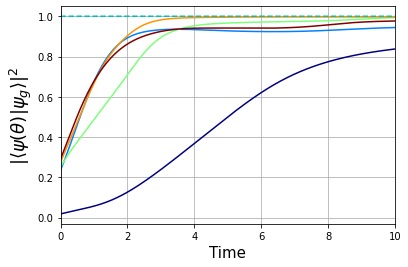

In [35]:
n = 5
colors = plt.cm.jet(np.linspace(0,1,n))

for kkk in range(5):
    plt.plot(time_domain,expt_value[kkk], color = colors[kkk])
plt.plot(time_domain,1.*np.ones(len(time_domain)), ls = "--", color ="c")

plt.ylabel(r"$|\langle \psi(\theta)|\psi_g\rangle|^2$",size = 18)
plt.xlabel('Time',size = 15)
plt.grid()
#plt.legend()
plt.xlim(0,10)
#plt.ylim(0.99,1)

plt.savefig("Imaginary_time_evolution_fidelity_5qutrits_M=0.1_N=3_comparison.pdf")

No handles with labels found to put in legend.


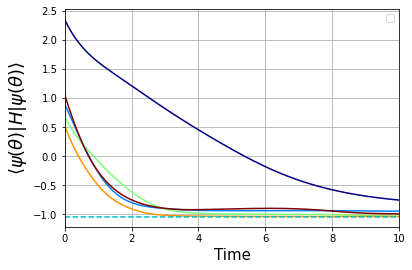

In [36]:
for kkk in range(5):
    plt.plot(time_domain,energyy[kkk], color = colors[kkk])
plt.plot(time_domain,eigenval[0]*np.ones(len(time_domain)), ls = "--", color ="c")

plt.ylabel(r"$\langle \psi(\theta)|H|\psi(\theta)\rangle$",size = 18)
plt.xlabel('Time',size = 15)
plt.grid()
plt.legend()
plt.xlim(0,10)
#plt.ylim(-0.65,-0.63)

plt.savefig("Imaginary_time_evolution_energy_5qutrits_M=0.1_N=3_comparison.pdf")

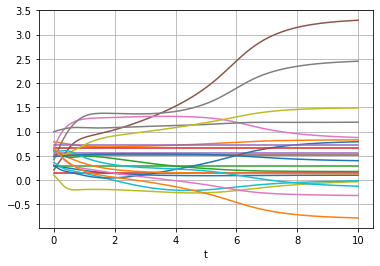

In [238]:
import matplotlib.pyplot as plt
for i in range(coeff*N):
    plt.plot(time_domain, [row[i] for row in Y])
#plt.legend(loc='best')
plt.xlabel('t')
plt.grid()
#plt.xlim(5.9,6.1)
plt.show()

In [212]:
obs = [[1.,2]]
obs_1 = [[-1.,1]]


obs_map = [
            ["z", obs], 
            ["z", obs_1], 


]

observable = hamiltonian(obs_map,dynamic_list=[],basis=basis,**no_checks)
observable_matrix = observable.toarray()
observable_matrix_p = observable_matrix
for i in range(L+1):
    observable_matrix_p = (Proj[i]+Proj_0[i])@observable_matrix_p@(Proj[i]+Proj_0[i])
    
observable_matrix = observable_matrix_p



In [214]:
def hamiltonian_evolution(theta):
    return expm(-1j*full_ham_matrix.toarray()*theta)

def hamiltonian_evolution_1(theta):
    return expm(-1j*constrained_full_ham_matrix.toarray()*theta)

In [218]:
for i in range(coeff*N):
    print(Y[0][i])

0.37141536888406607
0.6602899660443315
0.11637371823579168
0.39901353290549235
0.9247979940631299
0.026453178512319396
0.4382807802429473
0.07025615093206115
0.3606296388374573
0.8138966259351307
0.9031720383192907
0.523454217057356
0.9272695715059814
0.9827474226150743
0.2639324508516817
0.41284186279042756
0.8757225556853009
0.523982524132141
0.9490899608210723
0.6202612047452045
0.19801202641088236
0.6716191124543176


(0.0, 10.0)

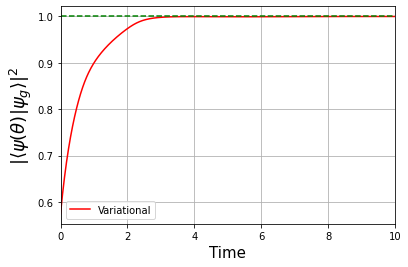

(0.0, 10.0)

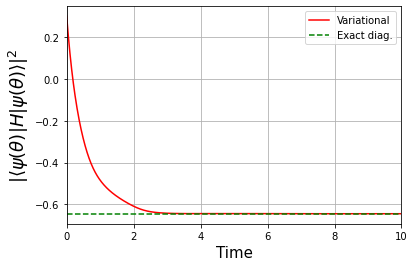

In [220]:
plt.plot(time_domain,energy, color = "red",label = "Variational")
plt.plot(time_domain,eigenval[0]*np.ones(len(time_domain)), ls = "--", color ="g", label = "Exact diag.")

plt.ylabel(r"$|\langle \psi(\theta)|H|\psi(\theta)\rangle|^2$",size = 18)
plt.xlabel('Time',size = 15)
plt.grid()
plt.legend()
plt.xlim(0,10)
#plt.ylim(-0.65,-0.63)

#plt.savefig("Imaginary_time_evolution_energy_3qutrits_M=0.1_N=2_1.pdf")

In [221]:
print(expt_value_u[-1])

0.999481430342308


In [124]:
a = np.array([1,2,4])
ind = [1,3,5]
for i in ind:
    a = np.insert(a,i,i)
    print(a)

[1 1 2 4]
[1 1 2 3 4]
[1 1 2 3 4 5]


In [33]:
vec = np.array([1,2,3,4,5])
print(vec[-1]-vec[0])

4
